In [1]:
# -*- coding: utf-8 -*-
"""vrp_dqn.ipynb

Automatically generated by Colaboratory.

Original file is located at
    https://colab.research.google.com/drive/1iothquIlGtKKte5KIxO-YCKzXnZGjbK-
"""
!pip install tsplib95==0.6.1

from tqdm import tqdm
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from matplotlib import style
import tsplib95
import networkx as nx
import pickle

import time
import math
import re
import random
import copy

import tensorflow
if tensorflow.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tensorflow.test.gpu_device_name()))
else:
    print("Please install GPU version of TF")

from tensorflow.python.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Activation, Flatten
from tensorflow.python.keras import Sequential
# from tensorflow.python.keras.optimizers import SGD
from tensorflow.python.keras.optimizers import Adam
from collections import deque

import io # to save the image
import math
import random

Default GPU Device: /device:GPU:0


In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
# https://stackoverflow.com/questions/57301698/how-to-change-a-learning-rate-for-adam-in-tf2https://stackoverflow.com/questions/57301698/how-to-change-a-learning-rate-for-adam-in-tf2
class LearningRateReducerCb(tensorflow.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        # old_lr = self.model.optimizer.lr.read_value()
        # new_lr = old_lr * 0.99
        new_lr = 0.01
        # print("\nEpoch: {}. Reducing Learning Rate from {} to {}".format(epoch, old_lr, new_lr))
        self.model.optimizer.lr.assign(new_lr)

In [4]:
# 6. Define the movement restriction of the truck.
class Truck:
    def __init__(self, capacity, id, color):
        self.id = id
        self.color = color
        self.path = [] #this has the list of nodes it has visited
        self.max_truck_capacity = copy.deepcopy(capacity) #the max capacity
        self.capacity = copy.deepcopy(capacity)
        #self.visit_depo()
        self.prev_node = None
        self.node = 1 #starts from the depo

    def action(self, choice):
        # the number of choice of actions are the number of nodes-1
        self.move(choice)

    def move(self, to_node_value):
        if to_node_value == 1:
            self.visit_depo()
        self.prev_node = self.node
        self.node = to_node_value
        self.path.append(to_node_value)
        # when invoked update the demand of the node
        # update the demand of the node

    def visit_depo(self):
        self.prev_node = self.node
        self.node = 1 #here it is 1
        self.capacity = copy.deepcopy(self.max_truck_capacity) #truck capacity reset
        #self.path.append(1)


In [5]:
class VRPEnvironment:
    # environment related constants
    #https://matplotlib.org/3.2.1/api/_as_gen/matplotlib.pyplot.figure.html
    # observation_space = (640,480,3)
    # observation_space = (100,100,3)
    observation_space = (10,10,3)
    # observation_space = (5,5,3)
    # penalty and rewards
    non_positive_capacity_penalty = 5000
    zero_demand_penalty = 100 #truck goes to a zero demand node - except 1
    # ignore the failing task penalty as the episode will end only when...
    # all the demands are satisfied i.e. task will always be success...
    # The penalty of the achievement needs to go down.
    failing_task_penalty = 200 #trucks fail to complete the task
    completion_reward = 5000 #trucks complete the task
    demand_satisfying_reward = 100 #another incentive to hit the right target. Imp with considering each step
    hopping_incentive_penalty = 500 #staying at the same node
    # visit_correct_node_reward = 100
    # exploration settings
    permitted_path_length = 30 #30
    epsilon = 1
    # epsilon_decay = 0.999#changing this from 0.999
    min_epsilon = 0.001 #0.001
    no_of_episodes = 30_000 #30_000
    # from 0 to 0.5 difference is small so using 1 first
    truck_colors = {1:(0,0,1)}
    return_images = True
    image_size = 10

    def __init__(self):
        # 1. Extract the tsplib95 file problem
        # self.problem = tsplib95.load_problem('/content/drive/My Drive/HW Assignments/Sem 2/ADBI/Vrp-All/A/A-n32-k5.vrp')
#         self.problem = tsplib95.load_problem('/content/drive/My Drive/HW Assignments/Sem 2/ADBI/Vrp-All/_singleTruck/A-n32-k5_3.vrp')
#         self.problem = tsplib95.load_problem('Vrp-All/_singleTruck/A-n53-k7.vrp')        
        self.problem = tsplib95.load_problem('Vrp-All/_singleTruck/10nodes.vrp')       
        # 2. Create a networkx graph out of the problem. //will be plotting this
        self.nx_graph = self.problem.get_graph()
        self.edge_list = list(self.problem.get_edges()) #[(,)]
        self.node_positions = self.problem.node_coords #dict
        # the list of nodes
        self.node_list = list(self.problem.get_nodes())
        self.action_space = len(self.node_list) #the number of choices including staying put
        # the depot location
        self.depot_location = 1
        # reseting the environment when initialized
        self.reset_environment()
        
    def reset_environment(self):
        # creating the Trucks
        # 4. Extract the necessary data about the trucks. //no of trucks, depot_section, capacity
        self.node_demands = copy.deepcopy(self.problem.demands)
        truck_capacity = copy.deepcopy(self.problem.capacity)
        self.truck = Truck(truck_capacity, 1, self.truck_colors.get(3))
        self.episode_step = 0
        self.total_hop_penalty = 0 #per episode
        if self.return_images:
            observation = np.array(self.get_image())
        # there is no else case as we need always need the image for CNN
        return observation
    
    # change the demand of the node when visited
    def change_demand(self, node):
        self.node_demands[node] = 0

    def step(self, action):
        self.episode_step += 1
        # moving the trucks for the action
        self.truck.action(action)
        self.truck.capacity -= self.node_demands.get(action)
        self.change_demand(action)
        # other truck actions

        if self.return_images:
            new_observation = np.array(self.get_image())
        # there is no else case as the return image is always true

        # assinging the rewards and penalties
        self.reward = 0
        # checking if the demands have been satisfied
        completed = False
        if sum(list(self.node_demands.values())) == 0:
            completed = True
            self.reward = self.completion_reward
        else:
            # rewards for other trucks
            self.node_penalty(self.truck) #other penalties
            self.movement_penalty(self.truck) #edge weight
            # penalties for other trucks
        done = False
        if self.reward == self.completion_reward:
            #if self.reward == self.completion_reward or len(self.truck.path) >= self.permitted_path_length:
            done = True
            if sum(list(self.node_demands.values())) > 0:
                self.reward -= self.failing_task_penalty

        return new_observation, self.reward, done, completed

    def node_penalty(self, truck):
        if self.node_demands[truck.node] == 0:
            if (truck.node == 1 and truck.capacity == truck.max_truck_capacity) or truck.node!=1:
                self.reward -= self.zero_demand_penalty
        else:
            self.reward += self.demand_satisfying_reward

        if self.truck.capacity < 0:
            self.reward -= self.non_positive_capacity_penalty

    def movement_penalty(self, truck):
        if truck.prev_node: #else it's 0
            source_node = truck.prev_node
            destination_node = truck.node
            if source_node == destination_node: #if truck stays at the same place
                self.reward -= self.hopping_incentive_penalty
            self.reward -= self.problem.wfunc(source_node, destination_node)*10
            self.total_hop_penalty += self.problem.wfunc(source_node, destination_node)
            
    def get_zero_demand_nodes(self, node_demands):
        zero_demand_nodes_list = []
        for key in node_demands:
            if node_demands[key] == 0 and key != 1:
                zero_demand_nodes_list.append(key)
        return zero_demand_nodes_list
    
    def get_relative_demands(self, capacity, node_demands):
        relative_node_demands = {}
        for node in node_demands:
            demand = node_demands[node]
            relative_node_demands[node] = demand if capacity>=demand else 0
        return relative_node_demands

    def get_image(self):
        # the initiated rgb image of the given size. 
        env = np.zeros((self.image_size, self.image_size, 3), dtype=np.uint8) #background is black
        
        relative_demand_values = self.get_relative_demands(self.truck.capacity, self.node_demands)
        
        for node in self.node_positions.keys():
            node_coods = self.node_positions.get(node)
            env[int(node_coods[0])][int(node_coods[1])] = (0,255,0) #nodes are green
        
        node_coods = self.node_positions.get(1)
        env[int(node_coods[0])][int(node_coods[1])] = (0,0,0) #depot is black
        
        if self.truck.path: #if there are elements in the path
            for visited_node in set(self.truck.path):
                node_coods = self.node_positions.get(visited_node)
                env[int(node_coods[0])][int(node_coods[1])] = (255,255,255) #visited nodes are white
        #zero_demand_nodes = self.get_zero_demand_nodes(self.node_demands)
        zero_demand_nodes = self.get_zero_demand_nodes(relative_demand_values)
        if zero_demand_nodes:
            for node in zero_demand_nodes:
                node_coods = self.node_positions.get(node)
                env[int(node_coods[0])][int(node_coods[1])] = (255,0,0) #danger are red
        
        node_coods = self.node_positions.get(self.truck.node)
        env[int(node_coods[0])][int(node_coods[1])] = (255,255,0) #truck position
        
        img = Image.fromarray(env, 'RGB')
        return img
    
#     def render(self):
#         img = self.get_image()
#         img = img.resize((300,300))
#         cv2.imshow("image", np.array(img))
#         cv2.waitKey(1)
    

In [6]:
class DQNAgent:
    def __init__(self):
        # main model
        self.main_model = self.create_model()
        
        # target model
        self.target_model = self.create_model()
        self.target_model.set_weights(self.main_model.get_weights())

        # an array with last n steps for training
        self.replay_memory = deque(maxlen=considering_training_length)
        # self.replay_memory = [] #removing the limit

        # used to know when to update target n/w with main n/w's weights
        self.target_update_counter = 0
        
    def create_model(self):
        model = Sequential()

        # model.add(Conv2D(256, (10,10), input_shape=environment.observation_space))
        model.add(Conv2D(256, (2,2), input_shape=environment.observation_space))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size=(2,2)))
        # model.add(MaxPooling2D(pool_size=(1,1)))
        model.add(Dropout(0.2))

        # model.add(Conv2D(256,(10,10)))
        model.add(Conv2D(256,(3,3)))
        model.add(Activation('relu'))
        # model.add(MaxPooling2D(pool_size=(2,2)))
        model.add(MaxPooling2D(pool_size=(2,2)))
        model.add(Dropout(0.2))

        # converting the 3D features into the 1D feature
        model.add(Flatten())
        model.add(Dense(64))

        model.add(Dense(environment.action_space, activation='linear'))
        model.compile(loss='mse', optimizer='Adam', metrics=['accuracy'])

        return model

    # adding the step data into the array to be considered later
    def update_replay_memory(self, step):
        self.replay_memory.append(step)
 
    def train(self, terminal_state, step):
        # start training only when we have a certain number of samples already saved
        if len(self.replay_memory)< min_replay_memory_size:
            return
        # get the minibatch of the samples from the replay table - OLD
        minibatch = random.sample(self.replay_memory, min_training_length)
        # get the minibatch of the samples that have the highest reward
        #minibatch = self.get_max_rewarded_steps(self.replay_memory, min_training_length)
        
        # get current states from minibatch, then query NN model for Q values
        current_states = np.array([transition[0] for transition in minibatch])/255
        current_qs_list = self.main_model.predict(current_states)
        #print(current_qs_list)

        # get future states from the minibatch, then query NN model for Q values
        new_current_states = np.array([transition[3] for transition in minibatch])/255
        future_qs_list = self.target_model.predict(new_current_states)

        X = []
        y = []
        
        # enumerating through the batches
        for index,(current_state, action, reward, new_current_state, done) in enumerate(minibatch):
            # if its not a terminal state, get new q from future states or else set to 0
            if not done:
                max_future_q = np.max(future_qs_list[index])
                new_q = reward + discount*max_future_q
            else:
                new_q = reward

            # update the q value for given state
            current_qs = current_qs_list[index]
            #print(len(current_qs))
            #-1 because indexing 0-4 and actions from 1-5
            current_qs[action-1] = new_q
            
            # append to the training data
            X.append(current_state)
            y.append(current_qs)
        
        # fit on all samples as one batch
        self.main_model.fit(np.array(X)/255, np.array(y), batch_size=min_training_length, verbose=0, shuffle=False, callbacks=[LearningRateReducerCb()])
        
        # updating the target n/w counter every episode
        if terminal_state:
            self.target_update_counter += 1
        
        # if the counter reaches the required value...
        # update the target n/w with weights of main n/w
        if self.target_update_counter > update_target_every:
            self.target_model.set_weights(self.main_model.get_weights())
            self.target_update_counter = 0
    
    # query the main n/w for q values given the current observation space
    def get_qs(self, state):
        return self.main_model.predict(np.array(state).reshape(-1, *state.shape)/255)[0]
    
    def get_models(self):
        return self.main_model, self.target_model


In [7]:
# model related constants
discount = 0.5 #the discount applied to the DQN equation
# the environment keeps running till the demand of the nodes is satisfied
considering_training_length = 50_000 #the no of steps considered for training
min_training_length = 100 #the no of steps used for training
update_target_every = 5 #terminal states (end of episodes)
min_replay_memory_size = 1000 #min no of steps in a memory to start training

environment = VRPEnvironment()
agent = DQNAgent()

In [8]:
show_preview = False #using this will make it slow. Don't care about this now.
aggregrate_stats_every = 50
start_decaying = True #making this True ignores the conditional decaying - Notes 2.a

x_axis = list(range(environment.no_of_episodes+1))
epsilon_list = []
rewards_list = []
path_length_list = []
path_taken_list = []
hop_penalty_list = []

epsilon_decaying_factor = 1000 #the higher the slower the decay

# plot_rep = 1000

# iterate over the episodes
for episode in tqdm(range(1, environment.no_of_episodes + 1), ascii=True, unit='episodes'):
    # Restarting episode - reset episode reward and step number
    episode_reward = 0
    step = 1
    # Reset environment and get initial state
    current_state = environment.reset_environment()
    # Reset flag and start iterating until episode ends
    done = False
    while not done:
        # This part stays mostly the same, the change is to query a model for Q values
        if np.random.random() > environment.epsilon:
            # Get action from Q table            
            action = np.argmax(agent.get_qs(current_state))+1
        else:
            # Get random action
            action = np.random.randint(1, environment.action_space+1)

        new_state, reward, done, completed = environment.step(action)
        # Transform new continous state to new discrete state and count reward
        episode_reward += reward
        
        # no rendering
#         if show_preview and not episode % aggregrate_stats_every:
#             environment.render()
        
        # Every step we update replay memory and train main network
        agent.update_replay_memory((current_state, action, reward, new_state, done))
        agent.train(done, step)
        current_state = new_state
        step += 1

        # Decay the Epsilon
#         if completed:
#             start_decaying = True
        
#         if start_decaying:
        if environment.epsilon > environment.min_epsilon:
            environment.epsilon = np.exp(-episode/epsilon_decaying_factor)
            environment.epsilon = max(environment.min_epsilon, environment.epsilon)
        
        #print(environment.truck.path)
        
    epsilon_list.append(environment.epsilon*1000)
    rewards_list.append(episode_reward)
    path_length_list.append(len(environment.truck.path)*100)
    path_taken_list.append(environment.truck.path)
    hop_penalty_list.append(environment.total_hop_penalty)
    
    print("Path is:", end=" ")
    print(environment.truck.path, end=";")
    print("P and R: "+str(episode_reward), end=";")
    print("Capacity: "+str(environment.truck.capacity), end=";")
    print("Epsilon: "+str(environment.epsilon), end=";")
    print("Hop Penalty: "+str(environment.total_hop_penalty))

  0%|                                                                                  | 0/30000 [00:00<?, ?episodes/s]

Path is: [1, 8, 5, 5, 4, 5, 3, 8, 9, 5, 3, 9, 6, 9, 5, 9, 2, 8, 3, 4, 8, 10, 7];P and R: 870;Capacity: 2;Epsilon: 0.999000499833375;Hop Penalty: 93
Path is: [5, 4, 5, 9, 2, 4, 1, 1, 3, 4, 9, 9, 9, 10, 7, 9, 5, 9, 9, 10, 8, 9, 5, 10, 6];P and R: -550;Capacity: 46;Epsilon: 0.9980019986673331;Hop Penalty: 65
Path is: [4, 8, 9, 1, 3, 4, 4, 7, 4, 6, 5, 3, 5, 10, 9, 10, 10, 8, 4, 10, 6, 8, 4, 10, 7, 5, 8, 2];P and R: -50;Capacity: 42;Epsilon: 0.997004495503373;Hop Penalty: 85
Path is: [4, 2, 10, 9, 9, 1, 10, 8, 1, 6, 5, 8, 8, 4, 8, 6, 7];P and R: 830;Capacity: 50;Epsilon: 0.9960079893439915;Hop Penalty: 57
Path is: [7, 9, 6, 1, 4, 1, 1, 2, 6, 6, 10, 4, 2, 3, 7, 3, 5, 1, 5, 5, 2, 5, 6, 7, 10, 2, 1, 1, 1, 4, 7, 4, 8];P and R: -3660;Capacity: 82;Epsilon: 0.9950124791926823;Hop Penalty: 96
Path is: [6, 6, 1, 3, 2, 1, 1, 4, 10, 9, 7, 3, 9, 1, 6, 2, 8, 8, 9, 2, 8, 3, 4, 4, 10, 2, 5];P and R: -2130;Capacity: 68;Epsilon: 0.9940179640539353;Hop Penalty: 103


  0%|                                                                        | 7/30000 [00:04<5:24:57,  1.54episodes/s]

Path is: [1, 8, 4, 4, 4, 4, 5, 3, 7, 8, 10, 5, 7, 10, 4, 6, 8, 6, 7, 4, 9, 6, 6, 3, 10, 1, 5, 2];P and R: -1590;Capacity: 92;Epsilon: 0.9930244429332351;Hop Penalty: 89
Path is: [4, 9, 8, 7, 9, 2, 9, 1, 4, 7, 1, 3, 7, 10, 5, 7, 10, 9, 1, 8, 3, 4, 3, 8, 2, 5, 10, 3, 4, 1, 2, 3, 10, 3, 6];P and R: -1760;Capacity: 76;Epsilon: 0.9920319148370607;Hop Penalty: 136
Path is: [6, 6, 2, 9, 2, 1, 6, 1, 5, 5, 3, 5, 4, 2, 8, 7];P and R: 880;Capacity: 35;Epsilon: 0.9910403787728836;Hop Penalty: 62
Path is: [4, 9, 6, 10, 2, 3, 1, 6, 6, 6, 10, 4, 6, 4, 9, 1, 7, 1, 8, 3, 8, 7, 7, 1, 9, 10, 2, 2, 5];P and R: -2940;Capacity: 86;Epsilon: 0.9900498337491681;Hop Penalty: 114
Path is: [3, 3, 3, 6, 3, 1, 3, 7, 1, 8, 9, 2, 10, 8, 3, 10, 3, 8, 5, 8, 9, 9, 5, 6, 6, 10, 7, 4];P and R: -1730;Capacity: 38;Epsilon: 0.9890602787753687;Hop Penalty: 103
Path is: [2, 9, 9, 7, 2, 5, 6, 7, 10, 9, 2, 4, 2, 2, 2, 3, 9, 6, 3, 1, 3, 2, 1, 8];P and R: -450;Capacity: 82;Epsilon: 0.9880717128619305;Hop Penalty: 65
Path is: [2, 6

  0%|                                                                       | 20/30000 [00:05<2:50:49,  2.93episodes/s]

Path is: [1, 3, 9, 2, 9, 5, 1, 2, 10, 5, 8, 6, 7, 9, 1, 3, 5, 3, 3, 8, 3, 5, 6, 8, 3, 3, 8, 1, 1, 6, 2, 2, 6, 4];P and R: -3540;Capacity: 79;Epsilon: 0.9831436846349096;Hop Penalty: 124
Path is: [6, 5, 6, 1, 10, 9, 5, 8, 1, 9, 9, 8, 1, 7, 4, 5, 9, 10, 9, 10, 10, 10, 7, 7, 1, 6, 5, 4, 5, 1, 6, 9, 6, 10, 10, 1, 6, 8, 10, 5, 9, 2];P and R: -5770;Capacity: 92;Epsilon: 0.9821610323583008;Hop Penalty: 117
Path is: [3, 1, 4, 5, 6, 2, 8, 8, 2, 10, 2, 6, 6, 4, 7, 10, 1, 2, 4, 2, 5, 2, 1, 10, 6, 8, 7, 8, 3, 6, 2, 10, 5, 6, 4, 4, 3, 5, 2, 7, 3, 9];P and R: -3700;Capacity: 99;Epsilon: 0.981179362242806;Hop Penalty: 160
Path is: [9, 9, 1, 9, 6, 6, 3, 6, 2, 5, 5, 7, 4, 7, 3, 8];P and R: 890;Capacity: 3;Epsilon: 0.9801986733067553;Hop Penalty: 61
Path is: [7, 7, 8, 7, 10, 8, 1, 5, 2, 9, 10, 8, 2, 9, 3, 8, 4, 7, 2, 9, 8, 10, 4, 3, 10, 2, 4, 8, 7, 6];P and R: -210;Capacity: 32;Epsilon: 0.9792189645694596;Hop Penalty: 131


  0%|                                                                       | 25/30000 [00:05<2:04:45,  4.00episodes/s]

Path is: [10, 10, 6, 4, 3, 5, 8, 3, 9, 2, 8, 4, 4, 8, 5, 9, 6, 5, 1, 9, 9, 8, 3, 3, 6, 2, 7];P and R: -1230;Capacity: 88;Epsilon: 0.97824023505121;Hop Penalty: 113
Path is: [5, 6, 6, 4, 9, 4, 7, 9, 8, 6, 1, 5, 8, 4, 6, 3, 3, 10, 9, 2];P and R: 960;Capacity: 92;Epsilon: 0.9772624837732771;Hop Penalty: 64
Path is: [10, 5, 3, 6, 6, 1, 1, 3, 8, 6, 7, 2, 3, 8, 7, 2, 1, 3, 2, 4, 3, 3, 4, 6, 7, 8, 8, 4, 4, 9];P and R: -2210;Capacity: 78;Epsilon: 0.9762857097579093;Hop Penalty: 81
Path is: [4, 3, 4, 2, 5, 7, 4, 8, 3, 10, 5, 10, 10, 4, 10, 1, 3, 6, 10, 7, 5, 6, 8, 3, 1, 4, 6, 5, 2, 3, 8, 5, 5, 2, 2, 6, 9];P and R: -2390;Capacity: 99;Epsilon: 0.9753099120283326;Hop Penalty: 129
Path is: [4, 8, 6, 10, 7, 6, 10, 8, 4, 1, 10, 1, 8, 3, 8, 4, 10, 1, 10, 3, 10, 8, 8, 5, 8, 9, 7, 9, 7, 1, 2];P and R: -1730;Capacity: 92;Epsilon: 0.9743350896087494;Hop Penalty: 123


  0%|                                                                       | 30/30000 [00:05<1:15:04,  6.65episodes/s]

Path is: [4, 4, 1, 4, 6, 3, 6, 10, 1, 1, 3, 3, 9, 9, 4, 4, 2, 9, 2, 7, 9, 7, 4, 8, 2, 9, 9, 6, 7, 7, 8, 7, 9, 3, 4, 1, 5];P and R: -4770;Capacity: 86;Epsilon: 0.9733612415243368;Hop Penalty: 117
Path is: [6, 2, 4, 10, 2, 3, 4, 1, 5, 9, 2, 2, 6, 5, 6, 8, 6, 8, 4, 10, 9, 1, 4, 10, 7];P and R: 130;Capacity: 88;Epsilon: 0.9723883668012469;Hop Penalty: 97
Path is: [10, 6, 5, 3, 5, 2, 5, 1, 2, 4, 4, 6, 4, 4, 7, 6, 8, 8, 9];P and R: 720;Capacity: 48;Epsilon: 0.9714164644666048;Hop Penalty: 48
Path is: [5, 3, 6, 1, 2, 10, 3, 10, 7, 3, 9, 9, 5, 10, 1, 9, 7, 8, 6, 9, 1, 7, 4];P and R: -170;Capacity: 79;Epsilon: 0.9704455335485082;Hop Penalty: 97
Path is: [2, 5, 5, 1, 9, 7, 8, 2, 1, 5, 1, 6, 10, 7, 8, 8, 6, 5, 1, 7, 4];P and R: -600;Capacity: 79;Epsilon: 0.9694755730760259;Hop Penalty: 60
Path is: [4, 1, 8, 6, 10, 10, 9, 6, 4, 9, 9, 7, 5, 4, 8, 3, 7, 9, 2];P and R: 1080;Capacity: 23;Epsilon: 0.9685065820791976;Hop Penalty: 62


  0%|                                                                         | 33/30000 [00:05<58:37,  8.52episodes/s]

Path is: [6, 6, 2, 5, 9, 3, 2, 9, 1, 7, 4, 1, 1, 4, 7, 4, 6, 10, 6, 1, 9, 1, 10, 1, 7, 4, 6, 8];P and R: -2320;Capacity: 82;Epsilon: 0.967538559589032;Hop Penalty: 112
Path is: [1, 4, 8, 4, 8, 3, 3, 6, 4, 1, 7, 1, 3, 2, 5, 9];P and R: 980;Capacity: 77;Epsilon: 0.9665715046375066;Hop Penalty: 52
Path is: [4, 5, 1, 4, 10, 2, 7, 1, 3, 10, 2, 10, 8, 6, 10, 8, 7, 8, 7, 1, 2, 9];P and R: 630;Capacity: 99;Epsilon: 0.9656054162575665;Hop Penalty: 77


  0%|                                                                         | 36/30000 [00:05<53:05,  9.41episodes/s]

Path is: [10, 2, 1, 5, 8, 3, 4, 4, 5, 5, 4, 3, 8, 4, 5, 2, 4, 5, 5, 10, 9, 7, 6];P and R: 70;Capacity: 10;Epsilon: 0.9646402934831231;Hop Penalty: 73
Path is: [7, 3, 4, 7, 2, 4, 3, 3, 3, 3, 5, 10, 10, 9, 2, 5, 10, 10, 4, 6, 5, 4, 3, 5, 2, 6, 5, 3, 8];P and R: -1190;Capacity: 2;Epsilon: 0.9636761353490535;Hop Penalty: 89


  0%|                                                                         | 38/30000 [00:06<59:47,  8.35episodes/s]

Path is: [1, 10, 5, 5, 4, 7, 1, 5, 5, 1, 4, 3, 10, 8, 5, 7, 4, 1, 6, 1, 7, 10, 9, 5, 1, 8, 2];P and R: -2470;Capacity: 92;Epsilon: 0.9627129408911995;Hop Penalty: 87
Path is: [10, 3, 3, 7, 1, 8, 3, 3, 3, 6, 6, 1, 1, 8, 5, 9, 2, 6, 2, 8, 8, 6, 7, 3, 10, 1, 9, 5, 9, 3, 10, 1, 8, 2, 3, 9, 3, 2, 10, 1, 9, 8, 4];P and R: -6770;Capacity: 79;Epsilon: 0.9617507091463667;Hop Penalty: 207


  0%|                                                                      | 40/30000 [00:16<14:02:46,  1.69s/episodes]

Path is: [8, 3, 7, 3, 1, 6, 2, 9, 5, 1, 8, 1, 2, 5, 2, 3, 1, 9, 3, 4];P and R: 150;Capacity: 79;Epsilon: 0.9607894391523232;Hop Penalty: 95


  0%|                                                                      | 41/30000 [00:21<21:25:03,  2.57s/episodes]

Path is: [3, 9, 9, 3, 5, 6, 7, 6, 1, 10, 3, 2, 10, 5, 1, 5, 8, 8, 9, 4];P and R: 380;Capacity: 61;Epsilon: 0.9598291299477989;Hop Penalty: 72


  0%|                                                                      | 42/30000 [00:26<28:04:31,  3.37s/episodes]

Path is: [9, 9, 2, 2, 7, 9, 4, 10, 3, 6, 8, 8, 9, 2, 10, 4, 10, 10, 4, 6, 4, 3, 5];P and R: -250;Capacity: 2;Epsilon: 0.9588697805724845;Hop Penalty: 105


  0%|1                                                                     | 43/30000 [00:32<32:52:39,  3.95s/episodes]

Path is: [9, 10, 8, 6, 9, 5, 10, 9, 10, 6, 6, 5, 2, 7, 9, 8, 10, 5, 8, 9, 9, 4];P and R: 1260;Capacity: 2;Epsilon: 0.9579113900670306;Hop Penalty: 64


  0%|1                                                                     | 44/30000 [00:40<44:14:16,  5.32s/episodes]

Path is: [5, 3, 5, 7, 1, 7, 2, 9, 10, 10, 3, 8, 7, 9, 10, 7, 3, 9, 5, 7, 2, 9, 5, 5, 2, 2, 6, 2, 8, 8, 7, 7, 7, 3, 2, 2, 4];P and R: -3970;Capacity: 28;Epsilon: 0.9569539574730467;Hop Penalty: 137


  0%|1                                                                     | 45/30000 [00:44<41:13:26,  4.95s/episodes]

Path is: [2, 3, 3, 9, 4, 3, 1, 5, 7, 8, 5, 8, 2, 1, 5, 2, 6];P and R: 1370;Capacity: 76;Epsilon: 0.9559974818331;Hop Penalty: 53


  0%|1                                                                     | 46/30000 [00:49<42:06:03,  5.06s/episodes]

Path is: [6, 5, 6, 6, 10, 5, 6, 4, 2, 3, 8, 7, 2, 2, 5, 2, 10, 3, 3, 7, 5, 5, 9];P and R: 30;Capacity: 2;Epsilon: 0.9550419621907147;Hop Penalty: 77


  0%|1                                                                     | 47/30000 [00:56<44:54:48,  5.40s/episodes]

Path is: [9, 4, 3, 4, 1, 7, 2, 7, 2, 2, 8, 9, 2, 4, 6, 7, 9, 2, 8, 1, 9, 1, 6, 3, 3, 9, 5];P and R: -1320;Capacity: 86;Epsilon: 0.9540873975903711;Hop Penalty: 122


  0%|1                                                                     | 48/30000 [01:01<44:31:31,  5.35s/episodes]

Path is: [8, 3, 2, 4, 7, 1, 8, 8, 8, 5, 1, 10, 5, 6, 7, 8, 3, 6, 5, 5, 2, 9];P and R: -350;Capacity: 75;Epsilon: 0.9531337870775047;Hop Penalty: 75


  0%|1                                                                     | 49/30000 [01:09<51:14:12,  6.16s/episodes]

Path is: [5, 7, 5, 6, 3, 3, 10, 2, 4, 4, 5, 1, 5, 1, 8, 5, 3, 10, 2, 7, 8, 8, 4, 2, 8, 3, 7, 3, 8, 5, 3, 3, 7, 4, 9];P and R: -2880;Capacity: 81;Epsilon: 0.9521811296985049;Hop Penalty: 148


  0%|1                                                                     | 50/30000 [01:14<47:54:09,  5.76s/episodes]

Path is: [2, 9, 1, 8, 1, 7, 8, 4, 5, 7, 3, 7, 9, 10, 3, 4, 10, 8, 2, 6];P and R: 1310;Capacity: 29;Epsilon: 0.951229424500714;Hop Penalty: 79


  0%|1                                                                     | 51/30000 [01:19<47:02:50,  5.66s/episodes]

Path is: [7, 3, 9, 1, 7, 4, 3, 5, 5, 7, 9, 2, 8, 5, 3, 8, 9, 3, 8, 5, 4, 8, 10, 6];P and R: 680;Capacity: 15;Epsilon: 0.950278670532427;Hop Penalty: 102


  0%|1                                                                     | 52/30000 [01:23<42:58:44,  5.17s/episodes]

Path is: [2, 8, 6, 3, 3, 1, 4, 4, 10, 5, 4, 4, 4, 9, 4, 9, 7];P and R: 380;Capacity: 52;Epsilon: 0.9493288668428895;Hop Penalty: 52


  0%|1                                                                     | 53/30000 [01:30<48:05:55,  5.78s/episodes]

Path is: [9, 4, 3, 1, 9, 4, 10, 6, 2, 2, 6, 2, 5, 8, 5, 4, 5, 3, 1, 3, 6, 2, 1, 2, 8, 9, 6, 9, 9, 9, 7];P and R: -2120;Capacity: 88;Epsilon: 0.9483800124822982;Hop Penalty: 112


  0%|1                                                                     | 54/30000 [01:39<54:09:09,  6.51s/episodes]

Path is: [8, 6, 3, 9, 8, 6, 4, 3, 8, 3, 2, 9, 4, 6, 8, 6, 10, 10, 2, 7, 2, 1, 2, 4, 4, 8, 4, 4, 10, 6, 2, 7, 8, 9, 6, 5];P and R: -1960;Capacity: 86;Epsilon: 0.9474321065017983;Hop Penalty: 146


  0%|1                                                                     | 55/30000 [01:42<45:26:51,  5.46s/episodes]

Path is: [8, 10, 2, 5, 5, 9, 6, 2, 6, 3, 5, 4, 10, 7];P and R: 2590;Capacity: 2;Epsilon: 0.9464851479534838;Hop Penalty: 61


  0%|1                                                                     | 56/30000 [01:49<51:16:45,  6.17s/episodes]

Path is: [4, 5, 4, 7, 2, 5, 7, 9, 4, 7, 5, 1, 2, 8, 8, 10, 8, 4, 7, 7, 3, 5, 7, 7, 7, 5, 9, 10, 8, 10, 1, 3, 1, 6];P and R: -2660;Capacity: 76;Epsilon: 0.9455391358903963;Hop Penalty: 86


  0%|1                                                                     | 57/30000 [01:57<54:04:39,  6.50s/episodes]

Path is: [1, 3, 7, 4, 7, 4, 8, 8, 6, 9, 6, 1, 10, 10, 9, 5, 9, 9, 9, 8, 7, 6, 5, 4, 10, 8, 7, 8, 7, 8, 2];P and R: -1770;Capacity: 78;Epsilon: 0.9445940693665233;Hop Penalty: 77


  0%|1                                                                     | 58/30000 [02:08<66:47:25,  8.03s/episodes]

Path is: [10, 4, 2, 10, 5, 3, 10, 3, 5, 9, 1, 6, 7, 2, 6, 9, 7, 6, 9, 6, 3, 10, 10, 1, 4, 2, 7, 7, 4, 7, 10, 1, 4, 10, 7, 9, 10, 9, 3, 7, 3, 6, 4, 9, 6, 2, 2, 10, 8];P and R: -4880;Capacity: 82;Epsilon: 0.9436499474367985;Hop Penalty: 208


  0%|1                                                                     | 59/30000 [02:12<56:54:08,  6.84s/episodes]

Path is: [4, 6, 2, 1, 8, 1, 7, 4, 4, 4, 9, 7, 10, 8, 2, 7, 5];P and R: 780;Capacity: 73;Epsilon: 0.9427067691570997;Hop Penalty: 62


  0%|1                                                                     | 60/30000 [02:18<53:52:22,  6.48s/episodes]

Path is: [9, 5, 7, 10, 2, 3, 4, 6, 2, 2, 9, 1, 7, 9, 1, 7, 10, 3, 9, 10, 4, 4, 4, 8];P and R: -770;Capacity: 82;Epsilon: 0.9417645335842487;Hop Penalty: 97


  0%|1                                                                     | 61/30000 [02:23<50:13:09,  6.04s/episodes]

Path is: [1, 4, 8, 10, 7, 3, 3, 4, 2, 9, 4, 5, 7, 5, 4, 5, 9, 3, 1, 7, 6];P and R: 810;Capacity: 76;Epsilon: 0.9408232397760097;Hop Penalty: 69


  0%|1                                                                     | 62/30000 [02:28<46:24:08,  5.58s/episodes]

Path is: [10, 9, 7, 4, 1, 2, 6, 6, 5, 10, 10, 7, 7, 10, 7, 6, 10, 9, 8];P and R: 730;Capacity: 36;Epsilon: 0.9398828867910889;Hop Penalty: 47


  0%|1                                                                     | 63/30000 [02:31<41:28:22,  4.99s/episodes]

Path is: [4, 8, 3, 1, 10, 1, 9, 2, 6, 10, 8, 7, 1, 6, 5];P and R: 1430;Capacity: 86;Epsilon: 0.9389434736891332;Hop Penalty: 67


  0%|1                                                                     | 64/30000 [02:36<40:44:07,  4.90s/episodes]

Path is: [1, 1, 6, 1, 4, 9, 1, 5, 9, 10, 1, 10, 7, 9, 6, 1, 2, 7, 4, 8];P and R: -510;Capacity: 74;Epsilon: 0.9380049995307295;Hop Penalty: 61


  0%|1                                                                     | 65/30000 [02:39<36:44:59,  4.42s/episodes]

Path is: [5, 8, 4, 8, 3, 7, 8, 10, 6, 4, 8, 2, 4, 9];P and R: 3090;Capacity: 2;Epsilon: 0.9370674633774034;Hop Penalty: 61


  0%|1                                                                     | 66/30000 [02:45<39:14:25,  4.72s/episodes]

Path is: [8, 6, 4, 1, 8, 5, 1, 1, 2, 1, 10, 2, 4, 2, 2, 5, 8, 5, 3, 10, 10, 9, 7];P and R: -1020;Capacity: 87;Epsilon: 0.9361308642916188;Hop Penalty: 82


  0%|1                                                                     | 67/30000 [02:49<37:25:03,  4.50s/episodes]

Path is: [7, 10, 7, 3, 1, 5, 5, 8, 4, 10, 2, 6, 6, 10, 2, 9];P and R: 1270;Capacity: 14;Epsilon: 0.9351952013367766;Hop Penalty: 73


  0%|1                                                                     | 68/30000 [02:58<49:43:36,  5.98s/episodes]

Path is: [3, 2, 3, 10, 1, 3, 1, 1, 6, 6, 4, 3, 5, 6, 1, 6, 1, 7, 3, 7, 10, 4, 1, 5, 4, 10, 4, 4, 3, 1, 9, 5, 3, 6, 7, 4, 5, 10, 2, 9, 8];P and R: -4940;Capacity: 81;Epsilon: 0.9342604735772135;Hop Penalty: 144


  0%|1                                                                     | 69/30000 [03:01<42:52:06,  5.16s/episodes]

Path is: [8, 8, 9, 4, 6, 8, 2, 3, 6, 4, 8, 7, 5];P and R: 2840;Capacity: 2;Epsilon: 0.933326680078202;Hop Penalty: 46


  0%|1                                                                     | 70/30000 [03:06<40:48:46,  4.91s/episodes]

Path is: [10, 2, 9, 9, 3, 10, 1, 9, 8, 10, 5, 9, 3, 4, 8, 3, 6, 2, 7];P and R: 1180;Capacity: 11;Epsilon: 0.9323938199059483;Hop Penalty: 102


  0%|1                                                                     | 71/30000 [03:13<47:52:01,  5.76s/episodes]

Path is: [2, 4, 8, 7, 1, 4, 10, 10, 1, 4, 6, 10, 6, 10, 3, 2, 1, 2, 5, 3, 4, 8, 3, 7, 10, 2, 6, 7, 4, 4, 10, 7, 9];P and R: -1820;Capacity: 85;Epsilon: 0.9314618921275921;Hop Penalty: 112


  0%|1                                                                     | 72/30000 [03:18<45:33:01,  5.48s/episodes]

Path is: [1, 8, 4, 5, 3, 1, 3, 4, 4, 8, 9, 8, 3, 2, 6, 9, 1, 7];P and R: 800;Capacity: 88;Epsilon: 0.9305308958112057;Hop Penalty: 50


  0%|1                                                                     | 73/30000 [03:21<39:31:33,  4.75s/episodes]

Path is: [8, 7, 6, 8, 5, 4, 10, 1, 2, 4, 1, 7, 9];P and R: 2410;Capacity: 99;Epsilon: 0.9296008300257927;Hop Penalty: 39


  0%|1                                                                     | 74/30000 [03:27<41:17:13,  4.97s/episodes]

Path is: [6, 8, 3, 3, 5, 6, 9, 8, 10, 5, 5, 6, 6, 8, 10, 2, 9, 4, 8, 9, 6, 5, 7];P and R: 550;Capacity: 2;Epsilon: 0.9286716938412872;Hop Penalty: 75


  0%|1                                                                     | 75/30000 [03:30<38:18:18,  4.61s/episodes]

Path is: [8, 5, 10, 6, 1, 6, 4, 7, 2, 6, 4, 1, 6, 9];P and R: 2090;Capacity: 99;Epsilon: 0.9277434863285529;Hop Penalty: 61


  0%|1                                                                     | 76/30000 [03:37<41:57:28,  5.05s/episodes]

Path is: [10, 8, 5, 1, 10, 9, 10, 10, 7, 6, 4, 4, 10, 9, 8, 5, 8, 4, 7, 4, 5, 7, 10, 5, 5, 2];P and R: -300;Capacity: 34;Epsilon: 0.9268162065593822;Hop Penalty: 80


  0%|1                                                                     | 77/30000 [03:40<38:24:58,  4.62s/episodes]

Path is: [10, 1, 9, 10, 6, 7, 2, 3, 5, 10, 3, 4, 6, 5, 4, 8];P and R: 2410;Capacity: 2;Epsilon: 0.9258898536064953;Hop Penalty: 59


  0%|1                                                                     | 78/30000 [03:43<34:42:54,  4.18s/episodes]

Path is: [1, 7, 5, 4, 2, 6, 1, 5, 8, 4, 1, 10, 9];P and R: 1820;Capacity: 99;Epsilon: 0.9249644265435393;Hop Penalty: 48


  0%|1                                                                     | 79/30000 [03:49<38:12:14,  4.60s/episodes]

Path is: [5, 1, 7, 2, 10, 4, 3, 3, 7, 8, 3, 5, 5, 5, 10, 9, 9, 10, 4, 8, 5, 3, 3, 6];P and R: -1140;Capacity: 16;Epsilon: 0.9240399244450868;Hop Penalty: 84


  0%|1                                                                     | 80/30000 [03:53<36:00:01,  4.33s/episodes]

Path is: [5, 6, 2, 8, 1, 6, 3, 3, 10, 9, 5, 6, 8, 4, 3, 7];P and R: 1930;Capacity: 66;Epsilon: 0.9231163463866358;Hop Penalty: 57


  0%|1                                                                     | 81/30000 [03:59<40:28:17,  4.87s/episodes]

Path is: [4, 10, 7, 7, 10, 4, 10, 3, 1, 10, 3, 9, 2, 6, 1, 10, 8, 6, 6, 1, 1, 10, 6, 2, 9, 5];P and R: -1760;Capacity: 86;Epsilon: 0.922193691444608;Hop Penalty: 126


  0%|1                                                                     | 82/30000 [04:04<41:54:17,  5.04s/episodes]

Path is: [9, 2, 10, 2, 10, 5, 5, 9, 4, 7, 9, 1, 2, 5, 5, 9, 5, 6, 5, 5, 2, 6, 5, 8];P and R: -310;Capacity: 58;Epsilon: 0.9212719586963487;Hop Penalty: 101


  0%|1                                                                     | 83/30000 [04:11<46:15:29,  5.57s/episodes]

Path is: [1, 2, 5, 6, 3, 1, 4, 9, 1, 10, 9, 10, 1, 10, 3, 6, 5, 2, 9, 10, 7, 7, 1, 9, 8];P and R: -1250;Capacity: 82;Epsilon: 0.9203511472201247;Hop Penalty: 85


  0%|1                                                                     | 84/30000 [04:15<42:44:34,  5.14s/episodes]

Path is: [7, 2, 4, 2, 5, 7, 6, 7, 7, 3, 10, 3, 8, 5, 9];P and R: 2470;Capacity: 2;Epsilon: 0.9194312560951247;Hop Penalty: 63


  0%|1                                                                     | 85/30000 [04:18<38:21:16,  4.62s/episodes]

Path is: [1, 4, 9, 3, 3, 6, 5, 6, 9, 3, 7, 8, 2];P and R: 2370;Capacity: 2;Epsilon: 0.9185122844014574;Hop Penalty: 43


  0%|2                                                                     | 86/30000 [04:26<46:40:02,  5.62s/episodes]

Path is: [4, 2, 6, 5, 7, 2, 5, 7, 6, 10, 7, 9, 2, 3, 3, 1, 2, 2, 7, 3, 3, 7, 5, 6, 1, 1, 7, 9, 9, 8];P and R: -2250;Capacity: 82;Epsilon: 0.917594231220151;Hop Penalty: 85


  0%|2                                                                     | 87/30000 [04:33<48:01:23,  5.78s/episodes]

Path is: [8, 5, 4, 2, 4, 7, 3, 2, 10, 1, 7, 2, 5, 1, 8, 6, 3, 7, 4, 10, 3, 1, 9];P and R: 270;Capacity: 99;Epsilon: 0.9166770956331523;Hop Penalty: 103


  0%|2                                                                     | 88/30000 [04:36<41:20:22,  4.98s/episodes]

Path is: [7, 1, 1, 9, 3, 8, 6, 3, 2, 4, 1, 5];P and R: 1950;Capacity: 86;Epsilon: 0.9157608767233256;Hop Penalty: 45


  0%|2                                                                     | 89/30000 [04:39<36:41:32,  4.42s/episodes]

Path is: [3, 5, 7, 4, 6, 2, 8, 6, 6, 10, 4, 9];P and R: 2960;Capacity: 2;Epsilon: 0.914845573574452;Hop Penalty: 44


  0%|2                                                                     | 90/30000 [04:44<39:54:48,  4.80s/episodes]

Path is: [8, 1, 6, 2, 6, 9, 4, 10, 2, 3, 8, 8, 5, 8, 9, 1, 2, 3, 1, 5, 7];P and R: 190;Capacity: 88;Epsilon: 0.9139311852712282;Hop Penalty: 81


  0%|2                                                                     | 91/30000 [05:01<69:12:35,  8.33s/episodes]

Path is: [9, 4, 10, 2, 10, 3, 7, 1, 5, 9, 4, 10, 9, 6, 4, 5, 1, 6, 10, 2, 10, 4, 7, 1, 2, 7, 7, 1, 1, 10, 4, 5, 7, 5, 10, 7, 7, 9, 10, 8];P and R: -4180;Capacity: 82;Epsilon: 0.9130177108992658;Hop Penalty: 178


  0%|2                                                                     | 92/30000 [05:04<55:20:14,  6.66s/episodes]

Path is: [4, 5, 8, 5, 3, 6, 9, 6, 2, 7];P and R: 3760;Capacity: 2;Epsilon: 0.9121051495450904;Hop Penalty: 34


  0%|2                                                                     | 93/30000 [05:10<54:39:07,  6.58s/episodes]

Path is: [4, 1, 1, 4, 2, 1, 5, 7, 4, 2, 5, 5, 8, 2, 10, 7, 10, 6, 8, 7, 8, 1, 8, 9];P and R: -580;Capacity: 99;Epsilon: 0.9111935002961405;Hop Penalty: 78


  0%|2                                                                     | 94/30000 [05:16<52:08:31,  6.28s/episodes]

Path is: [4, 9, 8, 3, 1, 8, 10, 1, 4, 4, 1, 1, 2, 5, 7, 5, 2, 10, 7, 3, 1, 6];P and R: -770;Capacity: 76;Epsilon: 0.910282762240767;Hop Penalty: 67


  0%|2                                                                     | 95/30000 [05:25<58:28:23,  7.04s/episodes]

Path is: [4, 5, 4, 9, 4, 9, 2, 8, 6, 6, 8, 1, 6, 3, 6, 4, 4, 2, 9, 4, 4, 8, 10, 3, 2, 4, 3, 1, 6, 5, 3, 4, 9, 7];P and R: -2010;Capacity: 88;Epsilon: 0.9093729344682314;Hop Penalty: 121


  0%|2                                                                     | 96/30000 [05:29<52:11:39,  6.28s/episodes]

Path is: [3, 7, 2, 8, 10, 9, 1, 3, 7, 2, 5, 6, 9, 9, 10, 10, 5, 4];P and R: 1220;Capacity: 41;Epsilon: 0.9084640160687062;Hop Penalty: 58


  0%|2                                                                     | 97/30000 [05:35<50:04:50,  6.03s/episodes]

Path is: [5, 10, 5, 3, 2, 7, 7, 1, 2, 8, 8, 8, 9, 9, 1, 3, 4, 2, 6];P and R: -260;Capacity: 55;Epsilon: 0.9075560061332727;Hop Penalty: 46


  0%|2                                                                     | 98/30000 [05:37<40:59:14,  4.93s/episodes]

Path is: [2, 4, 5, 10, 10, 6, 9, 7, 8];P and R: 3490;Capacity: 2;Epsilon: 0.9066489037539209;Hop Penalty: 21


  0%|2                                                                     | 99/30000 [05:40<36:47:19,  4.43s/episodes]

Path is: [10, 4, 2, 2, 10, 9, 5, 4, 10, 6, 7, 1, 4, 8];P and R: 2160;Capacity: 82;Epsilon: 0.9057427080235485;Hop Penalty: 54


  0%|2                                                                    | 100/30000 [05:44<35:39:42,  4.29s/episodes]

Path is: [6, 8, 7, 5, 4, 3, 10, 7, 10, 1, 7, 8, 10, 2, 2, 3, 9];P and R: 1890;Capacity: 91;Epsilon: 0.9048374180359595;Hop Penalty: 51


  0%|2                                                                    | 101/30000 [05:46<30:47:31,  3.71s/episodes]

Path is: [7, 1, 1, 10, 5, 8, 4, 9, 6, 2];P and R: 2650;Capacity: 14;Epsilon: 0.9039330328858641;Hop Penalty: 45


  0%|2                                                                    | 102/30000 [05:51<32:13:38,  3.88s/episodes]

Path is: [7, 8, 4, 9, 2, 3, 4, 6, 9, 2, 7, 8, 8, 10, 10, 4, 10, 5];P and R: 1590;Capacity: 2;Epsilon: 0.9030295516688768;Hop Penalty: 71


  0%|2                                                                    | 103/30000 [05:56<34:42:40,  4.18s/episodes]

Path is: [2, 5, 2, 6, 7, 4, 9, 6, 5, 5, 4, 1, 6, 6, 5, 6, 6, 4, 2, 9, 8];P and R: 440;Capacity: 82;Epsilon: 0.9021269734815165;Hop Penalty: 56


  0%|2                                                                    | 104/30000 [06:02<39:23:45,  4.74s/episodes]

Path is: [1, 7, 1, 6, 9, 3, 10, 1, 3, 3, 2, 6, 1, 4, 6, 3, 4, 5, 10, 7, 3, 9, 9, 6, 9, 8];P and R: -1390;Capacity: 47;Epsilon: 0.9012252974212048;Hop Penalty: 89


  0%|2                                                                    | 105/30000 [06:04<34:24:37,  4.14s/episodes]

Path is: [5, 7, 10, 4, 2, 8, 4, 6, 10, 10, 9];P and R: 3070;Capacity: 2;Epsilon: 0.9003245225862656;Hop Penalty: 43


  0%|2                                                                    | 106/30000 [06:10<37:05:30,  4.47s/episodes]

Path is: [7, 10, 3, 5, 2, 8, 2, 7, 6, 9, 8, 8, 5, 1, 5, 7, 6, 1, 3, 7, 9, 3, 4];P and R: 420;Capacity: 79;Epsilon: 0.899424648075924;Hop Penalty: 88


  0%|2                                                                    | 107/30000 [06:14<37:32:33,  4.52s/episodes]

Path is: [9, 5, 7, 9, 5, 5, 7, 10, 5, 9, 8, 2, 2, 7, 4, 5, 8, 1, 2, 6];P and R: 910;Capacity: 76;Epsilon: 0.8985256729903055;Hop Penalty: 69


  0%|2                                                                    | 108/30000 [06:18<36:39:21,  4.41s/episodes]

Path is: [4, 8, 7, 3, 6, 2, 1, 3, 1, 3, 5, 2, 10, 7, 3, 1, 9];P and R: 1310;Capacity: 99;Epsilon: 0.8976275964304349;Hop Penalty: 59


  0%|2                                                                    | 109/30000 [06:22<34:23:38,  4.14s/episodes]

Path is: [1, 2, 2, 4, 2, 1, 7, 9, 5, 10, 6, 3, 9, 7, 8];P and R: 1640;Capacity: 31;Epsilon: 0.8967304174982355;Hop Penalty: 46


  0%|2                                                                    | 110/30000 [06:26<33:20:22,  4.02s/episodes]

Path is: [3, 6, 9, 7, 7, 4, 7, 10, 1, 10, 2, 3, 8, 9, 9, 5];P and R: 1460;Capacity: 60;Epsilon: 0.8958341352965282;Hop Penalty: 54


  0%|2                                                                    | 111/30000 [06:28<29:42:29,  3.58s/episodes]

Path is: [8, 2, 1, 4, 3, 1, 5, 7, 2, 6, 9];P and R: 2550;Capacity: 49;Epsilon: 0.894938748929031;Hop Penalty: 45


  0%|2                                                                    | 112/30000 [06:33<32:32:25,  3.92s/episodes]

Path is: [8, 9, 8, 5, 10, 9, 2, 6, 8, 3, 8, 3, 6, 5, 1, 4, 5, 1, 8, 7];P and R: 1280;Capacity: 88;Epsilon: 0.8940442575003572;Hop Penalty: 82


  0%|2                                                                    | 113/30000 [06:37<32:18:17,  3.89s/episodes]

Path is: [2, 7, 10, 4, 9, 3, 6, 4, 5, 3, 5, 1, 9, 5, 3, 8];P and R: 2350;Capacity: 82;Epsilon: 0.8931506601160155;Hop Penalty: 65


  0%|2                                                                    | 114/30000 [06:43<38:12:29,  4.60s/episodes]

Path is: [4, 6, 5, 7, 3, 4, 2, 1, 6, 6, 7, 5, 9, 3, 1, 3, 10, 4, 9, 1, 1, 5, 4, 1, 10, 5, 8];P and R: -1530;Capacity: 82;Epsilon: 0.8922579558824083;Hop Penalty: 93


  0%|2                                                                    | 115/30000 [06:46<34:30:50,  4.16s/episodes]

Path is: [9, 3, 6, 4, 9, 7, 2, 10, 5, 1, 2, 5, 8];P and R: 2680;Capacity: 82;Epsilon: 0.8913661439068313;Hop Penalty: 62


  0%|2                                                                    | 116/30000 [06:51<35:43:46,  4.30s/episodes]

Path is: [7, 10, 9, 4, 6, 4, 7, 10, 4, 5, 1, 9, 1, 2, 9, 6, 6, 9, 3, 8];P and R: 840;Capacity: 74;Epsilon: 0.8904752232974726;Hop Penalty: 76


  0%|2                                                                    | 117/30000 [06:56<36:44:35,  4.43s/episodes]

Path is: [8, 1, 6, 7, 4, 2, 3, 8, 8, 3, 6, 2, 8, 10, 10, 6, 4, 3, 10, 5, 9];P and R: 690;Capacity: 20;Epsilon: 0.8895851931634113;Hop Penalty: 81


  0%|2                                                                    | 118/30000 [06:58<32:46:19,  3.95s/episodes]

Path is: [5, 7, 6, 2, 2, 8, 4, 7, 7, 2, 9];P and R: 2590;Capacity: 2;Epsilon: 0.8886960526146174;Hop Penalty: 41


  0%|2                                                                    | 119/30000 [07:01<30:35:19,  3.69s/episodes]

Path is: [6, 5, 10, 5, 3, 9, 4, 1, 2, 7, 9, 10, 8];P and R: 2820;Capacity: 62;Epsilon: 0.8878078007619501;Hop Penalty: 48


  0%|2                                                                    | 120/30000 [07:04<27:21:51,  3.30s/episodes]

Path is: [9, 9, 2, 6, 8, 9, 8, 7, 4, 5];P and R: 3240;Capacity: 2;Epsilon: 0.8869204367171575;Hop Penalty: 36


  0%|2                                                                    | 121/30000 [07:08<28:31:49,  3.44s/episodes]

Path is: [1, 8, 2, 10, 6, 10, 9, 4, 2, 5, 8, 1, 6, 5, 1, 7];P and R: 1380;Capacity: 88;Epsilon: 0.8860339595928756;Hop Penalty: 62


  0%|2                                                                    | 122/30000 [07:12<30:48:44,  3.71s/episodes]

Path is: [10, 3, 5, 7, 8, 9, 5, 1, 5, 4, 9, 9, 10, 7, 10, 6, 4, 2];P and R: 1710;Capacity: 47;Epsilon: 0.8851483685026271;Hop Penalty: 59


  0%|2                                                                    | 123/30000 [07:16<31:25:14,  3.79s/episodes]

Path is: [4, 6, 1, 5, 1, 1, 10, 2, 7, 7, 7, 4, 9, 7, 6, 8];P and R: 460;Capacity: 61;Epsilon: 0.8842636625608209;Hop Penalty: 54


  0%|2                                                                    | 124/30000 [07:22<38:13:18,  4.61s/episodes]

Path is: [2, 5, 2, 9, 5, 8, 10, 2, 9, 3, 4, 4, 10, 4, 8, 5, 3, 8, 8, 8, 5, 10, 10, 8, 3, 6, 4, 7];P and R: -850;Capacity: 2;Epsilon: 0.8833798408827509;Hop Penalty: 115


  0%|2                                                                    | 125/30000 [07:25<34:18:56,  4.14s/episodes]

Path is: [7, 9, 9, 10, 7, 5, 6, 4, 9, 1, 8, 2];P and R: 2530;Capacity: 74;Epsilon: 0.8824969025845955;Hop Penalty: 37


  0%|2                                                                    | 126/30000 [07:30<35:15:07,  4.25s/episodes]

Path is: [10, 1, 10, 9, 2, 7, 5, 3, 4, 1, 9, 7, 7, 3, 4, 10, 8, 3, 3, 6];P and R: 290;Capacity: 58;Epsilon: 0.8816148467834161;Hop Penalty: 81


  0%|2                                                                    | 127/30000 [07:33<31:59:50,  3.86s/episodes]

Path is: [9, 5, 2, 8, 8, 7, 9, 8, 9, 6, 3, 9, 4];P and R: 2810;Capacity: 2;Epsilon: 0.880733672597157;Hop Penalty: 49


  0%|2                                                                    | 128/30000 [07:39<38:07:16,  4.59s/episodes]

Path is: [4, 9, 3, 9, 4, 4, 5, 10, 6, 3, 7, 8, 7, 3, 8, 1, 5, 1, 7, 8, 4, 9, 4, 9, 8, 7, 2];P and R: -190;Capacity: 92;Epsilon: 0.8798533791446438;Hop Penalty: 109


  0%|2                                                                    | 129/30000 [07:43<35:03:11,  4.22s/episodes]

Path is: [5, 8, 6, 10, 10, 7, 4, 3, 10, 4, 8, 2, 6, 9];P and R: 2600;Capacity: 2;Epsilon: 0.8789739655455832;Hop Penalty: 60


  0%|2                                                                    | 130/30000 [07:47<34:16:09,  4.13s/episodes]

Path is: [5, 4, 7, 7, 7, 5, 10, 9, 4, 2, 6, 10, 3, 2, 6, 5, 8];P and R: 1840;Capacity: 2;Epsilon: 0.8780954309205613;Hop Penalty: 56


  0%|3                                                                    | 131/30000 [07:51<34:29:20,  4.16s/episodes]

Path is: [2, 6, 6, 4, 5, 3, 3, 10, 6, 4, 8, 7, 7, 10, 2, 5, 7, 9];P and R: 1240;Capacity: 2;Epsilon: 0.8772177743910435;Hop Penalty: 56


  0%|3                                                                    | 132/30000 [07:54<32:22:09,  3.90s/episodes]

Path is: [8, 10, 1, 4, 6, 8, 2, 8, 2, 5, 2, 7, 9];P and R: 2700;Capacity: 20;Epsilon: 0.8763409950793732;Hop Penalty: 60


  0%|3                                                                    | 133/30000 [07:58<32:01:17,  3.86s/episodes]

Path is: [1, 6, 5, 8, 1, 5, 4, 1, 8, 5, 2, 7, 7, 1, 8, 9];P and R: 460;Capacity: 99;Epsilon: 0.8754650921087711;Hop Penalty: 54


  0%|3                                                                    | 134/30000 [08:01<29:12:09,  3.52s/episodes]

Path is: [10, 4, 6, 2, 8, 9, 5, 9, 1, 6, 7];P and R: 2970;Capacity: 88;Epsilon: 0.874590064603334;Hop Penalty: 53


  0%|3                                                                    | 135/30000 [08:05<30:25:14,  3.67s/episodes]

Path is: [4, 5, 3, 6, 8, 2, 6, 9, 3, 6, 8, 6, 6, 8, 5, 10, 7];P and R: 2260;Capacity: 2;Epsilon: 0.8737159116880344;Hop Penalty: 64


  0%|3                                                                    | 136/30000 [08:15<47:41:44,  5.75s/episodes]

Path is: [6, 6, 10, 10, 1, 6, 4, 4, 5, 6, 4, 6, 2, 10, 5, 8, 6, 6, 4, 7, 10, 10, 2, 8, 8, 4, 8, 8, 10, 7, 3, 5, 1, 2, 8, 5, 7, 8, 1, 1, 8, 4, 6, 9];P and R: -6270;Capacity: 99;Epsilon: 0.8728426324887193;Hop Penalty: 147


  0%|3                                                                    | 137/30000 [08:19<44:01:59,  5.31s/episodes]

Path is: [4, 3, 4, 6, 9, 5, 5, 5, 6, 1, 5, 1, 6, 2, 9, 6, 8, 7];P and R: 760;Capacity: 62;Epsilon: 0.8719702261321094;Hop Penalty: 54


  0%|3                                                                    | 138/30000 [08:30<56:31:26,  6.81s/episodes]

Path is: [3, 2, 4, 7, 2, 6, 5, 5, 10, 6, 4, 2, 2, 7, 7, 8, 2, 3, 1, 2, 7, 5, 5, 1, 6, 7, 7, 2, 10, 1, 6, 5, 8, 8, 8, 1, 6, 2, 2, 9];P and R: -6090;Capacity: 99;Epsilon: 0.8710986917457983;Hop Penalty: 119


  0%|3                                                                    | 139/30000 [08:33<46:43:08,  5.63s/episodes]

Path is: [8, 7, 9, 4, 3, 8, 1, 5, 5, 10, 6, 2];P and R: 2470;Capacity: 54;Epsilon: 0.8702280284582515;Hop Penalty: 43


  0%|3                                                                    | 140/30000 [08:36<40:14:19,  4.85s/episodes]

Path is: [6, 5, 3, 7, 4, 1, 2, 3, 9, 7, 1, 8];P and R: 2570;Capacity: 82;Epsilon: 0.8693582353988059;Hop Penalty: 33


  0%|3                                                                    | 141/30000 [08:40<39:03:43,  4.71s/episodes]

Path is: [5, 9, 4, 6, 3, 1, 9, 2, 3, 6, 8, 3, 6, 10, 8, 2, 10, 6, 7];P and R: 1800;Capacity: 62;Epsilon: 0.8684893116976679;Hop Penalty: 90


  0%|3                                                                    | 142/30000 [08:42<32:12:29,  3.88s/episodes]

Path is: [8, 4, 5, 6, 9, 10, 2, 7];P and R: 3970;Capacity: 2;Epsilon: 0.867621256485914;Hop Penalty: 33


  0%|3                                                                    | 143/30000 [08:50<43:13:54,  5.21s/episodes]

Path is: [6, 8, 5, 9, 4, 5, 9, 2, 3, 3, 3, 1, 3, 8, 6, 10, 6, 8, 9, 8, 6, 4, 4, 3, 8, 3, 2, 1, 1, 4, 6, 9, 4, 7];P and R: -2360;Capacity: 88;Epsilon: 0.866754068895489;Hop Penalty: 106


  0%|3                                                                    | 144/30000 [08:54<38:28:46,  4.64s/episodes]

Path is: [2, 7, 6, 9, 6, 10, 9, 1, 4, 9, 3, 8, 10, 5];P and R: 2720;Capacity: 47;Epsilon: 0.865887748059205;Hop Penalty: 48


  0%|3                                                                    | 145/30000 [08:59<39:41:28,  4.79s/episodes]

Path is: [1, 1, 4, 7, 1, 4, 1, 2, 6, 2, 5, 9, 2, 9, 2, 5, 7, 9, 9, 9, 8];P and R: -700;Capacity: 35;Epsilon: 0.8650222931107413;Hop Penalty: 70


  0%|3                                                                    | 146/30000 [09:04<41:30:46,  5.01s/episodes]

Path is: [4, 10, 7, 7, 7, 1, 1, 5, 6, 2, 8, 3, 8, 8, 4, 8, 2, 6, 4, 8, 1, 9];P and R: -940;Capacity: 99;Epsilon: 0.8641577031846428;Hop Penalty: 84


  0%|3                                                                    | 147/30000 [09:07<35:02:05,  4.22s/episodes]

Path is: [5, 10, 7, 6, 9, 10, 4, 2, 7, 8];P and R: 3720;Capacity: 2;Epsilon: 0.8632939774163194;Hop Penalty: 38


  0%|3                                                                    | 148/30000 [09:09<31:14:38,  3.77s/episodes]

Path is: [4, 6, 3, 7, 5, 2, 8, 7, 3, 8, 9];P and R: 3540;Capacity: 2;Epsilon: 0.8624311149420455;Hop Penalty: 46


  0%|3                                                                    | 149/30000 [09:13<31:15:52,  3.77s/episodes]

Path is: [6, 9, 9, 10, 4, 8, 8, 8, 6, 5, 8, 10, 9, 7, 4, 2];P and R: 1590;Capacity: 2;Epsilon: 0.8615691148989583;Hop Penalty: 41


  0%|3                                                                    | 150/30000 [09:16<29:49:57,  3.60s/episodes]

Path is: [4, 10, 3, 7, 10, 8, 2, 9, 1, 5, 3, 3, 6];P and R: 2250;Capacity: 62;Epsilon: 0.8607079764250578;Hop Penalty: 55


  1%|3                                                                    | 151/30000 [09:20<29:00:51,  3.50s/episodes]

Path is: [8, 6, 7, 7, 7, 6, 10, 1, 4, 2, 5, 10, 8, 9];P and R: 1830;Capacity: 56;Epsilon: 0.8598476986592055;Hop Penalty: 37


  1%|3                                                                    | 152/30000 [09:23<29:44:15,  3.59s/episodes]

Path is: [3, 9, 4, 7, 7, 9, 1, 10, 9, 6, 8, 4, 10, 5, 3, 2];P and R: 1860;Capacity: 36;Epsilon: 0.8589882807411234;Hop Penalty: 64


  1%|3                                                                    | 153/30000 [09:29<34:02:58,  4.11s/episodes]

Path is: [9, 5, 5, 7, 5, 6, 6, 1, 10, 3, 4, 4, 10, 4, 6, 1, 1, 2, 9, 5, 6, 7, 8];P and R: -970;Capacity: 74;Epsilon: 0.8581297218113938;Hop Penalty: 77


  1%|3                                                                    | 154/30000 [09:33<33:43:22,  4.07s/episodes]

Path is: [8, 2, 8, 5, 1, 3, 9, 8, 2, 9, 4, 7, 10, 9, 9, 6];P and R: 1770;Capacity: 42;Epsilon: 0.8572720210114575;Hop Penalty: 73


  1%|3                                                                    | 155/30000 [09:40<41:18:47,  4.98s/episodes]

Path is: [5, 1, 9, 2, 3, 3, 4, 3, 10, 9, 7, 7, 4, 4, 6, 2, 1, 1, 3, 9, 6, 10, 9, 9, 9, 9, 4, 9, 6, 8];P and R: -3290;Capacity: 82;Epsilon: 0.8564151774836135;Hop Penalty: 89


  1%|3                                                                    | 156/30000 [09:44<39:58:04,  4.82s/episodes]

Path is: [9, 6, 3, 10, 8, 4, 4, 8, 8, 9, 9, 6, 8, 5, 8, 2, 9, 7];P and R: 1070;Capacity: 2;Epsilon: 0.8555591903710185;Hop Penalty: 73


  1%|3                                                                    | 157/30000 [09:48<37:09:36,  4.48s/episodes]

Path is: [4, 2, 1, 8, 1, 6, 6, 4, 4, 7, 1, 6, 7, 5, 10, 9];P and R: 520;Capacity: 85;Epsilon: 0.8547040588176851;Hop Penalty: 48


  1%|3                                                                    | 158/30000 [09:53<39:34:45,  4.77s/episodes]

Path is: [7, 4, 5, 1, 3, 6, 6, 3, 5, 9, 10, 2, 7, 4, 4, 1, 3, 6, 7, 2, 7, 1, 8];P and R: -460;Capacity: 82;Epsilon: 0.8538497819684817;Hop Penalty: 76


  1%|3                                                                    | 159/30000 [09:56<34:59:50,  4.22s/episodes]

Path is: [10, 4, 2, 6, 2, 1, 4, 7, 5, 9, 6, 8];P and R: 2870;Capacity: 55;Epsilon: 0.8529963589691315;Hop Penalty: 53


  1%|3                                                                    | 160/30000 [10:00<33:24:58,  4.03s/episodes]

Path is: [4, 2, 2, 6, 5, 9, 4, 6, 4, 2, 3, 8, 4, 3, 7];P and R: 2610;Capacity: 2;Epsilon: 0.8521437889662113;Hop Penalty: 49


  1%|3                                                                    | 161/30000 [10:05<35:20:29,  4.26s/episodes]

Path is: [6, 8, 1, 8, 2, 5, 10, 4, 8, 3, 8, 6, 8, 10, 10, 8, 9, 4, 1, 7];P and R: 800;Capacity: 88;Epsilon: 0.8512920711071511;Hop Penalty: 80


  1%|3                                                                    | 162/30000 [10:07<31:00:28,  3.74s/episodes]

Path is: [6, 7, 2, 4, 7, 5, 9, 10, 9, 8];P and R: 3780;Capacity: 2;Epsilon: 0.850441204540233;Hop Penalty: 32


  1%|3                                                                    | 163/30000 [10:10<29:13:03,  3.53s/episodes]

Path is: [9, 7, 9, 3, 5, 4, 10, 6, 6, 3, 2, 3, 8];P and R: 2860;Capacity: 2;Epsilon: 0.8495911884145902;Hop Penalty: 44


  1%|3                                                                    | 164/30000 [10:14<28:34:12,  3.45s/episodes]

Path is: [4, 4, 6, 7, 2, 9, 8, 4, 2, 6, 6, 7, 5];P and R: 2390;Capacity: 2;Epsilon: 0.8487420218802068;Hop Penalty: 41


  1%|3                                                                    | 165/30000 [10:23<42:33:53,  5.14s/episodes]

Path is: [1, 4, 4, 5, 3, 1, 10, 5, 3, 7, 6, 9, 9, 9, 6, 7, 2, 9, 9, 10, 3, 9, 6, 9, 4, 1, 6, 9, 7, 9, 7, 4, 10, 10, 4, 10, 10, 8];P and R: -4530;Capacity: 82;Epsilon: 0.8478937040879159;Hop Penalty: 133


  1%|3                                                                    | 166/30000 [10:26<39:18:10,  4.74s/episodes]

Path is: [5, 1, 2, 1, 5, 8, 8, 8, 6, 7, 4, 5, 5, 2, 7, 9];P and R: 630;Capacity: 24;Epsilon: 0.8470462341893996;Hop Penalty: 37


  1%|3                                                                    | 167/30000 [10:30<35:10:22,  4.24s/episodes]

Path is: [4, 5, 10, 1, 7, 4, 6, 10, 10, 2, 8, 1, 9];P and R: 1820;Capacity: 99;Epsilon: 0.8461996113371882;Hop Penalty: 48


  1%|3                                                                    | 168/30000 [10:38<45:39:23,  5.51s/episodes]

Path is: [9, 6, 5, 4, 6, 9, 7, 10, 5, 6, 3, 5, 10, 6, 6, 3, 9, 6, 1, 6, 10, 5, 7, 5, 5, 1, 6, 9, 2, 1, 9, 10, 3, 7, 2, 8];P and R: -2450;Capacity: 82;Epsilon: 0.8453538346846587;Hop Penalty: 145


  1%|3                                                                    | 169/30000 [10:41<39:00:17,  4.71s/episodes]

Path is: [9, 5, 1, 5, 7, 4, 8, 2, 3, 10, 6];P and R: 2980;Capacity: 17;Epsilon: 0.8445089033860343;Hop Penalty: 52


  1%|3                                                                    | 170/30000 [10:44<36:18:46,  4.38s/episodes]

Path is: [10, 4, 5, 3, 9, 6, 2, 2, 6, 4, 7, 10, 1, 4, 8];P and R: 2000;Capacity: 82;Epsilon: 0.8436648165963837;Hop Penalty: 60


  1%|3                                                                    | 171/30000 [10:47<31:35:07,  3.81s/episodes]

Path is: [5, 2, 4, 7, 6, 8, 6, 7, 2, 9];P and R: 3780;Capacity: 2;Epsilon: 0.8428215734716199;Hop Penalty: 32


  1%|3                                                                    | 172/30000 [10:51<33:20:10,  4.02s/episodes]

Path is: [4, 10, 10, 9, 5, 2, 2, 2, 1, 9, 5, 10, 1, 7, 4, 1, 6, 4, 8];P and R: -450;Capacity: 58;Epsilon: 0.8419791731684999;Hop Penalty: 65


  1%|3                                                                    | 173/30000 [10:56<34:38:22,  4.18s/episodes]

Path is: [3, 9, 1, 5, 4, 3, 3, 1, 2, 2, 7, 9, 6, 3, 1, 3, 9, 8];P and R: 320;Capacity: 82;Epsilon: 0.8411376148446232;Hop Penalty: 48


  1%|4                                                                    | 174/30000 [11:02<38:54:01,  4.70s/episodes]

Path is: [7, 10, 1, 10, 6, 6, 3, 7, 3, 3, 4, 10, 3, 2, 5, 8, 8, 3, 1, 10, 2, 8, 1, 5, 9];P and R: -1490;Capacity: 99;Epsilon: 0.8402968976584314;Hop Penalty: 109


  1%|4                                                                    | 175/30000 [11:05<34:45:45,  4.20s/episodes]

Path is: [1, 7, 2, 4, 7, 7, 6, 9, 10, 8, 1, 8, 5];P and R: 1910;Capacity: 86;Epsilon: 0.8394570207692074;Hop Penalty: 39


  1%|4                                                                    | 176/30000 [11:10<37:32:05,  4.53s/episodes]

Path is: [2, 2, 1, 10, 10, 5, 7, 2, 4, 6, 6, 5, 10, 6, 6, 3, 5, 5, 9, 9, 1, 8];P and R: -1670;Capacity: 82;Epsilon: 0.838617983337074;Hop Penalty: 57


  1%|4                                                                    | 177/30000 [11:18<44:21:36,  5.35s/episodes]

Path is: [5, 5, 3, 2, 9, 6, 1, 3, 10, 8, 5, 4, 2, 4, 8, 2, 8, 2, 8, 8, 4, 3, 8, 1, 4, 4, 1, 8, 3, 7];P and R: -2090;Capacity: 88;Epsilon: 0.8377797845229938;Hop Penalty: 119


  1%|4                                                                    | 178/30000 [11:22<40:57:46,  4.94s/episodes]

Path is: [7, 4, 1, 6, 5, 10, 9, 5, 6, 1, 1, 2, 1, 1, 9, 8];P and R: 550;Capacity: 82;Epsilon: 0.8369424234887681;Hop Penalty: 45


  1%|4                                                                    | 179/30000 [11:25<36:24:57,  4.40s/episodes]

Path is: [7, 9, 1, 9, 5, 4, 6, 2, 9, 2, 2, 10, 8];P and R: 2160;Capacity: 15;Epsilon: 0.8361058993970355;Hop Penalty: 64


  1%|4                                                                    | 180/30000 [11:28<33:37:02,  4.06s/episodes]

Path is: [4, 10, 10, 7, 6, 9, 10, 4, 8, 2, 3, 10, 2, 5];P and R: 2600;Capacity: 2;Epsilon: 0.835270211411272;Hop Penalty: 60


  1%|4                                                                    | 181/30000 [11:33<35:26:02,  4.28s/episodes]

Path is: [4, 2, 4, 5, 2, 8, 2, 6, 10, 2, 8, 6, 6, 8, 9, 4, 9, 2, 5, 7];P and R: 1690;Capacity: 2;Epsilon: 0.8344353586957896;Hop Penalty: 91


  1%|4                                                                    | 182/30000 [11:36<31:58:22,  3.86s/episodes]

Path is: [4, 8, 5, 9, 2, 9, 8, 6, 8, 8, 7];P and R: 3060;Capacity: 2;Epsilon: 0.8336013404157353;Hop Penalty: 44


  1%|4                                                                    | 183/30000 [11:41<36:01:12,  4.35s/episodes]

Path is: [10, 6, 2, 6, 10, 1, 1, 3, 4, 8, 5, 9, 5, 8, 6, 2, 3, 4, 3, 3, 5, 3, 2, 7];P and R: 420;Capacity: 34;Epsilon: 0.832768155737091;Hop Penalty: 78


  1%|4                                                                    | 184/30000 [11:44<31:29:09,  3.80s/episodes]

Path is: [5, 3, 4, 3, 6, 9, 2, 3, 7, 8];P and R: 3750;Capacity: 2;Epsilon: 0.8319358038266718;Hop Penalty: 35


  1%|4                                                                    | 185/30000 [11:46<29:12:13,  3.53s/episodes]

Path is: [9, 6, 8, 3, 4, 7, 5, 1, 9, 6, 1, 2];P and R: 2420;Capacity: 92;Epsilon: 0.8311042838521256;Hop Penalty: 48


  1%|4                                                                    | 186/30000 [11:51<30:32:21,  3.69s/episodes]

Path is: [6, 2, 1, 7, 9, 9, 1, 4, 1, 9, 5, 5, 6, 9, 9, 2, 8];P and R: -170;Capacity: 68;Epsilon: 0.8302735949819326;Hop Penalty: 57


  1%|4                                                                    | 187/30000 [11:55<33:34:12,  4.05s/episodes]

Path is: [9, 7, 1, 7, 6, 3, 4, 7, 10, 10, 4, 10, 5, 2, 1, 3, 7, 7, 1, 9, 8];P and R: -280;Capacity: 82;Epsilon: 0.8294437363854039;Hop Penalty: 78


  1%|4                                                                    | 188/30000 [11:59<31:19:46,  3.78s/episodes]

Path is: [9, 3, 4, 6, 1, 10, 1, 5, 2, 6, 9, 8, 7];P and R: 2250;Capacity: 48;Epsilon: 0.8286147072326806;Hop Penalty: 55


  1%|4                                                                    | 189/30000 [12:02<30:29:37,  3.68s/episodes]

Path is: [6, 6, 2, 8, 2, 8, 5, 10, 8, 9, 2, 2, 7, 4];P and R: 2050;Capacity: 2;Epsilon: 0.8277865066947336;Hop Penalty: 65


  1%|4                                                                    | 190/30000 [12:08<35:58:21,  4.34s/episodes]

Path is: [8, 4, 6, 6, 4, 3, 8, 6, 5, 8, 5, 5, 8, 4, 5, 5, 5, 6, 5, 2, 10, 7, 5, 2, 9];P and R: -190;Capacity: 2;Epsilon: 0.8269591339433623;Hop Penalty: 79


  1%|4                                                                    | 191/30000 [12:12<34:40:55,  4.19s/episodes]

Path is: [1, 8, 8, 8, 7, 2, 6, 4, 3, 4, 3, 4, 2, 5, 10, 9];P and R: 1560;Capacity: 2;Epsilon: 0.8261325881511938;Hop Penalty: 44


  1%|4                                                                    | 192/30000 [12:18<39:34:03,  4.78s/episodes]

Path is: [8, 10, 4, 8, 3, 6, 5, 4, 2, 1, 2, 7, 8, 8, 4, 2, 8, 8, 8, 5, 4, 8, 7, 9];P and R: -80;Capacity: 87;Epsilon: 0.8253068684916823;Hop Penalty: 78


  1%|4                                                                    | 193/30000 [12:20<32:48:26,  3.96s/episodes]

Path is: [4, 6, 7, 9, 5, 2, 1, 8];P and R: 3610;Capacity: 82;Epsilon: 0.8244819741391082;Hop Penalty: 19


  1%|4                                                                    | 194/30000 [12:24<33:15:22,  4.02s/episodes]

Path is: [8, 5, 5, 4, 10, 7, 3, 8, 10, 4, 6, 1, 2, 8, 6, 6, 9];P and R: 1290;Capacity: 91;Epsilon: 0.8236579042685769;Hop Penalty: 61


  1%|4                                                                    | 195/30000 [12:28<32:56:10,  3.98s/episodes]

Path is: [6, 1, 4, 5, 3, 9, 9, 2, 10, 1, 9, 2, 7, 4, 4, 8];P and R: 770;Capacity: 70;Epsilon: 0.8228346580560184;Hop Penalty: 73


  1%|4                                                                    | 196/30000 [12:33<35:22:03,  4.27s/episodes]

Path is: [8, 7, 2, 7, 9, 8, 8, 2, 9, 9, 4, 2, 1, 6, 6, 7, 10, 10, 3, 5];P and R: -130;Capacity: 62;Epsilon: 0.8220122346781865;Hop Penalty: 73


  1%|4                                                                    | 197/30000 [12:40<42:56:10,  5.19s/episodes]

Path is: [7, 7, 2, 2, 4, 3, 10, 7, 6, 2, 4, 1, 4, 3, 5, 5, 5, 10, 5, 5, 3, 5, 10, 5, 9, 6, 2, 10, 3, 1, 8];P and R: -2610;Capacity: 82;Epsilon: 0.821190633312658;Hop Penalty: 111


  1%|4                                                                    | 198/30000 [12:45<42:05:14,  5.08s/episodes]

Path is: [4, 6, 3, 4, 1, 3, 3, 10, 2, 9, 3, 7, 9, 5, 7, 5, 2, 10, 10, 8];P and R: 770;Capacity: 47;Epsilon: 0.8203698531378311;Hop Penalty: 83


  1%|4                                                                    | 199/30000 [12:50<41:27:08,  5.01s/episodes]

Path is: [5, 3, 9, 4, 2, 2, 2, 5, 4, 1, 10, 9, 5, 6, 3, 5, 8, 8, 1, 7];P and R: 0;Capacity: 88;Epsilon: 0.8195498933329256;Hop Penalty: 60


  1%|4                                                                    | 200/30000 [12:53<37:16:53,  4.50s/episodes]

Path is: [4, 6, 7, 5, 7, 4, 4, 10, 4, 8, 10, 2, 7, 9];P and R: 2640;Capacity: 2;Epsilon: 0.8187307530779818;Hop Penalty: 56


  1%|4                                                                    | 201/30000 [13:00<42:49:19,  5.17s/episodes]

Path is: [8, 7, 10, 6, 2, 3, 4, 3, 5, 5, 8, 3, 8, 4, 4, 8, 5, 8, 7, 8, 8, 8, 6, 3, 4, 1, 9];P and R: -880;Capacity: 99;Epsilon: 0.8179124315538594;Hop Penalty: 78


  1%|4                                                                    | 202/30000 [13:05<42:21:05,  5.12s/episodes]

Path is: [9, 5, 6, 1, 7, 2, 2, 1, 9, 6, 4, 1, 6, 3, 1, 3, 4, 4, 5, 5, 4, 8];P and R: -1270;Capacity: 82;Epsilon: 0.8170949279422366;Hop Penalty: 67


  1%|4                                                                    | 203/30000 [13:09<39:44:39,  4.80s/episodes]

Path is: [1, 7, 4, 6, 2, 10, 10, 1, 10, 3, 6, 5, 6, 3, 8, 3, 9];P and R: 1160;Capacity: 67;Epsilon: 0.8162782414256099;Hop Penalty: 74


  1%|4                                                                    | 204/30000 [13:13<38:50:13,  4.69s/episodes]

Path is: [7, 1, 6, 2, 5, 4, 10, 7, 2, 3, 2, 2, 9, 2, 6, 9, 10, 8];P and R: 1560;Capacity: 14;Epsilon: 0.8154623711872927;Hop Penalty: 74


  1%|4                                                                    | 205/30000 [13:17<36:22:28,  4.39s/episodes]

Path is: [5, 4, 4, 6, 1, 3, 10, 2, 1, 8, 3, 7, 8, 3, 9];P and R: 1480;Capacity: 69;Epsilon: 0.8146473164114145;Hop Penalty: 62


  1%|4                                                                    | 206/30000 [13:24<41:28:58,  5.01s/episodes]

Path is: [9, 2, 1, 4, 5, 5, 10, 6, 2, 8, 6, 8, 10, 10, 8, 8, 4, 4, 8, 2, 8, 5, 5, 8, 3, 4, 7];P and R: -1610;Capacity: 11;Epsilon: 0.8138330762829207;Hop Penalty: 101


  1%|4                                                                    | 207/30000 [13:30<43:33:43,  5.26s/episodes]

Path is: [4, 2, 5, 1, 6, 10, 3, 7, 4, 2, 7, 5, 5, 8, 6, 7, 1, 8, 8, 1, 10, 6, 10, 9];P and R: -700;Capacity: 99;Epsilon: 0.813019649987571;Hop Penalty: 90


  1%|4                                                                    | 208/30000 [13:32<36:51:44,  4.45s/episodes]

Path is: [7, 5, 2, 3, 6, 9, 2, 5, 7, 4, 8];P and R: 3560;Capacity: 2;Epsilon: 0.8122070367119391;Hop Penalty: 44


  1%|4                                                                    | 209/30000 [13:37<37:56:52,  4.59s/episodes]

Path is: [6, 2, 8, 1, 1, 5, 6, 4, 8, 2, 2, 1, 8, 3, 3, 4, 2, 4, 7, 9];P and R: -130;Capacity: 87;Epsilon: 0.8113952356434114;Hop Penalty: 73


  1%|4                                                                    | 210/30000 [13:41<36:31:47,  4.41s/episodes]

Path is: [8, 6, 5, 1, 2, 4, 9, 9, 9, 2, 6, 3, 9, 6, 2, 7];P and R: 1390;Capacity: 58;Epsilon: 0.8105842459701871;Hop Penalty: 61


  1%|4                                                                    | 211/30000 [13:46<38:39:31,  4.67s/episodes]

Path is: [9, 3, 10, 10, 9, 4, 5, 7, 3, 2, 1, 10, 5, 2, 1, 7, 5, 2, 8, 2, 9, 2, 6];P and R: 150;Capacity: 58;Epsilon: 0.8097740668812763;Hop Penalty: 115


  1%|4                                                                    | 212/30000 [13:52<42:24:35,  5.13s/episodes]

Path is: [6, 1, 2, 1, 7, 6, 1, 5, 3, 1, 1, 4, 10, 9, 10, 7, 2, 2, 7, 2, 4, 2, 9, 5, 1, 8];P and R: -1830;Capacity: 82;Epsilon: 0.8089646975664998;Hop Penalty: 83


  1%|4                                                                    | 213/30000 [13:55<36:04:48,  4.36s/episodes]

Path is: [4, 5, 3, 2, 9, 5, 6, 7, 1, 5, 8];P and R: 3190;Capacity: 82;Epsilon: 0.8081561372164884;Hop Penalty: 31


  1%|4                                                                    | 214/30000 [13:58<33:27:24,  4.04s/episodes]

Path is: [10, 9, 9, 4, 4, 7, 6, 4, 2, 6, 4, 1, 5, 8];P and R: 1760;Capacity: 68;Epsilon: 0.8073483850226815;Hop Penalty: 44


  1%|4                                                                    | 215/30000 [14:03<35:34:46,  4.30s/episodes]

Path is: [2, 10, 7, 8, 4, 5, 10, 6, 8, 8, 10, 8, 8, 6, 8, 8, 8, 10, 9];P and R: 760;Capacity: 2;Epsilon: 0.8065414401773269;Hop Penalty: 44


  1%|4                                                                    | 216/30000 [14:05<30:25:07,  3.68s/episodes]

Path is: [6, 5, 4, 2, 3, 8, 7, 3, 9];P and R: 3930;Capacity: 2;Epsilon: 0.8057353018734796;Hop Penalty: 27


  1%|4                                                                    | 217/30000 [14:10<31:49:11,  3.85s/episodes]

Path is: [3, 6, 10, 1, 10, 10, 1, 3, 4, 7, 2, 3, 7, 7, 5, 8, 9];P and R: 890;Capacity: 26;Epsilon: 0.8049299693050015;Hop Penalty: 51


  1%|5                                                                    | 218/30000 [14:15<35:36:17,  4.30s/episodes]

Path is: [8, 6, 9, 8, 6, 6, 5, 3, 8, 10, 3, 8, 9, 2, 8, 4, 9, 2, 9, 2, 6, 10, 7];P and R: 1150;Capacity: 2;Epsilon: 0.8041254416665596;Hop Penalty: 115


  1%|5                                                                    | 219/30000 [14:19<33:39:20,  4.07s/episodes]

Path is: [5, 1, 6, 4, 1, 8, 4, 5, 9, 8, 3, 10, 7, 6, 2];P and R: 2020;Capacity: 61;Epsilon: 0.8033217181536265;Hop Penalty: 58


  1%|5                                                                    | 220/30000 [14:22<32:45:53,  3.96s/episodes]

Path is: [4, 7, 1, 2, 6, 7, 2, 2, 5, 10, 2, 8, 4, 8, 9];P and R: 1970;Capacity: 35;Epsilon: 0.8025187979624785;Hop Penalty: 63


  1%|5                                                                    | 221/30000 [14:26<31:50:54,  3.85s/episodes]

Path is: [4, 6, 4, 5, 2, 3, 5, 7, 8, 5, 8, 3, 8, 9];P and R: 3250;Capacity: 2;Epsilon: 0.8017166802901953;Hop Penalty: 45


  1%|5                                                                    | 222/30000 [14:30<31:28:29,  3.81s/episodes]

Path is: [1, 10, 6, 7, 4, 5, 8, 4, 5, 3, 1, 2, 2, 5, 4, 9];P and R: 1590;Capacity: 91;Epsilon: 0.8009153643346592;Hop Penalty: 41


  1%|5                                                                    | 223/30000 [14:35<35:09:52,  4.25s/episodes]

Path is: [4, 6, 5, 4, 9, 5, 10, 1, 4, 2, 3, 6, 8, 1, 6, 6, 4, 9, 5, 6, 7];P and R: 870;Capacity: 88;Epsilon: 0.8001148492945541;Hop Penalty: 63


  1%|5                                                                    | 224/30000 [14:38<33:04:35,  4.00s/episodes]

Path is: [3, 4, 6, 1, 6, 10, 3, 2, 2, 8, 6, 5, 7, 9];P and R: 2280;Capacity: 47;Epsilon: 0.7993151343693651;Hop Penalty: 42


  1%|5                                                                    | 225/30000 [14:43<34:17:28,  4.15s/episodes]

Path is: [8, 8, 3, 8, 4, 10, 1, 5, 2, 8, 6, 7, 10, 8, 10, 8, 5, 5, 9];P and R: 1010;Capacity: 41;Epsilon: 0.7985162187593771;Hop Penalty: 69


  1%|5                                                                    | 226/30000 [14:50<42:45:31,  5.17s/episodes]

Path is: [1, 5, 9, 1, 1, 7, 7, 6, 3, 4, 5, 10, 9, 2, 6, 2, 7, 9, 10, 5, 9, 10, 10, 7, 3, 10, 4, 5, 9, 1, 6, 8];P and R: -2230;Capacity: 82;Epsilon: 0.7977181016656743;Hop Penalty: 113


  1%|5                                                                    | 227/30000 [14:56<42:51:34,  5.18s/episodes]

Path is: [4, 9, 6, 5, 6, 1, 1, 10, 8, 10, 5, 8, 8, 9, 2, 3, 8, 9, 9, 4, 1, 7];P and R: -240;Capacity: 88;Epsilon: 0.7969207822901396;Hop Penalty: 64


  1%|5                                                                    | 228/30000 [14:58<36:06:24,  4.37s/episodes]

Path is: [9, 9, 6, 9, 4, 7, 6, 5, 2, 8];P and R: 3250;Capacity: 2;Epsilon: 0.7961242598354538;Hop Penalty: 35


  1%|5                                                                    | 229/30000 [15:01<31:41:34,  3.83s/episodes]

Path is: [6, 9, 5, 9, 9, 1, 10, 2, 8, 7, 4];P and R: 2490;Capacity: 41;Epsilon: 0.7953285335050939;Hop Penalty: 51


  1%|5                                                                    | 230/30000 [15:05<33:32:10,  4.06s/episodes]

Path is: [9, 10, 3, 5, 9, 10, 9, 3, 2, 8, 2, 10, 5, 8, 7, 2, 9, 4, 6];P and R: 2220;Capacity: 2;Epsilon: 0.794533602503334;Hop Penalty: 98


  1%|5                                                                    | 231/30000 [15:13<42:51:28,  5.18s/episodes]

Path is: [6, 1, 7, 6, 2, 3, 5, 5, 3, 7, 3, 10, 1, 7, 4, 9, 9, 6, 5, 9, 10, 5, 5, 9, 3, 9, 10, 9, 9, 9, 8];P and R: -2570;Capacity: 60;Epsilon: 0.7937394660352427;Hop Penalty: 107


  1%|5                                                                    | 232/30000 [15:16<38:19:34,  4.64s/episodes]

Path is: [5, 6, 2, 10, 3, 7, 3, 10, 8, 10, 4, 6, 9];P and R: 3170;Capacity: 2;Epsilon: 0.7929461233066837;Hop Penalty: 63


  1%|5                                                                    | 233/30000 [15:19<32:42:01,  3.95s/episodes]

Path is: [7, 5, 2, 3, 4, 10, 6, 8, 1, 9];P and R: 3290;Capacity: 99;Epsilon: 0.792153573524314;Hop Penalty: 31


  1%|5                                                                    | 234/30000 [15:25<38:00:56,  4.60s/episodes]

Path is: [8, 6, 5, 4, 3, 2, 10, 8, 9, 2, 10, 5, 5, 2, 8, 8, 2, 3, 8, 4, 3, 8, 6, 9, 2, 7];P and R: 380;Capacity: 2;Epsilon: 0.7913618158955839;Hop Penalty: 112


  1%|5                                                                    | 235/30000 [15:29<38:03:10,  4.60s/episodes]

Path is: [10, 2, 7, 3, 3, 4, 3, 4, 7, 2, 8, 4, 1, 8, 7, 6, 5, 3, 9];P and R: 1420;Capacity: 61;Epsilon: 0.7905708496287356;Hop Penalty: 78


  1%|5                                                                    | 236/30000 [15:32<33:07:41,  4.01s/episodes]

Path is: [8, 4, 4, 1, 5, 2, 3, 9, 7, 8, 6];P and R: 2620;Capacity: 41;Epsilon: 0.7897806739328027;Hop Penalty: 38


  1%|5                                                                    | 237/30000 [15:36<32:48:11,  3.97s/episodes]

Path is: [4, 3, 1, 6, 5, 9, 1, 1, 1, 2, 10, 5, 6, 5, 8, 7];P and R: 1090;Capacity: 62;Epsilon: 0.7889912880176098;Hop Penalty: 41


  1%|5                                                                    | 238/30000 [15:40<33:36:47,  4.07s/episodes]

Path is: [10, 6, 5, 10, 6, 4, 4, 10, 4, 3, 3, 5, 6, 10, 7, 2, 9, 8];P and R: 1590;Capacity: 2;Epsilon: 0.7882026910937704;Hop Penalty: 71


  1%|5                                                                    | 239/30000 [15:44<32:24:56,  3.92s/episodes]

Path is: [1, 4, 9, 1, 9, 6, 5, 7, 8, 8, 5, 3, 8, 2];P and R: 1760;Capacity: 24;Epsilon: 0.787414882372688;Hop Penalty: 44


  1%|5                                                                    | 240/30000 [15:50<38:41:46,  4.68s/episodes]

Path is: [3, 6, 5, 3, 10, 5, 10, 4, 2, 4, 10, 7, 6, 9, 6, 3, 1, 9, 6, 3, 1, 5, 7, 1, 4, 8];P and R: 10;Capacity: 82;Epsilon: 0.7866278610665535;Hop Penalty: 99


  1%|5                                                                    | 241/30000 [15:53<34:51:02,  4.22s/episodes]

Path is: [10, 4, 10, 3, 1, 5, 2, 9, 1, 8, 6, 8, 7];P and R: 2120;Capacity: 46;Epsilon: 0.7858416263883455;Hop Penalty: 68


  1%|5                                                                    | 242/30000 [15:57<33:22:28,  4.04s/episodes]

Path is: [2, 6, 5, 8, 5, 3, 6, 6, 7, 7, 8, 4, 10, 9];P and R: 2320;Capacity: 2;Epsilon: 0.7850561775518295;Hop Penalty: 38


  1%|5                                                                    | 243/30000 [16:01<32:05:56,  3.88s/episodes]

Path is: [7, 2, 10, 8, 4, 8, 10, 8, 5, 7, 7, 6, 8, 1, 9];P and R: 2090;Capacity: 99;Epsilon: 0.7842715137715565;Hop Penalty: 51


  1%|5                                                                    | 244/30000 [16:04<31:32:47,  3.82s/episodes]

Path is: [9, 4, 3, 6, 2, 5, 6, 8, 2, 2, 4, 3, 10, 9, 7];P and R: 2530;Capacity: 2;Epsilon: 0.7834876342628625;Hop Penalty: 57


  1%|5                                                                    | 245/30000 [16:11<38:21:35,  4.64s/episodes]

Path is: [7, 10, 1, 10, 2, 6, 7, 4, 5, 9, 9, 3, 4, 7, 7, 9, 5, 9, 9, 7, 6, 9, 2, 9, 6, 2, 8];P and R: -690;Capacity: 14;Epsilon: 0.7827045382418681;Hop Penalty: 109


  1%|5                                                                    | 246/30000 [16:14<36:08:42,  4.37s/episodes]

Path is: [4, 3, 8, 6, 8, 1, 5, 2, 5, 6, 8, 9, 9, 2, 3, 7];P and R: 2030;Capacity: 65;Epsilon: 0.7819222249254772;Hop Penalty: 47


  1%|5                                                                    | 247/30000 [16:17<32:10:29,  3.89s/episodes]

Path is: [10, 8, 3, 4, 6, 5, 4, 2, 5, 7, 9];P and R: 3650;Capacity: 2;Epsilon: 0.7811406935313765;Hop Penalty: 35


  1%|5                                                                    | 248/30000 [16:20<30:22:10,  3.67s/episodes]

Path is: [9, 5, 4, 8, 1, 9, 2, 3, 9, 6, 1, 1, 7];P and R: 1740;Capacity: 88;Epsilon: 0.7803599432780343;Hop Penalty: 56


  1%|5                                                                    | 249/30000 [16:23<28:41:21,  3.47s/episodes]

Path is: [1, 4, 2, 6, 10, 10, 5, 2, 8, 7, 8, 9];P and R: 2530;Capacity: 2;Epsilon: 0.7795799733847004;Hop Penalty: 37


  1%|5                                                                    | 250/30000 [16:26<27:26:48,  3.32s/episodes]

Path is: [4, 7, 2, 9, 7, 2, 6, 8, 3, 2, 10, 5];P and R: 3300;Capacity: 2;Epsilon: 0.7788007830714049;Hop Penalty: 60


  1%|5                                                                    | 251/30000 [16:29<25:19:30,  3.06s/episodes]

Path is: [4, 5, 3, 10, 6, 8, 6, 7, 2, 9];P and R: 3760;Capacity: 2;Epsilon: 0.7780223715589573;Hop Penalty: 34


  1%|5                                                                    | 252/30000 [16:31<23:41:13,  2.87s/episodes]

Path is: [5, 6, 3, 8, 5, 4, 7, 8, 2, 9];P and R: 3740;Capacity: 2;Epsilon: 0.7772447380689461;Hop Penalty: 36


  1%|5                                                                    | 253/30000 [16:34<22:34:28,  2.73s/episodes]

Path is: [4, 10, 7, 3, 6, 2, 5, 8, 8, 9];P and R: 3220;Capacity: 2;Epsilon: 0.7764678818237378;Hop Penalty: 38


  1%|5                                                                    | 254/30000 [16:37<23:03:03,  2.79s/episodes]

Path is: [9, 1, 8, 3, 4, 5, 1, 2, 6, 3, 10, 7];P and R: 2410;Capacity: 56;Epsilon: 0.775691802046476;Hop Penalty: 49


  1%|5                                                                    | 255/30000 [16:41<27:53:09,  3.37s/episodes]

Path is: [2, 6, 1, 6, 5, 3, 1, 8, 4, 7, 7, 8, 4, 6, 5, 3, 8, 6, 9];P and R: 1080;Capacity: 48;Epsilon: 0.774916497961081;Hop Penalty: 62


  1%|5                                                                    | 256/30000 [16:46<29:58:25,  3.63s/episodes]

Path is: [10, 10, 9, 4, 4, 10, 6, 9, 8, 10, 5, 9, 5, 10, 2, 5, 7];P and R: 1690;Capacity: 2;Epsilon: 0.7741419687922484;Hop Penalty: 71


  1%|5                                                                    | 257/30000 [16:49<29:55:08,  3.62s/episodes]

Path is: [10, 4, 6, 6, 3, 6, 8, 7, 5, 1, 2, 8, 1, 7, 9];P and R: 1570;Capacity: 99;Epsilon: 0.7733682137654491;Hop Penalty: 53


  1%|5                                                                    | 258/30000 [16:53<29:15:44,  3.54s/episodes]

Path is: [4, 4, 5, 4, 6, 7, 9, 9, 2, 9, 6, 2, 8];P and R: 2400;Capacity: 2;Epsilon: 0.772595232106928;Hop Penalty: 40


  1%|5                                                                    | 259/30000 [16:56<29:57:36,  3.63s/episodes]

Path is: [4, 4, 2, 6, 1, 4, 7, 3, 10, 5, 9, 10, 3, 4, 9, 8];P and R: 1880;Capacity: 55;Epsilon: 0.7718230230437034;Hop Penalty: 62


  1%|5                                                                    | 260/30000 [16:59<28:06:07,  3.40s/episodes]

Path is: [4, 6, 9, 5, 2, 6, 8, 1, 4, 4, 7];P and R: 2670;Capacity: 88;Epsilon: 0.7710515858035663;Hop Penalty: 33


  1%|6                                                                    | 261/30000 [17:03<29:36:53,  3.58s/episodes]

Path is: [4, 3, 1, 10, 6, 1, 2, 1, 6, 4, 7, 5, 6, 10, 9, 1, 8];P and R: 960;Capacity: 82;Epsilon: 0.7702809196150792;Hop Penalty: 44


  1%|6                                                                    | 262/30000 [17:06<28:42:03,  3.47s/episodes]

Path is: [4, 6, 7, 8, 5, 7, 8, 1, 1, 2, 7, 9];P and R: 2650;Capacity: 91;Epsilon: 0.7695110237075758;Hop Penalty: 25


  1%|6                                                                    | 263/30000 [17:10<28:51:15,  3.49s/episodes]

Path is: [3, 4, 8, 1, 3, 6, 10, 1, 7, 4, 3, 2, 3, 9, 5];P and R: 2160;Capacity: 65;Epsilon: 0.7687418973111603;Hop Penalty: 44


  1%|6                                                                    | 264/30000 [17:13<26:25:42,  3.20s/episodes]

Path is: [7, 2, 4, 6, 10, 8, 1, 5, 2, 9];P and R: 3240;Capacity: 85;Epsilon: 0.7679735396567061;Hop Penalty: 36


  1%|6                                                                    | 265/30000 [17:21<39:06:30,  4.73s/episodes]

Path is: [10, 1, 6, 5, 10, 4, 10, 6, 2, 3, 3, 1, 1, 7, 7, 6, 7, 9, 9, 1, 4, 7, 9, 6, 3, 10, 5, 1, 5, 10, 5, 10, 10, 8];P and R: -3980;Capacity: 82;Epsilon: 0.7672059499758557;Hop Penalty: 118


  1%|6                                                                    | 266/30000 [17:23<33:00:28,  4.00s/episodes]

Path is: [5, 4, 6, 8, 4, 1, 2, 7, 9];P and R: 3430;Capacity: 79;Epsilon: 0.7664391275010192;Hop Penalty: 27


  1%|6                                                                    | 267/30000 [17:27<33:04:55,  4.01s/episodes]

Path is: [6, 5, 4, 2, 7, 1, 9, 9, 9, 1, 10, 7, 4, 1, 7, 7, 8];P and R: -160;Capacity: 82;Epsilon: 0.7656730714653739;Hop Penalty: 56


  1%|6                                                                    | 268/30000 [17:31<31:58:33,  3.87s/episodes]

Path is: [8, 7, 8, 4, 6, 6, 5, 1, 3, 3, 6, 2, 6, 9];P and R: 1790;Capacity: 91;Epsilon: 0.764907781102864;Hop Penalty: 41


  1%|6                                                                    | 269/30000 [17:34<29:59:31,  3.63s/episodes]

Path is: [8, 6, 3, 1, 5, 9, 2, 5, 6, 3, 7, 4];P and R: 2880;Capacity: 44;Epsilon: 0.764143255648199;Hop Penalty: 52


  1%|6                                                                    | 270/30000 [17:36<26:22:04,  3.19s/episodes]

Path is: [2, 7, 3, 5, 4, 6, 9, 10, 8];P and R: 3940;Capacity: 2;Epsilon: 0.7633794943368531;Hop Penalty: 26


  1%|6                                                                    | 271/30000 [17:39<25:01:41,  3.03s/episodes]

Path is: [2, 8, 2, 6, 2, 5, 8, 7, 1, 4, 9];P and R: 3080;Capacity: 78;Epsilon: 0.7626164964050653;Hop Penalty: 42


  1%|6                                                                    | 272/30000 [17:43<27:42:15,  3.35s/episodes]

Path is: [3, 4, 6, 10, 10, 9, 5, 2, 7, 2, 2, 1, 7, 9, 9, 2, 8];P and R: 860;Capacity: 82;Epsilon: 0.7618542610898376;Hop Penalty: 54


  1%|6                                                                    | 273/30000 [17:47<30:14:38,  3.66s/episodes]

Path is: [5, 9, 4, 5, 6, 10, 1, 2, 7, 1, 4, 9, 6, 5, 1, 1, 8];P and R: 940;Capacity: 82;Epsilon: 0.7610927876289343;Hop Penalty: 46


  1%|6                                                                    | 274/30000 [17:52<33:49:13,  4.10s/episodes]

Path is: [4, 7, 5, 6, 5, 7, 10, 6, 2, 2, 1, 8, 7, 3, 7, 10, 10, 4, 3, 1, 9];P and R: 370;Capacity: 99;Epsilon: 0.7603320752608821;Hop Penalty: 63


  1%|6                                                                    | 275/30000 [17:55<30:29:45,  3.69s/episodes]

Path is: [4, 6, 4, 1, 2, 9, 5, 7, 4, 5, 8];P and R: 3170;Capacity: 47;Epsilon: 0.7595721232249685;Hop Penalty: 33


  1%|6                                                                    | 276/30000 [17:59<31:02:14,  3.76s/episodes]

Path is: [10, 6, 3, 9, 8, 9, 2, 2, 9, 5, 4, 8, 6, 3, 2, 7];P and R: 2330;Capacity: 2;Epsilon: 0.7588129307612413;Hop Penalty: 67


  1%|6                                                                    | 277/30000 [18:04<35:01:51,  4.24s/episodes]

Path is: [4, 6, 2, 8, 3, 5, 1, 3, 10, 7, 3, 8, 5, 8, 8, 8, 2, 5, 3, 5, 9];P and R: 660;Capacity: 87;Epsilon: 0.7580544971105083;Hop Penalty: 84


  1%|6                                                                    | 278/30000 [18:09<37:21:31,  4.52s/episodes]

Path is: [1, 4, 4, 7, 3, 6, 6, 1, 5, 5, 7, 2, 7, 3, 1, 2, 6, 6, 9, 6, 8];P and R: -1120;Capacity: 81;Epsilon: 0.7572968215143355;Hop Penalty: 62


  1%|6                                                                    | 279/30000 [18:15<41:03:04,  4.97s/episodes]

Path is: [9, 10, 6, 1, 7, 2, 9, 9, 10, 3, 5, 2, 7, 4, 9, 9, 7, 4, 9, 4, 7, 9, 3, 8];P and R: 150;Capacity: 27;Epsilon: 0.7565399032150474;Hop Penalty: 105


  1%|6                                                                    | 280/30000 [18:25<52:41:04,  6.38s/episodes]

Path is: [4, 1, 7, 5, 2, 6, 3, 6, 8, 10, 8, 7, 6, 8, 8, 6, 8, 10, 7, 8, 6, 8, 6, 1, 8, 5, 5, 6, 3, 2, 2, 8, 8, 2, 8, 8, 6, 6, 9];P and R: -3900;Capacity: 99;Epsilon: 0.7557837414557255;Hop Penalty: 110


  1%|6                                                                    | 281/30000 [18:27<41:16:28,  5.00s/episodes]

Path is: [9, 4, 6, 2, 5, 8, 7];P and R: 4060;Capacity: 2;Epsilon: 0.755028335480208;Hop Penalty: 34


  1%|6                                                                    | 282/30000 [18:32<41:04:17,  4.98s/episodes]

Path is: [5, 9, 4, 9, 5, 10, 10, 4, 7, 9, 6, 1, 5, 6, 8, 7, 7, 7, 6, 2];P and R: 470;Capacity: 74;Epsilon: 0.754273684533089;Hop Penalty: 63


  1%|6                                                                    | 283/30000 [18:38<45:10:33,  5.47s/episodes]

Path is: [4, 9, 7, 6, 5, 2, 1, 4, 10, 4, 10, 9, 6, 1, 9, 9, 6, 9, 9, 9, 3, 7, 1, 1, 7, 3, 9, 9, 8];P and R: -2830;Capacity: 82;Epsilon: 0.7535197878597173;Hop Penalty: 103


  1%|6                                                                    | 284/30000 [18:43<42:01:31,  5.09s/episodes]

Path is: [2, 2, 1, 2, 8, 6, 5, 5, 4, 3, 2, 2, 7, 8, 3, 5, 9];P and R: 1050;Capacity: 10;Epsilon: 0.7527666447061963;Hop Penalty: 35


  1%|6                                                                    | 285/30000 [18:46<37:23:19,  4.53s/episodes]

Path is: [7, 10, 4, 9, 2, 7, 1, 4, 4, 6, 5, 9, 8];P and R: 2270;Capacity: 44;Epsilon: 0.7520142543193826;Hop Penalty: 53


  1%|6                                                                    | 286/30000 [18:48<32:15:41,  3.91s/episodes]

Path is: [4, 5, 6, 3, 2, 7, 9, 2, 2, 10, 8];P and R: 3110;Capacity: 2;Epsilon: 0.751262615946886;Hop Penalty: 39


  1%|6                                                                    | 287/30000 [18:51<28:32:19,  3.46s/episodes]

Path is: [2, 2, 5, 4, 4, 9, 6, 10, 9, 7, 8];P and R: 2770;Capacity: 2;Epsilon: 0.750511728837068;Hop Penalty: 23


  1%|6                                                                    | 288/30000 [18:54<29:14:14,  3.54s/episodes]

Path is: [10, 3, 3, 8, 5, 6, 4, 2, 4, 10, 4, 10, 7, 6, 9];P and R: 2450;Capacity: 2;Epsilon: 0.7497615922390413;Hop Penalty: 65


  1%|6                                                                    | 289/30000 [18:58<28:59:14,  3.51s/episodes]

Path is: [10, 4, 6, 5, 5, 10, 2, 2, 5, 8, 6, 7, 6, 9];P and R: 2190;Capacity: 2;Epsilon: 0.7490122054026693;Hop Penalty: 51


  1%|6                                                                    | 290/30000 [19:02<31:39:09,  3.84s/episodes]

Path is: [4, 5, 4, 2, 6, 2, 7, 9, 10, 9, 4, 9, 6, 10, 10, 3, 7, 1, 8];P and R: 1540;Capacity: 82;Epsilon: 0.7482635675785653;Hop Penalty: 66


  1%|6                                                                    | 291/30000 [19:06<29:47:38,  3.61s/episodes]

Path is: [4, 4, 2, 4, 7, 7, 2, 6, 3, 9, 5, 2, 8];P and R: 2320;Capacity: 2;Epsilon: 0.747515678018091;Hop Penalty: 48


  1%|6                                                                    | 292/30000 [19:09<28:27:40,  3.45s/episodes]

Path is: [9, 1, 4, 4, 6, 7, 1, 4, 5, 2, 8];P and R: 2220;Capacity: 60;Epsilon: 0.7467685359733571;Hop Penalty: 28


  1%|6                                                                    | 293/30000 [19:19<44:47:05,  5.43s/episodes]

Path is: [4, 6, 7, 3, 5, 6, 2, 1, 8, 5, 1, 5, 3, 3, 8, 10, 1, 8, 8, 8, 3, 7, 2, 1, 5, 8, 8, 7, 8, 6, 5, 1, 10, 7, 8, 8, 8, 1, 5, 8, 9];P and R: -6260;Capacity: 99;Epsilon: 0.7460221406972215;Hop Penalty: 126


  1%|6                                                                    | 294/30000 [19:22<38:29:18,  4.66s/episodes]

Path is: [4, 8, 6, 5, 7, 1, 3, 8, 4, 9, 4, 6, 2];P and R: 2820;Capacity: 91;Epsilon: 0.7452764914432887;Hop Penalty: 48


  1%|6                                                                    | 295/30000 [19:25<36:41:51,  4.45s/episodes]

Path is: [10, 5, 4, 3, 2, 10, 6, 7, 4, 8, 5, 8, 8, 4, 7, 8, 9];P and R: 2260;Capacity: 2;Epsilon: 0.7445315874659094;Hop Penalty: 64


  1%|6                                                                    | 296/30000 [19:30<36:13:05,  4.39s/episodes]

Path is: [2, 6, 6, 5, 9, 2, 4, 2, 7, 2, 5, 3, 7, 6, 1, 6, 6, 8];P and R: 1170;Capacity: 82;Epsilon: 0.7437874280201796;Hop Penalty: 63


  1%|6                                                                    | 297/30000 [19:33<32:23:22,  3.93s/episodes]

Path is: [8, 4, 8, 7, 6, 7, 3, 5, 8, 2, 2, 9];P and R: 2940;Capacity: 2;Epsilon: 0.7430440123619398;Hop Penalty: 46


  1%|6                                                                    | 298/30000 [19:36<32:07:48,  3.89s/episodes]

Path is: [5, 4, 3, 9, 9, 9, 7, 6, 9, 5, 2, 2, 9, 9, 8];P and R: 1190;Capacity: 2;Epsilon: 0.7423013397477743;Hop Penalty: 41


  1%|6                                                                    | 299/30000 [19:39<27:56:08,  3.39s/episodes]

Path is: [8, 7, 2, 4, 9, 5, 2, 9, 6];P and R: 3750;Capacity: 2;Epsilon: 0.7415594094350105;Hop Penalty: 45


  1%|6                                                                    | 300/30000 [19:42<28:53:11,  3.50s/episodes]

Path is: [4, 1, 6, 3, 7, 1, 5, 4, 7, 2, 9, 5, 5, 9, 8];P and R: 1520;Capacity: 59;Epsilon: 0.7408182206817179;Hop Penalty: 58


  1%|6                                                                    | 301/30000 [19:45<27:12:28,  3.30s/episodes]

Path is: [4, 7, 6, 9, 4, 6, 2, 6, 5, 9, 8];P and R: 3600;Capacity: 2;Epsilon: 0.7400777727467076;Hop Penalty: 40


  1%|6                                                                    | 302/30000 [19:49<27:23:38,  3.32s/episodes]

Path is: [4, 6, 9, 4, 9, 1, 9, 7, 6, 5, 2, 3, 8];P and R: 2870;Capacity: 48;Epsilon: 0.7393380648895319;Hop Penalty: 43


  1%|6                                                                    | 303/30000 [19:51<24:19:04,  2.95s/episodes]

Path is: [8, 4, 4, 9, 5, 6, 2, 7];P and R: 3460;Capacity: 2;Epsilon: 0.7385990963704826;Hop Penalty: 34


  1%|6                                                                    | 304/30000 [19:53<22:38:47,  2.75s/episodes]

Path is: [10, 2, 10, 6, 5, 4, 7, 9, 8];P and R: 3770;Capacity: 2;Epsilon: 0.7378608664505911;Hop Penalty: 43


  1%|7                                                                    | 305/30000 [19:55<22:04:09,  2.68s/episodes]

Path is: [4, 4, 5, 8, 9, 2, 3, 6, 8, 7];P and R: 3330;Capacity: 2;Epsilon: 0.7371233743916278;Hop Penalty: 27


  1%|7                                                                    | 306/30000 [20:00<26:35:47,  3.22s/episodes]

Path is: [7, 4, 6, 1, 5, 10, 1, 9, 7, 3, 6, 2, 9, 9, 9, 5, 8];P and R: 700;Capacity: 73;Epsilon: 0.7363866194561001;Hop Penalty: 70


  1%|7                                                                    | 307/30000 [20:07<34:58:00,  4.24s/episodes]

Path is: [4, 3, 7, 1, 6, 4, 5, 2, 9, 4, 7, 9, 3, 7, 9, 4, 7, 6, 9, 4, 6, 10, 8];P and R: 1390;Capacity: 35;Epsilon: 0.7356506009072533;Hop Penalty: 91


  1%|7                                                                    | 308/30000 [20:11<35:42:38,  4.33s/episodes]

Path is: [8, 2, 4, 8, 7, 6, 6, 5, 7, 8, 5, 3, 7, 4, 8, 7, 7, 9];P and R: 1720;Capacity: 2;Epsilon: 0.7349153180090687;Hop Penalty: 58


  1%|7                                                                    | 309/30000 [20:14<33:15:06,  4.03s/episodes]

Path is: [3, 9, 4, 10, 3, 7, 8, 4, 2, 2, 5, 8, 8, 6];P and R: 2140;Capacity: 2;Epsilon: 0.7341807700262634;Hop Penalty: 56


  1%|7                                                                    | 310/30000 [20:22<42:30:21,  5.15s/episodes]

Path is: [1, 1, 10, 6, 1, 4, 10, 6, 7, 5, 3, 10, 1, 1, 6, 2, 9, 9, 7, 9, 9, 4, 9, 9, 4, 9, 3, 9, 9, 8];P and R: -3510;Capacity: 73;Epsilon: 0.7334469562242892;Hop Penalty: 111


  1%|7                                                                    | 311/30000 [20:26<40:02:37,  4.86s/episodes]

Path is: [4, 10, 1, 6, 7, 5, 2, 8, 3, 8, 4, 5, 2, 8, 10, 8, 9];P and R: 2210;Capacity: 23;Epsilon: 0.7327138758693325;Hop Penalty: 69


  1%|7                                                                    | 312/30000 [20:30<35:53:42,  4.35s/episodes]

Path is: [6, 6, 5, 6, 1, 6, 1, 4, 9, 2, 9, 7, 8];P and R: 1840;Capacity: 40;Epsilon: 0.7319815282283126;Hop Penalty: 46


  1%|7                                                                    | 313/30000 [20:32<30:27:30,  3.69s/episodes]

Path is: [5, 9, 4, 2, 6, 8, 10, 7];P and R: 4000;Capacity: 2;Epsilon: 0.731249912568882;Hop Penalty: 30


  1%|7                                                                    | 314/30000 [20:35<28:47:35,  3.49s/episodes]

Path is: [7, 3, 9, 4, 4, 2, 6, 7, 5, 4, 9, 4, 4, 8];P and R: 2160;Capacity: 2;Epsilon: 0.7305190281594249;Hop Penalty: 54


  1%|7                                                                    | 315/30000 [20:37<26:50:52,  3.26s/episodes]

Path is: [6, 10, 7, 3, 2, 7, 7, 4, 1, 10, 5, 9, 8];P and R: 2260;Capacity: 67;Epsilon: 0.7297888742690568;Hop Penalty: 54


  1%|7                                                                    | 316/30000 [20:48<44:08:37,  5.35s/episodes]

Path is: [1, 4, 5, 1, 2, 6, 7, 10, 6, 4, 2, 10, 6, 8, 8, 3, 8, 8, 4, 1, 7, 1, 8, 8, 8, 10, 3, 3, 6, 6, 8, 2, 8, 7, 5, 10, 6, 6, 7, 7, 5, 2, 9];P and R: -6550;Capacity: 99;Epsilon: 0.7290594501676237;Hop Penalty: 135


  1%|7                                                                    | 317/30000 [20:50<37:15:00,  4.52s/episodes]

Path is: [9, 4, 6, 8, 9, 8, 7, 5, 1, 2];P and R: 3310;Capacity: 92;Epsilon: 0.7283307551257017;Hop Penalty: 29


  1%|7                                                                    | 318/30000 [20:54<36:24:33,  4.42s/episodes]

Path is: [6, 5, 4, 1, 4, 9, 5, 1, 1, 9, 1, 2, 1, 9, 3, 7, 8];P and R: 290;Capacity: 70;Epsilon: 0.7276027884145955;Hop Penalty: 61


  1%|7                                                                    | 319/30000 [21:06<54:21:24,  6.59s/episodes]

Path is: [6, 4, 7, 1, 5, 6, 4, 1, 1, 8, 5, 5, 8, 5, 2, 8, 10, 10, 5, 8, 10, 8, 3, 2, 8, 10, 10, 5, 2, 8, 2, 7, 4, 10, 4, 8, 8, 7, 8, 8, 8, 3, 4, 1, 1, 2, 9];P and R: -6660;Capacity: 99;Epsilon: 0.7268755493063382;Hop Penalty: 156


  1%|7                                                                    | 320/30000 [21:11<50:25:31,  6.12s/episodes]

Path is: [2, 2, 1, 2, 4, 1, 5, 3, 6, 6, 2, 2, 10, 3, 8, 6, 7, 1, 8, 9];P and R: -530;Capacity: 99;Epsilon: 0.7261490370736909;Hop Penalty: 63


  1%|7                                                                    | 321/30000 [21:13<40:53:28,  4.96s/episodes]

Path is: [6, 1, 9, 7, 8, 2, 8, 4, 5];P and R: 3270;Capacity: 26;Epsilon: 0.7254232509901412;Hop Penalty: 43


  1%|7                                                                    | 322/30000 [21:16<36:09:01,  4.39s/episodes]

Path is: [4, 1, 6, 7, 8, 9, 6, 10, 1, 5, 5, 2];P and R: 2120;Capacity: 78;Epsilon: 0.7246981903299029;Hop Penalty: 28


  1%|7                                                                    | 323/30000 [21:18<30:16:05,  3.67s/episodes]

Path is: [6, 8, 5, 9, 4, 4, 2, 7];P and R: 3520;Capacity: 2;Epsilon: 0.7239738543679153;Hop Penalty: 28


  1%|7                                                                    | 324/30000 [21:25<36:48:52,  4.47s/episodes]

Path is: [4, 1, 6, 7, 10, 5, 4, 4, 3, 3, 6, 10, 5, 7, 5, 5, 9, 8, 9, 9, 3, 1, 3, 10, 6, 2];P and R: -1230;Capacity: 92;Epsilon: 0.7232502423798424;Hop Penalty: 73


  1%|7                                                                    | 325/30000 [21:30<37:47:30,  4.58s/episodes]

Path is: [4, 6, 3, 6, 4, 5, 5, 1, 10, 2, 7, 9, 7, 3, 10, 3, 9, 3, 8];P and R: 1310;Capacity: 61;Epsilon: 0.7225273536420722;Hop Penalty: 89


  1%|7                                                                    | 326/30000 [21:33<34:16:43,  4.16s/episodes]

Path is: [7, 7, 4, 3, 6, 1, 5, 2, 8, 4, 4, 9];P and R: 1990;Capacity: 59;Epsilon: 0.7218051874317158;Hop Penalty: 41


  1%|7                                                                    | 327/30000 [21:36<33:06:16,  4.02s/episodes]

Path is: [5, 9, 1, 10, 5, 5, 4, 2, 8, 5, 10, 6, 7];P and R: 2260;Capacity: 17;Epsilon: 0.721083743026607;Hop Penalty: 54


  1%|7                                                                    | 328/30000 [21:42<36:40:27,  4.45s/episodes]

Path is: [6, 7, 6, 10, 1, 2, 1, 2, 9, 2, 9, 8, 4, 1, 1, 5];P and R: 1010;Capacity: 86;Epsilon: 0.7203630197053014;Hop Penalty: 49


  1%|7                                                                    | 329/30000 [21:47<38:35:58,  4.68s/episodes]

Path is: [7, 4, 7, 3, 6, 7, 4, 6, 1, 1, 5, 6, 2, 7, 8, 2, 10, 6, 9];P and R: 1430;Capacity: 59;Epsilon: 0.7196430167470754;Hop Penalty: 77


  1%|7                                                                    | 330/30000 [21:51<37:26:58,  4.54s/episodes]

Path is: [4, 4, 2, 4, 5, 8, 3, 7, 1, 6, 1, 9];P and R: 2050;Capacity: 99;Epsilon: 0.7189237334319262;Hop Penalty: 35


  1%|7                                                                    | 331/30000 [22:05<60:34:36,  7.35s/episodes]

Path is: [8, 1, 4, 7, 6, 1, 2, 7, 3, 1, 1, 8, 5, 8, 2, 5, 10, 8, 1, 8, 8, 8, 2, 2, 8, 3, 5, 7, 1, 4, 1, 4, 5, 8, 10, 10, 3, 8, 8, 10, 3, 8, 8, 10, 10, 8, 4, 5, 6, 9];P and R: -8540;Capacity: 99;Epsilon: 0.7182051690405703;Hop Penalty: 164


  1%|7                                                                    | 332/30000 [22:09<51:02:53,  6.19s/episodes]

Path is: [7, 4, 6, 10, 5, 2, 6, 9, 9, 6, 4, 8];P and R: 2940;Capacity: 2;Epsilon: 0.7174873228544433;Hop Penalty: 46


  1%|7                                                                    | 333/30000 [22:12<43:18:35,  5.26s/episodes]

Path is: [8, 8, 7, 4, 6, 5, 6, 2, 2, 9];P and R: 2840;Capacity: 2;Epsilon: 0.716770194155699;Hop Penalty: 26


  1%|7                                                                    | 334/30000 [22:15<38:01:20,  4.61s/episodes]

Path is: [7, 5, 4, 6, 4, 2, 1, 7, 8, 9];P and R: 3300;Capacity: 81;Epsilon: 0.7160537822272085;Hop Penalty: 30


  1%|7                                                                    | 335/30000 [22:18<34:21:34,  4.17s/episodes]

Path is: [4, 8, 10, 3, 9, 6, 9, 4, 5, 2, 8, 7];P and R: 3360;Capacity: 2;Epsilon: 0.7153380863525599;Hop Penalty: 54


  1%|7                                                                    | 336/30000 [22:22<34:00:01,  4.13s/episodes]

Path is: [9, 9, 1, 4, 6, 1, 7, 10, 5, 2, 2, 3, 9, 1, 8];P and R: 620;Capacity: 82;Epsilon: 0.7146231058160573;Hop Penalty: 48


  1%|7                                                                    | 337/30000 [22:27<36:51:36,  4.47s/episodes]

Path is: [8, 10, 10, 4, 6, 3, 7, 4, 5, 9, 9, 9, 9, 5, 1, 8, 7, 2];P and R: 230;Capacity: 92;Epsilon: 0.71390883990272;Hop Penalty: 57


  1%|7                                                                    | 338/30000 [22:31<33:36:10,  4.08s/episodes]

Path is: [1, 1, 9, 4, 6, 5, 8, 2, 8, 7];P and R: 2690;Capacity: 2;Epsilon: 0.7131952878982822;Hop Penalty: 41


  1%|7                                                                    | 339/30000 [22:38<42:07:51,  5.11s/episodes]

Path is: [5, 4, 2, 6, 1, 9, 7, 4, 3, 6, 9, 3, 9, 6, 5, 1, 9, 4, 9, 9, 10, 9, 7, 7, 7, 8];P and R: -900;Capacity: 82;Epsilon: 0.7124824490891918;Hop Penalty: 90


  1%|7                                                                    | 340/30000 [22:42<40:01:01,  4.86s/episodes]

Path is: [3, 5, 6, 7, 5, 4, 9, 3, 7, 2, 3, 6, 2, 6, 8];P and R: 3040;Capacity: 2;Epsilon: 0.7117703227626097;Hop Penalty: 56


  1%|7                                                                    | 341/30000 [22:48<40:53:37,  4.96s/episodes]

Path is: [5, 3, 3, 2, 5, 3, 4, 9, 9, 9, 4, 7, 5, 3, 6, 7, 2, 9, 8];P and R: 1090;Capacity: 2;Epsilon: 0.7110589082064097;Hop Penalty: 61


  1%|7                                                                    | 342/30000 [22:56<50:35:25,  6.14s/episodes]

Path is: [2, 4, 6, 5, 5, 1, 7, 5, 5, 3, 9, 7, 10, 4, 9, 7, 7, 2, 6, 9, 9, 9, 9, 9, 9, 3, 9, 5, 8];P and R: -3180;Capacity: 69;Epsilon: 0.7103482047091773;Hop Penalty: 88


  1%|7                                                                    | 343/30000 [23:01<46:25:34,  5.64s/episodes]

Path is: [4, 9, 6, 7, 7, 4, 7, 3, 10, 3, 5, 2, 8];P and R: 2780;Capacity: 2;Epsilon: 0.7096382115602087;Hop Penalty: 52


  1%|7                                                                    | 344/30000 [23:04<41:12:05,  5.00s/episodes]

Path is: [8, 4, 2, 6, 4, 4, 8, 7, 4, 9, 5];P and R: 3050;Capacity: 2;Epsilon: 0.7089289280495108;Hop Penalty: 45


  1%|7                                                                    | 345/30000 [23:14<52:58:40,  6.43s/episodes]

Path is: [10, 9, 10, 9, 7, 9, 9, 10, 3, 2, 4, 7, 6, 8, 8, 5];P and R: 2110;Capacity: 2;Epsilon: 0.7082203534678;Hop Penalty: 39


  1%|7                                                                    | 346/30000 [23:22<57:13:00,  6.95s/episodes]

Path is: [4, 6, 3, 7, 2, 5, 2, 7, 6, 8, 9];P and R: 3570;Capacity: 2;Epsilon: 0.7075124871065017;Hop Penalty: 43


  1%|7                                                                    | 347/30000 [23:29<57:10:10,  6.94s/episodes]

Path is: [9, 2, 8, 4, 6, 2, 3, 7, 2, 1, 5];P and R: 2930;Capacity: 86;Epsilon: 0.7068053282577494;Hop Penalty: 57


  1%|8                                                                    | 348/30000 [23:36<55:40:25,  6.76s/episodes]

Path is: [2, 8, 1, 2, 4, 4, 9, 1, 6, 7, 8, 5];P and R: 2120;Capacity: 50;Epsilon: 0.7060988762143844;Hop Penalty: 28


  1%|8                                                                    | 349/30000 [23:42<55:59:32,  6.80s/episodes]

Path is: [9, 6, 3, 4, 6, 2, 1, 1, 5, 8, 4, 2, 4, 7];P and R: 2190;Capacity: 56;Epsilon: 0.7053931302699544;Hop Penalty: 51


  1%|8                                                                    | 350/30000 [23:47<51:00:46,  6.19s/episodes]

Path is: [2, 3, 4, 3, 3, 5, 6, 7, 9, 3, 8];P and R: 3310;Capacity: 2;Epsilon: 0.7046880897187134;Hop Penalty: 19


  1%|8                                                                    | 351/30000 [23:52<46:46:38,  5.68s/episodes]

Path is: [4, 9, 4, 6, 5, 10, 2, 9, 3, 7, 7, 8];P and R: 2810;Capacity: 2;Epsilon: 0.703983753855621;Hop Penalty: 59


  1%|8                                                                    | 352/30000 [23:59<50:28:59,  6.13s/episodes]

Path is: [4, 3, 6, 3, 8, 7, 5, 2, 8, 7, 4, 8, 5, 8, 10, 8, 7, 4, 10, 9];P and R: 2410;Capacity: 2;Epsilon: 0.7032801219763409;Hop Penalty: 69


  1%|8                                                                    | 353/30000 [24:04<47:01:11,  5.71s/episodes]

Path is: [1, 3, 4, 6, 7, 2, 6, 7, 2, 5, 1, 3, 4, 4, 8, 9];P and R: 1570;Capacity: 81;Epsilon: 0.7025771933772416;Hop Penalty: 43


  1%|8                                                                    | 354/30000 [24:06<38:36:08,  4.69s/episodes]

Path is: [7, 4, 2, 6, 9, 3, 5, 8];P and R: 3940;Capacity: 2;Epsilon: 0.701874967355394;Hop Penalty: 36


  1%|8                                                                    | 355/30000 [24:11<40:10:50,  4.88s/episodes]

Path is: [5, 6, 10, 5, 4, 10, 1, 2, 5, 8, 7, 8, 4, 7, 7, 6, 7, 10, 5, 4, 9];P and R: 1420;Capacity: 61;Epsilon: 0.7011734432085724;Hop Penalty: 58


  1%|8                                                                    | 356/30000 [24:15<37:02:13,  4.50s/episodes]

Path is: [8, 4, 7, 6, 6, 5, 8, 1, 3, 3, 4, 2, 4, 9];P and R: 1840;Capacity: 91;Epsilon: 0.7004726202352524;Hop Penalty: 36


  1%|8                                                                    | 357/30000 [24:18<33:41:17,  4.09s/episodes]

Path is: [7, 8, 3, 6, 3, 2, 9, 10, 3, 8, 4, 1, 5];P and R: 2740;Capacity: 86;Epsilon: 0.699772497734611;Hop Penalty: 56


  1%|8                                                                    | 358/30000 [24:21<30:04:00,  3.65s/episodes]

Path is: [4, 6, 10, 3, 5, 2, 7, 9, 4, 8];P and R: 3690;Capacity: 2;Epsilon: 0.6990730750065257;Hop Penalty: 41


  1%|8                                                                    | 359/30000 [24:33<52:01:23,  6.32s/episodes]

Path is: [4, 7, 6, 1, 5, 2, 2, 6, 8, 6, 3, 8, 8, 10, 5, 4, 1, 10, 8, 7, 1, 6, 2, 8, 7, 6, 3, 2, 1, 9];P and R: -1810;Capacity: 99;Epsilon: 0.6983743513515736;Hop Penalty: 91


  1%|8                                                                    | 360/30000 [24:38<48:19:19,  5.87s/episodes]

Path is: [10, 4, 1, 9, 1, 6, 2, 3, 5, 7, 3, 7, 8];P and R: 2190;Capacity: 24;Epsilon: 0.697676326071031;Hop Penalty: 61


  1%|8                                                                    | 361/30000 [24:45<50:38:49,  6.15s/episodes]

Path is: [8, 6, 3, 1, 9, 8, 4, 6, 10, 1, 4, 2, 5, 4, 8, 8, 6, 8, 7];P and R: 1040;Capacity: 66;Epsilon: 0.6969789984668727;Hop Penalty: 66


  1%|8                                                                    | 362/30000 [24:51<51:24:18,  6.24s/episodes]

Path is: [6, 1, 9, 1, 6, 6, 10, 1, 4, 1, 7, 4, 5, 2, 8];P and R: 600;Capacity: 48;Epsilon: 0.696282367841771;Hop Penalty: 50


  1%|8                                                                    | 363/30000 [24:55<44:27:50,  5.40s/episodes]

Path is: [2, 5, 4, 6, 7, 4, 8, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.6955864334990951;Hop Penalty: 20


  1%|8                                                                    | 364/30000 [24:58<38:21:14,  4.66s/episodes]

Path is: [4, 7, 6, 7, 5, 2, 8, 9];P and R: 4050;Capacity: 2;Epsilon: 0.6948911947429106;Hop Penalty: 25


  1%|8                                                                    | 365/30000 [25:02<37:48:25,  4.59s/episodes]

Path is: [4, 10, 1, 4, 6, 2, 9, 9, 5, 3, 8, 7];P and R: 2420;Capacity: 23;Epsilon: 0.6941966508779789;Hop Penalty: 48


  1%|8                                                                    | 366/30000 [25:05<33:52:13,  4.11s/episodes]

Path is: [7, 4, 8, 8, 6, 5, 2, 9];P and R: 3540;Capacity: 2;Epsilon: 0.6935028012097558;Hop Penalty: 26


  1%|8                                                                    | 367/30000 [25:10<35:36:21,  4.33s/episodes]

Path is: [4, 1, 8, 6, 4, 3, 9, 1, 7, 9, 5, 2];P and R: 2460;Capacity: 66;Epsilon: 0.6928096450443917;Hop Penalty: 44


  1%|8                                                                    | 368/30000 [25:20<49:53:59,  6.06s/episodes]

Path is: [6, 6, 4, 3, 1, 5, 10, 9, 2, 6, 7, 9, 3, 10, 3, 4, 10, 5, 10, 7, 9, 9, 8];P and R: 390;Capacity: 47;Epsilon: 0.6921171816887304;Hop Penalty: 91


  1%|8                                                                    | 369/30000 [25:24<43:57:08,  5.34s/episodes]

Path is: [4, 3, 6, 8, 7, 5, 2, 9];P and R: 4100;Capacity: 2;Epsilon: 0.6914254104503085;Hop Penalty: 20


  1%|8                                                                    | 370/30000 [25:32<50:23:51,  6.12s/episodes]

Path is: [5, 4, 4, 5, 8, 6, 1, 2, 7, 8, 3, 2, 6, 8, 8, 9];P and R: 1590;Capacity: 79;Epsilon: 0.6907343306373547;Hop Penalty: 41


  1%|8                                                                    | 371/30000 [25:36<45:53:37,  5.58s/episodes]

Path is: [4, 4, 6, 7, 9, 10, 5, 2, 8];P and R: 3490;Capacity: 2;Epsilon: 0.690043941558789;Hop Penalty: 21


  1%|8                                                                    | 372/30000 [25:43<50:04:19,  6.08s/episodes]

Path is: [4, 6, 6, 7, 8, 4, 5, 2, 7, 1, 5, 10, 7, 3, 8, 8, 8, 9];P and R: 750;Capacity: 99;Epsilon: 0.6893542425242224;Hop Penalty: 55


  1%|8                                                                    | 373/30000 [25:50<51:12:29,  6.22s/episodes]

Path is: [1, 4, 1, 6, 6, 10, 2, 6, 1, 5, 6, 2, 4, 6, 7, 8, 7, 9];P and R: 770;Capacity: 55;Epsilon: 0.6886652328439558;Hop Penalty: 53


  1%|8                                                                    | 374/30000 [26:01<64:15:54,  7.81s/episodes]

Path is: [2, 4, 6, 5, 7, 9, 9, 3, 1, 9, 4, 9, 4, 9, 2, 10, 9, 9, 1, 9, 10, 3, 5, 3, 6, 8];P and R: -560;Capacity: 82;Epsilon: 0.6879769118289795;Hop Penalty: 106


  1%|8                                                                    | 375/30000 [26:10<67:41:49,  8.23s/episodes]

Path is: [4, 10, 8, 6, 3, 7, 5, 4, 4, 2, 7, 6, 6, 2, 2, 2, 8, 7, 7, 4, 5, 2, 9];P and R: -340;Capacity: 2;Epsilon: 0.6872892787909722;Hop Penalty: 64


  1%|8                                                                    | 376/30000 [26:20<71:02:33,  8.63s/episodes]

Path is: [7, 1, 3, 5, 4, 6, 5, 10, 3, 2, 8, 4, 6, 6, 8, 8, 8, 8, 7, 10, 8, 3, 9];P and R: -360;Capacity: 14;Epsilon: 0.686602333042301;Hop Penalty: 66


  1%|8                                                                    | 377/30000 [26:27<66:32:44,  8.09s/episodes]

Path is: [4, 6, 7, 9, 9, 7, 6, 9, 10, 10, 4, 2, 2, 4, 5, 8];P and R: 1680;Capacity: 2;Epsilon: 0.6859160738960202;Hop Penalty: 32


  1%|8                                                                    | 378/30000 [26:30<54:52:54,  6.67s/episodes]

Path is: [7, 4, 7, 6, 5, 8, 2, 9];P and R: 4000;Capacity: 2;Epsilon: 0.6852305006658703;Hop Penalty: 30


  1%|8                                                                    | 379/30000 [26:34<47:19:57,  5.75s/episodes]

Path is: [4, 8, 7, 6, 7, 5, 9, 3, 2];P and R: 3910;Capacity: 2;Epsilon: 0.6845456126662782;Hop Penalty: 29


  1%|8                                                                    | 380/30000 [26:38<43:19:50,  5.27s/episodes]

Path is: [1, 9, 4, 1, 3, 7, 6, 5, 3, 4, 8, 2];P and R: 2520;Capacity: 24;Epsilon: 0.6838614092123558;Hop Penalty: 38


  1%|8                                                                    | 381/30000 [26:46<50:33:55,  6.15s/episodes]

Path is: [3, 10, 7, 5, 10, 1, 4, 9, 2, 6, 5, 9, 9, 1, 9, 6, 10, 9, 5, 8];P and R: 810;Capacity: 82;Epsilon: 0.6831778896198997;Hop Penalty: 79


  1%|8                                                                    | 382/30000 [26:50<44:59:33,  5.47s/episodes]

Path is: [4, 6, 9, 4, 7, 5, 3, 8, 10, 2];P and R: 3750;Capacity: 2;Epsilon: 0.6824950532053901;Hop Penalty: 35


  1%|8                                                                    | 383/30000 [26:54<41:39:54,  5.06s/episodes]

Path is: [7, 9, 7, 2, 6, 5, 9, 6, 2, 4, 8];P and R: 3560;Capacity: 2;Epsilon: 0.6818128992859905;Hop Penalty: 44


  1%|8                                                                    | 384/30000 [27:03<52:14:05,  6.35s/episodes]

Path is: [7, 4, 8, 6, 2, 5, 3, 8, 2, 6, 8, 10, 8, 8, 8, 2, 8, 4, 1, 8, 8, 8, 9];P and R: -620;Capacity: 99;Epsilon: 0.6811314271795471;Hop Penalty: 92


  1%|8                                                                    | 385/30000 [27:13<60:15:05,  7.32s/episodes]

Path is: [1, 4, 5, 1, 1, 7, 2, 9, 10, 6, 9, 9, 6, 10, 9, 9, 2, 9, 5, 3, 9, 2, 9, 7, 3, 2, 8];P and R: -1180;Capacity: 37;Epsilon: 0.6804506362045877;Hop Penalty: 108


  1%|8                                                                    | 386/30000 [27:18<54:46:36,  6.66s/episodes]

Path is: [2, 5, 4, 2, 2, 2, 6, 5, 2, 7, 1, 5, 2, 10, 5, 9, 8];P and R: 1320;Capacity: 81;Epsilon: 0.679770525680321;Hop Penalty: 58


  1%|8                                                                    | 387/30000 [27:25<55:12:38,  6.71s/episodes]

Path is: [1, 8, 3, 5, 10, 5, 4, 2, 4, 1, 4, 6, 7, 8, 1, 8, 10, 8, 2, 9];P and R: 920;Capacity: 99;Epsilon: 0.6790910949266368;Hop Penalty: 68


  1%|8                                                                    | 388/30000 [27:31<52:11:04,  6.34s/episodes]

Path is: [4, 6, 1, 5, 8, 6, 6, 6, 3, 7, 8, 1, 2, 4, 5, 2, 9];P and R: 1000;Capacity: 91;Epsilon: 0.678412343264104;Hop Penalty: 40


  1%|8                                                                    | 389/30000 [27:33<43:08:55,  5.25s/episodes]

Path is: [4, 7, 10, 6, 8, 9, 5, 2];P and R: 4060;Capacity: 2;Epsilon: 0.6777342700139711;Hop Penalty: 24


  1%|8                                                                    | 390/30000 [27:36<38:10:04,  4.64s/episodes]

Path is: [9, 3, 4, 6, 7, 4, 5, 2, 8];P and R: 3870;Capacity: 2;Epsilon: 0.6770568744981647;Hop Penalty: 33


  1%|8                                                                    | 391/30000 [27:40<36:11:58,  4.40s/episodes]

Path is: [9, 4, 9, 6, 7, 10, 4, 10, 5, 2, 9, 8];P and R: 3260;Capacity: 2;Epsilon: 0.6763801560392891;Hop Penalty: 64


  1%|9                                                                    | 392/30000 [27:44<34:57:03,  4.25s/episodes]

Path is: [9, 7, 3, 4, 8, 10, 7, 1, 9, 8, 6, 2, 3, 5];P and R: 2680;Capacity: 54;Epsilon: 0.675704113960626;Hop Penalty: 52


  1%|9                                                                    | 393/30000 [27:52<44:13:32,  5.38s/episodes]

Path is: [4, 6, 6, 5, 3, 2, 7, 5, 6, 3, 8, 8, 8, 8, 4, 1, 8, 6, 8, 10, 6, 8, 9];P and R: -340;Capacity: 99;Epsilon: 0.6750287475861332;Hop Penalty: 64


  1%|9                                                                    | 394/30000 [27:56<40:26:43,  4.92s/episodes]

Path is: [3, 7, 4, 1, 6, 5, 9, 5, 2, 7, 8];P and R: 3080;Capacity: 35;Epsilon: 0.6743540562404442;Hop Penalty: 42


  1%|9                                                                    | 395/30000 [28:01<40:18:11,  4.90s/episodes]

Path is: [10, 4, 6, 5, 5, 6, 4, 6, 10, 7, 2, 8, 8, 9];P and R: 2190;Capacity: 2;Epsilon: 0.6736800392488677;Hop Penalty: 51


  1%|9                                                                    | 396/30000 [28:05<37:53:41,  4.61s/episodes]

Path is: [3, 5, 4, 4, 2, 5, 10, 5, 6, 9, 2, 7, 8];P and R: 2830;Capacity: 2;Epsilon: 0.6730066959373864;Hop Penalty: 47


  1%|9                                                                    | 397/30000 [28:08<34:22:31,  4.18s/episodes]

Path is: [4, 6, 6, 8, 5, 7, 5, 2, 10, 9];P and R: 3260;Capacity: 2;Epsilon: 0.6723340256326572;Hop Penalty: 34


  1%|9                                                                    | 398/30000 [28:12<33:01:51,  4.02s/episodes]

Path is: [4, 7, 4, 9, 2, 6, 8, 5];P and R: 3940;Capacity: 2;Epsilon: 0.6716620276620098;Hop Penalty: 36


  1%|9                                                                    | 399/30000 [28:23<50:15:55,  6.11s/episodes]

Path is: [2, 7, 4, 6, 7, 7, 7, 5, 2, 4, 8, 10, 8, 2, 9];P and R: 2180;Capacity: 2;Epsilon: 0.6709907013534459;Hop Penalty: 42


  1%|9                                                                    | 400/30000 [28:31<56:12:12,  6.84s/episodes]

Path is: [2, 5, 2, 6, 9, 2, 7, 4, 3, 9, 5, 9, 9, 8];P and R: 2620;Capacity: 2;Epsilon: 0.6703200460356393;Hop Penalty: 58


  1%|9                                                                    | 401/30000 [28:35<48:29:47,  5.90s/episodes]

Path is: [5, 2, 6, 8, 7, 4, 8, 9];P and R: 4000;Capacity: 2;Epsilon: 0.6696500610379346;Hop Penalty: 30


  1%|9                                                                    | 402/30000 [28:40<47:10:45,  5.74s/episodes]

Path is: [4, 10, 8, 6, 6, 10, 5, 2, 7, 6, 3, 5, 2, 9];P and R: 2720;Capacity: 2;Epsilon: 0.6689807456903467;Hop Penalty: 48


  1%|9                                                                    | 403/30000 [28:47<48:54:03,  5.95s/episodes]

Path is: [9, 9, 4, 9, 3, 6, 4, 5, 6, 9, 2, 3, 6, 9, 7, 8];P and R: 2360;Capacity: 2;Epsilon: 0.6683120993235603;Hop Penalty: 64


  1%|9                                                                    | 404/30000 [28:52<46:37:20,  5.67s/episodes]

Path is: [9, 9, 3, 7, 3, 4, 9, 8, 9, 6, 8, 2, 5];P and R: 2750;Capacity: 2;Epsilon: 0.6676441212689289;Hop Penalty: 55


  1%|9                                                                    | 405/30000 [28:56<42:10:24,  5.13s/episodes]

Path is: [10, 3, 3, 6, 2, 5, 7, 4, 9, 8];P and R: 3140;Capacity: 2;Epsilon: 0.6669768108584744;Hop Penalty: 46


  1%|9                                                                    | 406/30000 [28:59<37:39:06,  4.58s/episodes]

Path is: [7, 9, 4, 5, 4, 6, 2, 8];P and R: 4030;Capacity: 2;Epsilon: 0.6663101674248864;Hop Penalty: 27


  1%|9                                                                    | 407/30000 [29:03<37:19:09,  4.54s/episodes]

Path is: [6, 8, 8, 3, 9, 5, 8, 1, 4, 2, 7];P and R: 2590;Capacity: 59;Epsilon: 0.6656441903015212;Hop Penalty: 41


  1%|9                                                                    | 408/30000 [29:07<35:41:41,  4.34s/episodes]

Path is: [4, 7, 6, 3, 5, 2, 4, 6, 8, 9];P and R: 3810;Capacity: 2;Epsilon: 0.6649788788224019;Hop Penalty: 29


  1%|9                                                                    | 409/30000 [29:11<34:26:45,  4.19s/episodes]

Path is: [9, 6, 2, 9, 5, 10, 8, 3, 7, 4];P and R: 3550;Capacity: 2;Epsilon: 0.6643142323222168;Hop Penalty: 55


  1%|9                                                                    | 410/30000 [29:20<46:09:22,  5.62s/episodes]

Path is: [4, 4, 6, 10, 4, 5, 2, 8, 3, 7, 1, 8, 8, 10, 10, 6, 1, 8, 8, 1, 7, 6, 8, 9];P and R: -1610;Capacity: 99;Epsilon: 0.6636502501363194;Hop Penalty: 81


  1%|9                                                                    | 411/30000 [29:27<48:42:57,  5.93s/episodes]

Path is: [3, 5, 3, 6, 3, 5, 2, 7, 2, 2, 10, 3, 4, 6, 9, 8];P and R: 2360;Capacity: 2;Epsilon: 0.6629869316007274;Hop Penalty: 64


  1%|9                                                                    | 412/30000 [29:36<56:41:44,  6.90s/episodes]

Path is: [4, 4, 6, 8, 10, 5, 4, 1, 2, 8, 7, 8, 1, 10, 7, 9];P and R: 1570;Capacity: 99;Epsilon: 0.6623242760521223;Hop Penalty: 43


  1%|9                                                                    | 413/30000 [29:40<50:56:17,  6.20s/episodes]

Path is: [8, 5, 4, 6, 7, 7, 4, 2, 9];P and R: 3440;Capacity: 2;Epsilon: 0.6616622828278483;Hop Penalty: 26


  1%|9                                                                    | 414/30000 [29:48<53:40:57,  6.53s/episodes]

Path is: [6, 10, 10, 4, 1, 8, 5, 1, 8, 10, 3, 5, 2, 5, 7, 7, 9];P and R: 750;Capacity: 79;Epsilon: 0.6610009512659125;Hop Penalty: 65


  1%|9                                                                    | 415/30000 [30:00<68:37:00,  8.35s/episodes]

Path is: [1, 10, 10, 2, 8, 4, 7, 6, 5, 3, 1, 1, 3, 1, 8, 5, 8, 4, 8, 8, 8, 8, 8, 8, 8, 7, 8, 2, 6, 2, 8, 2, 1, 7, 8, 9];P and R: -5740;Capacity: 99;Epsilon: 0.6603402807049829;Hop Penalty: 124


  1%|9                                                                    | 416/30000 [30:02<53:34:06,  6.52s/episodes]

Path is: [4, 6, 1, 8, 9, 5, 7, 10, 2];P and R: 3410;Capacity: 47;Epsilon: 0.659680270484389;Hop Penalty: 29


  1%|9                                                                    | 417/30000 [30:07<48:20:55,  5.88s/episodes]

Path is: [10, 9, 8, 9, 6, 10, 6, 5, 3, 4, 2, 8, 8, 1, 9, 1, 10, 7];P and R: 1160;Capacity: 88;Epsilon: 0.6590209199441207;Hop Penalty: 64


  1%|9                                                                    | 418/30000 [30:13<49:19:35,  6.00s/episodes]

Path is: [3, 4, 3, 7, 6, 2, 9, 5, 6, 4, 7, 9, 9, 3, 6, 5, 9, 9, 3, 9, 4, 3, 3, 10, 8];P and R: 190;Capacity: 2;Epsilon: 0.6583622284248272;Hop Penalty: 91


  1%|9                                                                    | 419/30000 [30:16<41:24:43,  5.04s/episodes]

Path is: [7, 8, 2, 8, 6, 5, 4, 4, 5, 3, 9];P and R: 3160;Capacity: 2;Epsilon: 0.657704195267817;Hop Penalty: 34


  1%|9                                                                    | 420/30000 [30:18<35:05:17,  4.27s/episodes]

Path is: [9, 1, 4, 4, 3, 6, 8, 5, 2, 7];P and R: 2790;Capacity: 3;Epsilon: 0.6570468198150567;Hop Penalty: 31


  1%|9                                                                    | 421/30000 [30:21<30:58:29,  3.77s/episodes]

Path is: [8, 4, 6, 3, 9, 5, 9, 6, 7, 2];P and R: 3640;Capacity: 2;Epsilon: 0.6563901014091712;Hop Penalty: 46


  1%|9                                                                    | 422/30000 [30:25<30:45:55,  3.74s/episodes]

Path is: [2, 7, 10, 1, 4, 10, 1, 5, 6, 2, 4, 9, 3, 8];P and R: 2180;Capacity: 43;Epsilon: 0.6557340393934418;Hop Penalty: 52


  1%|9                                                                    | 423/30000 [30:28<29:16:52,  3.56s/episodes]

Path is: [4, 10, 1, 5, 1, 9, 2, 6, 5, 7, 6, 8];P and R: 2420;Capacity: 37;Epsilon: 0.6550786331118063;Hop Penalty: 48


  1%|9                                                                    | 424/30000 [30:32<30:41:16,  3.74s/episodes]

Path is: [7, 9, 4, 6, 4, 7, 9, 3, 6, 10, 8, 1, 7, 10, 8, 5, 2];P and R: 2290;Capacity: 78;Epsilon: 0.6544238819088586;Hop Penalty: 61


  1%|9                                                                    | 425/30000 [30:36<30:51:16,  3.76s/episodes]

Path is: [4, 6, 7, 10, 10, 4, 5, 9, 4, 2, 8];P and R: 3170;Capacity: 2;Epsilon: 0.6537697851298473;Hop Penalty: 33


  1%|9                                                                    | 426/30000 [30:41<35:27:40,  4.32s/episodes]

Path is: [4, 3, 5, 10, 6, 5, 3, 2, 7, 10, 9, 8];P and R: 3560;Capacity: 2;Epsilon: 0.6531163421206756;Hop Penalty: 34


  1%|9                                                                    | 427/30000 [30:48<41:38:03,  5.07s/episodes]

Path is: [4, 6, 7, 3, 5, 5, 2, 8, 3, 2, 2, 3, 10, 7, 8, 9];P and R: 2000;Capacity: 2;Epsilon: 0.6524635522279004;Hop Penalty: 50


  1%|9                                                                    | 428/30000 [30:54<44:18:48,  5.39s/episodes]

Path is: [6, 6, 3, 3, 7, 4, 5, 6, 1, 9, 2, 5, 6, 2, 8];P and R: 1560;Capacity: 73;Epsilon: 0.651811414798732;Hop Penalty: 54


  1%|9                                                                    | 429/30000 [31:02<49:55:25,  6.08s/episodes]

Path is: [7, 1, 2, 8, 4, 6, 5, 6, 8, 8, 6, 8, 8, 6, 8, 8, 9];P and R: 970;Capacity: 14;Epsilon: 0.6511599291810325;Hop Penalty: 43


  1%|9                                                                    | 430/30000 [31:07<47:02:39,  5.73s/episodes]

Path is: [8, 4, 5, 6, 2, 5, 6, 4, 7, 8, 1, 4, 9];P and R: 2890;Capacity: 99;Epsilon: 0.6505090947233165;Hop Penalty: 41


  1%|9                                                                    | 431/30000 [31:23<71:30:13,  8.71s/episodes]

Path is: [4, 3, 9, 3, 4, 6, 7, 2, 6, 5, 9, 3, 5, 4, 9, 9, 6, 6, 9, 5, 9, 9, 10, 5, 1, 2, 9, 9, 3, 9, 9, 5, 5, 1, 7, 4, 9, 8];P and R: -4070;Capacity: 82;Epsilon: 0.6498589107747496;Hop Penalty: 137


  1%|9                                                                    | 432/30000 [31:27<61:55:40,  7.54s/episodes]

Path is: [4, 5, 6, 9, 5, 4, 2, 8, 2, 7];P and R: 3750;Capacity: 2;Epsilon: 0.6492093766851474;Hop Penalty: 35


  1%|9                                                                    | 433/30000 [31:32<55:05:22,  6.71s/episodes]

Path is: [4, 6, 5, 1, 10, 10, 6, 2, 9, 6, 6, 8, 7];P and R: 1850;Capacity: 61;Epsilon: 0.6485604918049761;Hop Penalty: 45


  1%|9                                                                    | 434/30000 [31:46<73:27:24,  8.94s/episodes]

Path is: [2, 7, 4, 3, 7, 6, 5, 3, 9, 7, 4, 9, 2, 2, 9, 2, 9, 6, 3, 1, 6, 9, 5, 5, 9, 9, 5, 2, 7, 1, 9, 7, 3, 9, 5, 9, 8];P and R: -2720;Capacity: 82;Epsilon: 0.6479122554853506;Hop Penalty: 162


  1%|#                                                                    | 435/30000 [31:53<68:45:09,  8.37s/episodes]

Path is: [6, 5, 3, 3, 4, 3, 3, 5, 2, 4, 3, 7, 1, 9, 4, 8];P and R: 1530;Capacity: 81;Epsilon: 0.6472646670780347;Hop Penalty: 47


  1%|#                                                                    | 436/30000 [31:58<60:27:51,  7.36s/episodes]

Path is: [1, 1, 3, 1, 5, 4, 5, 2, 8, 6, 7, 1, 10, 9];P and R: 1320;Capacity: 99;Epsilon: 0.6466177259354396;Hop Penalty: 38


  1%|#                                                                    | 437/30000 [32:02<50:18:11,  6.13s/episodes]

Path is: [8, 5, 5, 7, 6, 8, 4, 9, 2];P and R: 3370;Capacity: 2;Epsilon: 0.6459714314106245;Hop Penalty: 33


  1%|#                                                                    | 438/30000 [32:05<44:33:45,  5.43s/episodes]

Path is: [4, 6, 7, 8, 5, 3, 7, 7, 1, 9, 2];P and R: 2670;Capacity: 91;Epsilon: 0.6453257828572946;Hop Penalty: 33


  1%|#                                                                    | 439/30000 [32:13<50:36:05,  6.16s/episodes]

Path is: [4, 6, 7, 2, 5, 8, 3, 10, 8, 8, 2, 8, 2, 8, 7, 4, 8, 3, 8, 9];P and R: 1640;Capacity: 2;Epsilon: 0.6446807796298013;Hop Penalty: 96


  1%|#                                                                    | 440/30000 [32:16<43:09:43,  5.26s/episodes]

Path is: [2, 8, 4, 5, 6, 3, 10, 9, 7];P and R: 3900;Capacity: 2;Epsilon: 0.6440364210831414;Hop Penalty: 30


  1%|#                                                                    | 441/30000 [32:23<45:42:15,  5.57s/episodes]

Path is: [4, 5, 6, 2, 7, 7, 6, 9, 5, 3, 10, 4, 9, 6, 2, 8];P and R: 2370;Capacity: 2;Epsilon: 0.6433927065729562;Hop Penalty: 63


  1%|#                                                                    | 442/30000 [32:26<40:54:03,  4.98s/episodes]

Path is: [4, 5, 9, 6, 2, 7, 4, 7, 8];P and R: 3850;Capacity: 2;Epsilon: 0.6427496354555312;Hop Penalty: 35


  1%|#                                                                    | 443/30000 [32:32<43:13:35,  5.26s/episodes]

Path is: [9, 4, 3, 6, 9, 5, 2, 10, 7, 3, 2, 10, 3, 3, 8];P and R: 2370;Capacity: 2;Epsilon: 0.6421072070877952;Hop Penalty: 73


  1%|#                                                                    | 444/30000 [32:36<39:27:12,  4.81s/episodes]

Path is: [1, 6, 8, 5, 3, 4, 8, 2, 2, 7, 9];P and R: 2610;Capacity: 2;Epsilon: 0.6414654208273198;Hop Penalty: 39


  1%|#                                                                    | 445/30000 [32:40<37:19:04,  4.55s/episodes]

Path is: [4, 5, 2, 7, 4, 2, 6, 9, 9, 5, 8];P and R: 3120;Capacity: 2;Epsilon: 0.6408242760323187;Hop Penalty: 38


  1%|#                                                                    | 446/30000 [32:50<49:57:01,  6.08s/episodes]

Path is: [7, 4, 6, 4, 5, 2, 9, 6, 6, 7, 5, 3, 2, 9, 9, 9, 3, 10, 9, 9, 9, 2, 5, 10, 8];P and R: -790;Capacity: 2;Epsilon: 0.6401837720616471;Hop Penalty: 89


  1%|#                                                                    | 447/30000 [32:57<52:06:50,  6.35s/episodes]

Path is: [7, 4, 3, 6, 5, 4, 6, 2, 1, 5, 3, 8, 8, 3, 8, 9];P and R: 1920;Capacity: 81;Epsilon: 0.6395439082748009;Hop Penalty: 58


  1%|#                                                                    | 448/30000 [33:02<48:57:37,  5.96s/episodes]

Path is: [8, 4, 8, 10, 6, 9, 5, 6, 1, 2, 10, 7];P and R: 2920;Capacity: 80;Epsilon: 0.6389046840319162;Hop Penalty: 48


  1%|#                                                                    | 449/30000 [33:09<52:17:20,  6.37s/episodes]

Path is: [4, 4, 6, 5, 2, 1, 3, 8, 6, 10, 4, 7, 5, 1, 6, 9];P and R: 1500;Capacity: 99;Epsilon: 0.6382660986937688;Hop Penalty: 50


  2%|#                                                                    | 450/30000 [33:14<49:45:37,  6.06s/episodes]

Path is: [1, 2, 7, 2, 6, 4, 9, 3, 1, 7, 7, 5, 1, 8];P and R: 1210;Capacity: 82;Epsilon: 0.6376281516217733;Hop Penalty: 49


  2%|#                                                                    | 451/30000 [33:18<44:25:28,  5.41s/episodes]

Path is: [5, 9, 7, 4, 1, 6, 4, 2, 1, 8];P and R: 2800;Capacity: 82;Epsilon: 0.6369908421779825;Hop Penalty: 30


  2%|#                                                                    | 452/30000 [33:24<44:47:51,  5.46s/episodes]

Path is: [7, 1, 9, 9, 2, 10, 1, 1, 7, 6, 1, 5, 7, 5, 4, 8];P and R: 400;Capacity: 47;Epsilon: 0.6363541697250871;Hop Penalty: 60


  2%|#                                                                    | 453/30000 [33:28<41:37:23,  5.07s/episodes]

Path is: [7, 4, 6, 5, 10, 6, 4, 3, 8, 2, 9];P and R: 3550;Capacity: 2;Epsilon: 0.6357181336264143;Hop Penalty: 45


  2%|#                                                                    | 454/30000 [33:35<45:59:54,  5.60s/episodes]

Path is: [4, 6, 8, 4, 7, 5, 6, 10, 2, 10, 5, 3, 5, 8, 8, 8, 7, 9];P and R: 1650;Capacity: 2;Epsilon: 0.6350827332459281;Hop Penalty: 65


  2%|#                                                                    | 455/30000 [33:48<64:40:24,  7.88s/episodes]

Path is: [4, 5, 2, 6, 1, 6, 3, 7, 8, 8, 2, 3, 8, 4, 4, 8, 4, 5, 8, 8, 8, 5, 5, 6, 7, 8, 8, 8, 5, 5, 8, 1, 10, 8, 3, 9];P and R: -4560;Capacity: 99;Epsilon: 0.6344479679482282;Hop Penalty: 106


  2%|#                                                                    | 456/30000 [33:53<56:45:54,  6.92s/episodes]

Path is: [4, 5, 1, 9, 2, 6, 2, 7, 7, 2, 4, 8];P and R: 2360;Capacity: 37;Epsilon: 0.633813837098549;Hop Penalty: 54


  2%|#                                                                    | 457/30000 [33:57<49:45:13,  6.06s/episodes]

Path is: [4, 8, 6, 10, 2, 5, 10, 7, 2, 4, 9];P and R: 3500;Capacity: 2;Epsilon: 0.6331803400627598;Hop Penalty: 50


  2%|#                                                                    | 458/30000 [34:02<46:40:17,  5.69s/episodes]

Path is: [6, 5, 5, 4, 10, 5, 2, 7, 7, 8, 1, 7, 9];P and R: 1880;Capacity: 99;Epsilon: 0.6325474762073634;Hop Penalty: 42


  2%|#                                                                    | 459/30000 [34:06<42:56:59,  5.23s/episodes]

Path is: [4, 6, 9, 9, 10, 4, 5, 8, 1, 2, 7];P and R: 2750;Capacity: 80;Epsilon: 0.6319152448994959;Hop Penalty: 25


  2%|#                                                                    | 460/30000 [34:09<38:33:56,  4.70s/episodes]

Path is: [5, 6, 6, 7, 10, 4, 4, 9, 2, 8];P and R: 2770;Capacity: 2;Epsilon: 0.631283645506926;Hop Penalty: 33


  2%|#                                                                    | 461/30000 [34:16<43:55:49,  5.35s/episodes]

Path is: [10, 3, 6, 4, 3, 1, 4, 10, 5, 2, 7, 2, 1, 8, 8, 6, 6, 4, 6, 9];P and R: 290;Capacity: 81;Epsilon: 0.6306526773980542;Hop Penalty: 81


  2%|#                                                                    | 462/30000 [34:22<46:30:15,  5.67s/episodes]

Path is: [4, 8, 5, 3, 3, 7, 4, 6, 10, 2, 8, 8, 2, 8, 8, 7, 3, 8, 6, 9];P and R: 750;Capacity: 2;Epsilon: 0.6300223399419123;Hop Penalty: 85


  2%|#                                                                    | 463/30000 [34:26<41:02:08,  5.00s/episodes]

Path is: [4, 4, 9, 6, 5, 5, 6, 2, 8, 4, 7];P and R: 2640;Capacity: 2;Epsilon: 0.6293926325081629;Hop Penalty: 36


  2%|#                                                                    | 464/30000 [34:31<40:09:07,  4.89s/episodes]

Path is: [3, 4, 9, 9, 2, 5, 9, 6, 7, 9, 3, 9, 8];P and R: 2790;Capacity: 2;Epsilon: 0.6287635544670984;Hop Penalty: 51


  2%|#                                                                    | 465/30000 [34:35<40:08:01,  4.89s/episodes]

Path is: [9, 1, 3, 4, 5, 1, 10, 7, 8, 1, 6, 2];P and R: 2020;Capacity: 68;Epsilon: 0.6281351051896408;Hop Penalty: 38


  2%|#                                                                    | 466/30000 [34:42<43:59:25,  5.36s/episodes]

Path is: [3, 4, 9, 10, 1, 10, 2, 6, 4, 7, 1, 5, 5, 5, 9, 1, 3, 1, 4, 8];P and R: -530;Capacity: 82;Epsilon: 0.6275072840473407;Hop Penalty: 63


  2%|#                                                                    | 467/30000 [34:47<43:37:33,  5.32s/episodes]

Path is: [4, 6, 2, 7, 5, 3, 8, 1, 3, 5, 8, 8, 3, 8, 6, 2, 9];P and R: 1740;Capacity: 99;Epsilon: 0.626880090412377;Hop Penalty: 66


  2%|#                                                                    | 468/30000 [34:51<40:18:28,  4.91s/episodes]

Path is: [7, 5, 4, 6, 5, 7, 2, 9, 3, 9, 10, 8];P and R: 3380;Capacity: 2;Epsilon: 0.6262535236575559;Hop Penalty: 52


  2%|#                                                                    | 469/30000 [34:54<35:09:05,  4.29s/episodes]

Path is: [4, 5, 6, 2, 7, 2, 8, 8, 9];P and R: 3360;Capacity: 2;Epsilon: 0.6256275831563107;Hop Penalty: 34


  2%|#                                                                    | 470/30000 [34:56<30:18:47,  3.70s/episodes]

Path is: [2, 7, 4, 8, 6, 5, 9];P and R: 4180;Capacity: 2;Epsilon: 0.6250022682827008;Hop Penalty: 22


  2%|#                                                                    | 471/30000 [34:59<28:31:43,  3.48s/episodes]

Path is: [8, 4, 2, 1, 6, 5, 10, 2, 7, 9];P and R: 3100;Capacity: 49;Epsilon: 0.6243775784114113;Hop Penalty: 50


  2%|#                                                                    | 472/30000 [35:04<31:09:01,  3.80s/episodes]

Path is: [1, 8, 3, 4, 6, 2, 7, 2, 7, 5, 1, 5, 5, 1, 9];P and R: 1030;Capacity: 99;Epsilon: 0.6237535129177522;Hop Penalty: 57


  2%|#                                                                    | 473/30000 [35:07<28:44:25,  3.50s/episodes]

Path is: [8, 4, 9, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.6231300711776578;Hop Penalty: 31


  2%|#                                                                    | 474/30000 [35:11<30:17:04,  3.69s/episodes]

Path is: [6, 5, 2, 3, 4, 5, 7, 6, 1, 8, 7, 3, 9];P and R: 2940;Capacity: 81;Epsilon: 0.6225072525676868;Hop Penalty: 36


  2%|#                                                                    | 475/30000 [35:14<29:43:16,  3.62s/episodes]

Path is: [2, 9, 9, 1, 9, 9, 4, 6, 5, 8, 7];P and R: 2150;Capacity: 11;Epsilon: 0.6218850564650201;Hop Penalty: 35


  2%|#                                                                    | 476/30000 [35:18<29:36:09,  3.61s/episodes]

Path is: [4, 6, 5, 3, 8, 2, 4, 7, 8, 3, 9];P and R: 3590;Capacity: 2;Epsilon: 0.6212634822474618;Hop Penalty: 41


  2%|#                                                                    | 477/30000 [35:23<33:50:11,  4.13s/episodes]

Path is: [2, 1, 1, 6, 10, 5, 7, 4, 6, 8, 1, 7, 4, 6, 9];P and R: 1640;Capacity: 99;Epsilon: 0.6206425292934373;Hop Penalty: 46


  2%|#                                                                    | 478/30000 [35:28<36:21:28,  4.43s/episodes]

Path is: [4, 7, 7, 8, 6, 8, 2, 7, 1, 3, 1, 8, 10, 1, 3, 5, 9];P and R: 900;Capacity: 85;Epsilon: 0.620022196981994;Hop Penalty: 50


  2%|#1                                                                   | 479/30000 [35:31<33:07:57,  4.04s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 9, 8];P and R: 3590;Capacity: 2;Epsilon: 0.6194024846927992;Hop Penalty: 21


  2%|#1                                                                   | 480/30000 [35:36<34:26:54,  4.20s/episodes]

Path is: [6, 4, 1, 5, 3, 6, 6, 7, 2, 8, 1, 8, 7, 9];P and R: 1700;Capacity: 99;Epsilon: 0.6187833918061408;Hop Penalty: 50


  2%|#1                                                                   | 481/30000 [35:43<42:41:41,  5.21s/episodes]

Path is: [9, 4, 4, 6, 2, 7, 5, 1, 9, 9, 1, 9, 2, 1, 2, 5, 9, 6, 4, 3, 3, 2, 3, 4, 8];P and R: -1280;Capacity: 82;Epsilon: 0.6181649177029258;Hop Penalty: 88


  2%|#1                                                                   | 482/30000 [35:48<41:08:10,  5.02s/episodes]

Path is: [3, 4, 6, 5, 6, 1, 2, 5, 7, 8, 10, 1, 9];P and R: 2610;Capacity: 99;Epsilon: 0.61754706176468;Hop Penalty: 19


  2%|#1                                                                   | 483/30000 [35:52<37:27:47,  4.57s/episodes]

Path is: [8, 4, 6, 7, 5, 7, 4, 2, 8, 6, 9];P and R: 3560;Capacity: 2;Epsilon: 0.6169298233735474;Hop Penalty: 44


  2%|#1                                                                   | 484/30000 [35:55<33:28:18,  4.08s/episodes]

Path is: [4, 5, 6, 7, 2, 9, 5, 6, 5, 8];P and R: 3800;Capacity: 2;Epsilon: 0.6163132019122897;Hop Penalty: 30


  2%|#1                                                                   | 485/30000 [35:58<30:47:27,  3.76s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.6156971967642851;Hop Penalty: 34


  2%|#1                                                                   | 486/30000 [36:01<30:41:32,  3.74s/episodes]

Path is: [4, 6, 6, 9, 5, 10, 2, 2, 5, 7, 5, 8];P and R: 2480;Capacity: 2;Epsilon: 0.6150818073135287;Hop Penalty: 42


  2%|#1                                                                   | 487/30000 [36:07<35:57:21,  4.39s/episodes]

Path is: [10, 6, 6, 3, 4, 6, 1, 8, 5, 2, 2, 2, 2, 6, 8, 6, 1, 7, 4, 9];P and R: -550;Capacity: 87;Epsilon: 0.6144670329446308;Hop Penalty: 65


  2%|#1                                                                   | 488/30000 [36:11<35:18:44,  4.31s/episodes]

Path is: [8, 6, 5, 4, 4, 3, 7, 2, 5, 1, 8, 10, 6, 9];P and R: 2220;Capacity: 99;Epsilon: 0.6138528730428171;Hop Penalty: 48


  2%|#1                                                                   | 489/30000 [36:16<36:12:37,  4.42s/episodes]

Path is: [4, 6, 1, 6, 5, 7, 5, 6, 2, 5, 9, 9, 9, 9, 2, 8];P and R: 1040;Capacity: 47;Epsilon: 0.6132393269939275;Hop Penalty: 46


  2%|#1                                                                   | 490/30000 [36:19<33:53:46,  4.14s/episodes]

Path is: [4, 3, 9, 6, 5, 2, 7, 9, 9, 9, 6, 8];P and R: 2550;Capacity: 2;Epsilon: 0.6126263941844161;Hop Penalty: 35


  2%|#1                                                                   | 491/30000 [36:23<33:08:07,  4.04s/episodes]

Path is: [4, 6, 6, 5, 5, 1, 10, 6, 2, 9, 9, 1, 8, 7];P and R: 720;Capacity: 70;Epsilon: 0.6120140740013499;Hop Penalty: 48


  2%|#1                                                                   | 492/30000 [36:27<32:39:55,  3.99s/episodes]

Path is: [4, 6, 3, 7, 8, 5, 6, 3, 2, 7, 6, 5, 2, 9];P and R: 3290;Capacity: 2;Epsilon: 0.6114023658324087;Hop Penalty: 41


  2%|#1                                                                   | 493/30000 [36:31<33:39:04,  4.11s/episodes]

Path is: [4, 6, 5, 7, 2, 6, 5, 2, 5, 8, 7, 8, 1, 9];P and R: 2810;Capacity: 99;Epsilon: 0.6107912690658842;Hop Penalty: 39


  2%|#1                                                                   | 494/30000 [36:36<35:06:17,  4.28s/episodes]

Path is: [4, 5, 6, 2, 7, 5, 8, 6, 1, 5, 10, 2, 10, 5, 9];P and R: 2430;Capacity: 99;Epsilon: 0.6101807830906798;Hop Penalty: 67


  2%|#1                                                                   | 495/30000 [36:40<33:17:42,  4.06s/episodes]

Path is: [7, 4, 7, 6, 1, 10, 5, 2, 8, 8, 7, 9];P and R: 2430;Capacity: 59;Epsilon: 0.6095709072963093;Hop Penalty: 47


  2%|#1                                                                   | 496/30000 [36:44<33:14:49,  4.06s/episodes]

Path is: [8, 8, 10, 4, 6, 5, 10, 1, 10, 6, 2, 8, 3, 7, 6, 9];P and R: 1790;Capacity: 79;Epsilon: 0.6089616410728969;Hop Penalty: 71


  2%|#1                                                                   | 497/30000 [36:47<30:11:21,  3.68s/episodes]

Path is: [2, 7, 5, 4, 10, 5, 2, 6, 8, 4, 9];P and R: 3560;Capacity: 2;Epsilon: 0.6083529838111763;Hop Penalty: 44


  2%|#1                                                                   | 498/30000 [36:49<26:43:55,  3.26s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.6077449349024902;Hop Penalty: 26


  2%|#1                                                                   | 499/30000 [36:53<27:59:36,  3.42s/episodes]

Path is: [4, 2, 6, 5, 1, 6, 3, 7, 6, 3, 1, 8, 2, 10, 9];P and R: 1960;Capacity: 81;Epsilon: 0.6071374937387897;Hop Penalty: 64


  2%|#1                                                                   | 500/30000 [36:56<28:52:59,  3.52s/episodes]

Path is: [4, 8, 10, 4, 9, 6, 5, 5, 1, 2, 7];P and R: 2700;Capacity: 80;Epsilon: 0.6065306597126334;Hop Penalty: 30


  2%|#1                                                                   | 501/30000 [37:02<32:58:26,  4.02s/episodes]

Path is: [4, 6, 4, 5, 2, 9, 7, 7, 9, 9, 3, 7, 9, 10, 8];P and R: 2150;Capacity: 2;Epsilon: 0.6059244322171875;Hop Penalty: 45


  2%|#1                                                                   | 502/30000 [37:05<30:44:04,  3.75s/episodes]

Path is: [8, 4, 6, 2, 10, 5, 8, 5, 10, 7, 4, 9];P and R: 3280;Capacity: 2;Epsilon: 0.6053188106462243;Hop Penalty: 62


  2%|#1                                                                   | 503/30000 [37:07<27:59:52,  3.42s/episodes]

Path is: [4, 8, 6, 1, 5, 2, 7, 9];P and R: 3500;Capacity: 65;Epsilon: 0.6047137943941221;Hop Penalty: 30


  2%|#1                                                                   | 504/30000 [37:11<29:40:14,  3.62s/episodes]

Path is: [4, 6, 3, 9, 5, 2, 7, 9, 2, 9, 9, 8];P and R: 2850;Capacity: 2;Epsilon: 0.6041093828558647;Hop Penalty: 55


  2%|#1                                                                   | 505/30000 [37:15<30:07:18,  3.68s/episodes]

Path is: [2, 10, 4, 6, 5, 6, 5, 8, 10, 6, 7, 7, 8, 9];P and R: 2850;Capacity: 2;Epsilon: 0.6035055754270405;Hop Penalty: 35


  2%|#1                                                                   | 506/30000 [37:18<28:20:09,  3.46s/episodes]

Path is: [3, 10, 6, 5, 1, 4, 2, 7, 8, 9];P and R: 3290;Capacity: 40;Epsilon: 0.6029023715038421;Hop Penalty: 31


  2%|#1                                                                   | 507/30000 [37:22<29:40:55,  3.62s/episodes]

Path is: [1, 4, 1, 2, 6, 4, 5, 3, 7, 10, 8, 10, 10, 9];P and R: 1910;Capacity: 23;Epsilon: 0.6022997704830654;Hop Penalty: 29


  2%|#1                                                                   | 508/30000 [37:25<27:27:43,  3.35s/episodes]

Path is: [3, 5, 4, 2, 2, 6, 1, 7, 8, 9];P and R: 2850;Capacity: 69;Epsilon: 0.6016977717621094;Hop Penalty: 25


  2%|#1                                                                   | 509/30000 [37:27<23:36:35,  2.88s/episodes]

Path is: [4, 7, 6, 5, 8, 9, 2];P and R: 4250;Capacity: 2;Epsilon: 0.6010963747389753;Hop Penalty: 15


  2%|#1                                                                   | 510/30000 [37:29<23:13:37,  2.84s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 10, 8];P and R: 4010;Capacity: 2;Epsilon: 0.6004955788122659;Hop Penalty: 29


  2%|#1                                                                   | 511/30000 [37:35<29:58:40,  3.66s/episodes]

Path is: [4, 10, 1, 6, 10, 6, 8, 10, 2, 8, 4, 6, 5, 1, 2, 2, 7, 9];P and R: 1140;Capacity: 87;Epsilon: 0.5998953833811855;Hop Penalty: 66


  2%|#1                                                                   | 512/30000 [37:38<29:09:25,  3.56s/episodes]

Path is: [10, 7, 8, 4, 8, 5, 6, 8, 2, 6, 2, 9];P and R: 3350;Capacity: 2;Epsilon: 0.5992957878455384;Hop Penalty: 55


  2%|#1                                                                   | 513/30000 [37:42<30:10:42,  3.68s/episodes]

Path is: [4, 4, 4, 5, 7, 3, 1, 1, 9, 1, 2, 6, 10, 2, 8];P and R: 640;Capacity: 50;Epsilon: 0.5986967916057292;Hop Penalty: 46


  2%|#1                                                                   | 514/30000 [37:46<29:10:35,  3.56s/episodes]

Path is: [4, 9, 6, 8, 8, 9, 9, 2, 2, 9, 5, 7];P and R: 1990;Capacity: 2;Epsilon: 0.5980983940627613;Hop Penalty: 41


  2%|#1                                                                   | 515/30000 [37:50<30:39:58,  3.74s/episodes]

Path is: [7, 4, 6, 10, 1, 5, 4, 3, 5, 9, 2, 8];P and R: 2960;Capacity: 59;Epsilon: 0.5975005946182375;Hop Penalty: 44


  2%|#1                                                                   | 516/30000 [37:52<27:03:36,  3.30s/episodes]

Path is: [4, 6, 2, 5, 7, 9, 9, 8];P and R: 3580;Capacity: 2;Epsilon: 0.596903392674358;Hop Penalty: 22


  2%|#1                                                                   | 517/30000 [37:54<24:32:00,  3.00s/episodes]

Path is: [4, 5, 2, 6, 6, 7, 9, 8];P and R: 3620;Capacity: 2;Epsilon: 0.596306787633921;Hop Penalty: 18


  2%|#1                                                                   | 518/30000 [37:58<25:53:00,  3.16s/episodes]

Path is: [4, 7, 6, 5, 4, 2, 3, 1, 8, 3, 9];P and R: 3180;Capacity: 81;Epsilon: 0.5957107789003212;Hop Penalty: 32


  2%|#1                                                                   | 519/30000 [38:01<25:53:35,  3.16s/episodes]

Path is: [4, 7, 5, 3, 10, 5, 8, 6, 2, 1, 8, 9];P and R: 2890;Capacity: 99;Epsilon: 0.5951153658775501;Hop Penalty: 51


  2%|#1                                                                   | 520/30000 [38:08<35:41:04,  4.36s/episodes]

Path is: [6, 3, 5, 4, 3, 4, 4, 1, 9, 4, 5, 2, 7, 9, 9, 9, 9, 9, 9, 3, 3, 2, 6, 6, 8];P and R: -2530;Capacity: 61;Epsilon: 0.5945205479701944;Hop Penalty: 63


  2%|#1                                                                   | 521/30000 [38:11<32:41:46,  3.99s/episodes]

Path is: [7, 4, 9, 6, 4, 5, 1, 5, 2, 8];P and R: 3240;Capacity: 74;Epsilon: 0.5939263245834361;Hop Penalty: 36


  2%|#2                                                                   | 522/30000 [38:15<32:26:36,  3.96s/episodes]

Path is: [4, 3, 5, 9, 2, 8, 2, 5, 6, 8, 9, 9, 4, 7];P and R: 2670;Capacity: 2;Epsilon: 0.593332695123052;Hop Penalty: 53


  2%|#2                                                                   | 523/30000 [38:17<27:09:39,  3.32s/episodes]

Path is: [4, 9, 2, 6, 5, 8, 7];P and R: 4100;Capacity: 2;Epsilon: 0.5927396589954125;Hop Penalty: 30


  2%|#2                                                                   | 524/30000 [38:22<32:17:44,  3.94s/episodes]

Path is: [3, 7, 4, 6, 4, 1, 5, 5, 2, 2, 9, 10, 10, 6, 5, 5, 5, 8];P and R: -140;Capacity: 59;Epsilon: 0.5921472156074813;Hop Penalty: 44


  2%|#2                                                                   | 525/30000 [38:25<29:54:58,  3.65s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 6, 4, 9];P and R: 3340;Capacity: 2;Epsilon: 0.5915553643668151;Hop Penalty: 26


  2%|#2                                                                   | 526/30000 [38:28<27:26:41,  3.35s/episodes]

Path is: [7, 5, 2, 1, 4, 6, 8, 8, 10, 9];P and R: 2840;Capacity: 36;Epsilon: 0.5909641046815626;Hop Penalty: 26


  2%|#2                                                                   | 527/30000 [38:32<27:59:15,  3.42s/episodes]

Path is: [4, 4, 3, 7, 6, 5, 2, 5, 1, 9, 3, 8];P and R: 2500;Capacity: 81;Epsilon: 0.5903734359604639;Hop Penalty: 40


  2%|#2                                                                   | 528/30000 [38:36<29:15:37,  3.57s/episodes]

Path is: [5, 9, 4, 6, 9, 2, 7, 10, 9, 9, 2, 4, 6, 8];P and R: 2610;Capacity: 2;Epsilon: 0.5897833576128504;Hop Penalty: 59


  2%|#2                                                                   | 529/30000 [38:39<29:06:39,  3.56s/episodes]

Path is: [4, 6, 5, 2, 6, 8, 7, 1, 5, 7, 8, 10, 6, 9];P and R: 2830;Capacity: 99;Epsilon: 0.5891938690486437;Hop Penalty: 37


  2%|#2                                                                   | 530/30000 [38:44<31:20:58,  3.83s/episodes]

Path is: [4, 8, 6, 3, 3, 5, 2, 6, 7, 8, 7, 8, 8, 8, 10, 5, 9];P and R: 1490;Capacity: 2;Epsilon: 0.5886049696783552;Hop Penalty: 41


  2%|#2                                                                   | 531/30000 [38:46<27:14:53,  3.33s/episodes]

Path is: [9, 4, 7, 3, 6, 5, 2, 8];P and R: 3940;Capacity: 2;Epsilon: 0.5880166589130854;Hop Penalty: 36


  2%|#2                                                                   | 532/30000 [38:49<26:20:00,  3.22s/episodes]

Path is: [4, 3, 1, 5, 10, 7, 8, 6, 2, 3, 9];P and R: 3190;Capacity: 23;Epsilon: 0.5874289361645234;Hop Penalty: 31


  2%|#2                                                                   | 533/30000 [38:55<33:17:13,  4.07s/episodes]

Path is: [9, 10, 4, 10, 6, 10, 5, 4, 3, 2, 9, 1, 7, 9, 10, 9, 7, 9, 10, 9, 6, 9, 4, 8];P and R: 1360;Capacity: 70;Epsilon: 0.5868418008449466;Hop Penalty: 84


  2%|#2                                                                   | 534/30000 [38:57<28:44:51,  3.51s/episodes]

Path is: [4, 6, 1, 8, 5, 2, 9, 7];P and R: 3460;Capacity: 47;Epsilon: 0.5862552523672196;Hop Penalty: 34


  2%|#2                                                                   | 535/30000 [39:00<26:51:18,  3.28s/episodes]

Path is: [3, 6, 8, 5, 4, 5, 7, 3, 9, 4, 2];P and R: 3610;Capacity: 2;Epsilon: 0.5856692901447937;Hop Penalty: 39


  2%|#2                                                                   | 536/30000 [39:03<26:16:46,  3.21s/episodes]

Path is: [4, 6, 2, 2, 8, 6, 5, 8, 10, 7, 9];P and R: 3170;Capacity: 2;Epsilon: 0.5850839135917069;Hop Penalty: 33


  2%|#2                                                                   | 537/30000 [39:06<25:53:15,  3.16s/episodes]

Path is: [4, 3, 6, 5, 10, 5, 2, 7, 8, 7, 10, 9];P and R: 3520;Capacity: 2;Epsilon: 0.5844991221225824;Hop Penalty: 38


  2%|#2                                                                   | 538/30000 [39:09<25:11:38,  3.08s/episodes]

Path is: [5, 4, 3, 3, 6, 2, 2, 7, 8, 7, 9];P and R: 2730;Capacity: 2;Epsilon: 0.5839149151526287;Hop Penalty: 27


  2%|#2                                                                   | 539/30000 [39:11<22:23:38,  2.74s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.5833312920976388;Hop Penalty: 23


  2%|#2                                                                   | 540/30000 [39:13<22:03:00,  2.69s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 6, 2, 9];P and R: 3310;Capacity: 2;Epsilon: 0.5827482523739896;Hop Penalty: 29


  2%|#2                                                                   | 541/30000 [39:16<21:27:06,  2.62s/episodes]

Path is: [2, 9, 4, 9, 6, 10, 5, 8, 7];P and R: 3800;Capacity: 2;Epsilon: 0.5821657953986414;Hop Penalty: 40


  2%|#2                                                                   | 542/30000 [39:18<20:05:17,  2.45s/episodes]

Path is: [4, 6, 5, 7, 2, 9, 10, 8];P and R: 4020;Capacity: 2;Epsilon: 0.5815839205891371;Hop Penalty: 28


  2%|#2                                                                   | 543/30000 [39:20<19:38:15,  2.40s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.5810026273636019;Hop Penalty: 25


  2%|#2                                                                   | 544/30000 [39:23<20:45:21,  2.54s/episodes]

Path is: [4, 6, 10, 1, 5, 4, 8, 2, 7, 8, 9];P and R: 3100;Capacity: 47;Epsilon: 0.5804219151407424;Hop Penalty: 40


  2%|#2                                                                   | 545/30000 [39:25<20:18:10,  2.48s/episodes]

Path is: [2, 6, 7, 4, 6, 6, 5, 9, 9, 8];P and R: 2890;Capacity: 2;Epsilon: 0.5798417833398464;Hop Penalty: 21


  2%|#2                                                                   | 546/30000 [39:27<18:36:49,  2.28s/episodes]

Path is: [5, 7, 6, 4, 2, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.579262231380782;Hop Penalty: 24


  2%|#2                                                                   | 547/30000 [39:29<19:12:30,  2.35s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 6, 8, 9];P and R: 3470;Capacity: 2;Epsilon: 0.5786832586839974;Hop Penalty: 23


  2%|#2                                                                   | 548/30000 [39:32<19:57:58,  2.44s/episodes]

Path is: [4, 6, 10, 8, 8, 5, 2, 4, 7, 9];P and R: 3330;Capacity: 2;Epsilon: 0.5781048646705196;Hop Penalty: 27


  2%|#2                                                                   | 549/30000 [39:34<19:28:50,  2.38s/episodes]

Path is: [2, 10, 9, 4, 8, 6, 5, 3, 7];P and R: 3890;Capacity: 2;Epsilon: 0.5775270487619547;Hop Penalty: 31


  2%|#2                                                                   | 550/30000 [39:37<20:41:56,  2.53s/episodes]

Path is: [4, 6, 6, 5, 3, 2, 9, 2, 3, 7, 8];P and R: 3130;Capacity: 2;Epsilon: 0.5769498103804866;Hop Penalty: 37


  2%|#2                                                                   | 551/30000 [39:40<21:58:12,  2.69s/episodes]

Path is: [3, 10, 4, 3, 5, 4, 8, 6, 2, 7, 3, 9];P and R: 3390;Capacity: 2;Epsilon: 0.5763731489488771;Hop Penalty: 51


  2%|#2                                                                   | 552/30000 [39:44<23:58:11,  2.93s/episodes]

Path is: [1, 1, 3, 4, 8, 6, 1, 2, 7, 7, 10, 9, 1, 5];P and R: 950;Capacity: 86;Epsilon: 0.5757970638904645;Hop Penalty: 25


  2%|#2                                                                   | 553/30000 [39:46<23:10:43,  2.83s/episodes]

Path is: [5, 4, 6, 2, 7, 7, 5, 8, 1, 9];P and R: 2800;Capacity: 99;Epsilon: 0.5752215546291638;Hop Penalty: 30


  2%|#2                                                                   | 554/30000 [39:49<23:17:59,  2.85s/episodes]

Path is: [4, 3, 6, 5, 4, 1, 2, 7, 8, 3, 9];P and R: 3230;Capacity: 61;Epsilon: 0.5746466205894657;Hop Penalty: 27


  2%|#2                                                                   | 555/30000 [39:52<23:19:08,  2.85s/episodes]

Path is: [4, 6, 7, 3, 5, 1, 2, 4, 1, 9, 8];P and R: 2680;Capacity: 81;Epsilon: 0.574072261196436;Hop Penalty: 32


  2%|#2                                                                   | 556/30000 [39:54<21:37:14,  2.64s/episodes]

Path is: [2, 10, 4, 6, 8, 10, 5, 7, 7, 9];P and R: 3260;Capacity: 2;Epsilon: 0.5734984758757153;Hop Penalty: 34


  2%|#2                                                                   | 557/30000 [39:57<21:35:47,  2.64s/episodes]

Path is: [8, 8, 4, 6, 9, 5, 2, 3, 1, 6, 7];P and R: 2600;Capacity: 88;Epsilon: 0.5729252640535184;Hop Penalty: 40


  2%|#2                                                                   | 558/30000 [39:59<20:54:32,  2.56s/episodes]

Path is: [4, 6, 5, 1, 9, 2, 2, 7, 9, 8];P and R: 2730;Capacity: 61;Epsilon: 0.5723526251566332;Hop Penalty: 37


  2%|#2                                                                   | 559/30000 [40:02<21:36:18,  2.64s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 4, 1, 8, 6, 10, 9];P and R: 2860;Capacity: 81;Epsilon: 0.5717805586124209;Hop Penalty: 54


  2%|#2                                                                   | 560/30000 [40:05<21:01:00,  2.57s/episodes]

Path is: [2, 3, 6, 5, 10, 4, 7, 5, 8, 9];P and R: 3790;Capacity: 2;Epsilon: 0.5712090638488149;Hop Penalty: 31


  2%|#2                                                                   | 561/30000 [40:08<22:12:46,  2.72s/episodes]

Path is: [4, 6, 6, 5, 1, 2, 3, 7, 7, 10, 4, 8, 9];P and R: 1980;Capacity: 61;Epsilon: 0.5706381402943203;Hop Penalty: 32


  2%|#2                                                                   | 562/30000 [40:11<22:44:29,  2.78s/episodes]

Path is: [3, 10, 8, 2, 4, 2, 4, 6, 2, 5, 7, 9];P and R: 3450;Capacity: 2;Epsilon: 0.5700677873780134;Hop Penalty: 45


  2%|#2                                                                   | 563/30000 [40:13<21:05:26,  2.58s/episodes]

Path is: [6, 9, 7, 10, 2, 4, 9, 5, 8];P and R: 3800;Capacity: 2;Epsilon: 0.5694980045295417;Hop Penalty: 40


  2%|#2                                                                   | 564/30000 [40:15<20:16:29,  2.48s/episodes]

Path is: [4, 6, 5, 2, 4, 4, 9, 8, 7];P and R: 3480;Capacity: 2;Epsilon: 0.5689287911791218;Hop Penalty: 22


  2%|#2                                                                   | 565/30000 [40:17<19:56:57,  2.44s/episodes]

Path is: [6, 5, 4, 2, 6, 7, 9, 9, 8];P and R: 3490;Capacity: 2;Epsilon: 0.5683601467575405;Hop Penalty: 21


  2%|#3                                                                   | 566/30000 [40:22<24:21:54,  2.98s/episodes]

Path is: [4, 1, 10, 9, 9, 5, 2, 1, 6, 2, 7, 9, 4, 4, 5, 2, 8];P and R: 820;Capacity: 46;Epsilon: 0.5677920706961533;Hop Penalty: 58


  2%|#3                                                                   | 567/30000 [40:24<24:02:25,  2.94s/episodes]

Path is: [4, 4, 9, 6, 5, 7, 2, 1, 9, 8];P and R: 2740;Capacity: 82;Epsilon: 0.5672245624268841;Hop Penalty: 36


  2%|#3                                                                   | 568/30000 [40:26<21:53:42,  2.68s/episodes]

Path is: [4, 10, 5, 9, 6, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.5666576213822246;Hop Penalty: 39


  2%|#3                                                                   | 569/30000 [40:29<21:55:05,  2.68s/episodes]

Path is: [2, 6, 5, 4, 7, 10, 5, 3, 8, 9];P and R: 3780;Capacity: 2;Epsilon: 0.5660912469952338;Hop Penalty: 32


  2%|#3                                                                   | 570/30000 [40:33<24:46:43,  3.03s/episodes]

Path is: [4, 1, 4, 6, 5, 2, 7, 8, 8, 5, 3, 7, 8, 10, 9];P and R: 2210;Capacity: 23;Epsilon: 0.5655254386995371;Hop Penalty: 39


  2%|#3                                                                   | 571/30000 [40:36<25:58:52,  3.18s/episodes]

Path is: [4, 6, 5, 5, 2, 8, 3, 10, 7, 4, 8, 1, 9];P and R: 2320;Capacity: 99;Epsilon: 0.5649601959293262;Hop Penalty: 48


  2%|#3                                                                   | 572/30000 [40:38<22:56:42,  2.81s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.5643955181193584;Hop Penalty: 23


  2%|#3                                                                   | 573/30000 [40:41<22:33:47,  2.76s/episodes]

Path is: [1, 4, 6, 8, 5, 6, 10, 2, 7, 9];P and R: 3240;Capacity: 2;Epsilon: 0.5638314047049557;Hop Penalty: 36


  2%|#3                                                                   | 574/30000 [40:44<24:03:35,  2.94s/episodes]

Path is: [4, 10, 6, 1, 5, 2, 2, 7, 8, 10, 1, 8, 9];P and R: 1860;Capacity: 99;Epsilon: 0.5632678551220047;Hop Penalty: 44


  2%|#3                                                                   | 575/30000 [40:47<24:06:35,  2.95s/episodes]

Path is: [3, 4, 5, 9, 9, 3, 9, 8, 6, 2, 8, 7];P and R: 2960;Capacity: 2;Epsilon: 0.5627048688069557;Hop Penalty: 44


  2%|#3                                                                   | 576/30000 [40:50<23:17:55,  2.85s/episodes]

Path is: [4, 6, 7, 5, 1, 2, 1, 9, 8];P and R: 2970;Capacity: 81;Epsilon: 0.5621424451968224;Hop Penalty: 23


  2%|#3                                                                   | 577/30000 [40:52<20:58:28,  2.57s/episodes]

Path is: [4, 6, 2, 5, 7, 9, 8];P and R: 4180;Capacity: 2;Epsilon: 0.5615805837291813;Hop Penalty: 22


  2%|#3                                                                   | 578/30000 [40:54<20:33:54,  2.52s/episodes]

Path is: [8, 4, 6, 5, 10, 2, 7, 7, 9];P and R: 3270;Capacity: 2;Epsilon: 0.5610192838421706;Hop Penalty: 43


  2%|#3                                                                   | 579/30000 [40:57<20:43:33,  2.54s/episodes]

Path is: [10, 4, 6, 5, 5, 8, 2, 7, 8, 9];P and R: 3180;Capacity: 2;Epsilon: 0.5604585449744904;Hop Penalty: 42


  2%|#3                                                                   | 580/30000 [41:00<22:07:32,  2.71s/episodes]

Path is: [10, 2, 3, 9, 6, 10, 4, 5, 7, 6, 2, 8];P and R: 3340;Capacity: 2;Epsilon: 0.559898366565402;Hop Penalty: 56


  2%|#3                                                                   | 581/30000 [41:03<23:43:15,  2.90s/episodes]

Path is: [2, 7, 2, 10, 10, 4, 6, 2, 6, 9, 5, 4, 8];P and R: 2730;Capacity: 2;Epsilon: 0.5593387480547268;Hop Penalty: 57


  2%|#3                                                                   | 582/30000 [41:06<23:28:16,  2.87s/episodes]

Path is: [3, 2, 7, 4, 7, 4, 6, 5, 4, 8, 9];P and R: 3660;Capacity: 2;Epsilon: 0.5587796888828463;Hop Penalty: 34


  2%|#3                                                                   | 583/30000 [41:09<23:32:52,  2.88s/episodes]

Path is: [4, 6, 3, 4, 5, 6, 2, 7, 3, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.5582211884907012;Hop Penalty: 40


  2%|#3                                                                   | 584/30000 [41:11<21:46:17,  2.66s/episodes]

Path is: [4, 6, 5, 9, 4, 2, 7, 8];P and R: 4010;Capacity: 2;Epsilon: 0.5576632463197913;Hop Penalty: 29


  2%|#3                                                                   | 585/30000 [41:15<23:33:12,  2.88s/episodes]

Path is: [4, 6, 6, 5, 5, 5, 2, 10, 7, 3, 8, 8, 9];P and R: 1420;Capacity: 2;Epsilon: 0.5571058618121739;Hop Penalty: 38


  2%|#3                                                                   | 586/30000 [41:17<22:35:51,  2.77s/episodes]

Path is: [1, 6, 4, 6, 5, 9, 8, 2, 7];P and R: 3420;Capacity: 2;Epsilon: 0.5565490344104649;Hop Penalty: 28


  2%|#3                                                                   | 587/30000 [41:20<22:49:45,  2.79s/episodes]

Path is: [10, 2, 2, 4, 6, 5, 7, 8, 2, 8, 9];P and R: 3020;Capacity: 2;Epsilon: 0.5559927635578367;Hop Penalty: 48


  2%|#3                                                                   | 588/30000 [41:22<21:49:57,  2.67s/episodes]

Path is: [8, 4, 7, 6, 5, 2, 4, 5, 9];P and R: 3900;Capacity: 2;Epsilon: 0.5554370486980182;Hop Penalty: 30


  2%|#3                                                                   | 589/30000 [41:25<21:58:34,  2.69s/episodes]

Path is: [4, 7, 5, 7, 5, 4, 8, 7, 6, 2, 9];P and R: 3680;Capacity: 2;Epsilon: 0.5548818892752949;Hop Penalty: 32


  2%|#3                                                                   | 590/30000 [41:30<27:46:06,  3.40s/episodes]

Path is: [2, 9, 1, 1, 3, 8, 7, 4, 7, 6, 9, 10, 1, 6, 9, 3, 3, 7, 9, 5];P and R: 480;Capacity: 86;Epsilon: 0.5543272847345071;Hop Penalty: 62


  2%|#3                                                                   | 591/30000 [41:32<24:42:34,  3.02s/episodes]

Path is: [1, 4, 6, 8, 10, 6, 8, 2, 5, 7, 4, 9];P and R: 3030;Capacity: 2;Epsilon: 0.5537732345210501;Hop Penalty: 37


  2%|#3                                                                   | 592/30000 [41:34<21:24:49,  2.62s/episodes]

Path is: [1, 4, 6, 6, 3, 5, 3, 7, 4, 9, 2, 8];P and R: 2480;Capacity: 2;Epsilon: 0.5532197380808739;Hop Penalty: 42


  2%|#3                                                                   | 593/30000 [41:35<17:29:56,  2.14s/episodes]

Path is: [7, 2, 9, 4, 1, 6, 5, 8];P and R: 3420;Capacity: 44;Epsilon: 0.5526667948604818;Hop Penalty: 38


  2%|#3                                                                   | 594/30000 [41:36<14:55:30,  1.83s/episodes]

Path is: [4, 6, 2, 7, 8, 3, 5, 9];P and R: 3990;Capacity: 2;Epsilon: 0.5521144043069306;Hop Penalty: 31


  2%|#3                                                                   | 595/30000 [41:38<15:05:16,  1.85s/episodes]

Path is: [4, 6, 1, 9, 10, 5, 5, 1, 2, 5, 5, 7, 1, 8];P and R: 870;Capacity: 82;Epsilon: 0.5515625658678298;Hop Penalty: 33


  2%|#3                                                                   | 596/30000 [41:39<14:13:27,  1.74s/episodes]

Path is: [4, 6, 5, 10, 8, 9, 6, 3, 2, 7];P and R: 3850;Capacity: 2;Epsilon: 0.5510112789913407;Hop Penalty: 25


  2%|#3                                                                   | 597/30000 [41:41<13:12:51,  1.62s/episodes]

Path is: [6, 9, 5, 10, 9, 4, 2, 7, 8];P and R: 3810;Capacity: 2;Epsilon: 0.5504605431261766;Hop Penalty: 39


  2%|#3                                                                   | 598/30000 [41:42<12:30:25,  1.53s/episodes]

Path is: [4, 9, 6, 4, 8, 6, 5, 2, 7];P and R: 3890;Capacity: 2;Epsilon: 0.5499103577216016;Hop Penalty: 31


  2%|#3                                                                   | 599/30000 [41:44<12:52:40,  1.58s/episodes]

Path is: [2, 6, 7, 2, 5, 4, 4, 6, 8, 7, 9];P and R: 3230;Capacity: 2;Epsilon: 0.54936072222743;Hop Penalty: 27


  2%|#3                                                                   | 600/30000 [41:46<15:09:07,  1.86s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 3, 7, 6, 10, 4, 3, 1, 6, 4, 7, 9];P and R: 2200;Capacity: 99;Epsilon: 0.5488116360940265;Hop Penalty: 60


  2%|#3                                                                   | 601/30000 [41:48<15:06:42,  1.85s/episodes]

Path is: [2, 10, 2, 5, 4, 9, 10, 1, 6, 7, 8];P and R: 3090;Capacity: 46;Epsilon: 0.5482630987723047;Hop Penalty: 41


  2%|#3                                                                   | 602/30000 [41:50<13:59:10,  1.71s/episodes]

Path is: [7, 4, 6, 5, 2, 3, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.5477151097137275;Hop Penalty: 28


  2%|#3                                                                   | 603/30000 [41:51<14:29:09,  1.77s/episodes]

Path is: [4, 6, 8, 6, 7, 10, 10, 5, 4, 2, 5, 6, 8, 9];P and R: 2850;Capacity: 2;Epsilon: 0.5471676683703055;Hop Penalty: 35


  2%|#3                                                                   | 604/30000 [41:53<14:05:25,  1.73s/episodes]

Path is: [6, 5, 4, 2, 6, 3, 7, 6, 4, 4, 8, 9];P and R: 3020;Capacity: 2;Epsilon: 0.5466207741945976;Hop Penalty: 38


  2%|#3                                                                   | 605/30000 [41:55<13:22:57,  1.64s/episodes]

Path is: [4, 1, 5, 2, 6, 10, 8, 7, 4, 9];P and R: 3300;Capacity: 23;Epsilon: 0.5460744266397094;Hop Penalty: 30


  2%|#3                                                                   | 606/30000 [41:56<13:29:44,  1.65s/episodes]

Path is: [4, 8, 10, 10, 6, 5, 5, 1, 2, 7, 8, 3, 9];P and R: 1980;Capacity: 79;Epsilon: 0.5455286251592933;Hop Penalty: 32


  2%|#3                                                                   | 607/30000 [41:58<13:29:12,  1.65s/episodes]

Path is: [2, 1, 3, 4, 2, 6, 9, 9, 9, 5, 7, 2, 8];P and R: 1970;Capacity: 10;Epsilon: 0.544983369207548;Hop Penalty: 33


  2%|#3                                                                   | 608/30000 [41:59<12:47:21,  1.57s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 5, 4, 9];P and R: 3730;Capacity: 2;Epsilon: 0.5444386582392171;Hop Penalty: 37


  2%|#4                                                                   | 609/30000 [42:01<12:50:18,  1.57s/episodes]

Path is: [7, 10, 4, 6, 5, 6, 2, 5, 8, 2, 7, 9];P and R: 3380;Capacity: 2;Epsilon: 0.5438944917095899;Hop Penalty: 52


  2%|#4                                                                   | 610/30000 [42:02<11:51:57,  1.45s/episodes]

Path is: [4, 6, 2, 5, 8, 7, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.5433508690744998;Hop Penalty: 23


  2%|#4                                                                   | 611/30000 [42:03<11:18:27,  1.39s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 4, 9];P and R: 3460;Capacity: 99;Epsilon: 0.542807789790324;Hop Penalty: 24


  2%|#4                                                                   | 612/30000 [42:05<11:06:15,  1.36s/episodes]

Path is: [4, 6, 3, 2, 2, 9, 5, 7, 3, 8];P and R: 3250;Capacity: 2;Epsilon: 0.5422652533139832;Hop Penalty: 35


  2%|#4                                                                   | 613/30000 [42:06<11:08:21,  1.36s/episodes]

Path is: [4, 6, 3, 5, 4, 2, 7, 8, 5, 9];P and R: 3800;Capacity: 2;Epsilon: 0.541723259102941;Hop Penalty: 30


  2%|#4                                                                   | 614/30000 [42:07<11:16:44,  1.38s/episodes]

Path is: [4, 1, 2, 9, 6, 10, 5, 4, 8, 6, 7];P and R: 3120;Capacity: 23;Epsilon: 0.5411818066152029;Hop Penalty: 38


  2%|#4                                                                   | 615/30000 [42:08<10:03:07,  1.23s/episodes]

Path is: [2, 4, 6, 9, 5, 8, 7];P and R: 4200;Capacity: 2;Epsilon: 0.5406408953093166;Hop Penalty: 20


  2%|#4                                                                    | 616/30000 [42:09<9:43:16,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.5401005246443706;Hop Penalty: 21


  2%|#4                                                                   | 617/30000 [42:11<10:33:25,  1.29s/episodes]

Path is: [4, 6, 1, 5, 7, 6, 7, 2, 8, 9];P and R: 3270;Capacity: 47;Epsilon: 0.5395606940799943;Hop Penalty: 33


  2%|#4                                                                   | 618/30000 [42:12<11:07:40,  1.36s/episodes]

Path is: [3, 4, 6, 5, 8, 3, 8, 2, 2, 6, 7, 9];P and R: 2990;Capacity: 2;Epsilon: 0.539021403076357;Hop Penalty: 41


  2%|#4                                                                   | 619/30000 [42:14<11:34:45,  1.42s/episodes]

Path is: [10, 1, 4, 6, 2, 10, 5, 7, 3, 10, 9, 8];P and R: 2820;Capacity: 2;Epsilon: 0.5384826510941678;Hop Penalty: 58


  2%|#4                                                                   | 620/30000 [42:16<12:33:15,  1.54s/episodes]

Path is: [1, 4, 9, 6, 5, 3, 6, 10, 2, 5, 10, 7, 8];P and R: 2810;Capacity: 2;Epsilon: 0.5379444375946745;Hop Penalty: 49


  2%|#4                                                                   | 621/30000 [42:17<12:08:08,  1.49s/episodes]

Path is: [10, 4, 2, 6, 9, 2, 5, 7, 2, 3, 8];P and R: 3450;Capacity: 2;Epsilon: 0.5374067620396636;Hop Penalty: 55


  2%|#4                                                                   | 622/30000 [42:19<12:06:40,  1.48s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 2, 1, 8, 10, 9];P and R: 3130;Capacity: 81;Epsilon: 0.5368696238914595;Hop Penalty: 37


  2%|#4                                                                   | 623/30000 [42:20<11:02:13,  1.35s/episodes]

Path is: [1, 4, 6, 2, 7, 5, 8, 9];P and R: 3530;Capacity: 2;Epsilon: 0.5363330226129241;Hop Penalty: 27


  2%|#4                                                                   | 624/30000 [42:21<10:18:37,  1.26s/episodes]

Path is: [4, 10, 9, 6, 5, 8, 2, 7];P and R: 4010;Capacity: 2;Epsilon: 0.535796957667456;Hop Penalty: 29


  2%|#4                                                                   | 625/30000 [42:22<10:42:18,  1.31s/episodes]

Path is: [8, 8, 10, 4, 7, 6, 5, 2, 7, 3, 9];P and R: 3090;Capacity: 2;Epsilon: 0.5352614285189903;Hop Penalty: 41


  2%|#4                                                                   | 626/30000 [42:23<10:24:00,  1.27s/episodes]

Path is: [8, 4, 6, 5, 2, 3, 7, 9];P and R: 3990;Capacity: 2;Epsilon: 0.5347264346319975;Hop Penalty: 31


  2%|#4                                                                   | 627/30000 [42:25<11:50:55,  1.45s/episodes]

Path is: [4, 9, 2, 2, 4, 7, 6, 7, 2, 6, 5, 9, 6, 4, 8];P and R: 2560;Capacity: 2;Epsilon: 0.5341919754714841;Hop Penalty: 54


  2%|#4                                                                   | 628/30000 [42:27<11:49:02,  1.45s/episodes]

Path is: [7, 10, 4, 6, 5, 8, 8, 7, 2, 5, 9];P and R: 3120;Capacity: 2;Epsilon: 0.5336580505029906;Hop Penalty: 38


  2%|#4                                                                   | 629/30000 [42:28<11:43:14,  1.44s/episodes]

Path is: [1, 6, 8, 4, 2, 3, 6, 5, 7, 5, 9];P and R: 3190;Capacity: 2;Epsilon: 0.5331246591925921;Hop Penalty: 31


  2%|#4                                                                   | 630/30000 [42:29<11:15:31,  1.38s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 6, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.5325918010068972;Hop Penalty: 29


  2%|#4                                                                   | 631/30000 [42:31<11:30:41,  1.41s/episodes]

Path is: [9, 6, 10, 5, 4, 4, 7, 6, 8, 4, 2];P and R: 3100;Capacity: 2;Epsilon: 0.5320594754130477;Hop Penalty: 40


  2%|#4                                                                   | 632/30000 [42:32<11:22:31,  1.39s/episodes]

Path is: [9, 4, 6, 4, 5, 2, 5, 7, 5, 8];P and R: 3720;Capacity: 2;Epsilon: 0.5315276818787179;Hop Penalty: 38


  2%|#4                                                                   | 633/30000 [42:34<11:53:01,  1.46s/episodes]

Path is: [9, 7, 2, 10, 10, 1, 10, 3, 1, 4, 6, 5, 8];P and R: 1730;Capacity: 23;Epsilon: 0.5309964198721143;Hop Penalty: 57


  2%|#4                                                                   | 634/30000 [42:35<11:29:16,  1.41s/episodes]

Path is: [4, 6, 1, 5, 7, 7, 8, 2, 8, 9];P and R: 2770;Capacity: 47;Epsilon: 0.5304656888619749;Hop Penalty: 33


  2%|#4                                                                   | 635/30000 [42:36<10:20:30,  1.27s/episodes]

Path is: [4, 2, 6, 8, 5, 7, 9];P and R: 4170;Capacity: 2;Epsilon: 0.5299354883175685;Hop Penalty: 23


  2%|#4                                                                   | 636/30000 [42:38<11:44:09,  1.44s/episodes]

Path is: [4, 6, 7, 8, 7, 5, 2, 3, 10, 6, 3, 4, 9];P and R: 3450;Capacity: 2;Epsilon: 0.5294058177086945;Hop Penalty: 35


  2%|#4                                                                   | 637/30000 [42:39<11:10:56,  1.37s/episodes]

Path is: [4, 4, 6, 2, 7, 5, 1, 8, 9];P and R: 2870;Capacity: 81;Epsilon: 0.5288766765056825;Hop Penalty: 33


  2%|#4                                                                   | 638/30000 [42:40<11:20:41,  1.39s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 1, 1, 8, 7, 9];P and R: 2640;Capacity: 81;Epsilon: 0.528348064179391;Hop Penalty: 36


  2%|#4                                                                   | 639/30000 [42:42<11:07:22,  1.36s/episodes]

Path is: [4, 2, 6, 10, 7, 2, 5, 8, 7, 9];P and R: 3740;Capacity: 2;Epsilon: 0.5278199802012077;Hop Penalty: 36


  2%|#4                                                                   | 640/30000 [42:43<11:34:10,  1.42s/episodes]

Path is: [1, 4, 9, 9, 6, 5, 3, 8, 3, 1, 2, 7];P and R: 2070;Capacity: 80;Epsilon: 0.5272924240430485;Hop Penalty: 33


  2%|#4                                                                   | 641/30000 [42:45<12:08:55,  1.49s/episodes]

Path is: [2, 3, 4, 6, 5, 3, 9, 1, 8, 10, 10, 7];P and R: 2610;Capacity: 70;Epsilon: 0.5267653951773574;Hop Penalty: 29


  2%|#4                                                                   | 642/30000 [42:47<12:54:23,  1.58s/episodes]

Path is: [4, 6, 1, 5, 9, 4, 3, 2, 6, 5, 6, 9, 7, 8];P and R: 2800;Capacity: 47;Epsilon: 0.5262388930771054;Hop Penalty: 40


  2%|#4                                                                   | 643/30000 [42:48<11:45:25,  1.44s/episodes]

Path is: [4, 5, 6, 1, 2, 7, 8, 9];P and R: 3650;Capacity: 61;Epsilon: 0.5257129172157903;Hop Penalty: 15


  2%|#4                                                                   | 644/30000 [42:49<11:26:26,  1.40s/episodes]

Path is: [4, 5, 6, 2, 10, 7, 8, 3, 8, 9];P and R: 3700;Capacity: 2;Epsilon: 0.5251874670674361;Hop Penalty: 40


  2%|#4                                                                   | 645/30000 [42:50<10:52:24,  1.33s/episodes]

Path is: [4, 5, 10, 9, 6, 8, 5, 2, 7];P and R: 3930;Capacity: 2;Epsilon: 0.5246625421065929;Hop Penalty: 27


  2%|#4                                                                   | 646/30000 [42:52<12:47:59,  1.57s/episodes]

Path is: [8, 1, 3, 4, 4, 2, 6, 2, 5, 4, 3, 6, 1, 7, 1, 9];P and R: 1030;Capacity: 99;Epsilon: 0.5241381418083354;Hop Penalty: 47


  2%|#4                                                                   | 647/30000 [42:54<11:36:41,  1.42s/episodes]

Path is: [5, 4, 9, 6, 2, 3, 7, 8];P and R: 4000;Capacity: 2;Epsilon: 0.5236142656482635;Hop Penalty: 30


  2%|#4                                                                   | 648/30000 [42:55<12:09:51,  1.49s/episodes]

Path is: [1, 7, 3, 4, 1, 6, 2, 5, 6, 4, 6, 8, 9];P and R: 2380;Capacity: 35;Epsilon: 0.5230909131025008;Hop Penalty: 42


  2%|#4                                                                   | 649/30000 [42:56<11:24:17,  1.40s/episodes]

Path is: [4, 4, 9, 6, 6, 7, 5, 8, 2];P and R: 2980;Capacity: 2;Epsilon: 0.5225680836476948;Hop Penalty: 22


  2%|#4                                                                   | 650/30000 [42:57<10:15:26,  1.26s/episodes]

Path is: [9, 6, 8, 7, 2, 4, 5];P and R: 4110;Capacity: 2;Epsilon: 0.522045776761016;Hop Penalty: 29


  2%|#4                                                                   | 651/30000 [42:59<12:03:22,  1.48s/episodes]

Path is: [4, 3, 6, 5, 2, 5, 2, 7, 10, 6, 2, 8, 7, 9];P and R: 3190;Capacity: 2;Epsilon: 0.5215239919201575;Hop Penalty: 51


  2%|#4                                                                   | 652/30000 [43:01<13:04:50,  1.60s/episodes]

Path is: [10, 9, 4, 6, 1, 5, 6, 4, 2, 3, 3, 8, 9, 6, 7];P and R: 2130;Capacity: 48;Epsilon: 0.5210027286033344;Hop Penalty: 47


  2%|#5                                                                   | 653/30000 [43:02<11:25:29,  1.40s/episodes]

Path is: [7, 4, 6, 9, 5, 8, 2];P and R: 4120;Capacity: 2;Epsilon: 0.5204819862892832;Hop Penalty: 28


  2%|#5                                                                   | 654/30000 [43:04<11:33:41,  1.42s/episodes]

Path is: [4, 2, 10, 1, 5, 6, 3, 7, 5, 8, 9];P and R: 3090;Capacity: 31;Epsilon: 0.5199617644572618;Hop Penalty: 41


  2%|#5                                                                   | 655/30000 [43:05<11:42:49,  1.44s/episodes]

Path is: [6, 5, 4, 2, 7, 7, 8, 4, 7, 9];P and R: 3300;Capacity: 2;Epsilon: 0.5194420625870482;Hop Penalty: 30


  2%|#5                                                                   | 656/30000 [43:06<10:38:17,  1.31s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.5189228801589404;Hop Penalty: 23


  2%|#5                                                                   | 657/30000 [43:07<10:53:53,  1.34s/episodes]

Path is: [2, 9, 1, 4, 6, 5, 5, 7, 10, 1, 8];P and R: 2260;Capacity: 82;Epsilon: 0.5184042166537559;Hop Penalty: 24


  2%|#5                                                                   | 658/30000 [43:09<10:20:51,  1.27s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 10, 9];P and R: 4010;Capacity: 2;Epsilon: 0.5178860715528314;Hop Penalty: 29


  2%|#5                                                                   | 659/30000 [43:10<11:16:53,  1.38s/episodes]

Path is: [3, 1, 10, 8, 2, 1, 6, 8, 5, 8, 4, 7, 9];P and R: 2290;Capacity: 28;Epsilon: 0.5173684443380216;Hop Penalty: 51


  2%|#5                                                                   | 660/30000 [43:12<11:56:28,  1.47s/episodes]

Path is: [4, 3, 10, 2, 3, 4, 7, 6, 5, 10, 8, 9];P and R: 3520;Capacity: 2;Epsilon: 0.5168513344916992;Hop Penalty: 38


  2%|#5                                                                   | 661/30000 [43:13<11:03:58,  1.36s/episodes]

Path is: [9, 10, 4, 8, 6, 5, 2, 7];P and R: 3970;Capacity: 2;Epsilon: 0.5163347414967544;Hop Penalty: 33


  2%|#5                                                                   | 662/30000 [43:14<10:29:45,  1.29s/episodes]

Path is: [9, 9, 7, 4, 3, 6, 8, 5, 2];P and R: 3410;Capacity: 2;Epsilon: 0.5158186648365941;Hop Penalty: 29


  2%|#5                                                                   | 663/30000 [43:16<11:29:03,  1.41s/episodes]

Path is: [10, 4, 4, 8, 4, 6, 4, 8, 5, 2, 7, 8, 9];P and R: 2720;Capacity: 2;Epsilon: 0.5153031039951417;Hop Penalty: 58


  2%|#5                                                                   | 664/30000 [43:17<11:17:12,  1.39s/episodes]

Path is: [4, 6, 8, 8, 5, 8, 2, 6, 7, 9];P and R: 3270;Capacity: 2;Epsilon: 0.5147880584568362;Hop Penalty: 33


  2%|#5                                                                   | 665/30000 [43:18<10:17:58,  1.26s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.5142735277066319;Hop Penalty: 29


  2%|#5                                                                   | 666/30000 [43:19<10:27:51,  1.28s/episodes]

Path is: [4, 2, 6, 5, 2, 2, 7, 8, 9];P and R: 3440;Capacity: 2;Epsilon: 0.5137595112299983;Hop Penalty: 26


  2%|#5                                                                   | 667/30000 [43:21<10:31:45,  1.29s/episodes]

Path is: [3, 4, 7, 6, 5, 2, 8, 6, 10, 9];P and R: 3810;Capacity: 2;Epsilon: 0.5132460085129188;Hop Penalty: 29


  2%|#5                                                                   | 668/30000 [43:22<11:02:42,  1.36s/episodes]

Path is: [4, 9, 3, 2, 3, 6, 1, 7, 9, 6, 8, 5];P and R: 2990;Capacity: 56;Epsilon: 0.5127330190418905;Hop Penalty: 41


  2%|#5                                                                   | 669/30000 [43:23<10:28:42,  1.29s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.512220542303924;Hop Penalty: 34


  2%|#5                                                                   | 670/30000 [43:25<12:01:37,  1.48s/episodes]

Path is: [4, 6, 3, 5, 2, 1, 7, 4, 2, 9, 5, 9, 4, 10, 8];P and R: 2450;Capacity: 69;Epsilon: 0.5117085777865424;Hop Penalty: 65


  2%|#5                                                                   | 671/30000 [43:27<12:56:33,  1.59s/episodes]

Path is: [4, 1, 3, 10, 6, 5, 2, 10, 6, 8, 7, 7, 9];P and R: 2380;Capacity: 23;Epsilon: 0.5111971249777814;Hop Penalty: 42


  2%|#5                                                                   | 672/30000 [43:28<11:29:03,  1.41s/episodes]

Path is: [8, 4, 6, 2, 5, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.5106861833661879;Hop Penalty: 32


  2%|#5                                                                   | 673/30000 [43:30<12:10:14,  1.49s/episodes]

Path is: [7, 4, 6, 5, 8, 2, 4, 2, 1, 10, 8, 3, 9];P and R: 2770;Capacity: 99;Epsilon: 0.5101757524408203;Hop Penalty: 53


  2%|#5                                                                   | 674/30000 [43:31<11:46:23,  1.45s/episodes]

Path is: [6, 5, 1, 1, 4, 2, 7, 6, 8, 9];P and R: 2840;Capacity: 40;Epsilon: 0.5096658316912476;Hop Penalty: 26


  2%|#5                                                                   | 675/30000 [43:32<10:50:51,  1.33s/episodes]

Path is: [2, 6, 6, 5, 7, 4, 8, 9];P and R: 3590;Capacity: 2;Epsilon: 0.5091564206075492;Hop Penalty: 21


  2%|#5                                                                   | 676/30000 [43:34<11:20:31,  1.39s/episodes]

Path is: [4, 6, 7, 4, 7, 5, 2, 2, 8, 10, 9];P and R: 3180;Capacity: 2;Epsilon: 0.5086475186803137;Hop Penalty: 32


  2%|#5                                                                   | 677/30000 [43:35<11:42:58,  1.44s/episodes]

Path is: [7, 4, 8, 6, 3, 5, 1, 1, 5, 2, 5, 9];P and R: 2480;Capacity: 91;Epsilon: 0.5081391254006393;Hop Penalty: 42


  2%|#5                                                                   | 678/30000 [43:36<10:53:02,  1.34s/episodes]

Path is: [5, 4, 8, 6, 7, 5, 2, 9];P and R: 4060;Capacity: 2;Epsilon: 0.5076312402601327;Hop Penalty: 24


  2%|#5                                                                   | 679/30000 [43:38<10:54:11,  1.34s/episodes]

Path is: [4, 6, 10, 6, 8, 5, 2, 7, 7, 9];P and R: 3270;Capacity: 2;Epsilon: 0.5071238627509086;Hop Penalty: 33


  2%|#5                                                                   | 680/30000 [43:39<11:12:31,  1.38s/episodes]

Path is: [4, 10, 6, 3, 10, 9, 10, 5, 2, 7, 8];P and R: 3540;Capacity: 2;Epsilon: 0.5066169923655895;Hop Penalty: 46


  2%|#5                                                                   | 681/30000 [43:41<12:07:47,  1.49s/episodes]

Path is: [9, 4, 6, 5, 2, 6, 2, 9, 8, 9, 3, 6, 7];P and R: 3200;Capacity: 2;Epsilon: 0.5061106285973052;Hop Penalty: 60


  2%|#5                                                                   | 682/30000 [43:43<12:17:45,  1.51s/episodes]

Path is: [4, 6, 3, 5, 4, 4, 2, 6, 8, 7, 4, 9];P and R: 3080;Capacity: 2;Epsilon: 0.5056047709396915;Hop Penalty: 32


  2%|#5                                                                   | 683/30000 [43:44<11:28:24,  1.41s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.5050994188868908;Hop Penalty: 20


  2%|#5                                                                   | 684/30000 [43:45<11:16:57,  1.39s/episodes]

Path is: [2, 6, 2, 5, 10, 5, 4, 7, 8, 9];P and R: 3750;Capacity: 2;Epsilon: 0.5045945719335512;Hop Penalty: 35


  2%|#5                                                                   | 685/30000 [43:46<10:47:37,  1.33s/episodes]

Path is: [9, 7, 4, 10, 4, 6, 2, 5, 8];P and R: 3760;Capacity: 2;Epsilon: 0.5040902295748255;Hop Penalty: 44


  2%|#5                                                                   | 686/30000 [43:47<10:26:59,  1.28s/episodes]

Path is: [4, 2, 6, 8, 4, 5, 7, 9];P and R: 4040;Capacity: 2;Epsilon: 0.5035863913063714;Hop Penalty: 26


  2%|#5                                                                   | 687/30000 [43:49<11:04:21,  1.36s/episodes]

Path is: [8, 2, 4, 3, 6, 5, 8, 10, 7, 5, 1, 9];P and R: 3020;Capacity: 99;Epsilon: 0.5030830566243506;Hop Penalty: 38


  2%|#5                                                                   | 688/30000 [43:50<11:18:58,  1.39s/episodes]

Path is: [4, 4, 1, 6, 5, 2, 6, 7, 3, 8, 9];P and R: 2640;Capacity: 23;Epsilon: 0.5025802250254284;Hop Penalty: 36


  2%|#5                                                                   | 689/30000 [43:52<11:45:21,  1.44s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 10, 5, 8, 10, 3, 9];P and R: 3410;Capacity: 2;Epsilon: 0.5020778960067731;Hop Penalty: 49


  2%|#5                                                                   | 690/30000 [43:53<11:58:07,  1.47s/episodes]

Path is: [3, 10, 4, 6, 5, 2, 6, 7, 1, 8, 9];P and R: 3070;Capacity: 81;Epsilon: 0.5015760690660556;Hop Penalty: 43


  2%|#5                                                                   | 691/30000 [43:55<11:55:15,  1.46s/episodes]

Path is: [4, 1, 7, 6, 2, 4, 5, 4, 4, 8, 9];P and R: 2700;Capacity: 23;Epsilon: 0.5010747437014489;Hop Penalty: 30


  2%|#5                                                                   | 692/30000 [43:56<11:15:09,  1.38s/episodes]

Path is: [10, 5, 5, 4, 6, 2, 7, 8, 9];P and R: 3350;Capacity: 2;Epsilon: 0.5005739194116278;Hop Penalty: 35


  2%|#5                                                                   | 693/30000 [43:57<10:27:36,  1.28s/episodes]

Path is: [6, 3, 5, 7, 4, 2, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.5000735956957677;Hop Penalty: 32


  2%|#5                                                                   | 694/30000 [43:59<10:57:04,  1.35s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 2, 10, 8, 9];P and R: 3610;Capacity: 2;Epsilon: 0.499573772053545;Hop Penalty: 39


  2%|#5                                                                   | 695/30000 [44:00<10:47:59,  1.33s/episodes]

Path is: [6, 5, 4, 2, 4, 7, 3, 6, 8, 9];P and R: 3780;Capacity: 2;Epsilon: 0.499074447985136;Hop Penalty: 32


  2%|#6                                                                   | 696/30000 [44:01<10:47:39,  1.33s/episodes]

Path is: [4, 8, 4, 1, 6, 5, 9, 2, 7];P and R: 3320;Capacity: 41;Epsilon: 0.49857562299121655;Hop Penalty: 38


  2%|#6                                                                   | 697/30000 [44:03<10:41:38,  1.31s/episodes]

Path is: [4, 5, 7, 6, 5, 1, 2, 8, 1, 9];P and R: 2910;Capacity: 99;Epsilon: 0.4980772965729617;Hop Penalty: 19


  2%|#6                                                                   | 698/30000 [44:04<10:32:49,  1.30s/episodes]

Path is: [6, 5, 8, 4, 10, 9, 8, 3, 2, 7];P and R: 3750;Capacity: 2;Epsilon: 0.49757946823204485;Hop Penalty: 35


  2%|#6                                                                   | 699/30000 [44:05<10:41:14,  1.31s/episodes]

Path is: [4, 6, 9, 5, 2, 6, 2, 7, 3, 8];P and R: 3650;Capacity: 2;Epsilon: 0.49708213747063773;Hop Penalty: 45


  2%|#6                                                                   | 700/30000 [44:07<11:05:57,  1.36s/episodes]

Path is: [3, 4, 6, 3, 9, 5, 2, 7, 6, 5, 8];P and R: 3630;Capacity: 2;Epsilon: 0.4965853037914095;Hop Penalty: 37


  2%|#6                                                                   | 701/30000 [44:09<12:22:12,  1.52s/episodes]

Path is: [2, 4, 6, 10, 5, 5, 7, 1, 4, 6, 8, 7, 3, 9];P and R: 2330;Capacity: 81;Epsilon: 0.4960889666975265;Hop Penalty: 37


  2%|#6                                                                   | 702/30000 [44:10<11:56:17,  1.47s/episodes]

Path is: [6, 5, 9, 1, 10, 8, 8, 5, 2, 4, 7];P and R: 2640;Capacity: 41;Epsilon: 0.49559312569265146;Hop Penalty: 36


  2%|#6                                                                   | 703/30000 [44:11<10:40:26,  1.31s/episodes]

Path is: [4, 6, 7, 2, 5, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.4950977802809435;Hop Penalty: 23


  2%|#6                                                                   | 704/30000 [44:12<10:26:31,  1.28s/episodes]

Path is: [4, 3, 9, 6, 10, 5, 2, 7, 8];P and R: 3820;Capacity: 2;Epsilon: 0.494602929967057;Hop Penalty: 38


  2%|#6                                                                   | 705/30000 [44:14<11:26:31,  1.41s/episodes]

Path is: [4, 1, 6, 5, 6, 2, 2, 7, 10, 2, 8, 7, 9];P and R: 2320;Capacity: 23;Epsilon: 0.4941085742561417;Hop Penalty: 48


  2%|#6                                                                   | 706/30000 [44:15<11:46:14,  1.45s/episodes]

Path is: [4, 5, 6, 3, 6, 2, 7, 9, 2, 2, 8];P and R: 3120;Capacity: 2;Epsilon: 0.4936147126538418;Hop Penalty: 38


  2%|#6                                                                   | 707/30000 [44:16<11:09:04,  1.37s/episodes]

Path is: [7, 2, 4, 6, 4, 10, 5, 8, 9];P and R: 3790;Capacity: 2;Epsilon: 0.49312134466629576;Hop Penalty: 41


  2%|#6                                                                   | 708/30000 [44:18<10:26:21,  1.28s/episodes]

Path is: [4, 6, 4, 2, 5, 7, 8, 9];P and R: 4090;Capacity: 2;Epsilon: 0.49262846980013547;Hop Penalty: 21


  2%|#6                                                                   | 709/30000 [44:19<10:06:21,  1.24s/episodes]

Path is: [4, 6, 2, 4, 6, 8, 5, 7, 9];P and R: 3910;Capacity: 2;Epsilon: 0.492136087562486;Hop Penalty: 29


  2%|#6                                                                   | 710/30000 [44:20<11:00:27,  1.35s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 4, 7, 5, 8, 1, 9];P and R: 2560;Capacity: 99;Epsilon: 0.4916441974609651;Hop Penalty: 34


  2%|#6                                                                   | 711/30000 [44:22<11:29:35,  1.41s/episodes]

Path is: [3, 4, 6, 5, 7, 1, 5, 8, 7, 2, 9];P and R: 3210;Capacity: 73;Epsilon: 0.4911527990036827;Hop Penalty: 29


  2%|#6                                                                   | 712/30000 [44:23<11:27:49,  1.41s/episodes]

Path is: [6, 1, 4, 2, 5, 3, 4, 8, 5, 7, 9];P and R: 3150;Capacity: 26;Epsilon: 0.4906618916992401;Hop Penalty: 35


  2%|#6                                                                   | 713/30000 [44:25<12:22:27,  1.52s/episodes]

Path is: [4, 3, 10, 6, 1, 10, 5, 2, 2, 7, 10, 8, 10, 9];P and R: 2200;Capacity: 47;Epsilon: 0.4901714750567302;Hop Penalty: 50


  2%|#6                                                                   | 714/30000 [44:26<11:59:15,  1.47s/episodes]

Path is: [3, 8, 4, 6, 5, 1, 2, 2, 7, 9];P and R: 2820;Capacity: 79;Epsilon: 0.4896815485857362;Hop Penalty: 28


  2%|#6                                                                   | 715/30000 [44:28<12:01:45,  1.48s/episodes]

Path is: [3, 4, 6, 5, 2, 2, 7, 8, 6, 1, 9];P and R: 2770;Capacity: 99;Epsilon: 0.48919211179633154;Hop Penalty: 23


  2%|#6                                                                   | 716/30000 [44:30<12:41:25,  1.56s/episodes]

Path is: [4, 6, 5, 2, 1, 4, 7, 10, 2, 8, 2, 9];P and R: 2910;Capacity: 69;Epsilon: 0.4887031641990795;Hop Penalty: 49


  2%|#6                                                                   | 717/30000 [44:32<13:35:09,  1.67s/episodes]

Path is: [4, 1, 6, 5, 6, 2, 10, 4, 7, 1, 8, 6, 3, 6, 9];P and R: 1990;Capacity: 81;Epsilon: 0.4882147053050323;Hop Penalty: 61


  2%|#6                                                                   | 718/30000 [44:33<13:57:17,  1.72s/episodes]

Path is: [1, 7, 6, 4, 6, 5, 7, 2, 3, 8, 4, 10, 4, 9];P and R: 2660;Capacity: 2;Epsilon: 0.4877267346257312;Hop Penalty: 54


  2%|#6                                                                   | 719/30000 [44:35<13:07:27,  1.61s/episodes]

Path is: [4, 6, 5, 4, 3, 2, 2, 8, 7, 9];P and R: 3400;Capacity: 2;Epsilon: 0.48723925167320525;Hop Penalty: 20


  2%|#6                                                                   | 720/30000 [44:36<12:14:28,  1.51s/episodes]

Path is: [4, 2, 3, 6, 5, 8, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.4867522559599717;Hop Penalty: 18


  2%|#6                                                                   | 721/30000 [44:38<12:24:58,  1.53s/episodes]

Path is: [9, 9, 4, 6, 5, 6, 2, 8, 10, 5, 5, 7];P and R: 2470;Capacity: 2;Epsilon: 0.4862657469990346;Hop Penalty: 43


  2%|#6                                                                   | 722/30000 [44:39<11:31:11,  1.42s/episodes]

Path is: [4, 1, 6, 5, 2, 8, 7, 9];P and R: 3550;Capacity: 23;Epsilon: 0.485779724303885;Hop Penalty: 25


  2%|#6                                                                   | 723/30000 [44:40<10:59:19,  1.35s/episodes]

Path is: [4, 3, 9, 6, 5, 6, 7, 2, 8];P and R: 3930;Capacity: 2;Epsilon: 0.4852941873885002;Hop Penalty: 27


  2%|#6                                                                   | 724/30000 [44:41<10:53:01,  1.34s/episodes]

Path is: [9, 4, 6, 4, 5, 2, 6, 7, 2, 8];P and R: 3680;Capacity: 2;Epsilon: 0.48480913576734325;Hop Penalty: 42


  2%|#6                                                                   | 725/30000 [44:43<12:33:40,  1.54s/episodes]

Path is: [4, 6, 5, 4, 2, 8, 2, 2, 1, 3, 5, 7, 5, 5, 9];P and R: 1700;Capacity: 87;Epsilon: 0.48432456895536247;Hop Penalty: 40


  2%|#6                                                                   | 726/30000 [44:45<12:04:54,  1.49s/episodes]

Path is: [4, 7, 1, 6, 3, 5, 2, 5, 8, 9];P and R: 3260;Capacity: 35;Epsilon: 0.483840486467991;Hop Penalty: 34


  2%|#6                                                                   | 727/30000 [44:46<11:40:10,  1.44s/episodes]

Path is: [7, 6, 4, 5, 3, 4, 2, 8, 1, 9];P and R: 3320;Capacity: 99;Epsilon: 0.48335688782114633;Hop Penalty: 28


  2%|#6                                                                   | 728/30000 [44:48<12:00:35,  1.48s/episodes]

Path is: [3, 4, 6, 5, 2, 1, 3, 8, 8, 5, 7, 9];P and R: 2610;Capacity: 69;Epsilon: 0.48287377253122976;Hop Penalty: 29


  2%|#6                                                                   | 729/30000 [44:49<10:46:57,  1.33s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.4823911401151259;Hop Penalty: 28


  2%|#6                                                                   | 730/30000 [44:50<10:46:42,  1.33s/episodes]

Path is: [2, 4, 2, 6, 5, 7, 8, 3, 9];P and R: 3950;Capacity: 2;Epsilon: 0.48190899009020244;Hop Penalty: 25


  2%|#6                                                                   | 731/30000 [44:51<10:56:46,  1.35s/episodes]

Path is: [4, 8, 6, 5, 2, 10, 7, 8, 1, 9];P and R: 3280;Capacity: 99;Epsilon: 0.4814273219743092;Hop Penalty: 32


  2%|#6                                                                   | 732/30000 [44:52<10:38:16,  1.31s/episodes]

Path is: [9, 4, 10, 4, 6, 7, 5, 2, 8];P and R: 3780;Capacity: 2;Epsilon: 0.480946135285778;Hop Penalty: 42


  2%|#6                                                                   | 733/30000 [44:54<12:13:43,  1.50s/episodes]

Path is: [8, 3, 8, 9, 4, 6, 10, 7, 7, 5, 5, 5, 5, 6, 4, 2];P and R: 1020;Capacity: 2;Epsilon: 0.48046542954342225;Hop Penalty: 48


  2%|#6                                                                   | 734/30000 [44:55<11:02:43,  1.36s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.479985204266536;Hop Penalty: 32


  2%|#6                                                                   | 735/30000 [44:57<11:24:32,  1.40s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 6, 2, 8, 9];P and R: 3220;Capacity: 23;Epsilon: 0.4795054589748941;Hop Penalty: 38


  2%|#6                                                                   | 736/30000 [44:59<12:09:59,  1.50s/episodes]

Path is: [3, 3, 4, 9, 6, 5, 6, 1, 1, 2, 7, 6, 8];P and R: 2050;Capacity: 62;Epsilon: 0.4790261931887511;Hop Penalty: 25


  2%|#6                                                                   | 737/30000 [45:00<11:16:08,  1.39s/episodes]

Path is: [4, 8, 6, 5, 8, 2, 9, 7];P and R: 3950;Capacity: 2;Epsilon: 0.4785474064288412;Hop Penalty: 35


  2%|#6                                                                   | 738/30000 [45:01<10:45:34,  1.32s/episodes]

Path is: [4, 7, 6, 2, 1, 8, 7, 5, 9];P and R: 3410;Capacity: 67;Epsilon: 0.4780690982163776;Hop Penalty: 29


  2%|#6                                                                   | 739/30000 [45:02<10:46:23,  1.33s/episodes]

Path is: [4, 6, 5, 10, 2, 1, 7, 6, 8, 9];P and R: 3240;Capacity: 69;Epsilon: 0.4775912680730521;Hop Penalty: 36


  2%|#7                                                                   | 740/30000 [45:04<11:20:54,  1.40s/episodes]

Path is: [5, 4, 6, 5, 7, 4, 2, 8, 10, 10, 9];P and R: 3200;Capacity: 2;Epsilon: 0.4771139155210344;Hop Penalty: 30


  2%|#7                                                                   | 741/30000 [45:05<11:29:35,  1.41s/episodes]

Path is: [10, 4, 6, 5, 2, 3, 7, 8, 3, 10, 9];P and R: 3510;Capacity: 2;Epsilon: 0.47663704008297203;Hop Penalty: 49


  2%|#7                                                                   | 742/30000 [45:06<10:37:48,  1.31s/episodes]

Path is: [2, 4, 7, 9, 6, 5, 9, 8];P and R: 4100;Capacity: 2;Epsilon: 0.4761606412819894;Hop Penalty: 20


  2%|#7                                                                   | 743/30000 [45:08<11:01:32,  1.36s/episodes]

Path is: [4, 6, 10, 5, 10, 8, 2, 2, 4, 7, 9];P and R: 3110;Capacity: 2;Epsilon: 0.4756847186416878;Hop Penalty: 39


  2%|#7                                                                   | 744/30000 [45:09<10:06:05,  1.24s/episodes]

Path is: [6, 5, 4, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.47520927168614446;Hop Penalty: 23


  2%|#7                                                                   | 745/30000 [45:11<11:11:36,  1.38s/episodes]

Path is: [4, 3, 5, 3, 3, 6, 2, 7, 10, 10, 8, 9];P and R: 2580;Capacity: 2;Epsilon: 0.4747342999399124;Hop Penalty: 32


  2%|#7                                                                   | 746/30000 [45:12<10:53:30,  1.34s/episodes]

Path is: [4, 6, 5, 2, 3, 4, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.4742598029280199;Hop Penalty: 19


  2%|#7                                                                   | 747/30000 [45:13<10:20:05,  1.27s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.4737857801759698;Hop Penalty: 20


  2%|#7                                                                   | 748/30000 [45:14<10:36:24,  1.31s/episodes]

Path is: [5, 3, 9, 4, 6, 3, 2, 9, 7, 3, 8];P and R: 3520;Capacity: 2;Epsilon: 0.4733122312097393;Hop Penalty: 48


  2%|#7                                                                   | 749/30000 [45:16<10:28:37,  1.29s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 10, 9];P and R: 3870;Capacity: 2;Epsilon: 0.47283915555577954;Hop Penalty: 33


  2%|#7                                                                   | 750/30000 [45:17<11:10:21,  1.38s/episodes]

Path is: [3, 4, 9, 6, 5, 4, 5, 2, 4, 7, 8];P and R: 3720;Capacity: 2;Epsilon: 0.4723665527410147;Hop Penalty: 28


  3%|#7                                                                   | 751/30000 [45:18<10:31:44,  1.30s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.471894422292842;Hop Penalty: 20


  3%|#7                                                                   | 752/30000 [45:19<10:02:32,  1.24s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 4, 9];P and R: 3950;Capacity: 2;Epsilon: 0.4714227637391309;Hop Penalty: 35


  3%|#7                                                                    | 753/30000 [45:20<9:19:56,  1.15s/episodes]

Path is: [7, 5, 4, 6, 2, 8, 9];P and R: 4110;Capacity: 2;Epsilon: 0.4709515766082228;Hop Penalty: 29


  3%|#7                                                                   | 754/30000 [45:22<10:05:17,  1.24s/episodes]

Path is: [7, 4, 1, 6, 5, 2, 8, 5, 3, 2, 9];P and R: 3100;Capacity: 35;Epsilon: 0.47048086042893056;Hop Penalty: 40


  3%|#7                                                                   | 755/30000 [45:23<10:38:23,  1.31s/episodes]

Path is: [3, 4, 6, 3, 5, 8, 2, 7, 2, 3, 9];P and R: 3590;Capacity: 2;Epsilon: 0.47001061473053796;Hop Penalty: 41


  3%|#7                                                                   | 756/30000 [45:25<11:08:13,  1.37s/episodes]

Path is: [7, 7, 4, 7, 2, 6, 5, 8, 1, 6, 9];P and R: 2590;Capacity: 99;Epsilon: 0.46954083904279925;Hop Penalty: 41


  3%|#7                                                                   | 757/30000 [45:26<11:13:56,  1.38s/episodes]

Path is: [4, 10, 10, 5, 1, 6, 2, 9, 7, 4, 8];P and R: 2550;Capacity: 37;Epsilon: 0.4690715328959387;Hop Penalty: 45


  3%|#7                                                                   | 758/30000 [45:27<10:18:50,  1.27s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.46860269582065023;Hop Penalty: 20


  3%|#7                                                                    | 759/30000 [45:28<9:27:10,  1.16s/episodes]

Path is: [9, 7, 4, 6, 2, 8, 5];P and R: 4060;Capacity: 2;Epsilon: 0.4681343273480965;Hop Penalty: 34


  3%|#7                                                                    | 760/30000 [45:29<9:32:10,  1.17s/episodes]

Path is: [4, 6, 1, 6, 5, 2, 8, 7, 9];P and R: 3420;Capacity: 47;Epsilon: 0.46766642700990924;Hop Penalty: 28


  3%|#7                                                                    | 761/30000 [45:31<9:55:10,  1.22s/episodes]

Path is: [4, 7, 6, 3, 5, 2, 2, 8, 9];P and R: 3420;Capacity: 2;Epsilon: 0.4671989943381879;Hop Penalty: 28


  3%|#7                                                                    | 762/30000 [45:32<9:56:12,  1.22s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 10, 4, 9];P and R: 3850;Capacity: 2;Epsilon: 0.46673202886549986;Hop Penalty: 35


  3%|#7                                                                   | 763/30000 [45:33<10:01:18,  1.23s/episodes]

Path is: [4, 6, 5, 6, 2, 9, 6, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.46626553012487953;Hop Penalty: 29


  3%|#7                                                                   | 764/30000 [45:35<10:45:29,  1.32s/episodes]

Path is: [3, 4, 5, 10, 6, 5, 3, 3, 8, 2, 7, 9];P and R: 2990;Capacity: 2;Epsilon: 0.46579949764982825;Hop Penalty: 41


  3%|#7                                                                   | 765/30000 [45:36<10:49:04,  1.33s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 9, 5, 9, 8];P and R: 3720;Capacity: 2;Epsilon: 0.4653339309743134;Hop Penalty: 38


  3%|#7                                                                    | 766/30000 [45:37<9:59:44,  1.23s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.46486882963276827;Hop Penalty: 27


  3%|#7                                                                    | 767/30000 [45:38<9:50:11,  1.21s/episodes]

Path is: [9, 7, 4, 4, 5, 6, 2, 8];P and R: 3550;Capacity: 2;Epsilon: 0.46440419316009157;Hop Penalty: 25


  3%|#7                                                                    | 768/30000 [45:39<9:09:09,  1.13s/episodes]

Path is: [5, 4, 8, 7, 6, 2, 9];P and R: 4190;Capacity: 2;Epsilon: 0.4639400210916467;Hop Penalty: 21


  3%|#7                                                                    | 769/30000 [45:40<9:15:23,  1.14s/episodes]

Path is: [6, 4, 5, 6, 2, 7, 3, 8, 9];P and R: 3820;Capacity: 2;Epsilon: 0.4634763129632616;Hop Penalty: 38


  3%|#7                                                                   | 770/30000 [45:42<10:50:36,  1.34s/episodes]

Path is: [4, 1, 2, 4, 4, 6, 6, 7, 5, 8, 2, 7, 10, 9];P and R: 1830;Capacity: 23;Epsilon: 0.46301306831122807;Hop Penalty: 37


  3%|#7                                                                   | 771/30000 [45:44<11:20:30,  1.40s/episodes]

Path is: [4, 6, 5, 2, 9, 2, 10, 7, 5, 1, 5, 8];P and R: 2880;Capacity: 82;Epsilon: 0.4625502866723014;Hop Penalty: 52


  3%|#7                                                                   | 772/30000 [45:46<13:13:41,  1.63s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 4, 6, 4, 10, 8, 5, 6, 2, 5, 9];P and R: 2950;Capacity: 2;Epsilon: 0.4620879675837;Hop Penalty: 55


  3%|#7                                                                   | 773/30000 [45:47<13:19:49,  1.64s/episodes]

Path is: [7, 5, 7, 4, 6, 7, 7, 6, 2, 7, 5, 8, 9];P and R: 2870;Capacity: 2;Epsilon: 0.4616261105831047;Hop Penalty: 43


  3%|#7                                                                   | 774/30000 [45:48<11:38:38,  1.43s/episodes]

Path is: [4, 7, 6, 9, 5, 8, 2];P and R: 4180;Capacity: 2;Epsilon: 0.4611647152086584;Hop Penalty: 22


  3%|#7                                                                   | 775/30000 [45:50<11:42:17,  1.44s/episodes]

Path is: [6, 3, 5, 4, 4, 3, 2, 7, 6, 8, 9];P and R: 3220;Capacity: 2;Epsilon: 0.4607037809989658;Hop Penalty: 28


  3%|#7                                                                   | 776/30000 [45:51<11:35:16,  1.43s/episodes]

Path is: [4, 6, 10, 5, 3, 2, 7, 8, 1, 9];P and R: 3310;Capacity: 99;Epsilon: 0.46024330749309256;Hop Penalty: 29


  3%|#7                                                                   | 777/30000 [45:52<11:11:09,  1.38s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.4597832942305652;Hop Penalty: 25


  3%|#7                                                                   | 778/30000 [45:54<11:20:19,  1.40s/episodes]

Path is: [4, 1, 9, 6, 3, 4, 5, 2, 7, 3, 8];P and R: 3080;Capacity: 23;Epsilon: 0.45932374075137034;Hop Penalty: 42


  3%|#7                                                                   | 779/30000 [45:55<10:45:57,  1.33s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.4588646465959545;Hop Penalty: 23


  3%|#7                                                                   | 780/30000 [45:56<10:13:19,  1.26s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 1, 9];P and R: 3550;Capacity: 99;Epsilon: 0.4584060113052235;Hop Penalty: 25


  3%|#7                                                                   | 781/30000 [45:58<11:00:15,  1.36s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 10, 5, 3, 9, 5, 8];P and R: 3340;Capacity: 2;Epsilon: 0.45794783442054204;Hop Penalty: 56


  3%|#7                                                                   | 782/30000 [45:59<11:29:06,  1.42s/episodes]

Path is: [4, 6, 9, 5, 5, 2, 8, 1, 3, 3, 7];P and R: 2190;Capacity: 88;Epsilon: 0.45749011548373314;Hop Penalty: 31


  3%|#8                                                                   | 783/30000 [46:01<11:32:19,  1.42s/episodes]

Path is: [10, 5, 8, 4, 5, 6, 2, 7, 5, 7, 9];P and R: 3520;Capacity: 2;Epsilon: 0.4570328540370779;Hop Penalty: 48


  3%|#8                                                                   | 784/30000 [46:02<11:39:17,  1.44s/episodes]

Path is: [4, 9, 6, 3, 3, 5, 2, 7, 6, 1, 8];P and R: 2670;Capacity: 82;Epsilon: 0.4565760496233147;Hop Penalty: 33


  3%|#8                                                                   | 785/30000 [46:04<11:45:13,  1.45s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 6, 4, 8, 5, 9];P and R: 3580;Capacity: 2;Epsilon: 0.4561197017856392;Hop Penalty: 42


  3%|#8                                                                   | 786/30000 [46:05<12:03:26,  1.49s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 1, 8, 8, 10, 9];P and R: 2150;Capacity: 81;Epsilon: 0.4556638100677035;Hop Penalty: 35


  3%|#8                                                                   | 787/30000 [46:07<11:37:31,  1.43s/episodes]

Path is: [4, 5, 6, 2, 7, 1, 8, 5, 4, 9];P and R: 3260;Capacity: 81;Epsilon: 0.45520837401361586;Hop Penalty: 34


  3%|#8                                                                   | 788/30000 [46:08<11:23:31,  1.40s/episodes]

Path is: [2, 4, 6, 2, 5, 7, 4, 7, 8, 9];P and R: 3810;Capacity: 2;Epsilon: 0.45475339316794017;Hop Penalty: 29


  3%|#8                                                                   | 789/30000 [46:09<10:10:30,  1.25s/episodes]

Path is: [5, 4, 7, 6, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.4542988670756955;Hop Penalty: 26


  3%|#8                                                                   | 790/30000 [46:10<10:26:10,  1.29s/episodes]

Path is: [4, 3, 6, 5, 5, 7, 2, 8, 2, 9];P and R: 3240;Capacity: 2;Epsilon: 0.45384479528235583;Hop Penalty: 36


  3%|#8                                                                   | 791/30000 [46:11<10:02:09,  1.24s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.4533911773338492;Hop Penalty: 26


  3%|#8                                                                   | 792/30000 [46:13<10:49:32,  1.33s/episodes]

Path is: [4, 5, 1, 6, 2, 7, 6, 8, 7, 1, 9];P and R: 2700;Capacity: 99;Epsilon: 0.4529380127765577;Hop Penalty: 30


  3%|#8                                                                   | 793/30000 [46:15<11:56:09,  1.47s/episodes]

Path is: [4, 6, 5, 1, 3, 2, 3, 3, 7, 8, 1, 10, 4, 9];P and R: 1820;Capacity: 99;Epsilon: 0.4524853011573167;Hop Penalty: 38


  3%|#8                                                                   | 794/30000 [46:16<10:59:14,  1.35s/episodes]

Path is: [5, 7, 4, 8, 7, 6, 2, 9];P and R: 4030;Capacity: 2;Epsilon: 0.45203304202341466;Hop Penalty: 27


  3%|#8                                                                   | 795/30000 [46:17<10:21:47,  1.28s/episodes]

Path is: [4, 7, 6, 9, 5, 2, 5, 8];P and R: 4040;Capacity: 2;Epsilon: 0.4515812349225922;Hop Penalty: 26


  3%|#8                                                                   | 796/30000 [46:18<10:48:27,  1.33s/episodes]

Path is: [4, 3, 8, 8, 6, 5, 2, 7, 7, 4, 9];P and R: 2690;Capacity: 2;Epsilon: 0.45112987940304233;Hop Penalty: 31


  3%|#8                                                                   | 797/30000 [46:20<11:28:14,  1.41s/episodes]

Path is: [4, 1, 6, 10, 3, 1, 5, 2, 7, 8, 9];P and R: 2590;Capacity: 47;Epsilon: 0.4506789750134095;Hop Penalty: 41


  3%|#8                                                                   | 798/30000 [46:21<10:27:13,  1.29s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.45022852130278923;Hop Penalty: 20


  3%|#8                                                                   | 799/30000 [46:22<11:07:32,  1.37s/episodes]

Path is: [4, 6, 1, 4, 9, 5, 2, 6, 2, 9, 7, 8];P and R: 2910;Capacity: 47;Epsilon: 0.44977851782072775;Hop Penalty: 49


  3%|#8                                                                   | 800/30000 [46:24<10:54:48,  1.35s/episodes]

Path is: [10, 7, 6, 5, 4, 7, 2, 10, 8, 9];P and R: 3710;Capacity: 2;Epsilon: 0.44932896411722156;Hop Penalty: 39


  3%|#8                                                                   | 801/30000 [46:25<10:36:15,  1.31s/episodes]

Path is: [4, 2, 6, 5, 10, 7, 5, 8, 9];P and R: 3900;Capacity: 2;Epsilon: 0.448879859742717;Hop Penalty: 30


  3%|#8                                                                   | 802/30000 [46:26<10:39:59,  1.32s/episodes]

Path is: [4, 8, 3, 6, 5, 2, 5, 7, 9];P and R: 3870;Capacity: 2;Epsilon: 0.4484312042481095;Hop Penalty: 33


  3%|#8                                                                   | 803/30000 [46:28<10:58:37,  1.35s/episodes]

Path is: [3, 9, 9, 4, 6, 5, 2, 3, 8, 1, 7];P and R: 2670;Capacity: 88;Epsilon: 0.44798299718474366;Hop Penalty: 33


  3%|#8                                                                   | 804/30000 [46:29<10:16:54,  1.27s/episodes]

Path is: [4, 4, 8, 9, 6, 7, 5, 2];P and R: 3610;Capacity: 2;Epsilon: 0.44753523810441237;Hop Penalty: 19


  3%|#8                                                                   | 805/30000 [46:30<10:12:03,  1.26s/episodes]

Path is: [3, 7, 4, 6, 5, 1, 2, 8, 9];P and R: 3440;Capacity: 73;Epsilon: 0.4470879265593564;Hop Penalty: 26


  3%|#8                                                                    | 806/30000 [46:31<9:56:17,  1.23s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.44664106210226434;Hop Penalty: 20


  3%|#8                                                                   | 807/30000 [46:32<10:09:51,  1.25s/episodes]

Path is: [4, 9, 6, 5, 1, 2, 7, 5, 7, 8];P and R: 3310;Capacity: 62;Epsilon: 0.44619464428627154;Hop Penalty: 29


  3%|#8                                                                   | 808/30000 [46:34<10:17:56,  1.27s/episodes]

Path is: [1, 9, 4, 7, 6, 6, 5, 2, 8];P and R: 2930;Capacity: 2;Epsilon: 0.4457486726649602;Hop Penalty: 27


  3%|#8                                                                   | 809/30000 [46:35<10:37:13,  1.31s/episodes]

Path is: [10, 6, 9, 4, 9, 4, 5, 2, 1, 7, 8];P and R: 3000;Capacity: 70;Epsilon: 0.4453031467923587;Hop Penalty: 50


  3%|#8                                                                   | 810/30000 [46:37<10:41:52,  1.32s/episodes]

Path is: [1, 4, 6, 5, 2, 2, 1, 7, 8, 9];P and R: 2390;Capacity: 69;Epsilon: 0.4448580662229411;Hop Penalty: 21


  3%|#8                                                                   | 811/30000 [46:38<10:40:40,  1.32s/episodes]

Path is: [4, 6, 2, 10, 7, 5, 6, 8, 4, 9];P and R: 3710;Capacity: 2;Epsilon: 0.4444134305116268;Hop Penalty: 39


  3%|#8                                                                   | 812/30000 [46:39<10:49:52,  1.34s/episodes]

Path is: [4, 6, 5, 10, 10, 2, 5, 7, 8, 9];P and R: 3280;Capacity: 2;Epsilon: 0.44396923921378006;Hop Penalty: 32


  3%|#8                                                                   | 813/30000 [46:41<11:29:19,  1.42s/episodes]

Path is: [4, 6, 9, 10, 5, 2, 7, 6, 1, 10, 8];P and R: 3090;Capacity: 82;Epsilon: 0.4435254918852095;Hop Penalty: 41


  3%|#8                                                                   | 814/30000 [46:42<11:12:57,  1.38s/episodes]

Path is: [4, 3, 1, 6, 1, 2, 5, 7, 8, 9];P and R: 2890;Capacity: 47;Epsilon: 0.4430821880821678;Hop Penalty: 21


  3%|#8                                                                   | 815/30000 [46:43<10:25:06,  1.29s/episodes]

Path is: [6, 2, 4, 6, 5, 7, 8, 9];P and R: 4060;Capacity: 2;Epsilon: 0.44263932736135114;Hop Penalty: 24


  3%|#9                                                                    | 816/30000 [46:44<9:43:30,  1.20s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.4421969092798987;Hop Penalty: 25


  3%|#9                                                                    | 817/30000 [46:45<9:47:48,  1.21s/episodes]

Path is: [4, 6, 5, 2, 3, 9, 4, 7, 8];P and R: 3890;Capacity: 2;Epsilon: 0.44175493339539235;Hop Penalty: 31


  3%|#8                                                                   | 818/30000 [46:47<10:12:36,  1.26s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 4, 9];P and R: 3440;Capacity: 2;Epsilon: 0.4413133992658562;Hop Penalty: 26


  3%|#9                                                                    | 819/30000 [46:48<9:40:20,  1.19s/episodes]

Path is: [8, 7, 10, 4, 6, 2, 5, 9];P and R: 3960;Capacity: 2;Epsilon: 0.44087230644975617;Hop Penalty: 34


  3%|#9                                                                    | 820/30000 [46:49<9:08:49,  1.13s/episodes]

Path is: [7, 4, 5, 9, 6, 2, 8];P and R: 4120;Capacity: 2;Epsilon: 0.4404316545059993;Hop Penalty: 28


  3%|#9                                                                    | 821/30000 [46:50<8:58:31,  1.11s/episodes]

Path is: [4, 6, 7, 5, 9, 10, 8, 2];P and R: 4120;Capacity: 2;Epsilon: 0.4399914429939336;Hop Penalty: 18


  3%|#9                                                                    | 822/30000 [46:51<9:03:33,  1.12s/episodes]

Path is: [4, 6, 9, 5, 1, 10, 8, 7, 2];P and R: 3410;Capacity: 62;Epsilon: 0.4395516714733476;Hop Penalty: 29


  3%|#9                                                                    | 823/30000 [46:52<9:44:45,  1.20s/episodes]

Path is: [4, 6, 1, 5, 10, 2, 7, 2, 8, 9];P and R: 3090;Capacity: 47;Epsilon: 0.4391123395044697;Hop Penalty: 51


  3%|#8                                                                   | 824/30000 [46:54<10:25:57,  1.29s/episodes]

Path is: [4, 6, 10, 5, 8, 2, 5, 8, 7, 9];P and R: 3720;Capacity: 2;Epsilon: 0.43867344664796787;Hop Penalty: 38


  3%|#8                                                                   | 825/30000 [46:56<11:29:30,  1.42s/episodes]

Path is: [4, 6, 5, 2, 2, 3, 10, 3, 8, 7, 1, 2, 9];P and R: 2420;Capacity: 99;Epsilon: 0.43823499246494924;Hop Penalty: 38


  3%|#8                                                                   | 826/30000 [46:57<11:06:57,  1.37s/episodes]

Path is: [4, 7, 6, 5, 5, 2, 8, 2, 9];P and R: 3400;Capacity: 2;Epsilon: 0.43779697651695965;Hop Penalty: 30


  3%|#9                                                                   | 827/30000 [46:58<10:29:20,  1.29s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.437359398365983;Hop Penalty: 20


  3%|#9                                                                   | 828/30000 [46:59<10:15:29,  1.27s/episodes]

Path is: [7, 9, 4, 6, 5, 2, 6, 4, 8];P and R: 3870;Capacity: 2;Epsilon: 0.4369222575744412;Hop Penalty: 33


  3%|#9                                                                   | 829/30000 [47:01<11:02:54,  1.36s/episodes]

Path is: [10, 4, 9, 6, 5, 1, 5, 2, 7, 5, 8];P and R: 3010;Capacity: 62;Epsilon: 0.4364855537051934;Hop Penalty: 49


  3%|#9                                                                   | 830/30000 [47:02<10:19:20,  1.27s/episodes]

Path is: [5, 6, 4, 4, 7, 2, 8, 9];P and R: 3510;Capacity: 2;Epsilon: 0.4360492863215356;Hop Penalty: 29


  3%|#9                                                                    | 831/30000 [47:03<9:38:31,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.4356134549872005;Hop Penalty: 20


  3%|#9                                                                    | 832/30000 [47:04<9:22:28,  1.16s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.4351780592663567;Hop Penalty: 26


  3%|#9                                                                    | 833/30000 [47:05<9:08:02,  1.13s/episodes]

Path is: [2, 4, 6, 9, 10, 5, 7, 8];P and R: 4090;Capacity: 2;Epsilon: 0.43474309872360845;Hop Penalty: 21


  3%|#9                                                                   | 834/30000 [47:07<10:09:46,  1.25s/episodes]

Path is: [4, 6, 6, 5, 2, 10, 7, 3, 8, 6, 1, 9];P and R: 2490;Capacity: 99;Epsilon: 0.4343085729239951;Hop Penalty: 41


  3%|#9                                                                    | 835/30000 [47:08<9:42:52,  1.20s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.4338744814329909;Hop Penalty: 25


  3%|#9                                                                    | 836/30000 [47:09<9:04:33,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.4334408238165043;Hop Penalty: 21


  3%|#9                                                                    | 837/30000 [47:10<9:37:21,  1.19s/episodes]

Path is: [10, 10, 4, 6, 10, 5, 2, 7, 8, 9];P and R: 3170;Capacity: 2;Epsilon: 0.43300759964087765;Hop Penalty: 43


  3%|#9                                                                    | 838/30000 [47:11<9:39:22,  1.19s/episodes]

Path is: [8, 4, 6, 1, 5, 2, 2, 7, 9];P and R: 2840;Capacity: 65;Epsilon: 0.43257480847288665;Hop Penalty: 36


  3%|#9                                                                    | 839/30000 [47:12<9:07:37,  1.13s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.43214244987974026;Hop Penalty: 32


  3%|#9                                                                   | 840/30000 [47:14<10:19:45,  1.28s/episodes]

Path is: [3, 4, 2, 6, 5, 1, 7, 8, 8, 8, 6, 7, 9];P and R: 2030;Capacity: 69;Epsilon: 0.43171052342907973;Hop Penalty: 27


  3%|#9                                                                   | 841/30000 [47:15<10:41:18,  1.32s/episodes]

Path is: [1, 7, 4, 6, 5, 2, 8, 2, 5, 9];P and R: 3200;Capacity: 2;Epsilon: 0.43127902868897855;Hop Penalty: 40


  3%|#9                                                                   | 842/30000 [47:17<11:01:31,  1.36s/episodes]

Path is: [4, 1, 7, 6, 5, 2, 5, 8, 7, 3, 9];P and R: 3170;Capacity: 23;Epsilon: 0.43084796522794205;Hop Penalty: 33


  3%|#9                                                                   | 843/30000 [47:18<10:31:34,  1.30s/episodes]

Path is: [5, 4, 9, 1, 6, 2, 10, 7, 8];P and R: 3310;Capacity: 38;Epsilon: 0.43041733261490667;Hop Penalty: 39


  3%|#9                                                                    | 844/30000 [47:19<9:43:16,  1.20s/episodes]

Path is: [7, 2, 4, 6, 5, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.4299871304192398;Hop Penalty: 26


  3%|#9                                                                   | 845/30000 [47:20<10:02:22,  1.24s/episodes]

Path is: [7, 2, 7, 4, 6, 5, 8, 8, 4, 9];P and R: 3200;Capacity: 2;Epsilon: 0.42955735821073915;Hop Penalty: 40


  3%|#9                                                                   | 846/30000 [47:21<10:06:33,  1.25s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.42912801555963254;Hop Penalty: 21


  3%|#9                                                                   | 847/30000 [47:23<11:05:58,  1.37s/episodes]

Path is: [7, 4, 3, 1, 6, 5, 2, 3, 5, 3, 7, 8, 9];P and R: 2910;Capacity: 35;Epsilon: 0.42869910203657724;Hop Penalty: 39


  3%|#9                                                                   | 848/30000 [47:24<10:51:30,  1.34s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 10, 8, 9];P and R: 3830;Capacity: 2;Epsilon: 0.4282706172126597;Hop Penalty: 37


  3%|#9                                                                   | 849/30000 [47:25<10:40:36,  1.32s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 1, 8, 9];P and R: 3330;Capacity: 81;Epsilon: 0.427842560659395;Hop Penalty: 37


  3%|#9                                                                    | 850/30000 [47:27<9:59:47,  1.23s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.4274149319487267;Hop Penalty: 20


  3%|#9                                                                    | 851/30000 [47:28<9:48:21,  1.21s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.4269877306530259;Hop Penalty: 26


  3%|#9                                                                   | 852/30000 [47:29<10:06:28,  1.25s/episodes]

Path is: [1, 4, 6, 5, 1, 9, 2, 7, 8];P and R: 2850;Capacity: 61;Epsilon: 0.4265609563450914;Hop Penalty: 35


  3%|#9                                                                    | 853/30000 [47:30<9:38:15,  1.19s/episodes]

Path is: [2, 8, 10, 4, 5, 6, 7, 9];P and R: 4100;Capacity: 2;Epsilon: 0.4261346085981487;Hop Penalty: 20


  3%|#9                                                                    | 854/30000 [47:31<9:03:00,  1.12s/episodes]

Path is: [4, 2, 5, 7, 6, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.4257086869858502;Hop Penalty: 18


  3%|#9                                                                    | 855/30000 [47:32<9:09:51,  1.13s/episodes]

Path is: [5, 2, 5, 4, 6, 1, 7, 8, 9];P and R: 3430;Capacity: 69;Epsilon: 0.42528319108227414;Hop Penalty: 27


  3%|#9                                                                    | 856/30000 [47:34<9:44:38,  1.20s/episodes]

Path is: [4, 6, 5, 6, 2, 10, 2, 7, 8, 9];P and R: 3670;Capacity: 2;Epsilon: 0.42485812046192456;Hop Penalty: 43


  3%|#9                                                                   | 857/30000 [47:35<10:00:08,  1.24s/episodes]

Path is: [9, 4, 6, 8, 5, 9, 2, 1, 7];P and R: 3290;Capacity: 88;Epsilon: 0.4244334746997309;Hop Penalty: 41


  3%|##                                                                    | 858/30000 [47:36<9:36:25,  1.19s/episodes]

Path is: [9, 4, 6, 5, 7, 2, 10, 8];P and R: 3890;Capacity: 2;Epsilon: 0.4240092533710473;Hop Penalty: 41


  3%|##                                                                    | 859/30000 [47:37<9:35:50,  1.19s/episodes]

Path is: [4, 9, 6, 5, 1, 10, 2, 7, 8];P and R: 3270;Capacity: 62;Epsilon: 0.4235854560516524;Hop Penalty: 43


  3%|##                                                                    | 860/30000 [47:38<9:44:00,  1.20s/episodes]

Path is: [4, 10, 1, 6, 5, 2, 7, 8, 9];P and R: 3390;Capacity: 23;Epsilon: 0.4231620823177488;Hop Penalty: 31


  3%|##                                                                    | 861/30000 [47:40<9:48:13,  1.21s/episodes]

Path is: [4, 9, 6, 5, 1, 2, 7, 7, 8];P and R: 2970;Capacity: 62;Epsilon: 0.42273913174596284;Hop Penalty: 23


  3%|#9                                                                   | 862/30000 [47:41<10:36:49,  1.31s/episodes]

Path is: [6, 5, 4, 10, 2, 2, 6, 3, 4, 7, 8, 9];P and R: 2980;Capacity: 2;Epsilon: 0.42231660391334386;Hop Penalty: 42


  3%|#9                                                                   | 863/30000 [47:43<10:52:30,  1.34s/episodes]

Path is: [4, 10, 1, 6, 5, 2, 7, 7, 8, 9];P and R: 2790;Capacity: 23;Epsilon: 0.4218944983973639;Hop Penalty: 31


  3%|#9                                                                   | 864/30000 [47:44<10:55:17,  1.35s/episodes]

Path is: [4, 4, 8, 3, 5, 1, 9, 8, 7, 6, 2];P and R: 2660;Capacity: 55;Epsilon: 0.42147281477591764;Hop Penalty: 34


  3%|#9                                                                   | 865/30000 [47:45<10:41:47,  1.32s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 3, 9];P and R: 3900;Capacity: 2;Epsilon: 0.4210515526273212;Hop Penalty: 30


  3%|##                                                                    | 866/30000 [47:46<9:57:08,  1.23s/episodes]

Path is: [4, 2, 6, 5, 8, 7, 9];P and R: 4210;Capacity: 2;Epsilon: 0.42063071153031245;Hop Penalty: 19


  3%|##                                                                    | 867/30000 [47:47<9:53:02,  1.22s/episodes]

Path is: [3, 4, 9, 6, 5, 2, 7, 3, 8];P and R: 3880;Capacity: 2;Epsilon: 0.4202102910640503;Hop Penalty: 32


  3%|#9                                                                   | 868/30000 [47:49<10:47:32,  1.33s/episodes]

Path is: [2, 2, 2, 9, 4, 2, 6, 5, 5, 9, 7, 8];P and R: 2070;Capacity: 2;Epsilon: 0.41979029080811425;Hop Penalty: 33


  3%|#9                                                                   | 869/30000 [47:50<10:15:40,  1.27s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.41937071034250395;Hop Penalty: 17


  3%|##                                                                   | 870/30000 [47:51<10:24:09,  1.29s/episodes]

Path is: [10, 4, 6, 5, 4, 2, 5, 7, 8, 9];P and R: 3760;Capacity: 2;Epsilon: 0.418951549247639;Hop Penalty: 34


  3%|##                                                                   | 871/30000 [47:53<10:43:09,  1.32s/episodes]

Path is: [4, 6, 9, 9, 5, 2, 9, 4, 3, 7, 8];P and R: 3080;Capacity: 2;Epsilon: 0.41853280710435814;Hop Penalty: 42


  3%|##                                                                    | 872/30000 [47:54<9:59:57,  1.24s/episodes]

Path is: [4, 8, 6, 5, 2, 2, 7, 9];P and R: 3550;Capacity: 2;Epsilon: 0.41811448349391933;Hop Penalty: 25


  3%|##                                                                   | 873/30000 [47:55<10:48:16,  1.34s/episodes]

Path is: [5, 4, 8, 6, 2, 7, 4, 1, 10, 7, 9];P and R: 3030;Capacity: 99;Epsilon: 0.4176965779979988;Hop Penalty: 47


  3%|##                                                                   | 874/30000 [47:57<10:23:51,  1.29s/episodes]

Path is: [4, 6, 9, 5, 8, 2, 4, 5, 7];P and R: 3880;Capacity: 2;Epsilon: 0.41727909019869114;Hop Penalty: 32


  3%|##                                                                   | 875/30000 [47:58<11:00:38,  1.36s/episodes]

Path is: [4, 6, 5, 10, 5, 2, 5, 10, 2, 7, 8, 9];P and R: 3380;Capacity: 2;Epsilon: 0.4168620196785084;Hop Penalty: 52


  3%|##                                                                   | 876/30000 [48:00<11:06:21,  1.37s/episodes]

Path is: [3, 4, 6, 4, 5, 2, 1, 7, 8, 9];P and R: 3360;Capacity: 69;Epsilon: 0.41644536602038007;Hop Penalty: 24


  3%|##                                                                   | 877/30000 [48:01<11:04:16,  1.37s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 4, 8, 7, 9];P and R: 3800;Capacity: 2;Epsilon: 0.4160291288076525;Hop Penalty: 30


  3%|##                                                                   | 878/30000 [48:02<10:21:06,  1.28s/episodes]

Path is: [4, 8, 6, 5, 1, 7, 2, 9];P and R: 3510;Capacity: 79;Epsilon: 0.4156133076240884;Hop Penalty: 29


  3%|##                                                                   | 879/30000 [48:03<10:15:24,  1.27s/episodes]

Path is: [6, 5, 1, 4, 2, 7, 8, 9];P and R: 3570;Capacity: 40;Epsilon: 0.4151979020538666;Hop Penalty: 23


  3%|##                                                                    | 880/30000 [48:04<9:54:32,  1.23s/episodes]

Path is: [5, 4, 6, 2, 4, 7, 8, 9];P and R: 4060;Capacity: 2;Epsilon: 0.4147829116815814;Hop Penalty: 24


  3%|##                                                                    | 881/30000 [48:05<9:22:28,  1.16s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.41436833609224244;Hop Penalty: 28


  3%|##                                                                    | 882/30000 [48:07<9:59:17,  1.23s/episodes]

Path is: [4, 6, 6, 6, 10, 5, 2, 4, 7, 8, 9];P and R: 2710;Capacity: 2;Epsilon: 0.4139541748712741;Hop Penalty: 29


  3%|##                                                                   | 883/30000 [48:08<10:11:47,  1.26s/episodes]

Path is: [4, 1, 8, 5, 2, 6, 6, 7, 5, 9];P and R: 2780;Capacity: 23;Epsilon: 0.41354042760451515;Hop Penalty: 32


  3%|##                                                                    | 884/30000 [48:09<9:55:57,  1.23s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.4131270938782182;Hop Penalty: 20


  3%|##                                                                   | 885/30000 [48:11<10:26:15,  1.29s/episodes]

Path is: [10, 4, 3, 7, 6, 1, 5, 2, 8, 2, 9];P and R: 2980;Capacity: 59;Epsilon: 0.4127141732790497;Hop Penalty: 52


  3%|##                                                                   | 886/30000 [48:12<11:17:36,  1.40s/episodes]

Path is: [4, 9, 10, 6, 9, 9, 1, 9, 5, 2, 4, 7, 8];P and R: 2340;Capacity: 48;Epsilon: 0.41230166539408875;Hop Penalty: 46


  3%|##                                                                   | 887/30000 [48:13<10:44:01,  1.33s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 7, 9];P and R: 3960;Capacity: 2;Epsilon: 0.4118895698108276;Hop Penalty: 24


  3%|##                                                                   | 888/30000 [48:15<11:15:47,  1.39s/episodes]

Path is: [4, 4, 6, 8, 5, 2, 10, 2, 3, 7, 2, 9];P and R: 2880;Capacity: 2;Epsilon: 0.41147788611717057;Hop Penalty: 52


  3%|##                                                                   | 889/30000 [48:17<12:16:44,  1.52s/episodes]

Path is: [4, 6, 3, 5, 2, 5, 7, 6, 8, 7, 2, 10, 9];P and R: 3330;Capacity: 2;Epsilon: 0.41106661390143395;Hop Penalty: 47


  3%|##                                                                   | 890/30000 [48:18<11:07:43,  1.38s/episodes]

Path is: [7, 9, 4, 6, 5, 5, 2, 8];P and R: 3560;Capacity: 2;Epsilon: 0.4106557527523455;Hop Penalty: 24


  3%|##                                                                   | 891/30000 [48:19<10:15:35,  1.27s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.410245302259044;Hop Penalty: 21


  3%|##                                                                   | 892/30000 [48:20<10:09:54,  1.26s/episodes]

Path is: [8, 4, 6, 5, 4, 2, 6, 7, 9];P and R: 3890;Capacity: 2;Epsilon: 0.40983526201107895;Hop Penalty: 31


  3%|##                                                                   | 893/30000 [48:22<10:38:39,  1.32s/episodes]

Path is: [6, 5, 6, 5, 4, 2, 7, 7, 8, 2, 9];P and R: 3200;Capacity: 2;Epsilon: 0.40942563159841006;Hop Penalty: 30


  3%|##                                                                   | 894/30000 [48:23<10:02:10,  1.24s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 3, 9];P and R: 3970;Capacity: 2;Epsilon: 0.4090164106114069;Hop Penalty: 33


  3%|##                                                                   | 895/30000 [48:24<10:00:34,  1.24s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.40860759864084845;Hop Penalty: 26


  3%|##                                                                    | 896/30000 [48:25<9:43:47,  1.20s/episodes]

Path is: [4, 6, 7, 5, 2, 5, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.4081991952779227;Hop Penalty: 23


  3%|##                                                                    | 897/30000 [48:26<9:48:00,  1.21s/episodes]

Path is: [4, 6, 2, 5, 10, 7, 5, 8, 9];P and R: 3870;Capacity: 2;Epsilon: 0.4077912001142262;Hop Penalty: 33


  3%|##                                                                    | 898/30000 [48:27<9:47:26,  1.21s/episodes]

Path is: [5, 4, 2, 6, 3, 7, 8, 2, 9];P and R: 3850;Capacity: 2;Epsilon: 0.4073836127417638;Hop Penalty: 35


  3%|##                                                                    | 899/30000 [48:29<9:50:28,  1.22s/episodes]

Path is: [2, 4, 10, 6, 1, 5, 7, 8, 9];P and R: 3450;Capacity: 55;Epsilon: 0.40697643275294815;Hop Penalty: 25


  3%|##                                                                   | 900/30000 [48:30<10:31:14,  1.30s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 6, 4, 8, 9];P and R: 3810;Capacity: 2;Epsilon: 0.4065696597405991;Hop Penalty: 29


  3%|##                                                                   | 901/30000 [48:32<10:49:45,  1.34s/episodes]

Path is: [1, 4, 9, 5, 2, 1, 6, 5, 7, 5, 8];P and R: 2670;Capacity: 46;Epsilon: 0.4061632932979437;Hop Penalty: 33


  3%|##                                                                   | 902/30000 [48:33<10:56:38,  1.35s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 1, 7, 9];P and R: 2820;Capacity: 99;Epsilon: 0.40575733301861544;Hop Penalty: 28


  3%|##                                                                   | 903/30000 [48:34<10:22:58,  1.28s/episodes]

Path is: [4, 3, 6, 2, 5, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.405351778496654;Hop Penalty: 23


  3%|##                                                                   | 904/30000 [48:35<10:18:00,  1.27s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 3, 8, 9];P and R: 3760;Capacity: 2;Epsilon: 0.4049466293265049;Hop Penalty: 44


  3%|##                                                                   | 905/30000 [48:37<11:05:02,  1.37s/episodes]

Path is: [4, 6, 5, 4, 2, 2, 7, 7, 1, 8, 9];P and R: 2210;Capacity: 81;Epsilon: 0.4045418851030188;Hop Penalty: 29


  3%|##                                                                   | 906/30000 [48:38<10:52:19,  1.35s/episodes]

Path is: [7, 10, 4, 4, 5, 3, 2, 6, 8, 9];P and R: 3280;Capacity: 2;Epsilon: 0.4041375454214515;Hop Penalty: 32


  3%|##                                                                   | 907/30000 [48:39<10:18:04,  1.27s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.4037336098774634;Hop Penalty: 24


  3%|##1                                                                   | 908/30000 [48:40<9:55:50,  1.23s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 1, 9];P and R: 3550;Capacity: 99;Epsilon: 0.40333007806711874;Hop Penalty: 25


  3%|##                                                                   | 909/30000 [48:42<11:03:20,  1.37s/episodes]

Path is: [5, 4, 3, 6, 4, 3, 2, 7, 6, 6, 8, 2, 9];P and R: 2940;Capacity: 2;Epsilon: 0.40292694958688574;Hop Penalty: 36


  3%|##                                                                   | 910/30000 [48:43<10:09:03,  1.26s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.40252422403363597;Hop Penalty: 26


  3%|##                                                                   | 911/30000 [48:44<10:01:05,  1.24s/episodes]

Path is: [4, 7, 6, 9, 9, 5, 2, 8];P and R: 3580;Capacity: 2;Epsilon: 0.40212190100464373;Hop Penalty: 22


  3%|##1                                                                   | 912/30000 [48:45<9:44:13,  1.21s/episodes]

Path is: [5, 6, 4, 4, 2, 1, 9, 7, 8];P and R: 2940;Capacity: 69;Epsilon: 0.401719980097586;Hop Penalty: 26


  3%|##1                                                                   | 913/30000 [48:47<9:56:44,  1.23s/episodes]

Path is: [5, 1, 4, 6, 10, 8, 10, 7, 2, 9];P and R: 3310;Capacity: 16;Epsilon: 0.4013184609105419;Hop Penalty: 29


  3%|##1                                                                   | 914/30000 [48:48<9:55:01,  1.23s/episodes]

Path is: [4, 6, 8, 2, 5, 7, 5, 10, 9];P and R: 3860;Capacity: 2;Epsilon: 0.4009173430419921;Hop Penalty: 34


  3%|##1                                                                  | 915/30000 [48:49<10:16:10,  1.27s/episodes]

Path is: [3, 4, 6, 4, 5, 2, 7, 8, 1, 9];P and R: 3370;Capacity: 99;Epsilon: 0.4005166260908188;Hop Penalty: 23


  3%|##1                                                                  | 916/30000 [48:51<11:03:47,  1.37s/episodes]

Path is: [4, 6, 5, 4, 9, 10, 2, 7, 4, 2, 8];P and R: 3600;Capacity: 2;Epsilon: 0.40011630965630496;Hop Penalty: 40


  3%|##1                                                                  | 917/30000 [48:52<10:58:45,  1.36s/episodes]

Path is: [2, 1, 4, 6, 1, 5, 7, 4, 8, 9];P and R: 2830;Capacity: 55;Epsilon: 0.3997163933381341;Hop Penalty: 27


  3%|##1                                                                  | 918/30000 [48:53<10:36:07,  1.31s/episodes]

Path is: [3, 4, 2, 6, 6, 5, 7, 9, 8];P and R: 3510;Capacity: 2;Epsilon: 0.3993168767363899;Hop Penalty: 19


  3%|##1                                                                  | 919/30000 [48:55<10:35:56,  1.31s/episodes]

Path is: [4, 6, 5, 2, 2, 6, 9, 7, 6, 8];P and R: 3350;Capacity: 2;Epsilon: 0.39891775945155566;Hop Penalty: 25


  3%|##1                                                                  | 920/30000 [48:56<11:17:07,  1.40s/episodes]

Path is: [4, 6, 9, 9, 1, 4, 4, 5, 2, 2, 7, 8];P and R: 1630;Capacity: 48;Epsilon: 0.39851904108451414;Hop Penalty: 27


  3%|##1                                                                  | 921/30000 [48:58<10:34:38,  1.31s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 1, 9];P and R: 3550;Capacity: 99;Epsilon: 0.39812072123654696;Hop Penalty: 25


  3%|##1                                                                  | 922/30000 [48:59<10:04:44,  1.25s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.39772279950933415;Hop Penalty: 20


  3%|##1                                                                  | 923/30000 [49:00<10:06:46,  1.25s/episodes]

Path is: [4, 6, 5, 1, 1, 2, 7, 8, 9];P and R: 3030;Capacity: 61;Epsilon: 0.397325275504954;Hop Penalty: 17


  3%|##1                                                                   | 924/30000 [49:01<9:24:30,  1.16s/episodes]

Path is: [4, 8, 6, 7, 5, 2, 9];P and R: 4190;Capacity: 2;Epsilon: 0.39692814882588245;Hop Penalty: 21


  3%|##1                                                                  | 925/30000 [49:02<10:04:52,  1.25s/episodes]

Path is: [3, 3, 4, 2, 1, 6, 5, 7, 8, 2, 9];P and R: 2730;Capacity: 31;Epsilon: 0.39653141907499284;Hop Penalty: 27


  3%|##1                                                                  | 926/30000 [49:04<10:44:40,  1.33s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 5, 8, 8, 3, 9];P and R: 3180;Capacity: 2;Epsilon: 0.39613508585555535;Hop Penalty: 32


  3%|##1                                                                  | 927/30000 [49:05<10:28:51,  1.30s/episodes]

Path is: [4, 5, 6, 6, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.3957391487712367;Hop Penalty: 20


  3%|##1                                                                  | 928/30000 [49:06<10:30:07,  1.30s/episodes]

Path is: [4, 6, 7, 4, 5, 7, 2, 8, 1, 9];P and R: 3290;Capacity: 99;Epsilon: 0.3953436074260998;Hop Penalty: 31


  3%|##1                                                                  | 929/30000 [49:08<10:21:29,  1.28s/episodes]

Path is: [10, 2, 4, 3, 6, 5, 7, 8, 9];P and R: 3860;Capacity: 2;Epsilon: 0.39494846142460327;Hop Penalty: 34


  3%|##1                                                                  | 930/30000 [49:09<10:15:19,  1.27s/episodes]

Path is: [4, 6, 5, 3, 1, 2, 7, 8, 9];P and R: 3500;Capacity: 61;Epsilon: 0.3945537103716011;Hop Penalty: 20


  3%|##1                                                                  | 931/30000 [49:10<10:42:47,  1.33s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 7, 3, 6, 3, 8];P and R: 3090;Capacity: 2;Epsilon: 0.3941593538723422;Hop Penalty: 41


  3%|##1                                                                  | 932/30000 [49:11<10:20:47,  1.28s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.39376539153247;Hop Penalty: 20


  3%|##1                                                                   | 933/30000 [49:13<9:57:27,  1.23s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.3933718229580221;Hop Penalty: 21


  3%|##1                                                                  | 934/30000 [49:14<11:18:43,  1.40s/episodes]

Path is: [8, 1, 6, 4, 5, 2, 4, 4, 2, 6, 8, 7, 3, 9];P and R: 2230;Capacity: 20;Epsilon: 0.39297864775542996;Hop Penalty: 47


  3%|##1                                                                  | 935/30000 [49:15<10:38:02,  1.32s/episodes]

Path is: [6, 4, 5, 2, 3, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.39258586553151836;Hop Penalty: 23


  3%|##1                                                                  | 936/30000 [49:17<10:24:47,  1.29s/episodes]

Path is: [4, 8, 4, 6, 5, 2, 7, 4, 9];P and R: 3850;Capacity: 2;Epsilon: 0.39219347589350495;Hop Penalty: 35


  3%|##1                                                                  | 937/30000 [49:18<10:04:17,  1.25s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.39180147844900015;Hop Penalty: 20


  3%|##1                                                                  | 938/30000 [49:20<11:37:00,  1.44s/episodes]

Path is: [4, 9, 5, 5, 10, 6, 10, 3, 2, 10, 6, 7, 10, 8];P and R: 2640;Capacity: 2;Epsilon: 0.39140987280600653;Hop Penalty: 56


  3%|##1                                                                  | 939/30000 [49:21<10:42:57,  1.33s/episodes]

Path is: [4, 5, 6, 2, 9, 7, 5, 8];P and R: 4040;Capacity: 2;Epsilon: 0.39101865857291823;Hop Penalty: 26


  3%|##1                                                                  | 940/30000 [49:22<10:26:45,  1.29s/episodes]

Path is: [8, 3, 6, 5, 4, 2, 7, 4, 9];P and R: 3830;Capacity: 2;Epsilon: 0.39062783535852114;Hop Penalty: 37


  3%|##1                                                                   | 941/30000 [49:23<9:53:37,  1.23s/episodes]

Path is: [4, 2, 9, 2, 6, 5, 8, 7];P and R: 3940;Capacity: 2;Epsilon: 0.3902374027719919;Hop Penalty: 36


  3%|##1                                                                  | 942/30000 [49:25<10:27:11,  1.30s/episodes]

Path is: [7, 4, 7, 6, 5, 1, 4, 2, 4, 8, 9];P and R: 3160;Capacity: 73;Epsilon: 0.389847360422898;Hop Penalty: 34


  3%|##1                                                                  | 943/30000 [49:26<10:48:36,  1.34s/episodes]

Path is: [3, 4, 6, 5, 9, 2, 5, 4, 7, 8];P and R: 3790;Capacity: 2;Epsilon: 0.389457707921197;Hop Penalty: 31


  3%|##1                                                                  | 944/30000 [49:27<10:02:05,  1.24s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.38906844487723635;Hop Penalty: 22


  3%|##2                                                                   | 945/30000 [49:28<9:59:20,  1.24s/episodes]

Path is: [4, 5, 6, 5, 2, 7, 7, 8, 9];P and R: 3510;Capacity: 2;Epsilon: 0.38867957090175304;Hop Penalty: 19


  3%|##2                                                                   | 946/30000 [49:29<9:30:23,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.388291085605873;Hop Penalty: 20


  3%|##2                                                                   | 947/30000 [49:30<9:22:21,  1.16s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 2, 8];P and R: 3940;Capacity: 2;Epsilon: 0.3879029886011109;Hop Penalty: 36


  3%|##2                                                                   | 948/30000 [49:31<8:55:11,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.38751527949936976;Hop Penalty: 22


  3%|##2                                                                   | 949/30000 [49:33<9:27:26,  1.17s/episodes]

Path is: [3, 4, 6, 5, 6, 2, 7, 8, 9];P and R: 3970;Capacity: 2;Epsilon: 0.3871279579129404;Hop Penalty: 23


  3%|##2                                                                   | 950/30000 [49:34<9:17:24,  1.15s/episodes]

Path is: [2, 4, 10, 6, 5, 7, 9, 8];P and R: 4090;Capacity: 2;Epsilon: 0.38674102345450123;Hop Penalty: 21


  3%|##2                                                                   | 951/30000 [49:35<9:07:30,  1.13s/episodes]

Path is: [4, 7, 6, 5, 1, 8, 2, 9];P and R: 3520;Capacity: 73;Epsilon: 0.38635447573711773;Hop Penalty: 28


  3%|##2                                                                   | 952/30000 [49:36<8:51:46,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.38596831437424217;Hop Penalty: 31


  3%|##2                                                                   | 953/30000 [49:37<8:46:19,  1.09s/episodes]

Path is: [4, 6, 8, 5, 2, 4, 7, 9];P and R: 4050;Capacity: 2;Epsilon: 0.3855825389797131;Hop Penalty: 25


  3%|##1                                                                  | 954/30000 [49:39<10:07:18,  1.25s/episodes]

Path is: [6, 3, 5, 3, 6, 3, 2, 4, 2, 2, 7, 8, 9];P and R: 2900;Capacity: 2;Epsilon: 0.3851971491677552;Hop Penalty: 40


  3%|##1                                                                  | 955/30000 [49:40<10:27:58,  1.30s/episodes]

Path is: [4, 8, 10, 6, 3, 5, 2, 7, 8, 9];P and R: 3760;Capacity: 2;Epsilon: 0.3848121445529786;Hop Penalty: 34


  3%|##1                                                                  | 956/30000 [49:42<11:12:19,  1.39s/episodes]

Path is: [4, 1, 6, 6, 10, 10, 5, 2, 7, 7, 8, 9];P and R: 1570;Capacity: 23;Epsilon: 0.38442752475037856;Hop Penalty: 33


  3%|##2                                                                  | 957/30000 [49:43<10:35:50,  1.31s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.3840432893753353;Hop Penalty: 24


  3%|##2                                                                  | 958/30000 [49:44<10:17:51,  1.28s/episodes]

Path is: [6, 5, 8, 5, 3, 4, 2, 7, 9];P and R: 3900;Capacity: 2;Epsilon: 0.3836594380436134;Hop Penalty: 30


  3%|##2                                                                   | 959/30000 [49:45<9:38:19,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.3832759703713616;Hop Penalty: 20


  3%|##2                                                                  | 960/30000 [49:46<10:00:13,  1.24s/episodes]

Path is: [8, 9, 4, 7, 8, 4, 6, 3, 5, 2];P and R: 3720;Capacity: 2;Epsilon: 0.38289288597511206;Hop Penalty: 38


  3%|##2                                                                   | 961/30000 [49:47<9:21:17,  1.16s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.38251018447178037;Hop Penalty: 23


  3%|##2                                                                   | 962/30000 [49:48<9:14:36,  1.15s/episodes]

Path is: [4, 5, 6, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.38212786547866506;Hop Penalty: 23


  3%|##2                                                                   | 963/30000 [49:50<9:26:46,  1.17s/episodes]

Path is: [4, 6, 6, 5, 2, 8, 3, 7, 9];P and R: 3370;Capacity: 2;Epsilon: 0.3817459286134471;Hop Penalty: 33


  3%|##2                                                                   | 964/30000 [49:51<9:24:49,  1.17s/episodes]

Path is: [4, 6, 5, 8, 2, 5, 7, 9];P and R: 4030;Capacity: 2;Epsilon: 0.38136437349418956;Hop Penalty: 27


  3%|##2                                                                  | 965/30000 [49:52<10:33:25,  1.31s/episodes]

Path is: [4, 1, 6, 5, 3, 2, 5, 2, 7, 5, 8, 9];P and R: 3020;Capacity: 23;Epsilon: 0.38098319973933725;Hop Penalty: 38


  3%|##2                                                                  | 966/30000 [49:54<10:19:52,  1.28s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 5, 8];P and R: 4000;Capacity: 2;Epsilon: 0.38060240696771647;Hop Penalty: 30


  3%|##2                                                                   | 967/30000 [49:55<9:39:12,  1.20s/episodes]

Path is: [4, 6, 2, 5, 9, 7, 8];P and R: 4160;Capacity: 2;Epsilon: 0.38022199479853436;Hop Penalty: 24


  3%|##2                                                                  | 968/30000 [49:56<11:01:47,  1.37s/episodes]

Path is: [1, 1, 9, 1, 4, 9, 6, 1, 5, 2, 4, 2, 7, 8];P and R: 1220;Capacity: 48;Epsilon: 0.3798419628513787;Hop Penalty: 48


  3%|##2                                                                  | 969/30000 [49:58<11:00:14,  1.36s/episodes]

Path is: [4, 2, 6, 2, 5, 5, 7, 8, 2, 9];P and R: 3250;Capacity: 2;Epsilon: 0.37946231074621756;Hop Penalty: 35


  3%|##2                                                                  | 970/30000 [49:59<10:30:30,  1.30s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.37908303810339883;Hop Penalty: 20


  3%|##2                                                                  | 971/30000 [50:00<10:42:05,  1.33s/episodes]

Path is: [4, 6, 6, 5, 2, 6, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.37870414454364976;Hop Penalty: 20


  3%|##2                                                                   | 972/30000 [50:01<9:55:47,  1.23s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.3783256296880768;Hop Penalty: 26


  3%|##2                                                                   | 973/30000 [50:02<9:26:50,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.37794749315816506;Hop Penalty: 20


  3%|##2                                                                  | 974/30000 [50:04<10:29:31,  1.30s/episodes]

Path is: [4, 3, 6, 1, 5, 2, 7, 4, 5, 8, 8, 9];P and R: 2550;Capacity: 47;Epsilon: 0.37756973457577797;Hop Penalty: 35


  3%|##2                                                                  | 975/30000 [50:05<10:07:37,  1.26s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.37719235356315695;Hop Penalty: 20


  3%|##2                                                                   | 976/30000 [50:06<9:29:05,  1.18s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.37681534974292086;Hop Penalty: 22


  3%|##2                                                                   | 977/30000 [50:07<9:03:38,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.37643872273806595;Hop Penalty: 20


  3%|##2                                                                  | 978/30000 [50:09<10:31:44,  1.31s/episodes]

Path is: [4, 10, 4, 6, 5, 4, 2, 7, 5, 4, 8, 9];P and R: 3470;Capacity: 2;Epsilon: 0.37606247217196515;Hop Penalty: 43


  3%|##2                                                                  | 979/30000 [50:10<10:05:00,  1.25s/episodes]

Path is: [4, 9, 6, 5, 5, 2, 7, 8];P and R: 3540;Capacity: 2;Epsilon: 0.37568659766836787;Hop Penalty: 26


  3%|##2                                                                  | 980/30000 [50:11<10:51:33,  1.35s/episodes]

Path is: [4, 3, 2, 6, 1, 5, 7, 3, 8, 4, 3, 9];P and R: 2990;Capacity: 55;Epsilon: 0.37531109885139957;Hop Penalty: 41


  3%|##2                                                                  | 981/30000 [50:13<10:36:59,  1.32s/episodes]

Path is: [10, 4, 9, 8, 5, 6, 9, 7, 8, 2];P and R: 3730;Capacity: 2;Epsilon: 0.37493597534556133;Hop Penalty: 37


  3%|##2                                                                  | 982/30000 [50:14<10:13:06,  1.27s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.3745612267757298;Hop Penalty: 20


  3%|##2                                                                  | 983/30000 [50:15<10:53:52,  1.35s/episodes]

Path is: [6, 4, 5, 2, 10, 3, 1, 9, 7, 9, 8];P and R: 3020;Capacity: 69;Epsilon: 0.37418685276715613;Hop Penalty: 48


  3%|##2                                                                  | 984/30000 [50:17<11:07:41,  1.38s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 4, 1, 8, 10, 9];P and R: 3130;Capacity: 81;Epsilon: 0.3738128529454665;Hop Penalty: 37


  3%|##2                                                                  | 985/30000 [50:18<10:26:07,  1.29s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.37343922693666093;Hop Penalty: 23


  3%|##2                                                                  | 986/30000 [50:19<10:05:50,  1.25s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.3730659743671134;Hop Penalty: 20


  3%|##2                                                                  | 987/30000 [50:21<11:21:57,  1.41s/episodes]

Path is: [10, 4, 5, 1, 6, 9, 2, 10, 2, 7, 9, 1, 9, 8];P and R: 1910;Capacity: 82;Epsilon: 0.3726930948635714;Hop Penalty: 79


  3%|##2                                                                  | 988/30000 [50:22<10:44:15,  1.33s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.3723205880531552;Hop Penalty: 20


  3%|##3                                                                   | 989/30000 [50:23<9:56:21,  1.23s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.3719484535633582;Hop Penalty: 26


  3%|##2                                                                  | 990/30000 [50:25<10:44:58,  1.33s/episodes]

Path is: [4, 1, 3, 6, 5, 2, 7, 7, 4, 8, 5, 9];P and R: 2530;Capacity: 23;Epsilon: 0.3715766910220457;Hop Penalty: 37


  3%|##2                                                                  | 991/30000 [50:26<10:28:31,  1.30s/episodes]

Path is: [3, 4, 6, 5, 10, 8, 2, 7, 9];P and R: 3900;Capacity: 2;Epsilon: 0.37120530005745517;Hop Penalty: 30


  3%|##2                                                                  | 992/30000 [50:27<11:15:17,  1.40s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 7, 5, 4, 5, 9];P and R: 3610;Capacity: 2;Epsilon: 0.37083428029819565;Hop Penalty: 29


  3%|##2                                                                  | 993/30000 [50:29<10:28:20,  1.30s/episodes]

Path is: [8, 4, 2, 9, 6, 5, 7];P and R: 4070;Capacity: 2;Epsilon: 0.37046363137324734;Hop Penalty: 33


  3%|##3                                                                   | 994/30000 [50:30<9:41:07,  1.20s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.37009335291196127;Hop Penalty: 26


  3%|##3                                                                   | 995/30000 [50:31<9:15:44,  1.15s/episodes]

Path is: [6, 5, 8, 4, 3, 2, 7, 9];P and R: 4030;Capacity: 2;Epsilon: 0.369723444544059;Hop Penalty: 27


  3%|##3                                                                   | 996/30000 [50:32<9:01:00,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.369353905899632;Hop Penalty: 20


  3%|##3                                                                   | 997/30000 [50:33<8:49:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.3689847366091418;Hop Penalty: 20


  3%|##3                                                                   | 998/30000 [50:34<8:50:34,  1.10s/episodes]

Path is: [4, 8, 6, 5, 8, 9, 2, 7];P and R: 4020;Capacity: 2;Epsilon: 0.3686159363034188;Hop Penalty: 28


  3%|##3                                                                   | 999/30000 [50:35<8:47:43,  1.09s/episodes]

Path is: [8, 4, 6, 2, 5, 7, 1, 9];P and R: 3480;Capacity: 99;Epsilon: 0.3682475046136629;Hop Penalty: 32


  3%|##3                                                                  | 1000/30000 [50:36<9:41:24,  1.20s/episodes]

Path is: [4, 1, 6, 5, 3, 9, 2, 7, 2, 8];P and R: 3140;Capacity: 23;Epsilon: 0.36787944117144233;Hop Penalty: 46


  3%|##2                                                                 | 1001/30000 [50:38<10:37:48,  1.32s/episodes]

Path is: [4, 1, 6, 5, 10, 2, 1, 8, 8, 3, 7, 9];P and R: 1890;Capacity: 69;Epsilon: 0.3675117456086936;Hop Penalty: 51


  3%|##2                                                                 | 1002/30000 [50:39<10:43:15,  1.33s/episodes]

Path is: [4, 1, 1, 6, 4, 5, 2, 7, 8, 9];P and R: 2830;Capacity: 23;Epsilon: 0.36714441755772104;Hop Penalty: 27


  3%|##2                                                                 | 1003/30000 [50:41<10:50:31,  1.35s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 6, 8, 10, 5, 9];P and R: 3700;Capacity: 2;Epsilon: 0.36677745665119665;Hop Penalty: 30


  3%|##2                                                                 | 1004/30000 [50:42<11:08:03,  1.38s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 3, 4, 9];P and R: 3320;Capacity: 2;Epsilon: 0.3664108625221595;Hop Penalty: 28


  3%|##2                                                                 | 1005/30000 [50:43<10:12:29,  1.27s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.3660446348040154;Hop Penalty: 20


  3%|##2                                                                 | 1006/30000 [50:44<10:01:04,  1.24s/episodes]

Path is: [4, 6, 5, 8, 8, 1, 9, 2, 7];P and R: 2880;Capacity: 79;Epsilon: 0.36567877313053654;Hop Penalty: 32


  3%|##2                                                                 | 1007/30000 [50:46<10:15:55,  1.27s/episodes]

Path is: [10, 4, 8, 6, 8, 5, 2, 1, 7, 9];P and R: 3140;Capacity: 87;Epsilon: 0.36531327713586137;Hop Penalty: 46


  3%|##2                                                                 | 1008/30000 [50:47<10:00:42,  1.24s/episodes]

Path is: [8, 3, 4, 6, 5, 7, 2, 1, 9];P and R: 3380;Capacity: 99;Epsilon: 0.36494814645449375;Hop Penalty: 32


  3%|##3                                                                  | 1009/30000 [50:48<9:49:20,  1.22s/episodes]

Path is: [10, 7, 4, 6, 9, 5, 3, 2, 8];P and R: 3860;Capacity: 2;Epsilon: 0.36458338072130303;Hop Penalty: 34


  3%|##3                                                                  | 1010/30000 [50:49<9:28:39,  1.18s/episodes]

Path is: [4, 8, 6, 7, 5, 2, 9];P and R: 4190;Capacity: 2;Epsilon: 0.3642189795715233;Hop Penalty: 21


  3%|##3                                                                  | 1011/30000 [50:50<9:45:23,  1.21s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 7, 10, 10, 8];P and R: 2810;Capacity: 2;Epsilon: 0.36385494264075363;Hop Penalty: 29


  3%|##3                                                                  | 1012/30000 [50:51<9:28:11,  1.18s/episodes]

Path is: [4, 5, 6, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.3634912695649568;Hop Penalty: 20


  3%|##3                                                                  | 1013/30000 [50:53<9:44:19,  1.21s/episodes]

Path is: [4, 6, 10, 9, 5, 8, 2, 3, 5, 7];P and R: 3770;Capacity: 2;Epsilon: 0.36312795998045994;Hop Penalty: 33


  3%|##3                                                                  | 1014/30000 [50:54<9:25:42,  1.17s/episodes]

Path is: [4, 6, 5, 10, 2, 8, 7, 9];P and R: 3970;Capacity: 2;Epsilon: 0.36276501352395324;Hop Penalty: 33


  3%|##3                                                                 | 1015/30000 [50:55<10:18:42,  1.28s/episodes]

Path is: [10, 1, 4, 5, 5, 2, 9, 8, 6, 9, 9, 1, 7];P and R: 1430;Capacity: 88;Epsilon: 0.3624024298324904;Hop Penalty: 37


  3%|##3                                                                 | 1016/30000 [50:57<10:04:14,  1.25s/episodes]

Path is: [4, 9, 6, 5, 3, 7, 2, 8];P and R: 3990;Capacity: 2;Epsilon: 0.36204020854348745;Hop Penalty: 31


  3%|##3                                                                 | 1017/30000 [50:58<10:34:32,  1.31s/episodes]

Path is: [4, 10, 6, 1, 5, 2, 5, 7, 8, 6, 9];P and R: 3140;Capacity: 47;Epsilon: 0.3616783492947233;Hop Penalty: 36


  3%|##3                                                                 | 1018/30000 [51:00<12:06:25,  1.50s/episodes]

Path is: [7, 4, 6, 5, 1, 10, 6, 2, 7, 8, 10, 2, 3, 2, 9];P and R: 2520;Capacity: 73;Epsilon: 0.36131685172433853;Hop Penalty: 58


  3%|##3                                                                 | 1019/30000 [51:02<12:31:14,  1.56s/episodes]

Path is: [10, 6, 5, 4, 2, 7, 6, 6, 10, 8, 3, 5, 9];P and R: 2870;Capacity: 2;Epsilon: 0.36095571547083566;Hop Penalty: 43


  3%|##3                                                                 | 1020/30000 [51:03<12:35:24,  1.56s/episodes]

Path is: [4, 10, 6, 9, 5, 5, 2, 7, 4, 10, 8];P and R: 3040;Capacity: 2;Epsilon: 0.3605949401730783;Hop Penalty: 46


  3%|##3                                                                 | 1021/30000 [51:04<11:33:04,  1.43s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.3602345254702912;Hop Penalty: 24


  3%|##3                                                                 | 1022/30000 [51:06<11:03:40,  1.37s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 10, 3, 9];P and R: 3780;Capacity: 2;Epsilon: 0.35987447100205955;Hop Penalty: 42


  3%|##3                                                                 | 1023/30000 [51:07<10:09:00,  1.26s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.3595147764083289;Hop Penalty: 27


  3%|##3                                                                 | 1024/30000 [51:08<10:05:36,  1.25s/episodes]

Path is: [4, 6, 9, 6, 5, 2, 2, 7, 8];P and R: 3430;Capacity: 2;Epsilon: 0.3591554413294046;Hop Penalty: 27


  3%|##3                                                                 | 1025/30000 [51:09<10:11:40,  1.27s/episodes]

Path is: [9, 4, 2, 4, 5, 1, 6, 7, 7, 8];P and R: 2780;Capacity: 46;Epsilon: 0.3587964654059516;Hop Penalty: 32


  3%|##3                                                                 | 1026/30000 [51:10<10:25:10,  1.29s/episodes]

Path is: [4, 6, 7, 3, 5, 2, 3, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.3584378482789939;Hop Penalty: 29


  3%|##3                                                                  | 1027/30000 [51:11<9:51:22,  1.22s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 10, 9];P and R: 4060;Capacity: 2;Epsilon: 0.35807958958991437;Hop Penalty: 24


  3%|##3                                                                 | 1028/30000 [51:13<10:30:46,  1.31s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 7, 10, 8, 8, 9];P and R: 2270;Capacity: 2;Epsilon: 0.3577216889804542;Hop Penalty: 23


  3%|##3                                                                 | 1029/30000 [51:14<10:14:06,  1.27s/episodes]

Path is: [3, 4, 6, 5, 8, 9, 8, 2, 7];P and R: 3980;Capacity: 2;Epsilon: 0.3573641460927129;Hop Penalty: 22


  3%|##3                                                                 | 1030/30000 [51:15<10:10:03,  1.26s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.3570069605691474;Hop Penalty: 20


  3%|##3                                                                  | 1031/30000 [51:16<9:35:11,  1.19s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.35665013205257223;Hop Penalty: 18


  3%|##3                                                                 | 1032/30000 [51:18<10:55:24,  1.36s/episodes]

Path is: [4, 6, 1, 1, 8, 6, 8, 5, 10, 2, 7, 6, 9];P and R: 2290;Capacity: 47;Epsilon: 0.3562936601861588;Hop Penalty: 51


  3%|##3                                                                 | 1033/30000 [51:19<10:20:32,  1.29s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.35593754461343535;Hop Penalty: 21


  3%|##3                                                                 | 1034/30000 [51:21<10:13:42,  1.27s/episodes]

Path is: [4, 6, 5, 5, 2, 4, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.35558178497828613;Hop Penalty: 20


  3%|##3                                                                 | 1035/30000 [51:22<10:06:56,  1.26s/episodes]

Path is: [4, 2, 6, 1, 5, 8, 7, 10, 9];P and R: 3430;Capacity: 55;Epsilon: 0.3552263809249515;Hop Penalty: 27


  3%|##3                                                                  | 1036/30000 [51:23<9:47:16,  1.22s/episodes]

Path is: [4, 6, 7, 5, 2, 2, 8, 9];P and R: 3570;Capacity: 2;Epsilon: 0.3548713320980274;Hop Penalty: 23


  3%|##3                                                                 | 1037/30000 [51:24<10:01:18,  1.25s/episodes]

Path is: [8, 4, 6, 6, 5, 2, 9, 5, 7];P and R: 3320;Capacity: 2;Epsilon: 0.35451663814246503;Hop Penalty: 38


  3%|##3                                                                  | 1038/30000 [51:25<9:26:39,  1.17s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.35416229870357024;Hop Penalty: 23


  3%|##3                                                                 | 1039/30000 [51:27<10:30:54,  1.31s/episodes]

Path is: [3, 4, 6, 6, 4, 5, 4, 1, 2, 7, 8, 9];P and R: 2690;Capacity: 61;Epsilon: 0.3538083134270038;Hop Penalty: 21


  3%|##3                                                                 | 1040/30000 [51:28<10:37:01,  1.32s/episodes]

Path is: [4, 4, 6, 5, 2, 8, 7, 6, 1, 9];P and R: 2880;Capacity: 99;Epsilon: 0.35345468195878016;Hop Penalty: 22


  3%|##3                                                                  | 1041/30000 [51:29<9:50:57,  1.22s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.353101403945268;Hop Penalty: 27


  3%|##3                                                                  | 1042/30000 [51:30<9:42:16,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.3527484790331891;Hop Penalty: 20


  3%|##3                                                                  | 1043/30000 [51:31<9:21:54,  1.16s/episodes]

Path is: [8, 4, 6, 9, 5, 2, 2, 7];P and R: 3480;Capacity: 2;Epsilon: 0.35239590686961875;Hop Penalty: 32


  3%|##4                                                                  | 1044/30000 [51:33<9:28:51,  1.18s/episodes]

Path is: [4, 6, 3, 5, 1, 2, 7, 9, 8];P and R: 3460;Capacity: 61;Epsilon: 0.3520436871019846;Hop Penalty: 24


  3%|##4                                                                  | 1045/30000 [51:34<9:29:58,  1.18s/episodes]

Path is: [4, 6, 5, 2, 9, 6, 5, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.3516918193780669;Hop Penalty: 29


  3%|##4                                                                  | 1046/30000 [51:35<9:04:04,  1.13s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.3513403033459978;Hop Penalty: 25


  3%|##4                                                                  | 1047/30000 [51:36<9:22:59,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 5, 9];P and R: 3900;Capacity: 2;Epsilon: 0.35098913865426146;Hop Penalty: 30


  3%|##3                                                                 | 1048/30000 [51:38<10:09:18,  1.26s/episodes]

Path is: [4, 6, 5, 8, 3, 1, 2, 7, 8, 9];P and R: 3320;Capacity: 79;Epsilon: 0.35063832495169295;Hop Penalty: 28


  3%|##3                                                                 | 1049/30000 [51:39<10:54:01,  1.36s/episodes]

Path is: [4, 9, 10, 10, 6, 5, 2, 7, 7, 7, 9, 8];P and R: 2110;Capacity: 2;Epsilon: 0.3502878618874786;Hop Penalty: 29


  4%|##3                                                                 | 1050/30000 [51:40<10:29:52,  1.31s/episodes]

Path is: [3, 4, 6, 5, 8, 2, 7, 2, 9];P and R: 3860;Capacity: 2;Epsilon: 0.3499377491111553;Hop Penalty: 34


  4%|##3                                                                 | 1051/30000 [51:42<10:43:08,  1.33s/episodes]

Path is: [4, 6, 5, 8, 3, 2, 7, 7, 6, 7, 9];P and R: 3210;Capacity: 2;Epsilon: 0.3495879862726104;Hop Penalty: 29


  4%|##3                                                                 | 1052/30000 [51:44<12:01:25,  1.50s/episodes]

Path is: [4, 1, 10, 6, 6, 5, 2, 7, 8, 5, 1, 7, 9];P and R: 1860;Capacity: 99;Epsilon: 0.3492385730220808;Hop Penalty: 44


  4%|##3                                                                 | 1053/30000 [51:45<11:24:07,  1.42s/episodes]

Path is: [4, 6, 5, 3, 2, 10, 7, 8, 9];P and R: 3940;Capacity: 2;Epsilon: 0.34888950901015336;Hop Penalty: 26


  4%|##3                                                                 | 1054/30000 [51:46<10:53:05,  1.35s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 8, 6, 9];P and R: 3910;Capacity: 2;Epsilon: 0.348540793887764;Hop Penalty: 29


  4%|##3                                                                 | 1055/30000 [51:47<10:47:40,  1.34s/episodes]

Path is: [4, 1, 10, 6, 5, 7, 2, 1, 8, 9];P and R: 2700;Capacity: 81;Epsilon: 0.3481924273061976;Hop Penalty: 40


  4%|##3                                                                 | 1056/30000 [51:48<10:16:44,  1.28s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.3478444089170874;Hop Penalty: 29


  4%|##4                                                                  | 1057/30000 [51:50<9:52:46,  1.23s/episodes]

Path is: [4, 3, 6, 7, 5, 2, 8, 9];P and R: 4050;Capacity: 2;Epsilon: 0.34749673837241524;Hop Penalty: 25


  4%|##4                                                                  | 1058/30000 [51:51<9:47:41,  1.22s/episodes]

Path is: [4, 6, 5, 9, 7, 9, 2, 8];P and R: 4040;Capacity: 2;Epsilon: 0.3471494153245103;Hop Penalty: 26


  4%|##4                                                                  | 1059/30000 [51:52<9:53:09,  1.23s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 1, 9];P and R: 3000;Capacity: 99;Epsilon: 0.34680243942604977;Hop Penalty: 20


  4%|##4                                                                  | 1060/30000 [51:53<9:49:05,  1.22s/episodes]

Path is: [4, 6, 2, 8, 2, 2, 5, 7, 9];P and R: 3340;Capacity: 2;Epsilon: 0.3464558103300574;Hop Penalty: 36


  4%|##4                                                                 | 1061/30000 [51:55<10:16:13,  1.28s/episodes]

Path is: [4, 6, 6, 9, 3, 5, 1, 2, 7, 1, 8];P and R: 2200;Capacity: 82;Epsilon: 0.3461095276899044;Hop Penalty: 30


  4%|##4                                                                 | 1062/30000 [51:56<10:32:12,  1.31s/episodes]

Path is: [4, 6, 1, 5, 2, 2, 7, 3, 8, 9];P and R: 2730;Capacity: 47;Epsilon: 0.34576359115930777;Hop Penalty: 37


  4%|##4                                                                 | 1063/30000 [51:57<10:23:55,  1.29s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 4, 8, 9];P and R: 3410;Capacity: 2;Epsilon: 0.3454180003923312;Hop Penalty: 29


  4%|##4                                                                 | 1064/30000 [51:59<11:06:52,  1.38s/episodes]

Path is: [3, 1, 1, 1, 4, 6, 5, 2, 7, 8, 9];P and R: 2270;Capacity: 2;Epsilon: 0.34507275504338375;Hop Penalty: 23


  4%|##4                                                                 | 1065/30000 [52:00<11:16:30,  1.40s/episodes]

Path is: [9, 4, 5, 9, 6, 2, 6, 4, 7, 4, 8];P and R: 3500;Capacity: 2;Epsilon: 0.3447278547672202;Hop Penalty: 50


  4%|##4                                                                 | 1066/30000 [52:02<11:17:52,  1.41s/episodes]

Path is: [4, 6, 9, 5, 10, 7, 3, 2, 1, 9, 8];P and R: 3070;Capacity: 82;Epsilon: 0.34438329921894;Hop Penalty: 43


  4%|##4                                                                 | 1067/30000 [52:03<11:08:03,  1.39s/episodes]

Path is: [4, 6, 9, 5, 2, 4, 10, 7, 6, 8];P and R: 3760;Capacity: 2;Epsilon: 0.34403908805398786;Hop Penalty: 34


  4%|##4                                                                 | 1068/30000 [52:04<10:35:18,  1.32s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.34369522092815236;Hop Penalty: 23


  4%|##4                                                                  | 1069/30000 [52:05<9:51:42,  1.23s/episodes]

Path is: [7, 2, 4, 9, 6, 5, 8];P and R: 4110;Capacity: 2;Epsilon: 0.3433516974975665;Hop Penalty: 29


  4%|##4                                                                 | 1070/30000 [52:07<10:45:07,  1.34s/episodes]

Path is: [4, 2, 6, 5, 5, 10, 7, 6, 8, 2, 8, 9];P and R: 2970;Capacity: 2;Epsilon: 0.34300851741870664;Hop Penalty: 43


  4%|##4                                                                  | 1071/30000 [52:08<9:47:24,  1.22s/episodes]

Path is: [6, 5, 4, 7, 9, 2, 8];P and R: 4160;Capacity: 2;Epsilon: 0.3426656803483929;Hop Penalty: 24


  4%|##4                                                                 | 1072/30000 [52:09<10:09:59,  1.27s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 6, 8, 10, 9];P and R: 3360;Capacity: 2;Epsilon: 0.34232318594378797;Hop Penalty: 24


  4%|##4                                                                  | 1073/30000 [52:10<9:50:18,  1.22s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 2, 8];P and R: 3910;Capacity: 2;Epsilon: 0.3419810338623976;Hop Penalty: 39


  4%|##4                                                                 | 1074/30000 [52:12<10:58:21,  1.37s/episodes]

Path is: [4, 6, 3, 5, 2, 8, 7, 6, 4, 1, 6, 9];P and R: 3020;Capacity: 99;Epsilon: 0.34163922376206945;Hop Penalty: 38


  4%|##4                                                                 | 1075/30000 [52:13<10:03:51,  1.25s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.3412977553009937;Hop Penalty: 32


  4%|##4                                                                  | 1076/30000 [52:14<9:34:31,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.34095662813770156;Hop Penalty: 20


  4%|##4                                                                  | 1077/30000 [52:15<9:16:36,  1.15s/episodes]

Path is: [4, 6, 10, 5, 9, 2, 7, 8];P and R: 3920;Capacity: 2;Epsilon: 0.3406158419310661;Hop Penalty: 38


  4%|##4                                                                  | 1078/30000 [52:16<9:23:38,  1.17s/episodes]

Path is: [4, 10, 2, 7, 6, 4, 5, 8, 9];P and R: 3830;Capacity: 2;Epsilon: 0.3402753963403008;Hop Penalty: 37


  4%|##4                                                                  | 1079/30000 [52:17<9:15:24,  1.15s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.33993529102496034;Hop Penalty: 20


  4%|##4                                                                 | 1080/30000 [52:19<10:19:32,  1.29s/episodes]

Path is: [4, 6, 2, 5, 7, 3, 7, 8, 7, 10, 9];P and R: 3630;Capacity: 2;Epsilon: 0.3395955256449391;Hop Penalty: 37


  4%|##4                                                                 | 1081/30000 [52:20<10:08:40,  1.26s/episodes]

Path is: [3, 4, 3, 6, 5, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.33925609986047195;Hop Penalty: 22


  4%|##4                                                                  | 1082/30000 [52:21<9:44:21,  1.21s/episodes]

Path is: [6, 5, 4, 9, 10, 2, 7, 8];P and R: 3970;Capacity: 2;Epsilon: 0.3389170133321328;Hop Penalty: 33


  4%|##4                                                                  | 1083/30000 [52:22<9:09:40,  1.14s/episodes]

Path is: [2, 4, 5, 6, 7, 8, 9];P and R: 4320;Capacity: 2;Epsilon: 0.3385782657208353;Hop Penalty: 8


  4%|##4                                                                  | 1084/30000 [52:24<9:21:41,  1.17s/episodes]

Path is: [5, 4, 10, 6, 2, 7, 3, 8, 9];P and R: 3760;Capacity: 2;Epsilon: 0.3382398566878317;Hop Penalty: 44


  4%|##4                                                                  | 1085/30000 [52:25<9:26:16,  1.18s/episodes]

Path is: [4, 1, 6, 5, 2, 1, 7, 8, 9];P and R: 2950;Capacity: 69;Epsilon: 0.33790178589471304;Hop Penalty: 25


  4%|##4                                                                  | 1086/30000 [52:26<9:23:20,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.33756405300340836;Hop Penalty: 20


  4%|##5                                                                  | 1087/30000 [52:27<9:26:21,  1.18s/episodes]

Path is: [4, 9, 9, 6, 6, 5, 7, 2, 8];P and R: 2950;Capacity: 2;Epsilon: 0.33722665767618487;Hop Penalty: 25


  4%|##5                                                                  | 1088/30000 [52:28<9:21:52,  1.17s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.33688959957564707;Hop Penalty: 26


  4%|##5                                                                  | 1089/30000 [52:29<8:57:31,  1.12s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.336552878364737;Hop Penalty: 26


  4%|##4                                                                 | 1090/30000 [52:31<10:06:28,  1.26s/episodes]

Path is: [4, 1, 4, 6, 1, 5, 1, 2, 9, 7, 1, 8];P and R: 1610;Capacity: 82;Epsilon: 0.33621649370673334;Hop Penalty: 29


  4%|##4                                                                 | 1091/30000 [52:32<10:08:14,  1.26s/episodes]

Path is: [3, 4, 6, 5, 2, 3, 7, 8, 9];P and R: 4000;Capacity: 2;Epsilon: 0.3358804452652514;Hop Penalty: 20


  4%|##4                                                                 | 1092/30000 [52:34<10:36:27,  1.32s/episodes]

Path is: [6, 4, 10, 5, 2, 7, 10, 8, 1, 9];P and R: 3220;Capacity: 99;Epsilon: 0.3355447327042427;Hop Penalty: 38


  4%|##4                                                                 | 1093/30000 [52:35<10:50:20,  1.35s/episodes]

Path is: [4, 6, 3, 5, 4, 3, 6, 2, 9, 8, 7];P and R: 3640;Capacity: 2;Epsilon: 0.33520935568799465;Hop Penalty: 36


  4%|##4                                                                 | 1094/30000 [52:36<10:00:21,  1.25s/episodes]

Path is: [4, 6, 8, 5, 2, 9, 7];P and R: 4130;Capacity: 2;Epsilon: 0.3348743138811302;Hop Penalty: 27


  4%|##5                                                                  | 1095/30000 [52:37<9:42:01,  1.21s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 5, 9];P and R: 4000;Capacity: 2;Epsilon: 0.3345396069486076;Hop Penalty: 30


  4%|##5                                                                  | 1096/30000 [52:38<9:15:22,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.33420523455571977;Hop Penalty: 20


  4%|##5                                                                  | 1097/30000 [52:39<9:02:57,  1.13s/episodes]

Path is: [4, 6, 5, 8, 2, 9, 2, 7];P and R: 3920;Capacity: 2;Epsilon: 0.3338711963680944;Hop Penalty: 38


  4%|##5                                                                  | 1098/30000 [52:41<9:43:31,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 5, 8, 9];P and R: 3440;Capacity: 2;Epsilon: 0.3335374920516932;Hop Penalty: 26


  4%|##4                                                                 | 1099/30000 [52:42<10:34:27,  1.32s/episodes]

Path is: [4, 6, 10, 5, 2, 8, 1, 6, 4, 7, 8, 9];P and R: 2960;Capacity: 87;Epsilon: 0.33320412127281185;Hop Penalty: 44


  4%|##4                                                                 | 1100/30000 [52:44<10:50:33,  1.35s/episodes]

Path is: [4, 6, 5, 4, 8, 2, 10, 7, 10, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.33287108369807955;Hop Penalty: 40


  4%|##4                                                                 | 1101/30000 [52:45<11:03:21,  1.38s/episodes]

Path is: [4, 2, 7, 6, 5, 8, 6, 1, 8, 2, 9];P and R: 3090;Capacity: 99;Epsilon: 0.3325383789944587;Hop Penalty: 41


  4%|##4                                                                 | 1102/30000 [52:46<10:08:48,  1.26s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.33220600682924445;Hop Penalty: 18


  4%|##5                                                                 | 1103/30000 [52:47<10:19:41,  1.29s/episodes]

Path is: [4, 6, 10, 2, 5, 1, 7, 8, 9];P and R: 3360;Capacity: 69;Epsilon: 0.3318739668700649;Hop Penalty: 34


  4%|##5                                                                  | 1104/30000 [52:48<9:35:07,  1.19s/episodes]

Path is: [9, 5, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.3315422587848797;Hop Penalty: 33


  4%|##5                                                                  | 1105/30000 [52:49<9:19:12,  1.16s/episodes]

Path is: [4, 6, 4, 9, 5, 2, 7, 8];P and R: 3980;Capacity: 2;Epsilon: 0.331210882241981;Hop Penalty: 32


  4%|##5                                                                  | 1106/30000 [52:51<9:15:18,  1.15s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 5, 9];P and R: 4020;Capacity: 2;Epsilon: 0.33087983690999206;Hop Penalty: 28


  4%|##5                                                                  | 1107/30000 [52:52<9:27:08,  1.18s/episodes]

Path is: [4, 6, 5, 2, 8, 1, 1, 7, 9];P and R: 2920;Capacity: 87;Epsilon: 0.3305491224578677;Hop Penalty: 28


  4%|##5                                                                  | 1108/30000 [52:53<9:38:48,  1.20s/episodes]

Path is: [7, 4, 3, 5, 6, 6, 3, 2, 8, 9];P and R: 3300;Capacity: 2;Epsilon: 0.3302187385548933;Hop Penalty: 30


  4%|##5                                                                  | 1109/30000 [52:54<9:40:51,  1.21s/episodes]

Path is: [6, 7, 4, 5, 2, 1, 8, 9];P and R: 3530;Capacity: 81;Epsilon: 0.329888684870685;Hop Penalty: 27


  4%|##5                                                                  | 1110/30000 [52:55<9:24:54,  1.17s/episodes]

Path is: [4, 6, 5, 8, 9, 2, 5, 7];P and R: 4040;Capacity: 2;Epsilon: 0.32955896107518906;Hop Penalty: 26


  4%|##5                                                                  | 1111/30000 [52:57<9:31:23,  1.19s/episodes]

Path is: [4, 6, 1, 4, 5, 2, 7, 8, 9];P and R: 3460;Capacity: 47;Epsilon: 0.32922956683868165;Hop Penalty: 24


  4%|##5                                                                 | 1112/30000 [52:58<10:06:58,  1.26s/episodes]

Path is: [4, 6, 3, 10, 5, 4, 2, 7, 8, 9];P and R: 3730;Capacity: 2;Epsilon: 0.3289005018317685;Hop Penalty: 37


  4%|##5                                                                 | 1113/30000 [52:59<10:03:21,  1.25s/episodes]

Path is: [10, 4, 10, 6, 5, 2, 7, 8, 9];P and R: 3780;Capacity: 2;Epsilon: 0.3285717657253846;Hop Penalty: 42


  4%|##5                                                                 | 1114/30000 [53:01<10:36:24,  1.32s/episodes]

Path is: [9, 4, 6, 9, 5, 2, 3, 7, 1, 8];P and R: 3200;Capacity: 82;Epsilon: 0.32824335819079375;Hop Penalty: 40


  4%|##5                                                                 | 1115/30000 [53:02<10:05:30,  1.26s/episodes]

Path is: [4, 2, 1, 6, 5, 7, 8, 9];P and R: 3610;Capacity: 31;Epsilon: 0.32791527889958855;Hop Penalty: 19


  4%|##5                                                                 | 1116/30000 [53:04<11:23:57,  1.42s/episodes]

Path is: [4, 6, 7, 1, 5, 6, 10, 2, 2, 5, 10, 8, 5, 9];P and R: 2260;Capacity: 59;Epsilon: 0.3275875275236895;Hop Penalty: 44


  4%|##5                                                                 | 1117/30000 [53:05<10:19:02,  1.29s/episodes]

Path is: [4, 6, 7, 2, 5, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.3272601037353453;Hop Penalty: 23


  4%|##5                                                                 | 1118/30000 [53:06<10:02:36,  1.25s/episodes]

Path is: [5, 9, 4, 6, 5, 4, 2, 7, 8];P and R: 3880;Capacity: 2;Epsilon: 0.3269330072071321;Hop Penalty: 32


  4%|##5                                                                 | 1119/30000 [53:07<10:36:34,  1.32s/episodes]

Path is: [3, 4, 4, 6, 4, 5, 2, 7, 8, 3, 9];P and R: 3200;Capacity: 2;Epsilon: 0.3266062376119534;Hop Penalty: 30


  4%|##5                                                                 | 1120/30000 [53:09<10:50:32,  1.35s/episodes]

Path is: [5, 2, 4, 6, 2, 7, 8, 6, 4, 9];P and R: 3740;Capacity: 2;Epsilon: 0.32627979462303947;Hop Penalty: 36


  4%|##5                                                                 | 1121/30000 [53:10<10:20:30,  1.29s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.32595367791394736;Hop Penalty: 23


  4%|##5                                                                  | 1122/30000 [53:11<9:58:06,  1.24s/episodes]

Path is: [6, 4, 5, 2, 7, 5, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.32562788715856034;Hop Penalty: 29


  4%|##5                                                                  | 1123/30000 [53:12<9:59:26,  1.25s/episodes]

Path is: [10, 4, 6, 10, 5, 2, 7, 8, 9];P and R: 3770;Capacity: 2;Epsilon: 0.3253024220310876;Hop Penalty: 43


  4%|##5                                                                 | 1124/30000 [53:14<10:19:55,  1.29s/episodes]

Path is: [4, 6, 5, 10, 2, 2, 7, 8, 10, 9];P and R: 3270;Capacity: 2;Epsilon: 0.324977282206064;Hop Penalty: 33


  4%|##5                                                                  | 1125/30000 [53:15<9:55:18,  1.24s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.32465246735834974;Hop Penalty: 25


  4%|##5                                                                 | 1126/30000 [53:16<10:23:09,  1.29s/episodes]

Path is: [3, 4, 6, 6, 5, 10, 7, 7, 2, 8, 9];P and R: 2680;Capacity: 2;Epsilon: 0.3243279771631299;Hop Penalty: 32


  4%|##5                                                                 | 1127/30000 [53:17<10:25:10,  1.30s/episodes]

Path is: [7, 4, 6, 2, 5, 1, 10, 8, 5, 9];P and R: 3190;Capacity: 81;Epsilon: 0.32400381129591416;Hop Penalty: 41


  4%|##5                                                                 | 1128/30000 [53:19<10:25:56,  1.30s/episodes]

Path is: [5, 10, 5, 4, 6, 2, 7, 2, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.3236799694325368;Hop Penalty: 50


  4%|##5                                                                 | 1129/30000 [53:20<10:36:40,  1.32s/episodes]

Path is: [1, 4, 4, 1, 6, 5, 2, 7, 8, 9];P and R: 2360;Capacity: 23;Epsilon: 0.32335645124915574;Hop Penalty: 24


  4%|##5                                                                 | 1130/30000 [53:21<10:27:53,  1.30s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.32303325642225295;Hop Penalty: 23


  4%|##6                                                                  | 1131/30000 [53:22<9:44:20,  1.21s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.3227103846286335;Hop Penalty: 27


  4%|##6                                                                  | 1132/30000 [53:24<9:36:28,  1.20s/episodes]

Path is: [6, 1, 8, 5, 4, 2, 7, 6, 9];P and R: 3370;Capacity: 26;Epsilon: 0.32238783554542555;Hop Penalty: 33


  4%|##6                                                                  | 1133/30000 [53:25<9:32:31,  1.19s/episodes]

Path is: [4, 6, 5, 2, 10, 10, 9, 7, 8];P and R: 3450;Capacity: 2;Epsilon: 0.32206560885008;Hop Penalty: 25


  4%|##6                                                                  | 1134/30000 [53:26<9:25:39,  1.18s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.3217437042203702;Hop Penalty: 24


  4%|##6                                                                  | 1135/30000 [53:27<9:04:54,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.32142212133439135;Hop Penalty: 20


  4%|##6                                                                  | 1136/30000 [53:28<9:16:32,  1.16s/episodes]

Path is: [4, 5, 6, 8, 2, 7, 6, 9];P and R: 4050;Capacity: 2;Epsilon: 0.3211008598705607;Hop Penalty: 25


  4%|##5                                                                 | 1137/30000 [53:30<10:28:52,  1.31s/episodes]

Path is: [3, 4, 6, 4, 8, 5, 1, 4, 1, 5, 2, 7, 9];P and R: 2390;Capacity: 79;Epsilon: 0.3207799195076166;Hop Penalty: 41


  4%|##5                                                                 | 1138/30000 [53:31<10:44:22,  1.34s/episodes]

Path is: [4, 4, 6, 6, 9, 3, 5, 10, 7, 2, 8];P and R: 2620;Capacity: 2;Epsilon: 0.3204592999246188;Hop Penalty: 38


  4%|##6                                                                  | 1139/30000 [53:32<9:56:41,  1.24s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.3201390008009476;Hop Penalty: 29


  4%|##6                                                                  | 1140/30000 [53:33<9:33:27,  1.19s/episodes]

Path is: [4, 10, 2, 6, 5, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.31981902181630395;Hop Penalty: 32


  4%|##6                                                                  | 1141/30000 [53:35<9:54:36,  1.24s/episodes]

Path is: [2, 1, 4, 3, 6, 2, 5, 7, 8, 9];P and R: 3360;Capacity: 10;Epsilon: 0.31949936265070866;Hop Penalty: 24


  4%|##6                                                                  | 1142/30000 [53:36<9:38:31,  1.20s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.3191800229845027;Hop Penalty: 25


  4%|##6                                                                  | 1143/30000 [53:37<9:21:24,  1.17s/episodes]

Path is: [4, 4, 9, 6, 5, 7, 2, 8];P and R: 3550;Capacity: 2;Epsilon: 0.3188610024983463;Hop Penalty: 25


  4%|##6                                                                  | 1144/30000 [53:38<9:51:51,  1.23s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 4, 8, 9];P and R: 3310;Capacity: 61;Epsilon: 0.318542300873219;Hop Penalty: 29


  4%|##6                                                                  | 1145/30000 [53:39<9:57:30,  1.24s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 5, 9];P and R: 3450;Capacity: 69;Epsilon: 0.3182239177904191;Hop Penalty: 25


  4%|##6                                                                  | 1146/30000 [53:41<9:43:57,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.31790585293156354;Hop Penalty: 23


  4%|##6                                                                  | 1147/30000 [53:42<9:52:28,  1.23s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.31758810597858733;Hop Penalty: 22


  4%|##6                                                                  | 1148/30000 [53:43<9:33:04,  1.19s/episodes]

Path is: [10, 6, 5, 8, 4, 2, 7, 9];P and R: 3940;Capacity: 2;Epsilon: 0.31727067661374364;Hop Penalty: 36


  4%|##6                                                                  | 1149/30000 [53:44<9:33:27,  1.19s/episodes]

Path is: [4, 6, 9, 5, 2, 1, 3, 7, 8];P and R: 3410;Capacity: 70;Epsilon: 0.31695356451960294;Hop Penalty: 29


  4%|##6                                                                  | 1150/30000 [53:45<9:46:08,  1.22s/episodes]

Path is: [8, 4, 7, 1, 6, 8, 5, 2, 8, 9];P and R: 3140;Capacity: 53;Epsilon: 0.3166367693790533;Hop Penalty: 46


  4%|##6                                                                 | 1151/30000 [53:47<10:13:14,  1.28s/episodes]

Path is: [5, 4, 3, 6, 2, 5, 7, 8, 6, 9];P and R: 3810;Capacity: 2;Epsilon: 0.3163202908752992;Hop Penalty: 29


  4%|##6                                                                 | 1152/30000 [53:48<10:35:23,  1.32s/episodes]

Path is: [7, 1, 4, 6, 6, 5, 2, 8, 5, 9];P and R: 2780;Capacity: 14;Epsilon: 0.31600412869186256;Hop Penalty: 32


  4%|##6                                                                 | 1153/30000 [53:50<12:05:24,  1.51s/episodes]

Path is: [4, 10, 6, 3, 5, 2, 6, 10, 7, 2, 9, 3, 8];P and R: 3170;Capacity: 2;Epsilon: 0.3156882825125808;Hop Penalty: 63


  4%|##6                                                                 | 1154/30000 [53:51<11:26:25,  1.43s/episodes]

Path is: [4, 6, 8, 5, 8, 2, 7, 4, 9];P and R: 3830;Capacity: 2;Epsilon: 0.31537275202160797;Hop Penalty: 37


  4%|##6                                                                 | 1155/30000 [53:53<11:31:37,  1.44s/episodes]

Path is: [4, 4, 6, 4, 5, 2, 3, 3, 7, 8, 9];P and R: 2770;Capacity: 2;Epsilon: 0.3150575369034133;Hop Penalty: 23


  4%|##6                                                                 | 1156/30000 [53:54<10:29:32,  1.31s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.3147426368427819;Hop Penalty: 21


  4%|##6                                                                  | 1157/30000 [53:55<9:49:24,  1.23s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.31442805152481357;Hop Penalty: 20


  4%|##6                                                                  | 1158/30000 [53:56<9:22:55,  1.17s/episodes]

Path is: [4, 7, 5, 6, 2, 9, 8];P and R: 4130;Capacity: 2;Epsilon: 0.31411378063492296;Hop Penalty: 27


  4%|##6                                                                 | 1159/30000 [53:58<10:41:14,  1.33s/episodes]

Path is: [1, 4, 6, 5, 1, 2, 7, 10, 7, 2, 2, 8, 9];P and R: 1930;Capacity: 61;Epsilon: 0.3137998238588391;Hop Penalty: 37


  4%|##6                                                                 | 1160/30000 [53:59<10:09:57,  1.27s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.3134861808826053;Hop Penalty: 23


  4%|##6                                                                 | 1161/30000 [54:00<10:07:13,  1.26s/episodes]

Path is: [4, 6, 5, 4, 8, 2, 7, 4, 9];P and R: 3860;Capacity: 2;Epsilon: 0.3131728513925785;Hop Penalty: 34


  4%|##6                                                                  | 1162/30000 [54:01<9:30:08,  1.19s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.3128598350754292;Hop Penalty: 26


  4%|##6                                                                  | 1163/30000 [54:02<9:25:58,  1.18s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.312547131618141;Hop Penalty: 24


  4%|##6                                                                 | 1164/30000 [54:04<10:00:25,  1.25s/episodes]

Path is: [8, 4, 6, 1, 5, 3, 2, 6, 7, 9];P and R: 3240;Capacity: 65;Epsilon: 0.31223474070801055;Hop Penalty: 36


  4%|##6                                                                  | 1165/30000 [54:05<9:45:46,  1.22s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.31192266203264674;Hop Penalty: 20


  4%|##6                                                                 | 1166/30000 [54:06<10:09:34,  1.27s/episodes]

Path is: [1, 10, 4, 6, 5, 1, 2, 7, 8, 9];P and R: 2790;Capacity: 61;Epsilon: 0.31161089527997105;Hop Penalty: 31


  4%|##6                                                                 | 1167/30000 [54:07<10:03:46,  1.26s/episodes]

Path is: [10, 4, 6, 5, 2, 8, 7, 6, 9];P and R: 3840;Capacity: 2;Epsilon: 0.3112994401382165;Hop Penalty: 36


  4%|##6                                                                  | 1168/30000 [54:09<9:38:25,  1.20s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 8, 9];P and R: 3520;Capacity: 2;Epsilon: 0.3109882962959281;Hop Penalty: 28


  4%|##6                                                                  | 1169/30000 [54:10<9:54:16,  1.24s/episodes]

Path is: [4, 6, 3, 5, 7, 3, 2, 8, 9];P and R: 3880;Capacity: 2;Epsilon: 0.3106774634419619;Hop Penalty: 32


  4%|##6                                                                  | 1170/30000 [54:11<9:37:50,  1.20s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.31036694126548503;Hop Penalty: 20


  4%|##6                                                                  | 1171/30000 [54:12<9:04:39,  1.13s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.31005672945597523;Hop Penalty: 26


  4%|##6                                                                  | 1172/30000 [54:13<9:22:48,  1.17s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 7, 9];P and R: 3490;Capacity: 2;Epsilon: 0.3097468277032208;Hop Penalty: 21


  4%|##6                                                                  | 1173/30000 [54:14<8:56:34,  1.12s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.30943723569731985;Hop Penalty: 27


  4%|##7                                                                  | 1174/30000 [54:15<9:00:33,  1.13s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.30912795312868047;Hop Penalty: 29


  4%|##6                                                                 | 1175/30000 [54:17<10:09:05,  1.27s/episodes]

Path is: [4, 4, 6, 1, 9, 3, 5, 4, 2, 7, 8];P and R: 2600;Capacity: 47;Epsilon: 0.30881897968801986;Hop Penalty: 40


  4%|##7                                                                  | 1176/30000 [54:18<9:45:26,  1.22s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.3085103150663647;Hop Penalty: 24


  4%|##7                                                                  | 1177/30000 [54:19<9:07:55,  1.14s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.3082019589550503;Hop Penalty: 27


  4%|##7                                                                  | 1178/30000 [54:20<9:43:24,  1.21s/episodes]

Path is: [4, 4, 6, 1, 5, 2, 7, 5, 8, 9];P and R: 2790;Capacity: 47;Epsilon: 0.3078939110457206;Hop Penalty: 31


  4%|##7                                                                  | 1179/30000 [54:21<9:08:12,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.3075861710303276;Hop Penalty: 28


  4%|##7                                                                  | 1180/30000 [54:22<9:06:45,  1.14s/episodes]

Path is: [4, 6, 6, 5, 2, 8, 7, 9];P and R: 3590;Capacity: 2;Epsilon: 0.30727873860113125;Hop Penalty: 21


  4%|##6                                                                 | 1181/30000 [54:24<11:03:57,  1.38s/episodes]

Path is: [4, 4, 6, 1, 6, 5, 3, 6, 2, 8, 4, 7, 3, 9];P and R: 2180;Capacity: 47;Epsilon: 0.30697161345069907;Hop Penalty: 52


  4%|##6                                                                 | 1182/30000 [54:26<10:20:40,  1.29s/episodes]

Path is: [4, 6, 7, 5, 2, 4, 8, 9];P and R: 4060;Capacity: 2;Epsilon: 0.306664795271906;Hop Penalty: 24


  4%|##7                                                                  | 1183/30000 [54:27<9:56:24,  1.24s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 5, 8];P and R: 4040;Capacity: 2;Epsilon: 0.30635828375793367;Hop Penalty: 26


  4%|##6                                                                 | 1184/30000 [54:28<10:02:44,  1.26s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 7, 9];P and R: 3900;Capacity: 2;Epsilon: 0.3060520786022707;Hop Penalty: 30


  4%|##6                                                                 | 1185/30000 [54:29<10:48:23,  1.35s/episodes]

Path is: [4, 6, 5, 10, 2, 8, 5, 5, 1, 7, 7, 9];P and R: 1960;Capacity: 87;Epsilon: 0.30574617949871175;Hop Penalty: 44


  4%|##6                                                                 | 1186/30000 [54:31<10:19:20,  1.29s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.3054405861413579;Hop Penalty: 20


  4%|##7                                                                  | 1187/30000 [54:32<9:45:26,  1.22s/episodes]

Path is: [8, 5, 4, 2, 6, 4, 7, 9];P and R: 3990;Capacity: 2;Epsilon: 0.3051352982246155;Hop Penalty: 31


  4%|##7                                                                  | 1188/30000 [54:33<9:17:46,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.30483031544319683;Hop Penalty: 20


  4%|##7                                                                  | 1189/30000 [54:34<9:22:10,  1.17s/episodes]

Path is: [10, 4, 8, 2, 6, 10, 5, 7, 9];P and R: 3690;Capacity: 2;Epsilon: 0.304525637492119;Hop Penalty: 51


  4%|##6                                                                 | 1190/30000 [54:36<10:28:20,  1.31s/episodes]

Path is: [4, 6, 5, 1, 4, 1, 2, 7, 8, 4, 8, 9];P and R: 2570;Capacity: 61;Epsilon: 0.3042212640667041;Hop Penalty: 33


  4%|##6                                                                 | 1191/30000 [54:37<10:24:34,  1.30s/episodes]

Path is: [4, 3, 9, 4, 6, 9, 5, 7, 2, 8];P and R: 3690;Capacity: 2;Epsilon: 0.3039171948625785;Hop Penalty: 41


  4%|##7                                                                 | 1192/30000 [54:38<10:02:57,  1.26s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.30361342957567317;Hop Penalty: 20


  4%|##7                                                                 | 1193/30000 [54:39<10:08:55,  1.27s/episodes]

Path is: [6, 8, 4, 8, 3, 5, 5, 2, 7, 9];P and R: 3170;Capacity: 2;Epsilon: 0.30330996790222264;Hop Penalty: 43


  4%|##7                                                                 | 1194/30000 [54:41<10:39:27,  1.33s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 3, 5, 6, 8, 9];P and R: 3180;Capacity: 2;Epsilon: 0.3030068095387654;Hop Penalty: 32


  4%|##7                                                                 | 1195/30000 [54:42<10:09:33,  1.27s/episodes]

Path is: [4, 2, 6, 3, 5, 7, 8, 9];P and R: 4060;Capacity: 2;Epsilon: 0.30270395418214285;Hop Penalty: 24


  4%|##7                                                                  | 1196/30000 [54:43<9:35:50,  1.20s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.3024014015294998;Hop Penalty: 25


  4%|##7                                                                  | 1197/30000 [54:44<9:23:37,  1.17s/episodes]

Path is: [4, 5, 4, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.3020991512782834;Hop Penalty: 23


  4%|##7                                                                 | 1198/30000 [54:46<10:28:22,  1.31s/episodes]

Path is: [4, 10, 3, 6, 4, 5, 2, 7, 3, 8, 9];P and R: 3490;Capacity: 2;Epsilon: 0.3017972031262435;Hop Penalty: 51


  4%|##7                                                                  | 1199/30000 [54:47<9:59:34,  1.25s/episodes]

Path is: [4, 6, 5, 7, 2, 6, 8, 9];P and R: 4030;Capacity: 2;Epsilon: 0.3014955567714318;Hop Penalty: 27


  4%|##7                                                                  | 1200/30000 [54:48<9:30:29,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.30119421191220214;Hop Penalty: 20


  4%|##7                                                                  | 1201/30000 [54:49<9:20:37,  1.17s/episodes]

Path is: [4, 9, 4, 6, 5, 2, 7, 8];P and R: 3990;Capacity: 2;Epsilon: 0.30089316824720935;Hop Penalty: 31


  4%|##7                                                                  | 1202/30000 [54:50<9:34:56,  1.20s/episodes]

Path is: [4, 1, 1, 6, 5, 2, 7, 8, 9];P and R: 2960;Capacity: 23;Epsilon: 0.30059242547541;Hop Penalty: 24


  4%|##7                                                                 | 1203/30000 [54:52<10:06:46,  1.26s/episodes]

Path is: [4, 6, 5, 6, 10, 2, 8, 7, 9];P and R: 3880;Capacity: 2;Epsilon: 0.30029198329606105;Hop Penalty: 32


  4%|##7                                                                 | 1204/30000 [54:53<10:02:12,  1.25s/episodes]

Path is: [4, 6, 5, 6, 5, 2, 8, 7, 9];P and R: 3970;Capacity: 2;Epsilon: 0.2999918414087205;Hop Penalty: 23


  4%|##7                                                                  | 1205/30000 [54:54<9:44:03,  1.22s/episodes]

Path is: [4, 10, 6, 2, 5, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.2996919995132463;Hop Penalty: 29


  4%|##7                                                                 | 1206/30000 [54:55<10:24:07,  1.30s/episodes]

Path is: [4, 6, 5, 2, 10, 3, 7, 5, 8, 5, 9];P and R: 3530;Capacity: 2;Epsilon: 0.2993924573097967;Hop Penalty: 47


  4%|##7                                                                 | 1207/30000 [54:57<10:41:53,  1.34s/episodes]

Path is: [2, 1, 1, 4, 6, 5, 7, 2, 8, 7, 9];P and R: 2720;Capacity: 10;Epsilon: 0.29909321449882925;Hop Penalty: 28


  4%|##7                                                                 | 1208/30000 [54:58<10:28:41,  1.31s/episodes]

Path is: [2, 4, 6, 10, 5, 7, 8, 7, 9];P and R: 3980;Capacity: 2;Epsilon: 0.29879427078110127;Hop Penalty: 22


  4%|##7                                                                 | 1209/30000 [55:00<11:15:34,  1.41s/episodes]

Path is: [4, 6, 1, 5, 2, 8, 5, 7, 3, 6, 9];P and R: 3080;Capacity: 47;Epsilon: 0.2984956258576689;Hop Penalty: 42


  4%|##7                                                                 | 1210/30000 [55:01<10:56:50,  1.37s/episodes]

Path is: [4, 6, 1, 5, 3, 2, 7, 8, 9];P and R: 3450;Capacity: 47;Epsilon: 0.2981972794298874;Hop Penalty: 25


  4%|##7                                                                 | 1211/30000 [55:02<10:43:50,  1.34s/episodes]

Path is: [3, 5, 4, 6, 3, 2, 7, 8, 1, 9];P and R: 3370;Capacity: 99;Epsilon: 0.2978992311994101;Hop Penalty: 23


  4%|##7                                                                 | 1212/30000 [55:04<10:27:25,  1.31s/episodes]

Path is: [3, 4, 6, 5, 5, 2, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.29760148086818883;Hop Penalty: 20


  4%|##7                                                                 | 1213/30000 [55:05<10:47:34,  1.35s/episodes]

Path is: [1, 1, 4, 6, 5, 10, 10, 9, 2, 8, 7];P and R: 2180;Capacity: 2;Epsilon: 0.2973040281384732;Hop Penalty: 32


  4%|##7                                                                 | 1214/30000 [55:06<11:02:56,  1.38s/episodes]

Path is: [4, 6, 5, 2, 4, 3, 7, 10, 8, 9];P and R: 3840;Capacity: 2;Epsilon: 0.2970068727128105;Hop Penalty: 26


  4%|##7                                                                 | 1215/30000 [55:08<10:28:40,  1.31s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.29671001429404525;Hop Penalty: 20


  4%|##7                                                                  | 1216/30000 [55:09<9:45:40,  1.22s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2964134525853191;Hop Penalty: 20


  4%|##7                                                                  | 1217/30000 [55:10<9:21:08,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.29611718729007014;Hop Penalty: 20


  4%|##8                                                                  | 1218/30000 [55:11<9:50:09,  1.23s/episodes]

Path is: [4, 6, 5, 3, 2, 4, 7, 8, 5, 9];P and R: 3860;Capacity: 2;Epsilon: 0.2958212181120332;Hop Penalty: 24


  4%|##7                                                                 | 1219/30000 [55:12<10:13:59,  1.28s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 7, 9];P and R: 3990;Capacity: 2;Epsilon: 0.295525544755239;Hop Penalty: 21


  4%|##8                                                                  | 1220/30000 [55:14<9:48:42,  1.23s/episodes]

Path is: [6, 5, 7, 4, 2, 8, 10, 9];P and R: 4030;Capacity: 2;Epsilon: 0.2952301669240142;Hop Penalty: 27


  4%|##8                                                                  | 1221/30000 [55:15<9:30:25,  1.19s/episodes]

Path is: [4, 6, 7, 8, 3, 5, 2, 9];P and R: 4070;Capacity: 2;Epsilon: 0.2949350843229809;Hop Penalty: 23


  4%|##8                                                                  | 1222/30000 [55:16<9:53:04,  1.24s/episodes]

Path is: [10, 2, 4, 6, 5, 10, 6, 7, 8, 9];P and R: 3700;Capacity: 2;Epsilon: 0.29464029665705654;Hop Penalty: 40


  4%|##8                                                                  | 1223/30000 [55:17<9:23:53,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.29434580363145335;Hop Penalty: 20


  4%|##8                                                                  | 1224/30000 [55:18<9:28:45,  1.19s/episodes]

Path is: [4, 5, 10, 6, 4, 7, 2, 8, 9];P and R: 3830;Capacity: 2;Epsilon: 0.29405160495167837;Hop Penalty: 37


  4%|##7                                                                 | 1225/30000 [55:20<10:10:17,  1.27s/episodes]

Path is: [4, 6, 3, 2, 10, 5, 7, 10, 8, 9];P and R: 3750;Capacity: 2;Epsilon: 0.29375770032353277;Hop Penalty: 35


  4%|##7                                                                 | 1226/30000 [55:21<10:08:45,  1.27s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 6, 8, 9];P and R: 3970;Capacity: 2;Epsilon: 0.2934640894531121;Hop Penalty: 23


  4%|##7                                                                 | 1227/30000 [55:22<10:37:09,  1.33s/episodes]

Path is: [4, 9, 10, 6, 5, 2, 2, 3, 7, 2, 8];P and R: 3160;Capacity: 2;Epsilon: 0.2931707720468052;Hop Penalty: 34


  4%|##7                                                                 | 1228/30000 [55:24<10:12:44,  1.28s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.2928777478112949;Hop Penalty: 26


  4%|##8                                                                  | 1229/30000 [55:25<9:30:29,  1.19s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.29258501645355667;Hop Penalty: 23


  4%|##8                                                                  | 1230/30000 [55:26<9:15:25,  1.16s/episodes]

Path is: [9, 4, 6, 2, 5, 7, 7, 8];P and R: 3470;Capacity: 2;Epsilon: 0.2922925776808594;Hop Penalty: 33


  4%|##8                                                                  | 1231/30000 [55:27<9:26:55,  1.18s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.2920004312007641;Hop Penalty: 21


  4%|##8                                                                  | 1232/30000 [55:28<9:35:15,  1.20s/episodes]

Path is: [4, 6, 5, 7, 2, 3, 4, 8, 9];P and R: 3940;Capacity: 2;Epsilon: 0.2917085767211244;Hop Penalty: 26


  4%|##8                                                                  | 1233/30000 [55:29<9:26:30,  1.18s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.2914170139500857;Hop Penalty: 23


  4%|##8                                                                  | 1234/30000 [55:30<9:05:43,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2911257425960852;Hop Penalty: 20


  4%|##8                                                                  | 1235/30000 [55:31<8:57:13,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 7, 9];P and R: 4170;Capacity: 2;Epsilon: 0.29083476236785155;Hop Penalty: 13


  4%|##8                                                                  | 1236/30000 [55:33<9:57:37,  1.25s/episodes]

Path is: [1, 4, 9, 10, 3, 6, 5, 1, 2, 7, 8];P and R: 2680;Capacity: 62;Epsilon: 0.2905440729744046;Hop Penalty: 32


  4%|##8                                                                  | 1237/30000 [55:34<9:27:00,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2902536741250547;Hop Penalty: 20


  4%|##8                                                                  | 1238/30000 [55:35<9:25:00,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.2899635655294032;Hop Penalty: 26


  4%|##8                                                                  | 1239/30000 [55:36<9:38:58,  1.21s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 6, 8, 9];P and R: 3850;Capacity: 2;Epsilon: 0.2896737468973414;Hop Penalty: 35


  4%|##8                                                                  | 1240/30000 [55:38<9:20:13,  1.17s/episodes]

Path is: [2, 4, 10, 7, 6, 5, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.2893842179390506;Hop Penalty: 20


  4%|##8                                                                  | 1241/30000 [55:39<9:30:57,  1.19s/episodes]

Path is: [1, 4, 1, 6, 5, 2, 7, 8, 9];P and R: 2960;Capacity: 23;Epsilon: 0.28909497836500186;Hop Penalty: 24


  4%|##8                                                                  | 1242/30000 [55:40<9:57:10,  1.25s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 3, 9];P and R: 3930;Capacity: 2;Epsilon: 0.28880602788595566;Hop Penalty: 27


  4%|##8                                                                  | 1243/30000 [55:41<9:38:14,  1.21s/episodes]

Path is: [5, 4, 6, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.2885173662129613;Hop Penalty: 23


  4%|##8                                                                  | 1244/30000 [55:42<9:08:45,  1.15s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.2882289930573573;Hop Penalty: 31


  4%|##8                                                                  | 1245/30000 [55:43<9:09:27,  1.15s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.2879409081307702;Hop Penalty: 20


  4%|##8                                                                  | 1246/30000 [55:45<9:27:33,  1.18s/episodes]

Path is: [4, 10, 6, 5, 2, 4, 7, 8, 9];P and R: 3920;Capacity: 2;Epsilon: 0.2876531111451154;Hop Penalty: 28


  4%|##8                                                                  | 1247/30000 [55:46<9:46:45,  1.22s/episodes]

Path is: [2, 1, 4, 4, 6, 5, 8, 7, 8, 9];P and R: 2950;Capacity: 10;Epsilon: 0.28736560181259563;Hop Penalty: 15


  4%|##8                                                                 | 1248/30000 [55:47<10:06:23,  1.27s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 2, 8, 9];P and R: 3780;Capacity: 2;Epsilon: 0.28707837984570167;Hop Penalty: 42


  4%|##8                                                                 | 1249/30000 [55:49<10:06:44,  1.27s/episodes]

Path is: [4, 6, 4, 5, 2, 8, 7, 8, 9];P and R: 3950;Capacity: 2;Epsilon: 0.2867914449572114;Hop Penalty: 25


  4%|##8                                                                  | 1250/30000 [55:50<9:46:51,  1.22s/episodes]

Path is: [4, 6, 5, 7, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.2865047968601901;Hop Penalty: 26


  4%|##8                                                                  | 1251/30000 [55:51<9:35:12,  1.20s/episodes]

Path is: [9, 4, 6, 5, 7, 1, 2, 1, 8];P and R: 2950;Capacity: 82;Epsilon: 0.2862184352679895;Hop Penalty: 25


  4%|##8                                                                  | 1252/30000 [55:52<9:14:19,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.285932359894248;Hop Penalty: 20


  4%|##8                                                                  | 1253/30000 [55:53<8:57:48,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2856465704528902;Hop Penalty: 20


  4%|##8                                                                  | 1254/30000 [55:54<9:24:58,  1.18s/episodes]

Path is: [4, 4, 9, 6, 5, 2, 7, 9, 8];P and R: 3420;Capacity: 2;Epsilon: 0.28536106665812666;Hop Penalty: 28


  4%|##8                                                                  | 1255/30000 [55:55<8:59:59,  1.13s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.2850758482244536;Hop Penalty: 23


  4%|##8                                                                  | 1256/30000 [55:56<9:01:18,  1.13s/episodes]

Path is: [4, 6, 7, 5, 3, 2, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.2847909148666525;Hop Penalty: 23


  4%|##8                                                                  | 1257/30000 [55:58<9:03:29,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.28450626629979;Hop Penalty: 34


  4%|##8                                                                  | 1258/30000 [55:59<9:21:01,  1.17s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 6, 9];P and R: 3430;Capacity: 23;Epsilon: 0.28422190223921745;Hop Penalty: 27


  4%|##8                                                                  | 1259/30000 [56:00<9:32:36,  1.20s/episodes]

Path is: [4, 9, 6, 1, 5, 2, 10, 7, 8];P and R: 3330;Capacity: 48;Epsilon: 0.2839378224005709;Hop Penalty: 37


  4%|##8                                                                  | 1260/30000 [56:01<9:46:15,  1.22s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.2836540264997704;Hop Penalty: 20


  4%|##9                                                                  | 1261/30000 [56:02<9:22:16,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.28337051425302;Hop Penalty: 20


  4%|##9                                                                  | 1262/30000 [56:04<9:13:54,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.2830872853768075;Hop Penalty: 23


  4%|##9                                                                  | 1263/30000 [56:05<8:50:59,  1.11s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.28280433958790396;Hop Penalty: 26


  4%|##9                                                                  | 1264/30000 [56:06<8:36:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2825216766033636;Hop Penalty: 20


  4%|##8                                                                 | 1265/30000 [56:07<10:15:39,  1.29s/episodes]

Path is: [4, 6, 5, 4, 6, 2, 6, 5, 4, 8, 4, 7, 9];P and R: 3380;Capacity: 2;Epsilon: 0.28223929614052334;Hop Penalty: 42


  4%|##9                                                                  | 1266/30000 [56:08<9:51:04,  1.23s/episodes]

Path is: [4, 6, 5, 8, 1, 2, 7, 9];P and R: 3600;Capacity: 79;Epsilon: 0.28195719791700274;Hop Penalty: 20


  4%|##9                                                                  | 1267/30000 [56:10<9:47:20,  1.23s/episodes]

Path is: [4, 9, 6, 5, 2, 1, 7, 6, 8];P and R: 3420;Capacity: 70;Epsilon: 0.2816753816507036;Hop Penalty: 28


  4%|##9                                                                  | 1268/30000 [56:11<9:42:49,  1.22s/episodes]

Path is: [4, 7, 8, 6, 8, 5, 2, 10, 9];P and R: 3870;Capacity: 2;Epsilon: 0.2813938470598095;Hop Penalty: 33


  4%|##8                                                                 | 1269/30000 [56:12<10:04:17,  1.26s/episodes]

Path is: [4, 10, 8, 6, 5, 8, 2, 7, 3, 9];P and R: 3690;Capacity: 2;Epsilon: 0.28111259386278603;Hop Penalty: 41


  4%|##9                                                                  | 1270/30000 [56:13<9:50:10,  1.23s/episodes]

Path is: [4, 7, 3, 6, 5, 2, 7, 8, 9];P and R: 3890;Capacity: 2;Epsilon: 0.2808316217783798;Hop Penalty: 31


  4%|##9                                                                  | 1271/30000 [56:15<9:43:53,  1.22s/episodes]

Path is: [9, 4, 8, 6, 5, 3, 2, 7];P and R: 3990;Capacity: 2;Epsilon: 0.28055093052561875;Hop Penalty: 31


  4%|##8                                                                 | 1272/30000 [56:16<11:15:26,  1.41s/episodes]

Path is: [4, 10, 10, 6, 4, 10, 5, 2, 7, 9, 1, 1, 2, 10, 8];P and R: 1550;Capacity: 82;Epsilon: 0.28027051982381157;Hop Penalty: 55


  4%|##8                                                                 | 1273/30000 [56:17<10:10:44,  1.28s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.2799903893925476;Hop Penalty: 29


  4%|##8                                                                 | 1274/30000 [56:19<10:05:08,  1.26s/episodes]

Path is: [4, 10, 4, 6, 5, 2, 7, 8, 9];P and R: 3860;Capacity: 2;Epsilon: 0.27971053895169634;Hop Penalty: 34


  4%|##9                                                                  | 1275/30000 [56:20<9:43:34,  1.22s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.27943096822140734;Hop Penalty: 26


  4%|##9                                                                  | 1276/30000 [56:21<9:28:12,  1.19s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.27915167692210985;Hop Penalty: 20


  4%|##8                                                                 | 1277/30000 [56:22<10:18:18,  1.29s/episodes]

Path is: [9, 4, 10, 6, 5, 2, 7, 6, 6, 4, 8];P and R: 3060;Capacity: 2;Epsilon: 0.27887266477451256;Hop Penalty: 44


  4%|##9                                                                  | 1278/30000 [56:23<9:47:37,  1.23s/episodes]

Path is: [4, 6, 5, 2, 2, 9, 7, 8];P and R: 3570;Capacity: 2;Epsilon: 0.27859393149960326;Hop Penalty: 23


  4%|##9                                                                  | 1279/30000 [56:25<9:25:19,  1.18s/episodes]

Path is: [7, 4, 1, 6, 5, 8, 2, 9];P and R: 3480;Capacity: 35;Epsilon: 0.2783154768186487;Hop Penalty: 32


  4%|##9                                                                  | 1280/30000 [56:26<9:33:55,  1.20s/episodes]

Path is: [6, 4, 5, 2, 7, 2, 8, 4, 9];P and R: 3770;Capacity: 2;Epsilon: 0.27803730045319414;Hop Penalty: 43


  4%|##9                                                                  | 1281/30000 [56:27<9:07:04,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2777594021250632;Hop Penalty: 20


  4%|##9                                                                 | 1282/30000 [56:28<10:09:27,  1.27s/episodes]

Path is: [4, 6, 8, 5, 2, 3, 7, 7, 7, 2, 9];P and R: 2680;Capacity: 2;Epsilon: 0.2774817815563575;Hop Penalty: 32


  4%|##9                                                                  | 1283/30000 [56:29<9:48:06,  1.23s/episodes]

Path is: [4, 5, 10, 6, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.2772044384694566;Hop Penalty: 29


  4%|##9                                                                  | 1284/30000 [56:30<9:16:05,  1.16s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.2769273725870171;Hop Penalty: 21


  4%|##9                                                                  | 1285/30000 [56:32<9:15:12,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.2766505836319734;Hop Penalty: 32


  4%|##9                                                                 | 1286/30000 [56:33<10:02:48,  1.26s/episodes]

Path is: [4, 6, 3, 4, 1, 5, 2, 2, 7, 8, 9];P and R: 2700;Capacity: 47;Epsilon: 0.27637407132753633;Hop Penalty: 30


  4%|##9                                                                 | 1287/30000 [56:34<10:01:28,  1.26s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 2, 9];P and R: 3860;Capacity: 2;Epsilon: 0.2760978353971936;Hop Penalty: 34


  4%|##9                                                                  | 1288/30000 [56:36<9:58:26,  1.25s/episodes]

Path is: [3, 4, 6, 5, 7, 2, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.27582187556470933;Hop Penalty: 26


  4%|##9                                                                  | 1289/30000 [56:37<9:39:17,  1.21s/episodes]

Path is: [4, 5, 6, 2, 7, 4, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.2755461915541236;Hop Penalty: 29


  4%|##9                                                                  | 1290/30000 [56:38<9:55:36,  1.24s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 5, 10, 8, 9];P and R: 3310;Capacity: 2;Epsilon: 0.27527078308975234;Hop Penalty: 29


  4%|##9                                                                  | 1291/30000 [56:39<9:33:23,  1.20s/episodes]

Path is: [7, 4, 3, 6, 5, 2, 8, 9];P and R: 4000;Capacity: 2;Epsilon: 0.27499564989618713;Hop Penalty: 30


  4%|##9                                                                  | 1292/30000 [56:40<9:43:01,  1.22s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 6, 9];P and R: 3970;Capacity: 2;Epsilon: 0.2747207916982947;Hop Penalty: 23


  4%|##9                                                                  | 1293/30000 [56:42<9:36:44,  1.21s/episodes]

Path is: [4, 2, 6, 1, 5, 8, 7, 9];P and R: 3560;Capacity: 55;Epsilon: 0.27444620822121696;Hop Penalty: 24


  4%|##9                                                                  | 1294/30000 [56:43<9:36:46,  1.21s/episodes]

Path is: [4, 6, 3, 5, 3, 2, 7, 8, 9];P and R: 3940;Capacity: 2;Epsilon: 0.2741718991903702;Hop Penalty: 26


  4%|##9                                                                  | 1295/30000 [56:44<9:14:52,  1.16s/episodes]

Path is: [4, 8, 5, 6, 2, 8, 7, 9];P and R: 4000;Capacity: 2;Epsilon: 0.2738978643314456;Hop Penalty: 30


  4%|##9                                                                  | 1296/30000 [56:45<8:54:32,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.27362410337040804;Hop Penalty: 20


  4%|##9                                                                  | 1297/30000 [56:46<8:50:45,  1.11s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 4, 9];P and R: 3990;Capacity: 2;Epsilon: 0.27335061603349675;Hop Penalty: 31


  4%|##9                                                                  | 1298/30000 [56:47<8:51:49,  1.11s/episodes]

Path is: [6, 5, 4, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.2730774020472242;Hop Penalty: 26


  4%|##9                                                                  | 1299/30000 [56:48<8:56:25,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2728044611383765;Hop Penalty: 20


  4%|##9                                                                  | 1300/30000 [56:49<8:35:34,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.2725317930340126;Hop Penalty: 28


  4%|##9                                                                  | 1301/30000 [56:50<8:19:34,  1.04s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.2722593974614645;Hop Penalty: 21


  4%|##9                                                                  | 1302/30000 [56:51<8:48:10,  1.10s/episodes]

Path is: [1, 4, 6, 1, 8, 5, 2, 7, 9];P and R: 2880;Capacity: 47;Epsilon: 0.2719872741483365;Hop Penalty: 32


  4%|##9                                                                  | 1303/30000 [56:52<8:39:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.27171542282250544;Hop Penalty: 20


  4%|##9                                                                  | 1304/30000 [56:54<8:50:43,  1.11s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.27144384321211973;Hop Penalty: 23


  4%|###                                                                  | 1305/30000 [56:55<9:13:13,  1.16s/episodes]

Path is: [5, 2, 4, 6, 10, 6, 7, 8, 9];P and R: 3940;Capacity: 2;Epsilon: 0.2711725350455999;Hop Penalty: 26


  4%|###                                                                  | 1306/30000 [56:56<9:13:23,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.27090149805163766;Hop Penalty: 20


  4%|###                                                                  | 1307/30000 [56:57<9:13:42,  1.16s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.2706307319591961;Hop Penalty: 20


  4%|###                                                                  | 1308/30000 [56:59<9:40:13,  1.21s/episodes]

Path is: [4, 10, 6, 10, 5, 10, 2, 9, 7, 8];P and R: 3580;Capacity: 2;Epsilon: 0.270360236497509;Hop Penalty: 52


  4%|###                                                                  | 1309/30000 [57:00<9:31:17,  1.19s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.270090011396081;Hop Penalty: 20


  4%|###                                                                  | 1310/30000 [57:01<9:29:31,  1.19s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.2698200563846868;Hop Penalty: 20


  4%|###                                                                  | 1311/30000 [57:02<9:55:42,  1.25s/episodes]

Path is: [6, 5, 4, 2, 5, 6, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.2695503711933716;Hop Penalty: 19


  4%|###                                                                  | 1312/30000 [57:03<9:51:25,  1.24s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 4, 9];P and R: 3350;Capacity: 81;Epsilon: 0.26928095555244996;Hop Penalty: 35


  4%|###                                                                  | 1313/30000 [57:05<9:22:06,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2690118091925064;Hop Penalty: 20


  4%|###                                                                  | 1314/30000 [57:06<9:18:23,  1.17s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.26874293184439435;Hop Penalty: 20


  4%|###                                                                  | 1315/30000 [57:07<8:46:16,  1.10s/episodes]

Path is: [6, 4, 5, 8, 9, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.2684743232392366;Hop Penalty: 25


  4%|###                                                                  | 1316/30000 [57:08<9:12:39,  1.16s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 6, 8, 9];P and R: 3420;Capacity: 47;Epsilon: 0.2682059831084244;Hop Penalty: 28


  4%|###                                                                  | 1317/30000 [57:09<9:07:00,  1.14s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.26793791118361776;Hop Penalty: 32


  4%|###                                                                  | 1318/30000 [57:10<9:07:24,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.26767010719674456;Hop Penalty: 23


  4%|###                                                                  | 1319/30000 [57:11<9:24:51,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 10, 9];P and R: 3850;Capacity: 2;Epsilon: 0.2674025708800009;Hop Penalty: 35


  4%|###                                                                  | 1320/30000 [57:12<9:10:27,  1.15s/episodes]

Path is: [4, 6, 4, 7, 2, 5, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.26713530196585034;Hop Penalty: 29


  4%|###                                                                  | 1321/30000 [57:14<9:23:27,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 2, 9];P and R: 3920;Capacity: 2;Epsilon: 0.2668683001870241;Hop Penalty: 28


  4%|###                                                                  | 1322/30000 [57:15<9:37:52,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 3, 9];P and R: 3470;Capacity: 99;Epsilon: 0.2666015652765202;Hop Penalty: 23


  4%|###                                                                  | 1323/30000 [57:16<9:28:13,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2663350969676039;Hop Penalty: 20


  4%|###                                                                  | 1324/30000 [57:17<8:54:09,  1.12s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.26606889499380665;Hop Penalty: 23


  4%|###                                                                  | 1325/30000 [57:18<8:53:53,  1.12s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.2658029590889266;Hop Penalty: 20


  4%|###                                                                  | 1326/30000 [57:19<8:37:17,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.2655372889870278;Hop Penalty: 32


  4%|###                                                                  | 1327/30000 [57:20<8:25:38,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.2652718844224401;Hop Penalty: 25


  4%|###                                                                  | 1328/30000 [57:21<8:37:15,  1.08s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.2650067451297589;Hop Penalty: 23


  4%|###                                                                  | 1329/30000 [57:23<9:18:30,  1.17s/episodes]

Path is: [4, 10, 6, 7, 1, 5, 2, 8, 9];P and R: 3360;Capacity: 59;Epsilon: 0.26474187084384504;Hop Penalty: 34


  4%|###                                                                 | 1330/30000 [57:24<10:04:17,  1.26s/episodes]

Path is: [4, 4, 6, 1, 3, 5, 2, 7, 2, 8, 9];P and R: 2610;Capacity: 47;Epsilon: 0.26447726129982396;Hop Penalty: 39


  4%|###                                                                 | 1331/30000 [57:26<10:06:40,  1.27s/episodes]

Path is: [4, 6, 5, 2, 3, 1, 7, 8, 9];P and R: 3480;Capacity: 69;Epsilon: 0.2642129162330863;Hop Penalty: 22


  4%|###                                                                  | 1332/30000 [57:26<9:24:18,  1.18s/episodes]

Path is: [7, 5, 4, 6, 2, 8, 9];P and R: 4110;Capacity: 2;Epsilon: 0.2639488353792868;Hop Penalty: 29


  4%|###                                                                  | 1333/30000 [57:28<9:31:57,  1.20s/episodes]

Path is: [4, 6, 5, 2, 1, 3, 7, 8, 9];P and R: 3480;Capacity: 69;Epsilon: 0.2636850184743448;Hop Penalty: 22


  4%|###                                                                  | 1334/30000 [57:29<9:22:12,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.2634214652544431;Hop Penalty: 21


  4%|###                                                                  | 1335/30000 [57:30<9:29:02,  1.19s/episodes]

Path is: [3, 9, 4, 6, 5, 2, 7, 8];P and R: 3980;Capacity: 2;Epsilon: 0.2631581754560287;Hop Penalty: 32


  4%|###                                                                  | 1336/30000 [57:31<9:02:27,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.26289514881581166;Hop Penalty: 20


  4%|###                                                                  | 1337/30000 [57:32<8:42:57,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.26263238507076536;Hop Penalty: 26


  4%|###                                                                  | 1338/30000 [57:33<8:42:59,  1.09s/episodes]

Path is: [4, 4, 6, 9, 2, 5, 7, 8];P and R: 3530;Capacity: 2;Epsilon: 0.262369883958126;Hop Penalty: 27


  4%|###                                                                  | 1339/30000 [57:34<8:40:47,  1.09s/episodes]

Path is: [4, 8, 2, 6, 1, 5, 7, 9];P and R: 3470;Capacity: 73;Epsilon: 0.2621076452153925;Hop Penalty: 33


  4%|###                                                                  | 1340/30000 [57:35<8:45:35,  1.10s/episodes]

Path is: [4, 6, 9, 5, 1, 2, 7, 8];P and R: 3560;Capacity: 62;Epsilon: 0.261845668580326;Hop Penalty: 24


  4%|###                                                                  | 1341/30000 [57:37<9:08:23,  1.15s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.26158395379094995;Hop Penalty: 20


  4%|###                                                                  | 1342/30000 [57:38<9:49:21,  1.23s/episodes]

Path is: [5, 4, 6, 7, 1, 3, 1, 2, 8, 5, 9];P and R: 2730;Capacity: 73;Epsilon: 0.2613225005855494;Hop Penalty: 27


  4%|###                                                                  | 1343/30000 [57:39<9:54:20,  1.24s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 8, 9];P and R: 3420;Capacity: 2;Epsilon: 0.2610613087026713;Hop Penalty: 28


  4%|###                                                                  | 1344/30000 [57:41<9:55:40,  1.25s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 6, 8, 9];P and R: 3970;Capacity: 2;Epsilon: 0.26080037788112365;Hop Penalty: 23


  4%|###                                                                  | 1345/30000 [57:42<9:34:42,  1.20s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.2605397078599756;Hop Penalty: 27


  4%|###                                                                  | 1346/30000 [57:43<9:24:04,  1.18s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 1, 9];P and R: 3490;Capacity: 99;Epsilon: 0.2602792983785571;Hop Penalty: 31


  4%|###                                                                  | 1347/30000 [57:44<9:12:16,  1.16s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.26001914917645874;Hop Penalty: 25


  4%|###                                                                 | 1348/30000 [57:46<11:54:15,  1.50s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 9, 8];P and R: 4090;Capacity: 2;Epsilon: 0.2597592599935311;Hop Penalty: 21


  4%|###                                                                 | 1349/30000 [57:47<11:19:39,  1.42s/episodes]

Path is: [4, 6, 3, 7, 5, 10, 2, 8, 9];P and R: 3760;Capacity: 2;Epsilon: 0.25949963056988523;Hop Penalty: 44


  4%|###                                                                 | 1350/30000 [57:48<10:08:50,  1.28s/episodes]

Path is: [8, 2, 4, 6, 5, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.2592402606458915;Hop Penalty: 28


  5%|###1                                                                 | 1351/30000 [57:49<9:34:23,  1.20s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.25898114996218;Hop Penalty: 20


  5%|###1                                                                 | 1352/30000 [57:51<9:22:46,  1.18s/episodes]

Path is: [4, 6, 9, 5, 2, 9, 7, 8];P and R: 3990;Capacity: 2;Epsilon: 0.25872229825964005;Hop Penalty: 31


  5%|###                                                                 | 1353/30000 [57:52<10:19:44,  1.30s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 10, 4, 3, 9];P and R: 3710;Capacity: 2;Epsilon: 0.25846370527942;Hop Penalty: 29


  5%|###                                                                 | 1354/30000 [57:53<10:06:19,  1.27s/episodes]

Path is: [4, 5, 6, 2, 4, 7, 4, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.25820537076292666;Hop Penalty: 29


  5%|###                                                                 | 1355/30000 [57:55<10:26:13,  1.31s/episodes]

Path is: [4, 1, 6, 5, 10, 2, 8, 10, 7, 9];P and R: 3200;Capacity: 23;Epsilon: 0.2579472944518257;Hop Penalty: 40


  5%|###                                                                 | 1356/30000 [57:56<10:17:36,  1.29s/episodes]

Path is: [4, 4, 6, 5, 5, 2, 7, 8, 9];P and R: 3000;Capacity: 2;Epsilon: 0.25768947608804055;Hop Penalty: 20


  5%|###1                                                                 | 1357/30000 [57:57<9:46:59,  1.23s/episodes]

Path is: [7, 4, 6, 10, 5, 2, 8, 9];P and R: 3930;Capacity: 2;Epsilon: 0.2574319154137531;Hop Penalty: 37


  5%|###1                                                                 | 1358/30000 [57:58<9:27:08,  1.19s/episodes]

Path is: [4, 9, 6, 1, 5, 2, 7, 8];P and R: 3490;Capacity: 48;Epsilon: 0.2571746121714024;Hop Penalty: 31


  5%|###1                                                                 | 1359/30000 [57:59<9:22:13,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.25691756610368544;Hop Penalty: 20


  5%|###1                                                                 | 1360/30000 [58:00<9:16:30,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.2566607769535559;Hop Penalty: 29


  5%|###1                                                                 | 1361/30000 [58:02<9:02:20,  1.14s/episodes]

Path is: [1, 4, 9, 6, 5, 2, 7, 8];P and R: 3540;Capacity: 2;Epsilon: 0.2564042444642247;Hop Penalty: 26


  5%|###1                                                                 | 1362/30000 [58:03<8:43:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2561479683791593;Hop Penalty: 20


  5%|###1                                                                 | 1363/30000 [58:04<8:50:06,  1.11s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.25589194844208374;Hop Penalty: 34


  5%|###1                                                                 | 1364/30000 [58:05<8:52:59,  1.12s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.25563618439697783;Hop Penalty: 20


  5%|###1                                                                 | 1365/30000 [58:06<8:50:26,  1.11s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.2553806759880777;Hop Penalty: 27


  5%|###1                                                                 | 1366/30000 [58:07<8:37:30,  1.08s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.2551254229598748;Hop Penalty: 23


  5%|###1                                                                 | 1367/30000 [58:08<8:38:05,  1.09s/episodes]

Path is: [3, 6, 4, 5, 2, 7, 9, 8];P and R: 4060;Capacity: 2;Epsilon: 0.25487042505711616;Hop Penalty: 24


  5%|###1                                                                 | 1368/30000 [58:09<9:15:13,  1.16s/episodes]

Path is: [7, 4, 10, 3, 6, 6, 5, 2, 8, 9];P and R: 3160;Capacity: 2;Epsilon: 0.2546156820248037;Hop Penalty: 44


  5%|###1                                                                 | 1369/30000 [58:11<9:36:14,  1.21s/episodes]

Path is: [4, 6, 9, 5, 7, 2, 10, 7, 6, 8];P and R: 3700;Capacity: 2;Epsilon: 0.25436119360819465;Hop Penalty: 40


  5%|###1                                                                 | 1370/30000 [58:12<9:09:38,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.25410695955280027;Hop Penalty: 20


  5%|###1                                                                 | 1371/30000 [58:13<9:41:09,  1.22s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 10, 9];P and R: 3490;Capacity: 2;Epsilon: 0.2538529796043867;Hop Penalty: 21


  5%|###1                                                                 | 1372/30000 [58:14<9:13:43,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.25359925350897383;Hop Penalty: 20


  5%|###1                                                                 | 1373/30000 [58:15<9:38:06,  1.21s/episodes]

Path is: [7, 5, 4, 3, 6, 4, 2, 8, 3, 9];P and R: 3720;Capacity: 2;Epsilon: 0.25334578101283567;Hop Penalty: 38


  5%|###1                                                                 | 1374/30000 [58:17<9:30:32,  1.20s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.25309256186249957;Hop Penalty: 26


  5%|###1                                                                | 1375/30000 [58:18<10:23:41,  1.31s/episodes]

Path is: [4, 9, 6, 5, 4, 6, 2, 4, 10, 9, 7, 8];P and R: 3520;Capacity: 2;Epsilon: 0.25283959580474646;Hop Penalty: 38


  5%|###1                                                                | 1376/30000 [58:20<10:39:53,  1.34s/episodes]

Path is: [8, 4, 6, 8, 5, 4, 2, 7, 4, 9];P and R: 3690;Capacity: 2;Epsilon: 0.2525868825866103;Hop Penalty: 41


  5%|###1                                                                | 1377/30000 [58:21<10:20:45,  1.30s/episodes]

Path is: [4, 9, 9, 6, 5, 2, 7, 7, 8];P and R: 2940;Capacity: 2;Epsilon: 0.25233442195537764;Hop Penalty: 26


  5%|###1                                                                | 1378/30000 [58:22<10:26:20,  1.31s/episodes]

Path is: [4, 6, 10, 5, 2, 6, 7, 8, 10, 9];P and R: 3800;Capacity: 2;Epsilon: 0.252082213658588;Hop Penalty: 30


  5%|###1                                                                 | 1379/30000 [58:23<9:34:26,  1.20s/episodes]

Path is: [4, 6, 2, 9, 5, 7, 8];P and R: 4100;Capacity: 2;Epsilon: 0.25183025744403303;Hop Penalty: 30


  5%|###1                                                                 | 1380/30000 [58:24<9:01:40,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2515785530597565;Hop Penalty: 20


  5%|###1                                                                 | 1381/30000 [58:25<9:24:24,  1.18s/episodes]

Path is: [1, 4, 1, 8, 1, 6, 5, 2, 7, 9];P and R: 2270;Capacity: 41;Epsilon: 0.251327100254054;Hop Penalty: 33


  5%|###1                                                                 | 1382/30000 [58:26<9:12:54,  1.16s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.2510758987754727;Hop Penalty: 18


  5%|###1                                                                 | 1383/30000 [58:28<9:09:50,  1.15s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.2508249483728111;Hop Penalty: 25


  5%|###1                                                                 | 1384/30000 [58:29<8:52:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2505742487951188;Hop Penalty: 20


  5%|###1                                                                 | 1385/30000 [58:30<8:31:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2503237997916961;Hop Penalty: 20


  5%|###1                                                                 | 1386/30000 [58:31<8:21:19,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.25007360111209415;Hop Penalty: 20


  5%|###1                                                                 | 1387/30000 [58:32<8:47:27,  1.11s/episodes]

Path is: [4, 5, 6, 6, 2, 7, 3, 8, 9];P and R: 3380;Capacity: 2;Epsilon: 0.24982365250611405;Hop Penalty: 32


  5%|###1                                                                 | 1388/30000 [58:33<9:26:29,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 10, 9];P and R: 3490;Capacity: 2;Epsilon: 0.24957395372380733;Hop Penalty: 21


  5%|###1                                                                 | 1389/30000 [58:34<9:23:04,  1.18s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.2493245045154751;Hop Penalty: 28


  5%|###1                                                                 | 1390/30000 [58:35<8:58:24,  1.13s/episodes]

Path is: [4, 8, 6, 2, 5, 7, 9];P and R: 4140;Capacity: 2;Epsilon: 0.24907530463166822;Hop Penalty: 26


  5%|###1                                                                 | 1391/30000 [58:37<9:14:56,  1.16s/episodes]

Path is: [4, 9, 6, 5, 8, 5, 1, 2, 7];P and R: 3460;Capacity: 80;Epsilon: 0.24882635382318666;Hop Penalty: 24


  5%|###2                                                                 | 1392/30000 [58:38<8:44:32,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.24857765184107972;Hop Penalty: 22


  5%|###2                                                                 | 1393/30000 [58:39<8:31:34,  1.07s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.24832919843664528;Hop Penalty: 21


  5%|###2                                                                 | 1394/30000 [58:40<8:27:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.24808099336143002;Hop Penalty: 20


  5%|###2                                                                 | 1395/30000 [58:41<8:41:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.24783303636722875;Hop Penalty: 20


  5%|###2                                                                 | 1396/30000 [58:42<8:44:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.24758532720608456;Hop Penalty: 29


  5%|###2                                                                 | 1397/30000 [58:43<8:25:41,  1.06s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.24733786563028815;Hop Penalty: 26


  5%|###2                                                                 | 1398/30000 [58:44<8:32:19,  1.07s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.247090651392378;Hop Penalty: 29


  5%|###2                                                                 | 1399/30000 [58:45<8:59:51,  1.13s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 7, 9];P and R: 3480;Capacity: 69;Epsilon: 0.24684368424513983;Hop Penalty: 22


  5%|###2                                                                 | 1400/30000 [58:46<8:59:31,  1.13s/episodes]

Path is: [4, 1, 6, 2, 5, 7, 8, 9];P and R: 3550;Capacity: 23;Epsilon: 0.2465969639416065;Hop Penalty: 25


  5%|###2                                                                 | 1401/30000 [58:48<9:27:30,  1.19s/episodes]

Path is: [3, 4, 7, 6, 5, 2, 5, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.24635049023505762;Hop Penalty: 22


  5%|###2                                                                 | 1402/30000 [58:49<9:44:40,  1.23s/episodes]

Path is: [4, 6, 5, 3, 2, 3, 7, 8, 9];P and R: 4000;Capacity: 2;Epsilon: 0.24610426287901954;Hop Penalty: 20


  5%|###2                                                                 | 1403/30000 [58:50<9:44:55,  1.23s/episodes]

Path is: [4, 3, 6, 5, 7, 2, 10, 8, 9];P and R: 3890;Capacity: 2;Epsilon: 0.2458582816272648;Hop Penalty: 31


  5%|###2                                                                 | 1404/30000 [58:51<9:09:10,  1.15s/episodes]

Path is: [5, 2, 4, 6, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.24561254623381226;Hop Penalty: 18


  5%|###2                                                                 | 1405/30000 [58:52<8:48:40,  1.11s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.24536705645292634;Hop Penalty: 29


  5%|###2                                                                 | 1406/30000 [58:53<8:58:40,  1.13s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.24512181203911737;Hop Penalty: 34


  5%|###2                                                                 | 1407/30000 [58:55<9:03:13,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.24487681274714082;Hop Penalty: 20


  5%|###2                                                                 | 1408/30000 [58:56<8:49:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2446320583319975;Hop Penalty: 20


  5%|###2                                                                 | 1409/30000 [58:57<8:50:04,  1.11s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.2443875485489328;Hop Penalty: 34


  5%|###2                                                                 | 1410/30000 [58:58<9:10:31,  1.16s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 10, 8, 9];P and R: 3970;Capacity: 2;Epsilon: 0.2441432831534371;Hop Penalty: 23


  5%|###2                                                                 | 1411/30000 [58:59<9:27:41,  1.19s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 5, 8, 9];P and R: 3470;Capacity: 61;Epsilon: 0.24389926190124483;Hop Penalty: 23


  5%|###2                                                                 | 1412/30000 [59:01<9:54:05,  1.25s/episodes]

Path is: [4, 6, 5, 9, 5, 2, 7, 4, 8];P and R: 3870;Capacity: 2;Epsilon: 0.24365548454833486;Hop Penalty: 33


  5%|###2                                                                 | 1413/30000 [59:02<9:38:12,  1.21s/episodes]

Path is: [4, 2, 6, 5, 7, 6, 8, 9];P and R: 4090;Capacity: 2;Epsilon: 0.24341195085092968;Hop Penalty: 21


  5%|###2                                                                | 1414/30000 [59:03<10:09:38,  1.28s/episodes]

Path is: [3, 4, 3, 8, 6, 10, 10, 7, 2, 5, 9];P and R: 3170;Capacity: 2;Epsilon: 0.24316866056549566;Hop Penalty: 33


  5%|###2                                                                 | 1415/30000 [59:04<9:36:48,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.24292561344874244;Hop Penalty: 20


  5%|###2                                                                 | 1416/30000 [59:05<9:18:51,  1.17s/episodes]

Path is: [7, 7, 4, 9, 6, 2, 5, 8];P and R: 3480;Capacity: 2;Epsilon: 0.24268280925762298;Hop Penalty: 32


  5%|###2                                                                | 1417/30000 [59:07<10:25:20,  1.31s/episodes]

Path is: [1, 4, 6, 5, 2, 10, 3, 7, 10, 8, 10, 9];P and R: 2990;Capacity: 2;Epsilon: 0.24244024774933293;Hop Penalty: 41


  5%|###2                                                                | 1418/30000 [59:08<10:12:47,  1.29s/episodes]

Path is: [4, 9, 6, 5, 7, 1, 2, 8];P and R: 3610;Capacity: 74;Epsilon: 0.2421979286813109;Hop Penalty: 19


  5%|###2                                                                 | 1419/30000 [59:09<9:33:36,  1.20s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.24195585181123766;Hop Penalty: 20


  5%|###2                                                                 | 1420/30000 [59:10<9:08:23,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.24171401689703645;Hop Penalty: 20


  5%|###2                                                                 | 1421/30000 [59:11<9:09:08,  1.15s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.24147242369687225;Hop Penalty: 20


  5%|###2                                                                 | 1422/30000 [59:13<9:26:59,  1.19s/episodes]

Path is: [1, 4, 6, 5, 2, 10, 7, 8, 9];P and R: 3440;Capacity: 2;Epsilon: 0.24123107196915192;Hop Penalty: 26


  5%|###2                                                                 | 1423/30000 [59:14<9:19:28,  1.17s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.24098996147252358;Hop Penalty: 20


  5%|###2                                                                 | 1424/30000 [59:15<9:21:58,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.24074909196587688;Hop Penalty: 20


  5%|###2                                                                 | 1425/30000 [59:16<8:47:19,  1.11s/episodes]

Path is: [6, 5, 9, 7, 4, 2, 8];P and R: 4180;Capacity: 2;Epsilon: 0.24050846320834213;Hop Penalty: 22


  5%|###2                                                                 | 1426/30000 [59:17<8:33:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.2402680749592907;Hop Penalty: 23


  5%|###2                                                                 | 1427/30000 [59:18<8:40:08,  1.09s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 3, 8];P and R: 3970;Capacity: 2;Epsilon: 0.2400279269783342;Hop Penalty: 33


  5%|###2                                                                 | 1428/30000 [59:19<8:32:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2397880190253247;Hop Penalty: 20


  5%|###2                                                                 | 1429/30000 [59:20<8:57:40,  1.13s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.2395483508603542;Hop Penalty: 20


  5%|###2                                                                 | 1430/30000 [59:22<9:03:51,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.23930892224375455;Hop Penalty: 21


  5%|###2                                                                 | 1431/30000 [59:23<9:55:10,  1.25s/episodes]

Path is: [4, 6, 5, 6, 2, 4, 10, 7, 8, 9];P and R: 3810;Capacity: 2;Epsilon: 0.23906973293609704;Hop Penalty: 29


  5%|###2                                                                 | 1432/30000 [59:24<9:41:36,  1.22s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.23883078269819244;Hop Penalty: 17


  5%|###2                                                                 | 1433/30000 [59:25<9:16:06,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2385920712910904;Hop Penalty: 20


  5%|###2                                                                 | 1434/30000 [59:26<9:09:54,  1.16s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.23835359847607956;Hop Penalty: 29


  5%|###3                                                                 | 1435/30000 [59:27<9:07:54,  1.15s/episodes]

Path is: [10, 9, 4, 6, 5, 2, 7, 8];P and R: 3970;Capacity: 2;Epsilon: 0.23811536401468703;Hop Penalty: 33


  5%|###2                                                                | 1436/30000 [59:29<10:12:36,  1.29s/episodes]

Path is: [6, 5, 4, 5, 2, 7, 7, 8, 1, 3, 9];P and R: 2750;Capacity: 99;Epsilon: 0.2378773676686784;Hop Penalty: 25


  5%|###2                                                                | 1437/30000 [59:30<10:25:42,  1.31s/episodes]

Path is: [10, 4, 1, 6, 5, 1, 2, 7, 8, 9];P and R: 2750;Capacity: 61;Epsilon: 0.2376396092000572;Hop Penalty: 35


  5%|###3                                                                 | 1438/30000 [59:32<9:44:57,  1.23s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.23740208837106508;Hop Penalty: 20


  5%|###3                                                                 | 1439/30000 [59:33<9:14:14,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.23716480494418105;Hop Penalty: 20


  5%|###3                                                                 | 1440/30000 [59:34<9:21:26,  1.18s/episodes]

Path is: [4, 6, 7, 5, 10, 2, 3, 8, 9];P and R: 3850;Capacity: 2;Epsilon: 0.23692775868212176;Hop Penalty: 35


  5%|###3                                                                 | 1441/30000 [59:35<8:57:48,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.23669094934784088;Hop Penalty: 31


  5%|###3                                                                 | 1442/30000 [59:36<9:31:51,  1.20s/episodes]

Path is: [4, 6, 2, 4, 5, 7, 8, 10, 9];P and R: 3980;Capacity: 2;Epsilon: 0.2364543767045291;Hop Penalty: 22


  5%|###3                                                                 | 1443/30000 [59:37<9:09:24,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.23621804051561368;Hop Penalty: 20


  5%|###3                                                                 | 1444/30000 [59:38<8:44:48,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.23598194054475852;Hop Penalty: 31


  5%|###3                                                                 | 1445/30000 [59:39<8:34:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.23574607655586352;Hop Penalty: 20


  5%|###3                                                                 | 1446/30000 [59:40<8:28:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.23551044831306475;Hop Penalty: 20


  5%|###3                                                                 | 1447/30000 [59:41<8:22:28,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.2352750555807339;Hop Penalty: 28


  5%|###3                                                                 | 1448/30000 [59:42<8:38:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.23503989812347828;Hop Penalty: 20


  5%|###3                                                                 | 1449/30000 [59:44<8:59:34,  1.13s/episodes]

Path is: [4, 8, 6, 1, 5, 2, 7, 9];P and R: 3500;Capacity: 65;Epsilon: 0.2348049757061403;Hop Penalty: 30


  5%|###3                                                                 | 1450/30000 [59:45<9:01:36,  1.14s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.23457028809379765;Hop Penalty: 20


  5%|###3                                                                 | 1451/30000 [59:46<8:43:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.23433583505176261;Hop Penalty: 21


  5%|###3                                                                 | 1452/30000 [59:47<8:47:26,  1.11s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.2341016163455822;Hop Penalty: 28


  5%|###3                                                                 | 1453/30000 [59:48<9:08:48,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 7, 9];P and R: 3490;Capacity: 2;Epsilon: 0.23386763174103756;Hop Penalty: 21


  5%|###3                                                                 | 1454/30000 [59:49<8:51:46,  1.12s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.23363388100414423;Hop Penalty: 25


  5%|###3                                                                 | 1455/30000 [59:50<8:44:40,  1.10s/episodes]

Path is: [4, 7, 9, 6, 5, 2, 8];P and R: 4210;Capacity: 2;Epsilon: 0.23340036390115132;Hop Penalty: 19


  5%|###3                                                                 | 1456/30000 [59:51<8:42:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2331670801985418;Hop Penalty: 20


  5%|###3                                                                 | 1457/30000 [59:52<8:30:24,  1.07s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.23293402966303187;Hop Penalty: 20


  5%|###3                                                                 | 1458/30000 [59:54<8:49:47,  1.11s/episodes]

Path is: [4, 6, 8, 6, 5, 2, 7, 5, 9];P and R: 3920;Capacity: 2;Epsilon: 0.23270121206157107;Hop Penalty: 28


  5%|###3                                                                 | 1459/30000 [59:55<8:56:12,  1.13s/episodes]

Path is: [6, 4, 5, 2, 4, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.23246862716134165;Hop Penalty: 23


  5%|###3                                                                 | 1460/30000 [59:56<8:58:59,  1.13s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 9, 8];P and R: 3590;Capacity: 2;Epsilon: 0.23223627472975883;Hop Penalty: 21


  5%|###3                                                                 | 1461/30000 [59:57<9:17:55,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.23200415453447004;Hop Penalty: 23


  5%|###3                                                                 | 1462/30000 [59:58<9:36:31,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 4, 9];P and R: 3940;Capacity: 2;Epsilon: 0.23177226634335515;Hop Penalty: 26


  5%|###2                                                               | 1463/30000 [1:00:00<9:27:15,  1.19s/episodes]

Path is: [8, 2, 1, 4, 6, 6, 5, 7, 9];P and R: 2910;Capacity: 28;Epsilon: 0.2315406099245259;Hop Penalty: 29


  5%|###2                                                               | 1464/30000 [1:00:01<9:38:56,  1.22s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 6, 8, 9];P and R: 3890;Capacity: 2;Epsilon: 0.23130918504632592;Hop Penalty: 31


  5%|###2                                                               | 1465/30000 [1:00:02<9:31:52,  1.20s/episodes]

Path is: [4, 6, 1, 2, 10, 5, 7, 8, 9];P and R: 3420;Capacity: 47;Epsilon: 0.23107799147733019;Hop Penalty: 28


  5%|###2                                                               | 1466/30000 [1:00:03<9:14:16,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.23084702898634524;Hop Penalty: 20


  5%|###2                                                               | 1467/30000 [1:00:05<9:41:52,  1.22s/episodes]

Path is: [2, 4, 6, 10, 5, 5, 7, 8, 9];P and R: 3490;Capacity: 2;Epsilon: 0.2306162973424085;Hop Penalty: 21


  5%|###2                                                               | 1468/30000 [1:00:06<9:15:32,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.23038579631478834;Hop Penalty: 20


  5%|###2                                                               | 1469/30000 [1:00:07<9:06:23,  1.15s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 9, 8];P and R: 4090;Capacity: 2;Epsilon: 0.23015552567298364;Hop Penalty: 21


  5%|###2                                                               | 1470/30000 [1:00:08<8:54:05,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.22992548518672384;Hop Penalty: 20


  5%|###2                                                               | 1471/30000 [1:00:09<8:56:25,  1.13s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.22969567462596835;Hop Penalty: 34


  5%|###2                                                               | 1472/30000 [1:00:10<8:54:27,  1.12s/episodes]

Path is: [4, 6, 10, 5, 7, 2, 8, 9];P and R: 3950;Capacity: 2;Epsilon: 0.22946609376090668;Hop Penalty: 35


  5%|###2                                                               | 1473/30000 [1:00:11<8:39:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.22923674236195785;Hop Penalty: 20


  5%|###2                                                               | 1474/30000 [1:00:12<8:40:52,  1.10s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.2290076201997705;Hop Penalty: 23


  5%|###2                                                               | 1475/30000 [1:00:13<8:39:59,  1.09s/episodes]

Path is: [5, 2, 4, 6, 7, 8, 7, 9];P and R: 4110;Capacity: 2;Epsilon: 0.22877872704522242;Hop Penalty: 19


  5%|###2                                                               | 1476/30000 [1:00:14<8:32:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2285500626694205;Hop Penalty: 20


  5%|###2                                                               | 1477/30000 [1:00:15<8:28:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.22832162684370022;Hop Penalty: 20


  5%|###3                                                               | 1478/30000 [1:00:16<8:42:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.22809341933962587;Hop Penalty: 21


  5%|###3                                                               | 1479/30000 [1:00:18<8:47:55,  1.11s/episodes]

Path is: [4, 6, 2, 5, 7, 6, 8, 9];P and R: 4060;Capacity: 2;Epsilon: 0.22786543992898983;Hop Penalty: 24


  5%|###3                                                               | 1480/30000 [1:00:19<9:13:51,  1.17s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.22763768838381274;Hop Penalty: 17


  5%|###3                                                               | 1481/30000 [1:00:20<9:25:00,  1.19s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 3, 9];P and R: 3900;Capacity: 2;Epsilon: 0.22741016447634296;Hop Penalty: 30


  5%|###3                                                               | 1482/30000 [1:00:21<9:11:42,  1.16s/episodes]

Path is: [7, 4, 5, 10, 6, 2, 8, 9];P and R: 3930;Capacity: 2;Epsilon: 0.22718286797905665;Hop Penalty: 37


  5%|###3                                                               | 1483/30000 [1:00:22<9:11:31,  1.16s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.22695579866465723;Hop Penalty: 28


  5%|###3                                                               | 1484/30000 [1:00:24<9:42:57,  1.23s/episodes]

Path is: [4, 6, 1, 5, 2, 6, 7, 8, 6, 9];P and R: 3320;Capacity: 47;Epsilon: 0.22672895630607542;Hop Penalty: 28


  5%|###3                                                               | 1485/30000 [1:00:25<9:48:17,  1.24s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.22650234067646874;Hop Penalty: 28


  5%|###3                                                               | 1486/30000 [1:00:26<9:36:22,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.2262759515492217;Hop Penalty: 24


  5%|###3                                                               | 1487/30000 [1:00:27<9:26:01,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.22604978869794498;Hop Penalty: 21


  5%|###3                                                               | 1488/30000 [1:00:28<9:06:12,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.22582385189647586;Hop Penalty: 20


  5%|###3                                                               | 1489/30000 [1:00:29<9:03:18,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 6, 9];P and R: 3990;Capacity: 2;Epsilon: 0.22559814091887742;Hop Penalty: 31


  5%|###3                                                               | 1490/30000 [1:00:31<8:52:59,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.22537265553943872;Hop Penalty: 20


  5%|###3                                                               | 1491/30000 [1:00:32<9:42:26,  1.23s/episodes]

Path is: [8, 4, 6, 5, 1, 2, 6, 7, 3, 9];P and R: 3260;Capacity: 79;Epsilon: 0.22514739553267432;Hop Penalty: 34


  5%|###3                                                               | 1492/30000 [1:00:33<9:29:19,  1.20s/episodes]

Path is: [7, 4, 6, 5, 1, 2, 8, 9];P and R: 3550;Capacity: 73;Epsilon: 0.22492236067332425;Hop Penalty: 25


  5%|###3                                                               | 1493/30000 [1:00:34<9:02:34,  1.14s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.22469755073635353;Hop Penalty: 25


  5%|###3                                                               | 1494/30000 [1:00:36<9:34:10,  1.21s/episodes]

Path is: [10, 4, 6, 5, 3, 4, 2, 8, 7, 9];P and R: 3720;Capacity: 2;Epsilon: 0.22447296549695234;Hop Penalty: 38


  5%|###3                                                               | 1495/30000 [1:00:37<9:22:05,  1.18s/episodes]

Path is: [8, 4, 6, 5, 6, 2, 7, 9];P and R: 3960;Capacity: 2;Epsilon: 0.22424860473053532;Hop Penalty: 34


  5%|###3                                                               | 1496/30000 [1:00:38<9:31:19,  1.20s/episodes]

Path is: [3, 4, 6, 5, 5, 2, 8, 7, 9];P and R: 3490;Capacity: 2;Epsilon: 0.22402446821274175;Hop Penalty: 21


  5%|###3                                                               | 1497/30000 [1:00:39<9:54:29,  1.25s/episodes]

Path is: [4, 8, 6, 5, 10, 2, 7, 8, 9];P and R: 3820;Capacity: 2;Epsilon: 0.223800555719435;Hop Penalty: 38


  5%|###3                                                               | 1498/30000 [1:00:41<9:58:09,  1.26s/episodes]

Path is: [4, 3, 4, 6, 5, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.22357686702670268;Hop Penalty: 22


  5%|###3                                                               | 1499/30000 [1:00:42<9:44:37,  1.23s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.22335340191085598;Hop Penalty: 24


  5%|###3                                                               | 1500/30000 [1:00:43<9:13:34,  1.17s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.22313016014842982;Hop Penalty: 25


  5%|###3                                                               | 1501/30000 [1:00:44<8:52:57,  1.12s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.22290714151618243;Hop Penalty: 32


  5%|###3                                                               | 1502/30000 [1:00:45<9:26:41,  1.19s/episodes]

Path is: [3, 6, 5, 4, 1, 2, 10, 7, 8, 9];P and R: 3360;Capacity: 61;Epsilon: 0.22268434579109508;Hop Penalty: 24


  5%|###3                                                               | 1503/30000 [1:00:46<9:36:09,  1.21s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 9, 8];P and R: 4090;Capacity: 2;Epsilon: 0.22246177275037213;Hop Penalty: 21


  5%|###3                                                               | 1504/30000 [1:00:48<9:43:38,  1.23s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 7, 9];P and R: 3870;Capacity: 2;Epsilon: 0.2222394221714404;Hop Penalty: 33


  5%|###3                                                               | 1505/30000 [1:00:49<9:49:15,  1.24s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 5, 8, 9];P and R: 3390;Capacity: 47;Epsilon: 0.22201729383194943;Hop Penalty: 31


  5%|###3                                                               | 1506/30000 [1:00:50<9:29:37,  1.20s/episodes]

Path is: [4, 2, 6, 5, 7, 6, 8, 9];P and R: 4090;Capacity: 2;Epsilon: 0.22179538750977074;Hop Penalty: 21


  5%|###3                                                               | 1507/30000 [1:00:51<9:06:41,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.22157370298299808;Hop Penalty: 20


  5%|###3                                                               | 1508/30000 [1:00:52<8:54:17,  1.13s/episodes]

Path is: [7, 6, 4, 5, 4, 2, 8, 9];P and R: 4050;Capacity: 2;Epsilon: 0.22135224002994683;Hop Penalty: 25


  5%|###3                                                               | 1509/30000 [1:00:54<9:45:56,  1.23s/episodes]

Path is: [4, 4, 6, 3, 5, 2, 4, 7, 8, 9];P and R: 3340;Capacity: 2;Epsilon: 0.22113099842915412;Hop Penalty: 26


  5%|###3                                                               | 1510/30000 [1:00:55<9:31:34,  1.20s/episodes]

Path is: [4, 2, 6, 6, 5, 7, 8, 9];P and R: 3620;Capacity: 2;Epsilon: 0.2209099779593782;Hop Penalty: 18


  5%|###3                                                               | 1511/30000 [1:00:56<9:48:43,  1.24s/episodes]

Path is: [4, 6, 3, 5, 2, 1, 7, 8, 9];P and R: 3430;Capacity: 69;Epsilon: 0.2206891783995987;Hop Penalty: 27


  5%|###3                                                              | 1512/30000 [1:00:57<10:05:54,  1.28s/episodes]

Path is: [4, 4, 6, 5, 1, 10, 2, 7, 8, 9];P and R: 2730;Capacity: 61;Epsilon: 0.22046859952901593;Hop Penalty: 37


  5%|###3                                                              | 1513/30000 [1:00:59<10:00:58,  1.27s/episodes]

Path is: [4, 6, 5, 10, 2, 3, 7, 8, 9];P and R: 3880;Capacity: 2;Epsilon: 0.22024824112705113;Hop Penalty: 32


  5%|###3                                                               | 1514/30000 [1:01:00<9:22:32,  1.18s/episodes]

Path is: [4, 6, 7, 8, 5, 2, 9];P and R: 4230;Capacity: 2;Epsilon: 0.22002810297334574;Hop Penalty: 17


  5%|###3                                                               | 1515/30000 [1:01:01<9:19:14,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.21980818484776174;Hop Penalty: 20


  5%|###3                                                              | 1516/30000 [1:01:02<10:17:22,  1.30s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 1, 1, 10, 7, 9];P and R: 2530;Capacity: 99;Epsilon: 0.21958848653038082;Hop Penalty: 37


  5%|###3                                                               | 1517/30000 [1:01:03<9:37:37,  1.22s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.2193690078015048;Hop Penalty: 24


  5%|###3                                                               | 1518/30000 [1:01:05<9:28:09,  1.20s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.2191497484416548;Hop Penalty: 20


  5%|###3                                                               | 1519/30000 [1:01:06<9:19:45,  1.18s/episodes]

Path is: [4, 7, 6, 5, 7, 2, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.21893070823157157;Hop Penalty: 28


  5%|###3                                                               | 1520/30000 [1:01:07<9:18:41,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.21871188695221475;Hop Penalty: 20


  5%|###3                                                               | 1521/30000 [1:01:08<9:31:34,  1.20s/episodes]

Path is: [8, 10, 4, 6, 1, 5, 2, 7, 9];P and R: 3320;Capacity: 65;Epsilon: 0.21849328438476318;Hop Penalty: 38


  5%|###3                                                               | 1522/30000 [1:01:09<9:20:13,  1.18s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 2, 9];P and R: 3980;Capacity: 2;Epsilon: 0.21827490031061414;Hop Penalty: 32


  5%|###4                                                               | 1523/30000 [1:01:11<9:51:13,  1.25s/episodes]

Path is: [4, 3, 6, 5, 10, 5, 2, 7, 8, 9];P and R: 3760;Capacity: 2;Epsilon: 0.21805673451138363;Hop Penalty: 34


  5%|###4                                                               | 1524/30000 [1:01:12<9:35:09,  1.21s/episodes]

Path is: [8, 10, 4, 6, 5, 2, 7, 9];P and R: 3970;Capacity: 2;Epsilon: 0.21783878676890578;Hop Penalty: 33


  5%|###4                                                               | 1525/30000 [1:01:13<9:28:33,  1.20s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.2176210568652329;Hop Penalty: 20


  5%|###4                                                               | 1526/30000 [1:01:14<9:40:53,  1.22s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.21740354458263497;Hop Penalty: 26


  5%|###4                                                               | 1527/30000 [1:01:15<9:12:31,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2171862497035998;Hop Penalty: 20


  5%|###4                                                               | 1528/30000 [1:01:16<9:14:02,  1.17s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.21696917201083235;Hop Penalty: 20


  5%|###4                                                               | 1529/30000 [1:01:18<9:12:26,  1.16s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.21675231128725506;Hop Penalty: 29


  5%|###4                                                               | 1530/30000 [1:01:19<8:48:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.21653566731600707;Hop Penalty: 20


  5%|###3                                                              | 1531/30000 [1:01:21<12:45:49,  1.61s/episodes]

Path is: [4, 6, 5, 10, 4, 6, 4, 9, 2, 6, 6, 7, 10, 2, 9, 4, 6, 4, 2, 1, 8];P and R: 1140;Capacity: 82;Epsilon: 0.21631923988044446;Hop Penalty: 86


  5%|###3                                                              | 1532/30000 [1:01:23<11:41:58,  1.48s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.21610302876413975;Hop Penalty: 21


  5%|###3                                                              | 1533/30000 [1:01:24<10:38:59,  1.35s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.21588703375088183;Hop Penalty: 20


  5%|###4                                                               | 1534/30000 [1:01:25<9:52:12,  1.25s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.21567125462467565;Hop Penalty: 23


  5%|###4                                                               | 1535/30000 [1:01:26<9:39:55,  1.22s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.2154556911697421;Hop Penalty: 23


  5%|###4                                                               | 1536/30000 [1:01:27<9:42:32,  1.23s/episodes]

Path is: [6, 4, 5, 2, 7, 6, 8, 7, 9];P and R: 3930;Capacity: 2;Epsilon: 0.21524034317051757;Hop Penalty: 27


  5%|###4                                                               | 1537/30000 [1:01:28<9:42:42,  1.23s/episodes]

Path is: [4, 8, 1, 6, 5, 2, 7, 9];P and R: 3510;Capacity: 41;Epsilon: 0.21502521041165426;Hop Penalty: 29


  5%|###4                                                               | 1538/30000 [1:01:29<9:13:20,  1.17s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.2148102926780192;Hop Penalty: 31


  5%|###4                                                               | 1539/30000 [1:01:30<8:59:54,  1.14s/episodes]

Path is: [7, 9, 4, 9, 6, 5, 2, 8];P and R: 3990;Capacity: 2;Epsilon: 0.21459558975469478;Hop Penalty: 31


  5%|###4                                                               | 1540/30000 [1:01:32<9:18:22,  1.18s/episodes]

Path is: [4, 6, 5, 2, 5, 2, 7, 8, 9];P and R: 3920;Capacity: 2;Epsilon: 0.21438110142697794;Hop Penalty: 28


  5%|###4                                                               | 1541/30000 [1:01:33<9:14:40,  1.17s/episodes]

Path is: [4, 6, 4, 5, 2, 8, 7, 9];P and R: 4060;Capacity: 2;Epsilon: 0.21416682748038046;Hop Penalty: 24


  5%|###4                                                               | 1542/30000 [1:01:34<8:59:38,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.21395276770062824;Hop Penalty: 20


  5%|###4                                                               | 1543/30000 [1:01:35<9:12:51,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.2137389218736616;Hop Penalty: 20


  5%|###4                                                               | 1544/30000 [1:01:36<8:47:36,  1.11s/episodes]

Path is: [2, 4, 7, 6, 5, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.2135252897856346;Hop Penalty: 14


  5%|###4                                                               | 1545/30000 [1:01:37<8:40:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.21331187122291523;Hop Penalty: 20


  5%|###4                                                               | 1546/30000 [1:01:38<8:31:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.21309866597208482;Hop Penalty: 20


  5%|###4                                                               | 1547/30000 [1:01:39<8:36:10,  1.09s/episodes]

Path is: [4, 1, 6, 5, 2, 8, 7, 9];P and R: 3550;Capacity: 23;Epsilon: 0.21288567381993817;Hop Penalty: 25


  5%|###4                                                               | 1548/30000 [1:01:40<8:24:26,  1.06s/episodes]

Path is: [4, 6, 7, 5, 8, 2, 9];P and R: 4170;Capacity: 2;Epsilon: 0.21267289455348304;Hop Penalty: 23


  5%|###4                                                               | 1549/30000 [1:01:41<8:43:45,  1.10s/episodes]

Path is: [9, 4, 1, 6, 5, 7, 5, 2, 8];P and R: 3350;Capacity: 24;Epsilon: 0.21246032795994024;Hop Penalty: 35


  5%|###4                                                               | 1550/30000 [1:01:43<8:51:39,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.21224797382674304;Hop Penalty: 20


  5%|###4                                                               | 1551/30000 [1:01:44<8:57:27,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.2120358319415374;Hop Penalty: 23


  5%|###4                                                               | 1552/30000 [1:01:45<9:20:01,  1.18s/episodes]

Path is: [1, 4, 6, 5, 4, 2, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.21182390209218135;Hop Penalty: 20


  5%|###4                                                               | 1553/30000 [1:01:46<9:15:09,  1.17s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 4, 8];P and R: 3990;Capacity: 2;Epsilon: 0.2116121840667451;Hop Penalty: 31


  5%|###4                                                               | 1554/30000 [1:01:47<9:27:32,  1.20s/episodes]

Path is: [4, 6, 6, 5, 2, 6, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.21140067765351048;Hop Penalty: 20


  5%|###4                                                               | 1555/30000 [1:01:49<9:55:10,  1.26s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 10, 8, 9];P and R: 3470;Capacity: 2;Epsilon: 0.21118938264097117;Hop Penalty: 23


  5%|###4                                                               | 1556/30000 [1:01:50<9:38:26,  1.22s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.21097829881783206;Hop Penalty: 20


  5%|###4                                                               | 1557/30000 [1:01:51<9:57:44,  1.26s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 4, 6, 7, 9];P and R: 3760;Capacity: 2;Epsilon: 0.2107674259730094;Hop Penalty: 34


  5%|###4                                                               | 1558/30000 [1:01:52<9:39:30,  1.22s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.21055676389563024;Hop Penalty: 20


  5%|###4                                                              | 1559/30000 [1:01:54<10:04:33,  1.28s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 7, 8, 10, 9];P and R: 3370;Capacity: 2;Epsilon: 0.21034631237503254;Hop Penalty: 23


  5%|###4                                                               | 1560/30000 [1:01:55<9:47:07,  1.24s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.21013607120076472;Hop Penalty: 26


  5%|###4                                                              | 1561/30000 [1:01:56<10:14:59,  1.30s/episodes]

Path is: [5, 4, 6, 1, 2, 1, 2, 7, 8, 9];P and R: 2900;Capacity: 69;Epsilon: 0.20992604016258565;Hop Penalty: 20


  5%|###4                                                               | 1562/30000 [1:01:58<9:41:42,  1.23s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2097162190504642;Hop Penalty: 20


  5%|###4                                                               | 1563/30000 [1:01:59<9:47:48,  1.24s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 7, 8, 9];P and R: 3000;Capacity: 2;Epsilon: 0.20950660765457932;Hop Penalty: 20


  5%|###4                                                               | 1564/30000 [1:02:00<9:10:12,  1.16s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.20929720576531952;Hop Penalty: 27


  5%|###4                                                               | 1565/30000 [1:02:01<9:25:30,  1.19s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 4, 9];P and R: 3390;Capacity: 47;Epsilon: 0.20908801317328293;Hop Penalty: 31


  5%|###4                                                               | 1566/30000 [1:02:02<8:55:04,  1.13s/episodes]

Path is: [9, 8, 4, 6, 5, 2, 7];P and R: 4140;Capacity: 2;Epsilon: 0.20887902966927693;Hop Penalty: 26


  5%|###4                                                               | 1567/30000 [1:02:03<8:59:00,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.20867025504431805;Hop Penalty: 20


  5%|###5                                                               | 1568/30000 [1:02:04<9:01:12,  1.14s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 4, 9];P and R: 3950;Capacity: 2;Epsilon: 0.20846168908963153;Hop Penalty: 35


  5%|###5                                                               | 1569/30000 [1:02:06<9:03:58,  1.15s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.20825333159665155;Hop Penalty: 21


  5%|###5                                                               | 1570/30000 [1:02:07<9:53:33,  1.25s/episodes]

Path is: [1, 4, 6, 9, 5, 10, 10, 2, 4, 7, 8];P and R: 2610;Capacity: 2;Epsilon: 0.20804518235702046;Hop Penalty: 39


  5%|###5                                                               | 1571/30000 [1:02:08<9:27:10,  1.20s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.20783724116258911;Hop Penalty: 20


  5%|###5                                                               | 1572/30000 [1:02:09<9:03:10,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.2076295078054162;Hop Penalty: 12


  5%|###5                                                               | 1573/30000 [1:02:10<9:20:24,  1.18s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.20742198207776844;Hop Penalty: 20


  5%|###5                                                               | 1574/30000 [1:02:12<9:13:35,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.20721466377212;Hop Penalty: 20


  5%|###5                                                               | 1575/30000 [1:02:13<9:03:36,  1.15s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.20700755268115265;Hop Penalty: 26


  5%|###5                                                               | 1576/30000 [1:02:14<9:09:55,  1.16s/episodes]

Path is: [3, 4, 6, 10, 2, 5, 7, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.20680064859775515;Hop Penalty: 29


  5%|###5                                                               | 1577/30000 [1:02:15<8:48:38,  1.12s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.20659395131502356;Hop Penalty: 32


  5%|###5                                                               | 1578/30000 [1:02:16<8:53:08,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.20638746062626045;Hop Penalty: 26


  5%|###5                                                               | 1579/30000 [1:02:17<8:57:55,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.20618117632497523;Hop Penalty: 20


  5%|###4                                                              | 1580/30000 [1:02:19<10:01:28,  1.27s/episodes]

Path is: [2, 10, 4, 4, 6, 2, 6, 4, 5, 7, 8, 9];P and R: 2990;Capacity: 2;Epsilon: 0.20597509820488344;Hop Penalty: 41


  5%|###5                                                               | 1581/30000 [1:02:20<9:38:07,  1.22s/episodes]

Path is: [4, 6, 9, 3, 8, 5, 2, 7];P and R: 3960;Capacity: 2;Epsilon: 0.20576922605990708;Hop Penalty: 34


  5%|###5                                                               | 1582/30000 [1:02:21<9:45:01,  1.24s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 3, 9];P and R: 3840;Capacity: 2;Epsilon: 0.2055635596841739;Hop Penalty: 36


  5%|###5                                                               | 1583/30000 [1:02:22<9:19:07,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.20535809887201756;Hop Penalty: 20


  5%|###5                                                               | 1584/30000 [1:02:23<9:07:26,  1.16s/episodes]

Path is: [6, 5, 4, 8, 2, 3, 7, 9];P and R: 4000;Capacity: 2;Epsilon: 0.20515284341797715;Hop Penalty: 30


  5%|###5                                                               | 1585/30000 [1:02:24<9:24:07,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.2049477931167973;Hop Penalty: 26


  5%|###5                                                               | 1586/30000 [1:02:26<9:21:15,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.20474294776342764;Hop Penalty: 32


  5%|###5                                                               | 1587/30000 [1:02:27<9:44:55,  1.24s/episodes]

Path is: [4, 6, 10, 5, 2, 2, 2, 9, 7, 8];P and R: 2780;Capacity: 2;Epsilon: 0.2045383071530228;Hop Penalty: 32


  5%|###5                                                               | 1588/30000 [1:02:28<9:18:16,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.20433387108094214;Hop Penalty: 20


  5%|###5                                                               | 1589/30000 [1:02:29<8:57:58,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.20412963934274964;Hop Penalty: 20


  5%|###5                                                               | 1590/30000 [1:02:30<8:45:19,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.20392561173421342;Hop Penalty: 20


  5%|###5                                                               | 1591/30000 [1:02:31<9:03:48,  1.15s/episodes]

Path is: [10, 4, 6, 2, 5, 7, 8, 9];P and R: 3950;Capacity: 2;Epsilon: 0.203721788051306;Hop Penalty: 35


  5%|###5                                                               | 1592/30000 [1:02:32<8:45:32,  1.11s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.20351816809020354;Hop Penalty: 23


  5%|###5                                                               | 1593/30000 [1:02:33<8:32:51,  1.08s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.20331475164728618;Hop Penalty: 18


  5%|###5                                                               | 1594/30000 [1:02:35<8:42:58,  1.10s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.20311153851913738;Hop Penalty: 20


  5%|###5                                                               | 1595/30000 [1:02:36<8:38:50,  1.10s/episodes]

Path is: [4, 7, 4, 6, 5, 2, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.20290852850254407;Hop Penalty: 28


  5%|###5                                                               | 1596/30000 [1:02:37<8:54:57,  1.13s/episodes]

Path is: [4, 6, 2, 1, 8, 6, 5, 7, 9];P and R: 3400;Capacity: 55;Epsilon: 0.2027057213944961;Hop Penalty: 30


  5%|###5                                                               | 1597/30000 [1:02:38<9:15:02,  1.17s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.20250311699218648;Hop Penalty: 29


  5%|###5                                                               | 1598/30000 [1:02:39<8:55:58,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2023007150930107;Hop Penalty: 20


  5%|###5                                                               | 1599/30000 [1:02:40<8:44:18,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2020985154945669;Hop Penalty: 20


  5%|###5                                                               | 1600/30000 [1:02:41<9:00:45,  1.14s/episodes]

Path is: [4, 5, 6, 2, 6, 7, 8, 1, 9];P and R: 3500;Capacity: 99;Epsilon: 0.20189651799465538;Hop Penalty: 20


  5%|###5                                                               | 1601/30000 [1:02:43<8:57:19,  1.14s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 10, 9];P and R: 4080;Capacity: 2;Epsilon: 0.20169472239127875;Hop Penalty: 22


  5%|###5                                                               | 1602/30000 [1:02:44<9:48:56,  1.24s/episodes]

Path is: [4, 6, 6, 5, 2, 1, 7, 7, 8, 9];P and R: 2390;Capacity: 69;Epsilon: 0.20149312848264125;Hop Penalty: 21


  5%|###5                                                               | 1603/30000 [1:02:45<9:21:03,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.2012917360671491;Hop Penalty: 20


  5%|###5                                                               | 1604/30000 [1:02:46<9:19:34,  1.18s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.20109054494340972;Hop Penalty: 23


  5%|###5                                                               | 1605/30000 [1:02:47<9:16:18,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.20088955491023208;Hop Penalty: 34


  5%|###5                                                               | 1606/30000 [1:02:48<8:56:13,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.20068876576662606;Hop Penalty: 20


  5%|###5                                                               | 1607/30000 [1:02:50<9:12:45,  1.17s/episodes]

Path is: [5, 4, 6, 5, 2, 5, 7, 8, 9];P and R: 3970;Capacity: 2;Epsilon: 0.20048817731180257;Hop Penalty: 23


  5%|###5                                                               | 1608/30000 [1:02:51<8:56:55,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.20028778934517305;Hop Penalty: 20


  5%|###5                                                               | 1609/30000 [1:02:52<9:27:55,  1.20s/episodes]

Path is: [3, 4, 8, 6, 5, 2, 5, 7, 9];P and R: 3950;Capacity: 2;Epsilon: 0.20008760166634962;Hop Penalty: 25


  5%|###5                                                               | 1610/30000 [1:02:53<9:25:24,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.1998876140751445;Hop Penalty: 29


  5%|###5                                                               | 1611/30000 [1:02:55<9:45:17,  1.24s/episodes]

Path is: [5, 4, 2, 10, 6, 7, 7, 4, 8, 9];P and R: 3250;Capacity: 2;Epsilon: 0.19968782637157012;Hop Penalty: 35


  5%|###6                                                               | 1612/30000 [1:02:56<9:34:15,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.19948823835583873;Hop Penalty: 24


  5%|###6                                                               | 1613/30000 [1:02:57<9:45:17,  1.24s/episodes]

Path is: [4, 6, 5, 3, 2, 4, 7, 8, 9];P and R: 4000;Capacity: 2;Epsilon: 0.19928884982836237;Hop Penalty: 20


  5%|###6                                                               | 1614/30000 [1:02:58<9:48:36,  1.24s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.1990896605897524;Hop Penalty: 32


  5%|###6                                                               | 1615/30000 [1:02:59<9:20:51,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19889067044081962;Hop Penalty: 20


  5%|###6                                                               | 1616/30000 [1:03:01<9:19:12,  1.18s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.19869187918257386;Hop Penalty: 21


  5%|###6                                                               | 1617/30000 [1:03:02<8:57:24,  1.14s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.19849328661622387;Hop Penalty: 26


  5%|###6                                                               | 1618/30000 [1:03:03<8:46:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19829489254317698;Hop Penalty: 20


  5%|###6                                                               | 1619/30000 [1:03:04<8:27:02,  1.07s/episodes]

Path is: [4, 6, 8, 5, 7, 2, 9];P and R: 4160;Capacity: 2;Epsilon: 0.19809669676503922;Hop Penalty: 24


  5%|###6                                                               | 1620/30000 [1:03:05<8:54:22,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 8, 9];P and R: 3560;Capacity: 2;Epsilon: 0.19789869908361465;Hop Penalty: 24


  5%|###6                                                               | 1621/30000 [1:03:06<9:14:57,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 4, 9];P and R: 3890;Capacity: 2;Epsilon: 0.19770089930090573;Hop Penalty: 31


  5%|###6                                                               | 1622/30000 [1:03:07<9:31:09,  1.21s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 8, 9];P and R: 3000;Capacity: 2;Epsilon: 0.19750329721911256;Hop Penalty: 20


  5%|###6                                                               | 1623/30000 [1:03:08<8:54:47,  1.13s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.19730589264063308;Hop Penalty: 27


  5%|###6                                                               | 1624/30000 [1:03:09<8:37:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19710868536806264;Hop Penalty: 20


  5%|###6                                                               | 1625/30000 [1:03:11<8:41:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.19691167520419406;Hop Penalty: 20


  5%|###6                                                               | 1626/30000 [1:03:12<8:44:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19671486195201707;Hop Penalty: 20


  5%|###6                                                               | 1627/30000 [1:03:13<8:46:38,  1.11s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.19651824541471838;Hop Penalty: 20


  5%|###6                                                               | 1628/30000 [1:03:14<8:47:48,  1.12s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.19632182539568155;Hop Penalty: 20


  5%|###6                                                               | 1629/30000 [1:03:15<8:36:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19612560169848642;Hop Penalty: 20


  5%|###6                                                               | 1630/30000 [1:03:16<8:41:49,  1.10s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.19592957412690937;Hop Penalty: 20


  5%|###6                                                               | 1631/30000 [1:03:17<8:29:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19573374248492273;Hop Penalty: 20


  5%|###6                                                               | 1632/30000 [1:03:18<8:47:46,  1.12s/episodes]

Path is: [4, 6, 5, 9, 2, 9, 7, 8];P and R: 3970;Capacity: 2;Epsilon: 0.19553810657669493;Hop Penalty: 33


  5%|###6                                                               | 1633/30000 [1:03:19<8:32:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19534266620658997;Hop Penalty: 20


  5%|###6                                                               | 1634/30000 [1:03:20<8:35:27,  1.09s/episodes]

Path is: [4, 6, 5, 8, 3, 2, 7, 9];P and R: 4030;Capacity: 2;Epsilon: 0.19514742117916753;Hop Penalty: 27


  5%|###6                                                               | 1635/30000 [1:03:22<8:55:07,  1.13s/episodes]

Path is: [1, 4, 8, 6, 5, 2, 7, 7, 9];P and R: 2950;Capacity: 2;Epsilon: 0.1949523712991825;Hop Penalty: 25


  5%|###6                                                               | 1636/30000 [1:03:23<8:38:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19475751637158503;Hop Penalty: 20


  5%|###6                                                              | 1637/30000 [1:03:24<10:16:20,  1.30s/episodes]

Path is: [4, 2, 6, 6, 9, 5, 6, 4, 5, 2, 7, 7, 3, 8];P and R: 2260;Capacity: 2;Epsilon: 0.19456285620152014;Hop Penalty: 44


  5%|###6                                                               | 1638/30000 [1:03:26<9:42:23,  1.23s/episodes]

Path is: [7, 4, 2, 5, 6, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.1943683905943277;Hop Penalty: 23


  5%|###6                                                               | 1639/30000 [1:03:27<9:10:34,  1.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19417411935554202;Hop Penalty: 20


  5%|###6                                                               | 1640/30000 [1:03:28<9:40:57,  1.23s/episodes]

Path is: [4, 6, 10, 5, 10, 4, 2, 7, 8, 9];P and R: 3690;Capacity: 2;Epsilon: 0.1939800422908919;Hop Penalty: 41


  5%|###6                                                               | 1641/30000 [1:03:29<9:30:15,  1.21s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.1937861592063002;Hop Penalty: 20


  5%|###6                                                               | 1642/30000 [1:03:30<9:24:28,  1.19s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.19359246990788392;Hop Penalty: 20


  5%|###6                                                               | 1643/30000 [1:03:31<8:59:27,  1.14s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.19339897420195362;Hop Penalty: 29


  5%|###6                                                               | 1644/30000 [1:03:32<9:03:18,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1932056718950137;Hop Penalty: 20


  5%|###6                                                               | 1645/30000 [1:03:34<9:00:56,  1.14s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.19301256279376172;Hop Penalty: 28


  5%|###6                                                               | 1646/30000 [1:03:35<8:44:18,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19281964670508864;Hop Penalty: 20


  5%|###6                                                               | 1647/30000 [1:03:36<9:10:38,  1.17s/episodes]

Path is: [4, 6, 1, 5, 1, 2, 7, 8, 9];P and R: 2980;Capacity: 61;Epsilon: 0.19262692343607832;Hop Penalty: 22


  5%|###6                                                               | 1648/30000 [1:03:37<9:56:30,  1.26s/episodes]

Path is: [4, 4, 6, 5, 1, 2, 7, 5, 8, 6, 9];P and R: 2740;Capacity: 61;Epsilon: 0.1924343927940075;Hop Penalty: 26


  5%|###6                                                               | 1649/30000 [1:03:39<9:52:33,  1.25s/episodes]

Path is: [4, 6, 5, 4, 5, 8, 2, 7, 9];P and R: 3910;Capacity: 2;Epsilon: 0.1922420545863455;Hop Penalty: 29


  6%|###6                                                               | 1650/30000 [1:03:40<9:34:30,  1.22s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.19204990862075413;Hop Penalty: 27


  6%|###6                                                               | 1651/30000 [1:03:41<9:36:56,  1.22s/episodes]

Path is: [5, 4, 6, 1, 2, 7, 6, 8, 9];P and R: 3480;Capacity: 61;Epsilon: 0.19185795470508735;Hop Penalty: 22


  6%|###6                                                               | 1652/30000 [1:03:42<9:29:43,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.1916661926473913;Hop Penalty: 26


  6%|###6                                                               | 1653/30000 [1:03:44<9:58:17,  1.27s/episodes]

Path is: [4, 10, 3, 6, 5, 2, 7, 8, 1, 9];P and R: 3240;Capacity: 99;Epsilon: 0.19147462225590384;Hop Penalty: 36


  6%|###6                                                               | 1654/30000 [1:03:45<9:44:06,  1.24s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.1912832433390546;Hop Penalty: 20


  6%|###6                                                               | 1655/30000 [1:03:46<9:34:55,  1.22s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19109205570546464;Hop Penalty: 20


  6%|###6                                                               | 1656/30000 [1:03:47<9:03:08,  1.15s/episodes]

Path is: [4, 6, 7, 5, 9, 2, 8];P and R: 4150;Capacity: 2;Epsilon: 0.19090105916394634;Hop Penalty: 25


  6%|###7                                                               | 1657/30000 [1:03:48<8:53:36,  1.13s/episodes]

Path is: [4, 6, 3, 9, 5, 2, 7, 8];P and R: 3950;Capacity: 2;Epsilon: 0.19071025352350304;Hop Penalty: 35


  6%|###7                                                               | 1658/30000 [1:03:49<8:41:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.19051963859332924;Hop Penalty: 20


  6%|###7                                                               | 1659/30000 [1:03:50<9:03:00,  1.15s/episodes]

Path is: [3, 3, 4, 6, 2, 5, 7, 8, 9];P and R: 3490;Capacity: 2;Epsilon: 0.19032921418280985;Hop Penalty: 21


  6%|###7                                                               | 1660/30000 [1:03:51<9:01:20,  1.15s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 5, 9];P and R: 4000;Capacity: 2;Epsilon: 0.19013898010152055;Hop Penalty: 30


  6%|###7                                                               | 1661/30000 [1:03:53<9:02:08,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.18994893615922714;Hop Penalty: 23


  6%|###7                                                               | 1662/30000 [1:03:54<9:17:07,  1.18s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.18975908216588577;Hop Penalty: 20


  6%|###7                                                               | 1663/30000 [1:03:55<9:30:55,  1.21s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 4, 8, 9];P and R: 3850;Capacity: 2;Epsilon: 0.18956941793164234;Hop Penalty: 35


  6%|###7                                                               | 1664/30000 [1:03:56<9:10:43,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1893799432668327;Hop Penalty: 20


  6%|###7                                                               | 1665/30000 [1:03:57<8:52:07,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18919065798198204;Hop Penalty: 20


  6%|###7                                                               | 1666/30000 [1:03:58<8:36:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.18900156188780515;Hop Penalty: 21


  6%|###7                                                               | 1667/30000 [1:03:59<9:03:46,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 3, 9];P and R: 3930;Capacity: 2;Epsilon: 0.1888126547952059;Hop Penalty: 27


  6%|###7                                                               | 1668/30000 [1:04:01<9:04:27,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1886239365152772;Hop Penalty: 20


  6%|###7                                                               | 1669/30000 [1:04:02<8:51:16,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18843540685930069;Hop Penalty: 20


  6%|###7                                                               | 1670/30000 [1:04:03<9:10:10,  1.17s/episodes]

Path is: [4, 6, 9, 5, 2, 2, 7, 1, 8];P and R: 2930;Capacity: 82;Epsilon: 0.1882470656387468;Hop Penalty: 27


  6%|###7                                                               | 1671/30000 [1:04:04<8:46:55,  1.12s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.18805891266527416;Hop Penalty: 32


  6%|###7                                                               | 1672/30000 [1:04:05<9:07:15,  1.16s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 5, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.18787094775072993;Hop Penalty: 29


  6%|###7                                                               | 1673/30000 [1:04:06<8:47:53,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18768317070714904;Hop Penalty: 20


  6%|###7                                                               | 1674/30000 [1:04:07<8:58:06,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18749558134675456;Hop Penalty: 20


  6%|###7                                                               | 1675/30000 [1:04:08<8:43:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18730817948195702;Hop Penalty: 20


  6%|###7                                                               | 1676/30000 [1:04:09<8:30:10,  1.08s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1871209649253546;Hop Penalty: 20


  6%|###7                                                               | 1677/30000 [1:04:11<8:22:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18693393748973264;Hop Penalty: 20


  6%|###7                                                               | 1678/30000 [1:04:12<8:36:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.1867470969880638;Hop Penalty: 23


  6%|###7                                                               | 1679/30000 [1:04:13<8:25:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18656044323350748;Hop Penalty: 20


  6%|###7                                                               | 1680/30000 [1:04:14<8:30:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18637397603940997;Hop Penalty: 20


  6%|###7                                                               | 1681/30000 [1:04:15<8:37:12,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.186187695219304;Hop Penalty: 23


  6%|###7                                                               | 1682/30000 [1:04:16<8:49:44,  1.12s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.1860016005869088;Hop Penalty: 20


  6%|###7                                                               | 1683/30000 [1:04:17<8:56:47,  1.14s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.18581569195612965;Hop Penalty: 34


  6%|###7                                                               | 1684/30000 [1:04:18<8:57:00,  1.14s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 10, 8];P and R: 3980;Capacity: 2;Epsilon: 0.18562996914105798;Hop Penalty: 32


  6%|###7                                                               | 1685/30000 [1:04:20<8:59:05,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.18544443195597088;Hop Penalty: 20


  6%|###7                                                               | 1686/30000 [1:04:21<9:01:59,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18525908021533122;Hop Penalty: 20


  6%|###7                                                               | 1687/30000 [1:04:22<8:56:38,  1.14s/episodes]

Path is: [4, 6, 7, 10, 5, 2, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.18507391373378718;Hop Penalty: 29


  6%|###7                                                               | 1688/30000 [1:04:23<9:16:08,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 8, 9];P and R: 3880;Capacity: 2;Epsilon: 0.18488893232617234;Hop Penalty: 32


  6%|###7                                                               | 1689/30000 [1:04:24<8:47:28,  1.12s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.1847041358075052;Hop Penalty: 29


  6%|###7                                                               | 1690/30000 [1:04:25<9:10:32,  1.17s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 5, 9];P and R: 3940;Capacity: 2;Epsilon: 0.18451952399298926;Hop Penalty: 26


  6%|###7                                                               | 1691/30000 [1:04:27<9:22:57,  1.19s/episodes]

Path is: [4, 8, 8, 6, 5, 5, 2, 7, 9];P and R: 2950;Capacity: 2;Epsilon: 0.1843350966980127;Hop Penalty: 25


  6%|###7                                                               | 1692/30000 [1:04:28<9:18:38,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1841508537381482;Hop Penalty: 20


  6%|###7                                                               | 1693/30000 [1:04:29<8:55:35,  1.14s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.18396679492915277;Hop Penalty: 21


  6%|###7                                                               | 1694/30000 [1:04:30<8:42:25,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18378292008696764;Hop Penalty: 20


  6%|###7                                                               | 1695/30000 [1:04:31<9:15:40,  1.18s/episodes]

Path is: [2, 4, 1, 2, 6, 5, 7, 3, 8, 9];P and R: 3320;Capacity: 31;Epsilon: 0.18359922902771786;Hop Penalty: 28


  6%|###7                                                              | 1696/30000 [1:04:33<10:14:39,  1.30s/episodes]

Path is: [2, 2, 4, 6, 5, 3, 4, 4, 7, 8, 4, 9];P and R: 2670;Capacity: 2;Epsilon: 0.18341572156771246;Hop Penalty: 23


  6%|###7                                                              | 1697/30000 [1:04:34<10:06:03,  1.28s/episodes]

Path is: [4, 1, 6, 7, 3, 5, 2, 8, 9];P and R: 3370;Capacity: 23;Epsilon: 0.18323239752344386;Hop Penalty: 33


  6%|###7                                                               | 1698/30000 [1:04:35<9:56:39,  1.26s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 6, 9];P and R: 3980;Capacity: 2;Epsilon: 0.18304925671158812;Hop Penalty: 32


  6%|###7                                                               | 1699/30000 [1:04:36<9:26:40,  1.20s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18286629894900427;Hop Penalty: 20


  6%|###7                                                               | 1700/30000 [1:04:37<9:05:38,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18268352405273466;Hop Penalty: 20


  6%|###7                                                               | 1701/30000 [1:04:38<8:49:58,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1825009318400043;Hop Penalty: 20


  6%|###8                                                               | 1702/30000 [1:04:39<8:38:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.182318522128221;Hop Penalty: 20


  6%|###8                                                               | 1703/30000 [1:04:41<8:44:34,  1.11s/episodes]

Path is: [4, 8, 6, 4, 5, 2, 7, 9];P and R: 4020;Capacity: 2;Epsilon: 0.182136294734975;Hop Penalty: 28


  6%|###8                                                               | 1704/30000 [1:04:42<8:49:39,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18195424947803895;Hop Penalty: 20


  6%|###8                                                               | 1705/30000 [1:04:43<8:39:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1817723861753675;Hop Penalty: 20


  6%|###8                                                               | 1706/30000 [1:04:44<8:32:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1815907046450974;Hop Penalty: 20


  6%|###8                                                               | 1707/30000 [1:04:45<8:42:05,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.18140920470554706;Hop Penalty: 20


  6%|###8                                                               | 1708/30000 [1:04:46<8:28:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1812278861752166;Hop Penalty: 20


  6%|###8                                                               | 1709/30000 [1:04:47<8:19:29,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.18104674887278735;Hop Penalty: 31


  6%|###8                                                               | 1710/30000 [1:04:48<8:33:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1808657926171221;Hop Penalty: 20


  6%|###8                                                               | 1711/30000 [1:04:49<8:12:50,  1.05s/episodes]

Path is: [9, 4, 6, 5, 7, 2, 8];P and R: 4090;Capacity: 2;Epsilon: 0.1806850172272645;Hop Penalty: 31


  6%|###8                                                               | 1712/30000 [1:04:50<8:25:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.18050442252243923;Hop Penalty: 20


  6%|###8                                                               | 1713/30000 [1:04:51<8:26:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.18032400832205148;Hop Penalty: 20


  6%|###8                                                               | 1714/30000 [1:04:53<8:38:44,  1.10s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.1801437744456871;Hop Penalty: 26


  6%|###8                                                               | 1715/30000 [1:04:54<8:57:03,  1.14s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 6, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.17996372071311217;Hop Penalty: 29


  6%|###8                                                               | 1716/30000 [1:04:55<8:43:12,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17978384694427296;Hop Penalty: 20


  6%|###8                                                               | 1717/30000 [1:04:56<8:52:12,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17960415295929566;Hop Penalty: 20


  6%|###8                                                               | 1718/30000 [1:04:57<8:41:44,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17942463857848634;Hop Penalty: 20


  6%|###8                                                               | 1719/30000 [1:04:58<8:25:40,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.1792453036223305;Hop Penalty: 28


  6%|###8                                                               | 1720/30000 [1:04:59<8:15:22,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17906614791149322;Hop Penalty: 20


  6%|###8                                                               | 1721/30000 [1:05:00<8:27:34,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 4, 8];P and R: 4000;Capacity: 2;Epsilon: 0.17888717126681877;Hop Penalty: 30


  6%|###8                                                               | 1722/30000 [1:05:01<8:24:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17870837350933053;Hop Penalty: 20


  6%|###8                                                               | 1723/30000 [1:05:02<8:37:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17852975446023064;Hop Penalty: 20


  6%|###8                                                               | 1724/30000 [1:05:03<8:33:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17835131394090015;Hop Penalty: 20


  6%|###8                                                               | 1725/30000 [1:05:05<9:30:40,  1.21s/episodes]

Path is: [4, 1, 6, 3, 5, 5, 2, 7, 8, 7, 9];P and R: 2690;Capacity: 23;Epsilon: 0.1781730517728984;Hop Penalty: 31


  6%|###8                                                               | 1726/30000 [1:05:06<9:06:56,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17799496777796334;Hop Penalty: 20


  6%|###8                                                               | 1727/30000 [1:05:07<9:39:31,  1.23s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 4, 8, 1, 9];P and R: 2810;Capacity: 99;Epsilon: 0.17781706177801082;Hop Penalty: 29


  6%|###8                                                               | 1728/30000 [1:05:09<9:26:09,  1.20s/episodes]

Path is: [4, 3, 2, 6, 5, 7, 8, 9];P and R: 4130;Capacity: 2;Epsilon: 0.17763933359513495;Hop Penalty: 17


  6%|###8                                                               | 1729/30000 [1:05:10<9:10:40,  1.17s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.17746178305160745;Hop Penalty: 32


  6%|###8                                                               | 1730/30000 [1:05:11<9:05:54,  1.16s/episodes]

Path is: [4, 6, 5, 7, 2, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.17728440996987782;Hop Penalty: 26


  6%|###8                                                               | 1731/30000 [1:05:12<9:16:56,  1.18s/episodes]

Path is: [4, 6, 5, 5, 7, 2, 3, 8, 9];P and R: 3440;Capacity: 2;Epsilon: 0.17710721417257289;Hop Penalty: 26


  6%|###8                                                               | 1732/30000 [1:05:13<9:12:01,  1.17s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.17693019548249692;Hop Penalty: 26


  6%|###8                                                               | 1733/30000 [1:05:14<8:54:08,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17675335372263115;Hop Penalty: 20


  6%|###8                                                               | 1734/30000 [1:05:15<8:57:58,  1.14s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.17657668871613388;Hop Penalty: 20


  6%|###8                                                               | 1735/30000 [1:05:17<9:30:54,  1.21s/episodes]

Path is: [4, 6, 5, 6, 2, 6, 7, 8, 9];P and R: 3970;Capacity: 2;Epsilon: 0.17640020028634;Hop Penalty: 23


  6%|###8                                                               | 1736/30000 [1:05:18<9:43:02,  1.24s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 5, 9];P and R: 3960;Capacity: 2;Epsilon: 0.1762238882567611;Hop Penalty: 24


  6%|###8                                                               | 1737/30000 [1:05:19<9:12:26,  1.17s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17604775245108517;Hop Penalty: 20


  6%|###8                                                               | 1738/30000 [1:05:20<9:06:13,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 8, 9];P and R: 3680;Capacity: 2;Epsilon: 0.17587179269317638;Hop Penalty: 12


  6%|###8                                                               | 1739/30000 [1:05:21<8:45:28,  1.12s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.17569600880707487;Hop Penalty: 23


  6%|###8                                                               | 1740/30000 [1:05:22<8:33:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17552040061699686;Hop Penalty: 20


  6%|###8                                                               | 1741/30000 [1:05:24<9:51:36,  1.26s/episodes]

Path is: [4, 6, 5, 4, 3, 2, 7, 10, 10, 8, 9];P and R: 3280;Capacity: 2;Epsilon: 0.17534496794733406;Hop Penalty: 22


  6%|###8                                                               | 1742/30000 [1:05:25<9:39:06,  1.23s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.17516971062265388;Hop Penalty: 27


  6%|###8                                                               | 1743/30000 [1:05:26<9:27:49,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.17499462846769887;Hop Penalty: 20


  6%|###8                                                               | 1744/30000 [1:05:27<9:00:43,  1.15s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.17481972130738693;Hop Penalty: 21


  6%|###8                                                               | 1745/30000 [1:05:28<8:46:47,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17464498896681085;Hop Penalty: 20


  6%|###8                                                               | 1746/30000 [1:05:29<8:50:53,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 6, 9];P and R: 3990;Capacity: 2;Epsilon: 0.17447043127123832;Hop Penalty: 31


  6%|###9                                                               | 1747/30000 [1:05:31<8:55:12,  1.14s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17429604804611157;Hop Penalty: 20


  6%|###9                                                               | 1748/30000 [1:05:32<8:39:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1741218391170474;Hop Penalty: 20


  6%|###9                                                               | 1749/30000 [1:05:33<8:47:12,  1.12s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.17394780430983683;Hop Penalty: 22


  6%|###9                                                               | 1750/30000 [1:05:34<9:02:24,  1.15s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 7, 9];P and R: 3490;Capacity: 2;Epsilon: 0.17377394345044514;Hop Penalty: 21


  6%|###9                                                               | 1751/30000 [1:05:35<9:13:28,  1.18s/episodes]

Path is: [5, 4, 6, 2, 10, 4, 7, 8, 9];P and R: 3820;Capacity: 2;Epsilon: 0.17360025636501134;Hop Penalty: 38


  6%|###9                                                               | 1752/30000 [1:05:36<8:48:33,  1.12s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.17342674287984836;Hop Penalty: 27


  6%|###9                                                               | 1753/30000 [1:05:37<9:12:34,  1.17s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.17325340282144272;Hop Penalty: 20


  6%|###9                                                               | 1754/30000 [1:05:39<9:10:45,  1.17s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.17308023601645434;Hop Penalty: 20


  6%|###9                                                               | 1755/30000 [1:05:40<8:54:49,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1729072422917164;Hop Penalty: 20


  6%|###9                                                               | 1756/30000 [1:05:41<8:56:31,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.17273442147423515;Hop Penalty: 34


  6%|###9                                                               | 1757/30000 [1:05:42<8:42:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17256177339118978;Hop Penalty: 20


  6%|###9                                                               | 1758/30000 [1:05:43<8:48:04,  1.12s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.17238929786993218;Hop Penalty: 20


  6%|###9                                                               | 1759/30000 [1:05:44<9:13:28,  1.18s/episodes]

Path is: [4, 6, 5, 2, 6, 8, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.17221699473798682;Hop Penalty: 22


  6%|###9                                                               | 1760/30000 [1:05:46<9:37:48,  1.23s/episodes]

Path is: [4, 2, 6, 5, 8, 2, 6, 7, 10, 9];P and R: 3740;Capacity: 2;Epsilon: 0.17204486382305054;Hop Penalty: 36


  6%|###9                                                               | 1761/30000 [1:05:47<9:08:46,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17187290495299243;Hop Penalty: 20


  6%|###9                                                               | 1762/30000 [1:05:48<8:43:40,  1.11s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.17170111795585358;Hop Penalty: 21


  6%|###9                                                               | 1763/30000 [1:05:49<9:24:22,  1.20s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 4, 3, 8, 9];P and R: 3760;Capacity: 2;Epsilon: 0.171529502659847;Hop Penalty: 34


  6%|###9                                                               | 1764/30000 [1:05:50<9:31:27,  1.21s/episodes]

Path is: [1, 4, 1, 6, 5, 2, 7, 8, 9];P and R: 2960;Capacity: 23;Epsilon: 0.17135805889335737;Hop Penalty: 24


  6%|###9                                                               | 1765/30000 [1:05:52<9:50:21,  1.25s/episodes]

Path is: [5, 4, 6, 2, 10, 7, 4, 8, 9];P and R: 3810;Capacity: 2;Epsilon: 0.17118678648494096;Hop Penalty: 39


  6%|###9                                                               | 1766/30000 [1:05:53<9:38:30,  1.23s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.17101568526332522;Hop Penalty: 20


  6%|###9                                                               | 1767/30000 [1:05:54<9:45:09,  1.24s/episodes]

Path is: [4, 6, 10, 5, 2, 3, 7, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.17084475505740906;Hop Penalty: 29


  6%|###9                                                               | 1768/30000 [1:05:55<9:35:33,  1.22s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.17067399569626215;Hop Penalty: 20


  6%|###9                                                               | 1769/30000 [1:05:56<9:28:00,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.1705034070091252;Hop Penalty: 20


  6%|###9                                                               | 1770/30000 [1:05:58<9:18:07,  1.19s/episodes]

Path is: [4, 6, 8, 5, 4, 2, 7, 9];P and R: 4050;Capacity: 2;Epsilon: 0.17033298882540943;Hop Penalty: 25


  6%|###9                                                               | 1771/30000 [1:05:59<9:13:15,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.17016274097469672;Hop Penalty: 20


  6%|###9                                                               | 1772/30000 [1:06:00<8:56:53,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16999266328673912;Hop Penalty: 20


  6%|###9                                                               | 1773/30000 [1:06:01<8:43:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.169822755591459;Hop Penalty: 20


  6%|###9                                                               | 1774/30000 [1:06:02<8:59:08,  1.15s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 3, 8, 9];P and R: 3880;Capacity: 2;Epsilon: 0.1696530177189486;Hop Penalty: 32


  6%|###9                                                               | 1775/30000 [1:06:03<8:57:39,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.1694834494994701;Hop Penalty: 23


  6%|###9                                                               | 1776/30000 [1:06:04<8:43:34,  1.11s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.16931405076345518;Hop Penalty: 23


  6%|###9                                                               | 1777/30000 [1:06:06<9:04:14,  1.16s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.16914482134150519;Hop Penalty: 20


  6%|###9                                                               | 1778/30000 [1:06:07<8:43:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16897576106439058;Hop Penalty: 20


  6%|###9                                                               | 1779/30000 [1:06:08<8:54:41,  1.14s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.16880686976305115;Hop Penalty: 22


  6%|###9                                                               | 1780/30000 [1:06:09<8:42:29,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1686381472685955;Hop Penalty: 20


  6%|###9                                                               | 1781/30000 [1:06:10<8:35:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16846959341230122;Hop Penalty: 20


  6%|###9                                                               | 1782/30000 [1:06:11<8:24:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16830120802561438;Hop Penalty: 20


  6%|###9                                                               | 1783/30000 [1:06:12<9:08:22,  1.17s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 5, 9];P and R: 3840;Capacity: 2;Epsilon: 0.1681329909401496;Hop Penalty: 36


  6%|###9                                                               | 1784/30000 [1:06:13<8:52:46,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16796494198768974;Hop Penalty: 20


  6%|###9                                                               | 1785/30000 [1:06:14<8:40:53,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1677970610001859;Hop Penalty: 20


  6%|###9                                                               | 1786/30000 [1:06:15<8:46:55,  1.12s/episodes]

Path is: [4, 6, 5, 8, 1, 2, 7, 9];P and R: 3600;Capacity: 79;Epsilon: 0.167629347809757;Hop Penalty: 20


  6%|###9                                                               | 1787/30000 [1:06:17<8:34:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16746180224868992;Hop Penalty: 20


  6%|###9                                                               | 1788/30000 [1:06:18<8:25:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.167294424149439;Hop Penalty: 20


  6%|###9                                                               | 1789/30000 [1:06:19<9:28:17,  1.21s/episodes]

Path is: [4, 3, 6, 5, 2, 10, 7, 8, 5, 2, 9];P and R: 3640;Capacity: 2;Epsilon: 0.16712721334462624;Hop Penalty: 36


  6%|###9                                                              | 1790/30000 [1:06:21<10:23:25,  1.33s/episodes]

Path is: [4, 6, 10, 5, 10, 2, 7, 2, 8, 10, 9];P and R: 3440;Capacity: 2;Epsilon: 0.1669601696670407;Hop Penalty: 56


  6%|###9                                                              | 1791/30000 [1:06:22<10:02:37,  1.28s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.16679329294963877;Hop Penalty: 23


  6%|####                                                               | 1792/30000 [1:06:23<9:27:50,  1.21s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.16662658302554365;Hop Penalty: 27


  6%|####                                                               | 1793/30000 [1:06:24<9:06:10,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1664600397280455;Hop Penalty: 20


  6%|####                                                               | 1794/30000 [1:06:25<9:00:13,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.16629366289060088;Hop Penalty: 34


  6%|####                                                               | 1795/30000 [1:06:26<9:15:22,  1.18s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.16612745234683307;Hop Penalty: 22


  6%|####                                                               | 1796/30000 [1:06:27<8:50:58,  1.13s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.16596140793053138;Hop Penalty: 23


  6%|####                                                               | 1797/30000 [1:06:29<8:57:46,  1.14s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.16579552947565152;Hop Penalty: 20


  6%|####                                                               | 1798/30000 [1:06:29<8:35:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.16562981681631492;Hop Penalty: 12


  6%|####                                                               | 1799/30000 [1:06:31<8:29:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16546426978680895;Hop Penalty: 20


  6%|####                                                               | 1800/30000 [1:06:32<8:18:08,  1.06s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.16529888822158653;Hop Penalty: 27


  6%|####                                                               | 1801/30000 [1:06:33<8:46:50,  1.12s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 3, 9];P and R: 3790;Capacity: 2;Epsilon: 0.16513367195526615;Hop Penalty: 41


  6%|####                                                               | 1802/30000 [1:06:34<9:10:20,  1.17s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.16496862082263145;Hop Penalty: 26


  6%|####                                                               | 1803/30000 [1:06:35<8:46:27,  1.12s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.16480373465863135;Hop Penalty: 26


  6%|####                                                               | 1804/30000 [1:06:36<8:47:54,  1.12s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.1646390132983796;Hop Penalty: 20


  6%|###9                                                              | 1805/30000 [1:06:38<10:01:00,  1.28s/episodes]

Path is: [4, 6, 3, 5, 1, 10, 6, 2, 6, 7, 8, 9];P and R: 2970;Capacity: 61;Epsilon: 0.1644744565771549;Hop Penalty: 43


  6%|###9                                                              | 1806/30000 [1:06:39<10:00:16,  1.28s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 2, 8, 9];P and R: 3800;Capacity: 2;Epsilon: 0.16431006433040046;Hop Penalty: 40


  6%|####                                                               | 1807/30000 [1:06:40<9:58:14,  1.27s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.16414583639372407;Hop Penalty: 28


  6%|####                                                               | 1808/30000 [1:06:41<9:25:38,  1.20s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16398177260289773;Hop Penalty: 20


  6%|####                                                               | 1809/30000 [1:06:43<9:03:57,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16381787279385768;Hop Penalty: 20


  6%|####                                                               | 1810/30000 [1:06:44<9:06:36,  1.16s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.16365413680270405;Hop Penalty: 26


  6%|####                                                               | 1811/30000 [1:06:45<8:47:58,  1.12s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.1634905644657009;Hop Penalty: 26


  6%|####                                                               | 1812/30000 [1:06:46<8:28:56,  1.08s/episodes]

Path is: [4, 6, 7, 5, 8, 2, 9];P and R: 4170;Capacity: 2;Epsilon: 0.1633271556192758;Hop Penalty: 23


  6%|####                                                               | 1813/30000 [1:06:47<8:35:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.16316391010001996;Hop Penalty: 12


  6%|####                                                               | 1814/30000 [1:06:48<8:26:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.16300082774468777;Hop Penalty: 23


  6%|####                                                               | 1815/30000 [1:06:49<8:38:03,  1.10s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.16283790839019696;Hop Penalty: 20


  6%|####                                                               | 1816/30000 [1:06:50<9:01:22,  1.15s/episodes]

Path is: [1, 4, 6, 5, 2, 5, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.16267515187362808;Hop Penalty: 20


  6%|####                                                               | 1817/30000 [1:06:51<8:44:11,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.16251255803222467;Hop Penalty: 22


  6%|####                                                               | 1818/30000 [1:06:52<8:35:36,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16235012670339277;Hop Penalty: 20


  6%|####                                                               | 1819/30000 [1:06:54<8:43:28,  1.11s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.16218785772470118;Hop Penalty: 20


  6%|####                                                               | 1820/30000 [1:06:55<8:41:47,  1.11s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.16202575093388075;Hop Penalty: 18


  6%|####                                                               | 1821/30000 [1:06:56<9:04:28,  1.16s/episodes]

Path is: [4, 6, 5, 5, 2, 3, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.16186380616882481;Hop Penalty: 20


  6%|####                                                               | 1822/30000 [1:06:57<9:08:08,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.1617020232675885;Hop Penalty: 34


  6%|####                                                               | 1823/30000 [1:06:58<8:45:44,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16154040206838896;Hop Penalty: 20


  6%|####                                                               | 1824/30000 [1:06:59<8:48:28,  1.13s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 5, 9];P and R: 4050;Capacity: 2;Epsilon: 0.16137894240960493;Hop Penalty: 25


  6%|####                                                               | 1825/30000 [1:07:00<8:53:04,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.16121764412977677;Hop Penalty: 23


  6%|####                                                               | 1826/30000 [1:07:02<9:31:40,  1.22s/episodes]

Path is: [4, 6, 5, 1, 2, 3, 7, 8, 9];P and R: 3530;Capacity: 61;Epsilon: 0.16105650706760616;Hop Penalty: 17


  6%|####                                                               | 1827/30000 [1:07:03<9:22:50,  1.20s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.16089553106195606;Hop Penalty: 32


  6%|####                                                               | 1828/30000 [1:07:04<9:08:50,  1.17s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.16073471595185038;Hop Penalty: 22


  6%|####                                                               | 1829/30000 [1:07:05<8:52:07,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1605740615764741;Hop Penalty: 20


  6%|####                                                               | 1830/30000 [1:07:06<8:55:09,  1.14s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.16041356777517274;Hop Penalty: 23


  6%|####                                                               | 1831/30000 [1:07:07<8:43:29,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.16025323438745256;Hop Penalty: 20


  6%|####                                                               | 1832/30000 [1:07:09<9:50:57,  1.26s/episodes]

Path is: [4, 3, 6, 10, 3, 5, 7, 2, 6, 8, 9];P and R: 3570;Capacity: 2;Epsilon: 0.1600930612529801;Hop Penalty: 43


  6%|####                                                               | 1833/30000 [1:07:10<9:41:09,  1.24s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.15993304821158225;Hop Penalty: 21


  6%|####                                                               | 1834/30000 [1:07:11<9:57:44,  1.27s/episodes]

Path is: [8, 4, 6, 4, 5, 1, 2, 5, 7, 9];P and R: 3290;Capacity: 79;Epsilon: 0.15977319510324592;Hop Penalty: 31


  6%|####                                                               | 1835/30000 [1:07:13<9:39:52,  1.24s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.15961350176811803;Hop Penalty: 20


  6%|####1                                                              | 1836/30000 [1:07:14<9:14:06,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15945396804650516;Hop Penalty: 20


  6%|####1                                                              | 1837/30000 [1:07:15<9:13:48,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1592945937788737;Hop Penalty: 20


  6%|####1                                                              | 1838/30000 [1:07:16<8:51:55,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.15913537880584921;Hop Penalty: 24


  6%|####1                                                              | 1839/30000 [1:07:17<8:39:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15897632296821687;Hop Penalty: 20


  6%|####1                                                              | 1840/30000 [1:07:18<8:30:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15881742610692068;Hop Penalty: 20


  6%|####1                                                              | 1841/30000 [1:07:19<8:24:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15865868806306388;Hop Penalty: 20


  6%|####1                                                              | 1842/30000 [1:07:20<8:18:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.1585001086779083;Hop Penalty: 21


  6%|####1                                                              | 1843/30000 [1:07:21<8:09:29,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1583416877928747;Hop Penalty: 20


  6%|####1                                                              | 1844/30000 [1:07:22<8:43:45,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.15818342524954201;Hop Penalty: 23


  6%|####1                                                              | 1845/30000 [1:07:23<8:30:51,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.1580253208896478;Hop Penalty: 31


  6%|####1                                                              | 1846/30000 [1:07:24<8:22:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1578673745550876;Hop Penalty: 20


  6%|####1                                                              | 1847/30000 [1:07:26<8:32:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.15770958608791516;Hop Penalty: 27


  6%|####1                                                              | 1848/30000 [1:07:27<8:24:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15755195533034191;Hop Penalty: 20


  6%|####1                                                              | 1849/30000 [1:07:28<8:20:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15739448212473714;Hop Penalty: 20


  6%|####1                                                              | 1850/30000 [1:07:29<9:01:05,  1.15s/episodes]

Path is: [4, 1, 9, 6, 5, 2, 7, 6, 8];P and R: 3380;Capacity: 23;Epsilon: 0.1572371663136276;Hop Penalty: 32


  6%|####1                                                              | 1851/30000 [1:07:30<8:43:12,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1570800077396975;Hop Penalty: 20


  6%|####1                                                              | 1852/30000 [1:07:31<8:48:23,  1.13s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.1569230062457882;Hop Penalty: 20


  6%|####1                                                              | 1853/30000 [1:07:32<8:36:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15676616167489826;Hop Penalty: 20


  6%|####1                                                              | 1854/30000 [1:07:33<8:24:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.156609473870183;Hop Penalty: 20


  6%|####1                                                              | 1855/30000 [1:07:34<8:31:06,  1.09s/episodes]

Path is: [9, 4, 6, 5, 5, 2, 7, 8];P and R: 3480;Capacity: 2;Epsilon: 0.15645294267495474;Hop Penalty: 32


  6%|####1                                                              | 1856/30000 [1:07:35<8:37:59,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.15629656793268212;Hop Penalty: 24


  6%|####1                                                              | 1857/30000 [1:07:36<8:26:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15614034948699052;Hop Penalty: 20


  6%|####1                                                              | 1858/30000 [1:07:38<8:20:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15598428718166135;Hop Penalty: 20


  6%|####1                                                              | 1859/30000 [1:07:39<8:18:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15582838086063242;Hop Penalty: 20


  6%|####1                                                              | 1860/30000 [1:07:40<8:41:05,  1.11s/episodes]

Path is: [4, 10, 6, 1, 5, 8, 2, 7, 9];P and R: 3300;Capacity: 47;Epsilon: 0.1556726303679973;Hop Penalty: 40


  6%|####1                                                              | 1861/30000 [1:07:41<8:44:03,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 9, 8];P and R: 3970;Capacity: 2;Epsilon: 0.15551703554800556;Hop Penalty: 33


  6%|####1                                                              | 1862/30000 [1:07:42<8:54:04,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15536159624506227;Hop Penalty: 20


  6%|####1                                                              | 1863/30000 [1:07:43<9:27:25,  1.21s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 2, 8, 1, 9];P and R: 3170;Capacity: 99;Epsilon: 0.15520631230372822;Hop Penalty: 43


  6%|####1                                                              | 1864/30000 [1:07:44<9:00:01,  1.15s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.15505118356871936;Hop Penalty: 18


  6%|####1                                                              | 1865/30000 [1:07:46<9:17:26,  1.19s/episodes]

Path is: [4, 10, 6, 10, 5, 2, 7, 8, 9];P and R: 3830;Capacity: 2;Epsilon: 0.15489620988490704;Hop Penalty: 37


  6%|####1                                                              | 1866/30000 [1:07:47<8:56:31,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1547413910973175;Hop Penalty: 20


  6%|####1                                                              | 1867/30000 [1:07:48<8:37:16,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.15458672705113194;Hop Penalty: 31


  6%|####1                                                              | 1868/30000 [1:07:49<9:04:50,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.15443221759168632;Hop Penalty: 21


  6%|####1                                                              | 1869/30000 [1:07:50<8:46:27,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15427786256447115;Hop Penalty: 20


  6%|####1                                                              | 1870/30000 [1:07:51<8:26:05,  1.08s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.1541236618151314;Hop Penalty: 27


  6%|####1                                                              | 1871/30000 [1:07:52<8:24:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15396961518946634;Hop Penalty: 20


  6%|####1                                                              | 1872/30000 [1:07:53<8:46:16,  1.12s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.15381572253342926;Hop Penalty: 20


  6%|####1                                                              | 1873/30000 [1:07:54<8:37:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15366198369312759;Hop Penalty: 20


  6%|####1                                                              | 1874/30000 [1:07:56<8:26:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15350839851482234;Hop Penalty: 20


  6%|####1                                                              | 1875/30000 [1:07:57<8:50:55,  1.13s/episodes]

Path is: [4, 6, 5, 8, 2, 2, 7, 9];P and R: 3530;Capacity: 2;Epsilon: 0.15335496684492847;Hop Penalty: 27


  6%|####1                                                              | 1876/30000 [1:07:58<9:39:07,  1.24s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 4, 1, 8, 2, 9];P and R: 3030;Capacity: 81;Epsilon: 0.1532016885300142;Hop Penalty: 47


  6%|####1                                                              | 1877/30000 [1:07:59<9:13:17,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1530485634168012;Hop Penalty: 20


  6%|####1                                                              | 1878/30000 [1:08:00<8:54:27,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1528955913521644;Hop Penalty: 20


  6%|####1                                                              | 1879/30000 [1:08:02<9:21:49,  1.20s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 5, 7, 8, 9];P and R: 3290;Capacity: 47;Epsilon: 0.15274277218313168;Hop Penalty: 31


  6%|####1                                                              | 1880/30000 [1:08:03<9:30:54,  1.22s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.1525901057568839;Hop Penalty: 34


  6%|####2                                                              | 1881/30000 [1:08:04<9:33:11,  1.22s/episodes]

Path is: [4, 6, 5, 10, 2, 9, 7, 1, 8];P and R: 3350;Capacity: 82;Epsilon: 0.15243759192075454;Hop Penalty: 35


  6%|####2                                                              | 1882/30000 [1:08:05<9:06:00,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15228523052222984;Hop Penalty: 20


  6%|####2                                                              | 1883/30000 [1:08:06<8:42:32,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.15213302140894833;Hop Penalty: 25


  6%|####2                                                              | 1884/30000 [1:08:07<8:24:49,  1.08s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.15198096442870093;Hop Penalty: 27


  6%|####2                                                              | 1885/30000 [1:08:08<8:25:12,  1.08s/episodes]

Path is: [9, 10, 4, 6, 5, 2, 7, 8];P and R: 3960;Capacity: 2;Epsilon: 0.1518290594294306;Hop Penalty: 34


  6%|####2                                                              | 1886/30000 [1:08:09<8:45:22,  1.12s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 10, 8];P and R: 4000;Capacity: 2;Epsilon: 0.1516773062592324;Hop Penalty: 30


  6%|####2                                                              | 1887/30000 [1:08:11<8:40:07,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 9, 7, 8];P and R: 3940;Capacity: 2;Epsilon: 0.15152570476635302;Hop Penalty: 36


  6%|####2                                                              | 1888/30000 [1:08:12<8:43:28,  1.12s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.15137425479919112;Hop Penalty: 20


  6%|####2                                                              | 1889/30000 [1:08:13<8:32:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15122295620629655;Hop Penalty: 20


  6%|####2                                                              | 1890/30000 [1:08:14<8:15:57,  1.06s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.15107180883637086;Hop Penalty: 26


  6%|####2                                                              | 1891/30000 [1:08:15<9:45:35,  1.25s/episodes]

Path is: [4, 6, 4, 5, 10, 2, 3, 6, 7, 10, 3, 8, 9];P and R: 3290;Capacity: 2;Epsilon: 0.15092081253826656;Hop Penalty: 51


  6%|####2                                                              | 1892/30000 [1:08:17<9:45:14,  1.25s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.1507699671609874;Hop Penalty: 22


  6%|####2                                                              | 1893/30000 [1:08:18<9:10:14,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15061927255368793;Hop Penalty: 20


  6%|####2                                                              | 1894/30000 [1:08:19<8:45:43,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1504687285656736;Hop Penalty: 20


  6%|####2                                                              | 1895/30000 [1:08:20<8:52:03,  1.14s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.15031833504640033;Hop Penalty: 20


  6%|####2                                                              | 1896/30000 [1:08:21<8:38:23,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.15016809184547467;Hop Penalty: 20


  6%|####2                                                              | 1897/30000 [1:08:22<8:45:13,  1.12s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.15001799881265335;Hop Penalty: 20


  6%|####2                                                              | 1898/30000 [1:08:23<8:51:37,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14986805579784335;Hop Penalty: 20


  6%|####2                                                              | 1899/30000 [1:08:24<8:38:00,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14971826265110164;Hop Penalty: 20


  6%|####2                                                              | 1900/30000 [1:08:25<8:24:45,  1.08s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.14956861922263506;Hop Penalty: 27


  6%|####2                                                              | 1901/30000 [1:08:26<8:21:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14941912536280016;Hop Penalty: 20


  6%|####2                                                              | 1902/30000 [1:08:27<8:12:38,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14926978092210308;Hop Penalty: 20


  6%|####2                                                              | 1903/30000 [1:08:29<8:45:46,  1.12s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 1, 8, 9];P and R: 2910;Capacity: 81;Epsilon: 0.14912058575119935;Hop Penalty: 29


  6%|####2                                                              | 1904/30000 [1:08:30<8:30:54,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.14897153970089383;Hop Penalty: 22


  6%|####2                                                              | 1905/30000 [1:08:31<8:42:31,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14882264262214037;Hop Penalty: 20


  6%|####2                                                              | 1906/30000 [1:08:32<8:28:13,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.148673894366042;Hop Penalty: 31


  6%|####2                                                              | 1907/30000 [1:08:33<8:40:14,  1.11s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.14852529478385032;Hop Penalty: 17


  6%|####2                                                              | 1908/30000 [1:08:34<8:28:53,  1.09s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.14837684372696586;Hop Penalty: 27


  6%|####2                                                              | 1909/30000 [1:08:35<8:39:36,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.14822854104693745;Hop Penalty: 23


  6%|####2                                                              | 1910/30000 [1:08:36<8:32:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14808038659546247;Hop Penalty: 20


  6%|####2                                                              | 1911/30000 [1:08:37<8:42:07,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1479323802243864;Hop Penalty: 20


  6%|####2                                                              | 1912/30000 [1:08:39<8:49:12,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.1477845217857029;Hop Penalty: 28


  6%|####2                                                              | 1913/30000 [1:08:40<8:37:18,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14763681113155347;Hop Penalty: 20


  6%|####2                                                              | 1914/30000 [1:08:41<8:45:19,  1.12s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.1474892481142275;Hop Penalty: 23


  6%|####2                                                              | 1915/30000 [1:08:42<8:29:49,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.14734183258616193;Hop Penalty: 24


  6%|####2                                                              | 1916/30000 [1:08:43<8:51:47,  1.14s/episodes]

Path is: [7, 4, 6, 10, 5, 10, 2, 8, 9];P and R: 3710;Capacity: 2;Epsilon: 0.14719456439994125;Hop Penalty: 49


  6%|####2                                                              | 1917/30000 [1:08:44<8:56:47,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1470474434082972;Hop Penalty: 20


  6%|####2                                                              | 1918/30000 [1:08:45<8:43:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14690046946410884;Hop Penalty: 20


  6%|####2                                                              | 1919/30000 [1:08:46<8:24:47,  1.08s/episodes]

Path is: [9, 4, 2, 6, 5, 7, 8];P and R: 4100;Capacity: 2;Epsilon: 0.14675364242040215;Hop Penalty: 30


  6%|####2                                                              | 1920/30000 [1:08:47<8:19:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14660696213035015;Hop Penalty: 20


  6%|####2                                                              | 1921/30000 [1:08:48<8:16:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14646042844727247;Hop Penalty: 20


  6%|####2                                                              | 1922/30000 [1:08:49<8:15:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14631404122463545;Hop Penalty: 20


  6%|####2                                                              | 1923/30000 [1:08:50<8:22:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.14616780031605184;Hop Penalty: 29


  6%|####2                                                              | 1924/30000 [1:08:52<8:33:39,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14602170557528074;Hop Penalty: 20


  6%|####2                                                              | 1925/30000 [1:08:53<8:12:25,  1.05s/episodes]

Path is: [5, 4, 6, 9, 2, 8, 7];P and R: 4090;Capacity: 2;Epsilon: 0.14587575685622736;Hop Penalty: 31


  6%|####3                                                              | 1926/30000 [1:08:54<8:12:00,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14572995401294303;Hop Penalty: 20


  6%|####3                                                              | 1927/30000 [1:08:55<8:28:01,  1.09s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.14558429689962482;Hop Penalty: 20


  6%|####3                                                              | 1928/30000 [1:08:56<8:21:45,  1.07s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.1454387853706157;Hop Penalty: 25


  6%|####3                                                              | 1929/30000 [1:08:57<8:09:29,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.145293419280404;Hop Penalty: 20


  6%|####3                                                              | 1930/30000 [1:08:58<8:00:05,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.14514819848362373;Hop Penalty: 28


  6%|####3                                                              | 1931/30000 [1:08:59<8:33:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.145003122835054;Hop Penalty: 20


  6%|####3                                                              | 1932/30000 [1:09:00<8:25:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14485819218961926;Hop Penalty: 20


  6%|####3                                                              | 1933/30000 [1:09:01<8:22:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14471340640238872;Hop Penalty: 20


  6%|####3                                                              | 1934/30000 [1:09:02<8:50:52,  1.13s/episodes]

Path is: [4, 3, 4, 6, 5, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.14456876532857668;Hop Penalty: 22


  6%|####3                                                              | 1935/30000 [1:09:04<8:38:35,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14442426882354198;Hop Penalty: 20


  6%|####3                                                              | 1936/30000 [1:09:05<8:38:57,  1.11s/episodes]

Path is: [1, 8, 4, 6, 5, 2, 7, 9];P and R: 3490;Capacity: 2;Epsilon: 0.14427991674278817;Hop Penalty: 31


  6%|####3                                                              | 1937/30000 [1:09:06<8:43:39,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1441357089419631;Hop Penalty: 20


  6%|####3                                                              | 1938/30000 [1:09:07<8:31:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.143991645276859;Hop Penalty: 20


  6%|####3                                                              | 1939/30000 [1:09:08<8:55:15,  1.14s/episodes]

Path is: [4, 6, 4, 5, 6, 2, 7, 8, 9];P and R: 3940;Capacity: 2;Epsilon: 0.14384772560341216;Hop Penalty: 26


  6%|####3                                                              | 1940/30000 [1:09:09<8:54:35,  1.14s/episodes]

Path is: [3, 4, 2, 6, 5, 7, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.14370394977770293;Hop Penalty: 18


  6%|####3                                                              | 1941/30000 [1:09:10<8:53:45,  1.14s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 1, 8];P and R: 3570;Capacity: 82;Epsilon: 0.14356031765595542;Hop Penalty: 23


  6%|####3                                                              | 1942/30000 [1:09:11<8:43:01,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14341682909453757;Hop Penalty: 20


  6%|####3                                                              | 1943/30000 [1:09:13<9:20:52,  1.20s/episodes]

Path is: [4, 10, 6, 5, 2, 5, 7, 8, 9];P and R: 3920;Capacity: 2;Epsilon: 0.14327348394996073;Hop Penalty: 28


  6%|####3                                                              | 1944/30000 [1:09:14<9:15:58,  1.19s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.14313028207887982;Hop Penalty: 17


  6%|####3                                                              | 1945/30000 [1:09:15<9:13:10,  1.18s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.14298722333809288;Hop Penalty: 20


  6%|####3                                                              | 1946/30000 [1:09:16<9:21:47,  1.20s/episodes]

Path is: [4, 6, 4, 5, 9, 2, 10, 7, 8];P and R: 3820;Capacity: 2;Epsilon: 0.14284430758454122;Hop Penalty: 38


  6%|####3                                                              | 1947/30000 [1:09:17<9:09:53,  1.18s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.14270153467530902;Hop Penalty: 20


  6%|####3                                                              | 1948/30000 [1:09:19<8:49:06,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14255890446762343;Hop Penalty: 20


  6%|####3                                                              | 1949/30000 [1:09:20<9:27:52,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 1, 9];P and R: 3490;Capacity: 99;Epsilon: 0.14241641681885414;Hop Penalty: 21


  6%|####3                                                              | 1950/30000 [1:09:21<9:18:31,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.1422740715865136;Hop Penalty: 28


  7%|####3                                                              | 1951/30000 [1:09:22<9:43:33,  1.25s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 1, 10, 8, 9];P and R: 2740;Capacity: 81;Epsilon: 0.1421318686282564;Hop Penalty: 36


  7%|####3                                                              | 1952/30000 [1:09:23<9:17:27,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14198980780187978;Hop Penalty: 20


  7%|####3                                                              | 1953/30000 [1:09:25<9:14:36,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.14184788896532272;Hop Penalty: 23


  7%|####3                                                              | 1954/30000 [1:09:26<8:51:14,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1417061119766665;Hop Penalty: 20


  7%|####3                                                              | 1955/30000 [1:09:27<9:10:55,  1.18s/episodes]

Path is: [2, 4, 6, 5, 7, 6, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.14156447669413402;Hop Penalty: 15


  7%|####3                                                              | 1956/30000 [1:09:28<8:51:05,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14142298297609007;Hop Penalty: 20


  7%|####3                                                              | 1957/30000 [1:09:29<9:07:40,  1.17s/episodes]

Path is: [8, 3, 4, 6, 5, 2, 7, 1, 9];P and R: 3370;Capacity: 99;Epsilon: 0.14128163068104085;Hop Penalty: 33


  7%|####3                                                              | 1958/30000 [1:09:30<8:51:04,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1411404196676341;Hop Penalty: 20


  7%|####3                                                              | 1959/30000 [1:09:31<8:50:01,  1.13s/episodes]

Path is: [4, 6, 3, 5, 2, 9, 7, 8];P and R: 4010;Capacity: 2;Epsilon: 0.14099934979465878;Hop Penalty: 29


  7%|####3                                                              | 1960/30000 [1:09:33<9:40:32,  1.24s/episodes]

Path is: [4, 6, 5, 2, 4, 5, 7, 8, 2, 9];P and R: 3820;Capacity: 2;Epsilon: 0.140858420921045;Hop Penalty: 28


  7%|####3                                                              | 1961/30000 [1:09:34<9:27:51,  1.22s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.14071763290586387;Hop Penalty: 32


  7%|####3                                                              | 1962/30000 [1:09:35<9:03:47,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1405769856083274;Hop Penalty: 20


  7%|####3                                                              | 1963/30000 [1:09:36<8:55:09,  1.15s/episodes]

Path is: [4, 6, 10, 9, 5, 2, 7, 8];P and R: 4020;Capacity: 2;Epsilon: 0.1404364788877882;Hop Penalty: 28


  7%|####3                                                              | 1964/30000 [1:09:38<9:13:40,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 1, 9];P and R: 3470;Capacity: 99;Epsilon: 0.14029611260373964;Hop Penalty: 23


  7%|####3                                                              | 1965/30000 [1:09:39<8:54:40,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.14015588661581535;Hop Penalty: 20


  7%|####3                                                              | 1966/30000 [1:09:40<8:50:23,  1.14s/episodes]

Path is: [4, 5, 6, 9, 2, 10, 7, 8];P and R: 3980;Capacity: 2;Epsilon: 0.1400158007837894;Hop Penalty: 32


  7%|####3                                                              | 1967/30000 [1:09:41<9:44:33,  1.25s/episodes]

Path is: [4, 1, 10, 10, 6, 5, 2, 7, 8, 9];P and R: 2780;Capacity: 23;Epsilon: 0.13987585496757585;Hop Penalty: 32


  7%|####3                                                              | 1968/30000 [1:09:42<9:11:34,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13973604902722894;Hop Penalty: 20


  7%|####3                                                              | 1969/30000 [1:09:43<8:51:42,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1395963828229427;Hop Penalty: 20


  7%|####3                                                              | 1970/30000 [1:09:44<8:34:08,  1.10s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.13945685621505094;Hop Penalty: 25


  7%|####4                                                              | 1971/30000 [1:09:45<8:23:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13931746906402698;Hop Penalty: 20


  7%|####4                                                              | 1972/30000 [1:09:46<8:17:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13917822123048373;Hop Penalty: 20


  7%|####4                                                              | 1973/30000 [1:09:47<8:29:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13903911257517326;Hop Penalty: 20


  7%|####4                                                              | 1974/30000 [1:09:48<8:19:22,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.138900142958987;Hop Penalty: 31


  7%|####4                                                              | 1975/30000 [1:09:50<8:15:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13876131224295524;Hop Penalty: 20


  7%|####4                                                              | 1976/30000 [1:09:51<8:29:55,  1.09s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.13862262028824732;Hop Penalty: 26


  7%|####4                                                              | 1977/30000 [1:09:52<8:28:37,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.13848406695617121;Hop Penalty: 25


  7%|####4                                                              | 1978/30000 [1:09:53<8:18:24,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.13834565210817362;Hop Penalty: 26


  7%|####4                                                              | 1979/30000 [1:09:54<8:30:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13820737560583965;Hop Penalty: 20


  7%|####4                                                              | 1980/30000 [1:09:55<8:39:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.13806923731089282;Hop Penalty: 28


  7%|####4                                                              | 1981/30000 [1:09:56<8:29:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13793123708519478;Hop Penalty: 20


  7%|####4                                                              | 1982/30000 [1:09:57<8:35:08,  1.10s/episodes]

Path is: [8, 4, 6, 4, 5, 2, 7, 9];P and R: 3960;Capacity: 2;Epsilon: 0.13779337479074535;Hop Penalty: 34


  7%|####4                                                              | 1983/30000 [1:09:58<8:36:05,  1.11s/episodes]

Path is: [3, 4, 6, 5, 9, 2, 7, 8];P and R: 4010;Capacity: 2;Epsilon: 0.13765565028968216;Hop Penalty: 29


  7%|####4                                                              | 1984/30000 [1:09:59<8:28:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13751806344428075;Hop Penalty: 20


  7%|####4                                                              | 1985/30000 [1:10:00<8:17:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13738061411695424;Hop Penalty: 20


  7%|####4                                                              | 1986/30000 [1:10:02<8:30:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13724330217025332;Hop Penalty: 20


  7%|####4                                                              | 1987/30000 [1:10:03<8:24:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13710612746686596;Hop Penalty: 20


  7%|####4                                                              | 1988/30000 [1:10:04<8:37:32,  1.11s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.13696908986961753;Hop Penalty: 20


  7%|####4                                                              | 1989/30000 [1:10:05<8:45:48,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.13683218924147036;Hop Penalty: 23


  7%|####4                                                              | 1990/30000 [1:10:06<8:47:11,  1.13s/episodes]

Path is: [10, 4, 8, 6, 5, 2, 7, 9];P and R: 3910;Capacity: 2;Epsilon: 0.13669542544552385;Hop Penalty: 39


  7%|####4                                                              | 1991/30000 [1:10:07<8:28:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13655879834501417;Hop Penalty: 20


  7%|####4                                                              | 1992/30000 [1:10:08<8:55:38,  1.15s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.13642230780331424;Hop Penalty: 20


  7%|####4                                                              | 1993/30000 [1:10:09<8:43:20,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13628595368393343;Hop Penalty: 20


  7%|####4                                                              | 1994/30000 [1:10:10<8:28:21,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.1361497358505177;Hop Penalty: 22


  7%|####4                                                              | 1995/30000 [1:10:12<8:22:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13601365416684916;Hop Penalty: 20


  7%|####4                                                              | 1996/30000 [1:10:13<8:28:44,  1.09s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.13587770849684613;Hop Penalty: 20


  7%|####4                                                              | 1997/30000 [1:10:14<8:55:29,  1.15s/episodes]

Path is: [4, 6, 5, 2, 6, 5, 7, 8, 9];P and R: 3970;Capacity: 2;Epsilon: 0.13574189870456288;Hop Penalty: 23


  7%|####4                                                              | 1998/30000 [1:10:15<9:24:50,  1.21s/episodes]

Path is: [4, 6, 5, 4, 7, 2, 8, 10, 9];P and R: 3910;Capacity: 2;Epsilon: 0.1356062246541897;Hop Penalty: 29


  7%|####4                                                              | 1999/30000 [1:10:16<8:59:36,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13547068621005243;Hop Penalty: 20


  7%|####4                                                              | 2000/30000 [1:10:18<9:01:31,  1.16s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.1353352832366127;Hop Penalty: 20


  7%|####4                                                              | 2001/30000 [1:10:19<9:00:21,  1.16s/episodes]

Path is: [4, 6, 10, 5, 8, 2, 7, 9];P and R: 3940;Capacity: 2;Epsilon: 0.13520001559846748;Hop Penalty: 36


  7%|####4                                                              | 2002/30000 [1:10:20<8:45:37,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13506488316034912;Hop Penalty: 20


  7%|####4                                                              | 2003/30000 [1:10:21<9:07:02,  1.17s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 6, 9];P and R: 3470;Capacity: 2;Epsilon: 0.13492988578712511;Hop Penalty: 23


  7%|####4                                                              | 2004/30000 [1:10:22<9:07:52,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1347950233437982;Hop Penalty: 20


  7%|####4                                                              | 2005/30000 [1:10:23<8:47:49,  1.13s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.13466029569550586;Hop Penalty: 25


  7%|####4                                                              | 2006/30000 [1:10:24<8:35:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13452570270752046;Hop Penalty: 20


  7%|####4                                                              | 2007/30000 [1:10:25<8:23:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.1343912442452489;Hop Penalty: 23


  7%|####4                                                              | 2008/30000 [1:10:26<8:15:10,  1.06s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.13425692017423285;Hop Penalty: 26


  7%|####4                                                              | 2009/30000 [1:10:27<8:24:44,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.13412273036014816;Hop Penalty: 23


  7%|####4                                                              | 2010/30000 [1:10:29<8:32:23,  1.10s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.13398867466880499;Hop Penalty: 18


  7%|####4                                                              | 2011/30000 [1:10:30<8:39:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.13385475296614763;Hop Penalty: 20


  7%|####4                                                              | 2012/30000 [1:10:31<8:48:34,  1.13s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.1337209651182544;Hop Penalty: 20


  7%|####4                                                              | 2013/30000 [1:10:32<8:29:45,  1.09s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.13358731099133747;Hop Penalty: 26


  7%|####4                                                              | 2014/30000 [1:10:33<8:39:04,  1.11s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.13345379045174266;Hop Penalty: 20


  7%|####5                                                              | 2015/30000 [1:10:34<8:29:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13332040336594936;Hop Penalty: 20


  7%|####5                                                              | 2016/30000 [1:10:35<8:47:55,  1.13s/episodes]

Path is: [4, 10, 9, 6, 6, 5, 2, 7, 8];P and R: 3420;Capacity: 2;Epsilon: 0.1331871496005706;Hop Penalty: 28


  7%|####5                                                              | 2017/30000 [1:10:36<8:51:30,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13305402902235253;Hop Penalty: 20


  7%|####5                                                              | 2018/30000 [1:10:38<8:58:36,  1.15s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.13292104149817457;Hop Penalty: 24


  7%|####5                                                              | 2019/30000 [1:10:39<9:09:07,  1.18s/episodes]

Path is: [4, 6, 4, 2, 5, 7, 8, 4, 9];P and R: 3930;Capacity: 2;Epsilon: 0.13278818689504915;Hop Penalty: 27


  7%|####5                                                              | 2020/30000 [1:10:40<8:57:05,  1.15s/episodes]

Path is: [1, 4, 6, 5, 2, 9, 7, 8];P and R: 3570;Capacity: 2;Epsilon: 0.13265546508012172;Hop Penalty: 23


  7%|####5                                                              | 2021/30000 [1:10:41<8:59:16,  1.16s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.13252287592067044;Hop Penalty: 25


  7%|####5                                                              | 2022/30000 [1:10:42<8:59:02,  1.16s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.1323904192841061;Hop Penalty: 34


  7%|####5                                                              | 2023/30000 [1:10:43<8:59:32,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13225809503797206;Hop Penalty: 20


  7%|####5                                                              | 2024/30000 [1:10:44<8:43:09,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1321259030499441;Hop Penalty: 20


  7%|####5                                                              | 2025/30000 [1:10:46<8:50:44,  1.14s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.13199384318783022;Hop Penalty: 20


  7%|####5                                                              | 2026/30000 [1:10:47<8:34:43,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.13186191531957053;Hop Penalty: 31


  7%|####5                                                              | 2027/30000 [1:10:48<8:17:25,  1.07s/episodes]

Path is: [8, 4, 9, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.13173011931323708;Hop Penalty: 31


  7%|####5                                                              | 2028/30000 [1:10:49<8:52:45,  1.14s/episodes]

Path is: [10, 4, 6, 4, 7, 5, 3, 2, 9, 8];P and R: 3660;Capacity: 2;Epsilon: 0.131598455037034;Hop Penalty: 44


  7%|####5                                                              | 2029/30000 [1:10:50<9:26:55,  1.22s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 3, 9];P and R: 3910;Capacity: 2;Epsilon: 0.13146692235929688;Hop Penalty: 29


  7%|####5                                                              | 2030/30000 [1:10:51<9:03:15,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13133552114849312;Hop Penalty: 20


  7%|####5                                                              | 2031/30000 [1:10:52<8:41:22,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.13120425127322136;Hop Penalty: 28


  7%|####5                                                              | 2032/30000 [1:10:54<9:02:45,  1.16s/episodes]

Path is: [4, 6, 10, 10, 5, 2, 7, 8, 9];P and R: 3410;Capacity: 2;Epsilon: 0.13107311260221188;Hop Penalty: 29


  7%|####5                                                              | 2033/30000 [1:10:55<8:44:07,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13094210500432593;Hop Penalty: 20


  7%|####5                                                              | 2034/30000 [1:10:56<8:51:47,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.13081122834855588;Hop Penalty: 20


  7%|####5                                                              | 2035/30000 [1:10:57<8:49:07,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13068048250402503;Hop Penalty: 20


  7%|####5                                                              | 2036/30000 [1:10:58<8:31:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13054986733998764;Hop Penalty: 20


  7%|####5                                                              | 2037/30000 [1:10:59<8:19:26,  1.07s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.13041938272582848;Hop Penalty: 20


  7%|####5                                                              | 2038/30000 [1:11:00<8:17:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1302890285310629;Hop Penalty: 20


  7%|####5                                                              | 2039/30000 [1:11:01<8:33:40,  1.10s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.13015880462533663;Hop Penalty: 20


  7%|####5                                                              | 2040/30000 [1:11:03<8:59:52,  1.16s/episodes]

Path is: [4, 6, 4, 5, 10, 2, 7, 8, 9];P and R: 3850;Capacity: 2;Epsilon: 0.1300287108784259;Hop Penalty: 35


  7%|####5                                                              | 2041/30000 [1:11:04<9:17:31,  1.20s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.12989874716023692;Hop Penalty: 20


  7%|####5                                                              | 2042/30000 [1:11:05<9:24:44,  1.21s/episodes]

Path is: [4, 3, 6, 7, 5, 2, 8, 7, 9];P and R: 3940;Capacity: 2;Epsilon: 0.12976891334080587;Hop Penalty: 26


  7%|####5                                                              | 2043/30000 [1:11:06<9:03:13,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12963920929029896;Hop Penalty: 20


  7%|####5                                                              | 2044/30000 [1:11:07<9:01:48,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.12950963487901218;Hop Penalty: 23


  7%|####5                                                              | 2045/30000 [1:11:08<8:44:46,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12938018997737108;Hop Penalty: 20


  7%|####5                                                              | 2046/30000 [1:11:10<8:53:51,  1.15s/episodes]

Path is: [7, 4, 2, 6, 5, 2, 8, 8, 9];P and R: 3360;Capacity: 2;Epsilon: 0.12925087445593073;Hop Penalty: 34


  7%|####5                                                              | 2047/30000 [1:11:11<8:48:56,  1.14s/episodes]

Path is: [4, 8, 2, 6, 5, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.12912168818537556;Hop Penalty: 28


  7%|####5                                                              | 2048/30000 [1:11:12<8:54:17,  1.15s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.1289926310365194;Hop Penalty: 21


  7%|####5                                                              | 2049/30000 [1:11:13<8:33:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.12886370288030502;Hop Penalty: 21


  7%|####5                                                              | 2050/30000 [1:11:14<8:24:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12873490358780423;Hop Penalty: 20


  7%|####5                                                              | 2051/30000 [1:11:15<8:30:39,  1.10s/episodes]

Path is: [3, 4, 6, 2, 5, 7, 8, 9];P and R: 4090;Capacity: 2;Epsilon: 0.12860623303021773;Hop Penalty: 21


  7%|####5                                                              | 2052/30000 [1:11:16<8:22:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12847769107887502;Hop Penalty: 20


  7%|####5                                                              | 2053/30000 [1:11:17<8:09:38,  1.05s/episodes]

Path is: [4, 6, 2, 8, 5, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.12834927760523412;Hop Penalty: 28


  7%|####5                                                              | 2054/30000 [1:11:18<8:42:53,  1.12s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.1282209924808815;Hop Penalty: 28


  7%|####5                                                              | 2055/30000 [1:11:20<8:59:46,  1.16s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 8, 9];P and R: 3440;Capacity: 2;Epsilon: 0.12809283557753198;Hop Penalty: 26


  7%|####5                                                              | 2056/30000 [1:11:21<8:39:25,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1279648067670288;Hop Penalty: 20


  7%|####5                                                              | 2057/30000 [1:11:22<8:29:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12783690592134303;Hop Penalty: 20


  7%|####5                                                              | 2058/30000 [1:11:23<8:16:08,  1.07s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.12770913291257383;Hop Penalty: 29


  7%|####5                                                              | 2059/30000 [1:11:24<8:46:33,  1.13s/episodes]

Path is: [4, 6, 5, 2, 1, 5, 7, 8, 9];P and R: 3480;Capacity: 69;Epsilon: 0.12758148761294813;Hop Penalty: 22


  7%|####6                                                              | 2060/30000 [1:11:25<9:09:28,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.12745396989482075;Hop Penalty: 20


  7%|####6                                                              | 2061/30000 [1:11:26<9:08:21,  1.18s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.12732657963067387;Hop Penalty: 28


  7%|####6                                                              | 2062/30000 [1:11:27<8:50:11,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12719931669311724;Hop Penalty: 20


  7%|####6                                                              | 2063/30000 [1:11:28<8:34:36,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12707218095488781;Hop Penalty: 20


  7%|####6                                                              | 2064/30000 [1:11:29<8:16:10,  1.07s/episodes]

Path is: [4, 5, 6, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.12694517228885002;Hop Penalty: 21


  7%|####6                                                              | 2065/30000 [1:11:31<8:16:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1268182905679951;Hop Penalty: 20


  7%|####6                                                              | 2066/30000 [1:11:32<8:41:26,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1266915356654413;Hop Penalty: 20


  7%|####6                                                              | 2067/30000 [1:11:33<8:37:56,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12656490745443366;Hop Penalty: 20


  7%|####6                                                              | 2068/30000 [1:11:34<8:50:22,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.1264384058083441;Hop Penalty: 29


  7%|####6                                                              | 2069/30000 [1:11:35<8:49:53,  1.14s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 2, 9];P and R: 3960;Capacity: 2;Epsilon: 0.12631203060067087;Hop Penalty: 34


  7%|####6                                                              | 2070/30000 [1:11:36<8:51:17,  1.14s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.12618578170503877;Hop Penalty: 23


  7%|####6                                                              | 2071/30000 [1:11:37<8:33:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12605965899519883;Hop Penalty: 20


  7%|####6                                                              | 2072/30000 [1:11:39<8:57:22,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.12593366234502845;Hop Penalty: 26


  7%|####6                                                              | 2073/30000 [1:11:40<8:40:45,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12580779162853092;Hop Penalty: 20


  7%|####6                                                              | 2074/30000 [1:11:41<8:56:13,  1.15s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 3, 9, 8];P and R: 3400;Capacity: 61;Epsilon: 0.1256820467198355;Hop Penalty: 30


  7%|####6                                                              | 2075/30000 [1:11:42<8:57:57,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.1255564274931972;Hop Penalty: 26


  7%|####6                                                              | 2076/30000 [1:11:43<8:38:44,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.12543093382299692;Hop Penalty: 31


  7%|####6                                                              | 2077/30000 [1:11:44<8:24:33,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.12530556558374092;Hop Penalty: 24


  7%|####6                                                              | 2078/30000 [1:11:45<8:28:43,  1.09s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.12518032265006093;Hop Penalty: 18


  7%|####6                                                              | 2079/30000 [1:11:46<8:20:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12505520489671398;Hop Penalty: 20


  7%|####6                                                              | 2080/30000 [1:11:47<8:12:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.12493021219858241;Hop Penalty: 23


  7%|####6                                                              | 2081/30000 [1:11:48<8:29:53,  1.10s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.12480534443067345;Hop Penalty: 20


  7%|####6                                                              | 2082/30000 [1:11:49<8:24:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12468060146811931;Hop Penalty: 20


  7%|####6                                                              | 2083/30000 [1:11:51<8:20:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12455598318617699;Hop Penalty: 20


  7%|####6                                                              | 2084/30000 [1:11:52<8:09:34,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12443148946022826;Hop Penalty: 20


  7%|####6                                                              | 2085/30000 [1:11:53<8:23:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12430712016577938;Hop Penalty: 20


  7%|####6                                                              | 2086/30000 [1:11:54<8:17:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12418287517846102;Hop Penalty: 20


  7%|####6                                                              | 2087/30000 [1:11:55<8:31:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.12405875437402814;Hop Penalty: 20


  7%|####6                                                              | 2088/30000 [1:11:56<8:24:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12393475762836002;Hop Penalty: 20


  7%|####6                                                              | 2089/30000 [1:11:57<8:18:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12381088481745986;Hop Penalty: 20


  7%|####6                                                              | 2090/30000 [1:11:58<8:47:19,  1.13s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 3, 8, 9];P and R: 3380;Capacity: 2;Epsilon: 0.12368713581745483;Hop Penalty: 32


  7%|####6                                                              | 2091/30000 [1:11:59<8:49:46,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12356351050459588;Hop Penalty: 20


  7%|####6                                                              | 2092/30000 [1:12:00<8:35:15,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12344000875525778;Hop Penalty: 20


  7%|####6                                                              | 2093/30000 [1:12:02<8:58:47,  1.16s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 7, 9];P and R: 3490;Capacity: 2;Epsilon: 0.12331663044593871;Hop Penalty: 21


  7%|####6                                                              | 2094/30000 [1:12:03<9:32:16,  1.23s/episodes]

Path is: [4, 6, 5, 1, 3, 2, 10, 7, 8, 9];P and R: 3340;Capacity: 61;Epsilon: 0.12319337545326038;Hop Penalty: 26


  7%|####6                                                              | 2095/30000 [1:12:04<9:06:15,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12307024365396771;Hop Penalty: 20


  7%|####6                                                              | 2096/30000 [1:12:05<9:21:05,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 8, 9];P and R: 2910;Capacity: 81;Epsilon: 0.122947234924929;Hop Penalty: 29


  7%|####6                                                              | 2097/30000 [1:12:07<9:14:57,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12282434914313546;Hop Penalty: 20


  7%|####6                                                              | 2098/30000 [1:12:08<8:55:37,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1227015861857013;Hop Penalty: 20


  7%|####6                                                              | 2099/30000 [1:12:09<8:42:10,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1225789459298635;Hop Penalty: 20


  7%|####6                                                              | 2100/30000 [1:12:10<9:05:49,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 7, 9];P and R: 3900;Capacity: 2;Epsilon: 0.1224564282529819;Hop Penalty: 30


  7%|####6                                                              | 2101/30000 [1:12:11<8:48:41,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12233403303253876;Hop Penalty: 20


  7%|####6                                                              | 2102/30000 [1:12:12<8:34:53,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12221176014613884;Hop Penalty: 20


  7%|####6                                                              | 2103/30000 [1:12:13<8:57:43,  1.16s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.1220896094715092;Hop Penalty: 34


  7%|####6                                                              | 2104/30000 [1:12:15<9:12:41,  1.19s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 2, 8, 9];P and R: 3740;Capacity: 2;Epsilon: 0.12196758088649925;Hop Penalty: 46


  7%|####7                                                              | 2105/30000 [1:12:16<8:47:55,  1.14s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12184567426908036;Hop Penalty: 20


  7%|####7                                                              | 2106/30000 [1:12:17<8:31:53,  1.10s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.12172388949734589;Hop Penalty: 18


  7%|####7                                                              | 2107/30000 [1:12:18<8:24:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.121602226449511;Hop Penalty: 20


  7%|####7                                                              | 2108/30000 [1:12:19<8:16:43,  1.07s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.12148068500391276;Hop Penalty: 25


  7%|####7                                                              | 2109/30000 [1:12:20<8:30:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12135926503900965;Hop Penalty: 20


  7%|####7                                                              | 2110/30000 [1:12:21<8:22:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12123796643338168;Hop Penalty: 20


  7%|####7                                                              | 2111/30000 [1:12:22<8:17:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1211167890657302;Hop Penalty: 20


  7%|####7                                                              | 2112/30000 [1:12:23<8:25:16,  1.09s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 9, 8];P and R: 3590;Capacity: 2;Epsilon: 0.12099573281487792;Hop Penalty: 21


  7%|####7                                                              | 2113/30000 [1:12:24<8:19:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12087479755976856;Hop Penalty: 20


  7%|####7                                                              | 2114/30000 [1:12:25<8:42:45,  1.12s/episodes]

Path is: [9, 4, 6, 5, 2, 1, 1, 7, 8];P and R: 2870;Capacity: 70;Epsilon: 0.12075398317946681;Hop Penalty: 33


  7%|####7                                                              | 2115/30000 [1:12:27<9:01:15,  1.16s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.12063328955315826;Hop Penalty: 20


  7%|####7                                                              | 2116/30000 [1:12:28<8:44:57,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12051271656014938;Hop Penalty: 20


  7%|####7                                                              | 2117/30000 [1:12:29<8:33:51,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12039226407986708;Hop Penalty: 20


  7%|####7                                                              | 2118/30000 [1:12:30<8:22:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.12027193199185891;Hop Penalty: 21


  7%|####7                                                              | 2119/30000 [1:12:31<8:16:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.12015172017579269;Hop Penalty: 20


  7%|####7                                                              | 2120/30000 [1:12:32<8:28:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.12003162851145673;Hop Penalty: 23


  7%|####7                                                              | 2121/30000 [1:12:33<8:51:34,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 6, 9];P and R: 3470;Capacity: 2;Epsilon: 0.11991165687875927;Hop Penalty: 23


  7%|####7                                                              | 2122/30000 [1:12:34<8:53:08,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11979180515772868;Hop Penalty: 20


  7%|####7                                                              | 2123/30000 [1:12:36<8:51:31,  1.14s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.11967207322851317;Hop Penalty: 29


  7%|####7                                                              | 2124/30000 [1:12:37<8:37:53,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11955246097138093;Hop Penalty: 20


  7%|####7                                                              | 2125/30000 [1:12:38<8:25:52,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.11943296826671962;Hop Penalty: 26


  7%|####7                                                              | 2126/30000 [1:12:39<8:23:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11931359499503652;Hop Penalty: 20


  7%|####7                                                              | 2127/30000 [1:12:40<8:16:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11919434103695838;Hop Penalty: 20


  7%|####7                                                              | 2128/30000 [1:12:41<8:27:33,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.11907520627323114;Hop Penalty: 25


  7%|####7                                                              | 2129/30000 [1:12:42<8:52:19,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 8, 9];P and R: 3000;Capacity: 2;Epsilon: 0.11895619058472015;Hop Penalty: 20


  7%|####7                                                              | 2130/30000 [1:12:43<8:53:25,  1.15s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.11883729385240965;Hop Penalty: 20


  7%|####7                                                              | 2131/30000 [1:12:44<8:34:51,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.11871851595740292;Hop Penalty: 25


  7%|####7                                                              | 2132/30000 [1:12:46<9:01:23,  1.17s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 2, 8, 9];P and R: 3320;Capacity: 23;Epsilon: 0.11859985678092198;Hop Penalty: 38


  7%|####7                                                              | 2133/30000 [1:12:47<8:57:19,  1.16s/episodes]

Path is: [1, 4, 8, 6, 5, 2, 7, 9];P and R: 3550;Capacity: 2;Epsilon: 0.11848131620430775;Hop Penalty: 25


  7%|####7                                                              | 2134/30000 [1:12:48<8:55:13,  1.15s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.11836289410901962;Hop Penalty: 25


  7%|####7                                                              | 2135/30000 [1:12:49<8:33:17,  1.11s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.11824459037663544;Hop Penalty: 27


  7%|####7                                                              | 2136/30000 [1:12:50<8:22:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.11812640488885146;Hop Penalty: 21


  7%|####7                                                              | 2137/30000 [1:12:51<8:12:38,  1.06s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.11800833752748224;Hop Penalty: 25


  7%|####7                                                              | 2138/30000 [1:12:52<8:27:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.1178903881744604;Hop Penalty: 21


  7%|####7                                                              | 2139/30000 [1:12:53<8:32:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.11777255671183655;Hop Penalty: 20


  7%|####7                                                              | 2140/30000 [1:12:54<8:19:51,  1.08s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.11765484302177918;Hop Penalty: 21


  7%|####7                                                              | 2141/30000 [1:12:55<8:31:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11753724698657468;Hop Penalty: 20


  7%|####7                                                              | 2142/30000 [1:12:56<8:20:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11741976848862698;Hop Penalty: 20


  7%|####7                                                              | 2143/30000 [1:12:57<8:15:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11730240741045754;Hop Penalty: 20


  7%|####7                                                              | 2144/30000 [1:12:58<8:00:13,  1.03s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.11718516363470523;Hop Penalty: 27


  7%|####7                                                              | 2145/30000 [1:12:59<8:02:16,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11706803704412637;Hop Penalty: 20


  7%|####7                                                              | 2146/30000 [1:13:01<8:32:02,  1.10s/episodes]

Path is: [2, 4, 1, 6, 10, 5, 7, 8, 9];P and R: 3450;Capacity: 31;Epsilon: 0.11695102752159432;Hop Penalty: 25


  7%|####7                                                              | 2147/30000 [1:13:02<9:17:00,  1.20s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 5, 8, 9];P and R: 3470;Capacity: 61;Epsilon: 0.11683413495009953;Hop Penalty: 23


  7%|####7                                                              | 2148/30000 [1:13:03<9:03:09,  1.17s/episodes]

Path is: [2, 4, 6, 5, 7, 2, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.11671735921274938;Hop Penalty: 26


  7%|####7                                                              | 2149/30000 [1:13:04<9:01:04,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.11660070019276822;Hop Penalty: 23


  7%|####8                                                              | 2150/30000 [1:13:05<8:38:48,  1.12s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.11648415777349697;Hop Penalty: 26


  7%|####8                                                              | 2151/30000 [1:13:06<8:28:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11636773183839319;Hop Penalty: 20


  7%|####8                                                              | 2152/30000 [1:13:08<8:22:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11625142227103091;Hop Penalty: 20


  7%|####8                                                              | 2153/30000 [1:13:09<8:52:42,  1.15s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.11613522895510063;Hop Penalty: 24


  7%|####8                                                              | 2154/30000 [1:13:10<8:40:53,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.116019151774409;Hop Penalty: 20


  7%|####8                                                              | 2155/30000 [1:13:11<8:44:05,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.11590319061287879;Hop Penalty: 24


  7%|####8                                                              | 2156/30000 [1:13:12<8:33:36,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1157873453545488;Hop Penalty: 20


  7%|####8                                                              | 2157/30000 [1:13:13<8:38:39,  1.12s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.11567161588357389;Hop Penalty: 28


  7%|####8                                                              | 2158/30000 [1:13:14<8:25:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11555600208422448;Hop Penalty: 20


  7%|####8                                                              | 2159/30000 [1:13:15<8:36:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11544050384088679;Hop Penalty: 20


  7%|####8                                                              | 2160/30000 [1:13:16<8:27:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11532512103806251;Hop Penalty: 20


  7%|####8                                                              | 2161/30000 [1:13:17<8:14:22,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.11520985356036893;Hop Penalty: 28


  7%|####8                                                              | 2162/30000 [1:13:18<8:09:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11509470129253851;Hop Penalty: 20


  7%|####8                                                              | 2163/30000 [1:13:20<8:10:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11497966411941897;Hop Penalty: 20


  7%|####8                                                              | 2164/30000 [1:13:21<8:10:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1148647419259731;Hop Penalty: 20


  7%|####8                                                              | 2165/30000 [1:13:22<8:05:19,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11474993459727875;Hop Penalty: 20


  7%|####8                                                              | 2166/30000 [1:13:23<8:41:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.11463524201852858;Hop Penalty: 29


  7%|####8                                                              | 2167/30000 [1:13:24<8:31:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11452066407502998;Hop Penalty: 20


  7%|####8                                                              | 2168/30000 [1:13:25<9:11:43,  1.19s/episodes]

Path is: [10, 4, 6, 5, 2, 5, 4, 7, 8, 9];P and R: 3740;Capacity: 2;Epsilon: 0.11440620065220493;Hop Penalty: 36


  7%|####8                                                              | 2169/30000 [1:13:26<8:45:31,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11429185163559014;Hop Penalty: 20


  7%|####8                                                              | 2170/30000 [1:13:27<8:30:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1141776169108365;Hop Penalty: 20


  7%|####8                                                              | 2171/30000 [1:13:28<8:25:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11406349636370929;Hop Penalty: 20


  7%|####8                                                              | 2172/30000 [1:13:30<8:35:29,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11394948988008788;Hop Penalty: 20


  7%|####8                                                              | 2173/30000 [1:13:31<8:26:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11383559734596592;Hop Penalty: 20


  7%|####8                                                              | 2174/30000 [1:13:32<9:08:07,  1.18s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 7, 2, 9];P and R: 3820;Capacity: 2;Epsilon: 0.11372181864745078;Hop Penalty: 28


  7%|####8                                                              | 2175/30000 [1:13:33<9:18:14,  1.20s/episodes]

Path is: [9, 4, 6, 5, 2, 5, 4, 7, 8];P and R: 3860;Capacity: 2;Epsilon: 0.11360815367076377;Hop Penalty: 34


  7%|####8                                                              | 2176/30000 [1:13:34<9:01:32,  1.17s/episodes]

Path is: [4, 2, 2, 8, 6, 5, 7, 9];P and R: 3580;Capacity: 2;Epsilon: 0.11349460230223983;Hop Penalty: 22


  7%|####8                                                              | 2177/30000 [1:13:35<8:44:13,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11338116442832771;Hop Penalty: 20


  7%|####8                                                              | 2178/30000 [1:13:37<8:49:09,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11326783993558948;Hop Penalty: 20


  7%|####8                                                              | 2179/30000 [1:13:38<8:37:09,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11315462871070062;Hop Penalty: 20


  7%|####8                                                              | 2180/30000 [1:13:39<8:26:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11304153064044985;Hop Penalty: 20


  7%|####8                                                              | 2181/30000 [1:13:40<8:17:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11292854561173918;Hop Penalty: 20


  7%|####8                                                              | 2182/30000 [1:13:41<8:12:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11281567351158354;Hop Penalty: 20


  7%|####8                                                              | 2183/30000 [1:13:42<8:19:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 9, 8];P and R: 3590;Capacity: 2;Epsilon: 0.11270291422711082;Hop Penalty: 21


  7%|####8                                                              | 2184/30000 [1:13:43<8:45:55,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.11259026764556165;Hop Penalty: 34


  7%|####8                                                              | 2185/30000 [1:13:44<8:47:25,  1.14s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.11247773365428958;Hop Penalty: 26


  7%|####8                                                              | 2186/30000 [1:13:45<8:33:34,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11236531214076052;Hop Penalty: 20


  7%|####8                                                              | 2187/30000 [1:13:46<8:13:19,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.11225300299255297;Hop Penalty: 22


  7%|####8                                                              | 2188/30000 [1:13:47<8:11:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11214080609735771;Hop Penalty: 20


  7%|####8                                                              | 2189/30000 [1:13:48<8:03:35,  1.04s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.11202872134297796;Hop Penalty: 21


  7%|####8                                                              | 2190/30000 [1:13:49<8:17:52,  1.07s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.11191674861732888;Hop Penalty: 28


  7%|####8                                                              | 2191/30000 [1:13:51<8:44:27,  1.13s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.11180488780843774;Hop Penalty: 20


  7%|####8                                                              | 2192/30000 [1:13:52<9:07:55,  1.18s/episodes]

Path is: [4, 6, 5, 4, 3, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.11169313880444368;Hop Penalty: 19


  7%|####8                                                              | 2193/30000 [1:13:53<8:39:55,  1.12s/episodes]

Path is: [4, 2, 6, 5, 8, 7, 9];P and R: 4210;Capacity: 2;Epsilon: 0.11158150149359779;Hop Penalty: 19


  7%|####8                                                              | 2194/30000 [1:13:54<8:52:37,  1.15s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.11146997576426268;Hop Penalty: 20


  7%|####9                                                              | 2195/30000 [1:13:55<8:37:36,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11135856150491262;Hop Penalty: 20


  7%|####9                                                              | 2196/30000 [1:13:56<8:21:30,  1.08s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.1112472586041333;Hop Penalty: 26


  7%|####9                                                              | 2197/30000 [1:13:57<8:31:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1111360669506219;Hop Penalty: 20


  7%|####9                                                              | 2198/30000 [1:13:59<8:26:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11102498643318673;Hop Penalty: 20


  7%|####9                                                              | 2199/30000 [1:14:00<8:18:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11091401694074722;Hop Penalty: 20


  7%|####9                                                              | 2200/30000 [1:14:01<8:13:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11080315836233387;Hop Penalty: 20


  7%|####9                                                              | 2201/30000 [1:14:02<8:25:28,  1.09s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.11069241058708815;Hop Penalty: 32


  7%|####9                                                              | 2202/30000 [1:14:03<8:17:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11058177350426224;Hop Penalty: 20


  7%|####9                                                              | 2203/30000 [1:14:04<8:30:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11047124700321906;Hop Penalty: 20


  7%|####9                                                              | 2204/30000 [1:14:05<8:18:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11036083097343202;Hop Penalty: 20


  7%|####9                                                              | 2205/30000 [1:14:06<8:13:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11025052530448522;Hop Penalty: 20


  7%|####9                                                              | 2206/30000 [1:14:07<8:04:32,  1.05s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.1101403298860729;Hop Penalty: 25


  7%|####9                                                              | 2207/30000 [1:14:08<7:59:39,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.11003024460799965;Hop Penalty: 20


  7%|####9                                                              | 2208/30000 [1:14:09<7:58:15,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10992026936018012;Hop Penalty: 20


  7%|####9                                                              | 2209/30000 [1:14:10<7:58:33,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10981040403263917;Hop Penalty: 20


  7%|####9                                                              | 2210/30000 [1:14:11<8:17:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10970064851551141;Hop Penalty: 20


  7%|####9                                                              | 2211/30000 [1:14:12<8:29:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.10959100269904129;Hop Penalty: 28


  7%|####9                                                              | 2212/30000 [1:14:14<8:32:03,  1.11s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.10948146647358296;Hop Penalty: 20


  7%|####9                                                              | 2213/30000 [1:14:15<8:21:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10937203972960027;Hop Penalty: 20


  7%|####9                                                              | 2214/30000 [1:14:16<8:25:27,  1.09s/episodes]

Path is: [4, 2, 6, 5, 7, 2, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.10926272235766643;Hop Penalty: 32


  7%|####9                                                              | 2215/30000 [1:14:17<8:17:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10915351424846406;Hop Penalty: 20


  7%|####9                                                              | 2216/30000 [1:14:18<8:31:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10904441529278498;Hop Penalty: 20


  7%|####9                                                              | 2217/30000 [1:14:19<8:18:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.10893542538153032;Hop Penalty: 12


  7%|####9                                                              | 2218/30000 [1:14:20<8:10:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10882654440571013;Hop Penalty: 20


  7%|####9                                                              | 2219/30000 [1:14:21<8:07:38,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10871777225644341;Hop Penalty: 20


  7%|####9                                                              | 2220/30000 [1:14:22<8:20:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.10860910882495796;Hop Penalty: 20


  7%|####9                                                              | 2221/30000 [1:14:23<8:11:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.10850055400259043;Hop Penalty: 21


  7%|####9                                                              | 2222/30000 [1:14:24<8:10:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10839210768078596;Hop Penalty: 20


  7%|####9                                                              | 2223/30000 [1:14:25<8:23:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10828376975109819;Hop Penalty: 20


  7%|####9                                                              | 2224/30000 [1:14:26<8:27:58,  1.10s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.10817554010518914;Hop Penalty: 23


  7%|####9                                                              | 2225/30000 [1:14:27<8:13:51,  1.07s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.10806741863482926;Hop Penalty: 29


  7%|####9                                                              | 2226/30000 [1:14:28<8:10:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10795940523189702;Hop Penalty: 20


  7%|####9                                                              | 2227/30000 [1:14:30<8:23:43,  1.09s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.10785149978837902;Hop Penalty: 29


  7%|####9                                                              | 2228/30000 [1:14:31<8:34:34,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.10774370219636975;Hop Penalty: 32


  7%|####9                                                              | 2229/30000 [1:14:32<8:38:44,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.10763601234807169;Hop Penalty: 22


  7%|####9                                                              | 2230/30000 [1:14:33<8:37:45,  1.12s/episodes]

Path is: [4, 6, 5, 2, 4, 8, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.10752843013579495;Hop Penalty: 22


  7%|####9                                                              | 2231/30000 [1:14:34<8:27:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10742095545195732;Hop Penalty: 20


  7%|####9                                                              | 2232/30000 [1:14:35<8:16:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10731358818908403;Hop Penalty: 20


  7%|####9                                                              | 2233/30000 [1:14:36<8:21:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.10720632823980793;Hop Penalty: 32


  7%|####9                                                              | 2234/30000 [1:14:37<8:33:58,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.107099175496869;Hop Penalty: 23


  7%|####9                                                              | 2235/30000 [1:14:39<8:38:22,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10699212985311449;Hop Penalty: 20


  7%|####9                                                              | 2236/30000 [1:14:40<8:42:37,  1.13s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.1068851912014987;Hop Penalty: 20


  7%|####9                                                              | 2237/30000 [1:14:41<8:32:44,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10677835943508306;Hop Penalty: 20


  7%|####9                                                              | 2238/30000 [1:14:42<8:26:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10667163444703576;Hop Penalty: 20


  7%|#####                                                              | 2239/30000 [1:14:43<8:17:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1065650161306318;Hop Penalty: 20


  7%|#####                                                              | 2240/30000 [1:14:44<8:12:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1064585043792528;Hop Penalty: 20


  7%|#####                                                              | 2241/30000 [1:14:45<8:09:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1063520990863871;Hop Penalty: 20


  7%|#####                                                              | 2242/30000 [1:14:46<8:18:22,  1.08s/episodes]

Path is: [4, 2, 6, 9, 5, 7, 8];P and R: 4150;Capacity: 2;Epsilon: 0.10624580014562934;Hop Penalty: 25


  7%|#####                                                              | 2243/30000 [1:14:47<8:14:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1061396074506806;Hop Penalty: 20


  7%|#####                                                              | 2244/30000 [1:14:48<8:37:17,  1.12s/episodes]

Path is: [4, 2, 2, 6, 5, 7, 8, 5, 9];P and R: 3480;Capacity: 2;Epsilon: 0.1060335208953481;Hop Penalty: 22


  7%|#####                                                              | 2245/30000 [1:14:50<9:00:24,  1.17s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 2, 9];P and R: 3920;Capacity: 2;Epsilon: 0.10592754037354536;Hop Penalty: 28


  7%|#####                                                              | 2246/30000 [1:14:51<9:10:11,  1.19s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.10582166577929185;Hop Penalty: 25


  7%|#####                                                              | 2247/30000 [1:14:52<8:44:38,  1.13s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.10571589700671291;Hop Penalty: 32


  7%|#####                                                              | 2248/30000 [1:14:53<9:07:36,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.10561023395003975;Hop Penalty: 26


  7%|#####                                                              | 2249/30000 [1:14:54<8:47:11,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1055046765036094;Hop Penalty: 20


  8%|#####                                                              | 2250/30000 [1:14:55<8:39:51,  1.12s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.10539922456186433;Hop Penalty: 27


  8%|#####                                                              | 2251/30000 [1:14:56<8:43:01,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10529387801935262;Hop Penalty: 20


  8%|#####                                                              | 2252/30000 [1:14:58<8:40:47,  1.13s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.10518863677072769;Hop Penalty: 21


  8%|#####                                                              | 2253/30000 [1:14:59<9:03:43,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.10508350071074826;Hop Penalty: 26


  8%|#####                                                              | 2254/30000 [1:15:00<9:12:55,  1.20s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10497846973427834;Hop Penalty: 20


  8%|#####                                                              | 2255/30000 [1:15:01<8:46:38,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.1048735437362869;Hop Penalty: 24


  8%|#####                                                              | 2256/30000 [1:15:02<8:31:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10476872261184794;Hop Penalty: 20


  8%|#####                                                              | 2257/30000 [1:15:03<8:14:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10466400625614027;Hop Penalty: 20


  8%|#####                                                              | 2258/30000 [1:15:04<8:26:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.10455939456444763;Hop Penalty: 28


  8%|#####                                                              | 2259/30000 [1:15:05<8:36:04,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.10445488743215826;Hop Penalty: 24


  8%|#####                                                              | 2260/30000 [1:15:07<8:50:16,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10435048475476504;Hop Penalty: 20


  8%|#####                                                              | 2261/30000 [1:15:08<8:27:34,  1.10s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.10424618642786522;Hop Penalty: 27


  8%|#####                                                              | 2262/30000 [1:15:09<8:30:53,  1.11s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.10414199234716055;Hop Penalty: 32


  8%|#####                                                              | 2263/30000 [1:15:10<8:29:12,  1.10s/episodes]

Path is: [4, 5, 4, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.10403790240845692;Hop Penalty: 23


  8%|#####                                                              | 2264/30000 [1:15:11<8:18:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10393391650766436;Hop Penalty: 20


  8%|#####                                                              | 2265/30000 [1:15:12<8:39:27,  1.12s/episodes]

Path is: [10, 4, 6, 5, 5, 2, 7, 8, 9];P and R: 3360;Capacity: 2;Epsilon: 0.10383003454079692;Hop Penalty: 34


  8%|#####                                                              | 2266/30000 [1:15:13<8:30:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10372625640397273;Hop Penalty: 20


  8%|#####                                                              | 2267/30000 [1:15:15<9:07:53,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 2, 9];P and R: 3800;Capacity: 2;Epsilon: 0.10362258199341358;Hop Penalty: 40


  8%|#####                                                              | 2268/30000 [1:15:16<9:12:37,  1.20s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 1, 9];P and R: 3500;Capacity: 99;Epsilon: 0.10351901120544506;Hop Penalty: 20


  8%|#####                                                              | 2269/30000 [1:15:17<9:05:26,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.10341554393649634;Hop Penalty: 20


  8%|#####                                                              | 2270/30000 [1:15:18<9:10:54,  1.19s/episodes]

Path is: [4, 8, 3, 3, 6, 5, 2, 7, 9];P and R: 3370;Capacity: 2;Epsilon: 0.1033121800831002;Hop Penalty: 33


  8%|#####                                                              | 2271/30000 [1:15:19<9:06:26,  1.18s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.10320891954189276;Hop Penalty: 34


  8%|#####                                                              | 2272/30000 [1:15:21<9:35:14,  1.24s/episodes]

Path is: [4, 6, 3, 1, 5, 2, 7, 8, 9];P and R: 3410;Capacity: 47;Epsilon: 0.10310576220961346;Hop Penalty: 29


  8%|#####                                                              | 2273/30000 [1:15:22<9:03:57,  1.18s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10300270798310492;Hop Penalty: 20


  8%|#####                                                              | 2274/30000 [1:15:23<8:43:01,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.102899756759313;Hop Penalty: 20


  8%|#####                                                              | 2275/30000 [1:15:24<8:28:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1027969084352864;Hop Penalty: 20


  8%|#####                                                              | 2276/30000 [1:15:25<8:39:24,  1.12s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.1026941629081768;Hop Penalty: 20


  8%|#####                                                              | 2277/30000 [1:15:26<8:30:50,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10259152007523863;Hop Penalty: 20


  8%|#####                                                              | 2278/30000 [1:15:27<8:22:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10248897983382912;Hop Penalty: 20


  8%|#####                                                              | 2279/30000 [1:15:28<8:32:18,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.102386542081408;Hop Penalty: 20


  8%|#####                                                              | 2280/30000 [1:15:29<8:32:51,  1.11s/episodes]

Path is: [4, 8, 6, 5, 3, 2, 7, 9];P and R: 4050;Capacity: 2;Epsilon: 0.10228420671553748;Hop Penalty: 25


  8%|#####                                                              | 2281/30000 [1:15:30<8:37:11,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.10218197363388216;Hop Penalty: 21


  8%|#####                                                              | 2282/30000 [1:15:31<8:24:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.10207984273420903;Hop Penalty: 21


  8%|#####                                                              | 2283/30000 [1:15:33<8:33:04,  1.11s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.10197781391438715;Hop Penalty: 20


  8%|#####1                                                             | 2284/30000 [1:15:34<8:25:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10187588707238768;Hop Penalty: 20


  8%|#####1                                                             | 2285/30000 [1:15:35<8:31:55,  1.11s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.10177406210628373;Hop Penalty: 23


  8%|#####1                                                             | 2286/30000 [1:15:36<8:22:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1016723389142504;Hop Penalty: 20


  8%|#####1                                                             | 2287/30000 [1:15:37<8:11:19,  1.06s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.10157071739456447;Hop Penalty: 23


  8%|#####1                                                             | 2288/30000 [1:15:38<7:59:26,  1.04s/episodes]

Path is: [7, 5, 4, 6, 2, 8, 9];P and R: 4110;Capacity: 2;Epsilon: 0.10146919744560438;Hop Penalty: 29


  8%|#####1                                                             | 2289/30000 [1:15:39<7:59:41,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10136777896585017;Hop Penalty: 20


  8%|#####1                                                             | 2290/30000 [1:15:40<8:38:32,  1.12s/episodes]

Path is: [4, 6, 3, 5, 10, 2, 7, 8, 9];P and R: 3820;Capacity: 2;Epsilon: 0.1012664618538834;Hop Penalty: 38


  8%|#####1                                                             | 2291/30000 [1:15:41<8:40:09,  1.13s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.10116524600838693;Hop Penalty: 32


  8%|#####1                                                             | 2292/30000 [1:15:42<8:29:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1010641313281449;Hop Penalty: 20


  8%|#####1                                                             | 2293/30000 [1:15:43<8:22:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10096311771204257;Hop Penalty: 20


  8%|#####1                                                             | 2294/30000 [1:15:45<8:47:37,  1.14s/episodes]

Path is: [4, 6, 10, 5, 2, 4, 7, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.10086220505906641;Hop Penalty: 29


  8%|#####1                                                             | 2295/30000 [1:15:46<8:33:12,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.10076139326830373;Hop Penalty: 20


  8%|#####1                                                             | 2296/30000 [1:15:47<8:56:23,  1.16s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 6, 8, 9];P and R: 3850;Capacity: 2;Epsilon: 0.1006606822389427;Hop Penalty: 35


  8%|#####1                                                             | 2297/30000 [1:15:48<9:03:13,  1.18s/episodes]

Path is: [4, 6, 7, 3, 5, 8, 2, 9];P and R: 4010;Capacity: 2;Epsilon: 0.10056007187027226;Hop Penalty: 29


  8%|#####1                                                             | 2298/30000 [1:15:49<8:41:26,  1.13s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.1004595620616821;Hop Penalty: 18


  8%|#####1                                                             | 2299/30000 [1:15:50<8:30:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.1003591527126624;Hop Penalty: 20


  8%|#####1                                                             | 2300/30000 [1:15:51<8:34:00,  1.11s/episodes]

Path is: [3, 5, 4, 6, 2, 7, 8, 9];P and R: 4060;Capacity: 2;Epsilon: 0.10025884372280375;Hop Penalty: 24


  8%|#####1                                                             | 2301/30000 [1:15:52<8:20:37,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.10015863499179714;Hop Penalty: 22


  8%|#####1                                                             | 2302/30000 [1:15:54<8:28:24,  1.10s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.10005852641943393;Hop Penalty: 20


  8%|#####1                                                             | 2303/30000 [1:15:55<8:35:25,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.09995851790560546;Hop Penalty: 29


  8%|#####1                                                             | 2304/30000 [1:15:56<8:40:01,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.09985860935030322;Hop Penalty: 12


  8%|#####1                                                             | 2305/30000 [1:15:57<8:28:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09975880065361863;Hop Penalty: 20


  8%|#####1                                                             | 2306/30000 [1:15:58<8:23:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09965909171574303;Hop Penalty: 20


  8%|#####1                                                             | 2307/30000 [1:15:59<8:33:00,  1.11s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.09955948243696745;Hop Penalty: 20


  8%|#####1                                                             | 2308/30000 [1:16:00<8:41:25,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.09945997271768262;Hop Penalty: 20


  8%|#####1                                                             | 2309/30000 [1:16:01<8:27:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.09936056245837875;Hop Penalty: 23


  8%|#####1                                                             | 2310/30000 [1:16:03<8:36:31,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09926125155964566;Hop Penalty: 20


  8%|#####1                                                             | 2311/30000 [1:16:04<8:40:18,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.09916203992217239;Hop Penalty: 23


  8%|#####1                                                             | 2312/30000 [1:16:05<9:00:01,  1.17s/episodes]

Path is: [4, 6, 10, 5, 4, 2, 7, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.09906292744674731;Hop Penalty: 29


  8%|#####1                                                             | 2313/30000 [1:16:06<8:51:45,  1.15s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.0989639140342579;Hop Penalty: 25


  8%|#####1                                                             | 2314/30000 [1:16:07<8:37:13,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09886499958569081;Hop Penalty: 20


  8%|#####1                                                             | 2315/30000 [1:16:08<8:19:38,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.09876618400213154;Hop Penalty: 24


  8%|#####1                                                             | 2316/30000 [1:16:09<8:47:30,  1.14s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.0986674671847645;Hop Penalty: 21


  8%|#####1                                                             | 2317/30000 [1:16:11<8:53:48,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.09856884903487283;Hop Penalty: 23


  8%|#####1                                                             | 2318/30000 [1:16:12<8:36:57,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09847032945383845;Hop Penalty: 20


  8%|#####1                                                             | 2319/30000 [1:16:13<8:25:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09837190834314173;Hop Penalty: 20


  8%|#####1                                                             | 2320/30000 [1:16:14<8:17:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09827358560436154;Hop Penalty: 20


  8%|#####1                                                             | 2321/30000 [1:16:15<8:04:56,  1.05s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.09817536113917512;Hop Penalty: 26


  8%|#####1                                                             | 2322/30000 [1:16:16<8:23:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09807723484935806;Hop Penalty: 20


  8%|#####1                                                             | 2323/30000 [1:16:17<8:16:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09797920663678401;Hop Penalty: 20


  8%|#####1                                                             | 2324/30000 [1:16:18<8:01:34,  1.04s/episodes]

Path is: [4, 7, 5, 6, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.09788127640342477;Hop Penalty: 26


  8%|#####1                                                             | 2325/30000 [1:16:19<8:03:09,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09778344405135005;Hop Penalty: 20


  8%|#####1                                                             | 2326/30000 [1:16:20<8:14:45,  1.07s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.09768570948272756;Hop Penalty: 26


  8%|#####1                                                             | 2327/30000 [1:16:21<8:11:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0975880725998227;Hop Penalty: 20


  8%|#####1                                                             | 2328/30000 [1:16:22<8:09:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09749053330499859;Hop Penalty: 20


  8%|#####2                                                             | 2329/30000 [1:16:23<8:19:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.09739309150071584;Hop Penalty: 21


  8%|#####2                                                             | 2330/30000 [1:16:24<8:31:07,  1.11s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.09729574708953276;Hop Penalty: 29


  8%|#####2                                                             | 2331/30000 [1:16:25<8:18:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09719849997410487;Hop Penalty: 20


  8%|#####2                                                             | 2332/30000 [1:16:26<8:02:34,  1.05s/episodes]

Path is: [7, 4, 6, 9, 5, 8, 2];P and R: 4120;Capacity: 2;Epsilon: 0.09710135005718508;Hop Penalty: 28


  8%|#####2                                                             | 2333/30000 [1:16:27<8:00:43,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09700429724162336;Hop Penalty: 20


  8%|#####2                                                             | 2334/30000 [1:16:28<7:57:30,  1.04s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.09690734143036704;Hop Penalty: 23


  8%|#####2                                                             | 2335/30000 [1:16:30<8:12:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09681048252646021;Hop Penalty: 20


  8%|#####2                                                             | 2336/30000 [1:16:31<8:10:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09671372043304398;Hop Penalty: 20


  8%|#####2                                                             | 2337/30000 [1:16:32<8:24:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.09661705505335619;Hop Penalty: 21


  8%|#####2                                                             | 2338/30000 [1:16:33<8:32:28,  1.11s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.09652048629073155;Hop Penalty: 23


  8%|#####2                                                             | 2339/30000 [1:16:34<8:22:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09642401404860125;Hop Penalty: 20


  8%|#####2                                                             | 2340/30000 [1:16:35<8:18:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09632763823049303;Hop Penalty: 20


  8%|#####2                                                             | 2341/30000 [1:16:36<8:47:15,  1.14s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.09623135874003103;Hop Penalty: 32


  8%|#####2                                                             | 2342/30000 [1:16:38<9:06:29,  1.19s/episodes]

Path is: [4, 1, 6, 5, 2, 10, 7, 8, 9];P and R: 3400;Capacity: 23;Epsilon: 0.09613517548093582;Hop Penalty: 30


  8%|#####2                                                             | 2343/30000 [1:16:39<9:19:27,  1.21s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 6, 8, 9];P and R: 3970;Capacity: 2;Epsilon: 0.09603908835702411;Hop Penalty: 23


  8%|#####2                                                             | 2344/30000 [1:16:40<8:54:26,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09594309727220877;Hop Penalty: 20


  8%|#####2                                                             | 2345/30000 [1:16:41<8:36:09,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09584720213049865;Hop Penalty: 20


  8%|#####2                                                             | 2346/30000 [1:16:42<8:21:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09575140283599869;Hop Penalty: 20


  8%|#####2                                                             | 2347/30000 [1:16:43<8:32:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09565569929290954;Hop Penalty: 20


  8%|#####2                                                             | 2348/30000 [1:16:44<8:19:44,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.09556009140552765;Hop Penalty: 31


  8%|#####2                                                             | 2349/30000 [1:16:45<8:14:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0954645790782451;Hop Penalty: 20


  8%|#####2                                                             | 2350/30000 [1:16:46<8:11:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09536916221554961;Hop Penalty: 20


  8%|#####2                                                             | 2351/30000 [1:16:47<8:06:01,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09527384072202429;Hop Penalty: 20


  8%|#####2                                                             | 2352/30000 [1:16:48<8:10:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09517861450234763;Hop Penalty: 20


  8%|#####2                                                             | 2353/30000 [1:16:49<8:09:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09508348346129337;Hop Penalty: 20


  8%|#####2                                                             | 2354/30000 [1:16:51<8:57:29,  1.17s/episodes]

Path is: [4, 6, 5, 10, 2, 5, 7, 8, 9];P and R: 3880;Capacity: 2;Epsilon: 0.09498844750373053;Hop Penalty: 32


  8%|#####2                                                             | 2355/30000 [1:16:52<8:43:11,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09489350653462311;Hop Penalty: 20


  8%|#####2                                                             | 2356/30000 [1:16:53<9:02:04,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 10, 8, 9];P and R: 3950;Capacity: 2;Epsilon: 0.09479866045903014;Hop Penalty: 25


  8%|#####2                                                             | 2357/30000 [1:16:54<9:05:52,  1.18s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.09470390918210547;Hop Penalty: 20


  8%|#####2                                                             | 2358/30000 [1:16:56<9:11:46,  1.20s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.09460925260909793;Hop Penalty: 28


  8%|#####2                                                             | 2359/30000 [1:16:57<9:23:13,  1.22s/episodes]

Path is: [4, 6, 5, 2, 8, 10, 7, 9];P and R: 4060;Capacity: 2;Epsilon: 0.09451469064535088;Hop Penalty: 24


  8%|#####2                                                             | 2360/30000 [1:16:58<8:52:04,  1.16s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.09442022319630235;Hop Penalty: 28


  8%|#####2                                                             | 2361/30000 [1:16:59<8:39:21,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09432585016748485;Hop Penalty: 20


  8%|#####2                                                             | 2362/30000 [1:17:00<8:37:19,  1.12s/episodes]

Path is: [1, 6, 4, 5, 2, 7, 8, 9];P and R: 3570;Capacity: 2;Epsilon: 0.0942315714645254;Hop Penalty: 23


  8%|#####2                                                             | 2363/30000 [1:17:01<8:28:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09413738699314529;Hop Penalty: 20


  8%|#####2                                                             | 2364/30000 [1:17:02<8:36:45,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.09404329665916;Hop Penalty: 24


  8%|#####2                                                             | 2365/30000 [1:17:03<8:25:34,  1.10s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.09394930036847918;Hop Penalty: 27


  8%|#####2                                                             | 2366/30000 [1:17:05<8:38:21,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09385539802710659;Hop Penalty: 20


  8%|#####2                                                             | 2367/30000 [1:17:06<8:43:31,  1.14s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.09376158954113986;Hop Penalty: 29


  8%|#####2                                                             | 2368/30000 [1:17:07<8:57:51,  1.17s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 5, 3, 8];P and R: 3850;Capacity: 2;Epsilon: 0.09366787481677047;Hop Penalty: 35


  8%|#####2                                                             | 2369/30000 [1:17:08<8:41:18,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09357425376028367;Hop Penalty: 20


  8%|#####2                                                             | 2370/30000 [1:17:09<8:41:19,  1.13s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 6, 9];P and R: 4060;Capacity: 2;Epsilon: 0.09348072627805847;Hop Penalty: 24


  8%|#####2                                                             | 2371/30000 [1:17:10<8:25:40,  1.10s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.09338729227656732;Hop Penalty: 18


  8%|#####2                                                             | 2372/30000 [1:17:11<8:34:52,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09329395166237625;Hop Penalty: 20


  8%|#####2                                                             | 2373/30000 [1:17:12<8:25:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09320070434214457;Hop Penalty: 20


  8%|#####3                                                             | 2374/30000 [1:17:14<8:34:08,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.09310755022262504;Hop Penalty: 24


  8%|#####3                                                             | 2375/30000 [1:17:15<8:23:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09301448921066349;Hop Penalty: 20


  8%|#####3                                                             | 2376/30000 [1:17:16<8:14:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0929215212131989;Hop Penalty: 20


  8%|#####3                                                             | 2377/30000 [1:17:17<8:15:47,  1.08s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 1, 9];P and R: 3590;Capacity: 99;Epsilon: 0.09282864613726327;Hop Penalty: 21


  8%|#####3                                                             | 2378/30000 [1:17:18<8:14:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09273586388998147;Hop Penalty: 20


  8%|#####3                                                             | 2379/30000 [1:17:19<8:28:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09264317437857132;Hop Penalty: 20


  8%|#####3                                                             | 2380/30000 [1:17:20<8:22:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09255057751034329;Hop Penalty: 20


  8%|#####3                                                             | 2381/30000 [1:17:21<8:18:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09245807319270047;Hop Penalty: 20


  8%|#####3                                                             | 2382/30000 [1:17:22<8:11:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0923656613331385;Hop Penalty: 20


  8%|#####3                                                             | 2383/30000 [1:17:23<8:17:22,  1.08s/episodes]

Path is: [4, 6, 9, 3, 5, 2, 7, 8];P and R: 3970;Capacity: 2;Epsilon: 0.09227334183924561;Hop Penalty: 33


  8%|#####3                                                             | 2384/30000 [1:17:24<8:09:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.09218111461870225;Hop Penalty: 21


  8%|#####3                                                             | 2385/30000 [1:17:26<8:41:33,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.0920889795792812;Hop Penalty: 26


  8%|#####3                                                             | 2386/30000 [1:17:27<8:22:05,  1.09s/episodes]

Path is: [4, 7, 6, 5, 9, 2, 8];P and R: 4160;Capacity: 2;Epsilon: 0.09199693662884734;Hop Penalty: 24


  8%|#####3                                                             | 2387/30000 [1:17:28<8:16:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09190498567535783;Hop Penalty: 20


  8%|#####3                                                             | 2388/30000 [1:17:29<8:13:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09181312662686165;Hop Penalty: 20


  8%|#####3                                                             | 2389/30000 [1:17:30<8:23:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.09172135939149975;Hop Penalty: 29


  8%|#####3                                                             | 2390/30000 [1:17:31<8:18:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09162968387750484;Hop Penalty: 20


  8%|#####3                                                             | 2391/30000 [1:17:32<8:59:17,  1.17s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 10, 8, 9];P and R: 3470;Capacity: 2;Epsilon: 0.09153809999320149;Hop Penalty: 23


  8%|#####3                                                             | 2392/30000 [1:17:33<8:57:34,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.09144660764700575;Hop Penalty: 26


  8%|#####3                                                             | 2393/30000 [1:17:34<8:40:49,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0913552067474253;Hop Penalty: 20


  8%|#####3                                                             | 2394/30000 [1:17:35<8:26:05,  1.10s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09126389720305915;Hop Penalty: 20


  8%|#####3                                                             | 2395/30000 [1:17:37<8:35:28,  1.12s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.09117267892259785;Hop Penalty: 25


  8%|#####3                                                             | 2396/30000 [1:17:38<8:25:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09108155181482308;Hop Penalty: 20


  8%|#####3                                                             | 2397/30000 [1:17:39<8:35:01,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09099051578860771;Hop Penalty: 20


  8%|#####3                                                             | 2398/30000 [1:17:40<8:23:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09089957075291567;Hop Penalty: 20


  8%|#####3                                                             | 2399/30000 [1:17:41<8:16:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.090808716616802;Hop Penalty: 20


  8%|#####3                                                             | 2400/30000 [1:17:42<8:10:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09071795328941251;Hop Penalty: 20


  8%|#####3                                                             | 2401/30000 [1:17:43<8:22:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.09062728067998388;Hop Penalty: 20


  8%|#####3                                                             | 2402/30000 [1:17:44<8:13:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.09053669869784343;Hop Penalty: 21


  8%|#####3                                                             | 2403/30000 [1:17:45<8:05:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09044620725240926;Hop Penalty: 20


  8%|#####3                                                             | 2404/30000 [1:17:46<8:34:33,  1.12s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.0903558062531899;Hop Penalty: 20


  8%|#####3                                                             | 2405/30000 [1:17:47<8:28:26,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.09026549560978431;Hop Penalty: 20


  8%|#####3                                                             | 2406/30000 [1:17:49<8:46:22,  1.14s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 1, 8, 9];P and R: 3410;Capacity: 81;Epsilon: 0.0901752752318818;Hop Penalty: 29


  8%|#####3                                                             | 2407/30000 [1:17:50<8:35:32,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0900851450292621;Hop Penalty: 20


  8%|#####3                                                             | 2408/30000 [1:17:51<8:27:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08999510491179491;Hop Penalty: 20


  8%|#####3                                                             | 2409/30000 [1:17:52<9:10:21,  1.20s/episodes]

Path is: [4, 1, 6, 5, 5, 2, 7, 2, 8, 9];P and R: 2720;Capacity: 23;Epsilon: 0.08990515478944015;Hop Penalty: 38


  8%|#####3                                                             | 2410/30000 [1:17:53<9:01:07,  1.18s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.08981529457224763;Hop Penalty: 25


  8%|#####3                                                             | 2411/30000 [1:17:55<9:00:38,  1.18s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.0897255241703572;Hop Penalty: 24


  8%|#####3                                                             | 2412/30000 [1:17:56<9:00:05,  1.17s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.08963584349399842;Hop Penalty: 23


  8%|#####3                                                             | 2413/30000 [1:17:57<8:39:20,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08954625245349061;Hop Penalty: 20


  8%|#####3                                                             | 2414/30000 [1:17:58<8:45:00,  1.14s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.08945675095924267;Hop Penalty: 20


  8%|#####3                                                             | 2415/30000 [1:17:59<8:47:22,  1.15s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.08936733892175319;Hop Penalty: 20


  8%|#####3                                                             | 2416/30000 [1:18:00<8:46:03,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08927801625161007;Hop Penalty: 20


  8%|#####3                                                             | 2417/30000 [1:18:01<8:30:15,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08918878285949064;Hop Penalty: 20


  8%|#####4                                                             | 2418/30000 [1:18:02<8:20:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08909963865616147;Hop Penalty: 20


  8%|#####4                                                             | 2419/30000 [1:18:03<8:15:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08901058355247843;Hop Penalty: 20


  8%|#####4                                                             | 2420/30000 [1:18:04<8:23:05,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 7, 9];P and R: 3490;Capacity: 2;Epsilon: 0.08892161745938634;Hop Penalty: 31


  8%|#####4                                                             | 2421/30000 [1:18:06<8:15:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08883274028791913;Hop Penalty: 20


  8%|#####4                                                             | 2422/30000 [1:18:07<8:29:21,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08874395194919957;Hop Penalty: 20


  8%|#####4                                                             | 2423/30000 [1:18:08<8:19:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08865525235443938;Hop Penalty: 20


  8%|#####4                                                             | 2424/30000 [1:18:09<8:11:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08856664141493896;Hop Penalty: 20


  8%|#####4                                                             | 2425/30000 [1:18:10<8:06:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08847811904208731;Hop Penalty: 20


  8%|#####4                                                             | 2426/30000 [1:18:11<8:03:46,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08838968514736205;Hop Penalty: 20


  8%|#####4                                                             | 2427/30000 [1:18:12<8:03:20,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08830133964232935;Hop Penalty: 20


  8%|#####4                                                             | 2428/30000 [1:18:13<8:17:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.08821308243864363;Hop Penalty: 23


  8%|#####4                                                             | 2429/30000 [1:18:14<8:21:12,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.08812491344804771;Hop Penalty: 22


  8%|#####4                                                             | 2430/30000 [1:18:15<8:12:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08803683258237255;Hop Penalty: 20


  8%|#####4                                                             | 2431/30000 [1:18:16<8:10:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08794883975353733;Hop Penalty: 20


  8%|#####4                                                             | 2432/30000 [1:18:17<8:24:23,  1.10s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.0878609348735492;Hop Penalty: 20


  8%|#####4                                                             | 2433/30000 [1:18:18<8:17:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08777311785450327;Hop Penalty: 20


  8%|#####4                                                             | 2434/30000 [1:18:20<8:14:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08768538860858248;Hop Penalty: 20


  8%|#####4                                                             | 2435/30000 [1:18:21<8:08:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08759774704805763;Hop Penalty: 20


  8%|#####4                                                             | 2436/30000 [1:18:22<8:23:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08751019308528712;Hop Penalty: 20


  8%|#####4                                                             | 2437/30000 [1:18:23<8:12:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08742272663271701;Hop Penalty: 20


  8%|#####4                                                             | 2438/30000 [1:18:24<8:06:26,  1.06s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.08733534760288077;Hop Penalty: 32


  8%|#####4                                                             | 2439/30000 [1:18:25<8:20:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.08724805590839944;Hop Penalty: 20


  8%|#####4                                                             | 2440/30000 [1:18:26<8:13:11,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.0871608514619813;Hop Penalty: 25


  8%|#####4                                                             | 2441/30000 [1:18:27<8:24:05,  1.10s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.08707373417642188;Hop Penalty: 20


  8%|#####4                                                             | 2442/30000 [1:18:28<8:31:53,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08698670396460385;Hop Penalty: 20


  8%|#####4                                                             | 2443/30000 [1:18:29<8:22:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08689976073949708;Hop Penalty: 20


  8%|#####4                                                             | 2444/30000 [1:18:30<8:34:58,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.08681290441415829;Hop Penalty: 20


  8%|#####4                                                             | 2445/30000 [1:18:32<8:36:03,  1.12s/episodes]

Path is: [6, 5, 6, 4, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.08672613490173114;Hop Penalty: 23


  8%|#####4                                                             | 2446/30000 [1:18:33<8:27:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0866394521154461;Hop Penalty: 20


  8%|#####4                                                             | 2447/30000 [1:18:34<8:17:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08655285596862042;Hop Penalty: 20


  8%|#####4                                                             | 2448/30000 [1:18:35<8:45:05,  1.14s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.08646634637465792;Hop Penalty: 20


  8%|#####4                                                             | 2449/30000 [1:18:36<8:30:20,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.086379923247049;Hop Penalty: 20


  8%|#####4                                                             | 2450/30000 [1:18:37<8:53:44,  1.16s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 4, 9];P and R: 3860;Capacity: 2;Epsilon: 0.0862935864993705;Hop Penalty: 34


  8%|#####4                                                             | 2451/30000 [1:18:38<8:35:18,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08620733604528572;Hop Penalty: 20


  8%|#####4                                                             | 2452/30000 [1:18:39<8:24:53,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08612117179854416;Hop Penalty: 20


  8%|#####4                                                             | 2453/30000 [1:18:41<8:33:24,  1.12s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.08603509367298158;Hop Penalty: 32


  8%|#####4                                                             | 2454/30000 [1:18:42<8:49:29,  1.15s/episodes]

Path is: [4, 1, 9, 6, 5, 2, 7, 8];P and R: 3490;Capacity: 23;Epsilon: 0.08594910158251981;Hop Penalty: 31


  8%|#####4                                                             | 2455/30000 [1:18:43<8:46:56,  1.15s/episodes]

Path is: [4, 6, 5, 2, 8, 4, 7, 9];P and R: 4000;Capacity: 2;Epsilon: 0.08586319544116683;Hop Penalty: 30


  8%|#####4                                                             | 2456/30000 [1:18:44<8:45:33,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 3, 9];P and R: 3950;Capacity: 2;Epsilon: 0.08577737516301644;Hop Penalty: 35


  8%|#####4                                                             | 2457/30000 [1:18:45<8:34:24,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08569164066224835;Hop Penalty: 20


  8%|#####4                                                             | 2458/30000 [1:18:46<8:16:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.08560599185312803;Hop Penalty: 23


  8%|#####4                                                             | 2459/30000 [1:18:47<8:11:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08552042865000674;Hop Penalty: 20


  8%|#####4                                                             | 2460/30000 [1:18:48<8:07:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08543495096732123;Hop Penalty: 20


  8%|#####4                                                             | 2461/30000 [1:18:49<8:21:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08534955871959381;Hop Penalty: 20


  8%|#####4                                                             | 2462/30000 [1:18:50<8:20:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08526425182143217;Hop Penalty: 20


  8%|#####5                                                             | 2463/30000 [1:18:52<8:30:44,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.0851790301875295;Hop Penalty: 26


  8%|#####5                                                             | 2464/30000 [1:18:53<8:21:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08509389373266411;Hop Penalty: 20


  8%|#####5                                                             | 2465/30000 [1:18:54<8:12:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.08500884237169956;Hop Penalty: 23


  8%|#####5                                                             | 2466/30000 [1:18:55<8:05:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08492387601958441;Hop Penalty: 20


  8%|#####5                                                             | 2467/30000 [1:18:56<8:39:14,  1.13s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.08483899459135241;Hop Penalty: 20


  8%|#####5                                                             | 2468/30000 [1:18:57<8:31:52,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08475419800212207;Hop Penalty: 20


  8%|#####5                                                             | 2469/30000 [1:18:58<8:29:59,  1.11s/episodes]

Path is: [4, 3, 2, 6, 5, 7, 8, 9];P and R: 4130;Capacity: 2;Epsilon: 0.08466948616709678;Hop Penalty: 17


  8%|#####5                                                             | 2470/30000 [1:18:59<8:21:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08458485900156469;Hop Penalty: 20


  8%|#####5                                                             | 2471/30000 [1:19:00<8:11:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08450031642089868;Hop Penalty: 20


  8%|#####5                                                             | 2472/30000 [1:19:01<8:05:24,  1.06s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.08441585834055614;Hop Penalty: 18


  8%|#####5                                                             | 2473/30000 [1:19:02<8:19:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08433148467607897;Hop Penalty: 20


  8%|#####5                                                             | 2474/30000 [1:19:04<8:29:53,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.08424719534309347;Hop Penalty: 20


  8%|#####5                                                             | 2475/30000 [1:19:05<8:21:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08416299025731036;Hop Penalty: 20


  8%|#####5                                                             | 2476/30000 [1:19:06<8:16:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08407886933452453;Hop Penalty: 20


  8%|#####5                                                             | 2477/30000 [1:19:07<8:05:58,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08399483249061504;Hop Penalty: 20


  8%|#####5                                                             | 2478/30000 [1:19:08<8:19:24,  1.09s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.083910879641545;Hop Penalty: 22


  8%|#####5                                                             | 2479/30000 [1:19:09<8:29:59,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08382701070336164;Hop Penalty: 20


  8%|#####5                                                             | 2480/30000 [1:19:10<8:21:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08374322559219596;Hop Penalty: 20


  8%|#####5                                                             | 2481/30000 [1:19:11<8:15:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08365952422426286;Hop Penalty: 20


  8%|#####5                                                             | 2482/30000 [1:19:12<8:12:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0835759065158609;Hop Penalty: 20


  8%|#####5                                                             | 2483/30000 [1:19:13<8:07:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08349237238337248;Hop Penalty: 20


  8%|#####5                                                             | 2484/30000 [1:19:14<8:00:13,  1.05s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.08340892174326339;Hop Penalty: 18


  8%|#####5                                                             | 2485/30000 [1:19:15<8:01:13,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.083325554512083;Hop Penalty: 20


  8%|#####5                                                             | 2486/30000 [1:19:17<8:20:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08324227060646401;Hop Penalty: 20


  8%|#####5                                                             | 2487/30000 [1:19:18<8:10:51,  1.07s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.08315906994312262;Hop Penalty: 27


  8%|#####5                                                             | 2488/30000 [1:19:19<8:35:04,  1.12s/episodes]

Path is: [10, 1, 4, 6, 5, 2, 7, 8, 9];P and R: 3390;Capacity: 2;Epsilon: 0.0830759524388581;Hop Penalty: 31


  8%|#####5                                                             | 2489/30000 [1:19:20<8:22:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08299291801055293;Hop Penalty: 20


  8%|#####5                                                             | 2490/30000 [1:19:21<8:33:03,  1.12s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.08290996657517266;Hop Penalty: 34


  8%|#####5                                                             | 2491/30000 [1:19:22<8:40:19,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.08282709804976592;Hop Penalty: 24


  8%|#####5                                                             | 2492/30000 [1:19:23<8:44:08,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08274431235146412;Hop Penalty: 20


  8%|#####5                                                             | 2493/30000 [1:19:24<8:30:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08266160939748157;Hop Penalty: 20


  8%|#####5                                                             | 2494/30000 [1:19:25<8:22:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08257898910511527;Hop Penalty: 20


  8%|#####5                                                             | 2495/30000 [1:19:26<8:13:07,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.08249645139174498;Hop Penalty: 28


  8%|#####5                                                             | 2496/30000 [1:19:28<8:09:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08241399617483297;Hop Penalty: 20


  8%|#####5                                                             | 2497/30000 [1:19:29<8:06:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08233162337192401;Hop Penalty: 20


  8%|#####5                                                             | 2498/30000 [1:19:30<8:21:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08224933290064523;Hop Penalty: 20


  8%|#####5                                                             | 2499/30000 [1:19:31<8:13:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08216712467870625;Hop Penalty: 20


  8%|#####5                                                             | 2500/30000 [1:19:32<8:29:48,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.0820849986238988;Hop Penalty: 29


  8%|#####5                                                             | 2501/30000 [1:19:33<8:37:30,  1.13s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.08200295465409681;Hop Penalty: 20


  8%|#####5                                                             | 2502/30000 [1:19:34<8:30:23,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0819209926872563;Hop Penalty: 20


  8%|#####5                                                             | 2503/30000 [1:19:35<8:37:26,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.08183911264141527;Hop Penalty: 27


  8%|#####5                                                             | 2504/30000 [1:19:36<8:36:59,  1.13s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.08175731443469375;Hop Penalty: 29


  8%|#####5                                                             | 2505/30000 [1:19:38<8:41:10,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.08167559798529346;Hop Penalty: 27


  8%|#####5                                                             | 2506/30000 [1:19:39<8:26:51,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08159396321149798;Hop Penalty: 20


  8%|#####5                                                             | 2507/30000 [1:19:40<8:15:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.08151241003167246;Hop Penalty: 21


  8%|#####6                                                             | 2508/30000 [1:19:41<8:13:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08143093836426381;Hop Penalty: 20


  8%|#####6                                                             | 2509/30000 [1:19:42<8:12:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0813495481278003;Hop Penalty: 20


  8%|#####6                                                             | 2510/30000 [1:19:43<8:38:47,  1.13s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 4, 9];P and R: 3940;Capacity: 2;Epsilon: 0.0812682392408917;Hop Penalty: 26


  8%|#####6                                                             | 2511/30000 [1:19:44<8:44:07,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08118701162222909;Hop Penalty: 20


  8%|#####6                                                             | 2512/30000 [1:19:45<8:26:34,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0811058651905849;Hop Penalty: 20


  8%|#####6                                                             | 2513/30000 [1:19:46<8:15:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08102479986481265;Hop Penalty: 20


  8%|#####6                                                             | 2514/30000 [1:19:47<8:09:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08094381556384701;Hop Penalty: 20


  8%|#####6                                                             | 2515/30000 [1:19:48<8:04:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08086291220670366;Hop Penalty: 20


  8%|#####6                                                             | 2516/30000 [1:19:50<8:20:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.08078208971247929;Hop Penalty: 20


  8%|#####6                                                             | 2517/30000 [1:19:51<8:34:16,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08070134800035135;Hop Penalty: 20


  8%|#####6                                                             | 2518/30000 [1:19:52<8:29:47,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08062068698957815;Hop Penalty: 20


  8%|#####6                                                             | 2519/30000 [1:19:53<8:11:10,  1.07s/episodes]

Path is: [4, 2, 6, 9, 5, 7, 8];P and R: 4150;Capacity: 2;Epsilon: 0.08054010659949862;Hop Penalty: 25


  8%|#####6                                                             | 2520/30000 [1:19:54<8:06:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08045960674953244;Hop Penalty: 20


  8%|#####6                                                             | 2521/30000 [1:19:55<8:21:38,  1.10s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.0803791873591797;Hop Penalty: 24


  8%|#####6                                                             | 2522/30000 [1:19:56<8:16:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08029884834802102;Hop Penalty: 20


  8%|#####6                                                             | 2523/30000 [1:19:57<8:08:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08021858963571736;Hop Penalty: 20


  8%|#####6                                                             | 2524/30000 [1:19:58<8:19:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08013841114201005;Hop Penalty: 20


  8%|#####6                                                             | 2525/30000 [1:19:59<8:14:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.08005831278672054;Hop Penalty: 20


  8%|#####6                                                             | 2526/30000 [1:20:00<7:56:39,  1.04s/episodes]

Path is: [6, 5, 4, 9, 2, 7, 8];P and R: 4090;Capacity: 2;Epsilon: 0.07997829448975051;Hop Penalty: 31


  8%|#####6                                                             | 2527/30000 [1:20:01<7:58:19,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0798983561710816;Hop Penalty: 20


  8%|#####6                                                             | 2528/30000 [1:20:02<8:08:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 10, 9, 7, 8];P and R: 4050;Capacity: 2;Epsilon: 0.07981849775077554;Hop Penalty: 25


  8%|#####6                                                             | 2529/30000 [1:20:03<8:04:27,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0797387191489739;Hop Penalty: 20


  8%|#####6                                                             | 2530/30000 [1:20:05<8:29:47,  1.11s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.07965902028589804;Hop Penalty: 20


  8%|#####6                                                             | 2531/30000 [1:20:06<8:14:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07957940108184908;Hop Penalty: 20


  8%|#####6                                                             | 2532/30000 [1:20:07<8:23:13,  1.10s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.07949986145720786;Hop Penalty: 20


  8%|#####6                                                             | 2533/30000 [1:20:08<8:32:23,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.07942040133243472;Hop Penalty: 21


  8%|#####6                                                             | 2534/30000 [1:20:09<8:41:24,  1.14s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.07934102062806954;Hop Penalty: 20


  8%|#####6                                                             | 2535/30000 [1:20:10<8:19:32,  1.09s/episodes]

Path is: [4, 6, 2, 9, 5, 7, 8];P and R: 4100;Capacity: 2;Epsilon: 0.07926171926473155;Hop Penalty: 30


  8%|#####6                                                             | 2536/30000 [1:20:11<8:39:02,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.07918249716311948;Hop Penalty: 20


  8%|#####6                                                             | 2537/30000 [1:20:12<8:24:30,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07910335424401117;Hop Penalty: 20


  8%|#####6                                                             | 2538/30000 [1:20:14<8:15:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07902429042826369;Hop Penalty: 20


  8%|#####6                                                             | 2539/30000 [1:20:15<8:12:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07894530563681319;Hop Penalty: 20


  8%|#####6                                                             | 2540/30000 [1:20:16<8:21:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.07886639979067495;Hop Penalty: 20


  8%|#####6                                                             | 2541/30000 [1:20:17<8:11:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07878757281094306;Hop Penalty: 20


  8%|#####6                                                             | 2542/30000 [1:20:18<8:07:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07870882461879054;Hop Penalty: 20


  8%|#####6                                                             | 2543/30000 [1:20:19<8:14:54,  1.08s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.07863015513546918;Hop Penalty: 23


  8%|#####6                                                             | 2544/30000 [1:20:20<8:05:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.07855156428230954;Hop Penalty: 21


  8%|#####6                                                             | 2545/30000 [1:20:21<8:04:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07847305198072073;Hop Penalty: 20


  8%|#####6                                                             | 2546/30000 [1:20:22<8:05:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07839461815219043;Hop Penalty: 20


  8%|#####6                                                             | 2547/30000 [1:20:23<8:03:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07831626271828479;Hop Penalty: 20


  8%|#####6                                                             | 2548/30000 [1:20:24<8:01:48,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07823798560064842;Hop Penalty: 20


  8%|#####6                                                             | 2549/30000 [1:20:25<8:15:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.07815978672100418;Hop Penalty: 21


  8%|#####6                                                             | 2550/30000 [1:20:26<8:25:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07808166600115317;Hop Penalty: 20


  9%|#####6                                                             | 2551/30000 [1:20:27<8:16:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07800362336297463;Hop Penalty: 20


  9%|#####6                                                             | 2552/30000 [1:20:29<8:13:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.077925658728426;Hop Penalty: 20


  9%|#####7                                                             | 2553/30000 [1:20:30<8:09:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07784777201954257;Hop Penalty: 20


  9%|#####7                                                             | 2554/30000 [1:20:31<8:07:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07776996315843766;Hop Penalty: 20


  9%|#####7                                                             | 2555/30000 [1:20:32<8:07:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07769223206730236;Hop Penalty: 20


  9%|#####7                                                             | 2556/30000 [1:20:33<8:17:56,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.07761457866840563;Hop Penalty: 28


  9%|#####7                                                             | 2557/30000 [1:20:34<8:06:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.07753700288409404;Hop Penalty: 21


  9%|#####7                                                             | 2558/30000 [1:20:35<8:05:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07745950463679178;Hop Penalty: 20


  9%|#####7                                                             | 2559/30000 [1:20:36<8:20:37,  1.09s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.0773820838490006;Hop Penalty: 20


  9%|#####7                                                             | 2560/30000 [1:20:37<8:12:05,  1.08s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.07730474044329974;Hop Penalty: 25


  9%|#####7                                                             | 2561/30000 [1:20:38<8:22:39,  1.10s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.07722747434234577;Hop Penalty: 20


  9%|#####7                                                             | 2562/30000 [1:20:39<8:31:48,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07715028546887258;Hop Penalty: 20


  9%|#####7                                                             | 2563/30000 [1:20:40<8:22:18,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07707317374569124;Hop Penalty: 20


  9%|#####7                                                             | 2564/30000 [1:20:42<8:15:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07699613909569011;Hop Penalty: 20


  9%|#####7                                                             | 2565/30000 [1:20:43<8:26:28,  1.11s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0769191814418345;Hop Penalty: 20


  9%|#####7                                                             | 2566/30000 [1:20:44<8:14:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.07684230070716673;Hop Penalty: 23


  9%|#####7                                                             | 2567/30000 [1:20:45<8:28:29,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.07676549681480604;Hop Penalty: 20


  9%|#####7                                                             | 2568/30000 [1:20:46<8:17:09,  1.09s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.0766887696879486;Hop Penalty: 27


  9%|#####7                                                             | 2569/30000 [1:20:47<8:26:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07661211924986724;Hop Penalty: 20


  9%|#####7                                                             | 2570/30000 [1:20:48<8:20:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07653554542391151;Hop Penalty: 20


  9%|#####7                                                             | 2571/30000 [1:20:49<8:45:16,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 6, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.07645904813350755;Hop Penalty: 29


  9%|#####7                                                             | 2572/30000 [1:20:50<8:30:05,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07638262730215813;Hop Penalty: 20


  9%|#####7                                                             | 2573/30000 [1:20:52<8:37:04,  1.13s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.07630628285344238;Hop Penalty: 20


  9%|#####7                                                             | 2574/30000 [1:20:53<8:29:05,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07623001471101583;Hop Penalty: 20


  9%|#####7                                                             | 2575/30000 [1:20:54<8:37:43,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07615382279861033;Hop Penalty: 20


  9%|#####7                                                             | 2576/30000 [1:20:55<8:36:30,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07607770704003398;Hop Penalty: 20


  9%|#####7                                                             | 2577/30000 [1:20:56<8:30:52,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07600166735917104;Hop Penalty: 20


  9%|#####7                                                             | 2578/30000 [1:20:57<8:22:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07592570367998178;Hop Penalty: 20


  9%|#####7                                                             | 2579/30000 [1:20:58<8:18:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07584981592650249;Hop Penalty: 20


  9%|#####7                                                             | 2580/30000 [1:20:59<8:28:28,  1.11s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 9, 8];P and R: 3540;Capacity: 47;Epsilon: 0.07577400402284548;Hop Penalty: 26


  9%|#####7                                                             | 2581/30000 [1:21:00<8:21:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0756982678931988;Hop Penalty: 20


  9%|#####7                                                             | 2582/30000 [1:21:02<8:36:25,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07562260746182634;Hop Penalty: 20


  9%|#####7                                                             | 2583/30000 [1:21:03<8:45:12,  1.15s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0755470226530676;Hop Penalty: 20


  9%|#####7                                                             | 2584/30000 [1:21:04<8:29:04,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07547151339133784;Hop Penalty: 20


  9%|#####7                                                             | 2585/30000 [1:21:05<8:22:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07539607960112776;Hop Penalty: 20


  9%|#####7                                                             | 2586/30000 [1:21:06<8:13:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07532072120700357;Hop Penalty: 20


  9%|#####7                                                             | 2587/30000 [1:21:07<8:09:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07524543813360683;Hop Penalty: 20


  9%|#####7                                                             | 2588/30000 [1:21:08<8:26:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07517023030565453;Hop Penalty: 20


  9%|#####7                                                             | 2589/30000 [1:21:09<8:18:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0750950976479388;Hop Penalty: 20


  9%|#####7                                                             | 2590/30000 [1:21:10<8:11:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07502004008532698;Hop Penalty: 20


  9%|#####7                                                             | 2591/30000 [1:21:11<8:22:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.07494505754276144;Hop Penalty: 29


  9%|#####7                                                             | 2592/30000 [1:21:12<8:13:23,  1.08s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.07487014994525974;Hop Penalty: 27


  9%|#####7                                                             | 2593/30000 [1:21:14<8:08:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07479531721791423;Hop Penalty: 20


  9%|#####7                                                             | 2594/30000 [1:21:15<8:18:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.07472055928589216;Hop Penalty: 20


  9%|#####7                                                             | 2595/30000 [1:21:16<8:27:42,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07464587607443557;Hop Penalty: 20


  9%|#####7                                                             | 2596/30000 [1:21:17<8:16:49,  1.09s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.07457126750886131;Hop Penalty: 27


  9%|#####7                                                             | 2597/30000 [1:21:18<8:10:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07449673351456078;Hop Penalty: 20


  9%|#####8                                                             | 2598/30000 [1:21:19<8:07:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07442227401699995;Hop Penalty: 20


  9%|#####8                                                             | 2599/30000 [1:21:20<8:03:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07434788894171933;Hop Penalty: 20


  9%|#####8                                                             | 2600/30000 [1:21:21<8:01:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07427357821433388;Hop Penalty: 20


  9%|#####8                                                             | 2601/30000 [1:21:22<8:02:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07419934176053282;Hop Penalty: 20


  9%|#####8                                                             | 2602/30000 [1:21:24<9:08:00,  1.20s/episodes]

Path is: [4, 4, 3, 6, 5, 2, 7, 8, 4, 9];P and R: 3320;Capacity: 2;Epsilon: 0.0741251795060797;Hop Penalty: 28


  9%|#####8                                                             | 2603/30000 [1:21:25<8:47:53,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07405109137681225;Hop Penalty: 20


  9%|#####8                                                             | 2604/30000 [1:21:26<8:31:19,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07397707729864236;Hop Penalty: 20


  9%|#####8                                                             | 2605/30000 [1:21:27<8:17:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07390313719755595;Hop Penalty: 20


  9%|#####8                                                             | 2606/30000 [1:21:28<8:14:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0738292709996129;Hop Penalty: 20


  9%|#####8                                                             | 2607/30000 [1:21:29<8:01:54,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.07375547863094695;Hop Penalty: 21


  9%|#####8                                                             | 2608/30000 [1:21:30<8:45:51,  1.15s/episodes]

Path is: [3, 4, 6, 7, 10, 5, 2, 8, 9];P and R: 3910;Capacity: 2;Epsilon: 0.07368176001776583;Hop Penalty: 29


  9%|#####8                                                             | 2609/30000 [1:21:31<8:33:29,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07360811508635084;Hop Penalty: 20


  9%|#####8                                                             | 2610/30000 [1:21:32<8:18:53,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.0735345437630571;Hop Penalty: 22


  9%|#####8                                                             | 2611/30000 [1:21:33<8:04:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0734610459743132;Hop Penalty: 20


  9%|#####8                                                             | 2612/30000 [1:21:34<8:12:03,  1.08s/episodes]

Path is: [2, 4, 3, 6, 5, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.07338762164662144;Hop Penalty: 14


  9%|#####8                                                             | 2613/30000 [1:21:35<8:07:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07331427070655744;Hop Penalty: 20


  9%|#####8                                                             | 2614/30000 [1:21:37<8:40:19,  1.14s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.07324099308077024;Hop Penalty: 20


  9%|#####8                                                             | 2615/30000 [1:21:38<8:43:46,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.07316778869598221;Hop Penalty: 34


  9%|#####8                                                             | 2616/30000 [1:21:39<8:31:48,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07309465747898901;Hop Penalty: 20


  9%|#####8                                                             | 2617/30000 [1:21:40<8:18:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07302159935665936;Hop Penalty: 20


  9%|#####8                                                             | 2618/30000 [1:21:41<8:10:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07294861425593517;Hop Penalty: 20


  9%|#####8                                                             | 2619/30000 [1:21:42<8:04:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07287570210383128;Hop Penalty: 20


  9%|#####8                                                             | 2620/30000 [1:21:43<8:34:46,  1.13s/episodes]

Path is: [4, 6, 5, 4, 8, 2, 7, 9];P and R: 4000;Capacity: 2;Epsilon: 0.07280286282743559;Hop Penalty: 30


  9%|#####8                                                             | 2621/30000 [1:21:44<8:22:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0727300963539088;Hop Penalty: 20


  9%|#####8                                                             | 2622/30000 [1:21:45<8:15:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07265740261048442;Hop Penalty: 20


  9%|#####8                                                             | 2623/30000 [1:21:46<8:06:05,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.07258478152446868;Hop Penalty: 25


  9%|#####8                                                             | 2624/30000 [1:21:47<8:03:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07251223302324053;Hop Penalty: 20


  9%|#####8                                                             | 2625/30000 [1:21:49<8:02:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07243975703425146;Hop Penalty: 20


  9%|#####8                                                             | 2626/30000 [1:21:50<7:59:17,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07236735348502546;Hop Penalty: 20


  9%|#####8                                                             | 2627/30000 [1:21:51<8:25:14,  1.11s/episodes]

Path is: [1, 4, 6, 8, 5, 2, 7, 9];P and R: 3550;Capacity: 2;Epsilon: 0.07229502230315897;Hop Penalty: 25


  9%|#####8                                                             | 2628/30000 [1:21:52<8:20:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07222276341632078;Hop Penalty: 20


  9%|#####8                                                             | 2629/30000 [1:21:53<8:12:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07215057675225206;Hop Penalty: 20


  9%|#####8                                                             | 2630/30000 [1:21:54<8:10:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0720784622387661;Hop Penalty: 20


  9%|#####8                                                             | 2631/30000 [1:21:55<8:06:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07200641980374839;Hop Penalty: 20


  9%|#####8                                                             | 2632/30000 [1:21:56<8:02:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07193444937515645;Hop Penalty: 20


  9%|#####8                                                             | 2633/30000 [1:21:57<8:14:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.07186255088101991;Hop Penalty: 12


  9%|#####8                                                             | 2634/30000 [1:21:58<8:09:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07179072424944025;Hop Penalty: 20


  9%|#####8                                                             | 2635/30000 [1:21:59<8:05:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07171896940859081;Hop Penalty: 20


  9%|#####8                                                             | 2636/30000 [1:22:00<7:58:24,  1.05s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.07164728628671672;Hop Penalty: 18


  9%|#####8                                                             | 2637/30000 [1:22:01<7:55:33,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07157567481213492;Hop Penalty: 20


  9%|#####8                                                             | 2638/30000 [1:22:02<7:57:53,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0715041349132339;Hop Penalty: 20


  9%|#####8                                                             | 2639/30000 [1:22:03<7:57:20,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07143266651847376;Hop Penalty: 20


  9%|#####8                                                             | 2640/30000 [1:22:05<8:20:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07136126955638605;Hop Penalty: 20


  9%|#####8                                                             | 2641/30000 [1:22:06<8:11:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07128994395557388;Hop Penalty: 20


  9%|#####9                                                             | 2642/30000 [1:22:07<8:03:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.0712186896447116;Hop Penalty: 21


  9%|#####9                                                             | 2643/30000 [1:22:08<8:00:16,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07114750655254491;Hop Penalty: 20


  9%|#####9                                                             | 2644/30000 [1:22:09<8:22:10,  1.10s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.07107639460789066;Hop Penalty: 23


  9%|#####9                                                             | 2645/30000 [1:22:10<8:14:33,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.07100535373963698;Hop Penalty: 26


  9%|#####9                                                             | 2646/30000 [1:22:11<8:27:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07093438387674295;Hop Penalty: 20


  9%|#####9                                                             | 2647/30000 [1:22:12<8:20:12,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07086348494823871;Hop Penalty: 20


  9%|#####9                                                             | 2648/30000 [1:22:13<8:13:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0707926568832253;Hop Penalty: 20


  9%|#####9                                                             | 2649/30000 [1:22:14<8:23:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.07072189961087469;Hop Penalty: 21


  9%|#####9                                                             | 2650/30000 [1:22:16<8:15:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0706512130604296;Hop Penalty: 20


  9%|#####9                                                             | 2651/30000 [1:22:17<8:10:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07058059716120345;Hop Penalty: 20


  9%|#####9                                                             | 2652/30000 [1:22:18<8:08:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0705100518425803;Hop Penalty: 20


  9%|#####9                                                             | 2653/30000 [1:22:19<8:32:22,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.07043957703401492;Hop Penalty: 27


  9%|#####9                                                             | 2654/30000 [1:22:20<8:19:49,  1.10s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.07036917266503243;Hop Penalty: 25


  9%|#####9                                                             | 2655/30000 [1:22:21<8:11:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07029883866522847;Hop Penalty: 20


  9%|#####9                                                             | 2656/30000 [1:22:22<8:03:24,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.07022857496426901;Hop Penalty: 22


  9%|#####9                                                             | 2657/30000 [1:22:23<7:56:43,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.0701583814918904;Hop Penalty: 22


  9%|#####9                                                             | 2658/30000 [1:22:24<7:57:37,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07008825817789911;Hop Penalty: 20


  9%|#####9                                                             | 2659/30000 [1:22:25<8:15:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.07001820495217186;Hop Penalty: 20


  9%|#####9                                                             | 2660/30000 [1:22:26<8:09:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06994822174465536;Hop Penalty: 20


  9%|#####9                                                             | 2661/30000 [1:22:27<8:05:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06987830848536646;Hop Penalty: 20


  9%|#####9                                                             | 2662/30000 [1:22:28<8:05:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06980846510439187;Hop Penalty: 20


  9%|#####9                                                             | 2663/30000 [1:22:29<8:04:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06973869153188819;Hop Penalty: 20


  9%|#####9                                                             | 2664/30000 [1:22:30<8:03:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06966898769808184;Hop Penalty: 20


  9%|#####9                                                             | 2665/30000 [1:22:32<8:53:12,  1.17s/episodes]

Path is: [4, 6, 5, 10, 2, 10, 7, 8, 9];P and R: 3820;Capacity: 2;Epsilon: 0.06959935353326901;Hop Penalty: 38


  9%|#####9                                                             | 2666/30000 [1:22:33<8:37:32,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06952978896781553;Hop Penalty: 20


  9%|#####9                                                             | 2667/30000 [1:22:34<8:41:16,  1.14s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0694602939321568;Hop Penalty: 20


  9%|#####9                                                             | 2668/30000 [1:22:35<8:29:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06939086835679777;Hop Penalty: 20


  9%|#####9                                                             | 2669/30000 [1:22:36<8:19:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0693215121723129;Hop Penalty: 20


  9%|#####9                                                             | 2670/30000 [1:22:37<8:07:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.069252225309346;Hop Penalty: 20


  9%|#####9                                                             | 2671/30000 [1:22:38<8:16:21,  1.09s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.06918300769861015;Hop Penalty: 20


  9%|#####9                                                             | 2672/30000 [1:22:40<8:44:02,  1.15s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.06911385927088776;Hop Penalty: 28


  9%|#####9                                                             | 2673/30000 [1:22:41<8:30:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06904477995703041;Hop Penalty: 20


  9%|#####9                                                             | 2674/30000 [1:22:42<8:22:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06897576968795878;Hop Penalty: 20


  9%|#####9                                                             | 2675/30000 [1:22:43<8:29:31,  1.12s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.06890682839466258;Hop Penalty: 20


  9%|#####9                                                             | 2676/30000 [1:22:44<8:33:00,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.06883795600820049;Hop Penalty: 23


  9%|#####9                                                             | 2677/30000 [1:22:45<8:35:06,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.06876915245970018;Hop Penalty: 23


  9%|#####9                                                             | 2678/30000 [1:22:47<9:01:33,  1.19s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.06870041768035805;Hop Penalty: 34


  9%|#####9                                                             | 2679/30000 [1:22:48<8:39:35,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.06863175160143933;Hop Penalty: 24


  9%|#####9                                                             | 2680/30000 [1:22:49<8:41:02,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.06856315415427791;Hop Penalty: 23


  9%|#####9                                                             | 2681/30000 [1:22:50<8:44:28,  1.15s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.06849462527027637;Hop Penalty: 21


  9%|#####9                                                             | 2682/30000 [1:22:51<8:29:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06842616488090583;Hop Penalty: 20


  9%|#####9                                                             | 2683/30000 [1:22:52<8:37:33,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.06835777291770587;Hop Penalty: 26


  9%|#####9                                                             | 2684/30000 [1:22:53<8:44:10,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06828944931228448;Hop Penalty: 20


  9%|#####9                                                             | 2685/30000 [1:22:54<8:28:07,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06822119399631812;Hop Penalty: 20


  9%|#####9                                                             | 2686/30000 [1:22:55<8:20:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06815300690155146;Hop Penalty: 20


  9%|######                                                             | 2687/30000 [1:22:57<8:29:19,  1.12s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.06808488795979736;Hop Penalty: 26


  9%|######                                                             | 2688/30000 [1:22:58<8:17:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06801683710293688;Hop Penalty: 20


  9%|######                                                             | 2689/30000 [1:22:59<8:22:29,  1.10s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.0679488542629192;Hop Penalty: 32


  9%|######                                                             | 2690/30000 [1:23:00<8:32:47,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06788093937176144;Hop Penalty: 20


  9%|######                                                             | 2691/30000 [1:23:01<8:39:18,  1.14s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.06781309236154871;Hop Penalty: 25


  9%|######                                                             | 2692/30000 [1:23:02<8:31:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06774531316443397;Hop Penalty: 20


  9%|######                                                             | 2693/30000 [1:23:03<8:21:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06767760171263805;Hop Penalty: 20


  9%|######                                                             | 2694/30000 [1:23:04<8:13:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0676099579384495;Hop Penalty: 20


  9%|######                                                             | 2695/30000 [1:23:05<8:09:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06754238177422452;Hop Penalty: 20


  9%|######                                                             | 2696/30000 [1:23:06<8:06:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0674748731523869;Hop Penalty: 20


  9%|######                                                             | 2697/30000 [1:23:08<8:33:24,  1.13s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.0674074320054281;Hop Penalty: 22


  9%|######                                                             | 2698/30000 [1:23:09<8:21:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06734005826590692;Hop Penalty: 20


  9%|######                                                             | 2699/30000 [1:23:10<8:31:55,  1.13s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.06727275186644961;Hop Penalty: 20


  9%|######                                                             | 2700/30000 [1:23:11<8:38:12,  1.14s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.06720551273974976;Hop Penalty: 20


  9%|######                                                             | 2701/30000 [1:23:12<8:24:10,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06713834081856826;Hop Penalty: 20


  9%|######                                                             | 2702/30000 [1:23:13<8:32:41,  1.13s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.06707123603573319;Hop Penalty: 20


  9%|######                                                             | 2703/30000 [1:23:14<8:50:56,  1.17s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.06700419832413973;Hop Penalty: 20


  9%|######                                                             | 2704/30000 [1:23:16<8:32:08,  1.13s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.06693722761675015;Hop Penalty: 25


  9%|######                                                             | 2705/30000 [1:23:17<8:22:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0668703238465938;Hop Penalty: 20


  9%|######                                                             | 2706/30000 [1:23:18<8:10:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06680348694676687;Hop Penalty: 20


  9%|######                                                             | 2707/30000 [1:23:19<8:05:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06673671685043246;Hop Penalty: 20


  9%|######                                                             | 2708/30000 [1:23:20<8:05:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06667001349082043;Hop Penalty: 20


  9%|######                                                             | 2709/30000 [1:23:21<8:18:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06660337680122747;Hop Penalty: 20


  9%|######                                                             | 2710/30000 [1:23:22<8:06:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06653680671501686;Hop Penalty: 20


  9%|######                                                             | 2711/30000 [1:23:23<8:05:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0664703031656185;Hop Penalty: 20


  9%|######                                                             | 2712/30000 [1:23:24<8:00:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06640386608652883;Hop Penalty: 20


  9%|######                                                             | 2713/30000 [1:23:25<7:56:59,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06633749541131082;Hop Penalty: 20


  9%|######                                                             | 2714/30000 [1:23:26<7:58:15,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06627119107359372;Hop Penalty: 20


  9%|######                                                             | 2715/30000 [1:23:27<7:57:21,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06620495300707324;Hop Penalty: 20


  9%|######                                                             | 2716/30000 [1:23:28<8:13:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06613878114551125;Hop Penalty: 20


  9%|######                                                             | 2717/30000 [1:23:29<8:06:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06607267542273594;Hop Penalty: 20


  9%|######                                                             | 2718/30000 [1:23:30<8:02:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06600663577264156;Hop Penalty: 20


  9%|######                                                             | 2719/30000 [1:23:31<8:01:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06594066212918846;Hop Penalty: 20


  9%|######                                                             | 2720/30000 [1:23:32<8:02:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06587475442640295;Hop Penalty: 20


  9%|######                                                             | 2721/30000 [1:23:33<8:00:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06580891259837739;Hop Penalty: 20


  9%|######                                                             | 2722/30000 [1:23:35<8:17:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0657431365792699;Hop Penalty: 20


  9%|######                                                             | 2723/30000 [1:23:36<8:11:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06567742630330448;Hop Penalty: 20


  9%|######                                                             | 2724/30000 [1:23:37<8:03:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0656117817047708;Hop Penalty: 20


  9%|######                                                             | 2725/30000 [1:23:38<7:59:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06554620271802433;Hop Penalty: 20


  9%|######                                                             | 2726/30000 [1:23:39<7:53:44,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06548068927748603;Hop Penalty: 20


  9%|######                                                             | 2727/30000 [1:23:40<8:09:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.06541524131764247;Hop Penalty: 20


  9%|######                                                             | 2728/30000 [1:23:41<8:08:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06534985877304565;Hop Penalty: 20


  9%|######                                                             | 2729/30000 [1:23:42<8:37:13,  1.14s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.06528454157831308;Hop Penalty: 17


  9%|######                                                             | 2730/30000 [1:23:43<8:25:35,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06521928966812753;Hop Penalty: 20


  9%|######                                                             | 2731/30000 [1:23:44<8:16:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06515410297723707;Hop Penalty: 20


  9%|######1                                                            | 2732/30000 [1:23:46<8:25:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.065088981440455;Hop Penalty: 32


  9%|######1                                                            | 2733/30000 [1:23:47<8:32:09,  1.13s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.06502392499265983;Hop Penalty: 29


  9%|######1                                                            | 2734/30000 [1:23:48<8:38:52,  1.14s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.06495893356879505;Hop Penalty: 20


  9%|######1                                                            | 2735/30000 [1:23:49<8:42:41,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06489400710386926;Hop Penalty: 20


  9%|######1                                                            | 2736/30000 [1:23:50<8:28:20,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06482914553295596;Hop Penalty: 20


  9%|######1                                                            | 2737/30000 [1:23:51<8:35:10,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.06476434879119362;Hop Penalty: 29


  9%|######1                                                            | 2738/30000 [1:23:52<8:40:55,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.06469961681378547;Hop Penalty: 29


  9%|######1                                                            | 2739/30000 [1:23:53<8:23:23,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06463494953599953;Hop Penalty: 20


  9%|######1                                                            | 2740/30000 [1:23:55<8:13:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06457034689316847;Hop Penalty: 20


  9%|######1                                                            | 2741/30000 [1:23:56<8:41:27,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06450580882068972;Hop Penalty: 20


  9%|######1                                                            | 2742/30000 [1:23:57<8:39:17,  1.14s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.06444133525402518;Hop Penalty: 21


  9%|######1                                                            | 2743/30000 [1:23:58<8:24:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06437692612870125;Hop Penalty: 20


  9%|######1                                                            | 2744/30000 [1:23:59<8:14:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.06431258138030878;Hop Penalty: 21


  9%|######1                                                            | 2745/30000 [1:24:00<8:05:20,  1.07s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.06424830094450308;Hop Penalty: 27


  9%|######1                                                            | 2746/30000 [1:24:01<8:16:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.06418408475700368;Hop Penalty: 26


  9%|######1                                                            | 2747/30000 [1:24:02<8:10:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0641199327535944;Hop Penalty: 20


  9%|######1                                                            | 2748/30000 [1:24:03<8:21:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06405584487012317;Hop Penalty: 20


  9%|######1                                                            | 2749/30000 [1:24:05<8:23:16,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 3, 8, 9];P and R: 3940;Capacity: 2;Epsilon: 0.06399182104250219;Hop Penalty: 36


  9%|######1                                                            | 2750/30000 [1:24:06<8:15:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06392786120670757;Hop Penalty: 20


  9%|######1                                                            | 2751/30000 [1:24:07<8:04:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0638639652987795;Hop Penalty: 20


  9%|######1                                                            | 2752/30000 [1:24:08<8:16:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.06380013325482203;Hop Penalty: 26


  9%|######1                                                            | 2753/30000 [1:24:09<8:08:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06373636501100312;Hop Penalty: 20


  9%|######1                                                            | 2754/30000 [1:24:10<8:18:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06367266050355457;Hop Penalty: 20


  9%|######1                                                            | 2755/30000 [1:24:11<8:26:31,  1.12s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.0636090196687718;Hop Penalty: 20


  9%|######1                                                            | 2756/30000 [1:24:12<8:19:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06354544244301402;Hop Penalty: 20


  9%|######1                                                            | 2757/30000 [1:24:13<8:28:26,  1.12s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.06348192876270395;Hop Penalty: 20


  9%|######1                                                            | 2758/30000 [1:24:14<8:11:15,  1.08s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.06341847856432796;Hop Penalty: 25


  9%|######1                                                            | 2759/30000 [1:24:15<8:05:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06335509178443581;Hop Penalty: 20


  9%|######1                                                            | 2760/30000 [1:24:17<8:31:37,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.06329176835964073;Hop Penalty: 20


  9%|######1                                                            | 2761/30000 [1:24:18<8:35:38,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.06322850822661927;Hop Penalty: 21


  9%|######1                                                            | 2762/30000 [1:24:19<8:25:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06316531132211131;Hop Penalty: 20


  9%|######1                                                            | 2763/30000 [1:24:20<8:17:48,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06310217758291994;Hop Penalty: 20


  9%|######1                                                            | 2764/30000 [1:24:21<8:22:37,  1.11s/episodes]

Path is: [4, 5, 6, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.06303910694591143;Hop Penalty: 29


  9%|######1                                                            | 2765/30000 [1:24:22<8:13:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06297609934801507;Hop Penalty: 20


  9%|######1                                                            | 2766/30000 [1:24:23<8:07:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06291315472622334;Hop Penalty: 20


  9%|######1                                                            | 2767/30000 [1:24:24<8:22:47,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06285027301759159;Hop Penalty: 20


  9%|######1                                                            | 2768/30000 [1:24:25<8:15:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06278745415923809;Hop Penalty: 20


  9%|######1                                                            | 2769/30000 [1:24:26<8:09:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06272469808834395;Hop Penalty: 20


  9%|######1                                                            | 2770/30000 [1:24:27<8:06:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06266200474215315;Hop Penalty: 20


  9%|######1                                                            | 2771/30000 [1:24:29<8:21:37,  1.11s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.06259937405797232;Hop Penalty: 32


  9%|######1                                                            | 2772/30000 [1:24:30<8:09:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.06253680597317077;Hop Penalty: 12


  9%|######1                                                            | 2773/30000 [1:24:31<8:21:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06247430042518036;Hop Penalty: 20


  9%|######1                                                            | 2774/30000 [1:24:32<8:11:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06241185735149562;Hop Penalty: 20


  9%|######1                                                            | 2775/30000 [1:24:33<8:01:57,  1.06s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.06234947668967343;Hop Penalty: 21


  9%|######1                                                            | 2776/30000 [1:24:34<7:54:39,  1.05s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.062287158377333125;Hop Penalty: 18


  9%|######2                                                            | 2777/30000 [1:24:35<7:54:20,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06222490235215636;Hop Penalty: 20


  9%|######2                                                            | 2778/30000 [1:24:36<7:56:07,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.062162708551887165;Hop Penalty: 20


  9%|######2                                                            | 2779/30000 [1:24:37<8:11:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0621005769143317;Hop Penalty: 20


  9%|######2                                                            | 2780/30000 [1:24:38<8:06:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06203850737735832;Hop Penalty: 20


  9%|######2                                                            | 2781/30000 [1:24:39<8:03:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.061976499878897466;Hop Penalty: 20


  9%|######2                                                            | 2782/30000 [1:24:40<8:02:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.061914554356941674;Hop Penalty: 20


  9%|######2                                                            | 2783/30000 [1:24:41<8:02:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06185267074954541;Hop Penalty: 20


  9%|######2                                                            | 2784/30000 [1:24:42<8:02:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.061790848994825044;Hop Penalty: 20


  9%|######2                                                            | 2785/30000 [1:24:44<8:15:59,  1.09s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.06172908903095879;Hop Penalty: 22


  9%|######2                                                            | 2786/30000 [1:24:45<8:24:24,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.061667390796186744;Hop Penalty: 24


  9%|######2                                                            | 2787/30000 [1:24:46<8:14:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.061605754228810636;Hop Penalty: 20


  9%|######2                                                            | 2788/30000 [1:24:47<8:06:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06154417926719389;Hop Penalty: 20


  9%|######2                                                            | 2789/30000 [1:24:48<8:04:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0614826658497615;Hop Penalty: 20


  9%|######2                                                            | 2790/30000 [1:24:49<8:04:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06142121391500013;Hop Penalty: 20


  9%|######2                                                            | 2791/30000 [1:24:50<7:55:18,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06135982340145778;Hop Penalty: 20


  9%|######2                                                            | 2792/30000 [1:24:51<8:05:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06129849424774395;Hop Penalty: 20


  9%|######2                                                            | 2793/30000 [1:24:52<8:16:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.061237226392529445;Hop Penalty: 20


  9%|######2                                                            | 2794/30000 [1:24:53<8:09:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06117601977454647;Hop Penalty: 20


  9%|######2                                                            | 2795/30000 [1:24:54<8:07:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06111487433258836;Hop Penalty: 20


  9%|######2                                                            | 2796/30000 [1:24:55<8:01:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.06105379000550968;Hop Penalty: 12


  9%|######2                                                            | 2797/30000 [1:24:56<7:59:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06099276673222606;Hop Penalty: 20


  9%|######2                                                            | 2798/30000 [1:24:57<7:59:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06093180445171429;Hop Penalty: 20


  9%|######2                                                            | 2799/30000 [1:24:59<8:27:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.06087090310301205;Hop Penalty: 26


  9%|######2                                                            | 2800/30000 [1:25:00<8:16:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06081006262521797;Hop Penalty: 20


  9%|######2                                                            | 2801/30000 [1:25:01<8:11:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.060749282957491574;Hop Penalty: 20


  9%|######2                                                            | 2802/30000 [1:25:02<8:03:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06068856403905322;Hop Penalty: 20


  9%|######2                                                            | 2803/30000 [1:25:03<8:01:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06062790580918396;Hop Penalty: 20


  9%|######2                                                            | 2804/30000 [1:25:04<8:00:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.060567308207225556;Hop Penalty: 20


  9%|######2                                                            | 2805/30000 [1:25:05<7:54:22,  1.05s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.06050677117258039;Hop Penalty: 18


  9%|######2                                                            | 2806/30000 [1:25:06<8:27:56,  1.12s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.06044629464471146;Hop Penalty: 20


  9%|######2                                                            | 2807/30000 [1:25:07<8:16:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06038587856314221;Hop Penalty: 20


  9%|######2                                                            | 2808/30000 [1:25:08<8:09:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.060325522867456564;Hop Penalty: 20


  9%|######2                                                            | 2809/30000 [1:25:09<8:05:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.060265227497298776;Hop Penalty: 20


  9%|######2                                                            | 2810/30000 [1:25:10<8:00:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.06020499239237354;Hop Penalty: 20


  9%|######2                                                            | 2811/30000 [1:25:11<7:53:45,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.06014481749244571;Hop Penalty: 31


  9%|######2                                                            | 2812/30000 [1:25:13<8:21:49,  1.11s/episodes]

Path is: [4, 6, 5, 7, 10, 2, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.06008470273734039;Hop Penalty: 32


  9%|######2                                                            | 2813/30000 [1:25:14<8:15:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.060024648066942785;Hop Penalty: 20


  9%|######2                                                            | 2814/30000 [1:25:15<8:04:37,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.05996465342119827;Hop Penalty: 31


  9%|######2                                                            | 2815/30000 [1:25:16<8:18:00,  1.10s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.05990471874011218;Hop Penalty: 20


  9%|######2                                                            | 2816/30000 [1:25:17<8:12:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.059844843963749825;Hop Penalty: 20


  9%|######2                                                            | 2817/30000 [1:25:18<8:05:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.059785029032236384;Hop Penalty: 20


  9%|######2                                                            | 2818/30000 [1:25:19<8:17:48,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05972527388575699;Hop Penalty: 20


  9%|######2                                                            | 2819/30000 [1:25:20<8:27:30,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.05966557846455646;Hop Penalty: 23


  9%|######2                                                            | 2820/30000 [1:25:21<8:15:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05960594270893937;Hop Penalty: 20


  9%|######3                                                            | 2821/30000 [1:25:23<8:24:00,  1.11s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.05954636655926992;Hop Penalty: 20


  9%|######3                                                            | 2822/30000 [1:25:24<8:19:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05948684995597202;Hop Penalty: 20


  9%|######3                                                            | 2823/30000 [1:25:25<8:10:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05942739283952904;Hop Penalty: 20


  9%|######3                                                            | 2824/30000 [1:25:26<8:04:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05936799515048385;Hop Penalty: 20


  9%|######3                                                            | 2825/30000 [1:25:27<8:16:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05930865682943872;Hop Penalty: 20


  9%|######3                                                            | 2826/30000 [1:25:28<8:24:18,  1.11s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.0592493778170554;Hop Penalty: 24


  9%|######3                                                            | 2827/30000 [1:25:29<8:16:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05919015805405483;Hop Penalty: 20


  9%|######3                                                            | 2828/30000 [1:25:30<8:07:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.05913099748121725;Hop Penalty: 21


  9%|######3                                                            | 2829/30000 [1:25:31<8:06:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05907189603938205;Hop Penalty: 20


  9%|######3                                                            | 2830/30000 [1:25:32<7:55:47,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.05901285366944784;Hop Penalty: 22


  9%|######3                                                            | 2831/30000 [1:25:33<8:24:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.05895387031237222;Hop Penalty: 28


  9%|######3                                                            | 2832/30000 [1:25:34<8:15:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05889494590917182;Hop Penalty: 20


  9%|######3                                                            | 2833/30000 [1:25:36<8:11:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05883608040092221;Hop Penalty: 20


  9%|######3                                                            | 2834/30000 [1:25:37<8:24:19,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.058777273728757934;Hop Penalty: 20


  9%|######3                                                            | 2835/30000 [1:25:38<8:31:06,  1.13s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.058718525833872284;Hop Penalty: 21


  9%|######3                                                            | 2836/30000 [1:25:39<8:37:50,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.05865983665751736;Hop Penalty: 20


  9%|######3                                                            | 2837/30000 [1:25:40<8:41:13,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.058601206141003954;Hop Penalty: 20


  9%|######3                                                            | 2838/30000 [1:25:41<8:25:32,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0585426342257016;Hop Penalty: 20


  9%|######3                                                            | 2839/30000 [1:25:42<8:13:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05848412085303835;Hop Penalty: 20


  9%|######3                                                            | 2840/30000 [1:25:43<8:26:21,  1.12s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.05842566596450083;Hop Penalty: 20


  9%|######3                                                            | 2841/30000 [1:25:44<8:15:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.058367269501634116;Hop Penalty: 20


  9%|######3                                                            | 2842/30000 [1:25:46<8:19:12,  1.10s/episodes]

Path is: [2, 4, 2, 6, 5, 7, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.05830893140604179;Hop Penalty: 18


  9%|######3                                                            | 2843/30000 [1:25:47<8:25:30,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05825065161938573;Hop Penalty: 20


  9%|######3                                                            | 2844/30000 [1:25:48<8:14:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05819243008338615;Hop Penalty: 20


  9%|######3                                                            | 2845/30000 [1:25:49<8:04:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.058134266739821465;Hop Penalty: 20


  9%|######3                                                            | 2846/30000 [1:25:50<8:02:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0580761615305284;Hop Penalty: 20


  9%|######3                                                            | 2847/30000 [1:25:51<8:00:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.058018114397401704;Hop Penalty: 20


  9%|######3                                                            | 2848/30000 [1:25:52<7:59:03,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.057960125282394234;Hop Penalty: 20


  9%|######3                                                            | 2849/30000 [1:25:53<8:11:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.057902194127516855;Hop Penalty: 20


 10%|######3                                                            | 2850/30000 [1:25:54<8:20:45,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.057844320874838456;Hop Penalty: 20


 10%|######3                                                            | 2851/30000 [1:25:55<8:10:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.057786505466485755;Hop Penalty: 20


 10%|######3                                                            | 2852/30000 [1:25:56<8:04:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05772874784464333;Hop Penalty: 20


 10%|######3                                                            | 2853/30000 [1:25:57<7:59:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.057671047951553533;Hop Penalty: 20


 10%|######3                                                            | 2854/30000 [1:25:58<7:56:36,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05761340572951652;Hop Penalty: 20


 10%|######3                                                            | 2855/30000 [1:25:59<7:56:21,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05755582112089005;Hop Penalty: 20


 10%|######3                                                            | 2856/30000 [1:26:01<8:04:23,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.057498294068089484;Hop Penalty: 31


 10%|######3                                                            | 2857/30000 [1:26:02<8:13:48,  1.09s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.05744082451358776;Hop Penalty: 23


 10%|######3                                                            | 2858/30000 [1:26:03<8:08:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05738341239991535;Hop Penalty: 20


 10%|######3                                                            | 2859/30000 [1:26:04<8:19:57,  1.11s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.05732605766966013;Hop Penalty: 21


 10%|######3                                                            | 2860/30000 [1:26:05<8:29:02,  1.13s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.05726876026546736;Hop Penalty: 29


 10%|######3                                                            | 2861/30000 [1:26:06<8:34:46,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.0572115201300396;Hop Penalty: 23


 10%|######3                                                            | 2862/30000 [1:26:07<8:14:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05715433720613676;Hop Penalty: 20


 10%|######3                                                            | 2863/30000 [1:26:08<8:18:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05709721143657589;Hop Penalty: 20


 10%|######3                                                            | 2864/30000 [1:26:09<8:00:11,  1.06s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.057040142764231215;Hop Penalty: 29


 10%|######3                                                            | 2865/30000 [1:26:10<7:53:20,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.056983131132034036;Hop Penalty: 20


 10%|######4                                                            | 2866/30000 [1:26:11<7:50:08,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.056926176482972754;Hop Penalty: 20


 10%|######4                                                            | 2867/30000 [1:26:13<7:59:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.056869278760092706;Hop Penalty: 20


 10%|######4                                                            | 2868/30000 [1:26:14<7:52:00,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.056812437906496156;Hop Penalty: 20


 10%|######4                                                            | 2869/30000 [1:26:15<8:02:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.056755653865342225;Hop Penalty: 20


 10%|######4                                                            | 2870/30000 [1:26:16<7:51:44,  1.04s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.0566989265798469;Hop Penalty: 26


 10%|######4                                                            | 2871/30000 [1:26:17<7:45:53,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.056642255993282896;Hop Penalty: 20


 10%|######4                                                            | 2872/30000 [1:26:18<7:32:19,  1.00s/episodes]

Path is: [4, 9, 6, 8, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.056585642048979604;Hop Penalty: 25


 10%|######4                                                            | 2873/30000 [1:26:19<7:34:11,  1.00s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05652908469032304;Hop Penalty: 20


 10%|######4                                                            | 2874/30000 [1:26:20<7:34:45,  1.01s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05647258386075591;Hop Penalty: 20


 10%|######4                                                            | 2875/30000 [1:26:21<7:38:11,  1.01s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05641613950377735;Hop Penalty: 20


 10%|######4                                                            | 2876/30000 [1:26:22<8:00:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05635975156294299;Hop Penalty: 20


 10%|######4                                                            | 2877/30000 [1:26:23<8:13:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.05630341998186489;Hop Penalty: 20


 10%|######4                                                            | 2878/30000 [1:26:24<8:09:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05624714470421144;Hop Penalty: 20


 10%|######4                                                            | 2879/30000 [1:26:25<8:06:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.056190925673707405;Hop Penalty: 20


 10%|######4                                                            | 2880/30000 [1:26:26<8:00:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.056134762834133725;Hop Penalty: 20


 10%|######4                                                            | 2881/30000 [1:26:27<7:58:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05607865612932756;Hop Penalty: 20


 10%|######4                                                            | 2882/30000 [1:26:28<8:16:36,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05602260550318217;Hop Penalty: 20


 10%|######4                                                            | 2883/30000 [1:26:30<8:25:38,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.05596661089964698;Hop Penalty: 24


 10%|######4                                                            | 2884/30000 [1:26:31<8:30:33,  1.13s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 2, 8];P and R: 4000;Capacity: 2;Epsilon: 0.055910672262727355;Hop Penalty: 30


 10%|######4                                                            | 2885/30000 [1:26:32<8:36:37,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.05585478953648465;Hop Penalty: 26


 10%|######4                                                            | 2886/30000 [1:26:33<8:24:41,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05579896266503611;Hop Penalty: 20


 10%|######4                                                            | 2887/30000 [1:26:34<8:14:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.055743191592554905;Hop Penalty: 20


 10%|######4                                                            | 2888/30000 [1:26:35<8:03:35,  1.07s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.05568747626326995;Hop Penalty: 26


 10%|######4                                                            | 2889/30000 [1:26:36<8:17:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.055631816621465886;Hop Penalty: 20


 10%|######4                                                            | 2890/30000 [1:26:37<8:09:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05557621261148306;Hop Penalty: 20


 10%|######4                                                            | 2891/30000 [1:26:38<8:04:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.055520664177717505;Hop Penalty: 20


 10%|######4                                                            | 2892/30000 [1:26:39<8:14:18,  1.09s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.05546517126462075;Hop Penalty: 32


 10%|######4                                                            | 2893/30000 [1:26:40<8:07:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.055409733816699884;Hop Penalty: 20


 10%|######4                                                            | 2894/30000 [1:26:42<8:17:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.05535435177851743;Hop Penalty: 26


 10%|######4                                                            | 2895/30000 [1:26:43<8:24:49,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05529902509469138;Hop Penalty: 20


 10%|######4                                                            | 2896/30000 [1:26:44<8:15:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.055243753709895045;Hop Penalty: 20


 10%|######4                                                            | 2897/30000 [1:26:45<8:09:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05518853756885702;Hop Penalty: 20


 10%|######4                                                            | 2898/30000 [1:26:46<8:04:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05513337661636114;Hop Penalty: 20


 10%|######4                                                            | 2899/30000 [1:26:47<8:15:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.05507827079724649;Hop Penalty: 20


 10%|######4                                                            | 2900/30000 [1:26:48<8:06:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05502322005640723;Hop Penalty: 20


 10%|######4                                                            | 2901/30000 [1:26:49<8:00:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.054968224338792615;Hop Penalty: 20


 10%|######4                                                            | 2902/30000 [1:26:50<8:16:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05491328358940689;Hop Penalty: 20


 10%|######4                                                            | 2903/30000 [1:26:51<8:03:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05485839775330936;Hop Penalty: 20


 10%|######4                                                            | 2904/30000 [1:26:52<8:01:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.054803566775614154;Hop Penalty: 20


 10%|######4                                                            | 2905/30000 [1:26:53<7:57:17,  1.06s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.05474879060149029;Hop Penalty: 29


 10%|######4                                                            | 2906/30000 [1:26:54<7:54:36,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05469406917616156;Hop Penalty: 20


 10%|######4                                                            | 2907/30000 [1:26:56<8:07:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.054639402444906594;Hop Penalty: 21


 10%|######4                                                            | 2908/30000 [1:26:57<8:18:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.054584790353058625;Hop Penalty: 20


 10%|######4                                                            | 2909/30000 [1:26:58<8:09:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05453023284600556;Hop Penalty: 20


 10%|######4                                                            | 2910/30000 [1:26:59<7:56:15,  1.05s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.05447572986918986;Hop Penalty: 26


 10%|######5                                                            | 2911/30000 [1:27:00<7:55:44,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05442128136810859;Hop Penalty: 20


 10%|######5                                                            | 2912/30000 [1:27:01<7:52:14,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05436688728831322;Hop Penalty: 20


 10%|######5                                                            | 2913/30000 [1:27:02<7:53:42,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05431254757540968;Hop Penalty: 20


 10%|######5                                                            | 2914/30000 [1:27:03<7:54:05,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05425826217505821;Hop Penalty: 20


 10%|######5                                                            | 2915/30000 [1:27:04<8:26:56,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.054204031032973464;Hop Penalty: 28


 10%|######5                                                            | 2916/30000 [1:27:05<8:32:37,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.05414985409492427;Hop Penalty: 28


 10%|######5                                                            | 2917/30000 [1:27:06<8:20:59,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.054095731306733674;Hop Penalty: 20


 10%|######5                                                            | 2918/30000 [1:27:07<8:13:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.054041662614278875;Hop Penalty: 20


 10%|######5                                                            | 2919/30000 [1:27:09<8:20:55,  1.11s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.05398764796349122;Hop Penalty: 20


 10%|######5                                                            | 2920/30000 [1:27:10<8:42:29,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.05393368730035602;Hop Penalty: 28


 10%|######5                                                            | 2921/30000 [1:27:11<8:26:47,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05387978057091262;Hop Penalty: 20


 10%|######5                                                            | 2922/30000 [1:27:12<8:17:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05382592772125425;Hop Penalty: 20


 10%|######5                                                            | 2923/30000 [1:27:13<8:10:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05377212869752812;Hop Penalty: 20


 10%|######5                                                            | 2924/30000 [1:27:14<8:08:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.053718383445935165;Hop Penalty: 20


 10%|######5                                                            | 2925/30000 [1:27:15<8:04:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.053664691912730135;Hop Penalty: 20


 10%|######5                                                            | 2926/30000 [1:27:16<7:50:51,  1.04s/episodes]

Path is: [4, 6, 5, 9, 2, 8, 7];P and R: 4100;Capacity: 2;Epsilon: 0.053611054044221465;Hop Penalty: 30


 10%|######5                                                            | 2927/30000 [1:27:17<8:06:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.053557469786771325;Hop Penalty: 20


 10%|######5                                                            | 2928/30000 [1:27:18<8:14:33,  1.10s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 10, 9];P and R: 4060;Capacity: 2;Epsilon: 0.05350393908679544;Hop Penalty: 24


 10%|######5                                                            | 2929/30000 [1:27:19<8:08:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0534504618907631;Hop Penalty: 20


 10%|######5                                                            | 2930/30000 [1:27:21<8:06:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.053397038145197084;Hop Penalty: 20


 10%|######5                                                            | 2931/30000 [1:27:22<8:01:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05334366779667368;Hop Penalty: 20


 10%|######5                                                            | 2932/30000 [1:27:23<8:08:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.053290350791822524;Hop Penalty: 23


 10%|######5                                                            | 2933/30000 [1:27:24<8:16:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0532370870773266;Hop Penalty: 20


 10%|######5                                                            | 2934/30000 [1:27:25<8:05:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05318387659992216;Hop Penalty: 20


 10%|######5                                                            | 2935/30000 [1:27:26<8:29:05,  1.13s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 7, 9];P and R: 3990;Capacity: 2;Epsilon: 0.05313071930639878;Hop Penalty: 21


 10%|######5                                                            | 2936/30000 [1:27:27<8:20:23,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.053077615143599134;Hop Penalty: 20


 10%|######5                                                            | 2937/30000 [1:27:28<8:12:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05302456405841906;Hop Penalty: 20


 10%|######5                                                            | 2938/30000 [1:27:29<8:05:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.052971565997807425;Hop Penalty: 20


 10%|######5                                                            | 2939/30000 [1:27:30<7:59:26,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.052918620908766235;Hop Penalty: 24


 10%|######5                                                            | 2940/30000 [1:27:31<8:14:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05286572873835037;Hop Penalty: 20


 10%|######5                                                            | 2941/30000 [1:27:33<8:23:18,  1.12s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.05281288943366764;Hop Penalty: 24


 10%|######5                                                            | 2942/30000 [1:27:34<8:12:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.052760102941878724;Hop Penalty: 20


 10%|######5                                                            | 2943/30000 [1:27:35<8:19:58,  1.11s/episodes]

Path is: [4, 9, 6, 5, 3, 2, 7, 8];P and R: 4040;Capacity: 2;Epsilon: 0.05270736921019717;Hop Penalty: 26


 10%|######5                                                            | 2944/30000 [1:27:36<8:10:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05265468818588921;Hop Penalty: 20


 10%|######5                                                            | 2945/30000 [1:27:37<8:06:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05260205981627384;Hop Penalty: 20


 10%|######5                                                            | 2946/30000 [1:27:38<8:16:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05254948404872264;Hop Penalty: 20


 10%|######5                                                            | 2947/30000 [1:27:39<8:07:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05249696083065988;Hop Penalty: 20


 10%|######5                                                            | 2948/30000 [1:27:40<8:03:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05244449010956234;Hop Penalty: 20


 10%|######5                                                            | 2949/30000 [1:27:41<7:55:52,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.052392071832959276;Hop Penalty: 22


 10%|######5                                                            | 2950/30000 [1:27:42<8:12:45,  1.09s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.05233970594843238;Hop Penalty: 26


 10%|######5                                                            | 2951/30000 [1:27:44<8:24:13,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.05228739240361583;Hop Penalty: 23


 10%|######5                                                            | 2952/30000 [1:27:45<8:45:17,  1.17s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.05223513114619603;Hop Penalty: 20


 10%|######5                                                            | 2953/30000 [1:27:46<8:44:19,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.052182922123911735;Hop Penalty: 26


 10%|######5                                                            | 2954/30000 [1:27:47<8:31:50,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05213076528455389;Hop Penalty: 20


 10%|######5                                                            | 2955/30000 [1:27:48<8:19:36,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05207866057596569;Hop Penalty: 20


 10%|######6                                                            | 2956/30000 [1:27:49<8:27:15,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.052026607946042414;Hop Penalty: 20


 10%|######6                                                            | 2957/30000 [1:27:50<8:18:17,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05197460734273142;Hop Penalty: 20


 10%|######5                                                           | 2958/30000 [1:27:53<11:14:12,  1.50s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.05192265871403207;Hop Penalty: 20


 10%|######5                                                           | 2959/30000 [1:27:54<10:09:09,  1.35s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.051870762007995785;Hop Penalty: 20


 10%|######6                                                            | 2960/30000 [1:27:55<9:44:17,  1.30s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.05181891717272583;Hop Penalty: 26


 10%|######6                                                            | 2961/30000 [1:27:56<9:12:35,  1.23s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.051767124156377374;Hop Penalty: 20


 10%|######6                                                            | 2962/30000 [1:27:57<8:46:43,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05171538290715736;Hop Penalty: 20


 10%|######6                                                            | 2963/30000 [1:27:58<8:29:51,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05166369337332458;Hop Penalty: 20


 10%|######6                                                            | 2964/30000 [1:27:59<8:19:54,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05161205550318949;Hop Penalty: 20


 10%|######6                                                            | 2965/30000 [1:28:00<8:27:53,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0515604692451142;Hop Penalty: 20


 10%|######6                                                            | 2966/30000 [1:28:01<8:19:12,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.051508934547512424;Hop Penalty: 20


 10%|######6                                                            | 2967/30000 [1:28:02<8:13:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.051457451358849514;Hop Penalty: 20


 10%|######6                                                            | 2968/30000 [1:28:04<8:22:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.051406019627642255;Hop Penalty: 26


 10%|######6                                                            | 2969/30000 [1:28:05<8:12:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.051354639302458906;Hop Penalty: 20


 10%|######6                                                            | 2970/30000 [1:28:06<8:05:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05130331033191911;Hop Penalty: 20


 10%|######6                                                            | 2971/30000 [1:28:07<8:18:14,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05125203266469395;Hop Penalty: 20


 10%|######6                                                            | 2972/30000 [1:28:08<8:26:40,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.05120080624950572;Hop Penalty: 20


 10%|######6                                                            | 2973/30000 [1:28:09<8:31:10,  1.13s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.05114963103512801;Hop Penalty: 25


 10%|######6                                                            | 2974/30000 [1:28:10<8:20:47,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05109850697038558;Hop Penalty: 20


 10%|######6                                                            | 2975/30000 [1:28:11<8:08:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.051047434004154395;Hop Penalty: 23


 10%|######6                                                            | 2976/30000 [1:28:12<8:02:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.050996412085361466;Hop Penalty: 20


 10%|######6                                                            | 2977/30000 [1:28:13<8:15:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05094544116298488;Hop Penalty: 20


 10%|######6                                                            | 2978/30000 [1:28:14<8:09:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05089452118605367;Hop Penalty: 20


 10%|######6                                                            | 2979/30000 [1:28:16<8:24:06,  1.12s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.05084365210364792;Hop Penalty: 23


 10%|######6                                                            | 2980/30000 [1:28:17<8:29:10,  1.13s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.0507928338648985;Hop Penalty: 22


 10%|######6                                                            | 2981/30000 [1:28:18<8:21:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05074206641898719;Hop Penalty: 20


 10%|######6                                                            | 2982/30000 [1:28:19<8:13:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.050691349715146494;Hop Penalty: 20


 10%|######6                                                            | 2983/30000 [1:28:20<8:06:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05064068370265976;Hop Penalty: 20


 10%|######6                                                            | 2984/30000 [1:28:21<8:28:13,  1.13s/episodes]

Path is: [4, 6, 8, 2, 5, 7, 7, 9];P and R: 3550;Capacity: 2;Epsilon: 0.05059006833086096;Hop Penalty: 25


 10%|######6                                                            | 2985/30000 [1:28:22<8:17:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.050539503549134696;Hop Penalty: 20


 10%|######6                                                            | 2986/30000 [1:28:23<8:24:04,  1.12s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.05048898930691617;Hop Penalty: 20


 10%|######6                                                            | 2987/30000 [1:28:25<8:30:15,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.05043852555369119;Hop Penalty: 23


 10%|######6                                                            | 2988/30000 [1:28:26<8:18:33,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05038811223899596;Hop Penalty: 20


 10%|######6                                                            | 2989/30000 [1:28:27<8:06:53,  1.08s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.05033774931241717;Hop Penalty: 25


 10%|######6                                                            | 2990/30000 [1:28:28<8:21:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.050287436723591865;Hop Penalty: 20


 10%|######6                                                            | 2991/30000 [1:28:29<8:12:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.050237174422207494;Hop Penalty: 20


 10%|######6                                                            | 2992/30000 [1:28:30<8:05:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.050186962358001734;Hop Penalty: 20


 10%|######6                                                            | 2993/30000 [1:28:31<7:59:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.050136800480762515;Hop Penalty: 20


 10%|######6                                                            | 2994/30000 [1:28:32<7:56:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05008668874032793;Hop Penalty: 20


 10%|######6                                                            | 2995/30000 [1:28:33<7:56:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.05003662708658628;Hop Penalty: 20


 10%|######6                                                            | 2996/30000 [1:28:34<8:11:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.049986615469475894;Hop Penalty: 20


 10%|######6                                                            | 2997/30000 [1:28:35<8:19:38,  1.11s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.049936653838985136;Hop Penalty: 29


 10%|######6                                                            | 2998/30000 [1:28:36<8:10:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04988674214515236;Hop Penalty: 20


 10%|######6                                                            | 2999/30000 [1:28:38<8:04:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0498368803380659;Hop Penalty: 20


 10%|######7                                                            | 3000/30000 [1:28:39<7:59:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.049787068367863944;Hop Penalty: 20


 10%|######7                                                            | 3001/30000 [1:28:40<7:58:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0497373061847345;Hop Penalty: 20


 10%|######7                                                            | 3002/30000 [1:28:41<7:55:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04968759373891538;Hop Penalty: 20


 10%|######7                                                            | 3003/30000 [1:28:42<8:10:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04963793098069413;Hop Penalty: 20


 10%|######7                                                            | 3004/30000 [1:28:43<8:05:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.049588317860408;Hop Penalty: 20


 10%|######7                                                            | 3005/30000 [1:28:44<8:00:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04953875432844388;Hop Penalty: 20


 10%|######7                                                            | 3006/30000 [1:28:45<7:52:10,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.04948924033523821;Hop Penalty: 21


 10%|######7                                                            | 3007/30000 [1:28:46<7:50:46,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.049439775831276976;Hop Penalty: 20


 10%|######7                                                            | 3008/30000 [1:28:47<7:51:15,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.049390360767095715;Hop Penalty: 20


 10%|######7                                                            | 3009/30000 [1:28:48<7:49:22,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04934099509327934;Hop Penalty: 20


 10%|######7                                                            | 3010/30000 [1:28:49<8:03:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04929167876046217;Hop Penalty: 20


 10%|######7                                                            | 3011/30000 [1:28:50<8:00:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04924241171932785;Hop Penalty: 20


 10%|######7                                                            | 3012/30000 [1:28:51<7:56:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04919319392060936;Hop Penalty: 20


 10%|######7                                                            | 3013/30000 [1:28:52<7:52:26,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04914402531508891;Hop Penalty: 20


 10%|######7                                                            | 3014/30000 [1:28:53<8:04:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.04909490585359785;Hop Penalty: 20


 10%|######7                                                            | 3015/30000 [1:28:55<8:01:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04904583548701673;Hop Penalty: 20


 10%|######7                                                            | 3016/30000 [1:28:56<8:16:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0489968141662752;Hop Penalty: 20


 10%|######7                                                            | 3017/30000 [1:28:57<8:09:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.048947841842351916;Hop Penalty: 20


 10%|######7                                                            | 3018/30000 [1:28:58<8:01:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04889891846627456;Hop Penalty: 20


 10%|######7                                                            | 3019/30000 [1:28:59<7:55:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04885004398911972;Hop Penalty: 20


 10%|######7                                                            | 3020/30000 [1:29:00<7:52:24,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04880121836201296;Hop Penalty: 20


 10%|######7                                                            | 3021/30000 [1:29:01<7:49:37,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04875244153612863;Hop Penalty: 20


 10%|######7                                                            | 3022/30000 [1:29:02<8:23:07,  1.12s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 4, 8];P and R: 3990;Capacity: 2;Epsilon: 0.048703713462689896;Hop Penalty: 31


 10%|######7                                                            | 3023/30000 [1:29:03<8:12:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04865503409296867;Hop Penalty: 20


 10%|######7                                                            | 3024/30000 [1:29:04<8:24:12,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.048606403378285604;Hop Penalty: 23


 10%|######7                                                            | 3025/30000 [1:29:05<8:17:52,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.048557821270009974;Hop Penalty: 20


 10%|######7                                                            | 3026/30000 [1:29:07<8:11:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04850928771955965;Hop Penalty: 20


 10%|######7                                                            | 3027/30000 [1:29:08<7:58:06,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.048460802678401076;Hop Penalty: 12


 10%|######7                                                            | 3028/30000 [1:29:09<7:50:43,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04841236609804924;Hop Penalty: 20


 10%|######7                                                            | 3029/30000 [1:29:10<8:10:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04836397793006753;Hop Penalty: 20


 10%|######7                                                            | 3030/30000 [1:29:11<8:24:15,  1.12s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.04831563812606779;Hop Penalty: 32


 10%|######7                                                            | 3031/30000 [1:29:12<8:15:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04826734663771017;Hop Penalty: 20


 10%|######7                                                            | 3032/30000 [1:29:13<8:11:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04821910341670324;Hop Penalty: 20


 10%|######7                                                            | 3033/30000 [1:29:14<7:57:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.048170908414803745;Hop Penalty: 21


 10%|######7                                                            | 3034/30000 [1:29:15<8:11:03,  1.09s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.048122761583816676;Hop Penalty: 20


 10%|######7                                                            | 3035/30000 [1:29:16<8:19:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04807466287559518;Hop Penalty: 20


 10%|######7                                                            | 3036/30000 [1:29:17<8:09:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.048026612242040585;Hop Penalty: 23


 10%|######7                                                            | 3037/30000 [1:29:18<8:03:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04797860963510223;Hop Penalty: 20


 10%|######7                                                            | 3038/30000 [1:29:19<8:02:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04793065500677752;Hop Penalty: 20


 10%|######7                                                            | 3039/30000 [1:29:21<7:56:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04788274830911178;Hop Penalty: 20


 10%|######7                                                            | 3040/30000 [1:29:22<7:56:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04783488949419837;Hop Penalty: 20


 10%|######7                                                            | 3041/30000 [1:29:23<7:56:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04778707851417843;Hop Penalty: 20


 10%|######7                                                            | 3042/30000 [1:29:24<8:08:10,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.047739315321240997;Hop Penalty: 32


 10%|######7                                                            | 3043/30000 [1:29:25<8:02:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.047691599867622836;Hop Penalty: 20


 10%|######7                                                            | 3044/30000 [1:29:26<8:01:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.047643932105608536;Hop Penalty: 20


 10%|######8                                                            | 3045/30000 [1:29:27<7:54:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04759631198753032;Hop Penalty: 20


 10%|######8                                                            | 3046/30000 [1:29:28<7:53:48,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04754873946576805;Hop Penalty: 20


 10%|######8                                                            | 3047/30000 [1:29:29<7:54:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04750121449274919;Hop Penalty: 20


 10%|######8                                                            | 3048/30000 [1:29:30<8:10:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0474537370209488;Hop Penalty: 20


 10%|######8                                                            | 3049/30000 [1:29:31<8:07:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04740630700288939;Hop Penalty: 20


 10%|######8                                                            | 3050/30000 [1:29:32<8:05:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04735892439114093;Hop Penalty: 20


 10%|######8                                                            | 3051/30000 [1:29:33<7:58:49,  1.07s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.047311589138320786;Hop Penalty: 25


 10%|######8                                                            | 3052/30000 [1:29:34<7:56:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.047264301197093746;Hop Penalty: 20


 10%|######8                                                            | 3053/30000 [1:29:35<7:53:33,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04721706052017184;Hop Penalty: 20


 10%|######8                                                            | 3054/30000 [1:29:37<8:08:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04716986706031439;Hop Penalty: 20


 10%|######8                                                            | 3055/30000 [1:29:38<8:00:20,  1.07s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.04712272077032791;Hop Penalty: 18


 10%|######8                                                            | 3056/30000 [1:29:39<7:58:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04707562160306615;Hop Penalty: 20


 10%|######8                                                            | 3057/30000 [1:29:40<7:55:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04702856951142992;Hop Penalty: 20


 10%|######8                                                            | 3058/30000 [1:29:41<7:52:55,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04698156444836711;Hop Penalty: 20


 10%|######8                                                            | 3059/30000 [1:29:42<7:52:21,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04693460636687265;Hop Penalty: 20


 10%|######8                                                            | 3060/30000 [1:29:43<7:48:52,  1.04s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.046887695219988486;Hop Penalty: 21


 10%|######8                                                            | 3061/30000 [1:29:44<8:07:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04684083096080345;Hop Penalty: 20


 10%|######8                                                            | 3062/30000 [1:29:45<7:57:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04679401354245328;Hop Penalty: 20


 10%|######8                                                            | 3063/30000 [1:29:46<8:08:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.046747242918120525;Hop Penalty: 29


 10%|######8                                                            | 3064/30000 [1:29:47<8:03:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04670051904103461;Hop Penalty: 20


 10%|######8                                                            | 3065/30000 [1:29:48<7:58:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04665384186447163;Hop Penalty: 20


 10%|######8                                                            | 3066/30000 [1:29:49<7:56:04,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0466072113417544;Hop Penalty: 20


 10%|######8                                                            | 3067/30000 [1:29:51<8:12:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.046560627426252374;Hop Penalty: 20


 10%|######8                                                            | 3068/30000 [1:29:52<8:19:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04651409007138167;Hop Penalty: 20


 10%|######8                                                            | 3069/30000 [1:29:53<8:09:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04646759923060492;Hop Penalty: 20


 10%|######8                                                            | 3070/30000 [1:29:54<8:02:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04642115485743127;Hop Penalty: 20


 10%|######8                                                            | 3071/30000 [1:29:55<8:02:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04637475690541633;Hop Penalty: 20


 10%|######8                                                            | 3072/30000 [1:29:56<7:59:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.046328405328162174;Hop Penalty: 20


 10%|######8                                                            | 3073/30000 [1:29:57<8:12:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04628210007931721;Hop Penalty: 20


 10%|######8                                                            | 3074/30000 [1:29:58<8:22:15,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.046235841112576184;Hop Penalty: 21


 10%|######8                                                            | 3075/30000 [1:29:59<8:28:08,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.0461896283816801;Hop Penalty: 23


 10%|######8                                                            | 3076/30000 [1:30:00<8:14:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04614346184041627;Hop Penalty: 20


 10%|######8                                                            | 3077/30000 [1:30:01<8:06:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04609734144261812;Hop Penalty: 20


 10%|######8                                                            | 3078/30000 [1:30:03<8:02:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.046051267142165266;Hop Penalty: 20


 10%|######8                                                            | 3079/30000 [1:30:04<8:15:25,  1.10s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.04600523889298336;Hop Penalty: 23


 10%|######8                                                            | 3080/30000 [1:30:05<8:25:42,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.045959256649044204;Hop Penalty: 20


 10%|######8                                                            | 3081/30000 [1:30:06<8:15:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04591332036436553;Hop Penalty: 20


 10%|######8                                                            | 3082/30000 [1:30:07<8:08:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04586742999301104;Hop Penalty: 20


 10%|######8                                                            | 3083/30000 [1:30:08<8:04:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.045821585489090357;Hop Penalty: 20


 10%|######8                                                            | 3084/30000 [1:30:09<8:00:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04577578680675899;Hop Penalty: 20


 10%|######8                                                            | 3085/30000 [1:30:10<7:59:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04573003390021825;Hop Penalty: 20


 10%|######8                                                            | 3086/30000 [1:30:11<8:30:21,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.04568432672371522;Hop Penalty: 26


 10%|######8                                                            | 3087/30000 [1:30:13<8:18:40,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0456386652315427;Hop Penalty: 20


 10%|######8                                                            | 3088/30000 [1:30:14<8:26:06,  1.13s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.045593049378039235;Hop Penalty: 34


 10%|######8                                                            | 3089/30000 [1:30:15<8:16:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04554747911758895;Hop Penalty: 20


 10%|######9                                                            | 3090/30000 [1:30:16<8:06:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04550195440462157;Hop Penalty: 20


 10%|######9                                                            | 3091/30000 [1:30:17<8:16:15,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.04545647519361237;Hop Penalty: 27


 10%|######9                                                            | 3092/30000 [1:30:18<8:22:47,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04541104143908218;Hop Penalty: 20


 10%|######9                                                            | 3093/30000 [1:30:19<8:12:57,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0453656530955972;Hop Penalty: 20


 10%|######9                                                            | 3094/30000 [1:30:20<8:21:20,  1.12s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.04532031011776911;Hop Penalty: 17


 10%|######9                                                            | 3095/30000 [1:30:21<8:13:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.045275012460254886;Hop Penalty: 20


 10%|######9                                                            | 3096/30000 [1:30:22<8:08:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04522976007775692;Hop Penalty: 20


 10%|######9                                                            | 3097/30000 [1:30:24<8:16:53,  1.11s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.0451845529250228;Hop Penalty: 32


 10%|######9                                                            | 3098/30000 [1:30:25<8:06:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04513939095684536;Hop Penalty: 20


 10%|######9                                                            | 3099/30000 [1:30:26<8:15:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04509427412806263;Hop Penalty: 20


 10%|######9                                                            | 3100/30000 [1:30:27<8:03:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0450492023935578;Hop Penalty: 20


 10%|######9                                                            | 3101/30000 [1:30:28<7:59:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.045004175708259125;Hop Penalty: 20


 10%|######9                                                            | 3102/30000 [1:30:29<7:57:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0449591940271399;Hop Penalty: 20


 10%|######9                                                            | 3103/30000 [1:30:30<7:54:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04491425730521843;Hop Penalty: 20


 10%|######9                                                            | 3104/30000 [1:30:31<7:53:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04486936549755803;Hop Penalty: 20


 10%|######9                                                            | 3105/30000 [1:30:32<8:08:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04482451855926687;Hop Penalty: 20


 10%|######9                                                            | 3106/30000 [1:30:33<8:04:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.044779716445498004;Hop Penalty: 20


 10%|######9                                                            | 3107/30000 [1:30:34<7:57:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.04473495911144929;Hop Penalty: 21


 10%|######9                                                            | 3108/30000 [1:30:35<7:56:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04469024651236344;Hop Penalty: 20


 10%|######9                                                            | 3109/30000 [1:30:36<8:09:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.04464557860352782;Hop Penalty: 23


 10%|######9                                                            | 3110/30000 [1:30:38<8:18:23,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.044600955340274535;Hop Penalty: 21


 10%|######9                                                            | 3111/30000 [1:30:39<8:36:31,  1.15s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 5, 8];P and R: 4000;Capacity: 2;Epsilon: 0.04455637667798028;Hop Penalty: 30


 10%|######9                                                            | 3112/30000 [1:30:40<8:24:36,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04451184257206644;Hop Penalty: 20


 10%|######9                                                            | 3113/30000 [1:30:41<8:15:34,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04446735297799888;Hop Penalty: 20


 10%|######9                                                            | 3114/30000 [1:30:42<8:07:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.044422907851287996;Hop Penalty: 20


 10%|######9                                                            | 3115/30000 [1:30:43<8:02:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04437850714748865;Hop Penalty: 20


 10%|######9                                                            | 3116/30000 [1:30:44<8:11:01,  1.10s/episodes]

Path is: [4, 6, 6, 5, 7, 2, 8, 9];P and R: 3540;Capacity: 2;Epsilon: 0.04433415082220017;Hop Penalty: 26


 10%|######9                                                            | 3117/30000 [1:30:45<8:19:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.044289838831066214;Hop Penalty: 20


 10%|######9                                                            | 3118/30000 [1:30:46<8:07:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04424557112977477;Hop Penalty: 20


 10%|######9                                                            | 3119/30000 [1:30:47<8:02:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04420134767405813;Hop Penalty: 20


 10%|######9                                                            | 3120/30000 [1:30:48<7:56:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04415716841969286;Hop Penalty: 20


 10%|######9                                                            | 3121/30000 [1:30:50<8:24:26,  1.13s/episodes]

Path is: [10, 4, 4, 6, 5, 2, 7, 8, 9];P and R: 3360;Capacity: 2;Epsilon: 0.044113033322499696;Hop Penalty: 34


 10%|######9                                                            | 3122/30000 [1:30:51<8:17:03,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04406894233834353;Hop Penalty: 20


 10%|######9                                                            | 3123/30000 [1:30:52<8:10:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04402489542313335;Hop Penalty: 20


 10%|######9                                                            | 3124/30000 [1:30:53<8:18:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04398089253282229;Hop Penalty: 20


 10%|######9                                                            | 3125/30000 [1:30:54<8:04:00,  1.08s/episodes]

Path is: [4, 6, 2, 5, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.04393693362340742;Hop Penalty: 21


 10%|######9                                                            | 3126/30000 [1:30:55<7:59:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04389301865092984;Hop Penalty: 20


 10%|######9                                                            | 3127/30000 [1:30:56<7:59:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04384914757147456;Hop Penalty: 20


 10%|######9                                                            | 3128/30000 [1:30:57<8:16:14,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.04380532034117049;Hop Penalty: 23


 10%|######9                                                            | 3129/30000 [1:30:58<8:02:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04376153691619043;Hop Penalty: 20


 10%|######9                                                            | 3130/30000 [1:30:59<8:09:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04371779725275094;Hop Penalty: 20


 10%|######9                                                            | 3131/30000 [1:31:01<8:01:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04367410130711234;Hop Penalty: 20


 10%|######9                                                            | 3132/30000 [1:31:02<7:56:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.043630449035578674;Hop Penalty: 20


 10%|######9                                                            | 3133/30000 [1:31:03<8:11:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.04358684039449769;Hop Penalty: 27


 10%|######9                                                            | 3134/30000 [1:31:04<8:03:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04354327534026074;Hop Penalty: 20


 10%|#######                                                            | 3135/30000 [1:31:05<8:00:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.043499753829302754;Hop Penalty: 20


 10%|#######                                                            | 3136/30000 [1:31:06<8:12:57,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04345627581810221;Hop Penalty: 20


 10%|#######                                                            | 3137/30000 [1:31:07<8:03:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.043412841263181116;Hop Penalty: 20


 10%|#######                                                            | 3138/30000 [1:31:08<8:00:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04336945012110491;Hop Penalty: 20


 10%|#######                                                            | 3139/30000 [1:31:09<7:59:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04332610234848243;Hop Penalty: 20


 10%|#######                                                            | 3140/30000 [1:31:10<7:59:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.043282797901965896;Hop Penalty: 20


 10%|#######                                                            | 3141/30000 [1:31:11<8:13:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.043239536738250886;Hop Penalty: 20


 10%|#######                                                            | 3142/30000 [1:31:12<8:06:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04319631881407622;Hop Penalty: 20


 10%|#######                                                            | 3143/30000 [1:31:14<8:15:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04315314408622397;Hop Penalty: 20


 10%|#######                                                            | 3144/30000 [1:31:15<8:07:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.043110012511519386;Hop Penalty: 20


 10%|#######                                                            | 3145/30000 [1:31:16<7:56:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04306692404683092;Hop Penalty: 20


 10%|#######                                                            | 3146/30000 [1:31:17<7:54:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04302387864907009;Hop Penalty: 20


 10%|#######                                                            | 3147/30000 [1:31:18<7:53:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042980876275191496;Hop Penalty: 20


 10%|#######                                                            | 3148/30000 [1:31:19<7:51:32,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042937916882192735;Hop Penalty: 20


 10%|#######                                                            | 3149/30000 [1:31:20<8:07:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04289500042711446;Hop Penalty: 20


 10%|#######                                                            | 3150/30000 [1:31:21<8:00:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04285212686704019;Hop Penalty: 20


 11%|#######                                                            | 3151/30000 [1:31:22<7:57:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042809296159096344;Hop Penalty: 20


 11%|#######                                                            | 3152/30000 [1:31:23<7:56:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04276650826045222;Hop Penalty: 20


 11%|#######                                                            | 3153/30000 [1:31:24<8:09:50,  1.09s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.04272376312831993;Hop Penalty: 17


 11%|#######                                                            | 3154/30000 [1:31:25<8:20:54,  1.12s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.04268106071995433;Hop Penalty: 26


 11%|#######                                                            | 3155/30000 [1:31:27<8:27:48,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04263840099265301;Hop Penalty: 20


 11%|#######                                                            | 3156/30000 [1:31:28<8:16:42,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042595783903756214;Hop Penalty: 20


 11%|#######                                                            | 3157/30000 [1:31:29<8:08:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04255320941064689;Hop Penalty: 20


 11%|#######                                                            | 3158/30000 [1:31:30<8:20:48,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.042510677470750526;Hop Penalty: 24


 11%|#######                                                            | 3159/30000 [1:31:31<8:10:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042468188041535175;Hop Penalty: 20


 11%|#######                                                            | 3160/30000 [1:31:32<8:04:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042425741080511385;Hop Penalty: 20


 11%|#######                                                            | 3161/30000 [1:31:33<8:13:42,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.04238333654523223;Hop Penalty: 32


 11%|#######                                                            | 3162/30000 [1:31:34<8:01:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042340974393293145;Hop Penalty: 20


 11%|#######                                                            | 3163/30000 [1:31:35<7:57:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04229865458233199;Hop Penalty: 20


 11%|#######                                                            | 3164/30000 [1:31:36<7:55:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042256377070028925;Hop Penalty: 20


 11%|#######                                                            | 3165/30000 [1:31:37<7:52:27,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042214141814106466;Hop Penalty: 20


 11%|#######                                                            | 3166/30000 [1:31:38<7:52:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04217194877232933;Hop Penalty: 20


 11%|#######                                                            | 3167/30000 [1:31:40<8:05:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.0421297979025045;Hop Penalty: 26


 11%|#######                                                            | 3168/30000 [1:31:41<8:30:49,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.042087689162481054;Hop Penalty: 28


 11%|#######                                                            | 3169/30000 [1:31:42<8:18:19,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.042045622510150295;Hop Penalty: 20


 11%|#######                                                            | 3170/30000 [1:31:43<8:09:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04200359790344555;Hop Penalty: 20


 11%|#######                                                            | 3171/30000 [1:31:44<7:58:32,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.04196161530034221;Hop Penalty: 32


 11%|#######                                                            | 3172/30000 [1:31:45<7:56:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04191967465885765;Hop Penalty: 20


 11%|#######                                                            | 3173/30000 [1:31:46<8:10:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.04187777593705126;Hop Penalty: 21


 11%|#######                                                            | 3174/30000 [1:31:47<8:21:29,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0418359190930243;Hop Penalty: 20


 11%|#######                                                            | 3175/30000 [1:31:48<8:12:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04179410408491992;Hop Penalty: 20


 11%|#######                                                            | 3176/30000 [1:31:49<8:03:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04175233087092308;Hop Penalty: 20


 11%|#######                                                            | 3177/30000 [1:31:50<7:58:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04171059940926062;Hop Penalty: 20


 11%|#######                                                            | 3178/30000 [1:31:52<8:10:37,  1.10s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.04166890965820104;Hop Penalty: 20


 11%|#######                                                            | 3179/30000 [1:31:53<8:05:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.041627261576054585;Hop Penalty: 20


 11%|#######1                                                           | 3180/30000 [1:31:54<8:16:19,  1.11s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.04158565512117316;Hop Penalty: 24


 11%|#######1                                                           | 3181/30000 [1:31:55<8:26:01,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04154409025195034;Hop Penalty: 20


 11%|#######1                                                           | 3182/30000 [1:31:56<8:32:34,  1.15s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.04150256692682124;Hop Penalty: 20


 11%|#######1                                                           | 3183/30000 [1:31:57<8:18:56,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.041461085104262524;Hop Penalty: 20


 11%|#######1                                                           | 3184/30000 [1:31:58<8:07:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04141964474279235;Hop Penalty: 20


 11%|#######1                                                           | 3185/30000 [1:31:59<8:00:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04137824580097038;Hop Penalty: 20


 11%|#######1                                                           | 3186/30000 [1:32:00<7:50:41,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.041336888237397666;Hop Penalty: 25


 11%|#######1                                                           | 3187/30000 [1:32:01<8:07:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04129557201071663;Hop Penalty: 20


 11%|#######1                                                           | 3188/30000 [1:32:03<8:05:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04125429707961103;Hop Penalty: 20


 11%|#######1                                                           | 3189/30000 [1:32:04<7:59:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04121306340280596;Hop Penalty: 20


 11%|#######1                                                           | 3190/30000 [1:32:05<7:56:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04117187093906774;Hop Penalty: 20


 11%|#######1                                                           | 3191/30000 [1:32:06<7:54:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.041130719647203884;Hop Penalty: 20


 11%|#######1                                                           | 3192/30000 [1:32:07<7:54:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04108960948606308;Hop Penalty: 20


 11%|#######1                                                           | 3193/30000 [1:32:08<8:05:56,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.041048540414535206;Hop Penalty: 25


 11%|#######1                                                           | 3194/30000 [1:32:09<8:02:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04100751239155117;Hop Penalty: 20


 11%|#######1                                                           | 3195/30000 [1:32:10<7:57:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.040966525376082946;Hop Penalty: 20


 11%|#######1                                                           | 3196/30000 [1:32:11<7:55:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04092557932714349;Hop Penalty: 20


 11%|#######1                                                           | 3197/30000 [1:32:12<7:53:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04088467420378679;Hop Penalty: 20


 11%|#######1                                                           | 3198/30000 [1:32:13<7:53:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0408438099651077;Hop Penalty: 20


 11%|#######1                                                           | 3199/30000 [1:32:14<8:10:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.04080298657024198;Hop Penalty: 20


 11%|#######1                                                           | 3200/30000 [1:32:16<8:21:56,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04076220397836621;Hop Penalty: 20


 11%|#######1                                                           | 3201/30000 [1:32:17<8:12:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04072146214869783;Hop Penalty: 20


 11%|#######1                                                           | 3202/30000 [1:32:18<7:58:04,  1.07s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.040680761040495;Hop Penalty: 25


 11%|#######1                                                           | 3203/30000 [1:32:19<7:56:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0406401006130566;Hop Penalty: 20


 11%|#######1                                                           | 3204/30000 [1:32:20<7:55:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04059948082572218;Hop Penalty: 20


 11%|#######1                                                           | 3205/30000 [1:32:21<7:56:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.040558901637871986;Hop Penalty: 20


 11%|#######1                                                           | 3206/30000 [1:32:22<8:29:41,  1.14s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.040518363008926805;Hop Penalty: 26


 11%|#######1                                                           | 3207/30000 [1:32:23<8:17:15,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.040477864898348016;Hop Penalty: 20


 11%|#######1                                                           | 3208/30000 [1:32:24<8:08:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04043740726563748;Hop Penalty: 20


 11%|#######1                                                           | 3209/30000 [1:32:25<7:59:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0403969900703376;Hop Penalty: 20


 11%|#######1                                                           | 3210/30000 [1:32:26<7:55:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04035661327203115;Hop Penalty: 20


 11%|#######1                                                           | 3211/30000 [1:32:27<7:55:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.040316276830341335;Hop Penalty: 20


 11%|#######1                                                           | 3212/30000 [1:32:29<8:10:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0402759807049317;Hop Penalty: 20


 11%|#######1                                                           | 3213/30000 [1:32:30<8:18:27,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.04023572485550614;Hop Penalty: 26


 11%|#######1                                                           | 3214/30000 [1:32:31<8:24:24,  1.13s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.040195509241808786;Hop Penalty: 32


 11%|#######1                                                           | 3215/30000 [1:32:32<8:15:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.040155333823624025;Hop Penalty: 20


 11%|#######1                                                           | 3216/30000 [1:32:33<8:23:14,  1.13s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.040115198560776416;Hop Penalty: 20


 11%|#######1                                                           | 3217/30000 [1:32:34<8:13:18,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.04007510341313073;Hop Penalty: 20


 11%|#######1                                                           | 3218/30000 [1:32:35<8:09:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.040035048340591795;Hop Penalty: 20


 11%|#######1                                                           | 3219/30000 [1:32:36<8:14:00,  1.11s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03999503330310454;Hop Penalty: 20


 11%|#######1                                                           | 3220/30000 [1:32:37<8:04:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039955058260653896;Hop Penalty: 20


 11%|#######1                                                           | 3221/30000 [1:32:38<7:59:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03991512317326487;Hop Penalty: 20


 11%|#######1                                                           | 3222/30000 [1:32:39<7:55:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039875228001002336;Hop Penalty: 20


 11%|#######1                                                           | 3223/30000 [1:32:41<8:07:54,  1.09s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.03983537270397113;Hop Penalty: 20


 11%|#######2                                                           | 3224/30000 [1:32:42<8:02:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039795557242315927;Hop Penalty: 20


 11%|#######2                                                           | 3225/30000 [1:32:43<8:12:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039755781576221304;Hop Penalty: 20


 11%|#######2                                                           | 3226/30000 [1:32:44<8:04:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03971604566591157;Hop Penalty: 20


 11%|#######2                                                           | 3227/30000 [1:32:45<7:56:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0396763494716508;Hop Penalty: 12


 11%|#######2                                                           | 3228/30000 [1:32:46<7:54:13,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0396366929537428;Hop Penalty: 20


 11%|#######2                                                           | 3229/30000 [1:32:47<7:50:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03959707607253108;Hop Penalty: 20


 11%|#######2                                                           | 3230/30000 [1:32:48<7:51:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039557498788398725;Hop Penalty: 20


 11%|#######2                                                           | 3231/30000 [1:32:49<8:05:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039517961061768456;Hop Penalty: 20


 11%|#######2                                                           | 3232/30000 [1:32:50<8:00:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039478462853102525;Hop Penalty: 20


 11%|#######2                                                           | 3233/30000 [1:32:51<7:57:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03943900412290276;Hop Penalty: 20


 11%|#######2                                                           | 3234/30000 [1:32:52<7:53:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03939958483171039;Hop Penalty: 20


 11%|#######2                                                           | 3235/30000 [1:32:53<7:50:06,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03936020494010615;Hop Penalty: 20


 11%|#######2                                                           | 3236/30000 [1:32:54<7:52:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039320864408710104;Hop Penalty: 20


 11%|#######2                                                           | 3237/30000 [1:32:56<8:07:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03928156319818176;Hop Penalty: 20


 11%|#######2                                                           | 3238/30000 [1:32:57<8:18:15,  1.12s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.03924230126921989;Hop Penalty: 23


 11%|#######2                                                           | 3239/30000 [1:32:58<8:19:49,  1.12s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.03920307858256256;Hop Penalty: 20


 11%|#######2                                                           | 3240/30000 [1:32:59<8:05:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039163895098987066;Hop Penalty: 20


 11%|#######2                                                           | 3241/30000 [1:33:00<7:56:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03912475077930995;Hop Penalty: 20


 11%|#######2                                                           | 3242/30000 [1:33:01<8:09:19,  1.10s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.03908564558438687;Hop Penalty: 20


 11%|#######2                                                           | 3243/30000 [1:33:02<8:03:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.039046579475112635;Hop Penalty: 20


 11%|#######2                                                           | 3244/30000 [1:33:03<8:16:04,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03900755241242111;Hop Penalty: 20


 11%|#######2                                                           | 3245/30000 [1:33:04<8:00:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03896856435728526;Hop Penalty: 20


 11%|#######2                                                           | 3246/30000 [1:33:05<7:56:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.038929615270717026;Hop Penalty: 20


 11%|#######2                                                           | 3247/30000 [1:33:06<7:51:57,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0388907051137673;Hop Penalty: 20


 11%|#######2                                                           | 3248/30000 [1:33:07<7:50:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03885183384752591;Hop Penalty: 20


 11%|#######2                                                           | 3249/30000 [1:33:09<7:49:30,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03881300143312163;Hop Penalty: 20


 11%|#######2                                                           | 3250/30000 [1:33:10<8:03:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03877420783172201;Hop Penalty: 20


 11%|#######2                                                           | 3251/30000 [1:33:11<7:59:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03873545300453345;Hop Penalty: 20


 11%|#######2                                                           | 3252/30000 [1:33:12<7:58:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.038696736912801136;Hop Penalty: 20


 11%|#######2                                                           | 3253/30000 [1:33:13<8:09:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.03865805951780893;Hop Penalty: 26


 11%|#######2                                                           | 3254/30000 [1:33:14<8:01:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03861942078087949;Hop Penalty: 20


 11%|#######2                                                           | 3255/30000 [1:33:15<7:56:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03858082066337404;Hop Penalty: 20


 11%|#######2                                                           | 3256/30000 [1:33:16<8:09:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03854225912669247;Hop Penalty: 20


 11%|#######2                                                           | 3257/30000 [1:33:17<8:04:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.038503736132273224;Hop Penalty: 20


 11%|#######2                                                           | 3258/30000 [1:33:18<7:54:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03846525164159334;Hop Penalty: 20


 11%|#######2                                                           | 3259/30000 [1:33:19<7:52:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0384268056161683;Hop Penalty: 20


 11%|#######2                                                           | 3260/30000 [1:33:20<7:53:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.038388398017552075;Hop Penalty: 20


 11%|#######2                                                           | 3261/30000 [1:33:21<7:47:28,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.03835002880733705;Hop Penalty: 21


 11%|#######2                                                           | 3262/30000 [1:33:23<8:03:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03831169794715405;Hop Penalty: 20


 11%|#######2                                                           | 3263/30000 [1:33:24<7:58:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03827340539867218;Hop Penalty: 20


 11%|#######2                                                           | 3264/30000 [1:33:25<7:55:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03823515112359891;Hop Penalty: 20


 11%|#######2                                                           | 3265/30000 [1:33:26<7:48:43,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.038196935083679925;Hop Penalty: 20


 11%|#######2                                                           | 3266/30000 [1:33:27<7:48:22,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.038158757240699226;Hop Penalty: 20


 11%|#######2                                                           | 3267/30000 [1:33:28<7:46:11,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03812061755647895;Hop Penalty: 20


 11%|#######2                                                           | 3268/30000 [1:33:29<7:46:17,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03808251599287941;Hop Penalty: 20


 11%|#######3                                                           | 3269/30000 [1:33:30<8:02:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03804445251179901;Hop Penalty: 20


 11%|#######3                                                           | 3270/30000 [1:33:31<7:55:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.038006427075174314;Hop Penalty: 20


 11%|#######3                                                           | 3271/30000 [1:33:32<7:50:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03796843964497986;Hop Penalty: 20


 11%|#######3                                                           | 3272/30000 [1:33:33<7:51:18,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.037930490183228215;Hop Penalty: 20


 11%|#######3                                                           | 3273/30000 [1:33:34<7:49:10,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0378925786519699;Hop Penalty: 20


 11%|#######3                                                           | 3274/30000 [1:33:35<7:50:13,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03785470501329341;Hop Penalty: 20


 11%|#######3                                                           | 3275/30000 [1:33:36<7:51:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03781686922932508;Hop Penalty: 20


 11%|#######3                                                           | 3276/30000 [1:33:37<8:04:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03777907126222914;Hop Penalty: 20


 11%|#######3                                                           | 3277/30000 [1:33:39<8:14:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.03774131107420759;Hop Penalty: 23


 11%|#######3                                                           | 3278/30000 [1:33:40<8:07:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.037703588627500284;Hop Penalty: 20


 11%|#######3                                                           | 3279/30000 [1:33:41<8:19:18,  1.12s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.03766590388438474;Hop Penalty: 20


 11%|#######3                                                           | 3280/30000 [1:33:42<8:40:10,  1.17s/episodes]

Path is: [4, 6, 5, 2, 2, 3, 7, 8, 9];P and R: 3500;Capacity: 2;Epsilon: 0.03762825680717622;Hop Penalty: 20


 11%|#######3                                                           | 3281/30000 [1:33:43<8:25:12,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.037590647358227626;Hop Penalty: 20


 11%|#######3                                                           | 3282/30000 [1:33:44<8:29:49,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03755307549992954;Hop Penalty: 20


 11%|#######3                                                           | 3283/30000 [1:33:45<8:15:37,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03751554119471008;Hop Penalty: 20


 11%|#######3                                                           | 3284/30000 [1:33:47<8:24:19,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.037478044405034945;Hop Penalty: 26


 11%|#######3                                                           | 3285/30000 [1:33:48<8:14:21,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03744058509340732;Hop Penalty: 20


 11%|#######3                                                           | 3286/30000 [1:33:49<8:04:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.037403163222367926;Hop Penalty: 20


 11%|#######3                                                           | 3287/30000 [1:33:50<8:09:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.03736577875449487;Hop Penalty: 21


 11%|#######3                                                           | 3288/30000 [1:33:51<8:14:44,  1.11s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.03732843165240368;Hop Penalty: 25


 11%|#######3                                                           | 3289/30000 [1:33:52<8:21:23,  1.13s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.037291121878747245;Hop Penalty: 20


 11%|#######3                                                           | 3290/30000 [1:33:53<8:12:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03725384939621581;Hop Penalty: 20


 11%|#######3                                                           | 3291/30000 [1:33:54<8:05:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03721661416753687;Hop Penalty: 20


 11%|#######3                                                           | 3292/30000 [1:33:55<7:59:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0371794161554752;Hop Penalty: 20


 11%|#######3                                                           | 3293/30000 [1:33:56<7:54:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03714225532283277;Hop Penalty: 20


 11%|#######3                                                           | 3294/30000 [1:33:57<7:53:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03710513163244877;Hop Penalty: 20


 11%|#######3                                                           | 3295/30000 [1:33:59<8:08:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0370680450471995;Hop Penalty: 20


 11%|#######3                                                           | 3296/30000 [1:34:00<8:13:55,  1.11s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.03703099552999837;Hop Penalty: 26


 11%|#######3                                                           | 3297/30000 [1:34:01<8:07:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036993983043795836;Hop Penalty: 20


 11%|#######3                                                           | 3298/30000 [1:34:02<8:02:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03695700755157944;Hop Penalty: 20


 11%|#######3                                                           | 3299/30000 [1:34:03<7:57:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03692006901637368;Hop Penalty: 20


 11%|#######3                                                           | 3300/30000 [1:34:04<7:55:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036883167401240015;Hop Penalty: 20


 11%|#######3                                                           | 3301/30000 [1:34:05<7:54:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036846302669276805;Hop Penalty: 20


 11%|#######3                                                           | 3302/30000 [1:34:06<8:11:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03680947478361935;Hop Penalty: 20


 11%|#######3                                                           | 3303/30000 [1:34:07<8:04:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036772683707439746;Hop Penalty: 20


 11%|#######3                                                           | 3304/30000 [1:34:08<7:59:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03673592940394692;Hop Penalty: 20


 11%|#######3                                                           | 3305/30000 [1:34:09<7:53:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03669921183638653;Hop Penalty: 20


 11%|#######3                                                           | 3306/30000 [1:34:10<7:50:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03666253096804106;Hop Penalty: 20


 11%|#######3                                                           | 3307/30000 [1:34:11<7:50:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036625886762229616;Hop Penalty: 20


 11%|#######3                                                           | 3308/30000 [1:34:13<8:06:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036589279182307984;Hop Penalty: 20


 11%|#######3                                                           | 3309/30000 [1:34:14<8:01:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036552708191668566;Hop Penalty: 20


 11%|#######3                                                           | 3310/30000 [1:34:15<8:00:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0365161737537404;Hop Penalty: 20


 11%|#######3                                                           | 3311/30000 [1:34:16<7:57:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036479675831989036;Hop Penalty: 20


 11%|#######3                                                           | 3312/30000 [1:34:17<8:07:08,  1.10s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.03644321438991654;Hop Penalty: 20


 11%|#######3                                                           | 3313/30000 [1:34:18<7:58:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036406789391061456;Hop Penalty: 20


 11%|#######4                                                           | 3314/30000 [1:34:19<8:11:29,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03637040079899881;Hop Penalty: 20


 11%|#######4                                                           | 3315/30000 [1:34:20<8:06:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036334048577339996;Hop Penalty: 20


 11%|#######4                                                           | 3316/30000 [1:34:21<7:59:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036297732689732784;Hop Penalty: 20


 11%|#######4                                                           | 3317/30000 [1:34:22<7:41:27,  1.04s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.03626145309986128;Hop Penalty: 23


 11%|#######4                                                           | 3318/30000 [1:34:23<7:42:31,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03622520977144591;Hop Penalty: 20


 11%|#######4                                                           | 3319/30000 [1:34:24<7:42:23,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03618900266824332;Hop Penalty: 20


 11%|#######4                                                           | 3320/30000 [1:34:25<7:45:01,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.036152831754046426;Hop Penalty: 20


 11%|#######4                                                           | 3321/30000 [1:34:26<8:01:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03611669699268428;Hop Penalty: 20


 11%|#######4                                                           | 3322/30000 [1:34:28<7:57:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03608059834802215;Hop Penalty: 20


 11%|#######4                                                           | 3323/30000 [1:34:29<7:52:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03604453578396138;Hop Penalty: 20


 11%|#######4                                                           | 3324/30000 [1:34:30<7:48:21,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03600850926443939;Hop Penalty: 20


 11%|#######4                                                           | 3325/30000 [1:34:31<7:48:08,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.035972518753429654;Hop Penalty: 20


 11%|#######4                                                           | 3326/30000 [1:34:32<7:49:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03593656421494168;Hop Penalty: 20


 11%|#######4                                                           | 3327/30000 [1:34:33<8:00:33,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.03590064561302092;Hop Penalty: 32


 11%|#######4                                                           | 3328/30000 [1:34:34<8:11:18,  1.11s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.03586476291174876;Hop Penalty: 17


 11%|#######4                                                           | 3329/30000 [1:34:35<8:01:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.035828916075242495;Hop Penalty: 20


 11%|#######4                                                           | 3330/30000 [1:34:36<7:53:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0357931050676553;Hop Penalty: 20


 11%|#######4                                                           | 3331/30000 [1:34:37<7:58:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03575732985317615;Hop Penalty: 20


 11%|#######4                                                           | 3332/30000 [1:34:38<7:57:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.035721590396029845;Hop Penalty: 20


 11%|#######4                                                           | 3333/30000 [1:34:39<8:09:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03568588666047689;Hop Penalty: 20


 11%|#######4                                                           | 3334/30000 [1:34:40<8:04:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.035650218610813585;Hop Penalty: 20


 11%|#######4                                                           | 3335/30000 [1:34:42<7:59:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03561458621137186;Hop Penalty: 20


 11%|#######4                                                           | 3336/30000 [1:34:43<7:57:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03557898942651932;Hop Penalty: 20


 11%|#######4                                                           | 3337/30000 [1:34:44<7:48:51,  1.06s/episodes]

Path is: [4, 5, 6, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03554342822065915;Hop Penalty: 20


 11%|#######4                                                           | 3338/30000 [1:34:45<7:50:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.035507902558230185;Hop Penalty: 20


 11%|#######4                                                           | 3339/30000 [1:34:46<7:48:40,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.03547241240370673;Hop Penalty: 25


 11%|#######4                                                           | 3340/30000 [1:34:47<8:05:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03543695772159864;Hop Penalty: 20


 11%|#######4                                                           | 3341/30000 [1:34:48<8:15:28,  1.12s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.03540153847645121;Hop Penalty: 26


 11%|#######4                                                           | 3342/30000 [1:34:49<8:04:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03536615463284522;Hop Penalty: 20


 11%|#######4                                                           | 3343/30000 [1:34:50<7:59:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.035330806155396806;Hop Penalty: 20


 11%|#######4                                                           | 3344/30000 [1:34:51<8:02:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03529549300875749;Hop Penalty: 20


 11%|#######4                                                           | 3345/30000 [1:34:52<7:52:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03526021515761412;Hop Penalty: 20


 11%|#######4                                                           | 3346/30000 [1:34:53<8:01:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.035224972566688856;Hop Penalty: 20


 11%|#######4                                                           | 3347/30000 [1:34:54<7:50:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03518976520073909;Hop Penalty: 20


 11%|#######4                                                           | 3348/30000 [1:34:55<7:48:03,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03515459302455746;Hop Penalty: 20


 11%|#######4                                                           | 3349/30000 [1:34:56<7:43:11,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03511945600297177;Hop Penalty: 20


 11%|#######4                                                           | 3350/30000 [1:34:58<7:53:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.035084354100845025;Hop Penalty: 20


 11%|#######4                                                           | 3351/30000 [1:34:59<8:10:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.035049287283075305;Hop Penalty: 20


 11%|#######4                                                           | 3352/30000 [1:35:00<8:04:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.035014255514595784;Hop Penalty: 20


 11%|#######4                                                           | 3353/30000 [1:35:01<8:14:43,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034979258760374686;Hop Penalty: 20


 11%|#######4                                                           | 3354/30000 [1:35:02<8:13:23,  1.11s/episodes]

Path is: [4, 1, 6, 9, 5, 2, 7, 8];P and R: 3490;Capacity: 23;Epsilon: 0.03494429698541527;Hop Penalty: 31


 11%|#######4                                                           | 3355/30000 [1:35:03<8:00:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03490937015475576;Hop Penalty: 20


 11%|#######4                                                           | 3356/30000 [1:35:04<7:52:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034874478233469314;Hop Penalty: 20


 11%|#######4                                                           | 3357/30000 [1:35:05<7:48:00,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034839621186663984;Hop Penalty: 20


 11%|#######4                                                           | 3358/30000 [1:35:06<7:46:01,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03480479897948277;Hop Penalty: 20


 11%|#######5                                                           | 3359/30000 [1:35:07<7:55:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03477001157710343;Hop Penalty: 20


 11%|#######5                                                           | 3360/30000 [1:35:08<7:47:58,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03473525894473856;Hop Penalty: 20


 11%|#######5                                                           | 3361/30000 [1:35:09<7:43:59,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03470054104763552;Hop Penalty: 20


 11%|#######5                                                           | 3362/30000 [1:35:10<7:40:32,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03466585785107644;Hop Penalty: 20


 11%|#######5                                                           | 3363/30000 [1:35:11<7:37:43,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034631209320378095;Hop Penalty: 20


 11%|#######5                                                           | 3364/30000 [1:35:12<7:32:57,  1.02s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034596595420891954;Hop Penalty: 20


 11%|#######5                                                           | 3365/30000 [1:35:14<8:15:02,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.0345620161180041;Hop Penalty: 34


 11%|#######5                                                           | 3366/30000 [1:35:15<8:03:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034527471377135265;Hop Penalty: 20


 11%|#######5                                                           | 3367/30000 [1:35:16<8:13:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.03449296116374068;Hop Penalty: 26


 11%|#######5                                                           | 3368/30000 [1:35:17<8:08:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034458485443310136;Hop Penalty: 20


 11%|#######5                                                           | 3369/30000 [1:35:18<8:02:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034424044181367894;Hop Penalty: 20


 11%|#######5                                                           | 3370/30000 [1:35:19<7:57:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03438963734347271;Hop Penalty: 20


 11%|#######5                                                           | 3371/30000 [1:35:20<7:54:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03435526489521774;Hop Penalty: 20


 11%|#######5                                                           | 3372/30000 [1:35:21<8:01:14,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.03432092680223053;Hop Penalty: 31


 11%|#######5                                                           | 3373/30000 [1:35:22<8:09:17,  1.10s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.034286623030172964;Hop Penalty: 29


 11%|#######5                                                           | 3374/30000 [1:35:23<7:57:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0342523535447413;Hop Penalty: 20


 11%|#######5                                                           | 3375/30000 [1:35:24<7:52:13,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03421811831166603;Hop Penalty: 20


 11%|#######5                                                           | 3376/30000 [1:35:26<7:49:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034183917296711934;Hop Penalty: 20


 11%|#######5                                                           | 3377/30000 [1:35:27<7:47:28,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03414975046567798;Hop Penalty: 20


 11%|#######5                                                           | 3378/30000 [1:35:28<8:00:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03411561778439732;Hop Penalty: 20


 11%|#######5                                                           | 3379/30000 [1:35:29<7:49:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.034081519218737304;Hop Penalty: 21


 11%|#######5                                                           | 3380/30000 [1:35:30<7:46:29,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.034047454734599344;Hop Penalty: 20


 11%|#######5                                                           | 3381/30000 [1:35:31<7:46:18,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03401342429791896;Hop Penalty: 20


 11%|#######5                                                           | 3382/30000 [1:35:32<7:45:08,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.033979427874665694;Hop Penalty: 20


 11%|#######5                                                           | 3383/30000 [1:35:33<7:54:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.03394546543084315;Hop Penalty: 21


 11%|#######5                                                           | 3384/30000 [1:35:34<7:51:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.033911536932488856;Hop Penalty: 20


 11%|#######5                                                           | 3385/30000 [1:35:35<8:07:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03387764234567433;Hop Penalty: 20


 11%|#######5                                                           | 3386/30000 [1:35:36<8:03:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03384378163650495;Hop Penalty: 20


 11%|#######5                                                           | 3387/30000 [1:35:37<7:58:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.033809954771120046;Hop Penalty: 20


 11%|#######5                                                           | 3388/30000 [1:35:38<7:55:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03377616171569273;Hop Penalty: 20


 11%|#######5                                                           | 3389/30000 [1:35:39<7:50:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03374240243642995;Hop Penalty: 20


 11%|#######5                                                           | 3390/30000 [1:35:40<7:45:42,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.033708676899572396;Hop Penalty: 20


 11%|#######5                                                           | 3391/30000 [1:35:42<8:02:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03367498507139457;Hop Penalty: 20


 11%|#######5                                                           | 3392/30000 [1:35:43<7:59:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03364132691820462;Hop Penalty: 20


 11%|#######5                                                           | 3393/30000 [1:35:44<7:56:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03360770240634439;Hop Penalty: 20


 11%|#######5                                                           | 3394/30000 [1:35:45<8:08:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.033574111502189356;Hop Penalty: 21


 11%|#######5                                                           | 3395/30000 [1:35:46<8:01:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.033540554172148636;Hop Penalty: 20


 11%|#######5                                                           | 3396/30000 [1:35:47<7:53:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03350703038266488;Hop Penalty: 20


 11%|#######5                                                           | 3397/30000 [1:35:48<8:05:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.033473540100214305;Hop Penalty: 20


 11%|#######5                                                           | 3398/30000 [1:35:49<8:01:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0334400832913066;Hop Penalty: 20


 11%|#######5                                                           | 3399/30000 [1:35:50<8:11:48,  1.11s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.03340665992248499;Hop Penalty: 20


 11%|#######5                                                           | 3400/30000 [1:35:51<8:04:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03337326996032608;Hop Penalty: 20


 11%|#######5                                                           | 3401/30000 [1:35:52<7:59:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03333991337143992;Hop Penalty: 20


 11%|#######5                                                           | 3402/30000 [1:35:54<7:56:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03330659012246989;Hop Penalty: 20


 11%|#######6                                                           | 3403/30000 [1:35:55<8:07:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03327330018009277;Hop Penalty: 20


 11%|#######6                                                           | 3404/30000 [1:35:56<8:03:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03324004351101861;Hop Penalty: 20


 11%|#######6                                                           | 3405/30000 [1:35:57<7:57:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03320682008199073;Hop Penalty: 20


 11%|#######6                                                           | 3406/30000 [1:35:58<8:09:53,  1.11s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.03317362985978568;Hop Penalty: 25


 11%|#######6                                                           | 3407/30000 [1:35:59<8:04:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.033140472811213274;Hop Penalty: 20


 11%|#######6                                                           | 3408/30000 [1:36:00<7:59:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03310734890311644;Hop Penalty: 20


 11%|#######6                                                           | 3409/30000 [1:36:01<7:55:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.033074258102371266;Hop Penalty: 20


 11%|#######6                                                           | 3410/30000 [1:36:02<8:06:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03304120037588693;Hop Penalty: 20


 11%|#######6                                                           | 3411/30000 [1:36:03<7:57:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03300817569060575;Hop Penalty: 20


 11%|#######6                                                           | 3412/30000 [1:36:04<7:48:48,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.032975184013503;Hop Penalty: 22


 11%|#######6                                                           | 3413/30000 [1:36:05<7:46:15,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03294222531158702;Hop Penalty: 20


 11%|#######6                                                           | 3414/30000 [1:36:06<7:45:02,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03290929955189908;Hop Penalty: 20


 11%|#######6                                                           | 3415/30000 [1:36:07<7:42:51,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03287640670151345;Hop Penalty: 20


 11%|#######6                                                           | 3416/30000 [1:36:09<7:59:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03284354672753726;Hop Penalty: 20


 11%|#######6                                                           | 3417/30000 [1:36:10<7:54:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03281071959711053;Hop Penalty: 20


 11%|#######6                                                           | 3418/30000 [1:36:11<7:52:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.032777925277406125;Hop Penalty: 20


 11%|#######6                                                           | 3419/30000 [1:36:12<7:52:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03274516373562974;Hop Penalty: 20


 11%|#######6                                                           | 3420/30000 [1:36:13<7:51:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03271243493901982;Hop Penalty: 20


 11%|#######6                                                           | 3421/30000 [1:36:14<8:03:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.03267973885484756;Hop Penalty: 23


 11%|#######6                                                           | 3422/30000 [1:36:15<7:57:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03264707545041687;Hop Penalty: 20


 11%|#######6                                                           | 3423/30000 [1:36:16<8:09:31,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03261444469306436;Hop Penalty: 20


 11%|#######6                                                           | 3424/30000 [1:36:17<8:14:54,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.03258184655015926;Hop Penalty: 23


 11%|#######6                                                           | 3425/30000 [1:36:18<8:05:33,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03254928098910343;Hop Penalty: 20


 11%|#######6                                                           | 3426/30000 [1:36:19<8:01:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03251674797733129;Hop Penalty: 20


 11%|#######6                                                           | 3427/30000 [1:36:21<7:56:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.032484247482309846;Hop Penalty: 20


 11%|#######6                                                           | 3428/30000 [1:36:22<7:54:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03245177947153859;Hop Penalty: 20


 11%|#######6                                                           | 3429/30000 [1:36:23<8:03:02,  1.09s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.03241934391254951;Hop Penalty: 26


 11%|#######6                                                           | 3430/30000 [1:36:24<7:56:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03238694077290704;Hop Penalty: 20


 11%|#######6                                                           | 3431/30000 [1:36:25<8:09:20,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.03235457002020804;Hop Penalty: 27


 11%|#######6                                                           | 3432/30000 [1:36:26<7:57:23,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.03232223162208177;Hop Penalty: 26


 11%|#######6                                                           | 3433/30000 [1:36:27<7:53:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03228992554618981;Hop Penalty: 20


 11%|#######6                                                           | 3434/30000 [1:36:28<8:05:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.032257651760226075;Hop Penalty: 27


 11%|#######6                                                           | 3435/30000 [1:36:29<8:29:59,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.0322254102319168;Hop Penalty: 21


 11%|#######6                                                           | 3436/30000 [1:36:30<8:14:41,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03219320092902044;Hop Penalty: 20


 11%|#######6                                                           | 3437/30000 [1:36:32<8:05:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0321610238193277;Hop Penalty: 20


 11%|#######6                                                           | 3438/30000 [1:36:33<7:59:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03212887887066144;Hop Penalty: 20


 11%|#######6                                                           | 3439/30000 [1:36:34<7:52:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.032096766050876746;Hop Penalty: 20


 11%|#######6                                                           | 3440/30000 [1:36:35<8:07:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.03206468532786077;Hop Penalty: 21


 11%|#######6                                                           | 3441/30000 [1:36:36<8:16:23,  1.12s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0320326366695328;Hop Penalty: 20


 11%|#######6                                                           | 3442/30000 [1:36:37<8:35:53,  1.17s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.03200062004384415;Hop Penalty: 20


 11%|#######6                                                           | 3443/30000 [1:36:38<8:20:57,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03196863541877823;Hop Penalty: 20


 11%|#######6                                                           | 3444/30000 [1:36:39<8:11:21,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03193668276235039;Hop Penalty: 20


 11%|#######6                                                           | 3445/30000 [1:36:40<8:04:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.031904762042607976;Hop Penalty: 20


 11%|#######6                                                           | 3446/30000 [1:36:42<8:16:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.031872873227630244;Hop Penalty: 20


 11%|#######6                                                           | 3447/30000 [1:36:43<8:08:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03184101628552841;Hop Penalty: 20


 11%|#######7                                                           | 3448/30000 [1:36:44<8:18:37,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03180919118444552;Hop Penalty: 20


 11%|#######7                                                           | 3449/30000 [1:36:45<8:05:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.031777397892556465;Hop Penalty: 20


 12%|#######7                                                           | 3450/30000 [1:36:46<7:58:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03174563637806794;Hop Penalty: 20


 12%|#######7                                                           | 3451/30000 [1:36:47<8:06:30,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.03171390660921845;Hop Penalty: 21


 12%|#######7                                                           | 3452/30000 [1:36:48<8:01:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0316822085542782;Hop Penalty: 20


 12%|#######7                                                           | 3453/30000 [1:36:49<7:56:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03165054218154916;Hop Penalty: 20


 12%|#######7                                                           | 3454/30000 [1:36:50<8:08:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.031618907459364916;Hop Penalty: 20


 12%|#######7                                                           | 3455/30000 [1:36:51<7:57:22,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.031587304356090785;Hop Penalty: 32


 12%|#######7                                                           | 3456/30000 [1:36:52<7:50:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03155573284012364;Hop Penalty: 20


 12%|#######7                                                           | 3457/30000 [1:36:53<7:48:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.031524192879891964;Hop Penalty: 20


 12%|#######7                                                           | 3458/30000 [1:36:54<7:48:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.031492684443855785;Hop Penalty: 20


 12%|#######7                                                           | 3459/30000 [1:36:56<7:49:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03146120750050669;Hop Penalty: 20


 12%|#######7                                                           | 3460/30000 [1:36:57<7:50:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03142976201836771;Hop Penalty: 20


 12%|#######7                                                           | 3461/30000 [1:36:58<8:04:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03139834796599337;Hop Penalty: 20


 12%|#######7                                                           | 3462/30000 [1:36:59<7:53:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0313669653119696;Hop Penalty: 20


 12%|#######7                                                           | 3463/30000 [1:37:00<7:45:50,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03133561402491377;Hop Penalty: 20


 12%|#######7                                                           | 3464/30000 [1:37:01<7:47:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03130429407347458;Hop Penalty: 20


 12%|#######7                                                           | 3465/30000 [1:37:02<7:48:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03127300542633206;Hop Penalty: 20


 12%|#######7                                                           | 3466/30000 [1:37:03<7:50:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.031241748052197565;Hop Penalty: 20


 12%|#######7                                                           | 3467/30000 [1:37:04<8:01:53,  1.09s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.031210521919813744;Hop Penalty: 23


 12%|#######7                                                           | 3468/30000 [1:37:05<7:55:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.031179326997954438;Hop Penalty: 20


 12%|#######7                                                           | 3469/30000 [1:37:06<7:51:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03114816325542473;Hop Penalty: 20


 12%|#######7                                                           | 3470/30000 [1:37:07<7:48:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03111703066106086;Hop Penalty: 20


 12%|#######7                                                           | 3471/30000 [1:37:09<8:16:14,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 3, 8, 9];P and R: 3860;Capacity: 2;Epsilon: 0.03108592918373026;Hop Penalty: 34


 12%|#######7                                                           | 3472/30000 [1:37:10<8:22:53,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.03105485879233143;Hop Penalty: 34


 12%|#######7                                                           | 3473/30000 [1:37:11<8:28:06,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.031023819455793984;Hop Penalty: 20


 12%|#######7                                                           | 3474/30000 [1:37:12<8:16:32,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03099281114307856;Hop Penalty: 20


 12%|#######7                                                           | 3475/30000 [1:37:13<8:04:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030961833823176882;Hop Penalty: 20


 12%|#######7                                                           | 3476/30000 [1:37:14<7:59:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030930887465111603;Hop Penalty: 20


 12%|#######7                                                           | 3477/30000 [1:37:15<8:14:53,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.030899972037936367;Hop Penalty: 23


 12%|#######7                                                           | 3478/30000 [1:37:16<8:03:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03086908751073573;Hop Penalty: 20


 12%|#######7                                                           | 3479/30000 [1:37:17<7:58:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030838233852625192;Hop Penalty: 20


 12%|#######7                                                           | 3480/30000 [1:37:19<8:10:43,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030807411032751076;Hop Penalty: 20


 12%|#######7                                                           | 3481/30000 [1:37:20<8:03:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03077661902029056;Hop Penalty: 20


 12%|#######7                                                           | 3482/30000 [1:37:21<7:56:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030745857784451616;Hop Penalty: 20


 12%|#######7                                                           | 3483/30000 [1:37:22<7:53:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03071512729447303;Hop Penalty: 20


 12%|#######7                                                           | 3484/30000 [1:37:23<7:51:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0306844275196243;Hop Penalty: 20


 12%|#######7                                                           | 3485/30000 [1:37:24<7:49:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030653758429205646;Hop Penalty: 20


 12%|#######7                                                           | 3486/30000 [1:37:25<8:03:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03062311999254796;Hop Penalty: 20


 12%|#######7                                                           | 3487/30000 [1:37:26<7:58:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030592512179012835;Hop Penalty: 20


 12%|#######7                                                           | 3488/30000 [1:37:27<8:07:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.030561934957992438;Hop Penalty: 23


 12%|#######7                                                           | 3489/30000 [1:37:28<7:58:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030531388298909546;Hop Penalty: 20


 12%|#######7                                                           | 3490/30000 [1:37:29<8:08:59,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.030500872171217483;Hop Penalty: 34


 12%|#######7                                                           | 3491/30000 [1:37:30<8:01:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030470386544400145;Hop Penalty: 20


 12%|#######7                                                           | 3492/30000 [1:37:32<8:11:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03043993138797189;Hop Penalty: 20


 12%|#######8                                                           | 3493/30000 [1:37:33<8:32:29,  1.16s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 5, 8, 9];P and R: 3440;Capacity: 2;Epsilon: 0.030409506671477564;Hop Penalty: 26


 12%|#######8                                                           | 3494/30000 [1:37:34<8:21:25,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03037911236449243;Hop Penalty: 20


 12%|#######8                                                           | 3495/30000 [1:37:35<8:08:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030348748436622202;Hop Penalty: 20


 12%|#######8                                                           | 3496/30000 [1:37:36<7:57:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03031841485750294;Hop Penalty: 20


 12%|#######8                                                           | 3497/30000 [1:37:37<7:54:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030288111596801063;Hop Penalty: 20


 12%|#######8                                                           | 3498/30000 [1:37:38<8:08:31,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030257838624213294;Hop Penalty: 20


 12%|#######8                                                           | 3499/30000 [1:37:39<8:16:10,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.030227595909466682;Hop Penalty: 26


 12%|#######8                                                           | 3500/30000 [1:37:40<8:05:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0301973834223185;Hop Penalty: 20


 12%|#######8                                                           | 3501/30000 [1:37:42<8:02:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03016720113255626;Hop Penalty: 20


 12%|#######8                                                           | 3502/30000 [1:37:43<8:09:33,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03013704900999766;Hop Penalty: 20


 12%|#######8                                                           | 3503/30000 [1:37:44<8:07:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03010692702449057;Hop Penalty: 20


 12%|#######8                                                           | 3504/30000 [1:37:45<8:09:26,  1.11s/episodes]

Path is: [4, 6, 5, 7, 2, 6, 8, 9];P and R: 4030;Capacity: 2;Epsilon: 0.03007683514591303;Hop Penalty: 27


 12%|#######8                                                           | 3505/30000 [1:37:46<8:23:26,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.03004677334417314;Hop Penalty: 20


 12%|#######8                                                           | 3506/30000 [1:37:47<8:07:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.030016741589209098;Hop Penalty: 20


 12%|#######8                                                           | 3507/30000 [1:37:48<8:00:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029986739850989135;Hop Penalty: 20


 12%|#######8                                                           | 3508/30000 [1:37:49<7:55:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029956768099511533;Hop Penalty: 20


 12%|#######8                                                           | 3509/30000 [1:37:50<7:52:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02992682630480453;Hop Penalty: 20


 12%|#######8                                                           | 3510/30000 [1:37:51<7:47:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02989691443692632;Hop Penalty: 20


 12%|#######8                                                           | 3511/30000 [1:37:52<8:03:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02986703246596503;Hop Penalty: 20


 12%|#######8                                                           | 3512/30000 [1:37:54<7:57:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029837180362038706;Hop Penalty: 20


 12%|#######8                                                           | 3513/30000 [1:37:55<7:53:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029807358095295233;Hop Penalty: 20


 12%|#######8                                                           | 3514/30000 [1:37:56<7:53:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029777565635912336;Hop Penalty: 20


 12%|#######8                                                           | 3515/30000 [1:37:57<7:49:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029747802954097544;Hop Penalty: 20


 12%|#######8                                                           | 3516/30000 [1:37:58<7:46:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0297180700200882;Hop Penalty: 20


 12%|#######8                                                           | 3517/30000 [1:37:59<7:42:19,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02968836680415135;Hop Penalty: 20


 12%|#######8                                                           | 3518/30000 [1:38:00<7:57:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02965869327658378;Hop Penalty: 20


 12%|#######8                                                           | 3519/30000 [1:38:01<7:53:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029629049407711945;Hop Penalty: 20


 12%|#######8                                                           | 3520/30000 [1:38:02<7:45:23,  1.05s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.029599435167892;Hop Penalty: 29


 12%|#######8                                                           | 3521/30000 [1:38:03<7:43:51,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02956985052750969;Hop Penalty: 20


 12%|#######8                                                           | 3522/30000 [1:38:04<7:41:20,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02954029545698037;Hop Penalty: 20


 12%|#######8                                                           | 3523/30000 [1:38:05<7:42:05,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029510769926748955;Hop Penalty: 20


 12%|#######8                                                           | 3524/30000 [1:38:06<7:42:37,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02948127390728994;Hop Penalty: 20


 12%|#######8                                                           | 3525/30000 [1:38:07<7:58:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02945180736910729;Hop Penalty: 20


 12%|#######8                                                           | 3526/30000 [1:38:08<7:53:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029422370282734464;Hop Penalty: 20


 12%|#######8                                                           | 3527/30000 [1:38:09<7:51:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029392962618734357;Hop Penalty: 20


 12%|#######8                                                           | 3528/30000 [1:38:10<7:49:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029363584347699333;Hop Penalty: 20


 12%|#######8                                                           | 3529/30000 [1:38:12<7:48:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029334235440251103;Hop Penalty: 20


 12%|#######8                                                           | 3530/30000 [1:38:13<7:46:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02930491586704076;Hop Penalty: 20


 12%|#######8                                                           | 3531/30000 [1:38:14<8:00:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02927562559874871;Hop Penalty: 20


 12%|#######8                                                           | 3532/30000 [1:38:15<7:55:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029246364606084714;Hop Penalty: 20


 12%|#######8                                                           | 3533/30000 [1:38:16<7:52:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029217132859787758;Hop Penalty: 20


 12%|#######8                                                           | 3534/30000 [1:38:17<7:48:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0291879303306261;Hop Penalty: 20


 12%|#######8                                                           | 3535/30000 [1:38:18<7:48:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02915875698939719;Hop Penalty: 20


 12%|#######8                                                           | 3536/30000 [1:38:19<7:45:18,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02912961280692771;Hop Penalty: 20


 12%|#######8                                                           | 3537/30000 [1:38:20<8:02:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02910049775407347;Hop Penalty: 20


 12%|#######9                                                           | 3538/30000 [1:38:21<8:12:04,  1.12s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.029071411801719405;Hop Penalty: 28


 12%|#######9                                                           | 3539/30000 [1:38:22<8:04:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029042354920779553;Hop Penalty: 20


 12%|#######9                                                           | 3540/30000 [1:38:23<7:59:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.029013327082197053;Hop Penalty: 20


 12%|#######9                                                           | 3541/30000 [1:38:25<7:53:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028984328256944056;Hop Penalty: 20


 12%|#######9                                                           | 3542/30000 [1:38:26<8:07:59,  1.11s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.028955358416021728;Hop Penalty: 20


 12%|#######9                                                           | 3543/30000 [1:38:27<8:15:05,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02892641753046022;Hop Penalty: 20


 12%|#######9                                                           | 3544/30000 [1:38:28<8:04:30,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028897505571318663;Hop Penalty: 20


 12%|#######9                                                           | 3545/30000 [1:38:29<7:58:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028868622509685086;Hop Penalty: 20


 12%|#######9                                                           | 3546/30000 [1:38:30<7:53:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028839768316676423;Hop Penalty: 20


 12%|#######9                                                           | 3547/30000 [1:38:31<7:50:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02881094296343847;Hop Penalty: 20


 12%|#######9                                                           | 3548/30000 [1:38:32<7:51:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02878214642114589;Hop Penalty: 20


 12%|#######9                                                           | 3549/30000 [1:38:33<7:44:02,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.028753378661002135;Hop Penalty: 12


 12%|#######9                                                           | 3550/30000 [1:38:34<7:58:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028724639654239433;Hop Penalty: 20


 12%|#######9                                                           | 3551/30000 [1:38:35<7:53:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02869592937211877;Hop Penalty: 20


 12%|#######9                                                           | 3552/30000 [1:38:37<8:05:18,  1.10s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.02866724778592988;Hop Penalty: 20


 12%|#######9                                                           | 3553/30000 [1:38:38<7:59:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028638594866991166;Hop Penalty: 20


 12%|#######9                                                           | 3554/30000 [1:38:39<7:52:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028609970586649706;Hop Penalty: 20


 12%|#######9                                                           | 3555/30000 [1:38:40<7:44:34,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028581374916281203;Hop Penalty: 20


 12%|#######9                                                           | 3556/30000 [1:38:41<7:54:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02855280782729001;Hop Penalty: 20


 12%|#######9                                                           | 3557/30000 [1:38:42<7:45:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028524269291109027;Hop Penalty: 20


 12%|#######9                                                           | 3558/30000 [1:38:43<7:38:52,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028495759279199707;Hop Penalty: 20


 12%|#######9                                                           | 3559/30000 [1:38:44<7:35:25,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028467277763052034;Hop Penalty: 20


 12%|#######9                                                           | 3560/30000 [1:38:45<7:51:19,  1.07s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.028438824714184505;Hop Penalty: 23


 12%|#######9                                                           | 3561/30000 [1:38:46<7:41:53,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02841040010414406;Hop Penalty: 20


 12%|#######9                                                           | 3562/30000 [1:38:47<7:38:42,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02838200390450609;Hop Penalty: 20


 12%|#######9                                                           | 3563/30000 [1:38:48<7:52:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028353636086874374;Hop Penalty: 20


 12%|#######9                                                           | 3564/30000 [1:38:49<7:42:54,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02832529662288112;Hop Penalty: 20


 12%|#######9                                                           | 3565/30000 [1:38:50<7:40:29,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028296985484186854;Hop Penalty: 20


 12%|#######9                                                           | 3566/30000 [1:38:51<7:40:14,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028268702642480426;Hop Penalty: 20


 12%|#######9                                                           | 3567/30000 [1:38:52<7:37:00,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028240448069478983;Hop Penalty: 20


 12%|#######9                                                           | 3568/30000 [1:38:53<7:38:46,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02821222173692798;Hop Penalty: 20


 12%|#######9                                                           | 3569/30000 [1:38:54<7:51:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02818402361660106;Hop Penalty: 20


 12%|#######9                                                           | 3570/30000 [1:38:55<7:47:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028155853680300106;Hop Penalty: 20


 12%|#######9                                                           | 3571/30000 [1:38:56<7:46:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02812771189985517;Hop Penalty: 20


 12%|#######9                                                           | 3572/30000 [1:38:58<7:47:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028099598247124487;Hop Penalty: 20


 12%|#######9                                                           | 3573/30000 [1:38:59<7:42:02,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028071512693994393;Hop Penalty: 20


 12%|#######9                                                           | 3574/30000 [1:39:00<7:39:48,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02804345521237933;Hop Penalty: 20


 12%|#######9                                                           | 3575/30000 [1:39:01<7:59:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.028015425774221808;Hop Penalty: 20


 12%|#######9                                                           | 3576/30000 [1:39:02<8:10:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.027987424351492405;Hop Penalty: 23


 12%|#######9                                                           | 3577/30000 [1:39:03<8:04:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027959450916189687;Hop Penalty: 20


 12%|#######9                                                           | 3578/30000 [1:39:04<8:02:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027931505440340215;Hop Penalty: 20


 12%|#######9                                                           | 3579/30000 [1:39:05<7:50:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.027903587895998498;Hop Penalty: 12


 12%|#######9                                                           | 3580/30000 [1:39:06<7:48:40,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027875698255247015;Hop Penalty: 20


 12%|#######9                                                           | 3581/30000 [1:39:07<8:00:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.02784783649019611;Hop Penalty: 32


 12%|#######9                                                           | 3582/30000 [1:39:09<8:21:13,  1.14s/episodes]

Path is: [10, 4, 2, 6, 5, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.027820002572984018;Hop Penalty: 32


 12%|########                                                           | 3583/30000 [1:39:10<8:09:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0277921964757768;Hop Penalty: 20


 12%|########                                                           | 3584/30000 [1:39:11<8:03:18,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02776441817076839;Hop Penalty: 20


 12%|########                                                           | 3585/30000 [1:39:12<7:55:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027736667630180466;Hop Penalty: 20


 12%|########                                                           | 3586/30000 [1:39:13<7:50:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02770894482626248;Hop Penalty: 20


 12%|########                                                           | 3587/30000 [1:39:14<8:04:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.02768124973129162;Hop Penalty: 20


 12%|########                                                           | 3588/30000 [1:39:15<8:12:02,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027653582317572808;Hop Penalty: 20


 12%|########                                                           | 3589/30000 [1:39:16<8:01:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027625942557438617;Hop Penalty: 20


 12%|########                                                           | 3590/30000 [1:39:17<7:57:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027598330423249287;Hop Penalty: 20


 12%|########                                                           | 3591/30000 [1:39:18<7:55:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02757074588739267;Hop Penalty: 20


 12%|########                                                           | 3592/30000 [1:39:19<7:50:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02754318892228425;Hop Penalty: 20


 12%|########                                                           | 3593/30000 [1:39:21<8:16:52,  1.13s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 5, 8, 9];P and R: 3800;Capacity: 2;Epsilon: 0.027515659500367044;Hop Penalty: 40


 12%|########                                                           | 3594/30000 [1:39:22<8:25:58,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027488157594111634;Hop Penalty: 20


 12%|########                                                           | 3595/30000 [1:39:23<8:13:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027460683176016094;Hop Penalty: 20


 12%|########                                                           | 3596/30000 [1:39:24<8:05:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027433236218606032;Hop Penalty: 20


 12%|########                                                           | 3597/30000 [1:39:25<7:59:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027405816694434475;Hop Penalty: 20


 12%|########                                                           | 3598/30000 [1:39:26<7:55:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027378424576081896;Hop Penalty: 20


 12%|########                                                           | 3599/30000 [1:39:27<7:49:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027351059836156166;Hop Penalty: 20


 12%|########                                                           | 3600/30000 [1:39:28<8:00:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02732372244729256;Hop Penalty: 20


 12%|########                                                           | 3601/30000 [1:39:29<8:10:14,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.027296412382153676;Hop Penalty: 28


 12%|########                                                           | 3602/30000 [1:39:30<8:03:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027269129613429453;Hop Penalty: 20


 12%|########                                                           | 3603/30000 [1:39:31<7:55:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027241874113837102;Hop Penalty: 20


 12%|########                                                           | 3604/30000 [1:39:33<8:09:39,  1.11s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.027214645856121145;Hop Penalty: 20


 12%|########                                                           | 3605/30000 [1:39:34<8:15:44,  1.13s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.027187444813053317;Hop Penalty: 24


 12%|########                                                           | 3606/30000 [1:39:35<8:05:31,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027160270957432564;Hop Penalty: 20


 12%|########                                                           | 3607/30000 [1:39:36<8:22:48,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027133124262085022;Hop Penalty: 20


 12%|########                                                           | 3608/30000 [1:39:37<8:09:06,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027106004699864013;Hop Penalty: 20


 12%|########                                                           | 3609/30000 [1:39:38<8:00:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027078912243649965;Hop Penalty: 20


 12%|########                                                           | 3610/30000 [1:39:39<7:56:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027051846866350416;Hop Penalty: 20


 12%|########                                                           | 3611/30000 [1:39:40<7:52:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.027024808540899975;Hop Penalty: 20


 12%|########                                                           | 3612/30000 [1:39:41<7:48:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02699779724026034;Hop Penalty: 20


 12%|########                                                           | 3613/30000 [1:39:42<7:44:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026970812937420194;Hop Penalty: 20


 12%|########                                                           | 3614/30000 [1:39:44<7:58:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026943855605395233;Hop Penalty: 20


 12%|########                                                           | 3615/30000 [1:39:45<7:53:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026916925217228112;Hop Penalty: 20


 12%|########                                                           | 3616/30000 [1:39:46<7:50:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026890021745988462;Hop Penalty: 20


 12%|########                                                           | 3617/30000 [1:39:47<7:47:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026863145164772798;Hop Penalty: 20


 12%|########                                                           | 3618/30000 [1:39:48<7:46:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02683629544670454;Hop Penalty: 20


 12%|########                                                           | 3619/30000 [1:39:49<7:42:28,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02680947256493395;Hop Penalty: 20


 12%|########                                                           | 3620/30000 [1:39:50<7:56:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026782676492638175;Hop Penalty: 20


 12%|########                                                           | 3621/30000 [1:39:51<7:58:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026755907203021123;Hop Penalty: 20


 12%|########                                                           | 3622/30000 [1:39:52<8:09:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.0267291646693135;Hop Penalty: 26


 12%|########                                                           | 3623/30000 [1:39:53<8:03:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026702448864772767;Hop Penalty: 20


 12%|########                                                           | 3624/30000 [1:39:54<8:00:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026675759762683132;Hop Penalty: 20


 12%|########                                                           | 3625/30000 [1:39:55<7:56:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026649097336355485;Hop Penalty: 20


 12%|########                                                           | 3626/30000 [1:39:56<7:53:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026622461559127397;Hop Penalty: 20


 12%|########1                                                          | 3627/30000 [1:39:58<8:06:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026595852404363084;Hop Penalty: 20


 12%|########1                                                          | 3628/30000 [1:39:59<8:00:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02656926984545338;Hop Penalty: 20


 12%|########1                                                          | 3629/30000 [1:40:00<7:55:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026542713855815747;Hop Penalty: 20


 12%|########1                                                          | 3630/30000 [1:40:01<7:51:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02651618440889418;Hop Penalty: 20


 12%|########1                                                          | 3631/30000 [1:40:02<7:48:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026489681478159235;Hop Penalty: 20


 12%|########1                                                          | 3632/30000 [1:40:03<7:49:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026463205037107963;Hop Penalty: 20


 12%|########1                                                          | 3633/30000 [1:40:04<8:00:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026436755059263944;Hop Penalty: 20


 12%|########1                                                          | 3634/30000 [1:40:05<7:56:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026410331518177187;Hop Penalty: 20


 12%|########1                                                          | 3635/30000 [1:40:06<7:50:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026383934387424153;Hop Penalty: 20


 12%|########1                                                          | 3636/30000 [1:40:07<7:47:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02635756364060769;Hop Penalty: 20


 12%|########1                                                          | 3637/30000 [1:40:08<7:44:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026331219251357077;Hop Penalty: 20


 12%|########1                                                          | 3638/30000 [1:40:09<7:41:11,  1.05s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.026304901193327908;Hop Penalty: 27


 12%|########1                                                          | 3639/30000 [1:40:10<7:41:22,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026278609440202126;Hop Penalty: 20


 12%|########1                                                          | 3640/30000 [1:40:11<7:50:10,  1.07s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.02625234396568796;Hop Penalty: 15


 12%|########1                                                          | 3641/30000 [1:40:13<7:45:13,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02622610474351996;Hop Penalty: 20


 12%|########1                                                          | 3642/30000 [1:40:14<7:36:48,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.02619989174745889;Hop Penalty: 21


 12%|########1                                                          | 3643/30000 [1:40:15<7:36:49,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026173704951291753;Hop Penalty: 20


 12%|########1                                                          | 3644/30000 [1:40:16<7:54:04,  1.08s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.026147544328831734;Hop Penalty: 20


 12%|########1                                                          | 3645/30000 [1:40:17<7:50:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026121409853918233;Hop Penalty: 20


 12%|########1                                                          | 3646/30000 [1:40:18<8:04:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026095301500416765;Hop Penalty: 20


 12%|########1                                                          | 3647/30000 [1:40:19<7:59:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02606921924221897;Hop Penalty: 20


 12%|########1                                                          | 3648/30000 [1:40:20<7:52:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02604316305324258;Hop Penalty: 20


 12%|########1                                                          | 3649/30000 [1:40:21<7:49:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.026017132907431427;Hop Penalty: 20


 12%|########1                                                          | 3650/30000 [1:40:22<7:42:43,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.025991128778755347;Hop Penalty: 22


 12%|########1                                                          | 3651/30000 [1:40:23<7:52:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 10, 8];P and R: 4080;Capacity: 2;Epsilon: 0.02596515064121021;Hop Penalty: 22


 12%|########1                                                          | 3652/30000 [1:40:24<7:50:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02593919846881787;Hop Penalty: 20


 12%|########1                                                          | 3653/30000 [1:40:26<8:04:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02591327223562617;Hop Penalty: 20


 12%|########1                                                          | 3654/30000 [1:40:27<7:58:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025887371915708866;Hop Penalty: 20


 12%|########1                                                          | 3655/30000 [1:40:28<7:53:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025861497483165633;Hop Penalty: 20


 12%|########1                                                          | 3656/30000 [1:40:29<7:48:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025835648912122026;Hop Penalty: 20


 12%|########1                                                          | 3657/30000 [1:40:30<7:47:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0258098261767295;Hop Penalty: 20


 12%|########1                                                          | 3658/30000 [1:40:31<7:49:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0257840292511653;Hop Penalty: 20


 12%|########1                                                          | 3659/30000 [1:40:32<8:03:02,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025758258109632497;Hop Penalty: 20


 12%|########1                                                          | 3660/30000 [1:40:33<7:57:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02573251272635994;Hop Penalty: 20


 12%|########1                                                          | 3661/30000 [1:40:34<7:52:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025706793075602266;Hop Penalty: 20


 12%|########1                                                          | 3662/30000 [1:40:35<7:50:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025681099131639813;Hop Penalty: 20


 12%|########1                                                          | 3663/30000 [1:40:36<7:47:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025655430868778625;Hop Penalty: 20


 12%|########1                                                          | 3664/30000 [1:40:37<7:39:41,  1.05s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.02562978826135044;Hop Penalty: 25


 12%|########1                                                          | 3665/30000 [1:40:38<7:38:43,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025604171283712656;Hop Penalty: 20


 12%|########1                                                          | 3666/30000 [1:40:39<7:59:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025578579910248294;Hop Penalty: 20


 12%|########1                                                          | 3667/30000 [1:40:40<7:51:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025553014115365973;Hop Penalty: 20


 12%|########1                                                          | 3668/30000 [1:40:42<7:48:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025527473873499885;Hop Penalty: 20


 12%|########1                                                          | 3669/30000 [1:40:43<7:44:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02550195915910981;Hop Penalty: 20


 12%|########1                                                          | 3670/30000 [1:40:44<7:43:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025476469946681016;Hop Penalty: 20


 12%|########1                                                          | 3671/30000 [1:40:45<7:42:06,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025451006210724294;Hop Penalty: 20


 12%|########2                                                          | 3672/30000 [1:40:46<7:41:10,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025425567925775893;Hop Penalty: 20


 12%|########2                                                          | 3673/30000 [1:40:47<7:57:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025400155066397548;Hop Penalty: 20


 12%|########2                                                          | 3674/30000 [1:40:48<7:52:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025374767607176385;Hop Penalty: 20


 12%|########2                                                          | 3675/30000 [1:40:49<8:02:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.025349405522724945;Hop Penalty: 21


 12%|########2                                                          | 3676/30000 [1:40:50<7:55:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025324068787681127;Hop Penalty: 20


 12%|########2                                                          | 3677/30000 [1:40:51<8:07:04,  1.11s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.02529875737670822;Hop Penalty: 20


 12%|########2                                                          | 3678/30000 [1:40:52<8:15:41,  1.13s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.025273471264494796;Hop Penalty: 23


 12%|########2                                                          | 3679/30000 [1:40:54<8:19:52,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025248210425754744;Hop Penalty: 20


 12%|########2                                                          | 3680/30000 [1:40:55<8:11:28,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025222974835227212;Hop Penalty: 20


 12%|########2                                                          | 3681/30000 [1:40:56<8:00:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025197764467676628;Hop Penalty: 20


 12%|########2                                                          | 3682/30000 [1:40:57<7:56:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025172579297892607;Hop Penalty: 20


 12%|########2                                                          | 3683/30000 [1:40:58<7:41:47,  1.05s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.025147419300689988;Hop Penalty: 23


 12%|########2                                                          | 3684/30000 [1:40:59<7:35:55,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02512228445090875;Hop Penalty: 20


 12%|########2                                                          | 3685/30000 [1:41:00<7:31:55,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025097174723414068;Hop Penalty: 20


 12%|########2                                                          | 3686/30000 [1:41:01<7:50:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025072090093096203;Hop Penalty: 20


 12%|########2                                                          | 3687/30000 [1:41:02<7:45:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.025047030534870517;Hop Penalty: 20


 12%|########2                                                          | 3688/30000 [1:41:03<8:31:35,  1.17s/episodes]

Path is: [4, 6, 5, 10, 2, 2, 7, 8, 10, 9];P and R: 3270;Capacity: 2;Epsilon: 0.025021996023677443;Hop Penalty: 33


 12%|########2                                                          | 3689/30000 [1:41:04<8:16:16,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024996986534482492;Hop Penalty: 20


 12%|########2                                                          | 3690/30000 [1:41:06<8:20:15,  1.14s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.024972002042276155;Hop Penalty: 20


 12%|########2                                                          | 3691/30000 [1:41:07<8:09:52,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024947042522073942;Hop Penalty: 20


 12%|########2                                                          | 3692/30000 [1:41:08<8:09:28,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.02492210794891632;Hop Penalty: 11


 12%|########2                                                          | 3693/30000 [1:41:09<8:00:52,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024897198297868735;Hop Penalty: 20


 12%|########2                                                          | 3694/30000 [1:41:10<7:52:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024872313544021522;Hop Penalty: 20


 12%|########2                                                          | 3695/30000 [1:41:11<7:47:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024847453662489926;Hop Penalty: 20


 12%|########2                                                          | 3696/30000 [1:41:12<7:39:39,  1.05s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.02482261862841405;Hop Penalty: 32


 12%|########2                                                          | 3697/30000 [1:41:13<7:39:13,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024797808416958885;Hop Penalty: 20


 12%|########2                                                          | 3698/30000 [1:41:14<7:55:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0247730230033142;Hop Penalty: 20


 12%|########2                                                          | 3699/30000 [1:41:15<8:07:48,  1.11s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.024748262362694586;Hop Penalty: 20


 12%|########2                                                          | 3700/30000 [1:41:16<7:56:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024723526470339388;Hop Penalty: 20


 12%|########2                                                          | 3701/30000 [1:41:18<8:03:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.024698815301512727;Hop Penalty: 29


 12%|########2                                                          | 3702/30000 [1:41:19<7:56:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02467412883150343;Hop Penalty: 20


 12%|########2                                                          | 3703/30000 [1:41:20<8:06:57,  1.11s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.024649467035625015;Hop Penalty: 32


 12%|########2                                                          | 3704/30000 [1:41:21<8:17:32,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024624829889215685;Hop Penalty: 20


 12%|########2                                                          | 3705/30000 [1:41:22<8:05:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024600217367638302;Hop Penalty: 20


 12%|########2                                                          | 3706/30000 [1:41:23<7:59:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02457562944628034;Hop Penalty: 20


 12%|########2                                                          | 3707/30000 [1:41:24<7:51:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02455106610055387;Hop Penalty: 20


 12%|########2                                                          | 3708/30000 [1:41:25<7:45:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024526527305895537;Hop Penalty: 20


 12%|########2                                                          | 3709/30000 [1:41:26<7:45:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024502013037766564;Hop Penalty: 20


 12%|########2                                                          | 3710/30000 [1:41:27<7:43:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02447752327165267;Hop Penalty: 20


 12%|########2                                                          | 3711/30000 [1:41:28<8:13:06,  1.13s/episodes]

Path is: [4, 10, 6, 5, 2, 7, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.02445305798306409;Hop Penalty: 28


 12%|########2                                                          | 3712/30000 [1:41:30<8:03:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024428617147535518;Hop Penalty: 20


 12%|########2                                                          | 3713/30000 [1:41:31<7:56:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02440420074062614;Hop Penalty: 20


 12%|########2                                                          | 3714/30000 [1:41:32<7:50:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024379808737919537;Hop Penalty: 20


 12%|########2                                                          | 3715/30000 [1:41:33<7:42:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024355441115023704;Hop Penalty: 20


 12%|########2                                                          | 3716/30000 [1:41:34<7:56:54,  1.09s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.024331097847571002;Hop Penalty: 20


 12%|########3                                                          | 3717/30000 [1:41:35<8:20:04,  1.14s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.02430677891121819;Hop Penalty: 23


 12%|########3                                                          | 3718/30000 [1:41:36<8:07:47,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02428248428164631;Hop Penalty: 20


 12%|########3                                                          | 3719/30000 [1:41:37<7:58:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02425821393456074;Hop Penalty: 20


 12%|########3                                                          | 3720/30000 [1:41:38<7:51:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024233967845691113;Hop Penalty: 20


 12%|########3                                                          | 3721/30000 [1:41:39<7:46:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024209745990791363;Hop Penalty: 20


 12%|########3                                                          | 3722/30000 [1:41:40<7:45:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02418554834563962;Hop Penalty: 20


 12%|########3                                                          | 3723/30000 [1:41:41<8:01:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02416137488603824;Hop Penalty: 20


 12%|########3                                                          | 3724/30000 [1:41:43<7:57:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024137225587813747;Hop Penalty: 20


 12%|########3                                                          | 3725/30000 [1:41:44<7:51:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024113100426816865;Hop Penalty: 20


 12%|########3                                                          | 3726/30000 [1:41:45<7:47:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024088999378922418;Hop Penalty: 20


 12%|########3                                                          | 3727/30000 [1:41:46<7:58:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.024064922420029358;Hop Penalty: 26


 12%|########3                                                          | 3728/30000 [1:41:47<7:54:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.024040869526060712;Hop Penalty: 20


 12%|########3                                                          | 3729/30000 [1:41:48<8:20:29,  1.14s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.024016840672963606;Hop Penalty: 20


 12%|########3                                                          | 3730/30000 [1:41:49<8:05:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.023992835836709175;Hop Penalty: 12


 12%|########3                                                          | 3731/30000 [1:41:50<7:58:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02396885499329258;Hop Penalty: 20


 12%|########3                                                          | 3732/30000 [1:41:51<7:51:47,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.023944898118732967;Hop Penalty: 22


 12%|########3                                                          | 3733/30000 [1:41:52<7:49:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023920965189073478;Hop Penalty: 20


 12%|########3                                                          | 3734/30000 [1:41:53<7:46:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023897056180381168;Hop Penalty: 20


 12%|########3                                                          | 3735/30000 [1:41:54<7:45:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023873171068747034;Hop Penalty: 20


 12%|########3                                                          | 3736/30000 [1:41:56<8:00:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023849309830285947;Hop Penalty: 20


 12%|########3                                                          | 3737/30000 [1:41:57<7:53:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023825472441136687;Hop Penalty: 20


 12%|########3                                                          | 3738/30000 [1:41:58<7:52:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023801658877461853;Hop Penalty: 20


 12%|########3                                                          | 3739/30000 [1:41:59<7:48:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02377786911544788;Hop Penalty: 20


 12%|########3                                                          | 3740/30000 [1:42:00<7:42:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023754103131304997;Hop Penalty: 20


 12%|########3                                                          | 3741/30000 [1:42:01<7:41:33,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02373036090126723;Hop Penalty: 20


 12%|########3                                                          | 3742/30000 [1:42:02<8:02:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023706642401592346;Hop Penalty: 20


 12%|########3                                                          | 3743/30000 [1:42:03<7:51:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023682947608561836;Hop Penalty: 20


 12%|########3                                                          | 3744/30000 [1:42:04<7:48:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0236592764984809;Hop Penalty: 20


 12%|########3                                                          | 3745/30000 [1:42:05<7:42:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023635629047678443;Hop Penalty: 20


 12%|########3                                                          | 3746/30000 [1:42:06<7:43:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023612005232507005;Hop Penalty: 20


 12%|########3                                                          | 3747/30000 [1:42:07<7:42:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023588405029342768;Hop Penalty: 20


 12%|########3                                                          | 3748/30000 [1:42:08<7:40:35,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02356482841458551;Hop Penalty: 20


 12%|########3                                                          | 3749/30000 [1:42:09<7:55:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023541275364658647;Hop Penalty: 20


 12%|########3                                                          | 3750/30000 [1:42:11<7:49:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023517745856009107;Hop Penalty: 20


 13%|########3                                                          | 3751/30000 [1:42:12<7:45:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023494239865107385;Hop Penalty: 20


 13%|########3                                                          | 3752/30000 [1:42:13<7:39:53,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023470757368447486;Hop Penalty: 20


 13%|########3                                                          | 3753/30000 [1:42:14<7:39:30,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0234472983425469;Hop Penalty: 20


 13%|########3                                                          | 3754/30000 [1:42:15<7:38:49,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023423862763946618;Hop Penalty: 20


 13%|########3                                                          | 3755/30000 [1:42:16<7:38:31,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023400450609211056;Hop Penalty: 20


 13%|########3                                                          | 3756/30000 [1:42:17<7:54:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023377061854928053;Hop Penalty: 20


 13%|########3                                                          | 3757/30000 [1:42:18<7:49:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02335369647770884;Hop Penalty: 20


 13%|########3                                                          | 3758/30000 [1:42:19<7:48:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023330354454188063;Hop Penalty: 20


 13%|########3                                                          | 3759/30000 [1:42:20<7:45:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023307035761023685;Hop Penalty: 20


 13%|########3                                                          | 3760/30000 [1:42:21<7:45:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02328374037489701;Hop Penalty: 20


 13%|########3                                                          | 3761/30000 [1:42:22<7:43:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023260468272512637;Hop Penalty: 20


 13%|########4                                                          | 3762/30000 [1:42:23<7:43:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023237219430598487;Hop Penalty: 20


 13%|########4                                                          | 3763/30000 [1:42:24<7:58:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023213993825905707;Hop Penalty: 20


 13%|########4                                                          | 3764/30000 [1:42:25<7:53:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023190791435208684;Hop Penalty: 20


 13%|########4                                                          | 3765/30000 [1:42:27<7:47:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02316761223530502;Hop Penalty: 20


 13%|########4                                                          | 3766/30000 [1:42:28<7:45:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023144456203015532;Hop Penalty: 20


 13%|########4                                                          | 3767/30000 [1:42:29<7:45:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023121323315184173;Hop Penalty: 20


 13%|########4                                                          | 3768/30000 [1:42:30<7:59:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.02309821354867806;Hop Penalty: 26


 13%|########4                                                          | 3769/30000 [1:42:31<8:13:44,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023075126880387407;Hop Penalty: 20


 13%|########4                                                          | 3770/30000 [1:42:32<8:05:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02305206328722557;Hop Penalty: 20


 13%|########4                                                          | 3771/30000 [1:42:33<7:56:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02302902274612894;Hop Penalty: 20


 13%|########4                                                          | 3772/30000 [1:42:34<7:53:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.023006005234056975;Hop Penalty: 20


 13%|########4                                                          | 3773/30000 [1:42:35<7:49:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02298301072799215;Hop Penalty: 20


 13%|########4                                                          | 3774/30000 [1:42:36<7:47:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022960039204939983;Hop Penalty: 20


 13%|########4                                                          | 3775/30000 [1:42:37<8:02:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02293709064192893;Hop Penalty: 20


 13%|########4                                                          | 3776/30000 [1:42:39<7:56:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022914165016010433;Hop Penalty: 20


 13%|########4                                                          | 3777/30000 [1:42:40<7:51:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02289126230425885;Hop Penalty: 20


 13%|########4                                                          | 3778/30000 [1:42:41<7:46:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022868382483771488;Hop Penalty: 20


 13%|########4                                                          | 3779/30000 [1:42:42<7:58:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.022845525531668517;Hop Penalty: 26


 13%|########4                                                          | 3780/30000 [1:42:43<7:54:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02282269142509298;Hop Penalty: 20


 13%|########4                                                          | 3781/30000 [1:42:44<8:04:26,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02279988014121076;Hop Penalty: 20


 13%|########4                                                          | 3782/30000 [1:42:45<7:58:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022777091657210594;Hop Penalty: 20


 13%|########4                                                          | 3783/30000 [1:42:46<7:52:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02275432595030398;Hop Penalty: 20


 13%|########4                                                          | 3784/30000 [1:42:47<7:50:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022731582997725215;Hop Penalty: 20


 13%|########4                                                          | 3785/30000 [1:42:48<7:48:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022708862776731332;Hop Penalty: 20


 13%|########4                                                          | 3786/30000 [1:42:49<7:49:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022686165264602126;Hop Penalty: 20


 13%|########4                                                          | 3787/30000 [1:42:50<7:47:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022663490438640077;Hop Penalty: 20


 13%|########4                                                          | 3788/30000 [1:42:52<8:01:52,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022640838276170354;Hop Penalty: 20


 13%|########4                                                          | 3789/30000 [1:42:53<8:10:02,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.022618208754540785;Hop Penalty: 24


 13%|########4                                                          | 3790/30000 [1:42:54<8:03:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022595601851121864;Hop Penalty: 20


 13%|########4                                                          | 3791/30000 [1:42:55<7:54:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022573017543306678;Hop Penalty: 20


 13%|########4                                                          | 3792/30000 [1:42:56<7:49:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022550455808510915;Hop Penalty: 20


 13%|########4                                                          | 3793/30000 [1:42:57<7:49:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02252791662417283;Hop Penalty: 20


 13%|########4                                                          | 3794/30000 [1:42:58<8:02:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02250539996775326;Hop Penalty: 20


 13%|########4                                                          | 3795/30000 [1:42:59<7:50:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02248290581673553;Hop Penalty: 20


 13%|########4                                                          | 3796/30000 [1:43:00<7:41:18,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02246043414862549;Hop Penalty: 20


 13%|########4                                                          | 3797/30000 [1:43:01<7:40:24,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02243798494095146;Hop Penalty: 20


 13%|########4                                                          | 3798/30000 [1:43:02<7:41:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022415558171264255;Hop Penalty: 20


 13%|########4                                                          | 3799/30000 [1:43:03<7:41:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022393153817137086;Hop Penalty: 20


 13%|########4                                                          | 3800/30000 [1:43:04<7:44:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0223707718561656;Hop Penalty: 20


 13%|########4                                                          | 3801/30000 [1:43:06<7:58:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022348412265967826;Hop Penalty: 20


 13%|########4                                                          | 3802/30000 [1:43:07<8:07:57,  1.12s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.022326075024184187;Hop Penalty: 34


 13%|########4                                                          | 3803/30000 [1:43:08<7:59:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022303760108477434;Hop Penalty: 20


 13%|########4                                                          | 3804/30000 [1:43:09<7:52:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02228146749653265;Hop Penalty: 20


 13%|########4                                                          | 3805/30000 [1:43:10<7:48:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02225919716605721;Hop Penalty: 20


 13%|########5                                                          | 3806/30000 [1:43:11<8:01:44,  1.10s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.0222369490947808;Hop Penalty: 34


 13%|########5                                                          | 3807/30000 [1:43:12<8:11:38,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022214723260455337;Hop Penalty: 20


 13%|########5                                                          | 3808/30000 [1:43:13<8:01:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022192519640854984;Hop Penalty: 20


 13%|########5                                                          | 3809/30000 [1:43:14<7:54:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022170338213776113;Hop Penalty: 20


 13%|########5                                                          | 3810/30000 [1:43:15<7:49:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022148178957037315;Hop Penalty: 20


 13%|########5                                                          | 3811/30000 [1:43:16<7:45:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022126041848479317;Hop Penalty: 20


 13%|########5                                                          | 3812/30000 [1:43:18<7:45:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022103926865965014;Hop Penalty: 20


 13%|########5                                                          | 3813/30000 [1:43:19<7:43:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022081833987379406;Hop Penalty: 20


 13%|########5                                                          | 3814/30000 [1:43:20<8:00:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022059763190629637;Hop Penalty: 20


 13%|########5                                                          | 3815/30000 [1:43:21<7:52:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.022037714453644896;Hop Penalty: 20


 13%|########5                                                          | 3816/30000 [1:43:22<7:45:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02201568775437645;Hop Penalty: 20


 13%|########5                                                          | 3817/30000 [1:43:23<7:42:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021993683070797576;Hop Penalty: 20


 13%|########5                                                          | 3818/30000 [1:43:24<7:43:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021971700380903618;Hop Penalty: 20


 13%|########5                                                          | 3819/30000 [1:43:25<7:38:48,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.021949739662711874;Hop Penalty: 21


 13%|########5                                                          | 3820/30000 [1:43:26<7:56:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02192780089426162;Hop Penalty: 20


 13%|########5                                                          | 3821/30000 [1:43:27<8:05:13,  1.11s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.02190588405361408;Hop Penalty: 23


 13%|########5                                                          | 3822/30000 [1:43:28<7:57:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021883989118852424;Hop Penalty: 20


 13%|########5                                                          | 3823/30000 [1:43:30<8:05:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.021862116068081715;Hop Penalty: 21


 13%|########5                                                          | 3824/30000 [1:43:31<8:13:15,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.021840264879428896;Hop Penalty: 26


 13%|########5                                                          | 3825/30000 [1:43:32<8:04:45,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021818435531042762;Hop Penalty: 20


 13%|########5                                                          | 3826/30000 [1:43:33<8:27:33,  1.16s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.02179662800109399;Hop Penalty: 20


 13%|########5                                                          | 3827/30000 [1:43:34<8:13:45,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021774842267775037;Hop Penalty: 20


 13%|########5                                                          | 3828/30000 [1:43:35<8:03:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021753078309300164;Hop Penalty: 20


 13%|########5                                                          | 3829/30000 [1:43:36<7:56:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021731336103905406;Hop Penalty: 20


 13%|########5                                                          | 3830/30000 [1:43:37<7:45:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.02170961562984857;Hop Penalty: 23


 13%|########5                                                          | 3831/30000 [1:43:38<7:41:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021687916865409173;Hop Penalty: 20


 13%|########5                                                          | 3832/30000 [1:43:39<7:41:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02166623978888845;Hop Penalty: 20


 13%|########5                                                          | 3833/30000 [1:43:40<7:56:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021644584378609312;Hop Penalty: 20


 13%|########5                                                          | 3834/30000 [1:43:42<7:53:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021622950612916365;Hop Penalty: 20


 13%|########5                                                          | 3835/30000 [1:43:43<7:49:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021601338470175833;Hop Penalty: 20


 13%|########5                                                          | 3836/30000 [1:43:44<7:49:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021579747928775574;Hop Penalty: 20


 13%|########5                                                          | 3837/30000 [1:43:45<7:46:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021558178967125027;Hop Penalty: 20


 13%|########5                                                          | 3838/30000 [1:43:46<7:40:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.02153663156365526;Hop Penalty: 12


 13%|########5                                                          | 3839/30000 [1:43:47<7:58:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021515105696818845;Hop Penalty: 20


 13%|########5                                                          | 3840/30000 [1:43:48<7:53:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021493601345089923;Hop Penalty: 20


 13%|########5                                                          | 3841/30000 [1:43:49<7:49:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021472118486964127;Hop Penalty: 20


 13%|########5                                                          | 3842/30000 [1:43:50<7:48:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021450657100958614;Hop Penalty: 20


 13%|########5                                                          | 3843/30000 [1:43:51<7:46:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021429217165611993;Hop Penalty: 20


 13%|########5                                                          | 3844/30000 [1:43:52<7:44:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021407798659484324;Hop Penalty: 20


 13%|########5                                                          | 3845/30000 [1:43:53<7:44:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02138640156115709;Hop Penalty: 20


 13%|########5                                                          | 3846/30000 [1:43:54<7:58:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021365025849233204;Hop Penalty: 20


 13%|########5                                                          | 3847/30000 [1:43:56<7:54:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02134367150233695;Hop Penalty: 20


 13%|########5                                                          | 3848/30000 [1:43:57<8:05:48,  1.11s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.02132233849911398;Hop Penalty: 24


 13%|########5                                                          | 3849/30000 [1:43:58<7:56:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02130102681823127;Hop Penalty: 20


 13%|########5                                                          | 3850/30000 [1:43:59<7:50:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02127973643837717;Hop Penalty: 20


 13%|########6                                                          | 3851/30000 [1:44:00<7:42:18,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 9, 8];P and R: 4190;Capacity: 2;Epsilon: 0.021258467338261276;Hop Penalty: 21


 13%|########6                                                          | 3852/30000 [1:44:01<7:59:02,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021237219496614494;Hop Penalty: 20


 13%|########6                                                          | 3853/30000 [1:44:02<7:54:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021215992892188968;Hop Penalty: 20


 13%|########6                                                          | 3854/30000 [1:44:03<7:49:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02119478750375811;Hop Penalty: 20


 13%|########6                                                          | 3855/30000 [1:44:04<7:45:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02117360331011653;Hop Penalty: 20


 13%|########6                                                          | 3856/30000 [1:44:05<7:42:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021152440290080017;Hop Penalty: 20


 13%|########6                                                          | 3857/30000 [1:44:06<7:57:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.02113129842248555;Hop Penalty: 20


 13%|########6                                                          | 3858/30000 [1:44:07<7:53:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021110177686191275;Hop Penalty: 20


 13%|########6                                                          | 3859/30000 [1:44:09<8:05:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021089078060076445;Hop Penalty: 20


 13%|########6                                                          | 3860/30000 [1:44:10<7:53:55,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.021067999523041434;Hop Penalty: 31


 13%|########6                                                          | 3861/30000 [1:44:11<7:48:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02104694205400769;Hop Penalty: 20


 13%|########6                                                          | 3862/30000 [1:44:12<7:44:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021025905631917766;Hop Penalty: 20


 13%|########6                                                          | 3863/30000 [1:44:13<7:44:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.021004890235735225;Hop Penalty: 20


 13%|########6                                                          | 3864/30000 [1:44:14<7:44:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02098389584444467;Hop Penalty: 20


 13%|########6                                                          | 3865/30000 [1:44:15<7:59:45,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.0209629224370517;Hop Penalty: 28


 13%|########6                                                          | 3866/30000 [1:44:16<7:55:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02094196999258292;Hop Penalty: 20


 13%|########6                                                          | 3867/30000 [1:44:17<7:47:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020921038490085878;Hop Penalty: 20


 13%|########6                                                          | 3868/30000 [1:44:18<7:44:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020900127908629072;Hop Penalty: 20


 13%|########6                                                          | 3869/30000 [1:44:19<7:42:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020879238227301908;Hop Penalty: 20


 13%|########6                                                          | 3870/30000 [1:44:20<7:42:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02085836942521472;Hop Penalty: 20


 13%|########6                                                          | 3871/30000 [1:44:21<7:40:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020837521481498693;Hop Penalty: 20


 13%|########6                                                          | 3872/30000 [1:44:23<7:57:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020816694375305884;Hop Penalty: 20


 13%|########6                                                          | 3873/30000 [1:44:24<7:50:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020795888085809178;Hop Penalty: 20


 13%|########6                                                          | 3874/30000 [1:44:25<7:43:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020775102592202298;Hop Penalty: 20


 13%|########6                                                          | 3875/30000 [1:44:26<7:39:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020754337873699742;Hop Penalty: 20


 13%|########6                                                          | 3876/30000 [1:44:27<7:43:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02073359390953679;Hop Penalty: 20


 13%|########6                                                          | 3877/30000 [1:44:28<7:42:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020712870678969476;Hop Penalty: 20


 13%|########6                                                          | 3878/30000 [1:44:29<8:14:23,  1.14s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.020692168161274557;Hop Penalty: 17


 13%|########6                                                          | 3879/30000 [1:44:30<8:02:58,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02067148633574953;Hop Penalty: 20


 13%|########6                                                          | 3880/30000 [1:44:31<7:55:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020650825181712566;Hop Penalty: 20


 13%|########6                                                          | 3881/30000 [1:44:33<8:19:06,  1.15s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 2, 8, 9];P and R: 3860;Capacity: 2;Epsilon: 0.020630184678502504;Hop Penalty: 34


 13%|########6                                                          | 3882/30000 [1:44:34<8:05:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020609564805478826;Hop Penalty: 20


 13%|########6                                                          | 3883/30000 [1:44:35<7:58:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020588965542021685;Hop Penalty: 20


 13%|########6                                                          | 3884/30000 [1:44:36<8:11:00,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0205683868675318;Hop Penalty: 20


 13%|########6                                                          | 3885/30000 [1:44:37<8:03:57,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020547828761430496;Hop Penalty: 20


 13%|########6                                                          | 3886/30000 [1:44:38<7:57:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02052729120315966;Hop Penalty: 20


 13%|########6                                                          | 3887/30000 [1:44:39<7:50:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020506774172181743;Hop Penalty: 20


 13%|########6                                                          | 3888/30000 [1:44:40<7:46:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020486277647979705;Hop Penalty: 20


 13%|########6                                                          | 3889/30000 [1:44:41<7:43:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020465801610057028;Hop Penalty: 20


 13%|########6                                                          | 3890/30000 [1:44:42<7:43:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020445346037937653;Hop Penalty: 20


 13%|########6                                                          | 3891/30000 [1:44:43<7:58:39,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020424910911166032;Hop Penalty: 20


 13%|########6                                                          | 3892/30000 [1:44:44<7:54:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02040449620930702;Hop Penalty: 20


 13%|########6                                                          | 3893/30000 [1:44:45<7:49:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020384101911945923;Hop Penalty: 20


 13%|########6                                                          | 3894/30000 [1:44:47<7:44:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020363727998688425;Hop Penalty: 20


 13%|########6                                                          | 3895/30000 [1:44:48<7:39:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020343374449160633;Hop Penalty: 20


 13%|########7                                                          | 3896/30000 [1:44:49<7:39:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020323041243008984;Hop Penalty: 20


 13%|########7                                                          | 3897/30000 [1:44:50<8:11:25,  1.13s/episodes]

Path is: [4, 3, 6, 5, 2, 7, 8, 9];P and R: 4080;Capacity: 2;Epsilon: 0.020302728359900272;Hop Penalty: 22


 13%|########7                                                          | 3898/30000 [1:44:51<8:23:02,  1.16s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.0202824357795216;Hop Penalty: 32


 13%|########7                                                          | 3899/30000 [1:44:52<8:10:26,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02026216348158041;Hop Penalty: 20


 13%|########7                                                          | 3900/30000 [1:44:53<7:59:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02024191144580439;Hop Penalty: 20


 13%|########7                                                          | 3901/30000 [1:44:54<7:54:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020221679651941504;Hop Penalty: 20


 13%|########7                                                          | 3902/30000 [1:44:55<7:52:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020201468079759942;Hop Penalty: 20


 13%|########7                                                          | 3903/30000 [1:44:57<8:05:40,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020181276709048155;Hop Penalty: 20


 13%|########7                                                          | 3904/30000 [1:44:58<7:56:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02016110551961476;Hop Penalty: 20


 13%|########7                                                          | 3905/30000 [1:44:59<7:47:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02014095449128856;Hop Penalty: 20


 13%|########7                                                          | 3906/30000 [1:45:00<7:40:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020120823603918526;Hop Penalty: 20


 13%|########7                                                          | 3907/30000 [1:45:01<7:38:11,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020100712837373778;Hop Penalty: 20


 13%|########7                                                          | 3908/30000 [1:45:02<7:40:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020080622171543543;Hop Penalty: 20


 13%|########7                                                          | 3909/30000 [1:45:03<7:59:57,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020060551586337155;Hop Penalty: 20


 13%|########7                                                          | 3910/30000 [1:45:04<7:52:33,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020040501061684014;Hop Penalty: 20


 13%|########7                                                          | 3911/30000 [1:45:05<7:50:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.020020470577533613;Hop Penalty: 20


 13%|########7                                                          | 3912/30000 [1:45:06<7:48:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.02000046011385546;Hop Penalty: 20


 13%|########7                                                          | 3913/30000 [1:45:07<7:41:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01998046965063909;Hop Penalty: 20


 13%|########7                                                          | 3914/30000 [1:45:08<7:41:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01996049916789402;Hop Penalty: 20


 13%|########7                                                          | 3915/30000 [1:45:09<7:39:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019940548645649796;Hop Penalty: 20


 13%|########7                                                          | 3916/30000 [1:45:10<7:56:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019920618063955876;Hop Penalty: 20


 13%|########7                                                          | 3917/30000 [1:45:12<7:50:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01990070740288168;Hop Penalty: 20


 13%|########7                                                          | 3918/30000 [1:45:13<7:40:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01988081664251654;Hop Penalty: 20


 13%|########7                                                          | 3919/30000 [1:45:14<7:35:34,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019860945762969703;Hop Penalty: 20


 13%|########7                                                          | 3920/30000 [1:45:15<7:34:43,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019841094744370288;Hop Penalty: 20


 13%|########7                                                          | 3921/30000 [1:45:16<7:33:23,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01982126356686727;Hop Penalty: 20


 13%|########7                                                          | 3922/30000 [1:45:17<7:33:24,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019801452210629462;Hop Penalty: 20


 13%|########7                                                          | 3923/30000 [1:45:18<7:48:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019781660655845523;Hop Penalty: 20


 13%|########7                                                          | 3924/30000 [1:45:19<7:59:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.019761888882723885;Hop Penalty: 29


 13%|########7                                                          | 3925/30000 [1:45:20<7:51:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01974213687149278;Hop Penalty: 20


 13%|########7                                                          | 3926/30000 [1:45:21<7:47:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019722404602400184;Hop Penalty: 20


 13%|########7                                                          | 3927/30000 [1:45:22<8:00:10,  1.11s/episodes]

Path is: [4, 6, 10, 5, 2, 7, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.01970269205571384;Hop Penalty: 29


 13%|########7                                                          | 3928/30000 [1:45:23<7:52:33,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019682999211721196;Hop Penalty: 20


 13%|########7                                                          | 3929/30000 [1:45:24<8:06:38,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019663326050729405;Hop Penalty: 20


 13%|########7                                                          | 3930/30000 [1:45:26<7:54:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019643672553065292;Hop Penalty: 20


 13%|########7                                                          | 3931/30000 [1:45:27<7:48:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019624038699075377;Hop Penalty: 20


 13%|########7                                                          | 3932/30000 [1:45:28<7:44:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0196044244691258;Hop Penalty: 20


 13%|########7                                                          | 3933/30000 [1:45:29<7:41:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01958482984360232;Hop Penalty: 20


 13%|########7                                                          | 3934/30000 [1:45:30<7:39:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019565254802910312;Hop Penalty: 20


 13%|########7                                                          | 3935/30000 [1:45:31<7:56:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019545699327474745;Hop Penalty: 20


 13%|########7                                                          | 3936/30000 [1:45:32<7:52:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019526163397740135;Hop Penalty: 20


 13%|########7                                                          | 3937/30000 [1:45:33<7:44:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019506646994170547;Hop Penalty: 20


 13%|########7                                                          | 3938/30000 [1:45:34<7:43:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01948715009724957;Hop Penalty: 20


 13%|########7                                                          | 3939/30000 [1:45:35<7:41:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019467672687480328;Hop Penalty: 20


 13%|########7                                                          | 3940/30000 [1:45:36<7:37:58,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01944821474538539;Hop Penalty: 20


 13%|########8                                                          | 3941/30000 [1:45:37<7:52:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01942877625150682;Hop Penalty: 20


 13%|########8                                                          | 3942/30000 [1:45:38<7:48:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019409357186406115;Hop Penalty: 20


 13%|########8                                                          | 3943/30000 [1:45:39<7:45:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01938995753066422;Hop Penalty: 20


 13%|########8                                                          | 3944/30000 [1:45:41<7:57:17,  1.10s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.01937057726488147;Hop Penalty: 17


 13%|########8                                                          | 3945/30000 [1:45:42<7:50:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019351216369677602;Hop Penalty: 20


 13%|########8                                                          | 3946/30000 [1:45:43<7:46:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019331874825691705;Hop Penalty: 20


 13%|########8                                                          | 3947/30000 [1:45:44<7:42:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019312552613582255;Hop Penalty: 20


 13%|########8                                                          | 3948/30000 [1:45:45<8:11:28,  1.13s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.019293249714027027;Hop Penalty: 20


 13%|########8                                                          | 3949/30000 [1:45:46<7:59:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019273966107723122;Hop Penalty: 20


 13%|########8                                                          | 3950/30000 [1:45:47<7:53:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01925470177538692;Hop Penalty: 20


 13%|########8                                                          | 3951/30000 [1:45:48<7:51:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01923545669775411;Hop Penalty: 20


 13%|########8                                                          | 3952/30000 [1:45:49<7:47:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019216230855579598;Hop Penalty: 20


 13%|########8                                                          | 3953/30000 [1:45:50<7:44:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019197024229637545;Hop Penalty: 20


 13%|########8                                                          | 3954/30000 [1:45:51<7:57:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01917783680072131;Hop Penalty: 20


 13%|########8                                                          | 3955/30000 [1:45:53<7:48:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019158668549643484;Hop Penalty: 20


 13%|########8                                                          | 3956/30000 [1:45:54<7:45:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019139519457235805;Hop Penalty: 20


 13%|########8                                                          | 3957/30000 [1:45:55<7:44:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019120389504349175;Hop Penalty: 20


 13%|########8                                                          | 3958/30000 [1:45:56<7:43:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019101278671853638;Hop Penalty: 20


 13%|########8                                                          | 3959/30000 [1:45:57<7:56:42,  1.10s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.01908218694063837;Hop Penalty: 20


 13%|########8                                                          | 3960/30000 [1:45:58<8:06:02,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.019063114291611637;Hop Penalty: 20


 13%|########8                                                          | 3961/30000 [1:45:59<7:54:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01904406070570078;Hop Penalty: 20


 13%|########8                                                          | 3962/30000 [1:46:00<7:51:33,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01902502616385221;Hop Penalty: 20


 13%|########8                                                          | 3963/30000 [1:46:01<8:03:17,  1.11s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.019006010647031397;Hop Penalty: 17


 13%|########8                                                          | 3964/30000 [1:46:02<7:56:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018987014136222814;Hop Penalty: 20


 13%|########8                                                          | 3965/30000 [1:46:03<7:47:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01896803661242995;Hop Penalty: 20


 13%|########8                                                          | 3966/30000 [1:46:04<7:46:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01894907805667527;Hop Penalty: 20


 13%|########8                                                          | 3967/30000 [1:46:06<8:01:06,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018930138450000234;Hop Penalty: 20


 13%|########8                                                          | 3968/30000 [1:46:07<7:58:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018911217773465227;Hop Penalty: 20


 13%|########8                                                          | 3969/30000 [1:46:08<7:53:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01889231600814957;Hop Penalty: 20


 13%|########8                                                          | 3970/30000 [1:46:09<7:49:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018873433135151486;Hop Penalty: 20


 13%|########8                                                          | 3971/30000 [1:46:10<7:47:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01885456913558812;Hop Penalty: 20


 13%|########8                                                          | 3972/30000 [1:46:11<7:41:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018835723990595455;Hop Penalty: 20


 13%|########8                                                          | 3973/30000 [1:46:12<7:54:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018816897681328357;Hop Penalty: 20


 13%|########8                                                          | 3974/30000 [1:46:13<8:03:05,  1.11s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.018798090188960496;Hop Penalty: 17


 13%|########8                                                          | 3975/30000 [1:46:14<8:11:45,  1.13s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.0187793014946844;Hop Penalty: 20


 13%|########8                                                          | 3976/30000 [1:46:16<8:17:35,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.018760531579711363;Hop Penalty: 24


 13%|########8                                                          | 3977/30000 [1:46:17<8:05:18,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01874178042527147;Hop Penalty: 20


 13%|########8                                                          | 3978/30000 [1:46:18<8:13:18,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.018723048012613555;Hop Penalty: 28


 13%|########8                                                          | 3979/30000 [1:46:19<7:58:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018704334323005223;Hop Penalty: 20


 13%|########8                                                          | 3980/30000 [1:46:20<8:08:18,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018685639337732773;Hop Penalty: 20


 13%|########8                                                          | 3981/30000 [1:46:21<8:01:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018666963038101215;Hop Penalty: 20


 13%|########8                                                          | 3982/30000 [1:46:22<7:53:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018648305405434242;Hop Penalty: 20


 13%|########8                                                          | 3983/30000 [1:46:23<7:43:42,  1.07s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.01862966642107424;Hop Penalty: 27


 13%|########8                                                          | 3984/30000 [1:46:24<7:42:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01861104606638221;Hop Penalty: 20


 13%|########8                                                          | 3985/30000 [1:46:25<7:41:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018592444322737798;Hop Penalty: 20


 13%|########9                                                          | 3986/30000 [1:46:27<7:53:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01857386117153925;Hop Penalty: 20


 13%|########9                                                          | 3987/30000 [1:46:28<7:47:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01855529659420343;Hop Penalty: 20


 13%|########9                                                          | 3988/30000 [1:46:29<7:44:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018536750572165746;Hop Penalty: 20


 13%|########9                                                          | 3989/30000 [1:46:30<7:42:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018518223086880184;Hop Penalty: 20


 13%|########9                                                          | 3990/30000 [1:46:31<7:41:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018499714119819242;Hop Penalty: 20


 13%|########9                                                          | 3991/30000 [1:46:32<7:37:13,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01848122365247397;Hop Penalty: 20


 13%|########9                                                          | 3992/30000 [1:46:33<7:35:58,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018462751666353888;Hop Penalty: 20


 13%|########9                                                          | 3993/30000 [1:46:34<7:50:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018444298142987012;Hop Penalty: 20


 13%|########9                                                          | 3994/30000 [1:46:35<7:43:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01842586306391981;Hop Penalty: 20


 13%|########9                                                          | 3995/30000 [1:46:36<7:57:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.018407446410717215;Hop Penalty: 32


 13%|########9                                                          | 3996/30000 [1:46:37<7:51:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018389048164962566;Hop Penalty: 20


 13%|########9                                                          | 3997/30000 [1:46:38<7:48:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01837066830825761;Hop Penalty: 20


 13%|########9                                                          | 3998/30000 [1:46:39<7:59:12,  1.11s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.01835230682222249;Hop Penalty: 17


 13%|########9                                                          | 3999/30000 [1:46:41<8:06:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018333963688495727;Hop Penalty: 20


 13%|########9                                                          | 4000/30000 [1:46:42<7:56:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01831563888873418;Hop Penalty: 20


 13%|########9                                                          | 4001/30000 [1:46:43<7:49:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01829733240461304;Hop Penalty: 20


 13%|########9                                                          | 4002/30000 [1:46:44<7:45:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018279044217825845;Hop Penalty: 20


 13%|########9                                                          | 4003/30000 [1:46:45<7:43:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01826077431008438;Hop Penalty: 20


 13%|########9                                                          | 4004/30000 [1:46:46<7:40:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01824252266311876;Hop Penalty: 20


 13%|########9                                                          | 4005/30000 [1:46:47<7:39:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018224289258677303;Hop Penalty: 20


 13%|########9                                                          | 4006/30000 [1:46:48<7:53:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01820607407852663;Hop Penalty: 20


 13%|########9                                                          | 4007/30000 [1:46:49<7:47:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018187877104451564;Hop Penalty: 20


 13%|########9                                                          | 4008/30000 [1:46:50<7:44:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0181696983182551;Hop Penalty: 20


 13%|########9                                                          | 4009/30000 [1:46:51<7:45:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018151537701758473;Hop Penalty: 20


 13%|########9                                                          | 4010/30000 [1:46:52<7:43:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018133395236801075;Hop Penalty: 20


 13%|########9                                                          | 4011/30000 [1:46:53<7:39:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01811527090524041;Hop Penalty: 20


 13%|########9                                                          | 4012/30000 [1:46:55<7:52:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018097164688952175;Hop Penalty: 20


 13%|########9                                                          | 4013/30000 [1:46:56<7:47:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01807907656983012;Hop Penalty: 20


 13%|########9                                                          | 4014/30000 [1:46:57<7:44:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018061006529786143;Hop Penalty: 20


 13%|########9                                                          | 4015/30000 [1:46:58<7:40:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018042954550750216;Hop Penalty: 20


 13%|########9                                                          | 4016/30000 [1:46:59<7:34:49,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01802492061467033;Hop Penalty: 20


 13%|########9                                                          | 4017/30000 [1:47:00<7:29:45,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.018006904703512558;Hop Penalty: 20


 13%|########9                                                          | 4018/30000 [1:47:01<7:30:28,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017988906799261007;Hop Penalty: 20


 13%|########9                                                          | 4019/30000 [1:47:02<7:46:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017970926883917736;Hop Penalty: 20


 13%|########9                                                          | 4020/30000 [1:47:03<7:48:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017952964939502866;Hop Penalty: 20


 13%|########9                                                          | 4021/30000 [1:47:04<7:44:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017935020948054412;Hop Penalty: 20


 13%|########9                                                          | 4022/30000 [1:47:05<7:39:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017917094891628405;Hop Penalty: 20


 13%|########9                                                          | 4023/30000 [1:47:06<7:35:47,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017899186752298794;Hop Penalty: 20


 13%|########9                                                          | 4024/30000 [1:47:07<7:34:08,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017881296512157415;Hop Penalty: 20


 13%|########9                                                          | 4025/30000 [1:47:08<7:48:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017863424153314034;Hop Penalty: 20


 13%|########9                                                          | 4026/30000 [1:47:09<7:44:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017845569657896316;Hop Penalty: 20


 13%|########9                                                          | 4027/30000 [1:47:10<7:40:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017827733008049722;Hop Penalty: 20


 13%|########9                                                          | 4028/30000 [1:47:11<7:36:13,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01780991418593764;Hop Penalty: 20


 13%|########9                                                          | 4029/30000 [1:47:13<7:35:15,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017792113173741214;Hop Penalty: 20


 13%|#########                                                          | 4030/30000 [1:47:14<7:33:53,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01777432995365944;Hop Penalty: 20


 13%|#########                                                          | 4031/30000 [1:47:15<7:34:42,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017756564507909123;Hop Penalty: 20


 13%|#########                                                          | 4032/30000 [1:47:16<7:50:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017738816818724773;Hop Penalty: 20


 13%|#########                                                          | 4033/30000 [1:47:17<7:46:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017721086868358722;Hop Penalty: 20


 13%|#########                                                          | 4034/30000 [1:47:18<7:41:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017703374639081032;Hop Penalty: 20


 13%|#########                                                          | 4035/30000 [1:47:19<7:39:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017685680113179437;Hop Penalty: 20


 13%|#########                                                          | 4036/30000 [1:47:20<7:37:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01766800327295945;Hop Penalty: 20


 13%|#########                                                          | 4037/30000 [1:47:21<7:38:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01765034410074419;Hop Penalty: 20


 13%|#########                                                          | 4038/30000 [1:47:22<7:53:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0176327025788745;Hop Penalty: 20


 13%|#########                                                          | 4039/30000 [1:47:23<7:46:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017615078689708876;Hop Penalty: 20


 13%|#########                                                          | 4040/30000 [1:47:24<7:43:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017597472415623393;Hop Penalty: 20


 13%|#########                                                          | 4041/30000 [1:47:25<7:39:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017579883739011794;Hop Penalty: 20


 13%|#########                                                          | 4042/30000 [1:47:26<7:38:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017562312642285412;Hop Penalty: 20


 13%|#########                                                          | 4043/30000 [1:47:27<7:38:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01754475910787312;Hop Penalty: 20


 13%|#########                                                          | 4044/30000 [1:47:29<7:38:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017527223118221417;Hop Penalty: 20


 13%|#########                                                          | 4045/30000 [1:47:30<7:51:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017509704655794274;Hop Penalty: 20


 13%|#########                                                          | 4046/30000 [1:47:31<7:45:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017492203703073247;Hop Penalty: 20


 13%|#########                                                          | 4047/30000 [1:47:32<7:43:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017474720242557397;Hop Penalty: 20


 13%|#########                                                          | 4048/30000 [1:47:33<7:39:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01745725425676323;Hop Penalty: 20


 13%|#########                                                          | 4049/30000 [1:47:34<7:35:06,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017439805728224775;Hop Penalty: 20


 14%|#########                                                          | 4050/30000 [1:47:35<7:35:06,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017422374639493515;Hop Penalty: 20


 14%|#########                                                          | 4051/30000 [1:47:36<7:50:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01740496097313833;Hop Penalty: 20


 14%|#########                                                          | 4052/30000 [1:47:37<7:43:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017387564711745587;Hop Penalty: 20


 14%|#########                                                          | 4053/30000 [1:47:38<7:39:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017370185837918987;Hop Penalty: 20


 14%|#########                                                          | 4054/30000 [1:47:39<7:34:43,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.017352824334279676;Hop Penalty: 22


 14%|#########                                                          | 4055/30000 [1:47:40<7:34:01,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01733548018346616;Hop Penalty: 20


 14%|#########                                                          | 4056/30000 [1:47:41<7:33:30,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017318153368134255;Hop Penalty: 20


 14%|#########                                                          | 4057/30000 [1:47:42<7:31:35,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01730084387095716;Hop Penalty: 20


 14%|#########                                                          | 4058/30000 [1:47:43<7:50:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017283551674625395;Hop Penalty: 20


 14%|#########                                                          | 4059/30000 [1:47:45<7:45:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01726627676184673;Hop Penalty: 20


 14%|#########                                                          | 4060/30000 [1:47:46<7:44:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01724901911534628;Hop Penalty: 20


 14%|#########                                                          | 4061/30000 [1:47:47<7:55:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.017231778717866367;Hop Penalty: 29


 14%|#########                                                          | 4062/30000 [1:47:48<7:50:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017214555552166607;Hop Penalty: 20


 14%|#########                                                          | 4063/30000 [1:47:49<7:47:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017197349601023853;Hop Penalty: 20


 14%|#########                                                          | 4064/30000 [1:47:50<8:01:03,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017180160847232114;Hop Penalty: 20


 14%|#########                                                          | 4065/30000 [1:47:51<7:52:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017162989273602654;Hop Penalty: 20


 14%|#########                                                          | 4066/30000 [1:47:52<7:45:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017145834862963918;Hop Penalty: 20


 14%|#########                                                          | 4067/30000 [1:47:53<7:41:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017128697598161453;Hop Penalty: 20


 14%|#########                                                          | 4068/30000 [1:47:54<7:39:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01711157746205803;Hop Penalty: 20


 14%|#########                                                          | 4069/30000 [1:47:55<7:38:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01709447443753348;Hop Penalty: 20


 14%|#########                                                          | 4070/30000 [1:47:56<7:50:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017077388507484793;Hop Penalty: 20


 14%|#########                                                          | 4071/30000 [1:47:58<7:45:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017060319654826052;Hop Penalty: 20


 14%|#########                                                          | 4072/30000 [1:47:59<7:56:29,  1.10s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.017043267862488373;Hop Penalty: 20


 14%|#########                                                          | 4073/30000 [1:48:00<7:49:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017026233113419977;Hop Penalty: 20


 14%|#########                                                          | 4074/30000 [1:48:01<7:46:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.017009215390586124;Hop Penalty: 20


 14%|#########1                                                         | 4075/30000 [1:48:02<7:43:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016992214676969066;Hop Penalty: 20


 14%|#########1                                                         | 4076/30000 [1:48:03<7:44:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01697523095556812;Hop Penalty: 20


 14%|#########1                                                         | 4077/30000 [1:48:04<8:11:45,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.016958264209399526;Hop Penalty: 20


 14%|#########1                                                         | 4078/30000 [1:48:05<7:58:45,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016941314421496552;Hop Penalty: 20


 14%|#########1                                                         | 4079/30000 [1:48:06<7:52:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01692438157490943;Hop Penalty: 20


 14%|#########1                                                         | 4080/30000 [1:48:07<7:47:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01690746565270528;Hop Penalty: 20


 14%|#########1                                                         | 4081/30000 [1:48:08<7:45:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016890566637968184;Hop Penalty: 20


 14%|#########1                                                         | 4082/30000 [1:48:10<7:45:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016873684513799156;Hop Penalty: 20


 14%|#########1                                                         | 4083/30000 [1:48:11<8:13:45,  1.14s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.01685681926331603;Hop Penalty: 20


 14%|#########1                                                         | 4084/30000 [1:48:12<7:59:15,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016839970869653588;Hop Penalty: 20


 14%|#########1                                                         | 4085/30000 [1:48:13<7:50:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016823139315963402;Hop Penalty: 20


 14%|#########1                                                         | 4086/30000 [1:48:14<7:43:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016806324585413937;Hop Penalty: 20


 14%|#########1                                                         | 4087/30000 [1:48:15<7:35:30,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01678952666119047;Hop Penalty: 20


 14%|#########1                                                         | 4088/30000 [1:48:16<7:36:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016772745526495048;Hop Penalty: 20


 14%|#########1                                                         | 4089/30000 [1:48:17<7:28:33,  1.04s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.016755981164546553;Hop Penalty: 25


 14%|#########1                                                         | 4090/30000 [1:48:18<7:46:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016739233558580632;Hop Penalty: 20


 14%|#########1                                                         | 4091/30000 [1:48:19<7:40:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01672250269184965;Hop Penalty: 20


 14%|#########1                                                         | 4092/30000 [1:48:20<7:52:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.01670578854762277;Hop Penalty: 20


 14%|#########1                                                         | 4093/30000 [1:48:21<7:44:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016689091109185813;Hop Penalty: 20


 14%|#########1                                                         | 4094/30000 [1:48:22<7:42:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016672410359841357;Hop Penalty: 20


 14%|#########1                                                         | 4095/30000 [1:48:23<7:36:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016655746282908664;Hop Penalty: 20


 14%|#########1                                                         | 4096/30000 [1:48:25<7:47:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016639098861723624;Hop Penalty: 20


 14%|#########1                                                         | 4097/30000 [1:48:26<7:41:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01662246807963884;Hop Penalty: 20


 14%|#########1                                                         | 4098/30000 [1:48:27<7:36:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01660585392002353;Hop Penalty: 20


 14%|#########1                                                         | 4099/30000 [1:48:28<7:32:26,  1.05s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.01658925636626351;Hop Penalty: 23


 14%|#########1                                                         | 4100/30000 [1:48:29<7:34:01,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016572675401761255;Hop Penalty: 20


 14%|#########1                                                         | 4101/30000 [1:48:30<7:34:44,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016556111009935766;Hop Penalty: 20


 14%|#########1                                                         | 4102/30000 [1:48:31<7:50:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016539563174222668;Hop Penalty: 20


 14%|#########1                                                         | 4103/30000 [1:48:32<7:44:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016523031878074135;Hop Penalty: 20


 14%|#########1                                                         | 4104/30000 [1:48:33<7:43:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016506517104958845;Hop Penalty: 20


 14%|#########1                                                         | 4105/30000 [1:48:34<7:41:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016490018838362035;Hop Penalty: 20


 14%|#########1                                                         | 4106/30000 [1:48:35<7:39:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01647353706178545;Hop Penalty: 20


 14%|#########1                                                         | 4107/30000 [1:48:36<7:37:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016457071758747287;Hop Penalty: 20


 14%|#########1                                                         | 4108/30000 [1:48:37<7:36:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01644062291278227;Hop Penalty: 20


 14%|#########1                                                         | 4109/30000 [1:48:38<7:49:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016424190507441518;Hop Penalty: 20


 14%|#########1                                                         | 4110/30000 [1:48:40<7:45:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016407774526292645;Hop Penalty: 20


 14%|#########1                                                         | 4111/30000 [1:48:41<7:41:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016391374952919677;Hop Penalty: 20


 14%|#########1                                                         | 4112/30000 [1:48:42<7:44:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01637499177092302;Hop Penalty: 20


 14%|#########1                                                         | 4113/30000 [1:48:43<7:42:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01635862496391949;Hop Penalty: 20


 14%|#########1                                                         | 4114/30000 [1:48:44<7:35:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016342274515542307;Hop Penalty: 20


 14%|#########1                                                         | 4115/30000 [1:48:45<7:50:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016325940409440985;Hop Penalty: 20


 14%|#########1                                                         | 4116/30000 [1:48:46<7:45:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01630962262928145;Hop Penalty: 20


 14%|#########1                                                         | 4117/30000 [1:48:47<7:43:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016293321158745884;Hop Penalty: 20


 14%|#########1                                                         | 4118/30000 [1:48:48<7:41:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016277035981532836;Hop Penalty: 20


 14%|#########1                                                         | 4119/30000 [1:48:49<7:38:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016260767081357142;Hop Penalty: 20


 14%|#########2                                                         | 4120/30000 [1:48:50<7:36:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01624451444194987;Hop Penalty: 20


 14%|#########2                                                         | 4121/30000 [1:48:51<7:31:55,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016228278047058394;Hop Penalty: 20


 14%|#########2                                                         | 4122/30000 [1:48:53<8:05:55,  1.13s/episodes]

Path is: [1, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.016212057880446332;Hop Penalty: 20


 14%|#########2                                                         | 4123/30000 [1:48:54<7:56:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016195853925893487;Hop Penalty: 20


 14%|#########2                                                         | 4124/30000 [1:48:55<7:52:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01617966616719593;Hop Penalty: 20


 14%|#########2                                                         | 4125/30000 [1:48:56<7:46:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016163494588165874;Hop Penalty: 20


 14%|#########2                                                         | 4126/30000 [1:48:57<7:40:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016147339172631756;Hop Penalty: 20


 14%|#########2                                                         | 4127/30000 [1:48:58<7:40:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01613119990443817;Hop Penalty: 20


 14%|#########2                                                         | 4128/30000 [1:48:59<7:51:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016115076767445814;Hop Penalty: 20


 14%|#########2                                                         | 4129/30000 [1:49:00<7:56:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.01609896974553159;Hop Penalty: 23


 14%|#########2                                                         | 4130/30000 [1:49:01<7:46:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016082878822588433;Hop Penalty: 20


 14%|#########2                                                         | 4131/30000 [1:49:02<7:42:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01606680398252544;Hop Penalty: 20


 14%|#########2                                                         | 4132/30000 [1:49:03<7:38:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016050745209267785;Hop Penalty: 20


 14%|#########2                                                         | 4133/30000 [1:49:04<7:35:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01603470248675666;Hop Penalty: 20


 14%|#########2                                                         | 4134/30000 [1:49:05<7:48:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016018675798949358;Hop Penalty: 20


 14%|#########2                                                         | 4135/30000 [1:49:06<7:42:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.016002665129819207;Hop Penalty: 20


 14%|#########2                                                         | 4136/30000 [1:49:08<7:39:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0159866704633555;Hop Penalty: 20


 14%|#########2                                                         | 4137/30000 [1:49:09<7:37:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01597069178356361;Hop Penalty: 20


 14%|#########2                                                         | 4138/30000 [1:49:10<7:32:34,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015954729074464814;Hop Penalty: 20


 14%|#########2                                                         | 4139/30000 [1:49:11<7:32:03,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015938782320096424;Hop Penalty: 20


 14%|#########2                                                         | 4140/30000 [1:49:12<7:45:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015922851504511698;Hop Penalty: 20


 14%|#########2                                                         | 4141/30000 [1:49:13<7:39:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015906936611779787;Hop Penalty: 20


 14%|#########2                                                         | 4142/30000 [1:49:14<7:51:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.015891037625985815;Hop Penalty: 29


 14%|#########2                                                         | 4143/30000 [1:49:15<7:47:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015875154531230805;Hop Penalty: 20


 14%|#########2                                                         | 4144/30000 [1:49:16<7:40:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015859287311631637;Hop Penalty: 20


 14%|#########2                                                         | 4145/30000 [1:49:17<7:36:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015843435951321115;Hop Penalty: 20


 14%|#########2                                                         | 4146/30000 [1:49:18<7:34:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015827600434447853;Hop Penalty: 20


 14%|#########2                                                         | 4147/30000 [1:49:19<7:48:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015811780745176342;Hop Penalty: 20


 14%|#########2                                                         | 4148/30000 [1:49:20<7:43:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01579597686768691;Hop Penalty: 20


 14%|#########2                                                         | 4149/30000 [1:49:21<7:42:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015780188786175646;Hop Penalty: 20


 14%|#########2                                                         | 4150/30000 [1:49:22<7:37:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015764416484854486;Hop Penalty: 20


 14%|#########2                                                         | 4151/30000 [1:49:24<7:34:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015748659947951136;Hop Penalty: 20


 14%|#########2                                                         | 4152/30000 [1:49:25<7:34:25,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015732919159709032;Hop Penalty: 20


 14%|#########2                                                         | 4153/30000 [1:49:26<7:51:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015717194104387416;Hop Penalty: 20


 14%|#########2                                                         | 4154/30000 [1:49:27<7:47:33,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015701484766261195;Hop Penalty: 20


 14%|#########2                                                         | 4155/30000 [1:49:28<7:42:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015685791129621054;Hop Penalty: 20


 14%|#########2                                                         | 4156/30000 [1:49:29<7:52:16,  1.10s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.01567011317877336;Hop Penalty: 20


 14%|#########2                                                         | 4157/30000 [1:49:30<7:46:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01565445089804014;Hop Penalty: 20


 14%|#########2                                                         | 4158/30000 [1:49:31<7:39:05,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.015638804271759118;Hop Penalty: 28


 14%|#########2                                                         | 4159/30000 [1:49:32<7:54:16,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01562317328428369;Hop Penalty: 20


 14%|#########2                                                         | 4160/30000 [1:49:33<7:50:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01560755791998283;Hop Penalty: 20


 14%|#########2                                                         | 4161/30000 [1:49:34<7:46:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015591958163241207;Hop Penalty: 20


 14%|#########2                                                         | 4162/30000 [1:49:35<7:43:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015576373998459032;Hop Penalty: 20


 14%|#########2                                                         | 4163/30000 [1:49:37<7:39:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015560805410052154;Hop Penalty: 20


 14%|#########2                                                         | 4164/30000 [1:49:38<7:39:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015545252382451996;Hop Penalty: 20


 14%|#########3                                                         | 4165/30000 [1:49:39<7:39:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015529714900105502;Hop Penalty: 20


 14%|#########3                                                         | 4166/30000 [1:49:40<7:54:48,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015514192947475202;Hop Penalty: 20


 14%|#########3                                                         | 4167/30000 [1:49:41<7:48:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015498686509039157;Hop Penalty: 20


 14%|#########3                                                         | 4168/30000 [1:49:42<8:00:25,  1.12s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.015483195569290899;Hop Penalty: 20


 14%|#########3                                                         | 4169/30000 [1:49:43<7:52:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015467720112739513;Hop Penalty: 20


 14%|#########3                                                         | 4170/30000 [1:49:44<7:45:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015452260123909515;Hop Penalty: 20


 14%|#########3                                                         | 4171/30000 [1:49:45<7:42:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01543681558734093;Hop Penalty: 20


 14%|#########3                                                         | 4172/30000 [1:49:46<7:55:54,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015421386487589232;Hop Penalty: 20


 14%|#########3                                                         | 4173/30000 [1:49:47<7:50:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015405972809225293;Hop Penalty: 20


 14%|#########3                                                         | 4174/30000 [1:49:49<7:45:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015390574536835447;Hop Penalty: 20


 14%|#########3                                                         | 4175/30000 [1:49:50<7:56:41,  1.11s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.015375191655021433;Hop Penalty: 23


 14%|#########3                                                         | 4176/30000 [1:49:51<7:51:31,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015359824148400343;Hop Penalty: 20


 14%|#########3                                                         | 4177/30000 [1:49:52<7:51:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015344472001604695;Hop Penalty: 20


 14%|#########3                                                         | 4178/30000 [1:49:53<7:45:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015329135199282314;Hop Penalty: 20


 14%|#########3                                                         | 4179/30000 [1:49:54<7:55:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015313813726096408;Hop Penalty: 20


 14%|#########3                                                         | 4180/30000 [1:49:55<7:46:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015298507566725518;Hop Penalty: 20


 14%|#########3                                                         | 4181/30000 [1:49:56<7:41:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015283216705863457;Hop Penalty: 20


 14%|#########3                                                         | 4182/30000 [1:49:57<7:32:31,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.015267941128219376;Hop Penalty: 28


 14%|#########3                                                         | 4183/30000 [1:49:58<7:31:08,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015252680818517708;Hop Penalty: 20


 14%|#########3                                                         | 4184/30000 [1:49:59<7:31:05,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015237435761498117;Hop Penalty: 20


 14%|#########3                                                         | 4185/30000 [1:50:00<7:42:34,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.015222205941915569;Hop Penalty: 25


 14%|#########3                                                         | 4186/30000 [1:50:01<7:38:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015206991344540219;Hop Penalty: 20


 14%|#########3                                                         | 4187/30000 [1:50:02<7:33:21,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015191791954157482;Hop Penalty: 20


 14%|#########3                                                         | 4188/30000 [1:50:03<7:30:27,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015176607755567978;Hop Penalty: 20


 14%|#########3                                                         | 4189/30000 [1:50:05<7:30:56,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01516143873358748;Hop Penalty: 20


 14%|#########3                                                         | 4190/30000 [1:50:06<7:34:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01514628487304698;Hop Penalty: 20


 14%|#########3                                                         | 4191/30000 [1:50:07<7:33:17,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015131146158792626;Hop Penalty: 20


 14%|#########3                                                         | 4192/30000 [1:50:08<7:51:36,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015116022575685681;Hop Penalty: 20


 14%|#########3                                                         | 4193/30000 [1:50:09<7:49:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015100914108602585;Hop Penalty: 20


 14%|#########3                                                         | 4194/30000 [1:50:10<8:05:26,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.01508582074243484;Hop Penalty: 34


 14%|#########3                                                         | 4195/30000 [1:50:11<7:57:21,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015070742462089098;Hop Penalty: 20


 14%|#########3                                                         | 4196/30000 [1:50:12<7:54:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015055679252487086;Hop Penalty: 20


 14%|#########3                                                         | 4197/30000 [1:50:13<7:59:28,  1.11s/episodes]

Path is: [4, 6, 3, 5, 2, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.015040631098565566;Hop Penalty: 26


 14%|#########3                                                         | 4198/30000 [1:50:15<8:04:21,  1.13s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.0150255979852764;Hop Penalty: 25


 14%|#########3                                                         | 4199/30000 [1:50:16<7:57:20,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.015010579897586484;Hop Penalty: 20


 14%|#########3                                                         | 4200/30000 [1:50:17<7:53:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014995576820477703;Hop Penalty: 20


 14%|#########3                                                         | 4201/30000 [1:50:18<7:45:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014980588738947006;Hop Penalty: 20


 14%|#########3                                                         | 4202/30000 [1:50:19<7:45:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014965615638006283;Hop Penalty: 20


 14%|#########3                                                         | 4203/30000 [1:50:20<7:43:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014950657502682445;Hop Penalty: 20


 14%|#########3                                                         | 4204/30000 [1:50:21<7:55:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014935714318017369;Hop Penalty: 20


 14%|#########3                                                         | 4205/30000 [1:50:22<8:02:37,  1.12s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.014920786069067842;Hop Penalty: 26


 14%|#########3                                                         | 4206/30000 [1:50:23<7:51:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014905872740905627;Hop Penalty: 20


 14%|#########3                                                         | 4207/30000 [1:50:24<7:46:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01489097431861741;Hop Penalty: 20


 14%|#########3                                                         | 4208/30000 [1:50:25<7:41:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014876090787304737;Hop Penalty: 20


 14%|#########4                                                         | 4209/30000 [1:50:27<7:51:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.014861222132084106;Hop Penalty: 20


 14%|#########4                                                         | 4210/30000 [1:50:28<8:01:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014846368338086832;Hop Penalty: 20


 14%|#########4                                                         | 4211/30000 [1:50:29<8:08:44,  1.14s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.014831529390459133;Hop Penalty: 25


 14%|#########4                                                         | 4212/30000 [1:50:30<7:58:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014816705274362072;Hop Penalty: 20


 14%|#########4                                                         | 4213/30000 [1:50:31<7:51:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01480189597497151;Hop Penalty: 20


 14%|#########4                                                         | 4214/30000 [1:50:32<7:44:21,  1.08s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.014787101477478155;Hop Penalty: 27


 14%|#########4                                                         | 4215/30000 [1:50:33<7:41:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014772321767087523;Hop Penalty: 20


 14%|#########4                                                         | 4216/30000 [1:50:34<7:38:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014757556829019875;Hop Penalty: 20


 14%|#########4                                                         | 4217/30000 [1:50:35<7:52:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0147428066485103;Hop Penalty: 20


 14%|#########4                                                         | 4218/30000 [1:50:36<7:46:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01472807121080859;Hop Penalty: 20


 14%|#########4                                                         | 4219/30000 [1:50:37<7:40:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014713350501179315;Hop Penalty: 20


 14%|#########4                                                         | 4220/30000 [1:50:39<7:40:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014698644504901784;Hop Penalty: 20


 14%|#########4                                                         | 4221/30000 [1:50:40<7:32:45,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014683953207269966;Hop Penalty: 20


 14%|#########4                                                         | 4222/30000 [1:50:41<7:32:57,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014669276593592582;Hop Penalty: 20


 14%|#########4                                                         | 4223/30000 [1:50:42<7:32:31,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014654614649193026;Hop Penalty: 20


 14%|#########4                                                         | 4224/30000 [1:50:43<7:48:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014639967359409327;Hop Penalty: 20


 14%|#########4                                                         | 4225/30000 [1:50:44<7:42:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014625334709594222;Hop Penalty: 20


 14%|#########4                                                         | 4226/30000 [1:50:45<7:40:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01461071668511503;Hop Penalty: 20


 14%|#########4                                                         | 4227/30000 [1:50:46<7:38:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014596113271353742;Hop Penalty: 20


 14%|#########4                                                         | 4228/30000 [1:50:47<7:35:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014581524453706954;Hop Penalty: 20


 14%|#########4                                                         | 4229/30000 [1:50:48<7:35:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014566950217585823;Hop Penalty: 20


 14%|#########4                                                         | 4230/30000 [1:50:49<7:50:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014552390548416123;Hop Penalty: 20


 14%|#########4                                                         | 4231/30000 [1:50:50<7:44:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014537845431638198;Hop Penalty: 20


 14%|#########4                                                         | 4232/30000 [1:50:51<7:41:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0145233148527069;Hop Penalty: 20


 14%|#########4                                                         | 4233/30000 [1:50:52<7:36:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01450879879709168;Hop Penalty: 20


 14%|#########4                                                         | 4234/30000 [1:50:53<7:33:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014494297250276454;Hop Penalty: 20


 14%|#########4                                                         | 4235/30000 [1:50:55<7:33:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014479810197759686;Hop Penalty: 20


 14%|#########4                                                         | 4236/30000 [1:50:56<7:32:30,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014465337625054335;Hop Penalty: 20


 14%|#########4                                                         | 4237/30000 [1:50:57<8:02:18,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 1, 8, 9];P and R: 3510;Capacity: 81;Epsilon: 0.0144508795176878;Hop Penalty: 29


 14%|#########4                                                         | 4238/30000 [1:50:58<7:51:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014436435861201989;Hop Penalty: 20


 14%|#########4                                                         | 4239/30000 [1:50:59<7:40:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014422006641153255;Hop Penalty: 20


 14%|#########4                                                         | 4240/30000 [1:51:00<7:32:09,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01440759184311235;Hop Penalty: 20


 14%|#########4                                                         | 4241/30000 [1:51:01<7:28:02,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014393191452664503;Hop Penalty: 20


 14%|#########4                                                         | 4242/30000 [1:51:02<7:30:32,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014378805455409293;Hop Penalty: 20


 14%|#########4                                                         | 4243/30000 [1:51:03<7:48:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01436443383696074;Hop Penalty: 20


 14%|#########4                                                         | 4244/30000 [1:51:04<8:01:09,  1.12s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.01435007658294723;Hop Penalty: 20


 14%|#########4                                                         | 4245/30000 [1:51:05<7:51:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01433573367901149;Hop Penalty: 20


 14%|#########4                                                         | 4246/30000 [1:51:06<7:45:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01432140511081062;Hop Penalty: 20


 14%|#########4                                                         | 4247/30000 [1:51:08<7:41:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014307090864016068;Hop Penalty: 20


 14%|#########4                                                         | 4248/30000 [1:51:09<7:36:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014292790924313561;Hop Penalty: 20


 14%|#########4                                                         | 4249/30000 [1:51:10<7:52:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01427850527740318;Hop Penalty: 20


 14%|#########4                                                         | 4250/30000 [1:51:11<7:46:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014264233908999256;Hop Penalty: 20


 14%|#########4                                                         | 4251/30000 [1:51:12<7:38:29,  1.07s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.014249976804830427;Hop Penalty: 25


 14%|#########4                                                         | 4252/30000 [1:51:13<7:34:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014235733950639606;Hop Penalty: 20


 14%|#########4                                                         | 4253/30000 [1:51:14<7:31:56,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014221505332183906;Hop Penalty: 20


 14%|#########5                                                         | 4254/30000 [1:51:15<7:31:30,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014207290935234738;Hop Penalty: 20


 14%|#########5                                                         | 4255/30000 [1:51:16<7:33:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014193090745577676;Hop Penalty: 20


 14%|#########5                                                         | 4256/30000 [1:51:17<7:48:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014178904749012544;Hop Penalty: 20


 14%|#########5                                                         | 4257/30000 [1:51:18<7:42:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014164732931353353;Hop Penalty: 20


 14%|#########5                                                         | 4258/30000 [1:51:19<7:36:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014150575278428262;Hop Penalty: 20


 14%|#########5                                                         | 4259/30000 [1:51:20<7:35:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014136431776079627;Hop Penalty: 20


 14%|#########5                                                         | 4260/30000 [1:51:21<7:34:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014122302410163962;Hop Penalty: 20


 14%|#########5                                                         | 4261/30000 [1:51:22<7:34:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014108187166551869;Hop Penalty: 20


 14%|#########5                                                         | 4262/30000 [1:51:24<8:04:38,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.014094086031128132;Hop Penalty: 20


 14%|#########5                                                         | 4263/30000 [1:51:25<8:10:08,  1.14s/episodes]

Path is: [4, 6, 5, 2, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.014079998989791587;Hop Penalty: 20


 14%|#########5                                                         | 4264/30000 [1:51:26<7:56:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014065926028455206;Hop Penalty: 20


 14%|#########5                                                         | 4265/30000 [1:51:27<7:51:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014051867133046037;Hop Penalty: 20


 14%|#########5                                                         | 4266/30000 [1:51:28<7:42:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.014037822289505161;Hop Penalty: 20


 14%|#########5                                                         | 4267/30000 [1:51:29<7:52:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.014023791483787743;Hop Penalty: 20


 14%|#########5                                                         | 4268/30000 [1:51:30<8:05:59,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01400977470186299;Hop Penalty: 20


 14%|#########5                                                         | 4269/30000 [1:51:31<7:55:22,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013995771929714095;Hop Penalty: 20


 14%|#########5                                                         | 4270/30000 [1:51:32<7:47:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013981783153338308;Hop Penalty: 20


 14%|#########5                                                         | 4271/30000 [1:51:34<7:41:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013967808358746827;Hop Penalty: 20


 14%|#########5                                                         | 4272/30000 [1:51:35<7:35:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013953847531964868;Hop Penalty: 20


 14%|#########5                                                         | 4273/30000 [1:51:36<7:30:43,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013939900659031617;Hop Penalty: 20


 14%|#########5                                                         | 4274/30000 [1:51:37<7:45:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013925967726000174;Hop Penalty: 20


 14%|#########5                                                         | 4275/30000 [1:51:38<7:39:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01391204871893762;Hop Penalty: 20


 14%|#########5                                                         | 4276/30000 [1:51:39<7:36:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013898143623924953;Hop Penalty: 20


 14%|#########5                                                         | 4277/30000 [1:51:40<7:31:09,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013884252427057056;Hop Penalty: 20


 14%|#########5                                                         | 4278/30000 [1:51:41<7:31:34,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013870375114442758;Hop Penalty: 20


 14%|#########5                                                         | 4279/30000 [1:51:42<7:29:26,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013856511672204716;Hop Penalty: 20


 14%|#########5                                                         | 4280/30000 [1:51:43<7:28:45,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013842662086479501;Hop Penalty: 20


 14%|#########5                                                         | 4281/30000 [1:51:44<7:38:31,  1.07s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.01382882634341754;Hop Penalty: 27


 14%|#########5                                                         | 4282/30000 [1:51:45<7:35:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01381500442918306;Hop Penalty: 20


 14%|#########5                                                         | 4283/30000 [1:51:46<7:32:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013801196329954161;Hop Penalty: 20


 14%|#########5                                                         | 4284/30000 [1:51:47<7:33:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013787402031922757;Hop Penalty: 20


 14%|#########5                                                         | 4285/30000 [1:51:48<7:35:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013773621521294518;Hop Penalty: 20


 14%|#########5                                                         | 4286/30000 [1:51:49<7:34:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013759854784288962;Hop Penalty: 20


 14%|#########5                                                         | 4287/30000 [1:51:51<7:50:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013746101807139326;Hop Penalty: 20


 14%|#########5                                                         | 4288/30000 [1:51:52<7:48:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01373236257609264;Hop Penalty: 20


 14%|#########5                                                         | 4289/30000 [1:51:53<7:40:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013718637077409689;Hop Penalty: 20


 14%|#########5                                                         | 4290/30000 [1:51:54<7:37:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013704925297364945;Hop Penalty: 20


 14%|#########5                                                         | 4291/30000 [1:51:55<7:34:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013691227222246641;Hop Penalty: 20


 14%|#########5                                                         | 4292/30000 [1:51:56<7:35:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013677542838356711;Hop Penalty: 20


 14%|#########5                                                         | 4293/30000 [1:51:57<7:49:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01366387213201075;Hop Penalty: 20


 14%|#########5                                                         | 4294/30000 [1:51:58<7:43:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01365021508953807;Hop Penalty: 20


 14%|#########5                                                         | 4295/30000 [1:51:59<7:36:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013636571697281604;Hop Penalty: 20


 14%|#########5                                                         | 4296/30000 [1:52:00<7:38:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013622941941597973;Hop Penalty: 20


 14%|#########5                                                         | 4297/30000 [1:52:01<7:37:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013609325808857431;Hop Penalty: 20


 14%|#########5                                                         | 4298/30000 [1:52:02<7:36:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013595723285443818;Hop Penalty: 20


 14%|#########6                                                         | 4299/30000 [1:52:03<7:35:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013582134357754625;Hop Penalty: 20


 14%|#########6                                                         | 4300/30000 [1:52:05<7:49:48,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013568559012200934;Hop Penalty: 20


 14%|#########6                                                         | 4301/30000 [1:52:06<7:42:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013554997235207374;Hop Penalty: 20


 14%|#########6                                                         | 4302/30000 [1:52:07<7:39:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01354144901321219;Hop Penalty: 20


 14%|#########6                                                         | 4303/30000 [1:52:08<7:36:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013527914332667135;Hop Penalty: 20


 14%|#########6                                                         | 4304/30000 [1:52:09<7:36:04,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013514393180037542;Hop Penalty: 20


 14%|#########6                                                         | 4305/30000 [1:52:10<7:34:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013500885541802265;Hop Penalty: 20


 14%|#########6                                                         | 4306/30000 [1:52:11<7:49:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013487391404453644;Hop Penalty: 20


 14%|#########6                                                         | 4307/30000 [1:52:12<7:42:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013473910754497552;Hop Penalty: 20


 14%|#########6                                                         | 4308/30000 [1:52:13<7:38:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013460443578453348;Hop Penalty: 20


 14%|#########6                                                         | 4309/30000 [1:52:14<7:36:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013446989862853833;Hop Penalty: 20


 14%|#########6                                                         | 4310/30000 [1:52:15<7:39:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013433549594245314;Hop Penalty: 20


 14%|#########6                                                         | 4311/30000 [1:52:16<7:38:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013420122759187495;Hop Penalty: 20


 14%|#########6                                                         | 4312/30000 [1:52:17<7:37:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013406709344253556;Hop Penalty: 20


 14%|#########6                                                         | 4313/30000 [1:52:19<7:49:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013393309336030088;Hop Penalty: 20


 14%|#########6                                                         | 4314/30000 [1:52:20<7:44:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01337992272111706;Hop Penalty: 20


 14%|#########6                                                         | 4315/30000 [1:52:21<7:40:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01336654948612787;Hop Penalty: 20


 14%|#########6                                                         | 4316/30000 [1:52:22<7:38:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013353189617689292;Hop Penalty: 20


 14%|#########6                                                         | 4317/30000 [1:52:23<7:38:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013339843102441431;Hop Penalty: 20


 14%|#########6                                                         | 4318/30000 [1:52:24<7:35:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013326509927037797;Hop Penalty: 20


 14%|#########6                                                         | 4319/30000 [1:52:25<7:47:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013313190078145189;Hop Penalty: 20


 14%|#########6                                                         | 4320/30000 [1:52:26<7:40:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013299883542443767;Hop Penalty: 20


 14%|#########6                                                         | 4321/30000 [1:52:27<7:37:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01328659030662701;Hop Penalty: 20


 14%|#########6                                                         | 4322/30000 [1:52:28<7:38:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013273310357401653;Hop Penalty: 20


 14%|#########6                                                         | 4323/30000 [1:52:29<7:50:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.01326004368148776;Hop Penalty: 32


 14%|#########6                                                         | 4324/30000 [1:52:30<7:45:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013246790265618666;Hop Penalty: 20


 14%|#########6                                                         | 4325/30000 [1:52:32<7:56:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013233550096540928;Hop Penalty: 20


 14%|#########6                                                         | 4326/30000 [1:52:33<7:45:07,  1.09s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.013220323161014402;Hop Penalty: 27


 14%|#########6                                                         | 4327/30000 [1:52:34<7:39:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013207109445812128;Hop Penalty: 20


 14%|#########6                                                         | 4328/30000 [1:52:35<7:34:51,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.0131939089377204;Hop Penalty: 28


 14%|#########6                                                         | 4329/30000 [1:52:36<7:47:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.01318072162353872;Hop Penalty: 26


 14%|#########6                                                         | 4330/30000 [1:52:37<7:43:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013167547490079751;Hop Penalty: 20


 14%|#########6                                                         | 4331/30000 [1:52:38<7:38:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01315438652416937;Hop Penalty: 20


 14%|#########6                                                         | 4332/30000 [1:52:39<8:05:43,  1.14s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.01314123871264662;Hop Penalty: 20


 14%|#########6                                                         | 4333/30000 [1:52:40<7:52:50,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013128104042363666;Hop Penalty: 20


 14%|#########6                                                         | 4334/30000 [1:52:41<7:48:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01311498250018586;Hop Penalty: 20


 14%|#########6                                                         | 4335/30000 [1:52:42<7:43:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013101874072991637;Hop Penalty: 20


 14%|#########6                                                         | 4336/30000 [1:52:43<7:40:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013088778747672577;Hop Penalty: 20


 14%|#########6                                                         | 4337/30000 [1:52:44<7:37:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013075696511133368;Hop Penalty: 20


 14%|#########6                                                         | 4338/30000 [1:52:46<7:50:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013062627350291747;Hop Penalty: 20


 14%|#########6                                                         | 4339/30000 [1:52:47<7:41:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013049571252078566;Hop Penalty: 20


 14%|#########6                                                         | 4340/30000 [1:52:48<7:40:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013036528203437736;Hop Penalty: 20


 14%|#########6                                                         | 4341/30000 [1:52:49<7:39:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.013023498191326184;Hop Penalty: 20


 14%|#########6                                                         | 4342/30000 [1:52:50<7:38:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01301048120271392;Hop Penalty: 20


 14%|#########6                                                         | 4343/30000 [1:52:51<7:37:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012997477224583932;Hop Penalty: 20


 14%|#########7                                                         | 4344/30000 [1:52:52<7:48:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012984486243932251;Hop Penalty: 20


 14%|#########7                                                         | 4345/30000 [1:52:53<7:40:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012971508247767908;Hop Penalty: 20


 14%|#########7                                                         | 4346/30000 [1:52:54<7:38:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012958543223112882;Hop Penalty: 20


 14%|#########7                                                         | 4347/30000 [1:52:55<7:35:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012945591157002159;Hop Penalty: 20


 14%|#########7                                                         | 4348/30000 [1:52:56<7:34:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012932652036483683;Hop Penalty: 20


 14%|#########7                                                         | 4349/30000 [1:52:57<7:34:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01291972584861831;Hop Penalty: 20


 14%|#########7                                                         | 4350/30000 [1:52:59<7:43:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012906812580479873;Hop Penalty: 20


 15%|#########7                                                         | 4351/30000 [1:52:59<7:32:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012893912219155082;Hop Penalty: 20


 15%|#########7                                                         | 4352/30000 [1:53:01<7:25:41,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012881024751743584;Hop Penalty: 20


 15%|#########7                                                         | 4353/30000 [1:53:02<7:27:03,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012868150165357922;Hop Penalty: 20


 15%|#########7                                                         | 4354/30000 [1:53:03<7:26:34,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012855288447123487;Hop Penalty: 20


 15%|#########7                                                         | 4355/30000 [1:53:04<7:27:13,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01284243958417857;Hop Penalty: 20


 15%|#########7                                                         | 4356/30000 [1:53:05<7:38:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01282960356367432;Hop Penalty: 20


 15%|#########7                                                         | 4357/30000 [1:53:06<7:31:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01281678037277469;Hop Penalty: 20


 15%|#########7                                                         | 4358/30000 [1:53:07<7:45:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.012803969998656512;Hop Penalty: 21


 15%|#########7                                                         | 4359/30000 [1:53:08<7:41:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01279117242850939;Hop Penalty: 20


 15%|#########7                                                         | 4360/30000 [1:53:09<7:36:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01277838764953576;Hop Penalty: 20


 15%|#########7                                                         | 4361/30000 [1:53:10<7:35:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012765615648950858;Hop Penalty: 20


 15%|#########7                                                         | 4362/30000 [1:53:11<7:34:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012752856413982657;Hop Penalty: 20


 15%|#########7                                                         | 4363/30000 [1:53:12<7:47:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012740109931871932;Hop Penalty: 20


 15%|#########7                                                         | 4364/30000 [1:53:13<7:44:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012727376189872212;Hop Penalty: 20


 15%|#########7                                                         | 4365/30000 [1:53:14<7:38:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012714655175249731;Hop Penalty: 20


 15%|#########7                                                         | 4366/30000 [1:53:16<7:35:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012701946875283497;Hop Penalty: 20


 15%|#########7                                                         | 4367/30000 [1:53:17<7:34:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012689251277265185;Hop Penalty: 20


 15%|#########7                                                         | 4368/30000 [1:53:18<7:31:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012676568368499208;Hop Penalty: 20


 15%|#########7                                                         | 4369/30000 [1:53:19<7:45:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012663898136302665;Hop Penalty: 20


 15%|#########7                                                         | 4370/30000 [1:53:20<8:02:02,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.012651240568005305;Hop Penalty: 27


 15%|#########7                                                         | 4371/30000 [1:53:21<7:53:08,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012638595650949566;Hop Penalty: 20


 15%|#########7                                                         | 4372/30000 [1:53:22<7:46:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012625963372490542;Hop Penalty: 20


 15%|#########7                                                         | 4373/30000 [1:53:23<7:42:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012613343719995933;Hop Penalty: 20


 15%|#########7                                                         | 4374/30000 [1:53:24<7:39:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012600736680846106;Hop Penalty: 20


 15%|#########7                                                         | 4375/30000 [1:53:25<7:52:43,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012588142242433998;Hop Penalty: 20


 15%|#########7                                                         | 4376/30000 [1:53:26<7:46:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012575560392165182;Hop Penalty: 20


 15%|#########7                                                         | 4377/30000 [1:53:28<7:45:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012562991117457817;Hop Penalty: 20


 15%|#########7                                                         | 4378/30000 [1:53:29<7:36:15,  1.07s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.012550434405742605;Hop Penalty: 23


 15%|#########7                                                         | 4379/30000 [1:53:30<7:33:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012537890244462856;Hop Penalty: 20


 15%|#########7                                                         | 4380/30000 [1:53:31<7:33:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012525358621074385;Hop Penalty: 20


 15%|#########7                                                         | 4381/30000 [1:53:32<7:29:47,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012512839523045579;Hop Penalty: 20


 15%|#########7                                                         | 4382/30000 [1:53:33<7:46:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01250033293785735;Hop Penalty: 20


 15%|#########7                                                         | 4383/30000 [1:53:34<7:38:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01248783885300309;Hop Penalty: 20


 15%|#########7                                                         | 4384/30000 [1:53:35<7:36:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012475357255988723;Hop Penalty: 20


 15%|#########7                                                         | 4385/30000 [1:53:36<7:35:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012462888134332661;Hop Penalty: 20


 15%|#########7                                                         | 4386/30000 [1:53:37<7:33:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012450431475565764;Hop Penalty: 20


 15%|#########7                                                         | 4387/30000 [1:53:38<7:32:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012437987267231389;Hop Penalty: 20


 15%|#########7                                                         | 4388/30000 [1:53:39<7:33:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012425555496885309;Hop Penalty: 20


 15%|#########8                                                         | 4389/30000 [1:53:40<7:42:28,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.012413136152095758;Hop Penalty: 24


 15%|#########8                                                         | 4390/30000 [1:53:41<7:37:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012400729220443406;Hop Penalty: 20


 15%|#########8                                                         | 4391/30000 [1:53:42<7:36:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012388334689521299;Hop Penalty: 20


 15%|#########8                                                         | 4392/30000 [1:53:44<7:33:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012375952546934911;Hop Penalty: 20


 15%|#########8                                                         | 4393/30000 [1:53:45<7:31:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012363582780302113;Hop Penalty: 20


 15%|#########8                                                         | 4394/30000 [1:53:46<7:32:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012351225377253115;Hop Penalty: 20


 15%|#########8                                                         | 4395/30000 [1:53:47<7:34:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012338880325430533;Hop Penalty: 20


 15%|#########8                                                         | 4396/30000 [1:53:48<7:52:35,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012326547612489296;Hop Penalty: 20


 15%|#########8                                                         | 4397/30000 [1:53:49<7:53:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012314227226096697;Hop Penalty: 20


 15%|#########8                                                         | 4398/30000 [1:53:50<7:54:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012301919153932363;Hop Penalty: 20


 15%|#########8                                                         | 4399/30000 [1:53:51<7:47:33,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012289623383688195;Hop Penalty: 20


 15%|#########8                                                         | 4400/30000 [1:53:52<7:42:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012277339903068436;Hop Penalty: 20


 15%|#########8                                                         | 4401/30000 [1:53:53<7:39:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012265068699789616;Hop Penalty: 20


 15%|#########8                                                         | 4402/30000 [1:53:54<7:50:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012252809761580503;Hop Penalty: 20


 15%|#########8                                                         | 4403/30000 [1:53:56<7:45:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012240563076182187;Hop Penalty: 20


 15%|#########8                                                         | 4404/30000 [1:53:57<7:40:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012228328631347955;Hop Penalty: 20


 15%|#########8                                                         | 4405/30000 [1:53:58<7:38:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012216106414843372;Hop Penalty: 20


 15%|#########8                                                         | 4406/30000 [1:53:59<7:36:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012203896414446235;Hop Penalty: 20


 15%|#########8                                                         | 4407/30000 [1:54:00<7:32:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012191698617946518;Hop Penalty: 20


 15%|#########8                                                         | 4408/30000 [1:54:01<7:29:29,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012179513013146433;Hop Penalty: 20


 15%|#########8                                                         | 4409/30000 [1:54:02<7:42:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01216733958786039;Hop Penalty: 20


 15%|#########8                                                         | 4410/30000 [1:54:03<7:38:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012155178329914935;Hop Penalty: 20


 15%|#########8                                                         | 4411/30000 [1:54:04<7:31:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012143029227148836;Hop Penalty: 20


 15%|#########8                                                         | 4412/30000 [1:54:05<7:29:08,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012130892267412964;Hop Penalty: 20


 15%|#########8                                                         | 4413/30000 [1:54:06<7:29:07,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01211876743857037;Hop Penalty: 20


 15%|#########8                                                         | 4414/30000 [1:54:07<7:27:46,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012106654728496237;Hop Penalty: 20


 15%|#########8                                                         | 4415/30000 [1:54:08<7:42:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012094554125077829;Hop Penalty: 20


 15%|#########8                                                         | 4416/30000 [1:54:09<7:39:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012082465616214554;Hop Penalty: 20


 15%|#########8                                                         | 4417/30000 [1:54:10<7:31:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012070389189817914;Hop Penalty: 20


 15%|#########8                                                         | 4418/30000 [1:54:11<7:29:11,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012058324833811458;Hop Penalty: 20


 15%|#########8                                                         | 4419/30000 [1:54:12<7:29:18,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012046272536130852;Hop Penalty: 20


 15%|#########8                                                         | 4420/30000 [1:54:14<7:28:20,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012034232284723775;Hop Penalty: 20


 15%|#########8                                                         | 4421/30000 [1:54:15<7:27:48,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012022204067549985;Hop Penalty: 20


 15%|#########8                                                         | 4422/30000 [1:54:16<7:45:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.012010187872581275;Hop Penalty: 20


 15%|#########8                                                         | 4423/30000 [1:54:17<7:51:29,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 6, 9];P and R: 4070;Capacity: 2;Epsilon: 0.01199818368780143;Hop Penalty: 23


 15%|#########8                                                         | 4424/30000 [1:54:18<7:45:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01198619150120627;Hop Penalty: 20


 15%|#########8                                                         | 4425/30000 [1:54:19<7:40:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011974211300803622;Hop Penalty: 20


 15%|#########8                                                         | 4426/30000 [1:54:20<7:39:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011962243074613261;Hop Penalty: 20


 15%|#########8                                                         | 4427/30000 [1:54:21<7:36:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011950286810666984;Hop Penalty: 20


 15%|#########8                                                         | 4428/30000 [1:54:22<7:51:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011938342497008501;Hop Penalty: 20


 15%|#########8                                                         | 4429/30000 [1:54:23<7:44:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011926410121693511;Hop Penalty: 20


 15%|#########8                                                         | 4430/30000 [1:54:24<7:38:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011914489672789647;Hop Penalty: 20


 15%|#########8                                                         | 4431/30000 [1:54:25<7:33:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011902581138376438;Hop Penalty: 20


 15%|#########8                                                         | 4432/30000 [1:54:27<7:30:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011890684506545358;Hop Penalty: 20


 15%|#########9                                                         | 4433/30000 [1:54:28<7:28:56,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011878799765399788;Hop Penalty: 20


 15%|#########9                                                         | 4434/30000 [1:54:29<7:46:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01186692690305496;Hop Penalty: 20


 15%|#########9                                                         | 4435/30000 [1:54:30<7:37:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011855065907638037;Hop Penalty: 20


 15%|#########9                                                         | 4436/30000 [1:54:31<7:36:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011843216767287999;Hop Penalty: 20


 15%|#########9                                                         | 4437/30000 [1:54:32<7:31:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011831379470155714;Hop Penalty: 20


 15%|#########9                                                         | 4438/30000 [1:54:33<7:29:00,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011819554004403897;Hop Penalty: 20


 15%|#########9                                                         | 4439/30000 [1:54:34<7:27:27,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011807740358207058;Hop Penalty: 20


 15%|#########9                                                         | 4440/30000 [1:54:35<7:42:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011795938519751562;Hop Penalty: 20


 15%|#########9                                                         | 4441/30000 [1:54:36<7:34:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011784148477235577;Hop Penalty: 20


 15%|#########9                                                         | 4442/30000 [1:54:37<7:31:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011772370218869043;Hop Penalty: 20


 15%|#########9                                                         | 4443/30000 [1:54:38<7:30:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011760603732873718;Hop Penalty: 20


 15%|#########9                                                         | 4444/30000 [1:54:39<7:29:13,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011748849007483096;Hop Penalty: 20


 15%|#########9                                                         | 4445/30000 [1:54:40<7:28:44,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011737106030942461;Hop Penalty: 20


 15%|#########9                                                         | 4446/30000 [1:54:41<7:27:16,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011725374791508845;Hop Penalty: 20


 15%|#########9                                                         | 4447/30000 [1:54:43<7:39:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011713655277450987;Hop Penalty: 20


 15%|#########9                                                         | 4448/30000 [1:54:44<7:33:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011701947477049383;Hop Penalty: 20


 15%|#########9                                                         | 4449/30000 [1:54:45<7:31:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011690251378596242;Hop Penalty: 20


 15%|#########9                                                         | 4450/30000 [1:54:46<7:31:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011678566970395442;Hop Penalty: 20


 15%|#########9                                                         | 4451/30000 [1:54:47<7:29:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011666894240762598;Hop Penalty: 20


 15%|#########9                                                         | 4452/30000 [1:54:48<7:30:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011655233178024955;Hop Penalty: 20


 15%|#########9                                                         | 4453/30000 [1:54:49<7:43:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011643583770521462;Hop Penalty: 20


 15%|#########9                                                         | 4454/30000 [1:54:50<7:37:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01163194600660272;Hop Penalty: 20


 15%|#########9                                                         | 4455/30000 [1:54:51<7:56:41,  1.12s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.011620319874630945;Hop Penalty: 20


 15%|#########9                                                         | 4456/30000 [1:54:52<7:49:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011608705362980011;Hop Penalty: 20


 15%|#########9                                                         | 4457/30000 [1:54:53<7:44:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011597102460035418;Hop Penalty: 20


 15%|#########9                                                         | 4458/30000 [1:54:54<7:36:07,  1.07s/episodes]

Path is: [4, 6, 9, 5, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.011585511154194242;Hop Penalty: 27


 15%|#########9                                                         | 4459/30000 [1:54:56<7:52:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011573931433865195;Hop Penalty: 20


 15%|#########9                                                         | 4460/30000 [1:54:57<7:57:56,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.011562363287468536;Hop Penalty: 29


 15%|#########9                                                         | 4461/30000 [1:54:58<7:46:36,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011550806703436129;Hop Penalty: 20


 15%|#########9                                                         | 4462/30000 [1:54:59<7:39:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011539261670211397;Hop Penalty: 20


 15%|#########9                                                         | 4463/30000 [1:55:00<7:32:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011527728176249287;Hop Penalty: 20


 15%|#########9                                                         | 4464/30000 [1:55:01<7:26:50,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011516206210016314;Hop Penalty: 20


 15%|#########9                                                         | 4465/30000 [1:55:02<7:26:44,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011504695759990522;Hop Penalty: 20


 15%|#########9                                                         | 4466/30000 [1:55:03<7:45:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011493196814661438;Hop Penalty: 20


 15%|#########9                                                         | 4467/30000 [1:55:04<7:38:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011481709362530136;Hop Penalty: 20


 15%|#########9                                                         | 4468/30000 [1:55:05<7:34:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011470233392109144;Hop Penalty: 20


 15%|#########9                                                         | 4469/30000 [1:55:06<7:32:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011458768891922499;Hop Penalty: 20


 15%|#########9                                                         | 4470/30000 [1:55:07<7:32:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01144731585050571;Hop Penalty: 20


 15%|#########9                                                         | 4471/30000 [1:55:08<7:31:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011435874256405718;Hop Penalty: 20


 15%|#########9                                                         | 4472/30000 [1:55:09<7:31:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011424444098180933;Hop Penalty: 20


 15%|#########9                                                         | 4473/30000 [1:55:11<7:45:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011413025364401209;Hop Penalty: 20


 15%|#########9                                                         | 4474/30000 [1:55:12<7:38:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011401618043647792;Hop Penalty: 20


 15%|#########9                                                         | 4475/30000 [1:55:13<7:35:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011390222124513377;Hop Penalty: 20


 15%|#########9                                                         | 4476/30000 [1:55:14<7:32:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011378837595602027;Hop Penalty: 20


 15%|#########9                                                         | 4477/30000 [1:55:15<7:32:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01136746444552922;Hop Penalty: 20


 15%|##########                                                         | 4478/30000 [1:55:16<7:44:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.011356102662921816;Hop Penalty: 23


 15%|##########                                                         | 4479/30000 [1:55:17<7:53:47,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011344752236418012;Hop Penalty: 20


 15%|##########                                                         | 4480/30000 [1:55:18<7:45:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011333413154667387;Hop Penalty: 20


 15%|##########                                                         | 4481/30000 [1:55:19<7:38:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011322085406330874;Hop Penalty: 20


 15%|##########                                                         | 4482/30000 [1:55:20<7:34:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0113107689800807;Hop Penalty: 20


 15%|##########                                                         | 4483/30000 [1:55:21<7:47:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 3, 9];P and R: 4030;Capacity: 2;Epsilon: 0.011299463864600458;Hop Penalty: 27


 15%|##########                                                         | 4484/30000 [1:55:22<7:43:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011288170048585013;Hop Penalty: 20


 15%|##########                                                         | 4485/30000 [1:55:24<7:53:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011276887520740558;Hop Penalty: 20


 15%|##########                                                         | 4486/30000 [1:55:25<7:43:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011265616269784572;Hop Penalty: 20


 15%|##########                                                         | 4487/30000 [1:55:26<7:37:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011254356284445785;Hop Penalty: 20


 15%|##########                                                         | 4488/30000 [1:55:27<7:35:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011243107553464221;Hop Penalty: 20


 15%|##########                                                         | 4489/30000 [1:55:28<7:33:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011231870065591157;Hop Penalty: 20


 15%|##########                                                         | 4490/30000 [1:55:29<7:33:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011220643809589084;Hop Penalty: 20


 15%|##########                                                         | 4491/30000 [1:55:30<7:46:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.011209428774231766;Hop Penalty: 34


 15%|##########                                                         | 4492/30000 [1:55:31<7:52:36,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011198224948304147;Hop Penalty: 20


 15%|##########                                                         | 4493/30000 [1:55:32<7:43:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011187032320602409;Hop Penalty: 20


 15%|##########                                                         | 4494/30000 [1:55:33<7:37:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011175850879933932;Hop Penalty: 20


 15%|##########                                                         | 4495/30000 [1:55:34<7:32:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011164680615117259;Hop Penalty: 20


 15%|##########                                                         | 4496/30000 [1:55:35<7:31:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011153521514982131;Hop Penalty: 20


 15%|##########                                                         | 4497/30000 [1:55:36<7:30:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011142373568369456;Hop Penalty: 20


 15%|##########                                                         | 4498/30000 [1:55:38<7:44:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01113123676413127;Hop Penalty: 20


 15%|##########                                                         | 4499/30000 [1:55:39<7:52:27,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.011120111091130784;Hop Penalty: 28


 15%|##########                                                         | 4500/30000 [1:55:40<7:45:30,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011108996538242306;Hop Penalty: 20


 15%|##########                                                         | 4501/30000 [1:55:41<7:40:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011097893094351293;Hop Penalty: 20


 15%|##########                                                         | 4502/30000 [1:55:42<7:37:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011086800748354308;Hop Penalty: 20


 15%|##########                                                         | 4503/30000 [1:55:43<7:35:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011075719489158987;Hop Penalty: 20


 15%|##########                                                         | 4504/30000 [1:55:44<7:47:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011064649305684087;Hop Penalty: 20


 15%|##########                                                         | 4505/30000 [1:55:45<7:40:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011053590186859403;Hop Penalty: 20


 15%|##########                                                         | 4506/30000 [1:55:46<7:36:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01104254212162583;Hop Penalty: 20


 15%|##########                                                         | 4507/30000 [1:55:47<7:32:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011031505098935307;Hop Penalty: 20


 15%|##########                                                         | 4508/30000 [1:55:48<7:32:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011020479107750792;Hop Penalty: 20


 15%|##########                                                         | 4509/30000 [1:55:49<7:30:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.011009464137046305;Hop Penalty: 20


 15%|##########                                                         | 4510/30000 [1:55:50<7:28:05,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010998460175806881;Hop Penalty: 20


 15%|##########                                                         | 4511/30000 [1:55:52<7:44:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01098746721302854;Hop Penalty: 20


 15%|##########                                                         | 4512/30000 [1:55:53<7:39:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010976485237718337;Hop Penalty: 20


 15%|##########                                                         | 4513/30000 [1:55:54<7:35:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010965514238894277;Hop Penalty: 20


 15%|##########                                                         | 4514/30000 [1:55:55<7:36:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01095455420558537;Hop Penalty: 20


 15%|##########                                                         | 4515/30000 [1:55:56<7:34:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01094360512683159;Hop Penalty: 20


 15%|##########                                                         | 4516/30000 [1:55:57<7:33:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01093266699168384;Hop Penalty: 20


 15%|##########                                                         | 4517/30000 [1:55:58<7:49:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010921739789203994;Hop Penalty: 20


 15%|##########                                                         | 4518/30000 [1:55:59<7:41:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010910823508464855;Hop Penalty: 20


 15%|##########                                                         | 4519/30000 [1:56:00<7:37:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010899918138550124;Hop Penalty: 20


 15%|##########                                                         | 4520/30000 [1:56:01<7:36:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01088902366855445;Hop Penalty: 20


 15%|##########                                                         | 4521/30000 [1:56:02<7:30:32,  1.06s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.010878140087583343;Hop Penalty: 27


 15%|##########                                                         | 4522/30000 [1:56:03<7:25:36,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01086726738475323;Hop Penalty: 20


 15%|##########1                                                        | 4523/30000 [1:56:04<7:24:24,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010856405549191416;Hop Penalty: 20


 15%|##########1                                                        | 4524/30000 [1:56:06<7:39:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010845554570036048;Hop Penalty: 20


 15%|##########1                                                        | 4525/30000 [1:56:07<7:38:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010834714436436152;Hop Penalty: 20


 15%|##########1                                                        | 4526/30000 [1:56:08<7:36:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010823885137551606;Hop Penalty: 20


 15%|##########1                                                        | 4527/30000 [1:56:09<7:34:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01081306666255309;Hop Penalty: 20


 15%|##########1                                                        | 4528/30000 [1:56:10<7:30:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010802259000622146;Hop Penalty: 20


 15%|##########1                                                        | 4529/30000 [1:56:11<7:25:58,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010791462140951094;Hop Penalty: 20


 15%|##########1                                                        | 4530/30000 [1:56:12<7:42:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010780676072743084;Hop Penalty: 20


 15%|##########1                                                        | 4531/30000 [1:56:13<7:37:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010769900785212052;Hop Penalty: 20


 15%|##########1                                                        | 4532/30000 [1:56:14<7:36:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010759136267582695;Hop Penalty: 20


 15%|##########1                                                        | 4533/30000 [1:56:15<7:33:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0107483825090905;Hop Penalty: 20


 15%|##########1                                                        | 4534/30000 [1:56:16<7:29:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01073763949898172;Hop Penalty: 20


 15%|##########1                                                        | 4535/30000 [1:56:17<7:27:21,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010726907226513326;Hop Penalty: 20


 15%|##########1                                                        | 4536/30000 [1:56:18<7:29:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010716185680953061;Hop Penalty: 20


 15%|##########1                                                        | 4537/30000 [1:56:20<7:58:45,  1.13s/episodes]

Path is: [4, 6, 1, 5, 2, 7, 8, 9];P and R: 3550;Capacity: 47;Epsilon: 0.01070547485157936;Hop Penalty: 25


 15%|##########1                                                        | 4538/30000 [1:56:21<7:49:48,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010694774727681404;Hop Penalty: 20


 15%|##########1                                                        | 4539/30000 [1:56:22<7:43:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010684085298559074;Hop Penalty: 20


 15%|##########1                                                        | 4540/30000 [1:56:23<7:39:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010673406553522925;Hop Penalty: 20


 15%|##########1                                                        | 4541/30000 [1:56:24<7:33:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010662738481894219;Hop Penalty: 20


 15%|##########1                                                        | 4542/30000 [1:56:25<7:30:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010652081073004893;Hop Penalty: 20


 15%|##########1                                                        | 4543/30000 [1:56:26<7:46:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010641434316197518;Hop Penalty: 20


 15%|##########1                                                        | 4544/30000 [1:56:27<7:40:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010630798200825355;Hop Penalty: 20


 15%|##########1                                                        | 4545/30000 [1:56:28<7:36:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01062017271625227;Hop Penalty: 20


 15%|##########1                                                        | 4546/30000 [1:56:29<7:33:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010609557851852787;Hop Penalty: 20


 15%|##########1                                                        | 4547/30000 [1:56:30<7:32:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010598953597012047;Hop Penalty: 20


 15%|##########1                                                        | 4548/30000 [1:56:31<7:29:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01058835994112578;Hop Penalty: 20


 15%|##########1                                                        | 4549/30000 [1:56:33<7:59:34,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.010577776873600335;Hop Penalty: 20


 15%|##########1                                                        | 4550/30000 [1:56:34<7:49:48,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010567204383852655;Hop Penalty: 20


 15%|##########1                                                        | 4551/30000 [1:56:35<7:43:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010556642461310231;Hop Penalty: 20


 15%|##########1                                                        | 4552/30000 [1:56:36<7:36:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010546091095411157;Hop Penalty: 20


 15%|##########1                                                        | 4553/30000 [1:56:37<7:33:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010535550275604046;Hop Penalty: 20


 15%|##########1                                                        | 4554/30000 [1:56:38<7:46:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 4, 9];P and R: 4040;Capacity: 2;Epsilon: 0.01052501999134809;Hop Penalty: 26


 15%|##########1                                                        | 4555/30000 [1:56:39<7:58:32,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010514500232113012;Hop Penalty: 20


 15%|##########1                                                        | 4556/30000 [1:56:40<7:49:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010503990987379034;Hop Penalty: 20


 15%|##########1                                                        | 4557/30000 [1:56:41<7:40:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010493492246636918;Hop Penalty: 20


 15%|##########1                                                        | 4558/30000 [1:56:42<7:33:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010483003999387931;Hop Penalty: 20


 15%|##########1                                                        | 4559/30000 [1:56:43<7:29:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010472526235143808;Hop Penalty: 20


 15%|##########1                                                        | 4560/30000 [1:56:44<7:28:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010462058943426803;Hop Penalty: 20


 15%|##########1                                                        | 4561/30000 [1:56:45<7:29:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010451602113769604;Hop Penalty: 20


 15%|##########1                                                        | 4562/30000 [1:56:47<7:45:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01044115573571539;Hop Penalty: 20


 15%|##########1                                                        | 4563/30000 [1:56:48<7:38:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01043071979881779;Hop Penalty: 20


 15%|##########1                                                        | 4564/30000 [1:56:49<7:34:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01042029429264085;Hop Penalty: 20


 15%|##########1                                                        | 4565/30000 [1:56:50<7:28:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01040987920675907;Hop Penalty: 20


 15%|##########1                                                        | 4566/30000 [1:56:51<7:29:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010399474530757374;Hop Penalty: 20


 15%|##########1                                                        | 4567/30000 [1:56:52<7:33:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010389080254231065;Hop Penalty: 20


 15%|##########2                                                        | 4568/30000 [1:56:53<7:45:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010378696366785888;Hop Penalty: 20


 15%|##########2                                                        | 4569/30000 [1:56:54<7:38:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010368322858037932;Hop Penalty: 20


 15%|##########2                                                        | 4570/30000 [1:56:55<7:37:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010357959717613696;Hop Penalty: 20


 15%|##########2                                                        | 4571/30000 [1:56:56<7:33:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010347606935150052;Hop Penalty: 20


 15%|##########2                                                        | 4572/30000 [1:56:57<7:31:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010337264500294195;Hop Penalty: 20


 15%|##########2                                                        | 4573/30000 [1:56:58<7:26:08,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010326932402703702;Hop Penalty: 20


 15%|##########2                                                        | 4574/30000 [1:56:59<7:24:16,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01031661063204648;Hop Penalty: 20


 15%|##########2                                                        | 4575/30000 [1:57:01<7:35:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01030629917800074;Hop Penalty: 20


 15%|##########2                                                        | 4576/30000 [1:57:02<7:31:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010295998030255047;Hop Penalty: 20


 15%|##########2                                                        | 4577/30000 [1:57:03<7:26:39,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010285707178508234;Hop Penalty: 20


 15%|##########2                                                        | 4578/30000 [1:57:04<7:26:51,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010275426612469454;Hop Penalty: 20


 15%|##########2                                                        | 4579/30000 [1:57:05<7:25:00,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010265156321858154;Hop Penalty: 20


 15%|##########2                                                        | 4580/30000 [1:57:06<7:25:16,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010254896296404022;Hop Penalty: 20


 15%|##########2                                                        | 4581/30000 [1:57:07<7:39:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010244646525847041;Hop Penalty: 20


 15%|##########2                                                        | 4582/30000 [1:57:08<7:34:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010234406999937449;Hop Penalty: 20


 15%|##########2                                                        | 4583/30000 [1:57:09<7:31:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010224177708435698;Hop Penalty: 20


 15%|##########2                                                        | 4584/30000 [1:57:10<7:29:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01021395864111252;Hop Penalty: 20


 15%|##########2                                                        | 4585/30000 [1:57:11<7:27:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010203749787748823;Hop Penalty: 20


 15%|##########2                                                        | 4586/30000 [1:57:12<7:31:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010193551138135765;Hop Penalty: 20


 15%|##########2                                                        | 4587/30000 [1:57:13<7:28:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010183362682074704;Hop Penalty: 20


 15%|##########2                                                        | 4588/30000 [1:57:14<7:42:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010173184409377162;Hop Penalty: 20


 15%|##########2                                                        | 4589/30000 [1:57:15<7:32:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01016301630986488;Hop Penalty: 20


 15%|##########2                                                        | 4590/30000 [1:57:16<7:26:05,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010152858373369763;Hop Penalty: 20


 15%|##########2                                                        | 4591/30000 [1:57:17<7:20:36,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010142710589733856;Hop Penalty: 20


 15%|##########2                                                        | 4592/30000 [1:57:19<7:22:09,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010132572948809395;Hop Penalty: 20


 15%|##########2                                                        | 4593/30000 [1:57:20<7:22:07,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010122445440458715;Hop Penalty: 20


 15%|##########2                                                        | 4594/30000 [1:57:21<7:37:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010112328054554321;Hop Penalty: 20


 15%|##########2                                                        | 4595/30000 [1:57:22<7:33:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010102220780978834;Hop Penalty: 20


 15%|##########2                                                        | 4596/30000 [1:57:23<7:32:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01009212360962496;Hop Penalty: 20


 15%|##########2                                                        | 4597/30000 [1:57:24<7:29:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010082036530395536;Hop Penalty: 20


 15%|##########2                                                        | 4598/30000 [1:57:25<7:31:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.01007195953320349;Hop Penalty: 20


 15%|##########2                                                        | 4599/30000 [1:57:26<7:29:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010061892607971811;Hop Penalty: 20


 15%|##########2                                                        | 4600/30000 [1:57:27<7:44:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010051835744633586;Hop Penalty: 20


 15%|##########2                                                        | 4601/30000 [1:57:28<7:33:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010041788933131934;Hop Penalty: 20


 15%|##########2                                                        | 4602/30000 [1:57:29<7:30:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010031752163420051;Hop Penalty: 20


 15%|##########2                                                        | 4603/30000 [1:57:30<7:44:29,  1.10s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.010021725425461177;Hop Penalty: 17


 15%|##########2                                                        | 4604/30000 [1:57:31<7:40:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010011708709228555;Hop Penalty: 20


 15%|##########2                                                        | 4605/30000 [1:57:33<7:35:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.010001702004705479;Hop Penalty: 20


 15%|##########2                                                        | 4606/30000 [1:57:34<7:30:15,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.009991705301885246;Hop Penalty: 31


 15%|##########2                                                        | 4607/30000 [1:57:35<7:44:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009981718590771141;Hop Penalty: 20


 15%|##########2                                                        | 4608/30000 [1:57:36<7:36:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009971741861376466;Hop Penalty: 20


 15%|##########2                                                        | 4609/30000 [1:57:37<7:30:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009961775103724476;Hop Penalty: 20


 15%|##########2                                                        | 4610/30000 [1:57:38<7:27:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00995181830784842;Hop Penalty: 20


 15%|##########2                                                        | 4611/30000 [1:57:39<7:26:21,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009941871463791508;Hop Penalty: 20


 15%|##########3                                                        | 4612/30000 [1:57:40<7:25:13,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00993193456160688;Hop Penalty: 20


 15%|##########3                                                        | 4613/30000 [1:57:41<7:41:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009922007591357643;Hop Penalty: 20


 15%|##########3                                                        | 4614/30000 [1:57:42<7:32:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009912090543116831;Hop Penalty: 20


 15%|##########3                                                        | 4615/30000 [1:57:43<7:30:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009902183406967382;Hop Penalty: 20


 15%|##########3                                                        | 4616/30000 [1:57:44<7:29:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009892286173002172;Hop Penalty: 20


 15%|##########3                                                        | 4617/30000 [1:57:45<7:29:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00988239883132395;Hop Penalty: 20


 15%|##########3                                                        | 4618/30000 [1:57:46<7:28:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009872521372045385;Hop Penalty: 20


 15%|##########3                                                        | 4619/30000 [1:57:48<7:42:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00986265378528902;Hop Penalty: 20


 15%|##########3                                                        | 4620/30000 [1:57:49<7:33:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009852796061187257;Hop Penalty: 20


 15%|##########3                                                        | 4621/30000 [1:57:50<7:28:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009842948189882374;Hop Penalty: 20


 15%|##########3                                                        | 4622/30000 [1:57:51<7:27:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009833110161526512;Hop Penalty: 20


 15%|##########3                                                        | 4623/30000 [1:57:52<7:26:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00982328196628162;Hop Penalty: 20


 15%|##########3                                                        | 4624/30000 [1:57:53<7:29:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009813463594319522;Hop Penalty: 20


 15%|##########3                                                        | 4625/30000 [1:57:54<7:42:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009803655035821828;Hop Penalty: 20


 15%|##########3                                                        | 4626/30000 [1:57:55<7:37:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009793856280979988;Hop Penalty: 20


 15%|##########3                                                        | 4627/30000 [1:57:56<7:45:18,  1.10s/episodes]

Path is: [4, 6, 5, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.009784067319995251;Hop Penalty: 23


 15%|##########3                                                        | 4628/30000 [1:57:58<8:47:53,  1.25s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009774288143078643;Hop Penalty: 20


 15%|##########3                                                        | 4629/30000 [1:57:59<9:43:50,  1.38s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009764518740451;Hop Penalty: 20


 15%|##########3                                                        | 4630/30000 [1:58:01<9:07:04,  1.29s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009754759102342903;Hop Penalty: 20


 15%|##########3                                                        | 4631/30000 [1:58:02<8:37:28,  1.22s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00974500921899472;Hop Penalty: 20


 15%|##########3                                                        | 4632/30000 [1:58:03<8:32:40,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00973526908065658;Hop Penalty: 20


 15%|##########3                                                        | 4633/30000 [1:58:04<8:12:10,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009725538677588321;Hop Penalty: 20


 15%|##########3                                                        | 4634/30000 [1:58:05<8:02:35,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00971581800005955;Hop Penalty: 20


 15%|##########3                                                        | 4635/30000 [1:58:06<7:48:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009706107038349598;Hop Penalty: 20


 15%|##########3                                                        | 4636/30000 [1:58:07<7:36:22,  1.08s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.009696405782747483;Hop Penalty: 25


 15%|##########3                                                        | 4637/30000 [1:58:08<7:33:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00968671422355197;Hop Penalty: 20


 15%|##########3                                                        | 4638/30000 [1:58:09<7:46:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009677032351071476;Hop Penalty: 20


 15%|##########3                                                        | 4639/30000 [1:58:10<7:39:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009667360155624142;Hop Penalty: 20


 15%|##########3                                                        | 4640/30000 [1:58:11<7:36:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009657697627537777;Hop Penalty: 20


 15%|##########3                                                        | 4641/30000 [1:58:12<7:34:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009648044757149836;Hop Penalty: 20


 15%|##########3                                                        | 4642/30000 [1:58:13<7:31:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009638401534807457;Hop Penalty: 20


 15%|##########3                                                        | 4643/30000 [1:58:14<7:28:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009628767950867423;Hop Penalty: 20


 15%|##########3                                                        | 4644/30000 [1:58:16<7:27:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009619143995696133;Hop Penalty: 20


 15%|##########3                                                        | 4645/30000 [1:58:17<7:37:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00960952965966965;Hop Penalty: 20


 15%|##########3                                                        | 4646/30000 [1:58:18<7:36:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00959992493317362;Hop Penalty: 20


 15%|##########3                                                        | 4647/30000 [1:58:19<7:29:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009590329806603322;Hop Penalty: 20


 15%|##########3                                                        | 4648/30000 [1:58:20<7:27:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009580744270363638;Hop Penalty: 20


 15%|##########3                                                        | 4649/30000 [1:58:21<7:27:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009571168314869016;Hop Penalty: 20


 16%|##########3                                                        | 4650/30000 [1:58:22<7:25:32,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009561601930543505;Hop Penalty: 20


 16%|##########3                                                        | 4651/30000 [1:58:23<7:24:17,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00955204510782073;Hop Penalty: 20


 16%|##########3                                                        | 4652/30000 [1:58:24<7:40:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00954249783714385;Hop Penalty: 20


 16%|##########3                                                        | 4653/30000 [1:58:25<7:37:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009532960108965611;Hop Penalty: 20


 16%|##########3                                                        | 4654/30000 [1:58:26<7:33:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009523431913748267;Hop Penalty: 20


 16%|##########3                                                        | 4655/30000 [1:58:27<7:30:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00951391324196363;Hop Penalty: 20


 16%|##########3                                                        | 4656/30000 [1:58:28<7:30:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009504404084093037;Hop Penalty: 20


 16%|##########4                                                        | 4657/30000 [1:58:29<7:28:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009494904430627312;Hop Penalty: 20


 16%|##########4                                                        | 4658/30000 [1:58:31<7:45:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009485414272066808;Hop Penalty: 20


 16%|##########4                                                        | 4659/30000 [1:58:32<7:40:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009475933598921375;Hop Penalty: 20


 16%|##########4                                                        | 4660/30000 [1:58:33<7:36:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009466462401710323;Hop Penalty: 20


 16%|##########4                                                        | 4661/30000 [1:58:34<7:32:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00945700067096247;Hop Penalty: 20


 16%|##########4                                                        | 4662/30000 [1:58:35<7:31:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009447548397216066;Hop Penalty: 20


 16%|##########4                                                        | 4663/30000 [1:58:36<7:29:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009438105571018847;Hop Penalty: 20


 16%|##########4                                                        | 4664/30000 [1:58:37<7:30:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009428672182927995;Hop Penalty: 20


 16%|##########4                                                        | 4665/30000 [1:58:38<7:47:21,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009419248223510103;Hop Penalty: 20


 16%|##########4                                                        | 4666/30000 [1:58:39<7:39:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00940983368334122;Hop Penalty: 20


 16%|##########4                                                        | 4667/30000 [1:58:40<7:34:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009400428553006811;Hop Penalty: 20


 16%|##########4                                                        | 4668/30000 [1:58:41<7:32:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009391032823101731;Hop Penalty: 20


 16%|##########4                                                        | 4669/30000 [1:58:42<7:29:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009381646484230266;Hop Penalty: 20


 16%|##########4                                                        | 4670/30000 [1:58:43<7:29:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009372269527006058;Hop Penalty: 20


 16%|##########4                                                        | 4671/30000 [1:58:44<7:27:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009362901942052157;Hop Penalty: 20


 16%|##########4                                                        | 4672/30000 [1:58:46<7:41:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009353543720000988;Hop Penalty: 20


 16%|##########4                                                        | 4673/30000 [1:58:47<7:34:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00934419485149431;Hop Penalty: 20


 16%|##########4                                                        | 4674/30000 [1:58:48<7:31:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009334855327183261;Hop Penalty: 20


 16%|##########4                                                        | 4675/30000 [1:58:49<7:30:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009325525137728326;Hop Penalty: 20


 16%|##########4                                                        | 4676/30000 [1:58:50<7:29:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009316204273799297;Hop Penalty: 20


 16%|##########4                                                        | 4677/30000 [1:58:51<7:27:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009306892726075327;Hop Penalty: 20


 16%|##########4                                                        | 4678/30000 [1:58:52<7:28:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009297590485244851;Hop Penalty: 20


 16%|##########4                                                        | 4679/30000 [1:58:53<7:43:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009288297542005636;Hop Penalty: 20


 16%|##########4                                                        | 4680/30000 [1:58:54<7:37:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009279013887064744;Hop Penalty: 20


 16%|##########4                                                        | 4681/30000 [1:58:55<7:34:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009269739511138502;Hop Penalty: 20


 16%|##########4                                                        | 4682/30000 [1:58:56<7:30:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009260474404952547;Hop Penalty: 20


 16%|##########4                                                        | 4683/30000 [1:58:57<7:41:59,  1.09s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.009251218559241775;Hop Penalty: 34


 16%|##########4                                                        | 4684/30000 [1:58:58<7:31:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009241971964750325;Hop Penalty: 20


 16%|##########4                                                        | 4685/30000 [1:59:00<7:40:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009232734612231619;Hop Penalty: 20


 16%|##########4                                                        | 4686/30000 [1:59:01<7:46:33,  1.11s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.009223506492448286;Hop Penalty: 20


 16%|##########4                                                        | 4687/30000 [1:59:02<7:38:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009214287596172214;Hop Penalty: 20


 16%|##########4                                                        | 4688/30000 [1:59:03<7:34:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009205077914184514;Hop Penalty: 20


 16%|##########4                                                        | 4689/30000 [1:59:04<7:28:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009195877437275487;Hop Penalty: 20


 16%|##########4                                                        | 4690/30000 [1:59:05<7:24:53,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009186686156244664;Hop Penalty: 20


 16%|##########4                                                        | 4691/30000 [1:59:06<7:21:17,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00917750406190077;Hop Penalty: 20


 16%|##########4                                                        | 4692/30000 [1:59:07<7:36:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009168331145061697;Hop Penalty: 20


 16%|##########4                                                        | 4693/30000 [1:59:08<7:31:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009159167396554539;Hop Penalty: 20


 16%|##########4                                                        | 4694/30000 [1:59:09<7:27:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009150012807215533;Hop Penalty: 20


 16%|##########4                                                        | 4695/30000 [1:59:10<7:24:38,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009140867367890097;Hop Penalty: 20


 16%|##########4                                                        | 4696/30000 [1:59:11<7:23:36,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009131731069432799;Hop Penalty: 20


 16%|##########4                                                        | 4697/30000 [1:59:12<7:23:07,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009122603902707324;Hop Penalty: 20


 16%|##########4                                                        | 4698/30000 [1:59:14<7:41:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00911348585858651;Hop Penalty: 20


 16%|##########4                                                        | 4699/30000 [1:59:15<7:37:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009104376927952323;Hop Penalty: 20


 16%|##########4                                                        | 4700/30000 [1:59:16<7:34:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009095277101695816;Hop Penalty: 20


 16%|##########4                                                        | 4701/30000 [1:59:17<7:27:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009086186370717175;Hop Penalty: 20


 16%|##########5                                                        | 4702/30000 [1:59:18<7:27:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009077104725925654;Hop Penalty: 20


 16%|##########5                                                        | 4703/30000 [1:59:19<7:23:21,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009068032158239616;Hop Penalty: 20


 16%|##########5                                                        | 4704/30000 [1:59:20<7:37:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0090589686585865;Hop Penalty: 20


 16%|##########5                                                        | 4705/30000 [1:59:21<7:33:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009049914217902789;Hop Penalty: 20


 16%|##########5                                                        | 4706/30000 [1:59:22<7:29:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00904086882713405;Hop Penalty: 20


 16%|##########5                                                        | 4707/30000 [1:59:23<7:27:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0090318324772349;Hop Penalty: 20


 16%|##########5                                                        | 4708/30000 [1:59:24<7:23:59,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009022805159168971;Hop Penalty: 20


 16%|##########5                                                        | 4709/30000 [1:59:25<7:22:32,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.009013786863908961;Hop Penalty: 20


 16%|##########5                                                        | 4710/30000 [1:59:26<7:38:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00900477758243656;Hop Penalty: 20


 16%|##########5                                                        | 4711/30000 [1:59:28<7:48:31,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 10, 9];P and R: 4090;Capacity: 2;Epsilon: 0.00899577730574249;Hop Penalty: 21


 16%|##########5                                                        | 4712/30000 [1:59:29<7:42:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008986786024826483;Hop Penalty: 20


 16%|##########5                                                        | 4713/30000 [1:59:30<7:34:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008977803730697244;Hop Penalty: 20


 16%|##########5                                                        | 4714/30000 [1:59:31<7:30:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008968830414372481;Hop Penalty: 20


 16%|##########5                                                        | 4715/30000 [1:59:32<7:28:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00895986606687889;Hop Penalty: 20


 16%|##########5                                                        | 4716/30000 [1:59:33<7:42:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008950910679252104;Hop Penalty: 20


 16%|##########5                                                        | 4717/30000 [1:59:34<7:36:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008941964242536751;Hop Penalty: 20


 16%|##########5                                                        | 4718/30000 [1:59:35<7:35:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008933026747786376;Hop Penalty: 20


 16%|##########5                                                        | 4719/30000 [1:59:36<7:31:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008924098186063496;Hop Penalty: 20


 16%|##########5                                                        | 4720/30000 [1:59:37<7:29:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008915178548439553;Hop Penalty: 20


 16%|##########5                                                        | 4721/30000 [1:59:38<7:27:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008906267825994893;Hop Penalty: 20


 16%|##########5                                                        | 4722/30000 [1:59:39<7:27:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0088973660098188;Hop Penalty: 20


 16%|##########5                                                        | 4723/30000 [1:59:40<7:39:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008888473091009468;Hop Penalty: 20


 16%|##########5                                                        | 4724/30000 [1:59:41<7:36:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00887958906067396;Hop Penalty: 20


 16%|##########5                                                        | 4725/30000 [1:59:42<7:29:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008870713909928258;Hop Penalty: 20


 16%|##########5                                                        | 4726/30000 [1:59:44<7:29:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0088618476298972;Hop Penalty: 20


 16%|##########5                                                        | 4727/30000 [1:59:45<7:27:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008852990211714509;Hop Penalty: 20


 16%|##########5                                                        | 4728/30000 [1:59:46<7:26:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008844141646522776;Hop Penalty: 20


 16%|##########5                                                        | 4729/30000 [1:59:47<7:41:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008835301925473419;Hop Penalty: 20


 16%|##########5                                                        | 4730/30000 [1:59:48<7:35:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008826471039726723;Hop Penalty: 20


 16%|##########5                                                        | 4731/30000 [1:59:49<7:34:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008817648980451809;Hop Penalty: 20


 16%|##########5                                                        | 4732/30000 [1:59:50<7:30:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008808835738826605;Hop Penalty: 20


 16%|##########5                                                        | 4733/30000 [1:59:51<7:36:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008800031306037879;Hop Penalty: 20


 16%|##########5                                                        | 4734/30000 [1:59:52<7:32:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008791235673281187;Hop Penalty: 20


 16%|##########5                                                        | 4735/30000 [1:59:53<7:43:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0087824488317609;Hop Penalty: 20


 16%|##########5                                                        | 4736/30000 [1:59:54<7:38:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008773670772690183;Hop Penalty: 20


 16%|##########5                                                        | 4737/30000 [1:59:56<7:48:45,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.008764901487290965;Hop Penalty: 34


 16%|##########5                                                        | 4738/30000 [1:59:57<7:40:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008756140966793962;Hop Penalty: 20


 16%|##########5                                                        | 4739/30000 [1:59:58<7:32:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008747389202438664;Hop Penalty: 20


 16%|##########5                                                        | 4740/30000 [1:59:59<7:29:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00873864618547329;Hop Penalty: 20


 16%|##########5                                                        | 4741/30000 [2:00:00<7:29:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008729911907154837;Hop Penalty: 20


 16%|##########5                                                        | 4742/30000 [2:00:01<7:56:33,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.008721186358749012;Hop Penalty: 20


 16%|##########5                                                        | 4743/30000 [2:00:02<7:47:21,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008712469531530272;Hop Penalty: 20


 16%|##########5                                                        | 4744/30000 [2:00:03<7:42:02,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008703761416781796;Hop Penalty: 20


 16%|##########5                                                        | 4745/30000 [2:00:04<7:36:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008695062005795456;Hop Penalty: 20


 16%|##########5                                                        | 4746/30000 [2:00:05<7:33:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008686371289871845;Hop Penalty: 20


 16%|##########6                                                        | 4747/30000 [2:00:06<7:44:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.008677689260320257;Hop Penalty: 23


 16%|##########6                                                        | 4748/30000 [2:00:08<7:55:52,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008669015908458644;Hop Penalty: 20


 16%|##########6                                                        | 4749/30000 [2:00:09<7:46:00,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008660351225613669;Hop Penalty: 20


 16%|##########6                                                        | 4750/30000 [2:00:10<7:37:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008651695203120634;Hop Penalty: 20


 16%|##########6                                                        | 4751/30000 [2:00:11<7:32:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008643047832323524;Hop Penalty: 20


 16%|##########6                                                        | 4752/30000 [2:00:12<7:27:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008634409104574973;Hop Penalty: 20


 16%|##########6                                                        | 4753/30000 [2:00:13<7:25:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00862577901123624;Hop Penalty: 20


 16%|##########6                                                        | 4754/30000 [2:00:14<7:25:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008617157543677242;Hop Penalty: 20


 16%|##########6                                                        | 4755/30000 [2:00:15<7:38:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0086085446932765;Hop Penalty: 20


 16%|##########6                                                        | 4756/30000 [2:00:16<7:32:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008599940451421168;Hop Penalty: 20


 16%|##########6                                                        | 4757/30000 [2:00:17<7:29:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008591344809507013;Hop Penalty: 20


 16%|##########6                                                        | 4758/30000 [2:00:18<7:25:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008582757758938376;Hop Penalty: 20


 16%|##########6                                                        | 4759/30000 [2:00:19<7:25:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008574179291128211;Hop Penalty: 20


 16%|##########6                                                        | 4760/30000 [2:00:20<7:25:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00856560939749806;Hop Penalty: 20


 16%|##########6                                                        | 4761/30000 [2:00:21<7:27:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008557048069478013;Hop Penalty: 20


 16%|##########6                                                        | 4762/30000 [2:00:23<7:40:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008548495298506757;Hop Penalty: 20


 16%|##########6                                                        | 4763/30000 [2:00:24<7:33:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008539951076031503;Hop Penalty: 20


 16%|##########6                                                        | 4764/30000 [2:00:25<7:23:46,  1.06s/episodes]

Path is: [4, 6, 5, 7, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.008531415393508037;Hop Penalty: 26


 16%|##########6                                                        | 4765/30000 [2:00:26<7:25:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008522888242400684;Hop Penalty: 20


 16%|##########6                                                        | 4766/30000 [2:00:27<7:25:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008514369614182275;Hop Penalty: 20


 16%|##########6                                                        | 4767/30000 [2:00:28<7:39:53,  1.09s/episodes]

Path is: [4, 1, 6, 5, 2, 7, 8, 9];P and R: 3560;Capacity: 23;Epsilon: 0.00850585950033419;Hop Penalty: 24


 16%|##########6                                                        | 4768/30000 [2:00:29<7:49:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008497357892346322;Hop Penalty: 20


 16%|##########6                                                        | 4769/30000 [2:00:30<7:42:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008488864781717047;Hop Penalty: 20


 16%|##########6                                                        | 4770/30000 [2:00:31<7:34:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008480380159953269;Hop Penalty: 20


 16%|##########6                                                        | 4771/30000 [2:00:32<7:28:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008471904018570349;Hop Penalty: 20


 16%|##########6                                                        | 4772/30000 [2:00:33<7:26:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008463436349092154;Hop Penalty: 20


 16%|##########6                                                        | 4773/30000 [2:00:34<7:26:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008454977143051021;Hop Penalty: 20


 16%|##########6                                                        | 4774/30000 [2:00:36<7:41:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008446526391987728;Hop Penalty: 20


 16%|##########6                                                        | 4775/30000 [2:00:37<7:35:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00843808408745153;Hop Penalty: 20


 16%|##########6                                                        | 4776/30000 [2:00:38<7:30:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008429650221000132;Hop Penalty: 20


 16%|##########6                                                        | 4777/30000 [2:00:39<7:27:27,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008421224784199648;Hop Penalty: 20


 16%|##########6                                                        | 4778/30000 [2:00:40<7:26:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008412807768624658;Hop Penalty: 20


 16%|##########6                                                        | 4779/30000 [2:00:41<7:25:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008404399165858131;Hop Penalty: 20


 16%|##########6                                                        | 4780/30000 [2:00:42<7:40:39,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00839599896749147;Hop Penalty: 20


 16%|##########6                                                        | 4781/30000 [2:00:43<7:33:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008387607165124484;Hop Penalty: 20


 16%|##########6                                                        | 4782/30000 [2:00:44<7:28:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008379223750365355;Hop Penalty: 20


 16%|##########6                                                        | 4783/30000 [2:00:45<7:23:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008370848714830672;Hop Penalty: 20


 16%|##########6                                                        | 4784/30000 [2:00:46<7:24:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008362482050145411;Hop Penalty: 20


 16%|##########6                                                        | 4785/30000 [2:00:47<7:25:27,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00835412374794289;Hop Penalty: 20


 16%|##########6                                                        | 4786/30000 [2:00:48<7:25:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00834577379986482;Hop Penalty: 20


 16%|##########6                                                        | 4787/30000 [2:00:49<7:41:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008337432197561237;Hop Penalty: 20


 16%|##########6                                                        | 4788/30000 [2:00:50<7:34:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008329098932690548;Hop Penalty: 20


 16%|##########6                                                        | 4789/30000 [2:00:52<7:31:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008320773996919491;Hop Penalty: 20


 16%|##########6                                                        | 4790/30000 [2:00:53<7:44:45,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.008312457381923119;Hop Penalty: 20


 16%|##########6                                                        | 4791/30000 [2:00:54<7:37:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00830414907938482;Hop Penalty: 20


 16%|##########7                                                        | 4792/30000 [2:00:55<7:32:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008295849080996301;Hop Penalty: 20


 16%|##########7                                                        | 4793/30000 [2:00:56<7:45:54,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008287557378457548;Hop Penalty: 20


 16%|##########7                                                        | 4794/30000 [2:00:57<7:39:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008279273963476868;Hop Penalty: 20


 16%|##########7                                                        | 4795/30000 [2:00:58<7:28:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008270998827770836;Hop Penalty: 20


 16%|##########7                                                        | 4796/30000 [2:00:59<7:24:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008262731963064322;Hop Penalty: 20


 16%|##########7                                                        | 4797/30000 [2:01:00<7:19:20,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008254473361090467;Hop Penalty: 20


 16%|##########7                                                        | 4798/30000 [2:01:01<7:14:19,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008246223013590652;Hop Penalty: 20


 16%|##########7                                                        | 4799/30000 [2:01:02<7:33:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008237980912314537;Hop Penalty: 20


 16%|##########7                                                        | 4800/30000 [2:01:03<7:31:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00822974704902003;Hop Penalty: 20


 16%|##########7                                                        | 4801/30000 [2:01:04<7:27:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00822152141547325;Hop Penalty: 20


 16%|##########7                                                        | 4802/30000 [2:01:05<7:22:31,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008213304003448578;Hop Penalty: 20


 16%|##########7                                                        | 4803/30000 [2:01:06<7:22:12,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008205094804728587;Hop Penalty: 20


 16%|##########7                                                        | 4804/30000 [2:01:08<7:20:57,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008196893811104083;Hop Penalty: 20


 16%|##########7                                                        | 4805/30000 [2:01:09<7:50:51,  1.12s/episodes]

Path is: [4, 6, 5, 10, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.008188701014374083;Hop Penalty: 32


 16%|##########7                                                        | 4806/30000 [2:01:10<7:41:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00818051640634577;Hop Penalty: 20


 16%|##########7                                                        | 4807/30000 [2:01:11<7:35:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008172339978834547;Hop Penalty: 20


 16%|##########7                                                        | 4808/30000 [2:01:12<7:32:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00816417172366399;Hop Penalty: 20


 16%|##########7                                                        | 4809/30000 [2:01:13<7:30:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008156011632665829;Hop Penalty: 20


 16%|##########7                                                        | 4810/30000 [2:01:14<7:25:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.008147859697679989;Hop Penalty: 23


 16%|##########7                                                        | 4811/30000 [2:01:15<7:26:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008139715910554518;Hop Penalty: 20


 16%|##########7                                                        | 4812/30000 [2:01:16<7:43:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008131580263145637;Hop Penalty: 20


 16%|##########7                                                        | 4813/30000 [2:01:17<7:36:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008123452747317702;Hop Penalty: 20


 16%|##########7                                                        | 4814/30000 [2:01:18<7:33:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008115333354943185;Hop Penalty: 20


 16%|##########7                                                        | 4815/30000 [2:01:19<7:28:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008107222077902699;Hop Penalty: 20


 16%|##########7                                                        | 4816/30000 [2:01:21<7:27:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008099118908084974;Hop Penalty: 20


 16%|##########7                                                        | 4817/30000 [2:01:22<7:26:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008091023837386824;Hop Penalty: 20


 16%|##########7                                                        | 4818/30000 [2:01:23<7:26:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008082936857713193;Hop Penalty: 20


 16%|##########7                                                        | 4819/30000 [2:01:24<7:38:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008074857960977087;Hop Penalty: 20


 16%|##########7                                                        | 4820/30000 [2:01:25<7:34:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008066787139099614;Hop Penalty: 20


 16%|##########7                                                        | 4821/30000 [2:01:26<7:29:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00805872438400996;Hop Penalty: 20


 16%|##########7                                                        | 4822/30000 [2:01:27<7:29:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008050669687645355;Hop Penalty: 20


 16%|##########7                                                        | 4823/30000 [2:01:28<7:29:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008042623041951108;Hop Penalty: 20


 16%|##########7                                                        | 4824/30000 [2:01:29<7:26:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00803458443888058;Hop Penalty: 20


 16%|##########7                                                        | 4825/30000 [2:01:30<7:23:13,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008026553870395154;Hop Penalty: 20


 16%|##########7                                                        | 4826/30000 [2:01:31<7:39:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008018531328464274;Hop Penalty: 20


 16%|##########7                                                        | 4827/30000 [2:01:33<7:49:13,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.008010516805065383;Hop Penalty: 24


 16%|##########7                                                        | 4828/30000 [2:01:34<7:39:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.008002510292183965;Hop Penalty: 20


 16%|##########7                                                        | 4829/30000 [2:01:35<7:35:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007994511781813513;Hop Penalty: 20


 16%|##########7                                                        | 4830/30000 [2:01:36<7:31:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007986521265955502;Hop Penalty: 20


 16%|##########7                                                        | 4831/30000 [2:01:37<7:30:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007978538736619422;Hop Penalty: 20


 16%|##########7                                                        | 4832/30000 [2:01:38<7:43:31,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007970564185822752;Hop Penalty: 20


 16%|##########7                                                        | 4833/30000 [2:01:39<7:35:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007962597605590925;Hop Penalty: 20


 16%|##########7                                                        | 4834/30000 [2:01:40<7:30:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007954638987957372;Hop Penalty: 20


 16%|##########7                                                        | 4835/30000 [2:01:41<7:29:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007946688324963464;Hop Penalty: 20


 16%|##########8                                                        | 4836/30000 [2:01:42<7:26:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007938745608658544;Hop Penalty: 20


 16%|##########8                                                        | 4837/30000 [2:01:43<7:38:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.0079308108310999;Hop Penalty: 24


 16%|##########8                                                        | 4838/30000 [2:01:44<7:49:09,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007922883984352742;Hop Penalty: 20


 16%|##########8                                                        | 4839/30000 [2:01:46<7:38:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007914965060490229;Hop Penalty: 20


 16%|##########8                                                        | 4840/30000 [2:01:47<7:31:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007907054051593441;Hop Penalty: 20


 16%|##########8                                                        | 4841/30000 [2:01:48<7:28:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007899150949751358;Hop Penalty: 20


 16%|##########8                                                        | 4842/30000 [2:01:49<7:40:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.00789125574706089;Hop Penalty: 26


 16%|##########8                                                        | 4843/30000 [2:01:50<7:34:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00788336843562682;Hop Penalty: 20


 16%|##########8                                                        | 4844/30000 [2:01:51<7:30:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007875489007561841;Hop Penalty: 20


 16%|##########8                                                        | 4845/30000 [2:01:52<7:39:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007867617454986535;Hop Penalty: 20


 16%|##########8                                                        | 4846/30000 [2:01:53<7:31:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00785975377002933;Hop Penalty: 20


 16%|##########8                                                        | 4847/30000 [2:01:54<7:27:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007851897944826552;Hop Penalty: 20


 16%|##########8                                                        | 4848/30000 [2:01:55<7:29:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00784404997152238;Hop Penalty: 20


 16%|##########8                                                        | 4849/30000 [2:01:56<7:28:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007836209842268826;Hop Penalty: 20


 16%|##########8                                                        | 4850/30000 [2:01:57<7:28:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007828377549225773;Hop Penalty: 20


 16%|##########8                                                        | 4851/30000 [2:01:58<7:40:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007820553084560916;Hop Penalty: 20


 16%|##########8                                                        | 4852/30000 [2:01:59<7:28:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007812736440449795;Hop Penalty: 20


 16%|##########8                                                        | 4853/30000 [2:02:01<7:26:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007804927609075774;Hop Penalty: 20


 16%|##########8                                                        | 4854/30000 [2:02:02<7:25:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007797126582630004;Hop Penalty: 20


 16%|##########8                                                        | 4855/30000 [2:02:03<7:26:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007789333353311466;Hop Penalty: 20


 16%|##########8                                                        | 4856/30000 [2:02:04<7:27:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007781547913326937;Hop Penalty: 20


 16%|##########8                                                        | 4857/30000 [2:02:05<7:40:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007773770254890964;Hop Penalty: 20


 16%|##########8                                                        | 4858/30000 [2:02:06<7:35:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007766000370225901;Hop Penalty: 20


 16%|##########8                                                        | 4859/30000 [2:02:07<7:29:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0077582382515618475;Hop Penalty: 20


 16%|##########8                                                        | 4860/30000 [2:02:08<7:28:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007750483891136692;Hop Penalty: 20


 16%|##########8                                                        | 4861/30000 [2:02:09<7:28:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007742737281196081;Hop Penalty: 20


 16%|##########8                                                        | 4862/30000 [2:02:10<7:40:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 4, 8, 9];P and R: 4010;Capacity: 2;Epsilon: 0.007734998413993389;Hop Penalty: 29


 16%|##########8                                                        | 4863/30000 [2:02:11<7:33:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007727267281789756;Hop Penalty: 20


 16%|##########8                                                        | 4864/30000 [2:02:13<7:44:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007719543876854055;Hop Penalty: 20


 16%|##########8                                                        | 4865/30000 [2:02:14<7:35:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0077118281914628686;Hop Penalty: 20


 16%|##########8                                                        | 4866/30000 [2:02:15<7:25:39,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.0077041202179005215;Hop Penalty: 28


 16%|##########8                                                        | 4867/30000 [2:02:16<7:24:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007696419948459029;Hop Penalty: 20


 16%|##########8                                                        | 4868/30000 [2:02:17<7:23:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007688727375438125;Hop Penalty: 20


 16%|##########8                                                        | 4869/30000 [2:02:18<7:19:42,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007681042491145245;Hop Penalty: 20


 16%|##########8                                                        | 4870/30000 [2:02:19<7:34:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007673365287895489;Hop Penalty: 20


 16%|##########8                                                        | 4871/30000 [2:02:20<7:29:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0076656957580116605;Hop Penalty: 20


 16%|##########8                                                        | 4872/30000 [2:02:21<7:25:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007658033893824235;Hop Penalty: 20


 16%|##########8                                                        | 4873/30000 [2:02:22<7:24:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007650379687671335;Hop Penalty: 20


 16%|##########8                                                        | 4874/30000 [2:02:23<7:22:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007642733131898768;Hop Penalty: 20


 16%|##########8                                                        | 4875/30000 [2:02:24<7:21:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007635094218859962;Hop Penalty: 20


 16%|##########8                                                        | 4876/30000 [2:02:25<7:22:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007627462940916011;Hop Penalty: 20


 16%|##########8                                                        | 4877/30000 [2:02:26<7:38:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007619839290435643;Hop Penalty: 20


 16%|##########8                                                        | 4878/30000 [2:02:27<7:32:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0076122232597951945;Hop Penalty: 20


 16%|##########8                                                        | 4879/30000 [2:02:28<7:26:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007604614841378647;Hop Penalty: 20


 16%|##########8                                                        | 4880/30000 [2:02:29<7:25:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007597014027577567;Hop Penalty: 20


 16%|##########9                                                        | 4881/30000 [2:02:31<7:25:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007589420810791149;Hop Penalty: 20


 16%|##########9                                                        | 4882/30000 [2:02:32<7:24:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00758183518342618;Hop Penalty: 20


 16%|##########9                                                        | 4883/30000 [2:02:33<7:22:18,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007574257137897019;Hop Penalty: 20


 16%|##########9                                                        | 4884/30000 [2:02:34<7:35:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007566686666625628;Hop Penalty: 20


 16%|##########9                                                        | 4885/30000 [2:02:35<7:28:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007559123762041541;Hop Penalty: 20


 16%|##########9                                                        | 4886/30000 [2:02:36<7:26:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007551568416581838;Hop Penalty: 20


 16%|##########9                                                        | 4887/30000 [2:02:37<7:24:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007544020622691189;Hop Penalty: 20


 16%|##########9                                                        | 4888/30000 [2:02:38<7:23:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007536480372821785;Hop Penalty: 20


 16%|##########9                                                        | 4889/30000 [2:02:39<7:22:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0075289476594333805;Hop Penalty: 20


 16%|##########9                                                        | 4890/30000 [2:02:40<7:36:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00752142247499327;Hop Penalty: 20


 16%|##########9                                                        | 4891/30000 [2:02:41<7:29:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0075139048119762545;Hop Penalty: 20


 16%|##########9                                                        | 4892/30000 [2:02:42<7:22:27,  1.06s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.007506394662864678;Hop Penalty: 29


 16%|##########9                                                        | 4893/30000 [2:02:43<7:21:04,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007498892020148395;Hop Penalty: 20


 16%|##########9                                                        | 4894/30000 [2:02:44<7:18:44,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0074913968763247515;Hop Penalty: 20


 16%|##########9                                                        | 4895/30000 [2:02:45<7:20:44,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0074839092238986145;Hop Penalty: 20


 16%|##########9                                                        | 4896/30000 [2:02:46<7:19:57,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007476429055382319;Hop Penalty: 20


 16%|##########9                                                        | 4897/30000 [2:02:48<7:35:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007468956363295702;Hop Penalty: 20


 16%|##########9                                                        | 4898/30000 [2:02:49<7:32:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007461491140166077;Hop Penalty: 20


 16%|##########9                                                        | 4899/30000 [2:02:50<7:29:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007454033378528208;Hop Penalty: 20


 16%|##########9                                                        | 4900/30000 [2:02:51<7:27:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007446583070924338;Hop Penalty: 20


 16%|##########9                                                        | 4901/30000 [2:02:52<7:26:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007439140209904166;Hop Penalty: 20


 16%|##########9                                                        | 4902/30000 [2:02:53<7:23:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007431704788024818;Hop Penalty: 20


 16%|##########9                                                        | 4903/30000 [2:02:54<7:38:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007424276797850883;Hop Penalty: 20


 16%|##########9                                                        | 4904/30000 [2:02:55<7:33:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007416856231954359;Hop Penalty: 20


 16%|##########9                                                        | 4905/30000 [2:02:56<7:33:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007409443082914684;Hop Penalty: 20


 16%|##########9                                                        | 4906/30000 [2:02:57<7:32:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0074020373433187165;Hop Penalty: 20


 16%|##########9                                                        | 4907/30000 [2:02:58<7:23:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007394639005760702;Hop Penalty: 20


 16%|##########9                                                        | 4908/30000 [2:02:59<7:16:40,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00738724806284231;Hop Penalty: 20


 16%|##########9                                                        | 4909/30000 [2:03:00<7:13:32,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007379864507172603;Hop Penalty: 20


 16%|##########9                                                        | 4910/30000 [2:03:02<7:28:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007372488331368012;Hop Penalty: 20


 16%|##########9                                                        | 4911/30000 [2:03:03<7:23:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0073651195280523725;Hop Penalty: 20


 16%|##########9                                                        | 4912/30000 [2:03:04<7:23:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007357758089856868;Hop Penalty: 20


 16%|##########9                                                        | 4913/30000 [2:03:05<7:20:31,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007350404009420068;Hop Penalty: 20


 16%|##########9                                                        | 4914/30000 [2:03:06<7:33:23,  1.08s/episodes]

Path is: [4, 6, 4, 5, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.007343057279387895;Hop Penalty: 23


 16%|##########9                                                        | 4915/30000 [2:03:07<7:30:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007335717892413608;Hop Penalty: 20


 16%|##########9                                                        | 4916/30000 [2:03:08<7:45:44,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007328385841157824;Hop Penalty: 20


 16%|##########9                                                        | 4917/30000 [2:03:09<7:38:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007321061118288498;Hop Penalty: 20


 16%|##########9                                                        | 4918/30000 [2:03:10<7:32:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007313743716480895;Hop Penalty: 20


 16%|##########9                                                        | 4919/30000 [2:03:11<7:26:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007306433628417623;Hop Penalty: 20


 16%|##########9                                                        | 4920/30000 [2:03:12<7:23:18,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007299130846788583;Hop Penalty: 20


 16%|##########9                                                        | 4921/30000 [2:03:13<7:22:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0072918353642909975;Hop Penalty: 20


 16%|##########9                                                        | 4922/30000 [2:03:14<7:23:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00728454717362939;Hop Penalty: 20


 16%|##########9                                                        | 4923/30000 [2:03:16<7:36:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0072772662675155576;Hop Penalty: 20


 16%|##########9                                                        | 4924/30000 [2:03:17<7:31:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007269992638668599;Hop Penalty: 20


 16%|##########9                                                        | 4925/30000 [2:03:18<7:28:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0072627262798148915;Hop Penalty: 20


 16%|###########                                                        | 4926/30000 [2:03:19<7:25:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007255467183688062;Hop Penalty: 20


 16%|###########                                                        | 4927/30000 [2:03:20<7:23:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007248215343029028;Hop Penalty: 20


 16%|###########                                                        | 4928/30000 [2:03:21<7:24:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007240970750585934;Hop Penalty: 20


 16%|###########                                                        | 4929/30000 [2:03:22<7:23:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007233733399114194;Hop Penalty: 20


 16%|###########                                                        | 4930/30000 [2:03:23<7:40:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0072265032813764625;Hop Penalty: 20


 16%|###########                                                        | 4931/30000 [2:03:24<7:32:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007219280390142608;Hop Penalty: 20


 16%|###########                                                        | 4932/30000 [2:03:25<7:26:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007212064718189745;Hop Penalty: 20


 16%|###########                                                        | 4933/30000 [2:03:26<7:37:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.0072048562583022085;Hop Penalty: 23


 16%|###########                                                        | 4934/30000 [2:03:27<7:31:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0071976550032715235;Hop Penalty: 20


 16%|###########                                                        | 4935/30000 [2:03:28<7:28:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007190460945896448;Hop Penalty: 20


 16%|###########                                                        | 4936/30000 [2:03:29<7:25:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007183274078982912;Hop Penalty: 20


 16%|###########                                                        | 4937/30000 [2:03:31<7:42:33,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007176094395344053;Hop Penalty: 20


 16%|###########                                                        | 4938/30000 [2:03:32<7:34:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007168921887800194;Hop Penalty: 20


 16%|###########                                                        | 4939/30000 [2:03:33<7:44:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.0071617565491788136;Hop Penalty: 23


 16%|###########                                                        | 4940/30000 [2:03:34<7:36:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007154598372314579;Hop Penalty: 20


 16%|###########                                                        | 4941/30000 [2:03:35<7:32:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00714744735004932;Hop Penalty: 20


 16%|###########                                                        | 4942/30000 [2:03:36<7:25:35,  1.07s/episodes]

Path is: [4, 6, 5, 9, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.007140303475231999;Hop Penalty: 29


 16%|###########                                                        | 4943/30000 [2:03:37<7:36:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007133166740718756;Hop Penalty: 20


 16%|###########                                                        | 4944/30000 [2:03:38<7:30:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007126037139372841;Hop Penalty: 20


 16%|###########                                                        | 4945/30000 [2:03:39<7:25:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00711891466406466;Hop Penalty: 20


 16%|###########                                                        | 4946/30000 [2:03:40<7:24:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007111799307671742;Hop Penalty: 20


 16%|###########                                                        | 4947/30000 [2:03:41<7:21:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007104691063078717;Hop Penalty: 20


 16%|###########                                                        | 4948/30000 [2:03:42<7:20:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007097589923177349;Hop Penalty: 20


 16%|###########                                                        | 4949/30000 [2:03:44<7:37:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007090495880866501;Hop Penalty: 20


 16%|###########                                                        | 4950/30000 [2:03:45<7:32:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0070834089290521185;Hop Penalty: 20


 17%|###########                                                        | 4951/30000 [2:03:46<7:26:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007076329060647262;Hop Penalty: 20


 17%|###########                                                        | 4952/30000 [2:03:47<7:25:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0070692562685720495;Hop Penalty: 20


 17%|###########                                                        | 4953/30000 [2:03:48<7:22:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007062190545753694;Hop Penalty: 20


 17%|###########                                                        | 4954/30000 [2:03:49<7:22:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00705513188512648;Hop Penalty: 20


 17%|###########                                                        | 4955/30000 [2:03:50<7:23:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007048080279631732;Hop Penalty: 20


 17%|###########                                                        | 4956/30000 [2:03:51<7:40:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007041035722217852;Hop Penalty: 20


 17%|###########                                                        | 4957/30000 [2:03:52<7:32:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007033998205840286;Hop Penalty: 20


 17%|###########                                                        | 4958/30000 [2:03:53<7:29:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007026967723461506;Hop Penalty: 20


 17%|###########                                                        | 4959/30000 [2:03:54<7:27:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007019944268051042;Hop Penalty: 20


 17%|###########                                                        | 4960/30000 [2:03:55<7:28:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.007012927832585425;Hop Penalty: 20


 17%|###########                                                        | 4961/30000 [2:03:56<7:26:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0070059184100482235;Hop Penalty: 20


 17%|###########                                                        | 4962/30000 [2:03:58<7:41:19,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006998915993430023;Hop Penalty: 20


 17%|###########                                                        | 4963/30000 [2:03:59<7:35:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006991920575728393;Hop Penalty: 20


 17%|###########                                                        | 4964/30000 [2:04:00<7:31:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006984932149947921;Hop Penalty: 20


 17%|###########                                                        | 4965/30000 [2:04:01<7:28:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0069779507091001875;Hop Penalty: 20


 17%|###########                                                        | 4966/30000 [2:04:02<7:23:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006970976246203739;Hop Penalty: 20


 17%|###########                                                        | 4967/30000 [2:04:03<7:22:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006964008754284123;Hop Penalty: 20


 17%|###########                                                        | 4968/30000 [2:04:04<7:37:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006957048226373836;Hop Penalty: 20


 17%|###########                                                        | 4969/30000 [2:04:05<7:32:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006950094655512355;Hop Penalty: 20


 17%|###########                                                        | 4970/30000 [2:04:06<7:27:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0069431480347461145;Hop Penalty: 20


 17%|###########1                                                       | 4971/30000 [2:04:07<7:25:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006936208357128481;Hop Penalty: 20


 17%|###########1                                                       | 4972/30000 [2:04:08<7:23:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006929275615719783;Hop Penalty: 20


 17%|###########1                                                       | 4973/30000 [2:04:09<7:21:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006922349803587284;Hop Penalty: 20


 17%|###########1                                                       | 4974/30000 [2:04:11<7:37:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00691543091380516;Hop Penalty: 20


 17%|###########1                                                       | 4975/30000 [2:04:12<7:31:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006908518939454532;Hop Penalty: 20


 17%|###########1                                                       | 4976/30000 [2:04:13<7:26:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006901613873623412;Hop Penalty: 20


 17%|###########1                                                       | 4977/30000 [2:04:14<7:24:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006894715709406743;Hop Penalty: 20


 17%|###########1                                                       | 4978/30000 [2:04:15<7:22:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006887824439906362;Hop Penalty: 20


 17%|###########1                                                       | 4979/30000 [2:04:16<7:21:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00688094005823099;Hop Penalty: 20


 17%|###########1                                                       | 4980/30000 [2:04:17<7:21:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006874062557496249;Hop Penalty: 20


 17%|###########1                                                       | 4981/30000 [2:04:18<7:34:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006867191930824644;Hop Penalty: 20


 17%|###########1                                                       | 4982/30000 [2:04:19<7:28:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0068603281713455365;Hop Penalty: 20


 17%|###########1                                                       | 4983/30000 [2:04:20<7:27:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006853471272195179;Hop Penalty: 20


 17%|###########1                                                       | 4984/30000 [2:04:21<7:25:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006846621226516658;Hop Penalty: 20


 17%|###########1                                                       | 4985/30000 [2:04:22<7:24:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006839778027459933;Hop Penalty: 20


 17%|###########1                                                       | 4986/30000 [2:04:23<7:24:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006832941668181813;Hop Penalty: 20


 17%|###########1                                                       | 4987/30000 [2:04:24<7:36:57,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0068261121418459235;Hop Penalty: 20


 17%|###########1                                                       | 4988/30000 [2:04:25<7:30:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006819289441622745;Hop Penalty: 20


 17%|###########1                                                       | 4989/30000 [2:04:27<7:25:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006812473560689584;Hop Penalty: 20


 17%|###########1                                                       | 4990/30000 [2:04:28<7:24:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006805664492230543;Hop Penalty: 20


 17%|###########1                                                       | 4991/30000 [2:04:29<7:26:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006798862229436569;Hop Penalty: 20


 17%|###########1                                                       | 4992/30000 [2:04:30<7:23:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006792066765505384;Hop Penalty: 20


 17%|###########1                                                       | 4993/30000 [2:04:31<7:36:33,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006785278093641531;Hop Penalty: 20


 17%|###########1                                                       | 4994/30000 [2:04:32<7:29:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006778496207056343;Hop Penalty: 20


 17%|###########1                                                       | 4995/30000 [2:04:33<7:25:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006771721098967921;Hop Penalty: 20


 17%|###########1                                                       | 4996/30000 [2:04:34<7:23:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006764952762601162;Hop Penalty: 20


 17%|###########1                                                       | 4997/30000 [2:04:35<7:21:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006758191191187736;Hop Penalty: 20


 17%|###########1                                                       | 4998/30000 [2:04:36<7:35:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.006751436377966058;Hop Penalty: 20


 17%|###########1                                                       | 4999/30000 [2:04:38<7:59:54,  1.15s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.006744688316181326;Hop Penalty: 34


 17%|###########1                                                       | 5000/30000 [2:04:39<7:49:09,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006737946999085467;Hop Penalty: 20


 17%|###########1                                                       | 5001/30000 [2:04:40<7:38:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006731212419937169;Hop Penalty: 20


 17%|###########1                                                       | 5002/30000 [2:04:41<7:32:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006724484572001857;Hop Penalty: 20


 17%|###########1                                                       | 5003/30000 [2:04:42<7:27:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006717763448551671;Hop Penalty: 20


 17%|###########1                                                       | 5004/30000 [2:04:43<7:26:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0067110490428655;Hop Penalty: 20


 17%|###########1                                                       | 5005/30000 [2:04:44<7:40:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006704341348228926;Hop Penalty: 20


 17%|###########1                                                       | 5006/30000 [2:04:45<7:33:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006697640357934257;Hop Penalty: 20


 17%|###########1                                                       | 5007/30000 [2:04:46<7:26:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006690946065280512;Hop Penalty: 20


 17%|###########1                                                       | 5008/30000 [2:04:47<7:24:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006684258463573382;Hop Penalty: 20


 17%|###########1                                                       | 5009/30000 [2:04:48<7:21:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006677577546125274;Hop Penalty: 20


 17%|###########1                                                       | 5010/30000 [2:04:49<7:21:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006670903306255274;Hop Penalty: 20


 17%|###########1                                                       | 5011/30000 [2:04:50<7:35:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.00666423573728913;Hop Penalty: 20


 17%|###########1                                                       | 5012/30000 [2:04:52<7:52:40,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006657574832559285;Hop Penalty: 20


 17%|###########1                                                       | 5013/30000 [2:04:53<7:57:15,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 2, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.006650920585404821;Hop Penalty: 34


 17%|###########1                                                       | 5014/30000 [2:04:54<7:45:53,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006644272989171497;Hop Penalty: 20


 17%|###########2                                                       | 5015/30000 [2:04:55<7:36:52,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0066376320372117225;Hop Penalty: 20


 17%|###########2                                                       | 5016/30000 [2:04:56<7:33:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006630997722884531;Hop Penalty: 20


 17%|###########2                                                       | 5017/30000 [2:04:57<7:30:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006624370039555616;Hop Penalty: 20


 17%|###########2                                                       | 5018/30000 [2:04:58<7:42:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006617748980597298;Hop Penalty: 20


 17%|###########2                                                       | 5019/30000 [2:04:59<7:29:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006611134539388506;Hop Penalty: 20


 17%|###########2                                                       | 5020/30000 [2:05:00<7:20:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006604526709314811;Hop Penalty: 20


 17%|###########2                                                       | 5021/30000 [2:05:01<7:15:36,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006597925483768369;Hop Penalty: 20


 17%|###########2                                                       | 5022/30000 [2:05:02<7:12:50,  1.04s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.006591330856147961;Hop Penalty: 18


 17%|###########2                                                       | 5023/30000 [2:05:03<7:14:15,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006584742819858964;Hop Penalty: 20


 17%|###########2                                                       | 5024/30000 [2:05:04<7:18:17,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00657816136831333;Hop Penalty: 20


 17%|###########2                                                       | 5025/30000 [2:05:06<7:31:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006571586494929613;Hop Penalty: 20


 17%|###########2                                                       | 5026/30000 [2:05:07<7:25:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006565018193132943;Hop Penalty: 20


 17%|###########2                                                       | 5027/30000 [2:05:08<7:20:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006558456456355008;Hop Penalty: 20


 17%|###########2                                                       | 5028/30000 [2:05:09<7:18:28,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0065519012780340825;Hop Penalty: 20


 17%|###########2                                                       | 5029/30000 [2:05:10<7:17:08,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006545352651614975;Hop Penalty: 20


 17%|###########2                                                       | 5030/30000 [2:05:11<7:15:35,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006538810570549064;Hop Penalty: 20


 17%|###########2                                                       | 5031/30000 [2:05:12<7:33:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006532275028294275;Hop Penalty: 20


 17%|###########2                                                       | 5032/30000 [2:05:13<7:25:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0065257460183150515;Hop Penalty: 20


 17%|###########2                                                       | 5033/30000 [2:05:14<7:22:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006519223534082391;Hop Penalty: 20


 17%|###########2                                                       | 5034/30000 [2:05:15<7:21:27,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006512707569073814;Hop Penalty: 20


 17%|###########2                                                       | 5035/30000 [2:05:16<7:20:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006506198116773342;Hop Penalty: 20


 17%|###########2                                                       | 5036/30000 [2:05:17<7:20:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006499695170671536;Hop Penalty: 20


 17%|###########2                                                       | 5037/30000 [2:05:18<7:35:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006493198724265435;Hop Penalty: 20


 17%|###########2                                                       | 5038/30000 [2:05:20<7:41:29,  1.11s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.0064867087710586005;Hop Penalty: 34


 17%|###########2                                                       | 5039/30000 [2:05:21<7:32:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006480225304561084;Hop Penalty: 20


 17%|###########2                                                       | 5040/30000 [2:05:22<7:26:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006473748318289405;Hop Penalty: 20


 17%|###########2                                                       | 5041/30000 [2:05:23<7:24:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006467277805766584;Hop Penalty: 20


 17%|###########2                                                       | 5042/30000 [2:05:24<7:21:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006460813760522114;Hop Penalty: 20


 17%|###########2                                                       | 5043/30000 [2:05:25<7:34:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006454356176091937;Hop Penalty: 20


 17%|###########2                                                       | 5044/30000 [2:05:26<7:25:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006447905046018479;Hop Penalty: 20


 17%|###########2                                                       | 5045/30000 [2:05:27<7:26:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006441460363850599;Hop Penalty: 20


 17%|###########2                                                       | 5046/30000 [2:05:28<7:21:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00643502212314362;Hop Penalty: 20


 17%|###########2                                                       | 5047/30000 [2:05:29<7:18:15,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006428590317459306;Hop Penalty: 20


 17%|###########2                                                       | 5048/30000 [2:05:30<7:19:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006422164940365839;Hop Penalty: 20


 17%|###########2                                                       | 5049/30000 [2:05:31<7:33:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006415745985437848;Hop Penalty: 20


 17%|###########2                                                       | 5050/30000 [2:05:32<7:25:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006409333446256383;Hop Penalty: 20


 17%|###########2                                                       | 5051/30000 [2:05:33<7:20:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006402927316408892;Hop Penalty: 20


 17%|###########2                                                       | 5052/30000 [2:05:34<7:34:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.006396527589489258;Hop Penalty: 20


 17%|###########2                                                       | 5053/30000 [2:05:36<7:29:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006390134259097739;Hop Penalty: 20


 17%|###########2                                                       | 5054/30000 [2:05:37<7:27:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006383747318841013;Hop Penalty: 20


 17%|###########2                                                       | 5055/30000 [2:05:38<7:40:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0063773667623321425;Hop Penalty: 20


 17%|###########2                                                       | 5056/30000 [2:05:39<7:50:28,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006370992583190561;Hop Penalty: 20


 17%|###########2                                                       | 5057/30000 [2:05:40<7:36:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006364624775042093;Hop Penalty: 20


 17%|###########2                                                       | 5058/30000 [2:05:41<7:29:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006358263331518937;Hop Penalty: 20


 17%|###########2                                                       | 5059/30000 [2:05:42<7:23:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006351908246259636;Hop Penalty: 20


 17%|###########3                                                       | 5060/30000 [2:05:43<7:22:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006345559512909116;Hop Penalty: 20


 17%|###########3                                                       | 5061/30000 [2:05:44<7:22:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006339217125118632;Hop Penalty: 20


 17%|###########3                                                       | 5062/30000 [2:05:45<7:37:33,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006332881076545802;Hop Penalty: 20


 17%|###########3                                                       | 5063/30000 [2:05:46<7:29:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006326551360854581;Hop Penalty: 20


 17%|###########3                                                       | 5064/30000 [2:05:47<7:24:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006320227971715243;Hop Penalty: 20


 17%|###########3                                                       | 5065/30000 [2:05:48<7:20:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006313910902804404;Hop Penalty: 20


 17%|###########3                                                       | 5066/30000 [2:05:50<7:20:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006307600147804999;Hop Penalty: 20


 17%|###########3                                                       | 5067/30000 [2:05:51<7:21:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006301295700406262;Hop Penalty: 20


 17%|###########3                                                       | 5068/30000 [2:05:52<7:19:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006294997554303756;Hop Penalty: 20


 17%|###########3                                                       | 5069/30000 [2:05:53<7:31:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006288705703199323;Hop Penalty: 20


 17%|###########3                                                       | 5070/30000 [2:05:54<7:25:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006282420140801118;Hop Penalty: 20


 17%|###########3                                                       | 5071/30000 [2:05:55<7:20:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006276140860823582;Hop Penalty: 20


 17%|###########3                                                       | 5072/30000 [2:05:56<7:21:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006269867856987425;Hop Penalty: 20


 17%|###########3                                                       | 5073/30000 [2:05:57<7:20:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006263601123019647;Hop Penalty: 20


 17%|###########3                                                       | 5074/30000 [2:05:58<7:20:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00625734065265352;Hop Penalty: 20


 17%|###########3                                                       | 5075/30000 [2:05:59<7:19:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006251086439628561;Hop Penalty: 20


 17%|###########3                                                       | 5076/30000 [2:06:00<7:30:52,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.0062448384776905685;Hop Penalty: 28


 17%|###########3                                                       | 5077/30000 [2:06:01<7:25:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006238596760591568;Hop Penalty: 20


 17%|###########3                                                       | 5078/30000 [2:06:02<7:24:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0062323612820898485;Hop Penalty: 20


 17%|###########3                                                       | 5079/30000 [2:06:03<7:24:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006226132035949936;Hop Penalty: 20


 17%|###########3                                                       | 5080/30000 [2:06:05<7:22:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006219909015942573;Hop Penalty: 20


 17%|###########3                                                       | 5081/30000 [2:06:06<7:19:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006213692215844744;Hop Penalty: 20


 17%|###########3                                                       | 5082/30000 [2:06:07<7:31:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006207481629439654;Hop Penalty: 20


 17%|###########3                                                       | 5083/30000 [2:06:08<7:26:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006201277250516705;Hop Penalty: 20


 17%|###########3                                                       | 5084/30000 [2:06:09<7:25:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006195079072871529;Hop Penalty: 20


 17%|###########3                                                       | 5085/30000 [2:06:10<7:22:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006188887090305937;Hop Penalty: 20


 17%|###########3                                                       | 5086/30000 [2:06:11<7:21:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006182701296627951;Hop Penalty: 20


 17%|###########3                                                       | 5087/30000 [2:06:12<7:18:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006176521685651782;Hop Penalty: 20


 17%|###########3                                                       | 5088/30000 [2:06:13<7:18:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006170348251197808;Hop Penalty: 20


 17%|###########3                                                       | 5089/30000 [2:06:14<7:33:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0061641809870925995;Hop Penalty: 20


 17%|###########3                                                       | 5090/30000 [2:06:15<7:28:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006158019887168897;Hop Penalty: 20


 17%|###########3                                                       | 5091/30000 [2:06:16<7:24:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00615186494526559;Hop Penalty: 20


 17%|###########3                                                       | 5092/30000 [2:06:17<7:19:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0061457161552277454;Hop Penalty: 20


 17%|###########3                                                       | 5093/30000 [2:06:18<7:16:56,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006139573510906563;Hop Penalty: 20


 17%|###########3                                                       | 5094/30000 [2:06:19<7:15:03,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006133437006159403;Hop Penalty: 20


 17%|###########3                                                       | 5095/30000 [2:06:20<7:17:09,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006127306634849766;Hop Penalty: 20


 17%|###########3                                                       | 5096/30000 [2:06:22<7:32:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00612118239084727;Hop Penalty: 20


 17%|###########3                                                       | 5097/30000 [2:06:23<7:27:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006115064268027674;Hop Penalty: 20


 17%|###########3                                                       | 5098/30000 [2:06:24<7:23:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0061089522602728605;Hop Penalty: 20


 17%|###########3                                                       | 5099/30000 [2:06:25<7:19:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006102846361470812;Hop Penalty: 20


 17%|###########3                                                       | 5100/30000 [2:06:26<7:16:50,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006096746565515638;Hop Penalty: 20


 17%|###########3                                                       | 5101/30000 [2:06:27<7:18:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006090652866307533;Hop Penalty: 20


 17%|###########3                                                       | 5102/30000 [2:06:28<7:36:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006084565257752801;Hop Penalty: 20


 17%|###########3                                                       | 5103/30000 [2:06:29<7:30:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0060784837337638405;Hop Penalty: 20


 17%|###########3                                                       | 5104/30000 [2:06:30<7:25:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006072408288259114;Hop Penalty: 20


 17%|###########4                                                       | 5105/30000 [2:06:31<7:21:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0060663389151631815;Hop Penalty: 20


 17%|###########4                                                       | 5106/30000 [2:06:32<7:20:04,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006060275608406675;Hop Penalty: 20


 17%|###########4                                                       | 5107/30000 [2:06:33<7:18:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006054218361926277;Hop Penalty: 20


 17%|###########4                                                       | 5108/30000 [2:06:34<7:18:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006048167169664751;Hop Penalty: 20


 17%|###########4                                                       | 5109/30000 [2:06:36<7:33:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006042122025570894;Hop Penalty: 20


 17%|###########4                                                       | 5110/30000 [2:06:37<7:25:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006036082923599565;Hop Penalty: 20


 17%|###########4                                                       | 5111/30000 [2:06:38<7:20:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006030049857711668;Hop Penalty: 20


 17%|###########4                                                       | 5112/30000 [2:06:39<7:17:23,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0060240228218741265;Hop Penalty: 20


 17%|###########4                                                       | 5113/30000 [2:06:40<7:15:56,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006018001810059908;Hop Penalty: 20


 17%|###########4                                                       | 5114/30000 [2:06:41<7:16:03,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.006011986816248007;Hop Penalty: 20


 17%|###########4                                                       | 5115/30000 [2:06:42<7:31:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0060059778344234175;Hop Penalty: 20


 17%|###########4                                                       | 5116/30000 [2:06:43<7:25:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0059999748585771685;Hop Penalty: 20


 17%|###########4                                                       | 5117/30000 [2:06:44<7:20:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005993977882706273;Hop Penalty: 20


 17%|###########4                                                       | 5118/30000 [2:06:45<7:18:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005987986900813759;Hop Penalty: 20


 17%|###########4                                                       | 5119/30000 [2:06:46<7:15:16,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005982001906908651;Hop Penalty: 20


 17%|###########4                                                       | 5120/30000 [2:06:47<7:16:48,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005976022895005943;Hop Penalty: 20


 17%|###########4                                                       | 5121/30000 [2:06:48<7:17:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005970049859126627;Hop Penalty: 20


 17%|###########4                                                       | 5122/30000 [2:06:49<7:31:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005964082793297674;Hop Penalty: 20


 17%|###########4                                                       | 5123/30000 [2:06:50<7:26:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005958121691552006;Hop Penalty: 20


 17%|###########4                                                       | 5124/30000 [2:06:51<7:24:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005952166547928531;Hop Penalty: 20


 17%|###########4                                                       | 5125/30000 [2:06:53<7:22:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005946217356472094;Hop Penalty: 20


 17%|###########4                                                       | 5126/30000 [2:06:54<7:20:57,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00594027411123351;Hop Penalty: 20


 17%|###########4                                                       | 5127/30000 [2:06:55<7:19:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005934336806269537;Hop Penalty: 20


 17%|###########4                                                       | 5128/30000 [2:06:56<7:34:16,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00592840543564286;Hop Penalty: 20


 17%|###########4                                                       | 5129/30000 [2:06:57<7:30:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005922479993422118;Hop Penalty: 20


 17%|###########4                                                       | 5130/30000 [2:06:58<7:22:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005916560473681857;Hop Penalty: 20


 17%|###########4                                                       | 5131/30000 [2:06:59<7:21:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005910646870502563;Hop Penalty: 20


 17%|###########4                                                       | 5132/30000 [2:07:00<7:17:06,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005904739177970637;Hop Penalty: 20


 17%|###########4                                                       | 5133/30000 [2:07:01<7:12:11,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005898837390178376;Hop Penalty: 20


 17%|###########4                                                       | 5134/30000 [2:07:02<7:11:53,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005892941501223998;Hop Penalty: 20


 17%|###########4                                                       | 5135/30000 [2:07:03<7:27:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0058870515052116155;Hop Penalty: 20


 17%|###########4                                                       | 5136/30000 [2:07:04<7:25:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005881167396251225;Hop Penalty: 20


 17%|###########4                                                       | 5137/30000 [2:07:05<7:23:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005875289168458726;Hop Penalty: 20


 17%|###########4                                                       | 5138/30000 [2:07:06<7:22:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005869416815955879;Hop Penalty: 20


 17%|###########4                                                       | 5139/30000 [2:07:07<7:21:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0058635503328703376;Hop Penalty: 20


 17%|###########4                                                       | 5140/30000 [2:07:09<7:20:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0058576897133356225;Hop Penalty: 20


 17%|###########4                                                       | 5141/30000 [2:07:10<7:18:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005851834951491104;Hop Penalty: 20


 17%|###########4                                                       | 5142/30000 [2:07:11<7:31:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0058459860414820245;Hop Penalty: 20


 17%|###########4                                                       | 5143/30000 [2:07:12<7:27:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005840142977459479;Hop Penalty: 20


 17%|###########4                                                       | 5144/30000 [2:07:13<7:25:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005834305753580393;Hop Penalty: 20


 17%|###########4                                                       | 5145/30000 [2:07:14<7:20:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005828474364007551;Hop Penalty: 20


 17%|###########4                                                       | 5146/30000 [2:07:15<7:18:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005822648802909554;Hop Penalty: 20


 17%|###########4                                                       | 5147/30000 [2:07:16<7:17:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0058168290644608454;Hop Penalty: 20


 17%|###########4                                                       | 5148/30000 [2:07:17<7:31:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005811015142841691;Hop Penalty: 20


 17%|###########4                                                       | 5149/30000 [2:07:18<7:27:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005805207032238158;Hop Penalty: 20


 17%|###########5                                                       | 5150/30000 [2:07:19<7:26:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005799404726842141;Hop Penalty: 20


 17%|###########5                                                       | 5151/30000 [2:07:20<7:24:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005793608220851339;Hop Penalty: 20


 17%|###########5                                                       | 5152/30000 [2:07:21<7:20:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005787817508469237;Hop Penalty: 20


 17%|###########5                                                       | 5153/30000 [2:07:22<7:17:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00578203258390513;Hop Penalty: 20


 17%|###########5                                                       | 5154/30000 [2:07:23<7:16:15,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005776253441374083;Hop Penalty: 20


 17%|###########5                                                       | 5155/30000 [2:07:25<7:31:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0057704800750969605;Hop Penalty: 20


 17%|###########5                                                       | 5156/30000 [2:07:26<7:27:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005764712479300398;Hop Penalty: 20


 17%|###########5                                                       | 5157/30000 [2:07:27<7:37:15,  1.10s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.00575895064821679;Hop Penalty: 34


 17%|###########5                                                       | 5158/30000 [2:07:28<7:31:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00575319457608431;Hop Penalty: 20


 17%|###########5                                                       | 5159/30000 [2:07:29<7:24:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005747444257146891;Hop Penalty: 20


 17%|###########5                                                       | 5160/30000 [2:07:30<7:22:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005741699685654202;Hop Penalty: 20


 17%|###########5                                                       | 5161/30000 [2:07:31<7:34:57,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005735960855861684;Hop Penalty: 20


 17%|###########5                                                       | 5162/30000 [2:07:32<7:31:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0057302277620304935;Hop Penalty: 20


 17%|###########5                                                       | 5163/30000 [2:07:33<7:27:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005724500398427542;Hop Penalty: 20


 17%|###########5                                                       | 5164/30000 [2:07:34<7:26:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005718778759325472;Hop Penalty: 20


 17%|###########5                                                       | 5165/30000 [2:07:35<7:19:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0057130628390026335;Hop Penalty: 20


 17%|###########5                                                       | 5166/30000 [2:07:36<7:18:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005707352631743109;Hop Penalty: 20


 17%|###########5                                                       | 5167/30000 [2:07:38<7:44:44,  1.12s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.005701648131836697;Hop Penalty: 20


 17%|###########5                                                       | 5168/30000 [2:07:39<7:38:59,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005695949333578887;Hop Penalty: 20


 17%|###########5                                                       | 5169/30000 [2:07:40<7:33:39,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005690256231270891;Hop Penalty: 20


 17%|###########5                                                       | 5170/30000 [2:07:41<7:29:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005684568819219595;Hop Penalty: 20


 17%|###########5                                                       | 5171/30000 [2:07:42<7:26:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005678887091737592;Hop Penalty: 20


 17%|###########5                                                       | 5172/30000 [2:07:43<7:21:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005673211043143158;Hop Penalty: 20


 17%|###########5                                                       | 5173/30000 [2:07:44<7:34:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005667540667760236;Hop Penalty: 20


 17%|###########5                                                       | 5174/30000 [2:07:45<7:31:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005661875959918454;Hop Penalty: 20


 17%|###########5                                                       | 5175/30000 [2:07:46<7:28:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005656216913953108;Hop Penalty: 20


 17%|###########5                                                       | 5176/30000 [2:07:47<7:24:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005650563524205143;Hop Penalty: 20


 17%|###########5                                                       | 5177/30000 [2:07:48<7:21:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005644915785021178;Hop Penalty: 20


 17%|###########5                                                       | 5178/30000 [2:07:50<7:19:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005639273690753463;Hop Penalty: 20


 17%|###########5                                                       | 5179/30000 [2:07:51<7:17:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005633637235759909;Hop Penalty: 20


 17%|###########5                                                       | 5180/30000 [2:07:52<7:34:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005628006414404065;Hop Penalty: 20


 17%|###########5                                                       | 5181/30000 [2:07:53<7:30:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0056223812210551005;Hop Penalty: 20


 17%|###########5                                                       | 5182/30000 [2:07:54<7:25:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005616761650087824;Hop Penalty: 20


 17%|###########5                                                       | 5183/30000 [2:07:55<7:23:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005611147695882672;Hop Penalty: 20


 17%|###########5                                                       | 5184/30000 [2:07:56<7:19:57,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005605539352825678;Hop Penalty: 20


 17%|###########5                                                       | 5185/30000 [2:07:57<7:17:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005599936615308509;Hop Penalty: 20


 17%|###########5                                                       | 5186/30000 [2:07:58<7:34:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005594339477728416;Hop Penalty: 20


 17%|###########5                                                       | 5187/30000 [2:07:59<7:31:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005588747934488268;Hop Penalty: 20


 17%|###########5                                                       | 5188/30000 [2:08:00<7:27:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005583161979996525;Hop Penalty: 20


 17%|###########5                                                       | 5189/30000 [2:08:01<7:24:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005577581608667222;Hop Penalty: 20


 17%|###########5                                                       | 5190/30000 [2:08:02<7:19:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005572006814919993;Hop Penalty: 20


 17%|###########5                                                       | 5191/30000 [2:08:04<7:17:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005566437593180048;Hop Penalty: 20


 17%|###########5                                                       | 5192/30000 [2:08:05<7:18:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0055608739378781545;Hop Penalty: 20


 17%|###########5                                                       | 5193/30000 [2:08:06<7:33:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005555315843450668;Hop Penalty: 20


 17%|###########5                                                       | 5194/30000 [2:08:07<7:27:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0055497633043394825;Hop Penalty: 20


 17%|###########6                                                       | 5195/30000 [2:08:08<7:25:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005544216314992064;Hop Penalty: 20


 17%|###########6                                                       | 5196/30000 [2:08:09<7:21:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005538674869861427;Hop Penalty: 20


 17%|###########6                                                       | 5197/30000 [2:08:10<7:18:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005533138963406117;Hop Penalty: 20


 17%|###########6                                                       | 5198/30000 [2:08:11<7:17:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005527608590090232;Hop Penalty: 20


 17%|###########6                                                       | 5199/30000 [2:08:12<7:30:33,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005522083744383402;Hop Penalty: 20


 17%|###########6                                                       | 5200/30000 [2:08:13<7:26:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0055165644207607716;Hop Penalty: 20


 17%|###########6                                                       | 5201/30000 [2:08:14<7:23:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005511050613703027;Hop Penalty: 20


 17%|###########6                                                       | 5202/30000 [2:08:15<7:21:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00550554231769635;Hop Penalty: 20


 17%|###########6                                                       | 5203/30000 [2:08:16<7:17:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0055000395272324495;Hop Penalty: 20


 17%|###########6                                                       | 5204/30000 [2:08:17<7:17:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00549454223680854;Hop Penalty: 20


 17%|###########6                                                       | 5205/30000 [2:08:19<7:30:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0054890504409273195;Hop Penalty: 20


 17%|###########6                                                       | 5206/30000 [2:08:20<7:24:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005483564134096997;Hop Penalty: 20


 17%|###########6                                                       | 5207/30000 [2:08:21<7:23:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005478083310831271;Hop Penalty: 20


 17%|###########6                                                       | 5208/30000 [2:08:22<7:21:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005472607965649308;Hop Penalty: 20


 17%|###########6                                                       | 5209/30000 [2:08:23<7:18:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005467138093075772;Hop Penalty: 20


 17%|###########6                                                       | 5210/30000 [2:08:24<7:18:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005461673687640779;Hop Penalty: 20


 17%|###########6                                                       | 5211/30000 [2:08:25<7:16:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005456214743879928;Hop Penalty: 20


 17%|###########6                                                       | 5212/30000 [2:08:26<7:29:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005450761256334281;Hop Penalty: 20


 17%|###########6                                                       | 5213/30000 [2:08:27<7:26:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005445313219550341;Hop Penalty: 20


 17%|###########6                                                       | 5214/30000 [2:08:28<7:23:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005439870628080073;Hop Penalty: 20


 17%|###########6                                                       | 5215/30000 [2:08:29<7:19:40,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005434433476480891;Hop Penalty: 20


 17%|###########6                                                       | 5216/30000 [2:08:30<7:19:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005429001759315634;Hop Penalty: 20


 17%|###########6                                                       | 5217/30000 [2:08:31<7:17:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005423575471152593;Hop Penalty: 20


 17%|###########6                                                       | 5218/30000 [2:08:33<7:31:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005418154606565472;Hop Penalty: 20


 17%|###########6                                                       | 5219/30000 [2:08:34<7:27:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005412739160133407;Hop Penalty: 20


 17%|###########6                                                       | 5220/30000 [2:08:35<7:25:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00540732912644096;Hop Penalty: 20


 17%|###########6                                                       | 5221/30000 [2:08:36<7:20:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005401924500078084;Hop Penalty: 20


 17%|###########6                                                       | 5222/30000 [2:08:37<7:19:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005396525275640158;Hop Penalty: 20


 17%|###########6                                                       | 5223/30000 [2:08:38<7:16:57,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005391131447727963;Hop Penalty: 20


 17%|###########6                                                       | 5224/30000 [2:08:39<7:32:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00538574301094766;Hop Penalty: 20


 17%|###########6                                                       | 5225/30000 [2:08:40<7:42:43,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.0053803599599108205;Hop Penalty: 24


 17%|###########6                                                       | 5226/30000 [2:08:41<7:35:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005374982289234386;Hop Penalty: 20


 17%|###########6                                                       | 5227/30000 [2:08:42<7:29:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005369609993540687;Hop Penalty: 20


 17%|###########6                                                       | 5228/30000 [2:08:43<7:24:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005364243067457436;Hop Penalty: 20


 17%|###########6                                                       | 5229/30000 [2:08:44<7:22:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005358881505617693;Hop Penalty: 20


 17%|###########6                                                       | 5230/30000 [2:08:46<7:34:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005353525302659903;Hop Penalty: 20


 17%|###########6                                                       | 5231/30000 [2:08:47<7:26:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005348174453227866;Hop Penalty: 20


 17%|###########6                                                       | 5232/30000 [2:08:48<7:24:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005342828951970723;Hop Penalty: 20


 17%|###########6                                                       | 5233/30000 [2:08:49<7:21:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005337488793542983;Hop Penalty: 20


 17%|###########6                                                       | 5234/30000 [2:08:50<7:19:03,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005332153972604475;Hop Penalty: 20


 17%|###########6                                                       | 5235/30000 [2:08:51<7:17:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005326824483820385;Hop Penalty: 20


 17%|###########6                                                       | 5236/30000 [2:08:52<7:17:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005321500321861228;Hop Penalty: 20


 17%|###########6                                                       | 5237/30000 [2:08:53<7:30:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0053161814814028305;Hop Penalty: 20


 17%|###########6                                                       | 5238/30000 [2:08:54<7:26:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005310867957126358;Hop Penalty: 20


 17%|###########7                                                       | 5239/30000 [2:08:55<7:23:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00530555974371829;Hop Penalty: 20


 17%|###########7                                                       | 5240/30000 [2:08:56<7:20:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005300256835870402;Hop Penalty: 20


 17%|###########7                                                       | 5241/30000 [2:08:57<7:19:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005294959228279797;Hop Penalty: 20


 17%|###########7                                                       | 5242/30000 [2:08:58<7:14:41,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005289666915648857;Hop Penalty: 20


 17%|###########7                                                       | 5243/30000 [2:08:59<7:27:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005284379892685273;Hop Penalty: 20


 17%|###########7                                                       | 5244/30000 [2:09:00<7:22:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0052790981541020274;Hop Penalty: 20


 17%|###########7                                                       | 5245/30000 [2:09:01<7:14:22,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005273821694617371;Hop Penalty: 20


 17%|###########7                                                       | 5246/30000 [2:09:03<7:15:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005268550508954849;Hop Penalty: 20


 17%|###########7                                                       | 5247/30000 [2:09:04<7:17:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005263284591843279;Hop Penalty: 20


 17%|###########7                                                       | 5248/30000 [2:09:05<7:18:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005258023938016735;Hop Penalty: 20


 17%|###########7                                                       | 5249/30000 [2:09:06<7:33:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005252768542214572;Hop Penalty: 20


 18%|###########7                                                       | 5250/30000 [2:09:07<7:26:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005247518399181385;Hop Penalty: 20


 18%|###########7                                                       | 5251/30000 [2:09:08<7:23:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005242273503667033;Hop Penalty: 20


 18%|###########7                                                       | 5252/30000 [2:09:09<7:19:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005237033850426627;Hop Penalty: 20


 18%|###########7                                                       | 5253/30000 [2:09:10<7:13:55,  1.05s/episodes]

Path is: [4, 6, 5, 8, 2, 7, 9];P and R: 4130;Capacity: 2;Epsilon: 0.005231799434220503;Hop Penalty: 27


 18%|###########7                                                       | 5254/30000 [2:09:11<7:13:33,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005226570249814253;Hop Penalty: 20


 18%|###########7                                                       | 5255/30000 [2:09:12<7:13:39,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005221346291978685;Hop Penalty: 20


 18%|###########7                                                       | 5256/30000 [2:09:13<7:43:22,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.005216127555489844;Hop Penalty: 20


 18%|###########7                                                       | 5257/30000 [2:09:14<7:35:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0052109140351289975;Hop Penalty: 20


 18%|###########7                                                       | 5258/30000 [2:09:16<7:29:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005205705725682616;Hop Penalty: 20


 18%|###########7                                                       | 5259/30000 [2:09:17<7:25:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0052005026219423935;Hop Penalty: 20


 18%|###########7                                                       | 5260/30000 [2:09:18<7:22:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005195304718705231;Hop Penalty: 20


 18%|###########7                                                       | 5261/30000 [2:09:19<7:21:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005190112010773216;Hop Penalty: 20


 18%|###########7                                                       | 5262/30000 [2:09:20<7:32:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005184924492953648;Hop Penalty: 20


 18%|###########7                                                       | 5263/30000 [2:09:21<7:26:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005179742160059001;Hop Penalty: 20


 18%|###########7                                                       | 5264/30000 [2:09:22<7:25:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005174565006906946;Hop Penalty: 20


 18%|###########7                                                       | 5265/30000 [2:09:23<7:19:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0051693930283203335;Hop Penalty: 20


 18%|###########7                                                       | 5266/30000 [2:09:24<7:45:13,  1.13s/episodes]

Path is: [4, 6, 6, 6, 5, 2, 7, 8, 9];P and R: 3000;Capacity: 2;Epsilon: 0.005164226219127176;Hop Penalty: 20


 18%|###########7                                                       | 5267/30000 [2:09:25<7:34:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005159064574160667;Hop Penalty: 20


 18%|###########7                                                       | 5268/30000 [2:09:27<7:56:18,  1.16s/episodes]

Path is: [4, 6, 5, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.005153908088259167;Hop Penalty: 20


 18%|###########7                                                       | 5269/30000 [2:09:28<7:44:08,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00514875675626618;Hop Penalty: 20


 18%|###########7                                                       | 5270/30000 [2:09:29<7:36:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005143610573030383;Hop Penalty: 20


 18%|###########7                                                       | 5271/30000 [2:09:30<7:30:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005138469533405584;Hop Penalty: 20


 18%|###########7                                                       | 5272/30000 [2:09:31<7:23:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005133333632250745;Hop Penalty: 20


 18%|###########7                                                       | 5273/30000 [2:09:32<7:21:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005128202864429972;Hop Penalty: 20


 18%|###########7                                                       | 5274/30000 [2:09:33<7:36:20,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005123077224812486;Hop Penalty: 20


 18%|###########7                                                       | 5275/30000 [2:09:34<7:29:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005117956708272651;Hop Penalty: 20


 18%|###########7                                                       | 5276/30000 [2:09:35<7:24:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005112841309689956;Hop Penalty: 20


 18%|###########7                                                       | 5277/30000 [2:09:36<7:19:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005107731023948992;Hop Penalty: 20


 18%|###########7                                                       | 5278/30000 [2:09:37<7:17:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005102625845939482;Hop Penalty: 20


 18%|###########7                                                       | 5279/30000 [2:09:38<7:15:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005097525770556239;Hop Penalty: 20


 18%|###########7                                                       | 5280/30000 [2:09:39<7:16:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00509243079269919;Hop Penalty: 20


 18%|###########7                                                       | 5281/30000 [2:09:41<7:32:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005087340907273364;Hop Penalty: 20


 18%|###########7                                                       | 5282/30000 [2:09:42<7:28:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005082256109188865;Hop Penalty: 20


 18%|###########7                                                       | 5283/30000 [2:09:43<7:25:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005077176393360898;Hop Penalty: 20


 18%|###########8                                                       | 5284/30000 [2:09:44<7:21:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005072101754709752;Hop Penalty: 20


 18%|###########8                                                       | 5285/30000 [2:09:45<7:18:03,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005067032188160779;Hop Penalty: 20


 18%|###########8                                                       | 5286/30000 [2:09:46<7:17:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005061967688644421;Hop Penalty: 20


 18%|###########8                                                       | 5287/30000 [2:09:47<7:34:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005056908251096169;Hop Penalty: 20


 18%|###########8                                                       | 5288/30000 [2:09:48<7:29:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005051853870456589;Hop Penalty: 20


 18%|###########8                                                       | 5289/30000 [2:09:49<7:24:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005046804541671305;Hop Penalty: 20


 18%|###########8                                                       | 5290/30000 [2:09:50<7:19:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005041760259690979;Hop Penalty: 20


 18%|###########8                                                       | 5291/30000 [2:09:51<7:26:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005036721019471333;Hop Penalty: 20


 18%|###########8                                                       | 5292/30000 [2:09:52<7:21:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005031686815973131;Hop Penalty: 20


 18%|###########8                                                       | 5293/30000 [2:09:53<7:20:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005026657644162159;Hop Penalty: 20


 18%|###########8                                                       | 5294/30000 [2:09:55<7:34:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005021633499009254;Hop Penalty: 20


 18%|###########8                                                       | 5295/30000 [2:09:56<7:29:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005016614375490263;Hop Penalty: 20


 18%|###########8                                                       | 5296/30000 [2:09:57<7:21:07,  1.07s/episodes]

Path is: [4, 2, 6, 5, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.0050116002685860655;Hop Penalty: 18


 18%|###########8                                                       | 5297/30000 [2:09:58<7:19:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005006591173282559;Hop Penalty: 20


 18%|###########8                                                       | 5298/30000 [2:09:59<7:15:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.005001587084570638;Hop Penalty: 20


 18%|###########8                                                       | 5299/30000 [2:10:00<7:12:27,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004996587997446219;Hop Penalty: 20


 18%|###########8                                                       | 5300/30000 [2:10:01<7:31:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004991593906910217;Hop Penalty: 20


 18%|###########8                                                       | 5301/30000 [2:10:02<7:26:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0049866048079685345;Hop Penalty: 20


 18%|###########8                                                       | 5302/30000 [2:10:03<7:23:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00498162069563208;Hop Penalty: 20


 18%|###########8                                                       | 5303/30000 [2:10:04<7:20:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004976641564916731;Hop Penalty: 20


 18%|###########8                                                       | 5304/30000 [2:10:05<7:15:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004971667410843362;Hop Penalty: 20


 18%|###########8                                                       | 5305/30000 [2:10:06<7:13:43,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004966698228437823;Hop Penalty: 20


 18%|###########8                                                       | 5306/30000 [2:10:07<7:18:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004961734012730921;Hop Penalty: 20


 18%|###########8                                                       | 5307/30000 [2:10:09<7:34:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004956774758758446;Hop Penalty: 20


 18%|###########8                                                       | 5308/30000 [2:10:10<7:26:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004951820461561147;Hop Penalty: 20


 18%|###########8                                                       | 5309/30000 [2:10:11<7:22:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004946871116184718;Hop Penalty: 20


 18%|###########8                                                       | 5310/30000 [2:10:12<7:17:57,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004941926717679822;Hop Penalty: 20


 18%|###########8                                                       | 5311/30000 [2:10:13<7:18:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004936987261102051;Hop Penalty: 20


 18%|###########8                                                       | 5312/30000 [2:10:14<7:21:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004932052741511952;Hop Penalty: 20


 18%|###########8                                                       | 5313/30000 [2:10:15<7:34:59,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00492712315397501;Hop Penalty: 20


 18%|###########8                                                       | 5314/30000 [2:10:16<7:30:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004922198493561628;Hop Penalty: 20


 18%|###########8                                                       | 5315/30000 [2:10:17<7:26:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004917278755347151;Hop Penalty: 20


 18%|###########8                                                       | 5316/30000 [2:10:18<7:22:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0049123639344118425;Hop Penalty: 20


 18%|###########8                                                       | 5317/30000 [2:10:19<7:19:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004907454025840873;Hop Penalty: 20


 18%|###########8                                                       | 5318/30000 [2:10:20<7:17:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004902549024724343;Hop Penalty: 20


 18%|###########8                                                       | 5319/30000 [2:10:22<7:32:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004897648926157242;Hop Penalty: 20


 18%|###########8                                                       | 5320/30000 [2:10:23<7:26:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004892753725239476;Hop Penalty: 20


 18%|###########8                                                       | 5321/30000 [2:10:24<7:21:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004887863417075847;Hop Penalty: 20


 18%|###########8                                                       | 5322/30000 [2:10:25<7:17:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004882977996776038;Hop Penalty: 20


 18%|###########8                                                       | 5323/30000 [2:10:26<7:17:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004878097459454632;Hop Penalty: 20


 18%|###########8                                                       | 5324/30000 [2:10:27<7:16:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004873221800231096;Hop Penalty: 20


 18%|###########8                                                       | 5325/30000 [2:10:28<7:15:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004868351014229763;Hop Penalty: 20


 18%|###########8                                                       | 5326/30000 [2:10:29<7:29:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004863485096579854;Hop Penalty: 20


 18%|###########8                                                       | 5327/30000 [2:10:30<7:23:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004858624042415443;Hop Penalty: 20


 18%|###########8                                                       | 5328/30000 [2:10:31<7:20:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004853767846875479;Hop Penalty: 20


 18%|###########9                                                       | 5329/30000 [2:10:32<7:19:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00484891650510377;Hop Penalty: 20


 18%|###########9                                                       | 5330/30000 [2:10:33<7:19:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004844070012248967;Hop Penalty: 20


 18%|###########9                                                       | 5331/30000 [2:10:34<7:17:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004839228363464579;Hop Penalty: 20


 18%|###########9                                                       | 5332/30000 [2:10:35<7:32:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0048343915539089625;Hop Penalty: 20


 18%|###########9                                                       | 5333/30000 [2:10:37<7:39:14,  1.12s/episodes]

Path is: [4, 6, 5, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.004829559578745299;Hop Penalty: 20


 18%|###########9                                                       | 5334/30000 [2:10:38<7:32:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00482473243314162;Hop Penalty: 20


 18%|###########9                                                       | 5335/30000 [2:10:39<7:26:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004819910112270772;Hop Penalty: 20


 18%|###########9                                                       | 5336/30000 [2:10:40<7:23:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004815092611310438;Hop Penalty: 20


 18%|###########9                                                       | 5337/30000 [2:10:41<7:21:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004810279925443121;Hop Penalty: 20


 18%|###########9                                                       | 5338/30000 [2:10:42<7:19:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004805472049856126;Hop Penalty: 20


 18%|###########9                                                       | 5339/30000 [2:10:43<7:31:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004800668979741581;Hop Penalty: 20


 18%|###########9                                                       | 5340/30000 [2:10:44<7:26:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004795870710296421;Hop Penalty: 20


 18%|###########9                                                       | 5341/30000 [2:10:45<7:20:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004791077236722366;Hop Penalty: 20


 18%|###########9                                                       | 5342/30000 [2:10:46<7:17:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004786288554225951;Hop Penalty: 20


 18%|###########9                                                       | 5343/30000 [2:10:47<7:14:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004781504658018486;Hop Penalty: 20


 18%|###########9                                                       | 5344/30000 [2:10:48<7:13:40,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004776725543316077;Hop Penalty: 20


 18%|###########9                                                       | 5345/30000 [2:10:49<7:15:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0047719512053396125;Hop Penalty: 20


 18%|###########9                                                       | 5346/30000 [2:10:51<7:31:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0047671816393147475;Hop Penalty: 20


 18%|###########9                                                       | 5347/30000 [2:10:52<7:25:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00476241684047192;Hop Penalty: 20


 18%|###########9                                                       | 5348/30000 [2:10:53<7:21:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004757656804046333;Hop Penalty: 20


 18%|###########9                                                       | 5349/30000 [2:10:54<7:18:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004752901525277942;Hop Penalty: 20


 18%|###########9                                                       | 5350/30000 [2:10:55<7:17:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004748150999411478;Hop Penalty: 20


 18%|###########9                                                       | 5351/30000 [2:10:56<7:19:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0047434052216964034;Hop Penalty: 20


 18%|###########9                                                       | 5352/30000 [2:10:57<7:18:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004738664187386946;Hop Penalty: 20


 18%|###########9                                                       | 5353/30000 [2:10:58<7:24:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004733927891742076;Hop Penalty: 20


 18%|###########9                                                       | 5354/30000 [2:10:59<7:17:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004729196330025487;Hop Penalty: 20


 18%|###########9                                                       | 5355/30000 [2:11:00<7:10:17,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004724469497505623;Hop Penalty: 20


 18%|###########9                                                       | 5356/30000 [2:11:01<7:08:38,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004719747389455653;Hop Penalty: 20


 18%|###########9                                                       | 5357/30000 [2:11:02<7:10:24,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004715030001153463;Hop Penalty: 20


 18%|###########9                                                       | 5358/30000 [2:11:03<7:07:15,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004710317327881671;Hop Penalty: 20


 18%|###########9                                                       | 5359/30000 [2:11:04<7:11:16,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004705609364927595;Hop Penalty: 20


 18%|###########9                                                       | 5360/30000 [2:11:05<7:25:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004700906107583276;Hop Penalty: 20


 18%|###########9                                                       | 5361/30000 [2:11:07<7:19:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004696207551145461;Hop Penalty: 20


 18%|###########9                                                       | 5362/30000 [2:11:08<7:18:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004691513690915584;Hop Penalty: 20


 18%|###########9                                                       | 5363/30000 [2:11:09<7:14:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004686824522199789;Hop Penalty: 20


 18%|###########9                                                       | 5364/30000 [2:11:10<7:11:49,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00468214004030891;Hop Penalty: 20


 18%|###########9                                                       | 5365/30000 [2:11:11<7:09:58,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004677460240558458;Hop Penalty: 20


 18%|###########9                                                       | 5366/30000 [2:11:12<7:10:03,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004672785118268641;Hop Penalty: 20


 18%|###########9                                                       | 5367/30000 [2:11:13<7:29:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004668114668764327;Hop Penalty: 20


 18%|###########9                                                       | 5368/30000 [2:11:14<7:24:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004663448887375071;Hop Penalty: 20


 18%|###########9                                                       | 5369/30000 [2:11:15<7:21:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004658787769435095;Hop Penalty: 20


 18%|###########9                                                       | 5370/30000 [2:11:16<7:17:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004654131310283272;Hop Penalty: 20


 18%|###########9                                                       | 5371/30000 [2:11:17<7:16:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004649479505263148;Hop Penalty: 20


 18%|###########9                                                       | 5372/30000 [2:11:18<7:17:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0046448323497229205;Hop Penalty: 20


 18%|###########9                                                       | 5373/30000 [2:11:19<7:33:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004640189839015425;Hop Penalty: 20


 18%|############                                                       | 5374/30000 [2:11:20<7:27:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00463555196849816;Hop Penalty: 20


 18%|############                                                       | 5375/30000 [2:11:22<7:22:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004630918733533246;Hop Penalty: 20


 18%|############                                                       | 5376/30000 [2:11:23<7:21:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004626290129487451;Hop Penalty: 20


 18%|############                                                       | 5377/30000 [2:11:24<7:17:03,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004621666151732175;Hop Penalty: 20


 18%|############                                                       | 5378/30000 [2:11:25<7:13:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004617046795643433;Hop Penalty: 20


 18%|############                                                       | 5379/30000 [2:11:26<7:12:51,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004612432056601874;Hop Penalty: 20


 18%|############                                                       | 5380/30000 [2:11:27<7:28:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004607821929992752;Hop Penalty: 20


 18%|############                                                       | 5381/30000 [2:11:28<7:24:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0046032164112059445;Hop Penalty: 20


 18%|############                                                       | 5382/30000 [2:11:29<7:17:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004598615495635935;Hop Penalty: 20


 18%|############                                                       | 5383/30000 [2:11:30<7:16:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0045940191786818015;Hop Penalty: 20


 18%|############                                                       | 5384/30000 [2:11:31<7:18:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004589427455747229;Hop Penalty: 20


 18%|############                                                       | 5385/30000 [2:11:32<7:17:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004584840322240499;Hop Penalty: 20


 18%|############                                                       | 5386/30000 [2:11:33<7:17:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004580257773574469;Hop Penalty: 20


 18%|############                                                       | 5387/30000 [2:11:34<7:31:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004575679805166598;Hop Penalty: 20


 18%|############                                                       | 5388/30000 [2:11:35<7:26:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00457110641243891;Hop Penalty: 20


 18%|############                                                       | 5389/30000 [2:11:37<7:21:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004566537590818015;Hop Penalty: 20


 18%|############                                                       | 5390/30000 [2:11:38<7:20:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004561973335735096;Hop Penalty: 20


 18%|############                                                       | 5391/30000 [2:11:39<7:18:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004557413642625888;Hop Penalty: 20


 18%|############                                                       | 5392/30000 [2:11:40<7:18:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004552858506930703;Hop Penalty: 20


 18%|############                                                       | 5393/30000 [2:11:41<7:17:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004548307924094408;Hop Penalty: 20


 18%|############                                                       | 5394/30000 [2:11:42<7:28:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004543761889566413;Hop Penalty: 20


 18%|############                                                       | 5395/30000 [2:11:43<7:21:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00453922039880069;Hop Penalty: 20


 18%|############                                                       | 5396/30000 [2:11:44<7:14:18,  1.06s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.004534683447255739;Hop Penalty: 26


 18%|############                                                       | 5397/30000 [2:11:45<7:26:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.0045301510303946135;Hop Penalty: 21


 18%|############                                                       | 5398/30000 [2:11:46<7:21:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0045256231436849;Hop Penalty: 20


 18%|############                                                       | 5399/30000 [2:11:47<7:21:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0045210997825987035;Hop Penalty: 20


 18%|############                                                       | 5400/30000 [2:11:48<7:32:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004516580942612666;Hop Penalty: 20


 18%|############                                                       | 5401/30000 [2:11:49<7:23:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004512066619207953;Hop Penalty: 20


 18%|############                                                       | 5402/30000 [2:11:51<7:20:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004507556807870229;Hop Penalty: 20


 18%|############                                                       | 5403/30000 [2:11:52<7:16:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004503051504089694;Hop Penalty: 20


 18%|############                                                       | 5404/30000 [2:11:53<7:13:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004498550703361034;Hop Penalty: 20


 18%|############                                                       | 5405/30000 [2:11:54<7:13:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004494054401183452;Hop Penalty: 20


 18%|############                                                       | 5406/30000 [2:11:55<7:09:47,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004489562593060649;Hop Penalty: 20


 18%|############                                                       | 5407/30000 [2:11:56<7:26:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004485075274500811;Hop Penalty: 20


 18%|############                                                       | 5408/30000 [2:11:57<7:18:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004480592441016619;Hop Penalty: 20


 18%|############                                                       | 5409/30000 [2:11:58<7:11:35,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004476114088125247;Hop Penalty: 20


 18%|############                                                       | 5410/30000 [2:11:59<7:08:16,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004471640211348332;Hop Penalty: 20


 18%|############                                                       | 5411/30000 [2:12:00<7:04:58,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004467170806212005;Hop Penalty: 20


 18%|############                                                       | 5412/30000 [2:12:01<7:00:41,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004462705868246852;Hop Penalty: 20


 18%|############                                                       | 5413/30000 [2:12:02<7:13:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0044582453929879395;Hop Penalty: 20


 18%|############                                                       | 5414/30000 [2:12:03<7:11:22,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004453789375974795;Hop Penalty: 20


 18%|############                                                       | 5415/30000 [2:12:04<7:06:08,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004449337812751394;Hop Penalty: 20


 18%|############                                                       | 5416/30000 [2:12:05<7:03:05,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004444890698866177;Hop Penalty: 20


 18%|############                                                       | 5417/30000 [2:12:06<6:59:13,  1.02s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004440448029872032;Hop Penalty: 20


 18%|############1                                                      | 5418/30000 [2:12:07<7:04:30,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004436009801326284;Hop Penalty: 20


 18%|############1                                                      | 5419/30000 [2:12:08<7:17:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004431576008790711;Hop Penalty: 20


 18%|############1                                                      | 5420/30000 [2:12:09<7:16:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004427146647831511;Hop Penalty: 20


 18%|############1                                                      | 5421/30000 [2:12:11<7:16:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004422721714019329;Hop Penalty: 20


 18%|############1                                                      | 5422/30000 [2:12:12<7:14:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004418301202929234;Hop Penalty: 20


 18%|############1                                                      | 5423/30000 [2:12:13<7:11:27,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004413885110140705;Hop Penalty: 20


 18%|############1                                                      | 5424/30000 [2:12:14<7:10:26,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004409473431237654;Hop Penalty: 20


 18%|############1                                                      | 5425/30000 [2:12:15<7:11:42,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004405066161808406;Hop Penalty: 20


 18%|############1                                                      | 5426/30000 [2:12:16<7:26:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004400663297445683;Hop Penalty: 20


 18%|############1                                                      | 5427/30000 [2:12:17<7:21:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004396264833746628;Hop Penalty: 20


 18%|############1                                                      | 5428/30000 [2:12:18<7:18:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004391870766312768;Hop Penalty: 20


 18%|############1                                                      | 5429/30000 [2:12:19<7:15:13,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004387481090750042;Hop Penalty: 20


 18%|############1                                                      | 5430/30000 [2:12:20<7:11:17,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004383095802668776;Hop Penalty: 20


 18%|############1                                                      | 5431/30000 [2:12:21<7:08:52,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004378714897683674;Hop Penalty: 20


 18%|############1                                                      | 5432/30000 [2:12:22<7:22:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004374338371413834;Hop Penalty: 20


 18%|############1                                                      | 5433/30000 [2:12:23<7:17:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004369966219482734;Hop Penalty: 20


 18%|############1                                                      | 5434/30000 [2:12:24<7:15:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0043655984375182135;Hop Penalty: 20


 18%|############1                                                      | 5435/30000 [2:12:25<7:14:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004361235021152499;Hop Penalty: 20


 18%|############1                                                      | 5436/30000 [2:12:26<7:13:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004356875966022165;Hop Penalty: 20


 18%|############1                                                      | 5437/30000 [2:12:27<7:10:52,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00435252126776816;Hop Penalty: 20


 18%|############1                                                      | 5438/30000 [2:12:29<7:26:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004348170922035789;Hop Penalty: 20


 18%|############1                                                      | 5439/30000 [2:12:30<7:23:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004343824924474699;Hop Penalty: 20


 18%|############1                                                      | 5440/30000 [2:12:31<7:18:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004339483270738895;Hop Penalty: 20


 18%|############1                                                      | 5441/30000 [2:12:32<7:15:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004335145956486727;Hop Penalty: 20


 18%|############1                                                      | 5442/30000 [2:12:33<7:14:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004330812977380874;Hop Penalty: 20


 18%|############1                                                      | 5443/30000 [2:12:34<7:10:34,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004326484329088362;Hop Penalty: 20


 18%|############1                                                      | 5444/30000 [2:12:35<7:26:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004322160007280537;Hop Penalty: 20


 18%|############1                                                      | 5445/30000 [2:12:36<7:21:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004317840007633078;Hop Penalty: 20


 18%|############1                                                      | 5446/30000 [2:12:37<7:18:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004313524325825991;Hop Penalty: 20


 18%|############1                                                      | 5447/30000 [2:12:38<7:16:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004309212957543586;Hop Penalty: 20


 18%|############1                                                      | 5448/30000 [2:12:39<7:12:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0043049058984744966;Hop Penalty: 20


 18%|############1                                                      | 5449/30000 [2:12:40<7:09:58,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004300603144311669;Hop Penalty: 20


 18%|############1                                                      | 5450/30000 [2:12:41<7:09:40,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00429630469075234;Hop Penalty: 20


 18%|############1                                                      | 5451/30000 [2:12:43<7:23:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004292010533498063;Hop Penalty: 20


 18%|############1                                                      | 5452/30000 [2:12:44<7:19:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004287720668254675;Hop Penalty: 20


 18%|############1                                                      | 5453/30000 [2:12:45<7:17:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004283435090732311;Hop Penalty: 20


 18%|############1                                                      | 5454/30000 [2:12:46<7:15:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004279153796645399;Hop Penalty: 20


 18%|############1                                                      | 5455/30000 [2:12:47<7:16:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004274876781712636;Hop Penalty: 20


 18%|############1                                                      | 5456/30000 [2:12:48<7:15:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004270604041657012;Hop Penalty: 20


 18%|############1                                                      | 5457/30000 [2:12:49<7:26:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004266335572205788;Hop Penalty: 20


 18%|############1                                                      | 5458/30000 [2:12:50<7:19:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004262071369090489;Hop Penalty: 20


 18%|############1                                                      | 5459/30000 [2:12:51<7:17:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004257811428046918;Hop Penalty: 20


 18%|############1                                                      | 5460/30000 [2:12:52<7:16:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004253555744815125;Hop Penalty: 20


 18%|############1                                                      | 5461/30000 [2:12:53<7:15:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0042493043151394325;Hop Penalty: 20


 18%|############1                                                      | 5462/30000 [2:12:54<7:14:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0042450571347684134;Hop Penalty: 20


 18%|############2                                                      | 5463/30000 [2:12:55<7:26:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004240814199454878;Hop Penalty: 20


 18%|############2                                                      | 5464/30000 [2:12:56<7:20:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004236575504955896;Hop Penalty: 20


 18%|############2                                                      | 5465/30000 [2:12:58<7:17:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004232341047032775;Hop Penalty: 20


 18%|############2                                                      | 5466/30000 [2:12:59<7:08:39,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004228110821451051;Hop Penalty: 20


 18%|############2                                                      | 5467/30000 [2:13:00<7:04:49,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004223884823980503;Hop Penalty: 20


 18%|############2                                                      | 5468/30000 [2:13:01<7:01:10,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004219663050395129;Hop Penalty: 20


 18%|############2                                                      | 5469/30000 [2:13:02<6:58:36,  1.02s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004215445496473156;Hop Penalty: 20


 18%|############2                                                      | 5470/30000 [2:13:03<7:21:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004211232157997035;Hop Penalty: 20


 18%|############2                                                      | 5471/30000 [2:13:04<7:17:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004207023030753419;Hop Penalty: 20


 18%|############2                                                      | 5472/30000 [2:13:05<7:14:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004202818110533184;Hop Penalty: 20


 18%|############2                                                      | 5473/30000 [2:13:06<7:13:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004198617393131414;Hop Penalty: 20


 18%|############2                                                      | 5474/30000 [2:13:07<7:12:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0041944208743473835;Hop Penalty: 20


 18%|############2                                                      | 5475/30000 [2:13:08<7:12:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004190228549984579;Hop Penalty: 20


 18%|############2                                                      | 5476/30000 [2:13:09<7:26:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004186040415850672;Hop Penalty: 20


 18%|############2                                                      | 5477/30000 [2:13:10<7:20:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004181856467757529;Hop Penalty: 20


 18%|############2                                                      | 5478/30000 [2:13:11<7:15:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004177676701521206;Hop Penalty: 20


 18%|############2                                                      | 5479/30000 [2:13:12<7:12:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0041735011129619285;Hop Penalty: 20


 18%|############2                                                      | 5480/30000 [2:13:13<7:11:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0041693296979041115;Hop Penalty: 20


 18%|############2                                                      | 5481/30000 [2:13:14<7:11:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004165162452176344;Hop Penalty: 20


 18%|############2                                                      | 5482/30000 [2:13:16<7:24:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004160999371611372;Hop Penalty: 20


 18%|############2                                                      | 5483/30000 [2:13:17<7:16:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004156840452046123;Hop Penalty: 20


 18%|############2                                                      | 5484/30000 [2:13:18<7:12:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004152685689321667;Hop Penalty: 20


 18%|############2                                                      | 5485/30000 [2:13:19<7:10:31,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004148535079283248;Hop Penalty: 20


 18%|############2                                                      | 5486/30000 [2:13:20<7:11:04,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004144388617780257;Hop Penalty: 20


 18%|############2                                                      | 5487/30000 [2:13:21<7:13:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004140246300666226;Hop Penalty: 20


 18%|############2                                                      | 5488/30000 [2:13:22<7:27:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0041361081237988396;Hop Penalty: 20


 18%|############2                                                      | 5489/30000 [2:13:23<7:21:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004131974083039926;Hop Penalty: 20


 18%|############2                                                      | 5490/30000 [2:13:24<7:19:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004127844174255436;Hop Penalty: 20


 18%|############2                                                      | 5491/30000 [2:13:25<7:15:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004123718393315468;Hop Penalty: 20


 18%|############2                                                      | 5492/30000 [2:13:26<7:15:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004119596736094233;Hop Penalty: 20


 18%|############2                                                      | 5493/30000 [2:13:27<7:12:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004115479198470077;Hop Penalty: 20


 18%|############2                                                      | 5494/30000 [2:13:28<7:10:45,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004111365776325467;Hop Penalty: 20


 18%|############2                                                      | 5495/30000 [2:13:29<7:20:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.004107256465546973;Hop Penalty: 12


 18%|############2                                                      | 5496/30000 [2:13:31<7:18:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004103151262025285;Hop Penalty: 20


 18%|############2                                                      | 5497/30000 [2:13:32<7:15:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004099050161655206;Hop Penalty: 20


 18%|############2                                                      | 5498/30000 [2:13:33<7:16:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004094953160335625;Hop Penalty: 20


 18%|############2                                                      | 5499/30000 [2:13:34<7:25:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 5, 9];P and R: 4060;Capacity: 2;Epsilon: 0.00409086025396955;Hop Penalty: 24


 18%|############2                                                      | 5500/30000 [2:13:35<7:20:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004086771438464067;Hop Penalty: 20


 18%|############2                                                      | 5501/30000 [2:13:36<7:33:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0040826867097303625;Hop Penalty: 20


 18%|############2                                                      | 5502/30000 [2:13:37<7:25:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004078606063683711;Hop Penalty: 20


 18%|############2                                                      | 5503/30000 [2:13:38<7:21:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004074529496243461;Hop Penalty: 20


 18%|############2                                                      | 5504/30000 [2:13:39<7:19:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004070457003333049;Hop Penalty: 20


 18%|############2                                                      | 5505/30000 [2:13:40<7:15:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004066388580879976;Hop Penalty: 20


 18%|############2                                                      | 5506/30000 [2:13:41<7:13:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004062324224815823;Hop Penalty: 20


 18%|############2                                                      | 5507/30000 [2:13:42<7:27:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004058263931076237;Hop Penalty: 20


 18%|############3                                                      | 5508/30000 [2:13:43<7:20:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004054207695600917;Hop Penalty: 20


 18%|############3                                                      | 5509/30000 [2:13:45<7:16:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00405015551433363;Hop Penalty: 20


 18%|############3                                                      | 5510/30000 [2:13:46<7:16:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004046107383222199;Hop Penalty: 20


 18%|############3                                                      | 5511/30000 [2:13:47<7:16:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004042063298218484;Hop Penalty: 20


 18%|############3                                                      | 5512/30000 [2:13:48<7:14:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004038023255278409;Hop Penalty: 20


 18%|############3                                                      | 5513/30000 [2:13:49<7:16:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004033987250361921;Hop Penalty: 20


 18%|############3                                                      | 5514/30000 [2:13:50<7:30:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004029955279433019;Hop Penalty: 20


 18%|############3                                                      | 5515/30000 [2:13:51<7:23:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004025927338459737;Hop Penalty: 20


 18%|############3                                                      | 5516/30000 [2:13:52<7:20:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004021903423414124;Hop Penalty: 20


 18%|############3                                                      | 5517/30000 [2:13:53<7:15:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004017883530272271;Hop Penalty: 20


 18%|############3                                                      | 5518/30000 [2:13:54<7:14:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004013867655014287;Hop Penalty: 20


 18%|############3                                                      | 5519/30000 [2:13:55<7:13:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0040098557936242875;Hop Penalty: 20


 18%|############3                                                      | 5520/30000 [2:13:56<7:30:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00400584794209042;Hop Penalty: 20


 18%|############3                                                      | 5521/30000 [2:13:57<7:22:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.004001844096404825;Hop Penalty: 20


 18%|############3                                                      | 5522/30000 [2:13:59<7:18:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00399784425256366;Hop Penalty: 20


 18%|############3                                                      | 5523/30000 [2:14:00<7:13:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003993848406567083;Hop Penalty: 20


 18%|############3                                                      | 5524/30000 [2:14:01<7:09:17,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003989856554419244;Hop Penalty: 20


 18%|############3                                                      | 5525/30000 [2:14:02<7:08:24,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0039858686921282905;Hop Penalty: 20


 18%|############3                                                      | 5526/30000 [2:14:03<7:09:14,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003981884815706365;Hop Penalty: 20


 18%|############3                                                      | 5527/30000 [2:14:04<7:24:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003977904921169583;Hop Penalty: 20


 18%|############3                                                      | 5528/30000 [2:14:05<7:21:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0039739290045380585;Hop Penalty: 20


 18%|############3                                                      | 5529/30000 [2:14:06<7:16:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003969957061835865;Hop Penalty: 20


 18%|############3                                                      | 5530/30000 [2:14:07<7:12:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003965989089091065;Hop Penalty: 20


 18%|############3                                                      | 5531/30000 [2:14:08<7:08:55,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003962025082335688;Hop Penalty: 20


 18%|############3                                                      | 5532/30000 [2:14:09<7:06:52,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003958065037605719;Hop Penalty: 20


 18%|############3                                                      | 5533/30000 [2:14:10<7:21:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003954108950941118;Hop Penalty: 20


 18%|############3                                                      | 5534/30000 [2:14:11<7:17:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003950156818385802;Hop Penalty: 20


 18%|############3                                                      | 5535/30000 [2:14:12<7:11:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0039462086359876285;Hop Penalty: 20


 18%|############3                                                      | 5536/30000 [2:14:13<7:11:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003942264399798424;Hop Penalty: 20


 18%|############3                                                      | 5537/30000 [2:14:14<7:11:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003938324105873944;Hop Penalty: 20


 18%|############3                                                      | 5538/30000 [2:14:16<7:10:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003934387750273899;Hop Penalty: 20


 18%|############3                                                      | 5539/30000 [2:14:17<7:09:34,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003930455329061935;Hop Penalty: 20


 18%|############3                                                      | 5540/30000 [2:14:18<7:24:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003926526838305624;Hop Penalty: 20


 18%|############3                                                      | 5541/30000 [2:14:19<7:21:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003922602274076478;Hop Penalty: 20


 18%|############3                                                      | 5542/30000 [2:14:20<7:17:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003918681632449937;Hop Penalty: 20


 18%|############3                                                      | 5543/30000 [2:14:21<7:16:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003914764909505352;Hop Penalty: 20


 18%|############3                                                      | 5544/30000 [2:14:22<7:15:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003910852101326006;Hop Penalty: 20


 18%|############3                                                      | 5545/30000 [2:14:23<7:13:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003906943203999084;Hop Penalty: 20


 18%|############3                                                      | 5546/30000 [2:14:24<7:26:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003903038213615691;Hop Penalty: 20


 18%|############3                                                      | 5547/30000 [2:14:25<7:22:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038991371262708406;Hop Penalty: 20


 18%|############3                                                      | 5548/30000 [2:14:26<7:17:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038952399380634377;Hop Penalty: 20


 18%|############3                                                      | 5549/30000 [2:14:27<7:16:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038913466450962975;Hop Penalty: 20


 18%|############3                                                      | 5550/30000 [2:14:28<7:14:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038874572434761303;Hop Penalty: 20


 19%|############3                                                      | 5551/30000 [2:14:29<7:11:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003883571729313527;Hop Penalty: 20


 19%|############3                                                      | 5552/30000 [2:14:31<7:26:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00387969009872298;Hop Penalty: 20


 19%|############4                                                      | 5553/30000 [2:14:32<7:21:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003875812347822852;Hop Penalty: 20


 19%|############4                                                      | 5554/30000 [2:14:33<7:18:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038719384727353943;Hop Penalty: 20


 19%|############4                                                      | 5555/30000 [2:14:34<7:18:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038680684695867355;Hop Penalty: 20


 19%|############4                                                      | 5556/30000 [2:14:35<7:15:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038642023345068655;Hop Penalty: 20


 19%|############4                                                      | 5557/30000 [2:14:36<7:13:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038603400636296518;Hop Penalty: 20


 19%|############4                                                      | 5558/30000 [2:14:37<7:13:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003856481653092827;Hop Penalty: 20


 19%|############4                                                      | 5559/30000 [2:14:38<7:29:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003852627099037973;Hop Penalty: 20


 19%|############4                                                      | 5560/30000 [2:14:39<7:21:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038487763976105425;Hop Penalty: 20


 19%|############4                                                      | 5561/30000 [2:14:40<7:17:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038449295449598272;Hop Penalty: 20


 19%|############4                                                      | 5562/30000 [2:14:41<7:15:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038410865372389773;Hop Penalty: 20


 19%|############4                                                      | 5563/30000 [2:14:42<7:13:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003837247370604988;Hop Penalty: 20


 19%|############4                                                      | 5564/30000 [2:14:44<7:26:24,  1.10s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.0038334120412186856;Hop Penalty: 20


 19%|############4                                                      | 5565/30000 [2:14:45<7:46:42,  1.15s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.003829580545244744;Hop Penalty: 20


 19%|############4                                                      | 5566/30000 [2:14:46<7:34:33,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038257528788516702;Hop Penalty: 20


 19%|############4                                                      | 5567/30000 [2:14:47<7:27:30,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038219290382117905;Hop Penalty: 20


 19%|############4                                                      | 5568/30000 [2:14:48<7:23:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003818109019501271;Hop Penalty: 20


 19%|############4                                                      | 5569/30000 [2:14:49<7:22:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038142928189000857;Hop Penalty: 20


 19%|############4                                                      | 5570/30000 [2:14:50<7:18:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003810480432592037;Hop Penalty: 20


 19%|############4                                                      | 5571/30000 [2:14:51<7:26:31,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0038066718567647422;Hop Penalty: 20


 19%|############4                                                      | 5572/30000 [2:14:52<7:33:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003802867087609618;Hop Penalty: 20


 19%|############4                                                      | 5573/30000 [2:14:53<7:25:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003799066121321898;Hop Penalty: 20


 19%|############4                                                      | 5574/30000 [2:14:55<7:22:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037952689541006193;Hop Penalty: 20


 19%|############4                                                      | 5575/30000 [2:14:56<7:18:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003791475582148608;Hop Penalty: 20


 19%|############4                                                      | 5576/30000 [2:14:57<7:16:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003787686001672498;Hop Penalty: 20


 19%|############4                                                      | 5577/30000 [2:14:58<7:11:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037839002088827017;Hop Penalty: 20


 19%|############4                                                      | 5578/30000 [2:14:59<7:20:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037801181999934296;Hop Penalty: 20


 19%|############4                                                      | 5579/30000 [2:15:00<7:13:27,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003776339971222676;Hop Penalty: 20


 19%|############4                                                      | 5580/30000 [2:15:01<7:09:05,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037725655187922052;Hop Penalty: 20


 19%|############4                                                      | 5581/30000 [2:15:02<7:03:56,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037687948389275674;Hop Penalty: 20


 19%|############4                                                      | 5582/30000 [2:15:03<7:07:24,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037650279278580857;Hop Penalty: 20


 19%|############4                                                      | 5583/30000 [2:15:04<7:08:25,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037612647818168424;Hop Penalty: 20


 19%|############4                                                      | 5584/30000 [2:15:05<7:12:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003757505397040698;Hop Penalty: 20


 19%|############4                                                      | 5585/30000 [2:15:06<7:26:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037537497697702604;Hop Penalty: 20


 19%|############4                                                      | 5586/30000 [2:15:07<7:22:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003749997896249905;Hop Penalty: 20


 19%|############4                                                      | 5587/30000 [2:15:08<7:18:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003746249772727762;Hop Penalty: 20


 19%|############4                                                      | 5588/30000 [2:15:09<7:16:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037425053954557004;Hop Penalty: 20


 19%|############4                                                      | 5589/30000 [2:15:11<7:12:27,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003738764760689346;Hop Penalty: 20


 19%|############4                                                      | 5590/30000 [2:15:12<7:15:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037350278646880674;Hop Penalty: 20


 19%|############4                                                      | 5591/30000 [2:15:13<7:26:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037312947037149613;Hop Penalty: 20


 19%|############4                                                      | 5592/30000 [2:15:14<7:19:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037275652740368734;Hop Penalty: 20


 19%|############4                                                      | 5593/30000 [2:15:15<7:17:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003723839571924367;Hop Penalty: 20


 19%|############4                                                      | 5594/30000 [2:15:16<7:14:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003720117593651742;Hop Penalty: 20


 19%|############4                                                      | 5595/30000 [2:15:17<7:12:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037163993354970247;Hop Penalty: 20


 19%|############4                                                      | 5596/30000 [2:15:18<7:11:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037126847937419493;Hop Penalty: 20


 19%|############4                                                      | 5597/30000 [2:15:19<7:10:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003708973964671977;Hop Penalty: 20


 19%|############5                                                      | 5598/30000 [2:15:20<7:24:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0037052668445762813;Hop Penalty: 20


 19%|############5                                                      | 5599/30000 [2:15:21<7:20:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003701563429747736;Hop Penalty: 20


 19%|############5                                                      | 5600/30000 [2:15:22<7:18:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003697863716482932;Hop Penalty: 20


 19%|############5                                                      | 5601/30000 [2:15:23<7:14:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036941677010821497;Hop Penalty: 20


 19%|############5                                                      | 5602/30000 [2:15:24<7:12:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036904753798493763;Hop Penalty: 20


 19%|############5                                                      | 5603/30000 [2:15:26<7:09:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003686786749092293;Hop Penalty: 20


 19%|############5                                                      | 5604/30000 [2:15:27<7:10:03,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036831018051222634;Hop Penalty: 20


 19%|############5                                                      | 5605/30000 [2:15:28<7:26:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036794205442543457;Hop Penalty: 20


 19%|############5                                                      | 5606/30000 [2:15:29<7:22:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003675742962807282;Hop Penalty: 20


 19%|############5                                                      | 5607/30000 [2:15:30<7:16:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003672069057103484;Hop Penalty: 20


 19%|############5                                                      | 5608/30000 [2:15:31<7:15:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036683988234690527;Hop Penalty: 20


 19%|############5                                                      | 5609/30000 [2:15:32<7:11:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036647322582337473;Hop Penalty: 20


 19%|############5                                                      | 5610/30000 [2:15:33<7:08:46,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036610693577310053;Hop Penalty: 20


 19%|############5                                                      | 5611/30000 [2:15:34<7:20:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036574101182979294;Hop Penalty: 20


 19%|############5                                                      | 5612/30000 [2:15:35<7:17:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036537545362752733;Hop Penalty: 20


 19%|############5                                                      | 5613/30000 [2:15:36<7:12:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036501026080074583;Hop Penalty: 20


 19%|############5                                                      | 5614/30000 [2:15:37<7:10:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003646454329842558;Hop Penalty: 20


 19%|############5                                                      | 5615/30000 [2:15:38<7:08:00,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003642809698132289;Hop Penalty: 20


 19%|############5                                                      | 5616/30000 [2:15:39<7:07:26,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036391687092320246;Hop Penalty: 20


 19%|############5                                                      | 5617/30000 [2:15:40<7:06:12,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036355313595007694;Hop Penalty: 20


 19%|############5                                                      | 5618/30000 [2:15:42<7:20:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003631897645301177;Hop Penalty: 20


 19%|############5                                                      | 5619/30000 [2:15:43<7:15:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003628267562999535;Hop Penalty: 20


 19%|############5                                                      | 5620/30000 [2:15:44<7:10:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036246411089657558;Hop Penalty: 20


 19%|############5                                                      | 5621/30000 [2:15:45<7:08:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036210182795733876;Hop Penalty: 20


 19%|############5                                                      | 5622/30000 [2:15:46<7:07:46,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003617399071199604;Hop Penalty: 20


 19%|############5                                                      | 5623/30000 [2:15:47<7:09:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036137834802251892;Hop Penalty: 20


 19%|############5                                                      | 5624/30000 [2:15:48<7:24:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036101715030345594;Hop Penalty: 20


 19%|############5                                                      | 5625/30000 [2:15:49<7:17:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0036065631360157305;Hop Penalty: 20


 19%|############5                                                      | 5626/30000 [2:15:50<7:13:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003602958375560338;Hop Penalty: 20


 19%|############5                                                      | 5627/30000 [2:15:51<7:11:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035993572180636245;Hop Penalty: 20


 19%|############5                                                      | 5628/30000 [2:15:52<7:08:16,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003595759659924426;Hop Penalty: 20


 19%|############5                                                      | 5629/30000 [2:15:53<7:08:08,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035921656975451896;Hop Penalty: 20


 19%|############5                                                      | 5630/30000 [2:15:54<7:07:52,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035885753273319477;Hop Penalty: 20


 19%|############5                                                      | 5631/30000 [2:15:55<7:21:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035849885456943316;Hop Penalty: 20


 19%|############5                                                      | 5632/30000 [2:15:57<7:16:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035814053490455635;Hop Penalty: 20


 19%|############5                                                      | 5633/30000 [2:15:58<7:13:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035778257338024396;Hop Penalty: 20


 19%|############5                                                      | 5634/30000 [2:15:59<7:13:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035742496963853477;Hop Penalty: 20


 19%|############5                                                      | 5635/30000 [2:16:00<7:10:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003570677233218253;Hop Penalty: 20


 19%|############5                                                      | 5636/30000 [2:16:01<7:10:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003567108340728686;Hop Penalty: 20


 19%|############5                                                      | 5637/30000 [2:16:02<7:22:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00356354301534776;Hop Penalty: 20


 19%|############5                                                      | 5638/30000 [2:16:03<7:16:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035599812535101437;Hop Penalty: 20


 19%|############5                                                      | 5639/30000 [2:16:04<7:12:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035564230516540772;Hop Penalty: 20


 19%|############5                                                      | 5640/30000 [2:16:05<7:10:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003552868406221362;Hop Penalty: 20


 19%|############5                                                      | 5641/30000 [2:16:06<7:26:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0035493173136573455;Hop Penalty: 20


 19%|############6                                                      | 5642/30000 [2:16:07<7:23:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003545769770410939;Hop Penalty: 20


 19%|############6                                                      | 5643/30000 [2:16:08<7:18:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035422257729346013;Hop Penalty: 20


 19%|############6                                                      | 5644/30000 [2:16:10<7:30:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035386853176843287;Hop Penalty: 20


 19%|############6                                                      | 5645/30000 [2:16:11<7:24:31,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035351484011196714;Hop Penalty: 20


 19%|############6                                                      | 5646/30000 [2:16:12<7:19:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003531615019703707;Hop Penalty: 20


 19%|############6                                                      | 5647/30000 [2:16:13<7:15:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035280851699030567;Hop Penalty: 20


 19%|############6                                                      | 5648/30000 [2:16:14<7:14:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035245588481878734;Hop Penalty: 20


 19%|############6                                                      | 5649/30000 [2:16:15<7:13:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035210360510318285;Hop Penalty: 20


 19%|############6                                                      | 5650/30000 [2:16:16<7:26:52,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035175167749121284;Hop Penalty: 20


 19%|############6                                                      | 5651/30000 [2:16:17<7:22:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035140010163094994;Hop Penalty: 20


 19%|############6                                                      | 5652/30000 [2:16:18<7:17:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035104887717081765;Hop Penalty: 20


 19%|############6                                                      | 5653/30000 [2:16:19<7:14:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003506980037595921;Hop Penalty: 20


 19%|############6                                                      | 5654/30000 [2:16:20<7:13:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0035034748104639923;Hop Penalty: 20


 19%|############6                                                      | 5655/30000 [2:16:21<7:12:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034999730868071656;Hop Penalty: 20


 19%|############6                                                      | 5656/30000 [2:16:22<7:26:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034964748631237208;Hop Penalty: 20


 19%|############6                                                      | 5657/30000 [2:16:23<7:19:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034929801359154275;Hop Penalty: 20


 19%|############6                                                      | 5658/30000 [2:16:25<7:14:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034894889016875608;Hop Penalty: 20


 19%|############6                                                      | 5659/30000 [2:16:26<7:12:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00348600115694889;Hop Penalty: 20


 19%|############6                                                      | 5660/30000 [2:16:27<7:11:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003482516898211663;Hop Penalty: 20


 19%|############6                                                      | 5661/30000 [2:16:28<7:11:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003479036121991628;Hop Penalty: 20


 19%|############6                                                      | 5662/30000 [2:16:29<7:08:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003475558824808002;Hop Penalty: 20


 19%|############6                                                      | 5663/30000 [2:16:30<7:21:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00347208500318349;Hop Penalty: 20


 19%|############6                                                      | 5664/30000 [2:16:31<7:15:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003468614653644274;Hop Penalty: 20


 19%|############6                                                      | 5665/30000 [2:16:32<7:13:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003465147772719998;Hop Penalty: 20


 19%|############6                                                      | 5666/30000 [2:16:33<7:13:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034616843569437827;Hop Penalty: 20


 19%|############6                                                      | 5667/30000 [2:16:34<7:10:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034582244028522158;Hop Penalty: 20


 19%|############6                                                      | 5668/30000 [2:16:35<7:08:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003454767906985337;Hop Penalty: 20


 19%|############6                                                      | 5669/30000 [2:16:36<7:23:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034513148658866567;Hop Penalty: 20


 19%|############6                                                      | 5670/30000 [2:16:37<7:18:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034478652761031265;Hop Penalty: 20


 19%|############6                                                      | 5671/30000 [2:16:38<7:14:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034444191341851597;Hop Penalty: 20


 19%|############6                                                      | 5672/30000 [2:16:40<7:13:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003440976436686617;Hop Penalty: 20


 19%|############6                                                      | 5673/30000 [2:16:41<7:10:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003437537180164795;Hop Penalty: 20


 19%|############6                                                      | 5674/30000 [2:16:42<7:07:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034341013611804395;Hop Penalty: 20


 19%|############6                                                      | 5675/30000 [2:16:43<7:23:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034306689762977345;Hop Penalty: 20


 19%|############6                                                      | 5676/30000 [2:16:44<7:17:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003427240022084288;Hop Penalty: 20


 19%|############6                                                      | 5677/30000 [2:16:45<7:13:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034238144951111533;Hop Penalty: 20


 19%|############6                                                      | 5678/30000 [2:16:46<7:13:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034203923919527953;Hop Penalty: 20


 19%|############6                                                      | 5679/30000 [2:16:47<7:12:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003416973709187114;Hop Penalty: 20


 19%|############6                                                      | 5680/30000 [2:16:48<7:09:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034135584433954303;Hop Penalty: 20


 19%|############6                                                      | 5681/30000 [2:16:49<7:24:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0034101465911624716;Hop Penalty: 20


 19%|############6                                                      | 5682/30000 [2:16:50<7:19:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003406738149076388;Hop Penalty: 20


 19%|############6                                                      | 5683/30000 [2:16:51<7:30:08,  1.11s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.00340333311372874;Hop Penalty: 20


 19%|############6                                                      | 5684/30000 [2:16:53<7:22:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033999314817144866;Hop Penalty: 20


 19%|############6                                                      | 5685/30000 [2:16:54<7:14:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003396533249632001;Hop Penalty: 20


 19%|############6                                                      | 5686/30000 [2:16:55<7:11:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033931384140830456;Hop Penalty: 20


 19%|############7                                                      | 5687/30000 [2:16:56<7:07:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033897469716727864;Hop Penalty: 20


 19%|############7                                                      | 5688/30000 [2:16:57<7:26:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003386358919009785;Hop Penalty: 20


 19%|############7                                                      | 5689/30000 [2:16:58<7:15:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033829742527059815;Hop Penalty: 20


 19%|############7                                                      | 5690/30000 [2:16:59<7:20:15,  1.09s/episodes]

Path is: [4, 6, 5, 3, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0033795929693767124;Hop Penalty: 20


 19%|############7                                                      | 5691/30000 [2:17:00<7:11:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003376215065640698;Hop Penalty: 20


 19%|############7                                                      | 5692/30000 [2:17:01<7:04:42,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033728405381200266;Hop Penalty: 20


 19%|############7                                                      | 5693/30000 [2:17:02<6:59:35,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003369469383440178;Hop Penalty: 20


 19%|############7                                                      | 5694/30000 [2:17:03<7:15:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033661015982299905;Hop Penalty: 20


 19%|############7                                                      | 5695/30000 [2:17:04<7:13:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003362737179121682;Hop Penalty: 20


 19%|############7                                                      | 5696/30000 [2:17:05<7:12:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003359376122750836;Hop Penalty: 20


 19%|############7                                                      | 5697/30000 [2:17:06<7:11:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003356018425756389;Hop Penalty: 20


 19%|############7                                                      | 5698/30000 [2:17:07<7:10:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033526640847806478;Hop Penalty: 20


 19%|############7                                                      | 5699/30000 [2:17:08<7:11:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033493130964692736;Hop Penalty: 20


 19%|############7                                                      | 5700/30000 [2:17:10<7:27:57,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003345965457471272;Hop Penalty: 20


 19%|############7                                                      | 5701/30000 [2:17:11<7:20:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033426211644390098;Hop Penalty: 20


 19%|############7                                                      | 5702/30000 [2:17:12<7:16:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003339280214028188;Hop Penalty: 20


 19%|############7                                                      | 5703/30000 [2:17:13<7:14:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003335942602897858;Hop Penalty: 20


 19%|############7                                                      | 5704/30000 [2:17:14<7:12:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033326083277104117;Hop Penalty: 20


 19%|############7                                                      | 5705/30000 [2:17:15<7:11:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033292773851315684;Hop Penalty: 20


 19%|############7                                                      | 5706/30000 [2:17:16<7:11:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033259497718303873;Hop Penalty: 20


 19%|############7                                                      | 5707/30000 [2:17:17<7:28:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033226254844792584;Hop Penalty: 20


 19%|############7                                                      | 5708/30000 [2:17:18<7:22:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003319304519753888;Hop Penalty: 20


 19%|############7                                                      | 5709/30000 [2:17:19<7:17:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003315986874333316;Hop Penalty: 20


 19%|############7                                                      | 5710/30000 [2:17:20<7:13:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033126725448998926;Hop Penalty: 20


 19%|############7                                                      | 5711/30000 [2:17:21<7:10:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00330936152813929;Hop Penalty: 20


 19%|############7                                                      | 5712/30000 [2:17:22<7:08:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033060538207404944;Hop Penalty: 20


 19%|############7                                                      | 5713/30000 [2:17:24<7:24:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0033027494193957918;Hop Penalty: 20


 19%|############7                                                      | 5714/30000 [2:17:25<7:17:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003299448320800784;Hop Penalty: 20


 19%|############7                                                      | 5715/30000 [2:17:26<7:13:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003296150521654375;Hop Penalty: 20


 19%|############7                                                      | 5716/30000 [2:17:27<7:12:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032928560186587593;Hop Penalty: 20


 19%|############7                                                      | 5717/30000 [2:17:28<7:12:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032895648085194394;Hop Penalty: 20


 19%|############7                                                      | 5718/30000 [2:17:29<7:12:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032862768879451994;Hop Penalty: 20


 19%|############7                                                      | 5719/30000 [2:17:30<7:11:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003282992253648121;Hop Penalty: 20


 19%|############7                                                      | 5720/30000 [2:17:31<7:25:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003279710902343573;Hop Penalty: 20


 19%|############7                                                      | 5721/30000 [2:17:32<7:20:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032764328307501975;Hop Penalty: 20


 19%|############7                                                      | 5722/30000 [2:17:33<7:17:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003273158035589926;Hop Penalty: 20


 19%|############7                                                      | 5723/30000 [2:17:34<7:14:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032698865135879656;Hop Penalty: 20


 19%|############7                                                      | 5724/30000 [2:17:35<7:12:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032666182614727885;Hop Penalty: 20


 19%|############7                                                      | 5725/30000 [2:17:36<7:10:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032633532759761483;Hop Penalty: 20


 19%|############7                                                      | 5726/30000 [2:17:38<7:26:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032600915538330525;Hop Penalty: 20


 19%|############7                                                      | 5727/30000 [2:17:39<7:20:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032568330917817825;Hop Penalty: 20


 19%|############7                                                      | 5728/30000 [2:17:40<7:15:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032535778865638784;Hop Penalty: 20


 19%|############7                                                      | 5729/30000 [2:17:41<7:12:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032503259349241295;Hop Penalty: 20


 19%|############7                                                      | 5730/30000 [2:17:42<7:11:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032470772336105863;Hop Penalty: 20


 19%|############7                                                      | 5731/30000 [2:17:43<7:11:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00324383177937455;Hop Penalty: 20


 19%|############8                                                      | 5732/30000 [2:17:44<7:11:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032405895689705607;Hop Penalty: 20


 19%|############8                                                      | 5733/30000 [2:17:45<7:24:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003237350599156413;Hop Penalty: 20


 19%|############8                                                      | 5734/30000 [2:17:46<7:18:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032341148666931315;Hop Penalty: 20


 19%|############8                                                      | 5735/30000 [2:17:47<7:14:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003230882368344986;Hop Penalty: 20


 19%|############8                                                      | 5736/30000 [2:17:48<7:13:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032276531008794815;Hop Penalty: 20


 19%|############8                                                      | 5737/30000 [2:17:49<7:11:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032244270610673437;Hop Penalty: 20


 19%|############8                                                      | 5738/30000 [2:17:50<7:11:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032212042456825356;Hop Penalty: 20


 19%|############8                                                      | 5739/30000 [2:17:52<7:28:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003217984651502244;Hop Penalty: 20


 19%|############8                                                      | 5740/30000 [2:17:53<7:20:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00321476827530687;Hop Penalty: 20


 19%|############8                                                      | 5741/30000 [2:17:54<7:15:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032115551138800417;Hop Penalty: 20


 19%|############8                                                      | 5742/30000 [2:17:55<7:13:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0032083451640085923;Hop Penalty: 20


 19%|############8                                                      | 5743/30000 [2:17:56<7:13:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003205138422482574;Hop Penalty: 20


 19%|############8                                                      | 5744/30000 [2:17:57<7:27:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.0032019348860952484;Hop Penalty: 26


 19%|############8                                                      | 5745/30000 [2:17:58<7:21:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031987345516430728;Hop Penalty: 20


 19%|############8                                                      | 5746/30000 [2:17:59<7:30:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003195537415925715;Hop Penalty: 20


 19%|############8                                                      | 5747/30000 [2:18:00<7:21:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031923434757460427;Hop Penalty: 20


 19%|############8                                                      | 5748/30000 [2:18:01<7:17:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003189152727910109;Hop Penalty: 20


 19%|############8                                                      | 5749/30000 [2:18:02<7:13:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003185965169227172;Hop Penalty: 20


 19%|############8                                                      | 5750/30000 [2:18:04<7:12:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003182780796509667;Hop Penalty: 20


 19%|############8                                                      | 5751/30000 [2:18:05<7:12:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003179599606573224;Hop Penalty: 20


 19%|############8                                                      | 5752/30000 [2:18:06<7:23:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031764215962366547;Hop Penalty: 20


 19%|############8                                                      | 5753/30000 [2:18:07<7:16:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031732467623219436;Hop Penalty: 20


 19%|############8                                                      | 5754/30000 [2:18:08<7:15:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031700751016542628;Hop Penalty: 20


 19%|############8                                                      | 5755/30000 [2:18:09<7:13:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031669066110619442;Hop Penalty: 20


 19%|############8                                                      | 5756/30000 [2:18:10<7:13:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003163741287376501;Hop Penalty: 20


 19%|############8                                                      | 5757/30000 [2:18:11<7:11:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031605791274326115;Hop Penalty: 20


 19%|############8                                                      | 5758/30000 [2:18:12<7:08:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00315742012806811;Hop Penalty: 20


 19%|############8                                                      | 5759/30000 [2:18:13<7:21:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003154264286124;Hop Penalty: 20


 19%|############8                                                      | 5760/30000 [2:18:14<7:16:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031511115984444414;Hop Penalty: 20


 19%|############8                                                      | 5761/30000 [2:18:15<7:12:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003147962061876741;Hop Penalty: 20


 19%|############8                                                      | 5762/30000 [2:18:16<7:11:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031448156732713675;Hop Penalty: 20


 19%|############8                                                      | 5763/30000 [2:18:18<7:09:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003141672429481927;Hop Penalty: 20


 19%|############8                                                      | 5764/30000 [2:18:19<7:07:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031385323273651774;Hop Penalty: 20


 19%|############8                                                      | 5765/30000 [2:18:20<7:05:03,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031353953637810197;Hop Penalty: 20


 19%|############8                                                      | 5766/30000 [2:18:21<7:21:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031322615355924843;Hop Penalty: 20


 19%|############8                                                      | 5767/30000 [2:18:22<7:14:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031291308396657457;Hop Penalty: 20


 19%|############8                                                      | 5768/30000 [2:18:23<7:14:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031260032728701098;Hop Penalty: 20


 19%|############8                                                      | 5769/30000 [2:18:24<7:11:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003122878832078005;Hop Penalty: 20


 19%|############8                                                      | 5770/30000 [2:18:25<7:07:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031197575141649948;Hop Penalty: 20


 19%|############8                                                      | 5771/30000 [2:18:26<7:08:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003116639316009756;Hop Penalty: 20


 19%|############8                                                      | 5772/30000 [2:18:27<7:06:03,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031135242344940933;Hop Penalty: 20


 19%|############8                                                      | 5773/30000 [2:18:28<7:22:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031104122665029273;Hop Penalty: 20


 19%|############8                                                      | 5774/30000 [2:18:29<7:18:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031073034089242843;Hop Penalty: 20


 19%|############8                                                      | 5775/30000 [2:18:30<7:13:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031041976586493087;Hop Penalty: 20


 19%|############8                                                      | 5776/30000 [2:18:31<7:11:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0031010950125722535;Hop Penalty: 20


 19%|############9                                                      | 5777/30000 [2:18:32<7:10:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003097995467590467;Hop Penalty: 20


 19%|############9                                                      | 5778/30000 [2:18:34<7:08:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030948990206044083;Hop Penalty: 20


 19%|############9                                                      | 5779/30000 [2:18:35<7:07:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030918056685176254;Hop Penalty: 20


 19%|############9                                                      | 5780/30000 [2:18:36<7:22:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030887154082367687;Hop Penalty: 20


 19%|############9                                                      | 5781/30000 [2:18:37<7:17:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030856282366715808;Hop Penalty: 20


 19%|############9                                                      | 5782/30000 [2:18:38<7:11:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030825441507348838;Hop Penalty: 20


 19%|############9                                                      | 5783/30000 [2:18:39<7:08:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003079463147342594;Hop Penalty: 20


 19%|############9                                                      | 5784/30000 [2:18:40<7:09:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003076385223413711;Hop Penalty: 20


 19%|############9                                                      | 5785/30000 [2:18:41<7:06:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030733103758703055;Hop Penalty: 20


 19%|############9                                                      | 5786/30000 [2:18:42<7:04:28,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030702386016375344;Hop Penalty: 20


 19%|############9                                                      | 5787/30000 [2:18:43<7:17:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030671698976436185;Hop Penalty: 20


 19%|############9                                                      | 5788/30000 [2:18:44<7:13:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003064104260819855;Hop Penalty: 20


 19%|############9                                                      | 5789/30000 [2:18:45<7:09:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030610416881006112;Hop Penalty: 20


 19%|############9                                                      | 5790/30000 [2:18:46<7:08:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030579821764233073;Hop Penalty: 20


 19%|############9                                                      | 5791/30000 [2:18:47<7:08:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003054925722728435;Hop Penalty: 20


 19%|############9                                                      | 5792/30000 [2:18:49<7:10:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030518723239595425;Hop Penalty: 20


 19%|############9                                                      | 5793/30000 [2:18:50<7:09:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030488219770632256;Hop Penalty: 20


 19%|############9                                                      | 5794/30000 [2:18:51<7:22:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003045774678989143;Hop Penalty: 20


 19%|############9                                                      | 5795/30000 [2:18:52<7:16:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030427304266899898;Hop Penalty: 20


 19%|############9                                                      | 5796/30000 [2:18:53<7:11:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030396892171215173;Hop Penalty: 20


 19%|############9                                                      | 5797/30000 [2:18:54<7:08:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030366510472425176;Hop Penalty: 20


 19%|############9                                                      | 5798/30000 [2:18:55<7:06:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003033615914014816;Hop Penalty: 20


 19%|############9                                                      | 5799/30000 [2:18:56<7:06:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003030583814403281;Hop Penalty: 20


 19%|############9                                                      | 5800/30000 [2:18:57<7:22:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030275547453758153;Hop Penalty: 20


 19%|############9                                                      | 5801/30000 [2:18:58<7:12:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030245287039033448;Hop Penalty: 20


 19%|############9                                                      | 5802/30000 [2:18:59<7:05:01,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003021505686959833;Hop Penalty: 20


 19%|############9                                                      | 5803/30000 [2:19:00<7:02:09,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.003018485691522257;Hop Penalty: 20


 19%|############9                                                      | 5804/30000 [2:19:01<7:00:51,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030154687145706243;Hop Penalty: 20


 19%|############9                                                      | 5805/30000 [2:19:02<7:01:30,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030124547530879604;Hop Penalty: 20


 19%|############9                                                      | 5806/30000 [2:19:03<7:01:12,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030094438040602976;Hop Penalty: 20


 19%|############9                                                      | 5807/30000 [2:19:05<7:20:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00300643586447669;Hop Penalty: 20


 19%|############9                                                      | 5808/30000 [2:19:06<7:14:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030034309313291996;Hop Penalty: 20


 19%|############9                                                      | 5809/30000 [2:19:07<7:11:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0030004290016128884;Hop Penalty: 20


 19%|############9                                                      | 5810/30000 [2:19:08<7:14:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029974300723258312;Hop Penalty: 20


 19%|############9                                                      | 5811/30000 [2:19:09<7:12:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002994434140469094;Hop Penalty: 20


 19%|############9                                                      | 5812/30000 [2:19:10<7:09:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029914412030467466;Hop Penalty: 20


 19%|############9                                                      | 5813/30000 [2:19:11<7:09:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002988451257065854;Hop Penalty: 20


 19%|############9                                                      | 5814/30000 [2:19:12<7:21:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002985464299536465;Hop Penalty: 20


 19%|############9                                                      | 5815/30000 [2:19:13<7:15:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002982480327471624;Hop Penalty: 20


 19%|############9                                                      | 5816/30000 [2:19:14<7:09:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029794993378873622;Hop Penalty: 20


 19%|############9                                                      | 5817/30000 [2:19:15<7:09:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029765213278026836;Hop Penalty: 20


 19%|############9                                                      | 5818/30000 [2:19:16<7:06:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029735462942395837;Hop Penalty: 20


 19%|############9                                                      | 5819/30000 [2:19:17<7:04:43,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002970574234223023;Hop Penalty: 20


 19%|############9                                                      | 5820/30000 [2:19:18<7:05:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002967605144780944;Hop Penalty: 20


 19%|#############                                                      | 5821/30000 [2:19:20<7:20:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00296463902294426;Hop Penalty: 20


 19%|#############                                                      | 5822/30000 [2:19:21<7:17:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002961675865746843;Hop Penalty: 20


 19%|#############                                                      | 5823/30000 [2:19:22<7:14:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002958715670225539;Hop Penalty: 20


 19%|#############                                                      | 5824/30000 [2:19:23<7:12:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002955758433420154;Hop Penalty: 20


 19%|#############                                                      | 5825/30000 [2:19:24<7:07:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029528041523734466;Hop Penalty: 20


 19%|#############                                                      | 5826/30000 [2:19:25<7:03:33,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00294985282413114;Hop Penalty: 20


 19%|#############                                                      | 5827/30000 [2:19:26<7:18:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029469044457419006;Hop Penalty: 20


 19%|#############                                                      | 5828/30000 [2:19:27<7:15:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029439590142573526;Hop Penalty: 20


 19%|#############                                                      | 5829/30000 [2:19:28<7:12:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029410165267320667;Hop Penalty: 20


 19%|#############                                                      | 5830/30000 [2:19:29<7:10:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029380769802235503;Hop Penalty: 20


 19%|#############                                                      | 5831/30000 [2:19:30<7:09:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029351403717922586;Hop Penalty: 20


 19%|#############                                                      | 5832/30000 [2:19:31<7:08:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002932206698501586;Hop Penalty: 20


 19%|#############                                                      | 5833/30000 [2:19:32<7:07:04,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029292759574178536;Hop Penalty: 20


 19%|#############                                                      | 5834/30000 [2:19:34<7:23:12,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029263481456103255;Hop Penalty: 20


 19%|#############                                                      | 5835/30000 [2:19:35<7:16:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029234232601511845;Hop Penalty: 20


 19%|#############                                                      | 5836/30000 [2:19:36<7:13:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002920501298115547;Hop Penalty: 20


 19%|#############                                                      | 5837/30000 [2:19:37<7:08:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029175822565814533;Hop Penalty: 20


 19%|#############                                                      | 5838/30000 [2:19:38<7:09:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002914666132629857;Hop Penalty: 20


 19%|#############                                                      | 5839/30000 [2:19:39<7:08:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029117529233446365;Hop Penalty: 20


 19%|#############                                                      | 5840/30000 [2:19:40<7:24:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002908842625812584;Hop Penalty: 20


 19%|#############                                                      | 5841/30000 [2:19:41<7:18:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029059352371233974;Hop Penalty: 20


 19%|#############                                                      | 5842/30000 [2:19:42<7:14:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002903030754369693;Hop Penalty: 20


 19%|#############                                                      | 5843/30000 [2:19:43<7:08:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0029001291746469818;Hop Penalty: 20


 19%|#############                                                      | 5844/30000 [2:19:44<7:07:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002897230495053687;Hop Penalty: 20


 19%|#############                                                      | 5845/30000 [2:19:45<7:06:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028943347126911315;Hop Penalty: 20


 19%|#############                                                      | 5846/30000 [2:19:46<7:08:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028914418246635274;Hop Penalty: 20


 19%|#############                                                      | 5847/30000 [2:19:48<7:22:33,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028885518280779886;Hop Penalty: 20


 19%|#############                                                      | 5848/30000 [2:19:49<7:16:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028856647200445214;Hop Penalty: 20


 19%|#############                                                      | 5849/30000 [2:19:50<7:10:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002882780497676012;Hop Penalty: 20


 20%|#############                                                      | 5850/30000 [2:19:51<7:10:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002879899158088243;Hop Penalty: 20


 20%|#############                                                      | 5851/30000 [2:19:52<7:13:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028770206983998697;Hop Penalty: 20


 20%|#############                                                      | 5852/30000 [2:19:53<7:11:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028741451157324343;Hop Penalty: 20


 20%|#############                                                      | 5853/30000 [2:19:54<7:09:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002871272407210357;Hop Penalty: 20


 20%|#############                                                      | 5854/30000 [2:19:55<7:22:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028684025699609234;Hop Penalty: 20


 20%|#############                                                      | 5855/30000 [2:19:56<7:16:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002865535601114299;Hop Penalty: 20


 20%|#############                                                      | 5856/30000 [2:19:57<7:11:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002862671497803517;Hop Penalty: 20


 20%|#############                                                      | 5857/30000 [2:19:58<7:07:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028598102571644685;Hop Penalty: 20


 20%|#############                                                      | 5858/30000 [2:19:59<7:06:26,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028569518763359187;Hop Penalty: 20


 20%|#############                                                      | 5859/30000 [2:20:00<7:05:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00285409635245948;Hop Penalty: 20


 20%|#############                                                      | 5860/30000 [2:20:01<7:18:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028512436826796323;Hop Penalty: 20


 20%|#############                                                      | 5861/30000 [2:20:02<7:12:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002848393864143707;Hop Penalty: 20


 20%|#############                                                      | 5862/30000 [2:20:04<7:07:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002845546894001881;Hop Penalty: 20


 20%|#############                                                      | 5863/30000 [2:20:05<7:05:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028427027694071854;Hop Penalty: 20


 20%|#############                                                      | 5864/30000 [2:20:06<7:06:40,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028398614875154993;Hop Penalty: 20


 20%|#############                                                      | 5865/30000 [2:20:07<7:07:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028370230454855348;Hop Penalty: 20


 20%|#############1                                                     | 5866/30000 [2:20:08<7:07:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028341874404788545;Hop Penalty: 20


 20%|#############1                                                     | 5867/30000 [2:20:09<7:19:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028313546696598483;Hop Penalty: 20


 20%|#############1                                                     | 5868/30000 [2:20:10<7:14:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002828524730195748;Hop Penalty: 20


 20%|#############1                                                     | 5869/30000 [2:20:11<7:09:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002825697619256616;Hop Penalty: 20


 20%|#############1                                                     | 5870/30000 [2:20:12<7:08:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028228733340153363;Hop Penalty: 20


 20%|#############1                                                     | 5871/30000 [2:20:13<7:06:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028200518716476257;Hop Penalty: 20


 20%|#############1                                                     | 5872/30000 [2:20:14<7:08:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002817233229332024;Hop Penalty: 20


 20%|#############1                                                     | 5873/30000 [2:20:15<7:22:36,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028144174042498845;Hop Penalty: 20


 20%|#############1                                                     | 5874/30000 [2:20:16<7:13:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028116043935853857;Hop Penalty: 20


 20%|#############1                                                     | 5875/30000 [2:20:17<7:09:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0028087941945255128;Hop Penalty: 20


 20%|#############1                                                     | 5876/30000 [2:20:19<7:09:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002805986804260068;Hop Penalty: 20


 20%|#############1                                                     | 5877/30000 [2:20:20<7:20:32,  1.10s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.002803182219981664;Hop Penalty: 34


 20%|#############1                                                     | 5878/30000 [2:20:21<7:16:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002800380438885711;Hop Penalty: 20


 20%|#############1                                                     | 5879/30000 [2:20:22<7:11:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002797581458170433;Hop Penalty: 20


 20%|#############1                                                     | 5880/30000 [2:20:23<7:23:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027947852750368437;Hop Penalty: 20


 20%|#############1                                                     | 5881/30000 [2:20:24<7:15:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027919918866887625;Hop Penalty: 20


 20%|#############1                                                     | 5882/30000 [2:20:25<7:13:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027892012903328028;Hop Penalty: 20


 20%|#############1                                                     | 5883/30000 [2:20:26<7:11:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002786413483178364;Hop Penalty: 20


 20%|#############1                                                     | 5884/30000 [2:20:27<7:08:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027836284624376396;Hop Penalty: 20


 20%|#############1                                                     | 5885/30000 [2:20:28<7:05:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027808462253256128;Hop Penalty: 20


 20%|#############1                                                     | 5886/30000 [2:20:29<7:16:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027780667690600405;Hop Penalty: 20


 20%|#############1                                                     | 5887/30000 [2:20:30<7:13:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002775290090861471;Hop Penalty: 20


 20%|#############1                                                     | 5888/30000 [2:20:31<7:10:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002772516187953221;Hop Penalty: 20


 20%|#############1                                                     | 5889/30000 [2:20:33<7:09:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027697450575613907;Hop Penalty: 20


 20%|#############1                                                     | 5890/30000 [2:20:34<7:07:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002766976696914851;Hop Penalty: 20


 20%|#############1                                                     | 5891/30000 [2:20:35<7:05:23,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002764211103245236;Hop Penalty: 20


 20%|#############1                                                     | 5892/30000 [2:20:36<7:16:33,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027614482737869546;Hop Penalty: 20


 20%|#############1                                                     | 5893/30000 [2:20:37<7:11:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027586882057771796;Hop Penalty: 20


 20%|#############1                                                     | 5894/30000 [2:20:38<7:09:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002755930896455838;Hop Penalty: 20


 20%|#############1                                                     | 5895/30000 [2:20:39<7:08:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002753176343065625;Hop Penalty: 20


 20%|#############1                                                     | 5896/30000 [2:20:40<7:06:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002750424542851982;Hop Penalty: 20


 20%|#############1                                                     | 5897/30000 [2:20:41<7:03:29,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002747675493063111;Hop Penalty: 20


 20%|#############1                                                     | 5898/30000 [2:20:42<7:06:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027449291909499643;Hop Penalty: 20


 20%|#############1                                                     | 5899/30000 [2:20:43<7:21:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002742185633766235;Hop Penalty: 20


 20%|#############1                                                     | 5900/30000 [2:20:44<7:16:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027394448187683684;Hop Penalty: 20


 20%|#############1                                                     | 5901/30000 [2:20:45<7:11:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002736706743215551;Hop Penalty: 20


 20%|#############1                                                     | 5902/30000 [2:20:46<7:07:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002733971404369702;Hop Penalty: 20


 20%|#############1                                                     | 5903/30000 [2:20:48<7:07:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002731238799495488;Hop Penalty: 20


 20%|#############1                                                     | 5904/30000 [2:20:49<7:05:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027285089258602987;Hop Penalty: 20


 20%|#############1                                                     | 5905/30000 [2:20:50<7:17:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002725781780734263;Hop Penalty: 20


 20%|#############1                                                     | 5906/30000 [2:20:51<7:11:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002723057361390237;Hop Penalty: 20


 20%|#############1                                                     | 5907/30000 [2:20:52<7:07:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002720335665103797;Hop Penalty: 20


 20%|#############1                                                     | 5908/30000 [2:20:53<7:06:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027176166891532487;Hop Penalty: 20


 20%|#############1                                                     | 5909/30000 [2:20:54<7:07:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002714900430819619;Hop Penalty: 20


 20%|#############1                                                     | 5910/30000 [2:20:55<7:06:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027121868873866434;Hop Penalty: 20


 20%|#############2                                                     | 5911/30000 [2:20:56<7:18:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027094760561407836;Hop Penalty: 20


 20%|#############2                                                     | 5912/30000 [2:20:57<7:16:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002706767934371204;Hop Penalty: 20


 20%|#############2                                                     | 5913/30000 [2:20:58<7:08:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027040625193697834;Hop Penalty: 20


 20%|#############2                                                     | 5914/30000 [2:20:59<7:02:44,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0027013598084311106;Hop Penalty: 20


 20%|#############2                                                     | 5915/30000 [2:21:00<7:12:13,  1.08s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0026986597988524685;Hop Penalty: 20


 20%|#############2                                                     | 5916/30000 [2:21:01<7:02:38,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026959624879338505;Hop Penalty: 20


 20%|#############2                                                     | 5917/30000 [2:21:03<7:17:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026932678729779474;Hop Penalty: 20


 20%|#############2                                                     | 5918/30000 [2:21:04<7:12:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026905759512901393;Hop Penalty: 20


 20%|#############2                                                     | 5919/30000 [2:21:05<7:09:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002687886720178509;Hop Penalty: 20


 20%|#############2                                                     | 5920/30000 [2:21:06<7:08:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026852001769538205;Hop Penalty: 20


 20%|#############2                                                     | 5921/30000 [2:21:07<7:08:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026825163189295328;Hop Penalty: 20


 20%|#############2                                                     | 5922/30000 [2:21:08<7:04:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00267983514342179;Hop Penalty: 20


 20%|#############2                                                     | 5923/30000 [2:21:09<7:05:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026771566477494114;Hop Penalty: 20


 20%|#############2                                                     | 5924/30000 [2:21:10<7:20:53,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026744808292339037;Hop Penalty: 20


 20%|#############2                                                     | 5925/30000 [2:21:11<7:29:23,  1.12s/episodes]

Path is: [4, 6, 5, 2, 6, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0026718076851994506;Hop Penalty: 20


 20%|#############2                                                     | 5926/30000 [2:21:12<7:21:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026691372129729026;Hop Penalty: 20


 20%|#############2                                                     | 5927/30000 [2:21:13<7:16:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026664694098837926;Hop Penalty: 20


 20%|#############2                                                     | 5928/30000 [2:21:14<7:18:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026638042732643123;Hop Penalty: 20


 20%|#############2                                                     | 5929/30000 [2:21:16<7:14:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026611418004493276;Hop Penalty: 20


 20%|#############2                                                     | 5930/30000 [2:21:17<7:25:52,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002658481988776367;Hop Penalty: 20


 20%|#############2                                                     | 5931/30000 [2:21:18<7:17:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002655824835585615;Hop Penalty: 20


 20%|#############2                                                     | 5932/30000 [2:21:19<7:14:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002653170338219919;Hop Penalty: 20


 20%|#############2                                                     | 5933/30000 [2:21:20<7:09:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002650518494024785;Hop Penalty: 20


 20%|#############2                                                     | 5934/30000 [2:21:21<7:09:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002647869300348364;Hop Penalty: 20


 20%|#############2                                                     | 5935/30000 [2:21:22<7:06:57,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002645222754541466;Hop Penalty: 20


 20%|#############2                                                     | 5936/30000 [2:21:23<7:19:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026425788539575406;Hop Penalty: 20


 20%|#############2                                                     | 5937/30000 [2:21:24<7:12:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026399375959526893;Hop Penalty: 20


 20%|#############2                                                     | 5938/30000 [2:21:25<7:10:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026372989778856567;Hop Penalty: 20


 20%|#############2                                                     | 5939/30000 [2:21:26<7:09:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002634662997117819;Hop Penalty: 20


 20%|#############2                                                     | 5940/30000 [2:21:27<7:10:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026320296510131984;Hop Penalty: 20


 20%|#############2                                                     | 5941/30000 [2:21:28<7:09:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00262939893693845;Hop Penalty: 20


 20%|#############2                                                     | 5942/30000 [2:21:30<7:07:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026267708522628554;Hop Penalty: 20


 20%|#############2                                                     | 5943/30000 [2:21:31<7:20:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026241453943583347;Hop Penalty: 20


 20%|#############2                                                     | 5944/30000 [2:21:32<7:11:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026215225605994243;Hop Penalty: 20


 20%|#############2                                                     | 5945/30000 [2:21:33<7:07:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002618902348363293;Hop Penalty: 20


 20%|#############2                                                     | 5946/30000 [2:21:34<7:05:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026162847550297305;Hop Penalty: 20


 20%|#############2                                                     | 5947/30000 [2:21:35<7:03:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002613669777981139;Hop Penalty: 20


 20%|#############2                                                     | 5948/30000 [2:21:36<7:02:27,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026110574146025432;Hop Penalty: 20


 20%|#############2                                                     | 5949/30000 [2:21:37<7:15:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026084476622815823;Hop Penalty: 20


 20%|#############2                                                     | 5950/30000 [2:21:38<7:11:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026058405184084983;Hop Penalty: 20


 20%|#############2                                                     | 5951/30000 [2:21:39<7:07:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002603235980376152;Hop Penalty: 20


 20%|#############2                                                     | 5952/30000 [2:21:40<7:06:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0026006340455800013;Hop Penalty: 20


 20%|#############2                                                     | 5953/30000 [2:21:41<7:05:40,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025980347114181123;Hop Penalty: 20


 20%|#############2                                                     | 5954/30000 [2:21:42<7:04:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025954379752911537;Hop Penalty: 20


 20%|#############2                                                     | 5955/30000 [2:21:43<7:05:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025928438346023847;Hop Penalty: 20


 20%|#############3                                                     | 5956/30000 [2:21:45<7:21:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002590252286757666;Hop Penalty: 20


 20%|#############3                                                     | 5957/30000 [2:21:46<7:16:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025876633291654523;Hop Penalty: 20


 20%|#############3                                                     | 5958/30000 [2:21:47<7:11:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002585076959236781;Hop Penalty: 20


 20%|#############3                                                     | 5959/30000 [2:21:48<7:09:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002582493174385287;Hop Penalty: 20


 20%|#############3                                                     | 5960/30000 [2:21:49<7:07:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00257991197202718;Hop Penalty: 20


 20%|#############3                                                     | 5961/30000 [2:21:50<7:05:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00257733334958126;Hop Penalty: 20


 20%|#############3                                                     | 5962/30000 [2:21:51<7:17:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002574757304468907;Hop Penalty: 20


 20%|#############3                                                     | 5963/30000 [2:21:52<7:13:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025721838341140704;Hop Penalty: 20


 20%|#############3                                                     | 5964/30000 [2:21:53<7:09:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025696129359432823;Hop Penalty: 20


 20%|#############3                                                     | 5965/30000 [2:21:54<7:07:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025670446073856466;Hop Penalty: 20


 20%|#############3                                                     | 5966/30000 [2:21:55<7:06:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025644788458728304;Hop Penalty: 20


 20%|#############3                                                     | 5967/30000 [2:21:56<7:03:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025619156488390755;Hop Penalty: 20


 20%|#############3                                                     | 5968/30000 [2:21:57<7:03:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025593550137211806;Hop Penalty: 20


 20%|#############3                                                     | 5969/30000 [2:21:59<7:17:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002556796937958513;Hop Penalty: 20


 20%|#############3                                                     | 5970/30000 [2:22:00<7:12:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025542414189929983;Hop Penalty: 20


 20%|#############3                                                     | 5971/30000 [2:22:01<7:10:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025516884542691135;Hop Penalty: 20


 20%|#############3                                                     | 5972/30000 [2:22:02<7:06:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025491380412338955;Hop Penalty: 20


 20%|#############3                                                     | 5973/30000 [2:22:03<7:04:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002546590177336934;Hop Penalty: 20


 20%|#############3                                                     | 5974/30000 [2:22:04<7:04:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002544044860030359;Hop Penalty: 20


 20%|#############3                                                     | 5975/30000 [2:22:05<7:20:33,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025415020867688583;Hop Penalty: 20


 20%|#############3                                                     | 5976/30000 [2:22:06<7:14:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025389618550096544;Hop Penalty: 20


 20%|#############3                                                     | 5977/30000 [2:22:07<7:09:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025364241622125167;Hop Penalty: 20


 20%|#############3                                                     | 5978/30000 [2:22:08<7:08:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002533889005839755;Hop Penalty: 20


 20%|#############3                                                     | 5979/30000 [2:22:09<7:05:42,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002531356383356208;Hop Penalty: 20


 20%|#############3                                                     | 5980/30000 [2:22:10<7:04:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025288262922292556;Hop Penalty: 20


 20%|#############3                                                     | 5981/30000 [2:22:11<7:18:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002526298729928808;Hop Penalty: 20


 20%|#############3                                                     | 5982/30000 [2:22:13<7:13:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002523773693927299;Hop Penalty: 20


 20%|#############3                                                     | 5983/30000 [2:22:14<7:10:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002521251181699696;Hop Penalty: 20


 20%|#############3                                                     | 5984/30000 [2:22:15<7:08:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025187311907234828;Hop Penalty: 20


 20%|#############3                                                     | 5985/30000 [2:22:16<7:05:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025162137184786704;Hop Penalty: 20


 20%|#############3                                                     | 5986/30000 [2:22:17<7:03:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002513698762447788;Hop Penalty: 20


 20%|#############3                                                     | 5987/30000 [2:22:18<7:02:12,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025111863201158755;Hop Penalty: 20


 20%|#############3                                                     | 5988/30000 [2:22:19<7:17:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025086763889704926;Hop Penalty: 20


 20%|#############3                                                     | 5989/30000 [2:22:20<7:11:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00250616896650171;Hop Penalty: 20


 20%|#############3                                                     | 5990/30000 [2:22:21<7:08:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025036640502021;Hop Penalty: 20


 20%|#############3                                                     | 5991/30000 [2:22:22<7:04:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0025011616375667516;Hop Penalty: 20


 20%|#############3                                                     | 5992/30000 [2:22:23<7:02:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024986617260932464;Hop Penalty: 20


 20%|#############3                                                     | 5993/30000 [2:22:24<7:02:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002496164313281676;Hop Penalty: 20


 20%|#############3                                                     | 5994/30000 [2:22:25<7:17:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002493669396634629;Hop Penalty: 20


 20%|#############3                                                     | 5995/30000 [2:22:26<7:12:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002491176973657184;Hop Penalty: 20


 20%|#############3                                                     | 5996/30000 [2:22:27<7:09:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024886870418569206;Hop Penalty: 20


 20%|#############3                                                     | 5997/30000 [2:22:29<7:05:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024861995987439083;Hop Penalty: 20


 20%|#############3                                                     | 5998/30000 [2:22:30<7:05:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024837146418307;Hop Penalty: 20


 20%|#############3                                                     | 5999/30000 [2:22:31<7:05:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024812321686323428;Hop Penalty: 20


 20%|#############4                                                     | 6000/30000 [2:22:32<7:05:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024787521766663585;Hop Penalty: 20


 20%|#############4                                                     | 6001/30000 [2:22:33<7:19:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024762746634527577;Hop Penalty: 20


 20%|#############4                                                     | 6002/30000 [2:22:34<7:15:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024737996265140286;Hop Penalty: 20


 20%|#############4                                                     | 6003/30000 [2:22:35<7:12:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00247132706337513;Hop Penalty: 20


 20%|#############4                                                     | 6004/30000 [2:22:36<7:08:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002468856971563503;Hop Penalty: 20


 20%|#############4                                                     | 6005/30000 [2:22:37<7:07:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002466389348609051;Hop Penalty: 20


 20%|#############4                                                     | 6006/30000 [2:22:38<7:07:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024639241920441533;Hop Penalty: 20


 20%|#############4                                                     | 6007/30000 [2:22:39<7:19:07,  1.10s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.0024614614994036554;Hop Penalty: 25


 20%|#############4                                                     | 6008/30000 [2:22:40<7:14:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024590012682248596;Hop Penalty: 20


 20%|#############4                                                     | 6009/30000 [2:22:41<7:09:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024565434960475366;Hop Penalty: 20


 20%|#############4                                                     | 6010/30000 [2:22:43<7:08:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002454088180413917;Hop Penalty: 20


 20%|#############4                                                     | 6011/30000 [2:22:44<7:05:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024516353188686803;Hop Penalty: 20


 20%|#############4                                                     | 6012/30000 [2:22:45<7:05:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024491849089589685;Hop Penalty: 20


 20%|#############4                                                     | 6013/30000 [2:22:46<7:05:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002446736948234368;Hop Penalty: 20


 20%|#############4                                                     | 6014/30000 [2:22:47<7:20:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002444291434246919;Hop Penalty: 20


 20%|#############4                                                     | 6015/30000 [2:22:48<7:11:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024418483645511106;Hop Penalty: 20


 20%|#############4                                                     | 6016/30000 [2:22:49<7:07:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002439407736703868;Hop Penalty: 20


 20%|#############4                                                     | 6017/30000 [2:22:50<7:03:48,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024369695482645655;Hop Penalty: 20


 20%|#############4                                                     | 6018/30000 [2:22:51<7:03:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024345337967950163;Hop Penalty: 20


 20%|#############4                                                     | 6019/30000 [2:22:52<7:02:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024321004798594646;Hop Penalty: 20


 20%|#############4                                                     | 6020/30000 [2:22:53<7:01:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024296695950245975;Hop Penalty: 20


 20%|#############4                                                     | 6021/30000 [2:22:54<7:15:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002427241139859526;Hop Penalty: 20


 20%|#############4                                                     | 6022/30000 [2:22:55<7:10:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024248151119357964;Hop Penalty: 20


 20%|#############4                                                     | 6023/30000 [2:22:56<7:06:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002422391508827383;Hop Penalty: 20


 20%|#############4                                                     | 6024/30000 [2:22:57<7:05:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024199703281106784;Hop Penalty: 20


 20%|#############4                                                     | 6025/30000 [2:22:59<7:01:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024175515673645035;Hop Penalty: 20


 20%|#############4                                                     | 6026/30000 [2:23:00<6:57:33,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024151352241700993;Hop Penalty: 20


 20%|#############4                                                     | 6027/30000 [2:23:01<6:53:44,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024127212961111183;Hop Penalty: 20


 20%|#############4                                                     | 6028/30000 [2:23:02<7:05:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002410309780773637;Hop Penalty: 20


 20%|#############4                                                     | 6029/30000 [2:23:03<7:03:40,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002407900675746135;Hop Penalty: 20


 20%|#############4                                                     | 6030/30000 [2:23:04<7:03:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0024054939786195095;Hop Penalty: 20


 20%|#############4                                                     | 6031/30000 [2:23:05<7:04:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002403089686987065;Hop Penalty: 20


 20%|#############4                                                     | 6032/30000 [2:23:06<7:05:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002400687798444506;Hop Penalty: 20


 20%|#############4                                                     | 6033/30000 [2:23:07<7:02:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023982883105899454;Hop Penalty: 20


 20%|#############4                                                     | 6034/30000 [2:23:08<7:01:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023958912210238974;Hop Penalty: 20


 20%|#############4                                                     | 6035/30000 [2:23:09<7:17:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023934965273492677;Hop Penalty: 20


 20%|#############4                                                     | 6036/30000 [2:23:10<7:12:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002391104227171367;Hop Penalty: 20


 20%|#############4                                                     | 6037/30000 [2:23:11<7:13:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023887143180978906;Hop Penalty: 20


 20%|#############4                                                     | 6038/30000 [2:23:12<7:08:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023863267977389316;Hop Penalty: 20


 20%|#############4                                                     | 6039/30000 [2:23:13<7:05:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002383941663706971;Hop Penalty: 20


 20%|#############4                                                     | 6040/30000 [2:23:14<7:02:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023815589136168707;Hop Penalty: 20


 20%|#############4                                                     | 6041/30000 [2:23:16<7:02:09,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023791785450858827;Hop Penalty: 20


 20%|#############4                                                     | 6042/30000 [2:23:17<7:18:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00237680055573364;Hop Penalty: 20


 20%|#############4                                                     | 6043/30000 [2:23:18<7:13:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002374424943182149;Hop Penalty: 20


 20%|#############4                                                     | 6044/30000 [2:23:19<7:13:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002372051705055801;Hop Penalty: 20


 20%|#############5                                                     | 6045/30000 [2:23:20<7:06:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002369680838981354;Hop Penalty: 20


 20%|#############5                                                     | 6046/30000 [2:23:21<7:06:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002367312342587943;Hop Penalty: 20


 20%|#############5                                                     | 6047/30000 [2:23:22<7:04:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023649462135070746;Hop Penalty: 20


 20%|#############5                                                     | 6048/30000 [2:23:23<7:04:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002362582449372614;Hop Penalty: 20


 20%|#############5                                                     | 6049/30000 [2:23:24<7:18:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023602210478208003;Hop Penalty: 20


 20%|#############5                                                     | 6050/30000 [2:23:25<7:15:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002357862006490233;Hop Penalty: 20


 20%|#############5                                                     | 6051/30000 [2:23:26<7:15:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002355505323021866;Hop Penalty: 20


 20%|#############5                                                     | 6052/30000 [2:23:28<7:14:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002353150995059021;Hop Penalty: 20


 20%|#############5                                                     | 6053/30000 [2:23:29<7:11:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023507990202473648;Hop Penalty: 20


 20%|#############5                                                     | 6054/30000 [2:23:30<7:07:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002348449396234925;Hop Penalty: 20


 20%|#############5                                                     | 6055/30000 [2:23:31<7:18:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002346102120672079;Hop Penalty: 20


 20%|#############5                                                     | 6056/30000 [2:23:32<7:12:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002343757191211547;Hop Penalty: 20


 20%|#############5                                                     | 6057/30000 [2:23:33<7:08:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002341414605508402;Hop Penalty: 20


 20%|#############5                                                     | 6058/30000 [2:23:34<7:03:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023390743612200595;Hop Penalty: 20


 20%|#############5                                                     | 6059/30000 [2:23:35<7:05:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002336736456006271;Hop Penalty: 20


 20%|#############5                                                     | 6060/30000 [2:23:36<7:05:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002334400887529135;Hop Penalty: 20


 20%|#############5                                                     | 6061/30000 [2:23:37<7:05:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023320676534530796;Hop Penalty: 20


 20%|#############5                                                     | 6062/30000 [2:23:38<7:21:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023297367514448714;Hop Penalty: 20


 20%|#############5                                                     | 6063/30000 [2:23:39<7:16:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023274081791736113;Hop Penalty: 20


 20%|#############5                                                     | 6064/30000 [2:23:40<7:11:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002325081934310722;Hop Penalty: 20


 20%|#############5                                                     | 6065/30000 [2:23:41<7:07:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002322758014529961;Hop Penalty: 20


 20%|#############5                                                     | 6066/30000 [2:23:43<7:08:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00232043641750741;Hop Penalty: 20


 20%|#############5                                                     | 6067/30000 [2:23:44<7:07:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002318117140921468;Hop Penalty: 20


 20%|#############5                                                     | 6068/30000 [2:23:45<7:07:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023158001824528616;Hop Penalty: 20


 20%|#############5                                                     | 6069/30000 [2:23:46<7:20:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002313485539784629;Hop Penalty: 20


 20%|#############5                                                     | 6070/30000 [2:23:47<7:12:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002311173210602129;Hop Penalty: 20


 20%|#############5                                                     | 6071/30000 [2:23:48<7:05:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023088631925930344;Hop Penalty: 20


 20%|#############5                                                     | 6072/30000 [2:23:49<7:03:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023065554834473226;Hop Penalty: 20


 20%|#############5                                                     | 6073/30000 [2:23:50<7:02:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0023042500808572865;Hop Penalty: 20


 20%|#############5                                                     | 6074/30000 [2:23:51<7:05:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002301946982517525;Hop Penalty: 20


 20%|#############5                                                     | 6075/30000 [2:23:52<7:04:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002299646186124936;Hop Penalty: 20


 20%|#############5                                                     | 6076/30000 [2:23:53<7:19:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022973476893787268;Hop Penalty: 20


 20%|#############5                                                     | 6077/30000 [2:23:54<7:12:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022950514899803963;Hop Penalty: 20


 20%|#############5                                                     | 6078/30000 [2:23:55<7:09:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022927575856337475;Hop Penalty: 20


 20%|#############5                                                     | 6079/30000 [2:23:57<7:06:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002290465974044877;Hop Penalty: 20


 20%|#############5                                                     | 6080/30000 [2:23:58<7:07:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022881766529221693;Hop Penalty: 20


 20%|#############5                                                     | 6081/30000 [2:23:59<7:06:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022858896199763053;Hop Penalty: 20


 20%|#############5                                                     | 6082/30000 [2:24:00<7:05:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002283604872920254;Hop Penalty: 20


 20%|#############5                                                     | 6083/30000 [2:24:01<7:17:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022813224094692637;Hop Penalty: 20


 20%|#############5                                                     | 6084/30000 [2:24:02<7:12:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002279042227340875;Hop Penalty: 20


 20%|#############5                                                     | 6085/30000 [2:24:03<7:08:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022767643242549017;Hop Penalty: 20


 20%|#############5                                                     | 6086/30000 [2:24:04<7:07:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022744886979334422;Hop Penalty: 20


 20%|#############5                                                     | 6087/30000 [2:24:05<7:07:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022722153461008725;Hop Penalty: 20


 20%|#############5                                                     | 6088/30000 [2:24:06<7:06:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002269944266483836;Hop Penalty: 20


 20%|#############5                                                     | 6089/30000 [2:24:07<7:02:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022676754568112553;Hop Penalty: 20


 20%|#############6                                                     | 6090/30000 [2:24:08<7:17:18,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002265408914814322;Hop Penalty: 20


 20%|#############6                                                     | 6091/30000 [2:24:10<7:12:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022631446382264907;Hop Penalty: 20


 20%|#############6                                                     | 6092/30000 [2:24:11<7:12:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002260882624783488;Hop Penalty: 20


 20%|#############6                                                     | 6093/30000 [2:24:12<7:10:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022586228722232967;Hop Penalty: 20


 20%|#############6                                                     | 6094/30000 [2:24:13<7:08:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022563653782861656;Hop Penalty: 20


 20%|#############6                                                     | 6095/30000 [2:24:14<7:01:32,  1.06s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.002254110140714603;Hop Penalty: 23


 20%|#############6                                                     | 6096/30000 [2:24:15<7:15:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002251857157253367;Hop Penalty: 20


 20%|#############6                                                     | 6097/30000 [2:24:16<7:11:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022496064256494757;Hop Penalty: 20


 20%|#############6                                                     | 6098/30000 [2:24:17<7:09:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022473579436521995;Hop Penalty: 20


 20%|#############6                                                     | 6099/30000 [2:24:18<7:07:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022451117090130524;Hop Penalty: 20


 20%|#############6                                                     | 6100/30000 [2:24:19<7:05:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022428677194858034;Hop Penalty: 20


 20%|#############6                                                     | 6101/30000 [2:24:20<7:01:18,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022406259728264587;Hop Penalty: 20


 20%|#############6                                                     | 6102/30000 [2:24:21<7:01:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022383864667932735;Hop Penalty: 20


 20%|#############6                                                     | 6103/30000 [2:24:22<7:16:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022361491991467436;Hop Penalty: 20


 20%|#############6                                                     | 6104/30000 [2:24:23<7:11:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022339141676495974;Hop Penalty: 20


 20%|#############6                                                     | 6105/30000 [2:24:25<7:08:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002231681370066805;Hop Penalty: 20


 20%|#############6                                                     | 6106/30000 [2:24:26<7:05:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022294508041655705;Hop Penalty: 20


 20%|#############6                                                     | 6107/30000 [2:24:27<7:02:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002227222467715324;Hop Penalty: 20


 20%|#############6                                                     | 6108/30000 [2:24:28<7:01:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002224996358487733;Hop Penalty: 20


 20%|#############6                                                     | 6109/30000 [2:24:29<7:00:40,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022227724742566834;Hop Penalty: 20


 20%|#############6                                                     | 6110/30000 [2:24:30<7:17:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002220550812798294;Hop Penalty: 20


 20%|#############6                                                     | 6111/30000 [2:24:31<7:12:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002218331371890904;Hop Penalty: 20


 20%|#############6                                                     | 6112/30000 [2:24:32<7:11:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022161141493150685;Hop Penalty: 20


 20%|#############6                                                     | 6113/30000 [2:24:33<7:05:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022138991428535676;Hop Penalty: 20


 20%|#############6                                                     | 6114/30000 [2:24:34<7:03:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022116863502913953;Hop Penalty: 20


 20%|#############6                                                     | 6115/30000 [2:24:35<7:02:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002209475769415756;Hop Penalty: 20


 20%|#############6                                                     | 6116/30000 [2:24:36<7:17:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022072673980160725;Hop Penalty: 20


 20%|#############6                                                     | 6117/30000 [2:24:37<7:13:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002205061233883969;Hop Penalty: 20


 20%|#############6                                                     | 6118/30000 [2:24:39<7:11:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022028572748132827;Hop Penalty: 20


 20%|#############6                                                     | 6119/30000 [2:24:40<7:08:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0022006555186000567;Hop Penalty: 20


 20%|#############6                                                     | 6120/30000 [2:24:41<7:02:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021984559630425313;Hop Penalty: 20


 20%|#############6                                                     | 6121/30000 [2:24:42<7:00:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002196258605941152;Hop Penalty: 20


 20%|#############6                                                     | 6122/30000 [2:24:43<7:02:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002194063445098563;Hop Penalty: 20


 20%|#############6                                                     | 6123/30000 [2:24:44<7:17:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021918704783196004;Hop Penalty: 20


 20%|#############6                                                     | 6124/30000 [2:24:45<7:13:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002189679703411301;Hop Penalty: 20


 20%|#############6                                                     | 6125/30000 [2:24:46<7:09:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002187491118182885;Hop Penalty: 20


 20%|#############6                                                     | 6126/30000 [2:24:47<7:06:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021853047204457698;Hop Penalty: 20


 20%|#############6                                                     | 6127/30000 [2:24:48<7:00:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002183120508013559;Hop Penalty: 20


 20%|#############6                                                     | 6128/30000 [2:24:49<7:01:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021809384787020362;Hop Penalty: 20


 20%|#############6                                                     | 6129/30000 [2:24:50<7:18:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002178758630329176;Hop Penalty: 20


 20%|#############6                                                     | 6130/30000 [2:24:52<7:20:12,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021765809607151255;Hop Penalty: 20


 20%|#############6                                                     | 6131/30000 [2:24:53<7:15:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002174405467682217;Hop Penalty: 20


 20%|#############6                                                     | 6132/30000 [2:24:54<7:11:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00217223214905496;Hop Penalty: 20


 20%|#############6                                                     | 6133/30000 [2:24:55<7:07:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021700610026600302;Hop Penalty: 20


 20%|#############6                                                     | 6134/30000 [2:24:56<7:23:48,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021678920263262847;Hop Penalty: 20


 20%|#############7                                                     | 6135/30000 [2:24:57<7:18:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021657252178847474;Hop Penalty: 20


 20%|#############7                                                     | 6136/30000 [2:24:58<7:21:36,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002163560575168607;Hop Penalty: 20


 20%|#############7                                                     | 6137/30000 [2:24:59<7:11:33,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002161398096013224;Hop Penalty: 20


 20%|#############7                                                     | 6138/30000 [2:25:00<7:02:29,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002159237778256115;Hop Penalty: 20


 20%|#############7                                                     | 6139/30000 [2:25:01<6:56:44,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021570796197369646;Hop Penalty: 20


 20%|#############7                                                     | 6140/30000 [2:25:02<6:53:32,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002154923618297615;Hop Penalty: 20


 20%|#############7                                                     | 6141/30000 [2:25:03<6:54:19,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021527697717820616;Hop Penalty: 20


 20%|#############7                                                     | 6142/30000 [2:25:04<7:09:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021506180780364596;Hop Penalty: 20


 20%|#############7                                                     | 6143/30000 [2:25:05<7:05:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021484685349091163;Hop Penalty: 20


 20%|#############7                                                     | 6144/30000 [2:25:06<7:00:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021463211402504854;Hop Penalty: 20


 20%|#############7                                                     | 6145/30000 [2:25:08<6:59:03,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021441758919131756;Hop Penalty: 20


 20%|#############7                                                     | 6146/30000 [2:25:09<6:58:56,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021420327877519343;Hop Penalty: 20


 20%|#############7                                                     | 6147/30000 [2:25:10<6:59:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021398918256236594;Hop Penalty: 20


 20%|#############7                                                     | 6148/30000 [2:25:11<7:00:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021377530033873902;Hop Penalty: 20


 20%|#############7                                                     | 6149/30000 [2:25:12<7:14:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021356163189043004;Hop Penalty: 20


 20%|#############7                                                     | 6150/30000 [2:25:13<7:08:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002133481770037708;Hop Penalty: 20


 21%|#############7                                                     | 6151/30000 [2:25:14<7:07:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002131349354653065;Hop Penalty: 20


 21%|#############7                                                     | 6152/30000 [2:25:15<7:08:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021292190706179524;Hop Penalty: 20


 21%|#############7                                                     | 6153/30000 [2:25:16<7:05:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00212709091580209;Hop Penalty: 20


 21%|#############7                                                     | 6154/30000 [2:25:17<7:03:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021249648880773183;Hop Penalty: 20


 21%|#############7                                                     | 6155/30000 [2:25:18<7:02:18,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002122840985317612;Hop Penalty: 20


 21%|#############7                                                     | 6156/30000 [2:25:19<7:14:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00212071920539907;Hop Penalty: 20


 21%|#############7                                                     | 6157/30000 [2:25:20<7:08:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002118599546199908;Hop Penalty: 20


 21%|#############7                                                     | 6158/30000 [2:25:22<7:07:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021164820056004687;Hop Penalty: 20


 21%|#############7                                                     | 6159/30000 [2:25:23<7:04:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0021143665814832135;Hop Penalty: 20


 21%|#############7                                                     | 6160/30000 [2:25:24<7:05:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002112253271732714;Hop Penalty: 20


 21%|#############7                                                     | 6161/30000 [2:25:25<7:03:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0021101420742356642;Hop Penalty: 12


 21%|#############7                                                     | 6162/30000 [2:25:26<7:14:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0021080329868808623;Hop Penalty: 12


 21%|#############7                                                     | 6163/30000 [2:25:27<7:08:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0021059260075592234;Hop Penalty: 12


 21%|#############7                                                     | 6164/30000 [2:25:28<7:05:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.002103821134163769;Hop Penalty: 12


 21%|#############7                                                     | 6165/30000 [2:25:29<7:04:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0021017183645896226;Hop Penalty: 12


 21%|#############7                                                     | 6166/30000 [2:25:30<7:04:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020996176967340158;Hop Penalty: 12


 21%|#############7                                                     | 6167/30000 [2:25:31<7:04:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.002097519128496282;Hop Penalty: 12


 21%|#############7                                                     | 6168/30000 [2:25:32<7:00:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020954226577778504;Hop Penalty: 12


 21%|#############7                                                     | 6169/30000 [2:25:33<7:14:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020933282824822526;Hop Penalty: 12


 21%|#############7                                                     | 6170/30000 [2:25:34<7:10:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020912360005151103;Hop Penalty: 12


 21%|#############7                                                     | 6171/30000 [2:25:35<7:07:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020891458097841427;Hop Penalty: 12


 21%|#############7                                                     | 6172/30000 [2:25:37<7:03:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020870577081991606;Hop Penalty: 12


 21%|#############7                                                     | 6173/30000 [2:25:38<7:03:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020849716936720587;Hop Penalty: 12


 21%|#############7                                                     | 6174/30000 [2:25:39<7:00:17,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0020828877641168243;Hop Penalty: 20


 21%|#############7                                                     | 6175/30000 [2:25:40<7:13:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0020808059174495293;Hop Penalty: 20


 21%|#############7                                                     | 6176/30000 [2:25:41<7:07:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002078726151588324;Hop Penalty: 20


 21%|#############7                                                     | 6177/30000 [2:25:42<7:04:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0020766484644534444;Hop Penalty: 20


 21%|#############7                                                     | 6178/30000 [2:25:43<7:03:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002074572853967201;Hop Penalty: 20


 21%|#############7                                                     | 6179/30000 [2:25:44<7:01:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0020724993180539844;Hop Penalty: 20


 21%|#############8                                                     | 6180/30000 [2:25:45<6:59:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0020704278546402606;Hop Penalty: 20


 21%|#############8                                                     | 6181/30000 [2:25:46<6:58:33,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002068358461654562;Hop Penalty: 20


 21%|#############8                                                     | 6182/30000 [2:25:47<7:14:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002066291137027497;Hop Penalty: 20


 21%|#############8                                                     | 6183/30000 [2:25:48<7:10:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0020642258786917433;Hop Penalty: 20


 21%|#############8                                                     | 6184/30000 [2:25:49<7:06:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002062162684582039;Hop Penalty: 20


 21%|#############8                                                     | 6185/30000 [2:25:50<7:04:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020601015526351923;Hop Penalty: 12


 21%|#############8                                                     | 6186/30000 [2:25:52<7:03:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020580424807900683;Hop Penalty: 12


 21%|#############8                                                     | 6187/30000 [2:25:53<7:01:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.002055985466987597;Hop Penalty: 12


 21%|#############8                                                     | 6188/30000 [2:25:54<7:16:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.002053930509170765;Hop Penalty: 12


 21%|#############8                                                     | 6189/30000 [2:25:55<7:12:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.002051877605284612;Hop Penalty: 12


 21%|#############8                                                     | 6190/30000 [2:25:56<7:08:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.002049826753276235;Hop Penalty: 12


 21%|#############8                                                     | 6191/30000 [2:25:57<7:07:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020477779510947843;Hop Penalty: 12


 21%|#############8                                                     | 6192/30000 [2:25:58<7:04:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0020457311966914533;Hop Penalty: 20


 21%|#############8                                                     | 6193/30000 [2:25:59<7:02:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0020436864880194914;Hop Penalty: 20


 21%|#############8                                                     | 6194/30000 [2:26:00<7:05:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002041643823034186;Hop Penalty: 20


 21%|#############8                                                     | 6195/30000 [2:26:01<7:17:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.002039603199692874;Hop Penalty: 20


 21%|#############8                                                     | 6196/30000 [2:26:02<7:11:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.002037564615954933;Hop Penalty: 12


 21%|#############8                                                     | 6197/30000 [2:26:03<7:06:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020355280697817763;Hop Penalty: 12


 21%|#############8                                                     | 6198/30000 [2:26:04<7:04:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020334935591368587;Hop Penalty: 12


 21%|#############8                                                     | 6199/30000 [2:26:06<7:02:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020314610819856718;Hop Penalty: 12


 21%|#############8                                                     | 6200/30000 [2:26:07<7:03:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.002029430636295734;Hop Penalty: 12


 21%|#############8                                                     | 6201/30000 [2:26:08<7:01:52,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020274022200366037;Hop Penalty: 12


 21%|#############8                                                     | 6202/30000 [2:26:09<7:14:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020253758311798604;Hop Penalty: 12


 21%|#############8                                                     | 6203/30000 [2:26:10<7:07:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020233514676991173;Hop Penalty: 12


 21%|#############8                                                     | 6204/30000 [2:26:11<7:05:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020213291275700124;Hop Penalty: 12


 21%|#############8                                                     | 6205/30000 [2:26:12<7:04:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020193088087702015;Hop Penalty: 12


 21%|#############8                                                     | 6206/30000 [2:26:13<7:04:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020172905092793675;Hop Penalty: 12


 21%|#############8                                                     | 6207/30000 [2:26:14<7:01:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020152742270792127;Hop Penalty: 12


 21%|#############8                                                     | 6208/30000 [2:26:15<7:15:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020132599601534514;Hop Penalty: 12


 21%|#############8                                                     | 6209/30000 [2:26:16<7:09:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020112477064878195;Hop Penalty: 12


 21%|#############8                                                     | 6210/30000 [2:26:17<7:05:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020092374640700602;Hop Penalty: 12


 21%|#############8                                                     | 6211/30000 [2:26:18<7:03:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020072292308899323;Hop Penalty: 12


 21%|#############8                                                     | 6212/30000 [2:26:19<7:00:45,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020052230049392044;Hop Penalty: 12


 21%|#############8                                                     | 6213/30000 [2:26:21<6:56:50,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0020032187842116468;Hop Penalty: 12


 21%|#############8                                                     | 6214/30000 [2:26:22<6:53:44,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.00200121656670304;Hop Penalty: 12


 21%|#############8                                                     | 6215/30000 [2:26:23<7:08:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019992163504111687;Hop Penalty: 20


 21%|#############8                                                     | 6216/30000 [2:26:24<7:06:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019972181333358127;Hop Penalty: 20


 21%|#############8                                                     | 6217/30000 [2:26:25<7:05:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001995221913478758;Hop Penalty: 20


 21%|#############8                                                     | 6218/30000 [2:26:26<7:03:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019932276888437817;Hop Penalty: 20


 21%|#############8                                                     | 6219/30000 [2:26:27<7:02:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019912354574366602;Hop Penalty: 20


 21%|#############8                                                     | 6220/30000 [2:26:28<7:00:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019892452172651635;Hop Penalty: 20


 21%|#############8                                                     | 6221/30000 [2:26:29<7:11:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019872569663390485;Hop Penalty: 20


 21%|#############8                                                     | 6222/30000 [2:26:30<7:06:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019852707026700653;Hop Penalty: 20


 21%|#############8                                                     | 6223/30000 [2:26:31<7:04:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019832864242719517;Hop Penalty: 20


 21%|#############9                                                     | 6224/30000 [2:26:32<7:04:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001981304129160426;Hop Penalty: 20


 21%|#############9                                                     | 6225/30000 [2:26:33<7:00:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019793238153531967;Hop Penalty: 20


 21%|#############9                                                     | 6226/30000 [2:26:34<7:00:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019773454808699456;Hop Penalty: 20


 21%|#############9                                                     | 6227/30000 [2:26:35<6:59:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00197536912373234;Hop Penalty: 20


 21%|#############9                                                     | 6228/30000 [2:26:37<7:14:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001973394741964025;Hop Penalty: 20


 21%|#############9                                                     | 6229/30000 [2:26:38<7:09:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019714223335906144;Hop Penalty: 20


 21%|#############9                                                     | 6230/30000 [2:26:39<7:08:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019694518966397014;Hop Penalty: 12


 21%|#############9                                                     | 6231/30000 [2:26:40<7:03:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019674834291408512;Hop Penalty: 12


 21%|#############9                                                     | 6232/30000 [2:26:41<6:59:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019655169291255925;Hop Penalty: 12


 21%|#############9                                                     | 6233/30000 [2:26:42<6:56:18,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019635523946274283;Hop Penalty: 12


 21%|#############9                                                     | 6234/30000 [2:26:43<7:10:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019615898236818204;Hop Penalty: 12


 21%|#############9                                                     | 6235/30000 [2:26:44<7:06:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019596292143262;Hop Penalty: 12


 21%|#############9                                                     | 6236/30000 [2:26:45<7:04:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019576705645999587;Hop Penalty: 12


 21%|#############9                                                     | 6237/30000 [2:26:46<7:01:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001955713872544444;Hop Penalty: 12


 21%|#############9                                                     | 6238/30000 [2:26:47<7:00:22,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001953759136202964;Hop Penalty: 12


 21%|#############9                                                     | 6239/30000 [2:26:48<7:00:34,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001951806353620785;Hop Penalty: 12


 21%|#############9                                                     | 6240/30000 [2:26:49<6:59:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019498555228451206;Hop Penalty: 12


 21%|#############9                                                     | 6241/30000 [2:26:51<7:15:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0019479066419251434;Hop Penalty: 20


 21%|#############9                                                     | 6242/30000 [2:26:52<7:11:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019459597089119686;Hop Penalty: 12


 21%|#############9                                                     | 6243/30000 [2:26:53<7:05:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019440147218586648;Hop Penalty: 12


 21%|#############9                                                     | 6244/30000 [2:26:54<7:01:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019420716788202466;Hop Penalty: 12


 21%|#############9                                                     | 6245/30000 [2:26:55<6:58:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019401305778536675;Hop Penalty: 12


 21%|#############9                                                     | 6246/30000 [2:26:56<7:04:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019381914170178277;Hop Penalty: 12


 21%|#############9                                                     | 6247/30000 [2:26:57<7:05:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019362541943735683;Hop Penalty: 12


 21%|#############9                                                     | 6248/30000 [2:26:58<7:12:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001934318907983663;Hop Penalty: 12


 21%|#############9                                                     | 6249/30000 [2:26:59<7:02:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019323855559128286;Hop Penalty: 12


 21%|#############9                                                     | 6250/30000 [2:27:00<6:56:57,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019304541362277093;Hop Penalty: 12


 21%|#############9                                                     | 6251/30000 [2:27:01<6:53:22,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001928524646996887;Hop Penalty: 12


 21%|#############9                                                     | 6252/30000 [2:27:02<6:52:58,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019265970862908743;Hop Penalty: 12


 21%|#############9                                                     | 6253/30000 [2:27:03<6:53:37,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019246714521821066;Hop Penalty: 12


 21%|#############9                                                     | 6254/30000 [2:27:04<7:09:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019227477427449533;Hop Penalty: 12


 21%|#############9                                                     | 6255/30000 [2:27:06<7:07:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019208259560557013;Hop Penalty: 12


 21%|#############9                                                     | 6256/30000 [2:27:07<7:03:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019189060901925654;Hop Penalty: 12


 21%|#############9                                                     | 6257/30000 [2:27:08<7:01:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019169881432356812;Hop Penalty: 12


 21%|#############9                                                     | 6258/30000 [2:27:09<7:03:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019150721132670983;Hop Penalty: 12


 21%|#############9                                                     | 6259/30000 [2:27:10<7:03:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019131579983707883;Hop Penalty: 12


 21%|#############9                                                     | 6260/30000 [2:27:11<7:06:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019112457966326377;Hop Penalty: 12


 21%|#############9                                                     | 6261/30000 [2:27:12<7:18:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019093355061404415;Hop Penalty: 12


 21%|#############9                                                     | 6262/30000 [2:27:13<7:13:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001907427124983912;Hop Penalty: 12


 21%|#############9                                                     | 6263/30000 [2:27:14<7:09:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001905520651254665;Hop Penalty: 12


 21%|#############9                                                     | 6264/30000 [2:27:15<7:05:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001903616083046228;Hop Penalty: 12


 21%|#############9                                                     | 6265/30000 [2:27:16<7:03:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0019017134184540342;Hop Penalty: 12


 21%|#############9                                                     | 6266/30000 [2:27:17<7:02:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018998126555754159;Hop Penalty: 12


 21%|#############9                                                     | 6267/30000 [2:27:19<7:18:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001897913792509611;Hop Penalty: 12


 21%|#############9                                                     | 6268/30000 [2:27:20<7:09:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001896016827357759;Hop Penalty: 12


 21%|##############                                                     | 6269/30000 [2:27:21<7:06:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018941217582228904;Hop Penalty: 12


 21%|##############                                                     | 6270/30000 [2:27:22<7:02:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018922285832099397;Hop Penalty: 12


 21%|##############                                                     | 6271/30000 [2:27:23<7:14:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 5, 7, 8, 9];P and R: 3680;Capacity: 2;Epsilon: 0.001890337300425728;Hop Penalty: 12


 21%|##############                                                     | 6272/30000 [2:27:24<7:09:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018884479079789745;Hop Penalty: 12


 21%|##############                                                     | 6273/30000 [2:27:25<7:06:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018865604039802878;Hop Penalty: 12


 21%|##############                                                     | 6274/30000 [2:27:26<7:19:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018846747865421609;Hop Penalty: 12


 21%|##############                                                     | 6275/30000 [2:27:27<7:09:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018827910537789773;Hop Penalty: 12


 21%|##############                                                     | 6276/30000 [2:27:28<7:06:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018809092038070063;Hop Penalty: 12


 21%|##############                                                     | 6277/30000 [2:27:29<7:04:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001879029234744394;Hop Penalty: 12


 21%|##############                                                     | 6278/30000 [2:27:30<7:03:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018771511447111748;Hop Penalty: 12


 21%|##############                                                     | 6279/30000 [2:27:31<7:01:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001875274931829255;Hop Penalty: 12


 21%|##############                                                     | 6280/30000 [2:27:33<7:15:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018734005942224233;Hop Penalty: 12


 21%|##############                                                     | 6281/30000 [2:27:34<7:08:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018715281300163437;Hop Penalty: 12


 21%|##############                                                     | 6282/30000 [2:27:35<7:05:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018696575373385483;Hop Penalty: 12


 21%|##############                                                     | 6283/30000 [2:27:36<7:02:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001867788814318446;Hop Penalty: 12


 21%|##############                                                     | 6284/30000 [2:27:37<6:59:19,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018659219590873154;Hop Penalty: 12


 21%|##############                                                     | 6285/30000 [2:27:38<6:59:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018640569697782978;Hop Penalty: 12


 21%|##############                                                     | 6286/30000 [2:27:39<7:15:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001862193844526407;Hop Penalty: 12


 21%|##############                                                     | 6287/30000 [2:27:40<7:08:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001860332581468514;Hop Penalty: 12


 21%|##############                                                     | 6288/30000 [2:27:41<7:03:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018584731787433578;Hop Penalty: 12


 21%|##############                                                     | 6289/30000 [2:27:42<6:59:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018566156344915368;Hop Penalty: 12


 21%|##############                                                     | 6290/30000 [2:27:43<6:58:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018547599468555032;Hop Penalty: 12


 21%|##############                                                     | 6291/30000 [2:27:44<6:59:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001852906113979571;Hop Penalty: 12


 21%|##############                                                     | 6292/30000 [2:27:45<6:57:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001851054134009909;Hop Penalty: 12


 21%|##############                                                     | 6293/30000 [2:27:47<7:11:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018492040050945336;Hop Penalty: 12


 21%|##############                                                     | 6294/30000 [2:27:48<7:07:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018473557253833191;Hop Penalty: 12


 21%|##############                                                     | 6295/30000 [2:27:49<7:04:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018455092930279823;Hop Penalty: 12


 21%|##############                                                     | 6296/30000 [2:27:50<7:00:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001843664706182092;Hop Penalty: 12


 21%|##############                                                     | 6297/30000 [2:27:51<7:00:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018418219630010634;Hop Penalty: 12


 21%|##############                                                     | 6298/30000 [2:27:52<7:00:03,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018399810616421496;Hop Penalty: 12


 21%|##############                                                     | 6299/30000 [2:27:53<7:11:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018381420002644509;Hop Penalty: 12


 21%|##############                                                     | 6300/30000 [2:27:54<7:03:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018363047770289071;Hop Penalty: 12


 21%|##############                                                     | 6301/30000 [2:27:55<7:01:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018344693900982918;Hop Penalty: 12


 21%|##############                                                     | 6302/30000 [2:27:56<6:57:34,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001832635837637221;Hop Penalty: 12


 21%|##############                                                     | 6303/30000 [2:27:57<6:56:00,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001830804117812139;Hop Penalty: 12


 21%|##############                                                     | 6304/30000 [2:27:58<6:58:06,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018289742287913276;Hop Penalty: 12


 21%|##############                                                     | 6305/30000 [2:27:59<7:11:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001827146168744899;Hop Penalty: 12


 21%|##############                                                     | 6306/30000 [2:28:00<7:05:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018253199358447894;Hop Penalty: 12


 21%|##############                                                     | 6307/30000 [2:28:01<7:02:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001823495528264768;Hop Penalty: 12


 21%|##############                                                     | 6308/30000 [2:28:03<7:02:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018216729441804284;Hop Penalty: 12


 21%|##############                                                     | 6309/30000 [2:28:05<9:28:15,  1.44s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001819852181769183;Hop Penalty: 12


 21%|##############                                                     | 6310/30000 [2:28:06<8:43:19,  1.33s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001818033239210273;Hop Penalty: 12


 21%|##############                                                     | 6311/30000 [2:28:07<8:24:46,  1.28s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001816216114684752;Hop Penalty: 12


 21%|##############                                                     | 6312/30000 [2:28:08<7:58:33,  1.21s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018144008063754968;Hop Penalty: 12


 21%|##############                                                     | 6313/30000 [2:28:09<7:37:31,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001812587312467201;Hop Penalty: 12


 21%|##############1                                                    | 6314/30000 [2:28:10<7:25:35,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001810775631146367;Hop Penalty: 12


 21%|##############1                                                    | 6315/30000 [2:28:11<7:12:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018089657606013153;Hop Penalty: 12


 21%|##############1                                                    | 6316/30000 [2:28:12<7:09:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018071576990221763;Hop Penalty: 12


 21%|##############1                                                    | 6317/30000 [2:28:13<7:04:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018053514446008854;Hop Penalty: 12


 21%|##############1                                                    | 6318/30000 [2:28:15<7:16:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001803546995531191;Hop Penalty: 12


 21%|##############1                                                    | 6319/30000 [2:28:16<7:10:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0018017443500086409;Hop Penalty: 12


 21%|##############1                                                    | 6320/30000 [2:28:17<7:06:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017999435062305911;Hop Penalty: 12


 21%|##############1                                                    | 6321/30000 [2:28:18<7:02:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001798144462396199;Hop Penalty: 12


 21%|##############1                                                    | 6322/30000 [2:28:19<6:59:13,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017963472167064176;Hop Penalty: 12


 21%|##############1                                                    | 6323/30000 [2:28:20<6:58:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017945517673640026;Hop Penalty: 12


 21%|##############1                                                    | 6324/30000 [2:28:21<7:15:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001792758112573506;Hop Penalty: 12


 21%|##############1                                                    | 6325/30000 [2:28:22<7:09:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017909662505412698;Hop Penalty: 12


 21%|##############1                                                    | 6326/30000 [2:28:23<7:06:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017891761794754351;Hop Penalty: 12


 21%|##############1                                                    | 6327/30000 [2:28:24<7:03:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017873878975859273;Hop Penalty: 12


 21%|##############1                                                    | 6328/30000 [2:28:25<6:59:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001785601403084466;Hop Penalty: 12


 21%|##############1                                                    | 6329/30000 [2:28:26<6:57:39,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017838166941845583;Hop Penalty: 12


 21%|##############1                                                    | 6330/30000 [2:28:27<7:13:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017820337691014916;Hop Penalty: 12


 21%|##############1                                                    | 6331/30000 [2:28:28<7:07:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017802526260523427;Hop Penalty: 12


 21%|##############1                                                    | 6332/30000 [2:28:30<7:05:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017784732632559698;Hop Penalty: 12


 21%|##############1                                                    | 6333/30000 [2:28:31<7:03:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017766956789330068;Hop Penalty: 12


 21%|##############1                                                    | 6334/30000 [2:28:32<7:00:02,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017749198713058723;Hop Penalty: 12


 21%|##############1                                                    | 6335/30000 [2:28:33<6:57:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017731458385987554;Hop Penalty: 12


 21%|##############1                                                    | 6336/30000 [2:28:34<6:56:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001771373579037625;Hop Penalty: 12


 21%|##############1                                                    | 6337/30000 [2:28:35<7:11:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017696030908502228;Hop Penalty: 12


 21%|##############1                                                    | 6338/30000 [2:28:36<7:09:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017678343722660572;Hop Penalty: 12


 21%|##############1                                                    | 6339/30000 [2:28:37<7:07:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017660674215164113;Hop Penalty: 12


 21%|##############1                                                    | 6340/30000 [2:28:38<7:03:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017643022368343355;Hop Penalty: 12


 21%|##############1                                                    | 6341/30000 [2:28:39<6:59:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001762538816454642;Hop Penalty: 12


 21%|##############1                                                    | 6342/30000 [2:28:40<6:58:51,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017607771586139137;Hop Penalty: 12


 21%|##############1                                                    | 6343/30000 [2:28:41<7:11:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001759017261550489;Hop Penalty: 12


 21%|##############1                                                    | 6344/30000 [2:28:42<7:08:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017572591235044724;Hop Penalty: 12


 21%|##############1                                                    | 6345/30000 [2:28:44<7:04:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017555027427177273;Hop Penalty: 12


 21%|##############1                                                    | 6346/30000 [2:28:45<7:00:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017537481174338698;Hop Penalty: 12


 21%|##############1                                                    | 6347/30000 [2:28:46<6:56:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017519952458982758;Hop Penalty: 12


 21%|##############1                                                    | 6348/30000 [2:28:47<6:54:42,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0017502441263580752;Hop Penalty: 20


 21%|##############1                                                    | 6349/30000 [2:28:48<7:08:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017484947570621451;Hop Penalty: 12


 21%|##############1                                                    | 6350/30000 [2:28:49<7:07:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017467471362611197;Hop Penalty: 12


 21%|##############1                                                    | 6351/30000 [2:28:50<7:04:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017450012622073742;Hop Penalty: 12


 21%|##############1                                                    | 6352/30000 [2:28:51<7:01:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017432571331550365;Hop Penalty: 12


 21%|##############1                                                    | 6353/30000 [2:28:52<6:57:31,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017415147473599788;Hop Penalty: 12


 21%|##############1                                                    | 6354/30000 [2:28:53<6:55:34,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001739774103079812;Hop Penalty: 12


 21%|##############1                                                    | 6355/30000 [2:28:54<7:15:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017380351985738934;Hop Penalty: 12


 21%|##############1                                                    | 6356/30000 [2:28:55<7:10:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017362980321033196;Hop Penalty: 12


 21%|##############1                                                    | 6357/30000 [2:28:56<7:02:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001734562601930921;Hop Penalty: 12


 21%|##############1                                                    | 6358/30000 [2:28:57<7:00:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017328289063212705;Hop Penalty: 12


 21%|##############2                                                    | 6359/30000 [2:28:58<6:56:28,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017310969435406693;Hop Penalty: 12


 21%|##############2                                                    | 6360/30000 [2:29:00<6:52:00,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017293667118571557;Hop Penalty: 12


 21%|##############2                                                    | 6361/30000 [2:29:01<6:49:05,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017276382095404996;Hop Penalty: 12


 21%|##############2                                                    | 6362/30000 [2:29:02<7:02:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017259114348621956;Hop Penalty: 12


 21%|##############2                                                    | 6363/30000 [2:29:03<6:56:02,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017241863860954702;Hop Penalty: 12


 21%|##############2                                                    | 6364/30000 [2:29:04<6:53:39,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017224630615152762;Hop Penalty: 12


 21%|##############2                                                    | 6365/30000 [2:29:05<6:55:59,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017207414593982857;Hop Penalty: 12


 21%|##############2                                                    | 6366/30000 [2:29:06<6:57:03,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017190215780228996;Hop Penalty: 12


 21%|##############2                                                    | 6367/30000 [2:29:07<6:56:12,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001717303415669233;Hop Penalty: 12


 21%|##############2                                                    | 6368/30000 [2:29:08<7:12:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017155869706191255;Hop Penalty: 12


 21%|##############2                                                    | 6369/30000 [2:29:09<7:04:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017138722411561328;Hop Penalty: 12


 21%|##############2                                                    | 6370/30000 [2:29:10<7:01:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017121592255655228;Hop Penalty: 12


 21%|##############2                                                    | 6371/30000 [2:29:11<6:58:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001710447922134281;Hop Penalty: 12


 21%|##############2                                                    | 6372/30000 [2:29:12<6:58:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017087383291511053;Hop Penalty: 12


 21%|##############2                                                    | 6373/30000 [2:29:13<6:57:02,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017070304449063997;Hop Penalty: 12


 21%|##############2                                                    | 6374/30000 [2:29:15<7:11:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017053242676922827;Hop Penalty: 12


 21%|##############2                                                    | 6375/30000 [2:29:16<7:06:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001703619795802574;Hop Penalty: 12


 21%|##############2                                                    | 6376/30000 [2:29:17<7:00:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0017019170275328031;Hop Penalty: 12


 21%|##############2                                                    | 6377/30000 [2:29:18<6:58:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001700215961180203;Hop Penalty: 12


 21%|##############2                                                    | 6378/30000 [2:29:19<6:57:20,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016985165950437044;Hop Penalty: 12


 21%|##############2                                                    | 6379/30000 [2:29:20<6:56:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016968189274239437;Hop Penalty: 12


 21%|##############2                                                    | 6380/30000 [2:29:21<6:57:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016951229566232505;Hop Penalty: 12


 21%|##############2                                                    | 6381/30000 [2:29:22<7:12:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016934286809456552;Hop Penalty: 12


 21%|##############2                                                    | 6382/30000 [2:29:23<7:05:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016917360986968832;Hop Penalty: 12


 21%|##############2                                                    | 6383/30000 [2:29:24<7:04:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016900452081843496;Hop Penalty: 12


 21%|##############2                                                    | 6384/30000 [2:29:25<7:02:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001688356007717165;Hop Penalty: 12


 21%|##############2                                                    | 6385/30000 [2:29:26<7:01:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016866684956061305;Hop Penalty: 12


 21%|##############2                                                    | 6386/30000 [2:29:27<7:02:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016849826701637303;Hop Penalty: 12


 21%|##############2                                                    | 6387/30000 [2:29:29<7:14:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016832985297041423;Hop Penalty: 12


 21%|##############2                                                    | 6388/30000 [2:29:30<7:08:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016816160725432229;Hop Penalty: 12


 21%|##############2                                                    | 6389/30000 [2:29:31<7:04:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001679935296998516;Hop Penalty: 12


 21%|##############2                                                    | 6390/30000 [2:29:32<7:04:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016782562013892477;Hop Penalty: 12


 21%|##############2                                                    | 6391/30000 [2:29:33<7:01:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016765787840363191;Hop Penalty: 12


 21%|##############2                                                    | 6392/30000 [2:29:34<7:01:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016749030432623145;Hop Penalty: 12


 21%|##############2                                                    | 6393/30000 [2:29:35<7:11:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016732289773914938;Hop Penalty: 12


 21%|##############2                                                    | 6394/30000 [2:29:36<7:06:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016715565847497888;Hop Penalty: 12


 21%|##############2                                                    | 6395/30000 [2:29:37<7:01:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001669885863664809;Hop Penalty: 12


 21%|##############2                                                    | 6396/30000 [2:29:38<6:59:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016682168124658309;Hop Penalty: 12


 21%|##############2                                                    | 6397/30000 [2:29:39<6:59:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001666549429483804;Hop Penalty: 12


 21%|##############2                                                    | 6398/30000 [2:29:40<6:58:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016648837130513472;Hop Penalty: 12


 21%|##############2                                                    | 6399/30000 [2:29:41<7:14:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016632196615027405;Hop Penalty: 12


 21%|##############2                                                    | 6400/30000 [2:29:43<7:06:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001661557273173934;Hop Penalty: 12


 21%|##############2                                                    | 6401/30000 [2:29:44<7:01:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016598965464025405;Hop Penalty: 12


 21%|##############2                                                    | 6402/30000 [2:29:45<6:58:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016582374795278303;Hop Penalty: 12


 21%|##############3                                                    | 6403/30000 [2:29:46<6:56:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016565800708907394;Hop Penalty: 12


 21%|##############3                                                    | 6404/30000 [2:29:47<6:58:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001654924318833856;Hop Penalty: 12


 21%|##############3                                                    | 6405/30000 [2:29:48<6:56:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001653270221701429;Hop Penalty: 12


 21%|##############3                                                    | 6406/30000 [2:29:49<7:14:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016516177778393632;Hop Penalty: 12


 21%|##############3                                                    | 6407/30000 [2:29:50<7:06:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016499669855952115;Hop Penalty: 12


 21%|##############3                                                    | 6408/30000 [2:29:51<7:11:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016483178433181827;Hop Penalty: 12


 21%|##############3                                                    | 6409/30000 [2:29:52<7:08:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001646670349359136;Hop Penalty: 12


 21%|##############3                                                    | 6410/30000 [2:29:53<7:05:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016450245020705747;Hop Penalty: 12


 21%|##############3                                                    | 6411/30000 [2:29:54<7:02:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016433802998066537;Hop Penalty: 12


 21%|##############3                                                    | 6412/30000 [2:29:56<7:15:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016417377409231682;Hop Penalty: 12


 21%|##############3                                                    | 6413/30000 [2:29:57<7:09:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016400968237775604;Hop Penalty: 12


 21%|##############3                                                    | 6414/30000 [2:29:58<7:06:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016384575467289146;Hop Penalty: 12


 21%|##############3                                                    | 6415/30000 [2:29:59<7:01:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016368199081379503;Hop Penalty: 12


 21%|##############3                                                    | 6416/30000 [2:30:00<7:03:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016351839063670308;Hop Penalty: 12


 21%|##############3                                                    | 6417/30000 [2:30:01<7:02:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016335495397801555;Hop Penalty: 12


 21%|##############3                                                    | 6418/30000 [2:30:02<7:16:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016319168067429543;Hop Penalty: 12


 21%|##############3                                                    | 6419/30000 [2:30:03<7:06:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016302857056226974;Hop Penalty: 12


 21%|##############3                                                    | 6420/30000 [2:30:04<7:01:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016286562347882806;Hop Penalty: 12


 21%|##############3                                                    | 6421/30000 [2:30:05<7:02:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016270283926102345;Hop Penalty: 12


 21%|##############3                                                    | 6422/30000 [2:30:06<7:02:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016254021774607177;Hop Penalty: 12


 21%|##############3                                                    | 6423/30000 [2:30:07<7:00:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016237775877135127;Hop Penalty: 12


 21%|##############3                                                    | 6424/30000 [2:30:08<6:57:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016221546217440304;Hop Penalty: 12


 21%|##############3                                                    | 6425/30000 [2:30:10<7:11:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016205332779293067;Hop Penalty: 12


 21%|##############3                                                    | 6426/30000 [2:30:11<7:04:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016189135546479945;Hop Penalty: 12


 21%|##############3                                                    | 6427/30000 [2:30:12<7:00:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016172954502803732;Hop Penalty: 12


 21%|##############3                                                    | 6428/30000 [2:30:13<7:00:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016156789632083355;Hop Penalty: 12


 21%|##############3                                                    | 6429/30000 [2:30:14<6:58:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016140640918153957;Hop Penalty: 12


 21%|##############3                                                    | 6430/30000 [2:30:15<6:56:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016124508344866836;Hop Penalty: 12


 21%|##############3                                                    | 6431/30000 [2:30:16<7:12:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001610839189608939;Hop Penalty: 12


 21%|##############3                                                    | 6432/30000 [2:30:17<7:04:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016092291555705183;Hop Penalty: 12


 21%|##############3                                                    | 6433/30000 [2:30:18<7:00:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016076207307613886;Hop Penalty: 12


 21%|##############3                                                    | 6434/30000 [2:30:19<7:01:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016060139135731222;Hop Penalty: 12


 21%|##############3                                                    | 6435/30000 [2:30:20<6:59:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016044087023989048;Hop Penalty: 12


 21%|##############3                                                    | 6436/30000 [2:30:21<6:59:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016028050956335218;Hop Penalty: 12


 21%|##############3                                                    | 6437/30000 [2:30:22<7:11:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0016012030916733682;Hop Penalty: 12


 21%|##############3                                                    | 6438/30000 [2:30:24<7:04:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015996026889164411;Hop Penalty: 12


 21%|##############3                                                    | 6439/30000 [2:30:25<7:00:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015980038857623348;Hop Penalty: 12


 21%|##############3                                                    | 6440/30000 [2:30:26<7:00:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015964066806122474;Hop Penalty: 12


 21%|##############3                                                    | 6441/30000 [2:30:27<6:59:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001594811071868975;Hop Penalty: 12


 21%|##############3                                                    | 6442/30000 [2:30:28<6:59:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001593217057936906;Hop Penalty: 12


 21%|##############3                                                    | 6443/30000 [2:30:29<7:11:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015916246372220293;Hop Penalty: 12


 21%|##############3                                                    | 6444/30000 [2:30:30<7:03:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015900338081319208;Hop Penalty: 12


 21%|##############3                                                    | 6445/30000 [2:30:31<7:00:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001588444569075753;Hop Penalty: 12


 21%|##############3                                                    | 6446/30000 [2:30:32<7:00:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015868569184642881;Hop Penalty: 12


 21%|##############3                                                    | 6447/30000 [2:30:33<6:56:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015852708547098725;Hop Penalty: 12


 21%|##############4                                                    | 6448/30000 [2:30:34<6:58:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015836863762264436;Hop Penalty: 12


 21%|##############4                                                    | 6449/30000 [2:30:35<6:57:24,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015821034814295244;Hop Penalty: 12


 22%|##############4                                                    | 6450/30000 [2:30:36<7:11:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001580522168736217;Hop Penalty: 12


 22%|##############4                                                    | 6451/30000 [2:30:37<7:04:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015789424365652116;Hop Penalty: 12


 22%|##############4                                                    | 6452/30000 [2:30:39<7:02:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015773642833367728;Hop Penalty: 12


 22%|##############4                                                    | 6453/30000 [2:30:40<7:00:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001575787707472749;Hop Penalty: 12


 22%|##############4                                                    | 6454/30000 [2:30:41<7:11:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 2, 9];P and R: 4100;Capacity: 2;Epsilon: 0.0015742127073965651;Hop Penalty: 20


 22%|##############4                                                    | 6455/30000 [2:30:42<7:07:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015726392815332184;Hop Penalty: 12


 22%|##############4                                                    | 6456/30000 [2:30:43<7:18:45,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015710674283092845;Hop Penalty: 12


 22%|##############4                                                    | 6457/30000 [2:30:44<7:10:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015694971461529112;Hop Penalty: 12


 22%|##############4                                                    | 6458/30000 [2:30:45<7:07:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015679284334938132;Hop Penalty: 12


 22%|##############4                                                    | 6459/30000 [2:30:46<7:02:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001566361288763281;Hop Penalty: 12


 22%|##############4                                                    | 6460/30000 [2:30:47<7:01:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015647957103941666;Hop Penalty: 12


 22%|##############4                                                    | 6461/30000 [2:30:48<6:57:11,  1.06s/episodes]

Path is: [2, 4, 6, 8, 5, 7, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001563231696820893;Hop Penalty: 17


 22%|##############4                                                    | 6462/30000 [2:30:49<7:11:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015616692464794479;Hop Penalty: 12


 22%|##############4                                                    | 6463/30000 [2:30:51<7:03:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001560108357807378;Hop Penalty: 12


 22%|##############4                                                    | 6464/30000 [2:30:52<7:02:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001558549029243796;Hop Penalty: 12


 22%|##############4                                                    | 6465/30000 [2:30:53<6:59:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015569912592293745;Hop Penalty: 12


 22%|##############4                                                    | 6466/30000 [2:30:54<6:57:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015554350462063404;Hop Penalty: 12


 22%|##############4                                                    | 6467/30000 [2:30:55<6:57:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015538803886184836;Hop Penalty: 12


 22%|##############4                                                    | 6468/30000 [2:30:56<6:55:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015523272849111436;Hop Penalty: 12


 22%|##############4                                                    | 6469/30000 [2:30:57<7:08:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015507757335312179;Hop Penalty: 12


 22%|##############4                                                    | 6470/30000 [2:30:58<7:00:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015492257329271562;Hop Penalty: 12


 22%|##############4                                                    | 6471/30000 [2:30:59<6:52:08,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015476772815489553;Hop Penalty: 12


 22%|##############4                                                    | 6472/30000 [2:31:00<6:48:37,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015461303778481648;Hop Penalty: 12


 22%|##############4                                                    | 6473/30000 [2:31:01<6:47:48,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015445850202778825;Hop Penalty: 12


 22%|##############4                                                    | 6474/30000 [2:31:02<6:44:10,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015430412072927478;Hop Penalty: 12


 22%|##############4                                                    | 6475/30000 [2:31:03<7:01:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015414989373489503;Hop Penalty: 12


 22%|##############4                                                    | 6476/30000 [2:31:04<6:59:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015399582089042172;Hop Penalty: 12


 22%|##############4                                                    | 6477/30000 [2:31:05<6:59:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015384190204178214;Hop Penalty: 12


 22%|##############4                                                    | 6478/30000 [2:31:06<6:57:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015368813703505754;Hop Penalty: 12


 22%|##############4                                                    | 6479/30000 [2:31:07<6:57:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015353452571648268;Hop Penalty: 12


 22%|##############4                                                    | 6480/30000 [2:31:09<6:56:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001533810679324463;Hop Penalty: 12


 22%|##############4                                                    | 6481/30000 [2:31:10<6:53:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001532277635294908;Hop Penalty: 12


 22%|##############4                                                    | 6482/30000 [2:31:11<7:10:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015307461235431145;Hop Penalty: 12


 22%|##############4                                                    | 6483/30000 [2:31:12<7:04:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015292161425375732;Hop Penalty: 12


 22%|##############4                                                    | 6484/30000 [2:31:13<7:02:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015276876907483008;Hop Penalty: 12


 22%|##############4                                                    | 6485/30000 [2:31:14<6:59:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015261607666468464;Hop Penalty: 12


 22%|##############4                                                    | 6486/30000 [2:31:15<6:55:13,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015246353687062872;Hop Penalty: 12


 22%|##############4                                                    | 6487/30000 [2:31:16<6:58:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015231114954012224;Hop Penalty: 12


 22%|##############4                                                    | 6488/30000 [2:31:17<7:11:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015215891452077799;Hop Penalty: 12


 22%|##############4                                                    | 6489/30000 [2:31:18<7:05:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015200683166036108;Hop Penalty: 12


 22%|##############4                                                    | 6490/30000 [2:31:19<7:01:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015185490080678835;Hop Penalty: 12


 22%|##############4                                                    | 6491/30000 [2:31:20<6:58:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015170312180812922;Hop Penalty: 12


 22%|##############4                                                    | 6492/30000 [2:31:21<6:56:32,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015155149451260442;Hop Penalty: 12


 22%|##############5                                                    | 6493/30000 [2:31:23<6:56:31,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015140001876858674;Hop Penalty: 12


 22%|##############5                                                    | 6494/30000 [2:31:24<7:09:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001512486944246006;Hop Penalty: 12


 22%|##############5                                                    | 6495/30000 [2:31:25<7:03:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015109752132932135;Hop Penalty: 12


 22%|##############5                                                    | 6496/30000 [2:31:26<7:00:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015094649933157602;Hop Penalty: 12


 22%|##############5                                                    | 6497/30000 [2:31:27<6:58:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015079562828034273;Hop Penalty: 12


 22%|##############5                                                    | 6498/30000 [2:31:28<6:57:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015064490802475016;Hop Penalty: 12


 22%|##############5                                                    | 6499/30000 [2:31:29<6:54:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015049433841407829;Hop Penalty: 12


 22%|##############5                                                    | 6500/30000 [2:31:30<6:55:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015034391929775724;Hop Penalty: 12


 22%|##############5                                                    | 6501/30000 [2:31:31<7:08:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0015019365052536802;Hop Penalty: 12


 22%|##############5                                                    | 6502/30000 [2:31:32<7:04:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.00150043531946642;Hop Penalty: 12


 22%|##############5                                                    | 6503/30000 [2:31:33<7:01:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014989356341146027;Hop Penalty: 12


 22%|##############5                                                    | 6504/30000 [2:31:34<7:00:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014974374476985457;Hop Penalty: 12


 22%|##############5                                                    | 6505/30000 [2:31:35<6:57:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014959407587200602;Hop Penalty: 12


 22%|##############5                                                    | 6506/30000 [2:31:36<6:57:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014944455656824578;Hop Penalty: 12


 22%|##############5                                                    | 6507/30000 [2:31:38<7:08:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014929518670905469;Hop Penalty: 12


 22%|##############5                                                    | 6508/30000 [2:31:39<7:02:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014914596614506264;Hop Penalty: 12


 22%|##############5                                                    | 6509/30000 [2:31:40<7:01:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014899689472704914;Hop Penalty: 12


 22%|##############5                                                    | 6510/30000 [2:31:41<6:58:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014884797230594294;Hop Penalty: 12


 22%|##############5                                                    | 6511/30000 [2:31:42<6:57:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001486991987328213;Hop Penalty: 12


 22%|##############5                                                    | 6512/30000 [2:31:43<6:59:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014855057385891092;Hop Penalty: 12


 22%|##############5                                                    | 6513/30000 [2:31:44<6:55:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014840209753558666;Hop Penalty: 12


 22%|##############5                                                    | 6514/30000 [2:31:45<7:08:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014825376961437229;Hop Penalty: 12


 22%|##############5                                                    | 6515/30000 [2:31:46<7:04:40,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0014810558994694;Hop Penalty: 20


 22%|##############5                                                    | 6516/30000 [2:31:47<7:00:43,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0014795755838510989;Hop Penalty: 20


 22%|##############5                                                    | 6517/30000 [2:31:48<7:00:23,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001478096747808505;Hop Penalty: 20


 22%|##############5                                                    | 6518/30000 [2:31:49<6:58:41,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0014766193898627833;Hop Penalty: 20


 22%|##############5                                                    | 6519/30000 [2:31:50<6:55:35,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0014751435085365733;Hop Penalty: 20


 22%|##############5                                                    | 6520/30000 [2:31:52<7:08:17,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001473669102353996;Hop Penalty: 14


 22%|##############5                                                    | 6521/30000 [2:31:53<7:04:01,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0014721961698406425;Hop Penalty: 20


 22%|##############5                                                    | 6522/30000 [2:31:54<7:02:46,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0014707247095235817;Hop Penalty: 14


 22%|##############5                                                    | 6523/30000 [2:31:55<7:00:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001469254719931354;Hop Penalty: 12


 22%|##############5                                                    | 6524/30000 [2:31:56<6:59:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014677861995939677;Hop Penalty: 12


 22%|##############5                                                    | 6525/30000 [2:31:57<6:59:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001466319147042903;Hop Penalty: 12


 22%|##############5                                                    | 6526/30000 [2:31:58<6:58:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001464853560811109;Hop Penalty: 12


 22%|##############5                                                    | 6527/30000 [2:31:59<7:10:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014633894394329968;Hop Penalty: 12


 22%|##############5                                                    | 6528/30000 [2:32:00<7:06:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001461926781444447;Hop Penalty: 12


 22%|##############5                                                    | 6529/30000 [2:32:01<7:04:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001460465585382799;Hop Penalty: 12


 22%|##############5                                                    | 6530/30000 [2:32:02<7:01:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014590058497868585;Hop Penalty: 12


 22%|##############5                                                    | 6531/30000 [2:32:03<6:57:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014575475731968904;Hop Penalty: 12


 22%|##############5                                                    | 6532/30000 [2:32:05<6:57:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014560907541546159;Hop Penalty: 12


 22%|##############5                                                    | 6533/30000 [2:32:06<7:10:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014546353912032167;Hop Penalty: 12


 22%|##############5                                                    | 6534/30000 [2:32:07<7:03:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014531814828873313;Hop Penalty: 12


 22%|##############5                                                    | 6535/30000 [2:32:08<7:00:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014517290277530485;Hop Penalty: 12


 22%|##############5                                                    | 6536/30000 [2:32:09<6:59:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014502780243479158;Hop Penalty: 12


 22%|##############5                                                    | 6537/30000 [2:32:10<6:57:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001448828471220927;Hop Penalty: 12


 22%|##############6                                                    | 6538/30000 [2:32:11<6:56:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.00144738036692253;Hop Penalty: 12


 22%|##############6                                                    | 6539/30000 [2:32:12<6:55:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001445933710004622;Hop Penalty: 12


 22%|##############6                                                    | 6540/30000 [2:32:13<7:12:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014444884990205433;Hop Penalty: 12


 22%|##############6                                                    | 6541/30000 [2:32:14<7:06:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014430447325250839;Hop Penalty: 12


 22%|##############6                                                    | 6542/30000 [2:32:15<7:03:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014416024090744784;Hop Penalty: 12


 22%|##############6                                                    | 6543/30000 [2:32:16<6:59:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001440161527226401;Hop Penalty: 12


 22%|##############6                                                    | 6544/30000 [2:32:17<6:58:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014387220855399722;Hop Penalty: 12


 22%|##############6                                                    | 6545/30000 [2:32:19<6:57:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014372840825757473;Hop Penalty: 12


 22%|##############6                                                    | 6546/30000 [2:32:20<7:11:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014358475168957249;Hop Penalty: 12


 22%|##############6                                                    | 6547/30000 [2:32:21<7:06:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014344123870633403;Hop Penalty: 12


 22%|##############6                                                    | 6548/30000 [2:32:22<7:05:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001432978691643461;Hop Penalty: 12


 22%|##############6                                                    | 6549/30000 [2:32:23<7:01:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001431546429202393;Hop Penalty: 12


 22%|##############6                                                    | 6550/30000 [2:32:24<6:58:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014301155983078744;Hop Penalty: 12


 22%|##############6                                                    | 6551/30000 [2:32:25<6:56:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014286861975290723;Hop Penalty: 12


 22%|##############6                                                    | 6552/30000 [2:32:26<6:56:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014272582254365878;Hop Penalty: 12


 22%|##############6                                                    | 6553/30000 [2:32:27<7:09:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014258316806024466;Hop Penalty: 12


 22%|##############6                                                    | 6554/30000 [2:32:28<7:05:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014244065616001048;Hop Penalty: 12


 22%|##############6                                                    | 6555/30000 [2:32:29<7:01:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014229828670044445;Hop Penalty: 12


 22%|##############6                                                    | 6556/30000 [2:32:30<6:58:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014215605953917685;Hop Penalty: 12


 22%|##############6                                                    | 6557/30000 [2:32:32<6:58:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014201397453398063;Hop Penalty: 12


 22%|##############6                                                    | 6558/30000 [2:32:33<6:57:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014187203154277092;Hop Penalty: 12


 22%|##############6                                                    | 6559/30000 [2:32:34<7:12:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014173023042360444;Hop Penalty: 12


 22%|##############6                                                    | 6560/30000 [2:32:35<7:07:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014158857103468033;Hop Penalty: 12


 22%|##############6                                                    | 6561/30000 [2:32:36<7:02:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014144705323433893;Hop Penalty: 12


 22%|##############6                                                    | 6562/30000 [2:32:37<7:00:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014130567688106254;Hop Penalty: 12


 22%|##############6                                                    | 6563/30000 [2:32:38<6:57:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014116444183347493;Hop Penalty: 12


 22%|##############6                                                    | 6564/30000 [2:32:39<6:56:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001410233479503408;Hop Penalty: 12


 22%|##############6                                                    | 6565/30000 [2:32:40<6:54:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0014088239509056637;Hop Penalty: 12


 22%|##############6                                                    | 6566/30000 [2:32:41<7:11:56,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0014074158311319892;Hop Penalty: 14


 22%|##############6                                                    | 6567/30000 [2:32:42<7:06:05,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0014060091187742614;Hop Penalty: 14


 22%|##############6                                                    | 6568/30000 [2:32:43<7:02:07,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0014046038124257711;Hop Penalty: 20


 22%|##############6                                                    | 6569/30000 [2:32:44<6:58:25,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001403199910681209;Hop Penalty: 20


 22%|##############6                                                    | 6570/30000 [2:32:46<6:56:36,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0014017974121366744;Hop Penalty: 20


 22%|##############6                                                    | 6571/30000 [2:32:47<6:56:02,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.00140039631538967;Hop Penalty: 14


 22%|##############6                                                    | 6572/30000 [2:32:49<8:53:49,  1.37s/episodes]

Path is: [2, 2, 2, 2, 2, 2, 2, 6, 5, 4, 7, 8, 9];P and R: 660;Capacity: 2;Epsilon: 0.0013989966190390967;Hop Penalty: 14


 22%|##############6                                                    | 6573/30000 [2:32:50<8:15:09,  1.27s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013975983216852588;Hop Penalty: 14


 22%|##############6                                                    | 6574/30000 [2:32:51<7:46:27,  1.19s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0013962014219298603;Hop Penalty: 20


 22%|##############4                                                   | 6575/30000 [2:33:14<50:03:20,  7.69s/episodes]

Path is: [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 4, 6, 7, 8, 9];P and R: -83910;Capacity: 2;Epsilon: 0.0013948059183759988;Hop Penalty: 11


 22%|##############4                                                   | 6576/30000 [2:33:15<37:21:43,  5.74s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.0013934118096281733;Hop Penalty: 11


 22%|##############4                                                   | 6577/30000 [2:33:16<29:02:10,  4.46s/episodes]

Path is: [2, 2, 2, 2, 6, 5, 4, 7, 8, 9];P and R: 2460;Capacity: 2;Epsilon: 0.001392019094292272;Hop Penalty: 14


 22%|##############4                                                   | 6578/30000 [2:33:17<22:20:53,  3.43s/episodes]

Path is: [2, 6, 7, 5, 4, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.0013906277709755813;Hop Penalty: 18


 22%|##############4                                                   | 6579/30000 [2:33:18<17:45:16,  2.73s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013892378382867787;Hop Penalty: 14


 22%|##############4                                                   | 6580/30000 [2:33:19<14:30:38,  2.23s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001387849294835929;Hop Penalty: 14


 22%|##############4                                                   | 6581/30000 [2:33:20<12:13:12,  1.88s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013864621392344894;Hop Penalty: 14


 22%|##############4                                                   | 6582/30000 [2:33:22<10:37:29,  1.63s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001385076370095306;Hop Penalty: 11


 22%|##############7                                                    | 6583/30000 [2:33:23<9:44:16,  1.50s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001383691986032607;Hop Penalty: 14


 22%|##############7                                                    | 6584/30000 [2:33:24<8:53:03,  1.37s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013823089856620104;Hop Penalty: 14


 22%|##############7                                                    | 6585/30000 [2:33:25<8:18:25,  1.28s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013809273676005135;Hop Penalty: 14


 22%|##############7                                                    | 6586/30000 [2:33:26<7:52:53,  1.21s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013795471304664994;Hop Penalty: 14


 22%|##############7                                                    | 6587/30000 [2:33:27<7:33:08,  1.16s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013781682728797318;Hop Penalty: 14


 22%|##############7                                                    | 6588/30000 [2:33:28<7:19:46,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013767907934613508;Hop Penalty: 14


 22%|##############7                                                    | 6589/30000 [2:33:29<7:10:50,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013754146908338779;Hop Penalty: 14


 22%|##############7                                                    | 6590/30000 [2:33:30<7:21:06,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013740399636212118;Hop Penalty: 14


 22%|##############7                                                    | 6591/30000 [2:33:31<7:12:01,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013726666104486225;Hop Penalty: 14


 22%|##############7                                                    | 6592/30000 [2:33:32<7:06:29,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013712946299427593;Hop Penalty: 14


 22%|##############7                                                    | 6593/30000 [2:33:33<7:00:52,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001369924020731639;Hop Penalty: 14


 22%|##############7                                                    | 6594/30000 [2:33:34<6:54:18,  1.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013685547814446537;Hop Penalty: 14


 22%|##############7                                                    | 6595/30000 [2:33:35<6:49:17,  1.05s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001367186910712565;Hop Penalty: 14


 22%|##############7                                                    | 6596/30000 [2:33:37<6:59:32,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013658204071674998;Hop Penalty: 14


 22%|##############7                                                    | 6597/30000 [2:33:38<6:52:20,  1.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013644552694429557;Hop Penalty: 14


 22%|##############7                                                    | 6598/30000 [2:33:39<6:47:39,  1.05s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013630914961737957;Hop Penalty: 14


 22%|##############7                                                    | 6599/30000 [2:33:40<6:47:31,  1.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013617290859962445;Hop Penalty: 14


 22%|##############7                                                    | 6600/30000 [2:33:41<6:45:19,  1.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.0013603680375478939;Hop Penalty: 14


 22%|##############7                                                    | 6601/30000 [2:33:42<6:41:34,  1.03s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001359008349467693;Hop Penalty: 14


 22%|##############7                                                    | 6602/30000 [2:33:43<6:40:19,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013576500203959548;Hop Penalty: 12


 22%|##############7                                                    | 6603/30000 [2:33:44<6:57:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013562930489743514;Hop Penalty: 12


 22%|##############7                                                    | 6604/30000 [2:33:45<6:49:46,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013549374338459087;Hop Penalty: 12


 22%|##############7                                                    | 6605/30000 [2:33:46<6:48:51,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001353583173655013;Hop Penalty: 12


 22%|##############7                                                    | 6606/30000 [2:33:47<6:46:31,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013522302670474046;Hop Penalty: 12


 22%|##############7                                                    | 6607/30000 [2:33:48<6:46:34,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013508787126701748;Hop Penalty: 12


 22%|##############7                                                    | 6608/30000 [2:33:49<6:48:56,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013495285091717716;Hop Penalty: 12


 22%|##############7                                                    | 6609/30000 [2:33:50<6:47:10,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013481796552019887;Hop Penalty: 12


 22%|##############7                                                    | 6610/30000 [2:33:51<7:00:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013468321494119735;Hop Penalty: 12


 22%|##############7                                                    | 6611/30000 [2:33:52<6:56:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001345485990454221;Hop Penalty: 12


 22%|##############7                                                    | 6612/30000 [2:33:53<6:54:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.00134414117698257;Hop Penalty: 12


 22%|##############7                                                    | 6613/30000 [2:33:54<6:53:31,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013427977076522078;Hop Penalty: 12


 22%|##############7                                                    | 6614/30000 [2:33:56<6:55:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013414555811196666;Hop Penalty: 12


 22%|##############7                                                    | 6615/30000 [2:33:57<6:55:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001340114796042817;Hop Penalty: 12


 22%|##############7                                                    | 6616/30000 [2:33:58<6:54:04,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013387753510808763;Hop Penalty: 12


 22%|##############7                                                    | 6617/30000 [2:33:59<7:08:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001337437244894397;Hop Penalty: 12


 22%|##############7                                                    | 6618/30000 [2:34:00<7:00:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013361004761452743;Hop Penalty: 12


 22%|##############7                                                    | 6619/30000 [2:34:01<6:54:59,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.00133476504349674;Hop Penalty: 24


 22%|##############7                                                    | 6620/30000 [2:34:02<6:54:42,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.0013334309456133593;Hop Penalty: 24


 22%|##############7                                                    | 6621/30000 [2:34:03<6:52:38,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.0013320981811610353;Hop Penalty: 24


 22%|##############7                                                    | 6622/30000 [2:34:04<6:55:26,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.0013307667488070048;Hop Penalty: 24


 22%|##############7                                                    | 6623/30000 [2:34:05<6:53:19,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.0013294366472198327;Hop Penalty: 24


 22%|##############7                                                    | 6624/30000 [2:34:06<7:05:47,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.0013281078750694197;Hop Penalty: 24


 22%|##############7                                                    | 6625/30000 [2:34:07<7:00:02,  1.08s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0013267804310269915;Hop Penalty: 23


 22%|##############7                                                    | 6626/30000 [2:34:08<6:57:48,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.0013254543137651048;Hop Penalty: 24


 22%|##############8                                                    | 6627/30000 [2:34:09<6:56:30,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.0013241295219576434;Hop Penalty: 24


 22%|##############8                                                    | 6628/30000 [2:34:10<6:53:34,  1.06s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0013228060542798132;Hop Penalty: 23


 22%|##############8                                                    | 6629/30000 [2:34:12<6:54:24,  1.06s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0013214839094081486;Hop Penalty: 23


 22%|##############8                                                    | 6630/30000 [2:34:13<6:54:21,  1.06s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0013201630860205026;Hop Penalty: 23


 22%|##############8                                                    | 6631/30000 [2:34:14<7:06:43,  1.10s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0013188435827960524;Hop Penalty: 23


 22%|##############8                                                    | 6632/30000 [2:34:15<7:02:29,  1.08s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0013175253984152961;Hop Penalty: 23


 22%|##############8                                                    | 6633/30000 [2:34:16<7:00:17,  1.08s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001316208531560047;Hop Penalty: 23


 22%|##############8                                                    | 6634/30000 [2:34:17<7:00:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001314892980913439;Hop Penalty: 12


 22%|##############8                                                    | 6635/30000 [2:34:18<6:56:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013135787451599226;Hop Penalty: 12


 22%|##############8                                                    | 6636/30000 [2:34:19<6:56:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.00131226582298526;Hop Penalty: 12


 22%|##############8                                                    | 6637/30000 [2:34:20<6:55:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013109542130765306;Hop Penalty: 12


 22%|##############8                                                    | 6638/30000 [2:34:21<7:10:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013096439141221223;Hop Penalty: 12


 22%|##############8                                                    | 6639/30000 [2:34:22<7:05:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013083349248117374;Hop Penalty: 12


 22%|##############8                                                    | 6640/30000 [2:34:23<7:01:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013070272438363876;Hop Penalty: 12


 22%|##############8                                                    | 6641/30000 [2:34:25<6:59:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013057208698883892;Hop Penalty: 12


 22%|##############8                                                    | 6642/30000 [2:34:26<6:53:53,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013044158016613696;Hop Penalty: 12


 22%|##############8                                                    | 6643/30000 [2:34:27<6:51:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013031120378502615;Hop Penalty: 12


 22%|##############8                                                    | 6644/30000 [2:34:28<7:05:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013018095771512987;Hop Penalty: 12


 22%|##############8                                                    | 6645/30000 [2:34:29<7:00:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0013005084182620226;Hop Penalty: 12


 22%|##############8                                                    | 6646/30000 [2:34:30<6:58:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001299208559881272;Hop Penalty: 12


 22%|##############8                                                    | 6647/30000 [2:34:31<6:58:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0012979100007091896;Hop Penalty: 12


 22%|##############8                                                    | 6648/30000 [2:34:32<6:54:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0012966127394472172;Hop Penalty: 12


 22%|##############8                                                    | 6649/30000 [2:34:33<6:52:35,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0012953167747980913;Hop Penalty: 12


 22%|##############8                                                    | 6650/30000 [2:34:34<6:53:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001294022105465848;Hop Penalty: 12


 22%|##############8                                                    | 6651/30000 [2:34:35<7:09:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001292728730155819;Hop Penalty: 12


 22%|##############8                                                    | 6652/30000 [2:34:36<7:04:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001291436647574627;Hop Penalty: 12


 22%|##############8                                                    | 6653/30000 [2:34:37<7:01:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0012901458564301912;Hop Penalty: 12


 22%|##############8                                                    | 6654/30000 [2:34:39<6:59:04,  1.08s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012888563554317182;Hop Penalty: 23


 22%|##############8                                                    | 6655/30000 [2:34:40<6:56:16,  1.07s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001287568143289708;Hop Penalty: 23


 22%|##############8                                                    | 6656/30000 [2:34:41<6:55:24,  1.07s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012862812187159497;Hop Penalty: 23


 22%|##############8                                                    | 6657/30000 [2:34:42<6:54:58,  1.07s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001284995580423516;Hop Penalty: 23


 22%|##############8                                                    | 6658/30000 [2:34:43<7:07:36,  1.10s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.00128371122712677;Hop Penalty: 23


 22%|##############8                                                    | 6659/30000 [2:34:44<7:04:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001282428157541359;Hop Penalty: 12


 22%|##############8                                                    | 6660/30000 [2:34:45<7:01:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0012811463703842113;Hop Penalty: 12


 22%|##############8                                                    | 6661/30000 [2:34:46<6:58:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001279865864373542;Hop Penalty: 12


 22%|##############8                                                    | 6662/30000 [2:34:47<6:58:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0012785866382288426;Hop Penalty: 12


 22%|##############8                                                    | 6663/30000 [2:34:48<7:08:03,  1.10s/episodes]

Path is: [2, 4, 6, 1, 5, 7, 8, 9];P and R: 3630;Capacity: 55;Epsilon: 0.0012773086906708879;Hop Penalty: 17


 22%|##############8                                                    | 6664/30000 [2:34:49<7:04:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0012760320204217314;Hop Penalty: 12


 22%|##############8                                                    | 6665/30000 [2:34:51<7:15:51,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.0012747566262047007;Hop Penalty: 12


 22%|##############8                                                    | 6666/30000 [2:34:52<7:12:29,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012734825067444023;Hop Penalty: 20


 22%|##############8                                                    | 6667/30000 [2:34:53<7:04:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001272209660766718;Hop Penalty: 12


 22%|##############8                                                    | 6668/30000 [2:34:54<7:00:05,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012709380869987993;Hop Penalty: 20


 22%|##############8                                                    | 6669/30000 [2:34:55<6:55:40,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012696677841690747;Hop Penalty: 20


 22%|##############8                                                    | 6670/30000 [2:34:56<6:53:59,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012683987510072388;Hop Penalty: 20


 22%|##############8                                                    | 6671/30000 [2:34:57<7:11:16,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012671309862442596;Hop Penalty: 20


 22%|##############9                                                    | 6672/30000 [2:34:58<7:02:09,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012658644886123737;Hop Penalty: 20


 22%|##############9                                                    | 6673/30000 [2:34:59<6:54:15,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012645992568450805;Hop Penalty: 20


 22%|##############9                                                    | 6674/30000 [2:35:00<6:50:35,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012633352896771494;Hop Penalty: 20


 22%|##############9                                                    | 6675/30000 [2:35:01<6:48:43,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012620725858446145;Hop Penalty: 20


 22%|##############9                                                    | 6676/30000 [2:35:02<6:41:42,  1.03s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012608111440847696;Hop Penalty: 20


 22%|##############9                                                    | 6677/30000 [2:35:03<6:42:43,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012595509631361749;Hop Penalty: 20


 22%|##############9                                                    | 6678/30000 [2:35:04<7:00:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012582920417386473;Hop Penalty: 20


 22%|##############9                                                    | 6679/30000 [2:35:06<7:00:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012570343786332662;Hop Penalty: 20


 22%|##############9                                                    | 6680/30000 [2:35:07<7:01:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012557779725623694;Hop Penalty: 20


 22%|##############9                                                    | 6681/30000 [2:35:08<7:00:44,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001254522822269549;Hop Penalty: 20


 22%|##############9                                                    | 6682/30000 [2:35:09<6:53:38,  1.06s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012532689264996553;Hop Penalty: 23


 22%|##############9                                                    | 6683/30000 [2:35:10<6:49:17,  1.05s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012520162839987936;Hop Penalty: 23


 22%|##############9                                                    | 6684/30000 [2:35:11<7:03:25,  1.09s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001250764893514319;Hop Penalty: 23


 22%|##############9                                                    | 6685/30000 [2:35:12<6:58:11,  1.08s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012495147537948436;Hop Penalty: 23


 22%|##############9                                                    | 6686/30000 [2:35:13<6:56:05,  1.07s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012482658635902249;Hop Penalty: 23


 22%|##############9                                                    | 6687/30000 [2:35:14<6:52:47,  1.06s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012470182216515737;Hop Penalty: 23


 22%|##############9                                                    | 6688/30000 [2:35:15<6:48:25,  1.05s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012457718267312491;Hop Penalty: 23


 22%|##############9                                                    | 6689/30000 [2:35:16<6:48:59,  1.05s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012445266775828541;Hop Penalty: 23


 22%|##############9                                                    | 6690/30000 [2:35:17<6:45:53,  1.04s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012432827729612404;Hop Penalty: 23


 22%|##############9                                                    | 6691/30000 [2:35:18<7:02:32,  1.09s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.0012420401116225042;Hop Penalty: 23


 22%|##############9                                                    | 6692/30000 [2:35:19<6:59:11,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012407986923239822;Hop Penalty: 20


 22%|##############9                                                    | 6693/30000 [2:35:20<6:55:35,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001239558513824257;Hop Penalty: 20


 22%|##############9                                                    | 6694/30000 [2:35:21<6:51:55,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001238319574883148;Hop Penalty: 20


 22%|##############9                                                    | 6695/30000 [2:35:23<6:51:03,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012370818742617167;Hop Penalty: 20


 22%|##############9                                                    | 6696/30000 [2:35:24<6:50:42,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001235845410722264;Hop Penalty: 20


 22%|##############9                                                    | 6697/30000 [2:35:25<6:50:26,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001234610183028324;Hop Penalty: 20


 22%|##############9                                                    | 6698/30000 [2:35:26<7:06:00,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012333761899446698;Hop Penalty: 20


 22%|##############9                                                    | 6699/30000 [2:35:27<7:00:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012321434302373095;Hop Penalty: 20


 22%|##############9                                                    | 6700/30000 [2:35:28<6:55:43,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001230911902673481;Hop Penalty: 20


 22%|##############9                                                    | 6701/30000 [2:35:29<6:51:57,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001229681606021659;Hop Penalty: 20


 22%|##############9                                                    | 6702/30000 [2:35:30<6:50:41,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001228452539051544;Hop Penalty: 20


 22%|##############9                                                    | 6703/30000 [2:35:31<6:50:01,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012272247005340707;Hop Penalty: 20


 22%|##############9                                                    | 6704/30000 [2:35:32<7:04:49,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012259980892414012;Hop Penalty: 20


 22%|##############9                                                    | 6705/30000 [2:35:33<6:59:34,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001224772703946922;Hop Penalty: 20


 22%|##############9                                                    | 6706/30000 [2:35:34<6:55:55,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001223548543425249;Hop Penalty: 20


 22%|##############9                                                    | 6707/30000 [2:35:35<6:53:44,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012223256064522224;Hop Penalty: 20


 22%|##############9                                                    | 6708/30000 [2:35:36<6:51:28,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001221103891804903;Hop Penalty: 20


 22%|##############9                                                    | 6709/30000 [2:35:38<6:49:54,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012198833982615782;Hop Penalty: 20


 22%|##############9                                                    | 6710/30000 [2:35:39<6:50:19,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012186641246017523;Hop Penalty: 20


 22%|##############9                                                    | 6711/30000 [2:35:40<7:03:19,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012174460696061525;Hop Penalty: 20


 22%|##############9                                                    | 6712/30000 [2:35:41<6:58:01,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012162292320567248;Hop Penalty: 20


 22%|##############9                                                    | 6713/30000 [2:35:42<6:55:08,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012150136107366295;Hop Penalty: 20


 22%|##############9                                                    | 6714/30000 [2:35:43<6:53:45,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012137992044302462;Hop Penalty: 20


 22%|##############9                                                    | 6715/30000 [2:35:44<6:53:18,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012125860119231696;Hop Penalty: 20


 22%|##############9                                                    | 6716/30000 [2:35:45<6:51:39,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012113740320022048;Hop Penalty: 20


 22%|###############                                                    | 6717/30000 [2:35:46<7:04:51,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001210163263455374;Hop Penalty: 20


 22%|###############                                                    | 6718/30000 [2:35:47<6:57:42,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012089537050719065;Hop Penalty: 20


 22%|###############                                                    | 6719/30000 [2:35:48<6:53:34,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001207745355642245;Hop Penalty: 20


 22%|###############                                                    | 6720/30000 [2:35:49<6:52:13,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012065382139580404;Hop Penalty: 20


 22%|###############                                                    | 6721/30000 [2:35:50<6:50:49,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012053322788121495;Hop Penalty: 20


 22%|###############                                                    | 6722/30000 [2:35:51<6:51:00,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001204127548998638;Hop Penalty: 20


 22%|###############                                                    | 6723/30000 [2:35:52<6:50:49,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012029240233127766;Hop Penalty: 20


 22%|###############                                                    | 6724/30000 [2:35:54<7:04:38,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001201721700551038;Hop Penalty: 20


 22%|###############                                                    | 6725/30000 [2:35:55<6:59:26,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0012005205795111008;Hop Penalty: 20


 22%|###############                                                    | 6726/30000 [2:35:56<6:59:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011993206589918425;Hop Penalty: 20


 22%|###############                                                    | 6727/30000 [2:35:57<6:58:50,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011981219377933429;Hop Penalty: 20


 22%|###############                                                    | 6728/30000 [2:35:58<6:56:26,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001196924414716882;Hop Penalty: 20


 22%|###############                                                    | 6729/30000 [2:35:59<6:54:40,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011957280885649345;Hop Penalty: 20


 22%|###############                                                    | 6730/30000 [2:36:00<7:08:15,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011945329581411752;Hop Penalty: 20


 22%|###############                                                    | 6731/30000 [2:36:01<6:59:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011933390222504748;Hop Penalty: 20


 22%|###############                                                    | 6732/30000 [2:36:02<6:55:00,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001192146279698895;Hop Penalty: 20


 22%|###############                                                    | 6733/30000 [2:36:03<6:52:42,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011909547292936952;Hop Penalty: 20


 22%|###############                                                    | 6734/30000 [2:36:04<6:52:54,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001189764369843323;Hop Penalty: 20


 22%|###############                                                    | 6735/30000 [2:36:05<6:50:49,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011885752001574196;Hop Penalty: 20


 22%|###############                                                    | 6736/30000 [2:36:06<6:48:55,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011873872190468165;Hop Penalty: 20


 22%|###############                                                    | 6737/30000 [2:36:08<7:01:43,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011862004253235304;Hop Penalty: 20


 22%|###############                                                    | 6738/30000 [2:36:09<6:58:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011850148178007686;Hop Penalty: 20


 22%|###############                                                    | 6739/30000 [2:36:10<6:56:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011838303952929241;Hop Penalty: 20


 22%|###############                                                    | 6740/30000 [2:36:11<6:55:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011826471566155727;Hop Penalty: 20


 22%|###############                                                    | 6741/30000 [2:36:12<6:55:52,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011814651005854775;Hop Penalty: 20


 22%|###############                                                    | 6742/30000 [2:36:13<6:54:26,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011802842260205803;Hop Penalty: 20


 22%|###############                                                    | 6743/30000 [2:36:14<6:51:23,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011791045317400075;Hop Penalty: 20


 22%|###############                                                    | 6744/30000 [2:36:15<7:04:29,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011779260165640658;Hop Penalty: 20


 22%|###############                                                    | 6745/30000 [2:36:16<6:59:12,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011767486793142377;Hop Penalty: 20


 22%|###############                                                    | 6746/30000 [2:36:17<6:57:07,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001175572518813187;Hop Penalty: 20


 22%|###############                                                    | 6747/30000 [2:36:18<6:55:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001174397533884754;Hop Penalty: 20


 22%|###############                                                    | 6748/30000 [2:36:19<6:54:26,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011732237233539518;Hop Penalty: 20


 22%|###############                                                    | 6749/30000 [2:36:20<6:52:25,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011720510860469718;Hop Penalty: 20


 22%|###############                                                    | 6750/30000 [2:36:22<7:06:33,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011708796207911744;Hop Penalty: 20


 23%|###############                                                    | 6751/30000 [2:36:23<7:00:52,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011697093264150954;Hop Penalty: 20


 23%|###############                                                    | 6752/30000 [2:36:24<6:58:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011685402017484413;Hop Penalty: 20


 23%|###############                                                    | 6753/30000 [2:36:25<6:53:44,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011673722456220855;Hop Penalty: 20


 23%|###############                                                    | 6754/30000 [2:36:26<6:50:32,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011662054568680733;Hop Penalty: 20


 23%|###############                                                    | 6755/30000 [2:36:27<6:47:21,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011650398343196144;Hop Penalty: 20


 23%|###############                                                    | 6756/30000 [2:36:28<6:45:49,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011638753768110867;Hop Penalty: 20


 23%|###############                                                    | 6757/30000 [2:36:29<6:59:16,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001162712083178034;Hop Penalty: 20


 23%|###############                                                    | 6758/30000 [2:36:30<6:59:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.00116154995225716;Hop Penalty: 20


 23%|###############                                                    | 6759/30000 [2:36:31<6:56:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011603889828863355;Hop Penalty: 20


 23%|###############                                                    | 6760/30000 [2:36:32<6:53:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011592291739045914;Hop Penalty: 20


 23%|###############                                                    | 6761/30000 [2:36:33<6:48:42,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011580705241521169;Hop Penalty: 20


 23%|###############1                                                   | 6762/30000 [2:36:34<6:47:40,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001156913032470264;Hop Penalty: 20


 23%|###############1                                                   | 6763/30000 [2:36:35<7:01:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011557566977015389;Hop Penalty: 20


 23%|###############1                                                   | 6764/30000 [2:36:37<7:00:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011546015186896079;Hop Penalty: 20


 23%|###############1                                                   | 6765/30000 [2:36:38<6:56:44,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011534474942792928;Hop Penalty: 20


 23%|###############1                                                   | 6766/30000 [2:36:39<6:53:15,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011522946233165669;Hop Penalty: 20


 23%|###############1                                                   | 6767/30000 [2:36:40<6:49:04,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011511429046485605;Hop Penalty: 20


 23%|###############1                                                   | 6768/30000 [2:36:41<6:47:17,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011499923371235557;Hop Penalty: 20


 23%|###############1                                                   | 6769/30000 [2:36:42<6:47:26,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001148842919590983;Hop Penalty: 20


 23%|###############1                                                   | 6770/30000 [2:36:43<7:05:52,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011476946509014264;Hop Penalty: 20


 23%|###############1                                                   | 6771/30000 [2:36:44<7:01:10,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011465475299066155;Hop Penalty: 20


 23%|###############1                                                   | 6772/30000 [2:36:45<6:57:24,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011454015554594299;Hop Penalty: 20


 23%|###############1                                                   | 6773/30000 [2:36:46<6:54:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011442567264138962;Hop Penalty: 20


 23%|###############1                                                   | 6774/30000 [2:36:47<6:51:40,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011431130416251834;Hop Penalty: 20


 23%|###############1                                                   | 6775/30000 [2:36:48<6:49:46,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0011419704999496075;Hop Penalty: 21


 23%|###############1                                                   | 6776/30000 [2:36:49<7:04:20,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0011408291002446276;Hop Penalty: 21


 23%|###############1                                                   | 6777/30000 [2:36:51<6:58:34,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001139688841368842;Hop Penalty: 21


 23%|###############1                                                   | 6778/30000 [2:36:52<6:55:04,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0011385497221819939;Hop Penalty: 21


 23%|###############1                                                   | 6779/30000 [2:36:53<6:51:07,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011374117415449618;Hop Penalty: 20


 23%|###############1                                                   | 6780/30000 [2:36:54<6:50:32,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011362748983197658;Hop Penalty: 20


 23%|###############1                                                   | 6781/30000 [2:36:55<6:50:05,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011351391913695641;Hop Penalty: 20


 23%|###############1                                                   | 6782/30000 [2:36:56<6:51:23,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011340046195586473;Hop Penalty: 20


 23%|###############1                                                   | 6783/30000 [2:36:57<7:07:35,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011328711817524444;Hop Penalty: 20


 23%|###############1                                                   | 6784/30000 [2:36:58<6:57:50,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001131738876817519;Hop Penalty: 20


 23%|###############1                                                   | 6785/30000 [2:36:59<6:47:46,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011306077036215634;Hop Penalty: 20


 23%|###############1                                                   | 6786/30000 [2:37:00<6:44:33,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011294776610334067;Hop Penalty: 20


 23%|###############1                                                   | 6787/30000 [2:37:01<6:41:00,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011283487479230043;Hop Penalty: 20


 23%|###############1                                                   | 6788/30000 [2:37:02<6:42:55,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011272209631614438;Hop Penalty: 20


 23%|###############1                                                   | 6789/30000 [2:37:03<6:43:55,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011260943056209413;Hop Penalty: 20


 23%|###############1                                                   | 6790/30000 [2:37:04<6:59:11,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011249687741748374;Hop Penalty: 20


 23%|###############1                                                   | 6791/30000 [2:37:05<6:55:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011238443676976012;Hop Penalty: 20


 23%|###############1                                                   | 6792/30000 [2:37:06<6:52:53,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011227210850648275;Hop Penalty: 20


 23%|###############1                                                   | 6793/30000 [2:37:07<6:52:28,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011215989251532315;Hop Penalty: 20


 23%|###############1                                                   | 6794/30000 [2:37:09<6:52:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011204778868406549;Hop Penalty: 20


 23%|###############1                                                   | 6795/30000 [2:37:10<6:51:44,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011193579690060578;Hop Penalty: 20


 23%|###############1                                                   | 6796/30000 [2:37:11<7:03:20,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011182391705295228;Hop Penalty: 20


 23%|###############1                                                   | 6797/30000 [2:37:12<6:56:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011171214902922525;Hop Penalty: 20


 23%|###############1                                                   | 6798/30000 [2:37:13<6:53:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011160049271765648;Hop Penalty: 20


 23%|###############1                                                   | 6799/30000 [2:37:14<6:53:40,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001114889480065897;Hop Penalty: 20


 23%|###############1                                                   | 6800/30000 [2:37:15<6:53:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011137751478448032;Hop Penalty: 20


 23%|###############1                                                   | 6801/30000 [2:37:16<6:51:46,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011126619293989493;Hop Penalty: 20


 23%|###############1                                                   | 6802/30000 [2:37:17<6:49:36,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011115498236151183;Hop Penalty: 20


 23%|###############1                                                   | 6803/30000 [2:37:18<7:01:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011104388293812027;Hop Penalty: 20


 23%|###############1                                                   | 6804/30000 [2:37:19<6:56:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011093289455862089;Hop Penalty: 20


 23%|###############1                                                   | 6805/30000 [2:37:20<6:55:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001108220171120254;Hop Penalty: 20


 23%|###############2                                                   | 6806/30000 [2:37:21<6:54:52,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011071125048745618;Hop Penalty: 20


 23%|###############2                                                   | 6807/30000 [2:37:23<6:52:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011060059457414667;Hop Penalty: 20


 23%|###############2                                                   | 6808/30000 [2:37:24<6:50:52,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0011049004926144104;Hop Penalty: 20


 23%|###############2                                                   | 6809/30000 [2:37:25<7:02:23,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001103796144387938;Hop Penalty: 20


 23%|###############2                                                   | 6810/30000 [2:37:26<6:55:09,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0011026928999577027;Hop Penalty: 21


 23%|###############2                                                   | 6811/30000 [2:37:27<6:52:28,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0011015907582204586;Hop Penalty: 21


 23%|###############2                                                   | 6812/30000 [2:37:28<6:51:50,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0011004897180740643;Hop Penalty: 21


 23%|###############2                                                   | 6813/30000 [2:37:29<6:50:21,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010993897784174807;Hop Penalty: 21


 23%|###############2                                                   | 6814/30000 [2:37:30<6:50:08,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010982909381507663;Hop Penalty: 21


 23%|###############2                                                   | 6815/30000 [2:37:31<6:49:38,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010971931961750814;Hop Penalty: 21


 23%|###############2                                                   | 6816/30000 [2:37:32<7:01:57,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010960965513926852;Hop Penalty: 21


 23%|###############2                                                   | 6817/30000 [2:37:33<6:55:50,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010950010027069308;Hop Penalty: 21


 23%|###############2                                                   | 6818/30000 [2:37:34<6:56:10,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0010939065490222712;Hop Penalty: 20


 23%|###############2                                                   | 6819/30000 [2:37:35<6:53:01,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001092813189244251;Hop Penalty: 21


 23%|###############2                                                   | 6820/30000 [2:37:36<6:50:56,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0010917209222795108;Hop Penalty: 20


 23%|###############2                                                   | 6821/30000 [2:37:37<6:48:54,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001090629747035785;Hop Penalty: 20


 23%|###############2                                                   | 6822/30000 [2:37:39<7:02:48,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0010895396624218962;Hop Penalty: 20


 23%|###############2                                                   | 6823/30000 [2:37:40<6:57:49,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010884506673477607;Hop Penalty: 21


 23%|###############2                                                   | 6824/30000 [2:37:41<6:56:57,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010873627607243842;Hop Penalty: 21


 23%|###############2                                                   | 6825/30000 [2:37:42<6:54:08,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010862759414638579;Hop Penalty: 21


 23%|###############2                                                   | 6826/30000 [2:37:43<6:53:32,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010851902084793646;Hop Penalty: 21


 23%|###############2                                                   | 6827/30000 [2:37:44<6:50:50,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010841055606851694;Hop Penalty: 21


 23%|###############2                                                   | 6828/30000 [2:37:45<6:49:03,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001083021996996625;Hop Penalty: 21


 23%|###############2                                                   | 6829/30000 [2:37:46<7:03:34,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001081939516330169;Hop Penalty: 21


 23%|###############2                                                   | 6830/30000 [2:37:47<6:58:49,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010808581176033184;Hop Penalty: 21


 23%|###############2                                                   | 6831/30000 [2:37:48<6:55:09,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010797777997346755;Hop Penalty: 21


 23%|###############2                                                   | 6832/30000 [2:37:49<6:52:52,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010786985616439233;Hop Penalty: 21


 23%|###############2                                                   | 6833/30000 [2:37:50<6:50:48,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010776204022518217;Hop Penalty: 21


 23%|###############2                                                   | 6834/30000 [2:37:51<6:49:12,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010765433204802132;Hop Penalty: 21


 23%|###############2                                                   | 6835/30000 [2:37:52<6:48:24,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010754673152520138;Hop Penalty: 21


 23%|###############2                                                   | 6836/30000 [2:37:54<7:00:56,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010743923854912192;Hop Penalty: 21


 23%|###############2                                                   | 6837/30000 [2:37:55<6:58:25,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010733185301229008;Hop Penalty: 21


 23%|###############2                                                   | 6838/30000 [2:37:56<6:55:35,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001072245748073201;Hop Penalty: 21


 23%|###############2                                                   | 6839/30000 [2:37:57<6:52:27,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010711740382693383;Hop Penalty: 21


 23%|###############2                                                   | 6840/30000 [2:37:58<6:49:29,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010701033996396044;Hop Penalty: 21


 23%|###############2                                                   | 6841/30000 [2:37:59<6:47:41,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010690338311133583;Hop Penalty: 21


 23%|###############2                                                   | 6842/30000 [2:38:00<7:02:43,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010679653316210333;Hop Penalty: 21


 23%|###############2                                                   | 6843/30000 [2:38:01<6:57:12,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001066897900094128;Hop Penalty: 21


 23%|###############2                                                   | 6844/30000 [2:38:02<6:56:23,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010658315354652116;Hop Penalty: 21


 23%|###############2                                                   | 6845/30000 [2:38:03<6:52:37,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010647662366679205;Hop Penalty: 21


 23%|###############2                                                   | 6846/30000 [2:38:04<6:50:58,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001063702002636954;Hop Penalty: 21


 23%|###############2                                                   | 6847/30000 [2:38:05<6:48:33,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010626388323080787;Hop Penalty: 21


 23%|###############2                                                   | 6848/30000 [2:38:06<6:49:30,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001061576724618125;Hop Penalty: 21


 23%|###############2                                                   | 6849/30000 [2:38:08<6:59:35,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010605156785049837;Hop Penalty: 21


 23%|###############2                                                   | 6850/30000 [2:38:09<6:56:37,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010594556929076101;Hop Penalty: 21


 23%|###############3                                                   | 6851/30000 [2:38:10<6:53:22,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010583967667660166;Hop Penalty: 21


 23%|###############3                                                   | 6852/30000 [2:38:11<6:51:18,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010573388990212783;Hop Penalty: 21


 23%|###############3                                                   | 6853/30000 [2:38:12<6:50:17,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001056282088615528;Hop Penalty: 21


 23%|###############3                                                   | 6854/30000 [2:38:13<6:49:44,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010552263344919535;Hop Penalty: 21


 23%|###############3                                                   | 6855/30000 [2:38:14<7:04:22,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010541716355948014;Hop Penalty: 21


 23%|###############3                                                   | 6856/30000 [2:38:15<6:58:19,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010531179908693736;Hop Penalty: 21


 23%|###############3                                                   | 6857/30000 [2:38:16<6:54:11,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010520653992620234;Hop Penalty: 21


 23%|###############3                                                   | 6858/30000 [2:38:17<6:51:21,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010510138597201613;Hop Penalty: 21


 23%|###############3                                                   | 6859/30000 [2:38:18<6:47:40,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010499633711922455;Hop Penalty: 21


 23%|###############3                                                   | 6860/30000 [2:38:19<6:47:07,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010489139326277882;Hop Penalty: 21


 23%|###############3                                                   | 6861/30000 [2:38:20<6:45:01,  1.05s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010478655429773521;Hop Penalty: 21


 23%|###############3                                                   | 6862/30000 [2:38:22<7:04:50,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010468182011925452;Hop Penalty: 21


 23%|###############3                                                   | 6863/30000 [2:38:23<6:59:06,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001045771906226027;Hop Penalty: 21


 23%|###############3                                                   | 6864/30000 [2:38:24<6:55:01,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010447266570315027;Hop Penalty: 21


 23%|###############3                                                   | 6865/30000 [2:38:25<6:53:10,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001043682452563722;Hop Penalty: 21


 23%|###############3                                                   | 6866/30000 [2:38:26<6:53:11,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010426392917784815;Hop Penalty: 21


 23%|###############3                                                   | 6867/30000 [2:38:27<6:53:55,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010415971736326187;Hop Penalty: 21


 23%|###############3                                                   | 6868/30000 [2:38:28<7:06:32,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010405560970840164;Hop Penalty: 21


 23%|###############3                                                   | 6869/30000 [2:38:29<7:02:13,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010395160610915989;Hop Penalty: 21


 23%|###############3                                                   | 6870/30000 [2:38:30<6:56:40,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010384770646153282;Hop Penalty: 21


 23%|###############3                                                   | 6871/30000 [2:38:31<6:54:04,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010374391066162085;Hop Penalty: 21


 23%|###############3                                                   | 6872/30000 [2:38:32<6:53:09,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010364021860562829;Hop Penalty: 21


 23%|###############3                                                   | 6873/30000 [2:38:33<6:52:08,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010353663018986287;Hop Penalty: 21


 23%|###############3                                                   | 6874/30000 [2:38:34<6:53:26,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010343314531073636;Hop Penalty: 21


 23%|###############3                                                   | 6875/30000 [2:38:36<7:07:49,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001033297638647637;Hop Penalty: 21


 23%|###############3                                                   | 6876/30000 [2:38:37<6:59:42,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010322648574856352;Hop Penalty: 21


 23%|###############3                                                   | 6877/30000 [2:38:38<6:55:23,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010312331085885777;Hop Penalty: 21


 23%|###############3                                                   | 6878/30000 [2:38:39<6:53:45,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010302023909247139;Hop Penalty: 21


 23%|###############3                                                   | 6879/30000 [2:38:40<6:52:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.0010291727034633276;Hop Penalty: 20


 23%|###############3                                                   | 6880/30000 [2:38:41<6:51:24,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010281440451747298;Hop Penalty: 21


 23%|###############3                                                   | 6881/30000 [2:38:42<6:50:08,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010271164150302628;Hop Penalty: 21


 23%|###############3                                                   | 6882/30000 [2:38:43<7:04:06,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010260898120022974;Hop Penalty: 21


 23%|###############3                                                   | 6883/30000 [2:38:44<6:55:56,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010250642350642285;Hop Penalty: 21


 23%|###############3                                                   | 6884/30000 [2:38:45<6:55:37,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010240396831904801;Hop Penalty: 21


 23%|###############3                                                   | 6885/30000 [2:38:46<6:54:08,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010230161553565012;Hop Penalty: 21


 23%|###############3                                                   | 6886/30000 [2:38:47<6:54:08,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010219936505387619;Hop Penalty: 21


 23%|###############3                                                   | 6887/30000 [2:38:48<6:54:47,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010209721677147594;Hop Penalty: 21


 23%|###############3                                                   | 6888/30000 [2:38:50<7:06:56,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010199517058630085;Hop Penalty: 21


 23%|###############3                                                   | 6889/30000 [2:38:51<6:58:21,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010189322639630486;Hop Penalty: 21


 23%|###############3                                                   | 6890/30000 [2:38:52<6:52:51,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010179138409954387;Hop Penalty: 21


 23%|###############3                                                   | 6891/30000 [2:38:53<6:50:06,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010168964359417534;Hop Penalty: 21


 23%|###############3                                                   | 6892/30000 [2:38:54<6:47:55,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010158800477845888;Hop Penalty: 21


 23%|###############3                                                   | 6893/30000 [2:38:55<6:50:05,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010148646755075577;Hop Penalty: 21


 23%|###############3                                                   | 6894/30000 [2:38:56<6:46:54,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010138503180952857;Hop Penalty: 21


 23%|###############3                                                   | 6895/30000 [2:38:57<7:02:40,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010128369745334173;Hop Penalty: 21


 23%|###############4                                                   | 6896/30000 [2:38:58<6:53:08,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010118246438086068;Hop Penalty: 21


 23%|###############4                                                   | 6897/30000 [2:38:59<6:44:51,  1.05s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010108133249085245;Hop Penalty: 21


 23%|###############4                                                   | 6898/30000 [2:39:00<6:39:03,  1.04s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010098030168218522;Hop Penalty: 21


 23%|###############4                                                   | 6899/30000 [2:39:01<6:39:00,  1.04s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.00100879371853828;Hop Penalty: 21


 23%|###############4                                                   | 6900/30000 [2:39:02<6:35:17,  1.03s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010077854290485105;Hop Penalty: 21


 23%|###############4                                                   | 6901/30000 [2:39:03<6:51:55,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010067781473442547;Hop Penalty: 21


 23%|###############4                                                   | 6902/30000 [2:39:04<6:50:21,  1.07s/episodes]

Path is: [2, 7, 6, 5, 4, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.0010057718724182294;Hop Penalty: 17


 23%|###############4                                                   | 6903/30000 [2:39:06<6:51:05,  1.07s/episodes]

Path is: [2, 7, 6, 5, 4, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001004766603264161;Hop Penalty: 17


 23%|###############4                                                   | 6904/30000 [2:39:07<6:51:02,  1.07s/episodes]

Path is: [2, 7, 6, 5, 4, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.0010037623388767791;Hop Penalty: 17


 23%|###############4                                                   | 6905/30000 [2:39:08<6:50:17,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010027590782518195;Hop Penalty: 21


 23%|###############4                                                   | 6906/30000 [2:39:09<6:48:39,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010017568203860227;Hop Penalty: 21


 23%|###############4                                                   | 6907/30000 [2:39:10<6:45:57,  1.05s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.0010007555642771288;Hop Penalty: 21


 23%|###############4                                                   | 6908/30000 [2:39:11<7:00:04,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6909/30000 [2:39:12<6:55:57,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6910/30000 [2:39:13<6:53:40,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6911/30000 [2:39:14<6:52:49,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6912/30000 [2:39:15<6:49:53,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6913/30000 [2:39:16<6:47:40,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6914/30000 [2:39:17<7:02:26,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6915/30000 [2:39:18<6:57:25,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6916/30000 [2:39:19<6:54:33,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6917/30000 [2:39:21<6:51:37,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6918/30000 [2:39:22<6:49:47,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6919/30000 [2:39:23<6:48:34,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6920/30000 [2:39:24<6:48:19,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6921/30000 [2:39:25<7:04:00,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6922/30000 [2:39:26<6:57:18,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6923/30000 [2:39:27<6:53:28,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6924/30000 [2:39:28<6:51:14,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6925/30000 [2:39:29<6:48:08,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6926/30000 [2:39:30<6:48:40,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6927/30000 [2:39:31<6:48:39,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6928/30000 [2:39:32<7:01:19,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6929/30000 [2:39:33<6:58:28,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6930/30000 [2:39:35<6:58:10,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6931/30000 [2:39:36<6:54:57,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6932/30000 [2:39:37<6:51:39,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6933/30000 [2:39:38<6:49:50,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6934/30000 [2:39:39<7:04:11,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6935/30000 [2:39:40<6:57:15,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6936/30000 [2:39:41<6:53:03,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6937/30000 [2:39:42<6:52:28,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6938/30000 [2:39:43<6:51:13,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6939/30000 [2:39:44<6:49:04,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############4                                                   | 6940/30000 [2:39:45<6:49:02,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6941/30000 [2:39:46<7:03:18,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6942/30000 [2:39:47<6:56:50,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6943/30000 [2:39:49<6:51:47,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6944/30000 [2:39:50<6:50:45,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6945/30000 [2:39:51<6:48:04,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6946/30000 [2:39:52<6:50:08,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6947/30000 [2:39:53<7:04:52,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6948/30000 [2:39:54<6:59:08,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6949/30000 [2:39:55<6:56:24,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6950/30000 [2:39:56<6:53:49,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6951/30000 [2:39:57<6:49:50,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6952/30000 [2:39:58<6:48:01,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6953/30000 [2:39:59<6:47:31,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6954/30000 [2:40:00<7:00:00,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6955/30000 [2:40:01<6:56:38,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6956/30000 [2:40:03<6:55:20,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6957/30000 [2:40:04<6:51:03,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6958/30000 [2:40:05<6:48:49,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6959/30000 [2:40:06<6:47:36,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6960/30000 [2:40:07<7:03:28,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6961/30000 [2:40:08<6:57:02,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6962/30000 [2:40:12<12:29:24,  1.95s/episodes]

Path is: [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 4, 2, 7, 8, 9];P and R: -7810;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6963/30000 [2:40:13<10:46:33,  1.68s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6964/30000 [2:40:14<9:46:57,  1.53s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6965/30000 [2:40:15<8:52:00,  1.39s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6966/30000 [2:40:16<8:13:13,  1.28s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6967/30000 [2:40:17<7:45:34,  1.21s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6968/30000 [2:40:18<7:29:14,  1.17s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6969/30000 [2:40:19<7:15:48,  1.14s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6970/30000 [2:40:20<7:03:34,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6971/30000 [2:40:45<51:14:32,  8.01s/episodes]

Path is: [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 4, 2, 7, 8, 9];P and R: -88810;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6972/30000 [2:40:46<37:57:15,  5.93s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6973/30000 [2:40:47<28:36:08,  4.47s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6974/30000 [2:40:48<22:04:12,  3.45s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6975/30000 [2:40:49<17:42:51,  2.77s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6976/30000 [2:40:50<14:24:19,  2.25s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6977/30000 [2:40:54<17:58:27,  2.81s/episodes]

Path is: [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 4, 2, 7, 8, 9];P and R: -8410;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6978/30000 [2:40:55<14:50:50,  2.32s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6979/30000 [2:40:56<12:23:51,  1.94s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############3                                                  | 6980/30000 [2:40:57<10:43:37,  1.68s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6981/30000 [2:40:58<9:25:59,  1.48s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6982/30000 [2:40:59<8:34:44,  1.34s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6983/30000 [2:41:00<7:57:43,  1.25s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6984/30000 [2:41:01<7:30:18,  1.17s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############5                                                   | 6985/30000 [2:41:03<7:24:33,  1.16s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6986/30000 [2:41:04<7:14:05,  1.13s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6987/30000 [2:41:05<7:04:09,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6988/30000 [2:41:06<6:59:41,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6989/30000 [2:41:07<6:55:54,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6990/30000 [2:41:08<6:52:44,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6991/30000 [2:41:09<7:06:41,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6992/30000 [2:41:10<6:58:43,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6993/30000 [2:41:11<6:54:11,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6994/30000 [2:41:12<6:53:02,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6995/30000 [2:41:13<6:51:05,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 23%|###############6                                                   | 6996/30000 [2:41:14<6:48:09,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 6997/30000 [2:41:15<6:43:57,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 6998/30000 [2:41:17<6:56:12,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 6999/30000 [2:41:18<6:50:51,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7000/30000 [2:41:19<6:47:41,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7001/30000 [2:41:20<6:45:35,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7002/30000 [2:41:21<6:42:12,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7003/30000 [2:41:22<6:41:35,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7004/30000 [2:41:23<6:58:00,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7005/30000 [2:41:24<6:51:50,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7006/30000 [2:41:25<6:48:52,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7007/30000 [2:41:26<6:46:12,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7008/30000 [2:41:27<6:42:45,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7009/30000 [2:41:28<6:43:41,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7010/30000 [2:41:29<6:47:05,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7011/30000 [2:41:30<6:59:33,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7012/30000 [2:41:32<6:55:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7013/30000 [2:41:33<6:51:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7014/30000 [2:41:34<6:46:20,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7015/30000 [2:41:35<6:43:24,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7016/30000 [2:41:36<6:45:21,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7017/30000 [2:41:37<6:44:47,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7018/30000 [2:41:38<6:57:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7019/30000 [2:41:39<6:54:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7020/30000 [2:41:40<6:50:32,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7021/30000 [2:41:41<6:47:20,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7022/30000 [2:41:42<6:46:54,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7023/30000 [2:41:43<6:46:56,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7024/30000 [2:41:44<7:03:35,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7025/30000 [2:41:45<6:58:04,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7026/30000 [2:41:46<6:52:03,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7027/30000 [2:41:48<6:48:28,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7028/30000 [2:41:49<6:48:43,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############6                                                   | 7029/30000 [2:41:50<6:47:52,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7030/30000 [2:41:51<6:46:41,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7031/30000 [2:41:52<7:00:33,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7032/30000 [2:41:53<6:54:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7033/30000 [2:41:54<7:41:36,  1.21s/episodes]

Path is: [6, 6, 6, 6, 5, 4, 2, 7, 8, 9];P and R: 2400;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7034/30000 [2:41:56<7:26:28,  1.17s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7035/30000 [2:41:57<7:12:24,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7036/30000 [2:41:58<7:02:13,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7037/30000 [2:41:59<7:12:49,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7038/30000 [2:42:00<7:05:05,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7039/30000 [2:42:01<7:00:05,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7040/30000 [2:42:02<6:56:34,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7041/30000 [2:42:03<6:51:29,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7042/30000 [2:42:04<6:48:20,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7043/30000 [2:42:05<7:01:45,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7044/30000 [2:42:06<6:55:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7045/30000 [2:42:07<6:51:42,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7046/30000 [2:42:08<6:52:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7047/30000 [2:42:10<6:49:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7048/30000 [2:42:11<6:46:34,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 23%|###############7                                                   | 7049/30000 [2:42:12<6:45:13,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7050/30000 [2:42:13<6:59:40,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7051/30000 [2:42:14<6:54:59,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7052/30000 [2:42:15<6:53:45,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7053/30000 [2:42:16<6:49:50,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7054/30000 [2:42:17<6:45:56,  1.06s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 24%|###############7                                                   | 7055/30000 [2:42:18<6:45:08,  1.06s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 24%|###############7                                                   | 7056/30000 [2:42:19<6:46:30,  1.06s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 24%|###############7                                                   | 7057/30000 [2:42:20<6:59:37,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7058/30000 [2:42:21<6:56:08,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7059/30000 [2:42:22<6:51:44,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7060/30000 [2:42:23<6:48:49,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7061/30000 [2:42:25<6:47:06,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7062/30000 [2:42:26<6:46:09,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7063/30000 [2:42:27<7:00:36,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7064/30000 [2:42:28<6:54:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7065/30000 [2:42:29<6:50:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7066/30000 [2:42:30<6:47:26,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7067/30000 [2:42:31<6:46:24,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7068/30000 [2:42:32<6:45:58,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7069/30000 [2:42:33<6:45:07,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7070/30000 [2:42:34<6:59:13,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7071/30000 [2:42:35<6:52:42,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7072/30000 [2:42:36<6:48:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7073/30000 [2:42:38<7:00:38,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 1, 9];P and R: 3600;Capacity: 99;Epsilon: 0.001;Hop Penalty: 20


 24%|###############7                                                   | 7074/30000 [2:42:39<6:56:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7075/30000 [2:42:40<6:52:12,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7076/30000 [2:42:41<7:04:00,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7077/30000 [2:42:42<6:58:23,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7078/30000 [2:42:43<6:54:27,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7079/30000 [2:42:44<6:50:32,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7080/30000 [2:42:45<6:47:40,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7081/30000 [2:42:46<6:48:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7082/30000 [2:42:47<7:02:09,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7083/30000 [2:42:48<6:55:49,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7084/30000 [2:42:49<6:51:16,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7085/30000 [2:42:50<6:45:17,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7086/30000 [2:42:51<6:43:33,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7087/30000 [2:42:53<6:44:16,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7088/30000 [2:42:54<6:45:08,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7089/30000 [2:42:55<6:57:45,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7090/30000 [2:42:56<6:53:10,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############8                                                   | 7091/30000 [2:42:57<6:58:13,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############6                                                  | 7092/30000 [2:43:23<54:10:45,  8.51s/episodes]

Path is: [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 4, 2, 7, 8, 9];P and R: -95400;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############6                                                  | 7093/30000 [2:43:24<39:57:05,  6.28s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############6                                                  | 7094/30000 [2:43:25<30:04:50,  4.73s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############6                                                  | 7095/30000 [2:43:26<23:06:33,  3.63s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############6                                                  | 7096/30000 [2:43:27<18:26:59,  2.90s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|###############6                                                  | 7097/30000 [2:43:33<24:26:48,  3.84s/episodes]

Path is: [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 4, 5, 2, 8, 9];P and R: -16250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############6                                                  | 7098/30000 [2:43:34<19:24:41,  3.05s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############6                                                  | 7099/30000 [2:43:36<15:37:20,  2.46s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############6                                                  | 7100/30000 [2:43:37<12:57:36,  2.04s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############6                                                  | 7101/30000 [2:43:38<11:04:35,  1.74s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############8                                                   | 7102/30000 [2:43:39<9:46:16,  1.54s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############8                                                   | 7103/30000 [2:43:40<8:51:21,  1.39s/episodes]

Path is: [7, 6, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############8                                                   | 7104/30000 [2:43:41<8:27:55,  1.33s/episodes]

Path is: [7, 6, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############8                                                   | 7105/30000 [2:43:42<7:57:54,  1.25s/episodes]

Path is: [7, 6, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############8                                                   | 7106/30000 [2:43:43<7:35:29,  1.19s/episodes]

Path is: [7, 6, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############8                                                   | 7107/30000 [2:43:44<7:19:09,  1.15s/episodes]

Path is: [7, 6, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############8                                                   | 7108/30000 [2:43:45<7:07:30,  1.12s/episodes]

Path is: [7, 6, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############8                                                   | 7109/30000 [2:43:46<7:02:12,  1.11s/episodes]

Path is: [7, 6, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 24%|###############8                                                   | 7110/30000 [2:43:47<7:10:08,  1.13s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############8                                                   | 7111/30000 [2:43:49<7:03:53,  1.11s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############8                                                   | 7112/30000 [2:43:50<6:57:20,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############8                                                   | 7113/30000 [2:43:51<6:51:26,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############8                                                   | 7114/30000 [2:43:52<6:47:04,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############8                                                   | 7115/30000 [2:43:53<6:45:40,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############8                                                   | 7116/30000 [2:43:54<6:45:52,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############6                                                  | 7117/30000 [2:44:05<25:33:45,  4.02s/episodes]

Path is: [7, 6, 5, 4, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 2];P and R: -35380;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 24%|###############6                                                  | 7118/30000 [2:44:06<19:55:32,  3.13s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############6                                                  | 7119/30000 [2:44:07<15:58:07,  2.51s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############6                                                  | 7120/30000 [2:44:09<16:11:23,  2.55s/episodes]

Path is: [7, 6, 5, 4, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 2];P and R: -1780;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 24%|###############6                                                  | 7121/30000 [2:44:11<13:20:52,  2.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############6                                                  | 7122/30000 [2:44:12<11:21:35,  1.79s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7123/30000 [2:44:13<9:57:24,  1.57s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7124/30000 [2:44:14<8:58:24,  1.41s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7125/30000 [2:44:15<8:31:10,  1.34s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7126/30000 [2:44:16<7:58:48,  1.26s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7127/30000 [2:44:17<7:35:48,  1.20s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7128/30000 [2:44:18<7:20:10,  1.15s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7129/30000 [2:44:19<7:07:11,  1.12s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7130/30000 [2:44:20<6:59:22,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7131/30000 [2:44:21<7:07:32,  1.12s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7132/30000 [2:44:22<6:59:20,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7133/30000 [2:44:23<6:53:15,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7134/30000 [2:44:24<6:51:34,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7135/30000 [2:44:26<6:49:31,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7136/30000 [2:44:27<6:46:52,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7137/30000 [2:44:28<7:00:53,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7138/30000 [2:44:29<6:55:18,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7139/30000 [2:44:30<6:50:12,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7140/30000 [2:44:31<6:47:08,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7141/30000 [2:44:32<6:45:23,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7142/30000 [2:44:33<6:46:35,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7143/30000 [2:44:34<7:00:39,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7144/30000 [2:44:35<6:53:44,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7145/30000 [2:44:36<6:51:55,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7146/30000 [2:44:37<6:49:56,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7147/30000 [2:44:38<6:47:08,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7148/30000 [2:44:40<6:45:47,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7149/30000 [2:44:41<6:44:12,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7150/30000 [2:44:42<6:57:56,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7151/30000 [2:44:43<6:52:53,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7152/30000 [2:44:44<6:50:47,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7153/30000 [2:44:45<6:49:28,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7154/30000 [2:44:46<6:48:58,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7155/30000 [2:44:47<6:46:20,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7156/30000 [2:44:48<6:57:35,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7157/30000 [2:44:49<6:52:28,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7158/30000 [2:44:50<6:49:51,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7159/30000 [2:44:51<6:56:16,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7160/30000 [2:44:53<6:52:31,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7161/30000 [2:44:54<6:49:00,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7162/30000 [2:44:55<7:02:59,  1.11s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7163/30000 [2:44:56<6:56:45,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                   | 7164/30000 [2:44:57<6:53:33,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7165/30000 [2:44:58<6:50:17,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7166/30000 [2:44:59<6:44:55,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7167/30000 [2:45:00<6:39:27,  1.05s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7168/30000 [2:45:01<6:35:37,  1.04s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7169/30000 [2:45:02<6:47:10,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7170/30000 [2:45:03<6:39:45,  1.05s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7171/30000 [2:45:04<6:41:44,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7172/30000 [2:45:05<6:42:14,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7173/30000 [2:45:06<6:46:35,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7174/30000 [2:45:07<6:44:33,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7175/30000 [2:45:09<6:57:10,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7176/30000 [2:45:10<6:53:40,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7177/30000 [2:45:11<6:52:37,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7178/30000 [2:45:12<6:50:42,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7179/30000 [2:45:13<6:47:46,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7180/30000 [2:45:14<6:44:56,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7181/30000 [2:45:15<6:56:22,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7182/30000 [2:45:16<6:51:19,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7183/30000 [2:45:17<6:49:06,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7184/30000 [2:45:18<6:48:50,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7185/30000 [2:45:19<6:46:24,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7186/30000 [2:45:20<6:44:45,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7187/30000 [2:45:22<6:57:56,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7188/30000 [2:45:23<6:51:25,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7189/30000 [2:45:24<6:49:11,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7190/30000 [2:45:25<6:49:07,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7191/30000 [2:45:26<6:45:37,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7192/30000 [2:45:27<6:46:09,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7193/30000 [2:45:28<6:46:34,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7194/30000 [2:45:29<7:00:33,  1.11s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7195/30000 [2:45:30<6:56:23,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7196/30000 [2:45:31<6:55:20,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7197/30000 [2:45:32<6:52:05,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7198/30000 [2:45:33<6:46:33,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7199/30000 [2:45:34<6:44:45,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7200/30000 [2:45:36<6:57:26,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7201/30000 [2:45:37<6:53:38,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7202/30000 [2:45:38<6:52:05,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7203/30000 [2:45:39<6:48:19,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7204/30000 [2:45:40<6:45:31,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7205/30000 [2:45:41<6:45:29,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7206/30000 [2:45:42<6:59:06,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################                                                   | 7207/30000 [2:45:43<6:52:42,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################                                                   | 7208/30000 [2:45:44<6:50:30,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################1                                                  | 7209/30000 [2:45:45<6:48:38,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################1                                                  | 7210/30000 [2:45:46<6:44:43,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################1                                                  | 7211/30000 [2:45:47<6:42:42,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################1                                                  | 7212/30000 [2:45:48<6:41:45,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7213/30000 [2:45:50<6:57:18,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7214/30000 [2:45:51<6:53:11,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7215/30000 [2:45:52<6:49:50,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7216/30000 [2:45:53<6:47:28,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7217/30000 [2:45:54<6:44:09,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7218/30000 [2:45:55<6:43:03,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7219/30000 [2:45:56<6:58:45,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7220/30000 [2:45:57<6:55:16,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7221/30000 [2:45:58<6:51:18,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7222/30000 [2:45:59<6:48:31,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7223/30000 [2:46:00<6:45:33,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7224/30000 [2:46:01<6:44:27,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############8                                                  | 7225/30000 [2:46:06<13:09:06,  2.08s/episodes]

Path is: [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 5, 4, 2, 8, 9];P and R: -9020;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############8                                                  | 7226/30000 [2:46:07<11:12:36,  1.77s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############8                                                  | 7227/30000 [2:46:08<10:23:37,  1.64s/episodes]

Path is: [7, 7, 7, 6, 5, 4, 2, 8, 9];P and R: 2980;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7228/30000 [2:46:09<9:29:43,  1.50s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7229/30000 [2:46:10<8:38:01,  1.36s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7230/30000 [2:46:12<8:02:32,  1.27s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7231/30000 [2:46:13<7:37:19,  1.21s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7232/30000 [2:46:14<7:22:45,  1.17s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7233/30000 [2:46:15<7:11:39,  1.14s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7234/30000 [2:46:16<7:15:31,  1.15s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7235/30000 [2:46:17<7:04:57,  1.12s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7236/30000 [2:46:18<6:58:50,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7237/30000 [2:46:19<6:52:29,  1.09s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7238/30000 [2:46:20<6:49:55,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7239/30000 [2:46:21<6:47:46,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7240/30000 [2:46:22<6:43:29,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7241/30000 [2:46:23<6:55:35,  1.10s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7242/30000 [2:46:24<6:51:06,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7243/30000 [2:46:26<6:50:40,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7244/30000 [2:46:27<6:48:49,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7245/30000 [2:46:28<6:49:16,  1.08s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################1                                                  | 7246/30000 [2:46:29<6:46:59,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|###############9                                                  | 7247/30000 [2:46:53<51:27:40,  8.14s/episodes]

Path is: [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 4, 6, 5, 2, 8, 9];P and R: -90680;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|###############9                                                  | 7248/30000 [2:46:55<39:22:34,  6.23s/episodes]

Path is: [7, 7, 7, 7, 7, 7, 4, 6, 5, 2, 8, 9];P and R: 1120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|###############9                                                  | 7249/30000 [2:46:56<29:48:17,  4.72s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|###############9                                                  | 7250/30000 [2:46:57<22:54:06,  3.62s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|###############9                                                  | 7251/30000 [2:46:58<17:56:10,  2.84s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|###############9                                                  | 7252/30000 [2:46:59<14:27:04,  2.29s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|###############9                                                  | 7253/30000 [2:47:00<12:01:36,  1.90s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|###############9                                                  | 7254/30000 [2:47:01<10:21:48,  1.64s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7255/30000 [2:47:03<9:25:34,  1.49s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7256/30000 [2:47:04<8:35:05,  1.36s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7257/30000 [2:47:05<8:00:03,  1.27s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7258/30000 [2:47:06<7:35:08,  1.20s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7259/30000 [2:47:07<7:17:45,  1.15s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7260/30000 [2:47:08<7:08:05,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7261/30000 [2:47:09<7:12:58,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7262/30000 [2:47:10<7:05:04,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7263/30000 [2:47:11<7:00:02,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7264/30000 [2:47:12<6:52:00,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7265/30000 [2:47:13<6:49:40,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7266/30000 [2:47:14<6:46:26,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7267/30000 [2:47:15<6:44:12,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7268/30000 [2:47:17<6:58:16,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7269/30000 [2:47:18<6:54:17,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7270/30000 [2:47:19<6:49:40,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7271/30000 [2:47:20<6:45:34,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7272/30000 [2:47:21<6:43:55,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7273/30000 [2:47:22<6:42:18,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7274/30000 [2:47:23<6:57:28,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7275/30000 [2:47:24<6:52:30,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7276/30000 [2:47:25<6:48:13,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7277/30000 [2:47:26<6:44:42,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7278/30000 [2:47:27<6:42:42,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7279/30000 [2:47:28<6:44:11,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7280/30000 [2:47:30<6:59:06,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7281/30000 [2:47:31<6:53:48,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7282/30000 [2:47:32<6:49:08,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7283/30000 [2:47:33<6:45:00,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7284/30000 [2:47:34<6:42:53,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7285/30000 [2:47:35<6:42:05,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7286/30000 [2:47:36<6:58:15,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7287/30000 [2:47:37<6:52:24,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7288/30000 [2:47:38<6:48:04,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7289/30000 [2:47:39<6:45:05,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7290/30000 [2:47:40<6:43:22,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7291/30000 [2:47:41<6:42:13,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7292/30000 [2:47:42<6:43:23,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7293/30000 [2:47:44<6:54:55,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7294/30000 [2:47:45<6:51:04,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7295/30000 [2:47:46<6:47:28,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7296/30000 [2:47:47<6:44:33,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7297/30000 [2:47:48<6:41:08,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 24%|################2                                                  | 7298/30000 [2:47:49<6:43:16,  1.07s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################3                                                  | 7299/30000 [2:47:50<6:55:55,  1.10s/episodes]

Path is: [7, 6, 5, 8, 4, 2, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 24%|################3                                                  | 7300/30000 [2:47:51<6:51:34,  1.09s/episodes]

Path is: [7, 6, 5, 8, 4, 2, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 24%|################3                                                  | 7301/30000 [2:47:52<6:46:12,  1.07s/episodes]

Path is: [7, 6, 5, 8, 4, 2, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 24%|################3                                                  | 7302/30000 [2:47:53<6:42:02,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 24%|################3                                                  | 7303/30000 [2:47:54<6:39:44,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7304/30000 [2:47:55<6:40:27,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7305/30000 [2:47:56<6:57:07,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7306/30000 [2:47:57<6:51:09,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7307/30000 [2:47:59<6:46:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7308/30000 [2:48:00<6:44:35,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7309/30000 [2:48:01<6:40:45,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7310/30000 [2:48:02<6:40:27,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7311/30000 [2:48:03<6:40:33,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7312/30000 [2:48:04<6:55:00,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7313/30000 [2:48:05<6:50:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7314/30000 [2:48:06<6:44:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7315/30000 [2:48:07<6:42:47,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7316/30000 [2:48:08<6:42:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7317/30000 [2:48:09<6:41:42,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7318/30000 [2:48:10<6:55:19,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7319/30000 [2:48:11<6:52:21,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7320/30000 [2:48:12<6:45:47,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7321/30000 [2:48:14<6:41:52,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7322/30000 [2:48:15<6:40:18,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7323/30000 [2:48:16<6:38:46,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7324/30000 [2:48:17<6:52:44,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7325/30000 [2:48:18<6:49:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7326/30000 [2:48:19<6:43:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7327/30000 [2:48:20<6:42:00,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7328/30000 [2:48:21<6:40:51,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7329/30000 [2:48:22<6:39:44,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7330/30000 [2:48:23<6:53:57,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7331/30000 [2:48:24<6:49:15,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7332/30000 [2:48:25<6:45:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7333/30000 [2:48:26<6:42:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7334/30000 [2:48:27<6:42:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7335/30000 [2:48:29<6:42:07,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7336/30000 [2:48:30<6:41:38,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7337/30000 [2:48:31<6:56:20,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7338/30000 [2:48:32<6:48:03,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7339/30000 [2:48:33<6:46:00,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7340/30000 [2:48:34<6:45:13,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7341/30000 [2:48:35<6:41:48,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7342/30000 [2:48:36<6:39:28,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################3                                                  | 7343/30000 [2:48:37<6:52:54,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################4                                                  | 7344/30000 [2:48:38<6:49:29,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################4                                                  | 7345/30000 [2:48:39<6:44:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################4                                                  | 7346/30000 [2:48:40<6:42:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################4                                                  | 7347/30000 [2:48:41<6:44:13,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################4                                                  | 7348/30000 [2:48:42<6:42:20,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################4                                                  | 7349/30000 [2:48:44<6:56:42,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 24%|################4                                                  | 7350/30000 [2:48:45<6:50:51,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7351/30000 [2:48:46<6:45:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7352/30000 [2:48:47<6:43:26,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7353/30000 [2:48:48<6:41:52,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7354/30000 [2:48:49<6:40:57,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7355/30000 [2:48:50<6:40:41,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7356/30000 [2:48:51<6:55:31,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7357/30000 [2:48:52<6:50:39,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7358/30000 [2:48:53<6:49:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7359/30000 [2:48:54<6:45:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7360/30000 [2:48:55<6:43:29,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7361/30000 [2:48:56<6:42:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7362/30000 [2:48:58<6:55:13,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7363/30000 [2:48:59<6:43:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7364/30000 [2:49:00<6:38:58,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7365/30000 [2:49:01<6:35:24,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7366/30000 [2:49:02<6:32:01,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7367/30000 [2:49:03<6:30:38,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7368/30000 [2:49:04<6:46:57,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7369/30000 [2:49:05<6:42:15,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7370/30000 [2:49:06<6:44:13,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7371/30000 [2:49:07<6:41:20,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7372/30000 [2:49:08<6:40:13,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7373/30000 [2:49:09<6:37:41,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7374/30000 [2:49:10<6:53:30,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7375/30000 [2:49:11<6:46:19,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7376/30000 [2:49:12<6:41:31,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7377/30000 [2:49:14<6:38:31,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7378/30000 [2:49:15<6:37:27,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7379/30000 [2:49:16<6:36:51,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7380/30000 [2:49:17<6:35:09,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7381/30000 [2:49:18<6:50:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7382/30000 [2:49:19<6:47:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7383/30000 [2:49:20<6:45:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7384/30000 [2:49:21<6:44:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7385/30000 [2:49:22<6:42:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7386/30000 [2:49:23<6:40:22,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7387/30000 [2:49:24<6:53:50,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################4                                                  | 7388/30000 [2:49:25<6:48:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7389/30000 [2:49:26<6:42:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7390/30000 [2:49:27<6:41:47,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7391/30000 [2:49:29<6:41:05,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7392/30000 [2:49:30<6:43:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7393/30000 [2:49:31<6:55:42,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7394/30000 [2:49:32<6:49:55,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7395/30000 [2:49:33<6:46:13,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7396/30000 [2:49:34<6:41:55,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7397/30000 [2:49:35<6:40:51,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7398/30000 [2:49:36<6:39:16,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7399/30000 [2:49:37<6:39:34,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7400/30000 [2:49:38<6:54:41,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7401/30000 [2:49:39<6:48:54,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7402/30000 [2:49:40<6:44:59,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7403/30000 [2:49:41<6:42:29,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7404/30000 [2:49:43<6:41:22,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7405/30000 [2:49:44<6:41:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7406/30000 [2:49:45<6:55:12,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7407/30000 [2:49:46<6:50:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7408/30000 [2:49:47<6:45:49,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7409/30000 [2:49:48<6:45:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7410/30000 [2:49:49<6:43:15,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7411/30000 [2:49:50<6:41:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7412/30000 [2:49:51<7:01:34,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7413/30000 [2:49:52<6:52:39,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7414/30000 [2:49:53<6:45:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7415/30000 [2:49:54<6:40:19,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7416/30000 [2:49:55<6:40:22,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7417/30000 [2:49:57<6:38:24,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7418/30000 [2:49:58<6:52:04,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7419/30000 [2:49:59<6:46:16,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7420/30000 [2:50:00<6:40:50,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7421/30000 [2:50:01<6:39:15,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7422/30000 [2:50:02<6:39:23,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7423/30000 [2:50:03<6:39:13,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7424/30000 [2:50:04<6:39:32,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7425/30000 [2:50:05<6:54:05,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7426/30000 [2:50:06<6:49:31,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7427/30000 [2:50:07<6:46:51,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7428/30000 [2:50:08<6:43:32,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7429/30000 [2:50:09<6:43:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7430/30000 [2:50:11<6:43:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7431/30000 [2:50:12<6:56:14,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################5                                                  | 7432/30000 [2:50:13<6:51:17,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7433/30000 [2:50:14<6:45:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7434/30000 [2:50:15<6:43:54,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7435/30000 [2:50:16<6:42:55,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7436/30000 [2:50:17<6:41:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7437/30000 [2:50:18<6:54:57,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7438/30000 [2:50:19<6:48:39,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7439/30000 [2:50:20<6:45:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7440/30000 [2:50:21<6:44:56,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7441/30000 [2:50:22<6:42:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7442/30000 [2:50:23<6:41:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7443/30000 [2:50:25<6:40:22,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7444/30000 [2:50:26<6:54:57,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7445/30000 [2:50:27<6:50:22,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7446/30000 [2:50:28<6:46:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7447/30000 [2:50:29<6:42:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7448/30000 [2:50:30<6:42:25,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7449/30000 [2:50:31<6:41:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7450/30000 [2:50:32<6:53:44,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7451/30000 [2:50:33<6:50:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7452/30000 [2:50:34<6:49:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7453/30000 [2:50:35<6:44:31,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7454/30000 [2:50:36<6:42:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7455/30000 [2:50:38<6:40:26,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7456/30000 [2:50:39<6:52:26,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7457/30000 [2:50:40<6:46:57,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7458/30000 [2:50:41<6:43:15,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7459/30000 [2:50:42<6:39:15,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7460/30000 [2:50:43<6:40:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7461/30000 [2:50:44<6:40:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7462/30000 [2:50:45<6:56:27,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7463/30000 [2:50:46<6:52:54,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7464/30000 [2:50:47<6:48:39,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7465/30000 [2:50:48<6:47:03,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7466/30000 [2:50:49<6:44:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7467/30000 [2:50:51<6:41:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7468/30000 [2:50:52<6:39:18,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7469/30000 [2:50:53<6:54:20,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7470/30000 [2:50:54<6:49:48,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7471/30000 [2:50:55<6:46:47,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7472/30000 [2:50:56<6:47:26,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7473/30000 [2:50:57<6:49:07,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7474/30000 [2:50:58<6:39:15,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7475/30000 [2:50:59<6:47:58,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7476/30000 [2:51:00<6:38:53,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################6                                                  | 7477/30000 [2:51:01<6:31:58,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7478/30000 [2:51:02<6:28:42,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7479/30000 [2:51:03<6:26:17,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7480/30000 [2:51:04<6:28:10,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7481/30000 [2:51:05<6:43:23,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7482/30000 [2:51:07<6:41:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7483/30000 [2:51:08<6:37:29,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7484/30000 [2:51:09<6:36:38,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7485/30000 [2:51:10<6:36:11,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7486/30000 [2:51:11<6:34:38,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7487/30000 [2:51:12<6:35:14,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7488/30000 [2:51:13<6:48:20,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7489/30000 [2:51:14<6:42:33,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7490/30000 [2:51:15<6:40:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7491/30000 [2:51:16<6:38:49,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7492/30000 [2:51:17<6:36:14,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7493/30000 [2:51:18<6:35:40,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7494/30000 [2:51:19<6:48:51,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7495/30000 [2:51:20<6:43:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7496/30000 [2:51:21<6:41:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7497/30000 [2:51:22<6:39:28,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7498/30000 [2:51:24<6:38:00,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7499/30000 [2:51:25<6:38:00,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7500/30000 [2:51:26<6:52:12,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7501/30000 [2:51:27<6:46:52,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7502/30000 [2:51:28<6:42:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7503/30000 [2:51:29<6:40:28,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7504/30000 [2:51:30<6:39:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7505/30000 [2:51:31<6:40:13,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7506/30000 [2:51:32<6:52:26,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7507/30000 [2:51:33<6:49:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7508/30000 [2:51:34<6:45:20,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7509/30000 [2:51:35<6:42:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7510/30000 [2:51:36<6:40:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7511/30000 [2:51:38<6:38:47,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7512/30000 [2:51:39<6:37:52,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7513/30000 [2:51:40<6:51:42,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7514/30000 [2:51:41<6:47:35,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7515/30000 [2:51:42<6:44:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7516/30000 [2:51:43<6:41:05,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7517/30000 [2:51:44<6:40:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7518/30000 [2:51:45<6:39:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7519/30000 [2:51:46<6:51:18,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7520/30000 [2:51:47<6:45:56,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7521/30000 [2:51:48<6:42:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################7                                                  | 7522/30000 [2:51:49<6:40:13,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7523/30000 [2:51:51<6:41:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7524/30000 [2:51:52<6:40:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7525/30000 [2:51:53<6:55:42,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7526/30000 [2:51:54<6:49:02,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7527/30000 [2:51:55<6:43:17,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7528/30000 [2:51:56<6:41:49,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7529/30000 [2:51:57<6:39:22,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7530/30000 [2:51:58<6:39:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7531/30000 [2:51:59<6:38:20,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7532/30000 [2:52:00<6:51:06,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7533/30000 [2:52:01<6:45:41,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7534/30000 [2:52:02<6:41:47,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7535/30000 [2:52:03<6:41:15,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7536/30000 [2:52:05<6:40:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7537/30000 [2:52:06<6:39:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7538/30000 [2:52:07<6:51:11,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7539/30000 [2:52:08<6:45:05,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7540/30000 [2:52:09<6:42:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7541/30000 [2:52:10<6:41:44,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7542/30000 [2:52:11<6:42:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7543/30000 [2:52:12<6:41:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7544/30000 [2:52:13<6:55:03,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7545/30000 [2:52:14<6:49:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7546/30000 [2:52:15<6:43:26,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7547/30000 [2:52:16<6:41:53,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7548/30000 [2:52:17<6:40:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7549/30000 [2:52:19<6:39:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7550/30000 [2:52:20<6:54:44,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7551/30000 [2:52:21<6:49:09,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7552/30000 [2:52:22<6:43:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7553/30000 [2:52:23<6:38:11,  1.06s/episodes]

Path is: [6, 5, 4, 7, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 25%|################8                                                  | 7554/30000 [2:52:24<6:35:38,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7555/30000 [2:52:25<6:34:41,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7556/30000 [2:52:26<6:38:07,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7557/30000 [2:52:27<6:51:44,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7558/30000 [2:52:28<6:45:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7559/30000 [2:52:29<6:41:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7560/30000 [2:52:30<6:40:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7561/30000 [2:52:31<6:41:55,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7562/30000 [2:52:33<6:42:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7563/30000 [2:52:34<6:56:52,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7564/30000 [2:52:35<6:49:50,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7565/30000 [2:52:36<6:46:26,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7566/30000 [2:52:37<6:42:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################8                                                  | 7567/30000 [2:52:38<6:39:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7568/30000 [2:52:39<6:41:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7569/30000 [2:52:40<6:42:27,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7570/30000 [2:52:41<6:54:33,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7571/30000 [2:52:42<6:52:15,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7572/30000 [2:52:43<6:47:51,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7573/30000 [2:52:45<6:44:35,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7574/30000 [2:52:46<6:45:45,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7575/30000 [2:52:47<6:45:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7576/30000 [2:52:48<6:55:50,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7577/30000 [2:52:49<6:48:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7578/30000 [2:52:50<6:44:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7579/30000 [2:52:51<6:41:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7580/30000 [2:52:52<6:39:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7581/30000 [2:52:53<6:37:51,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7582/30000 [2:52:54<6:37:26,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7583/30000 [2:52:55<6:50:53,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7584/30000 [2:52:56<6:42:56,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7585/30000 [2:52:58<6:43:19,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7586/30000 [2:52:59<6:37:53,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7587/30000 [2:53:00<6:31:36,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7588/30000 [2:53:01<6:27:13,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7589/30000 [2:53:02<6:38:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7590/30000 [2:53:03<6:32:26,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7591/30000 [2:53:04<6:31:48,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7592/30000 [2:53:05<6:38:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7593/30000 [2:53:06<6:37:02,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7594/30000 [2:53:07<6:38:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7595/30000 [2:53:08<6:49:44,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7596/30000 [2:53:09<6:43:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7597/30000 [2:53:10<6:40:35,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7598/30000 [2:53:11<6:40:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7599/30000 [2:53:12<6:38:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7600/30000 [2:53:13<6:37:33,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7601/30000 [2:53:15<6:50:21,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7602/30000 [2:53:16<6:45:04,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7603/30000 [2:53:17<6:40:43,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7604/30000 [2:53:18<6:40:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7605/30000 [2:53:19<6:38:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7606/30000 [2:53:20<6:38:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7607/30000 [2:53:21<6:36:26,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7608/30000 [2:53:22<6:49:17,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7609/30000 [2:53:23<6:45:31,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7610/30000 [2:53:24<6:42:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|################9                                                  | 7611/30000 [2:53:25<6:41:28,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7612/30000 [2:53:26<6:39:48,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7613/30000 [2:53:27<6:38:43,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7614/30000 [2:53:29<6:48:20,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7615/30000 [2:53:30<6:43:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7616/30000 [2:53:31<6:42:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7617/30000 [2:53:32<6:41:44,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7618/30000 [2:53:33<6:39:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7619/30000 [2:53:34<6:37:02,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7620/30000 [2:53:35<6:50:33,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7621/30000 [2:53:36<6:43:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7622/30000 [2:53:37<6:42:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7623/30000 [2:53:38<6:39:34,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7624/30000 [2:53:39<6:38:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7625/30000 [2:53:40<6:38:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7626/30000 [2:53:41<6:36:06,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7627/30000 [2:53:43<6:50:47,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7628/30000 [2:53:44<6:45:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7629/30000 [2:53:45<6:43:11,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7630/30000 [2:53:46<6:42:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7631/30000 [2:53:47<6:45:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7632/30000 [2:53:48<6:50:05,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7633/30000 [2:53:49<7:04:41,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7634/30000 [2:53:50<6:57:56,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7635/30000 [2:53:51<6:49:48,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7636/30000 [2:53:53<6:46:51,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7637/30000 [2:53:54<6:42:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7638/30000 [2:53:55<6:42:29,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7639/30000 [2:53:56<6:53:11,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7640/30000 [2:53:57<6:47:53,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7641/30000 [2:53:58<6:44:45,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7642/30000 [2:53:59<6:43:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7643/30000 [2:54:00<6:39:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7644/30000 [2:54:01<6:37:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7645/30000 [2:54:02<6:49:30,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7646/30000 [2:54:03<6:44:10,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7647/30000 [2:54:04<6:41:01,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7648/30000 [2:54:05<6:39:29,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 25%|#################                                                  | 7649/30000 [2:54:07<6:37:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################                                                  | 7650/30000 [2:54:08<6:36:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################                                                  | 7651/30000 [2:54:09<6:34:18,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################                                                  | 7652/30000 [2:54:10<6:47:15,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################                                                  | 7653/30000 [2:54:11<6:41:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################                                                  | 7654/30000 [2:54:12<6:37:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################                                                  | 7655/30000 [2:54:13<6:37:18,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################                                                  | 7656/30000 [2:54:14<6:36:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7657/30000 [2:54:15<6:36:31,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7658/30000 [2:54:16<6:50:01,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7659/30000 [2:54:17<6:41:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7660/30000 [2:54:18<6:38:23,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7661/30000 [2:54:19<6:36:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7662/30000 [2:54:20<6:35:13,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7663/30000 [2:54:22<6:34:59,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7664/30000 [2:54:23<6:50:08,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7665/30000 [2:54:24<6:41:01,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7666/30000 [2:54:25<6:36:00,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7667/30000 [2:54:26<6:33:00,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7668/30000 [2:54:27<6:31:48,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7669/30000 [2:54:28<6:30:37,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7670/30000 [2:54:29<6:31:43,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7671/30000 [2:54:30<6:44:49,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7672/30000 [2:54:31<6:39:23,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7673/30000 [2:54:32<6:36:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7674/30000 [2:54:33<6:38:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7675/30000 [2:54:34<6:36:20,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7676/30000 [2:54:35<6:33:44,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7677/30000 [2:54:37<6:46:45,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7678/30000 [2:54:38<6:42:05,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7679/30000 [2:54:39<6:39:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7680/30000 [2:54:40<6:38:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7681/30000 [2:54:41<6:37:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7682/30000 [2:54:42<6:38:05,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7683/30000 [2:54:43<6:48:06,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7684/30000 [2:54:44<6:42:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7685/30000 [2:54:45<6:37:57,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7686/30000 [2:54:46<6:36:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7687/30000 [2:54:47<6:36:29,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7688/30000 [2:54:48<6:36:05,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7689/30000 [2:54:49<6:46:13,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7690/30000 [2:54:51<6:42:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7691/30000 [2:54:52<6:44:10,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7692/30000 [2:54:53<6:40:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7693/30000 [2:54:54<6:37:23,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7694/30000 [2:54:55<6:33:45,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7695/30000 [2:54:56<6:34:49,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7696/30000 [2:54:57<6:47:43,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7697/30000 [2:54:58<6:40:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7698/30000 [2:54:59<6:34:49,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7699/30000 [2:55:00<6:29:40,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7700/30000 [2:55:01<6:26:38,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################1                                                 | 7701/30000 [2:55:02<6:23:43,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7702/30000 [2:55:03<6:35:41,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7703/30000 [2:55:04<6:33:56,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7704/30000 [2:55:05<6:33:17,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7705/30000 [2:55:06<6:34:52,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7706/30000 [2:55:08<6:34:40,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7707/30000 [2:55:09<6:32:58,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7708/30000 [2:55:10<6:45:44,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7709/30000 [2:55:11<6:42:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7710/30000 [2:55:12<6:38:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7711/30000 [2:55:13<6:38:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7712/30000 [2:55:14<6:36:44,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7713/30000 [2:55:15<6:35:09,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7714/30000 [2:55:16<6:32:58,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7715/30000 [2:55:17<6:46:32,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7716/30000 [2:55:18<6:41:54,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7717/30000 [2:55:19<6:38:44,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7718/30000 [2:55:20<6:36:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7719/30000 [2:55:21<6:32:21,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7720/30000 [2:55:22<6:30:24,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7721/30000 [2:55:24<6:45:48,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7722/30000 [2:55:25<6:41:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7723/30000 [2:55:26<6:40:12,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7724/30000 [2:55:27<6:36:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7725/30000 [2:55:28<6:32:29,  1.06s/episodes]

Path is: [6, 5, 4, 7, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################2                                                 | 7726/30000 [2:55:29<6:30:33,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7727/30000 [2:55:30<6:45:47,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7728/30000 [2:55:31<6:40:19,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7729/30000 [2:55:32<6:39:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7730/30000 [2:55:33<6:36:48,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################2                                                 | 7731/30000 [2:55:34<6:35:47,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################                                                 | 7732/30000 [2:55:58<47:59:11,  7.76s/episodes]

Path is: [7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 2, 4, 6, 5, 9];P and R: -85840;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################                                                 | 7733/30000 [2:55:59<35:31:52,  5.74s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################                                                 | 7734/30000 [2:56:00<26:51:47,  4.34s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################                                                 | 7735/30000 [2:56:01<20:46:07,  3.36s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################                                                 | 7736/30000 [2:56:02<16:31:49,  2.67s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################                                                 | 7737/30000 [2:56:03<13:46:47,  2.23s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################                                                 | 7738/30000 [2:56:04<11:37:32,  1.88s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################                                                 | 7739/30000 [2:56:05<10:04:08,  1.63s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################2                                                 | 7740/30000 [2:56:06<8:59:44,  1.45s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################2                                                 | 7741/30000 [2:56:07<8:15:34,  1.34s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################2                                                 | 7742/30000 [2:56:08<7:48:00,  1.26s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################2                                                 | 7743/30000 [2:56:10<7:39:13,  1.24s/episodes]

Path is: [7, 8, 2, 4, 6, 5, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################2                                                 | 7744/30000 [2:56:11<7:18:38,  1.18s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################2                                                 | 7745/30000 [2:56:12<7:03:26,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################2                                                 | 7746/30000 [2:56:13<6:53:40,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7747/30000 [2:56:14<6:46:28,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7748/30000 [2:56:15<6:45:14,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7749/30000 [2:56:16<6:43:33,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7750/30000 [2:56:17<6:52:38,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7751/30000 [2:56:18<6:46:33,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################3                                                 | 7752/30000 [2:56:19<6:41:00,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################3                                                 | 7753/30000 [2:56:20<6:38:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7754/30000 [2:56:21<6:37:29,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7755/30000 [2:56:22<6:37:15,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7756/30000 [2:56:24<6:48:17,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7757/30000 [2:56:25<6:42:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7758/30000 [2:56:26<6:39:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7759/30000 [2:56:27<6:37:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7760/30000 [2:56:28<6:35:50,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7761/30000 [2:56:29<6:36:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7762/30000 [2:56:30<6:46:45,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7763/30000 [2:56:31<6:42:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7764/30000 [2:56:32<6:38:44,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################3                                                 | 7765/30000 [2:56:33<6:34:40,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################3                                                 | 7766/30000 [2:56:34<6:33:30,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################3                                                 | 7767/30000 [2:56:35<6:35:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7768/30000 [2:56:36<6:35:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7769/30000 [2:56:38<6:49:19,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7770/30000 [2:56:39<6:41:47,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7771/30000 [2:56:40<6:37:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7772/30000 [2:56:41<6:35:23,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7773/30000 [2:56:42<6:36:43,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7774/30000 [2:56:43<6:37:05,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7775/30000 [2:56:44<6:50:05,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7776/30000 [2:56:45<6:42:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7777/30000 [2:56:46<6:39:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7778/30000 [2:56:47<6:35:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7779/30000 [2:56:48<6:33:31,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7780/30000 [2:56:49<6:33:28,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7781/30000 [2:56:51<6:46:03,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7782/30000 [2:56:52<6:40:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7783/30000 [2:56:53<6:38:54,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7784/30000 [2:56:54<6:36:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7785/30000 [2:56:55<6:33:27,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7786/30000 [2:56:56<6:32:30,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7787/30000 [2:56:57<6:47:45,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7788/30000 [2:56:58<6:37:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7789/30000 [2:56:59<6:30:30,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7790/30000 [2:57:00<6:28:38,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################3                                                 | 7791/30000 [2:57:01<6:25:39,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7792/30000 [2:57:02<6:22:01,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7793/30000 [2:57:03<6:18:35,  1.02s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7794/30000 [2:57:04<6:30:14,  1.05s/episodes]

Path is: [6, 4, 5, 2, 7, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 26%|#################4                                                 | 7795/30000 [2:57:05<6:28:52,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7796/30000 [2:57:06<6:31:48,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7797/30000 [2:57:07<6:31:50,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7798/30000 [2:57:08<6:32:29,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7799/30000 [2:57:10<6:32:05,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7800/30000 [2:57:11<6:45:00,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7801/30000 [2:57:12<6:40:05,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7802/30000 [2:57:13<6:37:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7803/30000 [2:57:14<6:35:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7804/30000 [2:57:15<6:35:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7805/30000 [2:57:16<6:33:47,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7806/30000 [2:57:17<6:31:46,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7807/30000 [2:57:18<6:44:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7808/30000 [2:57:19<6:42:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7809/30000 [2:57:20<6:39:51,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7810/30000 [2:57:21<6:37:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7811/30000 [2:57:22<6:34:05,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7812/30000 [2:57:24<6:31:13,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7813/30000 [2:57:25<6:42:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7814/30000 [2:57:26<6:39:38,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7815/30000 [2:57:27<6:38:00,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7816/30000 [2:57:28<6:36:08,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################4                                                 | 7817/30000 [2:57:29<6:34:51,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7818/30000 [2:57:30<6:33:27,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7819/30000 [2:57:31<6:48:00,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7820/30000 [2:57:32<6:42:24,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7821/30000 [2:57:33<6:37:57,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7822/30000 [2:57:34<6:34:45,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7823/30000 [2:57:35<6:34:37,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7824/30000 [2:57:36<6:31:13,  1.06s/episodes]

Path is: [7, 2, 4, 6, 5, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 26%|#################4                                                 | 7825/30000 [2:57:37<6:28:18,  1.05s/episodes]

Path is: [7, 2, 4, 6, 5, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 26%|#################4                                                 | 7826/30000 [2:57:39<6:44:40,  1.09s/episodes]

Path is: [7, 2, 4, 6, 5, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 26%|#################4                                                 | 7827/30000 [2:57:40<6:40:38,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7828/30000 [2:57:41<6:38:16,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7829/30000 [2:57:42<6:36:15,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7830/30000 [2:57:43<6:34:41,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7831/30000 [2:57:44<6:30:53,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7832/30000 [2:57:45<6:45:28,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7833/30000 [2:57:46<6:38:30,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7834/30000 [2:57:47<6:33:07,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################4                                                 | 7835/30000 [2:57:48<6:31:30,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################5                                                 | 7836/30000 [2:57:49<6:31:02,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################5                                                 | 7837/30000 [2:57:50<6:29:56,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################5                                                 | 7838/30000 [2:57:52<6:42:53,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7839/30000 [2:57:53<6:33:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 26%|#################5                                                 | 7840/30000 [2:57:54<6:32:57,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7841/30000 [2:57:55<6:33:16,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################5                                                 | 7842/30000 [2:57:56<6:33:17,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 26%|#################5                                                 | 7843/30000 [2:57:57<6:31:00,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7844/30000 [2:57:58<6:35:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7845/30000 [2:57:59<6:50:27,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7846/30000 [2:58:00<6:44:42,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7847/30000 [2:58:01<6:40:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7848/30000 [2:58:02<6:37:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7849/30000 [2:58:03<6:34:53,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7850/30000 [2:58:04<6:37:41,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7851/30000 [2:58:06<6:48:15,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7852/30000 [2:58:07<6:41:17,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7853/30000 [2:58:08<6:39:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7854/30000 [2:58:09<6:38:01,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7855/30000 [2:58:10<6:34:57,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7856/30000 [2:58:12<8:45:36,  1.42s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7857/30000 [2:58:13<8:17:09,  1.35s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7858/30000 [2:58:14<7:43:48,  1.26s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7859/30000 [2:58:15<7:20:58,  1.19s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7860/30000 [2:58:16<7:05:54,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7861/30000 [2:58:17<6:53:32,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7862/30000 [2:58:18<6:47:02,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7863/30000 [2:58:20<6:39:52,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7864/30000 [2:58:21<6:49:21,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7865/30000 [2:58:22<6:49:47,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7866/30000 [2:58:23<6:43:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7867/30000 [2:58:24<6:39:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7868/30000 [2:58:25<6:35:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7869/30000 [2:58:26<6:31:38,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7870/30000 [2:58:27<6:43:30,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7871/30000 [2:58:28<6:39:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7872/30000 [2:58:29<6:36:51,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7873/30000 [2:58:30<6:36:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7874/30000 [2:58:31<6:33:21,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7875/30000 [2:58:32<6:32:32,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7876/30000 [2:58:34<6:44:24,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7877/30000 [2:58:35<6:35:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7878/30000 [2:58:36<6:30:13,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7879/30000 [2:58:37<6:26:59,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################5                                                 | 7880/30000 [2:58:38<6:22:56,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7881/30000 [2:58:39<6:21:59,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7882/30000 [2:58:40<6:19:33,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7883/30000 [2:58:41<6:32:10,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7884/30000 [2:58:42<6:28:39,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7885/30000 [2:58:43<6:22:52,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7886/30000 [2:58:44<6:28:51,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7887/30000 [2:58:45<6:28:38,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7888/30000 [2:58:46<6:28:22,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7889/30000 [2:58:47<6:40:37,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7890/30000 [2:58:48<6:37:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7891/30000 [2:58:49<6:36:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7892/30000 [2:58:50<6:31:53,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7893/30000 [2:58:52<6:31:35,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7894/30000 [2:58:53<6:31:07,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7895/30000 [2:58:54<6:45:45,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7896/30000 [2:58:55<6:41:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7897/30000 [2:58:56<6:37:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7898/30000 [2:58:57<6:36:00,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7899/30000 [2:58:58<6:28:43,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7900/30000 [2:58:59<6:25:29,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7901/30000 [2:59:00<6:35:08,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7902/30000 [2:59:01<6:29:45,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7903/30000 [2:59:02<6:24:13,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7904/30000 [2:59:03<6:20:20,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7905/30000 [2:59:04<6:19:22,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7906/30000 [2:59:05<6:21:49,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7907/30000 [2:59:06<6:25:26,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7908/30000 [2:59:08<6:42:26,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7909/30000 [2:59:09<6:39:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7910/30000 [2:59:10<6:37:52,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7911/30000 [2:59:11<6:33:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7912/30000 [2:59:12<6:30:15,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7913/30000 [2:59:13<6:29:25,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7914/30000 [2:59:14<6:53:36,  1.12s/episodes]

Path is: [6, 5, 4, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.001;Hop Penalty: 21


 26%|#################6                                                 | 7915/30000 [2:59:15<6:46:49,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7916/30000 [2:59:16<6:43:06,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7917/30000 [2:59:17<6:38:00,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7918/30000 [2:59:18<6:36:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7919/30000 [2:59:19<6:34:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7920/30000 [2:59:21<6:47:55,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7921/30000 [2:59:22<6:42:11,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7922/30000 [2:59:23<6:40:02,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7923/30000 [2:59:24<6:35:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7924/30000 [2:59:25<6:32:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################6                                                 | 7925/30000 [2:59:26<6:31:38,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7926/30000 [2:59:27<6:31:46,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7927/30000 [2:59:28<6:45:12,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7928/30000 [2:59:29<6:40:32,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7929/30000 [2:59:30<6:35:22,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7930/30000 [2:59:31<6:32:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7931/30000 [2:59:32<6:30:18,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7932/30000 [2:59:33<6:30:37,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7933/30000 [2:59:35<6:44:34,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7934/30000 [2:59:36<6:41:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7935/30000 [2:59:37<6:36:54,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7936/30000 [2:59:38<6:35:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7937/30000 [2:59:39<6:32:52,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7938/30000 [2:59:40<6:30:31,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 26%|#################7                                                 | 7939/30000 [2:59:41<6:30:06,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 26%|#################7                                                 | 7940/30000 [2:59:42<6:44:44,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7941/30000 [2:59:43<6:39:19,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7942/30000 [2:59:44<6:36:05,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7943/30000 [2:59:45<6:33:57,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7944/30000 [2:59:46<6:32:56,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7945/30000 [2:59:47<6:33:49,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7946/30000 [2:59:49<6:48:11,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7947/30000 [2:59:50<6:41:24,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7948/30000 [2:59:51<6:38:57,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7949/30000 [2:59:52<6:39:07,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 26%|#################7                                                 | 7950/30000 [2:59:53<6:35:16,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7951/30000 [2:59:54<6:32:12,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7952/30000 [2:59:55<6:46:21,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7953/30000 [2:59:56<6:39:44,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7954/30000 [2:59:57<6:32:35,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7955/30000 [2:59:58<6:30:35,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7956/30000 [2:59:59<6:28:26,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7957/30000 [3:00:00<6:28:54,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7958/30000 [3:00:01<6:29:47,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7959/30000 [3:00:03<6:43:28,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7960/30000 [3:00:04<6:37:49,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7961/30000 [3:00:05<6:34:09,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7962/30000 [3:00:06<6:32:33,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7963/30000 [3:00:07<6:32:02,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7964/30000 [3:00:08<6:31:46,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7965/30000 [3:00:09<6:44:52,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7966/30000 [3:00:10<6:39:21,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7967/30000 [3:00:11<6:32:09,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7968/30000 [3:00:12<6:28:30,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7969/30000 [3:00:13<6:26:31,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################7                                                 | 7970/30000 [3:00:14<6:28:05,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7971/30000 [3:00:15<6:42:35,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7972/30000 [3:00:16<6:36:53,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7973/30000 [3:00:18<6:33:16,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7974/30000 [3:00:19<6:30:38,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7975/30000 [3:00:20<6:28:25,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7976/30000 [3:00:21<6:30:24,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7977/30000 [3:00:22<6:31:39,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7978/30000 [3:00:23<6:45:03,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7979/30000 [3:00:24<6:38:17,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7980/30000 [3:00:25<6:35:14,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7981/30000 [3:00:26<6:33:16,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7982/30000 [3:00:27<6:32:41,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7983/30000 [3:00:28<6:30:35,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7984/30000 [3:00:29<6:41:32,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7985/30000 [3:00:30<6:34:37,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 7986/30000 [3:00:31<6:31:22,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 7987/30000 [3:00:33<6:28:53,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 7988/30000 [3:00:34<6:28:53,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 7989/30000 [3:00:35<6:29:45,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 7990/30000 [3:00:36<6:41:33,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 7991/30000 [3:00:37<6:34:53,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 7992/30000 [3:00:38<6:31:37,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 7993/30000 [3:00:39<6:28:08,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7994/30000 [3:00:40<6:28:13,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7995/30000 [3:00:41<6:29:42,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7996/30000 [3:00:42<6:43:01,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7997/30000 [3:00:43<6:35:59,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7998/30000 [3:00:44<6:34:14,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 7999/30000 [3:00:45<6:32:08,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8000/30000 [3:00:46<6:31:49,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8001/30000 [3:00:48<6:29:32,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8002/30000 [3:00:49<6:29:48,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8003/30000 [3:00:50<6:42:49,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8004/30000 [3:00:51<6:37:06,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8005/30000 [3:00:52<6:34:28,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8006/30000 [3:00:53<6:34:27,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8007/30000 [3:00:54<6:33:02,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8008/30000 [3:00:55<6:31:53,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################8                                                 | 8009/30000 [3:00:56<6:46:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|#################8                                                 | 8010/30000 [3:00:57<6:41:49,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 8011/30000 [3:00:58<6:32:33,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 8012/30000 [3:00:59<6:28:16,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 8013/30000 [3:01:00<6:25:21,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################8                                                 | 8014/30000 [3:01:01<6:21:54,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################9                                                 | 8015/30000 [3:01:03<6:32:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################9                                                 | 8016/30000 [3:01:04<6:24:48,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################9                                                 | 8017/30000 [3:01:05<6:25:07,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################9                                                 | 8018/30000 [3:01:06<6:26:04,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################9                                                 | 8019/30000 [3:01:07<6:27:34,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################9                                                 | 8020/30000 [3:01:08<6:26:25,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################9                                                 | 8021/30000 [3:01:09<6:25:30,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|#################9                                                 | 8022/30000 [3:01:10<6:37:59,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8023/30000 [3:01:11<6:32:26,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8024/30000 [3:01:12<6:31:03,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8025/30000 [3:01:13<6:28:46,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8026/30000 [3:01:14<6:25:52,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8027/30000 [3:01:15<6:22:58,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8028/30000 [3:01:16<6:37:59,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8029/30000 [3:01:17<6:31:18,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8030/30000 [3:01:19<6:31:56,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8031/30000 [3:01:20<6:32:06,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8032/30000 [3:01:21<6:30:34,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8033/30000 [3:01:22<6:29:36,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8034/30000 [3:01:23<6:43:12,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8035/30000 [3:01:24<6:35:35,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8036/30000 [3:01:25<6:32:30,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8037/30000 [3:01:26<6:31:54,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8038/30000 [3:01:27<6:24:59,  1.05s/episodes]

Path is: [5, 2, 4, 6, 7, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 27%|#################9                                                 | 8039/30000 [3:01:28<6:23:48,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8040/30000 [3:01:29<6:40:19,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8041/30000 [3:01:30<6:33:52,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8042/30000 [3:01:31<6:31:36,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8043/30000 [3:01:32<6:30:03,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8044/30000 [3:01:34<6:28:25,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8045/30000 [3:01:35<6:27:10,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8046/30000 [3:01:36<6:26:44,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8047/30000 [3:01:37<6:39:36,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8048/30000 [3:01:38<6:36:11,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8049/30000 [3:01:39<6:34:06,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8050/30000 [3:01:40<6:30:14,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8051/30000 [3:01:41<6:27:53,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8052/30000 [3:01:42<6:26:24,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8053/30000 [3:01:43<6:37:52,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8054/30000 [3:01:44<6:34:52,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8055/30000 [3:01:45<6:32:10,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8056/30000 [3:01:46<6:29:02,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8057/30000 [3:01:47<6:27:13,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8058/30000 [3:01:48<6:27:04,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|#################9                                                 | 8059/30000 [3:01:50<6:38:36,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8060/30000 [3:01:51<6:33:41,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8061/30000 [3:01:52<6:30:20,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8062/30000 [3:01:53<6:31:02,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8063/30000 [3:01:54<6:29:33,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8064/30000 [3:01:55<6:27:49,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8065/30000 [3:01:56<6:25:19,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8066/30000 [3:01:57<6:38:54,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8067/30000 [3:01:58<6:34:23,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8068/30000 [3:01:59<6:33:26,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8069/30000 [3:02:00<6:30:57,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8070/30000 [3:02:01<6:28:09,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8071/30000 [3:02:02<6:27:24,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8072/30000 [3:02:04<6:41:21,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8073/30000 [3:02:05<6:36:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8074/30000 [3:02:06<6:32:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8075/30000 [3:02:07<6:30:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8076/30000 [3:02:08<6:27:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8077/30000 [3:02:09<6:26:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8078/30000 [3:02:10<6:41:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8079/30000 [3:02:11<6:36:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8080/30000 [3:02:12<6:34:39,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8081/30000 [3:02:13<6:35:51,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8082/30000 [3:02:14<6:32:41,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8083/30000 [3:02:15<6:30:11,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8084/30000 [3:02:16<6:30:38,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8085/30000 [3:02:18<6:42:53,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 27%|##################                                                 | 8086/30000 [3:02:19<6:37:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8087/30000 [3:02:20<6:32:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8088/30000 [3:02:21<6:30:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8089/30000 [3:02:22<6:28:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8090/30000 [3:02:23<6:29:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################                                                 | 8091/30000 [3:02:24<6:41:12,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8092/30000 [3:02:25<6:35:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8093/30000 [3:02:26<6:32:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8094/30000 [3:02:27<6:27:11,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8095/30000 [3:02:28<6:23:05,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8096/30000 [3:02:29<6:25:29,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8097/30000 [3:02:30<6:41:18,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8098/30000 [3:02:32<6:36:15,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8099/30000 [3:02:33<6:32:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8100/30000 [3:02:34<6:26:47,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8101/30000 [3:02:35<6:25:43,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8102/30000 [3:02:36<6:25:26,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8103/30000 [3:02:37<6:36:38,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################                                                 | 8104/30000 [3:02:38<6:32:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8105/30000 [3:02:39<6:31:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8106/30000 [3:02:40<6:25:36,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8107/30000 [3:02:41<6:24:21,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8108/30000 [3:02:42<6:23:25,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8109/30000 [3:02:43<6:23:17,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8110/30000 [3:02:44<6:38:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8111/30000 [3:02:45<6:35:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8112/30000 [3:02:46<6:30:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8113/30000 [3:02:47<6:28:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8114/30000 [3:02:49<6:26:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8115/30000 [3:02:50<6:26:06,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8116/30000 [3:02:51<6:37:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8117/30000 [3:02:52<6:34:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8118/30000 [3:02:53<6:30:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8119/30000 [3:02:54<6:27:02,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8120/30000 [3:02:55<6:28:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8121/30000 [3:02:56<6:28:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8122/30000 [3:02:57<6:43:08,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8123/30000 [3:02:58<6:33:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8124/30000 [3:02:59<6:25:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8125/30000 [3:03:00<6:21:07,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8126/30000 [3:03:01<6:18:41,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8127/30000 [3:03:02<6:19:42,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8128/30000 [3:03:03<6:17:54,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8129/30000 [3:03:05<6:31:47,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8130/30000 [3:03:06<6:26:17,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8131/30000 [3:03:07<6:26:32,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8132/30000 [3:03:08<6:28:49,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8133/30000 [3:03:09<6:27:57,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8134/30000 [3:03:10<6:27:38,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8135/30000 [3:03:11<6:38:58,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8136/30000 [3:03:12<6:33:24,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8137/30000 [3:03:13<6:31:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################1                                                | 8138/30000 [3:03:14<6:30:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8139/30000 [3:03:15<6:29:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8140/30000 [3:03:16<6:27:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8141/30000 [3:03:17<6:38:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8142/30000 [3:03:18<6:32:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8143/30000 [3:03:20<6:27:37,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8144/30000 [3:03:21<6:25:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8145/30000 [3:03:22<6:25:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8146/30000 [3:03:23<6:24:57,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8147/30000 [3:03:24<6:40:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8148/30000 [3:03:25<6:33:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################1                                                | 8149/30000 [3:03:26<6:29:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8150/30000 [3:03:27<6:27:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8151/30000 [3:03:28<6:25:28,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8152/30000 [3:03:29<6:25:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8153/30000 [3:03:30<6:24:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8154/30000 [3:03:31<6:40:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8155/30000 [3:03:32<6:33:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8156/30000 [3:03:33<6:30:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8157/30000 [3:03:35<6:28:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8158/30000 [3:03:36<6:27:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8159/30000 [3:03:37<6:25:39,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8160/30000 [3:03:38<6:37:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8161/30000 [3:03:39<6:36:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8162/30000 [3:03:40<6:32:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8163/30000 [3:03:41<6:29:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8164/30000 [3:03:42<6:27:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8165/30000 [3:03:43<6:28:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8166/30000 [3:03:44<6:37:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8167/30000 [3:03:45<6:34:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8168/30000 [3:03:46<6:32:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8169/30000 [3:03:47<6:29:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8170/30000 [3:03:49<6:29:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8171/30000 [3:03:50<6:27:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8172/30000 [3:03:51<6:24:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8173/30000 [3:03:52<6:36:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8174/30000 [3:03:53<6:35:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8175/30000 [3:03:54<6:30:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8176/30000 [3:03:55<6:52:53,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8177/30000 [3:03:56<6:50:53,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8178/30000 [3:03:57<6:50:54,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8179/30000 [3:03:59<7:04:50,  1.17s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8180/30000 [3:04:00<6:56:44,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8181/30000 [3:04:01<6:46:47,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8182/30000 [3:04:02<6:39:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8183/30000 [3:04:03<6:35:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8184/30000 [3:04:04<6:32:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8185/30000 [3:04:05<6:45:31,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8186/30000 [3:04:06<6:38:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8187/30000 [3:04:07<6:32:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################2                                                | 8188/30000 [3:04:08<6:31:11,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################2                                                | 8189/30000 [3:04:09<6:28:43,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################2                                                | 8190/30000 [3:04:10<6:27:23,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################2                                                | 8191/30000 [3:04:12<6:39:55,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################2                                                | 8192/30000 [3:04:13<6:36:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################2                                                | 8193/30000 [3:04:14<6:30:20,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################2                                                | 8194/30000 [3:04:15<6:30:45,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8195/30000 [3:04:16<6:30:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8196/30000 [3:04:17<6:28:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8197/30000 [3:04:18<6:27:29,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8198/30000 [3:04:19<6:42:53,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8199/30000 [3:04:20<6:35:06,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8200/30000 [3:04:21<6:28:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8201/30000 [3:04:22<6:27:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8202/30000 [3:04:23<6:25:57,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8203/30000 [3:04:24<6:26:21,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8204/30000 [3:04:26<6:41:09,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8205/30000 [3:04:27<6:36:55,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8206/30000 [3:04:28<6:31:56,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8207/30000 [3:04:29<6:28:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8208/30000 [3:04:30<6:27:32,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8209/30000 [3:04:31<6:25:15,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8210/30000 [3:04:32<6:38:22,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8211/30000 [3:04:33<6:34:19,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8212/30000 [3:04:34<6:28:52,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8213/30000 [3:04:35<6:27:49,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8214/30000 [3:04:36<6:28:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8215/30000 [3:04:37<6:28:55,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8216/30000 [3:04:39<6:30:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8217/30000 [3:04:40<6:43:54,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8218/30000 [3:04:41<6:37:23,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8219/30000 [3:04:42<6:31:00,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8220/30000 [3:04:43<6:27:44,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8221/30000 [3:04:44<6:25:55,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8222/30000 [3:04:45<6:27:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8223/30000 [3:04:46<6:38:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################3                                                | 8224/30000 [3:04:47<6:33:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################3                                                | 8225/30000 [3:04:48<6:30:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################3                                                | 8226/30000 [3:04:49<6:28:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################3                                                | 8227/30000 [3:04:50<6:26:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################3                                                | 8228/30000 [3:04:51<6:31:40,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 27%|##################3                                                | 8229/30000 [3:04:53<6:42:50,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 27%|##################3                                                | 8230/30000 [3:04:54<6:36:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################3                                                | 8231/30000 [3:04:55<6:31:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################3                                                | 8232/30000 [3:04:56<6:29:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################3                                                | 8233/30000 [3:04:57<6:31:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 27%|##################3                                                | 8234/30000 [3:04:58<6:26:33,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8235/30000 [3:04:59<6:36:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8236/30000 [3:05:00<6:31:28,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8237/30000 [3:05:01<6:23:37,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################3                                                | 8238/30000 [3:05:02<6:17:03,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8239/30000 [3:05:03<6:13:18,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8240/30000 [3:05:04<6:12:11,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8241/30000 [3:05:05<6:17:13,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8242/30000 [3:05:06<6:32:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8243/30000 [3:05:07<6:29:40,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8244/30000 [3:05:09<6:29:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8245/30000 [3:05:10<6:26:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8246/30000 [3:05:11<6:28:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8247/30000 [3:05:12<6:25:56,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8248/30000 [3:05:13<6:36:30,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 27%|##################4                                                | 8249/30000 [3:05:14<6:30:27,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8250/30000 [3:05:15<6:30:41,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8251/30000 [3:05:16<6:28:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8252/30000 [3:05:17<6:30:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8253/30000 [3:05:18<6:27:18,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8254/30000 [3:05:19<6:38:05,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8255/30000 [3:05:20<6:31:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8256/30000 [3:05:21<6:27:54,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8257/30000 [3:05:23<6:25:42,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8258/30000 [3:05:24<6:23:55,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8259/30000 [3:05:25<6:24:03,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8260/30000 [3:05:26<6:22:06,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8261/30000 [3:05:27<6:33:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################4                                                | 8262/30000 [3:05:28<6:30:49,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8263/30000 [3:05:29<6:28:30,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8264/30000 [3:05:30<6:27:22,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8265/30000 [3:05:31<6:26:47,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8266/30000 [3:05:32<6:23:27,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8267/30000 [3:05:33<6:35:18,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8268/30000 [3:05:34<6:30:57,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8269/30000 [3:05:35<6:30:07,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8270/30000 [3:05:36<6:30:01,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8271/30000 [3:05:38<6:28:24,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8272/30000 [3:05:39<6:25:39,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8273/30000 [3:05:40<6:38:50,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8274/30000 [3:05:41<6:35:55,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8275/30000 [3:05:42<6:30:53,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8276/30000 [3:05:43<6:31:32,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8277/30000 [3:05:44<6:29:20,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8278/30000 [3:05:45<6:27:01,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8279/30000 [3:05:46<6:37:38,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################4                                                | 8280/30000 [3:05:47<6:30:23,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8281/30000 [3:05:48<6:27:54,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8282/30000 [3:05:49<6:27:08,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################4                                                | 8283/30000 [3:05:50<6:26:09,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8284/30000 [3:05:52<6:24:12,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8285/30000 [3:05:53<6:21:51,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8286/30000 [3:05:54<6:35:35,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8287/30000 [3:05:55<6:30:35,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8288/30000 [3:05:56<6:30:49,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8289/30000 [3:05:57<6:28:36,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8290/30000 [3:05:58<6:26:03,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8291/30000 [3:05:59<6:22:28,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8292/30000 [3:06:00<6:36:41,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8293/30000 [3:06:01<6:32:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8294/30000 [3:06:02<6:31:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8295/30000 [3:06:03<6:29:38,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8296/30000 [3:06:04<6:27:35,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8297/30000 [3:06:05<6:23:28,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8298/30000 [3:06:07<6:34:18,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8299/30000 [3:06:08<6:30:18,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8300/30000 [3:06:09<6:29:09,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8301/30000 [3:06:10<6:27:44,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8302/30000 [3:06:11<6:24:35,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8303/30000 [3:06:12<6:20:37,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8304/30000 [3:06:13<6:20:47,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8305/30000 [3:06:14<6:36:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8306/30000 [3:06:15<6:33:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8307/30000 [3:06:16<6:30:31,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8308/30000 [3:06:17<6:27:22,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8309/30000 [3:06:18<6:23:26,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8310/30000 [3:06:19<6:20:31,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8311/30000 [3:06:21<6:32:21,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################5                                                | 8312/30000 [3:06:22<6:29:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8313/30000 [3:06:23<6:26:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8314/30000 [3:06:24<6:26:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8315/30000 [3:06:25<6:21:39,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8316/30000 [3:06:26<6:19:42,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8317/30000 [3:06:27<6:32:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8318/30000 [3:06:28<6:29:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8319/30000 [3:06:29<6:28:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8320/30000 [3:06:30<6:28:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8321/30000 [3:06:31<6:26:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8322/30000 [3:06:32<6:24:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8323/30000 [3:06:33<6:34:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8324/30000 [3:06:35<6:33:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8325/30000 [3:06:36<6:30:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################5                                                | 8326/30000 [3:06:37<6:28:54,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8327/30000 [3:06:38<6:26:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################5                                                | 8328/30000 [3:06:39<6:23:40,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################6                                                | 8329/30000 [3:06:40<6:22:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################6                                                | 8330/30000 [3:06:41<6:36:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################6                                                | 8331/30000 [3:06:42<6:32:08,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8332/30000 [3:06:43<6:23:56,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8333/30000 [3:06:44<6:18:31,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8334/30000 [3:06:45<6:18:30,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8335/30000 [3:06:46<6:16:25,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8336/30000 [3:06:47<6:28:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################6                                                | 8337/30000 [3:06:48<6:26:13,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8338/30000 [3:06:49<6:22:15,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8339/30000 [3:06:50<6:17:57,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8340/30000 [3:06:51<6:15:03,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################6                                                | 8341/30000 [3:06:52<6:16:15,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8342/30000 [3:06:54<6:29:30,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8343/30000 [3:06:55<6:26:15,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8344/30000 [3:06:56<6:25:10,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8345/30000 [3:06:57<6:25:15,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8346/30000 [3:06:58<6:19:41,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8347/30000 [3:06:59<6:15:28,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8348/30000 [3:07:00<6:12:31,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8349/30000 [3:07:01<6:26:12,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8350/30000 [3:07:02<6:22:23,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8351/30000 [3:07:03<6:32:34,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 1, 8, 9];P and R: 3500;Capacity: 81;Epsilon: 0.001;Hop Penalty: 30


 28%|##################6                                                | 8352/30000 [3:07:04<6:21:59,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8353/30000 [3:07:05<6:21:52,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8354/30000 [3:07:06<6:22:28,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8355/30000 [3:07:08<6:37:13,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8356/30000 [3:07:09<6:32:35,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8357/30000 [3:07:10<6:28:04,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8358/30000 [3:07:11<6:24:16,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8359/30000 [3:07:12<6:22:03,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8360/30000 [3:07:13<6:23:01,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8361/30000 [3:07:14<6:38:10,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8362/30000 [3:07:15<6:32:38,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8363/30000 [3:07:16<6:34:57,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8364/30000 [3:07:17<6:28:57,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                                | 8365/30000 [3:07:18<6:26:15,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8366/30000 [3:07:19<6:25:36,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8367/30000 [3:07:20<6:25:58,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8368/30000 [3:07:22<6:38:38,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8369/30000 [3:07:23<6:34:38,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8370/30000 [3:07:24<6:28:13,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8371/30000 [3:07:25<6:23:41,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8372/30000 [3:07:26<6:26:02,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                                | 8373/30000 [3:07:27<6:24:42,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################7                                                | 8374/30000 [3:07:28<6:24:38,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################7                                                | 8375/30000 [3:07:29<6:37:47,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################7                                                | 8376/30000 [3:07:30<6:31:34,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################7                                                | 8377/30000 [3:07:31<6:26:20,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################7                                                | 8378/30000 [3:07:32<6:25:21,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################7                                                | 8379/30000 [3:07:33<6:24:14,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################7                                                | 8380/30000 [3:07:34<6:23:33,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8381/30000 [3:07:36<6:36:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8382/30000 [3:07:37<6:33:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8383/30000 [3:07:38<6:29:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8384/30000 [3:07:39<6:27:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8385/30000 [3:07:40<6:25:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8386/30000 [3:07:41<6:25:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8387/30000 [3:07:42<6:38:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8388/30000 [3:07:43<6:33:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8389/30000 [3:07:44<6:30:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8390/30000 [3:07:45<6:33:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8391/30000 [3:07:46<6:35:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8392/30000 [3:07:48<6:36:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8393/30000 [3:07:49<6:33:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8394/30000 [3:07:50<6:45:08,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8395/30000 [3:07:51<6:35:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8396/30000 [3:07:52<6:38:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8397/30000 [3:07:53<6:38:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8398/30000 [3:07:54<6:38:59,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8399/30000 [3:07:55<6:33:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8400/30000 [3:07:56<6:43:43,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8401/30000 [3:07:57<6:34:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8402/30000 [3:07:59<6:29:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8403/30000 [3:08:00<6:26:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8404/30000 [3:08:01<6:24:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8405/30000 [3:08:02<6:23:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8406/30000 [3:08:03<6:35:01,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8407/30000 [3:08:04<6:30:12,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8408/30000 [3:08:05<6:28:58,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8409/30000 [3:08:06<6:38:59,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 2, 9];P and R: 4020;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################7                                                | 8410/30000 [3:08:07<6:30:48,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8411/30000 [3:08:08<6:26:29,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8412/30000 [3:08:09<6:25:17,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8413/30000 [3:08:10<6:36:45,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8414/30000 [3:08:12<6:32:02,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################7                                                | 8415/30000 [3:08:13<6:28:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8416/30000 [3:08:14<6:26:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################7                                                | 8417/30000 [3:08:15<6:26:45,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8418/30000 [3:08:16<6:25:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8419/30000 [3:08:17<6:39:22,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8420/30000 [3:08:18<6:34:39,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8421/30000 [3:08:19<6:29:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8422/30000 [3:08:20<6:27:11,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8423/30000 [3:08:21<6:25:49,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8424/30000 [3:08:22<6:26:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8425/30000 [3:08:23<6:36:06,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8426/30000 [3:08:25<6:33:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8427/30000 [3:08:26<6:27:40,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8428/30000 [3:08:27<6:24:23,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8429/30000 [3:08:28<6:22:38,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8430/30000 [3:08:29<6:23:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8431/30000 [3:08:30<6:21:18,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8432/30000 [3:08:31<6:36:26,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8433/30000 [3:08:32<6:30:16,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8434/30000 [3:08:33<6:26:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8435/30000 [3:08:34<6:22:44,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8436/30000 [3:08:35<6:23:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8437/30000 [3:08:36<6:24:25,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8438/30000 [3:08:38<6:36:16,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8439/30000 [3:08:39<6:31:08,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8440/30000 [3:08:40<6:27:01,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8441/30000 [3:08:41<6:25:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8442/30000 [3:08:42<6:24:54,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8443/30000 [3:08:43<6:24:33,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8444/30000 [3:08:44<6:39:21,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8445/30000 [3:08:45<6:34:54,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8446/30000 [3:08:46<6:29:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8447/30000 [3:08:47<6:25:26,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8448/30000 [3:08:48<6:22:00,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8449/30000 [3:08:49<6:20:35,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8450/30000 [3:08:50<6:22:17,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8451/30000 [3:08:52<6:35:37,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8452/30000 [3:08:53<6:31:12,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8453/30000 [3:08:54<6:27:04,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8454/30000 [3:08:55<6:25:32,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################8                                                | 8455/30000 [3:08:56<6:25:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################8                                                | 8456/30000 [3:08:57<6:27:14,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################8                                                | 8457/30000 [3:08:58<6:34:16,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################8                                                | 8458/30000 [3:08:59<6:25:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################8                                                | 8459/30000 [3:09:00<6:18:08,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################8                                                | 8460/30000 [3:09:01<6:12:44,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################8                                                | 8461/30000 [3:09:02<6:11:06,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################8                                                | 8462/30000 [3:09:03<6:09:25,  1.03s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################9                                                | 8463/30000 [3:09:04<6:19:17,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################9                                                | 8464/30000 [3:09:05<6:17:23,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################9                                                | 8465/30000 [3:09:06<6:17:46,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8466/30000 [3:09:07<6:18:52,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8467/30000 [3:09:08<6:18:26,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8468/30000 [3:09:09<6:18:19,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8469/30000 [3:09:11<6:29:44,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8470/30000 [3:09:12<6:24:42,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8471/30000 [3:09:13<6:23:08,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8472/30000 [3:09:14<6:20:43,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8473/30000 [3:09:15<6:21:29,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8474/30000 [3:09:16<6:23:17,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8475/30000 [3:09:17<6:20:58,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8476/30000 [3:09:18<6:32:33,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8477/30000 [3:09:19<6:26:22,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8478/30000 [3:09:20<6:24:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################9                                                | 8479/30000 [3:09:21<6:21:49,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################9                                                | 8480/30000 [3:09:22<6:21:45,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################9                                                | 8481/30000 [3:09:23<6:20:49,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################9                                                | 8482/30000 [3:09:25<6:34:00,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################9                                                | 8483/30000 [3:09:26<6:28:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################9                                                | 8484/30000 [3:09:27<6:25:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                               | 8485/30000 [3:09:34<17:51:07,  2.99s/episodes]

Path is: [6, 5, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 2, 7];P and R: -21620;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 28%|##################6                                               | 8486/30000 [3:09:35<14:25:39,  2.41s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################6                                               | 8487/30000 [3:09:36<12:00:18,  2.01s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|##################6                                               | 8488/30000 [3:09:37<10:29:22,  1.76s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8489/30000 [3:09:38<9:12:14,  1.54s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8490/30000 [3:09:40<8:20:41,  1.40s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8491/30000 [3:09:41<7:45:42,  1.30s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8492/30000 [3:09:42<7:22:33,  1.23s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8493/30000 [3:09:43<7:02:59,  1.18s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8494/30000 [3:09:44<6:49:56,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8495/30000 [3:09:45<6:54:51,  1.16s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8496/30000 [3:09:46<6:44:30,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8497/30000 [3:09:47<6:37:00,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8498/30000 [3:09:48<6:32:30,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|##################9                                                | 8499/30000 [3:09:49<6:29:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################9                                                | 8500/30000 [3:09:50<6:26:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################9                                                | 8501/30000 [3:09:52<6:42:33,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################9                                                | 8502/30000 [3:09:53<6:35:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################9                                                | 8503/30000 [3:09:54<6:30:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################9                                                | 8504/30000 [3:09:55<6:27:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################9                                                | 8505/30000 [3:09:56<6:26:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################9                                                | 8506/30000 [3:09:57<6:23:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|##################9                                                | 8507/30000 [3:09:58<6:35:26,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8508/30000 [3:09:59<6:27:59,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8509/30000 [3:10:00<6:23:44,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8510/30000 [3:10:01<6:23:23,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8511/30000 [3:10:02<6:22:25,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 28%|###################                                                | 8512/30000 [3:10:03<6:21:29,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 28%|###################                                                | 8513/30000 [3:10:04<6:20:53,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 28%|###################                                                | 8514/30000 [3:10:06<6:32:48,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8515/30000 [3:10:07<6:29:18,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8516/30000 [3:10:08<6:27:59,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8517/30000 [3:10:09<6:26:02,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8518/30000 [3:10:10<6:26:07,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8519/30000 [3:10:11<6:22:17,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8520/30000 [3:10:12<6:32:23,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8521/30000 [3:10:13<6:27:26,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8522/30000 [3:10:14<6:27:24,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8523/30000 [3:10:15<6:27:37,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 28%|###################                                                | 8524/30000 [3:10:16<6:26:20,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 28%|###################                                                | 8525/30000 [3:10:17<6:26:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8526/30000 [3:10:19<6:35:36,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8527/30000 [3:10:20<6:28:22,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8528/30000 [3:10:21<6:25:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8529/30000 [3:10:22<6:24:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8530/30000 [3:10:23<6:22:28,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8531/30000 [3:10:24<6:19:52,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8532/30000 [3:10:25<6:37:20,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8533/30000 [3:10:26<6:28:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8534/30000 [3:10:27<6:24:28,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8535/30000 [3:10:28<6:21:50,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8536/30000 [3:10:29<6:22:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8537/30000 [3:10:30<6:20:20,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8538/30000 [3:10:31<6:17:09,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8539/30000 [3:10:32<6:30:30,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 28%|###################                                                | 8540/30000 [3:10:34<6:27:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8541/30000 [3:10:35<6:24:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8542/30000 [3:10:36<6:21:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8543/30000 [3:10:37<6:19:56,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8544/30000 [3:10:38<6:17:06,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8545/30000 [3:10:39<6:32:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8546/30000 [3:10:40<6:28:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8547/30000 [3:10:41<6:23:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8548/30000 [3:10:42<6:21:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8549/30000 [3:10:43<6:18:40,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 28%|###################                                                | 8550/30000 [3:10:44<6:15:31,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################                                                | 8551/30000 [3:10:45<6:27:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################                                                | 8552/30000 [3:10:46<6:24:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8553/30000 [3:10:47<6:20:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8554/30000 [3:10:48<6:19:57,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8555/30000 [3:10:50<6:20:31,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8556/30000 [3:10:51<6:18:57,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8557/30000 [3:10:52<6:17:50,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8558/30000 [3:10:53<6:32:42,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8559/30000 [3:10:54<6:28:27,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8560/30000 [3:10:55<6:24:17,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8561/30000 [3:10:56<6:22:40,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8562/30000 [3:10:57<6:25:27,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8563/30000 [3:10:58<6:16:29,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8564/30000 [3:10:59<6:25:55,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8565/30000 [3:11:00<6:19:22,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8566/30000 [3:11:01<6:17:21,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8567/30000 [3:11:02<6:12:43,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8568/30000 [3:11:03<6:07:52,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8569/30000 [3:11:04<6:05:45,  1.02s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8570/30000 [3:11:06<6:29:21,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8571/30000 [3:11:07<6:27:01,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8572/30000 [3:11:08<6:25:13,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8573/30000 [3:11:09<6:21:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8574/30000 [3:11:10<6:18:44,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8575/30000 [3:11:11<6:19:03,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8576/30000 [3:11:12<6:33:38,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8577/30000 [3:11:13<6:29:06,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8578/30000 [3:11:14<6:26:35,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8579/30000 [3:11:15<6:25:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8580/30000 [3:11:16<6:23:55,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8581/30000 [3:11:17<6:20:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8582/30000 [3:11:18<6:21:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################1                                               | 8583/30000 [3:11:20<6:31:30,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8584/30000 [3:11:21<6:26:51,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8585/30000 [3:11:22<6:24:56,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8586/30000 [3:11:23<6:23:34,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################1                                               | 8587/30000 [3:11:24<6:21:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8588/30000 [3:11:25<6:18:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8589/30000 [3:11:26<6:30:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8590/30000 [3:11:27<6:26:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8591/30000 [3:11:28<6:24:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8592/30000 [3:11:29<6:20:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8593/30000 [3:11:30<6:17:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8594/30000 [3:11:31<6:18:32,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8595/30000 [3:11:33<6:31:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8596/30000 [3:11:34<6:27:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################1                                               | 8597/30000 [3:11:35<6:25:14,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################2                                               | 8598/30000 [3:11:36<6:23:31,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################2                                               | 8599/30000 [3:11:37<6:19:17,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################2                                               | 8600/30000 [3:11:38<6:19:52,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################2                                               | 8601/30000 [3:11:39<6:19:16,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################2                                               | 8602/30000 [3:11:40<6:31:47,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################2                                               | 8603/30000 [3:11:41<6:28:55,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################2                                               | 8604/30000 [3:11:42<6:27:45,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################2                                               | 8605/30000 [3:11:43<6:24:11,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################2                                               | 8606/30000 [3:11:44<6:22:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8607/30000 [3:11:45<6:22:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8608/30000 [3:11:47<6:34:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8609/30000 [3:11:48<6:29:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8610/30000 [3:11:49<6:28:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8611/30000 [3:11:50<6:24:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8612/30000 [3:11:51<6:21:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8613/30000 [3:11:52<6:19:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8614/30000 [3:11:53<6:31:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8615/30000 [3:11:54<6:26:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8616/30000 [3:11:55<6:25:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8617/30000 [3:11:56<6:24:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8618/30000 [3:11:57<6:23:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8619/30000 [3:11:58<6:21:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8620/30000 [3:12:00<6:33:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8621/30000 [3:12:01<6:29:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8622/30000 [3:12:02<6:27:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8623/30000 [3:12:03<6:26:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8624/30000 [3:12:04<6:25:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8625/30000 [3:12:05<6:21:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8626/30000 [3:12:06<6:20:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8627/30000 [3:12:07<6:33:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8628/30000 [3:12:08<6:28:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8629/30000 [3:12:09<6:25:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8630/30000 [3:12:10<6:25:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8631/30000 [3:12:11<6:22:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8632/30000 [3:12:12<6:20:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8633/30000 [3:12:14<6:32:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8634/30000 [3:12:15<6:28:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8635/30000 [3:12:16<6:26:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8636/30000 [3:12:17<6:25:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8637/30000 [3:12:18<6:22:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8638/30000 [3:12:19<6:18:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8639/30000 [3:12:20<6:29:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8640/30000 [3:12:21<6:24:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################2                                               | 8641/30000 [3:12:22<6:21:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8642/30000 [3:12:23<6:20:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8643/30000 [3:12:24<6:17:03,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8644/30000 [3:12:25<6:14:58,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8645/30000 [3:12:26<6:14:49,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8646/30000 [3:12:28<6:28:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8647/30000 [3:12:29<6:24:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8648/30000 [3:12:30<6:21:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8649/30000 [3:12:31<6:19:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8650/30000 [3:12:32<6:17:59,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8651/30000 [3:12:33<6:16:17,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8652/30000 [3:12:34<6:30:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8653/30000 [3:12:35<6:27:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8654/30000 [3:12:36<6:25:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8655/30000 [3:12:37<6:22:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8656/30000 [3:12:38<6:19:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8657/30000 [3:12:39<6:15:53,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8658/30000 [3:12:41<6:31:10,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8659/30000 [3:12:42<6:25:01,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8660/30000 [3:12:43<6:26:24,  1.09s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8661/30000 [3:12:44<6:21:59,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8662/30000 [3:12:45<6:21:47,  1.07s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8663/30000 [3:12:46<6:23:20,  1.08s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8664/30000 [3:12:47<6:32:23,  1.10s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8665/30000 [3:12:48<6:26:07,  1.09s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8666/30000 [3:12:49<6:24:29,  1.08s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8667/30000 [3:12:50<6:20:43,  1.07s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8668/30000 [3:12:51<6:15:35,  1.06s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8669/30000 [3:12:52<6:17:15,  1.06s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8670/30000 [3:12:53<6:16:19,  1.06s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8671/30000 [3:12:55<6:31:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8672/30000 [3:12:56<6:27:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8673/30000 [3:12:57<6:25:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8674/30000 [3:12:58<6:26:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8675/30000 [3:12:59<6:19:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8676/30000 [3:13:00<6:16:14,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################3                                               | 8677/30000 [3:13:01<6:24:28,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################3                                               | 8678/30000 [3:13:02<6:18:12,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################3                                               | 8679/30000 [3:13:03<6:12:32,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8680/30000 [3:13:04<6:08:15,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8681/30000 [3:13:05<6:07:09,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################3                                               | 8682/30000 [3:13:06<6:08:58,  1.04s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8683/30000 [3:13:07<6:26:23,  1.09s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8684/30000 [3:13:08<6:27:05,  1.09s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8685/30000 [3:13:09<6:25:14,  1.08s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################3                                               | 8686/30000 [3:13:11<6:21:06,  1.07s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8687/30000 [3:13:12<6:36:30,  1.12s/episodes]

Path is: [8, 6, 5, 8, 4, 2, 7, 9];P and R: 3960;Capacity: 2;Epsilon: 0.001;Hop Penalty: 34


 29%|###################4                                               | 8688/30000 [3:13:13<6:45:21,  1.14s/episodes]

Path is: [8, 6, 5, 8, 4, 2, 7, 9];P and R: 3960;Capacity: 2;Epsilon: 0.001;Hop Penalty: 34


 29%|###################4                                               | 8689/30000 [3:13:14<7:08:34,  1.21s/episodes]

Path is: [8, 6, 5, 8, 4, 2, 7, 9];P and R: 3960;Capacity: 2;Epsilon: 0.001;Hop Penalty: 34


 29%|###################4                                               | 8690/30000 [3:13:15<6:50:10,  1.15s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 29%|###################4                                               | 8691/30000 [3:13:16<6:39:20,  1.12s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 29%|###################4                                               | 8692/30000 [3:13:17<6:32:56,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 29%|###################4                                               | 8693/30000 [3:13:18<6:27:59,  1.09s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8694/30000 [3:13:20<6:24:50,  1.08s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8695/30000 [3:13:21<6:35:18,  1.11s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8696/30000 [3:13:22<6:33:38,  1.11s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8697/30000 [3:13:23<6:29:26,  1.10s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8698/30000 [3:13:24<6:25:48,  1.09s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8699/30000 [3:13:25<6:23:34,  1.08s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8700/30000 [3:13:26<6:21:42,  1.08s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8701/30000 [3:13:27<6:17:49,  1.06s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8702/30000 [3:13:28<6:34:35,  1.11s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8703/30000 [3:13:29<6:27:38,  1.09s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8704/30000 [3:13:30<6:23:38,  1.08s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8705/30000 [3:13:32<6:21:08,  1.07s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8706/30000 [3:13:33<6:21:19,  1.07s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8707/30000 [3:13:34<6:19:21,  1.07s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8708/30000 [3:13:35<6:33:40,  1.11s/episodes]

Path is: [6, 5, 8, 4, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################4                                               | 8709/30000 [3:13:36<6:27:37,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8710/30000 [3:13:37<6:23:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8711/30000 [3:13:38<6:20:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8712/30000 [3:13:39<6:20:20,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8713/30000 [3:13:40<6:19:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8714/30000 [3:13:41<6:28:55,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8715/30000 [3:13:42<6:23:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8716/30000 [3:13:43<6:21:29,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8717/30000 [3:13:45<6:32:41,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8718/30000 [3:13:46<6:27:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8719/30000 [3:13:47<6:24:31,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8720/30000 [3:13:48<6:22:03,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8721/30000 [3:13:49<6:33:10,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8722/30000 [3:13:50<6:25:45,  1.09s/episodes]

Path is: [6, 5, 4, 8, 2, 7, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 29%|###################4                                               | 8723/30000 [3:13:51<6:21:28,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8724/30000 [3:13:52<6:18:18,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8725/30000 [3:13:53<6:15:27,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8726/30000 [3:13:54<6:16:49,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8727/30000 [3:13:55<6:30:31,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8728/30000 [3:13:56<6:26:32,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8729/30000 [3:13:58<6:34:32,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 29%|###################4                                               | 8730/30000 [3:13:59<6:30:17,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################4                                               | 8731/30000 [3:14:00<6:25:35,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8732/30000 [3:14:01<6:21:47,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8733/30000 [3:14:02<6:20:49,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8734/30000 [3:14:03<6:31:25,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8735/30000 [3:14:04<6:25:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8736/30000 [3:14:05<6:21:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8737/30000 [3:14:06<6:17:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8738/30000 [3:14:07<6:17:19,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8739/30000 [3:14:08<6:17:15,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8740/30000 [3:14:09<6:16:43,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8741/30000 [3:14:11<6:27:50,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8742/30000 [3:14:12<6:24:35,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8743/30000 [3:14:13<6:20:54,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8744/30000 [3:14:14<6:18:13,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8745/30000 [3:14:15<6:18:22,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################5                                               | 8746/30000 [3:14:16<6:30:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 1, 9];P and R: 3680;Capacity: 99;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8747/30000 [3:14:17<6:24:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8748/30000 [3:14:18<6:33:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8749/30000 [3:14:19<6:28:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8750/30000 [3:14:20<6:26:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8751/30000 [3:14:21<6:23:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8752/30000 [3:14:22<6:22:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8753/30000 [3:14:24<6:22:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8754/30000 [3:14:25<6:33:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8755/30000 [3:14:26<6:27:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8756/30000 [3:14:27<6:23:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8757/30000 [3:14:28<6:19:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8758/30000 [3:14:29<6:19:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8759/30000 [3:14:30<6:19:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8760/30000 [3:14:31<6:19:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8761/30000 [3:14:32<6:31:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8762/30000 [3:14:33<6:26:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8763/30000 [3:14:34<6:22:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8764/30000 [3:14:35<6:21:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8765/30000 [3:14:37<6:19:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8766/30000 [3:14:38<6:19:20,  1.07s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 29%|###################5                                               | 8767/30000 [3:14:39<6:32:25,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################5                                               | 8768/30000 [3:14:40<6:27:48,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################5                                               | 8769/30000 [3:14:41<6:22:33,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################5                                               | 8770/30000 [3:14:42<6:19:02,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################5                                               | 8771/30000 [3:14:43<6:18:10,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 29%|###################5                                               | 8772/30000 [3:14:44<6:16:10,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8773/30000 [3:14:45<6:14:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8774/30000 [3:14:46<6:30:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8775/30000 [3:14:47<6:24:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################5                                               | 8776/30000 [3:14:48<6:20:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################6                                               | 8777/30000 [3:14:49<6:18:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################6                                               | 8778/30000 [3:14:51<6:17:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################6                                               | 8779/30000 [3:14:52<6:19:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################6                                               | 8780/30000 [3:14:53<6:29:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 29%|###################6                                               | 8781/30000 [3:14:54<6:24:52,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8782/30000 [3:14:55<6:20:58,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8783/30000 [3:14:56<6:20:18,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8784/30000 [3:14:57<6:20:50,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8785/30000 [3:14:58<6:16:04,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8786/30000 [3:14:59<6:14:44,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8787/30000 [3:15:00<6:23:31,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8788/30000 [3:15:01<6:15:04,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8789/30000 [3:15:02<6:10:00,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8790/30000 [3:15:03<6:06:08,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8791/30000 [3:15:04<6:03:06,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8792/30000 [3:15:05<6:05:56,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8793/30000 [3:15:07<6:37:16,  1.12s/episodes]

Path is: [6, 5, 4, 2, 4, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8794/30000 [3:15:08<6:30:22,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8795/30000 [3:15:09<6:25:20,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8796/30000 [3:15:10<6:21:27,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8797/30000 [3:15:11<6:18:26,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8798/30000 [3:15:12<6:16:45,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8799/30000 [3:15:13<6:16:16,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8800/30000 [3:15:14<6:29:19,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8801/30000 [3:15:15<6:24:49,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8802/30000 [3:15:16<6:20:38,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8803/30000 [3:15:17<6:15:55,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8804/30000 [3:15:18<6:14:46,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8805/30000 [3:15:19<6:11:23,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8806/30000 [3:15:21<6:27:32,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8807/30000 [3:15:22<6:24:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8808/30000 [3:15:23<6:21:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8809/30000 [3:15:24<6:17:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8810/30000 [3:15:25<6:15:32,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8811/30000 [3:15:26<6:13:07,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8812/30000 [3:15:27<6:24:42,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 29%|###################6                                               | 8813/30000 [3:15:28<6:21:24,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8814/30000 [3:15:29<6:19:06,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8815/30000 [3:15:30<6:15:23,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8816/30000 [3:15:31<6:15:19,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8817/30000 [3:15:32<6:16:35,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8818/30000 [3:15:33<6:15:29,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8819/30000 [3:15:35<6:30:37,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################6                                               | 8820/30000 [3:15:36<6:26:10,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8821/30000 [3:15:37<6:22:31,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8822/30000 [3:15:38<6:18:57,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8823/30000 [3:15:39<6:15:29,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8824/30000 [3:15:40<6:12:20,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8825/30000 [3:15:41<6:23:46,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8826/30000 [3:15:42<6:20:23,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8827/30000 [3:15:43<6:17:58,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8828/30000 [3:15:44<6:16:54,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8829/30000 [3:15:45<6:15:31,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8830/30000 [3:15:46<6:13:03,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8831/30000 [3:15:48<6:27:54,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8832/30000 [3:15:49<6:23:12,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8833/30000 [3:15:50<6:18:57,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8834/30000 [3:15:51<6:16:23,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8835/30000 [3:15:52<6:14:49,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8836/30000 [3:15:53<6:14:00,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8837/30000 [3:15:54<6:13:34,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8838/30000 [3:15:55<6:26:58,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8839/30000 [3:15:56<6:24:12,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8840/30000 [3:15:57<6:20:15,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8841/30000 [3:15:58<6:17:28,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8842/30000 [3:15:59<6:16:47,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8843/30000 [3:16:00<6:15:50,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8844/30000 [3:16:01<6:26:44,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8845/30000 [3:16:03<6:22:41,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8846/30000 [3:16:04<6:19:44,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8847/30000 [3:16:05<6:17:23,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8848/30000 [3:16:06<6:14:43,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 29%|###################7                                               | 8849/30000 [3:16:07<6:13:50,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################7                                               | 8850/30000 [3:16:08<6:29:05,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################7                                               | 8851/30000 [3:16:09<6:26:22,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 30%|###################7                                               | 8852/30000 [3:16:10<6:21:43,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 30%|###################7                                               | 8853/30000 [3:16:11<6:18:08,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################7                                               | 8854/30000 [3:16:12<6:16:26,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################7                                               | 8855/30000 [3:16:13<6:13:40,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################7                                               | 8856/30000 [3:16:14<6:26:54,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################7                                               | 8857/30000 [3:16:15<6:22:02,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################7                                               | 8858/30000 [3:16:17<6:20:35,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################4                                              | 8859/30000 [3:16:34<34:27:42,  5.87s/episodes]

Path is: [8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 6, 5, 4, 2, 7, 9];P and R: -60650;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 30%|###################4                                              | 8860/30000 [3:16:35<26:13:56,  4.47s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################4                                              | 8861/30000 [3:16:36<20:14:46,  3.45s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################4                                              | 8862/30000 [3:16:37<16:02:33,  2.73s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################4                                              | 8863/30000 [3:16:38<13:04:33,  2.23s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################5                                              | 8864/30000 [3:16:39<11:00:12,  1.87s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################7                                               | 8865/30000 [3:16:40<9:31:30,  1.62s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8866/30000 [3:16:41<8:42:54,  1.48s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8867/30000 [3:16:42<7:57:40,  1.36s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8868/30000 [3:16:43<7:25:18,  1.26s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8869/30000 [3:16:44<7:02:46,  1.20s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8870/30000 [3:16:45<6:46:33,  1.15s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8871/30000 [3:16:46<6:35:54,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8872/30000 [3:16:48<6:40:30,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8873/30000 [3:16:49<6:30:00,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8874/30000 [3:16:50<6:24:37,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8875/30000 [3:16:51<6:21:50,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8876/30000 [3:16:52<6:18:40,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8877/30000 [3:16:53<6:17:34,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8878/30000 [3:16:54<6:14:39,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8879/30000 [3:16:55<6:49:04,  1.16s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8880/30000 [3:16:56<6:37:45,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8881/30000 [3:16:58<6:47:19,  1.16s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8882/30000 [3:16:59<6:45:47,  1.15s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8883/30000 [3:17:00<6:33:14,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8884/30000 [3:17:01<6:24:39,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8885/30000 [3:17:02<6:31:29,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8886/30000 [3:17:03<6:47:51,  1.16s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8887/30000 [3:17:05<6:59:18,  1.19s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8888/30000 [3:17:06<7:22:02,  1.26s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8889/30000 [3:17:07<7:06:44,  1.21s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8890/30000 [3:17:08<6:51:27,  1.17s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8891/30000 [3:17:09<6:49:22,  1.16s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8892/30000 [3:17:10<6:38:14,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8893/30000 [3:17:11<6:30:43,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8894/30000 [3:17:12<6:26:19,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8895/30000 [3:17:14<6:22:51,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8896/30000 [3:17:15<6:19:25,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8897/30000 [3:17:16<6:15:07,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8898/30000 [3:17:17<6:27:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################8                                               | 8899/30000 [3:17:18<6:23:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################8                                               | 8900/30000 [3:17:19<6:21:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################8                                               | 8901/30000 [3:17:20<6:19:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################8                                               | 8902/30000 [3:17:21<6:18:19,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8903/30000 [3:17:22<6:15:14,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8904/30000 [3:17:23<6:27:58,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8905/30000 [3:17:24<6:24:56,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8906/30000 [3:17:25<6:24:21,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8907/30000 [3:17:27<6:21:09,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8908/30000 [3:17:28<6:19:58,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8909/30000 [3:17:29<6:18:17,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################8                                               | 8910/30000 [3:17:30<6:27:48,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################9                                               | 8911/30000 [3:17:31<6:20:36,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################9                                               | 8912/30000 [3:17:32<6:17:14,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################9                                               | 8913/30000 [3:17:33<6:16:15,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################9                                               | 8914/30000 [3:17:34<6:17:45,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################9                                               | 8915/30000 [3:17:35<6:17:45,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################9                                               | 8916/30000 [3:17:36<6:27:06,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################9                                               | 8917/30000 [3:17:37<6:22:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8918/30000 [3:17:38<6:19:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8919/30000 [3:17:40<6:17:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8920/30000 [3:17:41<6:15:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8921/30000 [3:17:42<6:15:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8922/30000 [3:17:43<6:12:03,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################9                                               | 8923/30000 [3:17:44<6:25:42,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|###################9                                               | 8924/30000 [3:17:45<6:22:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8925/30000 [3:17:46<6:19:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8926/30000 [3:17:47<6:18:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8927/30000 [3:17:48<6:17:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8928/30000 [3:17:49<6:13:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8929/30000 [3:17:50<6:23:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8930/30000 [3:17:51<6:20:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8931/30000 [3:17:52<6:18:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8932/30000 [3:17:54<6:20:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8933/30000 [3:17:55<6:17:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8934/30000 [3:17:56<6:10:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8935/30000 [3:17:57<6:21:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8936/30000 [3:17:58<6:16:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8937/30000 [3:17:59<6:14:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8938/30000 [3:18:00<6:14:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8939/30000 [3:18:01<6:12:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8940/30000 [3:18:02<6:11:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8941/30000 [3:18:03<6:09:41,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8942/30000 [3:18:04<6:22:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8943/30000 [3:18:05<6:17:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8944/30000 [3:18:06<6:14:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8945/30000 [3:18:07<6:11:16,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8946/30000 [3:18:08<6:08:32,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8947/30000 [3:18:09<6:10:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8948/30000 [3:18:11<6:26:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8949/30000 [3:18:12<6:21:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8950/30000 [3:18:13<6:18:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8951/30000 [3:18:14<6:16:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8952/30000 [3:18:15<6:14:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8953/30000 [3:18:16<6:13:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8954/30000 [3:18:17<6:25:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################9                                               | 8955/30000 [3:18:18<6:20:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8956/30000 [3:18:19<6:18:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8957/30000 [3:18:20<6:16:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8958/30000 [3:18:21<6:15:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8959/30000 [3:18:22<6:13:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8960/30000 [3:18:24<6:25:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8961/30000 [3:18:25<6:19:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8962/30000 [3:18:26<6:16:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8963/30000 [3:18:27<6:17:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8964/30000 [3:18:28<6:16:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8965/30000 [3:18:29<6:12:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8966/30000 [3:18:30<6:12:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8967/30000 [3:18:31<6:27:44,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8968/30000 [3:18:32<6:23:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8969/30000 [3:18:33<6:20:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8970/30000 [3:18:34<6:17:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8971/30000 [3:18:35<6:12:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8972/30000 [3:18:36<6:12:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8973/30000 [3:18:38<6:23:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8974/30000 [3:18:39<6:18:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8975/30000 [3:18:40<6:18:43,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|####################                                               | 8976/30000 [3:18:41<6:31:58,  1.12s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 30%|####################                                               | 8977/30000 [3:18:42<6:24:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################7                                              | 8978/30000 [3:18:51<20:53:02,  3.58s/episodes]

Path is: [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 2, 4, 6, 5, 7, 8, 9];P and R: -28420;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 30%|###################7                                              | 8979/30000 [3:18:52<16:29:17,  2.82s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################7                                              | 8980/30000 [3:18:54<13:23:54,  2.29s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################7                                              | 8981/30000 [3:18:55<11:14:07,  1.92s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8982/30000 [3:18:56<9:43:39,  1.67s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8983/30000 [3:18:57<8:39:38,  1.48s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8984/30000 [3:18:58<8:09:54,  1.40s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8985/30000 [3:18:59<7:28:52,  1.28s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8986/30000 [3:19:00<6:59:55,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8987/30000 [3:19:01<6:40:42,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8988/30000 [3:19:02<6:29:14,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8989/30000 [3:19:03<6:18:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8990/30000 [3:19:04<6:24:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################7                                              | 8991/30000 [3:19:11<17:16:11,  2.96s/episodes]

Path is: [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 4, 6, 5, 7, 8, 9];P and R: -20450;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 30%|###################7                                              | 8992/30000 [3:19:12<13:59:28,  2.40s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|###################7                                              | 8993/30000 [3:19:14<11:37:53,  1.99s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8994/30000 [3:19:15<9:59:08,  1.71s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8995/30000 [3:19:16<8:51:41,  1.52s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8996/30000 [3:19:17<8:03:02,  1.38s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8997/30000 [3:19:18<7:42:54,  1.32s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8998/30000 [3:19:19<7:15:40,  1.24s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 8999/30000 [3:19:20<6:55:31,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################                                               | 9000/30000 [3:19:21<6:39:57,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9001/30000 [3:19:22<6:31:38,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9002/30000 [3:19:23<6:26:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9003/30000 [3:19:24<6:37:08,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9004/30000 [3:19:25<6:30:23,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9005/30000 [3:19:27<6:24:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9006/30000 [3:19:28<6:20:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9007/30000 [3:19:29<6:18:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9008/30000 [3:19:30<7:02:41,  1.21s/episodes]

Path is: [3, 10, 3, 6, 5, 4, 2, 7, 8, 9];P and R: 3740;Capacity: 2;Epsilon: 0.001;Hop Penalty: 36


 30%|####################1                                              | 9009/30000 [3:19:31<7:00:07,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9010/30000 [3:19:32<6:45:26,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9011/30000 [3:19:33<6:34:19,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9012/30000 [3:19:35<6:27:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9013/30000 [3:19:36<6:21:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9014/30000 [3:19:37<6:16:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9015/30000 [3:19:38<6:27:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9016/30000 [3:19:39<6:22:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9017/30000 [3:19:40<6:16:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9018/30000 [3:19:41<6:12:04,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9019/30000 [3:19:42<6:12:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9020/30000 [3:19:43<6:11:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9021/30000 [3:19:44<6:20:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9022/30000 [3:19:45<6:16:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9023/30000 [3:19:46<6:16:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9024/30000 [3:19:47<6:14:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9025/30000 [3:19:48<6:13:22,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 30%|####################1                                              | 9026/30000 [3:19:50<6:12:25,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 30%|####################1                                              | 9027/30000 [3:19:51<6:10:10,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 30%|####################1                                              | 9028/30000 [3:19:52<6:30:56,  1.12s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 30%|####################1                                              | 9029/30000 [3:19:53<6:24:14,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|####################1                                              | 9030/30000 [3:19:54<6:17:47,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|####################1                                              | 9031/30000 [3:19:55<6:15:41,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|####################1                                              | 9032/30000 [3:19:56<6:10:46,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 30%|####################1                                              | 9033/30000 [3:19:57<6:05:51,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 30%|####################1                                              | 9034/30000 [3:19:58<6:17:28,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 30%|####################1                                              | 9035/30000 [3:19:59<6:12:19,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|####################1                                              | 9036/30000 [3:20:00<6:09:32,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|####################1                                              | 9037/30000 [3:20:01<6:05:17,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|####################1                                              | 9038/30000 [3:20:02<6:02:25,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 30%|####################1                                              | 9039/30000 [3:20:03<6:03:44,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9040/30000 [3:20:04<6:17:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9041/30000 [3:20:05<6:09:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9042/30000 [3:20:07<6:04:58,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9043/30000 [3:20:08<6:04:09,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################1                                              | 9044/30000 [3:20:09<6:02:57,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9045/30000 [3:20:10<5:58:32,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9046/30000 [3:20:11<5:57:51,  1.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9047/30000 [3:20:12<6:15:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9048/30000 [3:20:13<6:17:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9049/30000 [3:20:14<6:14:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9050/30000 [3:20:15<6:12:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9051/30000 [3:20:16<6:09:24,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9052/30000 [3:20:17<6:06:09,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9053/30000 [3:20:18<6:18:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9054/30000 [3:20:19<6:18:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9055/30000 [3:20:20<6:13:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9056/30000 [3:20:21<6:13:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9057/30000 [3:20:22<6:13:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9058/30000 [3:20:24<6:10:57,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9059/30000 [3:20:25<6:21:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9060/30000 [3:20:26<6:15:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9061/30000 [3:20:27<6:12:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9062/30000 [3:20:28<6:12:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9063/30000 [3:20:29<6:12:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9064/30000 [3:20:30<6:12:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9065/30000 [3:20:31<6:23:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9066/30000 [3:20:32<6:17:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9067/30000 [3:20:33<6:13:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9068/30000 [3:20:34<6:10:22,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9069/30000 [3:20:35<6:09:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9070/30000 [3:20:36<6:09:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9071/30000 [3:20:37<6:08:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9072/30000 [3:20:39<6:22:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9073/30000 [3:20:40<6:16:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9074/30000 [3:20:41<6:16:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9075/30000 [3:20:42<6:15:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9076/30000 [3:20:43<6:14:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9077/30000 [3:20:44<6:11:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9078/30000 [3:20:45<6:23:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9079/30000 [3:20:46<6:18:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9080/30000 [3:20:47<6:16:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9081/30000 [3:20:48<6:13:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9082/30000 [3:20:49<6:12:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9083/30000 [3:20:50<6:11:04,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9084/30000 [3:20:52<6:19:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9085/30000 [3:20:53<6:14:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9086/30000 [3:20:54<6:11:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9087/30000 [3:20:55<6:11:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9088/30000 [3:20:56<6:09:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################2                                              | 9089/30000 [3:20:57<6:11:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9090/30000 [3:20:58<6:09:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9091/30000 [3:20:59<6:17:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9092/30000 [3:21:00<6:10:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9093/30000 [3:21:01<6:06:21,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9094/30000 [3:21:02<6:04:14,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9095/30000 [3:21:03<6:00:45,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9096/30000 [3:21:04<5:57:04,  1.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9097/30000 [3:21:05<6:10:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9098/30000 [3:21:06<6:11:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9099/30000 [3:21:07<6:13:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9100/30000 [3:21:08<6:12:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9101/30000 [3:21:10<6:11:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9102/30000 [3:21:11<6:07:52,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9103/30000 [3:21:12<6:21:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9104/30000 [3:21:13<6:17:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9105/30000 [3:21:14<6:17:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9106/30000 [3:21:15<6:14:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9107/30000 [3:21:16<6:10:32,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9108/30000 [3:21:17<6:10:37,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9109/30000 [3:21:18<6:22:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9110/30000 [3:21:19<6:18:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9111/30000 [3:21:20<6:16:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9112/30000 [3:21:21<6:14:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9113/30000 [3:21:22<6:12:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9114/30000 [3:21:24<6:11:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9115/30000 [3:21:25<6:09:31,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9116/30000 [3:21:26<6:24:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9117/30000 [3:21:27<6:20:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9118/30000 [3:21:28<6:18:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9119/30000 [3:21:29<6:14:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9120/30000 [3:21:30<6:11:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9121/30000 [3:21:31<6:12:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9122/30000 [3:21:32<6:26:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9123/30000 [3:21:33<6:21:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9124/30000 [3:21:34<6:18:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9125/30000 [3:21:35<6:14:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9126/30000 [3:21:37<6:12:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9127/30000 [3:21:38<6:12:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9128/30000 [3:21:39<6:23:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9129/30000 [3:21:40<6:18:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9130/30000 [3:21:41<6:15:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9131/30000 [3:21:42<6:13:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9132/30000 [3:21:43<6:09:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9133/30000 [3:21:44<6:09:40,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################3                                              | 9134/30000 [3:21:45<6:18:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9135/30000 [3:21:46<6:27:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9136/30000 [3:21:47<6:20:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9137/30000 [3:21:49<6:18:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9138/30000 [3:21:50<6:14:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9139/30000 [3:21:51<6:12:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9140/30000 [3:21:52<6:11:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9141/30000 [3:21:53<6:26:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9142/30000 [3:21:54<6:20:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9143/30000 [3:21:55<6:17:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9144/30000 [3:21:56<6:14:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9145/30000 [3:21:57<6:11:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9146/30000 [3:21:58<6:10:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9147/30000 [3:21:59<6:23:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9148/30000 [3:22:00<6:20:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9149/30000 [3:22:02<6:17:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 30%|####################4                                              | 9150/30000 [3:22:03<6:13:14,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9151/30000 [3:22:04<6:10:09,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9152/30000 [3:22:05<6:12:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9153/30000 [3:22:06<6:23:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9154/30000 [3:22:07<6:17:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9155/30000 [3:22:08<6:14:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9156/30000 [3:22:09<6:11:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9157/30000 [3:22:10<6:10:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9158/30000 [3:22:11<6:09:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9159/30000 [3:22:12<6:09:40,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9160/30000 [3:22:13<6:23:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9161/30000 [3:22:14<6:18:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9162/30000 [3:22:16<6:14:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9163/30000 [3:22:17<6:11:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9164/30000 [3:22:18<6:10:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9165/30000 [3:22:19<6:09:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9166/30000 [3:22:20<6:22:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9167/30000 [3:22:21<6:19:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9168/30000 [3:22:22<6:15:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9169/30000 [3:22:23<6:12:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################4                                              | 9170/30000 [3:22:24<6:11:35,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9171/30000 [3:22:25<6:09:42,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9172/30000 [3:22:26<6:20:24,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9173/30000 [3:22:27<6:15:13,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9174/30000 [3:22:28<6:12:50,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9175/30000 [3:22:30<6:11:15,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9176/30000 [3:22:31<6:12:16,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9177/30000 [3:22:32<6:10:12,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9178/30000 [3:22:33<6:07:58,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################4                                              | 9179/30000 [3:22:34<6:21:09,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9180/30000 [3:22:35<6:15:59,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9181/30000 [3:22:36<6:15:30,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9182/30000 [3:22:37<6:14:01,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9183/30000 [3:22:38<6:11:50,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9184/30000 [3:22:39<6:09:13,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9185/30000 [3:22:40<6:20:24,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9186/30000 [3:22:41<6:16:29,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9187/30000 [3:22:42<6:14:53,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9188/30000 [3:22:44<6:15:13,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9189/30000 [3:22:45<6:12:51,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9190/30000 [3:22:46<6:10:59,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9191/30000 [3:22:47<6:27:27,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9192/30000 [3:22:48<6:20:59,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9193/30000 [3:22:49<6:17:35,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9194/30000 [3:22:50<6:15:53,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9195/30000 [3:22:51<6:13:22,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9196/30000 [3:22:52<6:11:29,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9197/30000 [3:22:53<6:23:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9198/30000 [3:22:54<6:15:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9199/30000 [3:22:55<6:12:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9200/30000 [3:22:57<6:13:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9201/30000 [3:22:58<6:16:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9202/30000 [3:22:59<6:09:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9203/30000 [3:23:00<6:03:08,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9204/30000 [3:23:01<6:11:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9205/30000 [3:23:02<6:06:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9206/30000 [3:23:03<6:03:24,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9207/30000 [3:23:04<6:01:04,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9208/30000 [3:23:05<5:57:21,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9209/30000 [3:23:06<6:01:15,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9210/30000 [3:23:07<6:20:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9211/30000 [3:23:08<6:17:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9212/30000 [3:23:09<6:13:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9213/30000 [3:23:10<6:09:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9214/30000 [3:23:11<6:09:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9215/30000 [3:23:12<6:08:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9216/30000 [3:23:14<6:25:05,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9217/30000 [3:23:15<6:23:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9218/30000 [3:23:16<6:18:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9219/30000 [3:23:17<6:12:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9220/30000 [3:23:18<6:10:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9221/30000 [3:23:19<6:10:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################5                                              | 9222/30000 [3:23:20<6:07:59,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################5                                              | 9223/30000 [3:23:21<6:21:56,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################6                                              | 9224/30000 [3:23:22<6:25:32,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################6                                              | 9225/30000 [3:23:23<6:20:46,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################6                                              | 9226/30000 [3:23:25<6:17:46,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################6                                              | 9227/30000 [3:23:26<6:16:55,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################6                                              | 9228/30000 [3:23:27<6:13:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9229/30000 [3:23:28<6:22:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9230/30000 [3:23:29<6:21:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9231/30000 [3:23:30<6:18:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9232/30000 [3:23:31<6:14:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9233/30000 [3:23:32<6:13:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9234/30000 [3:23:33<6:11:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9235/30000 [3:23:34<6:18:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9236/30000 [3:23:35<6:13:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9237/30000 [3:23:36<6:12:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9238/30000 [3:23:38<6:10:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9239/30000 [3:23:39<6:11:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9240/30000 [3:23:40<6:09:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9241/30000 [3:23:41<6:07:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9242/30000 [3:23:42<6:20:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9243/30000 [3:23:43<6:14:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9244/30000 [3:23:44<6:14:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9245/30000 [3:23:45<6:11:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9246/30000 [3:23:46<6:11:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9247/30000 [3:23:47<6:10:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9248/30000 [3:23:48<6:22:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9249/30000 [3:23:49<6:14:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9250/30000 [3:23:50<6:10:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9251/30000 [3:23:52<6:11:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9252/30000 [3:23:53<6:10:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9253/30000 [3:23:54<6:11:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9254/30000 [3:23:55<6:09:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9255/30000 [3:23:56<6:20:47,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################6                                              | 9256/30000 [3:23:57<6:15:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9257/30000 [3:23:58<6:13:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9258/30000 [3:23:59<6:12:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9259/30000 [3:24:00<6:10:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9260/30000 [3:24:01<6:10:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9261/30000 [3:24:02<6:21:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9262/30000 [3:24:03<6:15:36,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################6                                              | 9263/30000 [3:24:05<6:12:31,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################6                                              | 9264/30000 [3:24:06<6:12:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9265/30000 [3:24:07<6:12:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9266/30000 [3:24:08<6:10:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9267/30000 [3:24:09<6:07:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################6                                              | 9268/30000 [3:24:10<6:18:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9269/30000 [3:24:11<6:12:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9270/30000 [3:24:12<6:11:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9271/30000 [3:24:13<6:08:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9272/30000 [3:24:14<6:07:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9273/30000 [3:24:15<6:05:11,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9274/30000 [3:24:16<6:04:28,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9275/30000 [3:24:17<6:17:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9276/30000 [3:24:18<6:12:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9277/30000 [3:24:20<6:08:25,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9278/30000 [3:24:21<6:07:22,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9279/30000 [3:24:22<6:06:31,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9280/30000 [3:24:23<6:06:21,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9281/30000 [3:24:24<6:19:49,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9282/30000 [3:24:25<6:16:15,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9283/30000 [3:24:26<6:11:32,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9284/30000 [3:24:27<6:08:37,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9285/30000 [3:24:28<6:06:39,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 31%|####################7                                              | 9286/30000 [3:24:29<6:04:55,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 31%|####################7                                              | 9287/30000 [3:24:30<6:18:33,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9288/30000 [3:24:31<6:14:09,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9289/30000 [3:24:32<6:11:46,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9290/30000 [3:24:34<6:10:23,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9291/30000 [3:24:35<6:07:44,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9292/30000 [3:24:36<6:04:04,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9293/30000 [3:24:37<6:02:38,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9294/30000 [3:24:38<6:17:25,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9295/30000 [3:24:39<6:13:06,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9296/30000 [3:24:40<6:11:15,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9297/30000 [3:24:41<6:07:51,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 31%|####################7                                              | 9298/30000 [3:24:42<6:06:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9299/30000 [3:24:43<6:03:34,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9300/30000 [3:24:44<6:15:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9301/30000 [3:24:45<6:10:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9302/30000 [3:24:46<6:08:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9303/30000 [3:24:47<6:04:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9304/30000 [3:24:48<6:06:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9305/30000 [3:24:49<6:05:12,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9306/30000 [3:24:51<6:21:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9307/30000 [3:24:52<6:21:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9308/30000 [3:24:53<6:16:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9309/30000 [3:24:54<6:14:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9310/30000 [3:24:55<6:11:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9311/30000 [3:24:56<6:09:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9312/30000 [3:24:57<6:22:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################7                                              | 9313/30000 [3:24:58<6:12:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9314/30000 [3:24:59<6:07:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9315/30000 [3:25:00<6:01:15,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9316/30000 [3:25:01<5:59:00,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9317/30000 [3:25:02<5:58:39,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9318/30000 [3:25:03<5:56:14,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9319/30000 [3:25:05<6:07:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9320/30000 [3:25:06<6:04:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9321/30000 [3:25:07<6:05:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9322/30000 [3:25:08<6:06:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9323/30000 [3:25:09<6:05:53,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9324/30000 [3:25:10<6:05:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9325/30000 [3:25:11<6:18:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9326/30000 [3:25:12<6:15:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9327/30000 [3:25:13<6:12:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9328/30000 [3:25:14<6:11:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9329/30000 [3:25:15<6:10:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9330/30000 [3:25:16<6:08:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9331/30000 [3:25:18<6:20:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9332/30000 [3:25:19<6:17:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9333/30000 [3:25:20<6:13:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9334/30000 [3:25:21<6:08:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9335/30000 [3:25:22<6:06:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9336/30000 [3:25:23<6:06:34,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9337/30000 [3:25:24<6:04:19,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9338/30000 [3:25:25<6:19:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9339/30000 [3:25:26<6:14:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9340/30000 [3:25:27<6:13:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9341/30000 [3:25:28<6:09:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9342/30000 [3:25:29<6:09:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9343/30000 [3:25:30<6:08:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9344/30000 [3:25:32<6:21:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9345/30000 [3:25:33<6:15:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9346/30000 [3:25:34<6:10:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9347/30000 [3:25:35<6:08:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9348/30000 [3:25:36<6:06:22,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9349/30000 [3:25:37<6:06:20,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9350/30000 [3:25:38<6:18:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9351/30000 [3:25:39<6:13:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9352/30000 [3:25:40<6:10:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9353/30000 [3:25:41<6:09:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9354/30000 [3:25:42<6:07:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9355/30000 [3:25:43<6:07:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9356/30000 [3:25:45<6:20:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9357/30000 [3:25:46<6:16:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################8                                              | 9358/30000 [3:25:47<6:10:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9359/30000 [3:25:48<6:05:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9360/30000 [3:25:49<6:03:56,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9361/30000 [3:25:50<6:05:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9362/30000 [3:25:51<6:05:57,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9363/30000 [3:25:52<6:18:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9364/30000 [3:25:53<6:13:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9365/30000 [3:25:54<6:10:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9366/30000 [3:25:55<6:25:41,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9367/30000 [3:25:56<6:19:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9368/30000 [3:25:57<6:15:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9369/30000 [3:25:59<6:22:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9370/30000 [3:26:00<6:14:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9371/30000 [3:26:01<6:12:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9372/30000 [3:26:02<6:11:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9373/30000 [3:26:03<6:09:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9374/30000 [3:26:04<6:07:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9375/30000 [3:26:05<6:18:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9376/30000 [3:26:06<6:11:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9377/30000 [3:26:07<6:08:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9378/30000 [3:26:08<6:08:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9379/30000 [3:26:09<6:07:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9380/30000 [3:26:10<6:06:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9381/30000 [3:26:11<6:05:04,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9382/30000 [3:26:13<6:16:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9383/30000 [3:26:14<6:12:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9384/30000 [3:26:15<6:11:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9385/30000 [3:26:16<6:09:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9386/30000 [3:26:17<6:08:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9387/30000 [3:26:18<6:06:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9388/30000 [3:26:19<6:16:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9389/30000 [3:26:20<6:11:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9390/30000 [3:26:21<6:10:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9391/30000 [3:26:22<6:08:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9392/30000 [3:26:23<6:07:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9393/30000 [3:26:24<6:05:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9394/30000 [3:26:26<6:17:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9395/30000 [3:26:27<6:10:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9396/30000 [3:26:28<6:07:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9397/30000 [3:26:29<6:05:37,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9398/30000 [3:26:30<6:05:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9399/30000 [3:26:31<6:04:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9400/30000 [3:26:32<6:16:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9401/30000 [3:26:33<6:08:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|####################9                                              | 9402/30000 [3:26:34<6:06:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9403/30000 [3:26:35<6:04:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9404/30000 [3:26:36<6:03:56,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9405/30000 [3:26:37<6:02:53,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9406/30000 [3:26:38<6:02:10,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9407/30000 [3:26:39<6:18:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9408/30000 [3:26:41<6:14:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9409/30000 [3:26:42<6:12:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9410/30000 [3:26:43<6:09:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9411/30000 [3:26:44<6:07:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9412/30000 [3:26:45<6:06:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9413/30000 [3:26:46<6:18:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9414/30000 [3:26:47<6:13:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9415/30000 [3:26:48<6:11:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9416/30000 [3:26:49<6:09:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9417/30000 [3:26:50<6:05:15,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9418/30000 [3:26:51<6:03:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9419/30000 [3:26:52<6:14:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9420/30000 [3:26:53<6:11:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9421/30000 [3:26:55<6:09:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9422/30000 [3:26:56<6:11:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9423/30000 [3:26:57<6:07:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9424/30000 [3:26:58<6:09:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9425/30000 [3:26:59<6:03:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9426/30000 [3:27:00<6:12:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9427/30000 [3:27:01<6:05:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9428/30000 [3:27:02<6:01:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9429/30000 [3:27:03<5:57:57,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9430/30000 [3:27:04<5:55:35,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9431/30000 [3:27:05<5:54:51,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9432/30000 [3:27:06<6:11:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9433/30000 [3:27:07<6:09:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9434/30000 [3:27:08<6:08:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9435/30000 [3:27:09<6:06:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9436/30000 [3:27:10<6:04:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9437/30000 [3:27:12<6:02:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9438/30000 [3:27:13<6:13:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9439/30000 [3:27:14<6:08:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9440/30000 [3:27:15<6:05:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9441/30000 [3:27:16<6:03:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9442/30000 [3:27:17<6:02:13,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9443/30000 [3:27:18<6:02:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9444/30000 [3:27:19<6:14:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9445/30000 [3:27:20<6:11:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9446/30000 [3:27:21<6:09:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################                                              | 9447/30000 [3:27:22<6:06:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################1                                             | 9448/30000 [3:27:23<6:05:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 31%|#####################1                                             | 9449/30000 [3:27:25<6:16:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 4, 8, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 32%|#####################1                                             | 9450/30000 [3:27:26<6:14:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9451/30000 [3:27:27<6:22:37,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9452/30000 [3:27:28<6:18:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9453/30000 [3:27:29<6:12:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9454/30000 [3:27:30<6:06:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9455/30000 [3:27:31<6:04:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9456/30000 [3:27:32<6:03:39,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9457/30000 [3:27:33<6:16:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9458/30000 [3:27:34<6:12:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9459/30000 [3:27:35<6:07:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9460/30000 [3:27:36<6:05:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9461/30000 [3:27:37<6:03:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9462/30000 [3:27:39<6:02:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9463/30000 [3:27:40<6:15:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9464/30000 [3:27:41<6:11:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9465/30000 [3:27:42<6:06:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9466/30000 [3:27:43<6:01:30,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9467/30000 [3:27:44<6:00:04,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9468/30000 [3:27:45<6:00:09,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9469/30000 [3:27:46<6:00:25,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9470/30000 [3:27:47<6:18:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9471/30000 [3:27:48<6:10:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 32%|#####################1                                             | 9472/30000 [3:27:49<6:09:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 32%|#####################1                                             | 9473/30000 [3:27:50<6:05:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 32%|#####################1                                             | 9474/30000 [3:27:51<6:03:18,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 32%|#####################1                                             | 9475/30000 [3:27:52<6:01:52,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 32%|#####################1                                             | 9476/30000 [3:27:54<6:14:47,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 32%|#####################1                                             | 9477/30000 [3:27:55<6:09:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9478/30000 [3:27:56<6:10:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9479/30000 [3:27:57<6:05:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9480/30000 [3:27:58<6:03:28,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9481/30000 [3:27:59<6:03:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9482/30000 [3:28:00<6:17:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9483/30000 [3:28:01<6:11:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9484/30000 [3:28:02<6:08:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9485/30000 [3:28:03<6:06:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9486/30000 [3:28:04<6:08:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9487/30000 [3:28:05<6:06:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9488/30000 [3:28:06<6:07:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9489/30000 [3:28:08<6:19:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9490/30000 [3:28:09<6:14:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9491/30000 [3:28:10<6:11:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################1                                             | 9492/30000 [3:28:11<6:09:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9493/30000 [3:28:12<6:06:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9494/30000 [3:28:13<6:06:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9495/30000 [3:28:14<6:20:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9496/30000 [3:28:15<6:14:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9497/30000 [3:28:17<8:09:59,  1.43s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9498/30000 [3:28:19<7:30:55,  1.32s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9499/30000 [3:28:20<7:03:00,  1.24s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9500/30000 [3:28:21<6:46:11,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9501/30000 [3:28:22<6:45:33,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9502/30000 [3:28:23<6:35:54,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9503/30000 [3:28:24<6:25:02,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9504/30000 [3:28:25<6:16:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9505/30000 [3:28:26<6:11:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9506/30000 [3:28:27<6:07:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9507/30000 [3:28:28<6:18:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9508/30000 [3:28:29<6:14:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9509/30000 [3:28:30<6:09:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9510/30000 [3:28:31<6:04:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9511/30000 [3:28:33<6:03:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9512/30000 [3:28:34<6:02:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9513/30000 [3:28:35<6:00:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9514/30000 [3:28:36<6:13:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9515/30000 [3:28:37<6:09:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9516/30000 [3:28:38<6:05:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9517/30000 [3:28:39<6:04:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9518/30000 [3:28:40<6:04:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9519/30000 [3:28:41<6:02:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9520/30000 [3:28:42<6:15:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9521/30000 [3:28:43<6:11:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9522/30000 [3:28:44<6:07:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9523/30000 [3:28:45<6:04:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9524/30000 [3:28:46<6:00:53,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9525/30000 [3:28:48<6:00:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9526/30000 [3:28:49<6:13:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9527/30000 [3:28:50<6:09:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9528/30000 [3:28:51<6:06:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9529/30000 [3:28:52<6:02:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9530/30000 [3:28:53<6:02:37,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9531/30000 [3:28:54<6:03:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9532/30000 [3:28:55<6:03:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9533/30000 [3:28:56<6:15:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9534/30000 [3:28:57<6:11:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9535/30000 [3:28:58<6:01:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9536/30000 [3:28:59<5:59:13,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################2                                             | 9537/30000 [3:29:00<5:56:45,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9538/30000 [3:29:01<5:55:13,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9539/30000 [3:29:02<5:52:43,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9540/30000 [3:29:04<6:03:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9541/30000 [3:29:05<5:56:10,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9542/30000 [3:29:06<5:54:11,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9543/30000 [3:29:07<5:55:59,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9544/30000 [3:29:08<5:59:05,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9545/30000 [3:29:09<6:00:57,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9546/30000 [3:29:10<6:14:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9547/30000 [3:29:11<6:08:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9548/30000 [3:29:12<6:07:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9549/30000 [3:29:13<6:03:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9550/30000 [3:29:14<6:00:56,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9551/30000 [3:29:15<6:01:51,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9552/30000 [3:29:16<6:15:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9553/30000 [3:29:17<6:10:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9554/30000 [3:29:19<6:08:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9555/30000 [3:29:20<6:05:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9556/30000 [3:29:21<6:05:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9557/30000 [3:29:22<6:03:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9558/30000 [3:29:23<6:00:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9559/30000 [3:29:24<6:14:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9560/30000 [3:29:25<6:09:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9561/30000 [3:29:26<6:06:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9562/30000 [3:29:27<6:05:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9563/30000 [3:29:28<6:04:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9564/30000 [3:29:29<6:02:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9565/30000 [3:29:30<6:17:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9566/30000 [3:29:31<6:10:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9567/30000 [3:29:33<6:05:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9568/30000 [3:29:34<6:02:06,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9569/30000 [3:29:35<6:00:34,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9570/30000 [3:29:36<5:59:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9571/30000 [3:29:37<6:12:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9572/30000 [3:29:38<6:10:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9573/30000 [3:29:39<6:07:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9574/30000 [3:29:40<6:04:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9575/30000 [3:29:41<6:03:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9576/30000 [3:29:42<6:01:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9577/30000 [3:29:43<6:01:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9578/30000 [3:29:44<6:16:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9579/30000 [3:29:45<6:11:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9580/30000 [3:29:47<6:06:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9581/30000 [3:29:48<6:03:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################3                                             | 9582/30000 [3:29:49<6:04:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9583/30000 [3:29:50<6:03:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9584/30000 [3:29:51<6:20:34,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9585/30000 [3:29:52<6:19:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9586/30000 [3:29:53<6:12:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9587/30000 [3:29:54<6:07:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9588/30000 [3:29:55<6:04:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9589/30000 [3:29:56<6:03:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9590/30000 [3:29:57<6:15:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9591/30000 [3:29:58<6:10:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9592/30000 [3:30:00<6:06:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9593/30000 [3:30:01<6:06:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9594/30000 [3:30:02<6:04:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9595/30000 [3:30:03<6:00:10,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9596/30000 [3:30:04<6:12:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9597/30000 [3:30:05<6:09:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9598/30000 [3:30:06<6:06:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9599/30000 [3:30:07<6:04:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9600/30000 [3:30:08<6:02:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9601/30000 [3:30:09<6:00:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9602/30000 [3:30:10<6:00:28,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9603/30000 [3:30:11<6:15:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9604/30000 [3:30:13<6:13:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9605/30000 [3:30:14<6:10:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9606/30000 [3:30:15<6:09:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9607/30000 [3:30:16<6:04:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9608/30000 [3:30:17<6:04:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9609/30000 [3:30:18<6:16:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9610/30000 [3:30:19<6:10:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9611/30000 [3:30:20<6:08:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9612/30000 [3:30:21<6:07:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9613/30000 [3:30:22<6:05:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9614/30000 [3:30:23<6:03:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9615/30000 [3:30:24<6:14:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9616/30000 [3:30:25<6:09:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9617/30000 [3:30:27<6:06:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9618/30000 [3:30:28<6:06:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9619/30000 [3:30:29<6:05:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9620/30000 [3:30:30<6:04:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9621/30000 [3:30:31<6:03:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9622/30000 [3:30:32<6:14:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9623/30000 [3:30:33<6:08:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9624/30000 [3:30:34<6:07:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9625/30000 [3:30:35<6:06:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################4                                             | 9626/30000 [3:30:36<6:04:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9627/30000 [3:30:37<6:02:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9628/30000 [3:30:38<6:14:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9629/30000 [3:30:40<6:10:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9630/30000 [3:30:41<6:06:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9631/30000 [3:30:42<6:05:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9632/30000 [3:30:43<6:04:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9633/30000 [3:30:44<6:00:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9634/30000 [3:30:45<6:12:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9635/30000 [3:30:46<6:08:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9636/30000 [3:30:47<6:05:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9637/30000 [3:30:48<6:04:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9638/30000 [3:30:49<6:02:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9639/30000 [3:30:50<5:59:25,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 32%|#####################5                                             | 9640/30000 [3:30:51<6:12:14,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 32%|#####################5                                             | 9641/30000 [3:30:52<6:07:40,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 32%|#####################5                                             | 9642/30000 [3:30:54<6:04:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9643/30000 [3:30:55<6:03:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9644/30000 [3:30:56<6:03:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9645/30000 [3:30:57<6:01:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9646/30000 [3:30:58<6:02:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9647/30000 [3:30:59<6:08:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9648/30000 [3:31:00<5:59:51,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9649/30000 [3:31:01<5:54:05,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9650/30000 [3:31:02<5:50:51,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9651/30000 [3:31:03<5:49:53,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9652/30000 [3:31:04<5:47:54,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9653/30000 [3:31:05<5:59:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9654/30000 [3:31:06<5:59:35,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9655/30000 [3:31:07<5:57:25,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9656/30000 [3:31:08<6:00:03,  1.06s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9657/30000 [3:31:09<5:59:44,  1.06s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9658/30000 [3:31:10<6:00:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9659/30000 [3:31:12<6:11:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9660/30000 [3:31:13<6:07:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9661/30000 [3:31:14<6:04:00,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9662/30000 [3:31:15<6:01:47,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9663/30000 [3:31:16<6:00:06,  1.06s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9664/30000 [3:31:17<5:57:21,  1.05s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9665/30000 [3:31:18<5:56:00,  1.05s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9666/30000 [3:31:19<6:08:28,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9667/30000 [3:31:20<6:05:54,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9668/30000 [3:31:21<6:04:49,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9669/30000 [3:31:22<6:02:46,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################5                                             | 9670/30000 [3:31:23<6:01:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################5                                             | 9671/30000 [3:31:24<5:59:53,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9672/30000 [3:31:26<6:11:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9673/30000 [3:31:27<6:07:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9674/30000 [3:31:28<6:05:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9675/30000 [3:31:29<6:02:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9676/30000 [3:31:30<6:17:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9677/30000 [3:31:31<6:14:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9678/30000 [3:31:32<6:23:09,  1.13s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9679/30000 [3:31:33<6:16:43,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9680/30000 [3:31:34<6:12:14,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9681/30000 [3:31:35<6:11:09,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9682/30000 [3:31:36<6:07:31,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9683/30000 [3:31:38<6:06:17,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9684/30000 [3:31:39<6:17:02,  1.11s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9685/30000 [3:31:40<6:11:38,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9686/30000 [3:31:41<6:08:11,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9687/30000 [3:31:42<6:05:34,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9688/30000 [3:31:43<6:03:34,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9689/30000 [3:31:44<6:02:15,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9690/30000 [3:31:45<6:01:13,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9691/30000 [3:31:46<6:14:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9692/30000 [3:31:47<6:12:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9693/30000 [3:31:48<6:10:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################6                                             | 9694/30000 [3:31:50<6:07:34,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9695/30000 [3:31:51<6:05:16,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9696/30000 [3:31:52<6:02:05,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9697/30000 [3:31:53<6:14:33,  1.11s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9698/30000 [3:31:54<6:10:49,  1.10s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9699/30000 [3:31:55<6:08:52,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9700/30000 [3:31:56<6:03:16,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9701/30000 [3:31:57<6:00:26,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9702/30000 [3:31:58<5:59:48,  1.06s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9703/30000 [3:31:59<6:11:59,  1.10s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9704/30000 [3:32:00<6:10:20,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################6                                             | 9705/30000 [3:32:01<6:08:07,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9706/30000 [3:32:03<6:05:08,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9707/30000 [3:32:04<6:02:04,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9708/30000 [3:32:05<5:59:08,  1.06s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9709/30000 [3:32:06<5:58:38,  1.06s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9710/30000 [3:32:07<6:13:55,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9711/30000 [3:32:08<6:08:40,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9712/30000 [3:32:09<6:05:57,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9713/30000 [3:32:10<6:03:54,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9714/30000 [3:32:11<6:02:15,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9715/30000 [3:32:12<6:01:36,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################6                                             | 9716/30000 [3:32:13<6:14:48,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################7                                             | 9717/30000 [3:32:14<6:11:53,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################7                                             | 9718/30000 [3:32:16<6:08:22,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################7                                             | 9719/30000 [3:32:17<6:04:30,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 32%|#####################7                                             | 9720/30000 [3:32:18<6:02:17,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9721/30000 [3:32:19<5:59:31,  1.06s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9722/30000 [3:32:20<6:13:42,  1.11s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9723/30000 [3:32:21<6:10:42,  1.10s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9724/30000 [3:32:22<6:06:18,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9725/30000 [3:32:23<6:03:48,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9726/30000 [3:32:24<6:01:18,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9727/30000 [3:32:25<6:00:09,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9728/30000 [3:32:26<6:14:05,  1.11s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9729/30000 [3:32:27<6:09:16,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9730/30000 [3:32:29<6:07:32,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9731/30000 [3:32:30<6:04:42,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9732/30000 [3:32:31<5:59:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9733/30000 [3:32:32<5:59:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9734/30000 [3:32:33<5:59:27,  1.06s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9735/30000 [3:32:34<6:13:17,  1.11s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9736/30000 [3:32:35<6:08:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9737/30000 [3:32:36<6:05:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9738/30000 [3:32:37<6:01:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9739/30000 [3:32:38<5:58:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9740/30000 [3:32:39<5:57:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9741/30000 [3:32:40<6:10:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9742/30000 [3:32:41<6:08:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9743/30000 [3:32:43<6:04:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9744/30000 [3:32:44<6:01:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9745/30000 [3:32:45<6:01:39,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 32%|#####################7                                             | 9746/30000 [3:32:46<6:00:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 32%|#####################7                                             | 9747/30000 [3:32:47<6:12:08,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 32%|#####################7                                             | 9748/30000 [3:32:48<6:07:35,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 32%|#####################7                                             | 9749/30000 [3:32:49<6:03:44,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 32%|#####################7                                             | 9750/30000 [3:32:50<5:59:55,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 33%|#####################7                                             | 9751/30000 [3:32:51<5:58:57,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 33%|#####################7                                             | 9752/30000 [3:32:52<6:02:37,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 33%|#####################7                                             | 9753/30000 [3:32:53<6:00:32,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################7                                             | 9754/30000 [3:32:54<6:13:30,  1.11s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################7                                             | 9755/30000 [3:32:56<6:08:26,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################7                                             | 9756/30000 [3:32:57<6:05:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################7                                             | 9757/30000 [3:32:58<6:07:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################7                                             | 9758/30000 [3:32:59<6:02:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################7                                             | 9759/30000 [3:33:00<5:58:23,  1.06s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################7                                             | 9760/30000 [3:33:01<6:07:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################7                                             | 9761/30000 [3:33:02<6:01:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9762/30000 [3:33:03<5:55:01,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9763/30000 [3:33:04<5:49:55,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9764/30000 [3:33:05<5:48:04,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9765/30000 [3:33:06<5:51:05,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9766/30000 [3:33:07<6:04:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9767/30000 [3:33:08<6:05:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9768/30000 [3:33:09<6:04:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9769/30000 [3:33:10<6:02:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9770/30000 [3:33:11<6:00:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9771/30000 [3:33:13<5:58:40,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9772/30000 [3:33:14<6:09:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9773/30000 [3:33:15<6:04:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9774/30000 [3:33:16<6:02:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9775/30000 [3:33:17<6:00:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9776/30000 [3:33:18<6:02:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9777/30000 [3:33:19<6:01:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9778/30000 [3:33:20<6:00:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9779/30000 [3:33:21<6:12:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9780/30000 [3:33:22<6:09:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9781/30000 [3:33:23<6:05:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9782/30000 [3:33:24<6:03:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9783/30000 [3:33:26<6:02:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9784/30000 [3:33:27<6:00:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9785/30000 [3:33:28<6:10:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9786/30000 [3:33:29<6:03:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9787/30000 [3:33:30<5:59:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9788/30000 [3:33:31<6:00:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9789/30000 [3:33:32<6:00:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9790/30000 [3:33:33<5:58:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9791/30000 [3:33:34<6:11:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9792/30000 [3:33:35<6:08:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9793/30000 [3:33:36<6:04:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9794/30000 [3:33:37<6:02:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9795/30000 [3:33:38<6:00:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9796/30000 [3:33:40<5:59:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9797/30000 [3:33:41<5:57:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9798/30000 [3:33:42<6:11:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9799/30000 [3:33:43<6:07:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9800/30000 [3:33:44<6:05:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9801/30000 [3:33:45<6:02:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9802/30000 [3:33:46<6:00:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9803/30000 [3:33:47<6:00:33,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 33%|#####################8                                             | 9804/30000 [3:33:48<6:10:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################8                                             | 9805/30000 [3:33:49<6:06:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9806/30000 [3:33:50<6:03:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9807/30000 [3:33:51<5:59:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9808/30000 [3:33:52<5:55:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9809/30000 [3:33:54<5:54:09,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9810/30000 [3:33:55<6:10:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9811/30000 [3:33:56<6:05:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9812/30000 [3:33:57<6:01:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9813/30000 [3:33:58<6:01:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9814/30000 [3:33:59<5:59:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9815/30000 [3:34:00<5:59:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9816/30000 [3:34:01<6:11:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9817/30000 [3:34:02<6:06:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9818/30000 [3:34:03<6:04:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9819/30000 [3:34:04<6:01:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9820/30000 [3:34:05<6:02:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9821/30000 [3:34:07<5:59:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9822/30000 [3:34:08<5:58:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9823/30000 [3:34:09<6:13:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9824/30000 [3:34:10<6:10:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9825/30000 [3:34:11<6:05:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9826/30000 [3:34:12<6:02:17,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################9                                             | 9827/30000 [3:34:13<6:02:56,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################9                                             | 9828/30000 [3:34:14<6:01:33,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################9                                             | 9829/30000 [3:34:15<6:13:56,  1.11s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################9                                             | 9830/30000 [3:34:16<6:13:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9831/30000 [3:34:18<6:11:13,  1.10s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################9                                             | 9832/30000 [3:34:19<6:06:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9833/30000 [3:34:20<6:02:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9834/30000 [3:34:21<5:59:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9835/30000 [3:34:22<6:11:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9836/30000 [3:34:23<6:08:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9837/30000 [3:34:24<6:04:55,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################9                                             | 9838/30000 [3:34:25<6:01:33,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################9                                             | 9839/30000 [3:34:26<5:59:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9840/30000 [3:34:27<5:57:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|#####################9                                             | 9841/30000 [3:34:28<5:57:23,  1.06s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################9                                             | 9842/30000 [3:34:29<6:11:35,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 33%|#####################9                                             | 9843/30000 [3:34:31<6:07:52,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 33%|#####################9                                             | 9844/30000 [3:34:32<6:03:45,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 33%|#####################9                                             | 9845/30000 [3:34:33<6:01:30,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 33%|#####################9                                             | 9846/30000 [3:34:34<5:59:54,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|#####################9                                             | 9847/30000 [3:34:35<5:58:48,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 33%|#####################9                                             | 9848/30000 [3:34:36<6:11:24,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 33%|#####################9                                             | 9849/30000 [3:34:37<6:08:22,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 33%|#####################9                                             | 9850/30000 [3:34:38<6:06:15,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 33%|######################                                             | 9851/30000 [3:34:39<6:02:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                             | 9852/30000 [3:34:40<5:59:59,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 33%|######################                                             | 9853/30000 [3:34:41<5:58:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                             | 9854/30000 [3:34:42<6:12:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                             | 9855/30000 [3:34:44<6:08:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                             | 9856/30000 [3:34:45<6:06:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                             | 9857/30000 [3:34:46<6:03:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                             | 9858/30000 [3:34:47<6:00:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                             | 9859/30000 [3:34:48<5:59:07,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9860/30000 [3:34:49<6:11:30,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9861/30000 [3:34:50<6:05:23,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9862/30000 [3:34:51<6:06:45,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9863/30000 [3:34:52<6:04:18,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9864/30000 [3:34:53<6:02:17,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9865/30000 [3:34:54<5:59:56,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9866/30000 [3:34:55<5:59:40,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9867/30000 [3:34:57<6:12:00,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9868/30000 [3:34:58<6:11:37,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9869/30000 [3:34:59<6:01:49,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9870/30000 [3:35:00<5:54:44,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9871/30000 [3:35:01<5:50:23,  1.04s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9872/30000 [3:35:02<5:48:20,  1.04s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9873/30000 [3:35:03<5:58:26,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9874/30000 [3:35:04<5:52:40,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9875/30000 [3:35:05<5:47:06,  1.03s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9876/30000 [3:35:06<5:45:37,  1.03s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9877/30000 [3:35:07<5:50:19,  1.04s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9878/30000 [3:35:08<5:53:07,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9879/30000 [3:35:09<6:06:25,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9880/30000 [3:35:10<6:03:26,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9881/30000 [3:35:11<6:02:02,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################                                             | 9882/30000 [3:35:12<5:57:45,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################                                             | 9883/30000 [3:35:13<5:58:21,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################                                             | 9884/30000 [3:35:15<5:58:04,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################                                             | 9885/30000 [3:35:16<5:57:33,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################                                             | 9886/30000 [3:35:17<6:10:11,  1.10s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################                                             | 9887/30000 [3:35:18<6:05:46,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################                                             | 9888/30000 [3:35:19<6:02:33,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9889/30000 [3:35:20<5:59:39,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9890/30000 [3:35:21<6:00:09,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9891/30000 [3:35:22<5:59:22,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9892/30000 [3:35:23<6:13:10,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9893/30000 [3:35:24<6:09:26,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9894/30000 [3:35:25<6:04:18,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################                                             | 9895/30000 [3:35:27<6:03:51,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9896/30000 [3:35:28<6:01:37,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9897/30000 [3:35:29<5:58:48,  1.07s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9898/30000 [3:35:30<6:11:14,  1.11s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9899/30000 [3:35:31<6:07:13,  1.10s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9900/30000 [3:35:32<6:04:05,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9901/30000 [3:35:33<6:01:03,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9902/30000 [3:35:34<5:59:37,  1.07s/episodes]

Path is: [8, 9, 4, 6, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 33%|######################1                                            | 9903/30000 [3:35:35<5:58:36,  1.07s/episodes]

Path is: [8, 9, 4, 6, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 33%|#####################7                                            | 9904/30000 [3:35:39<10:34:00,  1.89s/episodes]

Path is: [8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 6, 5, 2, 7];P and R: -6650;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 33%|######################1                                            | 9905/30000 [3:35:40<9:09:23,  1.64s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9906/30000 [3:35:41<8:11:50,  1.47s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9907/30000 [3:35:42<7:31:04,  1.35s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9908/30000 [3:35:43<7:15:05,  1.30s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9909/30000 [3:35:44<6:53:05,  1.23s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9910/30000 [3:35:45<6:34:54,  1.18s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9911/30000 [3:35:47<6:23:14,  1.14s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9912/30000 [3:35:48<6:14:30,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9913/30000 [3:35:49<6:07:10,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9914/30000 [3:35:50<6:16:42,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9915/30000 [3:35:51<6:10:45,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9916/30000 [3:35:52<6:04:12,  1.09s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9917/30000 [3:35:53<6:01:04,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9918/30000 [3:35:54<6:00:08,  1.08s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9919/30000 [3:35:55<5:59:41,  1.07s/episodes]

Path is: [8, 9, 4, 6, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 33%|#####################8                                            | 9920/30000 [3:36:04<18:22:34,  3.29s/episodes]

Path is: [8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 6, 5, 2, 7];P and R: -25250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 33%|#####################8                                            | 9921/30000 [3:36:05<14:37:50,  2.62s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|#####################8                                            | 9922/30000 [3:36:06<12:01:37,  2.16s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|#####################8                                            | 9923/30000 [3:36:07<10:11:41,  1.83s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9924/30000 [3:36:08<8:53:09,  1.59s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9925/30000 [3:36:09<7:59:21,  1.43s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9926/30000 [3:36:10<7:36:03,  1.36s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9927/30000 [3:36:11<7:05:55,  1.27s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 33%|######################1                                            | 9928/30000 [3:36:12<6:45:32,  1.21s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9929/30000 [3:36:13<6:31:25,  1.17s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9930/30000 [3:36:14<6:21:40,  1.14s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9931/30000 [3:36:15<6:12:44,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9932/30000 [3:36:17<6:07:07,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9933/30000 [3:36:18<6:15:30,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9934/30000 [3:36:19<6:08:39,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9935/30000 [3:36:20<6:04:55,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9936/30000 [3:36:21<6:01:01,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9937/30000 [3:36:22<5:58:21,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9938/30000 [3:36:23<5:56:55,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9939/30000 [3:36:24<6:07:29,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################1                                            | 9940/30000 [3:36:25<6:04:07,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9941/30000 [3:36:26<6:01:27,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9942/30000 [3:36:27<6:00:18,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9943/30000 [3:36:28<5:57:21,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9944/30000 [3:36:29<5:56:35,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9945/30000 [3:36:31<6:08:15,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9946/30000 [3:36:32<6:04:03,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9947/30000 [3:36:33<6:02:27,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9948/30000 [3:36:34<5:59:04,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9949/30000 [3:36:35<5:55:59,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9950/30000 [3:36:36<5:56:52,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9951/30000 [3:36:37<6:08:58,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9952/30000 [3:36:38<6:00:37,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9953/30000 [3:36:39<5:57:06,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9954/30000 [3:36:40<5:57:13,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9955/30000 [3:36:41<5:56:46,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9956/30000 [3:36:42<5:57:22,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9957/30000 [3:36:43<5:56:12,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9958/30000 [3:36:45<6:08:50,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9959/30000 [3:36:46<6:03:48,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9960/30000 [3:36:47<6:01:28,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9961/30000 [3:36:48<6:00:28,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9962/30000 [3:36:49<5:56:07,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9963/30000 [3:36:50<5:54:36,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9964/30000 [3:36:51<6:07:31,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9965/30000 [3:36:52<6:01:13,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9966/30000 [3:36:53<6:01:04,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9967/30000 [3:36:54<5:56:55,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9968/30000 [3:36:55<5:56:49,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9969/30000 [3:36:56<5:55:35,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9970/30000 [3:36:58<6:12:15,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9971/30000 [3:36:59<6:03:02,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9972/30000 [3:37:00<5:55:05,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9973/30000 [3:37:01<5:51:12,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9974/30000 [3:37:02<5:46:59,  1.04s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9975/30000 [3:37:03<5:44:56,  1.03s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9976/30000 [3:37:04<5:44:41,  1.03s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9977/30000 [3:37:05<5:57:24,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9978/30000 [3:37:06<5:49:30,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9979/30000 [3:37:07<5:50:25,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9980/30000 [3:37:08<5:51:02,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9981/30000 [3:37:09<5:55:15,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9982/30000 [3:37:10<5:55:09,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9983/30000 [3:37:11<5:53:30,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9984/30000 [3:37:12<6:07:27,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################2                                            | 9985/30000 [3:37:13<6:03:17,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################3                                            | 9986/30000 [3:37:15<6:00:38,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################3                                            | 9987/30000 [3:37:16<6:02:32,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################3                                            | 9988/30000 [3:37:17<6:00:47,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################3                                            | 9989/30000 [3:37:18<5:58:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################3                                            | 9990/30000 [3:37:19<6:12:55,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################3                                            | 9991/30000 [3:37:20<6:06:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################3                                            | 9992/30000 [3:37:21<6:04:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################3                                            | 9993/30000 [3:37:22<6:00:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################3                                            | 9994/30000 [3:37:23<5:56:53,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################3                                            | 9995/30000 [3:37:24<5:57:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################3                                            | 9996/30000 [3:37:25<5:57:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################3                                            | 9997/30000 [3:37:27<6:09:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################3                                            | 9998/30000 [3:37:28<6:05:36,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 33%|######################3                                            | 9999/30000 [3:37:29<6:00:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10000/30000 [3:37:30<5:56:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10001/30000 [3:37:31<5:56:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10002/30000 [3:37:32<5:57:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10003/30000 [3:37:33<6:08:21,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10004/30000 [3:37:34<6:04:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10005/30000 [3:37:35<5:59:57,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 33%|######################                                            | 10006/30000 [3:37:36<5:57:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10007/30000 [3:37:37<5:56:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10008/30000 [3:37:38<5:57:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10009/30000 [3:37:40<6:09:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10010/30000 [3:37:41<6:06:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10011/30000 [3:37:42<6:00:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10012/30000 [3:37:43<5:57:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10013/30000 [3:37:44<5:56:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10014/30000 [3:37:45<6:00:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10015/30000 [3:37:46<6:17:45,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10016/30000 [3:37:47<6:11:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10017/30000 [3:37:48<6:06:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10018/30000 [3:37:49<6:03:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10019/30000 [3:37:50<6:00:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10020/30000 [3:37:52<5:58:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10021/30000 [3:37:53<5:57:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10022/30000 [3:37:54<6:11:27,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10023/30000 [3:37:55<6:07:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10024/30000 [3:37:56<6:03:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10025/30000 [3:37:57<5:59:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10026/30000 [3:37:58<5:57:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10027/30000 [3:37:59<5:55:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10028/30000 [3:38:00<6:08:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10029/30000 [3:38:01<6:04:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10030/30000 [3:38:02<6:01:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10031/30000 [3:38:03<5:58:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10032/30000 [3:38:05<5:58:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10033/30000 [3:38:06<5:56:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10034/30000 [3:38:07<6:07:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10035/30000 [3:38:08<6:02:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10036/30000 [3:38:09<5:59:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10037/30000 [3:38:10<5:56:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10038/30000 [3:38:11<5:52:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10039/30000 [3:38:12<5:50:23,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10040/30000 [3:38:13<5:52:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10041/30000 [3:38:14<6:07:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10042/30000 [3:38:15<6:04:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10043/30000 [3:38:16<6:02:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10044/30000 [3:38:18<5:59:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################                                            | 10045/30000 [3:38:19<5:59:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################1                                           | 10046/30000 [3:38:20<5:57:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################1                                           | 10047/30000 [3:38:21<6:11:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################1                                           | 10048/30000 [3:38:22<6:06:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 33%|######################1                                           | 10049/30000 [3:38:23<6:04:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10050/30000 [3:38:24<5:59:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10051/30000 [3:38:25<5:58:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10052/30000 [3:38:26<5:55:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10053/30000 [3:38:27<6:05:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10054/30000 [3:38:28<6:02:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10055/30000 [3:38:29<5:58:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10056/30000 [3:38:31<5:55:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10057/30000 [3:38:32<5:52:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10058/30000 [3:38:33<5:54:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10059/30000 [3:38:34<6:06:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10060/30000 [3:38:35<6:01:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10061/30000 [3:38:36<5:57:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10062/30000 [3:38:37<5:55:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10063/30000 [3:38:38<5:51:45,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10064/30000 [3:38:39<5:52:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10065/30000 [3:38:40<5:51:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10066/30000 [3:38:41<6:03:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10067/30000 [3:38:42<5:59:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10068/30000 [3:38:43<5:57:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10069/30000 [3:38:44<5:54:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10070/30000 [3:38:46<5:52:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10071/30000 [3:38:47<5:50:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10072/30000 [3:38:48<6:05:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10073/30000 [3:38:49<6:02:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10074/30000 [3:38:50<6:00:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10075/30000 [3:38:51<5:57:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10076/30000 [3:38:52<5:55:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10077/30000 [3:38:53<6:03:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 10, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 13


 34%|######################1                                           | 10078/30000 [3:38:54<6:12:36,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10079/30000 [3:38:56<6:17:44,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 7, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 13


 34%|######################1                                           | 10080/30000 [3:38:57<6:11:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10081/30000 [3:38:58<6:09:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10082/30000 [3:38:59<5:59:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10083/30000 [3:39:00<5:52:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10084/30000 [3:39:01<5:49:30,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10085/30000 [3:39:02<6:00:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10086/30000 [3:39:03<5:53:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10087/30000 [3:39:04<5:47:45,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10088/30000 [3:39:05<5:44:36,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10089/30000 [3:39:06<5:42:35,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################1                                           | 10090/30000 [3:39:07<5:45:38,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                           | 10091/30000 [3:39:08<6:00:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                           | 10092/30000 [3:39:09<5:57:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                           | 10093/30000 [3:39:10<5:55:12,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10094/30000 [3:39:11<5:53:46,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10095/30000 [3:39:12<5:51:57,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10096/30000 [3:39:14<5:51:22,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10097/30000 [3:39:15<5:51:56,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10098/30000 [3:39:16<6:03:57,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10099/30000 [3:39:17<6:01:09,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10100/30000 [3:39:18<5:57:31,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10101/30000 [3:39:19<5:55:31,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10102/30000 [3:39:20<5:52:49,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10103/30000 [3:39:21<5:51:13,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10104/30000 [3:39:22<5:51:18,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10105/30000 [3:39:23<6:08:22,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10106/30000 [3:39:24<6:02:01,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10107/30000 [3:39:25<5:57:05,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10108/30000 [3:39:26<5:53:19,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10109/30000 [3:39:28<5:52:00,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 34%|######################2                                           | 10110/30000 [3:39:29<5:52:48,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 34%|######################2                                           | 10111/30000 [3:39:30<6:05:08,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 34%|######################2                                           | 10112/30000 [3:39:31<6:00:00,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 34%|######################2                                           | 10113/30000 [3:39:32<6:00:50,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 34%|######################2                                           | 10114/30000 [3:39:33<5:56:24,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 34%|######################2                                           | 10115/30000 [3:39:34<5:53:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################2                                           | 10116/30000 [3:39:35<5:52:03,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################2                                           | 10117/30000 [3:39:36<5:53:01,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10118/30000 [3:39:37<6:04:11,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10119/30000 [3:39:38<5:58:17,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10120/30000 [3:39:39<5:56:48,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################2                                           | 10121/30000 [3:39:40<5:53:43,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 34%|######################2                                           | 10122/30000 [3:39:42<5:53:15,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 34%|######################2                                           | 10123/30000 [3:39:43<5:53:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################2                                           | 10124/30000 [3:39:44<5:49:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################2                                           | 10125/30000 [3:39:45<6:01:34,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################2                                           | 10126/30000 [3:39:46<5:56:35,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################2                                           | 10127/30000 [3:39:47<5:53:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################2                                           | 10128/30000 [3:39:48<5:53:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################2                                           | 10129/30000 [3:39:49<5:52:19,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################2                                           | 10130/30000 [3:39:50<5:54:20,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################2                                           | 10131/30000 [3:39:51<5:58:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                           | 10132/30000 [3:39:52<6:15:07,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                           | 10133/30000 [3:39:54<6:07:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                           | 10134/30000 [3:39:55<6:10:38,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                           | 10135/30000 [3:39:56<6:10:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                           | 10136/30000 [3:39:57<6:06:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10137/30000 [3:39:58<6:01:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10138/30000 [3:39:59<5:58:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10139/30000 [3:40:00<6:09:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10140/30000 [3:40:01<6:03:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10141/30000 [3:40:02<6:00:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10142/30000 [3:40:03<5:57:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10143/30000 [3:40:04<5:57:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10144/30000 [3:40:06<5:56:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10145/30000 [3:40:07<5:55:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10146/30000 [3:40:08<6:07:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10147/30000 [3:40:09<6:01:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10148/30000 [3:40:10<5:58:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10149/30000 [3:40:11<5:54:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10150/30000 [3:40:12<5:56:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10151/30000 [3:40:13<5:55:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10152/30000 [3:40:14<5:54:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10153/30000 [3:40:15<6:07:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10154/30000 [3:40:16<6:04:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10155/30000 [3:40:17<5:59:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10156/30000 [3:40:19<5:57:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10157/30000 [3:40:20<5:55:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10158/30000 [3:40:21<5:55:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10159/30000 [3:40:22<5:53:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10160/30000 [3:40:23<6:04:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10161/30000 [3:40:24<5:58:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10162/30000 [3:40:25<5:55:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10163/30000 [3:40:26<5:55:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10164/30000 [3:40:27<5:52:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10165/30000 [3:40:28<5:52:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10166/30000 [3:40:29<5:51:19,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10167/30000 [3:40:30<6:04:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10168/30000 [3:40:32<5:59:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10169/30000 [3:40:33<5:57:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10170/30000 [3:40:34<5:55:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10171/30000 [3:40:35<5:53:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10172/30000 [3:40:36<5:52:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10173/30000 [3:40:37<5:49:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10174/30000 [3:40:38<6:01:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10175/30000 [3:40:39<5:57:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10176/30000 [3:40:40<5:56:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10177/30000 [3:40:41<5:55:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10178/30000 [3:40:42<5:55:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10179/30000 [3:40:43<5:54:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10180/30000 [3:40:44<5:52:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################3                                           | 10181/30000 [3:40:46<6:02:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10182/30000 [3:40:47<5:58:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10183/30000 [3:40:48<5:55:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10184/30000 [3:40:49<5:54:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10185/30000 [3:40:50<5:53:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10186/30000 [3:40:51<5:53:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10187/30000 [3:40:52<5:49:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10188/30000 [3:40:53<6:06:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10189/30000 [3:40:54<6:01:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10190/30000 [3:40:55<5:59:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10191/30000 [3:40:56<5:59:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10192/30000 [3:40:57<5:56:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10193/30000 [3:40:58<5:48:34,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10194/30000 [3:40:59<5:48:40,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10195/30000 [3:41:01<5:58:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10196/30000 [3:41:02<5:50:59,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10197/30000 [3:41:03<5:47:59,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10198/30000 [3:41:04<5:45:11,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10199/30000 [3:41:05<5:41:32,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10200/30000 [3:41:06<5:39:34,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10201/30000 [3:41:07<5:39:46,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10202/30000 [3:41:08<5:55:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10203/30000 [3:41:09<5:53:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10204/30000 [3:41:10<5:51:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10205/30000 [3:41:11<5:50:53,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10206/30000 [3:41:12<5:51:15,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10207/30000 [3:41:13<5:49:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10208/30000 [3:41:14<5:48:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10209/30000 [3:41:15<5:59:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10210/30000 [3:41:16<5:54:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10211/30000 [3:41:18<5:53:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10212/30000 [3:41:19<5:51:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10213/30000 [3:41:20<5:52:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10214/30000 [3:41:21<5:50:59,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10215/30000 [3:41:22<6:01:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10216/30000 [3:41:23<5:58:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10217/30000 [3:41:24<5:54:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10218/30000 [3:41:25<5:53:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10219/30000 [3:41:26<5:52:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10220/30000 [3:41:27<5:54:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10221/30000 [3:41:28<5:53:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10222/30000 [3:41:29<6:04:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10223/30000 [3:41:31<5:58:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10224/30000 [3:41:32<5:56:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10225/30000 [3:41:33<5:53:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10226/30000 [3:41:34<5:54:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################4                                           | 10227/30000 [3:41:35<5:52:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10228/30000 [3:41:36<5:52:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10229/30000 [3:41:37<6:02:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10230/30000 [3:41:38<5:57:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10231/30000 [3:41:39<5:54:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10232/30000 [3:41:40<5:52:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10233/30000 [3:41:41<5:51:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10234/30000 [3:41:42<5:52:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10235/30000 [3:41:43<5:50:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10236/30000 [3:41:45<6:04:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10237/30000 [3:41:46<6:00:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10238/30000 [3:41:47<5:57:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10239/30000 [3:41:48<5:56:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10240/30000 [3:41:49<5:55:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10241/30000 [3:41:50<5:54:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10242/30000 [3:41:51<5:51:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10243/30000 [3:41:52<6:01:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10244/30000 [3:41:53<5:58:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10245/30000 [3:41:54<5:56:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10246/30000 [3:41:55<5:56:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10247/30000 [3:41:56<5:54:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10248/30000 [3:41:57<5:51:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                          | 10249/30000 [3:42:40<73:41:21, 13.43s/episodes]

Path is: [2, 7, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 6, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 5];P and R: -159900;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 34%|######################2                                          | 10250/30000 [3:42:41<53:21:44,  9.73s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                          | 10251/30000 [3:42:42<39:06:04,  7.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                          | 10252/30000 [3:42:43<29:18:58,  5.34s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                          | 10253/30000 [3:42:44<22:15:00,  4.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                          | 10254/30000 [3:42:45<17:19:51,  3.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                          | 10255/30000 [3:42:46<13:53:31,  2.53s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################2                                          | 10256/30000 [3:42:47<11:30:57,  2.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10257/30000 [3:42:48<9:48:15,  1.79s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10258/30000 [3:42:50<8:47:26,  1.60s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################5                                           | 10259/30000 [3:42:51<7:54:07,  1.44s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################5                                           | 10260/30000 [3:42:52<7:16:51,  1.33s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10261/30000 [3:42:53<6:51:54,  1.25s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10262/30000 [3:42:54<6:35:07,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10263/30000 [3:42:55<6:21:25,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10264/30000 [3:42:56<6:12:44,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10265/30000 [3:42:57<6:21:21,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10266/30000 [3:42:58<6:06:43,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10267/30000 [3:42:59<6:00:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10268/30000 [3:43:00<5:55:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################5                                           | 10269/30000 [3:43:01<5:49:18,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################5                                           | 10270/30000 [3:43:02<5:44:57,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################5                                           | 10271/30000 [3:43:03<5:55:17,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################5                                           | 10272/30000 [3:43:05<5:48:44,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10273/30000 [3:43:06<5:50:03,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10274/30000 [3:43:07<5:53:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10275/30000 [3:43:08<5:51:35,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10276/30000 [3:43:09<5:51:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10277/30000 [3:43:10<5:48:08,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10278/30000 [3:43:11<6:00:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10279/30000 [3:43:12<5:56:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10280/30000 [3:43:13<5:53:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10281/30000 [3:43:14<5:51:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10282/30000 [3:43:15<5:47:47,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10283/30000 [3:43:16<5:47:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10284/30000 [3:43:17<5:46:33,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10285/30000 [3:43:19<6:01:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10286/30000 [3:43:20<5:58:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10287/30000 [3:43:21<5:54:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10288/30000 [3:43:22<5:52:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10289/30000 [3:43:23<5:54:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10290/30000 [3:43:24<5:53:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10291/30000 [3:43:25<6:02:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10292/30000 [3:43:26<5:57:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10293/30000 [3:43:27<5:54:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################6                                           | 10294/30000 [3:43:28<5:50:53,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################6                                           | 10295/30000 [3:43:29<5:49:21,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10296/30000 [3:43:30<5:50:56,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10297/30000 [3:43:31<5:49:12,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################6                                           | 10298/30000 [3:43:33<6:01:29,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10299/30000 [3:43:34<5:58:55,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10300/30000 [3:43:35<5:56:27,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10301/30000 [3:43:36<5:52:37,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10302/30000 [3:43:37<5:50:13,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################6                                           | 10303/30000 [3:43:38<5:48:19,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################6                                           | 10304/30000 [3:43:39<6:02:57,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10305/30000 [3:43:40<5:59:51,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################6                                           | 10306/30000 [3:43:41<5:57:20,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################6                                           | 10307/30000 [3:43:42<5:53:07,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################6                                           | 10308/30000 [3:43:43<5:51:02,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################6                                           | 10309/30000 [3:43:44<5:49:36,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10310/30000 [3:43:45<5:51:15,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10311/30000 [3:43:47<6:03:11,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10312/30000 [3:43:48<5:59:29,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10313/30000 [3:43:49<5:58:00,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 34%|######################6                                           | 10314/30000 [3:43:50<5:52:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10315/30000 [3:43:51<5:50:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10316/30000 [3:43:52<5:50:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10317/30000 [3:43:53<6:02:46,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################6                                           | 10318/30000 [3:43:54<5:57:52,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10319/30000 [3:43:55<5:54:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10320/30000 [3:43:56<5:51:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10321/30000 [3:43:57<5:48:29,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10322/30000 [3:43:58<5:47:36,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10323/30000 [3:43:59<5:48:55,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10324/30000 [3:44:01<6:00:27,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10325/30000 [3:44:02<5:55:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10326/30000 [3:44:03<5:53:05,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10327/30000 [3:44:04<5:50:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################7                                           | 10328/30000 [3:44:05<5:49:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################7                                           | 10329/30000 [3:44:06<5:50:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################7                                           | 10330/30000 [3:44:07<5:50:14,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10331/30000 [3:44:08<6:02:21,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10332/30000 [3:44:09<5:59:02,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10333/30000 [3:44:10<5:55:20,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10334/30000 [3:44:11<5:53:28,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10335/30000 [3:44:12<5:51:12,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10336/30000 [3:44:14<5:49:42,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10337/30000 [3:44:15<6:00:55,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10338/30000 [3:44:16<5:56:18,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10339/30000 [3:44:17<5:53:10,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10340/30000 [3:44:18<5:51:24,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10341/30000 [3:44:19<5:51:28,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10342/30000 [3:44:20<5:49:43,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10343/30000 [3:44:21<6:00:49,  1.10s/episodes]

Path is: [5, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 34%|######################7                                           | 10344/30000 [3:44:22<6:10:20,  1.13s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10345/30000 [3:44:23<6:03:37,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10346/30000 [3:44:25<5:59:41,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10347/30000 [3:44:26<5:55:56,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 34%|######################7                                           | 10348/30000 [3:44:27<5:53:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################7                                           | 10349/30000 [3:44:28<5:51:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 34%|######################7                                           | 10350/30000 [3:44:29<6:01:46,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################7                                           | 10351/30000 [3:44:30<5:58:20,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################7                                           | 10352/30000 [3:44:31<5:54:50,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################7                                           | 10353/30000 [3:44:32<5:50:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################7                                           | 10354/30000 [3:44:33<5:48:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################7                                           | 10355/30000 [3:44:34<5:47:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################7                                           | 10356/30000 [3:44:35<6:01:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################7                                           | 10357/30000 [3:44:36<5:57:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################7                                           | 10358/30000 [3:44:37<5:54:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################7                                           | 10359/30000 [3:44:39<5:50:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################7                                           | 10360/30000 [3:44:40<5:48:32,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|######################7                                           | 10361/30000 [3:44:41<5:47:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################7                                           | 10362/30000 [3:44:42<5:47:16,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################7                                           | 10363/30000 [3:44:43<5:59:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10364/30000 [3:44:44<5:57:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10365/30000 [3:44:45<5:55:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10366/30000 [3:44:46<5:53:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10367/30000 [3:44:47<5:51:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10368/30000 [3:44:48<5:51:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10369/30000 [3:44:49<6:03:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10370/30000 [3:44:50<5:58:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10371/30000 [3:44:52<6:08:41,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10372/30000 [3:44:53<6:02:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10373/30000 [3:44:54<5:56:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10374/30000 [3:44:55<5:58:54,  1.10s/episodes]

Path is: [2, 4, 5, 7, 6, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10375/30000 [3:44:56<6:11:29,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10376/30000 [3:44:57<6:10:16,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10377/30000 [3:44:58<5:59:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10378/30000 [3:44:59<5:49:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10379/30000 [3:45:00<5:43:50,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10380/30000 [3:45:01<5:39:52,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10381/30000 [3:45:02<5:51:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10382/30000 [3:45:03<5:46:13,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10383/30000 [3:45:04<5:38:59,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10384/30000 [3:45:05<5:38:31,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10385/30000 [3:45:07<5:38:29,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10386/30000 [3:45:08<5:41:05,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10387/30000 [3:45:09<5:43:06,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10388/30000 [3:45:10<6:00:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10389/30000 [3:45:11<5:54:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10390/30000 [3:45:12<5:49:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10391/30000 [3:45:13<5:49:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10392/30000 [3:45:14<5:47:20,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10393/30000 [3:45:15<5:47:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10394/30000 [3:45:16<5:59:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10395/30000 [3:45:17<5:54:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10396/30000 [3:45:18<5:50:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10397/30000 [3:45:19<5:48:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10398/30000 [3:45:21<5:46:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10399/30000 [3:45:22<5:47:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10400/30000 [3:45:23<6:02:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10401/30000 [3:45:24<5:57:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10402/30000 [3:45:25<5:52:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10403/30000 [3:45:26<5:48:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10404/30000 [3:45:27<5:46:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10405/30000 [3:45:28<5:46:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10406/30000 [3:45:29<5:46:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10407/30000 [3:45:30<5:58:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10408/30000 [3:45:31<5:50:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################8                                           | 10409/30000 [3:45:32<5:48:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10410/30000 [3:45:33<5:47:13,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10411/30000 [3:45:34<5:47:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10412/30000 [3:45:36<5:45:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10413/30000 [3:45:37<5:53:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10414/30000 [3:45:38<5:46:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10415/30000 [3:45:39<5:43:55,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10416/30000 [3:45:40<5:40:55,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10417/30000 [3:45:41<5:38:20,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10418/30000 [3:45:42<5:38:28,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10419/30000 [3:45:43<5:51:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10420/30000 [3:45:44<5:46:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10421/30000 [3:45:45<5:41:30,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10422/30000 [3:45:46<5:39:59,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10423/30000 [3:45:47<5:39:06,  1.04s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10424/30000 [3:45:48<5:41:43,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10425/30000 [3:45:49<5:54:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10426/30000 [3:45:50<5:58:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10427/30000 [3:45:52<5:54:56,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10428/30000 [3:45:53<5:51:01,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10429/30000 [3:45:54<5:45:56,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10430/30000 [3:45:55<5:45:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10431/30000 [3:45:56<5:44:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10432/30000 [3:45:57<5:58:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10433/30000 [3:45:58<5:54:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10434/30000 [3:45:59<5:47:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10435/30000 [3:46:00<5:44:57,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10436/30000 [3:46:01<5:44:17,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10437/30000 [3:46:02<5:42:56,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10438/30000 [3:46:03<5:53:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10439/30000 [3:46:04<5:51:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10440/30000 [3:46:05<5:48:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10441/30000 [3:46:06<5:47:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10442/30000 [3:46:07<5:49:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10443/30000 [3:46:09<5:48:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10444/30000 [3:46:10<5:58:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10445/30000 [3:46:11<5:50:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|######################9                                           | 10446/30000 [3:46:12<5:47:27,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10447/30000 [3:46:13<5:46:04,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10448/30000 [3:46:14<5:48:02,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10449/30000 [3:46:15<5:47:50,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10450/30000 [3:46:16<5:47:27,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10451/30000 [3:46:17<5:57:54,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10452/30000 [3:46:18<5:55:18,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10453/30000 [3:46:19<5:52:45,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|######################9                                           | 10454/30000 [3:46:20<5:49:42,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10455/30000 [3:46:21<5:48:22,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10456/30000 [3:46:23<5:47:18,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10457/30000 [3:46:24<5:58:51,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10458/30000 [3:46:25<5:54:27,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10459/30000 [3:46:26<5:51:33,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10460/30000 [3:46:27<5:49:48,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10461/30000 [3:46:28<5:48:31,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10462/30000 [3:46:29<5:47:24,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10463/30000 [3:46:30<6:01:10,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10464/30000 [3:46:31<5:55:21,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10465/30000 [3:46:32<5:52:06,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10466/30000 [3:46:33<5:51:27,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10467/30000 [3:46:34<5:50:19,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10468/30000 [3:46:36<5:46:52,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10469/30000 [3:46:37<5:56:23,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10470/30000 [3:46:38<5:52:36,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10471/30000 [3:46:39<5:49:12,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10472/30000 [3:46:40<5:48:39,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10473/30000 [3:46:41<5:47:46,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10474/30000 [3:46:42<5:46:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10475/30000 [3:46:43<5:42:52,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10476/30000 [3:46:44<5:55:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10477/30000 [3:46:45<5:51:30,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10478/30000 [3:46:46<5:51:56,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10479/30000 [3:46:47<5:50:07,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10480/30000 [3:46:48<5:48:19,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10481/30000 [3:46:49<5:45:32,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10482/30000 [3:46:51<5:55:00,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10483/30000 [3:46:52<5:50:31,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10484/30000 [3:46:53<5:49:08,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 35%|#######################                                           | 10485/30000 [3:46:54<5:47:19,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 35%|#######################                                           | 10486/30000 [3:46:55<5:47:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10487/30000 [3:46:56<5:47:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10488/30000 [3:46:57<6:03:22,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10489/30000 [3:46:58<5:53:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10490/30000 [3:46:59<5:46:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10491/30000 [3:47:00<5:40:12,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10492/30000 [3:47:01<5:36:34,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10493/30000 [3:47:02<5:33:38,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10494/30000 [3:47:03<5:33:20,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10495/30000 [3:47:04<5:44:30,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10496/30000 [3:47:05<5:39:39,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10497/30000 [3:47:06<5:37:37,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################                                           | 10498/30000 [3:47:07<5:40:05,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################                                           | 10499/30000 [3:47:09<5:41:19,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################                                           | 10500/30000 [3:47:10<5:41:52,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10501/30000 [3:47:11<5:56:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################1                                          | 10502/30000 [3:47:12<5:53:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################1                                          | 10503/30000 [3:47:13<5:51:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################1                                          | 10504/30000 [3:47:14<5:50:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 35%|#######################1                                          | 10505/30000 [3:47:15<5:47:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10506/30000 [3:47:16<5:45:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10507/30000 [3:47:17<5:55:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10508/30000 [3:47:18<5:52:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10509/30000 [3:47:19<5:50:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10510/30000 [3:47:20<5:47:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10511/30000 [3:47:22<5:46:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10512/30000 [3:47:23<5:45:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10513/30000 [3:47:24<5:56:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10514/30000 [3:47:25<5:52:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10515/30000 [3:47:26<5:50:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10516/30000 [3:47:27<5:48:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10517/30000 [3:47:28<5:46:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10518/30000 [3:47:29<5:44:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10519/30000 [3:47:30<5:45:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10520/30000 [3:47:31<5:59:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10521/30000 [3:47:32<5:55:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10522/30000 [3:47:33<5:52:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10523/30000 [3:47:35<5:51:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10524/30000 [3:47:36<5:47:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10525/30000 [3:47:37<5:44:40,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10526/30000 [3:47:38<5:55:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10527/30000 [3:47:39<5:51:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10528/30000 [3:47:40<5:48:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10529/30000 [3:47:41<5:47:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10530/30000 [3:47:42<5:45:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10531/30000 [3:47:43<5:54:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10532/30000 [3:47:44<6:05:33,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10533/30000 [3:47:45<5:58:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10534/30000 [3:47:46<5:55:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10535/30000 [3:47:48<5:54:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10536/30000 [3:47:49<5:54:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10537/30000 [3:47:50<5:51:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10538/30000 [3:47:51<5:50:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10539/30000 [3:47:52<6:00:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10540/30000 [3:47:53<5:56:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10541/30000 [3:47:54<5:55:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10542/30000 [3:47:55<5:53:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10543/30000 [3:47:56<5:50:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10544/30000 [3:47:57<5:49:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################1                                          | 10545/30000 [3:47:59<6:01:05,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10546/30000 [3:48:00<5:57:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10547/30000 [3:48:01<5:52:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10548/30000 [3:48:02<5:53:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10549/30000 [3:48:03<5:51:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10550/30000 [3:48:04<5:50:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10551/30000 [3:48:05<6:01:30,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10552/30000 [3:48:06<5:58:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10553/30000 [3:48:07<5:58:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10554/30000 [3:48:08<5:57:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10555/30000 [3:48:09<5:54:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10556/30000 [3:48:11<5:51:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10557/30000 [3:48:12<6:04:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10558/30000 [3:48:13<5:58:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10559/30000 [3:48:14<5:56:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10560/30000 [3:48:15<5:57:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10561/30000 [3:48:16<5:56:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10562/30000 [3:48:17<5:54:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10563/30000 [3:48:18<5:54:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10564/30000 [3:48:19<6:07:17,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10565/30000 [3:48:21<5:59:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10566/30000 [3:48:22<5:55:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10567/30000 [3:48:23<5:54:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10568/30000 [3:48:24<5:54:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10569/30000 [3:48:25<5:53:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10570/30000 [3:48:26<6:07:09,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10571/30000 [3:48:27<6:00:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10572/30000 [3:48:28<5:57:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10573/30000 [3:48:29<5:58:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10574/30000 [3:48:30<5:58:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10575/30000 [3:48:32<5:53:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10576/30000 [3:48:33<6:03:31,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10577/30000 [3:48:34<5:59:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10578/30000 [3:48:35<5:56:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10579/30000 [3:48:36<5:55:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10580/30000 [3:48:37<6:00:08,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10581/30000 [3:48:38<6:00:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10582/30000 [3:48:39<5:58:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10583/30000 [3:48:41<6:08:23,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10584/30000 [3:48:42<6:03:17,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10585/30000 [3:48:43<6:00:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10586/30000 [3:48:44<5:59:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10587/30000 [3:48:45<6:06:26,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10588/30000 [3:48:46<6:04:36,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10589/30000 [3:48:47<6:13:53,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################2                                          | 10590/30000 [3:48:48<6:06:05,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10591/30000 [3:48:50<6:02:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10592/30000 [3:48:51<5:58:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10593/30000 [3:48:52<5:52:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10594/30000 [3:48:53<5:52:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10595/30000 [3:48:54<6:06:06,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10596/30000 [3:48:55<6:03:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10597/30000 [3:48:56<5:58:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10598/30000 [3:48:57<5:58:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10599/30000 [3:48:58<5:53:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10600/30000 [3:48:59<5:50:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10601/30000 [3:49:01<6:03:59,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10602/30000 [3:49:02<5:59:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10603/30000 [3:49:03<5:54:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10604/30000 [3:49:04<5:53:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10605/30000 [3:49:05<5:49:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10606/30000 [3:49:06<5:49:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10607/30000 [3:49:07<5:45:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10608/30000 [3:49:08<6:09:50,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10609/30000 [3:49:09<6:05:38,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10610/30000 [3:49:11<6:02:46,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10611/30000 [3:49:12<6:03:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10612/30000 [3:49:13<6:00:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10613/30000 [3:49:14<5:58:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10614/30000 [3:49:15<6:11:43,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10615/30000 [3:49:16<6:09:32,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10616/30000 [3:49:17<6:08:44,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10617/30000 [3:49:18<6:03:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10618/30000 [3:49:20<6:02:31,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10619/30000 [3:49:21<6:01:07,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10620/30000 [3:49:22<6:18:59,  1.17s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10621/30000 [3:49:23<6:10:07,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10622/30000 [3:49:24<6:09:49,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10623/30000 [3:49:25<6:05:20,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10624/30000 [3:49:26<5:59:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10625/30000 [3:49:27<5:58:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10626/30000 [3:49:29<5:54:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10627/30000 [3:49:30<6:09:39,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10628/30000 [3:49:31<6:06:10,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10629/30000 [3:49:32<6:04:11,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10630/30000 [3:49:33<5:59:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10631/30000 [3:49:34<5:56:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10632/30000 [3:49:35<5:53:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10633/30000 [3:49:36<6:05:51,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10634/30000 [3:49:38<6:03:02,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10635/30000 [3:49:39<5:59:23,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################3                                          | 10636/30000 [3:49:40<5:56:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10637/30000 [3:49:41<5:54:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10638/30000 [3:49:42<5:54:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10639/30000 [3:49:43<6:05:29,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10640/30000 [3:49:44<5:59:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10641/30000 [3:49:45<5:53:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10642/30000 [3:49:46<5:51:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10643/30000 [3:49:47<5:52:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10644/30000 [3:49:49<5:52:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10645/30000 [3:49:50<6:02:14,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10646/30000 [3:49:51<6:06:51,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10647/30000 [3:49:52<5:58:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10648/30000 [3:49:53<5:54:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 35%|#######################4                                          | 10649/30000 [3:49:54<5:54:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10650/30000 [3:49:55<5:54:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10651/30000 [3:49:56<5:52:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10652/30000 [3:49:58<6:06:25,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10653/30000 [3:49:59<5:59:57,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10654/30000 [3:50:00<5:55:27,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10655/30000 [3:50:01<5:54:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10656/30000 [3:50:02<5:52:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10657/30000 [3:50:03<5:48:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10658/30000 [3:50:04<5:58:58,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10659/30000 [3:50:05<5:53:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10660/30000 [3:50:06<5:51:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10661/30000 [3:50:07<5:50:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10662/30000 [3:50:08<5:48:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10663/30000 [3:50:09<5:47:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10664/30000 [3:50:11<6:00:15,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10665/30000 [3:50:12<5:54:39,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################4                                          | 10666/30000 [3:50:13<5:49:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10667/30000 [3:50:14<5:47:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10668/30000 [3:50:15<5:52:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10669/30000 [3:50:16<5:48:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10670/30000 [3:50:17<5:48:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10671/30000 [3:50:18<6:04:11,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10672/30000 [3:50:19<5:55:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10673/30000 [3:50:20<5:50:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10674/30000 [3:50:22<5:49:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10675/30000 [3:50:23<5:49:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10676/30000 [3:50:24<5:49:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10677/30000 [3:50:25<6:01:20,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10678/30000 [3:50:26<5:58:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10679/30000 [3:50:27<5:57:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10680/30000 [3:50:28<5:53:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################4                                          | 10681/30000 [3:50:29<5:54:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10682/30000 [3:50:30<5:55:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10683/30000 [3:50:32<6:07:25,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10684/30000 [3:50:33<6:02:19,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10685/30000 [3:50:34<6:00:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10686/30000 [3:50:35<5:57:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10687/30000 [3:50:36<5:56:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10688/30000 [3:50:37<5:51:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################5                                          | 10689/30000 [3:50:38<6:05:43,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################5                                          | 10690/30000 [3:50:39<5:59:39,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################5                                          | 10691/30000 [3:50:40<5:55:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10692/30000 [3:50:42<6:00:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10693/30000 [3:50:43<6:02:33,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10694/30000 [3:50:44<5:57:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10695/30000 [3:50:45<5:51:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10696/30000 [3:50:46<6:01:48,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10697/30000 [3:50:47<5:56:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10698/30000 [3:50:48<5:54:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10699/30000 [3:50:49<5:53:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10700/30000 [3:50:50<5:50:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10701/30000 [3:50:51<5:47:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10702/30000 [3:50:53<5:59:11,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10703/30000 [3:50:54<5:54:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10704/30000 [3:50:55<5:51:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10705/30000 [3:50:56<5:49:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10706/30000 [3:50:57<5:51:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10707/30000 [3:50:58<5:45:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10708/30000 [3:50:59<5:54:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10709/30000 [3:51:00<5:50:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10710/30000 [3:51:01<5:48:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10711/30000 [3:51:02<5:46:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10712/30000 [3:51:03<5:42:12,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10713/30000 [3:51:04<5:38:59,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10714/30000 [3:51:05<5:36:02,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10715/30000 [3:51:07<5:46:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10716/30000 [3:51:08<5:47:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10717/30000 [3:51:09<5:46:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10718/30000 [3:51:10<5:50:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10719/30000 [3:51:11<5:50:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10720/30000 [3:51:12<5:48:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10721/30000 [3:51:13<6:00:14,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10722/30000 [3:51:14<5:55:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10723/30000 [3:51:15<5:53:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10724/30000 [3:51:16<5:52:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10725/30000 [3:51:18<5:49:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################5                                          | 10726/30000 [3:51:19<5:49:51,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################5                                          | 10727/30000 [3:51:20<6:00:16,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10728/30000 [3:51:21<5:54:50,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10729/30000 [3:51:22<5:53:01,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10730/30000 [3:51:23<5:53:22,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10731/30000 [3:51:24<5:52:39,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10732/30000 [3:51:25<5:51:09,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10733/30000 [3:51:26<6:00:53,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10734/30000 [3:51:28<5:56:44,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10735/30000 [3:51:29<5:52:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10736/30000 [3:51:30<5:50:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10737/30000 [3:51:31<5:47:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10738/30000 [3:51:32<5:45:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10739/30000 [3:51:33<5:43:17,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 36%|#######################6                                          | 10740/30000 [3:51:34<5:57:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10741/30000 [3:51:35<5:52:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10742/30000 [3:51:36<5:51:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10743/30000 [3:51:37<5:51:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10744/30000 [3:51:38<5:49:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10745/30000 [3:51:39<5:46:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10746/30000 [3:51:41<5:56:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10747/30000 [3:51:42<5:52:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10748/30000 [3:51:43<5:51:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10749/30000 [3:51:44<5:49:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10750/30000 [3:51:45<5:48:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10751/30000 [3:51:46<5:49:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10752/30000 [3:51:47<6:00:45,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10753/30000 [3:51:48<5:55:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10754/30000 [3:51:49<5:51:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10755/30000 [3:51:50<5:44:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 36%|#######################6                                          | 10756/30000 [3:51:52<5:45:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10757/30000 [3:51:53<5:56:21,  1.11s/episodes]

Path is: [4, 10, 8, 6, 5, 2, 7, 9];P and R: 4030;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 36%|#######################6                                          | 10758/30000 [3:51:54<5:52:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10759/30000 [3:51:55<6:03:52,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10760/30000 [3:51:56<5:59:22,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10761/30000 [3:51:57<5:55:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10762/30000 [3:51:58<5:53:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################6                                          | 10763/30000 [3:51:59<5:52:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10764/30000 [3:52:00<5:56:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10765/30000 [3:52:02<6:04:44,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10766/30000 [3:52:03<5:58:36,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10767/30000 [3:52:04<5:52:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10768/30000 [3:52:05<5:51:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################6                                          | 10769/30000 [3:52:06<5:49:10,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################6                                          | 10770/30000 [3:52:07<5:49:18,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################6                                          | 10771/30000 [3:52:08<5:49:15,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################6                                          | 10772/30000 [3:52:09<6:01:32,  1.13s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################7                                          | 10773/30000 [3:52:10<5:56:34,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################7                                          | 10774/30000 [3:52:11<5:50:54,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################7                                          | 10775/30000 [3:52:13<5:50:19,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################7                                          | 10776/30000 [3:52:14<5:50:45,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 36%|#######################7                                          | 10777/30000 [3:52:15<5:51:26,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 36%|#######################7                                          | 10778/30000 [3:52:16<6:02:36,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10779/30000 [3:52:17<5:57:19,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10780/30000 [3:52:18<5:55:27,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10781/30000 [3:52:19<5:52:30,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################7                                          | 10782/30000 [3:52:20<5:51:34,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 36%|#######################7                                          | 10783/30000 [3:52:21<5:52:07,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 36%|#######################7                                          | 10784/30000 [3:52:23<5:50:37,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 36%|#######################7                                          | 10785/30000 [3:52:24<6:02:21,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 36%|#######################7                                          | 10786/30000 [3:52:25<5:57:18,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 36%|#######################7                                          | 10787/30000 [3:52:26<5:56:38,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 36%|#######################7                                          | 10788/30000 [3:52:27<6:00:02,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 36%|#######################7                                          | 10789/30000 [3:52:28<5:59:15,  1.12s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################7                                          | 10790/30000 [3:52:29<5:56:59,  1.12s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################7                                          | 10791/30000 [3:52:31<6:09:19,  1.15s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################7                                          | 10792/30000 [3:52:32<6:01:20,  1.13s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################7                                          | 10793/30000 [3:52:33<5:55:45,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10794/30000 [3:52:34<5:55:11,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10795/30000 [3:52:35<5:54:07,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10796/30000 [3:52:36<5:53:21,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10797/30000 [3:52:37<5:52:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10798/30000 [3:52:38<6:02:35,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10799/30000 [3:52:39<5:56:52,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10800/30000 [3:52:40<5:53:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10801/30000 [3:52:42<5:56:25,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10802/30000 [3:52:43<5:56:10,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10803/30000 [3:52:44<5:57:38,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10804/30000 [3:52:45<5:55:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10805/30000 [3:52:46<6:07:24,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10806/30000 [3:52:47<6:00:03,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10807/30000 [3:52:48<5:53:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10808/30000 [3:52:49<5:56:52,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10809/30000 [3:52:50<5:52:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10810/30000 [3:52:52<5:46:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10811/30000 [3:52:53<6:04:22,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10812/30000 [3:52:54<5:59:38,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10813/30000 [3:52:55<6:01:45,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10814/30000 [3:52:56<5:53:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10815/30000 [3:52:57<6:08:16,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10816/30000 [3:52:58<6:02:54,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10817/30000 [3:52:59<5:53:53,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################7                                          | 10818/30000 [3:53:01<5:58:40,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10819/30000 [3:53:02<5:51:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10820/30000 [3:53:03<5:50:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10821/30000 [3:53:04<5:48:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10822/30000 [3:53:05<5:43:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10823/30000 [3:53:06<5:40:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10824/30000 [3:53:07<5:51:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10825/30000 [3:53:08<5:49:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10826/30000 [3:53:09<5:48:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10827/30000 [3:53:10<5:44:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10828/30000 [3:53:11<5:43:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10829/30000 [3:53:12<5:43:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10830/30000 [3:53:14<5:42:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10831/30000 [3:53:15<5:58:54,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10832/30000 [3:53:16<5:56:49,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10833/30000 [3:53:17<5:58:20,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10834/30000 [3:53:18<5:54:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10835/30000 [3:53:19<5:50:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10836/30000 [3:53:20<5:47:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10837/30000 [3:53:21<5:57:36,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10838/30000 [3:53:22<5:52:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10839/30000 [3:53:24<5:50:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10840/30000 [3:53:25<5:45:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10841/30000 [3:53:26<5:44:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10842/30000 [3:53:27<5:45:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10843/30000 [3:53:28<5:44:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10844/30000 [3:53:29<5:56:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10845/30000 [3:53:30<5:51:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10846/30000 [3:53:31<5:47:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10847/30000 [3:53:32<5:45:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10848/30000 [3:53:33<5:42:53,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|#######################8                                          | 10849/30000 [3:53:34<5:40:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10850/30000 [3:53:35<5:40:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10851/30000 [3:53:37<5:52:50,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10852/30000 [3:53:38<5:48:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10853/30000 [3:53:39<5:44:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10854/30000 [3:53:40<5:41:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10855/30000 [3:53:41<5:43:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10856/30000 [3:53:42<5:44:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10857/30000 [3:53:43<5:44:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10858/30000 [3:53:44<5:55:45,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10859/30000 [3:53:45<5:53:17,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10860/30000 [3:53:46<5:49:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10861/30000 [3:53:48<5:55:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################8                                          | 10862/30000 [3:53:49<6:04:15,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################8                                          | 10863/30000 [3:53:50<6:10:32,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10864/30000 [3:53:51<6:06:14,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10865/30000 [3:53:52<6:11:39,  1.17s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10866/30000 [3:53:53<6:03:45,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10867/30000 [3:53:54<5:57:54,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10868/30000 [3:53:56<5:54:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10869/30000 [3:53:57<5:52:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10870/30000 [3:53:58<5:52:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10871/30000 [3:53:59<5:54:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10872/30000 [3:54:00<6:05:38,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10873/30000 [3:54:01<5:59:56,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10874/30000 [3:54:02<5:57:48,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10875/30000 [3:54:03<5:55:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10876/30000 [3:54:04<5:53:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10877/30000 [3:54:06<5:53:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10878/30000 [3:54:07<5:56:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10879/30000 [3:54:08<6:12:02,  1.17s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10880/30000 [3:54:09<6:07:02,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10881/30000 [3:54:10<6:01:42,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10882/30000 [3:54:11<5:56:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10883/30000 [3:54:12<5:52:33,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10884/30000 [3:54:13<5:50:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10885/30000 [3:54:15<5:51:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10886/30000 [3:54:16<6:05:17,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10887/30000 [3:54:17<6:00:03,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10888/30000 [3:54:18<5:55:14,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10889/30000 [3:54:19<5:52:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10890/30000 [3:54:20<5:50:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10891/30000 [3:54:21<5:46:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10892/30000 [3:54:22<5:48:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10893/30000 [3:54:24<6:03:03,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10894/30000 [3:54:25<5:55:58,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|#######################9                                          | 10895/30000 [3:54:26<5:51:23,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10896/30000 [3:54:27<5:51:13,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10897/30000 [3:54:28<5:49:41,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10898/30000 [3:54:29<5:54:18,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10899/30000 [3:54:30<5:57:15,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10900/30000 [3:54:31<6:06:44,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10901/30000 [3:54:32<5:58:02,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10902/30000 [3:54:34<5:54:08,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10903/30000 [3:54:35<5:49:18,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10904/30000 [3:54:36<5:48:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10905/30000 [3:54:37<5:47:22,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10906/30000 [3:54:38<5:50:07,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10907/30000 [3:54:39<6:03:02,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10908/30000 [3:54:40<5:55:36,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|#######################9                                          | 10909/30000 [3:54:41<5:52:57,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10910/30000 [3:54:42<5:51:01,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10911/30000 [3:54:43<5:48:24,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10912/30000 [3:54:45<5:47:53,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10913/30000 [3:54:46<5:49:15,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10914/30000 [3:54:47<6:00:23,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10915/30000 [3:54:48<5:53:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10916/30000 [3:54:49<5:56:04,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10917/30000 [3:54:50<5:56:23,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10918/30000 [3:54:51<6:04:07,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10919/30000 [3:54:53<6:03:37,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10920/30000 [3:54:54<5:58:54,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10921/30000 [3:54:55<6:24:07,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10922/30000 [3:54:56<6:15:06,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10923/30000 [3:54:57<6:13:00,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10924/30000 [3:54:58<6:00:58,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|########################                                          | 10925/30000 [3:54:59<5:52:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|########################                                          | 10926/30000 [3:55:00<5:46:24,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|########################                                          | 10927/30000 [3:55:01<5:40:43,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 36%|########################                                          | 10928/30000 [3:55:03<5:53:05,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10929/30000 [3:55:04<5:46:26,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10930/30000 [3:55:05<5:47:05,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10931/30000 [3:55:06<5:45:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 36%|########################                                          | 10932/30000 [3:55:07<5:41:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10933/30000 [3:55:08<5:39:18,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10934/30000 [3:55:09<5:41:45,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10935/30000 [3:55:10<5:51:46,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10936/30000 [3:55:11<5:45:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10937/30000 [3:55:12<5:42:57,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10938/30000 [3:55:13<5:41:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10939/30000 [3:55:14<5:36:39,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10940/30000 [3:55:16<5:37:26,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10941/30000 [3:55:17<5:36:11,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10942/30000 [3:55:18<5:47:48,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10943/30000 [3:55:19<5:44:16,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10944/30000 [3:55:20<5:41:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10945/30000 [3:55:21<5:38:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10946/30000 [3:55:22<5:37:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10947/30000 [3:55:23<5:37:12,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10948/30000 [3:55:24<5:35:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10949/30000 [3:55:25<5:47:13,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 36%|########################                                          | 10950/30000 [3:55:26<5:43:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################                                          | 10951/30000 [3:55:27<5:39:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################                                          | 10952/30000 [3:55:28<5:41:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################                                          | 10953/30000 [3:55:30<5:42:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################                                          | 10954/30000 [3:55:31<5:41:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################1                                         | 10955/30000 [3:55:32<5:40:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################1                                         | 10956/30000 [3:55:33<5:51:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10957/30000 [3:55:34<5:46:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10958/30000 [3:55:35<5:43:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10959/30000 [3:55:36<5:40:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10960/30000 [3:55:37<5:38:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10961/30000 [3:55:38<5:37:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10962/30000 [3:55:39<5:38:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10963/30000 [3:55:40<5:51:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10964/30000 [3:55:41<5:47:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10965/30000 [3:55:42<5:43:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10966/30000 [3:55:44<5:40:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10967/30000 [3:55:45<5:39:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10968/30000 [3:55:46<5:40:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10969/30000 [3:55:47<5:39:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10970/30000 [3:55:48<5:50:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10971/30000 [3:55:49<5:45:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################1                                         | 10972/30000 [3:55:50<5:41:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################1                                         | 10973/30000 [3:55:51<5:39:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10974/30000 [3:55:52<5:39:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10975/30000 [3:55:53<5:39:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10976/30000 [3:55:54<5:38:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10977/30000 [3:55:55<5:49:58,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################1                                         | 10978/30000 [3:55:57<5:44:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10979/30000 [3:55:58<5:39:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10980/30000 [3:55:59<5:38:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10981/30000 [3:56:00<5:38:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10982/30000 [3:56:01<5:39:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10983/30000 [3:56:02<5:38:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10984/30000 [3:56:03<5:48:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10985/30000 [3:56:04<5:44:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10986/30000 [3:56:05<5:41:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10987/30000 [3:56:06<5:41:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10988/30000 [3:56:07<5:41:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10989/30000 [3:56:08<5:38:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10990/30000 [3:56:09<5:37:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10991/30000 [3:56:11<5:46:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10992/30000 [3:56:12<5:44:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10993/30000 [3:56:13<5:42:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10994/30000 [3:56:14<5:40:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10995/30000 [3:56:15<5:37:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10996/30000 [3:56:16<5:34:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10997/30000 [3:56:17<5:32:38,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10998/30000 [3:56:18<5:50:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                         | 10999/30000 [3:56:19<5:48:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11000/30000 [3:56:20<5:45:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11001/30000 [3:56:21<5:42:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11002/30000 [3:56:22<5:38:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11003/30000 [3:56:23<5:35:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11004/30000 [3:56:24<5:35:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11005/30000 [3:56:26<5:47:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11006/30000 [3:56:27<5:44:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11007/30000 [3:56:28<5:40:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11008/30000 [3:56:29<5:38:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11009/30000 [3:56:30<5:39:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11010/30000 [3:56:31<5:36:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11011/30000 [3:56:32<5:36:04,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11012/30000 [3:56:33<5:49:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11013/30000 [3:56:34<5:43:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11014/30000 [3:56:35<5:39:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11015/30000 [3:56:36<5:36:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11016/30000 [3:56:37<5:37:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11017/30000 [3:56:38<5:36:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11018/30000 [3:56:40<5:36:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11019/30000 [3:56:41<5:48:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11020/30000 [3:56:42<5:43:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11021/30000 [3:56:43<5:40:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11022/30000 [3:56:44<5:36:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 9, 7, 8];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 37%|########################2                                         | 11023/30000 [3:56:45<5:36:03,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11024/30000 [3:56:46<5:38:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11025/30000 [3:56:47<5:37:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11026/30000 [3:56:48<5:48:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11027/30000 [3:56:49<5:42:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11028/30000 [3:56:50<5:39:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11029/30000 [3:56:51<5:37:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11030/30000 [3:56:52<5:38:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11031/30000 [3:56:54<5:36:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11032/30000 [3:56:55<5:35:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11033/30000 [3:56:56<5:47:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11034/30000 [3:56:57<5:46:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11035/30000 [3:56:58<5:42:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11036/30000 [3:56:59<5:37:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11037/30000 [3:57:00<5:32:37,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################2                                         | 11038/30000 [3:57:01<5:28:25,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11039/30000 [3:57:02<5:39:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11040/30000 [3:57:03<5:32:59,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11041/30000 [3:57:04<5:29:08,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11042/30000 [3:57:05<5:28:02,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11043/30000 [3:57:06<5:25:11,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11044/30000 [3:57:07<5:26:24,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################2                                         | 11045/30000 [3:57:08<5:27:30,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11046/30000 [3:57:09<5:44:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11047/30000 [3:57:11<5:39:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11048/30000 [3:57:12<5:37:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11049/30000 [3:57:13<5:36:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11050/30000 [3:57:14<5:36:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11051/30000 [3:57:15<5:35:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11052/30000 [3:57:16<5:33:05,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11053/30000 [3:57:17<5:47:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11054/30000 [3:57:18<5:43:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11055/30000 [3:57:19<5:41:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11056/30000 [3:57:20<5:38:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11057/30000 [3:57:21<5:38:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11058/30000 [3:57:22<5:36:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################3                                         | 11059/30000 [3:57:23<5:45:51,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11060/30000 [3:57:25<5:42:57,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11061/30000 [3:57:26<5:41:21,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11062/30000 [3:57:27<5:39:22,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11063/30000 [3:57:28<5:37:25,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11064/30000 [3:57:29<5:37:06,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11065/30000 [3:57:30<5:34:26,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11066/30000 [3:57:31<5:47:00,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11067/30000 [3:57:32<5:43:03,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11068/30000 [3:57:33<5:40:17,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11069/30000 [3:57:34<5:38:29,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11070/30000 [3:57:35<5:36:46,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11071/30000 [3:57:36<5:36:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################3                                         | 11072/30000 [3:57:37<5:35:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################3                                         | 11073/30000 [3:57:39<5:48:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################3                                         | 11074/30000 [3:57:40<5:45:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################3                                         | 11075/30000 [3:57:41<5:40:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################3                                         | 11076/30000 [3:57:42<5:36:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################3                                         | 11077/30000 [3:57:43<5:35:54,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11078/30000 [3:57:44<5:36:41,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11079/30000 [3:57:45<5:49:30,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11080/30000 [3:57:46<5:46:26,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11081/30000 [3:57:47<5:42:55,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11082/30000 [3:57:48<5:40:42,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11083/30000 [3:57:49<5:39:03,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11084/30000 [3:57:50<5:39:17,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11085/30000 [3:57:51<5:38:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################3                                         | 11086/30000 [3:57:53<5:49:18,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################3                                         | 11087/30000 [3:57:54<5:44:50,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11088/30000 [3:57:55<5:40:46,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11089/30000 [3:57:56<5:37:54,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################3                                         | 11090/30000 [3:57:57<5:37:28,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################4                                         | 11091/30000 [3:57:58<5:38:03,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 37%|########################4                                         | 11092/30000 [3:57:59<5:38:20,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################4                                         | 11093/30000 [3:58:00<5:50:16,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################4                                         | 11094/30000 [3:58:01<5:43:36,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################4                                         | 11095/30000 [3:58:02<5:39:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11096/30000 [3:58:03<5:39:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11097/30000 [3:58:04<5:40:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11098/30000 [3:58:06<5:38:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11099/30000 [3:58:07<5:51:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11100/30000 [3:58:08<5:45:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11101/30000 [3:58:09<5:40:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################4                                         | 11102/30000 [3:58:10<5:39:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################4                                         | 11103/30000 [3:58:11<5:37:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################4                                         | 11104/30000 [3:58:12<5:37:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################4                                         | 11105/30000 [3:58:13<5:38:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################4                                         | 11106/30000 [3:58:14<5:49:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11107/30000 [3:58:15<5:43:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11108/30000 [3:58:16<5:41:26,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################4                                         | 11109/30000 [3:58:17<5:39:03,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################4                                         | 11110/30000 [3:58:19<5:39:19,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################4                                         | 11111/30000 [3:58:20<5:37:38,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################4                                         | 11112/30000 [3:58:21<5:37:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11113/30000 [3:58:22<5:49:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11114/30000 [3:58:24<7:36:21,  1.45s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11115/30000 [3:58:25<6:59:36,  1.33s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11116/30000 [3:58:26<6:32:40,  1.25s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11117/30000 [3:58:27<6:14:50,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11118/30000 [3:58:28<6:03:06,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11119/30000 [3:58:30<6:04:27,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11120/30000 [3:58:31<5:55:10,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11121/30000 [3:58:32<5:48:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11122/30000 [3:58:33<5:43:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11123/30000 [3:58:34<5:39:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11124/30000 [3:58:35<5:35:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11125/30000 [3:58:36<5:35:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11126/30000 [3:58:37<5:47:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11127/30000 [3:58:38<5:42:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11128/30000 [3:58:39<5:39:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11129/30000 [3:58:40<5:37:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11130/30000 [3:58:41<5:34:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11131/30000 [3:58:42<5:33:03,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11132/30000 [3:58:43<5:36:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11133/30000 [3:58:45<5:48:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11134/30000 [3:58:46<5:46:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11135/30000 [3:58:47<5:40:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################4                                         | 11136/30000 [3:58:48<5:33:39,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11137/30000 [3:58:49<5:32:28,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11138/30000 [3:58:50<5:32:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11139/30000 [3:58:51<5:45:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################1                                        | 11140/30000 [3:59:08<31:21:08,  5.98s/episodes]

Path is: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 6, 4, 2, 7, 8, 9];P and R: -61810;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################1                                        | 11141/30000 [3:59:09<23:35:23,  4.50s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################1                                        | 11142/30000 [3:59:11<18:20:27,  3.50s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################1                                        | 11143/30000 [3:59:12<14:26:17,  2.76s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################1                                        | 11144/30000 [3:59:13<11:43:13,  2.24s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################5                                         | 11145/30000 [3:59:14<9:50:45,  1.88s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11146/30000 [3:59:15<8:34:18,  1.64s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################5                                         | 11147/30000 [3:59:16<7:42:56,  1.47s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################5                                         | 11148/30000 [3:59:17<7:00:57,  1.34s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################5                                         | 11149/30000 [3:59:18<6:44:32,  1.29s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################5                                         | 11150/30000 [3:59:19<6:22:25,  1.22s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 37%|########################5                                         | 11151/30000 [3:59:20<6:05:03,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11152/30000 [3:59:21<5:53:33,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11153/30000 [3:59:22<5:48:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11154/30000 [3:59:23<5:44:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11155/30000 [3:59:25<5:49:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11156/30000 [3:59:26<5:44:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11157/30000 [3:59:27<5:38:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11158/30000 [3:59:28<5:32:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11159/30000 [3:59:29<5:31:04,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11160/30000 [3:59:30<5:31:08,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11161/30000 [3:59:31<5:40:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11162/30000 [3:59:32<5:36:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11163/30000 [3:59:33<5:30:00,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11164/30000 [3:59:34<5:28:06,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11165/30000 [3:59:35<5:26:47,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11166/30000 [3:59:36<5:24:32,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11167/30000 [3:59:37<5:38:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11168/30000 [3:59:38<5:36:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11169/30000 [3:59:39<5:30:46,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11170/30000 [3:59:40<5:29:11,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11171/30000 [3:59:41<5:27:18,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11172/30000 [3:59:42<5:23:39,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11173/30000 [3:59:43<5:27:33,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11174/30000 [3:59:45<5:43:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11175/30000 [3:59:46<5:36:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11176/30000 [3:59:47<5:39:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11177/30000 [3:59:48<5:35:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11178/30000 [3:59:49<5:34:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11179/30000 [3:59:50<5:33:32,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11180/30000 [3:59:51<5:47:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################5                                         | 11181/30000 [3:59:52<5:38:30,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 37%|########################6                                         | 11182/30000 [3:59:53<5:35:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11183/30000 [3:59:54<5:34:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11184/30000 [3:59:55<5:34:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11185/30000 [3:59:56<5:35:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11186/30000 [3:59:57<5:33:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11187/30000 [3:59:59<5:44:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11188/30000 [4:00:00<5:40:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11189/30000 [4:00:01<5:42:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11190/30000 [4:00:02<5:40:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11191/30000 [4:00:03<5:38:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11192/30000 [4:00:04<5:39:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11193/30000 [4:00:05<5:49:55,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11194/30000 [4:00:06<5:43:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11195/30000 [4:00:07<5:38:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11196/30000 [4:00:08<5:36:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11197/30000 [4:00:09<5:34:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11198/30000 [4:00:10<5:36:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11199/30000 [4:00:12<5:36:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11200/30000 [4:00:13<5:46:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11201/30000 [4:00:14<5:40:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11202/30000 [4:00:15<5:37:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11203/30000 [4:00:16<5:38:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11204/30000 [4:00:17<5:37:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11205/30000 [4:00:18<5:36:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11206/30000 [4:00:19<5:46:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11207/30000 [4:00:20<5:40:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11208/30000 [4:00:21<5:37:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11209/30000 [4:00:22<5:37:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11210/30000 [4:00:23<5:37:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11211/30000 [4:00:25<5:36:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11212/30000 [4:00:26<5:48:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11213/30000 [4:00:27<5:41:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11214/30000 [4:00:28<5:36:34,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11215/30000 [4:00:29<5:34:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11216/30000 [4:00:30<5:35:00,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11217/30000 [4:00:31<5:35:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11218/30000 [4:00:32<5:33:49,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11219/30000 [4:00:33<5:47:39,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11220/30000 [4:00:34<5:40:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11221/30000 [4:00:35<5:37:09,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11222/30000 [4:00:36<5:36:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11223/30000 [4:00:38<5:37:17,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11224/30000 [4:00:39<5:37:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11225/30000 [4:00:40<5:47:05,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################6                                         | 11226/30000 [4:00:41<5:41:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################6                                         | 11227/30000 [4:00:42<5:37:12,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 37%|########################7                                         | 11228/30000 [4:00:43<5:35:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11229/30000 [4:00:44<5:35:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11230/30000 [4:00:45<5:34:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11231/30000 [4:00:46<5:44:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11232/30000 [4:00:47<5:41:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11233/30000 [4:00:48<5:37:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11234/30000 [4:00:49<5:36:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11235/30000 [4:00:51<5:36:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11236/30000 [4:00:52<5:36:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11237/30000 [4:00:53<5:35:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11238/30000 [4:00:54<5:46:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11239/30000 [4:00:55<5:40:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11240/30000 [4:00:56<5:38:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11241/30000 [4:00:57<5:45:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11242/30000 [4:00:58<5:37:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11243/30000 [4:00:59<5:32:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11244/30000 [4:01:00<5:41:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11245/30000 [4:01:01<5:33:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11246/30000 [4:01:02<5:29:44,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11247/30000 [4:01:03<5:25:54,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11248/30000 [4:01:04<5:24:09,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 37%|########################7                                         | 11249/30000 [4:01:05<5:23:12,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11250/30000 [4:01:07<5:31:19,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11251/30000 [4:01:08<5:30:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11252/30000 [4:01:09<5:31:22,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11253/30000 [4:01:10<5:32:22,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11254/30000 [4:01:11<5:33:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11255/30000 [4:01:12<5:32:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11256/30000 [4:01:13<5:43:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11257/30000 [4:01:14<5:37:20,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11258/30000 [4:01:15<5:39:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11259/30000 [4:01:16<5:36:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11260/30000 [4:01:17<5:35:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################7                                         | 11261/30000 [4:01:18<5:33:58,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11262/30000 [4:01:19<5:30:23,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11263/30000 [4:01:21<5:41:57,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11264/30000 [4:01:22<5:37:16,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11265/30000 [4:01:23<5:34:38,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11266/30000 [4:01:24<5:33:20,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11267/30000 [4:01:25<5:33:15,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11268/30000 [4:01:26<5:32:42,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11269/30000 [4:01:27<5:46:27,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11270/30000 [4:01:28<5:41:13,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11271/30000 [4:01:29<5:37:54,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################7                                         | 11272/30000 [4:01:30<5:37:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11273/30000 [4:01:31<5:34:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11274/30000 [4:01:32<5:34:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11275/30000 [4:01:34<5:44:59,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11276/30000 [4:01:35<5:39:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11277/30000 [4:01:36<5:36:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11278/30000 [4:01:37<5:33:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11279/30000 [4:01:38<5:34:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11280/30000 [4:01:39<5:34:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11281/30000 [4:01:40<5:33:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11282/30000 [4:01:41<5:44:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11283/30000 [4:01:42<5:38:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11284/30000 [4:01:43<5:34:16,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 38%|########################8                                         | 11285/30000 [4:01:44<5:34:18,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################8                                         | 11286/30000 [4:01:45<5:32:00,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 38%|########################8                                         | 11287/30000 [4:01:46<5:31:01,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 38%|########################8                                         | 11288/30000 [4:01:48<5:43:29,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 38%|########################8                                         | 11289/30000 [4:01:49<5:38:25,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################8                                         | 11290/30000 [4:01:50<5:36:32,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################8                                         | 11291/30000 [4:01:51<5:36:25,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################8                                         | 11292/30000 [4:01:52<5:35:00,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|########################8                                         | 11293/30000 [4:01:53<5:34:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11294/30000 [4:01:54<5:45:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11295/30000 [4:01:55<5:41:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11296/30000 [4:01:56<5:38:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11297/30000 [4:01:57<5:36:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11298/30000 [4:01:58<5:36:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11299/30000 [4:01:59<5:34:55,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################8                                         | 11300/30000 [4:02:01<5:46:49,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################8                                         | 11301/30000 [4:02:02<5:39:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11302/30000 [4:02:03<5:35:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11303/30000 [4:02:04<5:32:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11304/30000 [4:02:05<5:31:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11305/30000 [4:02:06<5:32:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11306/30000 [4:02:07<5:32:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11307/30000 [4:02:08<5:43:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11308/30000 [4:02:09<5:38:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11309/30000 [4:02:10<5:35:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11310/30000 [4:02:11<5:35:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11311/30000 [4:02:12<5:33:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11312/30000 [4:02:13<5:33:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11313/30000 [4:02:15<5:43:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11314/30000 [4:02:16<5:37:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11315/30000 [4:02:17<5:33:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################8                                         | 11316/30000 [4:02:18<5:31:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11317/30000 [4:02:19<5:31:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################8                                         | 11318/30000 [4:02:20<5:30:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11319/30000 [4:02:21<5:40:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11320/30000 [4:02:22<5:35:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11321/30000 [4:02:23<5:32:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11322/30000 [4:02:24<5:29:39,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11323/30000 [4:02:25<5:28:37,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11324/30000 [4:02:26<5:29:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11325/30000 [4:02:27<5:29:19,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11326/30000 [4:02:29<5:45:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11327/30000 [4:02:30<5:39:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11328/30000 [4:02:31<5:36:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11329/30000 [4:02:32<5:32:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11330/30000 [4:02:33<5:32:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11331/30000 [4:02:34<5:31:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|########################9                                         | 11332/30000 [4:02:35<5:41:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11333/30000 [4:02:36<5:39:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11334/30000 [4:02:37<5:36:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11335/30000 [4:02:38<5:34:11,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11336/30000 [4:02:39<5:31:37,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11337/30000 [4:02:40<5:30:44,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11338/30000 [4:02:41<5:39:15,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11339/30000 [4:02:43<5:35:23,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11340/30000 [4:02:44<5:33:28,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11341/30000 [4:02:45<5:32:48,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11342/30000 [4:02:46<5:33:54,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11343/30000 [4:02:47<5:32:24,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11344/30000 [4:02:48<5:40:51,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11345/30000 [4:02:49<5:35:49,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11346/30000 [4:02:50<5:35:24,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|########################9                                         | 11347/30000 [4:02:51<5:33:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11348/30000 [4:02:52<5:33:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11349/30000 [4:02:53<5:33:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11350/30000 [4:02:54<5:30:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11351/30000 [4:02:55<5:42:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11352/30000 [4:02:57<5:38:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11353/30000 [4:02:58<5:48:35,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11354/30000 [4:02:59<5:38:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11355/30000 [4:03:00<5:31:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11356/30000 [4:03:01<5:26:27,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11357/30000 [4:03:02<5:34:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11358/30000 [4:03:03<5:29:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11359/30000 [4:03:04<5:29:44,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11360/30000 [4:03:05<5:25:54,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11361/30000 [4:03:06<5:21:59,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11362/30000 [4:03:07<5:18:53,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|########################9                                         | 11363/30000 [4:03:08<5:32:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11364/30000 [4:03:09<5:29:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11365/30000 [4:03:10<5:29:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11366/30000 [4:03:11<5:29:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11367/30000 [4:03:12<5:29:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11368/30000 [4:03:14<5:29:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11369/30000 [4:03:15<5:28:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11370/30000 [4:03:16<5:40:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11371/30000 [4:03:17<5:37:20,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11372/30000 [4:03:18<5:35:43,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11373/30000 [4:03:19<5:34:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11374/30000 [4:03:20<5:32:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11375/30000 [4:03:21<5:30:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11376/30000 [4:03:22<5:40:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11377/30000 [4:03:23<5:36:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11378/30000 [4:03:24<5:36:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11379/30000 [4:03:25<5:34:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11380/30000 [4:03:26<5:31:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11381/30000 [4:03:28<5:29:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11382/30000 [4:03:29<5:38:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11383/30000 [4:03:30<5:35:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11384/30000 [4:03:31<5:35:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11385/30000 [4:03:32<5:34:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11386/30000 [4:03:33<5:32:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11387/30000 [4:03:34<5:31:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11388/30000 [4:03:35<5:42:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11389/30000 [4:03:36<5:38:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11390/30000 [4:03:37<5:36:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11391/30000 [4:03:38<5:34:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11392/30000 [4:03:39<5:34:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11393/30000 [4:03:41<5:31:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################                                         | 11394/30000 [4:03:42<5:28:56,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11395/30000 [4:03:43<5:40:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11396/30000 [4:03:44<5:37:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11397/30000 [4:03:45<5:35:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11398/30000 [4:03:46<5:35:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11399/30000 [4:03:47<5:32:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11400/30000 [4:03:48<5:30:27,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11401/30000 [4:03:49<5:40:34,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11402/30000 [4:03:50<5:35:31,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11403/30000 [4:03:51<5:32:36,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11404/30000 [4:03:52<5:31:37,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11405/30000 [4:03:53<5:29:36,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11406/30000 [4:03:54<5:28:21,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11407/30000 [4:03:56<5:40:24,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################                                         | 11408/30000 [4:03:57<5:36:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################                                         | 11409/30000 [4:03:58<5:35:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11410/30000 [4:03:59<5:34:45,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################1                                        | 11411/30000 [4:04:00<5:35:05,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################1                                        | 11412/30000 [4:04:01<5:32:18,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################1                                        | 11413/30000 [4:04:02<5:30:30,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################1                                        | 11414/30000 [4:04:03<5:42:53,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################1                                        | 11415/30000 [4:04:04<5:38:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11416/30000 [4:04:05<5:34:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11417/30000 [4:04:06<5:33:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11418/30000 [4:04:08<5:30:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11419/30000 [4:04:09<5:29:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11420/30000 [4:04:10<5:40:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11421/30000 [4:04:11<5:36:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11422/30000 [4:04:12<5:33:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11423/30000 [4:04:13<5:34:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11424/30000 [4:04:14<5:30:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11425/30000 [4:04:15<5:27:33,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 38%|#########################1                                        | 11426/30000 [4:04:16<5:39:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11427/30000 [4:04:17<5:34:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11428/30000 [4:04:18<5:31:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11429/30000 [4:04:19<5:31:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11430/30000 [4:04:20<5:29:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11431/30000 [4:04:21<5:28:22,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################1                                        | 11432/30000 [4:04:23<5:39:12,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11433/30000 [4:04:24<5:38:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11434/30000 [4:04:25<5:35:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11435/30000 [4:04:26<5:33:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11436/30000 [4:04:27<5:32:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11437/30000 [4:04:28<5:29:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11438/30000 [4:04:29<5:28:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11439/30000 [4:04:30<5:41:18,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11440/30000 [4:04:31<5:34:56,  1.08s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 38%|#########################1                                        | 11441/30000 [4:04:32<5:34:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11442/30000 [4:04:33<5:33:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11443/30000 [4:04:34<5:31:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11444/30000 [4:04:36<5:31:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11445/30000 [4:04:37<5:40:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11446/30000 [4:04:38<5:35:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11447/30000 [4:04:39<5:34:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11448/30000 [4:04:40<5:33:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11449/30000 [4:04:41<5:31:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11450/30000 [4:04:42<5:31:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11451/30000 [4:04:43<5:31:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11452/30000 [4:04:44<5:40:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11453/30000 [4:04:45<5:40:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################1                                        | 11454/30000 [4:04:46<5:37:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################2                                        | 11455/30000 [4:04:48<5:35:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11456/30000 [4:04:49<5:33:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11457/30000 [4:04:50<5:30:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11458/30000 [4:04:51<5:47:06,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################2                                        | 11459/30000 [4:04:52<5:45:51,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################2                                        | 11460/30000 [4:04:53<5:39:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################2                                        | 11461/30000 [4:04:54<5:35:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################2                                        | 11462/30000 [4:04:55<5:34:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################2                                        | 11463/30000 [4:04:56<5:32:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11464/30000 [4:04:57<5:33:57,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|#########################2                                        | 11465/30000 [4:04:58<5:42:38,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 38%|#########################2                                        | 11466/30000 [4:05:00<5:36:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11467/30000 [4:05:01<5:31:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11468/30000 [4:05:02<5:28:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11469/30000 [4:05:03<5:23:57,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11470/30000 [4:05:04<5:21:39,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11471/30000 [4:05:05<5:18:44,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11472/30000 [4:05:06<5:29:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11473/30000 [4:05:07<5:26:37,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11474/30000 [4:05:08<5:30:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11475/30000 [4:05:09<5:28:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11476/30000 [4:05:10<5:29:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11477/30000 [4:05:11<5:28:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11478/30000 [4:05:12<5:41:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11479/30000 [4:05:13<5:37:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11480/30000 [4:05:14<5:36:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11481/30000 [4:05:16<5:31:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11482/30000 [4:05:17<5:28:16,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11483/30000 [4:05:18<5:25:10,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11484/30000 [4:05:19<5:37:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11485/30000 [4:05:20<5:34:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11486/30000 [4:05:21<5:32:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11487/30000 [4:05:22<5:30:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11488/30000 [4:05:23<5:33:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11489/30000 [4:05:24<5:30:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11490/30000 [4:05:25<5:28:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11491/30000 [4:05:26<5:40:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11492/30000 [4:05:27<5:36:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11493/30000 [4:05:28<5:33:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11494/30000 [4:05:30<5:30:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11495/30000 [4:05:31<5:32:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11496/30000 [4:05:32<5:30:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11497/30000 [4:05:33<5:41:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11498/30000 [4:05:34<5:38:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################2                                        | 11499/30000 [4:05:35<5:36:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11500/30000 [4:05:36<5:34:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11501/30000 [4:05:37<5:32:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11502/30000 [4:05:38<5:31:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11503/30000 [4:05:39<5:41:35,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11504/30000 [4:05:40<5:38:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11505/30000 [4:05:42<5:35:19,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11506/30000 [4:05:43<5:32:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11507/30000 [4:05:44<5:30:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11508/30000 [4:05:45<5:29:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11509/30000 [4:05:46<5:29:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11510/30000 [4:05:47<5:43:10,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11511/30000 [4:05:48<5:38:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11512/30000 [4:05:49<5:34:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11513/30000 [4:05:50<5:30:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11514/30000 [4:05:51<5:29:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11515/30000 [4:05:52<5:29:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11516/30000 [4:05:53<5:40:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11517/30000 [4:05:55<5:36:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11518/30000 [4:05:56<5:35:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11519/30000 [4:05:57<5:31:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11520/30000 [4:05:58<5:28:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11521/30000 [4:05:59<5:27:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11522/30000 [4:06:00<5:40:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11523/30000 [4:06:01<5:36:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11524/30000 [4:06:02<5:34:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11525/30000 [4:06:03<5:31:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11526/30000 [4:06:04<5:28:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11527/30000 [4:06:05<5:27:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11528/30000 [4:06:06<5:39:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11529/30000 [4:06:07<5:34:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11530/30000 [4:06:09<5:33:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11531/30000 [4:06:10<5:31:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11532/30000 [4:06:11<5:29:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11533/30000 [4:06:12<5:27:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11534/30000 [4:06:13<5:28:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11535/30000 [4:06:14<5:38:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################3                                        | 11536/30000 [4:06:15<5:35:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11537/30000 [4:06:16<5:35:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11538/30000 [4:06:17<5:33:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11539/30000 [4:06:18<5:31:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11540/30000 [4:06:19<5:29:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11541/30000 [4:06:21<5:40:29,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11542/30000 [4:06:22<5:35:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11543/30000 [4:06:23<5:33:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11544/30000 [4:06:24<5:30:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################3                                        | 11545/30000 [4:06:25<5:28:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################4                                        | 11546/30000 [4:06:26<5:28:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 38%|#########################4                                        | 11547/30000 [4:06:27<5:38:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################4                                        | 11548/30000 [4:06:28<5:34:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################4                                        | 11549/30000 [4:06:29<5:32:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 38%|#########################4                                        | 11550/30000 [4:06:30<5:30:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11551/30000 [4:06:31<5:28:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11552/30000 [4:06:32<5:28:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11553/30000 [4:06:33<5:26:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11554/30000 [4:06:35<5:38:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11555/30000 [4:06:36<5:34:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11556/30000 [4:06:37<5:34:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11557/30000 [4:06:38<5:31:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11558/30000 [4:06:39<5:29:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11559/30000 [4:06:40<5:27:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11560/30000 [4:06:41<5:39:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11561/30000 [4:06:42<5:35:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11562/30000 [4:06:43<5:34:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11563/30000 [4:06:44<5:30:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11564/30000 [4:06:45<5:29:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11565/30000 [4:06:46<5:27:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11566/30000 [4:06:48<5:38:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11567/30000 [4:06:49<5:35:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11568/30000 [4:06:50<5:32:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11569/30000 [4:06:51<5:29:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11570/30000 [4:06:52<5:29:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11571/30000 [4:06:53<5:29:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11572/30000 [4:06:54<5:36:42,  1.10s/episodes]

Path is: [4, 6, 7, 5, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 39%|#########################4                                        | 11573/30000 [4:06:55<5:34:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################4                                        | 11574/30000 [4:06:56<5:30:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11575/30000 [4:06:57<5:31:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11576/30000 [4:06:58<5:25:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11577/30000 [4:06:59<5:21:04,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11578/30000 [4:07:00<5:18:43,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11579/30000 [4:07:01<5:29:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11580/30000 [4:07:02<5:23:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11581/30000 [4:07:03<5:19:24,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11582/30000 [4:07:04<5:18:43,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11583/30000 [4:07:06<5:19:03,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11584/30000 [4:07:07<5:16:38,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11585/30000 [4:07:08<5:15:06,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11586/30000 [4:07:09<5:32:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11587/30000 [4:07:10<5:30:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11588/30000 [4:07:11<5:31:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11589/30000 [4:07:12<5:31:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################4                                        | 11590/30000 [4:07:13<5:28:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11591/30000 [4:07:14<5:27:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11592/30000 [4:07:15<5:39:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11593/30000 [4:07:16<5:35:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11594/30000 [4:07:17<5:32:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11595/30000 [4:07:18<5:28:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11596/30000 [4:07:20<5:26:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11597/30000 [4:07:21<5:25:13,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11598/30000 [4:07:22<5:27:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11599/30000 [4:07:23<5:39:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11600/30000 [4:07:24<5:34:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11601/30000 [4:07:25<5:30:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11602/30000 [4:07:26<5:27:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11603/30000 [4:07:27<5:27:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11604/30000 [4:07:28<5:26:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11605/30000 [4:07:29<5:38:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11606/30000 [4:07:30<5:35:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11607/30000 [4:07:31<5:29:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################5                                        | 11608/30000 [4:07:32<5:26:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11609/30000 [4:07:34<5:25:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################5                                        | 11610/30000 [4:07:35<5:25:44,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11611/30000 [4:07:36<5:39:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11612/30000 [4:07:37<5:35:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################5                                        | 11613/30000 [4:07:38<5:30:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################5                                        | 11614/30000 [4:07:39<5:29:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11615/30000 [4:07:40<5:28:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11616/30000 [4:07:41<5:29:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11617/30000 [4:07:42<5:40:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11618/30000 [4:07:43<5:35:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11619/30000 [4:07:44<5:31:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11620/30000 [4:07:45<5:29:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11621/30000 [4:07:47<5:28:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11622/30000 [4:07:48<5:28:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11623/30000 [4:07:49<5:27:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11624/30000 [4:07:50<5:40:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################5                                        | 11625/30000 [4:07:51<5:33:20,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11626/30000 [4:07:52<5:29:19,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11627/30000 [4:07:53<5:26:55,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11628/30000 [4:07:54<5:25:18,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11629/30000 [4:07:55<5:29:11,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11630/30000 [4:07:56<5:38:27,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 39%|#########################5                                        | 11631/30000 [4:07:57<5:32:18,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11632/30000 [4:07:58<5:28:07,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11633/30000 [4:07:59<5:25:39,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11634/30000 [4:08:01<5:24:27,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11635/30000 [4:08:02<5:26:02,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################5                                        | 11636/30000 [4:08:03<5:38:38,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11637/30000 [4:08:04<5:34:18,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11638/30000 [4:08:05<5:29:48,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11639/30000 [4:08:06<5:29:28,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11640/30000 [4:08:07<5:27:34,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11641/30000 [4:08:08<5:26:45,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11642/30000 [4:08:09<5:26:55,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11643/30000 [4:08:10<5:37:37,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11644/30000 [4:08:11<5:32:43,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11645/30000 [4:08:12<5:29:38,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11646/30000 [4:08:13<5:26:57,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11647/30000 [4:08:15<5:25:17,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11648/30000 [4:08:16<5:26:55,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11649/30000 [4:08:17<5:39:56,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11650/30000 [4:08:18<5:33:33,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11651/30000 [4:08:19<5:28:49,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11652/30000 [4:08:20<5:25:03,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11653/30000 [4:08:21<5:23:48,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11654/30000 [4:08:22<5:24:39,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11655/30000 [4:08:23<5:36:16,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11656/30000 [4:08:24<5:31:24,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11657/30000 [4:08:25<5:29:21,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11658/30000 [4:08:26<5:26:48,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11659/30000 [4:08:27<5:25:25,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11660/30000 [4:08:29<5:25:11,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11661/30000 [4:08:30<5:36:36,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11662/30000 [4:08:31<5:30:57,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11663/30000 [4:08:32<5:29:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################6                                        | 11664/30000 [4:08:33<5:27:33,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11665/30000 [4:08:34<5:26:15,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11666/30000 [4:08:35<5:26:37,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11667/30000 [4:08:36<5:27:14,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11668/30000 [4:08:37<5:40:31,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11669/30000 [4:08:38<5:35:53,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11670/30000 [4:08:39<5:32:03,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11671/30000 [4:08:40<5:29:18,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11672/30000 [4:08:42<5:29:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################6                                        | 11673/30000 [4:08:43<5:28:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################6                                        | 11674/30000 [4:08:44<5:39:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################6                                        | 11675/30000 [4:08:45<5:34:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################6                                        | 11676/30000 [4:08:46<5:31:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################6                                        | 11677/30000 [4:08:47<5:28:35,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11678/30000 [4:08:48<5:27:51,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 39%|#########################6                                        | 11679/30000 [4:08:49<5:26:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################6                                        | 11680/30000 [4:08:50<5:38:31,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################6                                        | 11681/30000 [4:08:51<5:34:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################7                                        | 11682/30000 [4:08:52<5:29:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################7                                        | 11683/30000 [4:08:53<5:26:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################7                                        | 11684/30000 [4:08:55<5:27:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################7                                        | 11685/30000 [4:08:56<5:26:29,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11686/30000 [4:08:57<5:26:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11687/30000 [4:08:58<5:37:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11688/30000 [4:08:59<5:28:17,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11689/30000 [4:09:00<5:24:29,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11690/30000 [4:09:01<5:21:48,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11691/30000 [4:09:02<5:20:50,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11692/30000 [4:09:03<5:19:09,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11693/30000 [4:09:04<5:26:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11694/30000 [4:09:05<5:19:27,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11695/30000 [4:09:06<5:15:59,  1.04s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11696/30000 [4:09:07<5:14:16,  1.03s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 39%|#########################7                                        | 11697/30000 [4:09:08<5:19:41,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11698/30000 [4:09:09<5:19:34,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 39%|#########################7                                        | 11699/30000 [4:09:11<5:32:46,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11700/30000 [4:09:12<5:28:56,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11701/30000 [4:09:13<5:25:19,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11702/30000 [4:09:14<5:25:26,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11703/30000 [4:09:15<5:23:19,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11704/30000 [4:09:16<5:23:51,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11705/30000 [4:09:17<5:33:44,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11706/30000 [4:09:18<5:29:23,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11707/30000 [4:09:19<5:25:47,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11708/30000 [4:09:20<5:24:45,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11709/30000 [4:09:21<5:23:51,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11710/30000 [4:09:22<5:23:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################7                                        | 11711/30000 [4:09:23<5:23:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################7                                        | 11712/30000 [4:09:24<5:37:34,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 39%|#########################7                                        | 11713/30000 [4:09:26<5:31:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11714/30000 [4:09:27<5:28:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11715/30000 [4:09:28<5:26:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11716/30000 [4:09:29<5:25:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11717/30000 [4:09:30<5:22:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11718/30000 [4:09:31<5:32:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11719/30000 [4:09:32<5:28:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11720/30000 [4:09:33<5:26:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11721/30000 [4:09:34<5:25:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11722/30000 [4:09:35<5:25:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11723/30000 [4:09:36<5:23:19,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11724/30000 [4:09:37<5:32:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11725/30000 [4:09:38<5:30:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11726/30000 [4:09:39<5:28:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################7                                        | 11727/30000 [4:09:41<5:26:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11728/30000 [4:09:42<5:25:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11729/30000 [4:09:43<5:23:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11730/30000 [4:09:44<5:22:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11731/30000 [4:09:45<5:31:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11732/30000 [4:09:46<5:31:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11733/30000 [4:09:47<5:27:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11734/30000 [4:09:48<5:28:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11735/30000 [4:09:49<5:27:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11736/30000 [4:09:50<5:23:55,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11737/30000 [4:09:51<5:39:12,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11738/30000 [4:09:52<5:36:48,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11739/30000 [4:09:54<5:31:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11740/30000 [4:09:55<5:29:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11741/30000 [4:09:56<5:26:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11742/30000 [4:09:57<5:23:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11743/30000 [4:09:58<5:33:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11744/30000 [4:09:59<5:28:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11745/30000 [4:10:00<5:28:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11746/30000 [4:10:01<5:26:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11747/30000 [4:10:02<5:26:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11748/30000 [4:10:03<5:23:22,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11749/30000 [4:10:04<5:35:18,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11750/30000 [4:10:05<5:30:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11751/30000 [4:10:06<5:29:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11752/30000 [4:10:08<5:28:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11753/30000 [4:10:09<5:27:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11754/30000 [4:10:10<5:24:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11755/30000 [4:10:11<5:23:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11756/30000 [4:10:12<5:35:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11757/30000 [4:10:13<5:29:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11758/30000 [4:10:14<5:26:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|#########################8                                        | 11759/30000 [4:10:15<5:26:27,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11760/30000 [4:10:16<5:25:18,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11761/30000 [4:10:17<5:22:45,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11762/30000 [4:10:18<5:32:25,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11763/30000 [4:10:19<5:32:05,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11764/30000 [4:10:21<5:31:45,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11765/30000 [4:10:22<5:33:47,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11766/30000 [4:10:23<5:31:17,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11767/30000 [4:10:24<5:32:48,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11768/30000 [4:10:25<5:48:52,  1.15s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11769/30000 [4:10:26<5:50:12,  1.15s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################8                                        | 11770/30000 [4:10:27<5:51:07,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11771/30000 [4:10:29<5:44:46,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################8                                        | 11772/30000 [4:10:30<5:39:13,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11773/30000 [4:10:31<5:45:32,  1.14s/episodes]

Path is: [4, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11774/30000 [4:10:32<5:51:57,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11775/30000 [4:10:33<5:43:08,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11776/30000 [4:10:34<5:35:02,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11777/30000 [4:10:35<5:33:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11778/30000 [4:10:36<5:29:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11779/30000 [4:10:37<5:27:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11780/30000 [4:10:38<5:27:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11781/30000 [4:10:40<5:40:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11782/30000 [4:10:41<5:33:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11783/30000 [4:10:42<5:29:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11784/30000 [4:10:43<5:28:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11785/30000 [4:10:44<5:26:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11786/30000 [4:10:45<5:27:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11787/30000 [4:10:46<5:27:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11788/30000 [4:10:47<5:38:43,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11789/30000 [4:10:48<5:33:57,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11790/30000 [4:10:49<5:31:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11791/30000 [4:10:50<5:29:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11792/30000 [4:10:51<5:29:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11793/30000 [4:10:53<5:28:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11794/30000 [4:10:54<5:38:52,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11795/30000 [4:10:55<5:32:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11796/30000 [4:10:56<5:30:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11797/30000 [4:10:57<5:30:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11798/30000 [4:10:58<5:26:56,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################9                                        | 11799/30000 [4:10:59<5:23:25,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################9                                        | 11800/30000 [4:11:00<5:31:17,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################9                                        | 11801/30000 [4:11:01<5:24:16,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################9                                        | 11802/30000 [4:11:02<5:20:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11803/30000 [4:11:03<5:23:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11804/30000 [4:11:04<5:23:34,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################9                                        | 11805/30000 [4:11:05<5:21:51,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################9                                        | 11806/30000 [4:11:06<5:17:16,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|#########################9                                        | 11807/30000 [4:11:08<5:26:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11808/30000 [4:11:09<5:31:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11809/30000 [4:11:10<5:29:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11810/30000 [4:11:11<5:28:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11811/30000 [4:11:12<5:26:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11812/30000 [4:11:13<5:25:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11813/30000 [4:11:14<5:34:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11814/30000 [4:11:15<5:27:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11815/30000 [4:11:16<5:25:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11816/30000 [4:11:17<5:24:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11817/30000 [4:11:18<5:25:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|#########################9                                        | 11818/30000 [4:11:20<5:25:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|##########################                                        | 11819/30000 [4:11:21<5:36:55,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11820/30000 [4:11:22<5:30:54,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11821/30000 [4:11:23<5:27:48,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11822/30000 [4:11:24<5:26:15,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11823/30000 [4:11:25<5:25:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|##########################                                        | 11824/30000 [4:11:26<5:24:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|##########################                                        | 11825/30000 [4:11:27<5:25:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|##########################                                        | 11826/30000 [4:11:28<5:34:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|##########################                                        | 11827/30000 [4:11:29<5:28:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|##########################                                        | 11828/30000 [4:11:30<5:28:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|##########################                                        | 11829/30000 [4:11:31<5:27:09,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11830/30000 [4:11:33<5:26:34,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11831/30000 [4:11:34<5:25:14,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11832/30000 [4:11:35<5:35:09,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11833/30000 [4:11:36<5:30:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|##########################                                        | 11834/30000 [4:11:37<5:27:58,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11835/30000 [4:11:38<5:26:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|##########################                                        | 11836/30000 [4:11:39<5:25:02,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11837/30000 [4:11:40<5:27:52,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11838/30000 [4:11:41<5:36:48,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11839/30000 [4:11:42<5:30:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|##########################                                        | 11840/30000 [4:11:43<5:27:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 39%|##########################                                        | 11841/30000 [4:11:44<5:26:30,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11842/30000 [4:11:46<5:27:03,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11843/30000 [4:11:47<5:24:51,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11844/30000 [4:11:48<5:37:02,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11845/30000 [4:11:49<5:33:45,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11846/30000 [4:11:50<5:31:16,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11847/30000 [4:11:51<5:28:55,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 39%|##########################                                        | 11848/30000 [4:11:52<5:26:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 39%|##########################                                        | 11849/30000 [4:11:53<5:26:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11850/30000 [4:11:54<5:25:14,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################                                        | 11851/30000 [4:11:55<5:35:19,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################                                        | 11852/30000 [4:11:56<5:30:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11853/30000 [4:11:58<5:26:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11854/30000 [4:11:59<5:24:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11855/30000 [4:12:00<5:24:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11856/30000 [4:12:01<5:24:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11857/30000 [4:12:02<5:33:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11858/30000 [4:12:03<5:30:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11859/30000 [4:12:04<5:25:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11860/30000 [4:12:05<5:22:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11861/30000 [4:12:06<5:23:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11862/30000 [4:12:07<5:23:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################                                        | 11863/30000 [4:12:08<5:33:53,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################1                                       | 11864/30000 [4:12:09<5:30:04,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################1                                       | 11865/30000 [4:12:11<5:26:59,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################1                                       | 11866/30000 [4:12:12<5:23:35,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################1                                       | 11867/30000 [4:12:13<5:23:31,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################1                                       | 11868/30000 [4:12:14<5:23:39,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################1                                       | 11869/30000 [4:12:15<5:24:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11870/30000 [4:12:16<5:35:23,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11871/30000 [4:12:17<5:30:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11872/30000 [4:12:18<5:25:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11873/30000 [4:12:19<5:23:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11874/30000 [4:12:20<5:22:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11875/30000 [4:12:21<5:22:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11876/30000 [4:12:22<5:33:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11877/30000 [4:12:24<5:28:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11878/30000 [4:12:25<5:24:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11879/30000 [4:12:26<5:22:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11880/30000 [4:12:27<5:20:30,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11881/30000 [4:12:28<5:20:30,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11882/30000 [4:12:29<5:34:19,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11883/30000 [4:12:30<5:28:19,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11884/30000 [4:12:31<5:25:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11885/30000 [4:12:32<5:23:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11886/30000 [4:12:33<5:24:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11887/30000 [4:12:34<5:22:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11888/30000 [4:12:35<5:36:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11889/30000 [4:12:36<5:31:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11890/30000 [4:12:38<5:29:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11891/30000 [4:12:39<5:25:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11892/30000 [4:12:40<5:22:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11893/30000 [4:12:41<5:21:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################1                                       | 11894/30000 [4:12:42<5:20:47,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11895/30000 [4:12:43<5:34:19,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11896/30000 [4:12:44<5:28:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11897/30000 [4:12:45<5:27:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11898/30000 [4:12:46<5:23:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11899/30000 [4:12:47<5:21:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11900/30000 [4:12:48<5:21:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11901/30000 [4:12:49<5:32:45,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11902/30000 [4:12:51<5:27:05,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11903/30000 [4:12:52<5:24:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11904/30000 [4:12:53<5:25:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11905/30000 [4:12:54<5:24:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11906/30000 [4:12:55<5:24:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11907/30000 [4:12:56<5:36:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11908/30000 [4:12:57<5:32:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################1                                       | 11909/30000 [4:12:58<5:24:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11910/30000 [4:12:59<5:21:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11911/30000 [4:13:00<5:18:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11912/30000 [4:13:01<5:15:59,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################2                                       | 11913/30000 [4:13:02<5:13:26,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################2                                       | 11914/30000 [4:13:03<5:22:29,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################2                                       | 11915/30000 [4:13:04<5:17:43,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 40%|##########################2                                       | 11916/30000 [4:13:05<5:13:33,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11917/30000 [4:13:06<5:12:48,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11918/30000 [4:13:07<5:12:11,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11919/30000 [4:13:08<5:13:01,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11920/30000 [4:13:10<5:24:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11921/30000 [4:13:11<5:22:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11922/30000 [4:13:12<5:20:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11923/30000 [4:13:13<5:20:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11924/30000 [4:13:14<5:21:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11925/30000 [4:13:15<5:19:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11926/30000 [4:13:16<5:29:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11927/30000 [4:13:17<5:25:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11928/30000 [4:13:18<5:23:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11929/30000 [4:13:19<5:21:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11930/30000 [4:13:20<5:21:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11931/30000 [4:13:21<5:19:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11932/30000 [4:13:23<5:31:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11933/30000 [4:13:24<5:26:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11934/30000 [4:13:25<5:24:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11935/30000 [4:13:26<5:25:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11936/30000 [4:13:27<5:23:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11937/30000 [4:13:28<5:21:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11938/30000 [4:13:29<5:19:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11939/30000 [4:13:30<5:30:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11940/30000 [4:13:31<5:28:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11941/30000 [4:13:32<5:25:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11942/30000 [4:13:33<5:25:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11943/30000 [4:13:34<5:24:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11944/30000 [4:13:35<5:22:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11945/30000 [4:13:37<5:30:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################2                                       | 11946/30000 [4:13:38<5:26:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11947/30000 [4:13:39<5:22:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11948/30000 [4:13:40<5:23:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11949/30000 [4:13:41<5:22:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11950/30000 [4:13:42<5:23:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11951/30000 [4:13:43<5:33:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11952/30000 [4:13:44<5:26:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11953/30000 [4:13:45<5:22:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################2                                       | 11954/30000 [4:13:46<5:22:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11955/30000 [4:13:47<5:21:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11956/30000 [4:13:48<5:18:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11957/30000 [4:13:49<5:18:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11958/30000 [4:13:51<5:32:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11959/30000 [4:13:52<5:28:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11960/30000 [4:13:53<5:26:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11961/30000 [4:13:54<5:25:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11962/30000 [4:13:55<5:24:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11963/30000 [4:13:56<5:20:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11964/30000 [4:13:57<5:29:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11965/30000 [4:13:58<5:27:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11966/30000 [4:13:59<5:23:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11967/30000 [4:14:00<5:24:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11968/30000 [4:14:01<5:23:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11969/30000 [4:14:02<5:22:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11970/30000 [4:14:04<5:30:36,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11971/30000 [4:14:05<5:26:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11972/30000 [4:14:06<5:26:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11973/30000 [4:14:07<5:23:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11974/30000 [4:14:08<5:22:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11975/30000 [4:14:09<5:20:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11976/30000 [4:14:10<5:31:30,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11977/30000 [4:14:11<5:27:48,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################3                                       | 11978/30000 [4:14:12<5:26:02,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################3                                       | 11979/30000 [4:14:13<5:24:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11980/30000 [4:14:14<5:22:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11981/30000 [4:14:15<5:21:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11982/30000 [4:14:17<5:19:24,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11983/30000 [4:14:18<5:30:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11984/30000 [4:14:19<5:26:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11985/30000 [4:14:20<5:24:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11986/30000 [4:14:21<5:22:10,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################3                                       | 11987/30000 [4:14:22<5:21:39,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################3                                       | 11988/30000 [4:14:23<5:20:20,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################3                                       | 11989/30000 [4:14:24<5:31:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11990/30000 [4:14:25<5:26:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11991/30000 [4:14:26<5:24:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11992/30000 [4:14:27<5:22:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11993/30000 [4:14:28<5:23:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################3                                       | 11994/30000 [4:14:29<5:21:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11995/30000 [4:14:31<5:30:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11996/30000 [4:14:32<5:26:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11997/30000 [4:14:33<5:24:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11998/30000 [4:14:34<5:23:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################3                                       | 11999/30000 [4:14:35<5:21:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################4                                       | 12000/30000 [4:14:36<5:22:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################4                                       | 12001/30000 [4:14:37<5:20:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12002/30000 [4:14:38<5:32:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################4                                       | 12003/30000 [4:14:39<5:28:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12004/30000 [4:14:40<5:24:50,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12005/30000 [4:14:41<5:22:11,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12006/30000 [4:14:43<5:23:19,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12007/30000 [4:14:44<5:21:45,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12008/30000 [4:14:45<5:32:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12009/30000 [4:14:46<5:27:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12010/30000 [4:14:47<5:23:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12011/30000 [4:14:48<5:21:21,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12012/30000 [4:14:49<5:20:37,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12013/30000 [4:14:50<5:19:51,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12014/30000 [4:14:51<5:36:27,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12015/30000 [4:14:52<5:30:07,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12016/30000 [4:14:53<5:24:59,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12017/30000 [4:14:54<5:22:06,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12018/30000 [4:14:56<5:20:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12019/30000 [4:14:57<5:20:08,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################4                                       | 12020/30000 [4:14:58<5:31:51,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12021/30000 [4:14:59<5:22:17,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12022/30000 [4:15:00<5:17:34,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12023/30000 [4:15:01<5:12:55,  1.04s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12024/30000 [4:15:02<5:14:35,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12025/30000 [4:15:03<5:12:36,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12026/30000 [4:15:04<5:11:08,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12027/30000 [4:15:05<5:19:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12028/30000 [4:15:06<5:14:16,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12029/30000 [4:15:07<5:10:02,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12030/30000 [4:15:08<5:10:34,  1.04s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12031/30000 [4:15:09<5:13:40,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12032/30000 [4:15:10<5:17:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################4                                       | 12033/30000 [4:15:11<5:29:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################4                                       | 12034/30000 [4:15:12<5:22:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################4                                       | 12035/30000 [4:15:14<5:21:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################4                                       | 12036/30000 [4:15:15<5:21:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################4                                       | 12037/30000 [4:15:16<5:21:20,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12038/30000 [4:15:17<5:20:14,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12039/30000 [4:15:18<5:31:34,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12040/30000 [4:15:19<5:26:46,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################4                                       | 12041/30000 [4:15:20<5:24:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12042/30000 [4:15:21<5:22:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12043/30000 [4:15:22<5:20:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################4                                       | 12044/30000 [4:15:23<5:18:01,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################4                                       | 12045/30000 [4:15:24<5:19:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12046/30000 [4:15:26<5:31:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12047/30000 [4:15:27<5:26:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12048/30000 [4:15:28<5:23:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12049/30000 [4:15:29<5:23:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12050/30000 [4:15:30<5:21:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12051/30000 [4:15:31<5:19:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12052/30000 [4:15:32<5:31:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12053/30000 [4:15:33<5:26:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12054/30000 [4:15:34<5:24:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12055/30000 [4:15:35<5:23:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12056/30000 [4:15:36<5:22:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12057/30000 [4:15:37<5:19:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12058/30000 [4:15:39<5:29:30,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################5                                       | 12059/30000 [4:15:40<5:26:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12060/30000 [4:15:41<5:23:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12061/30000 [4:15:42<5:21:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################5                                       | 12062/30000 [4:15:43<5:22:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12063/30000 [4:15:44<5:18:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12064/30000 [4:15:45<5:27:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12065/30000 [4:15:46<5:24:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12066/30000 [4:15:47<5:21:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12067/30000 [4:15:48<5:19:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12068/30000 [4:15:49<5:19:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12069/30000 [4:15:50<5:18:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12070/30000 [4:15:51<5:15:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12071/30000 [4:15:53<5:26:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12072/30000 [4:15:54<5:23:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12073/30000 [4:15:55<5:21:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12074/30000 [4:15:56<5:21:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12075/30000 [4:15:57<5:20:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12076/30000 [4:15:58<5:17:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12077/30000 [4:15:59<5:29:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12078/30000 [4:16:00<5:25:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12079/30000 [4:16:01<5:21:26,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################5                                       | 12080/30000 [4:16:02<5:22:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12081/30000 [4:16:03<5:20:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12082/30000 [4:16:04<5:18:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12083/30000 [4:16:05<5:26:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12084/30000 [4:16:07<5:22:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12085/30000 [4:16:08<5:21:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12086/30000 [4:16:09<5:21:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12087/30000 [4:16:10<5:20:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12088/30000 [4:16:11<5:19:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12089/30000 [4:16:12<5:16:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################5                                       | 12090/30000 [4:16:13<5:27:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12091/30000 [4:16:14<5:25:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12092/30000 [4:16:15<5:25:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12093/30000 [4:16:16<5:24:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12094/30000 [4:16:17<5:22:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12095/30000 [4:16:18<5:19:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12096/30000 [4:16:20<5:28:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12097/30000 [4:16:21<5:24:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12098/30000 [4:16:22<5:23:44,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################6                                       | 12099/30000 [4:16:23<5:22:39,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################6                                       | 12100/30000 [4:16:24<5:23:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12101/30000 [4:16:25<5:20:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12102/30000 [4:16:26<5:30:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12103/30000 [4:16:27<5:25:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12104/30000 [4:16:28<5:25:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12105/30000 [4:16:29<5:24:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12106/30000 [4:16:30<5:23:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12107/30000 [4:16:31<5:21:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12108/30000 [4:16:33<5:41:44,  1.15s/episodes]

Path is: [2, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12109/30000 [4:16:34<5:33:47,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12110/30000 [4:16:35<5:27:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12111/30000 [4:16:36<5:23:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12112/30000 [4:16:37<5:20:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12113/30000 [4:16:38<5:20:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12114/30000 [4:16:39<5:20:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12115/30000 [4:16:40<5:28:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12116/30000 [4:16:41<5:26:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12117/30000 [4:16:42<5:23:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12118/30000 [4:16:43<5:22:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################6                                       | 12119/30000 [4:16:45<5:21:37,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################6                                       | 12120/30000 [4:16:46<5:20:46,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################6                                       | 12121/30000 [4:16:47<5:31:15,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################6                                       | 12122/30000 [4:16:48<5:25:39,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################6                                       | 12123/30000 [4:16:49<5:21:53,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################6                                       | 12124/30000 [4:16:50<5:20:20,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################6                                       | 12125/30000 [4:16:51<5:19:54,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################6                                       | 12126/30000 [4:16:52<5:20:16,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################6                                       | 12127/30000 [4:16:53<5:19:27,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################6                                       | 12128/30000 [4:16:54<5:30:11,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################6                                       | 12129/30000 [4:16:55<5:25:05,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################6                                       | 12130/30000 [4:16:56<5:22:08,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################6                                       | 12131/30000 [4:16:58<5:27:25,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################6                                       | 12132/30000 [4:16:59<5:21:02,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 40%|##########################6                                       | 12133/30000 [4:17:00<5:17:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12134/30000 [4:17:01<5:13:37,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12135/30000 [4:17:02<5:22:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################6                                       | 12136/30000 [4:17:03<5:17:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################7                                       | 12137/30000 [4:17:04<5:13:32,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 40%|##########################7                                       | 12138/30000 [4:17:05<5:12:38,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################7                                       | 12139/30000 [4:17:06<5:10:02,  1.04s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################7                                       | 12140/30000 [4:17:07<5:06:52,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################7                                       | 12141/30000 [4:17:08<5:16:35,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################7                                       | 12142/30000 [4:17:09<5:15:34,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 40%|##########################7                                       | 12143/30000 [4:17:10<5:14:17,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################7                                       | 12144/30000 [4:17:11<5:15:19,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 40%|##########################7                                       | 12145/30000 [4:17:12<5:14:39,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 40%|##########################7                                       | 12146/30000 [4:17:13<5:18:15,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 40%|##########################7                                       | 12147/30000 [4:17:15<5:27:51,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 40%|##########################7                                       | 12148/30000 [4:17:16<5:22:42,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 40%|##########################7                                       | 12149/30000 [4:17:17<5:20:36,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 40%|##########################7                                       | 12150/30000 [4:17:18<5:20:21,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 41%|##########################7                                       | 12151/30000 [4:17:19<5:17:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################7                                       | 12152/30000 [4:17:20<5:16:15,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################7                                       | 12153/30000 [4:17:21<5:16:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################7                                       | 12154/30000 [4:17:22<5:26:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################7                                       | 12155/30000 [4:17:23<5:23:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12156/30000 [4:17:24<5:21:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12157/30000 [4:17:25<5:19:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12158/30000 [4:17:26<5:18:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12159/30000 [4:17:27<5:17:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12160/30000 [4:17:29<5:27:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12161/30000 [4:17:30<5:23:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12162/30000 [4:17:31<5:22:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12163/30000 [4:17:32<5:20:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12164/30000 [4:17:33<5:19:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12165/30000 [4:17:34<5:16:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12166/30000 [4:17:35<5:28:16,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12167/30000 [4:17:36<5:24:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12168/30000 [4:17:37<5:21:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12169/30000 [4:17:38<5:21:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12170/30000 [4:17:39<5:20:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12171/30000 [4:17:40<5:17:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12172/30000 [4:17:42<5:26:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12173/30000 [4:17:43<5:22:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12174/30000 [4:17:44<5:22:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12175/30000 [4:17:45<5:21:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12176/30000 [4:17:46<5:20:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12177/30000 [4:17:47<5:20:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12178/30000 [4:17:48<5:18:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12179/30000 [4:17:49<5:28:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################7                                       | 12180/30000 [4:17:50<5:24:43,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|##########################7                                       | 12181/30000 [4:17:51<5:22:54,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|##########################8                                       | 12182/30000 [4:17:52<5:23:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12183/30000 [4:17:54<5:20:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12184/30000 [4:17:55<5:18:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12185/30000 [4:17:56<5:34:05,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12186/30000 [4:17:57<5:28:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12187/30000 [4:17:58<5:25:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12188/30000 [4:17:59<5:24:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12189/30000 [4:18:00<5:22:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12190/30000 [4:18:01<5:20:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12191/30000 [4:18:02<5:28:27,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|##########################8                                       | 12192/30000 [4:18:03<5:22:05,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|##########################8                                       | 12193/30000 [4:18:04<5:18:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12194/30000 [4:18:06<5:20:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12195/30000 [4:18:07<5:20:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################8                                       | 12196/30000 [4:18:08<5:17:24,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|##########################8                                       | 12197/30000 [4:18:09<5:14:19,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|##########################8                                       | 12198/30000 [4:18:10<5:24:49,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|##########################8                                       | 12199/30000 [4:18:11<5:22:06,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|##########################8                                       | 12200/30000 [4:18:12<5:21:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12201/30000 [4:18:13<5:20:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12202/30000 [4:18:14<5:19:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12203/30000 [4:18:15<5:16:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12204/30000 [4:18:16<5:26:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12205/30000 [4:18:17<5:21:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12206/30000 [4:18:19<5:21:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12207/30000 [4:18:20<5:19:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12208/30000 [4:18:21<5:18:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12209/30000 [4:18:22<5:17:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12210/30000 [4:18:23<5:26:19,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12211/30000 [4:18:24<5:21:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12212/30000 [4:18:25<5:21:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12213/30000 [4:18:26<5:20:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12214/30000 [4:18:27<5:19:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12215/30000 [4:18:28<5:16:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12216/30000 [4:18:29<5:27:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12217/30000 [4:18:30<5:22:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12218/30000 [4:18:31<5:20:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12219/30000 [4:18:33<5:19:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12220/30000 [4:18:34<5:20:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12221/30000 [4:18:35<5:18:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12222/30000 [4:18:36<5:17:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12223/30000 [4:18:37<5:29:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12224/30000 [4:18:38<5:24:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12225/30000 [4:18:39<5:22:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12226/30000 [4:18:40<5:21:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################8                                       | 12227/30000 [4:18:41<5:19:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12228/30000 [4:18:42<5:15:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12229/30000 [4:18:43<5:24:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12230/30000 [4:18:45<5:21:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12231/30000 [4:18:46<5:20:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12232/30000 [4:18:47<5:21:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12233/30000 [4:18:48<5:19:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12234/30000 [4:18:49<5:15:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12235/30000 [4:18:50<5:27:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12236/30000 [4:18:51<5:22:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12237/30000 [4:18:52<5:18:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12238/30000 [4:18:53<5:17:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12239/30000 [4:18:54<5:15:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12240/30000 [4:18:55<5:15:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12241/30000 [4:18:56<5:14:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12242/30000 [4:18:58<5:31:27,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12243/30000 [4:18:59<5:21:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12244/30000 [4:19:00<5:15:03,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12245/30000 [4:19:01<5:09:57,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12246/30000 [4:19:02<5:06:06,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12247/30000 [4:19:03<5:04:01,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12248/30000 [4:19:04<5:16:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12249/30000 [4:19:05<5:10:03,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12250/30000 [4:19:06<5:06:41,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12251/30000 [4:19:07<5:04:30,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12252/30000 [4:19:08<5:01:49,  1.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12253/30000 [4:19:09<5:06:13,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12254/30000 [4:19:10<5:19:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12255/30000 [4:19:11<5:17:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12256/30000 [4:19:12<5:15:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12257/30000 [4:19:13<5:16:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12258/30000 [4:19:14<5:15:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12259/30000 [4:19:15<5:13:17,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12260/30000 [4:19:17<5:23:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12261/30000 [4:19:18<5:19:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12262/30000 [4:19:19<5:18:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12263/30000 [4:19:20<5:18:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12264/30000 [4:19:21<5:16:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12265/30000 [4:19:22<5:14:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|##########################9                                       | 12266/30000 [4:19:23<5:14:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12267/30000 [4:19:24<5:25:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12268/30000 [4:19:25<5:22:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12269/30000 [4:19:26<5:21:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12270/30000 [4:19:27<5:18:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12271/30000 [4:19:28<5:16:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|##########################9                                       | 12272/30000 [4:19:29<5:15:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12273/30000 [4:19:31<5:27:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12274/30000 [4:19:32<5:22:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12275/30000 [4:19:33<5:19:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12276/30000 [4:19:34<5:19:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12277/30000 [4:19:35<5:17:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12278/30000 [4:19:36<5:16:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12279/30000 [4:19:37<5:25:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12280/30000 [4:19:38<5:21:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12281/30000 [4:19:39<5:19:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12282/30000 [4:19:40<5:18:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12283/30000 [4:19:41<5:17:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12284/30000 [4:19:42<5:15:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12285/30000 [4:19:43<5:13:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12286/30000 [4:19:45<5:24:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12287/30000 [4:19:46<5:23:31,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12288/30000 [4:19:47<5:22:10,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################                                       | 12289/30000 [4:19:48<5:20:37,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################                                       | 12290/30000 [4:19:49<5:18:22,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################                                       | 12291/30000 [4:19:50<5:15:12,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################                                       | 12292/30000 [4:19:51<5:30:06,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################                                       | 12293/30000 [4:19:52<5:23:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################                                       | 12294/30000 [4:19:53<5:21:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################                                       | 12295/30000 [4:19:54<5:18:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12296/30000 [4:19:55<5:18:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12297/30000 [4:19:56<5:14:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12298/30000 [4:19:58<5:26:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12299/30000 [4:19:59<5:22:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12300/30000 [4:20:00<5:19:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12301/30000 [4:20:01<5:19:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12302/30000 [4:20:02<5:18:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12303/30000 [4:20:03<5:17:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12304/30000 [4:20:04<5:25:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12305/30000 [4:20:05<5:19:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12306/30000 [4:20:06<5:16:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12307/30000 [4:20:07<5:17:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12308/30000 [4:20:08<5:19:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12309/30000 [4:20:10<5:17:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12310/30000 [4:20:11<5:15:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12311/30000 [4:20:12<5:25:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12312/30000 [4:20:13<5:21:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12313/30000 [4:20:14<5:19:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12314/30000 [4:20:15<5:18:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12315/30000 [4:20:16<5:17:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12316/30000 [4:20:17<5:14:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12317/30000 [4:20:18<5:22:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################                                       | 12318/30000 [4:20:19<5:16:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12319/30000 [4:20:20<5:11:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12320/30000 [4:20:21<5:09:11,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12321/30000 [4:20:22<5:09:20,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12322/30000 [4:20:23<5:07:08,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12323/30000 [4:20:25<5:21:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12324/30000 [4:20:26<5:16:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12325/30000 [4:20:27<5:10:37,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12326/30000 [4:20:28<5:09:37,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12327/30000 [4:20:29<5:09:25,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12328/30000 [4:20:30<5:15:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12329/30000 [4:20:31<5:18:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12330/30000 [4:20:32<5:29:23,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12331/30000 [4:20:33<5:25:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12332/30000 [4:20:34<5:22:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12333/30000 [4:20:35<5:19:00,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################1                                      | 12334/30000 [4:20:36<5:15:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12335/30000 [4:20:37<5:14:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12336/30000 [4:20:39<5:24:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################1                                      | 12337/30000 [4:20:40<5:18:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################1                                      | 12338/30000 [4:20:41<5:17:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################1                                      | 12339/30000 [4:20:42<5:15:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################1                                      | 12340/30000 [4:20:43<5:12:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################1                                      | 12341/30000 [4:20:44<5:11:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################1                                      | 12342/30000 [4:20:45<5:22:52,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12343/30000 [4:20:46<5:19:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12344/30000 [4:20:47<5:18:42,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################1                                      | 12345/30000 [4:20:48<5:17:01,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################1                                      | 12346/30000 [4:20:49<5:15:03,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################1                                      | 12347/30000 [4:20:50<5:11:59,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################1                                      | 12348/30000 [4:20:52<5:21:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12349/30000 [4:20:53<5:21:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12350/30000 [4:20:54<5:19:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12351/30000 [4:20:55<5:18:12,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################1                                      | 12352/30000 [4:20:56<5:17:19,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################1                                      | 12353/30000 [4:20:57<5:18:30,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################1                                      | 12354/30000 [4:20:58<5:15:09,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################1                                      | 12355/30000 [4:20:59<5:24:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12356/30000 [4:21:00<5:18:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12357/30000 [4:21:01<5:13:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12358/30000 [4:21:02<5:09:33,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################1                                      | 12359/30000 [4:21:03<5:06:34,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12360/30000 [4:21:04<5:04:13,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12361/30000 [4:21:05<5:12:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12362/30000 [4:21:06<5:11:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################1                                      | 12363/30000 [4:21:08<5:09:18,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12364/30000 [4:21:09<5:08:24,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12365/30000 [4:21:10<5:08:00,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12366/30000 [4:21:11<5:09:50,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12367/30000 [4:21:12<5:22:53,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12368/30000 [4:21:13<5:20:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12369/30000 [4:21:14<5:19:11,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################2                                      | 12370/30000 [4:21:15<5:17:10,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################2                                      | 12371/30000 [4:21:16<5:14:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12372/30000 [4:21:17<5:12:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12373/30000 [4:21:18<5:11:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12374/30000 [4:21:19<5:24:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12375/30000 [4:21:21<5:20:50,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################2                                      | 12376/30000 [4:21:22<5:18:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12377/30000 [4:21:23<5:15:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12378/30000 [4:21:24<5:23:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 7, 8, 9];P and R: 3680;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12379/30000 [4:21:25<5:18:17,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################2                                      | 12380/30000 [4:21:26<5:27:52,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################2                                      | 12381/30000 [4:21:27<5:22:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12382/30000 [4:21:28<5:19:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12383/30000 [4:21:29<5:17:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12384/30000 [4:21:30<5:16:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12385/30000 [4:21:31<5:14:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12386/30000 [4:21:33<5:24:48,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12387/30000 [4:21:34<5:19:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12388/30000 [4:21:35<5:18:45,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################2                                      | 12389/30000 [4:21:36<5:17:49,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################2                                      | 12390/30000 [4:21:37<5:15:38,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################2                                      | 12391/30000 [4:21:38<5:13:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12392/30000 [4:21:39<5:13:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12393/30000 [4:21:40<5:25:00,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12394/30000 [4:21:41<5:20:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################2                                      | 12395/30000 [4:21:42<5:18:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12396/30000 [4:21:43<5:16:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12397/30000 [4:21:44<5:13:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12398/30000 [4:21:45<5:15:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12399/30000 [4:21:47<5:25:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12400/30000 [4:21:48<5:21:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12401/30000 [4:21:49<5:19:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12402/30000 [4:21:50<5:16:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12403/30000 [4:21:51<5:15:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12404/30000 [4:21:52<5:14:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12405/30000 [4:21:53<5:12:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12406/30000 [4:21:54<5:23:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12407/30000 [4:21:55<5:20:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12408/30000 [4:21:56<5:18:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################2                                      | 12409/30000 [4:21:57<5:16:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################3                                      | 12410/30000 [4:21:58<5:16:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12411/30000 [4:22:00<5:15:24,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12412/30000 [4:22:01<5:15:30,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12413/30000 [4:22:02<5:25:32,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12414/30000 [4:22:03<5:20:05,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12415/30000 [4:22:04<5:20:21,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12416/30000 [4:22:05<5:19:02,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12417/30000 [4:22:06<5:16:10,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12418/30000 [4:22:07<5:13:53,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12419/30000 [4:22:08<5:24:43,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12420/30000 [4:22:09<5:20:50,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12421/30000 [4:22:11<5:28:27,  1.12s/episodes]

Path is: [8, 4, 6, 5, 10, 2, 7, 9];P and R: 3870;Capacity: 2;Epsilon: 0.001;Hop Penalty: 43


 41%|###########################3                                      | 12422/30000 [4:22:12<5:24:11,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 41%|###########################3                                      | 12423/30000 [4:22:13<5:19:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12424/30000 [4:22:14<5:16:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12425/30000 [4:22:15<5:15:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12426/30000 [4:22:16<5:25:14,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12427/30000 [4:22:17<5:20:44,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################3                                      | 12428/30000 [4:22:18<5:19:12,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################3                                      | 12429/30000 [4:22:19<5:17:31,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 41%|###########################3                                      | 12430/30000 [4:22:20<5:14:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12431/30000 [4:22:21<5:12:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12432/30000 [4:22:23<5:23:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12433/30000 [4:22:24<5:19:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12434/30000 [4:22:25<5:17:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12435/30000 [4:22:26<5:16:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12436/30000 [4:22:27<5:13:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12437/30000 [4:22:28<5:11:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12438/30000 [4:22:29<5:12:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12439/30000 [4:22:30<5:22:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12440/30000 [4:22:31<5:19:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12441/30000 [4:22:32<5:17:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12442/30000 [4:22:33<5:14:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12443/30000 [4:22:34<5:11:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12444/30000 [4:22:35<5:07:27,  1.05s/episodes]

Path is: [4, 6, 5, 2, 8, 7, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 41%|###########################3                                      | 12445/30000 [4:22:36<5:07:53,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 41%|###########################3                                      | 12446/30000 [4:22:38<5:20:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################3                                      | 12447/30000 [4:22:39<5:16:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################3                                      | 12448/30000 [4:22:40<5:14:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 41%|###########################3                                      | 12449/30000 [4:22:41<5:10:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################3                                      | 12450/30000 [4:22:42<5:08:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################3                                      | 12451/30000 [4:22:43<5:08:06,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################3                                      | 12452/30000 [4:22:44<5:10:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################3                                      | 12453/30000 [4:22:45<5:23:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################3                                      | 12454/30000 [4:22:46<5:18:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12455/30000 [4:22:47<5:18:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12456/30000 [4:22:48<5:13:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12457/30000 [4:22:49<5:11:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12458/30000 [4:22:50<5:12:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12459/30000 [4:22:51<5:11:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12460/30000 [4:22:53<5:22:16,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12461/30000 [4:22:54<5:17:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12462/30000 [4:22:55<5:16:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12463/30000 [4:22:56<5:14:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12464/30000 [4:22:57<5:16:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12465/30000 [4:22:58<5:12:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12466/30000 [4:22:59<5:06:50,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12467/30000 [4:23:00<5:14:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12468/30000 [4:23:01<5:10:44,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12469/30000 [4:23:02<5:08:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12470/30000 [4:23:03<5:06:36,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12471/30000 [4:23:04<5:06:54,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12472/30000 [4:23:05<5:02:56,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12473/30000 [4:23:06<5:00:40,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12474/30000 [4:23:07<5:12:11,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################4                                      | 12475/30000 [4:23:08<5:11:19,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################4                                      | 12476/30000 [4:23:10<5:13:04,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################4                                      | 12477/30000 [4:23:11<5:13:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12478/30000 [4:23:12<5:12:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12479/30000 [4:23:13<5:12:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12480/30000 [4:23:14<5:11:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################4                                      | 12481/30000 [4:23:15<5:23:44,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################4                                      | 12482/30000 [4:23:16<5:20:27,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################4                                      | 12483/30000 [4:23:17<5:18:28,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################4                                      | 12484/30000 [4:23:18<5:17:02,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################4                                      | 12485/30000 [4:23:19<5:14:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12486/30000 [4:23:20<5:12:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12487/30000 [4:23:21<5:11:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12488/30000 [4:23:23<5:30:33,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12489/30000 [4:23:24<5:24:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12490/30000 [4:23:25<5:21:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12491/30000 [4:23:26<5:19:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12492/30000 [4:23:27<5:17:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12493/30000 [4:23:28<5:13:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12494/30000 [4:23:29<5:11:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12495/30000 [4:23:30<5:22:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12496/30000 [4:23:31<5:17:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12497/30000 [4:23:32<5:16:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################4                                      | 12498/30000 [4:23:34<5:14:58,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 42%|###########################4                                      | 12499/30000 [4:23:35<5:13:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################5                                      | 12500/30000 [4:23:36<5:13:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################5                                      | 12501/30000 [4:23:37<5:11:08,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12502/30000 [4:23:38<5:23:08,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12503/30000 [4:23:39<5:21:12,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12504/30000 [4:23:40<5:19:30,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12505/30000 [4:23:41<5:16:19,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12506/30000 [4:23:42<5:15:03,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12507/30000 [4:23:43<5:13:00,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12508/30000 [4:23:44<5:13:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12509/30000 [4:23:46<5:24:20,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12510/30000 [4:23:47<5:20:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12511/30000 [4:23:48<5:18:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12512/30000 [4:23:49<5:17:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12513/30000 [4:23:50<5:13:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12514/30000 [4:23:51<5:11:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12515/30000 [4:23:52<5:11:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12516/30000 [4:23:53<5:21:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12517/30000 [4:23:54<5:18:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12518/30000 [4:23:55<5:17:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12519/30000 [4:23:56<5:13:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12520/30000 [4:23:57<5:10:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12521/30000 [4:23:58<5:11:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12522/30000 [4:23:59<5:12:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12523/30000 [4:24:01<5:21:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12524/30000 [4:24:02<5:19:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12525/30000 [4:24:03<5:15:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12526/30000 [4:24:04<5:14:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12527/30000 [4:24:05<5:13:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12528/30000 [4:24:06<5:13:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12529/30000 [4:24:07<5:12:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12530/30000 [4:24:08<5:23:25,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12531/30000 [4:24:09<5:18:53,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12532/30000 [4:24:10<5:14:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12533/30000 [4:24:11<5:13:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12534/30000 [4:24:13<5:11:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12535/30000 [4:24:14<5:11:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12536/30000 [4:24:15<5:11:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12537/30000 [4:24:16<5:20:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12538/30000 [4:24:17<5:15:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################5                                      | 12539/30000 [4:24:18<5:12:03,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12540/30000 [4:24:19<5:11:15,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12541/30000 [4:24:20<5:10:14,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12542/30000 [4:24:21<5:10:55,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12543/30000 [4:24:22<5:09:19,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12544/30000 [4:24:23<5:18:25,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################5                                      | 12545/30000 [4:24:24<5:15:12,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12546/30000 [4:24:25<5:13:25,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12547/30000 [4:24:27<5:11:43,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12548/30000 [4:24:28<5:11:48,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12549/30000 [4:24:29<5:10:02,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12550/30000 [4:24:30<5:09:19,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12551/30000 [4:24:31<5:17:56,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12552/30000 [4:24:32<5:14:41,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12553/30000 [4:24:33<5:14:27,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12554/30000 [4:24:34<5:13:27,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12555/30000 [4:24:35<5:11:21,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12556/30000 [4:24:36<5:09:09,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12557/30000 [4:24:37<5:08:18,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12558/30000 [4:24:38<5:21:18,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12559/30000 [4:24:39<5:17:49,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12560/30000 [4:24:41<5:15:46,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12561/30000 [4:24:42<5:14:53,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12562/30000 [4:24:43<5:12:10,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12563/30000 [4:24:44<5:09:12,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12564/30000 [4:24:45<5:08:05,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12565/30000 [4:24:46<5:21:23,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12566/30000 [4:24:47<5:18:03,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12567/30000 [4:24:48<5:16:15,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12568/30000 [4:24:49<5:13:51,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12569/30000 [4:24:50<5:13:40,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12570/30000 [4:24:51<5:20:53,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12571/30000 [4:24:52<5:16:39,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12572/30000 [4:24:54<5:28:28,  1.13s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12573/30000 [4:24:55<5:22:52,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12574/30000 [4:24:56<5:19:13,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12575/30000 [4:24:57<5:23:31,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12576/30000 [4:24:58<5:16:59,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12577/30000 [4:24:59<5:09:43,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12578/30000 [4:25:00<5:05:50,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12579/30000 [4:25:01<5:13:43,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 42%|###########################6                                      | 12580/30000 [4:25:02<5:06:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12581/30000 [4:25:03<5:05:29,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12582/30000 [4:25:04<5:04:10,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12583/30000 [4:25:05<5:00:58,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12584/30000 [4:25:06<4:59:20,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12585/30000 [4:25:07<4:57:55,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12586/30000 [4:25:08<5:06:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12587/30000 [4:25:10<5:08:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12588/30000 [4:25:11<5:08:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12589/30000 [4:25:12<5:08:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################6                                      | 12590/30000 [4:25:13<5:10:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12591/30000 [4:25:14<5:10:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12592/30000 [4:25:15<5:10:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12593/30000 [4:25:16<5:20:02,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12594/30000 [4:25:17<5:15:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12595/30000 [4:25:18<5:13:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12596/30000 [4:25:19<5:12:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12597/30000 [4:25:20<5:11:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12598/30000 [4:25:21<5:12:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12599/30000 [4:25:22<5:10:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12600/30000 [4:25:24<5:20:56,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12601/30000 [4:25:25<5:16:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12602/30000 [4:25:26<5:13:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12603/30000 [4:25:27<5:11:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12604/30000 [4:25:28<5:09:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12605/30000 [4:25:29<5:07:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12606/30000 [4:25:30<5:07:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12607/30000 [4:25:31<5:19:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12608/30000 [4:25:32<5:15:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12609/30000 [4:25:33<5:13:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12610/30000 [4:25:34<5:12:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12611/30000 [4:25:35<5:11:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12612/30000 [4:25:37<5:10:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12613/30000 [4:25:38<5:09:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12614/30000 [4:25:39<5:20:30,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12615/30000 [4:25:40<5:16:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12616/30000 [4:25:41<5:14:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12617/30000 [4:25:42<5:13:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12618/30000 [4:25:43<5:10:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12619/30000 [4:25:44<5:09:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12620/30000 [4:25:45<5:08:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12621/30000 [4:25:46<5:19:39,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12622/30000 [4:25:47<5:15:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12623/30000 [4:25:48<5:13:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12624/30000 [4:25:50<5:11:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12625/30000 [4:25:51<5:08:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12626/30000 [4:25:52<5:08:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12627/30000 [4:25:53<5:07:49,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12628/30000 [4:25:54<5:18:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12629/30000 [4:25:55<5:17:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12630/30000 [4:25:56<5:14:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12631/30000 [4:25:57<5:12:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12632/30000 [4:25:58<5:10:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12633/30000 [4:25:59<5:09:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12634/30000 [4:26:00<5:07:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12635/30000 [4:26:01<5:18:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################7                                      | 12636/30000 [4:26:03<5:15:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12637/30000 [4:26:04<5:12:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12638/30000 [4:26:05<5:10:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12639/30000 [4:26:06<5:08:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12640/30000 [4:26:07<5:07:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12641/30000 [4:26:08<5:07:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12642/30000 [4:26:09<5:19:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12643/30000 [4:26:10<5:15:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12644/30000 [4:26:11<5:13:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12645/30000 [4:26:12<5:11:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12646/30000 [4:26:13<5:10:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12647/30000 [4:26:14<5:09:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12648/30000 [4:26:15<5:10:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12649/30000 [4:26:17<5:20:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12650/30000 [4:26:18<5:17:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12651/30000 [4:26:19<5:13:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12652/30000 [4:26:20<5:10:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12653/30000 [4:26:21<5:11:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12654/30000 [4:26:22<5:11:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12655/30000 [4:26:23<5:10:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12656/30000 [4:26:24<5:21:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12657/30000 [4:26:25<5:15:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12658/30000 [4:26:26<5:12:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12659/30000 [4:26:27<5:10:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12660/30000 [4:26:28<5:10:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12661/30000 [4:26:29<5:08:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12662/30000 [4:26:31<5:08:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12663/30000 [4:26:32<5:18:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12664/30000 [4:26:33<5:13:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12665/30000 [4:26:34<5:12:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12666/30000 [4:26:35<5:11:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12667/30000 [4:26:36<5:11:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12668/30000 [4:26:37<5:09:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12669/30000 [4:26:38<5:08:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12670/30000 [4:26:39<5:17:39,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12671/30000 [4:26:40<5:12:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12672/30000 [4:26:41<5:11:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12673/30000 [4:26:42<5:10:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12674/30000 [4:26:44<5:09:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12675/30000 [4:26:45<5:06:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12676/30000 [4:26:46<5:04:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12677/30000 [4:26:47<5:16:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12678/30000 [4:26:48<5:13:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12679/30000 [4:26:49<5:10:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12680/30000 [4:26:50<5:11:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################8                                      | 12681/30000 [4:26:51<5:06:52,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12682/30000 [4:26:52<5:06:20,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12683/30000 [4:26:53<5:04:16,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12684/30000 [4:26:54<5:15:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12685/30000 [4:26:55<5:20:43,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12686/30000 [4:26:57<5:18:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12687/30000 [4:26:58<5:20:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12688/30000 [4:26:59<5:10:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12689/30000 [4:27:00<5:05:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12690/30000 [4:27:01<5:01:30,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12691/30000 [4:27:02<5:09:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12692/30000 [4:27:03<5:05:10,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12693/30000 [4:27:04<5:00:46,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12694/30000 [4:27:05<4:58:12,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12695/30000 [4:27:06<4:56:50,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12696/30000 [4:27:07<4:55:06,  1.02s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12697/30000 [4:27:08<4:55:05,  1.02s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12698/30000 [4:27:09<5:09:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12699/30000 [4:27:10<5:06:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12700/30000 [4:27:11<5:07:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12701/30000 [4:27:12<5:06:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12702/30000 [4:27:13<5:07:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12703/30000 [4:27:14<5:07:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12704/30000 [4:27:15<5:06:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12705/30000 [4:27:17<5:17:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12706/30000 [4:27:18<5:12:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12707/30000 [4:27:19<5:09:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12708/30000 [4:27:20<5:09:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12709/30000 [4:27:21<5:09:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12710/30000 [4:27:22<5:09:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12711/30000 [4:27:23<5:08:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12712/30000 [4:27:24<5:17:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12713/30000 [4:27:25<5:11:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12714/30000 [4:27:26<5:09:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12715/30000 [4:27:27<5:07:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12716/30000 [4:27:28<5:09:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12717/30000 [4:27:29<5:07:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12718/30000 [4:27:31<5:05:35,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12719/30000 [4:27:32<5:16:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12720/30000 [4:27:33<5:11:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12721/30000 [4:27:34<5:09:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12722/30000 [4:27:35<5:09:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12723/30000 [4:27:36<5:07:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12724/30000 [4:27:37<5:06:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|###########################9                                      | 12725/30000 [4:27:38<5:06:27,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12726/30000 [4:27:39<5:17:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|###########################9                                      | 12727/30000 [4:27:40<5:15:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12728/30000 [4:27:41<5:13:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12729/30000 [4:27:42<5:11:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12730/30000 [4:27:44<5:10:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12731/30000 [4:27:45<5:08:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12732/30000 [4:27:46<5:07:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12733/30000 [4:27:47<5:19:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12734/30000 [4:27:48<5:14:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12735/30000 [4:27:49<5:13:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12736/30000 [4:27:50<5:11:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12737/30000 [4:27:51<5:10:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12738/30000 [4:27:52<5:08:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12739/30000 [4:27:53<5:06:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12740/30000 [4:27:54<5:18:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12741/30000 [4:27:56<5:13:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12742/30000 [4:27:57<5:11:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 42%|############################                                      | 12743/30000 [4:27:58<5:08:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12744/30000 [4:27:59<5:07:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12745/30000 [4:28:00<5:05:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12746/30000 [4:28:01<5:06:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12747/30000 [4:28:02<5:17:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12748/30000 [4:28:03<5:13:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12749/30000 [4:28:04<5:11:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 42%|############################                                      | 12750/30000 [4:28:05<5:09:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12751/30000 [4:28:06<5:07:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12752/30000 [4:28:07<5:07:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12753/30000 [4:28:08<5:08:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12754/30000 [4:28:10<5:17:36,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12755/30000 [4:28:11<5:15:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12756/30000 [4:28:12<5:10:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12757/30000 [4:28:13<5:07:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12758/30000 [4:28:14<5:07:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12759/30000 [4:28:15<5:06:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12760/30000 [4:28:16<5:07:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12761/30000 [4:28:17<5:17:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12762/30000 [4:28:18<5:12:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12763/30000 [4:28:19<5:09:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12764/30000 [4:28:20<5:08:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12765/30000 [4:28:21<5:08:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12766/30000 [4:28:22<5:07:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12767/30000 [4:28:24<5:07:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12768/30000 [4:28:25<5:19:31,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12769/30000 [4:28:26<5:15:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12770/30000 [4:28:27<5:13:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################                                      | 12771/30000 [4:28:28<5:11:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|###########################6                                     | 12772/30000 [4:28:40<20:32:32,  4.29s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|###########################6                                     | 12773/30000 [4:28:41<15:54:19,  3.32s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|###########################6                                     | 12774/30000 [4:28:42<12:39:02,  2.64s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|###########################6                                     | 12775/30000 [4:28:43<10:33:27,  2.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12776/30000 [4:28:44<8:54:32,  1.86s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12777/30000 [4:28:45<7:55:44,  1.66s/episodes]

Path is: [4, 6, 5, 2, 1, 7, 8, 9];P and R: 3590;Capacity: 69;Epsilon: 0.001;Hop Penalty: 21


 43%|############################1                                     | 12778/30000 [4:28:46<7:04:43,  1.48s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12779/30000 [4:28:47<6:28:31,  1.35s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################1                                     | 12780/30000 [4:28:48<6:03:08,  1.27s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12781/30000 [4:28:50<5:57:13,  1.24s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12782/30000 [4:28:51<5:40:07,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12783/30000 [4:28:52<5:29:35,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12784/30000 [4:28:53<5:22:28,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12785/30000 [4:28:54<5:15:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12786/30000 [4:28:55<5:09:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12787/30000 [4:28:56<5:18:30,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12788/30000 [4:28:58<6:02:19,  1.26s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12789/30000 [4:28:59<6:14:58,  1.31s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12790/30000 [4:29:00<6:17:53,  1.32s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12791/30000 [4:29:02<6:18:43,  1.32s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12792/30000 [4:29:03<6:24:17,  1.34s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12793/30000 [4:29:04<5:56:45,  1.24s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12794/30000 [4:29:05<5:37:24,  1.18s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################1                                     | 12795/30000 [4:29:06<5:33:48,  1.16s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################1                                     | 12796/30000 [4:29:07<5:18:45,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################1                                     | 12797/30000 [4:29:08<5:10:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12798/30000 [4:29:09<5:07:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12799/30000 [4:29:10<5:07:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12800/30000 [4:29:12<5:06:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12801/30000 [4:29:13<5:04:45,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12802/30000 [4:29:14<5:15:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12803/30000 [4:29:15<5:10:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12804/30000 [4:29:16<5:08:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12805/30000 [4:29:17<5:06:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12806/30000 [4:29:18<5:07:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12807/30000 [4:29:19<5:07:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12808/30000 [4:29:20<5:14:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12809/30000 [4:29:21<5:10:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12810/30000 [4:29:22<5:08:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12811/30000 [4:29:23<5:07:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12812/30000 [4:29:24<5:07:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12813/30000 [4:29:26<5:06:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12814/30000 [4:29:27<5:04:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12815/30000 [4:29:28<5:14:57,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12816/30000 [4:29:29<5:11:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12817/30000 [4:29:30<5:08:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################1                                     | 12818/30000 [4:29:31<5:09:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12819/30000 [4:29:32<5:09:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12820/30000 [4:29:33<5:07:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12821/30000 [4:29:34<5:05:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12822/30000 [4:29:35<5:15:02,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12823/30000 [4:29:36<5:11:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12824/30000 [4:29:37<5:10:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12825/30000 [4:29:39<5:09:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12826/30000 [4:29:40<5:10:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12827/30000 [4:29:41<5:07:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12828/30000 [4:29:42<5:16:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12829/30000 [4:29:43<5:11:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12830/30000 [4:29:44<5:09:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12831/30000 [4:29:45<5:08:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12832/30000 [4:29:46<5:08:45,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################2                                     | 12833/30000 [4:29:47<5:06:25,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################2                                     | 12834/30000 [4:29:48<5:04:07,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################2                                     | 12835/30000 [4:29:49<5:13:09,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################2                                     | 12836/30000 [4:29:50<5:09:43,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################2                                     | 12837/30000 [4:29:52<5:10:35,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################2                                     | 12838/30000 [4:29:53<5:09:13,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################2                                     | 12839/30000 [4:29:54<5:05:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12840/30000 [4:29:55<5:04:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12841/30000 [4:29:56<5:04:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12842/30000 [4:29:57<5:14:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12843/30000 [4:29:58<5:10:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12844/30000 [4:29:59<5:07:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12845/30000 [4:30:00<5:04:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12846/30000 [4:30:01<5:03:40,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12847/30000 [4:30:02<5:02:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12848/30000 [4:30:03<5:01:58,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12849/30000 [4:30:04<5:14:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12850/30000 [4:30:06<5:11:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12851/30000 [4:30:07<5:09:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12852/30000 [4:30:08<5:06:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12853/30000 [4:30:09<5:05:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12854/30000 [4:30:10<5:05:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12855/30000 [4:30:11<5:15:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12856/30000 [4:30:12<5:11:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12857/30000 [4:30:13<5:08:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12858/30000 [4:30:14<5:06:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12859/30000 [4:30:15<5:04:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12860/30000 [4:30:16<5:04:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12861/30000 [4:30:17<5:04:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12862/30000 [4:30:18<5:14:39,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################2                                     | 12863/30000 [4:30:20<5:11:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12864/30000 [4:30:21<5:09:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12865/30000 [4:30:22<5:07:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12866/30000 [4:30:23<5:16:42,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 3, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 43%|############################3                                     | 12867/30000 [4:30:24<5:09:54,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 43%|############################3                                     | 12868/30000 [4:30:25<5:17:23,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12869/30000 [4:30:26<5:13:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12870/30000 [4:30:27<5:10:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12871/30000 [4:30:28<5:08:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12872/30000 [4:30:29<5:07:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12873/30000 [4:30:30<5:05:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12874/30000 [4:30:31<5:07:23,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12875/30000 [4:30:33<5:18:22,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12876/30000 [4:30:34<5:13:31,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12877/30000 [4:30:35<5:11:11,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12878/30000 [4:30:36<5:08:55,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12879/30000 [4:30:37<5:06:02,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12880/30000 [4:30:38<5:05:28,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12881/30000 [4:30:39<5:05:25,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12882/30000 [4:30:40<5:16:55,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12883/30000 [4:30:41<5:14:22,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12884/30000 [4:30:42<5:12:15,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12885/30000 [4:30:43<5:08:36,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12886/30000 [4:30:45<5:05:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12887/30000 [4:30:46<5:06:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12888/30000 [4:30:47<5:18:31,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12889/30000 [4:30:48<5:13:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12890/30000 [4:30:49<5:11:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12891/30000 [4:30:50<5:07:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12892/30000 [4:30:51<5:04:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12893/30000 [4:30:52<5:04:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12894/30000 [4:30:53<5:03:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12895/30000 [4:30:54<5:13:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12896/30000 [4:30:55<5:12:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12897/30000 [4:30:56<5:07:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12898/30000 [4:30:58<5:04:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12899/30000 [4:30:59<5:02:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12900/30000 [4:31:00<5:01:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12901/30000 [4:31:01<5:12:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################3                                     | 12902/30000 [4:31:02<5:11:13,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12903/30000 [4:31:03<5:08:58,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12904/30000 [4:31:04<5:06:16,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 43%|############################3                                     | 12905/30000 [4:31:05<5:06:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################3                                     | 12906/30000 [4:31:06<5:04:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################3                                     | 12907/30000 [4:31:07<5:15:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################3                                     | 12908/30000 [4:31:08<5:12:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################3                                     | 12909/30000 [4:31:09<5:09:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12910/30000 [4:31:11<5:06:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12911/30000 [4:31:12<5:04:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12912/30000 [4:31:13<5:04:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12913/30000 [4:31:14<5:17:14,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12914/30000 [4:31:15<5:14:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12915/30000 [4:31:16<5:10:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12916/30000 [4:31:17<5:07:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12917/30000 [4:31:18<5:02:51,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 43%|############################4                                     | 12918/30000 [4:31:19<4:58:58,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 43%|############################4                                     | 12919/30000 [4:31:20<5:04:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12920/30000 [4:31:21<5:11:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12921/30000 [4:31:22<5:04:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12922/30000 [4:31:23<4:58:45,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12923/30000 [4:31:24<4:57:36,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12924/30000 [4:31:25<4:54:54,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12925/30000 [4:31:26<4:54:17,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12926/30000 [4:31:28<5:02:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12927/30000 [4:31:29<4:58:03,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12928/30000 [4:31:30<4:53:45,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12929/30000 [4:31:31<4:53:23,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12930/30000 [4:31:32<4:55:09,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12931/30000 [4:31:33<4:56:58,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12932/30000 [4:31:34<5:12:59,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 43%|############################4                                     | 12933/30000 [4:31:35<5:09:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12934/30000 [4:31:36<5:05:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12935/30000 [4:31:37<5:03:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12936/30000 [4:31:38<5:01:25,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12937/30000 [4:31:39<5:02:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12938/30000 [4:31:40<5:02:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12939/30000 [4:31:42<5:13:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12940/30000 [4:31:43<5:07:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12941/30000 [4:31:44<5:04:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12942/30000 [4:31:45<5:02:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12943/30000 [4:31:46<5:02:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12944/30000 [4:31:47<5:04:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12945/30000 [4:31:48<5:13:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12946/30000 [4:31:49<5:09:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12947/30000 [4:31:50<5:05:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################4                                     | 12948/30000 [4:31:51<5:03:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12949/30000 [4:31:52<5:04:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12950/30000 [4:31:53<5:04:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12951/30000 [4:31:54<5:14:30,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12952/30000 [4:31:56<5:10:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12953/30000 [4:31:57<5:06:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################4                                     | 12954/30000 [4:31:58<5:05:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12955/30000 [4:31:59<5:04:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12956/30000 [4:32:00<5:03:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12957/30000 [4:32:01<5:13:48,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12958/30000 [4:32:02<5:09:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12959/30000 [4:32:03<5:06:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12960/30000 [4:32:04<5:04:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12961/30000 [4:32:05<5:04:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12962/30000 [4:32:06<5:04:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12963/30000 [4:32:07<5:03:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12964/30000 [4:32:08<5:13:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12965/30000 [4:32:10<5:10:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12966/30000 [4:32:11<5:06:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12967/30000 [4:32:12<5:04:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12968/30000 [4:32:13<5:04:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12969/30000 [4:32:14<5:03:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12970/30000 [4:32:15<5:13:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12971/30000 [4:32:16<5:09:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12972/30000 [4:32:17<5:06:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12973/30000 [4:32:18<5:04:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12974/30000 [4:32:19<5:04:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12975/30000 [4:32:20<5:03:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12976/30000 [4:32:21<5:14:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12977/30000 [4:32:23<5:11:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12978/30000 [4:32:24<5:08:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12979/30000 [4:32:25<5:05:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12980/30000 [4:32:26<5:04:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12981/30000 [4:32:27<5:03:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12982/30000 [4:32:28<5:02:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12983/30000 [4:32:29<5:14:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12984/30000 [4:32:30<5:09:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12985/30000 [4:32:31<5:05:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12986/30000 [4:32:32<5:05:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12987/30000 [4:32:33<5:05:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12988/30000 [4:32:34<5:06:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12989/30000 [4:32:36<5:16:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12990/30000 [4:32:37<5:12:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12991/30000 [4:32:38<5:08:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12992/30000 [4:32:39<5:05:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12993/30000 [4:32:40<5:02:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12994/30000 [4:32:41<5:01:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################5                                     | 12995/30000 [4:32:42<5:13:37,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12996/30000 [4:32:43<5:09:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12997/30000 [4:32:44<5:06:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12998/30000 [4:32:45<5:06:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################5                                     | 12999/30000 [4:32:46<5:04:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13000/30000 [4:32:47<5:03:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13001/30000 [4:32:49<5:14:58,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13002/30000 [4:32:50<5:10:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13003/30000 [4:32:51<5:07:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13004/30000 [4:32:52<5:06:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13005/30000 [4:32:53<5:04:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13006/30000 [4:32:54<5:03:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13007/30000 [4:32:55<5:03:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13008/30000 [4:32:56<5:13:30,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13009/30000 [4:32:57<5:10:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13010/30000 [4:32:58<5:03:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13011/30000 [4:32:59<5:00:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13012/30000 [4:33:00<4:58:32,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13013/30000 [4:33:01<4:55:27,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13014/30000 [4:33:03<5:04:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13015/30000 [4:33:04<5:03:04,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 43%|############################6                                     | 13016/30000 [4:33:05<4:59:12,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################6                                     | 13017/30000 [4:33:06<4:58:31,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################6                                     | 13018/30000 [4:33:07<4:59:39,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################6                                     | 13019/30000 [4:33:08<4:58:34,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################6                                     | 13020/30000 [4:33:09<5:08:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################6                                     | 13021/30000 [4:33:10<5:03:08,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 43%|############################6                                     | 13022/30000 [4:33:11<5:03:57,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 43%|############################6                                     | 13023/30000 [4:33:12<5:05:58,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 43%|############################6                                     | 13024/30000 [4:33:13<5:03:48,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 43%|############################6                                     | 13025/30000 [4:33:14<5:00:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13026/30000 [4:33:15<4:59:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13027/30000 [4:33:16<5:08:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13028/30000 [4:33:17<5:03:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13029/30000 [4:33:19<5:04:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13030/30000 [4:33:20<5:07:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13031/30000 [4:33:21<5:02:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13032/30000 [4:33:22<5:01:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13033/30000 [4:33:23<5:11:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13034/30000 [4:33:24<5:08:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13035/30000 [4:33:25<5:05:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13036/30000 [4:33:26<5:04:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13037/30000 [4:33:27<5:01:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13038/30000 [4:33:28<5:00:13,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13039/30000 [4:33:29<5:13:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13040/30000 [4:33:30<5:06:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13041/30000 [4:33:32<5:00:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13042/30000 [4:33:33<4:56:51,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13043/30000 [4:33:34<4:56:19,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13044/30000 [4:33:35<4:53:24,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################6                                     | 13045/30000 [4:33:36<5:02:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################7                                     | 13046/30000 [4:33:37<4:58:06,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################7                                     | 13047/30000 [4:33:38<4:53:27,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 43%|############################7                                     | 13048/30000 [4:33:39<4:51:12,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 43%|############################7                                     | 13049/30000 [4:33:40<4:49:47,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13050/30000 [4:33:41<4:49:39,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13051/30000 [4:33:42<4:53:15,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13052/30000 [4:33:43<5:05:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13053/30000 [4:33:44<5:04:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13054/30000 [4:33:45<5:01:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13055/30000 [4:33:46<5:00:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13056/30000 [4:33:47<4:58:46,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13057/30000 [4:33:48<4:58:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13058/30000 [4:33:50<5:09:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13059/30000 [4:33:51<5:05:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13060/30000 [4:33:52<5:02:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13061/30000 [4:33:53<5:02:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################7                                     | 13062/30000 [4:33:54<5:01:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################7                                     | 13063/30000 [4:33:55<5:00:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################7                                     | 13064/30000 [4:33:56<5:11:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################7                                     | 13065/30000 [4:33:57<5:06:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################7                                     | 13066/30000 [4:33:58<5:05:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################7                                     | 13067/30000 [4:33:59<5:04:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################7                                     | 13068/30000 [4:34:00<5:03:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################7                                     | 13069/30000 [4:34:01<5:02:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################7                                     | 13070/30000 [4:34:02<5:01:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13071/30000 [4:34:04<5:10:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13072/30000 [4:34:05<5:08:01,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################7                                     | 13073/30000 [4:34:06<5:04:53,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################7                                     | 13074/30000 [4:34:07<5:03:54,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################7                                     | 13075/30000 [4:34:08<5:03:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13076/30000 [4:34:09<5:01:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13077/30000 [4:34:10<5:12:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13078/30000 [4:34:11<5:06:56,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################7                                     | 13079/30000 [4:34:12<5:04:32,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 44%|############################7                                     | 13080/30000 [4:34:13<5:03:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13081/30000 [4:34:14<5:01:52,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################7                                     | 13082/30000 [4:34:15<5:01:38,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################7                                     | 13083/30000 [4:34:17<5:11:38,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################7                                     | 13084/30000 [4:34:18<5:05:06,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################7                                     | 13085/30000 [4:34:19<5:03:13,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################7                                     | 13086/30000 [4:34:20<5:11:53,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 1, 7, 8];P and R: 3470;Capacity: 70;Epsilon: 0.001;Hop Penalty: 33


 44%|############################7                                     | 13087/30000 [4:34:21<5:08:49,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################7                                     | 13088/30000 [4:34:22<5:07:08,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################7                                     | 13089/30000 [4:34:23<5:16:57,  1.12s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################7                                     | 13090/30000 [4:34:24<5:11:12,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################8                                     | 13091/30000 [4:34:25<5:07:44,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|############################8                                     | 13092/30000 [4:34:26<5:05:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13093/30000 [4:34:27<5:03:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13094/30000 [4:34:28<5:04:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13095/30000 [4:34:30<5:04:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13096/30000 [4:34:31<5:11:22,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13097/30000 [4:34:32<5:05:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13098/30000 [4:34:33<5:03:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13099/30000 [4:34:34<5:02:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13100/30000 [4:34:35<5:02:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13101/30000 [4:34:36<5:01:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13102/30000 [4:34:37<4:59:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13103/30000 [4:34:38<5:09:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13104/30000 [4:34:39<5:05:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13105/30000 [4:34:40<5:04:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13106/30000 [4:34:41<5:04:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13107/30000 [4:34:43<5:04:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13108/30000 [4:34:44<5:03:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13109/30000 [4:34:45<5:10:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13110/30000 [4:34:46<5:06:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################8                                     | 13111/30000 [4:34:47<5:02:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################8                                     | 13112/30000 [4:34:48<5:01:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################8                                     | 13113/30000 [4:34:49<5:00:15,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13114/30000 [4:34:50<4:59:43,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13115/30000 [4:34:51<5:05:49,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13116/30000 [4:34:52<5:18:12,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13117/30000 [4:34:53<5:11:46,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13118/30000 [4:34:55<5:08:07,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 44%|############################8                                     | 13119/30000 [4:34:56<5:04:55,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 44%|############################8                                     | 13120/30000 [4:34:57<5:02:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################8                                     | 13121/30000 [4:34:58<5:01:52,  1.07s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 44%|############################8                                     | 13122/30000 [4:34:59<5:11:55,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13123/30000 [4:35:00<5:07:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13124/30000 [4:35:01<5:05:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13125/30000 [4:35:02<5:03:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################8                                     | 13126/30000 [4:35:03<5:01:38,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13127/30000 [4:35:04<5:01:11,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13128/30000 [4:35:05<5:09:35,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################8                                     | 13129/30000 [4:35:06<5:08:00,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################8                                     | 13130/30000 [4:35:08<5:06:00,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################8                                     | 13131/30000 [4:35:09<5:02:47,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################8                                     | 13132/30000 [4:35:10<5:01:06,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13133/30000 [4:35:11<5:00:43,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13134/30000 [4:35:12<5:10:34,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################8                                     | 13135/30000 [4:35:13<5:05:34,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################8                                     | 13136/30000 [4:35:14<5:03:58,  1.08s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 44%|############################9                                     | 13137/30000 [4:35:15<5:01:06,  1.07s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 44%|############################9                                     | 13138/30000 [4:35:16<4:58:45,  1.06s/episodes]

Path is: [9, 2, 4, 6, 5, 7, 8];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 44%|############################9                                     | 13139/30000 [4:35:17<4:57:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################9                                     | 13140/30000 [4:35:18<4:57:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################9                                     | 13141/30000 [4:35:19<5:12:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################9                                     | 13142/30000 [4:35:21<5:06:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################9                                     | 13143/30000 [4:35:22<5:03:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################9                                     | 13144/30000 [4:35:23<5:01:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|############################9                                     | 13145/30000 [4:35:24<4:59:05,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13146/30000 [4:35:25<4:58:30,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13147/30000 [4:35:26<5:06:59,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13148/30000 [4:35:27<5:04:19,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13149/30000 [4:35:28<5:01:26,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13150/30000 [4:35:29<5:00:34,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13151/30000 [4:35:30<4:58:43,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13152/30000 [4:35:31<4:58:37,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13153/30000 [4:35:32<5:08:19,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13154/30000 [4:35:33<5:05:00,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13155/30000 [4:35:34<5:02:42,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13156/30000 [4:35:36<4:59:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################9                                     | 13157/30000 [4:35:37<4:58:40,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################9                                     | 13158/30000 [4:35:38<4:59:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################9                                     | 13159/30000 [4:35:39<4:57:28,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################9                                     | 13160/30000 [4:35:40<5:12:58,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|############################9                                     | 13161/30000 [4:35:41<5:06:03,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13162/30000 [4:35:42<4:59:47,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13163/30000 [4:35:43<4:55:03,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|############################9                                     | 13164/30000 [4:35:44<4:51:34,  1.04s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13165/30000 [4:35:45<4:48:12,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13166/30000 [4:35:46<4:58:35,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13167/30000 [4:35:47<4:53:37,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13168/30000 [4:35:48<4:50:52,  1.04s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13169/30000 [4:35:49<4:49:27,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13170/30000 [4:35:50<4:46:42,  1.02s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13171/30000 [4:35:51<4:46:01,  1.02s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13172/30000 [4:35:52<5:01:34,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13173/30000 [4:35:53<5:00:00,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13174/30000 [4:35:55<5:00:16,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13175/30000 [4:35:56<5:00:59,  1.07s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 44%|############################9                                     | 13176/30000 [4:35:57<4:59:47,  1.07s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 44%|############################9                                     | 13177/30000 [4:35:58<4:58:52,  1.07s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 44%|############################9                                     | 13178/30000 [4:35:59<5:11:06,  1.11s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 44%|############################9                                     | 13179/30000 [4:36:00<5:05:57,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13180/30000 [4:36:01<5:03:23,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|############################9                                     | 13181/30000 [4:36:02<5:02:25,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################                                     | 13182/30000 [4:36:03<5:00:42,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################                                     | 13183/30000 [4:36:04<4:59:27,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13184/30000 [4:36:05<4:57:51,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13185/30000 [4:36:06<5:07:46,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13186/30000 [4:36:08<5:04:48,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13187/30000 [4:36:09<5:04:09,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13188/30000 [4:36:10<5:02:25,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13189/30000 [4:36:11<4:59:17,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13190/30000 [4:36:12<4:57:55,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13191/30000 [4:36:13<5:06:46,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################                                     | 13192/30000 [4:36:14<5:03:20,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13193/30000 [4:36:15<5:01:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13194/30000 [4:36:16<5:00:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13195/30000 [4:36:17<4:57:15,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 44%|#############################                                     | 13196/30000 [4:36:18<4:55:23,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13197/30000 [4:36:19<5:06:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13198/30000 [4:36:20<5:02:14,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################                                     | 13199/30000 [4:36:21<4:59:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13200/30000 [4:36:23<4:58:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13201/30000 [4:36:24<4:58:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13202/30000 [4:36:25<4:58:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13203/30000 [4:36:26<4:57:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13204/30000 [4:36:27<5:07:33,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13205/30000 [4:36:28<5:04:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13206/30000 [4:36:29<5:02:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13207/30000 [4:36:30<5:01:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13208/30000 [4:36:31<5:01:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13209/30000 [4:36:32<4:59:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13210/30000 [4:36:33<5:08:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13211/30000 [4:36:34<5:04:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13212/30000 [4:36:36<5:02:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13213/30000 [4:36:37<5:01:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13214/30000 [4:36:38<4:59:24,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13215/30000 [4:36:39<4:56:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13216/30000 [4:36:40<5:06:31,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13217/30000 [4:36:41<5:02:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13218/30000 [4:36:42<5:02:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13219/30000 [4:36:43<5:01:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13220/30000 [4:36:44<5:00:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13221/30000 [4:36:45<4:58:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13222/30000 [4:36:46<5:09:30,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13223/30000 [4:36:47<5:05:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13224/30000 [4:36:49<5:03:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13225/30000 [4:36:50<5:02:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13226/30000 [4:36:51<5:01:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################                                     | 13227/30000 [4:36:52<4:58:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13228/30000 [4:36:53<4:57:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13229/30000 [4:36:54<5:07:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13230/30000 [4:36:55<5:03:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13231/30000 [4:36:56<5:01:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13232/30000 [4:36:57<5:00:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13233/30000 [4:36:58<4:58:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13234/30000 [4:36:59<4:58:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13235/30000 [4:37:00<5:06:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13236/30000 [4:37:01<5:02:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13237/30000 [4:37:03<5:01:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13238/30000 [4:37:04<5:01:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13239/30000 [4:37:05<4:59:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13240/30000 [4:37:06<4:58:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13241/30000 [4:37:07<5:07:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13242/30000 [4:37:08<5:02:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13243/30000 [4:37:09<5:00:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13244/30000 [4:37:10<5:00:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13245/30000 [4:37:11<4:58:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13246/30000 [4:37:12<4:55:21,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13247/30000 [4:37:13<4:55:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13248/30000 [4:37:14<5:05:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13249/30000 [4:37:15<5:02:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13250/30000 [4:37:17<5:01:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13251/30000 [4:37:18<5:00:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13252/30000 [4:37:19<4:57:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13253/30000 [4:37:20<4:55:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13254/30000 [4:37:21<5:06:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13255/30000 [4:37:22<5:03:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13256/30000 [4:37:23<5:02:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13257/30000 [4:37:24<5:02:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13258/30000 [4:37:25<4:59:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13259/30000 [4:37:26<4:58:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13260/30000 [4:37:27<5:06:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13261/30000 [4:37:28<5:01:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13262/30000 [4:37:29<5:01:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13263/30000 [4:37:31<5:01:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13264/30000 [4:37:32<4:58:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13265/30000 [4:37:33<4:56:31,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13266/30000 [4:37:34<5:06:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13267/30000 [4:37:35<5:04:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13268/30000 [4:37:36<5:02:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13269/30000 [4:37:37<4:59:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################1                                    | 13270/30000 [4:37:38<4:54:41,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################1                                    | 13271/30000 [4:37:39<4:51:51,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################1                                    | 13272/30000 [4:37:40<4:50:27,  1.04s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13273/30000 [4:37:41<4:59:19,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13274/30000 [4:37:42<4:58:15,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13275/30000 [4:37:43<4:54:05,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13276/30000 [4:37:44<4:50:49,  1.04s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13277/30000 [4:37:45<4:48:37,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13278/30000 [4:37:46<4:47:44,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13279/30000 [4:37:48<4:56:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13280/30000 [4:37:49<4:54:44,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13281/30000 [4:37:50<5:05:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13282/30000 [4:37:51<4:57:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13283/30000 [4:37:52<4:52:22,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13284/30000 [4:37:53<4:48:25,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13285/30000 [4:37:54<4:56:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13286/30000 [4:37:55<4:55:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 44%|#############################2                                    | 13287/30000 [4:37:56<4:52:19,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13288/30000 [4:37:57<4:47:47,  1.03s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13289/30000 [4:37:58<4:46:21,  1.03s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13290/30000 [4:37:59<4:44:35,  1.02s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13291/30000 [4:38:00<4:43:21,  1.02s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13292/30000 [4:38:01<4:53:39,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13293/30000 [4:38:02<4:52:54,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13294/30000 [4:38:03<4:53:44,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13295/30000 [4:38:04<4:59:42,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13296/30000 [4:38:05<4:58:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################2                                    | 13297/30000 [4:38:06<4:56:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################2                                    | 13298/30000 [4:38:08<5:07:14,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13299/30000 [4:38:09<5:04:25,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13300/30000 [4:38:10<5:02:59,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13301/30000 [4:38:11<5:02:21,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13302/30000 [4:38:12<5:00:46,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13303/30000 [4:38:13<4:58:17,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13304/30000 [4:38:14<5:08:58,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 44%|#############################2                                    | 13305/30000 [4:38:15<5:05:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################2                                    | 13306/30000 [4:38:16<5:01:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################2                                    | 13307/30000 [4:38:17<4:58:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################2                                    | 13308/30000 [4:38:18<4:57:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################2                                    | 13309/30000 [4:38:20<4:56:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################2                                    | 13310/30000 [4:38:21<5:07:53,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################2                                    | 13311/30000 [4:38:22<5:03:10,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################2                                    | 13312/30000 [4:38:23<4:59:08,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################2                                    | 13313/30000 [4:38:24<4:55:44,  1.06s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################2                                    | 13314/30000 [4:38:25<4:56:17,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################2                                    | 13315/30000 [4:38:26<4:56:58,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################2                                    | 13316/30000 [4:38:27<4:56:47,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################2                                    | 13317/30000 [4:38:28<5:07:19,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################2                                    | 13318/30000 [4:38:29<5:02:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################3                                    | 13319/30000 [4:38:30<4:58:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################3                                    | 13320/30000 [4:38:31<4:56:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################3                                    | 13321/30000 [4:38:32<4:56:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################3                                    | 13322/30000 [4:38:34<4:56:09,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13323/30000 [4:38:35<5:07:01,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13324/30000 [4:38:36<5:02:38,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13325/30000 [4:38:37<4:59:56,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13326/30000 [4:38:38<4:57:40,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13327/30000 [4:38:39<4:56:29,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13328/30000 [4:38:40<4:58:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################3                                    | 13329/30000 [4:38:41<5:09:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################3                                    | 13330/30000 [4:38:42<5:05:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################3                                    | 13331/30000 [4:38:43<5:02:07,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 44%|#############################3                                    | 13332/30000 [4:38:44<4:57:52,  1.07s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 44%|#############################3                                    | 13333/30000 [4:38:45<4:55:51,  1.07s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 44%|#############################3                                    | 13334/30000 [4:38:46<4:55:14,  1.06s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 44%|#############################3                                    | 13335/30000 [4:38:48<4:56:03,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13336/30000 [4:38:49<5:07:31,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13337/30000 [4:38:50<5:04:37,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13338/30000 [4:38:51<5:00:35,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13339/30000 [4:38:52<4:58:28,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13340/30000 [4:38:53<4:56:58,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13341/30000 [4:38:54<4:56:20,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13342/30000 [4:38:55<5:06:24,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13343/30000 [4:38:56<5:04:35,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13344/30000 [4:38:57<5:00:25,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13345/30000 [4:38:58<4:57:54,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13346/30000 [4:38:59<4:56:13,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13347/30000 [4:39:01<4:54:26,  1.06s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13348/30000 [4:39:02<5:04:45,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 44%|#############################3                                    | 13349/30000 [4:39:03<5:01:33,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 44%|#############################3                                    | 13350/30000 [4:39:04<5:00:19,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13351/30000 [4:39:05<4:57:58,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13352/30000 [4:39:06<4:57:12,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13353/30000 [4:39:07<4:56:54,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13354/30000 [4:39:08<5:07:12,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13355/30000 [4:39:09<5:03:57,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13356/30000 [4:39:10<5:04:03,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13357/30000 [4:39:11<5:00:37,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13358/30000 [4:39:13<4:58:27,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13359/30000 [4:39:14<4:56:17,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13360/30000 [4:39:15<4:55:35,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################3                                    | 13361/30000 [4:39:16<5:06:52,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################3                                    | 13362/30000 [4:39:17<5:03:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################3                                    | 13363/30000 [4:39:18<5:00:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################4                                    | 13364/30000 [4:39:19<4:59:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################4                                    | 13365/30000 [4:39:20<4:59:30,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13366/30000 [4:39:21<4:58:58,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13367/30000 [4:39:22<5:08:21,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################4                                    | 13368/30000 [4:39:23<5:04:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################4                                    | 13369/30000 [4:39:24<5:01:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################4                                    | 13370/30000 [4:39:26<4:59:14,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13371/30000 [4:39:27<4:58:34,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13372/30000 [4:39:28<4:57:02,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13373/30000 [4:39:29<5:06:40,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13374/30000 [4:39:30<5:04:10,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13375/30000 [4:39:31<5:01:12,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13376/30000 [4:39:32<4:59:38,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13377/30000 [4:39:33<4:57:11,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13378/30000 [4:39:34<4:55:08,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13379/30000 [4:39:35<4:53:38,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13380/30000 [4:39:36<5:06:19,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13381/30000 [4:39:38<5:02:45,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13382/30000 [4:39:39<5:00:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################4                                    | 13383/30000 [4:39:40<4:58:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################4                                    | 13384/30000 [4:39:41<4:57:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################4                                    | 13385/30000 [4:39:42<4:56:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################4                                    | 13386/30000 [4:39:43<5:07:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################4                                    | 13387/30000 [4:39:44<5:03:26,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13388/30000 [4:39:45<5:00:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################4                                    | 13389/30000 [4:39:46<5:06:47,  1.11s/episodes]

Path is: [2, 4, 10, 6, 5, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################4                                    | 13390/30000 [4:39:47<5:01:46,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13391/30000 [4:39:48<4:58:32,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13392/30000 [4:39:50<5:08:01,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13393/30000 [4:39:51<5:03:52,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13394/30000 [4:39:52<5:03:42,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13395/30000 [4:39:53<4:59:55,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13396/30000 [4:39:54<4:56:36,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13397/30000 [4:39:55<4:54:42,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13398/30000 [4:39:56<4:53:12,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13399/30000 [4:39:57<5:04:47,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13400/30000 [4:39:58<5:00:48,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13401/30000 [4:39:59<4:58:16,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13402/30000 [4:40:00<5:01:18,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13403/30000 [4:40:01<4:55:39,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13404/30000 [4:40:02<4:49:27,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13405/30000 [4:40:03<4:57:41,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13406/30000 [4:40:05<4:52:26,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13407/30000 [4:40:06<4:49:05,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13408/30000 [4:40:07<4:47:49,  1.04s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################4                                    | 13409/30000 [4:40:08<4:47:15,  1.04s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13410/30000 [4:40:09<4:46:01,  1.03s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13411/30000 [4:40:10<4:54:50,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13412/30000 [4:40:11<4:53:09,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13413/30000 [4:40:12<4:48:49,  1.04s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13414/30000 [4:40:13<4:50:55,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13415/30000 [4:40:14<4:49:53,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13416/30000 [4:40:15<4:50:56,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13417/30000 [4:40:16<5:01:52,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13418/30000 [4:40:17<4:59:06,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13419/30000 [4:40:18<4:58:10,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13420/30000 [4:40:19<4:55:46,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13421/30000 [4:40:20<4:53:55,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13422/30000 [4:40:21<4:52:45,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13423/30000 [4:40:22<4:52:43,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13424/30000 [4:40:24<5:04:30,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13425/30000 [4:40:25<5:02:20,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13426/30000 [4:40:26<5:00:00,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13427/30000 [4:40:27<4:57:25,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13428/30000 [4:40:28<4:56:00,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13429/30000 [4:40:29<4:56:13,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13430/30000 [4:40:30<5:08:57,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13431/30000 [4:40:31<5:03:46,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13432/30000 [4:40:32<5:00:47,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13433/30000 [4:40:33<4:57:42,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13434/30000 [4:40:34<4:55:25,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13435/30000 [4:40:36<4:53:37,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13436/30000 [4:40:37<5:04:33,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13437/30000 [4:40:38<5:02:21,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13438/30000 [4:40:39<5:00:31,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13439/30000 [4:40:40<4:57:38,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13440/30000 [4:40:41<4:55:11,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13441/30000 [4:40:42<4:54:09,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13442/30000 [4:40:43<4:54:25,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13443/30000 [4:40:44<5:06:07,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13444/30000 [4:40:45<5:03:36,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13445/30000 [4:40:46<5:01:10,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13446/30000 [4:40:48<4:57:35,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13447/30000 [4:40:49<4:55:28,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13448/30000 [4:40:50<4:54:03,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13449/30000 [4:40:51<5:03:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################5                                    | 13450/30000 [4:40:52<5:00:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################5                                    | 13451/30000 [4:40:53<4:58:38,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13452/30000 [4:40:54<4:56:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################5                                    | 13453/30000 [4:40:55<4:54:31,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################5                                    | 13454/30000 [4:40:56<4:54:06,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################6                                    | 13455/30000 [4:40:57<5:05:07,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################6                                    | 13456/30000 [4:40:58<5:01:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13457/30000 [4:40:59<4:59:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13458/30000 [4:41:00<4:57:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13459/30000 [4:41:02<4:55:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13460/30000 [4:41:03<4:54:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13461/30000 [4:41:04<5:03:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13462/30000 [4:41:05<5:00:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13463/30000 [4:41:06<4:57:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13464/30000 [4:41:07<4:55:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13465/30000 [4:41:08<4:55:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13466/30000 [4:41:09<4:54:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13467/30000 [4:41:10<4:54:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13468/30000 [4:41:11<5:04:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13469/30000 [4:41:12<5:01:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13470/30000 [4:41:14<4:59:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13471/30000 [4:41:15<4:55:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13472/30000 [4:41:16<4:54:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13473/30000 [4:41:17<4:52:17,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13474/30000 [4:41:18<5:03:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13475/30000 [4:41:19<4:59:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13476/30000 [4:41:20<4:57:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13477/30000 [4:41:21<4:54:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13478/30000 [4:41:22<4:53:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13479/30000 [4:41:23<4:50:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13480/30000 [4:41:24<5:02:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13481/30000 [4:41:25<5:00:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13482/30000 [4:41:26<4:58:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13483/30000 [4:41:27<4:55:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13484/30000 [4:41:29<4:53:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13485/30000 [4:41:30<4:51:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13486/30000 [4:41:31<4:51:39,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13487/30000 [4:41:32<5:05:30,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13488/30000 [4:41:33<5:01:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13489/30000 [4:41:34<4:59:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13490/30000 [4:41:35<4:57:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13491/30000 [4:41:36<4:58:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################6                                    | 13492/30000 [4:41:37<4:56:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13493/30000 [4:41:38<5:05:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13494/30000 [4:41:39<5:00:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13495/30000 [4:41:41<4:59:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13496/30000 [4:41:42<4:56:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13497/30000 [4:41:43<4:55:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13498/30000 [4:41:44<4:57:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################6                                    | 13499/30000 [4:41:45<5:06:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################7                                    | 13500/30000 [4:41:46<5:01:19,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################7                                    | 13501/30000 [4:41:47<4:57:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################7                                    | 13502/30000 [4:41:48<4:59:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################7                                    | 13503/30000 [4:41:49<4:56:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################7                                    | 13504/30000 [4:41:50<5:04:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################7                                    | 13505/30000 [4:41:52<5:17:35,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################7                                    | 13506/30000 [4:41:53<5:08:56,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13507/30000 [4:41:54<5:03:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################7                                    | 13508/30000 [4:41:55<5:01:21,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13509/30000 [4:41:56<4:59:50,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13510/30000 [4:41:57<4:55:57,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13511/30000 [4:41:58<4:54:57,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13512/30000 [4:41:59<5:04:36,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13513/30000 [4:42:00<5:00:48,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13514/30000 [4:42:01<4:59:35,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13515/30000 [4:42:02<4:57:18,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13516/30000 [4:42:03<4:54:15,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13517/30000 [4:42:05<4:53:16,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13518/30000 [4:42:06<5:02:46,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13519/30000 [4:42:07<4:58:22,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13520/30000 [4:42:08<4:56:34,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13521/30000 [4:42:09<4:56:08,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13522/30000 [4:42:10<4:59:19,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13523/30000 [4:42:11<4:52:05,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13524/30000 [4:42:12<5:01:18,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13525/30000 [4:42:13<4:53:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13526/30000 [4:42:14<4:59:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13527/30000 [4:42:15<5:02:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13528/30000 [4:42:17<5:08:33,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13529/30000 [4:42:18<5:04:11,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13530/30000 [4:42:19<5:02:51,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13531/30000 [4:42:20<5:13:49,  1.14s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13532/30000 [4:42:21<5:10:39,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13533/30000 [4:42:22<5:11:37,  1.14s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13534/30000 [4:42:23<5:12:43,  1.14s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|#############################7                                    | 13535/30000 [4:42:25<5:07:58,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13536/30000 [4:42:26<5:03:54,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13537/30000 [4:42:27<5:15:00,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13538/30000 [4:42:28<5:12:50,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13539/30000 [4:42:29<5:12:08,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13540/30000 [4:42:30<5:09:31,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13541/30000 [4:42:31<5:05:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13542/30000 [4:42:32<5:04:12,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13543/30000 [4:42:34<5:10:45,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13544/30000 [4:42:35<5:04:00,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################7                                    | 13545/30000 [4:42:36<4:58:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13546/30000 [4:42:37<5:02:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13547/30000 [4:42:38<4:58:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13548/30000 [4:42:39<4:55:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13549/30000 [4:42:40<5:04:51,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13550/30000 [4:42:41<5:01:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13551/30000 [4:42:42<4:58:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13552/30000 [4:42:43<4:57:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13553/30000 [4:42:44<5:03:38,  1.11s/episodes]

Path is: [4, 6, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13554/30000 [4:42:46<4:59:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13555/30000 [4:42:47<4:57:33,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13556/30000 [4:42:48<5:09:08,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13557/30000 [4:42:49<5:02:58,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13558/30000 [4:42:50<4:57:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13559/30000 [4:42:51<4:54:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13560/30000 [4:42:52<4:52:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13561/30000 [4:42:53<4:55:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13562/30000 [4:42:54<5:12:31,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13563/30000 [4:42:56<5:10:13,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################8                                    | 13564/30000 [4:42:57<5:06:53,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13565/30000 [4:42:58<5:04:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13566/30000 [4:42:59<5:03:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13567/30000 [4:43:00<5:04:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13568/30000 [4:43:01<5:03:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13569/30000 [4:43:02<5:11:13,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13570/30000 [4:43:03<5:06:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13571/30000 [4:43:04<5:02:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13572/30000 [4:43:05<4:59:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13573/30000 [4:43:07<4:59:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13574/30000 [4:43:08<5:01:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13575/30000 [4:43:09<5:13:01,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13576/30000 [4:43:10<5:10:44,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13577/30000 [4:43:11<5:06:17,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13578/30000 [4:43:12<5:01:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13579/30000 [4:43:13<4:58:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13580/30000 [4:43:14<5:00:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13581/30000 [4:43:15<5:01:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13582/30000 [4:43:17<5:13:29,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13583/30000 [4:43:18<5:08:25,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13584/30000 [4:43:19<5:04:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13585/30000 [4:43:20<5:06:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13586/30000 [4:43:21<5:04:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13587/30000 [4:43:22<5:02:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13588/30000 [4:43:23<5:01:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13589/30000 [4:43:25<5:12:51,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################8                                    | 13590/30000 [4:43:26<5:09:39,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13591/30000 [4:43:27<5:05:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13592/30000 [4:43:28<5:01:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13593/30000 [4:43:29<4:59:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13594/30000 [4:43:30<4:57:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13595/30000 [4:43:31<5:05:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13596/30000 [4:43:32<5:02:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13597/30000 [4:43:33<5:00:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13598/30000 [4:43:34<4:57:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13599/30000 [4:43:35<4:53:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13600/30000 [4:43:36<4:51:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13601/30000 [4:43:38<5:01:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13602/30000 [4:43:39<4:58:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13603/30000 [4:43:40<4:56:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13604/30000 [4:43:41<4:57:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13605/30000 [4:43:42<4:55:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13606/30000 [4:43:43<4:54:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13607/30000 [4:43:44<4:53:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13608/30000 [4:43:45<5:03:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13609/30000 [4:43:46<4:58:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13610/30000 [4:43:47<4:56:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13611/30000 [4:43:48<4:53:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13612/30000 [4:43:49<4:54:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13613/30000 [4:43:51<4:53:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13614/30000 [4:43:52<5:04:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13615/30000 [4:43:53<4:58:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13616/30000 [4:43:54<4:56:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13617/30000 [4:43:55<4:54:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13618/30000 [4:43:56<4:53:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13619/30000 [4:43:57<4:52:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13620/30000 [4:43:58<5:01:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################9                                    | 13621/30000 [4:43:59<4:56:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################9                                    | 13622/30000 [4:44:00<4:55:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################9                                    | 13623/30000 [4:44:01<4:52:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################9                                    | 13624/30000 [4:44:02<4:52:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################9                                    | 13625/30000 [4:44:04<4:52:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13626/30000 [4:44:05<4:52:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13627/30000 [4:44:06<5:02:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13628/30000 [4:44:07<4:58:04,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|#############################9                                    | 13629/30000 [4:44:08<4:55:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13630/30000 [4:44:09<4:53:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13631/30000 [4:44:10<4:54:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13632/30000 [4:44:11<4:52:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13633/30000 [4:44:12<5:01:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13634/30000 [4:44:13<4:59:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13635/30000 [4:44:14<4:54:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|#############################9                                    | 13636/30000 [4:44:15<4:52:53,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|##############################                                    | 13637/30000 [4:44:17<4:52:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|##############################                                    | 13638/30000 [4:44:18<4:52:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|##############################                                    | 13639/30000 [4:44:19<5:00:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|##############################                                    | 13640/30000 [4:44:20<4:57:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|##############################                                    | 13641/30000 [4:44:21<4:53:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|##############################                                    | 13642/30000 [4:44:22<4:52:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|##############################                                    | 13643/30000 [4:44:23<4:51:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|##############################                                    | 13644/30000 [4:44:24<4:52:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 45%|##############################                                    | 13645/30000 [4:44:25<5:02:45,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 45%|##############################                                    | 13646/30000 [4:44:26<4:58:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|##############################                                    | 13647/30000 [4:44:27<4:53:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|##############################                                    | 13648/30000 [4:44:28<4:51:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 45%|##############################                                    | 13649/30000 [4:44:30<4:52:15,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 46%|##############################                                    | 13650/30000 [4:44:31<4:50:07,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 46%|##############################                                    | 13651/30000 [4:44:32<4:47:26,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################                                    | 13652/30000 [4:44:33<5:02:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13653/30000 [4:44:34<4:58:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13654/30000 [4:44:35<4:54:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13655/30000 [4:44:36<4:52:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13656/30000 [4:44:37<4:50:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13657/30000 [4:44:38<4:49:32,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13658/30000 [4:44:39<4:59:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13659/30000 [4:44:40<4:58:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13660/30000 [4:44:41<4:55:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13661/30000 [4:44:43<4:54:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13662/30000 [4:44:44<4:57:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13663/30000 [4:44:45<4:52:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13664/30000 [4:44:46<5:00:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13665/30000 [4:44:47<4:53:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13666/30000 [4:44:48<4:52:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13667/30000 [4:44:49<4:49:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13668/30000 [4:44:50<4:47:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13669/30000 [4:44:51<4:50:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13670/30000 [4:44:52<4:49:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13671/30000 [4:44:53<4:56:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13672/30000 [4:44:54<4:50:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13673/30000 [4:44:55<4:50:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13674/30000 [4:44:57<4:53:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13675/30000 [4:44:58<4:54:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13676/30000 [4:44:59<4:53:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13677/30000 [4:45:00<5:04:15,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13678/30000 [4:45:01<4:58:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13679/30000 [4:45:02<4:55:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13680/30000 [4:45:03<4:52:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################                                    | 13681/30000 [4:45:04<4:52:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13682/30000 [4:45:05<4:52:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13683/30000 [4:45:06<5:02:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13684/30000 [4:45:07<4:57:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13685/30000 [4:45:08<4:54:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13686/30000 [4:45:10<4:52:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13687/30000 [4:45:11<4:52:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13688/30000 [4:45:12<4:53:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13689/30000 [4:45:13<5:02:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13690/30000 [4:45:14<5:00:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13691/30000 [4:45:15<4:54:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13692/30000 [4:45:16<4:51:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13693/30000 [4:45:17<4:50:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13694/30000 [4:45:18<4:50:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13695/30000 [4:45:19<4:50:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13696/30000 [4:45:21<5:02:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13697/30000 [4:45:22<4:58:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################1                                   | 13698/30000 [4:45:23<4:54:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################1                                   | 13699/30000 [4:45:24<4:53:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################1                                   | 13700/30000 [4:45:25<4:53:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################1                                   | 13701/30000 [4:45:26<4:52:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################1                                   | 13702/30000 [4:45:27<5:00:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################1                                   | 13703/30000 [4:45:28<4:55:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################1                                   | 13704/30000 [4:45:29<4:52:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13705/30000 [4:45:30<4:51:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13706/30000 [4:45:31<4:50:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13707/30000 [4:45:32<4:50:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13708/30000 [4:45:34<5:02:57,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13709/30000 [4:45:35<4:57:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13710/30000 [4:45:36<4:53:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13711/30000 [4:45:37<4:51:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13712/30000 [4:45:38<4:50:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13713/30000 [4:45:39<4:49:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13714/30000 [4:45:40<4:50:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13715/30000 [4:45:41<5:00:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13716/30000 [4:45:42<4:57:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13717/30000 [4:45:43<4:54:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13718/30000 [4:45:44<4:52:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13719/30000 [4:45:45<4:50:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13720/30000 [4:45:46<4:50:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13721/30000 [4:45:48<5:00:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13722/30000 [4:45:49<4:57:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13723/30000 [4:45:50<4:54:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13724/30000 [4:45:51<4:52:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13725/30000 [4:45:52<4:50:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13726/30000 [4:45:53<4:49:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################1                                   | 13727/30000 [4:45:54<4:59:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13728/30000 [4:45:55<4:56:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13729/30000 [4:45:56<4:54:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13730/30000 [4:45:57<4:50:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13731/30000 [4:45:58<4:48:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13732/30000 [4:45:59<4:48:06,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13733/30000 [4:46:01<4:59:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13734/30000 [4:46:02<4:55:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13735/30000 [4:46:03<4:53:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13736/30000 [4:46:04<4:53:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13737/30000 [4:46:05<4:58:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13738/30000 [4:46:06<4:53:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13739/30000 [4:46:07<4:52:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13740/30000 [4:46:08<5:03:14,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13741/30000 [4:46:09<4:59:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13742/30000 [4:46:10<4:56:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13743/30000 [4:46:11<4:55:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13744/30000 [4:46:13<4:54:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13745/30000 [4:46:14<4:51:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13746/30000 [4:46:15<5:02:41,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13747/30000 [4:46:16<4:59:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13748/30000 [4:46:17<4:57:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13749/30000 [4:46:18<4:53:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13750/30000 [4:46:19<4:53:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13751/30000 [4:46:20<4:53:03,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################2                                   | 13752/30000 [4:46:21<5:00:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13753/30000 [4:46:22<4:57:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13754/30000 [4:46:23<4:55:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13755/30000 [4:46:25<4:53:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13756/30000 [4:46:26<4:50:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################2                                   | 13757/30000 [4:46:27<4:49:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13758/30000 [4:46:28<4:49:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13759/30000 [4:46:29<4:59:37,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13760/30000 [4:46:30<4:57:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13761/30000 [4:46:31<4:54:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13762/30000 [4:46:32<4:51:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13763/30000 [4:46:33<4:49:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13764/30000 [4:46:34<4:47:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13765/30000 [4:46:35<4:58:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13766/30000 [4:46:37<4:57:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13767/30000 [4:46:38<4:56:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13768/30000 [4:46:39<4:53:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13769/30000 [4:46:40<4:51:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13770/30000 [4:46:41<4:49:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################2                                   | 13771/30000 [4:46:42<5:00:27,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################2                                   | 13772/30000 [4:46:43<4:57:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################3                                   | 13773/30000 [4:46:44<4:55:21,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13774/30000 [4:46:45<4:53:48,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13775/30000 [4:46:46<4:51:58,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13776/30000 [4:46:47<4:51:25,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13777/30000 [4:46:49<4:59:31,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13778/30000 [4:46:50<4:56:48,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13779/30000 [4:46:51<4:54:42,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13780/30000 [4:46:52<4:54:12,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13781/30000 [4:46:53<4:52:23,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13782/30000 [4:46:54<4:50:45,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13783/30000 [4:46:55<4:50:22,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13784/30000 [4:46:56<4:59:48,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13785/30000 [4:46:57<4:56:39,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13786/30000 [4:46:58<4:53:17,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13787/30000 [4:46:59<4:52:10,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13788/30000 [4:47:00<4:49:53,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13789/30000 [4:47:01<4:48:29,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13790/30000 [4:47:03<5:02:23,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13791/30000 [4:47:04<4:56:32,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13792/30000 [4:47:05<4:52:01,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13793/30000 [4:47:06<4:46:55,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13794/30000 [4:47:07<4:43:44,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13795/30000 [4:47:08<4:40:13,  1.04s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13796/30000 [4:47:09<4:49:57,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13797/30000 [4:47:10<4:46:25,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13798/30000 [4:47:11<4:43:17,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13799/30000 [4:47:12<4:38:40,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13800/30000 [4:47:13<4:38:16,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13801/30000 [4:47:14<4:36:46,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13802/30000 [4:47:15<4:36:21,  1.02s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13803/30000 [4:47:16<4:52:27,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13804/30000 [4:47:17<4:49:10,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13805/30000 [4:47:18<4:47:52,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13806/30000 [4:47:19<4:48:04,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13807/30000 [4:47:21<4:48:06,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13808/30000 [4:47:22<4:48:46,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13809/30000 [4:47:23<4:59:29,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13810/30000 [4:47:24<4:55:27,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13811/30000 [4:47:25<4:52:37,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13812/30000 [4:47:26<4:49:20,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13813/30000 [4:47:27<4:48:51,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13814/30000 [4:47:28<4:47:48,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13815/30000 [4:47:29<4:58:03,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13816/30000 [4:47:30<4:54:39,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13817/30000 [4:47:31<4:51:27,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################3                                   | 13818/30000 [4:47:32<4:48:09,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13819/30000 [4:47:34<4:46:11,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13820/30000 [4:47:35<4:46:16,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13821/30000 [4:47:36<4:57:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13822/30000 [4:47:37<4:54:37,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13823/30000 [4:47:38<4:51:15,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13824/30000 [4:47:39<4:49:07,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13825/30000 [4:47:40<4:50:22,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13826/30000 [4:47:41<4:49:28,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13827/30000 [4:47:42<4:48:50,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13828/30000 [4:47:43<4:59:27,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13829/30000 [4:47:44<4:55:18,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13830/30000 [4:47:45<4:51:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13831/30000 [4:47:47<4:49:25,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13832/30000 [4:47:48<4:49:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13833/30000 [4:47:49<4:49:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################4                                   | 13834/30000 [4:47:50<4:59:14,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################4                                   | 13835/30000 [4:47:51<4:56:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13836/30000 [4:47:52<4:54:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13837/30000 [4:47:53<4:51:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13838/30000 [4:47:54<4:50:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13839/30000 [4:47:55<4:48:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13840/30000 [4:47:56<4:57:57,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13841/30000 [4:47:57<4:54:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13842/30000 [4:47:59<4:52:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13843/30000 [4:48:00<4:49:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13844/30000 [4:48:01<4:48:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13845/30000 [4:48:02<4:47:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13846/30000 [4:48:03<4:47:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13847/30000 [4:48:04<4:58:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13848/30000 [4:48:05<4:54:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13849/30000 [4:48:06<4:51:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13850/30000 [4:48:07<4:51:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13851/30000 [4:48:08<4:48:19,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13852/30000 [4:48:09<4:48:22,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13853/30000 [4:48:10<4:57:59,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13854/30000 [4:48:12<4:54:18,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 46%|##############################4                                   | 13855/30000 [4:48:13<4:52:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################4                                   | 13856/30000 [4:48:14<4:50:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################4                                   | 13857/30000 [4:48:15<4:47:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################4                                   | 13858/30000 [4:48:16<4:46:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################4                                   | 13859/30000 [4:48:17<4:58:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################4                                   | 13860/30000 [4:48:18<4:54:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################4                                   | 13861/30000 [4:48:19<4:53:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################4                                   | 13862/30000 [4:48:20<4:51:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################4                                   | 13863/30000 [4:48:21<4:47:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13864/30000 [4:48:22<4:45:13,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13865/30000 [4:48:23<4:56:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13866/30000 [4:48:25<4:52:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13867/30000 [4:48:26<4:50:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################5                                   | 13868/30000 [4:48:27<4:49:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################5                                   | 13869/30000 [4:48:28<4:48:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################5                                   | 13870/30000 [4:48:29<4:46:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################5                                   | 13871/30000 [4:48:30<4:46:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13872/30000 [4:48:31<4:57:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13873/30000 [4:48:32<4:52:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13874/30000 [4:48:33<4:51:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13875/30000 [4:48:34<4:50:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13876/30000 [4:48:35<4:50:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13877/30000 [4:48:36<4:48:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13878/30000 [4:48:38<4:57:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13879/30000 [4:48:39<4:53:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13880/30000 [4:48:40<4:51:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13881/30000 [4:48:41<4:48:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13882/30000 [4:48:42<4:45:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13883/30000 [4:48:43<4:46:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13884/30000 [4:48:44<4:55:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13885/30000 [4:48:45<4:53:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13886/30000 [4:48:46<4:53:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13887/30000 [4:48:47<4:50:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13888/30000 [4:48:48<4:47:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13889/30000 [4:48:49<4:46:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13890/30000 [4:48:50<4:45:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13891/30000 [4:48:52<4:55:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13892/30000 [4:48:53<4:54:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13893/30000 [4:48:54<4:51:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13894/30000 [4:48:55<4:48:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13895/30000 [4:48:56<4:50:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13896/30000 [4:48:57<4:48:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13897/30000 [4:48:58<4:58:05,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13898/30000 [4:48:59<4:54:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13899/30000 [4:49:00<4:52:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13900/30000 [4:49:01<4:47:00,  1.07s/episodes]

Path is: [9, 2, 4, 6, 5, 7, 8];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 46%|##############################5                                   | 13901/30000 [4:49:02<4:45:24,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13902/30000 [4:49:03<4:44:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13903/30000 [4:49:05<4:56:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13904/30000 [4:49:06<4:53:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13905/30000 [4:49:07<4:50:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13906/30000 [4:49:08<4:47:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13907/30000 [4:49:09<4:44:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13908/30000 [4:49:10<4:44:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################5                                   | 13909/30000 [4:49:11<4:44:35,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13910/30000 [4:49:12<4:56:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13911/30000 [4:49:13<4:52:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13912/30000 [4:49:14<4:50:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13913/30000 [4:49:15<4:48:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13914/30000 [4:49:16<4:47:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13915/30000 [4:49:17<4:48:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13916/30000 [4:49:19<4:58:20,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################6                                   | 13917/30000 [4:49:20<4:54:02,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################6                                   | 13918/30000 [4:49:21<4:52:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13919/30000 [4:49:22<4:49:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13920/30000 [4:49:23<4:49:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13921/30000 [4:49:24<4:44:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13922/30000 [4:49:25<4:42:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13923/30000 [4:49:26<4:50:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13924/30000 [4:49:27<4:48:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13925/30000 [4:49:28<4:44:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13926/30000 [4:49:29<4:41:21,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13927/30000 [4:49:30<4:40:32,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13928/30000 [4:49:31<4:40:26,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13929/30000 [4:49:32<4:37:57,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13930/30000 [4:49:34<4:47:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13931/30000 [4:49:35<4:41:56,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13932/30000 [4:49:36<4:42:31,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13933/30000 [4:49:37<4:45:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13934/30000 [4:49:38<4:47:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13935/30000 [4:49:39<4:47:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13936/30000 [4:49:40<4:57:59,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13937/30000 [4:49:41<4:52:50,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################6                                   | 13938/30000 [4:49:42<4:48:40,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################6                                   | 13939/30000 [4:49:43<4:47:06,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################6                                   | 13940/30000 [4:49:44<4:47:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13941/30000 [4:49:45<4:45:43,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 46%|##############################6                                   | 13942/30000 [4:49:46<4:46:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13943/30000 [4:49:48<4:56:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13944/30000 [4:49:49<4:50:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13945/30000 [4:49:50<4:46:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13946/30000 [4:49:51<4:48:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13947/30000 [4:49:52<4:49:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13948/30000 [4:49:53<4:48:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13949/30000 [4:49:54<4:59:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 46%|##############################6                                   | 13950/30000 [4:49:55<4:54:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################6                                   | 13951/30000 [4:49:56<4:50:53,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|##############################6                                   | 13952/30000 [4:49:57<4:48:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################6                                   | 13953/30000 [4:49:58<4:47:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################6                                   | 13954/30000 [4:49:59<4:46:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13955/30000 [4:50:01<4:56:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13956/30000 [4:50:02<4:52:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13957/30000 [4:50:03<4:49:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13958/30000 [4:50:04<4:48:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13959/30000 [4:50:05<4:47:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13960/30000 [4:50:06<4:48:24,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|##############################7                                   | 13961/30000 [4:50:07<4:57:47,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|##############################7                                   | 13962/30000 [4:50:08<4:54:32,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13963/30000 [4:50:09<4:49:57,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13964/30000 [4:50:10<4:47:54,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13965/30000 [4:50:11<4:45:03,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13966/30000 [4:50:12<4:43:28,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13967/30000 [4:50:14<4:44:21,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13968/30000 [4:50:15<4:55:48,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13969/30000 [4:50:16<4:51:24,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13970/30000 [4:50:17<4:48:51,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13971/30000 [4:50:18<4:47:05,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13972/30000 [4:50:19<4:45:49,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13973/30000 [4:50:20<4:45:56,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13974/30000 [4:50:21<4:55:55,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13975/30000 [4:50:22<4:52:21,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13976/30000 [4:50:23<4:49:11,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################7                                   | 13977/30000 [4:50:24<4:46:13,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13978/30000 [4:50:25<4:44:37,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13979/30000 [4:50:26<4:43:35,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13980/30000 [4:50:28<4:53:04,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13981/30000 [4:50:29<4:50:12,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13982/30000 [4:50:30<4:47:34,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13983/30000 [4:50:31<4:46:19,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13984/30000 [4:50:32<4:44:53,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13985/30000 [4:50:33<4:43:43,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13986/30000 [4:50:34<4:42:52,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13987/30000 [4:50:35<4:55:29,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13988/30000 [4:50:36<4:50:53,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13989/30000 [4:50:37<4:47:07,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13990/30000 [4:50:38<4:44:52,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13991/30000 [4:50:39<4:44:07,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13992/30000 [4:50:40<4:44:47,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13993/30000 [4:50:42<4:54:29,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13994/30000 [4:50:43<4:50:37,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################7                                   | 13995/30000 [4:50:44<4:48:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13996/30000 [4:50:45<4:48:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13997/30000 [4:50:46<4:45:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13998/30000 [4:50:47<4:44:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################7                                   | 13999/30000 [4:50:48<4:53:50,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|##############################8                                   | 14000/30000 [4:50:49<4:49:33,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|##############################8                                   | 14001/30000 [4:50:50<4:47:42,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|##############################8                                   | 14002/30000 [4:50:51<4:46:30,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|##############################8                                   | 14003/30000 [4:50:52<4:45:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################8                                   | 14004/30000 [4:50:53<4:44:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################8                                   | 14005/30000 [4:50:55<4:54:54,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14006/30000 [4:50:56<4:54:31,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14007/30000 [4:50:57<4:50:16,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14008/30000 [4:50:58<4:47:22,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14009/30000 [4:50:59<4:47:01,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14010/30000 [4:51:00<4:45:44,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14011/30000 [4:51:01<4:45:54,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14012/30000 [4:51:02<4:57:05,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14013/30000 [4:51:03<4:52:07,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14014/30000 [4:51:04<4:49:45,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14015/30000 [4:51:05<4:46:22,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14016/30000 [4:51:07<4:44:42,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14017/30000 [4:51:08<4:44:00,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14018/30000 [4:51:09<4:54:50,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14019/30000 [4:51:10<4:50:31,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14020/30000 [4:51:11<4:47:54,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14021/30000 [4:51:12<4:46:01,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14022/30000 [4:51:13<4:45:09,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14023/30000 [4:51:14<4:45:27,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14024/30000 [4:51:15<4:55:33,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14025/30000 [4:51:16<4:51:32,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14026/30000 [4:51:17<4:47:32,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14027/30000 [4:51:18<4:46:20,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14028/30000 [4:51:20<4:45:55,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14029/30000 [4:51:21<4:45:14,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14030/30000 [4:51:22<4:45:25,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14031/30000 [4:51:23<4:56:36,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14032/30000 [4:51:24<4:52:20,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14033/30000 [4:51:25<4:48:37,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14034/30000 [4:51:26<4:46:17,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14035/30000 [4:51:27<4:45:07,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14036/30000 [4:51:28<4:45:50,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################8                                   | 14037/30000 [4:51:29<4:55:38,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14038/30000 [4:51:30<4:52:39,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14039/30000 [4:51:32<4:49:17,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14040/30000 [4:51:33<4:46:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################8                                   | 14041/30000 [4:51:34<4:43:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################8                                   | 14042/30000 [4:51:35<4:43:16,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|##############################8                                   | 14043/30000 [4:51:36<4:53:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################8                                   | 14044/30000 [4:51:37<4:49:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################8                                   | 14045/30000 [4:51:38<4:47:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14046/30000 [4:51:39<4:44:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14047/30000 [4:51:40<4:44:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14048/30000 [4:51:41<4:45:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14049/30000 [4:51:42<4:55:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14050/30000 [4:51:44<4:56:26,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14051/30000 [4:51:45<4:47:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14052/30000 [4:51:46<4:41:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14053/30000 [4:51:47<4:38:26,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14054/30000 [4:51:48<4:36:19,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14055/30000 [4:51:49<4:33:29,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14056/30000 [4:51:50<4:44:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14057/30000 [4:51:51<4:38:46,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14058/30000 [4:51:52<4:35:25,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14059/30000 [4:51:53<4:33:28,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14060/30000 [4:51:54<4:33:17,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14061/30000 [4:51:55<4:31:29,  1.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14062/30000 [4:51:56<4:44:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14063/30000 [4:51:57<4:43:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14064/30000 [4:51:58<4:44:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14065/30000 [4:51:59<4:44:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14066/30000 [4:52:00<4:44:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14067/30000 [4:52:01<4:43:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14068/30000 [4:52:02<4:51:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14069/30000 [4:52:04<4:47:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14070/30000 [4:52:05<4:44:58,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14071/30000 [4:52:06<4:44:21,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14072/30000 [4:52:07<4:43:58,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14073/30000 [4:52:08<4:43:40,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|##############################9                                   | 14074/30000 [4:52:09<4:41:57,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14075/30000 [4:52:10<4:52:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14076/30000 [4:52:11<4:48:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14077/30000 [4:52:12<4:45:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14078/30000 [4:52:13<4:46:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14079/30000 [4:52:14<4:45:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14080/30000 [4:52:15<4:45:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################9                                   | 14081/30000 [4:52:17<4:54:25,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14082/30000 [4:52:18<4:49:02,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14083/30000 [4:52:19<4:46:26,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14084/30000 [4:52:20<4:46:09,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14085/30000 [4:52:21<4:44:38,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14086/30000 [4:52:22<4:43:58,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14087/30000 [4:52:23<4:54:27,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14088/30000 [4:52:24<4:49:21,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14089/30000 [4:52:25<4:45:53,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|##############################9                                   | 14090/30000 [4:52:26<4:44:48,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14091/30000 [4:52:27<4:44:28,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14092/30000 [4:52:28<4:43:17,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14093/30000 [4:52:30<4:53:48,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14094/30000 [4:52:31<4:49:12,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14095/30000 [4:52:32<4:45:32,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14096/30000 [4:52:33<4:45:01,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14097/30000 [4:52:34<4:43:37,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14098/30000 [4:52:35<4:45:02,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14099/30000 [4:52:36<4:44:15,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14100/30000 [4:52:37<4:53:26,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14101/30000 [4:52:38<4:50:34,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14102/30000 [4:52:39<4:49:22,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14103/30000 [4:52:40<4:46:15,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14104/30000 [4:52:41<4:48:02,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14105/30000 [4:52:42<4:46:38,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14106/30000 [4:52:44<4:55:34,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14107/30000 [4:52:45<4:51:19,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14108/30000 [4:52:46<4:48:42,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14109/30000 [4:52:47<4:45:55,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14110/30000 [4:52:48<4:43:43,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14111/30000 [4:52:49<4:41:12,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14112/30000 [4:52:50<4:53:34,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14113/30000 [4:52:51<4:50:06,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14114/30000 [4:52:52<4:47:16,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14115/30000 [4:52:53<4:44:17,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14116/30000 [4:52:54<4:43:41,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14117/30000 [4:52:55<4:43:52,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 47%|###############################                                   | 14118/30000 [4:52:57<4:43:36,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################                                   | 14119/30000 [4:52:58<4:53:51,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################                                   | 14120/30000 [4:52:59<4:52:04,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################                                   | 14121/30000 [4:53:00<4:49:01,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################                                   | 14122/30000 [4:53:01<4:47:44,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################                                   | 14123/30000 [4:53:02<4:45:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################                                   | 14124/30000 [4:53:03<4:43:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################                                   | 14125/30000 [4:53:04<4:52:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################                                   | 14126/30000 [4:53:05<4:48:43,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################                                   | 14127/30000 [4:53:06<4:45:41,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################                                   | 14128/30000 [4:53:07<4:44:13,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################                                   | 14129/30000 [4:53:09<4:43:48,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################                                   | 14130/30000 [4:53:10<4:43:37,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################                                   | 14131/30000 [4:53:11<4:51:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################                                   | 14132/30000 [4:53:12<4:47:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################                                   | 14133/30000 [4:53:13<4:46:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################                                   | 14134/30000 [4:53:14<4:44:35,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################                                   | 14135/30000 [4:53:15<4:43:30,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################                                   | 14136/30000 [4:53:16<4:42:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14137/30000 [4:53:17<4:39:20,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14138/30000 [4:53:18<4:55:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14139/30000 [4:53:19<4:49:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14140/30000 [4:53:20<4:46:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14141/30000 [4:53:22<4:44:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14142/30000 [4:53:23<4:43:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14143/30000 [4:53:24<4:41:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14144/30000 [4:53:25<4:51:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14145/30000 [4:53:26<4:51:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14146/30000 [4:53:27<4:47:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|##############################6                                  | 14147/30000 [4:53:42<23:43:24,  5.39s/episodes]

Path is: [5, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 4, 6, 2, 7, 9];P and R: -53520;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 47%|##############################6                                  | 14148/30000 [4:53:43<18:00:05,  4.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################6                                  | 14149/30000 [4:53:45<14:10:42,  3.22s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|##############################6                                  | 14150/30000 [4:53:46<11:21:27,  2.58s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################1                                  | 14151/30000 [4:53:47<9:23:13,  2.13s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################1                                  | 14152/30000 [4:53:48<8:11:31,  1.86s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14153/30000 [4:53:49<7:17:17,  1.66s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14154/30000 [4:53:50<6:36:24,  1.50s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14155/30000 [4:53:51<6:02:35,  1.37s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14156/30000 [4:53:53<5:50:38,  1.33s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14157/30000 [4:53:54<5:30:15,  1.25s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14158/30000 [4:53:55<5:16:03,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14159/30000 [4:53:56<5:05:11,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14160/30000 [4:53:57<4:57:38,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################1                                  | 14161/30000 [4:53:58<4:51:11,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################1                                  | 14162/30000 [4:53:59<5:00:10,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################1                                  | 14163/30000 [4:54:00<4:54:46,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################1                                  | 14164/30000 [4:54:01<4:51:00,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################1                                  | 14165/30000 [4:54:02<4:49:40,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################1                                  | 14166/30000 [4:54:04<4:50:00,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################1                                  | 14167/30000 [4:54:05<4:43:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14168/30000 [4:54:06<4:40:29,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################1                                  | 14169/30000 [4:54:07<4:47:07,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################1                                  | 14170/30000 [4:54:08<4:42:07,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################1                                  | 14171/30000 [4:54:09<4:39:33,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################1                                  | 14172/30000 [4:54:10<4:36:58,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################1                                  | 14173/30000 [4:54:11<4:34:36,  1.04s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################1                                  | 14174/30000 [4:54:12<4:33:06,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14175/30000 [4:54:13<4:40:48,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################1                                  | 14176/30000 [4:54:14<4:37:11,  1.05s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################1                                  | 14177/30000 [4:54:15<4:34:16,  1.04s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################1                                  | 14178/30000 [4:54:16<4:34:30,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14179/30000 [4:54:17<4:36:53,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14180/30000 [4:54:18<4:39:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################1                                  | 14181/30000 [4:54:19<4:49:11,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################2                                  | 14182/30000 [4:54:20<4:46:25,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################2                                  | 14183/30000 [4:54:22<4:44:26,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################2                                  | 14184/30000 [4:54:23<4:41:27,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################2                                  | 14185/30000 [4:54:24<4:41:39,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################2                                  | 14186/30000 [4:54:25<4:40:53,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################2                                  | 14187/30000 [4:54:26<4:37:08,  1.05s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14188/30000 [4:54:27<4:47:51,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 47%|###############################2                                  | 14189/30000 [4:54:28<4:44:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14190/30000 [4:54:29<4:42:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14191/30000 [4:54:30<4:41:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14192/30000 [4:54:31<4:41:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14193/30000 [4:54:32<4:42:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14194/30000 [4:54:33<4:53:53,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14195/30000 [4:54:34<4:50:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14196/30000 [4:54:36<4:47:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14197/30000 [4:54:37<4:44:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14198/30000 [4:54:38<4:43:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14199/30000 [4:54:39<4:42:37,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################2                                  | 14200/30000 [4:54:40<4:52:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14201/30000 [4:54:41<4:50:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14202/30000 [4:54:42<4:48:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14203/30000 [4:54:43<4:44:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14204/30000 [4:54:44<4:42:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14205/30000 [4:54:45<4:41:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14206/30000 [4:54:46<4:41:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14207/30000 [4:54:48<4:52:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14208/30000 [4:54:49<4:49:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14209/30000 [4:54:50<4:45:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################2                                  | 14210/30000 [4:54:51<4:45:50,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14211/30000 [4:54:52<4:46:25,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14212/30000 [4:54:53<4:42:47,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14213/30000 [4:54:54<4:51:55,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14214/30000 [4:54:55<4:48:28,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14215/30000 [4:54:56<4:46:02,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14216/30000 [4:54:57<4:45:10,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14217/30000 [4:54:58<4:48:56,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14218/30000 [4:55:00<4:47:04,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14219/30000 [4:55:01<4:49:28,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14220/30000 [4:55:02<4:55:59,  1.13s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14221/30000 [4:55:03<4:50:56,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14222/30000 [4:55:04<4:48:39,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14223/30000 [4:55:05<4:44:56,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14224/30000 [4:55:06<4:42:25,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14225/30000 [4:55:07<4:41:31,  1.07s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 47%|###############################2                                  | 14226/30000 [4:55:08<4:52:29,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 47%|###############################2                                  | 14227/30000 [4:55:09<4:49:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################3                                  | 14228/30000 [4:55:10<4:48:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################3                                  | 14229/30000 [4:55:12<4:46:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################3                                  | 14230/30000 [4:55:13<4:43:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################3                                  | 14231/30000 [4:55:14<4:41:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################3                                  | 14232/30000 [4:55:15<4:48:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################3                                  | 14233/30000 [4:55:16<4:44:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################3                                  | 14234/30000 [4:55:17<4:44:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################3                                  | 14235/30000 [4:55:18<4:43:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 47%|###############################3                                  | 14236/30000 [4:55:19<4:40:57,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14237/30000 [4:55:20<4:40:03,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14238/30000 [4:55:21<4:40:34,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14239/30000 [4:55:22<4:49:17,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14240/30000 [4:55:23<4:47:34,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14241/30000 [4:55:25<4:45:17,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14242/30000 [4:55:26<4:42:12,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14243/30000 [4:55:27<4:40:58,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14244/30000 [4:55:28<4:40:35,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14245/30000 [4:55:29<4:50:35,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14246/30000 [4:55:30<4:49:06,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14247/30000 [4:55:31<4:46:40,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14248/30000 [4:55:32<4:43:31,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 47%|###############################3                                  | 14249/30000 [4:55:33<4:40:10,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14250/30000 [4:55:34<4:39:26,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14251/30000 [4:55:35<4:38:55,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14252/30000 [4:55:36<4:51:02,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14253/30000 [4:55:38<4:47:36,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14254/30000 [4:55:39<4:45:25,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14255/30000 [4:55:40<4:43:35,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14256/30000 [4:55:41<4:41:57,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14257/30000 [4:55:42<4:40:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 48%|###############################3                                  | 14258/30000 [4:55:43<4:51:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 48%|###############################3                                  | 14259/30000 [4:55:44<4:47:09,  1.09s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################3                                  | 14260/30000 [4:55:45<4:44:53,  1.09s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################3                                  | 14261/30000 [4:55:46<4:42:48,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14262/30000 [4:55:47<4:40:19,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14263/30000 [4:55:48<4:39:59,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14264/30000 [4:55:49<4:40:59,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14265/30000 [4:55:51<4:50:40,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14266/30000 [4:55:52<4:47:10,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14267/30000 [4:55:53<4:45:53,  1.09s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################3                                  | 14268/30000 [4:55:54<4:42:48,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################3                                  | 14269/30000 [4:55:55<4:40:57,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14270/30000 [4:55:56<4:41:03,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14271/30000 [4:55:57<4:51:50,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################3                                  | 14272/30000 [4:55:58<4:49:00,  1.10s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14273/30000 [4:55:59<4:46:17,  1.09s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14274/30000 [4:56:00<4:43:44,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14275/30000 [4:56:01<4:45:43,  1.09s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14276/30000 [4:56:02<4:43:21,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14277/30000 [4:56:04<4:51:46,  1.11s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14278/30000 [4:56:05<4:47:38,  1.10s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14279/30000 [4:56:06<4:44:45,  1.09s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14280/30000 [4:56:07<4:42:57,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14281/30000 [4:56:08<4:41:12,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14282/30000 [4:56:09<4:40:04,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14283/30000 [4:56:10<4:38:57,  1.06s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14284/30000 [4:56:11<4:49:27,  1.11s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14285/30000 [4:56:12<4:46:53,  1.10s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14286/30000 [4:56:13<4:44:59,  1.09s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14287/30000 [4:56:14<4:41:02,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14288/30000 [4:56:15<4:40:31,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14289/30000 [4:56:17<4:39:17,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14290/30000 [4:56:18<4:47:23,  1.10s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14291/30000 [4:56:19<4:45:07,  1.09s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14292/30000 [4:56:20<4:44:28,  1.09s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14293/30000 [4:56:21<4:42:27,  1.08s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14294/30000 [4:56:22<4:42:17,  1.08s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14295/30000 [4:56:23<4:43:53,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14296/30000 [4:56:24<4:38:12,  1.06s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14297/30000 [4:56:25<4:44:18,  1.09s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14298/30000 [4:56:26<4:39:06,  1.07s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14299/30000 [4:56:27<4:33:53,  1.05s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14300/30000 [4:56:28<4:33:03,  1.04s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14301/30000 [4:56:29<4:31:55,  1.04s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14302/30000 [4:56:30<4:30:48,  1.04s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14303/30000 [4:56:31<4:38:51,  1.07s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14304/30000 [4:56:33<4:36:26,  1.06s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14305/30000 [4:56:34<4:35:40,  1.05s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14306/30000 [4:56:35<4:34:35,  1.05s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14307/30000 [4:56:36<4:34:12,  1.05s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14308/30000 [4:56:37<4:37:00,  1.06s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14309/30000 [4:56:38<4:36:58,  1.06s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14310/30000 [4:56:39<4:48:32,  1.10s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14311/30000 [4:56:40<4:44:33,  1.09s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################4                                  | 14312/30000 [4:56:41<4:41:49,  1.08s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14313/30000 [4:56:42<4:40:42,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14314/30000 [4:56:43<4:40:53,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14315/30000 [4:56:44<4:40:13,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14316/30000 [4:56:46<4:49:59,  1.11s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14317/30000 [4:56:47<4:46:47,  1.10s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################4                                  | 14318/30000 [4:56:48<4:43:06,  1.08s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14319/30000 [4:56:49<4:40:16,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14320/30000 [4:56:50<4:40:48,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14321/30000 [4:56:51<4:40:13,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14322/30000 [4:56:52<4:51:11,  1.11s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14323/30000 [4:56:53<4:47:31,  1.10s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14324/30000 [4:56:54<4:44:32,  1.09s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14325/30000 [4:56:55<4:41:45,  1.08s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14326/30000 [4:56:56<4:39:35,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14327/30000 [4:56:57<4:39:10,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14328/30000 [4:56:58<4:39:25,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14329/30000 [4:57:00<4:49:58,  1.11s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14330/30000 [4:57:01<4:46:48,  1.10s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 48%|###############################5                                  | 14331/30000 [4:57:02<4:43:01,  1.08s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14332/30000 [4:57:03<4:39:59,  1.07s/episodes]

Path is: [6, 7, 5, 4, 2, 8, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 48%|###############################5                                  | 14333/30000 [4:57:04<4:39:06,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################5                                  | 14334/30000 [4:57:05<4:38:57,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################5                                  | 14335/30000 [4:57:06<4:49:46,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14336/30000 [4:57:07<4:47:01,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14337/30000 [4:57:08<4:43:18,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14338/30000 [4:57:09<4:40:32,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14339/30000 [4:57:10<4:38:40,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14340/30000 [4:57:11<4:38:53,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14341/30000 [4:57:12<4:38:06,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14342/30000 [4:57:14<4:49:44,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14343/30000 [4:57:15<4:45:02,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14344/30000 [4:57:16<4:42:11,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14345/30000 [4:57:17<4:39:31,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14346/30000 [4:57:18<4:38:43,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14347/30000 [4:57:19<4:37:41,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14348/30000 [4:57:20<4:48:48,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14349/30000 [4:57:21<4:44:43,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14350/30000 [4:57:22<4:41:50,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14351/30000 [4:57:23<4:40:20,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14352/30000 [4:57:24<4:38:51,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################5                                  | 14353/30000 [4:57:25<4:39:08,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14354/30000 [4:57:27<4:40:38,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14355/30000 [4:57:28<4:49:22,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14356/30000 [4:57:29<4:44:43,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14357/30000 [4:57:30<4:41:21,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################5                                  | 14358/30000 [4:57:31<4:39:00,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################5                                  | 14359/30000 [4:57:32<4:39:00,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################5                                  | 14360/30000 [4:57:33<4:39:44,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################5                                  | 14361/30000 [4:57:34<4:48:04,  1.11s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################5                                  | 14362/30000 [4:57:35<4:43:54,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################5                                  | 14363/30000 [4:57:36<4:41:35,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14364/30000 [4:57:37<4:40:13,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14365/30000 [4:57:38<4:40:06,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14366/30000 [4:57:40<4:40:06,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14367/30000 [4:57:41<4:50:11,  1.11s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14368/30000 [4:57:42<4:45:46,  1.10s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14369/30000 [4:57:43<4:41:28,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14370/30000 [4:57:44<4:40:20,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14371/30000 [4:57:45<4:39:44,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14372/30000 [4:57:46<4:40:29,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14373/30000 [4:57:47<4:39:49,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14374/30000 [4:57:48<4:47:54,  1.11s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14375/30000 [4:57:49<4:44:30,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14376/30000 [4:57:50<4:41:51,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14377/30000 [4:57:51<4:39:38,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14378/30000 [4:57:53<4:39:14,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14379/30000 [4:57:54<4:38:02,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14380/30000 [4:57:55<4:46:56,  1.10s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14381/30000 [4:57:56<4:43:42,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14382/30000 [4:57:57<4:41:01,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14383/30000 [4:57:58<4:38:14,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14384/30000 [4:57:59<4:37:17,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14385/30000 [4:58:00<4:37:10,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14386/30000 [4:58:01<4:35:40,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14387/30000 [4:58:02<4:46:15,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14388/30000 [4:58:03<4:41:43,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14389/30000 [4:58:04<4:43:08,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14390/30000 [4:58:06<4:41:00,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14391/30000 [4:58:07<4:37:59,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14392/30000 [4:58:08<4:37:28,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################6                                  | 14393/30000 [4:58:09<4:45:55,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14394/30000 [4:58:10<4:42:39,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14395/30000 [4:58:11<4:40:36,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14396/30000 [4:58:12<4:38:39,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14397/30000 [4:58:13<4:37:41,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14398/30000 [4:58:14<4:38:04,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14399/30000 [4:58:15<4:36:52,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14400/30000 [4:58:16<4:48:00,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14401/30000 [4:58:17<4:45:59,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14402/30000 [4:58:19<4:43:47,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14403/30000 [4:58:20<4:41:28,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14404/30000 [4:58:21<4:39:41,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14405/30000 [4:58:22<4:37:39,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14406/30000 [4:58:23<4:44:55,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14407/30000 [4:58:24<4:43:52,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14408/30000 [4:58:25<4:43:15,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################6                                  | 14409/30000 [4:58:26<4:40:45,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14410/30000 [4:58:27<4:38:13,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14411/30000 [4:58:28<4:36:18,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14412/30000 [4:58:29<4:44:40,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14413/30000 [4:58:30<4:38:32,  1.07s/episodes]

Path is: [7, 4, 6, 5, 9, 2, 8];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################7                                  | 14414/30000 [4:58:31<4:38:57,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14415/30000 [4:58:33<4:37:03,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14416/30000 [4:58:34<4:36:45,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14417/30000 [4:58:35<4:37:29,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14418/30000 [4:58:36<4:35:21,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14419/30000 [4:58:37<4:44:08,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14420/30000 [4:58:38<4:42:22,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14421/30000 [4:58:39<4:40:23,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14422/30000 [4:58:40<4:39:50,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14423/30000 [4:58:41<4:39:55,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14424/30000 [4:58:42<4:37:52,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14425/30000 [4:58:43<4:48:19,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14426/30000 [4:58:44<4:42:49,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14427/30000 [4:58:47<6:09:25,  1.42s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14428/30000 [4:58:48<5:37:14,  1.30s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14429/30000 [4:58:49<5:15:01,  1.21s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14430/30000 [4:58:50<4:58:31,  1.15s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14431/30000 [4:58:51<4:46:17,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14432/30000 [4:58:52<4:54:28,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14433/30000 [4:58:53<4:45:04,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14434/30000 [4:58:54<4:38:56,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14435/30000 [4:58:55<4:36:07,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14436/30000 [4:58:56<4:31:39,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14437/30000 [4:58:57<4:32:52,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14438/30000 [4:58:58<4:48:47,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14439/30000 [4:58:59<4:43:46,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14440/30000 [4:59:00<4:38:56,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14441/30000 [4:59:01<4:35:55,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14442/30000 [4:59:02<4:33:20,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14443/30000 [4:59:03<4:34:42,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14444/30000 [4:59:05<4:35:24,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14445/30000 [4:59:06<4:47:25,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14446/30000 [4:59:07<4:42:51,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14447/30000 [4:59:08<4:40:11,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 48%|###############################7                                  | 14448/30000 [4:59:09<4:38:00,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################7                                  | 14449/30000 [4:59:10<4:35:56,  1.06s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################7                                  | 14450/30000 [4:59:11<4:38:00,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################7                                  | 14451/30000 [4:59:12<4:46:50,  1.11s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################7                                  | 14452/30000 [4:59:13<4:41:51,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################7                                  | 14453/30000 [4:59:14<4:38:52,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################7                                  | 14454/30000 [4:59:15<4:36:49,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14455/30000 [4:59:16<4:36:27,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14456/30000 [4:59:18<4:37:32,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14457/30000 [4:59:19<4:41:58,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14458/30000 [4:59:20<4:53:52,  1.13s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14459/30000 [4:59:21<4:49:59,  1.12s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14460/30000 [4:59:22<4:44:37,  1.10s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14461/30000 [4:59:23<4:42:17,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14462/30000 [4:59:24<4:37:57,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################8                                  | 14463/30000 [4:59:25<4:37:23,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14464/30000 [4:59:26<4:49:14,  1.12s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14465/30000 [4:59:27<4:42:54,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14466/30000 [4:59:29<4:40:05,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14467/30000 [4:59:30<4:37:59,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14468/30000 [4:59:31<4:39:13,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14469/30000 [4:59:32<4:38:48,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14470/30000 [4:59:33<4:39:01,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14471/30000 [4:59:34<4:48:01,  1.11s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14472/30000 [4:59:35<4:42:55,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14473/30000 [4:59:36<4:39:12,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14474/30000 [4:59:37<4:37:31,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14475/30000 [4:59:38<4:36:33,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14476/30000 [4:59:39<4:37:11,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14477/30000 [4:59:41<4:47:30,  1.11s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14478/30000 [4:59:42<4:43:31,  1.10s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14479/30000 [4:59:43<4:40:28,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14480/30000 [4:59:44<4:39:12,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14481/30000 [4:59:45<4:37:46,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14482/30000 [4:59:46<4:37:23,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14483/30000 [4:59:47<4:37:29,  1.07s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14484/30000 [4:59:48<4:46:54,  1.11s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14485/30000 [4:59:49<4:41:47,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14486/30000 [4:59:50<4:40:08,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14487/30000 [4:59:51<4:42:16,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14488/30000 [4:59:52<4:40:32,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14489/30000 [4:59:53<4:39:39,  1.08s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14490/30000 [4:59:55<4:47:55,  1.11s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14491/30000 [4:59:56<4:42:44,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14492/30000 [4:59:57<4:40:46,  1.09s/episodes]

Path is: [5, 9, 4, 6, 2, 7, 8];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 48%|###############################8                                  | 14493/30000 [4:59:58<4:37:37,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################8                                  | 14494/30000 [4:59:59<4:36:52,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################8                                  | 14495/30000 [5:00:00<4:36:56,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################8                                  | 14496/30000 [5:00:01<4:46:52,  1.11s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################8                                  | 14497/30000 [5:00:02<4:41:48,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################8                                  | 14498/30000 [5:00:03<4:39:25,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################8                                  | 14499/30000 [5:00:04<4:37:34,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14500/30000 [5:00:05<4:37:23,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14501/30000 [5:00:06<4:36:48,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14502/30000 [5:00:08<4:36:59,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14503/30000 [5:00:09<4:45:03,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14504/30000 [5:00:10<4:42:52,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14505/30000 [5:00:11<4:39:09,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14506/30000 [5:00:12<4:36:58,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14507/30000 [5:00:13<4:37:15,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14508/30000 [5:00:14<4:36:57,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14509/30000 [5:00:15<4:47:58,  1.12s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14510/30000 [5:00:16<4:44:12,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 48%|###############################9                                  | 14511/30000 [5:00:17<4:40:54,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14512/30000 [5:00:18<4:42:52,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14513/30000 [5:00:20<4:42:21,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 48%|###############################9                                  | 14514/30000 [5:00:21<4:40:25,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 48%|###############################9                                  | 14515/30000 [5:00:22<4:38:35,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 48%|###############################9                                  | 14516/30000 [5:00:23<4:49:53,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################9                                  | 14517/30000 [5:00:24<4:44:44,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################9                                  | 14518/30000 [5:00:25<4:42:29,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14519/30000 [5:00:26<4:39:43,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14520/30000 [5:00:27<4:37:42,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14521/30000 [5:00:28<4:37:15,  1.07s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14522/30000 [5:00:29<4:47:48,  1.12s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14523/30000 [5:00:31<4:43:35,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 48%|###############################9                                  | 14524/30000 [5:00:32<4:39:55,  1.09s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14525/30000 [5:00:33<4:38:26,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14526/30000 [5:00:34<4:37:03,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14527/30000 [5:00:35<4:35:28,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14528/30000 [5:00:36<4:36:18,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14529/30000 [5:00:37<4:45:46,  1.11s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14530/30000 [5:00:38<4:41:25,  1.09s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14531/30000 [5:00:39<4:38:02,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 48%|###############################9                                  | 14532/30000 [5:00:40<4:37:47,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 48%|###############################9                                  | 14533/30000 [5:00:41<4:36:56,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14534/30000 [5:00:42<4:37:10,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14535/30000 [5:00:44<4:46:30,  1.11s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14536/30000 [5:00:45<4:42:16,  1.10s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14537/30000 [5:00:46<4:38:59,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14538/30000 [5:00:47<4:37:53,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14539/30000 [5:00:48<4:37:57,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14540/30000 [5:00:49<4:38:43,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################9                                  | 14541/30000 [5:00:50<4:48:38,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 48%|###############################9                                  | 14542/30000 [5:00:51<4:43:32,  1.10s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14543/30000 [5:00:52<4:38:52,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14544/30000 [5:00:53<4:36:07,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|###############################9                                  | 14545/30000 [5:00:54<4:34:56,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|################################                                  | 14546/30000 [5:00:55<4:35:24,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|################################                                  | 14547/30000 [5:00:56<4:34:46,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|################################                                  | 14548/30000 [5:00:58<4:45:06,  1.11s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|################################                                  | 14549/30000 [5:00:59<4:40:03,  1.09s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 48%|################################                                  | 14550/30000 [5:01:00<4:36:29,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14551/30000 [5:01:01<4:33:10,  1.06s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14552/30000 [5:01:02<4:34:12,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14553/30000 [5:01:03<4:34:27,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14554/30000 [5:01:04<4:44:28,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 49%|################################                                  | 14555/30000 [5:01:05<4:40:36,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 49%|################################                                  | 14556/30000 [5:01:06<4:38:03,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 49%|################################                                  | 14557/30000 [5:01:07<4:36:39,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 49%|################################                                  | 14558/30000 [5:01:08<4:34:36,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 49%|################################                                  | 14559/30000 [5:01:09<4:35:06,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 49%|################################                                  | 14560/30000 [5:01:10<4:35:55,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 49%|################################                                  | 14561/30000 [5:01:12<4:44:47,  1.11s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14562/30000 [5:01:13<4:41:50,  1.10s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14563/30000 [5:01:14<4:40:05,  1.09s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14564/30000 [5:01:15<4:38:23,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14565/30000 [5:01:16<4:37:08,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14566/30000 [5:01:17<4:35:20,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14567/30000 [5:01:18<4:43:32,  1.10s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14568/30000 [5:01:19<4:38:09,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14569/30000 [5:01:20<4:37:01,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14570/30000 [5:01:21<4:37:11,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14571/30000 [5:01:22<4:34:27,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14572/30000 [5:01:23<4:33:28,  1.06s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14573/30000 [5:01:25<4:32:40,  1.06s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################                                  | 14574/30000 [5:01:26<4:43:02,  1.10s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################                                  | 14575/30000 [5:01:27<4:39:28,  1.09s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14576/30000 [5:01:28<4:43:43,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################                                  | 14577/30000 [5:01:29<4:36:58,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################                                  | 14578/30000 [5:01:30<4:32:23,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################                                  | 14579/30000 [5:01:31<4:29:33,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################                                  | 14580/30000 [5:01:32<4:37:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################                                  | 14581/30000 [5:01:33<4:31:22,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################                                  | 14582/30000 [5:01:34<4:29:13,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################                                  | 14583/30000 [5:01:35<4:29:05,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################                                  | 14584/30000 [5:01:36<4:26:31,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################                                  | 14585/30000 [5:01:37<4:23:48,  1.03s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14586/30000 [5:01:38<4:31:35,  1.06s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################                                  | 14587/30000 [5:01:39<4:27:39,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################                                  | 14588/30000 [5:01:40<4:26:07,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################                                  | 14589/30000 [5:01:41<4:30:39,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################                                  | 14590/30000 [5:01:43<4:31:40,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14591/30000 [5:01:44<4:31:51,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14592/30000 [5:01:45<4:33:25,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14593/30000 [5:01:46<4:45:34,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14594/30000 [5:01:47<4:41:48,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14595/30000 [5:01:48<4:39:06,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14596/30000 [5:01:49<4:37:38,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14597/30000 [5:01:50<4:35:34,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14598/30000 [5:01:51<4:34:08,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14599/30000 [5:01:52<4:42:03,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14600/30000 [5:01:53<4:38:27,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14601/30000 [5:01:54<4:37:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14602/30000 [5:01:56<4:37:02,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14603/30000 [5:01:57<4:35:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14604/30000 [5:01:58<4:34:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14605/30000 [5:01:59<4:32:06,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14606/30000 [5:02:00<4:43:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14607/30000 [5:02:01<4:39:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14608/30000 [5:02:02<4:37:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14609/30000 [5:02:03<4:36:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14610/30000 [5:02:04<4:34:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14611/30000 [5:02:05<4:33:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14612/30000 [5:02:06<4:44:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14613/30000 [5:02:07<4:40:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################1                                 | 14614/30000 [5:02:09<4:36:19,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14615/30000 [5:02:10<4:34:54,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14616/30000 [5:02:11<4:34:17,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14617/30000 [5:02:12<4:34:06,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14618/30000 [5:02:13<4:31:55,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14619/30000 [5:02:14<4:44:51,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14620/30000 [5:02:15<4:39:56,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14621/30000 [5:02:16<4:37:09,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14622/30000 [5:02:17<4:35:15,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14623/30000 [5:02:18<4:35:05,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14624/30000 [5:02:19<4:33:17,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14625/30000 [5:02:20<4:42:05,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14626/30000 [5:02:22<4:38:54,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14627/30000 [5:02:23<4:36:36,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################1                                 | 14628/30000 [5:02:24<4:35:48,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14629/30000 [5:02:25<4:35:02,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14630/30000 [5:02:26<4:35:51,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14631/30000 [5:02:27<4:44:16,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14632/30000 [5:02:28<4:40:09,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################1                                 | 14633/30000 [5:02:29<4:39:35,  1.09s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################1                                 | 14634/30000 [5:02:30<4:37:36,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################1                                 | 14635/30000 [5:02:31<4:36:55,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################1                                 | 14636/30000 [5:02:32<4:35:30,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################2                                 | 14637/30000 [5:02:33<4:34:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################2                                 | 14638/30000 [5:02:35<4:43:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################2                                 | 14639/30000 [5:02:36<4:40:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################2                                 | 14640/30000 [5:02:37<4:37:46,  1.09s/episodes]

Path is: [6, 9, 4, 5, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 49%|################################2                                 | 14641/30000 [5:02:38<4:36:51,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################2                                 | 14642/30000 [5:02:39<4:36:30,  1.08s/episodes]

Path is: [6, 9, 4, 5, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 49%|################################2                                 | 14643/30000 [5:02:40<4:35:45,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################2                                 | 14644/30000 [5:02:41<4:43:45,  1.11s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################2                                 | 14645/30000 [5:02:42<4:38:53,  1.09s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################2                                 | 14646/30000 [5:02:43<4:36:31,  1.08s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################2                                 | 14647/30000 [5:02:44<4:34:21,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14648/30000 [5:02:45<4:32:53,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14649/30000 [5:02:46<4:32:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14650/30000 [5:02:47<4:33:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14651/30000 [5:02:49<4:43:37,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14652/30000 [5:02:50<4:40:42,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14653/30000 [5:02:51<4:37:39,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14654/30000 [5:02:52<4:36:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14655/30000 [5:02:53<4:36:52,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14656/30000 [5:02:54<4:35:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14657/30000 [5:02:55<4:44:54,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14658/30000 [5:02:56<4:39:05,  1.09s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################2                                 | 14659/30000 [5:02:57<4:35:40,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14660/30000 [5:02:58<4:34:18,  1.07s/episodes]

Path is: [6, 9, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 49%|################################2                                 | 14661/30000 [5:02:59<4:33:21,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14662/30000 [5:03:00<4:31:31,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14663/30000 [5:03:02<4:31:52,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14664/30000 [5:03:03<4:42:41,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14665/30000 [5:03:04<4:40:40,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14666/30000 [5:03:05<4:37:02,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14667/30000 [5:03:06<4:34:33,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14668/30000 [5:03:07<4:33:58,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14669/30000 [5:03:08<4:34:39,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14670/30000 [5:03:09<4:43:29,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################2                                 | 14671/30000 [5:03:10<4:39:50,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14672/30000 [5:03:11<4:38:34,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14673/30000 [5:03:12<4:35:31,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14674/30000 [5:03:14<4:33:38,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14675/30000 [5:03:15<4:32:37,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14676/30000 [5:03:16<4:42:34,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14677/30000 [5:03:17<4:37:55,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14678/30000 [5:03:18<4:36:10,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14679/30000 [5:03:19<4:38:20,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14680/30000 [5:03:20<4:36:22,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################2                                 | 14681/30000 [5:03:21<4:34:07,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################3                                 | 14682/30000 [5:03:22<4:32:37,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################3                                 | 14683/30000 [5:03:23<4:40:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################3                                 | 14684/30000 [5:03:24<4:38:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################3                                 | 14685/30000 [5:03:25<4:37:26,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################3                                 | 14686/30000 [5:03:27<4:36:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################3                                 | 14687/30000 [5:03:28<4:35:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################3                                 | 14688/30000 [5:03:29<4:33:21,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14689/30000 [5:03:30<4:44:02,  1.11s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################3                                 | 14690/30000 [5:03:31<4:39:18,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################3                                 | 14691/30000 [5:03:32<4:37:09,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################3                                 | 14692/30000 [5:03:33<4:35:50,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################3                                 | 14693/30000 [5:03:34<4:34:56,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################3                                 | 14694/30000 [5:03:35<4:32:21,  1.07s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################3                                 | 14695/30000 [5:03:36<4:31:48,  1.07s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################3                                 | 14696/30000 [5:03:37<4:43:23,  1.11s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################3                                 | 14697/30000 [5:03:39<4:39:26,  1.10s/episodes]

Path is: [6, 9, 4, 5, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 49%|################################3                                 | 14698/30000 [5:03:40<4:37:27,  1.09s/episodes]

Path is: [6, 9, 4, 5, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 49%|################################3                                 | 14699/30000 [5:03:41<4:36:10,  1.08s/episodes]

Path is: [6, 9, 4, 5, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 49%|################################3                                 | 14700/30000 [5:03:42<4:34:29,  1.08s/episodes]

Path is: [6, 9, 4, 5, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 49%|################################3                                 | 14701/30000 [5:03:43<4:31:54,  1.07s/episodes]

Path is: [6, 9, 4, 5, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 49%|################################3                                 | 14702/30000 [5:03:44<4:40:20,  1.10s/episodes]

Path is: [6, 9, 4, 5, 2, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 49%|################################3                                 | 14703/30000 [5:03:45<4:36:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14704/30000 [5:03:46<4:34:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14705/30000 [5:03:47<4:34:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14706/30000 [5:03:48<4:33:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14707/30000 [5:03:49<4:32:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14708/30000 [5:03:50<4:32:17,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################3                                 | 14709/30000 [5:03:52<4:42:43,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################3                                 | 14710/30000 [5:03:53<4:39:14,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################3                                 | 14711/30000 [5:03:54<4:37:56,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################3                                 | 14712/30000 [5:03:55<4:35:02,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14713/30000 [5:03:56<4:33:14,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14714/30000 [5:03:57<4:32:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################3                                 | 14715/30000 [5:03:58<4:45:40,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14716/30000 [5:03:59<4:36:47,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14717/30000 [5:04:00<4:31:10,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14718/30000 [5:04:01<4:27:41,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14719/30000 [5:04:02<4:24:01,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14720/30000 [5:04:03<4:24:26,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14721/30000 [5:04:04<4:33:37,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14722/30000 [5:04:05<4:29:32,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################3                                 | 14723/30000 [5:04:06<4:25:50,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################3                                 | 14724/30000 [5:04:07<4:23:19,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################3                                 | 14725/30000 [5:04:08<4:20:51,  1.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################3                                 | 14726/30000 [5:04:09<4:21:20,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################3                                 | 14727/30000 [5:04:10<4:23:03,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14728/30000 [5:04:12<4:37:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14729/30000 [5:04:13<4:34:53,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14730/30000 [5:04:14<4:35:28,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14731/30000 [5:04:15<4:32:55,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14732/30000 [5:04:16<4:32:11,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14733/30000 [5:04:17<4:30:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14734/30000 [5:04:18<4:39:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14735/30000 [5:04:19<4:36:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14736/30000 [5:04:20<4:36:05,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14737/30000 [5:04:21<4:35:23,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14738/30000 [5:04:22<4:35:14,  1.08s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################4                                 | 14739/30000 [5:04:24<4:33:08,  1.07s/episodes]

Path is: [6, 7, 4, 5, 2, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 49%|################################4                                 | 14740/30000 [5:04:25<4:33:07,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14741/30000 [5:04:26<4:42:18,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14742/30000 [5:04:27<4:39:42,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################4                                 | 14743/30000 [5:04:28<4:38:05,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################4                                 | 14744/30000 [5:04:29<4:36:03,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################4                                 | 14745/30000 [5:04:30<4:33:29,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################4                                 | 14746/30000 [5:04:31<4:31:08,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14747/30000 [5:04:32<4:40:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14748/30000 [5:04:33<4:37:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14749/30000 [5:04:34<4:36:12,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14750/30000 [5:04:36<4:35:00,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14751/30000 [5:04:37<4:32:37,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14752/30000 [5:04:38<4:31:17,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14753/30000 [5:04:39<4:31:14,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14754/30000 [5:04:40<4:41:45,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14755/30000 [5:04:41<4:39:02,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14756/30000 [5:04:42<4:37:47,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################4                                 | 14757/30000 [5:04:43<4:34:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14758/30000 [5:04:44<4:32:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14759/30000 [5:04:45<4:31:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14760/30000 [5:04:46<4:41:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14761/30000 [5:04:47<4:37:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14762/30000 [5:04:49<4:36:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14763/30000 [5:04:50<4:33:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14764/30000 [5:04:51<4:34:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14765/30000 [5:04:52<4:36:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14766/30000 [5:04:53<4:42:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14767/30000 [5:04:54<4:39:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14768/30000 [5:04:55<4:37:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14769/30000 [5:04:56<4:36:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14770/30000 [5:04:57<4:33:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14771/30000 [5:04:58<4:31:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################4                                 | 14772/30000 [5:04:59<4:30:10,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14773/30000 [5:05:01<4:39:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14774/30000 [5:05:02<4:37:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14775/30000 [5:05:03<4:35:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14776/30000 [5:05:04<4:33:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14777/30000 [5:05:05<4:31:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14778/30000 [5:05:06<4:29:51,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14779/30000 [5:05:07<4:39:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14780/30000 [5:05:08<4:37:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14781/30000 [5:05:09<4:35:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14782/30000 [5:05:10<4:34:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14783/30000 [5:05:11<4:33:11,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14784/30000 [5:05:12<4:32:33,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14785/30000 [5:05:13<4:31:59,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14786/30000 [5:05:15<4:43:26,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14787/30000 [5:05:16<4:39:02,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14788/30000 [5:05:17<4:36:56,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14789/30000 [5:05:18<4:33:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14790/30000 [5:05:19<4:31:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14791/30000 [5:05:20<4:30:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14792/30000 [5:05:21<4:39:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14793/30000 [5:05:22<4:36:50,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################5                                 | 14794/30000 [5:05:23<4:34:27,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################5                                 | 14795/30000 [5:05:24<4:32:35,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################5                                 | 14796/30000 [5:05:25<4:30:01,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################5                                 | 14797/30000 [5:05:26<4:28:54,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################5                                 | 14798/30000 [5:05:27<4:29:20,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################5                                 | 14799/30000 [5:05:29<4:40:46,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################5                                 | 14800/30000 [5:05:30<4:38:37,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 49%|################################5                                 | 14801/30000 [5:05:31<4:36:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14802/30000 [5:05:32<4:34:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14803/30000 [5:05:33<4:32:37,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14804/30000 [5:05:34<4:30:57,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14805/30000 [5:05:35<4:40:23,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14806/30000 [5:05:36<4:36:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14807/30000 [5:05:37<4:34:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14808/30000 [5:05:38<4:32:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14809/30000 [5:05:39<4:31:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14810/30000 [5:05:41<4:30:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14811/30000 [5:05:42<4:39:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14812/30000 [5:05:43<4:37:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14813/30000 [5:05:44<4:35:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14814/30000 [5:05:45<4:34:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################5                                 | 14815/30000 [5:05:46<4:31:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14816/30000 [5:05:47<4:31:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14817/30000 [5:05:48<4:29:25,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################5                                 | 14818/30000 [5:05:49<4:40:18,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14819/30000 [5:05:50<4:36:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14820/30000 [5:05:51<4:33:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14821/30000 [5:05:52<4:31:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14822/30000 [5:05:54<4:31:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14823/30000 [5:05:55<4:30:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14824/30000 [5:05:56<4:39:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14825/30000 [5:05:57<4:35:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14826/30000 [5:05:58<4:33:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14827/30000 [5:05:59<4:32:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14828/30000 [5:06:00<4:32:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14829/30000 [5:06:01<4:32:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14830/30000 [5:06:02<4:30:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14831/30000 [5:06:03<4:40:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14832/30000 [5:06:04<4:36:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14833/30000 [5:06:06<4:34:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14834/30000 [5:06:07<4:32:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14835/30000 [5:06:08<4:31:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 49%|################################6                                 | 14836/30000 [5:06:09<4:33:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14837/30000 [5:06:10<4:41:08,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14838/30000 [5:06:11<4:36:44,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14839/30000 [5:06:12<4:34:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14840/30000 [5:06:13<4:32:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14841/30000 [5:06:14<4:30:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14842/30000 [5:06:15<4:31:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14843/30000 [5:06:16<4:29:55,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14844/30000 [5:06:17<4:39:15,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14845/30000 [5:06:19<4:38:08,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14846/30000 [5:06:20<4:39:10,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14847/30000 [5:06:21<4:38:58,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14848/30000 [5:06:22<4:39:40,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 49%|################################6                                 | 14849/30000 [5:06:23<4:40:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14850/30000 [5:06:24<4:48:07,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14851/30000 [5:06:25<4:43:28,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14852/30000 [5:06:26<4:41:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14853/30000 [5:06:28<4:42:17,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14854/30000 [5:06:29<4:42:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14855/30000 [5:06:30<4:35:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14856/30000 [5:06:31<4:39:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14857/30000 [5:06:32<4:32:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14858/30000 [5:06:33<4:27:44,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14859/30000 [5:06:34<4:23:53,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14860/30000 [5:06:35<4:20:53,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14861/30000 [5:06:36<4:19:14,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14862/30000 [5:06:37<4:18:27,  1.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################6                                 | 14863/30000 [5:06:38<4:27:10,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14864/30000 [5:06:39<4:25:12,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14865/30000 [5:06:40<4:21:56,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14866/30000 [5:06:41<4:19:52,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14867/30000 [5:06:42<4:25:08,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14868/30000 [5:06:43<4:24:57,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14869/30000 [5:06:44<4:35:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14870/30000 [5:06:46<4:33:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14871/30000 [5:06:47<4:32:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14872/30000 [5:06:48<4:30:30,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|################################7                                 | 14873/30000 [5:06:49<4:29:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14874/30000 [5:06:50<4:28:07,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 50%|################################7                                 | 14875/30000 [5:06:51<4:27:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14876/30000 [5:06:52<4:38:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14877/30000 [5:06:53<4:36:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14878/30000 [5:06:54<4:33:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14879/30000 [5:06:55<4:32:04,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|################################7                                 | 14880/30000 [5:06:56<4:31:09,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14881/30000 [5:06:57<4:30:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14882/30000 [5:06:59<4:40:35,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14883/30000 [5:07:00<4:36:12,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|################################7                                 | 14884/30000 [5:07:01<4:33:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14885/30000 [5:07:02<4:30:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14886/30000 [5:07:03<4:28:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14887/30000 [5:07:04<4:27:11,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14888/30000 [5:07:05<4:28:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14889/30000 [5:07:06<4:38:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################7                                 | 14890/30000 [5:07:07<4:35:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14891/30000 [5:07:08<4:32:14,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14892/30000 [5:07:09<4:31:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14893/30000 [5:07:10<4:29:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14894/30000 [5:07:11<4:30:51,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14895/30000 [5:07:13<4:39:15,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14896/30000 [5:07:14<4:36:25,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14897/30000 [5:07:15<4:32:35,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14898/30000 [5:07:16<4:30:55,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14899/30000 [5:07:17<4:29:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14900/30000 [5:07:18<4:30:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14901/30000 [5:07:19<4:39:39,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14902/30000 [5:07:20<4:36:03,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14903/30000 [5:07:21<4:32:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14904/30000 [5:07:22<4:29:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14905/30000 [5:07:23<4:28:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14906/30000 [5:07:24<4:28:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14907/30000 [5:07:25<4:28:21,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14908/30000 [5:07:27<4:38:10,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################7                                 | 14909/30000 [5:07:28<4:35:12,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14910/30000 [5:07:29<4:31:47,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14911/30000 [5:07:30<4:30:49,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14912/30000 [5:07:31<4:30:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14913/30000 [5:07:32<4:30:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14914/30000 [5:07:33<4:41:00,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14915/30000 [5:07:34<4:37:43,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14916/30000 [5:07:35<4:34:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14917/30000 [5:07:36<4:31:31,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14918/30000 [5:07:37<4:30:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14919/30000 [5:07:39<4:28:50,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14920/30000 [5:07:40<4:28:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14921/30000 [5:07:41<4:39:20,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14922/30000 [5:07:42<4:36:20,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14923/30000 [5:07:43<4:32:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14924/30000 [5:07:44<4:30:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14925/30000 [5:07:45<4:28:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14926/30000 [5:07:46<4:26:32,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14927/30000 [5:07:47<4:37:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14928/30000 [5:07:48<4:34:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14929/30000 [5:07:49<4:30:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14930/30000 [5:07:50<4:31:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14931/30000 [5:07:52<4:28:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14932/30000 [5:07:53<4:27:03,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14933/30000 [5:07:54<4:26:53,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14934/30000 [5:07:55<4:38:41,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14935/30000 [5:07:56<4:37:23,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14936/30000 [5:07:57<4:33:46,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14937/30000 [5:07:58<4:33:23,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14938/30000 [5:07:59<4:31:19,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14939/30000 [5:08:00<4:29:19,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14940/30000 [5:08:01<4:37:56,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14941/30000 [5:08:02<4:35:03,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|################################8                                 | 14942/30000 [5:08:04<4:33:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################8                                 | 14943/30000 [5:08:05<4:31:38,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14944/30000 [5:08:06<4:31:28,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|################################8                                 | 14945/30000 [5:08:07<4:30:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14946/30000 [5:08:08<4:37:43,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################8                                 | 14947/30000 [5:08:09<4:34:04,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14948/30000 [5:08:10<4:32:04,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14949/30000 [5:08:11<4:29:28,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14950/30000 [5:08:12<4:28:11,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14951/30000 [5:08:13<4:28:25,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14952/30000 [5:08:14<4:27:16,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14953/30000 [5:08:15<4:36:53,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################8                                 | 14954/30000 [5:08:17<4:34:05,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14955/30000 [5:08:18<4:31:11,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14956/30000 [5:08:19<4:29:33,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14957/30000 [5:08:20<4:27:54,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14958/30000 [5:08:21<4:27:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14959/30000 [5:08:22<4:38:44,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14960/30000 [5:08:23<4:35:41,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14961/30000 [5:08:24<4:32:34,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14962/30000 [5:08:25<4:30:47,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14963/30000 [5:08:26<4:29:16,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14964/30000 [5:08:27<4:27:56,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14965/30000 [5:08:28<4:28:06,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14966/30000 [5:08:30<4:38:55,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14967/30000 [5:08:31<4:35:42,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14968/30000 [5:08:32<4:32:02,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14969/30000 [5:08:33<4:29:23,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14970/30000 [5:08:34<4:28:22,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14971/30000 [5:08:35<4:28:07,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14972/30000 [5:08:36<4:40:54,  1.12s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14973/30000 [5:08:37<4:36:11,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14974/30000 [5:08:38<4:32:53,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|################################9                                 | 14975/30000 [5:08:39<4:31:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14976/30000 [5:08:40<4:29:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14977/30000 [5:08:41<4:28:55,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14978/30000 [5:08:43<4:29:12,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14979/30000 [5:08:44<4:39:12,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14980/30000 [5:08:45<4:35:10,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14981/30000 [5:08:46<4:31:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14982/30000 [5:08:47<4:29:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14983/30000 [5:08:48<4:27:34,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14984/30000 [5:08:49<4:27:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14985/30000 [5:08:50<4:36:54,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14986/30000 [5:08:51<4:35:26,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|################################9                                 | 14987/30000 [5:08:52<4:32:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14988/30000 [5:08:53<4:30:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14989/30000 [5:08:54<4:28:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14990/30000 [5:08:56<4:27:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14991/30000 [5:08:57<4:37:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14992/30000 [5:08:58<4:44:31,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14993/30000 [5:08:59<4:36:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14994/30000 [5:09:00<4:30:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14995/30000 [5:09:01<4:25:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14996/30000 [5:09:02<4:21:41,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14997/30000 [5:09:03<4:18:48,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14998/30000 [5:09:04<4:27:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|################################9                                 | 14999/30000 [5:09:05<4:23:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15000/30000 [5:09:06<4:23:43,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15001/30000 [5:09:07<4:20:26,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15002/30000 [5:09:08<4:19:28,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15003/30000 [5:09:09<4:17:54,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15004/30000 [5:09:10<4:26:17,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15005/30000 [5:09:11<4:22:35,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15006/30000 [5:09:13<4:26:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15007/30000 [5:09:14<4:28:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15008/30000 [5:09:15<4:28:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15009/30000 [5:09:16<4:27:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15010/30000 [5:09:17<4:26:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15011/30000 [5:09:18<4:34:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15012/30000 [5:09:19<4:31:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15013/30000 [5:09:20<4:29:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15014/30000 [5:09:21<4:29:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15015/30000 [5:09:22<4:28:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15016/30000 [5:09:23<4:27:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15017/30000 [5:09:25<4:36:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15018/30000 [5:09:26<4:31:40,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15019/30000 [5:09:27<4:29:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15020/30000 [5:09:28<4:28:15,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15021/30000 [5:09:29<4:28:22,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15022/30000 [5:09:30<4:27:41,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15023/30000 [5:09:31<4:26:37,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15024/30000 [5:09:32<4:36:27,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15025/30000 [5:09:33<4:31:58,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15026/30000 [5:09:34<4:30:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15027/30000 [5:09:35<4:28:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15028/30000 [5:09:36<4:28:42,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15029/30000 [5:09:37<4:27:59,  1.07s/episodes]

Path is: [2, 5, 4, 6, 8, 7, 9];P and R: 4270;Capacity: 2;Epsilon: 0.001;Hop Penalty: 13


 50%|#################################                                 | 15030/30000 [5:09:39<4:36:41,  1.11s/episodes]

Path is: [2, 5, 4, 6, 8, 7, 9];P and R: 4270;Capacity: 2;Epsilon: 0.001;Hop Penalty: 13


 50%|#################################                                 | 15031/30000 [5:09:40<4:33:43,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15032/30000 [5:09:41<4:31:17,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15033/30000 [5:09:42<4:28:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15034/30000 [5:09:43<4:29:26,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15035/30000 [5:09:44<4:28:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15036/30000 [5:09:45<4:37:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15037/30000 [5:09:46<4:32:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15038/30000 [5:09:47<4:30:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15039/30000 [5:09:48<4:26:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15040/30000 [5:09:50<4:35:06,  1.10s/episodes]

Path is: [2, 2, 4, 6, 5, 7, 8, 9];P and R: 3680;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################                                 | 15041/30000 [5:09:51<4:32:03,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15042/30000 [5:09:52<4:32:24,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15043/30000 [5:09:53<4:40:09,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15044/30000 [5:09:54<4:34:24,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################                                 | 15045/30000 [5:09:55<4:32:05,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15046/30000 [5:09:56<4:29:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15047/30000 [5:09:57<4:27:20,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15048/30000 [5:09:58<4:26:58,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15049/30000 [5:09:59<4:36:34,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15050/30000 [5:10:00<4:33:26,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15051/30000 [5:10:01<4:29:58,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15052/30000 [5:10:03<4:27:31,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15053/30000 [5:10:04<4:27:57,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15054/30000 [5:10:05<4:27:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15055/30000 [5:10:06<4:26:40,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15056/30000 [5:10:07<4:36:53,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15057/30000 [5:10:08<4:33:40,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15058/30000 [5:10:09<4:30:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15059/30000 [5:10:10<4:29:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15060/30000 [5:10:11<4:28:17,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15061/30000 [5:10:12<4:27:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15062/30000 [5:10:14<4:37:40,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15063/30000 [5:10:15<4:32:53,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15064/30000 [5:10:16<4:29:14,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15065/30000 [5:10:17<4:27:20,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15066/30000 [5:10:18<4:26:40,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15067/30000 [5:10:19<4:26:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15068/30000 [5:10:20<4:23:39,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15069/30000 [5:10:21<4:32:15,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15070/30000 [5:10:22<4:29:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15071/30000 [5:10:23<4:25:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15072/30000 [5:10:24<4:22:03,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15073/30000 [5:10:25<4:20:54,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15074/30000 [5:10:26<4:18:59,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15075/30000 [5:10:27<4:21:26,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15076/30000 [5:10:28<4:32:40,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################1                                | 15077/30000 [5:10:29<4:26:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15078/30000 [5:10:30<4:23:16,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15079/30000 [5:10:32<4:23:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15080/30000 [5:10:33<4:23:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15081/30000 [5:10:34<4:25:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15082/30000 [5:10:35<4:35:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15083/30000 [5:10:36<4:31:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################1                                | 15084/30000 [5:10:37<4:29:58,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15085/30000 [5:10:38<4:28:10,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15086/30000 [5:10:39<4:26:13,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15087/30000 [5:10:40<4:25:19,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15088/30000 [5:10:41<4:25:34,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15089/30000 [5:10:42<4:33:55,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################1                                | 15090/30000 [5:10:44<4:30:08,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15091/30000 [5:10:45<4:28:20,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15092/30000 [5:10:46<4:26:52,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15093/30000 [5:10:47<4:24:53,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15094/30000 [5:10:48<4:23:20,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15095/30000 [5:10:49<4:32:09,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15096/30000 [5:10:50<4:29:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################2                                | 15097/30000 [5:10:51<4:29:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################2                                | 15098/30000 [5:10:52<4:28:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################2                                | 15099/30000 [5:10:53<4:26:37,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15100/30000 [5:10:54<4:24:33,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15101/30000 [5:10:55<4:33:11,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15102/30000 [5:10:56<4:29:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################2                                | 15103/30000 [5:10:58<4:28:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################2                                | 15104/30000 [5:10:59<4:28:09,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15105/30000 [5:11:00<4:26:15,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15106/30000 [5:11:01<4:25:17,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15107/30000 [5:11:02<4:23:48,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15108/30000 [5:11:03<4:33:07,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15109/30000 [5:11:04<4:30:33,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15110/30000 [5:11:05<4:37:34,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 3, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 50%|#################################2                                | 15111/30000 [5:11:06<4:33:30,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15112/30000 [5:11:07<4:29:30,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15113/30000 [5:11:08<4:26:22,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15114/30000 [5:11:10<4:33:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15115/30000 [5:11:11<4:30:12,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15116/30000 [5:11:12<4:29:48,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################2                                | 15117/30000 [5:11:13<4:28:56,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################2                                | 15118/30000 [5:11:14<4:27:49,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################2                                | 15119/30000 [5:11:15<4:25:32,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################2                                | 15120/30000 [5:11:16<4:24:57,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15121/30000 [5:11:17<4:33:33,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15122/30000 [5:11:18<4:31:40,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15123/30000 [5:11:19<4:29:52,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15124/30000 [5:11:20<4:28:41,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15125/30000 [5:11:21<4:26:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15126/30000 [5:11:22<4:24:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15127/30000 [5:11:24<4:33:23,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15128/30000 [5:11:25<4:29:53,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15129/30000 [5:11:26<4:28:49,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 50%|#################################2                                | 15130/30000 [5:11:27<4:27:45,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################2                                | 15131/30000 [5:11:28<4:29:10,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################2                                | 15132/30000 [5:11:29<4:24:55,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################2                                | 15133/30000 [5:11:30<4:22:36,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################2                                | 15134/30000 [5:11:31<4:31:26,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################2                                | 15135/30000 [5:11:32<4:27:00,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 50%|#################################2                                | 15136/30000 [5:11:33<4:24:25,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 50%|#################################3                                | 15137/30000 [5:11:34<4:20:36,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 50%|#################################3                                | 15138/30000 [5:11:35<4:18:45,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 50%|#################################3                                | 15139/30000 [5:11:36<4:16:59,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 50%|#################################3                                | 15140/30000 [5:11:37<4:16:52,  1.04s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################3                                | 15141/30000 [5:11:38<4:23:54,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 50%|#################################3                                | 15142/30000 [5:11:40<4:21:59,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################3                                | 15143/30000 [5:11:41<4:17:15,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 50%|#################################3                                | 15144/30000 [5:11:42<4:16:48,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################3                                | 15145/30000 [5:11:43<4:19:40,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################3                                | 15146/30000 [5:11:44<4:22:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################3                                | 15147/30000 [5:11:45<4:31:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################3                                | 15148/30000 [5:11:46<4:29:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################3                                | 15149/30000 [5:11:47<4:26:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 50%|#################################3                                | 15150/30000 [5:11:48<4:25:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15151/30000 [5:11:49<4:29:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15152/30000 [5:11:50<4:29:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15153/30000 [5:11:51<4:27:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15154/30000 [5:11:53<4:36:35,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15155/30000 [5:11:54<4:32:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15156/30000 [5:11:55<4:28:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15157/30000 [5:11:56<4:31:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15158/30000 [5:11:57<4:31:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15159/30000 [5:11:58<4:29:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15160/30000 [5:11:59<4:37:32,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15161/30000 [5:12:00<4:34:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15162/30000 [5:12:01<4:32:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15163/30000 [5:12:02<4:28:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15164/30000 [5:12:03<4:26:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15165/30000 [5:12:04<4:24:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15166/30000 [5:12:06<4:23:07,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15167/30000 [5:12:07<4:31:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15168/30000 [5:12:08<4:27:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15169/30000 [5:12:09<4:26:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15170/30000 [5:12:10<4:27:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15171/30000 [5:12:11<4:26:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15172/30000 [5:12:12<4:23:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15173/30000 [5:12:13<4:31:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15174/30000 [5:12:14<4:28:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15175/30000 [5:12:15<4:27:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15176/30000 [5:12:16<4:26:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################3                                | 15177/30000 [5:12:17<4:24:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################3                                | 15178/30000 [5:12:18<4:22:40,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################3                                | 15179/30000 [5:12:20<4:31:21,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################3                                | 15180/30000 [5:12:21<4:27:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################3                                | 15181/30000 [5:12:22<4:24:44,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15182/30000 [5:12:23<4:24:08,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15183/30000 [5:12:24<4:23:57,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15184/30000 [5:12:25<4:23:34,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15185/30000 [5:12:26<4:22:13,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15186/30000 [5:12:27<4:30:42,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################4                                | 15187/30000 [5:12:28<4:26:53,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################4                                | 15188/30000 [5:12:29<4:25:06,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################4                                | 15189/30000 [5:12:30<4:23:44,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################4                                | 15190/30000 [5:12:31<4:21:51,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################4                                | 15191/30000 [5:12:32<4:21:20,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################4                                | 15192/30000 [5:12:34<4:32:07,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################4                                | 15193/30000 [5:12:35<4:27:10,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################4                                | 15194/30000 [5:12:36<4:28:22,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################4                                | 15195/30000 [5:12:37<4:26:34,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15196/30000 [5:12:38<4:25:12,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15197/30000 [5:12:39<4:23:29,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15198/30000 [5:12:40<4:24:09,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15199/30000 [5:12:41<4:34:17,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15200/30000 [5:12:42<4:30:43,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15201/30000 [5:12:43<4:28:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15202/30000 [5:12:44<4:28:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15203/30000 [5:12:46<4:26:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15204/30000 [5:12:47<4:23:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15205/30000 [5:12:48<4:34:41,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15206/30000 [5:12:49<4:39:58,  1.14s/episodes]

Path is: [2, 5, 2, 6, 4, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 51%|#################################4                                | 15207/30000 [5:12:50<4:36:05,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15208/30000 [5:12:51<4:32:27,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15209/30000 [5:12:52<4:29:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15210/30000 [5:12:53<4:26:42,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15211/30000 [5:12:54<4:25:09,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15212/30000 [5:12:56<4:37:21,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15213/30000 [5:12:57<4:33:06,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################4                                | 15214/30000 [5:12:58<4:30:10,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15215/30000 [5:12:59<4:26:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15216/30000 [5:13:00<4:23:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15217/30000 [5:13:01<4:24:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15218/30000 [5:13:02<4:36:11,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15219/30000 [5:13:03<4:43:59,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15220/30000 [5:13:05<4:52:40,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################4                                | 15221/30000 [5:13:06<4:45:37,  1.16s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15222/30000 [5:13:07<4:42:10,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15223/30000 [5:13:08<4:38:29,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15224/30000 [5:13:09<4:39:31,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15225/30000 [5:13:10<4:48:02,  1.17s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15226/30000 [5:13:11<4:38:36,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################4                                | 15227/30000 [5:13:12<4:31:46,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15228/30000 [5:13:13<4:27:32,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15229/30000 [5:13:14<4:24:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################5                                | 15230/30000 [5:13:16<4:23:25,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15231/30000 [5:13:17<4:31:35,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15232/30000 [5:13:18<4:27:07,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15233/30000 [5:13:19<4:25:29,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15234/30000 [5:13:20<4:24:37,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15235/30000 [5:13:21<4:23:07,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15236/30000 [5:13:22<4:23:11,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15237/30000 [5:13:23<4:22:33,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15238/30000 [5:13:24<4:30:13,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15239/30000 [5:13:25<4:27:14,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15240/30000 [5:13:26<4:25:44,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15241/30000 [5:13:27<4:23:47,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15242/30000 [5:13:29<4:25:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15243/30000 [5:13:30<4:25:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15244/30000 [5:13:31<4:23:51,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15245/30000 [5:13:32<4:31:14,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15246/30000 [5:13:33<4:28:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15247/30000 [5:13:34<4:29:28,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15248/30000 [5:13:35<4:29:45,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15249/30000 [5:13:36<4:28:42,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15250/30000 [5:13:37<4:26:33,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15251/30000 [5:13:38<4:32:55,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15252/30000 [5:13:39<4:28:17,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15253/30000 [5:13:41<4:27:23,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15254/30000 [5:13:42<4:25:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15255/30000 [5:13:43<4:22:26,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15256/30000 [5:13:44<4:21:51,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15257/30000 [5:13:45<4:29:44,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15258/30000 [5:13:46<4:28:00,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15259/30000 [5:13:47<4:25:26,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15260/30000 [5:13:48<4:22:52,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15261/30000 [5:13:49<4:21:35,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################5                                | 15262/30000 [5:13:50<4:22:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################5                                | 15263/30000 [5:13:51<4:20:52,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################5                                | 15264/30000 [5:13:52<4:28:26,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################5                                | 15265/30000 [5:13:53<4:26:13,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################5                                | 15266/30000 [5:13:55<4:26:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################5                                | 15267/30000 [5:13:56<4:25:25,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################5                                | 15268/30000 [5:13:57<4:24:45,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################5                                | 15269/30000 [5:13:58<4:33:23,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################5                                | 15270/30000 [5:13:59<4:37:22,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################5                                | 15271/30000 [5:14:00<4:29:34,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################5                                | 15272/30000 [5:14:01<4:25:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15273/30000 [5:14:02<4:22:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15274/30000 [5:14:03<4:18:33,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15275/30000 [5:14:04<4:16:05,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15276/30000 [5:14:05<4:19:34,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15277/30000 [5:14:06<4:28:15,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15278/30000 [5:14:08<4:25:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15279/30000 [5:14:09<4:22:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15280/30000 [5:14:10<4:17:43,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15281/30000 [5:14:11<4:15:07,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15282/30000 [5:14:12<4:12:37,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15283/30000 [5:14:13<4:25:59,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15284/30000 [5:14:14<4:23:54,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15285/30000 [5:14:15<4:23:36,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15286/30000 [5:14:16<4:22:13,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15287/30000 [5:14:17<4:22:09,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15288/30000 [5:14:18<4:22:14,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15289/30000 [5:14:19<4:20:26,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15290/30000 [5:14:20<4:30:06,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15291/30000 [5:14:21<4:26:54,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 51%|#################################6                                | 15292/30000 [5:14:22<4:24:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15293/30000 [5:14:24<4:22:32,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15294/30000 [5:14:25<4:20:00,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15295/30000 [5:14:26<4:18:31,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################6                                | 15296/30000 [5:14:27<4:29:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15297/30000 [5:14:28<4:26:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15298/30000 [5:14:29<4:24:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15299/30000 [5:14:30<4:22:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15300/30000 [5:14:31<4:19:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15301/30000 [5:14:32<4:19:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15302/30000 [5:14:33<4:30:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15303/30000 [5:14:34<4:26:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15304/30000 [5:14:35<4:28:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15305/30000 [5:14:36<4:23:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15306/30000 [5:14:38<4:22:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15307/30000 [5:14:39<4:20:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15308/30000 [5:14:40<4:23:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15309/30000 [5:14:41<4:33:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15310/30000 [5:14:42<4:29:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15311/30000 [5:14:43<4:26:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15312/30000 [5:14:44<4:24:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15313/30000 [5:14:45<4:22:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15314/30000 [5:14:46<4:24:00,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 51%|#################################6                                | 15315/30000 [5:14:47<4:32:22,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 51%|#################################6                                | 15316/30000 [5:14:48<4:27:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15317/30000 [5:14:50<4:24:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################6                                | 15318/30000 [5:14:51<4:22:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15319/30000 [5:14:52<4:29:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15320/30000 [5:14:53<4:27:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15321/30000 [5:14:54<4:26:01,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15322/30000 [5:14:55<4:36:24,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15323/30000 [5:14:56<4:30:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15324/30000 [5:14:57<4:26:43,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 51%|#################################7                                | 15325/30000 [5:14:58<4:27:44,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 51%|#################################7                                | 15326/30000 [5:14:59<4:27:32,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 51%|#################################7                                | 15327/30000 [5:15:00<4:25:58,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15328/30000 [5:15:02<4:34:26,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 51%|#################################7                                | 15329/30000 [5:15:03<4:29:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15330/30000 [5:15:04<4:26:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15331/30000 [5:15:05<4:24:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15332/30000 [5:15:06<4:22:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15333/30000 [5:15:07<4:22:22,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15334/30000 [5:15:08<4:21:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15335/30000 [5:15:09<4:32:24,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15336/30000 [5:15:10<4:27:34,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15337/30000 [5:15:11<4:23:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15338/30000 [5:15:12<4:22:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15339/30000 [5:15:13<4:20:06,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15340/30000 [5:15:15<4:18:36,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15341/30000 [5:15:16<4:28:47,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15342/30000 [5:15:17<4:26:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15343/30000 [5:15:18<4:24:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15344/30000 [5:15:19<4:26:59,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15345/30000 [5:15:20<4:24:42,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15346/30000 [5:15:21<4:29:45,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15347/30000 [5:15:22<4:41:36,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15348/30000 [5:15:24<4:41:56,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15349/30000 [5:15:25<4:39:28,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15350/30000 [5:15:26<4:37:43,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15351/30000 [5:15:27<4:35:02,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15352/30000 [5:15:28<4:38:46,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################7                                | 15353/30000 [5:15:29<4:48:06,  1.18s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15354/30000 [5:15:31<4:51:30,  1.19s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15355/30000 [5:15:32<4:42:45,  1.16s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15356/30000 [5:15:33<4:36:37,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15357/30000 [5:15:34<4:32:03,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15358/30000 [5:15:35<4:27:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15359/30000 [5:15:36<4:25:35,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################7                                | 15360/30000 [5:15:37<4:32:48,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15361/30000 [5:15:38<4:31:44,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15362/30000 [5:15:39<4:28:31,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################7                                | 15363/30000 [5:15:40<4:23:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15364/30000 [5:15:41<4:19:52,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15365/30000 [5:15:42<4:17:17,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15366/30000 [5:15:43<4:16:57,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15367/30000 [5:15:45<4:28:17,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15368/30000 [5:15:46<4:26:31,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15369/30000 [5:15:47<4:24:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15370/30000 [5:15:48<4:23:07,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15371/30000 [5:15:49<4:21:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15372/30000 [5:15:50<4:22:19,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15373/30000 [5:15:51<4:29:54,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15374/30000 [5:15:52<4:26:01,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15375/30000 [5:15:53<4:23:26,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15376/30000 [5:15:54<4:21:22,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15377/30000 [5:15:55<4:21:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15378/30000 [5:15:56<4:19:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15379/30000 [5:15:58<4:17:59,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15380/30000 [5:15:59<4:28:15,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15381/30000 [5:16:00<4:26:35,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15382/30000 [5:16:01<4:23:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15383/30000 [5:16:02<4:22:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15384/30000 [5:16:03<4:20:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15385/30000 [5:16:04<4:19:19,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15386/30000 [5:16:05<4:26:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15387/30000 [5:16:06<4:23:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15388/30000 [5:16:07<4:21:51,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15389/30000 [5:16:08<4:19:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15390/30000 [5:16:09<4:20:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15391/30000 [5:16:11<4:19:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15392/30000 [5:16:12<4:28:04,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15393/30000 [5:16:13<4:24:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15394/30000 [5:16:14<4:21:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15395/30000 [5:16:15<4:22:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15396/30000 [5:16:16<4:21:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15397/30000 [5:16:17<4:21:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15398/30000 [5:16:18<4:20:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15399/30000 [5:16:19<4:38:18,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15400/30000 [5:16:20<4:32:37,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15401/30000 [5:16:22<4:29:16,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15402/30000 [5:16:23<4:26:21,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################8                                | 15403/30000 [5:16:24<4:24:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15404/30000 [5:16:25<4:21:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15405/30000 [5:16:26<4:29:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15406/30000 [5:16:27<4:24:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15407/30000 [5:16:28<4:34:13,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15408/30000 [5:16:29<4:28:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################8                                | 15409/30000 [5:16:30<4:24:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################9                                | 15410/30000 [5:16:31<4:19:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################9                                | 15411/30000 [5:16:32<4:16:17,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################9                                | 15412/30000 [5:16:33<4:24:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################9                                | 15413/30000 [5:16:34<4:19:15,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################9                                | 15414/30000 [5:16:36<4:20:14,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################9                                | 15415/30000 [5:16:37<4:35:19,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################9                                | 15416/30000 [5:16:38<4:47:19,  1.18s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################9                                | 15417/30000 [5:16:40<5:02:16,  1.24s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################9                                | 15418/30000 [5:16:41<5:22:06,  1.33s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################9                                | 15419/30000 [5:16:42<5:20:29,  1.32s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 51%|#################################9                                | 15420/30000 [5:16:44<5:09:58,  1.28s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################9                                | 15421/30000 [5:16:45<4:59:42,  1.23s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15422/30000 [5:16:46<4:56:51,  1.22s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15423/30000 [5:16:47<4:52:11,  1.20s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15424/30000 [5:16:48<4:45:33,  1.18s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15425/30000 [5:16:49<4:47:23,  1.18s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15426/30000 [5:16:50<4:39:08,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15427/30000 [5:16:51<4:32:50,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15428/30000 [5:16:53<4:30:06,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15429/30000 [5:16:54<4:30:18,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15430/30000 [5:16:55<4:27:53,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15431/30000 [5:16:56<4:38:27,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15432/30000 [5:16:57<4:32:06,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15433/30000 [5:16:58<4:28:56,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15434/30000 [5:16:59<4:28:34,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15435/30000 [5:17:00<4:26:15,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15436/30000 [5:17:01<4:24:19,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15437/30000 [5:17:03<4:31:47,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15438/30000 [5:17:04<4:27:01,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15439/30000 [5:17:05<4:23:12,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15440/30000 [5:17:06<4:22:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15441/30000 [5:17:07<4:20:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15442/30000 [5:17:08<4:19:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 51%|#################################9                                | 15443/30000 [5:17:09<4:19:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################9                                | 15444/30000 [5:17:10<4:28:53,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################9                                | 15445/30000 [5:17:11<4:23:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################9                                | 15446/30000 [5:17:12<4:20:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################9                                | 15447/30000 [5:17:13<4:20:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 51%|#################################9                                | 15448/30000 [5:17:14<4:19:35,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 51%|#################################9                                | 15449/30000 [5:17:15<4:19:46,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|#################################9                                | 15450/30000 [5:17:17<4:28:59,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|#################################9                                | 15451/30000 [5:17:18<4:24:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|#################################9                                | 15452/30000 [5:17:19<4:21:46,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|#################################9                                | 15453/30000 [5:17:20<4:20:51,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|#################################9                                | 15454/30000 [5:17:21<4:19:54,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15455/30000 [5:17:22<4:18:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################                                | 15456/30000 [5:17:23<4:18:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################                                | 15457/30000 [5:17:24<4:26:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################                                | 15458/30000 [5:17:25<4:24:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################                                | 15459/30000 [5:17:26<4:23:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################                                | 15460/30000 [5:17:27<4:20:29,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15461/30000 [5:17:28<4:18:05,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15462/30000 [5:17:29<4:16:46,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15463/30000 [5:17:31<4:26:12,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15464/30000 [5:17:32<4:24:29,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15465/30000 [5:17:33<4:23:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15466/30000 [5:17:34<4:20:32,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15467/30000 [5:17:35<4:19:09,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15468/30000 [5:17:36<4:17:57,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15469/30000 [5:17:37<4:17:39,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15470/30000 [5:17:38<4:28:24,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15471/30000 [5:17:39<4:25:06,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15472/30000 [5:17:40<4:22:48,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15473/30000 [5:17:41<4:20:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15474/30000 [5:17:42<4:19:30,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15475/30000 [5:17:43<4:15:28,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15476/30000 [5:17:45<4:26:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################                                | 15477/30000 [5:17:46<4:24:54,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15478/30000 [5:17:47<4:22:56,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################                                | 15479/30000 [5:17:48<4:20:45,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15480/30000 [5:17:49<4:19:53,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15481/30000 [5:17:50<4:19:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15482/30000 [5:17:51<4:19:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15483/30000 [5:17:52<4:28:06,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15484/30000 [5:17:53<4:25:39,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15485/30000 [5:17:54<4:23:25,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15486/30000 [5:17:55<4:21:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15487/30000 [5:17:56<4:18:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15488/30000 [5:17:58<4:17:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15489/30000 [5:17:59<4:28:03,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15490/30000 [5:18:00<4:25:14,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15491/30000 [5:18:01<4:22:58,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15492/30000 [5:18:02<4:21:51,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15493/30000 [5:18:03<4:19:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15494/30000 [5:18:04<4:18:51,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15495/30000 [5:18:05<4:27:37,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15496/30000 [5:18:06<4:24:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15497/30000 [5:18:07<4:22:00,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################                                | 15498/30000 [5:18:08<4:20:11,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 52%|##################################                                | 15499/30000 [5:18:10<4:18:53,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 52%|##################################1                               | 15500/30000 [5:18:11<4:18:15,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 52%|##################################1                               | 15501/30000 [5:18:12<4:17:14,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 52%|##################################1                               | 15502/30000 [5:18:13<4:25:43,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 52%|##################################1                               | 15503/30000 [5:18:14<4:23:02,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 52%|##################################1                               | 15504/30000 [5:18:15<4:20:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################1                               | 15505/30000 [5:18:16<4:19:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################1                               | 15506/30000 [5:18:17<4:18:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################1                               | 15507/30000 [5:18:18<4:18:36,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 52%|##################################1                               | 15508/30000 [5:18:19<4:29:00,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 52%|##################################1                               | 15509/30000 [5:18:20<4:25:12,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################1                               | 15510/30000 [5:18:21<4:23:25,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################1                               | 15511/30000 [5:18:23<4:21:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################1                               | 15512/30000 [5:18:24<4:20:12,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################1                               | 15513/30000 [5:18:25<4:18:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################1                               | 15514/30000 [5:18:26<4:18:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################1                               | 15515/30000 [5:18:27<4:28:01,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 52%|##################################1                               | 15516/30000 [5:18:28<4:24:33,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################1                               | 15517/30000 [5:18:29<4:22:59,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################1                               | 15518/30000 [5:18:30<4:22:07,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################1                               | 15519/30000 [5:18:31<4:19:37,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################1                               | 15520/30000 [5:18:32<4:18:33,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################1                               | 15521/30000 [5:18:33<4:26:35,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################1                               | 15522/30000 [5:18:35<4:23:57,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################1                               | 15523/30000 [5:18:36<4:21:15,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################1                               | 15524/30000 [5:18:37<4:19:47,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################1                               | 15525/30000 [5:18:38<4:18:02,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################1                               | 15526/30000 [5:18:39<4:16:22,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################1                               | 15527/30000 [5:18:40<4:17:01,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################1                               | 15528/30000 [5:18:41<4:27:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15529/30000 [5:18:42<4:24:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15530/30000 [5:18:43<4:22:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15531/30000 [5:18:44<4:19:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15532/30000 [5:18:45<4:18:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15533/30000 [5:18:46<4:18:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15534/30000 [5:18:48<4:27:44,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15535/30000 [5:18:49<4:24:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15536/30000 [5:18:50<4:24:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15537/30000 [5:18:51<4:20:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15538/30000 [5:18:52<4:19:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15539/30000 [5:18:53<4:17:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15540/30000 [5:18:54<4:26:44,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15541/30000 [5:18:55<4:24:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15542/30000 [5:18:56<4:23:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15543/30000 [5:18:57<4:20:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15544/30000 [5:18:58<4:18:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################1                               | 15545/30000 [5:18:59<4:17:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15546/30000 [5:19:00<4:15:10,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15547/30000 [5:19:02<4:32:48,  1.13s/episodes]

Path is: [2, 4, 3, 6, 5, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 52%|##################################2                               | 15548/30000 [5:19:03<4:28:05,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15549/30000 [5:19:04<4:25:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15550/30000 [5:19:05<4:22:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15551/30000 [5:19:06<4:18:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15552/30000 [5:19:07<4:16:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15553/30000 [5:19:08<4:25:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15554/30000 [5:19:09<4:23:08,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################2                               | 15555/30000 [5:19:10<4:21:02,  1.08s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 52%|##################################2                               | 15556/30000 [5:19:11<4:21:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15557/30000 [5:19:12<4:17:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15558/30000 [5:19:14<4:16:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15559/30000 [5:19:15<4:14:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15560/30000 [5:19:16<4:22:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15561/30000 [5:19:17<4:17:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15562/30000 [5:19:18<4:14:24,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15563/30000 [5:19:19<4:12:48,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15564/30000 [5:19:20<4:16:42,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################2                               | 15565/30000 [5:19:21<4:16:20,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################2                               | 15566/30000 [5:19:22<4:14:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15567/30000 [5:19:23<4:38:21,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15568/30000 [5:19:24<4:28:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15569/30000 [5:19:25<4:20:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15570/30000 [5:19:26<4:15:51,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15571/30000 [5:19:27<4:11:15,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15572/30000 [5:19:28<4:09:54,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15573/30000 [5:19:30<4:18:09,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################2                               | 15574/30000 [5:19:31<4:13:38,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15575/30000 [5:19:32<4:10:28,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################2                               | 15576/30000 [5:19:33<4:10:12,  1.04s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 52%|##################################2                               | 15577/30000 [5:19:34<4:08:46,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15578/30000 [5:19:35<4:07:37,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15579/30000 [5:19:36<4:16:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15580/30000 [5:19:37<4:11:46,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15581/30000 [5:19:38<4:11:52,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15582/30000 [5:19:39<4:12:49,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15583/30000 [5:19:40<4:15:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15584/30000 [5:19:41<4:16:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15585/30000 [5:19:42<4:15:24,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15586/30000 [5:19:43<4:24:13,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15587/30000 [5:19:44<4:19:54,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15588/30000 [5:19:45<4:17:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15589/30000 [5:19:47<4:16:15,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################2                               | 15590/30000 [5:19:48<4:16:17,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15591/30000 [5:19:49<4:16:44,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15592/30000 [5:19:50<4:25:40,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15593/30000 [5:19:51<4:24:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15594/30000 [5:19:52<4:21:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15595/30000 [5:19:53<4:18:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15596/30000 [5:19:54<4:18:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15597/30000 [5:19:55<4:17:10,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15598/30000 [5:19:56<4:16:01,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15599/30000 [5:19:57<4:25:25,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15600/30000 [5:19:59<4:20:41,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15601/30000 [5:20:00<4:18:16,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15602/30000 [5:20:01<4:18:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15603/30000 [5:20:02<4:16:59,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15604/30000 [5:20:03<4:17:59,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15605/30000 [5:20:04<4:26:52,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15606/30000 [5:20:05<4:22:46,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15607/30000 [5:20:06<4:19:48,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15608/30000 [5:20:07<4:17:55,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15609/30000 [5:20:08<4:17:17,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15610/30000 [5:20:09<4:17:06,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15611/30000 [5:20:10<4:16:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15612/30000 [5:20:12<4:26:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15613/30000 [5:20:13<4:23:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15614/30000 [5:20:14<4:20:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15615/30000 [5:20:15<4:18:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15616/30000 [5:20:16<4:18:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15617/30000 [5:20:17<4:18:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15618/30000 [5:20:18<4:27:34,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15619/30000 [5:20:19<4:22:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################3                               | 15620/30000 [5:20:20<4:20:22,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15621/30000 [5:20:21<4:17:40,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15622/30000 [5:20:22<4:17:43,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15623/30000 [5:20:23<4:17:27,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15624/30000 [5:20:25<4:27:09,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15625/30000 [5:20:26<4:23:28,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15626/30000 [5:20:27<4:21:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15627/30000 [5:20:28<4:19:06,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15628/30000 [5:20:29<4:16:41,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15629/30000 [5:20:30<4:15:34,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15630/30000 [5:20:31<4:16:10,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15631/30000 [5:20:32<4:24:55,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################3                               | 15632/30000 [5:20:33<4:21:45,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 52%|##################################3                               | 15633/30000 [5:20:34<4:19:16,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 52%|##################################3                               | 15634/30000 [5:20:35<4:17:41,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 52%|##################################3                               | 15635/30000 [5:20:36<4:16:41,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################3                               | 15636/30000 [5:20:37<4:15:32,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15637/30000 [5:20:39<4:25:13,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15638/30000 [5:20:40<4:22:09,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15639/30000 [5:20:41<4:18:20,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15640/30000 [5:20:42<4:16:40,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15641/30000 [5:20:43<4:16:42,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15642/30000 [5:20:44<4:15:38,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15643/30000 [5:20:45<4:16:23,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15644/30000 [5:20:46<4:26:28,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15645/30000 [5:20:47<4:22:02,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15646/30000 [5:20:48<4:19:32,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15647/30000 [5:20:49<4:17:18,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15648/30000 [5:20:51<4:16:30,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15649/30000 [5:20:52<4:16:26,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15650/30000 [5:20:53<4:27:35,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15651/30000 [5:20:54<4:23:30,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15652/30000 [5:20:55<4:20:33,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################4                               | 15653/30000 [5:20:56<4:18:10,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################4                               | 15654/30000 [5:20:57<4:17:03,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################4                               | 15655/30000 [5:20:58<4:15:33,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################4                               | 15656/30000 [5:20:59<4:15:13,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################4                               | 15657/30000 [5:21:00<4:24:18,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################4                               | 15658/30000 [5:21:01<4:20:26,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15659/30000 [5:21:02<4:17:57,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15660/30000 [5:21:04<4:15:06,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15661/30000 [5:21:05<4:15:04,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15662/30000 [5:21:06<4:15:04,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15663/30000 [5:21:07<4:22:43,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15664/30000 [5:21:08<4:18:48,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15665/30000 [5:21:09<4:16:32,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15666/30000 [5:21:10<4:23:33,  1.10s/episodes]

Path is: [7, 4, 10, 6, 5, 2, 8, 9];P and R: 3940;Capacity: 2;Epsilon: 0.001;Hop Penalty: 36


 52%|##################################4                               | 15667/30000 [5:21:11<4:20:19,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15668/30000 [5:21:12<4:19:06,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15669/30000 [5:21:13<4:27:13,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15670/30000 [5:21:14<4:21:56,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15671/30000 [5:21:16<4:18:01,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15672/30000 [5:21:17<4:15:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################4                               | 15673/30000 [5:21:18<4:14:12,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################4                               | 15674/30000 [5:21:19<4:17:39,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################4                               | 15675/30000 [5:21:20<4:16:03,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################4                               | 15676/30000 [5:21:21<4:22:44,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################4                               | 15677/30000 [5:21:22<4:16:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################4                               | 15678/30000 [5:21:23<4:14:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################4                               | 15679/30000 [5:21:24<4:12:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################4                               | 15680/30000 [5:21:25<4:11:02,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################4                               | 15681/30000 [5:21:26<4:10:54,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15682/30000 [5:21:27<4:09:05,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################5                               | 15683/30000 [5:21:28<4:22:01,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################5                               | 15684/30000 [5:21:29<4:18:04,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################5                               | 15685/30000 [5:21:30<4:15:40,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################5                               | 15686/30000 [5:21:32<4:19:02,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################5                               | 15687/30000 [5:21:33<4:21:40,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################5                               | 15688/30000 [5:21:34<4:19:36,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################5                               | 15689/30000 [5:21:35<4:27:56,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15690/30000 [5:21:36<4:22:17,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15691/30000 [5:21:37<4:17:52,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################5                               | 15692/30000 [5:21:38<4:16:13,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 52%|##################################5                               | 15693/30000 [5:21:39<4:14:50,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15694/30000 [5:21:40<4:14:34,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15695/30000 [5:21:41<4:13:13,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15696/30000 [5:21:43<4:27:05,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15697/30000 [5:21:44<4:22:52,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15698/30000 [5:21:45<4:19:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15699/30000 [5:21:46<4:16:58,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15700/30000 [5:21:47<4:16:12,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15701/30000 [5:21:48<4:14:43,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15702/30000 [5:21:49<4:22:46,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15703/30000 [5:21:50<4:22:10,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15704/30000 [5:21:51<4:19:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15705/30000 [5:21:52<4:17:16,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15706/30000 [5:21:53<4:16:16,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15707/30000 [5:21:54<4:14:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15708/30000 [5:21:56<4:23:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15709/30000 [5:21:57<4:19:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15710/30000 [5:21:58<4:20:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15711/30000 [5:21:59<4:19:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15712/30000 [5:22:00<4:22:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15713/30000 [5:22:01<4:20:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15714/30000 [5:22:02<4:16:49,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15715/30000 [5:22:03<4:29:14,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15716/30000 [5:22:04<4:26:05,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15717/30000 [5:22:05<4:22:14,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15718/30000 [5:22:06<4:17:03,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################5                               | 15719/30000 [5:22:07<4:12:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15720/30000 [5:22:09<4:10:26,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15721/30000 [5:22:10<4:17:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################5                               | 15722/30000 [5:22:11<4:13:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################5                               | 15723/30000 [5:22:12<4:13:14,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 52%|##################################5                               | 15724/30000 [5:22:13<4:12:42,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 52%|##################################5                               | 15725/30000 [5:22:14<4:10:03,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################5                               | 15726/30000 [5:22:15<4:07:03,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################5                               | 15727/30000 [5:22:16<4:05:02,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################6                               | 15728/30000 [5:22:17<4:13:55,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################6                               | 15729/30000 [5:22:18<4:15:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 52%|##################################6                               | 15730/30000 [5:22:19<4:15:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15731/30000 [5:22:20<4:15:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15732/30000 [5:22:21<4:15:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15733/30000 [5:22:22<4:13:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15734/30000 [5:22:24<4:22:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15735/30000 [5:22:25<4:18:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15736/30000 [5:22:26<4:17:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15737/30000 [5:22:27<4:16:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15738/30000 [5:22:28<4:24:19,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 2, 9];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 19


 52%|##################################6                               | 15739/30000 [5:22:29<4:20:44,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################6                               | 15740/30000 [5:22:30<4:26:42,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################6                               | 15741/30000 [5:22:31<4:22:33,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################6                               | 15742/30000 [5:22:32<4:18:23,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################6                               | 15743/30000 [5:22:33<4:15:28,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################6                               | 15744/30000 [5:22:34<4:15:44,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################6                               | 15745/30000 [5:22:35<4:13:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15746/30000 [5:22:37<4:13:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 52%|##################################6                               | 15747/30000 [5:22:38<4:21:07,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################6                               | 15748/30000 [5:22:39<4:17:38,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################6                               | 15749/30000 [5:22:40<4:18:41,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 52%|##################################6                               | 15750/30000 [5:22:41<4:19:42,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################6                               | 15751/30000 [5:22:42<4:17:52,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################6                               | 15752/30000 [5:22:43<4:16:35,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################6                               | 15753/30000 [5:22:44<4:14:16,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################6                               | 15754/30000 [5:22:45<4:21:52,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################6                               | 15755/30000 [5:22:46<4:17:14,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################6                               | 15756/30000 [5:22:47<4:13:17,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################6                               | 15757/30000 [5:22:48<4:13:04,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################6                               | 15758/30000 [5:22:50<4:11:17,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################6                               | 15759/30000 [5:22:51<4:12:26,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################6                               | 15760/30000 [5:22:52<4:21:12,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################6                               | 15761/30000 [5:22:53<4:24:37,  1.12s/episodes]

Path is: [7, 4, 6, 5, 3, 2, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################6                               | 15762/30000 [5:22:54<4:18:12,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15763/30000 [5:22:55<4:16:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15764/30000 [5:22:56<4:14:40,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15765/30000 [5:22:57<4:13:18,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15766/30000 [5:22:58<4:11:55,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15767/30000 [5:22:59<4:20:38,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15768/30000 [5:23:00<4:17:39,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15769/30000 [5:23:01<4:17:22,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15770/30000 [5:23:03<4:16:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15771/30000 [5:23:04<4:15:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################6                               | 15772/30000 [5:23:05<4:13:14,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15773/30000 [5:23:06<4:11:17,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15774/30000 [5:23:07<4:25:01,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15775/30000 [5:23:08<4:21:27,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15776/30000 [5:23:09<4:19:49,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15777/30000 [5:23:10<4:16:51,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15778/30000 [5:23:11<4:13:33,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15779/30000 [5:23:12<4:13:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|##################################7                               | 15780/30000 [5:23:13<4:11:51,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15781/30000 [5:23:15<4:24:01,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15782/30000 [5:23:16<4:20:24,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15783/30000 [5:23:17<4:17:22,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15784/30000 [5:23:18<4:13:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|##################################7                               | 15785/30000 [5:23:19<4:14:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|##################################7                               | 15786/30000 [5:23:20<4:13:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|##################################7                               | 15787/30000 [5:23:21<4:12:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|##################################7                               | 15788/30000 [5:23:22<4:21:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|##################################7                               | 15789/30000 [5:23:23<4:18:40,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15790/30000 [5:23:24<4:15:43,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15791/30000 [5:23:25<4:15:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15792/30000 [5:23:26<4:17:21,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15793/30000 [5:23:27<4:15:43,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################7                               | 15794/30000 [5:23:29<4:15:27,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15795/30000 [5:23:30<4:22:32,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15796/30000 [5:23:31<4:18:23,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15797/30000 [5:23:32<4:15:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15798/30000 [5:23:33<4:15:20,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15799/30000 [5:23:34<4:15:28,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15800/30000 [5:23:35<4:15:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15801/30000 [5:23:36<4:15:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15802/30000 [5:23:37<4:23:49,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15803/30000 [5:23:38<4:18:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15804/30000 [5:23:39<4:15:52,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15805/30000 [5:23:41<4:16:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15806/30000 [5:23:42<4:15:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15807/30000 [5:23:43<4:14:35,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15808/30000 [5:23:44<4:12:47,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15809/30000 [5:23:45<4:22:09,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15810/30000 [5:23:46<4:17:42,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################7                               | 15811/30000 [5:23:47<4:15:49,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15812/30000 [5:23:48<4:15:02,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15813/30000 [5:23:49<4:14:17,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15814/30000 [5:23:50<4:13:48,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15815/30000 [5:23:51<4:12:08,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15816/30000 [5:23:52<4:22:05,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|##################################7                               | 15817/30000 [5:23:54<4:17:41,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 53%|##################################7                               | 15818/30000 [5:23:55<4:15:15,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15819/30000 [5:23:56<4:14:21,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15820/30000 [5:23:57<4:14:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15821/30000 [5:23:58<4:13:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15822/30000 [5:23:59<4:11:31,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|##################################8                               | 15823/30000 [5:24:00<4:20:57,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15824/30000 [5:24:01<4:18:09,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15825/30000 [5:24:02<4:15:20,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15826/30000 [5:24:03<4:14:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15827/30000 [5:24:04<4:13:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15828/30000 [5:24:05<4:12:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15829/30000 [5:24:06<4:10:59,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15830/30000 [5:24:08<4:19:07,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15831/30000 [5:24:09<4:16:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15832/30000 [5:24:10<4:15:20,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################8                               | 15833/30000 [5:24:11<4:15:01,  1.08s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 53%|##################################8                               | 15834/30000 [5:24:12<4:13:14,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15835/30000 [5:24:13<4:12:43,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15836/30000 [5:24:14<4:12:17,  1.07s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 53%|##################################8                               | 15837/30000 [5:24:15<4:21:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|##################################8                               | 15838/30000 [5:24:16<4:19:05,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15839/30000 [5:24:17<4:18:17,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15840/30000 [5:24:18<4:16:05,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15841/30000 [5:24:19<4:14:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15842/30000 [5:24:21<4:12:46,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15843/30000 [5:24:22<4:11:12,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15844/30000 [5:24:23<4:21:00,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15845/30000 [5:24:24<4:19:07,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15846/30000 [5:24:25<4:16:53,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15847/30000 [5:24:26<4:14:14,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15848/30000 [5:24:27<4:13:49,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15849/30000 [5:24:28<4:12:27,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15850/30000 [5:24:29<4:12:01,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15851/30000 [5:24:30<4:21:59,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15852/30000 [5:24:31<4:20:09,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15853/30000 [5:24:33<4:17:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15854/30000 [5:24:34<4:15:04,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15855/30000 [5:24:35<4:13:20,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15856/30000 [5:24:36<4:10:20,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15857/30000 [5:24:37<4:09:13,  1.06s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 53%|##################################8                               | 15858/30000 [5:24:38<4:22:41,  1.11s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 53%|##################################8                               | 15859/30000 [5:24:39<4:19:37,  1.10s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 53%|##################################8                               | 15860/30000 [5:24:40<4:16:36,  1.09s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 53%|##################################8                               | 15861/30000 [5:24:41<4:15:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15862/30000 [5:24:42<4:11:57,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################8                               | 15863/30000 [5:24:43<4:15:05,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################9                               | 15864/30000 [5:24:44<4:09:45,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################9                               | 15865/30000 [5:24:45<4:16:43,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################9                               | 15866/30000 [5:24:47<4:11:22,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################9                               | 15867/30000 [5:24:48<4:08:24,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|##################################9                               | 15868/30000 [5:24:49<4:06:35,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15869/30000 [5:24:50<4:05:57,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15870/30000 [5:24:51<4:05:22,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15871/30000 [5:24:52<4:09:02,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15872/30000 [5:24:53<4:16:48,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15873/30000 [5:24:54<4:12:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15874/30000 [5:24:55<4:10:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15875/30000 [5:24:56<4:08:15,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15876/30000 [5:24:57<4:05:36,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15877/30000 [5:24:58<4:07:12,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15878/30000 [5:24:59<4:07:23,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15879/30000 [5:25:00<4:18:30,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15880/30000 [5:25:01<4:15:38,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15881/30000 [5:25:02<4:13:21,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15882/30000 [5:25:04<4:12:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15883/30000 [5:25:05<4:11:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15884/30000 [5:25:06<4:10:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15885/30000 [5:25:07<4:09:26,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15886/30000 [5:25:08<4:18:04,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15887/30000 [5:25:09<4:16:31,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15888/30000 [5:25:10<4:15:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15889/30000 [5:25:11<4:14:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15890/30000 [5:25:12<4:12:18,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15891/30000 [5:25:13<4:10:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15892/30000 [5:25:14<4:10:25,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15893/30000 [5:25:15<4:19:25,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15894/30000 [5:25:17<4:16:17,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15895/30000 [5:25:18<4:14:26,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15896/30000 [5:25:19<4:14:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15897/30000 [5:25:20<4:13:57,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|##################################9                               | 15898/30000 [5:25:21<4:11:49,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15899/30000 [5:25:22<4:11:26,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15900/30000 [5:25:23<4:20:59,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15901/30000 [5:25:24<4:17:57,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15902/30000 [5:25:25<4:15:46,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15903/30000 [5:25:26<4:14:00,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15904/30000 [5:25:27<4:12:26,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15905/30000 [5:25:28<4:10:42,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15906/30000 [5:25:29<4:10:03,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15907/30000 [5:25:31<4:20:36,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15908/30000 [5:25:32<4:17:48,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|##################################9                               | 15909/30000 [5:25:33<4:14:55,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15910/30000 [5:25:34<4:12:11,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15911/30000 [5:25:35<4:10:13,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15912/30000 [5:25:36<4:08:52,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15913/30000 [5:25:37<4:09:05,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15914/30000 [5:25:38<4:18:55,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15915/30000 [5:25:39<4:16:31,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15916/30000 [5:25:40<4:13:53,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15917/30000 [5:25:41<4:13:41,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15918/30000 [5:25:42<4:11:36,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15919/30000 [5:25:43<4:10:49,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################                               | 15920/30000 [5:25:45<4:11:23,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15921/30000 [5:25:46<4:20:01,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15922/30000 [5:25:47<4:16:42,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15923/30000 [5:25:48<4:12:14,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15924/30000 [5:25:49<4:10:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15925/30000 [5:25:50<4:09:32,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15926/30000 [5:25:51<4:08:43,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15927/30000 [5:25:52<4:07:30,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15928/30000 [5:25:53<4:19:38,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15929/30000 [5:25:54<4:15:19,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15930/30000 [5:25:55<4:13:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15931/30000 [5:25:56<4:10:25,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15932/30000 [5:25:57<4:10:12,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15933/30000 [5:25:59<4:08:34,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 53%|###################################                               | 15934/30000 [5:26:00<4:08:04,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15935/30000 [5:26:01<4:19:07,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15936/30000 [5:26:02<4:16:49,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15937/30000 [5:26:03<4:13:48,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15938/30000 [5:26:04<4:12:13,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15939/30000 [5:26:05<4:11:05,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15940/30000 [5:26:06<4:09:17,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15941/30000 [5:26:07<4:09:08,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15942/30000 [5:26:08<4:19:38,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15943/30000 [5:26:09<4:17:26,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15944/30000 [5:26:11<4:15:52,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15945/30000 [5:26:12<4:13:54,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15946/30000 [5:26:13<4:12:54,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################                               | 15947/30000 [5:26:14<4:10:13,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15948/30000 [5:26:15<4:08:16,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15949/30000 [5:26:16<4:17:42,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15950/30000 [5:26:17<4:16:08,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15951/30000 [5:26:18<4:16:04,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15952/30000 [5:26:19<4:14:56,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15953/30000 [5:26:20<4:12:55,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################                               | 15954/30000 [5:26:21<4:10:18,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################1                              | 15955/30000 [5:26:22<4:08:34,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################1                              | 15956/30000 [5:26:24<4:17:09,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15957/30000 [5:26:25<4:15:24,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15958/30000 [5:26:26<4:14:24,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15959/30000 [5:26:27<4:12:57,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15960/30000 [5:26:28<4:10:56,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################1                              | 15961/30000 [5:26:29<4:09:55,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################1                              | 15962/30000 [5:26:30<4:10:22,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################1                              | 15963/30000 [5:26:31<4:20:03,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################1                              | 15964/30000 [5:26:32<4:16:29,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################1                              | 15965/30000 [5:26:33<4:15:00,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################1                              | 15966/30000 [5:26:34<4:12:37,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################1                              | 15967/30000 [5:26:35<4:11:46,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################1                              | 15968/30000 [5:26:36<4:11:32,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15969/30000 [5:26:38<4:11:09,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 53%|###################################1                              | 15970/30000 [5:26:39<4:18:52,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 53%|###################################1                              | 15971/30000 [5:26:40<4:15:42,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15972/30000 [5:26:41<4:14:06,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15973/30000 [5:26:42<4:11:52,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15974/30000 [5:26:43<4:10:56,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15975/30000 [5:26:44<4:10:37,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15976/30000 [5:26:45<4:10:23,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################1                              | 15977/30000 [5:26:46<4:20:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15978/30000 [5:26:47<4:18:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15979/30000 [5:26:48<4:15:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15980/30000 [5:26:50<4:13:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15981/30000 [5:26:51<4:11:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15982/30000 [5:26:52<4:10:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15983/30000 [5:26:53<4:09:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15984/30000 [5:26:54<4:18:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15985/30000 [5:26:55<4:15:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15986/30000 [5:26:56<4:13:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15987/30000 [5:26:57<4:12:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15988/30000 [5:26:58<4:09:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15989/30000 [5:26:59<4:09:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15990/30000 [5:27:00<4:10:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15991/30000 [5:27:02<4:19:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15992/30000 [5:27:03<4:16:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15993/30000 [5:27:04<4:13:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15994/30000 [5:27:05<4:11:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15995/30000 [5:27:06<4:10:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15996/30000 [5:27:07<4:11:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15997/30000 [5:27:08<4:10:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15998/30000 [5:27:09<4:21:08,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################1                              | 15999/30000 [5:27:10<4:17:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################2                              | 16000/30000 [5:27:11<4:13:28,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16001/30000 [5:27:12<4:11:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16002/30000 [5:27:13<4:10:13,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16003/30000 [5:27:14<4:08:50,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16004/30000 [5:27:15<4:08:39,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16005/30000 [5:27:17<4:18:52,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16006/30000 [5:27:18<4:14:48,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16007/30000 [5:27:19<4:11:12,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16008/30000 [5:27:20<4:09:34,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16009/30000 [5:27:21<4:09:40,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16010/30000 [5:27:22<4:09:49,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16011/30000 [5:27:23<4:11:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16012/30000 [5:27:24<4:17:07,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16013/30000 [5:27:25<4:12:05,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16014/30000 [5:27:26<4:07:56,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16015/30000 [5:27:27<4:04:40,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16016/30000 [5:27:28<4:02:52,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################2                              | 16017/30000 [5:27:29<4:00:09,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 53%|###################################2                              | 16018/30000 [5:27:30<3:59:54,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16019/30000 [5:27:32<4:10:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16020/30000 [5:27:33<4:07:23,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16021/30000 [5:27:34<4:04:20,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16022/30000 [5:27:35<4:01:54,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16023/30000 [5:27:36<3:59:51,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16024/30000 [5:27:37<3:58:46,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16025/30000 [5:27:38<3:58:16,  1.02s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16026/30000 [5:27:39<4:12:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16027/30000 [5:27:40<4:12:18,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16028/30000 [5:27:41<4:11:53,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################2                              | 16029/30000 [5:27:42<4:09:35,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################2                              | 16030/30000 [5:27:43<4:07:49,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################2                              | 16031/30000 [5:27:44<4:09:42,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################2                              | 16032/30000 [5:27:45<4:08:33,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################2                              | 16033/30000 [5:27:46<4:17:49,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################2                              | 16034/30000 [5:27:48<4:13:06,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################2                              | 16035/30000 [5:27:49<4:08:40,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 53%|###################################2                              | 16036/30000 [5:27:50<4:06:49,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16037/30000 [5:27:51<4:05:15,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16038/30000 [5:27:52<4:02:53,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16039/30000 [5:27:53<4:02:41,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16040/30000 [5:27:54<4:13:24,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16041/30000 [5:27:55<4:11:55,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 53%|###################################2                              | 16042/30000 [5:27:56<4:22:05,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################2                              | 16043/30000 [5:27:57<4:15:33,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################2                              | 16044/30000 [5:27:58<4:10:41,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################2                              | 16045/30000 [5:27:59<4:08:45,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################3                              | 16046/30000 [5:28:00<4:08:10,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################3                              | 16047/30000 [5:28:02<4:16:52,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################3                              | 16048/30000 [5:28:03<4:14:00,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 53%|###################################3                              | 16049/30000 [5:28:04<4:11:27,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16050/30000 [5:28:05<4:10:01,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16051/30000 [5:28:06<4:08:23,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16052/30000 [5:28:07<4:09:22,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16053/30000 [5:28:08<4:08:40,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16054/30000 [5:28:09<4:17:38,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16055/30000 [5:28:10<4:13:25,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16056/30000 [5:28:11<4:08:35,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16057/30000 [5:28:12<4:04:42,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16058/30000 [5:28:13<4:03:18,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16059/30000 [5:28:14<4:06:34,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16060/30000 [5:28:15<4:10:47,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################3                              | 16061/30000 [5:28:17<4:21:14,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################3                              | 16062/30000 [5:28:18<4:14:05,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################3                              | 16063/30000 [5:28:19<4:12:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################3                              | 16064/30000 [5:28:20<4:13:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################3                              | 16065/30000 [5:28:21<4:12:43,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################3                              | 16066/30000 [5:28:22<4:13:48,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16067/30000 [5:28:23<4:16:10,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16068/30000 [5:28:24<4:23:55,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16069/30000 [5:28:26<4:20:48,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16070/30000 [5:28:27<4:19:26,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16071/30000 [5:28:28<4:16:49,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16072/30000 [5:28:29<4:15:11,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16073/30000 [5:28:30<4:13:54,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16074/30000 [5:28:31<4:16:44,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16075/30000 [5:28:32<4:24:19,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16076/30000 [5:28:33<4:18:49,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16077/30000 [5:28:34<4:15:21,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16078/30000 [5:28:35<4:13:08,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16079/30000 [5:28:36<4:11:05,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16080/30000 [5:28:38<4:12:39,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16081/30000 [5:28:39<4:12:41,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16082/30000 [5:28:40<4:20:30,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16083/30000 [5:28:41<4:17:03,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16084/30000 [5:28:42<4:13:51,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16085/30000 [5:28:43<4:11:43,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16086/30000 [5:28:44<4:08:38,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16087/30000 [5:28:45<4:07:05,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16088/30000 [5:28:46<4:06:58,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16089/30000 [5:28:47<4:15:18,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################3                              | 16090/30000 [5:28:48<4:13:37,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16091/30000 [5:28:50<4:12:21,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16092/30000 [5:28:51<4:09:52,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16093/30000 [5:28:53<5:34:39,  1.44s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16094/30000 [5:28:54<5:09:12,  1.33s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16095/30000 [5:28:55<4:53:02,  1.26s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16096/30000 [5:28:56<4:47:49,  1.24s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16097/30000 [5:28:57<4:34:30,  1.18s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16098/30000 [5:28:58<4:25:48,  1.15s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16099/30000 [5:28:59<4:21:12,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16100/30000 [5:29:01<4:17:53,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16101/30000 [5:29:02<4:14:06,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16102/30000 [5:29:03<4:10:01,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16103/30000 [5:29:04<4:19:34,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16104/30000 [5:29:05<4:15:37,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16105/30000 [5:29:06<4:12:46,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16106/30000 [5:29:07<4:10:59,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16107/30000 [5:29:08<4:08:12,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16108/30000 [5:29:09<4:05:13,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16109/30000 [5:29:10<4:06:11,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16110/30000 [5:29:11<4:14:36,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16111/30000 [5:29:12<4:09:41,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16112/30000 [5:29:13<4:07:08,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16113/30000 [5:29:15<4:06:52,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16114/30000 [5:29:16<4:04:03,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16115/30000 [5:29:17<4:05:15,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16116/30000 [5:29:18<4:06:22,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16117/30000 [5:29:19<4:17:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16118/30000 [5:29:20<4:11:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16119/30000 [5:29:21<4:09:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16120/30000 [5:29:22<4:09:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16121/30000 [5:29:23<4:09:36,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16122/30000 [5:29:24<4:09:55,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16123/30000 [5:29:25<4:10:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16124/30000 [5:29:27<4:20:03,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16125/30000 [5:29:28<4:15:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16126/30000 [5:29:29<4:11:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################4                              | 16127/30000 [5:29:30<4:10:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16128/30000 [5:29:31<4:10:49,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16129/30000 [5:29:32<4:10:11,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16130/30000 [5:29:33<4:08:53,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16131/30000 [5:29:34<4:17:06,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################4                              | 16132/30000 [5:29:35<4:12:58,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################4                              | 16133/30000 [5:29:36<4:09:55,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################4                              | 16134/30000 [5:29:37<4:07:41,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################4                              | 16135/30000 [5:29:38<4:08:35,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################4                              | 16136/30000 [5:29:39<4:08:19,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16137/30000 [5:29:41<4:08:01,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16138/30000 [5:29:42<4:18:38,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16139/30000 [5:29:43<4:15:16,  1.11s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 54%|###################################5                              | 16140/30000 [5:29:44<4:11:07,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################5                              | 16141/30000 [5:29:45<4:09:07,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################5                              | 16142/30000 [5:29:46<4:09:31,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################5                              | 16143/30000 [5:29:47<4:08:10,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################5                              | 16144/30000 [5:29:48<4:06:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16145/30000 [5:29:49<4:16:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16146/30000 [5:29:50<4:13:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16147/30000 [5:29:52<4:13:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16148/30000 [5:29:53<4:13:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16149/30000 [5:29:54<4:12:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16150/30000 [5:29:55<4:11:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16151/30000 [5:29:56<4:10:45,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16152/30000 [5:29:57<4:18:39,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16153/30000 [5:29:58<4:14:55,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16154/30000 [5:29:59<4:11:52,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16155/30000 [5:30:00<4:09:09,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16156/30000 [5:30:01<4:08:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16157/30000 [5:30:02<4:07:44,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16158/30000 [5:30:04<4:14:35,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16159/30000 [5:30:05<4:17:00,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16160/30000 [5:30:06<4:17:40,  1.12s/episodes]

Path is: [2, 5, 4, 10, 6, 7, 8, 9];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 19


 54%|###################################5                              | 16161/30000 [5:30:07<4:10:28,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16162/30000 [5:30:08<4:05:42,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16163/30000 [5:30:09<4:03:48,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16164/30000 [5:30:10<4:02:12,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16165/30000 [5:30:11<4:10:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16166/30000 [5:30:12<4:05:32,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16167/30000 [5:30:13<4:02:05,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################5                              | 16168/30000 [5:30:14<3:59:15,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16169/30000 [5:30:15<3:58:21,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16170/30000 [5:30:16<3:59:19,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16171/30000 [5:30:17<3:58:53,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16172/30000 [5:30:18<4:10:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16173/30000 [5:30:19<4:07:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16174/30000 [5:30:21<4:05:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16175/30000 [5:30:22<4:03:10,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16176/30000 [5:30:23<4:01:41,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16177/30000 [5:30:24<3:59:24,  1.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################5                              | 16178/30000 [5:30:25<4:07:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16179/30000 [5:30:26<4:19:59,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16180/30000 [5:30:27<4:13:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################5                              | 16181/30000 [5:30:28<4:08:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16182/30000 [5:30:29<4:08:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16183/30000 [5:30:30<4:08:43,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16184/30000 [5:30:31<4:07:33,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16185/30000 [5:30:33<4:17:31,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16186/30000 [5:30:34<4:14:08,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16187/30000 [5:30:35<4:10:35,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16188/30000 [5:30:36<4:09:22,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16189/30000 [5:30:37<4:09:32,  1.08s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 54%|###################################6                              | 16190/30000 [5:30:38<4:10:37,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################6                              | 16191/30000 [5:30:39<4:08:41,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################6                              | 16192/30000 [5:30:40<4:18:32,  1.12s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 54%|###################################6                              | 16193/30000 [5:30:41<4:14:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16194/30000 [5:30:42<4:11:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16195/30000 [5:30:43<4:10:05,  1.09s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 54%|###################################6                              | 16196/30000 [5:30:44<4:10:13,  1.09s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 54%|###################################6                              | 16197/30000 [5:30:46<4:08:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16198/30000 [5:30:47<4:06:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16199/30000 [5:30:48<4:16:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16200/30000 [5:30:49<4:13:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16201/30000 [5:30:50<4:11:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16202/30000 [5:30:51<4:10:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16203/30000 [5:30:52<4:08:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16204/30000 [5:30:53<4:06:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16205/30000 [5:30:54<4:13:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16206/30000 [5:30:55<4:13:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16207/30000 [5:30:56<4:10:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16208/30000 [5:30:58<4:09:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################6                              | 16209/30000 [5:30:59<4:08:58,  1.08s/episodes]

Path is: [2, 6, 4, 5, 7, 8, 9];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 54%|###################################6                              | 16210/30000 [5:31:00<4:07:18,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################6                              | 16211/30000 [5:31:01<4:05:34,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16212/30000 [5:31:02<4:12:48,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16213/30000 [5:31:03<4:10:36,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16214/30000 [5:31:04<4:10:53,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16215/30000 [5:31:05<4:10:32,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################6                              | 16216/30000 [5:31:06<4:08:41,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################6                              | 16217/30000 [5:31:07<4:06:26,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################6                              | 16218/30000 [5:31:08<4:05:29,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################6                              | 16219/30000 [5:31:10<4:14:30,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################6                              | 16220/30000 [5:31:11<4:13:28,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################6                              | 16221/30000 [5:31:12<4:11:09,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################6                              | 16222/30000 [5:31:13<4:09:14,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################6                              | 16223/30000 [5:31:14<4:06:34,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################6                              | 16224/30000 [5:31:15<4:04:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################6                              | 16225/30000 [5:31:16<4:03:45,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################6                              | 16226/30000 [5:31:17<4:13:23,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################6                              | 16227/30000 [5:31:18<4:11:14,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16228/30000 [5:31:19<4:09:35,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################7                              | 16229/30000 [5:31:20<4:07:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16230/30000 [5:31:21<4:05:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16231/30000 [5:31:22<4:04:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16232/30000 [5:31:24<4:13:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16233/30000 [5:31:25<4:10:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16234/30000 [5:31:26<4:09:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16235/30000 [5:31:27<4:08:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16236/30000 [5:31:28<4:05:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16237/30000 [5:31:29<4:04:13,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16238/30000 [5:31:30<4:02:14,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16239/30000 [5:31:31<4:13:25,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16240/30000 [5:31:32<4:10:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16241/30000 [5:31:33<4:07:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16242/30000 [5:31:34<4:04:39,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16243/30000 [5:31:35<4:06:40,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16244/30000 [5:31:37<4:06:28,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16245/30000 [5:31:38<4:05:41,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16246/30000 [5:31:39<4:15:35,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16247/30000 [5:31:40<4:13:18,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16248/30000 [5:31:41<4:11:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16249/30000 [5:31:42<4:09:59,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16250/30000 [5:31:43<4:09:45,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16251/30000 [5:31:44<4:07:24,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################7                              | 16252/30000 [5:31:45<4:16:22,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16253/30000 [5:31:46<4:13:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16254/30000 [5:31:48<4:11:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16255/30000 [5:31:49<4:09:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16256/30000 [5:31:50<4:09:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16257/30000 [5:31:51<4:09:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16258/30000 [5:31:52<4:07:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################7                              | 16259/30000 [5:31:53<4:15:38,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################7                              | 16260/30000 [5:31:54<4:11:24,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################7                              | 16261/30000 [5:31:55<4:09:01,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################7                              | 16262/30000 [5:31:56<4:07:45,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################7                              | 16263/30000 [5:31:57<4:05:53,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################7                              | 16264/30000 [5:31:58<4:07:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################7                              | 16265/30000 [5:31:59<4:05:49,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16266/30000 [5:32:01<4:14:32,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16267/30000 [5:32:02<4:11:09,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16268/30000 [5:32:03<4:07:42,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16269/30000 [5:32:04<4:04:31,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################7                              | 16270/30000 [5:32:05<4:03:23,  1.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################7                              | 16271/30000 [5:32:06<4:03:34,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################7                              | 16272/30000 [5:32:07<4:03:50,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16273/30000 [5:32:08<4:13:42,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16274/30000 [5:32:09<4:11:05,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################8                              | 16275/30000 [5:32:10<4:10:06,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16276/30000 [5:32:11<4:06:58,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16277/30000 [5:32:12<4:06:17,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16278/30000 [5:32:14<4:05:06,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16279/30000 [5:32:15<4:13:27,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16280/30000 [5:32:16<4:11:34,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16281/30000 [5:32:17<4:08:15,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16282/30000 [5:32:18<4:06:12,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16283/30000 [5:32:19<4:04:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16284/30000 [5:32:20<4:04:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16285/30000 [5:32:21<4:03:52,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16286/30000 [5:32:22<4:13:01,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16287/30000 [5:32:23<4:10:27,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16288/30000 [5:32:24<4:08:14,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16289/30000 [5:32:25<4:05:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16290/30000 [5:32:27<4:04:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16291/30000 [5:32:28<4:04:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16292/30000 [5:32:29<4:06:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16293/30000 [5:32:30<4:14:52,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################8                              | 16294/30000 [5:32:31<4:10:40,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16295/30000 [5:32:32<4:07:54,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16296/30000 [5:32:33<4:06:00,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16297/30000 [5:32:34<4:05:10,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16298/30000 [5:32:35<4:06:09,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16299/30000 [5:32:36<4:14:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################8                              | 16300/30000 [5:32:37<4:10:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################8                              | 16301/30000 [5:32:39<4:07:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################8                              | 16302/30000 [5:32:40<4:05:17,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################8                              | 16303/30000 [5:32:41<4:04:26,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################8                              | 16304/30000 [5:32:42<4:05:20,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################8                              | 16305/30000 [5:32:43<4:07:27,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################8                              | 16306/30000 [5:32:44<4:13:18,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 54%|###################################8                              | 16307/30000 [5:32:45<4:06:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################8                              | 16308/30000 [5:32:46<4:01:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################8                              | 16309/30000 [5:32:47<3:59:02,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################8                              | 16310/30000 [5:32:48<3:58:18,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################8                              | 16311/30000 [5:32:49<3:55:57,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################8                              | 16312/30000 [5:32:50<3:54:55,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16313/30000 [5:32:51<4:05:43,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16314/30000 [5:32:52<4:01:40,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16315/30000 [5:32:53<3:58:45,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16316/30000 [5:32:54<3:58:58,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16317/30000 [5:32:55<3:57:00,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################8                              | 16318/30000 [5:32:56<3:54:39,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################9                              | 16319/30000 [5:32:57<3:54:02,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################9                              | 16320/30000 [5:32:59<4:05:57,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################9                              | 16321/30000 [5:33:00<4:05:04,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################9                              | 16322/30000 [5:33:01<4:06:20,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################9                              | 16323/30000 [5:33:02<4:05:20,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################9                              | 16324/30000 [5:33:03<4:04:13,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 54%|###################################9                              | 16325/30000 [5:33:04<4:02:20,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16326/30000 [5:33:05<4:10:09,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################9                              | 16327/30000 [5:33:06<4:08:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################9                              | 16328/30000 [5:33:07<4:07:06,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################9                              | 16329/30000 [5:33:08<4:06:09,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 54%|###################################9                              | 16330/30000 [5:33:09<4:04:00,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 54%|###################################9                              | 16331/30000 [5:33:10<4:02:05,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 54%|###################################9                              | 16332/30000 [5:33:11<4:01:26,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16333/30000 [5:33:13<4:10:38,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16334/30000 [5:33:14<4:07:59,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16335/30000 [5:33:15<4:06:01,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################9                              | 16336/30000 [5:33:16<4:05:18,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 54%|###################################9                              | 16337/30000 [5:33:17<4:04:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 54%|###################################9                              | 16338/30000 [5:33:18<4:03:20,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16339/30000 [5:33:19<4:03:07,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16340/30000 [5:33:20<4:13:09,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16341/30000 [5:33:21<4:10:00,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16342/30000 [5:33:22<4:07:39,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16343/30000 [5:33:24<4:07:06,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16344/30000 [5:33:25<4:05:20,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16345/30000 [5:33:26<4:03:10,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16346/30000 [5:33:27<4:12:52,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16347/30000 [5:33:28<4:08:47,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16348/30000 [5:33:29<4:06:53,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 54%|###################################9                              | 16349/30000 [5:33:30<4:05:43,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|###################################9                              | 16350/30000 [5:33:31<4:03:39,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|###################################9                              | 16351/30000 [5:33:32<4:02:25,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|###################################9                              | 16352/30000 [5:33:33<4:03:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|###################################9                              | 16353/30000 [5:33:34<4:11:21,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|###################################9                              | 16354/30000 [5:33:35<4:07:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|###################################9                              | 16355/30000 [5:33:37<4:06:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|###################################9                              | 16356/30000 [5:33:38<4:05:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|###################################9                              | 16357/30000 [5:33:39<4:04:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|###################################9                              | 16358/30000 [5:33:40<4:03:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|###################################9                              | 16359/30000 [5:33:41<4:03:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|###################################9                              | 16360/30000 [5:33:42<4:12:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|###################################9                              | 16361/30000 [5:33:43<4:08:42,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|###################################9                              | 16362/30000 [5:33:44<4:06:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|###################################9                              | 16363/30000 [5:33:45<4:04:54,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16364/30000 [5:33:46<4:05:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16365/30000 [5:33:47<4:03:58,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################                              | 16366/30000 [5:33:48<4:03:27,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16367/30000 [5:33:50<4:12:08,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16368/30000 [5:33:51<4:08:46,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16369/30000 [5:33:52<4:06:47,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16370/30000 [5:33:53<4:05:07,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16371/30000 [5:33:54<4:03:45,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16372/30000 [5:33:55<4:04:19,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16373/30000 [5:33:56<4:12:13,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16374/30000 [5:33:57<4:07:31,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16375/30000 [5:33:58<4:05:52,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16376/30000 [5:33:59<4:05:36,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16377/30000 [5:34:00<4:03:58,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16378/30000 [5:34:01<4:03:02,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16379/30000 [5:34:02<4:02:03,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16380/30000 [5:34:04<4:09:35,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16381/30000 [5:34:05<4:06:19,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16382/30000 [5:34:06<4:05:20,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16383/30000 [5:34:07<4:04:33,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################                              | 16384/30000 [5:34:08<4:04:17,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16385/30000 [5:34:09<4:03:36,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16386/30000 [5:34:10<4:00:37,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16387/30000 [5:34:11<4:10:52,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16388/30000 [5:34:12<4:07:46,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16389/30000 [5:34:13<4:05:14,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16390/30000 [5:34:14<4:03:19,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16391/30000 [5:34:15<4:02:30,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16392/30000 [5:34:16<4:00:28,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16393/30000 [5:34:18<4:10:45,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################                              | 16394/30000 [5:34:19<4:07:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16395/30000 [5:34:20<4:05:08,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16396/30000 [5:34:21<4:03:29,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16397/30000 [5:34:22<4:03:20,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16398/30000 [5:34:23<4:01:24,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16399/30000 [5:34:24<4:01:16,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16400/30000 [5:34:25<4:09:51,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16401/30000 [5:34:26<4:06:17,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################                              | 16402/30000 [5:34:27<4:04:01,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################                              | 16403/30000 [5:34:28<4:01:58,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################                              | 16404/30000 [5:34:29<4:00:55,  1.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################                              | 16405/30000 [5:34:30<4:01:10,  1.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################                              | 16406/30000 [5:34:32<4:00:22,  1.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################                              | 16407/30000 [5:34:33<4:08:39,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################                              | 16408/30000 [5:34:34<4:06:24,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################                              | 16409/30000 [5:34:35<4:04:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16410/30000 [5:34:36<4:03:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16411/30000 [5:34:37<4:02:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16412/30000 [5:34:38<4:02:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16413/30000 [5:34:39<4:02:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16414/30000 [5:34:40<4:11:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16415/30000 [5:34:41<4:08:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16416/30000 [5:34:42<4:05:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16417/30000 [5:34:43<4:02:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16418/30000 [5:34:45<4:01:30,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################1                             | 16419/30000 [5:34:46<4:00:34,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16420/30000 [5:34:47<4:08:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16421/30000 [5:34:48<4:05:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16422/30000 [5:34:49<4:03:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16423/30000 [5:34:50<4:02:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16424/30000 [5:34:51<4:06:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16425/30000 [5:34:52<4:05:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16426/30000 [5:34:53<4:04:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16427/30000 [5:34:54<4:12:36,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16428/30000 [5:34:56<4:10:27,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16429/30000 [5:34:57<4:06:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16430/30000 [5:34:58<4:05:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16431/30000 [5:34:59<4:03:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16432/30000 [5:35:00<4:02:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16433/30000 [5:35:01<4:02:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16434/30000 [5:35:02<4:11:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16435/30000 [5:35:03<4:07:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16436/30000 [5:35:04<4:06:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16437/30000 [5:35:05<4:05:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16438/30000 [5:35:06<4:05:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16439/30000 [5:35:07<4:04:52,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################1                             | 16440/30000 [5:35:09<4:12:56,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################1                             | 16441/30000 [5:35:10<4:08:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16442/30000 [5:35:11<4:06:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16443/30000 [5:35:12<4:04:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16444/30000 [5:35:13<4:02:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16445/30000 [5:35:14<4:01:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16446/30000 [5:35:15<4:01:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16447/30000 [5:35:16<4:10:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16448/30000 [5:35:17<4:08:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16449/30000 [5:35:18<4:05:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16450/30000 [5:35:19<4:03:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16451/30000 [5:35:20<4:02:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################1                             | 16452/30000 [5:35:22<4:02:22,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################1                             | 16453/30000 [5:35:23<4:01:07,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################1                             | 16454/30000 [5:35:24<4:17:11,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16455/30000 [5:35:25<4:09:39,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16456/30000 [5:35:26<4:03:18,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16457/30000 [5:35:27<3:59:27,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16458/30000 [5:35:28<3:56:08,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16459/30000 [5:35:29<3:55:10,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16460/30000 [5:35:30<3:54:17,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16461/30000 [5:35:31<4:02:59,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16462/30000 [5:35:32<3:59:16,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16463/30000 [5:35:33<3:56:32,  1.05s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16464/30000 [5:35:34<3:52:51,  1.03s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16465/30000 [5:35:35<3:51:25,  1.03s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16466/30000 [5:35:36<3:51:09,  1.02s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16467/30000 [5:35:37<3:58:36,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16468/30000 [5:35:38<3:58:20,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16469/30000 [5:35:39<3:58:11,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16470/30000 [5:35:41<4:02:17,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16471/30000 [5:35:42<4:03:19,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16472/30000 [5:35:43<4:02:58,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16473/30000 [5:35:44<4:01:53,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16474/30000 [5:35:45<4:11:11,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16475/30000 [5:35:46<4:07:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################2                             | 16476/30000 [5:35:47<4:05:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################2                             | 16477/30000 [5:35:48<4:02:05,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16478/30000 [5:35:49<4:02:49,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16479/30000 [5:35:50<4:02:54,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16480/30000 [5:35:51<4:02:18,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16481/30000 [5:35:53<4:08:56,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 55%|####################################2                             | 16482/30000 [5:35:54<4:04:45,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################2                             | 16483/30000 [5:35:55<4:02:43,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################2                             | 16484/30000 [5:35:56<4:03:18,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################2                             | 16485/30000 [5:35:57<4:02:47,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################2                             | 16486/30000 [5:35:58<4:01:01,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################2                             | 16487/30000 [5:35:59<4:10:05,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################2                             | 16488/30000 [5:36:00<4:07:12,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################2                             | 16489/30000 [5:36:01<4:03:50,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################2                             | 16490/30000 [5:36:02<4:02:44,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16491/30000 [5:36:03<4:01:06,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16492/30000 [5:36:04<4:00:52,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16493/30000 [5:36:05<3:59:44,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################2                             | 16494/30000 [5:36:07<4:08:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################2                             | 16495/30000 [5:36:08<4:04:53,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16496/30000 [5:36:09<4:05:00,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16497/30000 [5:36:10<4:05:35,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16498/30000 [5:36:11<4:04:49,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################2                             | 16499/30000 [5:36:12<4:03:06,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16500/30000 [5:36:13<4:01:32,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16501/30000 [5:36:14<4:09:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16502/30000 [5:36:15<4:06:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16503/30000 [5:36:16<4:05:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16504/30000 [5:36:18<4:03:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16505/30000 [5:36:19<4:01:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16506/30000 [5:36:20<4:01:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16507/30000 [5:36:21<4:00:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16508/30000 [5:36:22<4:10:43,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16509/30000 [5:36:23<4:06:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16510/30000 [5:36:24<4:04:12,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16511/30000 [5:36:25<4:02:42,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16512/30000 [5:36:26<4:01:46,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16513/30000 [5:36:27<4:09:20,  1.11s/episodes]

Path is: [2, 5, 4, 6, 4, 7, 8, 9];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 55%|####################################3                             | 16514/30000 [5:36:29<4:16:12,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16515/30000 [5:36:30<4:11:28,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16516/30000 [5:36:31<4:07:29,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16517/30000 [5:36:32<4:03:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16518/30000 [5:36:33<4:02:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16519/30000 [5:36:34<4:01:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16520/30000 [5:36:35<4:01:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16521/30000 [5:36:36<4:10:37,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16522/30000 [5:36:37<4:06:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16523/30000 [5:36:38<4:02:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16524/30000 [5:36:39<4:01:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16525/30000 [5:36:40<4:00:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16526/30000 [5:36:41<4:00:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16527/30000 [5:36:43<4:08:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16528/30000 [5:36:44<4:06:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16529/30000 [5:36:45<4:03:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16530/30000 [5:36:46<4:01:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16531/30000 [5:36:47<3:59:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16532/30000 [5:36:48<3:59:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16533/30000 [5:36:49<4:07:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16534/30000 [5:36:50<4:13:07,  1.13s/episodes]

Path is: [2, 4, 6, 5, 1, 7, 8, 9];P and R: 3630;Capacity: 69;Epsilon: 0.001;Hop Penalty: 17


 55%|####################################3                             | 16535/30000 [5:36:51<4:08:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16536/30000 [5:36:52<4:04:32,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16537/30000 [5:36:54<4:02:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16538/30000 [5:36:55<4:02:40,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################3                             | 16539/30000 [5:36:56<4:02:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################3                             | 16540/30000 [5:36:57<4:17:49,  1.15s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################3                             | 16541/30000 [5:36:58<4:13:10,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################3                             | 16542/30000 [5:36:59<4:11:54,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################3                             | 16543/30000 [5:37:00<4:11:56,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################3                             | 16544/30000 [5:37:01<4:13:15,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################3                             | 16545/30000 [5:37:03<4:09:41,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16546/30000 [5:37:04<4:09:10,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16547/30000 [5:37:05<4:23:41,  1.18s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16548/30000 [5:37:06<4:16:44,  1.15s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16549/30000 [5:37:07<4:12:21,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16550/30000 [5:37:08<4:08:18,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16551/30000 [5:37:09<4:04:13,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16552/30000 [5:37:10<4:04:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16553/30000 [5:37:11<4:10:45,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16554/30000 [5:37:13<4:06:27,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16555/30000 [5:37:14<4:04:53,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16556/30000 [5:37:15<4:02:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16557/30000 [5:37:16<3:59:47,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16558/30000 [5:37:17<3:58:51,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16559/30000 [5:37:18<3:58:26,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16560/30000 [5:37:19<4:08:36,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16561/30000 [5:37:20<4:06:04,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16562/30000 [5:37:21<4:05:00,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16563/30000 [5:37:22<4:03:03,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16564/30000 [5:37:23<4:00:53,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16565/30000 [5:37:24<3:59:20,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################4                             | 16566/30000 [5:37:26<4:08:14,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################4                             | 16567/30000 [5:37:27<4:04:49,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################4                             | 16568/30000 [5:37:28<4:03:22,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################4                             | 16569/30000 [5:37:29<4:03:24,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################4                             | 16570/30000 [5:37:30<4:00:36,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 55%|####################################4                             | 16571/30000 [5:37:31<3:58:38,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################4                             | 16572/30000 [5:37:32<4:06:36,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################4                             | 16573/30000 [5:37:33<4:03:56,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################4                             | 16574/30000 [5:37:34<4:03:51,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################4                             | 16575/30000 [5:37:35<4:03:13,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################4                             | 16576/30000 [5:37:36<4:00:49,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 55%|####################################4                             | 16577/30000 [5:37:37<3:59:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16578/30000 [5:37:38<3:57:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16579/30000 [5:37:40<4:06:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16580/30000 [5:37:41<4:04:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16581/30000 [5:37:42<4:02:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16582/30000 [5:37:43<4:01:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16583/30000 [5:37:44<3:59:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16584/30000 [5:37:45<3:57:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16585/30000 [5:37:46<4:07:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16586/30000 [5:37:47<4:08:13,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16587/30000 [5:37:48<4:11:44,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################4                             | 16588/30000 [5:37:50<4:09:17,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16589/30000 [5:37:51<4:05:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################4                             | 16590/30000 [5:37:52<4:01:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################5                             | 16591/30000 [5:37:53<4:00:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################5                             | 16592/30000 [5:37:54<4:09:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################5                             | 16593/30000 [5:37:55<4:06:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################5                             | 16594/30000 [5:37:56<4:05:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################5                             | 16595/30000 [5:37:57<4:03:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################5                             | 16596/30000 [5:37:58<4:01:18,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16597/30000 [5:37:59<3:59:40,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16598/30000 [5:38:00<4:07:35,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16599/30000 [5:38:01<4:04:34,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16600/30000 [5:38:03<4:03:09,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16601/30000 [5:38:04<4:04:05,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16602/30000 [5:38:05<3:59:52,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16603/30000 [5:38:06<3:55:54,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16604/30000 [5:38:07<3:52:51,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16605/30000 [5:38:08<3:59:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16606/30000 [5:38:09<3:54:59,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16607/30000 [5:38:10<3:51:40,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16608/30000 [5:38:11<3:51:28,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16609/30000 [5:38:12<3:51:08,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16610/30000 [5:38:13<3:50:05,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16611/30000 [5:38:14<3:57:13,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16612/30000 [5:38:15<3:53:32,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16613/30000 [5:38:16<3:50:13,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16614/30000 [5:38:17<3:49:25,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16615/30000 [5:38:18<3:49:40,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16616/30000 [5:38:19<3:53:58,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################5                             | 16617/30000 [5:38:20<4:02:58,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16618/30000 [5:38:22<4:01:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16619/30000 [5:38:23<3:59:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16620/30000 [5:38:24<3:57:19,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16621/30000 [5:38:25<3:56:35,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16622/30000 [5:38:26<3:56:29,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16623/30000 [5:38:27<3:58:14,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16624/30000 [5:38:28<4:06:28,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16625/30000 [5:38:29<4:02:39,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16626/30000 [5:38:30<4:00:28,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16627/30000 [5:38:31<3:58:34,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16628/30000 [5:38:32<3:59:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16629/30000 [5:38:33<3:57:35,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16630/30000 [5:38:34<4:05:30,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16631/30000 [5:38:36<4:02:42,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16632/30000 [5:38:37<3:59:40,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16633/30000 [5:38:38<3:57:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################5                             | 16634/30000 [5:38:39<3:57:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################5                             | 16635/30000 [5:38:40<3:57:10,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################5                             | 16636/30000 [5:38:41<3:56:23,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################6                             | 16637/30000 [5:38:42<4:05:46,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################6                             | 16638/30000 [5:38:43<4:03:09,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################6                             | 16639/30000 [5:38:44<4:00:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################6                             | 16640/30000 [5:38:45<3:58:53,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################6                             | 16641/30000 [5:38:46<3:59:51,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################6                             | 16642/30000 [5:38:47<3:59:21,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 55%|####################################6                             | 16643/30000 [5:38:49<4:06:32,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################6                             | 16644/30000 [5:38:50<4:03:16,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################6                             | 16645/30000 [5:38:51<4:01:31,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 55%|####################################6                             | 16646/30000 [5:38:52<4:00:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################6                             | 16647/30000 [5:38:53<4:00:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################6                             | 16648/30000 [5:38:54<4:00:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 55%|####################################6                             | 16649/30000 [5:38:55<3:59:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################6                             | 16650/30000 [5:38:56<4:07:44,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################6                             | 16651/30000 [5:38:57<4:02:59,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################6                             | 16652/30000 [5:38:58<4:01:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16653/30000 [5:38:59<3:59:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16654/30000 [5:39:00<3:59:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16655/30000 [5:39:01<3:58:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16656/30000 [5:39:03<4:07:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16657/30000 [5:39:04<4:02:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16658/30000 [5:39:05<4:00:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16659/30000 [5:39:06<3:58:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16660/30000 [5:39:07<3:57:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16661/30000 [5:39:08<3:57:43,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16662/30000 [5:39:09<4:07:47,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16663/30000 [5:39:10<4:05:00,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16664/30000 [5:39:11<4:02:34,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16665/30000 [5:39:12<3:59:39,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16666/30000 [5:39:13<3:57:26,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16667/30000 [5:39:14<3:58:06,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16668/30000 [5:39:16<3:57:15,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16669/30000 [5:39:17<4:06:07,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16670/30000 [5:39:18<4:02:47,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16671/30000 [5:39:19<4:01:35,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16672/30000 [5:39:20<3:59:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16673/30000 [5:39:21<3:56:52,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16674/30000 [5:39:22<3:55:26,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16675/30000 [5:39:23<4:05:32,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16676/30000 [5:39:24<4:02:36,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16677/30000 [5:39:25<4:00:18,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16678/30000 [5:39:26<3:58:47,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################6                             | 16679/30000 [5:39:27<3:56:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16680/30000 [5:39:28<3:56:02,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################6                             | 16681/30000 [5:39:30<3:57:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16682/30000 [5:39:31<4:06:44,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16683/30000 [5:39:32<4:03:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16684/30000 [5:39:33<4:02:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16685/30000 [5:39:34<4:00:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16686/30000 [5:39:35<3:58:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16687/30000 [5:39:36<3:57:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16688/30000 [5:39:37<4:05:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16689/30000 [5:39:38<4:02:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16690/30000 [5:39:39<4:01:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16691/30000 [5:39:40<3:57:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16692/30000 [5:39:42<3:57:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16693/30000 [5:39:43<3:56:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16694/30000 [5:39:44<3:56:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16695/30000 [5:39:45<4:05:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16696/30000 [5:39:46<4:03:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16697/30000 [5:39:47<4:02:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16698/30000 [5:39:48<4:00:54,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16699/30000 [5:39:49<3:59:07,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################7                             | 16700/30000 [5:39:50<3:59:58,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16701/30000 [5:39:52<4:13:00,  1.14s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################7                             | 16702/30000 [5:39:53<4:06:03,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################7                             | 16703/30000 [5:39:54<4:02:54,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################7                             | 16704/30000 [5:39:55<4:02:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16705/30000 [5:39:56<4:02:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16706/30000 [5:39:57<4:01:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16707/30000 [5:39:58<4:00:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16708/30000 [5:39:59<4:07:50,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16709/30000 [5:40:00<4:02:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16710/30000 [5:40:01<3:59:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16711/30000 [5:40:02<3:59:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16712/30000 [5:40:03<3:59:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16713/30000 [5:40:04<3:58:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################7                             | 16714/30000 [5:40:06<3:57:54,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16715/30000 [5:40:07<4:05:25,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16716/30000 [5:40:08<4:02:04,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16717/30000 [5:40:09<4:00:56,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16718/30000 [5:40:10<3:59:38,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16719/30000 [5:40:11<3:58:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16720/30000 [5:40:12<3:57:43,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16721/30000 [5:40:13<4:05:27,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16722/30000 [5:40:14<4:01:03,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16723/30000 [5:40:15<3:58:42,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16724/30000 [5:40:16<3:57:59,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16725/30000 [5:40:17<3:57:16,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################7                             | 16726/30000 [5:40:19<3:58:03,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################7                             | 16727/30000 [5:40:20<4:06:23,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################8                             | 16728/30000 [5:40:21<4:03:20,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################8                             | 16729/30000 [5:40:22<4:11:55,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################8                             | 16730/30000 [5:40:23<4:15:36,  1.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################8                             | 16731/30000 [5:40:24<4:17:15,  1.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################8                             | 16732/30000 [5:40:26<4:16:56,  1.16s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################8                             | 16733/30000 [5:40:27<4:17:58,  1.17s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################8                             | 16734/30000 [5:40:28<4:25:46,  1.20s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################8                             | 16735/30000 [5:40:29<4:18:39,  1.17s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################8                             | 16736/30000 [5:40:30<4:16:07,  1.16s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################8                             | 16737/30000 [5:40:31<4:09:35,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################8                             | 16738/30000 [5:40:32<4:05:24,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16739/30000 [5:40:33<4:00:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################8                             | 16740/30000 [5:40:35<4:07:14,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################8                             | 16741/30000 [5:40:36<4:03:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################8                             | 16742/30000 [5:40:37<4:01:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################8                             | 16743/30000 [5:40:38<3:58:29,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16744/30000 [5:40:39<3:57:45,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16745/30000 [5:40:40<3:57:40,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16746/30000 [5:40:41<3:56:58,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16747/30000 [5:40:42<4:06:36,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16748/30000 [5:40:43<4:03:58,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16749/30000 [5:40:44<3:58:22,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16750/30000 [5:40:45<3:54:54,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16751/30000 [5:40:46<3:53:55,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16752/30000 [5:40:47<3:50:55,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16753/30000 [5:40:49<3:57:47,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16754/30000 [5:40:50<3:54:01,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16755/30000 [5:40:51<3:50:30,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16756/30000 [5:40:52<3:48:46,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16757/30000 [5:40:53<3:48:24,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16758/30000 [5:40:54<3:48:01,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16759/30000 [5:40:55<3:46:57,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16760/30000 [5:40:56<3:55:10,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16761/30000 [5:40:57<3:51:33,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16762/30000 [5:40:58<3:48:21,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16763/30000 [5:40:59<3:53:10,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16764/30000 [5:41:00<3:54:21,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16765/30000 [5:41:01<3:55:05,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16766/30000 [5:41:02<4:03:36,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16767/30000 [5:41:03<4:00:21,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16768/30000 [5:41:04<3:58:29,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################8                             | 16769/30000 [5:41:06<3:57:25,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|####################################8                             | 16770/30000 [5:41:07<3:56:41,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|####################################8                             | 16771/30000 [5:41:08<3:56:31,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|####################################8                             | 16772/30000 [5:41:09<4:05:30,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|####################################9                             | 16773/30000 [5:41:10<4:02:13,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|####################################9                             | 16774/30000 [5:41:11<3:59:20,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|####################################9                             | 16775/30000 [5:41:12<3:58:12,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|####################################9                             | 16776/30000 [5:41:13<3:56:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16777/30000 [5:41:14<3:55:51,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16778/30000 [5:41:15<3:55:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16779/30000 [5:41:16<4:04:13,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16780/30000 [5:41:17<4:00:12,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16781/30000 [5:41:19<3:58:03,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16782/30000 [5:41:20<3:56:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16783/30000 [5:41:21<3:55:57,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16784/30000 [5:41:22<3:57:10,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16785/30000 [5:41:23<4:05:37,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16786/30000 [5:41:24<4:01:45,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16787/30000 [5:41:25<3:58:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16788/30000 [5:41:26<3:57:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|####################################9                             | 16789/30000 [5:41:27<3:57:42,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################9                             | 16790/30000 [5:41:28<3:58:16,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################9                             | 16791/30000 [5:41:29<3:58:12,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|####################################9                             | 16792/30000 [5:41:31<4:07:13,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16793/30000 [5:41:32<4:02:51,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16794/30000 [5:41:33<4:00:03,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16795/30000 [5:41:34<3:58:51,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16796/30000 [5:41:35<3:58:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16797/30000 [5:41:36<3:57:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16798/30000 [5:41:37<4:04:34,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16799/30000 [5:41:38<4:01:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16800/30000 [5:41:39<3:58:42,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16801/30000 [5:41:40<3:57:17,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16802/30000 [5:41:41<3:56:11,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16803/30000 [5:41:42<3:56:50,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16804/30000 [5:41:44<3:55:31,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|####################################9                             | 16805/30000 [5:41:45<4:03:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16806/30000 [5:41:46<4:00:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16807/30000 [5:41:47<3:57:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16808/30000 [5:41:48<3:56:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16809/30000 [5:41:49<3:53:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16810/30000 [5:41:50<3:54:03,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16811/30000 [5:41:51<4:02:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16812/30000 [5:41:52<3:58:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16813/30000 [5:41:53<3:59:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16814/30000 [5:41:54<3:57:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16815/30000 [5:41:55<3:55:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16816/30000 [5:41:56<3:55:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16817/30000 [5:41:58<4:02:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|####################################9                             | 16818/30000 [5:41:59<3:59:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16819/30000 [5:42:00<3:57:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16820/30000 [5:42:01<4:00:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16821/30000 [5:42:02<3:58:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16822/30000 [5:42:03<3:56:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16823/30000 [5:42:04<3:55:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16824/30000 [5:42:05<4:03:44,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16825/30000 [5:42:06<4:00:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16826/30000 [5:42:07<3:58:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16827/30000 [5:42:08<3:56:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16828/30000 [5:42:10<3:56:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16829/30000 [5:42:11<3:56:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16830/30000 [5:42:12<4:04:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16831/30000 [5:42:13<4:01:09,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|#####################################                             | 16832/30000 [5:42:14<3:59:08,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|#####################################                             | 16833/30000 [5:42:15<3:57:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16834/30000 [5:42:16<3:57:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16835/30000 [5:42:17<3:55:16,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16836/30000 [5:42:18<3:53:49,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16837/30000 [5:42:19<4:02:25,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16838/30000 [5:42:20<3:59:39,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16839/30000 [5:42:22<3:56:53,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16840/30000 [5:42:23<3:54:51,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16841/30000 [5:42:24<3:53:48,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16842/30000 [5:42:25<3:53:28,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16843/30000 [5:42:26<4:02:39,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 56%|#####################################                             | 16844/30000 [5:42:27<4:00:12,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 56%|#####################################                             | 16845/30000 [5:42:28<3:56:41,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16846/30000 [5:42:29<3:55:27,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 56%|#####################################                             | 16847/30000 [5:42:30<3:54:14,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 56%|#####################################                             | 16848/30000 [5:42:31<3:53:30,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 56%|#####################################                             | 16849/30000 [5:42:32<3:53:57,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 56%|#####################################                             | 16850/30000 [5:42:33<4:03:47,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 56%|#####################################                             | 16851/30000 [5:42:35<3:58:55,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16852/30000 [5:42:36<3:56:16,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16853/30000 [5:42:37<3:55:00,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16854/30000 [5:42:38<3:54:53,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16855/30000 [5:42:39<3:53:31,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16856/30000 [5:42:40<4:02:26,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16857/30000 [5:42:41<3:58:30,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16858/30000 [5:42:42<3:55:52,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################                             | 16859/30000 [5:42:43<3:54:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16860/30000 [5:42:44<3:53:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16861/30000 [5:42:45<3:53:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16862/30000 [5:42:46<4:02:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################                             | 16863/30000 [5:42:47<3:58:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16864/30000 [5:42:49<3:57:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16865/30000 [5:42:50<3:55:05,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16866/30000 [5:42:51<3:54:21,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16867/30000 [5:42:52<3:54:33,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16868/30000 [5:42:53<3:53:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16869/30000 [5:42:54<4:01:02,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16870/30000 [5:42:55<3:57:49,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16871/30000 [5:42:56<3:56:11,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16872/30000 [5:42:57<3:54:51,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16873/30000 [5:42:58<3:54:57,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16874/30000 [5:42:59<3:54:13,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16875/30000 [5:43:00<4:00:54,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16876/30000 [5:43:02<3:58:44,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16877/30000 [5:43:03<3:55:52,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16878/30000 [5:43:04<3:54:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16879/30000 [5:43:05<3:53:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16880/30000 [5:43:06<3:54:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16881/30000 [5:43:07<3:54:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16882/30000 [5:43:08<4:05:13,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16883/30000 [5:43:09<4:01:02,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16884/30000 [5:43:10<3:57:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################1                            | 16885/30000 [5:43:11<3:54:42,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################1                            | 16886/30000 [5:43:12<3:55:02,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################1                            | 16887/30000 [5:43:13<3:54:25,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16888/30000 [5:43:15<4:03:02,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16889/30000 [5:43:16<3:58:19,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16890/30000 [5:43:17<3:58:43,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16891/30000 [5:43:18<3:55:59,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16892/30000 [5:43:19<3:55:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16893/30000 [5:43:20<3:54:06,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16894/30000 [5:43:21<3:52:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16895/30000 [5:43:22<4:02:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16896/30000 [5:43:23<4:04:03,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16897/30000 [5:43:24<3:57:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16898/30000 [5:43:25<3:53:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16899/30000 [5:43:26<3:51:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16900/30000 [5:43:27<3:48:26,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16901/30000 [5:43:29<3:53:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################1                            | 16902/30000 [5:43:30<3:50:10,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16903/30000 [5:43:31<3:49:21,  1.05s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|#####################################1                            | 16904/30000 [5:43:32<3:48:38,  1.05s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|#####################################1                            | 16905/30000 [5:43:33<3:47:14,  1.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|#####################################1                            | 16906/30000 [5:43:34<3:45:51,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16907/30000 [5:43:35<3:52:30,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16908/30000 [5:43:36<3:49:08,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################1                            | 16909/30000 [5:43:37<3:47:25,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################2                            | 16910/30000 [5:43:38<3:47:51,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################2                            | 16911/30000 [5:43:39<3:53:06,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 56%|#####################################2                            | 16912/30000 [5:43:40<3:53:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################2                            | 16913/30000 [5:43:41<3:53:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################2                            | 16914/30000 [5:43:42<4:00:38,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################2                            | 16915/30000 [5:43:43<3:57:12,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################2                            | 16916/30000 [5:43:44<3:55:54,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################2                            | 16917/30000 [5:43:46<3:54:56,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################2                            | 16918/30000 [5:43:47<3:54:02,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################2                            | 16919/30000 [5:43:48<3:52:59,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################2                            | 16920/30000 [5:43:49<4:00:53,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################2                            | 16921/30000 [5:43:50<3:57:21,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16922/30000 [5:43:51<3:56:30,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16923/30000 [5:43:52<3:56:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16924/30000 [5:43:53<3:55:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16925/30000 [5:43:54<3:54:31,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16926/30000 [5:43:55<3:53:51,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16927/30000 [5:43:56<4:01:37,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16928/30000 [5:43:58<3:58:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################2                            | 16929/30000 [5:43:59<3:57:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################2                            | 16930/30000 [5:44:00<3:56:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################2                            | 16931/30000 [5:44:01<3:54:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 56%|#####################################2                            | 16932/30000 [5:44:02<3:53:11,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|#####################################2                            | 16933/30000 [5:44:03<4:00:41,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|#####################################2                            | 16934/30000 [5:44:04<3:57:14,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 56%|#####################################2                            | 16935/30000 [5:44:05<3:55:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16936/30000 [5:44:06<3:55:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16937/30000 [5:44:07<3:55:01,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16938/30000 [5:44:08<3:53:29,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16939/30000 [5:44:09<3:51:35,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16940/30000 [5:44:11<4:00:41,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16941/30000 [5:44:12<3:58:20,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16942/30000 [5:44:13<3:56:26,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16943/30000 [5:44:14<3:55:09,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16944/30000 [5:44:15<3:54:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16945/30000 [5:44:16<3:51:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16946/30000 [5:44:17<4:00:01,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16947/30000 [5:44:18<3:56:48,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 56%|#####################################2                            | 16948/30000 [5:44:19<3:55:26,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################2                            | 16949/30000 [5:44:20<3:55:30,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 56%|#####################################2                            | 16950/30000 [5:44:21<3:53:30,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################2                            | 16951/30000 [5:44:22<3:52:19,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################2                            | 16952/30000 [5:44:24<4:01:25,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################2                            | 16953/30000 [5:44:25<3:57:24,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################2                            | 16954/30000 [5:44:26<3:55:10,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################3                            | 16955/30000 [5:44:27<3:53:25,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################3                            | 16956/30000 [5:44:28<3:52:24,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################3                            | 16957/30000 [5:44:29<3:52:13,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################3                            | 16958/30000 [5:44:30<3:53:46,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################3                            | 16959/30000 [5:44:31<4:01:37,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16960/30000 [5:44:32<3:58:36,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16961/30000 [5:44:33<3:56:43,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16962/30000 [5:44:34<3:56:14,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16963/30000 [5:44:35<3:55:04,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16964/30000 [5:44:36<3:53:47,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16965/30000 [5:44:38<4:02:19,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16966/30000 [5:44:39<3:59:59,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16967/30000 [5:44:40<3:57:27,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16968/30000 [5:44:41<3:55:40,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16969/30000 [5:44:42<3:54:25,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16970/30000 [5:44:43<3:53:54,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16971/30000 [5:44:44<3:51:52,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16972/30000 [5:44:45<4:01:25,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16973/30000 [5:44:46<4:00:14,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16974/30000 [5:44:47<3:57:42,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16975/30000 [5:44:49<3:57:03,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16976/30000 [5:44:50<3:57:14,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16977/30000 [5:44:51<3:57:16,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################3                            | 16978/30000 [5:44:52<4:07:12,  1.14s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################3                            | 16979/30000 [5:44:53<4:02:53,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 57%|#####################################3                            | 16980/30000 [5:44:54<3:59:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16981/30000 [5:44:55<3:59:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16982/30000 [5:44:56<3:57:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16983/30000 [5:44:57<3:55:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16984/30000 [5:44:58<3:52:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16985/30000 [5:45:00<4:00:05,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16986/30000 [5:45:01<3:57:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16987/30000 [5:45:02<3:55:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16988/30000 [5:45:03<3:56:15,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################3                            | 16989/30000 [5:45:04<3:54:57,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################3                            | 16990/30000 [5:45:05<3:53:10,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################3                            | 16991/30000 [5:45:06<4:01:07,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################3                            | 16992/30000 [5:45:07<3:57:41,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################3                            | 16993/30000 [5:45:08<3:55:02,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################3                            | 16994/30000 [5:45:09<3:53:57,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################3                            | 16995/30000 [5:45:10<3:53:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16996/30000 [5:45:11<3:51:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16997/30000 [5:45:13<3:58:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16998/30000 [5:45:14<3:55:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################3                            | 16999/30000 [5:45:15<3:52:42,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17000/30000 [5:45:16<3:52:53,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17001/30000 [5:45:17<3:53:13,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 57%|#####################################4                            | 17002/30000 [5:45:18<3:52:35,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17003/30000 [5:45:19<3:51:20,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17004/30000 [5:45:20<3:59:16,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17005/30000 [5:45:21<3:55:39,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################4                            | 17006/30000 [5:45:22<3:55:06,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################4                            | 17007/30000 [5:45:23<3:53:57,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################4                            | 17008/30000 [5:45:24<3:52:43,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################4                            | 17009/30000 [5:45:26<3:51:32,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################4                            | 17010/30000 [5:45:27<3:59:59,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################4                            | 17011/30000 [5:45:28<3:55:44,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################4                            | 17012/30000 [5:45:29<3:54:53,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17013/30000 [5:45:30<3:54:21,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17014/30000 [5:45:31<3:53:44,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17015/30000 [5:45:32<3:52:36,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17016/30000 [5:45:33<3:50:58,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################4                            | 17017/30000 [5:45:34<3:59:14,  1.11s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################4                            | 17018/30000 [5:45:35<3:56:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17019/30000 [5:45:36<3:53:45,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17020/30000 [5:45:37<3:52:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17021/30000 [5:45:39<3:50:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17022/30000 [5:45:40<3:49:02,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17023/30000 [5:45:41<3:57:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17024/30000 [5:45:42<3:55:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17025/30000 [5:45:43<3:53:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17026/30000 [5:45:44<3:52:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17027/30000 [5:45:45<3:51:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17028/30000 [5:45:46<3:50:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17029/30000 [5:45:47<3:50:24,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 57%|#####################################4                            | 17030/30000 [5:45:48<4:00:51,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 57%|#####################################4                            | 17031/30000 [5:45:49<3:56:06,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 57%|#####################################4                            | 17032/30000 [5:45:50<3:53:45,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17033/30000 [5:45:52<3:52:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17034/30000 [5:45:53<3:49:57,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17035/30000 [5:45:54<3:50:44,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17036/30000 [5:45:55<3:59:29,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################4                            | 17037/30000 [5:45:56<3:56:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17038/30000 [5:45:57<3:55:02,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################4                            | 17039/30000 [5:45:58<3:53:14,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################4                            | 17040/30000 [5:45:59<3:52:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17041/30000 [5:46:00<3:51:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17042/30000 [5:46:01<3:58:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17043/30000 [5:46:02<3:55:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17044/30000 [5:46:04<4:00:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################4                            | 17045/30000 [5:46:05<3:56:06,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################5                            | 17046/30000 [5:46:06<3:51:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################5                            | 17047/30000 [5:46:07<3:46:46,  1.05s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################5                            | 17048/30000 [5:46:08<3:46:01,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 57%|#####################################5                            | 17049/30000 [5:46:09<3:53:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 57%|#####################################5                            | 17050/30000 [5:46:10<3:49:26,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 57%|#####################################5                            | 17051/30000 [5:46:11<3:46:16,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 57%|#####################################5                            | 17052/30000 [5:46:12<3:44:21,  1.04s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################5                            | 17053/30000 [5:46:13<3:42:46,  1.03s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################5                            | 17054/30000 [5:46:14<3:42:36,  1.03s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################5                            | 17055/30000 [5:46:15<3:51:39,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################5                            | 17056/30000 [5:46:16<3:48:15,  1.06s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################5                            | 17057/30000 [5:46:17<3:45:16,  1.04s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 57%|#####################################5                            | 17058/30000 [5:46:18<3:42:24,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################5                            | 17059/30000 [5:46:19<3:45:10,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 57%|#####################################5                            | 17060/30000 [5:46:20<3:48:19,  1.06s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################5                            | 17061/30000 [5:46:21<3:48:37,  1.06s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################5                            | 17062/30000 [5:46:23<3:57:17,  1.10s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################5                            | 17063/30000 [5:46:24<3:55:04,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################5                            | 17064/30000 [5:46:25<3:54:13,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################5                            | 17065/30000 [5:46:26<3:52:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 57%|#####################################5                            | 17066/30000 [5:46:27<3:51:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 57%|#####################################5                            | 17067/30000 [5:46:28<3:49:51,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 57%|#####################################5                            | 17068/30000 [5:46:29<4:00:25,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 57%|#####################################5                            | 17069/30000 [5:46:30<3:56:43,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 57%|#####################################5                            | 17070/30000 [5:46:31<3:54:28,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################5                            | 17071/30000 [5:46:32<3:51:49,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################5                            | 17072/30000 [5:46:33<3:51:49,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################5                            | 17073/30000 [5:46:34<3:50:29,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################5                            | 17074/30000 [5:46:35<3:49:55,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 57%|#####################################5                            | 17075/30000 [5:46:37<3:58:05,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 57%|#####################################5                            | 17076/30000 [5:46:38<4:03:51,  1.13s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################5                            | 17077/30000 [5:46:39<4:08:59,  1.16s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################5                            | 17078/30000 [5:46:40<4:14:25,  1.18s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################5                            | 17079/30000 [5:46:42<4:16:07,  1.19s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################5                            | 17080/30000 [5:46:43<4:15:20,  1.19s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17081/30000 [5:46:44<4:06:24,  1.14s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17082/30000 [5:46:45<4:01:59,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17083/30000 [5:46:46<3:57:47,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17084/30000 [5:46:47<3:55:51,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17085/30000 [5:46:48<3:53:53,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17086/30000 [5:46:49<3:51:49,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17087/30000 [5:46:50<3:59:52,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17088/30000 [5:46:51<3:57:16,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17089/30000 [5:46:52<3:56:08,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################5                            | 17090/30000 [5:46:53<3:54:13,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17091/30000 [5:46:55<3:52:01,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17092/30000 [5:46:56<3:51:08,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17093/30000 [5:46:57<3:59:11,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17094/30000 [5:46:58<3:54:41,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17095/30000 [5:46:59<3:53:05,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17096/30000 [5:47:00<3:52:32,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17097/30000 [5:47:01<3:51:52,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17098/30000 [5:47:02<3:50:43,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################6                            | 17099/30000 [5:47:03<3:49:10,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################6                            | 17100/30000 [5:47:04<3:58:46,  1.11s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################6                            | 17101/30000 [5:47:05<3:55:07,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################6                            | 17102/30000 [5:47:07<3:53:26,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################6                            | 17103/30000 [5:47:08<3:53:17,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################6                            | 17104/30000 [5:47:09<3:52:24,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################6                            | 17105/30000 [5:47:10<3:52:21,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17106/30000 [5:47:11<3:59:26,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17107/30000 [5:47:12<3:54:50,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17108/30000 [5:47:13<3:52:04,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17109/30000 [5:47:14<3:50:38,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################6                            | 17110/30000 [5:47:15<3:50:37,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17111/30000 [5:47:16<3:50:04,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17112/30000 [5:47:17<3:48:51,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17113/30000 [5:47:18<3:57:29,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17114/30000 [5:47:20<3:54:50,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17115/30000 [5:47:21<3:52:30,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17116/30000 [5:47:22<3:51:59,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17117/30000 [5:47:23<3:50:29,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17118/30000 [5:47:24<3:49:44,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17119/30000 [5:47:25<3:56:26,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17120/30000 [5:47:26<3:53:21,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17121/30000 [5:47:27<3:52:31,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17122/30000 [5:47:28<3:51:07,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17123/30000 [5:47:29<3:49:51,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17124/30000 [5:47:30<3:48:46,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17125/30000 [5:47:31<3:56:25,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17126/30000 [5:47:33<3:54:03,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17127/30000 [5:47:34<3:51:51,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17128/30000 [5:47:35<3:50:00,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17129/30000 [5:47:36<3:50:27,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17130/30000 [5:47:37<3:50:02,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17131/30000 [5:47:38<3:49:04,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17132/30000 [5:47:39<3:56:15,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17133/30000 [5:47:40<3:53:03,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17134/30000 [5:47:41<3:51:23,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17135/30000 [5:47:42<3:51:22,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################6                            | 17136/30000 [5:47:43<3:50:55,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17137/30000 [5:47:44<3:49:09,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17138/30000 [5:47:46<3:56:16,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17139/30000 [5:47:47<3:52:19,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17140/30000 [5:47:48<3:50:57,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17141/30000 [5:47:49<3:50:42,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17142/30000 [5:47:50<3:50:48,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17143/30000 [5:47:51<3:50:31,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17144/30000 [5:47:52<3:48:43,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17145/30000 [5:47:53<3:57:56,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17146/30000 [5:47:54<3:53:51,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17147/30000 [5:47:55<3:51:33,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17148/30000 [5:47:56<3:49:38,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17149/30000 [5:47:57<3:48:15,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17150/30000 [5:47:58<3:48:39,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17151/30000 [5:48:00<3:57:57,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17152/30000 [5:48:01<3:54:01,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17153/30000 [5:48:02<3:51:27,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17154/30000 [5:48:03<3:49:54,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17155/30000 [5:48:04<3:49:46,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17156/30000 [5:48:05<3:50:27,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17157/30000 [5:48:06<3:50:25,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17158/30000 [5:48:07<3:59:55,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17159/30000 [5:48:08<3:55:08,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17160/30000 [5:48:09<3:53:11,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17161/30000 [5:48:10<3:51:47,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17162/30000 [5:48:11<3:51:28,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17163/30000 [5:48:13<3:49:09,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17164/30000 [5:48:14<3:56:45,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17165/30000 [5:48:15<4:04:18,  1.14s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################7                            | 17166/30000 [5:48:16<3:58:44,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17167/30000 [5:48:17<3:55:53,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17168/30000 [5:48:18<3:54:06,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17169/30000 [5:48:19<3:52:24,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17170/30000 [5:48:20<3:58:18,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17171/30000 [5:48:21<3:55:43,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17172/30000 [5:48:23<3:54:27,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17173/30000 [5:48:24<3:52:21,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17174/30000 [5:48:25<3:51:15,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17175/30000 [5:48:26<3:59:13,  1.12s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################7                            | 17176/30000 [5:48:27<4:15:29,  1.20s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################7                            | 17177/30000 [5:48:28<4:15:56,  1.20s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################7                            | 17178/30000 [5:48:30<4:09:50,  1.17s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17179/30000 [5:48:31<4:02:28,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17180/30000 [5:48:32<3:58:26,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################7                            | 17181/30000 [5:48:33<3:54:25,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17182/30000 [5:48:34<3:52:09,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17183/30000 [5:48:35<4:00:16,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17184/30000 [5:48:36<3:57:31,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17185/30000 [5:48:37<3:54:26,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17186/30000 [5:48:38<3:51:37,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17187/30000 [5:48:39<3:50:19,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17188/30000 [5:48:40<3:49:26,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17189/30000 [5:48:42<3:57:43,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17190/30000 [5:48:43<3:54:54,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17191/30000 [5:48:44<3:52:15,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17192/30000 [5:48:45<3:50:37,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17193/30000 [5:48:46<3:49:12,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17194/30000 [5:48:47<3:46:14,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 9, 7];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 33


 57%|#####################################8                            | 17195/30000 [5:48:48<3:46:30,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17196/30000 [5:48:49<3:57:04,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17197/30000 [5:48:50<3:55:04,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17198/30000 [5:48:51<3:52:44,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17199/30000 [5:48:52<3:50:18,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17200/30000 [5:48:53<3:47:46,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17201/30000 [5:48:54<3:47:01,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17202/30000 [5:48:56<3:58:06,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17203/30000 [5:48:57<3:54:26,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17204/30000 [5:48:58<3:51:35,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17205/30000 [5:48:59<3:48:42,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17206/30000 [5:49:00<3:48:14,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17207/30000 [5:49:01<3:47:05,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17208/30000 [5:49:02<3:46:17,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17209/30000 [5:49:03<3:55:15,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17210/30000 [5:49:04<3:53:36,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17211/30000 [5:49:05<4:00:31,  1.13s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################8                            | 17212/30000 [5:49:07<4:08:23,  1.17s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################8                            | 17213/30000 [5:49:08<4:09:36,  1.17s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################8                            | 17214/30000 [5:49:09<4:13:57,  1.19s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################8                            | 17215/30000 [5:49:10<4:24:27,  1.24s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################8                            | 17216/30000 [5:49:12<4:19:57,  1.22s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################8                            | 17217/30000 [5:49:13<4:07:28,  1.16s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17218/30000 [5:49:14<3:59:49,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17219/30000 [5:49:15<3:52:56,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17220/30000 [5:49:16<3:48:18,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17221/30000 [5:49:17<3:44:40,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17222/30000 [5:49:18<3:51:33,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17223/30000 [5:49:19<3:47:15,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################8                            | 17224/30000 [5:49:20<3:43:59,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################8                            | 17225/30000 [5:49:21<3:43:55,  1.05s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################8                            | 17226/30000 [5:49:22<3:41:23,  1.04s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 57%|#####################################8                            | 17227/30000 [5:49:23<3:48:27,  1.07s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17228/30000 [5:49:25<4:03:47,  1.15s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17229/30000 [5:49:26<4:08:50,  1.17s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17230/30000 [5:49:27<4:10:35,  1.18s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17231/30000 [5:49:28<4:14:05,  1.19s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17232/30000 [5:49:29<4:15:46,  1.20s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17233/30000 [5:49:30<4:05:35,  1.15s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 57%|#####################################9                            | 17234/30000 [5:49:32<4:19:08,  1.22s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17235/30000 [5:49:33<4:18:43,  1.22s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17236/30000 [5:49:34<4:18:25,  1.21s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17237/30000 [5:49:35<4:09:51,  1.17s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################9                            | 17238/30000 [5:49:36<4:03:52,  1.15s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################9                            | 17239/30000 [5:49:37<3:58:42,  1.12s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################9                            | 17240/30000 [5:49:39<4:03:17,  1.14s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################9                            | 17241/30000 [5:49:40<3:56:44,  1.11s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################9                            | 17242/30000 [5:49:41<3:53:19,  1.10s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################9                            | 17243/30000 [5:49:42<3:52:32,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 57%|#####################################9                            | 17244/30000 [5:49:43<4:00:27,  1.13s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17245/30000 [5:49:44<4:05:50,  1.16s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 57%|#####################################9                            | 17246/30000 [5:49:45<4:01:04,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################9                            | 17247/30000 [5:49:47<4:05:07,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 57%|#####################################9                            | 17248/30000 [5:49:48<3:58:02,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################9                            | 17249/30000 [5:49:49<3:54:42,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 57%|#####################################9                            | 17250/30000 [5:49:50<3:51:28,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 58%|#####################################9                            | 17251/30000 [5:49:51<3:52:27,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 58%|#####################################9                            | 17252/30000 [5:49:52<3:51:33,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 58%|#####################################9                            | 17253/30000 [5:49:53<3:51:46,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 58%|#####################################9                            | 17254/30000 [5:49:54<3:58:46,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 58%|#####################################9                            | 17255/30000 [5:49:55<3:54:10,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 58%|#####################################9                            | 17256/30000 [5:49:56<3:51:05,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17257/30000 [5:49:57<3:49:04,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17258/30000 [5:49:58<3:48:12,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17259/30000 [5:50:00<3:48:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17260/30000 [5:50:01<3:56:44,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17261/30000 [5:50:02<3:52:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17262/30000 [5:50:03<3:49:59,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17263/30000 [5:50:04<3:48:10,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17264/30000 [5:50:05<3:47:44,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17265/30000 [5:50:06<3:47:28,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17266/30000 [5:50:07<3:48:20,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17267/30000 [5:50:08<3:56:16,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17268/30000 [5:50:09<3:52:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17269/30000 [5:50:10<3:49:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17270/30000 [5:50:11<3:49:34,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|#####################################9                            | 17271/30000 [5:50:13<3:48:55,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|#####################################9                            | 17272/30000 [5:50:14<3:48:16,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17273/30000 [5:50:15<3:47:36,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17274/30000 [5:50:16<3:54:47,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17275/30000 [5:50:17<3:51:07,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17276/30000 [5:50:18<3:49:13,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17277/30000 [5:50:19<3:48:19,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17278/30000 [5:50:20<3:47:41,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17279/30000 [5:50:21<3:47:10,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17280/30000 [5:50:22<3:55:54,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17281/30000 [5:50:23<3:51:28,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17282/30000 [5:50:25<3:49:55,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17283/30000 [5:50:26<3:49:15,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17284/30000 [5:50:27<3:47:19,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17285/30000 [5:50:28<3:47:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17286/30000 [5:50:29<3:47:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17287/30000 [5:50:30<3:54:03,  1.10s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################                            | 17288/30000 [5:50:31<3:51:16,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################                            | 17289/30000 [5:50:32<3:48:33,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################                            | 17290/30000 [5:50:33<3:47:55,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################                            | 17291/30000 [5:50:34<3:47:16,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################                            | 17292/30000 [5:50:35<3:46:12,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################                            | 17293/30000 [5:50:36<3:45:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17294/30000 [5:50:37<3:53:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17295/30000 [5:50:39<3:49:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17296/30000 [5:50:40<3:48:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17297/30000 [5:50:41<3:49:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17298/30000 [5:50:42<3:48:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17299/30000 [5:50:43<3:46:57,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17300/30000 [5:50:44<3:45:55,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17301/30000 [5:50:45<3:54:31,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17302/30000 [5:50:46<3:51:27,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17303/30000 [5:50:47<3:50:48,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17304/30000 [5:50:48<3:49:32,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17305/30000 [5:50:49<3:48:15,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17306/30000 [5:50:50<3:47:29,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 58%|######################################                            | 17307/30000 [5:50:52<3:55:26,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################                            | 17308/30000 [5:50:53<3:51:22,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################                            | 17309/30000 [5:50:54<3:49:30,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################                            | 17310/30000 [5:50:55<3:47:30,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################                            | 17311/30000 [5:50:56<3:46:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17312/30000 [5:50:57<3:46:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17313/30000 [5:50:58<3:46:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17314/30000 [5:50:59<3:53:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17315/30000 [5:51:00<3:49:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################                            | 17316/30000 [5:51:01<3:48:40,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################                            | 17317/30000 [5:51:02<3:47:55,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################                            | 17318/30000 [5:51:03<3:47:16,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################1                           | 17319/30000 [5:51:04<3:46:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17320/30000 [5:51:06<3:46:37,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17321/30000 [5:51:07<3:55:33,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17322/30000 [5:51:08<3:52:37,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17323/30000 [5:51:09<3:50:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17324/30000 [5:51:10<3:50:22,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################1                           | 17325/30000 [5:51:11<3:48:13,  1.08s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################1                           | 17326/30000 [5:51:12<3:56:52,  1.12s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 58%|######################################1                           | 17327/30000 [5:51:13<4:02:32,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################1                           | 17328/30000 [5:51:15<3:55:36,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################1                           | 17329/30000 [5:51:16<3:51:50,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################1                           | 17330/30000 [5:51:17<3:50:15,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################1                           | 17331/30000 [5:51:18<3:48:45,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################1                           | 17332/30000 [5:51:19<3:46:20,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################1                           | 17333/30000 [5:51:20<3:46:09,  1.07s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################1                           | 17334/30000 [5:51:21<3:54:34,  1.11s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################1                           | 17335/30000 [5:51:22<3:49:47,  1.09s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 58%|######################################1                           | 17336/30000 [5:51:23<3:48:46,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################1                           | 17337/30000 [5:51:24<3:47:29,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################1                           | 17338/30000 [5:51:25<3:46:44,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################1                           | 17339/30000 [5:51:26<3:45:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################1                           | 17340/30000 [5:51:27<3:46:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################1                           | 17341/30000 [5:51:29<3:55:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################1                           | 17342/30000 [5:51:30<3:52:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################1                           | 17343/30000 [5:51:31<3:49:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################1                           | 17344/30000 [5:51:32<3:47:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17345/30000 [5:51:33<3:44:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17346/30000 [5:51:34<3:43:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17347/30000 [5:51:35<3:51:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17348/30000 [5:51:36<3:49:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17349/30000 [5:51:37<3:47:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17350/30000 [5:51:38<3:46:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17351/30000 [5:51:39<3:44:47,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17352/30000 [5:51:40<3:45:23,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17353/30000 [5:51:41<3:44:55,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17354/30000 [5:51:43<3:53:42,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17355/30000 [5:51:44<3:49:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17356/30000 [5:51:45<3:48:34,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17357/30000 [5:51:46<3:46:41,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17358/30000 [5:51:47<3:45:56,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################1                           | 17359/30000 [5:51:48<3:45:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17360/30000 [5:51:49<3:44:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17361/30000 [5:51:50<3:53:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17362/30000 [5:51:51<3:50:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################1                           | 17363/30000 [5:51:52<3:46:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17364/30000 [5:51:53<3:44:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17365/30000 [5:51:54<3:43:57,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17366/30000 [5:51:56<3:46:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17367/30000 [5:51:57<3:45:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17368/30000 [5:51:58<3:53:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17369/30000 [5:51:59<3:50:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17370/30000 [5:52:00<3:51:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17371/30000 [5:52:01<3:45:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17372/30000 [5:52:02<3:44:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17373/30000 [5:52:03<3:42:00,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17374/30000 [5:52:04<3:48:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17375/30000 [5:52:05<3:43:43,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17376/30000 [5:52:06<3:38:51,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17377/30000 [5:52:07<3:37:00,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17378/30000 [5:52:08<3:37:36,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17379/30000 [5:52:09<3:38:01,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17380/30000 [5:52:10<3:37:55,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17381/30000 [5:52:11<3:44:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17382/30000 [5:52:12<3:40:09,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17383/30000 [5:52:13<3:37:54,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17384/30000 [5:52:15<3:36:48,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17385/30000 [5:52:16<3:37:25,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17386/30000 [5:52:17<3:40:14,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17387/30000 [5:52:18<3:41:02,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17388/30000 [5:52:19<3:50:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17389/30000 [5:52:20<3:46:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17390/30000 [5:52:21<3:46:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17391/30000 [5:52:22<3:45:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17392/30000 [5:52:23<3:45:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17393/30000 [5:52:24<3:44:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17394/30000 [5:52:25<3:52:44,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17395/30000 [5:52:26<3:48:23,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17396/30000 [5:52:27<3:46:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17397/30000 [5:52:29<3:46:28,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17398/30000 [5:52:30<3:45:35,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17399/30000 [5:52:31<3:45:00,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17400/30000 [5:52:32<3:46:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17401/30000 [5:52:33<3:54:13,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17402/30000 [5:52:34<3:50:30,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17403/30000 [5:52:35<3:48:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17404/30000 [5:52:36<3:46:48,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17405/30000 [5:52:37<3:45:53,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################2                           | 17406/30000 [5:52:38<3:45:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17407/30000 [5:52:39<3:46:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17408/30000 [5:52:41<3:54:03,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################2                           | 17409/30000 [5:52:42<3:51:33,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17410/30000 [5:52:43<3:48:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17411/30000 [5:52:44<3:46:46,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17412/30000 [5:52:45<3:44:16,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17413/30000 [5:52:46<3:43:00,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17414/30000 [5:52:47<3:45:07,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17415/30000 [5:52:48<3:53:55,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17416/30000 [5:52:49<3:49:44,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17417/30000 [5:52:50<3:47:45,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17418/30000 [5:52:51<3:46:14,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17419/30000 [5:52:52<3:43:33,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17420/30000 [5:52:53<3:42:48,  1.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17421/30000 [5:52:55<3:51:02,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17422/30000 [5:52:56<3:49:50,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17423/30000 [5:52:57<3:47:47,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17424/30000 [5:52:58<3:45:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17425/30000 [5:52:59<3:43:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17426/30000 [5:53:00<3:44:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17427/30000 [5:53:01<3:44:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17428/30000 [5:53:02<3:51:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17429/30000 [5:53:03<3:48:06,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17430/30000 [5:53:04<3:46:08,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17431/30000 [5:53:05<3:46:05,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17432/30000 [5:53:06<3:44:47,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17433/30000 [5:53:08<3:43:49,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17434/30000 [5:53:09<3:45:12,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17435/30000 [5:53:10<3:52:35,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17436/30000 [5:53:11<3:49:01,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17437/30000 [5:53:12<3:47:12,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17438/30000 [5:53:13<3:45:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17439/30000 [5:53:14<3:44:54,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17440/30000 [5:53:15<3:44:53,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################3                           | 17441/30000 [5:53:16<3:51:33,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17442/30000 [5:53:17<3:48:31,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 58%|######################################3                           | 17443/30000 [5:53:18<3:46:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17444/30000 [5:53:20<3:45:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17445/30000 [5:53:21<3:43:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17446/30000 [5:53:22<3:43:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17447/30000 [5:53:23<3:44:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17448/30000 [5:53:24<3:52:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17449/30000 [5:53:25<3:49:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17450/30000 [5:53:26<3:48:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17451/30000 [5:53:27<3:47:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17452/30000 [5:53:28<3:44:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17453/30000 [5:53:29<3:44:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################3                           | 17454/30000 [5:53:30<3:43:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17455/30000 [5:53:32<3:52:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17456/30000 [5:53:33<3:49:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17457/30000 [5:53:34<3:47:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17458/30000 [5:53:35<3:44:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17459/30000 [5:53:36<3:43:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17460/30000 [5:53:37<3:42:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17461/30000 [5:53:38<3:42:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17462/30000 [5:53:39<3:52:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17463/30000 [5:53:40<3:49:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17464/30000 [5:53:41<3:46:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17465/30000 [5:53:42<3:44:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17466/30000 [5:53:43<3:43:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17467/30000 [5:53:44<3:43:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17468/30000 [5:53:46<3:51:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17469/30000 [5:53:47<3:50:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17470/30000 [5:53:48<3:48:49,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################4                           | 17471/30000 [5:53:49<3:59:38,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 2, 8, 9];P and R: 4050;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 58%|######################################4                           | 17472/30000 [5:53:50<4:00:49,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################4                           | 17473/30000 [5:53:51<3:57:07,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################4                           | 17474/30000 [5:53:52<3:53:48,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################4                           | 17475/30000 [5:53:54<3:57:36,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################4                           | 17476/30000 [5:53:55<3:53:13,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################4                           | 17477/30000 [5:53:56<3:51:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17478/30000 [5:53:57<3:48:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17479/30000 [5:53:58<3:45:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17480/30000 [5:53:59<3:48:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17481/30000 [5:54:00<3:47:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17482/30000 [5:54:01<3:52:18,  1.11s/episodes]

Path is: [2, 4, 8, 6, 5, 7, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 58%|######################################4                           | 17483/30000 [5:54:02<3:48:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17484/30000 [5:54:03<3:47:08,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################4                           | 17485/30000 [5:54:04<3:44:34,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################4                           | 17486/30000 [5:54:05<3:43:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################4                           | 17487/30000 [5:54:07<3:44:16,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################4                           | 17488/30000 [5:54:08<3:43:53,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################4                           | 17489/30000 [5:54:09<3:52:54,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################4                           | 17490/30000 [5:54:10<3:49:20,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################4                           | 17491/30000 [5:54:11<3:45:50,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################4                           | 17492/30000 [5:54:12<3:44:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################4                           | 17493/30000 [5:54:13<3:43:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################4                           | 17494/30000 [5:54:14<3:42:35,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################4                           | 17495/30000 [5:54:15<3:42:23,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################4                           | 17496/30000 [5:54:16<3:51:42,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################4                           | 17497/30000 [5:54:17<3:48:42,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################4                           | 17498/30000 [5:54:18<3:45:55,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################4                           | 17499/30000 [5:54:20<3:43:50,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17500/30000 [5:54:21<3:43:20,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17501/30000 [5:54:22<3:42:34,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17502/30000 [5:54:23<3:51:17,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17503/30000 [5:54:24<3:48:52,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17504/30000 [5:54:25<3:46:38,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17505/30000 [5:54:26<3:44:23,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17506/30000 [5:54:27<3:42:57,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17507/30000 [5:54:28<3:42:28,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17508/30000 [5:54:29<3:43:22,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17509/30000 [5:54:30<3:51:21,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 58%|######################################5                           | 17510/30000 [5:54:32<3:49:03,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 58%|######################################5                           | 17511/30000 [5:54:33<3:45:44,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 58%|######################################5                           | 17512/30000 [5:54:34<3:43:35,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 58%|######################################5                           | 17513/30000 [5:54:35<3:42:02,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 58%|######################################5                           | 17514/30000 [5:54:36<3:41:50,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 58%|######################################5                           | 17515/30000 [5:54:37<3:39:39,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 58%|######################################5                           | 17516/30000 [5:54:38<3:49:32,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 58%|######################################5                           | 17517/30000 [5:54:39<3:46:23,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 58%|######################################5                           | 17518/30000 [5:54:40<3:44:10,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 58%|######################################5                           | 17519/30000 [5:54:41<3:42:41,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17520/30000 [5:54:42<3:42:19,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 58%|######################################5                           | 17521/30000 [5:54:43<3:43:11,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17522/30000 [5:54:44<3:50:36,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17523/30000 [5:54:46<3:47:07,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17524/30000 [5:54:47<3:43:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17525/30000 [5:54:48<3:43:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17526/30000 [5:54:49<3:41:51,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17527/30000 [5:54:50<3:41:57,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17528/30000 [5:54:51<3:47:26,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17529/30000 [5:54:52<3:51:42,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17530/30000 [5:54:53<3:44:55,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17531/30000 [5:54:54<3:40:44,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17532/30000 [5:54:55<3:38:06,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################5                           | 17533/30000 [5:54:56<3:36:19,  1.04s/episodes]

Path is: [9, 2, 5, 4, 6, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 58%|######################################5                           | 17534/30000 [5:55:03<9:51:28,  2.85s/episodes]

Path is: [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 4, 2, 7, 8];P and R: -19870;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 58%|######################################5                           | 17535/30000 [5:55:04<7:56:54,  2.30s/episodes]

Path is: [9, 2, 4, 6, 5, 7, 8];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 58%|######################################5                           | 17536/30000 [5:55:05<6:45:50,  1.95s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################5                           | 17537/30000 [5:55:06<5:53:47,  1.70s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################5                           | 17538/30000 [5:55:08<5:14:21,  1.51s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################5                           | 17539/30000 [5:55:09<4:45:09,  1.37s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################5                           | 17540/30000 [5:55:10<4:26:51,  1.29s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################5                           | 17541/30000 [5:55:11<4:21:43,  1.26s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 58%|######################################5                           | 17542/30000 [5:55:12<4:18:46,  1.25s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################5                           | 17543/30000 [5:55:13<4:06:48,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################5                           | 17544/30000 [5:55:14<4:01:00,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################5                           | 17545/30000 [5:55:15<3:55:31,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################6                           | 17546/30000 [5:55:16<3:52:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################6                           | 17547/30000 [5:55:17<3:47:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 58%|######################################6                           | 17548/30000 [5:55:19<3:53:17,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################6                           | 17549/30000 [5:55:20<3:48:29,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 58%|######################################6                           | 17550/30000 [5:55:21<3:46:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################6                           | 17551/30000 [5:55:22<3:46:09,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################6                           | 17552/30000 [5:55:23<3:45:12,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################6                           | 17553/30000 [5:55:24<3:42:54,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################6                           | 17554/30000 [5:55:25<3:41:30,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################6                           | 17555/30000 [5:55:26<3:49:01,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################6                           | 17556/30000 [5:55:27<3:46:11,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################6                           | 17557/30000 [5:55:28<3:44:21,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################6                           | 17558/30000 [5:55:29<3:44:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17559/30000 [5:55:30<3:42:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17560/30000 [5:55:32<3:40:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17561/30000 [5:55:33<3:48:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17562/30000 [5:55:34<3:44:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17563/30000 [5:55:35<3:42:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17564/30000 [5:55:36<3:42:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17565/30000 [5:55:37<3:41:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17566/30000 [5:55:38<3:40:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17567/30000 [5:55:39<3:40:39,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17568/30000 [5:55:40<3:49:35,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17569/30000 [5:55:41<3:46:20,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17570/30000 [5:55:42<3:45:14,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17571/30000 [5:55:43<3:43:25,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17572/30000 [5:55:44<3:41:04,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17573/30000 [5:55:46<3:39:55,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17574/30000 [5:55:47<3:46:52,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17575/30000 [5:55:48<3:44:50,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17576/30000 [5:55:49<3:44:11,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17577/30000 [5:55:50<3:43:05,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17578/30000 [5:55:51<3:40:41,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17579/30000 [5:55:52<3:39:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17580/30000 [5:55:53<3:38:01,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17581/30000 [5:55:54<3:49:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17582/30000 [5:55:55<3:47:57,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################6                           | 17583/30000 [5:55:56<3:44:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17584/30000 [5:55:57<3:40:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17585/30000 [5:55:58<3:40:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17586/30000 [5:56:00<3:39:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17587/30000 [5:56:01<3:47:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17588/30000 [5:56:02<3:45:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17589/30000 [5:56:03<3:43:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################6                           | 17590/30000 [5:56:04<3:41:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17591/30000 [5:56:05<3:41:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17592/30000 [5:56:06<3:40:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17593/30000 [5:56:07<3:47:25,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17594/30000 [5:56:08<3:45:37,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17595/30000 [5:56:09<3:44:29,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17596/30000 [5:56:10<3:43:41,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17597/30000 [5:56:11<3:41:19,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17598/30000 [5:56:13<3:41:12,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17599/30000 [5:56:14<3:41:23,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17600/30000 [5:56:15<3:49:26,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17601/30000 [5:56:16<3:46:44,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17602/30000 [5:56:17<3:44:37,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################7                           | 17603/30000 [5:56:18<3:42:20,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################7                           | 17604/30000 [5:56:19<3:41:59,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################7                           | 17605/30000 [5:56:20<3:42:14,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17606/30000 [5:56:21<3:48:10,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17607/30000 [5:56:22<3:44:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17608/30000 [5:56:23<3:43:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17609/30000 [5:56:25<3:42:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17610/30000 [5:56:26<3:41:03,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17611/30000 [5:56:27<3:40:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17612/30000 [5:56:28<3:41:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17613/30000 [5:56:29<3:50:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17614/30000 [5:56:30<3:48:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17615/30000 [5:56:31<3:46:13,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################7                           | 17616/30000 [5:56:32<3:46:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17617/30000 [5:56:33<3:48:30,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################7                           | 17618/30000 [5:56:34<3:48:17,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17619/30000 [5:56:36<3:54:11,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17620/30000 [5:56:37<3:50:02,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17621/30000 [5:56:38<3:47:47,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17622/30000 [5:56:39<3:45:14,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17623/30000 [5:56:40<3:43:01,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17624/30000 [5:56:41<3:42:50,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17625/30000 [5:56:42<3:42:59,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17626/30000 [5:56:43<3:51:17,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17627/30000 [5:56:44<3:47:17,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17628/30000 [5:56:45<3:43:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17629/30000 [5:56:46<3:41:37,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17630/30000 [5:56:47<3:39:24,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17631/30000 [5:56:49<3:38:12,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17632/30000 [5:56:50<3:45:34,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################7                           | 17633/30000 [5:56:51<3:43:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17634/30000 [5:56:52<3:39:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17635/30000 [5:56:53<3:37:21,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################7                           | 17636/30000 [5:56:54<3:36:08,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17637/30000 [5:56:55<3:35:46,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17638/30000 [5:56:56<3:44:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17639/30000 [5:56:57<3:41:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17640/30000 [5:56:58<3:40:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17641/30000 [5:56:59<3:40:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17642/30000 [5:57:00<3:40:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17643/30000 [5:57:01<3:39:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17644/30000 [5:57:02<3:38:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17645/30000 [5:57:04<3:46:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17646/30000 [5:57:05<3:44:26,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17647/30000 [5:57:06<3:42:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17648/30000 [5:57:07<3:41:12,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17649/30000 [5:57:08<3:40:06,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17650/30000 [5:57:09<3:39:14,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17651/30000 [5:57:10<3:47:38,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17652/30000 [5:57:11<3:45:51,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17653/30000 [5:57:12<3:44:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17654/30000 [5:57:13<3:42:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17655/30000 [5:57:14<3:41:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17656/30000 [5:57:15<3:40:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17657/30000 [5:57:16<3:40:01,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17658/30000 [5:57:18<3:48:44,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17659/30000 [5:57:19<3:45:03,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17660/30000 [5:57:20<3:44:10,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17661/30000 [5:57:21<3:41:52,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17662/30000 [5:57:22<3:40:45,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17663/30000 [5:57:23<3:39:21,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17664/30000 [5:57:24<3:46:14,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17665/30000 [5:57:25<3:43:56,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17666/30000 [5:57:26<3:42:48,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17667/30000 [5:57:27<3:41:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17668/30000 [5:57:28<3:41:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17669/30000 [5:57:30<3:39:41,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17670/30000 [5:57:31<3:39:14,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################8                           | 17671/30000 [5:57:32<3:48:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17672/30000 [5:57:33<3:45:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17673/30000 [5:57:34<3:44:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17674/30000 [5:57:35<3:42:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17675/30000 [5:57:36<3:41:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17676/30000 [5:57:37<3:40:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17677/30000 [5:57:38<3:48:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17678/30000 [5:57:40<3:54:35,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17679/30000 [5:57:41<3:50:18,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17680/30000 [5:57:42<3:43:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################8                           | 17681/30000 [5:57:43<3:38:32,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################9                           | 17682/30000 [5:57:49<9:28:53,  2.77s/episodes]

Path is: [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 4, 6, 7, 8, 9];P and R: -18510;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################9                           | 17683/30000 [5:57:50<7:39:58,  2.24s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################9                           | 17684/30000 [5:57:52<6:32:13,  1.91s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################9                           | 17685/30000 [5:57:53<5:36:59,  1.64s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################9                           | 17686/30000 [5:57:54<4:58:15,  1.45s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################9                           | 17687/30000 [5:57:55<4:32:37,  1.33s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################9                           | 17688/30000 [5:57:56<4:15:57,  1.25s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################9                           | 17689/30000 [5:57:57<4:04:09,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################9                           | 17690/30000 [5:57:58<3:57:05,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################9                           | 17691/30000 [5:57:59<4:00:27,  1.17s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|######################################9                           | 17692/30000 [5:58:00<4:00:28,  1.17s/episodes]

Path is: [2, 4, 6, 5, 6, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 59%|######################################9                           | 17693/30000 [5:58:01<3:53:44,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17694/30000 [5:58:02<3:48:39,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17695/30000 [5:58:03<3:44:35,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17696/30000 [5:58:04<3:43:11,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17697/30000 [5:58:06<3:48:42,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17698/30000 [5:58:07<3:44:10,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17699/30000 [5:58:08<3:42:39,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17700/30000 [5:58:09<3:41:03,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17701/30000 [5:58:10<3:40:23,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17702/30000 [5:58:11<3:39:32,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17703/30000 [5:58:12<3:38:43,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17704/30000 [5:58:13<3:46:49,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17705/30000 [5:58:14<3:43:56,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17706/30000 [5:58:15<3:42:57,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17707/30000 [5:58:16<3:41:54,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17708/30000 [5:58:17<3:41:08,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17709/30000 [5:58:18<3:38:33,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17710/30000 [5:58:20<3:37:47,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17711/30000 [5:58:21<3:45:36,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17712/30000 [5:58:22<3:43:43,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17713/30000 [5:58:23<3:41:21,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17714/30000 [5:58:24<3:39:30,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17715/30000 [5:58:25<3:37:57,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17716/30000 [5:58:26<3:37:02,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17717/30000 [5:58:27<3:45:21,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|######################################9                           | 17718/30000 [5:58:28<3:43:37,  1.09s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|######################################9                           | 17719/30000 [5:58:29<3:41:41,  1.08s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 59%|######################################9                           | 17720/30000 [5:58:30<3:42:33,  1.09s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|######################################9                           | 17721/30000 [5:58:31<3:40:09,  1.08s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|######################################9                           | 17722/30000 [5:58:32<3:37:57,  1.07s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|######################################9                           | 17723/30000 [5:58:34<3:45:46,  1.10s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|######################################9                           | 17724/30000 [5:58:35<3:43:14,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|######################################9                           | 17725/30000 [5:58:36<3:42:52,  1.09s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|######################################9                           | 17726/30000 [5:58:37<3:41:53,  1.08s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|######################################9                           | 17727/30000 [5:58:38<3:40:11,  1.08s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 59%|#######################################                           | 17728/30000 [5:58:39<3:38:28,  1.07s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 59%|#######################################                           | 17729/30000 [5:58:40<3:37:03,  1.06s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17730/30000 [5:58:41<3:48:50,  1.12s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17731/30000 [5:58:42<3:44:49,  1.10s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17732/30000 [5:58:43<3:43:40,  1.09s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17733/30000 [5:58:45<3:42:10,  1.09s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17734/30000 [5:58:46<3:39:51,  1.08s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17735/30000 [5:58:47<3:37:32,  1.06s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17736/30000 [5:58:48<3:45:29,  1.10s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17737/30000 [5:58:49<3:42:24,  1.09s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17738/30000 [5:58:50<3:41:38,  1.08s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17739/30000 [5:58:51<3:40:00,  1.08s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17740/30000 [5:58:52<3:37:17,  1.06s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17741/30000 [5:58:53<3:37:14,  1.06s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17742/30000 [5:58:54<3:36:19,  1.06s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17743/30000 [5:58:55<3:45:13,  1.10s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17744/30000 [5:58:56<3:42:43,  1.09s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17745/30000 [5:58:59<4:54:37,  1.44s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17746/30000 [5:59:00<4:31:30,  1.33s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17747/30000 [5:59:01<4:14:16,  1.25s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################                           | 17748/30000 [5:59:02<4:02:38,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17749/30000 [5:59:03<4:02:36,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17750/30000 [5:59:04<3:54:07,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17751/30000 [5:59:05<3:49:02,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17752/30000 [5:59:06<3:46:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17753/30000 [5:59:07<3:42:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17754/30000 [5:59:08<3:41:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17755/30000 [5:59:09<3:39:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17756/30000 [5:59:11<3:47:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17757/30000 [5:59:12<3:43:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17758/30000 [5:59:13<3:42:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17759/30000 [5:59:14<3:40:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17760/30000 [5:59:15<3:38:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17761/30000 [5:59:16<3:37:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17762/30000 [5:59:17<3:45:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################                           | 17763/30000 [5:59:18<3:41:58,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################                           | 17764/30000 [5:59:19<3:40:38,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################                           | 17765/30000 [5:59:20<3:40:11,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################                           | 17766/30000 [5:59:21<3:38:06,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################                           | 17767/30000 [5:59:22<3:37:08,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################                           | 17768/30000 [5:59:24<3:45:13,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################                           | 17769/30000 [5:59:25<3:41:56,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################                           | 17770/30000 [5:59:26<3:40:26,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################                           | 17771/30000 [5:59:27<3:39:37,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################                           | 17772/30000 [5:59:28<3:38:31,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17773/30000 [5:59:29<3:38:12,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17774/30000 [5:59:30<3:38:34,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17775/30000 [5:59:31<3:47:04,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17776/30000 [5:59:32<3:43:36,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17777/30000 [5:59:33<3:42:13,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17778/30000 [5:59:34<3:40:45,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17779/30000 [5:59:35<3:39:26,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17780/30000 [5:59:36<3:38:25,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17781/30000 [5:59:38<3:45:01,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17782/30000 [5:59:39<3:41:39,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17783/30000 [5:59:40<3:40:23,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17784/30000 [5:59:41<3:39:26,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17785/30000 [5:59:42<3:38:50,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17786/30000 [5:59:43<3:37:21,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17787/30000 [5:59:44<3:35:53,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17788/30000 [5:59:45<3:44:33,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17789/30000 [5:59:46<3:42:12,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17790/30000 [5:59:47<3:40:09,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17791/30000 [5:59:48<3:38:30,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17792/30000 [5:59:49<3:37:44,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17793/30000 [5:59:51<3:38:13,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17794/30000 [5:59:52<3:48:50,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17795/30000 [5:59:53<3:43:57,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17796/30000 [5:59:54<3:41:23,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17797/30000 [5:59:55<3:39:07,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17798/30000 [5:59:56<3:38:20,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17799/30000 [5:59:57<3:37:34,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17800/30000 [5:59:58<3:36:27,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17801/30000 [5:59:59<3:44:06,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17802/30000 [6:00:00<3:41:42,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17803/30000 [6:00:01<3:40:29,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17804/30000 [6:00:03<3:39:47,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17805/30000 [6:00:04<3:39:09,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17806/30000 [6:00:05<3:37:48,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17807/30000 [6:00:06<3:43:25,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17808/30000 [6:00:07<3:41:37,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17809/30000 [6:00:08<3:39:40,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17810/30000 [6:00:09<3:38:33,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17811/30000 [6:00:10<3:37:31,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17812/30000 [6:00:11<3:36:58,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17813/30000 [6:00:12<3:37:01,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17814/30000 [6:00:13<3:45:30,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17815/30000 [6:00:14<3:42:57,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17816/30000 [6:00:16<3:41:28,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17817/30000 [6:00:17<3:39:22,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################1                          | 17818/30000 [6:00:18<3:38:02,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17819/30000 [6:00:19<3:36:49,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17820/30000 [6:00:20<3:44:57,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17821/30000 [6:00:21<3:41:53,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17822/30000 [6:00:22<3:40:58,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17823/30000 [6:00:23<3:39:46,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17824/30000 [6:00:24<3:38:15,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17825/30000 [6:00:25<3:37:18,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17826/30000 [6:00:26<3:36:34,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17827/30000 [6:00:28<3:44:47,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17828/30000 [6:00:29<3:42:17,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17829/30000 [6:00:30<3:45:59,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17830/30000 [6:00:31<3:40:52,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17831/30000 [6:00:32<3:36:44,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17832/30000 [6:00:33<3:33:53,  1.05s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################2                          | 17833/30000 [6:00:34<3:30:08,  1.04s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################2                          | 17834/30000 [6:00:35<3:38:48,  1.08s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 59%|#######################################2                          | 17835/30000 [6:00:36<3:34:35,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17836/30000 [6:00:37<3:31:42,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17837/30000 [6:00:38<3:32:32,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17838/30000 [6:00:39<3:30:55,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################2                          | 17839/30000 [6:00:40<3:29:29,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################2                          | 17840/30000 [6:00:41<3:37:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################2                          | 17841/30000 [6:00:42<3:33:45,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################2                          | 17842/30000 [6:00:43<3:30:51,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17843/30000 [6:00:44<3:28:52,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17844/30000 [6:00:45<3:30:20,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 59%|#######################################2                          | 17845/30000 [6:00:46<3:35:07,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17846/30000 [6:00:48<3:42:59,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17847/30000 [6:00:49<3:41:13,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17848/30000 [6:00:50<3:38:17,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 59%|#######################################2                          | 17849/30000 [6:00:51<3:36:36,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17850/30000 [6:00:52<3:35:20,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17851/30000 [6:00:53<3:35:00,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17852/30000 [6:00:54<3:36:02,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17853/30000 [6:00:55<3:44:35,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17854/30000 [6:00:56<3:42:20,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17855/30000 [6:00:57<3:39:41,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17856/30000 [6:00:58<3:37:47,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17857/30000 [6:00:59<3:36:31,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17858/30000 [6:01:01<3:37:22,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17859/30000 [6:01:02<3:45:09,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17860/30000 [6:01:03<3:42:15,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17861/30000 [6:01:04<3:39:59,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17862/30000 [6:01:05<3:38:24,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################2                          | 17863/30000 [6:01:06<3:36:47,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17864/30000 [6:01:07<3:36:40,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17865/30000 [6:01:08<3:36:10,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17866/30000 [6:01:09<3:44:34,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17867/30000 [6:01:10<3:41:59,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17868/30000 [6:01:11<3:40:19,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17869/30000 [6:01:13<3:38:30,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17870/30000 [6:01:14<3:37:10,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17871/30000 [6:01:15<3:37:34,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17872/30000 [6:01:16<3:45:46,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17873/30000 [6:01:17<3:42:54,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17874/30000 [6:01:18<3:39:51,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17875/30000 [6:01:19<3:38:09,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17876/30000 [6:01:20<3:37:05,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17877/30000 [6:01:21<3:36:41,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17878/30000 [6:01:22<3:35:55,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17879/30000 [6:01:23<3:43:43,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17880/30000 [6:01:24<3:40:37,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17881/30000 [6:01:26<3:38:54,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17882/30000 [6:01:27<3:38:46,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17883/30000 [6:01:28<3:36:44,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17884/30000 [6:01:29<3:35:54,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17885/30000 [6:01:30<3:45:00,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17886/30000 [6:01:31<3:42:00,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17887/30000 [6:01:32<3:40:02,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17888/30000 [6:01:33<3:37:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################3                          | 17889/30000 [6:01:34<3:36:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################3                          | 17890/30000 [6:01:35<3:36:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################3                          | 17891/30000 [6:01:36<3:43:50,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################3                          | 17892/30000 [6:01:38<3:40:58,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################3                          | 17893/30000 [6:01:39<3:38:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################3                          | 17894/30000 [6:01:40<3:37:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################3                          | 17895/30000 [6:01:41<3:37:01,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################3                          | 17896/30000 [6:01:42<3:36:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################3                          | 17897/30000 [6:01:43<3:35:33,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17898/30000 [6:01:44<3:43:53,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17899/30000 [6:01:45<3:41:01,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17900/30000 [6:01:46<3:38:53,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17901/30000 [6:01:47<3:36:53,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17902/30000 [6:01:48<3:36:14,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17903/30000 [6:01:49<3:35:29,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17904/30000 [6:01:51<3:43:30,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17905/30000 [6:01:52<3:41:09,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17906/30000 [6:01:53<3:39:24,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17907/30000 [6:01:54<3:37:11,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17908/30000 [6:01:55<3:35:35,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################3                          | 17909/30000 [6:01:56<3:36:16,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17910/30000 [6:01:57<3:35:39,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17911/30000 [6:01:58<3:43:58,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17912/30000 [6:01:59<3:41:00,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17913/30000 [6:02:00<3:38:03,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17914/30000 [6:02:01<3:36:12,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17915/30000 [6:02:02<3:35:27,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17916/30000 [6:02:03<3:35:17,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17917/30000 [6:02:05<3:42:59,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17918/30000 [6:02:06<3:41:16,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17919/30000 [6:02:07<3:38:44,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17920/30000 [6:02:08<3:37:07,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17921/30000 [6:02:09<3:35:31,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17922/30000 [6:02:10<3:35:18,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17923/30000 [6:02:11<3:36:19,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17924/30000 [6:02:12<3:44:34,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17925/30000 [6:02:13<3:41:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17926/30000 [6:02:14<3:38:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17927/30000 [6:02:15<3:39:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17928/30000 [6:02:17<3:37:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17929/30000 [6:02:18<3:36:43,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17930/30000 [6:02:19<3:44:17,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17931/30000 [6:02:20<3:41:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17932/30000 [6:02:21<3:37:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17933/30000 [6:02:22<3:36:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17934/30000 [6:02:23<3:35:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17935/30000 [6:02:24<3:34:27,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17936/30000 [6:02:25<3:43:35,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################4                          | 17937/30000 [6:02:26<3:40:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17938/30000 [6:02:27<3:38:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17939/30000 [6:02:29<3:37:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################4                          | 17940/30000 [6:02:30<3:35:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17941/30000 [6:02:31<3:34:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17942/30000 [6:02:32<3:34:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17943/30000 [6:02:33<3:42:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17944/30000 [6:02:34<3:40:14,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################4                          | 17945/30000 [6:02:35<3:37:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################4                          | 17946/30000 [6:02:36<3:36:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17947/30000 [6:02:37<3:35:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17948/30000 [6:02:38<3:35:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17949/30000 [6:02:39<3:43:44,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17950/30000 [6:02:40<3:41:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17951/30000 [6:02:42<3:38:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17952/30000 [6:02:43<3:36:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17953/30000 [6:02:44<3:35:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################4                          | 17954/30000 [6:02:45<3:34:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17955/30000 [6:02:46<3:34:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17956/30000 [6:02:47<3:43:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17957/30000 [6:02:48<3:39:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17958/30000 [6:02:49<3:37:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17959/30000 [6:02:50<3:35:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17960/30000 [6:02:51<3:38:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17961/30000 [6:02:52<3:37:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17962/30000 [6:02:54<3:44:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17963/30000 [6:02:55<3:41:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17964/30000 [6:02:56<3:38:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17965/30000 [6:02:57<3:35:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17966/30000 [6:02:58<3:35:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17967/30000 [6:02:59<3:34:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17968/30000 [6:03:00<3:32:51,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17969/30000 [6:03:01<3:42:28,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17970/30000 [6:03:02<3:39:40,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17971/30000 [6:03:03<3:37:02,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17972/30000 [6:03:04<3:35:19,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17973/30000 [6:03:05<3:33:43,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17974/30000 [6:03:06<3:31:59,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17975/30000 [6:03:08<3:40:20,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17976/30000 [6:03:09<3:38:30,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17977/30000 [6:03:10<3:37:34,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17978/30000 [6:03:11<3:35:52,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17979/30000 [6:03:12<3:33:33,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17980/30000 [6:03:13<3:32:57,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17981/30000 [6:03:14<3:41:41,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17982/30000 [6:03:15<3:38:03,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17983/30000 [6:03:16<3:37:18,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17984/30000 [6:03:17<3:38:06,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17985/30000 [6:03:18<3:36:08,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17986/30000 [6:03:19<3:37:00,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17987/30000 [6:03:20<3:32:16,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17988/30000 [6:03:22<3:37:13,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17989/30000 [6:03:23<3:32:10,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17990/30000 [6:03:24<3:29:39,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17991/30000 [6:03:25<3:29:19,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17992/30000 [6:03:26<3:28:15,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17993/30000 [6:03:27<3:26:39,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################5                          | 17994/30000 [6:03:28<3:34:41,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################5                          | 17995/30000 [6:03:29<3:30:15,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################5                          | 17996/30000 [6:03:30<3:28:31,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################5                          | 17997/30000 [6:03:31<3:27:29,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17998/30000 [6:03:32<3:26:45,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################5                          | 17999/30000 [6:03:33<3:25:16,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18000/30000 [6:03:34<3:23:42,  1.02s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18001/30000 [6:03:35<3:30:51,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18002/30000 [6:03:36<3:32:04,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18003/30000 [6:03:37<3:31:39,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18004/30000 [6:03:38<3:32:39,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18005/30000 [6:03:39<3:32:25,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18006/30000 [6:03:40<3:32:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18007/30000 [6:03:42<3:39:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18008/30000 [6:03:43<3:36:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18009/30000 [6:03:44<3:34:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18010/30000 [6:03:45<3:33:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18011/30000 [6:03:46<3:33:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18012/30000 [6:03:47<3:32:40,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18013/30000 [6:03:48<3:31:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18014/30000 [6:03:49<3:40:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18015/30000 [6:03:50<3:37:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18016/30000 [6:03:51<3:36:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18017/30000 [6:03:52<3:35:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18018/30000 [6:03:53<3:35:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18019/30000 [6:03:54<3:33:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18020/30000 [6:03:56<3:42:50,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18021/30000 [6:03:57<3:39:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18022/30000 [6:03:58<3:37:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18023/30000 [6:03:59<3:36:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18024/30000 [6:04:00<3:35:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18025/30000 [6:04:01<3:34:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18026/30000 [6:04:02<3:42:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18027/30000 [6:04:03<3:38:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18028/30000 [6:04:04<3:35:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18029/30000 [6:04:05<3:34:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18030/30000 [6:04:06<3:34:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18031/30000 [6:04:08<3:34:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18032/30000 [6:04:09<3:34:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18033/30000 [6:04:10<3:41:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18034/30000 [6:04:11<3:38:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18035/30000 [6:04:12<3:36:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18036/30000 [6:04:13<3:36:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18037/30000 [6:04:14<3:34:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################6                          | 18038/30000 [6:04:15<3:34:20,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18039/30000 [6:04:16<3:42:51,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18040/30000 [6:04:17<3:39:33,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18041/30000 [6:04:18<3:36:52,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18042/30000 [6:04:20<3:35:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################6                          | 18043/30000 [6:04:21<3:35:14,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################6                          | 18044/30000 [6:04:22<3:33:51,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################6                          | 18045/30000 [6:04:23<3:33:49,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18046/30000 [6:04:24<3:40:47,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18047/30000 [6:04:25<3:37:29,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18048/30000 [6:04:26<3:36:33,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################7                          | 18049/30000 [6:04:27<3:35:45,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################7                          | 18050/30000 [6:04:28<3:35:44,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################7                          | 18051/30000 [6:04:29<3:35:09,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################7                          | 18052/30000 [6:04:30<3:41:40,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18053/30000 [6:04:32<3:38:44,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18054/30000 [6:04:33<3:36:28,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18055/30000 [6:04:34<3:34:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18056/30000 [6:04:35<3:34:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18057/30000 [6:04:36<3:33:41,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18058/30000 [6:04:37<3:31:55,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18059/30000 [6:04:38<3:40:29,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################7                          | 18060/30000 [6:04:39<3:37:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################7                          | 18061/30000 [6:04:40<3:35:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################7                          | 18062/30000 [6:04:41<3:36:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################7                          | 18063/30000 [6:04:42<3:35:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18064/30000 [6:04:43<3:35:21,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18065/30000 [6:04:45<3:41:01,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18066/30000 [6:04:46<3:38:04,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18067/30000 [6:04:47<3:36:37,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################7                          | 18068/30000 [6:04:48<3:34:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################7                          | 18069/30000 [6:04:49<3:33:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################7                          | 18070/30000 [6:04:50<3:33:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################7                          | 18071/30000 [6:04:51<3:44:25,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18072/30000 [6:04:52<3:40:54,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18073/30000 [6:04:53<3:37:32,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18074/30000 [6:04:54<3:36:01,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18075/30000 [6:04:55<3:35:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18076/30000 [6:04:57<3:34:27,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################7                          | 18077/30000 [6:04:58<3:33:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18078/30000 [6:04:59<3:40:21,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18079/30000 [6:05:00<3:36:58,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18080/30000 [6:05:01<3:36:11,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18081/30000 [6:05:02<3:34:15,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18082/30000 [6:05:03<3:33:26,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18083/30000 [6:05:04<3:32:26,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18084/30000 [6:05:05<3:40:26,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18085/30000 [6:05:06<3:37:02,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18086/30000 [6:05:07<3:35:50,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18087/30000 [6:05:09<3:35:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18088/30000 [6:05:10<3:33:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18089/30000 [6:05:11<3:32:48,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################7                          | 18090/30000 [6:05:12<3:32:40,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18091/30000 [6:05:13<3:39:49,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18092/30000 [6:05:14<3:37:20,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18093/30000 [6:05:15<3:34:50,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18094/30000 [6:05:16<3:33:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18095/30000 [6:05:17<3:34:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18096/30000 [6:05:18<3:33:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18097/30000 [6:05:19<3:39:44,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18098/30000 [6:05:20<3:37:58,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18099/30000 [6:05:22<3:34:38,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18100/30000 [6:05:23<3:33:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18101/30000 [6:05:24<3:32:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18102/30000 [6:05:25<3:32:25,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18103/30000 [6:05:26<3:32:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18104/30000 [6:05:27<3:41:26,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18105/30000 [6:05:28<3:37:38,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18106/30000 [6:05:29<3:36:21,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18107/30000 [6:05:30<3:33:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 60%|#######################################8                          | 18108/30000 [6:05:31<3:32:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18109/30000 [6:05:32<3:32:16,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################8                          | 18110/30000 [6:05:34<3:39:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18111/30000 [6:05:35<3:36:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18112/30000 [6:05:36<3:34:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18113/30000 [6:05:37<3:32:17,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################8                          | 18114/30000 [6:05:38<3:32:04,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################8                          | 18115/30000 [6:05:39<3:30:57,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################8                          | 18116/30000 [6:05:40<3:39:11,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################8                          | 18117/30000 [6:05:41<3:34:48,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################8                          | 18118/30000 [6:05:42<3:33:13,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################8                          | 18119/30000 [6:05:43<3:31:30,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################8                          | 18120/30000 [6:05:44<3:30:57,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################8                          | 18121/30000 [6:05:45<3:31:51,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 60%|#######################################8                          | 18122/30000 [6:05:46<3:32:25,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################8                          | 18123/30000 [6:05:48<3:38:51,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################8                          | 18124/30000 [6:05:49<3:37:05,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################8                          | 18125/30000 [6:05:50<3:35:29,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################8                          | 18126/30000 [6:05:51<3:33:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################8                          | 18127/30000 [6:05:52<3:32:43,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################8                          | 18128/30000 [6:05:53<3:32:14,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################8                          | 18129/30000 [6:05:54<3:39:26,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 60%|#######################################8                          | 18130/30000 [6:05:55<3:35:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18131/30000 [6:05:56<3:36:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18132/30000 [6:05:57<3:36:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18133/30000 [6:05:58<3:34:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18134/30000 [6:05:59<3:35:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18135/30000 [6:06:01<3:34:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################8                          | 18136/30000 [6:06:02<3:42:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18137/30000 [6:06:03<3:38:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18138/30000 [6:06:04<3:37:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18139/30000 [6:06:05<3:35:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18140/30000 [6:06:06<3:35:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18141/30000 [6:06:07<3:33:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18142/30000 [6:06:08<3:40:54,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18143/30000 [6:06:09<3:40:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18144/30000 [6:06:10<3:34:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18145/30000 [6:06:12<3:32:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18146/30000 [6:06:13<3:30:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18147/30000 [6:06:14<3:27:48,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18148/30000 [6:06:15<3:25:19,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18149/30000 [6:06:16<3:31:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 60%|#######################################9                          | 18150/30000 [6:06:17<3:28:08,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18151/30000 [6:06:18<3:26:43,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18152/30000 [6:06:19<3:27:36,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18153/30000 [6:06:20<3:26:48,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18154/30000 [6:06:21<3:25:04,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18155/30000 [6:06:22<3:32:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18156/30000 [6:06:23<3:28:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18157/30000 [6:06:24<3:26:05,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18158/30000 [6:06:25<3:25:29,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18159/30000 [6:06:26<3:30:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18160/30000 [6:06:27<3:31:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18161/30000 [6:06:29<3:38:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18162/30000 [6:06:30<3:35:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18163/30000 [6:06:31<3:33:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18164/30000 [6:06:32<3:33:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18165/30000 [6:06:33<3:30:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18166/30000 [6:06:34<3:28:04,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18167/30000 [6:06:35<3:29:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18168/30000 [6:06:36<3:39:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18169/30000 [6:06:37<3:34:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18170/30000 [6:06:38<3:33:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18171/30000 [6:06:39<3:34:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18172/30000 [6:06:40<3:33:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18173/30000 [6:06:41<3:32:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18174/30000 [6:06:43<3:41:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18175/30000 [6:06:44<3:37:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18176/30000 [6:06:45<3:35:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18177/30000 [6:06:46<3:34:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18178/30000 [6:06:47<3:34:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18179/30000 [6:06:48<3:34:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18180/30000 [6:06:49<3:32:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|#######################################9                          | 18181/30000 [6:06:50<3:40:58,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18182/30000 [6:06:51<3:39:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18183/30000 [6:06:52<3:37:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18184/30000 [6:06:54<3:34:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18185/30000 [6:06:55<3:34:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18186/30000 [6:06:56<3:34:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18187/30000 [6:06:57<3:39:55,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18188/30000 [6:06:58<3:38:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18189/30000 [6:06:59<3:36:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18190/30000 [6:07:00<3:35:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18191/30000 [6:07:01<3:34:22,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################                          | 18192/30000 [6:07:02<3:32:28,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################                          | 18193/30000 [6:07:03<3:30:06,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################                          | 18194/30000 [6:07:05<3:38:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18195/30000 [6:07:06<3:36:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18196/30000 [6:07:07<3:35:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18197/30000 [6:07:08<3:33:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18198/30000 [6:07:09<3:31:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18199/30000 [6:07:10<3:30:41,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################                          | 18200/30000 [6:07:11<3:38:22,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################                          | 18201/30000 [6:07:12<3:35:02,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################                          | 18202/30000 [6:07:13<3:32:43,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################                          | 18203/30000 [6:07:14<3:32:04,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################                          | 18204/30000 [6:07:15<3:30:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18205/30000 [6:07:16<3:30:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18206/30000 [6:07:18<3:37:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18207/30000 [6:07:19<3:34:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18208/30000 [6:07:20<3:32:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18209/30000 [6:07:21<3:31:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18210/30000 [6:07:22<3:31:09,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 61%|########################################                          | 18211/30000 [6:07:23<3:30:34,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 61%|########################################                          | 18212/30000 [6:07:24<3:30:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18213/30000 [6:07:25<3:37:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18214/30000 [6:07:26<3:34:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18215/30000 [6:07:27<3:32:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18216/30000 [6:07:28<3:31:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18217/30000 [6:07:29<3:31:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18218/30000 [6:07:30<3:31:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18219/30000 [6:07:32<3:37:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18220/30000 [6:07:33<3:33:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18221/30000 [6:07:34<3:32:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18222/30000 [6:07:35<3:30:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18223/30000 [6:07:36<3:30:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18224/30000 [6:07:37<3:30:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18225/30000 [6:07:38<3:29:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18226/30000 [6:07:39<3:37:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################                          | 18227/30000 [6:07:40<3:34:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18228/30000 [6:07:41<3:33:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18229/30000 [6:07:42<3:32:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18230/30000 [6:07:44<3:32:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18231/30000 [6:07:45<3:30:03,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18232/30000 [6:07:46<3:37:23,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18233/30000 [6:07:47<3:34:28,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18234/30000 [6:07:48<3:32:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18235/30000 [6:07:49<3:31:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18236/30000 [6:07:50<3:31:44,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18237/30000 [6:07:51<3:29:36,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18238/30000 [6:07:52<3:29:03,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18239/30000 [6:07:53<3:38:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18240/30000 [6:07:54<3:34:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18241/30000 [6:07:55<3:32:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18242/30000 [6:07:57<3:32:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18243/30000 [6:07:58<3:30:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18244/30000 [6:07:59<3:29:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18245/30000 [6:08:00<3:36:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18246/30000 [6:08:01<3:34:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18247/30000 [6:08:02<3:31:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18248/30000 [6:08:03<3:31:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18249/30000 [6:08:04<3:30:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18250/30000 [6:08:05<3:30:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18251/30000 [6:08:06<3:37:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18252/30000 [6:08:07<3:34:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18253/30000 [6:08:08<3:31:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18254/30000 [6:08:10<3:31:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18255/30000 [6:08:11<3:30:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18256/30000 [6:08:12<3:29:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18257/30000 [6:08:13<3:28:50,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18258/30000 [6:08:14<3:37:08,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18259/30000 [6:08:15<3:34:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18260/30000 [6:08:16<3:32:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18261/30000 [6:08:17<3:31:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18262/30000 [6:08:18<3:29:54,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18263/30000 [6:08:19<3:29:31,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18264/30000 [6:08:20<3:36:51,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18265/30000 [6:08:22<3:34:52,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18266/30000 [6:08:23<3:33:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18267/30000 [6:08:24<3:32:08,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################1                         | 18268/30000 [6:08:25<3:31:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################1                         | 18269/30000 [6:08:26<3:31:11,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################1                         | 18270/30000 [6:08:27<3:30:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18271/30000 [6:08:28<3:39:08,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################1                         | 18272/30000 [6:08:29<3:37:58,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18273/30000 [6:08:30<3:34:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18274/30000 [6:08:31<3:32:34,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################2                         | 18275/30000 [6:08:32<3:31:45,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################2                         | 18276/30000 [6:08:33<3:30:10,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################2                         | 18277/30000 [6:08:35<3:35:54,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################2                         | 18278/30000 [6:08:36<3:33:53,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################2                         | 18279/30000 [6:08:37<3:33:08,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################2                         | 18280/30000 [6:08:38<3:32:32,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################2                         | 18281/30000 [6:08:39<3:31:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18282/30000 [6:08:40<3:29:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18283/30000 [6:08:41<3:28:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18284/30000 [6:08:42<3:36:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18285/30000 [6:08:43<3:33:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18286/30000 [6:08:44<3:31:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18287/30000 [6:08:45<3:30:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18288/30000 [6:08:47<3:30:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18289/30000 [6:08:48<3:29:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18290/30000 [6:08:49<3:37:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18291/30000 [6:08:50<3:34:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18292/30000 [6:08:51<3:32:12,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################2                         | 18293/30000 [6:08:52<3:30:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################2                         | 18294/30000 [6:08:53<3:30:10,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################2                         | 18295/30000 [6:08:54<3:29:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18296/30000 [6:08:55<3:37:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18297/30000 [6:08:56<3:32:59,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################2                         | 18298/30000 [6:08:57<3:30:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18299/30000 [6:08:58<3:30:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18300/30000 [6:09:00<3:29:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18301/30000 [6:09:01<3:29:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18302/30000 [6:09:02<3:29:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18303/30000 [6:09:03<3:36:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18304/30000 [6:09:04<3:32:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18305/30000 [6:09:05<3:30:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18306/30000 [6:09:06<3:29:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18307/30000 [6:09:07<3:29:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18308/30000 [6:09:08<3:29:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18309/30000 [6:09:09<3:36:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18310/30000 [6:09:10<3:33:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18311/30000 [6:09:11<3:29:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18312/30000 [6:09:13<3:28:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18313/30000 [6:09:14<3:28:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18314/30000 [6:09:15<3:28:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18315/30000 [6:09:16<3:27:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18316/30000 [6:09:17<3:35:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18317/30000 [6:09:18<3:32:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################2                         | 18318/30000 [6:09:19<3:30:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18319/30000 [6:09:20<3:30:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18320/30000 [6:09:21<3:30:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18321/30000 [6:09:22<3:28:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18322/30000 [6:09:23<3:27:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18323/30000 [6:09:25<3:34:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18324/30000 [6:09:26<3:31:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18325/30000 [6:09:27<3:34:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18326/30000 [6:09:28<3:31:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18327/30000 [6:09:29<3:27:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18328/30000 [6:09:30<3:23:18,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18329/30000 [6:09:31<3:29:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18330/30000 [6:09:32<3:24:03,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18331/30000 [6:09:33<3:22:04,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18332/30000 [6:09:34<3:21:11,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18333/30000 [6:09:35<3:19:45,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18334/30000 [6:09:36<3:20:12,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18335/30000 [6:09:37<3:27:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18336/30000 [6:09:38<3:23:34,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18337/30000 [6:09:39<3:21:52,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18338/30000 [6:09:40<3:20:40,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18339/30000 [6:09:41<3:20:21,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18340/30000 [6:09:42<3:19:22,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18341/30000 [6:09:43<3:20:28,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18342/30000 [6:09:44<3:30:59,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################3                         | 18343/30000 [6:09:46<3:30:59,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################3                         | 18344/30000 [6:09:47<3:30:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################3                         | 18345/30000 [6:09:48<3:28:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18346/30000 [6:09:49<3:27:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18347/30000 [6:09:50<3:26:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18348/30000 [6:09:51<3:37:17,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18349/30000 [6:09:52<3:33:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18350/30000 [6:09:53<3:32:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18351/30000 [6:09:54<3:29:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18352/30000 [6:09:55<3:29:02,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 61%|########################################3                         | 18353/30000 [6:09:56<3:28:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18354/30000 [6:09:57<3:26:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18355/30000 [6:09:59<3:34:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18356/30000 [6:10:00<3:32:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18357/30000 [6:10:01<3:31:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18358/30000 [6:10:02<3:30:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18359/30000 [6:10:03<3:29:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18360/30000 [6:10:04<3:29:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18361/30000 [6:10:05<3:36:08,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18362/30000 [6:10:06<3:34:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################3                         | 18363/30000 [6:10:07<3:33:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18364/30000 [6:10:08<3:30:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18365/30000 [6:10:09<3:28:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18366/30000 [6:10:11<3:27:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18367/30000 [6:10:12<3:27:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18368/30000 [6:10:13<3:35:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18369/30000 [6:10:14<3:33:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18370/30000 [6:10:15<3:31:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18371/30000 [6:10:16<3:29:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18372/30000 [6:10:17<3:28:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18373/30000 [6:10:18<3:26:35,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################4                         | 18374/30000 [6:10:19<3:34:40,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################4                         | 18375/30000 [6:10:20<3:32:31,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################4                         | 18376/30000 [6:10:21<3:31:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18377/30000 [6:10:23<3:30:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18378/30000 [6:10:24<3:28:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18379/30000 [6:10:25<3:27:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18380/30000 [6:10:26<3:35:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18381/30000 [6:10:27<3:32:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18382/30000 [6:10:28<3:31:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18383/30000 [6:10:29<3:29:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18384/30000 [6:10:30<3:27:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18385/30000 [6:10:31<3:26:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18386/30000 [6:10:32<3:26:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18387/30000 [6:10:33<3:33:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18388/30000 [6:10:34<3:31:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18389/30000 [6:10:36<3:29:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18390/30000 [6:10:37<3:28:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18391/30000 [6:10:38<3:26:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18392/30000 [6:10:39<3:25:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18393/30000 [6:10:40<3:32:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18394/30000 [6:10:41<3:31:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18395/30000 [6:10:42<3:30:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18396/30000 [6:10:43<3:28:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18397/30000 [6:10:44<3:25:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18398/30000 [6:10:45<3:26:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18399/30000 [6:10:46<3:25:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18400/30000 [6:10:47<3:33:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18401/30000 [6:10:49<3:31:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18402/30000 [6:10:50<3:29:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18403/30000 [6:10:51<3:27:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18404/30000 [6:10:52<3:28:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18405/30000 [6:10:53<3:27:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18406/30000 [6:10:54<3:33:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18407/30000 [6:10:55<3:31:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18408/30000 [6:10:56<3:29:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################4                         | 18409/30000 [6:10:57<3:28:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################5                         | 18410/30000 [6:10:58<3:27:22,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18411/30000 [6:10:59<3:28:43,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18412/30000 [6:11:00<3:27:31,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18413/30000 [6:11:02<3:34:21,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18414/30000 [6:11:03<3:32:01,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18415/30000 [6:11:04<3:31:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18416/30000 [6:11:05<3:29:42,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18417/30000 [6:11:06<3:28:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18418/30000 [6:11:07<3:27:03,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18419/30000 [6:11:08<3:33:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################5                         | 18420/30000 [6:11:09<3:38:29,  1.13s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18421/30000 [6:11:10<3:34:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################5                         | 18422/30000 [6:11:11<3:32:52,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18423/30000 [6:11:12<3:29:30,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18424/30000 [6:11:14<3:28:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18425/30000 [6:11:15<3:36:05,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18426/30000 [6:11:16<3:32:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################5                         | 18427/30000 [6:11:17<3:30:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################5                         | 18428/30000 [6:11:18<3:29:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################5                         | 18429/30000 [6:11:19<3:27:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################5                         | 18430/30000 [6:11:20<3:26:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################5                         | 18431/30000 [6:11:21<3:25:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 61%|########################################5                         | 18432/30000 [6:11:22<3:36:15,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18433/30000 [6:11:23<3:32:55,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18434/30000 [6:11:25<3:31:15,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18435/30000 [6:11:26<3:29:33,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18436/30000 [6:11:27<3:27:20,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18437/30000 [6:11:28<3:26:47,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18438/30000 [6:11:29<3:33:49,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 61%|########################################5                         | 18439/30000 [6:11:30<3:31:38,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18440/30000 [6:11:31<3:30:32,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18441/30000 [6:11:32<3:31:24,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18442/30000 [6:11:33<3:30:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18443/30000 [6:11:34<3:28:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18444/30000 [6:11:35<3:27:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18445/30000 [6:11:37<3:34:32,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18446/30000 [6:11:38<3:33:17,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18447/30000 [6:11:39<3:31:38,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 61%|########################################5                         | 18448/30000 [6:11:40<3:30:31,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 61%|########################################5                         | 18449/30000 [6:11:41<3:28:21,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 62%|########################################5                         | 18450/30000 [6:11:42<3:26:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################5                         | 18451/30000 [6:11:43<3:33:12,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################5                         | 18452/30000 [6:11:44<3:32:30,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################5                         | 18453/30000 [6:11:45<3:30:00,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################5                         | 18454/30000 [6:11:46<3:28:54,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18455/30000 [6:11:47<3:26:02,  1.07s/episodes]

Path is: [6, 5, 7, 4, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 62%|########################################6                         | 18456/30000 [6:11:48<3:25:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18457/30000 [6:11:50<3:25:23,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18458/30000 [6:11:51<3:33:48,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18459/30000 [6:11:52<3:30:59,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18460/30000 [6:11:53<3:29:46,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18461/30000 [6:11:54<3:28:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18462/30000 [6:11:55<3:27:36,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 62%|########################################6                         | 18463/30000 [6:11:56<3:26:14,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 62%|########################################6                         | 18464/30000 [6:11:57<3:33:45,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 62%|########################################6                         | 18465/30000 [6:11:58<3:30:04,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 62%|########################################6                         | 18466/30000 [6:11:59<3:28:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18467/30000 [6:12:00<3:27:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18468/30000 [6:12:02<3:27:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18469/30000 [6:12:03<3:25:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18470/30000 [6:12:04<3:25:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18471/30000 [6:12:05<3:32:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18472/30000 [6:12:06<3:29:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18473/30000 [6:12:07<3:27:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18474/30000 [6:12:08<3:26:52,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18475/30000 [6:12:09<3:24:23,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18476/30000 [6:12:10<3:24:26,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18477/30000 [6:12:11<3:31:25,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18478/30000 [6:12:12<3:28:09,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18479/30000 [6:12:13<3:26:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18480/30000 [6:12:14<3:25:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18481/30000 [6:12:16<3:25:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18482/30000 [6:12:17<3:25:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18483/30000 [6:12:18<3:41:26,  1.15s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18484/30000 [6:12:19<3:35:35,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18485/30000 [6:12:20<3:32:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18486/30000 [6:12:21<3:37:50,  1.14s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18487/30000 [6:12:22<3:34:20,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18488/30000 [6:12:23<3:32:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18489/30000 [6:12:25<3:30:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18490/30000 [6:12:26<3:35:24,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################6                         | 18491/30000 [6:12:27<3:37:03,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################6                         | 18492/30000 [6:12:28<3:30:38,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################6                         | 18493/30000 [6:12:29<3:26:08,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################6                         | 18494/30000 [6:12:30<3:23:36,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################6                         | 18495/30000 [6:12:31<3:20:27,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################6                         | 18496/30000 [6:12:32<3:25:38,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################6                         | 18497/30000 [6:12:33<3:21:31,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################6                         | 18498/30000 [6:12:34<3:27:42,  1.08s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################6                         | 18499/30000 [6:12:35<3:33:03,  1.11s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18500/30000 [6:12:37<3:37:32,  1.14s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18501/30000 [6:12:38<3:38:46,  1.14s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18502/30000 [6:12:39<3:47:47,  1.19s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18503/30000 [6:12:40<3:45:39,  1.18s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18504/30000 [6:12:41<3:44:37,  1.17s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18505/30000 [6:12:43<3:43:59,  1.17s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18506/30000 [6:12:44<3:47:23,  1.19s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18507/30000 [6:12:45<3:56:20,  1.23s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18508/30000 [6:12:46<3:55:31,  1.23s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18509/30000 [6:12:48<3:54:53,  1.23s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18510/30000 [6:12:49<3:53:27,  1.22s/episodes]

Path is: [3, 4, 5, 2, 6, 7, 8, 9];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 62%|########################################7                         | 18511/30000 [6:12:50<3:52:05,  1.21s/episodes]

Path is: [3, 4, 5, 2, 6, 7, 8, 9];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 62%|########################################7                         | 18512/30000 [6:12:51<3:53:07,  1.22s/episodes]

Path is: [3, 4, 5, 2, 6, 7, 8, 9];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 62%|########################################7                         | 18513/30000 [6:12:53<4:00:33,  1.26s/episodes]

Path is: [3, 4, 6, 5, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18514/30000 [6:12:54<3:56:21,  1.23s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18515/30000 [6:12:55<3:54:41,  1.23s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18516/30000 [6:12:56<3:45:45,  1.18s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################7                         | 18517/30000 [6:12:57<3:39:51,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################7                         | 18518/30000 [6:12:58<3:43:37,  1.17s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18519/30000 [6:13:00<3:52:50,  1.22s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18520/30000 [6:13:01<3:52:38,  1.22s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18521/30000 [6:13:02<3:51:55,  1.21s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18522/30000 [6:13:03<3:52:11,  1.21s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18523/30000 [6:13:04<3:53:19,  1.22s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18524/30000 [6:13:06<3:51:25,  1.21s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18525/30000 [6:13:07<4:00:41,  1.26s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18526/30000 [6:13:08<3:59:25,  1.25s/episodes]

Path is: [3, 6, 5, 4, 2, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18527/30000 [6:13:09<3:47:28,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################7                         | 18528/30000 [6:13:10<3:39:44,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################7                         | 18529/30000 [6:13:11<3:34:02,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################7                         | 18530/30000 [6:13:12<3:30:25,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################7                         | 18531/30000 [6:13:14<3:44:26,  1.17s/episodes]

Path is: [3, 5, 4, 6, 2, 7, 8, 9];P and R: 4060;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 62%|########################################7                         | 18532/30000 [6:13:15<3:46:14,  1.18s/episodes]

Path is: [3, 5, 4, 6, 2, 7, 8, 9];P and R: 4060;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 62%|########################################7                         | 18533/30000 [6:13:16<3:38:58,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################7                         | 18534/30000 [6:13:17<3:34:58,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################7                         | 18535/30000 [6:13:18<3:30:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################7                         | 18536/30000 [6:13:19<3:28:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################7                         | 18537/30000 [6:13:20<3:35:39,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################7                         | 18538/30000 [6:13:22<3:31:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################7                         | 18539/30000 [6:13:23<3:29:41,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18540/30000 [6:13:24<3:29:34,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18541/30000 [6:13:25<3:27:01,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18542/30000 [6:13:26<3:25:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18543/30000 [6:13:27<3:31:24,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18544/30000 [6:13:28<3:30:16,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################7                         | 18545/30000 [6:13:29<3:27:47,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################8                         | 18546/30000 [6:13:30<3:27:11,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################8                         | 18547/30000 [6:13:31<3:26:41,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################8                         | 18548/30000 [6:13:32<3:25:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18549/30000 [6:13:33<3:23:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18550/30000 [6:13:35<3:31:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18551/30000 [6:13:36<3:29:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18552/30000 [6:13:37<3:27:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18553/30000 [6:13:38<3:26:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18554/30000 [6:13:39<3:25:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18555/30000 [6:13:40<3:24:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18556/30000 [6:13:41<3:32:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18557/30000 [6:13:42<3:29:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18558/30000 [6:13:43<3:27:21,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18559/30000 [6:13:44<3:25:39,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18560/30000 [6:13:45<3:24:48,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18561/30000 [6:13:46<3:24:52,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18562/30000 [6:13:48<3:25:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18563/30000 [6:13:49<3:32:32,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18564/30000 [6:13:50<3:29:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18565/30000 [6:13:51<3:27:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18566/30000 [6:13:52<3:25:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18567/30000 [6:13:53<3:25:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18568/30000 [6:13:54<3:25:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18569/30000 [6:13:55<3:33:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18570/30000 [6:13:56<3:29:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18571/30000 [6:13:57<3:27:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18572/30000 [6:13:58<3:26:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18573/30000 [6:14:00<3:25:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18574/30000 [6:14:01<3:25:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18575/30000 [6:14:02<3:31:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18576/30000 [6:14:03<3:27:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18577/30000 [6:14:04<3:26:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18578/30000 [6:14:05<3:25:32,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18579/30000 [6:14:06<3:25:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18580/30000 [6:14:07<3:24:58,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################8                         | 18581/30000 [6:14:08<3:23:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18582/30000 [6:14:09<3:30:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18583/30000 [6:14:10<3:28:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18584/30000 [6:14:12<3:27:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18585/30000 [6:14:13<3:25:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18586/30000 [6:14:14<3:22:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18587/30000 [6:14:15<3:22:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18588/30000 [6:14:16<3:28:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18589/30000 [6:14:17<3:26:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################8                         | 18590/30000 [6:14:18<3:26:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18591/30000 [6:14:19<3:25:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18592/30000 [6:14:20<3:24:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18593/30000 [6:14:21<3:24:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18594/30000 [6:14:22<3:23:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18595/30000 [6:14:23<3:31:08,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18596/30000 [6:14:25<3:29:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18597/30000 [6:14:26<3:28:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18598/30000 [6:14:27<3:26:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18599/30000 [6:14:28<3:24:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################9                         | 18600/30000 [6:14:29<3:22:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18601/30000 [6:14:30<3:31:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18602/30000 [6:14:31<3:28:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18603/30000 [6:14:32<3:27:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18604/30000 [6:14:33<3:25:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18605/30000 [6:14:34<3:23:41,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################9                         | 18606/30000 [6:14:35<3:22:35,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################9                         | 18607/30000 [6:14:36<3:22:42,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################9                         | 18608/30000 [6:14:38<3:31:10,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################9                         | 18609/30000 [6:14:39<3:27:33,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################9                         | 18610/30000 [6:14:40<3:26:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|########################################9                         | 18611/30000 [6:14:41<3:25:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18612/30000 [6:14:42<3:24:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18613/30000 [6:14:43<3:23:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################9                         | 18614/30000 [6:14:44<3:30:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18615/30000 [6:14:45<3:27:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18616/30000 [6:14:46<3:25:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18617/30000 [6:14:47<3:24:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18618/30000 [6:14:48<3:23:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18619/30000 [6:14:49<3:22:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18620/30000 [6:14:51<3:30:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18621/30000 [6:14:52<3:30:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18622/30000 [6:14:53<3:27:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18623/30000 [6:14:54<3:25:13,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 62%|########################################9                         | 18624/30000 [6:14:55<3:24:12,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 62%|########################################9                         | 18625/30000 [6:14:56<3:23:50,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 62%|########################################9                         | 18626/30000 [6:14:57<3:23:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18627/30000 [6:14:58<3:30:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18628/30000 [6:14:59<3:27:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18629/30000 [6:15:00<3:26:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18630/30000 [6:15:01<3:25:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18631/30000 [6:15:03<3:24:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18632/30000 [6:15:04<3:23:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18633/30000 [6:15:05<3:31:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18634/30000 [6:15:06<3:28:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18635/30000 [6:15:07<3:26:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|########################################9                         | 18636/30000 [6:15:08<3:25:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18637/30000 [6:15:09<3:24:54,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18638/30000 [6:15:10<3:23:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18639/30000 [6:15:11<3:22:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18640/30000 [6:15:12<3:30:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18641/30000 [6:15:13<3:27:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18642/30000 [6:15:15<3:26:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18643/30000 [6:15:16<3:25:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18644/30000 [6:15:17<3:24:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18645/30000 [6:15:18<3:23:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18646/30000 [6:15:19<3:29:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18647/30000 [6:15:20<3:26:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18648/30000 [6:15:21<3:25:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18649/30000 [6:15:22<3:24:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18650/30000 [6:15:23<3:24:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18651/30000 [6:15:24<3:24:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18652/30000 [6:15:25<3:23:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18653/30000 [6:15:27<3:35:32,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18654/30000 [6:15:28<3:28:03,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18655/30000 [6:15:29<3:23:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18656/30000 [6:15:30<3:20:34,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18657/30000 [6:15:31<3:18:38,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18658/30000 [6:15:32<3:17:38,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18659/30000 [6:15:33<3:23:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18660/30000 [6:15:34<3:19:19,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18661/30000 [6:15:35<3:15:56,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18662/30000 [6:15:36<3:16:44,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18663/30000 [6:15:37<3:15:18,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18664/30000 [6:15:38<3:14:08,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18665/30000 [6:15:39<3:20:36,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18666/30000 [6:15:40<3:17:29,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18667/30000 [6:15:41<3:14:55,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18668/30000 [6:15:42<3:15:25,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18669/30000 [6:15:43<3:18:08,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18670/30000 [6:15:44<3:22:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18671/30000 [6:15:45<3:23:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################                         | 18672/30000 [6:15:47<3:31:24,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18673/30000 [6:15:48<3:27:57,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18674/30000 [6:15:49<3:26:19,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18675/30000 [6:15:50<3:25:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18676/30000 [6:15:51<3:24:26,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18677/30000 [6:15:52<3:23:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18678/30000 [6:15:53<3:30:53,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18679/30000 [6:15:54<3:27:44,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18680/30000 [6:15:55<3:26:17,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################                         | 18681/30000 [6:15:56<3:24:57,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################1                        | 18682/30000 [6:15:58<3:25:46,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################1                        | 18683/30000 [6:15:59<3:24:51,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################1                        | 18684/30000 [6:16:00<3:23:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18685/30000 [6:16:01<3:31:13,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18686/30000 [6:16:02<3:27:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18687/30000 [6:16:03<3:24:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18688/30000 [6:16:04<3:23:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18689/30000 [6:16:05<3:23:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18690/30000 [6:16:06<3:22:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18691/30000 [6:16:07<3:30:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18692/30000 [6:16:09<3:27:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18693/30000 [6:16:10<3:24:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18694/30000 [6:16:11<3:22:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18695/30000 [6:16:12<3:22:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18696/30000 [6:16:13<3:21:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18697/30000 [6:16:14<3:21:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18698/30000 [6:16:15<3:30:32,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18699/30000 [6:16:16<3:27:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18700/30000 [6:16:17<3:24:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18701/30000 [6:16:18<3:22:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18702/30000 [6:16:19<3:22:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18703/30000 [6:16:20<3:21:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18704/30000 [6:16:22<3:30:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18705/30000 [6:16:23<3:26:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18706/30000 [6:16:24<3:23:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18707/30000 [6:16:25<3:22:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18708/30000 [6:16:26<3:21:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18709/30000 [6:16:27<3:21:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18710/30000 [6:16:28<3:29:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18711/30000 [6:16:29<3:26:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18712/30000 [6:16:30<3:25:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18713/30000 [6:16:31<3:23:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18714/30000 [6:16:32<3:21:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18715/30000 [6:16:33<3:20:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18716/30000 [6:16:34<3:21:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18717/30000 [6:16:36<3:28:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18718/30000 [6:16:37<3:25:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18719/30000 [6:16:38<3:23:06,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################1                        | 18720/30000 [6:16:39<3:22:08,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################1                        | 18721/30000 [6:16:40<3:21:29,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################1                        | 18722/30000 [6:16:41<3:22:28,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################1                        | 18723/30000 [6:16:42<3:28:56,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################1                        | 18724/30000 [6:16:43<3:26:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18725/30000 [6:16:44<3:24:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18726/30000 [6:16:45<3:22:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################1                        | 18727/30000 [6:16:46<3:21:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18728/30000 [6:16:47<3:22:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18729/30000 [6:16:49<3:21:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18730/30000 [6:16:50<3:29:54,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18731/30000 [6:16:51<3:27:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18732/30000 [6:16:52<3:23:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18733/30000 [6:16:53<3:21:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18734/30000 [6:16:54<3:21:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18735/30000 [6:16:55<3:21:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18736/30000 [6:16:56<3:28:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18737/30000 [6:16:57<3:26:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18738/30000 [6:16:58<3:24:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18739/30000 [6:16:59<3:22:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18740/30000 [6:17:01<3:23:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18741/30000 [6:17:02<3:23:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18742/30000 [6:17:03<3:22:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 62%|#########################################2                        | 18743/30000 [6:17:04<3:29:54,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################2                        | 18744/30000 [6:17:05<3:27:57,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################2                        | 18745/30000 [6:17:06<3:25:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################2                        | 18746/30000 [6:17:07<3:24:18,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################2                        | 18747/30000 [6:17:08<3:23:12,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################2                        | 18748/30000 [6:17:09<3:21:45,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################2                        | 18749/30000 [6:17:10<3:28:32,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 62%|#########################################2                        | 18750/30000 [6:17:12<3:26:02,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################2                        | 18751/30000 [6:17:13<3:24:00,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################2                        | 18752/30000 [6:17:14<3:22:51,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################2                        | 18753/30000 [6:17:15<3:21:23,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 63%|#########################################2                        | 18754/30000 [6:17:16<3:20:42,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################2                        | 18755/30000 [6:17:17<3:28:03,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################2                        | 18756/30000 [6:17:18<3:25:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################2                        | 18757/30000 [6:17:19<3:23:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################2                        | 18758/30000 [6:17:20<3:22:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################2                        | 18759/30000 [6:17:21<3:21:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################2                        | 18760/30000 [6:17:22<3:21:27,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################2                        | 18761/30000 [6:17:23<3:21:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################2                        | 18762/30000 [6:17:25<3:28:39,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################2                        | 18763/30000 [6:17:26<3:24:53,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################2                        | 18764/30000 [6:17:27<3:22:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################2                        | 18765/30000 [6:17:28<3:19:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################2                        | 18766/30000 [6:17:29<3:19:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################2                        | 18767/30000 [6:17:30<3:17:56,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################2                        | 18768/30000 [6:17:31<3:23:47,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################2                        | 18769/30000 [6:17:32<3:21:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################2                        | 18770/30000 [6:17:33<3:19:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################2                        | 18771/30000 [6:17:34<3:17:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################2                        | 18772/30000 [6:17:35<3:17:56,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################3                        | 18773/30000 [6:17:36<3:17:06,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################3                        | 18774/30000 [6:17:37<3:17:51,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################3                        | 18775/30000 [6:17:39<3:25:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################3                        | 18776/30000 [6:17:40<3:23:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################3                        | 18777/30000 [6:17:41<3:22:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################3                        | 18778/30000 [6:17:42<3:21:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################3                        | 18779/30000 [6:17:43<3:19:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################3                        | 18780/30000 [6:17:44<3:19:26,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18781/30000 [6:17:45<3:27:17,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################3                        | 18782/30000 [6:17:46<3:24:53,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18783/30000 [6:17:47<3:21:45,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18784/30000 [6:17:48<3:21:54,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18785/30000 [6:17:49<3:20:25,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################3                        | 18786/30000 [6:17:50<3:20:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################3                        | 18787/30000 [6:17:51<3:20:13,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################3                        | 18788/30000 [6:17:53<3:28:17,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################3                        | 18789/30000 [6:17:54<3:24:59,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################3                        | 18790/30000 [6:17:55<3:23:17,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 63%|#########################################3                        | 18791/30000 [6:17:56<3:26:25,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################3                        | 18792/30000 [6:17:57<3:23:20,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################3                        | 18793/30000 [6:17:58<3:21:32,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################3                        | 18794/30000 [6:17:59<3:27:56,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################3                        | 18795/30000 [6:18:00<3:24:29,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################3                        | 18796/30000 [6:18:01<3:23:21,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################3                        | 18797/30000 [6:18:02<3:23:52,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################3                        | 18798/30000 [6:18:03<3:22:49,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18799/30000 [6:18:05<3:22:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18800/30000 [6:18:06<3:28:08,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18801/30000 [6:18:07<3:25:05,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18802/30000 [6:18:08<3:22:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18803/30000 [6:18:09<3:20:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18804/30000 [6:18:10<3:22:08,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18805/30000 [6:18:11<3:21:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18806/30000 [6:18:12<3:20:38,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18807/30000 [6:18:13<3:27:50,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18808/30000 [6:18:14<3:24:38,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18809/30000 [6:18:15<3:21:49,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18810/30000 [6:18:17<3:20:35,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18811/30000 [6:18:18<3:20:44,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18812/30000 [6:18:19<3:19:59,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18813/30000 [6:18:20<3:27:15,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18814/30000 [6:18:21<3:24:24,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18815/30000 [6:18:22<3:22:03,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18816/30000 [6:18:23<3:20:29,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18817/30000 [6:18:24<3:19:49,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################3                        | 18818/30000 [6:18:25<3:19:29,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18819/30000 [6:18:26<3:21:44,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18820/30000 [6:18:27<3:26:33,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18821/30000 [6:18:28<3:21:05,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18822/30000 [6:18:29<3:17:23,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18823/30000 [6:18:30<3:15:07,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18824/30000 [6:18:32<3:14:52,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18825/30000 [6:18:33<3:14:17,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18826/30000 [6:18:34<3:26:48,  1.11s/episodes]

Path is: [2, 5, 4, 4, 6, 7, 8, 9];P and R: 3690;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18827/30000 [6:18:35<3:21:08,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18828/30000 [6:18:36<3:18:20,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18829/30000 [6:18:37<3:16:02,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18830/30000 [6:18:38<3:15:55,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18831/30000 [6:18:39<3:15:53,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18832/30000 [6:18:40<3:16:15,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18833/30000 [6:18:41<3:20:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18834/30000 [6:18:42<3:16:53,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################4                        | 18835/30000 [6:18:43<3:15:06,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18836/30000 [6:18:44<3:18:04,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18837/30000 [6:18:45<3:18:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18838/30000 [6:18:46<3:19:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18839/30000 [6:18:48<3:26:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18840/30000 [6:18:49<3:22:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18841/30000 [6:18:50<3:21:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18842/30000 [6:18:51<3:20:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18843/30000 [6:18:52<3:18:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18844/30000 [6:18:53<3:18:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18845/30000 [6:18:54<3:17:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18846/30000 [6:18:55<3:27:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18847/30000 [6:18:56<3:22:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18848/30000 [6:18:57<3:21:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18849/30000 [6:18:58<3:19:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18850/30000 [6:18:59<3:17:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18851/30000 [6:19:01<3:17:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18852/30000 [6:19:02<3:17:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18853/30000 [6:19:03<3:27:13,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18854/30000 [6:19:04<3:23:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18855/30000 [6:19:05<3:21:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18856/30000 [6:19:06<3:20:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18857/30000 [6:19:07<3:18:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18858/30000 [6:19:08<3:19:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18859/30000 [6:19:09<3:26:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18860/30000 [6:19:10<3:24:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18861/30000 [6:19:11<3:22:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18862/30000 [6:19:13<3:21:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################4                        | 18863/30000 [6:19:14<3:20:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18864/30000 [6:19:15<3:19:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18865/30000 [6:19:16<3:25:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18866/30000 [6:19:17<3:25:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18867/30000 [6:19:18<3:23:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18868/30000 [6:19:19<3:22:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18869/30000 [6:19:20<3:22:05,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18870/30000 [6:19:21<3:19:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18871/30000 [6:19:22<3:18:16,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18872/30000 [6:19:23<3:25:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18873/30000 [6:19:25<3:23:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18874/30000 [6:19:26<3:20:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18875/30000 [6:19:27<3:20:35,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18876/30000 [6:19:28<3:18:31,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18877/30000 [6:19:29<3:17:55,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18878/30000 [6:19:30<3:25:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18879/30000 [6:19:31<3:24:16,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18880/30000 [6:19:32<3:22:52,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18881/30000 [6:19:33<3:21:01,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18882/30000 [6:19:34<3:19:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18883/30000 [6:19:35<3:18:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18884/30000 [6:19:36<3:19:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18885/30000 [6:19:38<3:27:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18886/30000 [6:19:39<3:25:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18887/30000 [6:19:40<3:23:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18888/30000 [6:19:41<3:21:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18889/30000 [6:19:42<3:19:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18890/30000 [6:19:43<3:18:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18891/30000 [6:19:44<3:26:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18892/30000 [6:19:45<3:23:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18893/30000 [6:19:46<3:22:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18894/30000 [6:19:47<3:21:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18895/30000 [6:19:48<3:19:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18896/30000 [6:19:50<3:18:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18897/30000 [6:19:51<3:18:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18898/30000 [6:19:52<3:26:57,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18899/30000 [6:19:53<3:22:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18900/30000 [6:19:54<3:18:52,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18901/30000 [6:19:55<3:16:55,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18902/30000 [6:19:56<3:17:59,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18903/30000 [6:19:57<3:16:04,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18904/30000 [6:19:58<3:21:49,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################5                        | 18905/30000 [6:19:59<3:19:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18906/30000 [6:20:00<3:16:11,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18907/30000 [6:20:01<3:17:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18908/30000 [6:20:02<3:17:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################5                        | 18909/30000 [6:20:03<3:15:12,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18910/30000 [6:20:05<3:22:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18911/30000 [6:20:06<3:20:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18912/30000 [6:20:07<3:17:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18913/30000 [6:20:08<3:16:04,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18914/30000 [6:20:09<3:18:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18915/30000 [6:20:10<3:17:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18916/30000 [6:20:11<3:18:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18917/30000 [6:20:12<3:26:59,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18918/30000 [6:20:13<3:21:08,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18919/30000 [6:20:14<3:21:43,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18920/30000 [6:20:16<3:22:58,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18921/30000 [6:20:17<3:21:14,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18922/30000 [6:20:18<3:20:05,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18923/30000 [6:20:19<3:25:56,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18924/30000 [6:20:20<3:22:47,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18925/30000 [6:20:21<3:20:59,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18926/30000 [6:20:22<3:20:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18927/30000 [6:20:23<3:20:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18928/30000 [6:20:24<3:18:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18929/30000 [6:20:25<3:19:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18930/30000 [6:20:27<3:29:10,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18931/30000 [6:20:28<3:26:17,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18932/30000 [6:20:29<3:24:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18933/30000 [6:20:30<3:23:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18934/30000 [6:20:31<3:23:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18935/30000 [6:20:32<3:20:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18936/30000 [6:20:33<3:25:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18937/30000 [6:20:34<3:22:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18938/30000 [6:20:35<3:21:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18939/30000 [6:20:36<3:19:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18940/30000 [6:20:37<3:18:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18941/30000 [6:20:38<3:18:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18942/30000 [6:20:40<3:18:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18943/30000 [6:20:41<3:26:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18944/30000 [6:20:42<3:23:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18945/30000 [6:20:43<3:21:12,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################6                        | 18946/30000 [6:20:44<3:18:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################6                        | 18947/30000 [6:20:45<3:17:59,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################6                        | 18948/30000 [6:20:46<3:17:49,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################6                        | 18949/30000 [6:20:47<3:24:22,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18950/30000 [6:20:48<3:23:07,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18951/30000 [6:20:49<3:20:57,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18952/30000 [6:20:50<3:19:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18953/30000 [6:20:52<3:18:19,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################6                        | 18954/30000 [6:20:53<3:17:12,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18955/30000 [6:20:54<3:24:27,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18956/30000 [6:20:55<3:22:49,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18957/30000 [6:20:56<3:20:53,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18958/30000 [6:20:57<3:18:46,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18959/30000 [6:20:58<3:17:08,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18960/30000 [6:20:59<3:16:37,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18961/30000 [6:21:00<3:15:35,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18962/30000 [6:21:01<3:21:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18963/30000 [6:21:02<3:17:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18964/30000 [6:21:03<3:15:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18965/30000 [6:21:05<3:17:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18966/30000 [6:21:06<3:16:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18967/30000 [6:21:07<3:14:52,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18968/30000 [6:21:08<3:21:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18969/30000 [6:21:09<3:17:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18970/30000 [6:21:10<3:14:53,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18971/30000 [6:21:11<3:16:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18972/30000 [6:21:12<3:15:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18973/30000 [6:21:13<3:15:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18974/30000 [6:21:14<3:17:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18975/30000 [6:21:15<3:24:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18976/30000 [6:21:16<3:21:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18977/30000 [6:21:17<3:19:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18978/30000 [6:21:19<3:18:44,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18979/30000 [6:21:20<3:18:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18980/30000 [6:21:21<3:17:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################7                        | 18981/30000 [6:21:22<3:23:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18982/30000 [6:21:23<3:21:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18983/30000 [6:21:24<3:19:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18984/30000 [6:21:25<3:17:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18985/30000 [6:21:26<3:18:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18986/30000 [6:21:27<3:18:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18987/30000 [6:21:28<3:14:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18988/30000 [6:21:29<3:20:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18989/30000 [6:21:30<3:16:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18990/30000 [6:21:31<3:12:40,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18991/30000 [6:21:32<3:10:22,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18992/30000 [6:21:33<3:09:37,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18993/30000 [6:21:34<3:08:29,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18994/30000 [6:21:36<3:14:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18995/30000 [6:21:37<3:13:09,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18996/30000 [6:21:38<3:11:56,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18997/30000 [6:21:39<3:09:49,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18998/30000 [6:21:40<3:09:55,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################7                        | 18999/30000 [6:21:41<3:08:23,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19000/30000 [6:21:42<3:14:23,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19001/30000 [6:21:43<3:10:51,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19002/30000 [6:21:44<3:11:13,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19003/30000 [6:21:45<3:13:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19004/30000 [6:21:46<3:16:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19005/30000 [6:21:47<3:15:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19006/30000 [6:21:51<5:31:17,  1.81s/episodes]

Path is: [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 2, 5, 4, 6, 7, 8, 9];P and R: -5010;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 63%|#########################################8                        | 19007/30000 [6:21:52<4:52:11,  1.59s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19008/30000 [6:21:53<4:22:43,  1.43s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19009/30000 [6:21:54<4:02:37,  1.32s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19010/30000 [6:21:55<3:48:46,  1.25s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19011/30000 [6:21:56<3:44:37,  1.23s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19012/30000 [6:21:57<3:35:07,  1.17s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19013/30000 [6:21:58<3:30:44,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19014/30000 [6:21:59<3:27:32,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19015/30000 [6:22:00<3:23:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19016/30000 [6:22:02<3:21:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19017/30000 [6:22:03<3:25:57,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19018/30000 [6:22:04<3:23:32,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19019/30000 [6:22:05<3:21:13,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19020/30000 [6:22:06<3:18:52,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19021/30000 [6:22:07<3:17:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19022/30000 [6:22:08<3:17:51,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19023/30000 [6:22:09<3:17:19,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19024/30000 [6:22:10<3:24:20,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19025/30000 [6:22:11<3:20:35,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 63%|#########################################8                        | 19026/30000 [6:22:12<3:18:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19027/30000 [6:22:14<3:17:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19028/30000 [6:22:15<3:16:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19029/30000 [6:22:16<3:16:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19030/30000 [6:22:17<3:22:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19031/30000 [6:22:18<3:19:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19032/30000 [6:22:19<3:18:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19033/30000 [6:22:20<3:16:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19034/30000 [6:22:21<3:17:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19035/30000 [6:22:22<3:17:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19036/30000 [6:22:23<3:15:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19037/30000 [6:22:24<3:22:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19038/30000 [6:22:26<3:20:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19039/30000 [6:22:27<3:18:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19040/30000 [6:22:28<3:17:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19041/30000 [6:22:29<3:16:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19042/30000 [6:22:30<3:16:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19043/30000 [6:22:31<3:22:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19044/30000 [6:22:32<3:18:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 63%|#########################################8                        | 19045/30000 [6:22:33<3:16:29,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 63%|#########################################9                        | 19046/30000 [6:22:34<3:16:35,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 63%|#########################################9                        | 19047/30000 [6:22:35<3:15:49,  1.07s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 63%|#########################################9                        | 19048/30000 [6:22:36<3:15:21,  1.07s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 63%|#########################################9                        | 19049/30000 [6:22:37<3:14:10,  1.06s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19050/30000 [6:22:39<3:21:24,  1.10s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19051/30000 [6:22:40<3:19:22,  1.09s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19052/30000 [6:22:41<3:18:49,  1.09s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 64%|#########################################9                        | 19053/30000 [6:22:42<3:18:43,  1.09s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 64%|#########################################9                        | 19054/30000 [6:22:43<3:17:30,  1.08s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 64%|#########################################9                        | 19055/30000 [6:22:44<3:17:00,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|#########################################9                        | 19056/30000 [6:22:45<3:21:59,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|#########################################9                        | 19057/30000 [6:22:46<3:19:55,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|#########################################9                        | 19058/30000 [6:22:47<3:18:14,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19059/30000 [6:22:48<3:16:47,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19060/30000 [6:22:49<3:15:48,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19061/30000 [6:22:50<3:15:05,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19062/30000 [6:22:52<3:22:33,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19063/30000 [6:22:53<3:18:45,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19064/30000 [6:22:54<3:16:58,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19065/30000 [6:22:55<3:15:07,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19066/30000 [6:22:56<3:15:20,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19067/30000 [6:22:57<3:14:44,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19068/30000 [6:22:58<3:14:32,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19069/30000 [6:22:59<3:22:30,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|#########################################9                        | 19070/30000 [6:23:00<3:19:53,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|#########################################9                        | 19071/30000 [6:23:01<3:17:52,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|#########################################9                        | 19072/30000 [6:23:02<3:15:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|#########################################9                        | 19073/30000 [6:23:03<3:14:38,  1.07s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 64%|#########################################9                        | 19074/30000 [6:23:04<3:15:37,  1.07s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 64%|#########################################9                        | 19075/30000 [6:23:06<3:21:54,  1.11s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 64%|#########################################9                        | 19076/30000 [6:23:07<3:20:05,  1.10s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 64%|#########################################9                        | 19077/30000 [6:23:08<3:17:51,  1.09s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 64%|#########################################9                        | 19078/30000 [6:23:09<3:15:52,  1.08s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 64%|#########################################9                        | 19079/30000 [6:23:10<3:15:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19080/30000 [6:23:11<3:14:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19081/30000 [6:23:12<3:13:15,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19082/30000 [6:23:13<3:22:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19083/30000 [6:23:14<3:22:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19084/30000 [6:23:15<3:20:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19085/30000 [6:23:16<3:17:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19086/30000 [6:23:18<3:15:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19087/30000 [6:23:19<3:14:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19088/30000 [6:23:20<3:22:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19089/30000 [6:23:21<3:19:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|#########################################9                        | 19090/30000 [6:23:22<3:18:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19091/30000 [6:23:23<3:16:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19092/30000 [6:23:24<3:17:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19093/30000 [6:23:25<3:17:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19094/30000 [6:23:26<3:17:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19095/30000 [6:23:27<3:25:08,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19096/30000 [6:23:29<3:22:57,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19097/30000 [6:23:30<3:19:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19098/30000 [6:23:31<3:17:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19099/30000 [6:23:32<3:17:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19100/30000 [6:23:33<3:16:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19101/30000 [6:23:34<3:21:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19102/30000 [6:23:35<3:18:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19103/30000 [6:23:36<3:19:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19104/30000 [6:23:37<3:16:48,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################                        | 19105/30000 [6:23:38<3:16:35,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################                        | 19106/30000 [6:23:39<3:16:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################                        | 19107/30000 [6:23:41<3:22:13,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################                        | 19108/30000 [6:23:42<3:19:56,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################                        | 19109/30000 [6:23:43<3:18:21,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################                        | 19110/30000 [6:23:44<3:19:00,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################                        | 19111/30000 [6:23:45<3:16:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19112/30000 [6:23:46<3:16:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################                        | 19113/30000 [6:23:47<3:14:49,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################                        | 19114/30000 [6:23:48<3:20:46,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################                        | 19115/30000 [6:23:49<3:18:11,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19116/30000 [6:23:50<3:16:54,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19117/30000 [6:23:51<3:16:09,  1.08s/episodes]

Path is: [8, 7, 4, 6, 5, 2, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 64%|##########################################                        | 19118/30000 [6:23:52<3:15:40,  1.08s/episodes]

Path is: [8, 7, 4, 6, 5, 2, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 64%|##########################################                        | 19119/30000 [6:23:54<3:14:27,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19120/30000 [6:23:55<3:20:29,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19121/30000 [6:23:56<3:18:01,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19122/30000 [6:23:57<3:15:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################                        | 19123/30000 [6:23:58<3:14:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################                        | 19124/30000 [6:23:59<3:20:20,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################                        | 19125/30000 [6:24:00<3:19:52,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19126/30000 [6:24:01<3:18:54,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19127/30000 [6:24:02<3:25:15,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19128/30000 [6:24:04<3:24:33,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19129/30000 [6:24:05<3:29:31,  1.16s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 64%|##########################################                        | 19130/30000 [6:24:06<3:36:31,  1.20s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################                        | 19131/30000 [6:24:07<3:41:41,  1.22s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################                        | 19132/30000 [6:24:09<3:36:21,  1.19s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################                        | 19133/30000 [6:24:10<3:38:11,  1.20s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################                        | 19134/30000 [6:24:11<3:31:07,  1.17s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################                        | 19135/30000 [6:24:12<3:25:31,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################                        | 19136/30000 [6:24:13<3:22:12,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################1                       | 19137/30000 [6:24:14<3:19:04,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################1                       | 19138/30000 [6:24:15<3:16:45,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################1                       | 19139/30000 [6:24:16<3:14:55,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################1                       | 19140/30000 [6:24:17<3:21:34,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################1                       | 19141/30000 [6:24:18<3:19:11,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################1                       | 19142/30000 [6:24:19<3:17:15,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 64%|##########################################1                       | 19143/30000 [6:24:21<3:15:49,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################1                       | 19144/30000 [6:24:22<3:13:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################1                       | 19145/30000 [6:24:23<3:12:50,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################1                       | 19146/30000 [6:24:24<3:21:21,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################1                       | 19147/30000 [6:24:25<3:19:18,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################1                       | 19148/30000 [6:24:26<3:18:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################1                       | 19149/30000 [6:24:27<3:17:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################1                       | 19150/30000 [6:24:28<3:13:24,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################1                       | 19151/30000 [6:24:29<3:09:38,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################1                       | 19152/30000 [6:24:30<3:15:09,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################1                       | 19153/30000 [6:24:31<3:10:54,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################1                       | 19154/30000 [6:24:32<3:08:44,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################1                       | 19155/30000 [6:24:33<3:07:25,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################1                       | 19156/30000 [6:24:34<3:07:58,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19157/30000 [6:24:35<3:07:18,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19158/30000 [6:24:36<3:05:58,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19159/30000 [6:24:38<3:13:38,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19160/30000 [6:24:39<3:10:37,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19161/30000 [6:24:40<3:07:44,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19162/30000 [6:24:41<3:06:54,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19163/30000 [6:24:42<3:07:30,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19164/30000 [6:24:43<3:06:25,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19165/30000 [6:24:44<3:12:36,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19166/30000 [6:24:45<3:13:15,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19167/30000 [6:24:46<3:12:59,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19168/30000 [6:24:47<3:12:50,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19169/30000 [6:24:48<3:12:07,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19170/30000 [6:24:49<3:12:09,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19171/30000 [6:24:50<3:12:33,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19172/30000 [6:24:51<3:23:04,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19173/30000 [6:24:53<3:20:11,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19174/30000 [6:24:54<3:17:11,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19175/30000 [6:24:55<3:15:30,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19176/30000 [6:24:56<3:14:30,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19177/30000 [6:24:57<3:13:53,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19178/30000 [6:24:58<3:22:47,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19179/30000 [6:24:59<3:19:01,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19180/30000 [6:25:00<3:17:25,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################1                       | 19181/30000 [6:25:01<3:16:04,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19182/30000 [6:25:02<3:15:10,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19183/30000 [6:25:03<3:13:40,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19184/30000 [6:25:04<3:12:47,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19185/30000 [6:25:06<3:20:25,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19186/30000 [6:25:07<3:18:14,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19187/30000 [6:25:08<3:16:25,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19188/30000 [6:25:09<3:15:03,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19189/30000 [6:25:10<3:13:28,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19190/30000 [6:25:11<3:13:36,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19191/30000 [6:25:12<3:19:35,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19192/30000 [6:25:13<3:16:46,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19193/30000 [6:25:14<3:15:33,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19194/30000 [6:25:15<3:14:22,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19195/30000 [6:25:16<3:12:48,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19196/30000 [6:25:17<3:13:40,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19197/30000 [6:25:19<3:19:13,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19198/30000 [6:25:20<3:15:47,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19199/30000 [6:25:21<3:13:51,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19200/30000 [6:25:22<3:13:08,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19201/30000 [6:25:23<3:12:33,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19202/30000 [6:25:24<3:12:01,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19203/30000 [6:25:25<3:11:51,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19204/30000 [6:25:26<3:19:09,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19205/30000 [6:25:27<3:17:03,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19206/30000 [6:25:28<3:15:50,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19207/30000 [6:25:29<3:15:24,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19208/30000 [6:25:30<3:14:00,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19209/30000 [6:25:32<3:13:38,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19210/30000 [6:25:33<3:20:25,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19211/30000 [6:25:34<3:16:52,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19212/30000 [6:25:35<3:15:44,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19213/30000 [6:25:36<3:14:21,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19214/30000 [6:25:37<3:13:12,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19215/30000 [6:25:38<3:12:11,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19216/30000 [6:25:39<3:11:22,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19217/30000 [6:25:40<3:19:20,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19218/30000 [6:25:41<3:17:54,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 64%|##########################################2                       | 19219/30000 [6:25:43<3:17:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################2                       | 19220/30000 [6:25:44<3:16:36,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################2                       | 19221/30000 [6:25:45<3:13:55,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################2                       | 19222/30000 [6:25:46<3:13:02,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################2                       | 19223/30000 [6:25:47<3:19:48,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################2                       | 19224/30000 [6:25:48<3:16:36,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################2                       | 19225/30000 [6:25:49<3:14:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################2                       | 19226/30000 [6:25:50<3:13:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################2                       | 19227/30000 [6:25:51<3:13:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19228/30000 [6:25:52<3:12:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19229/30000 [6:25:53<3:12:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19230/30000 [6:25:55<3:20:18,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19231/30000 [6:25:56<3:17:24,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19232/30000 [6:25:57<3:15:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19233/30000 [6:25:58<3:14:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19234/30000 [6:25:59<3:13:03,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19235/30000 [6:26:00<3:12:27,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19236/30000 [6:26:01<3:19:04,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19237/30000 [6:26:02<3:16:32,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19238/30000 [6:26:03<3:14:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19239/30000 [6:26:04<3:13:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19240/30000 [6:26:05<3:11:48,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19241/30000 [6:26:06<3:10:48,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19242/30000 [6:26:08<3:20:01,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19243/30000 [6:26:09<3:17:20,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19244/30000 [6:26:10<3:15:49,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19245/30000 [6:26:11<3:13:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################3                       | 19246/30000 [6:26:12<3:11:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19247/30000 [6:26:13<3:09:52,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19248/30000 [6:26:14<3:09:46,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19249/30000 [6:26:15<3:17:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19250/30000 [6:26:16<3:15:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19251/30000 [6:26:17<3:13:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19252/30000 [6:26:18<3:12:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19253/30000 [6:26:19<3:11:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19254/30000 [6:26:20<3:10:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19255/30000 [6:26:22<3:17:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19256/30000 [6:26:23<3:14:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19257/30000 [6:26:24<3:13:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19258/30000 [6:26:25<3:13:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19259/30000 [6:26:26<3:13:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19260/30000 [6:26:27<3:13:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19261/30000 [6:26:28<3:12:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19262/30000 [6:26:29<3:20:47,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19263/30000 [6:26:30<3:16:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19264/30000 [6:26:31<3:15:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19265/30000 [6:26:32<3:14:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19266/30000 [6:26:33<3:12:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19267/30000 [6:26:35<3:11:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19268/30000 [6:26:36<3:18:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################3                       | 19269/30000 [6:26:37<3:15:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################3                       | 19270/30000 [6:26:38<3:12:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################3                       | 19271/30000 [6:26:39<3:12:34,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 64%|##########################################3                       | 19272/30000 [6:26:40<3:12:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19273/30000 [6:26:41<3:12:14,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################4                       | 19274/30000 [6:26:42<3:12:51,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################4                       | 19275/30000 [6:26:43<3:19:17,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################4                       | 19276/30000 [6:26:44<3:15:16,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################4                       | 19277/30000 [6:26:45<3:13:02,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################4                       | 19278/30000 [6:26:46<3:13:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19279/30000 [6:26:48<3:12:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19280/30000 [6:26:49<3:12:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19281/30000 [6:26:50<3:18:23,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19282/30000 [6:26:51<3:15:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19283/30000 [6:26:52<3:13:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19284/30000 [6:26:53<3:11:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19285/30000 [6:26:54<3:11:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19286/30000 [6:26:55<3:12:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19287/30000 [6:26:56<3:19:25,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19288/30000 [6:26:57<3:15:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19289/30000 [6:26:58<3:12:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19290/30000 [6:27:00<3:11:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19291/30000 [6:27:01<3:11:16,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################4                       | 19292/30000 [6:27:02<3:12:09,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################4                       | 19293/30000 [6:27:03<3:09:46,  1.06s/episodes]

Path is: [7, 6, 5, 4, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 64%|##########################################4                       | 19294/30000 [6:27:04<3:16:59,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################4                       | 19295/30000 [6:27:05<3:13:46,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################4                       | 19296/30000 [6:27:06<3:11:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19297/30000 [6:27:07<3:11:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19298/30000 [6:27:08<3:11:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19299/30000 [6:27:09<3:12:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19300/30000 [6:27:10<3:13:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19301/30000 [6:27:12<3:19:33,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################4                       | 19302/30000 [6:27:13<3:15:47,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################4                       | 19303/30000 [6:27:14<3:13:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19304/30000 [6:27:15<3:13:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19305/30000 [6:27:16<3:13:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19306/30000 [6:27:17<3:13:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19307/30000 [6:27:18<3:20:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19308/30000 [6:27:19<3:16:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19309/30000 [6:27:20<3:14:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19310/30000 [6:27:21<3:13:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19311/30000 [6:27:22<3:12:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19312/30000 [6:27:23<3:12:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19313/30000 [6:27:24<3:12:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19314/30000 [6:27:26<3:18:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19315/30000 [6:27:27<3:18:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19316/30000 [6:27:28<3:13:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19317/30000 [6:27:29<3:09:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################4                       | 19318/30000 [6:27:30<3:07:16,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################5                       | 19319/30000 [6:27:31<3:06:06,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################5                       | 19320/30000 [6:27:32<3:04:41,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################5                       | 19321/30000 [6:27:33<3:10:11,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################5                       | 19322/30000 [6:27:34<3:07:35,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################5                       | 19323/30000 [6:27:35<3:04:51,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################5                       | 19324/30000 [6:27:36<3:04:10,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 64%|##########################################5                       | 19325/30000 [6:27:37<3:04:29,  1.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 64%|##########################################5                       | 19326/30000 [6:27:38<3:03:47,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################5                       | 19327/30000 [6:27:39<3:10:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################5                       | 19328/30000 [6:27:40<3:07:27,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################5                       | 19329/30000 [6:27:41<3:04:53,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 64%|##########################################5                       | 19330/30000 [6:27:42<3:03:37,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19331/30000 [6:27:43<3:01:44,  1.02s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19332/30000 [6:27:44<3:04:20,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19333/30000 [6:27:46<3:08:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19334/30000 [6:27:47<3:16:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19335/30000 [6:27:48<3:13:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19336/30000 [6:27:49<3:12:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19337/30000 [6:27:50<3:10:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19338/30000 [6:27:51<3:09:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19339/30000 [6:27:52<3:08:56,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19340/30000 [6:27:53<3:09:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19341/30000 [6:27:54<3:16:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19342/30000 [6:27:55<3:14:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19343/30000 [6:27:56<3:13:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19344/30000 [6:27:58<3:11:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19345/30000 [6:27:59<3:10:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19346/30000 [6:28:00<3:10:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19347/30000 [6:28:01<3:17:55,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19348/30000 [6:28:02<3:14:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19349/30000 [6:28:03<3:13:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 64%|##########################################5                       | 19350/30000 [6:28:04<3:12:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################5                       | 19351/30000 [6:28:05<3:10:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################5                       | 19352/30000 [6:28:06<3:10:11,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 65%|##########################################5                       | 19353/30000 [6:28:07<3:15:49,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 65%|##########################################5                       | 19354/30000 [6:28:08<3:13:44,  1.09s/episodes]

Path is: [8, 5, 4, 6, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################5                       | 19355/30000 [6:28:09<3:12:17,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################5                       | 19356/30000 [6:28:11<3:12:01,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################5                       | 19357/30000 [6:28:12<3:10:48,  1.08s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 65%|##########################################5                       | 19358/30000 [6:28:13<3:10:20,  1.07s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 65%|##########################################5                       | 19359/30000 [6:28:14<3:09:18,  1.07s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 65%|##########################################5                       | 19360/30000 [6:28:15<3:15:54,  1.10s/episodes]

Path is: [8, 6, 5, 4, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 65%|##########################################5                       | 19361/30000 [6:28:16<3:14:28,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################5                       | 19362/30000 [6:28:17<3:13:21,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################5                       | 19363/30000 [6:28:18<3:12:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19364/30000 [6:28:19<3:11:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19365/30000 [6:28:20<3:10:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19366/30000 [6:28:21<3:16:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19367/30000 [6:28:23<3:13:08,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################6                       | 19368/30000 [6:28:30<9:12:49,  3.12s/episodes]

Path is: [8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 4, 6, 5, 2, 7, 9];P and R: -22910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################6                       | 19369/30000 [6:28:31<7:24:12,  2.51s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################6                       | 19370/30000 [6:28:33<6:08:28,  2.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################6                       | 19371/30000 [6:28:34<5:14:48,  1.78s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 65%|##########################################6                       | 19372/30000 [6:28:35<4:36:15,  1.56s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################6                       | 19373/30000 [6:28:36<4:17:26,  1.45s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################6                       | 19374/30000 [6:28:37<3:56:15,  1.33s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19375/30000 [6:28:38<3:42:06,  1.25s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19376/30000 [6:28:39<3:31:02,  1.19s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 65%|##########################################6                       | 19377/30000 [6:28:40<3:24:23,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19378/30000 [6:28:41<3:18:47,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19379/30000 [6:28:42<3:21:54,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19380/30000 [6:28:43<3:17:31,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19381/30000 [6:28:44<3:16:05,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19382/30000 [6:28:46<3:15:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19383/30000 [6:28:47<3:13:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19384/30000 [6:28:48<3:12:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19385/30000 [6:28:49<3:11:31,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 65%|##########################################6                       | 19386/30000 [6:28:50<3:18:15,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 65%|##########################################6                       | 19387/30000 [6:28:51<3:14:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19388/30000 [6:28:52<3:13:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19389/30000 [6:28:53<3:11:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19390/30000 [6:28:54<3:11:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19391/30000 [6:28:55<3:14:57,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19392/30000 [6:28:56<3:12:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19393/30000 [6:28:58<3:19:06,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19394/30000 [6:28:59<3:15:33,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19395/30000 [6:29:00<3:12:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19396/30000 [6:29:01<3:11:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19397/30000 [6:29:02<3:11:09,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 65%|##########################################6                       | 19398/30000 [6:29:03<3:09:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################6                       | 19399/30000 [6:29:05<4:16:41,  1.45s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19400/30000 [6:29:06<3:56:29,  1.34s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19401/30000 [6:29:07<3:41:45,  1.26s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19402/30000 [6:29:09<3:31:01,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19403/30000 [6:29:10<3:24:11,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19404/30000 [6:29:11<3:18:55,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19405/30000 [6:29:12<3:15:33,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19406/30000 [6:29:13<3:21:15,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19407/30000 [6:29:14<3:18:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19408/30000 [6:29:15<3:15:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################6                       | 19409/30000 [6:29:16<3:13:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19410/30000 [6:29:17<3:12:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19411/30000 [6:29:18<3:09:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19412/30000 [6:29:19<3:09:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19413/30000 [6:29:21<3:15:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19414/30000 [6:29:22<3:15:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19415/30000 [6:29:23<3:13:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19416/30000 [6:29:24<3:18:07,  1.12s/episodes]

Path is: [2, 4, 6, 5, 5, 7, 8, 9];P and R: 3680;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19417/30000 [6:29:25<3:16:08,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19418/30000 [6:29:26<3:13:19,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19419/30000 [6:29:27<3:18:06,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19420/30000 [6:29:28<3:15:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19421/30000 [6:29:29<3:13:45,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|##########################################7                       | 19422/30000 [6:29:30<3:11:34,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|##########################################7                       | 19423/30000 [6:29:32<3:10:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|##########################################7                       | 19424/30000 [6:29:33<3:09:47,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|##########################################7                       | 19425/30000 [6:29:34<3:15:21,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|##########################################7                       | 19426/30000 [6:29:35<3:12:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|##########################################7                       | 19427/30000 [6:29:36<3:09:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19428/30000 [6:29:37<3:09:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19429/30000 [6:29:38<3:08:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19430/30000 [6:29:39<3:09:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################7                       | 19431/30000 [6:29:40<3:07:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################7                       | 19432/30000 [6:29:41<3:13:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19433/30000 [6:29:42<3:12:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19434/30000 [6:29:43<3:11:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19435/30000 [6:29:45<3:10:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19436/30000 [6:29:46<3:10:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################7                       | 19437/30000 [6:29:47<3:09:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################7                       | 19438/30000 [6:29:48<3:15:57,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################7                       | 19439/30000 [6:29:49<3:13:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################7                       | 19440/30000 [6:29:50<3:12:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################7                       | 19441/30000 [6:29:51<3:13:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19442/30000 [6:29:52<3:11:24,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 65%|##########################################7                       | 19443/30000 [6:29:53<3:09:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19444/30000 [6:29:54<3:08:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19445/30000 [6:29:56<3:16:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19446/30000 [6:29:57<3:13:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19447/30000 [6:29:58<3:12:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19448/30000 [6:29:59<3:11:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19449/30000 [6:30:00<3:09:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19450/30000 [6:30:01<3:08:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19451/30000 [6:30:02<3:15:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19452/30000 [6:30:03<3:13:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19453/30000 [6:30:04<3:12:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################7                       | 19454/30000 [6:30:05<3:10:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19455/30000 [6:30:06<3:08:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19456/30000 [6:30:07<3:07:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19457/30000 [6:30:08<3:06:56,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19458/30000 [6:30:10<3:14:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19459/30000 [6:30:11<3:13:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19460/30000 [6:30:12<3:11:30,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|##########################################8                       | 19461/30000 [6:30:13<3:09:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19462/30000 [6:30:14<3:08:18,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 65%|##########################################8                       | 19463/30000 [6:30:15<3:07:17,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 65%|##########################################8                       | 19464/30000 [6:30:16<3:14:08,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 65%|##########################################8                       | 19465/30000 [6:30:17<3:11:56,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 65%|##########################################8                       | 19466/30000 [6:30:18<3:11:08,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 65%|##########################################8                       | 19467/30000 [6:30:19<3:09:25,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 65%|##########################################8                       | 19468/30000 [6:30:20<3:08:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19469/30000 [6:30:21<3:07:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19470/30000 [6:30:23<3:13:40,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19471/30000 [6:30:24<3:11:50,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19472/30000 [6:30:25<3:10:46,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19473/30000 [6:30:26<3:09:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19474/30000 [6:30:27<3:08:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19475/30000 [6:30:28<3:06:44,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19476/30000 [6:30:29<3:05:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19477/30000 [6:30:30<3:13:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19478/30000 [6:30:31<3:12:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19479/30000 [6:30:32<3:10:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19480/30000 [6:30:33<3:08:45,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19481/30000 [6:30:34<3:08:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19482/30000 [6:30:36<3:07:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19483/30000 [6:30:37<3:13:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19484/30000 [6:30:38<3:11:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19485/30000 [6:30:39<3:10:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19486/30000 [6:30:40<3:10:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19487/30000 [6:30:41<3:08:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19488/30000 [6:30:42<3:08:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19489/30000 [6:30:43<3:08:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19490/30000 [6:30:44<3:16:49,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19491/30000 [6:30:45<3:13:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19492/30000 [6:30:47<3:12:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19493/30000 [6:30:48<3:10:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19494/30000 [6:30:49<3:09:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19495/30000 [6:30:50<3:09:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################8                       | 19496/30000 [6:30:51<3:14:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19497/30000 [6:30:52<3:12:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19498/30000 [6:30:53<3:10:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################8                       | 19499/30000 [6:30:54<3:09:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19500/30000 [6:30:55<3:14:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19501/30000 [6:30:56<3:09:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19502/30000 [6:30:57<3:07:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19503/30000 [6:30:58<3:11:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19504/30000 [6:31:00<3:07:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19505/30000 [6:31:01<3:04:43,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19506/30000 [6:31:02<3:02:24,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19507/30000 [6:31:03<3:00:59,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19508/30000 [6:31:04<3:00:49,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19509/30000 [6:31:05<3:09:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19510/30000 [6:31:06<3:06:49,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19511/30000 [6:31:07<3:03:51,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19512/30000 [6:31:08<3:01:08,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19513/30000 [6:31:09<3:00:07,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19514/30000 [6:31:10<3:00:08,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19515/30000 [6:31:11<3:06:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19516/30000 [6:31:12<3:04:40,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19517/30000 [6:31:13<3:05:02,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19518/30000 [6:31:14<3:04:57,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19519/30000 [6:31:15<3:06:00,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19520/30000 [6:31:16<3:05:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19521/30000 [6:31:17<3:05:11,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19522/30000 [6:31:19<3:12:57,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19523/30000 [6:31:20<3:10:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19524/30000 [6:31:21<3:08:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19525/30000 [6:31:22<3:07:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19526/30000 [6:31:23<3:06:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19527/30000 [6:31:24<3:06:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19528/30000 [6:31:25<3:13:55,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19529/30000 [6:31:26<3:11:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19530/30000 [6:31:27<3:08:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19531/30000 [6:31:28<3:06:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19532/30000 [6:31:29<3:07:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19533/30000 [6:31:30<3:06:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19534/30000 [6:31:31<3:06:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19535/30000 [6:31:33<3:13:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19536/30000 [6:31:34<3:09:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19537/30000 [6:31:35<3:09:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19538/30000 [6:31:36<3:09:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|##########################################9                       | 19539/30000 [6:31:37<3:07:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19540/30000 [6:31:38<3:06:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19541/30000 [6:31:39<3:13:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19542/30000 [6:31:40<3:12:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19543/30000 [6:31:41<3:10:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19544/30000 [6:31:42<3:09:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|##########################################9                       | 19545/30000 [6:31:43<3:08:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19546/30000 [6:31:45<3:07:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19547/30000 [6:31:46<3:07:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19548/30000 [6:31:47<3:16:24,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19549/30000 [6:31:48<3:13:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19550/30000 [6:31:49<3:10:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19551/30000 [6:31:50<3:10:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19552/30000 [6:31:51<3:08:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19553/30000 [6:31:52<3:07:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19554/30000 [6:31:53<3:13:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19555/30000 [6:31:54<3:10:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19556/30000 [6:31:56<3:09:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19557/30000 [6:31:57<3:08:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19558/30000 [6:31:58<3:07:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19559/30000 [6:31:59<3:08:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19560/30000 [6:32:00<3:14:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19561/30000 [6:32:01<3:11:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19562/30000 [6:32:02<3:10:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19563/30000 [6:32:03<3:10:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19564/30000 [6:32:04<3:08:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19565/30000 [6:32:05<3:07:07,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################                       | 19566/30000 [6:32:06<3:06:59,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################                       | 19567/30000 [6:32:08<3:14:14,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################                       | 19568/30000 [6:32:09<3:11:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19569/30000 [6:32:10<3:10:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19570/30000 [6:32:11<3:08:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19571/30000 [6:32:12<3:06:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19572/30000 [6:32:13<3:06:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19573/30000 [6:32:14<3:12:03,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19574/30000 [6:32:15<3:10:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19575/30000 [6:32:16<3:08:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19576/30000 [6:32:17<3:08:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19577/30000 [6:32:18<3:06:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19578/30000 [6:32:19<3:05:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19579/30000 [6:32:20<3:05:07,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################                       | 19580/30000 [6:32:22<3:12:30,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################                       | 19581/30000 [6:32:23<3:09:43,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################                       | 19582/30000 [6:32:24<3:08:28,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################                       | 19583/30000 [6:32:25<3:07:02,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################                       | 19584/30000 [6:32:26<3:06:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################                       | 19585/30000 [6:32:27<3:04:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################                       | 19586/30000 [6:32:28<3:12:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################                       | 19587/30000 [6:32:29<3:09:34,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 65%|###########################################                       | 19588/30000 [6:32:30<3:07:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################                       | 19589/30000 [6:32:31<3:07:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################                       | 19590/30000 [6:32:32<3:06:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19591/30000 [6:32:34<3:05:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19592/30000 [6:32:35<3:05:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19593/30000 [6:32:36<3:12:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19594/30000 [6:32:37<3:09:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19595/30000 [6:32:38<3:08:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19596/30000 [6:32:39<3:07:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19597/30000 [6:32:40<3:06:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19598/30000 [6:32:41<3:06:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19599/30000 [6:32:42<3:12:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19600/30000 [6:32:43<3:09:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19601/30000 [6:32:44<3:08:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19602/30000 [6:32:46<3:07:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19603/30000 [6:32:47<3:06:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19604/30000 [6:32:48<3:07:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19605/30000 [6:32:49<3:12:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19606/30000 [6:32:50<3:09:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19607/30000 [6:32:51<3:11:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19608/30000 [6:32:52<3:09:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19609/30000 [6:32:53<3:08:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19610/30000 [6:32:54<3:06:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19611/30000 [6:32:55<3:06:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19612/30000 [6:32:56<3:12:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19613/30000 [6:32:58<3:10:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19614/30000 [6:32:59<3:09:39,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19615/30000 [6:33:00<3:08:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19616/30000 [6:33:01<3:07:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19617/30000 [6:33:02<3:07:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19618/30000 [6:33:03<3:12:47,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19619/30000 [6:33:04<3:10:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19620/30000 [6:33:05<3:09:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19621/30000 [6:33:06<3:07:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19622/30000 [6:33:07<3:07:21,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19623/30000 [6:33:08<3:06:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19624/30000 [6:33:09<3:05:59,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################1                      | 19625/30000 [6:33:11<3:12:50,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################1                      | 19626/30000 [6:33:12<3:10:26,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################1                      | 19627/30000 [6:33:13<3:08:51,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################1                      | 19628/30000 [6:33:14<3:08:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################1                      | 19629/30000 [6:33:15<3:07:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19630/30000 [6:33:16<3:06:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################1                      | 19631/30000 [6:33:17<3:12:59,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################1                      | 19632/30000 [6:33:18<3:10:03,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################1                      | 19633/30000 [6:33:19<3:06:32,  1.08s/episodes]

Path is: [2, 5, 7, 4, 6, 8, 9];P and R: 4220;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 65%|###########################################1                      | 19634/30000 [6:33:20<3:07:37,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################1                      | 19635/30000 [6:33:22<3:07:27,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 65%|###########################################1                      | 19636/30000 [6:33:23<3:06:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################2                      | 19637/30000 [6:33:24<3:05:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################2                      | 19638/30000 [6:33:25<3:11:50,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################2                      | 19639/30000 [6:33:26<3:08:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################2                      | 19640/30000 [6:33:27<3:07:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################2                      | 19641/30000 [6:33:28<3:07:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################2                      | 19642/30000 [6:33:29<3:06:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################2                      | 19643/30000 [6:33:30<3:05:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################2                      | 19644/30000 [6:33:31<3:04:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################2                      | 19645/30000 [6:33:32<3:11:10,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 65%|###########################################2                      | 19646/30000 [6:33:34<3:08:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################2                      | 19647/30000 [6:33:35<3:07:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################2                      | 19648/30000 [6:33:36<3:05:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 65%|###########################################2                      | 19649/30000 [6:33:37<3:04:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19650/30000 [6:33:38<3:03:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19651/30000 [6:33:39<3:10:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19652/30000 [6:33:40<3:07:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################2                      | 19653/30000 [6:33:41<3:06:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################2                      | 19654/30000 [6:33:42<3:06:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################2                      | 19655/30000 [6:33:43<3:05:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################2                      | 19656/30000 [6:33:44<3:04:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19657/30000 [6:33:45<3:10:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19658/30000 [6:33:46<3:07:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19659/30000 [6:33:48<3:06:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19660/30000 [6:33:49<3:05:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19661/30000 [6:33:50<3:05:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19662/30000 [6:33:51<3:04:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19663/30000 [6:33:52<3:03:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19664/30000 [6:33:53<3:10:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19665/30000 [6:33:54<3:09:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19666/30000 [6:33:55<3:09:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19667/30000 [6:33:56<3:08:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19668/30000 [6:33:57<3:06:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19669/30000 [6:33:58<3:04:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19670/30000 [6:34:00<3:11:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19671/30000 [6:34:01<3:14:34,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 1, 8, 9];P and R: 3590;Capacity: 81;Epsilon: 0.001;Hop Penalty: 21


 66%|###########################################2                      | 19672/30000 [6:34:02<3:11:08,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################2                      | 19673/30000 [6:34:03<3:09:30,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################2                      | 19674/30000 [6:34:04<3:10:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19675/30000 [6:34:05<3:14:26,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19676/30000 [6:34:06<3:08:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19677/30000 [6:34:07<3:10:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19678/30000 [6:34:08<3:05:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19679/30000 [6:34:09<3:02:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################2                      | 19680/30000 [6:34:10<3:02:22,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################2                      | 19681/30000 [6:34:11<3:00:41,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19682/30000 [6:34:12<2:58:51,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19683/30000 [6:34:13<2:57:15,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19684/30000 [6:34:15<3:03:34,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19685/30000 [6:34:16<3:00:51,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19686/30000 [6:34:17<2:57:55,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19687/30000 [6:34:18<2:56:43,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19688/30000 [6:34:19<2:57:50,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19689/30000 [6:34:20<2:57:29,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19690/30000 [6:34:21<3:04:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19691/30000 [6:34:22<3:00:57,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19692/30000 [6:34:23<3:00:47,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19693/30000 [6:34:24<3:01:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19694/30000 [6:34:25<3:03:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19695/30000 [6:34:26<3:05:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19696/30000 [6:34:27<3:05:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19697/30000 [6:34:29<3:11:38,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19698/30000 [6:34:30<3:09:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19699/30000 [6:34:31<3:08:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19700/30000 [6:34:32<3:06:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19701/30000 [6:34:33<3:06:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19702/30000 [6:34:34<3:07:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19703/30000 [6:34:35<3:06:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19704/30000 [6:34:36<3:13:42,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19705/30000 [6:34:37<3:10:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19706/30000 [6:34:38<3:09:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19707/30000 [6:34:39<3:07:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19708/30000 [6:34:41<3:05:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19709/30000 [6:34:42<3:07:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19710/30000 [6:34:43<3:12:59,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19711/30000 [6:34:44<3:09:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19712/30000 [6:34:45<3:08:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19713/30000 [6:34:46<3:07:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19714/30000 [6:34:47<3:04:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19715/30000 [6:34:48<3:04:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19716/30000 [6:34:49<3:05:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19717/30000 [6:34:50<3:11:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19718/30000 [6:34:52<3:13:52,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19719/30000 [6:34:53<3:11:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19720/30000 [6:34:54<3:08:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19721/30000 [6:34:55<3:06:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################3                      | 19722/30000 [6:34:56<3:07:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19723/30000 [6:34:57<3:07:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################3                      | 19724/30000 [6:34:58<3:13:45,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################3                      | 19725/30000 [6:34:59<3:10:49,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################3                      | 19726/30000 [6:35:00<3:09:10,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################3                      | 19727/30000 [6:35:01<3:06:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19728/30000 [6:35:03<3:04:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19729/30000 [6:35:04<3:03:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19730/30000 [6:35:05<3:10:22,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################4                      | 19731/30000 [6:35:06<3:08:32,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################4                      | 19732/30000 [6:35:07<3:06:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################4                      | 19733/30000 [6:35:08<3:05:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19734/30000 [6:35:09<3:04:40,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################4                      | 19735/30000 [6:35:10<3:04:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19736/30000 [6:35:11<3:04:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19737/30000 [6:35:12<3:11:22,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19738/30000 [6:35:13<3:08:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19739/30000 [6:35:15<3:06:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19740/30000 [6:35:16<3:05:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19741/30000 [6:35:17<3:04:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19742/30000 [6:35:18<3:04:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19743/30000 [6:35:19<3:11:08,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19744/30000 [6:35:20<3:08:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19745/30000 [6:35:21<3:07:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19746/30000 [6:35:22<3:06:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19747/30000 [6:35:23<3:05:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19748/30000 [6:35:24<3:04:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19749/30000 [6:35:26<3:09:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19750/30000 [6:35:27<3:06:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19751/30000 [6:35:28<3:05:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19752/30000 [6:35:29<3:05:17,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################4                      | 19753/30000 [6:35:30<3:04:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################4                      | 19754/30000 [6:35:31<3:03:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19755/30000 [6:35:32<3:02:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19756/30000 [6:35:33<3:08:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19757/30000 [6:35:34<3:06:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19758/30000 [6:35:35<3:05:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19759/30000 [6:35:36<3:05:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19760/30000 [6:35:37<3:05:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19761/30000 [6:35:38<3:03:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19762/30000 [6:35:40<3:09:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################4                      | 19763/30000 [6:35:41<3:07:17,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################4                      | 19764/30000 [6:35:42<3:05:11,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################4                      | 19765/30000 [6:35:43<3:04:16,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################4                      | 19766/30000 [6:35:44<3:03:59,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################4                      | 19767/30000 [6:35:45<3:03:20,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################4                      | 19768/30000 [6:35:46<3:02:34,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################4                      | 19769/30000 [6:35:47<3:09:04,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################4                      | 19770/30000 [6:35:48<3:06:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################4                      | 19771/30000 [6:35:49<3:04:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################4                      | 19772/30000 [6:35:50<3:04:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19773/30000 [6:35:52<3:04:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19774/30000 [6:35:53<3:02:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19775/30000 [6:35:54<3:08:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################5                      | 19776/30000 [6:35:55<3:06:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################5                      | 19777/30000 [6:35:56<3:05:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################5                      | 19778/30000 [6:35:57<3:05:37,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19779/30000 [6:35:58<3:04:47,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19780/30000 [6:35:59<3:04:01,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19781/30000 [6:36:00<3:03:02,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19782/30000 [6:36:01<3:09:47,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19783/30000 [6:36:02<3:07:05,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19784/30000 [6:36:04<3:05:39,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19785/30000 [6:36:05<3:05:03,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19786/30000 [6:36:06<3:04:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19787/30000 [6:36:07<3:03:35,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19788/30000 [6:36:08<3:09:08,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19789/30000 [6:36:09<3:05:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19790/30000 [6:36:10<3:05:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19791/30000 [6:36:11<3:04:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19792/30000 [6:36:12<3:04:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19793/30000 [6:36:13<3:03:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19794/30000 [6:36:15<3:09:10,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19795/30000 [6:36:16<3:06:09,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################5                      | 19796/30000 [6:36:17<3:11:00,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 5, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 66%|###########################################5                      | 19797/30000 [6:36:18<3:08:10,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19798/30000 [6:36:19<3:06:23,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19799/30000 [6:36:20<3:04:47,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19800/30000 [6:36:21<3:03:44,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19801/30000 [6:36:22<3:09:16,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19802/30000 [6:36:23<3:06:19,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19803/30000 [6:36:24<3:04:06,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19804/30000 [6:36:25<3:03:39,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19805/30000 [6:36:26<3:03:04,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19806/30000 [6:36:28<3:03:26,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19807/30000 [6:36:29<3:02:44,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19808/30000 [6:36:30<3:09:25,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19809/30000 [6:36:31<3:06:14,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19810/30000 [6:36:32<3:04:55,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################5                      | 19811/30000 [6:36:33<3:11:52,  1.13s/episodes]

Path is: [4, 5, 4, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 66%|###########################################5                      | 19812/30000 [6:36:34<3:17:26,  1.16s/episodes]

Path is: [4, 5, 4, 6, 2, 7, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 66%|###########################################5                      | 19813/30000 [6:36:35<3:12:35,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19814/30000 [6:36:37<3:17:00,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19815/30000 [6:36:38<3:11:35,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19816/30000 [6:36:39<3:07:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19817/30000 [6:36:40<3:28:42,  1.23s/episodes]

Path is: [4, 4, 4, 4, 6, 5, 2, 7, 8, 9];P and R: 2400;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################5                      | 19818/30000 [6:36:41<3:20:38,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################6                      | 19819/30000 [6:36:42<3:15:52,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19820/30000 [6:36:44<3:18:42,  1.17s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19821/30000 [6:36:45<3:12:31,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19822/30000 [6:36:46<3:09:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19823/30000 [6:36:47<3:07:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19824/30000 [6:36:48<3:04:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19825/30000 [6:36:49<3:03:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19826/30000 [6:36:50<3:04:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19827/30000 [6:36:51<3:12:11,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19828/30000 [6:36:52<3:08:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19829/30000 [6:36:54<3:07:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19830/30000 [6:36:55<3:05:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19831/30000 [6:36:56<3:05:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19832/30000 [6:36:57<3:04:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19833/30000 [6:36:58<3:11:43,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19834/30000 [6:36:59<3:09:35,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19835/30000 [6:37:00<3:07:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19836/30000 [6:37:01<3:05:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19837/30000 [6:37:02<3:04:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19838/30000 [6:37:03<3:03:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19839/30000 [6:37:05<3:08:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19840/30000 [6:37:06<3:07:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19841/30000 [6:37:07<3:06:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19842/30000 [6:37:08<3:04:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19843/30000 [6:37:09<3:03:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19844/30000 [6:37:10<3:03:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19845/30000 [6:37:11<3:01:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19846/30000 [6:37:12<3:06:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19847/30000 [6:37:13<3:05:17,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################6                      | 19848/30000 [6:37:14<3:04:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19849/30000 [6:37:15<3:06:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19850/30000 [6:37:16<3:03:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19851/30000 [6:37:17<2:59:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19852/30000 [6:37:19<3:03:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19853/30000 [6:37:20<2:59:35,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19854/30000 [6:37:21<2:58:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19855/30000 [6:37:22<2:56:47,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19856/30000 [6:37:23<2:55:35,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19857/30000 [6:37:24<2:54:11,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19858/30000 [6:37:25<2:53:48,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19859/30000 [6:37:26<2:59:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19860/30000 [6:37:27<2:57:03,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19861/30000 [6:37:28<2:56:45,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19862/30000 [6:37:29<2:55:47,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################6                      | 19863/30000 [6:37:30<3:00:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 10, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 66%|###########################################7                      | 19864/30000 [6:37:31<2:57:23,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19865/30000 [6:37:32<3:02:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19866/30000 [6:37:33<3:01:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19867/30000 [6:37:34<3:00:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19868/30000 [6:37:35<3:01:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19869/30000 [6:37:37<3:01:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19870/30000 [6:37:38<3:00:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19871/30000 [6:37:39<3:00:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19872/30000 [6:37:40<3:07:47,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19873/30000 [6:37:41<3:05:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19874/30000 [6:37:42<3:04:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19875/30000 [6:37:43<3:02:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19876/30000 [6:37:44<3:03:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19877/30000 [6:37:45<3:02:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19878/30000 [6:37:46<3:08:11,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19879/30000 [6:37:48<3:05:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19880/30000 [6:37:49<3:04:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19881/30000 [6:37:50<3:02:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19882/30000 [6:37:51<3:02:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19883/30000 [6:37:52<3:05:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19884/30000 [6:37:53<3:04:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19885/30000 [6:37:54<3:10:49,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################7                      | 19886/30000 [6:37:55<3:08:22,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################7                      | 19887/30000 [6:37:56<3:05:39,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################7                      | 19888/30000 [6:37:57<3:03:43,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################7                      | 19889/30000 [6:37:58<3:01:35,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################7                      | 19890/30000 [6:38:00<3:02:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19891/30000 [6:38:01<3:01:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19892/30000 [6:38:02<3:09:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19893/30000 [6:38:03<3:06:54,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 66%|###########################################7                      | 19894/30000 [6:38:04<3:05:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19895/30000 [6:38:05<3:03:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19896/30000 [6:38:06<3:02:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19897/30000 [6:38:07<3:03:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 66%|###########################################7                      | 19898/30000 [6:38:09<3:13:45,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19899/30000 [6:38:10<3:09:06,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19900/30000 [6:38:11<3:07:15,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19901/30000 [6:38:12<3:05:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19902/30000 [6:38:13<3:04:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19903/30000 [6:38:14<3:03:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19904/30000 [6:38:15<3:10:03,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19905/30000 [6:38:16<3:07:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19906/30000 [6:38:17<3:05:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19907/30000 [6:38:18<3:04:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################7                      | 19908/30000 [6:38:19<3:02:49,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################7                      | 19909/30000 [6:38:20<3:01:20,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################8                      | 19910/30000 [6:38:22<3:01:17,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################8                      | 19911/30000 [6:38:23<3:09:01,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################8                      | 19912/30000 [6:38:24<3:06:53,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 66%|###########################################8                      | 19913/30000 [6:38:25<3:05:02,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################8                      | 19914/30000 [6:38:26<3:04:05,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################8                      | 19915/30000 [6:38:27<3:02:57,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################8                      | 19916/30000 [6:38:28<3:02:23,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################8                      | 19917/30000 [6:38:29<3:07:53,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################8                      | 19918/30000 [6:38:30<3:06:30,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################8                      | 19919/30000 [6:38:32<3:05:08,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 66%|###########################################8                      | 19920/30000 [6:38:33<3:03:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19921/30000 [6:38:34<3:02:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19922/30000 [6:38:35<3:01:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19923/30000 [6:38:36<2:59:09,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19924/30000 [6:38:37<3:05:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19925/30000 [6:38:38<3:03:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19926/30000 [6:38:39<3:02:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19927/30000 [6:38:40<3:02:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19928/30000 [6:38:41<3:02:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19929/30000 [6:38:42<2:59:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19930/30000 [6:38:44<3:05:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19931/30000 [6:38:45<3:03:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19932/30000 [6:38:46<3:03:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19933/30000 [6:38:47<3:03:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19934/30000 [6:38:48<3:03:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19935/30000 [6:38:49<3:01:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19936/30000 [6:38:50<3:00:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19937/30000 [6:38:51<3:06:44,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19938/30000 [6:38:52<3:05:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19939/30000 [6:38:53<3:02:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19940/30000 [6:38:54<3:02:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19941/30000 [6:38:55<3:02:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19942/30000 [6:38:57<3:00:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19943/30000 [6:38:58<3:06:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19944/30000 [6:38:59<3:03:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19945/30000 [6:39:00<3:01:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19946/30000 [6:39:01<3:00:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19947/30000 [6:39:02<3:01:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19948/30000 [6:39:03<3:00:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19949/30000 [6:39:04<3:05:45,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 66%|###########################################8                      | 19950/30000 [6:39:05<3:03:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################8                      | 19951/30000 [6:39:06<3:01:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################8                      | 19952/30000 [6:39:07<3:01:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################8                      | 19953/30000 [6:39:09<3:00:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################8                      | 19954/30000 [6:39:10<3:00:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################9                      | 19955/30000 [6:39:11<2:59:21,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 67%|###########################################9                      | 19956/30000 [6:39:12<3:06:02,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 67%|###########################################9                      | 19957/30000 [6:39:13<3:02:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################9                      | 19958/30000 [6:39:14<3:02:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################9                      | 19959/30000 [6:39:15<3:02:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################9                      | 19960/30000 [6:39:16<3:00:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################9                      | 19961/30000 [6:39:17<2:59:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################9                      | 19962/30000 [6:39:18<3:05:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################9                      | 19963/30000 [6:39:19<3:02:31,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|###########################################9                      | 19964/30000 [6:39:20<3:00:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|###########################################9                      | 19965/30000 [6:39:22<3:00:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################9                      | 19966/30000 [6:39:23<3:00:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|###########################################9                      | 19967/30000 [6:39:24<2:59:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19968/30000 [6:39:25<2:58:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19969/30000 [6:39:26<3:05:31,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19970/30000 [6:39:27<3:03:49,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19971/30000 [6:39:28<3:01:52,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19972/30000 [6:39:29<3:01:05,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19973/30000 [6:39:30<3:00:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19974/30000 [6:39:31<2:59:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19975/30000 [6:39:32<3:04:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19976/30000 [6:39:34<3:02:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19977/30000 [6:39:35<3:00:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19978/30000 [6:39:36<3:00:01,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 67%|###########################################9                      | 19979/30000 [6:39:37<3:00:31,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 67%|###########################################9                      | 19980/30000 [6:39:38<2:59:42,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 67%|###########################################9                      | 19981/30000 [6:39:39<2:58:27,  1.07s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 67%|###########################################9                      | 19982/30000 [6:39:40<3:05:20,  1.11s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 67%|###########################################9                      | 19983/30000 [6:39:41<3:02:55,  1.10s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 67%|###########################################9                      | 19984/30000 [6:39:42<3:01:10,  1.09s/episodes]

Path is: [5, 6, 4, 2, 7, 8, 9];P and R: 4190;Capacity: 2;Epsilon: 0.001;Hop Penalty: 21


 67%|###########################################9                      | 19985/30000 [6:39:43<3:00:48,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 67%|###########################################9                      | 19986/30000 [6:39:44<3:00:06,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 67%|###########################################9                      | 19987/30000 [6:39:45<2:57:56,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 67%|###########################################9                      | 19988/30000 [6:39:47<3:05:15,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 67%|###########################################9                      | 19989/30000 [6:39:48<3:02:42,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 67%|###########################################9                      | 19990/30000 [6:39:49<3:00:18,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 67%|###########################################9                      | 19991/30000 [6:39:50<2:59:16,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 67%|###########################################9                      | 19992/30000 [6:39:51<3:00:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19993/30000 [6:39:52<2:59:44,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19994/30000 [6:39:53<3:08:17,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19995/30000 [6:39:54<3:04:11,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19996/30000 [6:39:55<3:01:55,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19997/30000 [6:39:56<3:00:16,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19998/30000 [6:39:57<2:59:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|###########################################9                      | 19999/30000 [6:39:58<2:58:50,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20000/30000 [6:40:00<2:58:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20001/30000 [6:40:01<3:06:14,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20002/30000 [6:40:02<3:03:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20003/30000 [6:40:03<3:01:45,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################                      | 20004/30000 [6:40:04<3:00:01,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################                      | 20005/30000 [6:40:05<2:59:37,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20006/30000 [6:40:06<2:58:45,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20007/30000 [6:40:07<3:05:07,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20008/30000 [6:40:08<3:03:01,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20009/30000 [6:40:09<3:01:32,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20010/30000 [6:40:10<2:59:59,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20011/30000 [6:40:12<2:59:21,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20012/30000 [6:40:13<2:59:46,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20013/30000 [6:40:14<2:58:25,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20014/30000 [6:40:15<3:06:55,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20015/30000 [6:40:16<3:03:40,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################                      | 20016/30000 [6:40:17<3:01:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################                      | 20017/30000 [6:40:18<2:59:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################                      | 20018/30000 [6:40:19<2:59:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20019/30000 [6:40:20<2:59:00,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20020/30000 [6:40:21<3:04:52,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20021/30000 [6:40:23<3:02:31,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20022/30000 [6:40:24<3:01:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20023/30000 [6:40:25<3:03:49,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20024/30000 [6:40:26<2:59:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20025/30000 [6:40:27<2:56:25,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20026/30000 [6:40:28<2:53:22,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20027/30000 [6:40:29<2:58:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20028/30000 [6:40:30<2:56:33,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20029/30000 [6:40:31<2:55:02,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20030/30000 [6:40:32<2:53:37,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20031/30000 [6:40:33<2:52:14,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20032/30000 [6:40:34<2:51:27,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20033/30000 [6:40:35<2:57:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20034/30000 [6:40:36<2:55:09,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20035/30000 [6:40:37<2:53:34,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20036/30000 [6:40:38<2:53:19,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20037/30000 [6:40:39<2:51:32,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20038/30000 [6:40:40<2:50:23,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20039/30000 [6:40:41<2:56:14,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20040/30000 [6:40:42<2:53:24,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20041/30000 [6:40:44<2:55:54,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20042/30000 [6:40:45<2:56:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20043/30000 [6:40:46<2:56:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################                      | 20044/30000 [6:40:47<2:56:04,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################                      | 20045/30000 [6:40:48<2:56:08,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20046/30000 [6:40:49<3:02:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20047/30000 [6:40:50<3:02:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20048/30000 [6:40:51<3:01:47,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################1                     | 20049/30000 [6:40:52<3:00:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20050/30000 [6:40:53<2:59:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20051/30000 [6:40:54<2:59:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20052/30000 [6:40:56<3:05:58,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20053/30000 [6:40:57<3:02:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20054/30000 [6:40:58<3:00:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20055/30000 [6:40:59<2:59:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20056/30000 [6:41:00<2:58:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20057/30000 [6:41:01<2:58:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20058/30000 [6:41:02<2:57:36,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################1                     | 20059/30000 [6:41:03<3:03:38,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################1                     | 20060/30000 [6:41:04<3:01:04,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################1                     | 20061/30000 [6:41:05<3:00:04,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################1                     | 20062/30000 [6:41:06<2:59:18,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################1                     | 20063/30000 [6:41:07<2:58:50,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################1                     | 20064/30000 [6:41:09<2:57:25,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################1                     | 20065/30000 [6:41:10<3:03:28,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################1                     | 20066/30000 [6:41:11<3:01:43,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################1                     | 20067/30000 [6:41:12<3:00:11,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################1                     | 20068/30000 [6:41:13<2:59:36,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################1                     | 20069/30000 [6:41:14<2:58:30,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################1                     | 20070/30000 [6:41:15<2:57:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20071/30000 [6:41:16<2:57:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20072/30000 [6:41:17<3:04:06,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20073/30000 [6:41:18<3:01:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20074/30000 [6:41:19<3:01:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20075/30000 [6:41:21<3:00:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20076/30000 [6:41:22<2:58:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20077/30000 [6:41:23<2:56:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20078/30000 [6:41:24<3:03:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20079/30000 [6:41:25<3:01:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20080/30000 [6:41:26<3:00:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20081/30000 [6:41:27<2:59:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20082/30000 [6:41:28<2:57:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################1                     | 20083/30000 [6:41:29<2:56:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20084/30000 [6:41:30<3:04:22,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20085/30000 [6:41:31<3:01:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20086/30000 [6:41:33<2:59:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20087/30000 [6:41:34<2:59:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20088/30000 [6:41:35<2:58:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20089/30000 [6:41:36<2:58:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################1                     | 20090/30000 [6:41:37<2:57:55,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20091/30000 [6:41:38<3:04:21,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20092/30000 [6:41:39<3:01:12,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20093/30000 [6:41:40<3:00:23,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20094/30000 [6:41:41<2:59:33,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20095/30000 [6:41:42<2:59:10,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20096/30000 [6:41:43<2:57:05,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20097/30000 [6:41:45<3:03:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################2                     | 20098/30000 [6:41:46<3:00:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################2                     | 20099/30000 [6:41:47<2:58:53,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20100/30000 [6:41:48<2:58:17,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20101/30000 [6:41:49<2:57:21,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20102/30000 [6:41:50<2:56:42,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################2                     | 20103/30000 [6:41:51<2:56:50,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20104/30000 [6:41:52<3:04:10,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20105/30000 [6:41:53<3:01:01,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20106/30000 [6:41:54<2:59:41,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20107/30000 [6:41:55<2:58:55,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20108/30000 [6:41:56<2:58:24,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20109/30000 [6:41:58<2:56:39,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20110/30000 [6:41:59<3:04:08,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20111/30000 [6:42:00<3:00:28,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20112/30000 [6:42:01<2:58:47,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20113/30000 [6:42:02<2:57:59,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20114/30000 [6:42:03<2:57:40,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20115/30000 [6:42:04<2:56:48,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 67%|############################################2                     | 20116/30000 [6:42:05<2:55:48,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################2                     | 20117/30000 [6:42:06<3:03:56,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################2                     | 20118/30000 [6:42:08<3:44:26,  1.36s/episodes]

Path is: [4, 4, 4, 4, 4, 4, 4, 6, 5, 2, 7, 8, 9];P and R: 600;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20119/30000 [6:42:09<3:29:28,  1.27s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20120/30000 [6:42:10<3:18:49,  1.21s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20121/30000 [6:42:11<3:12:14,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20122/30000 [6:42:13<3:14:33,  1.18s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20123/30000 [6:42:14<3:07:54,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20124/30000 [6:42:15<3:03:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20125/30000 [6:42:16<3:01:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20126/30000 [6:42:17<2:59:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20127/30000 [6:42:18<2:57:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20128/30000 [6:42:19<2:56:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20129/30000 [6:42:20<3:02:18,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20130/30000 [6:42:21<3:00:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20131/30000 [6:42:22<2:59:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20132/30000 [6:42:23<2:58:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20133/30000 [6:42:24<2:56:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20134/30000 [6:42:26<2:55:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20135/30000 [6:42:27<3:01:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################2                     | 20136/30000 [6:42:28<3:00:53,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################3                     | 20137/30000 [6:42:29<2:58:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20138/30000 [6:42:30<2:57:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20139/30000 [6:42:31<2:56:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20140/30000 [6:42:32<2:55:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20141/30000 [6:42:33<3:00:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20142/30000 [6:42:34<2:59:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20143/30000 [6:42:35<2:57:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20144/30000 [6:42:36<2:58:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20145/30000 [6:42:38<2:57:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20146/30000 [6:42:39<2:55:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20147/30000 [6:42:40<2:55:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20148/30000 [6:42:41<3:01:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20149/30000 [6:42:42<3:00:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20150/30000 [6:42:43<2:59:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20151/30000 [6:42:44<2:58:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20152/30000 [6:42:45<2:57:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20153/30000 [6:42:46<2:56:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20154/30000 [6:42:47<3:01:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20155/30000 [6:42:48<2:58:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20156/30000 [6:42:49<2:57:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20157/30000 [6:42:51<2:56:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20158/30000 [6:42:52<2:54:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20159/30000 [6:42:53<2:54:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20160/30000 [6:42:54<2:53:53,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20161/30000 [6:42:55<3:01:27,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20162/30000 [6:42:56<2:59:51,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20163/30000 [6:42:57<2:58:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20164/30000 [6:42:58<2:57:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20165/30000 [6:42:59<2:55:50,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20166/30000 [6:43:00<2:55:33,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20167/30000 [6:43:01<3:02:03,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20168/30000 [6:43:02<2:59:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20169/30000 [6:43:04<2:58:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20170/30000 [6:43:05<2:58:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20171/30000 [6:43:06<2:57:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20172/30000 [6:43:07<2:55:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20173/30000 [6:43:08<2:55:52,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20174/30000 [6:43:09<3:02:47,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20175/30000 [6:43:10<3:00:35,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20176/30000 [6:43:11<2:59:36,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20177/30000 [6:43:12<2:58:22,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################3                     | 20178/30000 [6:43:13<2:56:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20179/30000 [6:43:14<2:55:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20180/30000 [6:43:16<3:01:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################3                     | 20181/30000 [6:43:17<2:59:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################4                     | 20182/30000 [6:43:18<2:58:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################4                     | 20183/30000 [6:43:19<2:57:49,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20184/30000 [6:43:20<2:57:32,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20185/30000 [6:43:21<2:56:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20186/30000 [6:43:22<3:02:40,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20187/30000 [6:43:23<2:59:44,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20188/30000 [6:43:24<2:57:51,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20189/30000 [6:43:25<2:57:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20190/30000 [6:43:26<2:56:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20191/30000 [6:43:27<2:55:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20192/30000 [6:43:29<2:56:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20193/30000 [6:43:30<3:02:06,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20194/30000 [6:43:31<2:59:20,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20195/30000 [6:43:32<2:57:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20196/30000 [6:43:33<2:56:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20197/30000 [6:43:34<2:55:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20198/30000 [6:43:35<2:58:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20199/30000 [6:43:36<3:01:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################4                     | 20200/30000 [6:43:37<2:57:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################4                     | 20201/30000 [6:43:38<2:54:12,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20202/30000 [6:43:39<2:52:12,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20203/30000 [6:43:40<2:49:37,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20204/30000 [6:43:41<2:49:23,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20205/30000 [6:43:42<2:47:47,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20206/30000 [6:43:44<2:53:33,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20207/30000 [6:43:45<2:51:26,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20208/30000 [6:43:46<2:50:58,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20209/30000 [6:43:47<2:50:09,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20210/30000 [6:43:48<2:50:15,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20211/30000 [6:43:49<2:48:51,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20212/30000 [6:43:50<2:54:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20213/30000 [6:43:51<2:51:44,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20214/30000 [6:43:52<2:49:41,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20215/30000 [6:43:53<2:49:01,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20216/30000 [6:43:54<2:52:57,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20217/30000 [6:43:55<2:56:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20218/30000 [6:43:56<2:55:36,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20219/30000 [6:43:57<3:01:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20220/30000 [6:43:59<2:59:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20221/30000 [6:44:00<2:57:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20222/30000 [6:44:01<2:56:01,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20223/30000 [6:44:02<2:55:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 67%|############################################4                     | 20224/30000 [6:44:03<2:55:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################4                     | 20225/30000 [6:44:04<3:02:35,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 67%|############################################4                     | 20226/30000 [6:44:05<3:00:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################4                     | 20227/30000 [6:44:06<2:58:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20228/30000 [6:44:07<2:57:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20229/30000 [6:44:08<2:55:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20230/30000 [6:44:09<2:54:57,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20231/30000 [6:44:11<2:59:53,  1.10s/episodes]

Path is: [4, 6, 8, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 67%|############################################5                     | 20232/30000 [6:44:12<2:58:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20233/30000 [6:44:13<2:57:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20234/30000 [6:44:14<2:56:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20235/30000 [6:44:15<2:55:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20236/30000 [6:44:16<2:54:36,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20237/30000 [6:44:17<2:54:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20238/30000 [6:44:18<3:00:55,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20239/30000 [6:44:19<2:58:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20240/30000 [6:44:20<2:57:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20241/30000 [6:44:21<2:56:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20242/30000 [6:44:22<2:55:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20243/30000 [6:44:23<2:53:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20244/30000 [6:44:25<2:54:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20245/30000 [6:44:26<3:00:55,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20246/30000 [6:44:27<2:59:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20247/30000 [6:44:28<2:56:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20248/30000 [6:44:29<2:55:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 67%|############################################5                     | 20249/30000 [6:44:30<2:55:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################5                     | 20250/30000 [6:44:31<2:54:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################5                     | 20251/30000 [6:44:32<3:00:51,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################5                     | 20252/30000 [6:44:33<2:59:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################5                     | 20253/30000 [6:44:34<2:57:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################5                     | 20254/30000 [6:44:35<2:55:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################5                     | 20255/30000 [6:44:37<2:54:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################5                     | 20256/30000 [6:44:38<2:53:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################5                     | 20257/30000 [6:44:39<2:59:51,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################5                     | 20258/30000 [6:44:40<2:58:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################5                     | 20259/30000 [6:44:41<2:57:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################5                     | 20260/30000 [6:44:42<2:55:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20261/30000 [6:44:43<2:54:22,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20262/30000 [6:44:44<2:53:54,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20263/30000 [6:44:45<2:52:46,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20264/30000 [6:44:46<3:01:05,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20265/30000 [6:44:47<2:58:39,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20266/30000 [6:44:49<2:58:03,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20267/30000 [6:44:50<2:55:58,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20268/30000 [6:44:51<2:56:24,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20269/30000 [6:44:52<2:58:20,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################5                     | 20270/30000 [6:44:53<3:03:55,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################5                     | 20271/30000 [6:44:54<3:00:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################5                     | 20272/30000 [6:44:55<2:57:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20273/30000 [6:44:56<2:56:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20274/30000 [6:44:57<2:55:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20275/30000 [6:44:58<2:53:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20276/30000 [6:44:59<2:54:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20277/30000 [6:45:01<3:01:06,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20278/30000 [6:45:02<2:58:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20279/30000 [6:45:03<2:56:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20280/30000 [6:45:04<2:55:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20281/30000 [6:45:05<2:54:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20282/30000 [6:45:06<2:54:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20283/30000 [6:45:07<3:00:20,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 68%|############################################6                     | 20284/30000 [6:45:08<2:56:39,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 68%|############################################6                     | 20285/30000 [6:45:09<2:55:29,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20286/30000 [6:45:10<2:54:40,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20287/30000 [6:45:11<2:54:16,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20288/30000 [6:45:13<2:53:31,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20289/30000 [6:45:14<2:53:04,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20290/30000 [6:45:15<2:59:31,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20291/30000 [6:45:16<2:57:13,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20292/30000 [6:45:17<2:56:11,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20293/30000 [6:45:18<2:55:52,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20294/30000 [6:45:19<2:54:29,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################6                     | 20295/30000 [6:45:20<2:53:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20296/30000 [6:45:21<2:59:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20297/30000 [6:45:22<2:56:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20298/30000 [6:45:23<2:55:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20299/30000 [6:45:24<2:54:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20300/30000 [6:45:26<2:53:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20301/30000 [6:45:27<2:52:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20302/30000 [6:45:28<2:58:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20303/30000 [6:45:29<2:56:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20304/30000 [6:45:30<2:55:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20305/30000 [6:45:31<2:54:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20306/30000 [6:45:32<2:54:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20307/30000 [6:45:33<2:53:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20308/30000 [6:45:34<2:52:13,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20309/30000 [6:45:35<2:58:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20310/30000 [6:45:36<2:56:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20311/30000 [6:45:38<2:55:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20312/30000 [6:45:39<2:54:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20313/30000 [6:45:40<2:53:02,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20314/30000 [6:45:41<2:52:51,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20315/30000 [6:45:42<2:58:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20316/30000 [6:45:43<2:55:26,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################6                     | 20317/30000 [6:45:44<2:54:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################6                     | 20318/30000 [6:45:45<2:53:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20319/30000 [6:45:46<2:52:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20320/30000 [6:45:47<2:52:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20321/30000 [6:45:48<2:51:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20322/30000 [6:45:49<2:58:23,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20323/30000 [6:45:50<2:56:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20324/30000 [6:45:52<2:55:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20325/30000 [6:45:53<2:54:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20326/30000 [6:45:54<2:53:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20327/30000 [6:45:55<2:53:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20328/30000 [6:45:56<3:00:23,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20329/30000 [6:45:57<2:57:28,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20330/30000 [6:45:58<2:55:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20331/30000 [6:45:59<2:55:28,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 68%|############################################7                     | 20332/30000 [6:46:00<2:54:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20333/30000 [6:46:01<2:53:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20334/30000 [6:46:02<2:52:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20335/30000 [6:46:04<2:59:50,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20336/30000 [6:46:05<2:58:08,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 68%|############################################7                     | 20337/30000 [6:46:06<2:56:12,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 68%|############################################7                     | 20338/30000 [6:46:07<2:55:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20339/30000 [6:46:08<2:53:19,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################7                     | 20340/30000 [6:46:09<2:54:27,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################7                     | 20341/30000 [6:46:10<3:00:02,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################7                     | 20342/30000 [6:46:11<2:57:15,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################7                     | 20343/30000 [6:46:12<2:55:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################7                     | 20344/30000 [6:46:13<2:54:30,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20345/30000 [6:46:14<2:52:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20346/30000 [6:46:15<2:52:17,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20347/30000 [6:46:17<2:58:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20348/30000 [6:46:18<2:56:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20349/30000 [6:46:19<2:53:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20350/30000 [6:46:20<2:53:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20351/30000 [6:46:21<2:52:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20352/30000 [6:46:22<2:51:02,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20353/30000 [6:46:23<2:50:59,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20354/30000 [6:46:24<2:58:42,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20355/30000 [6:46:25<2:56:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20356/30000 [6:46:26<2:54:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20357/30000 [6:46:27<2:53:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20358/30000 [6:46:28<2:51:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20359/30000 [6:46:30<2:50:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20360/30000 [6:46:31<2:57:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20361/30000 [6:46:32<2:55:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20362/30000 [6:46:33<2:54:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################7                     | 20363/30000 [6:46:34<2:54:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20364/30000 [6:46:35<2:53:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20365/30000 [6:46:36<2:51:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20366/30000 [6:46:37<2:52:11,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20367/30000 [6:46:38<2:58:04,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20368/30000 [6:46:39<2:56:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20369/30000 [6:46:40<2:54:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20370/30000 [6:46:42<2:53:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20371/30000 [6:46:43<2:52:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20372/30000 [6:46:44<2:51:18,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20373/30000 [6:46:45<2:56:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20374/30000 [6:46:46<2:54:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20375/30000 [6:46:47<2:53:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20376/30000 [6:46:48<2:52:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20377/30000 [6:46:49<2:52:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20378/30000 [6:46:50<2:51:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20379/30000 [6:46:51<2:51:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20380/30000 [6:46:52<2:57:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20381/30000 [6:46:53<2:54:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20382/30000 [6:46:55<2:52:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20383/30000 [6:46:56<2:53:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20384/30000 [6:46:57<2:52:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20385/30000 [6:46:58<2:52:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20386/30000 [6:46:59<2:58:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20387/30000 [6:47:00<2:55:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20388/30000 [6:47:01<2:54:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20389/30000 [6:47:02<2:53:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20390/30000 [6:47:03<2:53:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20391/30000 [6:47:04<2:52:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20392/30000 [6:47:05<2:57:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20393/30000 [6:47:07<2:55:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20394/30000 [6:47:08<2:53:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20395/30000 [6:47:09<2:53:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20396/30000 [6:47:10<2:52:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|############################################8                     | 20397/30000 [6:47:11<2:50:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20398/30000 [6:47:12<2:50:01,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20399/30000 [6:47:13<2:56:38,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20400/30000 [6:47:14<2:59:18,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20401/30000 [6:47:15<2:56:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20402/30000 [6:47:16<2:54:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20403/30000 [6:47:17<2:50:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20404/30000 [6:47:18<2:48:07,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20405/30000 [6:47:20<2:53:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20406/30000 [6:47:21<2:50:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20407/30000 [6:47:22<2:48:09,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20408/30000 [6:47:23<2:47:15,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################8                     | 20409/30000 [6:47:24<2:46:22,  1.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 68%|############################################9                     | 20410/30000 [6:47:25<2:46:34,  1.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 68%|############################################9                     | 20411/30000 [6:47:26<2:45:21,  1.03s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 68%|############################################9                     | 20412/30000 [6:47:27<2:51:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20413/30000 [6:47:28<2:48:35,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20414/30000 [6:47:29<2:47:02,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20415/30000 [6:47:30<2:45:40,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20416/30000 [6:47:31<2:45:22,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20417/30000 [6:47:32<2:44:58,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20418/30000 [6:47:33<2:53:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20419/30000 [6:47:34<2:53:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20420/30000 [6:47:35<2:53:18,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################9                     | 20421/30000 [6:47:36<2:52:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20422/30000 [6:47:37<2:51:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20423/30000 [6:47:39<2:51:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20424/30000 [6:47:40<2:50:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20425/30000 [6:47:41<2:56:57,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20426/30000 [6:47:42<2:55:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20427/30000 [6:47:43<2:52:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20428/30000 [6:47:44<2:52:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20429/30000 [6:47:45<2:50:58,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20430/30000 [6:47:46<2:50:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20431/30000 [6:47:47<2:57:56,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20432/30000 [6:47:48<2:56:24,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20433/30000 [6:47:49<2:54:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20434/30000 [6:47:51<2:53:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20435/30000 [6:47:52<2:52:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20436/30000 [6:47:53<2:51:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20437/30000 [6:47:54<2:56:55,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20438/30000 [6:47:55<2:55:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20439/30000 [6:47:56<2:54:40,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################9                     | 20440/30000 [6:47:57<2:53:18,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 68%|############################################9                     | 20441/30000 [6:47:58<2:51:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20442/30000 [6:47:59<2:51:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20443/30000 [6:48:00<2:50:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20444/30000 [6:48:01<2:57:17,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20445/30000 [6:48:03<2:55:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20446/30000 [6:48:04<2:53:46,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################9                     | 20447/30000 [6:48:05<2:52:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################9                     | 20448/30000 [6:48:06<2:50:55,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################9                     | 20449/30000 [6:48:07<2:49:56,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################9                     | 20450/30000 [6:48:08<2:56:52,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################9                     | 20451/30000 [6:48:09<2:54:41,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|############################################9                     | 20452/30000 [6:48:10<2:52:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20453/30000 [6:48:11<2:51:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|############################################9                     | 20454/30000 [6:48:12<2:51:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20455/30000 [6:48:13<2:49:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20456/30000 [6:48:14<2:49:39,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 68%|#############################################                     | 20457/30000 [6:48:16<2:56:19,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 68%|#############################################                     | 20458/30000 [6:48:17<2:54:50,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 68%|#############################################                     | 20459/30000 [6:48:18<2:53:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20460/30000 [6:48:19<2:51:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20461/30000 [6:48:20<2:50:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20462/30000 [6:48:21<2:50:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20463/30000 [6:48:22<2:56:51,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20464/30000 [6:48:23<2:54:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20465/30000 [6:48:24<2:53:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20466/30000 [6:48:25<2:52:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20467/30000 [6:48:26<2:50:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20468/30000 [6:48:27<2:50:21,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20469/30000 [6:48:29<2:49:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20470/30000 [6:48:30<2:56:35,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20471/30000 [6:48:31<2:54:48,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20472/30000 [6:48:32<2:53:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20473/30000 [6:48:33<2:50:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20474/30000 [6:48:34<2:50:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20475/30000 [6:48:35<2:49:35,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20476/30000 [6:48:36<2:55:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20477/30000 [6:48:37<2:54:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20478/30000 [6:48:38<2:52:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20479/30000 [6:48:39<2:50:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20480/30000 [6:48:40<2:49:40,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20481/30000 [6:48:42<2:48:38,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################                     | 20482/30000 [6:48:43<2:55:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20483/30000 [6:48:44<2:53:07,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20484/30000 [6:48:45<2:52:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20485/30000 [6:48:46<2:51:59,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20486/30000 [6:48:47<2:51:55,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20487/30000 [6:48:48<2:51:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20488/30000 [6:48:49<2:50:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20489/30000 [6:48:50<2:55:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20490/30000 [6:48:51<2:54:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20491/30000 [6:48:52<2:53:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20492/30000 [6:48:54<2:51:51,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20493/30000 [6:48:55<2:50:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20494/30000 [6:48:56<2:50:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 68%|#############################################                     | 20495/30000 [6:48:57<2:56:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20496/30000 [6:48:58<2:53:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20497/30000 [6:48:59<2:52:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20498/30000 [6:49:00<2:52:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################                     | 20499/30000 [6:49:01<2:50:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################1                    | 20500/30000 [6:49:02<2:49:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################1                    | 20501/30000 [6:49:03<2:49:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################1                    | 20502/30000 [6:49:05<2:56:45,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 68%|#############################################1                    | 20503/30000 [6:49:06<2:53:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20504/30000 [6:49:07<2:52:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20505/30000 [6:49:08<2:50:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20506/30000 [6:49:09<2:49:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20507/30000 [6:49:10<2:50:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20508/30000 [6:49:11<2:54:54,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20509/30000 [6:49:12<2:52:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20510/30000 [6:49:13<2:52:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20511/30000 [6:49:14<2:50:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20512/30000 [6:49:15<2:48:50,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20513/30000 [6:49:16<2:49:14,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20514/30000 [6:49:17<2:48:50,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20515/30000 [6:49:19<2:55:07,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20516/30000 [6:49:20<2:53:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20517/30000 [6:49:21<2:51:24,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20518/30000 [6:49:22<2:49:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20519/30000 [6:49:23<2:48:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20520/30000 [6:49:24<2:48:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20521/30000 [6:49:25<2:54:35,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20522/30000 [6:49:26<2:52:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20523/30000 [6:49:27<2:51:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20524/30000 [6:49:28<2:50:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20525/30000 [6:49:29<2:49:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20526/30000 [6:49:30<2:48:28,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20527/30000 [6:49:32<2:53:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20528/30000 [6:49:33<2:51:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20529/30000 [6:49:34<2:50:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20530/30000 [6:49:35<2:49:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20531/30000 [6:49:36<2:48:30,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20532/30000 [6:49:37<2:47:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20533/30000 [6:49:38<2:47:03,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20534/30000 [6:49:39<2:53:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20535/30000 [6:49:40<2:51:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20536/30000 [6:49:41<2:50:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20537/30000 [6:49:42<2:49:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20538/30000 [6:49:43<2:48:31,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20539/30000 [6:49:44<2:48:34,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20540/30000 [6:49:46<2:54:41,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20541/30000 [6:49:47<2:52:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20542/30000 [6:49:48<2:51:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20543/30000 [6:49:49<2:51:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20544/30000 [6:49:50<2:49:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################1                    | 20545/30000 [6:49:51<2:51:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################2                    | 20546/30000 [6:49:52<2:57:10,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################2                    | 20547/30000 [6:49:53<3:02:58,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################2                    | 20548/30000 [6:49:55<2:58:58,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################2                    | 20549/30000 [6:49:56<3:01:41,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 68%|#############################################2                    | 20550/30000 [6:49:57<3:00:07,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20551/30000 [6:49:58<2:59:25,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20552/30000 [6:49:59<2:55:46,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20553/30000 [6:50:00<2:59:36,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20554/30000 [6:50:01<2:57:48,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20555/30000 [6:50:02<2:56:37,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20556/30000 [6:50:03<2:54:00,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20557/30000 [6:50:05<2:53:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20558/30000 [6:50:06<2:51:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20559/30000 [6:50:07<2:50:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20560/30000 [6:50:08<2:57:10,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20561/30000 [6:50:09<2:55:10,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20562/30000 [6:50:10<2:52:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20563/30000 [6:50:11<2:51:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20564/30000 [6:50:12<2:51:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20565/30000 [6:50:13<2:49:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20566/30000 [6:50:14<2:54:31,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20567/30000 [6:50:16<2:53:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20568/30000 [6:50:17<2:53:02,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20569/30000 [6:50:18<2:51:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20570/30000 [6:50:19<2:51:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20571/30000 [6:50:20<2:50:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20572/30000 [6:50:21<2:55:04,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20573/30000 [6:50:22<2:52:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20574/30000 [6:50:23<2:51:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################2                    | 20575/30000 [6:50:24<2:50:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20576/30000 [6:50:25<2:50:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20577/30000 [6:50:26<2:50:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20578/30000 [6:50:27<2:48:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20579/30000 [6:50:29<2:53:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20580/30000 [6:50:30<2:51:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20581/30000 [6:50:31<2:50:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20582/30000 [6:50:32<2:49:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20583/30000 [6:50:33<2:48:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20584/30000 [6:50:34<2:53:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20585/30000 [6:50:35<2:55:03,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20586/30000 [6:50:36<2:50:13,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################2                    | 20587/30000 [6:50:37<2:47:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20588/30000 [6:50:38<2:46:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20589/30000 [6:50:39<2:44:13,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################2                    | 20590/30000 [6:50:40<2:42:45,  1.04s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################3                    | 20591/30000 [6:50:41<2:41:52,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20592/30000 [6:50:43<2:46:52,  1.06s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################3                    | 20593/30000 [6:50:44<2:45:01,  1.05s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################3                    | 20594/30000 [6:50:45<2:44:42,  1.05s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################3                    | 20595/30000 [6:50:46<2:44:11,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20596/30000 [6:50:47<2:41:40,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20597/30000 [6:50:48<2:40:14,  1.02s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20598/30000 [6:50:49<2:46:15,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20599/30000 [6:50:50<2:43:06,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20600/30000 [6:50:51<2:42:23,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20601/30000 [6:50:52<2:41:00,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20602/30000 [6:50:53<2:40:21,  1.02s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20603/30000 [6:50:54<2:45:16,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20604/30000 [6:50:55<2:46:56,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20605/30000 [6:50:56<2:53:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20606/30000 [6:50:57<2:51:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20607/30000 [6:50:58<2:51:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20608/30000 [6:50:59<2:50:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20609/30000 [6:51:01<2:50:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20610/30000 [6:51:02<2:51:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20611/30000 [6:51:03<2:55:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20612/30000 [6:51:04<2:53:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20613/30000 [6:51:05<2:52:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20614/30000 [6:51:06<2:51:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20615/30000 [6:51:07<2:49:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20616/30000 [6:51:08<2:49:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20617/30000 [6:51:09<2:54:57,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20618/30000 [6:51:11<2:52:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20619/30000 [6:51:12<2:50:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20620/30000 [6:51:13<2:49:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20621/30000 [6:51:14<2:47:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20622/30000 [6:51:15<2:46:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20623/30000 [6:51:16<2:45:48,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20624/30000 [6:51:17<2:53:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20625/30000 [6:51:18<2:50:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20626/30000 [6:51:19<2:49:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################3                    | 20627/30000 [6:51:20<2:49:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20628/30000 [6:51:21<2:47:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20629/30000 [6:51:22<2:46:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20630/30000 [6:51:24<2:52:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20631/30000 [6:51:25<2:50:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20632/30000 [6:51:26<2:49:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20633/30000 [6:51:27<2:48:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20634/30000 [6:51:28<2:47:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20635/30000 [6:51:29<2:47:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################3                    | 20636/30000 [6:51:30<2:47:08,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20637/30000 [6:51:31<2:53:41,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20638/30000 [6:51:32<2:51:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20639/30000 [6:51:33<2:49:41,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20640/30000 [6:51:34<2:49:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20641/30000 [6:51:35<2:47:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################4                    | 20642/30000 [6:51:36<2:47:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################4                    | 20643/30000 [6:51:38<2:53:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################4                    | 20644/30000 [6:51:39<2:50:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20645/30000 [6:51:40<2:49:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20646/30000 [6:51:41<2:48:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20647/30000 [6:51:42<2:48:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20648/30000 [6:51:43<2:47:19,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20649/30000 [6:51:44<2:46:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20650/30000 [6:51:45<2:51:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20651/30000 [6:51:46<2:49:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20652/30000 [6:51:47<2:48:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20653/30000 [6:51:48<2:47:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20654/30000 [6:51:49<2:46:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20655/30000 [6:51:51<2:47:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20656/30000 [6:51:52<2:52:42,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20657/30000 [6:51:53<2:50:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20658/30000 [6:51:54<2:49:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20659/30000 [6:51:55<2:49:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20660/30000 [6:51:56<2:48:16,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20661/30000 [6:51:57<2:47:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20662/30000 [6:51:58<2:52:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20663/30000 [6:51:59<2:49:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20664/30000 [6:52:00<2:48:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20665/30000 [6:52:01<2:48:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20666/30000 [6:52:03<2:48:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20667/30000 [6:52:04<2:46:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20668/30000 [6:52:05<2:46:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20669/30000 [6:52:06<2:51:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20670/30000 [6:52:07<2:49:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20671/30000 [6:52:08<2:47:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20672/30000 [6:52:09<2:47:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20673/30000 [6:52:10<2:46:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20674/30000 [6:52:11<2:46:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20675/30000 [6:52:12<2:52:20,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20676/30000 [6:52:13<2:49:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20677/30000 [6:52:14<2:48:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20678/30000 [6:52:16<2:48:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20679/30000 [6:52:17<2:48:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20680/30000 [6:52:18<2:46:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################4                    | 20681/30000 [6:52:19<2:46:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20682/30000 [6:52:20<2:52:06,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20683/30000 [6:52:21<2:49:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20684/30000 [6:52:22<2:49:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20685/30000 [6:52:23<2:48:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20686/30000 [6:52:24<2:47:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20687/30000 [6:52:25<2:46:16,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20688/30000 [6:52:26<2:52:26,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20689/30000 [6:52:28<2:49:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20690/30000 [6:52:29<2:49:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20691/30000 [6:52:30<2:48:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20692/30000 [6:52:31<2:47:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20693/30000 [6:52:32<2:46:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20694/30000 [6:52:33<2:45:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20695/30000 [6:52:34<2:51:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20696/30000 [6:52:35<2:54:58,  1.13s/episodes]

Path is: [2, 2, 4, 6, 5, 7, 8, 9];P and R: 3680;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20697/30000 [6:52:36<2:51:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20698/30000 [6:52:37<2:50:11,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 69%|#############################################5                    | 20699/30000 [6:52:38<2:49:34,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 69%|#############################################5                    | 20700/30000 [6:52:40<2:47:47,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 69%|#############################################5                    | 20701/30000 [6:52:41<2:59:30,  1.16s/episodes]

Path is: [2, 5, 2, 4, 6, 7, 8, 9];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 69%|#############################################5                    | 20702/30000 [6:52:42<2:55:19,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 69%|#############################################5                    | 20703/30000 [6:52:43<2:53:02,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20704/30000 [6:52:44<2:50:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20705/30000 [6:52:45<2:49:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20706/30000 [6:52:46<2:48:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20707/30000 [6:52:47<2:47:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20708/30000 [6:52:48<2:53:20,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20709/30000 [6:52:50<2:50:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20710/30000 [6:52:51<2:48:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20711/30000 [6:52:52<2:47:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20712/30000 [6:52:53<2:46:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20713/30000 [6:52:54<2:46:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20714/30000 [6:52:55<2:52:14,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20715/30000 [6:52:56<2:49:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################5                    | 20716/30000 [6:52:57<2:47:19,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################5                    | 20717/30000 [6:52:58<2:46:19,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################5                    | 20718/30000 [6:52:59<2:46:18,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################5                    | 20719/30000 [6:53:00<2:46:48,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################5                    | 20720/30000 [6:53:01<2:46:40,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################5                    | 20721/30000 [6:53:03<2:52:09,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################5                    | 20722/30000 [6:53:04<2:49:30,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################5                    | 20723/30000 [6:53:05<2:47:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20724/30000 [6:53:06<2:46:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20725/30000 [6:53:07<2:46:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20726/30000 [6:53:08<2:46:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################5                    | 20727/30000 [6:53:09<2:45:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20728/30000 [6:53:10<2:51:25,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20729/30000 [6:53:11<2:48:56,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20730/30000 [6:53:12<2:47:28,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20731/30000 [6:53:13<2:46:28,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20732/30000 [6:53:14<2:46:45,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20733/30000 [6:53:16<2:45:58,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20734/30000 [6:53:17<2:45:49,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20735/30000 [6:53:18<2:51:25,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20736/30000 [6:53:19<2:49:17,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20737/30000 [6:53:20<2:47:24,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20738/30000 [6:53:21<2:47:53,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20739/30000 [6:53:22<2:47:17,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20740/30000 [6:53:23<2:46:49,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################6                    | 20741/30000 [6:53:24<2:51:59,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20742/30000 [6:53:25<2:49:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20743/30000 [6:53:26<2:47:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20744/30000 [6:53:28<2:47:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20745/30000 [6:53:29<2:47:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20746/30000 [6:53:30<2:46:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20747/30000 [6:53:31<2:46:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20748/30000 [6:53:32<2:51:26,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20749/30000 [6:53:33<2:48:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20750/30000 [6:53:34<2:48:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20751/30000 [6:53:35<2:46:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20752/30000 [6:53:36<2:46:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20753/30000 [6:53:37<2:45:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20754/30000 [6:53:38<2:44:46,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20755/30000 [6:53:40<2:51:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20756/30000 [6:53:41<2:48:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20757/30000 [6:53:42<2:46:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20758/30000 [6:53:43<2:44:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20759/30000 [6:53:44<2:42:13,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20760/30000 [6:53:45<2:42:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20761/30000 [6:53:46<2:48:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20762/30000 [6:53:47<2:50:19,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20763/30000 [6:53:48<3:03:19,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20764/30000 [6:53:50<3:03:15,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20765/30000 [6:53:51<3:00:40,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20766/30000 [6:53:52<2:55:27,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20767/30000 [6:53:53<2:53:18,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20768/30000 [6:53:54<3:07:16,  1.22s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20769/30000 [6:53:56<3:13:46,  1.26s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20770/30000 [6:53:57<3:04:36,  1.20s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20771/30000 [6:53:58<2:55:27,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################6                    | 20772/30000 [6:53:59<2:49:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20773/30000 [6:54:00<2:45:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20774/30000 [6:54:01<2:42:43,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20775/30000 [6:54:02<2:46:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20776/30000 [6:54:03<2:45:07,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20777/30000 [6:54:04<2:43:24,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20778/30000 [6:54:05<2:43:34,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20779/30000 [6:54:06<2:42:05,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20780/30000 [6:54:07<2:40:31,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20781/30000 [6:54:08<2:39:20,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20782/30000 [6:54:09<2:44:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20783/30000 [6:54:10<2:43:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20784/30000 [6:54:11<2:42:18,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20785/30000 [6:54:12<2:40:36,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20786/30000 [6:54:14<2:40:09,  1.04s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20787/30000 [6:54:15<2:41:12,  1.05s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20788/30000 [6:54:16<2:48:52,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20789/30000 [6:54:17<2:46:44,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20790/30000 [6:54:18<2:45:41,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20791/30000 [6:54:19<2:44:55,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20792/30000 [6:54:20<2:45:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20793/30000 [6:54:21<2:44:11,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20794/30000 [6:54:22<2:43:49,  1.07s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20795/30000 [6:54:23<2:50:26,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20796/30000 [6:54:24<2:48:14,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20797/30000 [6:54:26<2:46:55,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20798/30000 [6:54:27<2:46:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20799/30000 [6:54:28<2:46:05,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20800/30000 [6:54:29<2:45:19,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20801/30000 [6:54:30<2:45:44,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 69%|#############################################7                    | 20802/30000 [6:54:31<2:51:36,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20803/30000 [6:54:32<2:48:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20804/30000 [6:54:33<2:47:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20805/30000 [6:54:34<2:46:44,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20806/30000 [6:54:35<2:46:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20807/30000 [6:54:36<2:45:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20808/30000 [6:54:38<2:50:33,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20809/30000 [6:54:39<2:48:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20810/30000 [6:54:40<2:46:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20811/30000 [6:54:41<2:46:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20812/30000 [6:54:42<2:46:38,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20813/30000 [6:54:43<2:46:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20814/30000 [6:54:44<2:44:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20815/30000 [6:54:45<2:50:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20816/30000 [6:54:46<2:48:18,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20817/30000 [6:54:47<2:46:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################7                    | 20818/30000 [6:54:48<2:45:47,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20819/30000 [6:54:50<2:45:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20820/30000 [6:54:51<2:45:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20821/30000 [6:54:52<2:47:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20822/30000 [6:54:53<2:52:35,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20823/30000 [6:54:54<2:49:37,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20824/30000 [6:54:55<2:48:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20825/30000 [6:54:56<2:47:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20826/30000 [6:54:57<2:46:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20827/30000 [6:54:58<2:44:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20828/30000 [6:54:59<2:44:15,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20829/30000 [6:55:01<2:50:06,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20830/30000 [6:55:02<2:46:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 9, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 69%|#############################################8                    | 20831/30000 [6:55:03<2:45:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20832/30000 [6:55:04<2:45:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20833/30000 [6:55:05<2:43:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20834/30000 [6:55:06<2:43:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20835/30000 [6:55:07<2:43:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20836/30000 [6:55:08<2:49:48,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20837/30000 [6:55:09<2:48:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20838/30000 [6:55:10<2:46:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################8                    | 20839/30000 [6:55:11<2:45:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 69%|#############################################8                    | 20840/30000 [6:55:12<2:44:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################8                    | 20841/30000 [6:55:13<2:44:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################8                    | 20842/30000 [6:55:15<2:43:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################8                    | 20843/30000 [6:55:16<2:49:23,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################8                    | 20844/30000 [6:55:17<2:47:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################8                    | 20845/30000 [6:55:18<2:46:43,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 69%|#############################################8                    | 20846/30000 [6:55:19<2:45:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################8                    | 20847/30000 [6:55:20<2:44:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################8                    | 20848/30000 [6:55:21<2:43:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 69%|#############################################8                    | 20849/30000 [6:55:22<2:43:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################8                    | 20850/30000 [6:55:23<2:49:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################8                    | 20851/30000 [6:55:24<2:46:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################8                    | 20852/30000 [6:55:25<2:45:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################8                    | 20853/30000 [6:55:27<2:44:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################8                    | 20854/30000 [6:55:28<2:43:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################8                    | 20855/30000 [6:55:29<2:42:22,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################8                    | 20856/30000 [6:55:30<2:42:08,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################8                    | 20857/30000 [6:55:31<2:49:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################8                    | 20858/30000 [6:55:32<2:47:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################8                    | 20859/30000 [6:55:33<2:46:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################8                    | 20860/30000 [6:55:34<2:44:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################8                    | 20861/30000 [6:55:35<2:43:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################8                    | 20862/30000 [6:55:36<2:42:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################8                    | 20863/30000 [6:55:37<2:42:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20864/30000 [6:55:39<2:49:58,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20865/30000 [6:55:40<2:46:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20866/30000 [6:55:41<2:45:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20867/30000 [6:55:42<2:44:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20868/30000 [6:55:43<2:44:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20869/30000 [6:55:44<2:43:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20870/30000 [6:55:45<2:43:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20871/30000 [6:55:46<2:43:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20872/30000 [6:55:47<2:49:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20873/30000 [6:55:48<2:46:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20874/30000 [6:55:49<2:45:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20875/30000 [6:55:50<2:43:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20876/30000 [6:55:51<2:44:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20877/30000 [6:55:53<2:44:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20878/30000 [6:55:54<2:43:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20879/30000 [6:55:55<2:49:33,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20880/30000 [6:55:56<2:48:55,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20881/30000 [6:55:57<2:46:39,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20882/30000 [6:55:58<2:45:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20883/30000 [6:55:59<2:44:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20884/30000 [6:56:00<2:43:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20885/30000 [6:56:01<2:43:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20886/30000 [6:56:02<2:48:23,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|#############################################9                    | 20887/30000 [6:56:03<2:45:56,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|#############################################9                    | 20888/30000 [6:56:05<2:45:34,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|#############################################9                    | 20889/30000 [6:56:06<2:44:44,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|#############################################9                    | 20890/30000 [6:56:07<2:43:37,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|#############################################9                    | 20891/30000 [6:56:08<2:42:57,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|#############################################9                    | 20892/30000 [6:56:09<2:41:57,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|#############################################9                    | 20893/30000 [6:56:10<2:47:33,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|#############################################9                    | 20894/30000 [6:56:11<2:45:54,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|#############################################9                    | 20895/30000 [6:56:12<2:45:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|#############################################9                    | 20896/30000 [6:56:13<2:44:16,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|#############################################9                    | 20897/30000 [6:56:14<2:44:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20898/30000 [6:56:15<2:42:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20899/30000 [6:56:16<2:42:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|#############################################9                    | 20900/30000 [6:56:18<2:48:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20901/30000 [6:56:19<2:45:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20902/30000 [6:56:20<2:44:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20903/30000 [6:56:21<2:44:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20904/30000 [6:56:22<2:42:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20905/30000 [6:56:23<2:43:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20906/30000 [6:56:24<2:43:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20907/30000 [6:56:25<2:49:12,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20908/30000 [6:56:26<2:46:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|#############################################9                    | 20909/30000 [6:56:27<2:45:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20910/30000 [6:56:28<2:44:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20911/30000 [6:56:30<2:43:46,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 70%|##############################################                    | 20912/30000 [6:56:31<2:44:45,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20913/30000 [6:56:32<2:47:31,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20914/30000 [6:56:33<2:53:49,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20915/30000 [6:56:34<2:49:40,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20916/30000 [6:56:35<2:47:35,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20917/30000 [6:56:36<2:45:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20918/30000 [6:56:37<2:44:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20919/30000 [6:56:38<2:42:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20920/30000 [6:56:39<2:42:04,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20921/30000 [6:56:40<2:41:23,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################                    | 20922/30000 [6:56:42<2:48:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20923/30000 [6:56:43<2:45:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20924/30000 [6:56:44<2:44:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20925/30000 [6:56:45<2:43:08,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20926/30000 [6:56:46<2:41:22,  1.07s/episodes]

Path is: [2, 5, 4, 7, 6, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 70%|##############################################                    | 20927/30000 [6:56:47<2:40:21,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20928/30000 [6:56:48<2:39:54,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20929/30000 [6:56:49<2:48:27,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20930/30000 [6:56:50<2:47:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20931/30000 [6:56:51<2:45:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20932/30000 [6:56:52<2:44:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20933/30000 [6:56:54<2:42:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20934/30000 [6:56:55<2:41:46,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20935/30000 [6:56:56<2:48:11,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20936/30000 [6:56:57<2:46:18,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20937/30000 [6:56:58<2:44:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20938/30000 [6:56:59<2:42:21,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20939/30000 [6:57:00<2:41:42,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20940/30000 [6:57:01<2:41:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20941/30000 [6:57:02<2:40:35,  1.06s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################                    | 20942/30000 [6:57:03<2:47:16,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################                    | 20943/30000 [6:57:04<2:45:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20944/30000 [6:57:05<2:44:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################                    | 20945/30000 [6:57:07<2:42:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20946/30000 [6:57:08<2:41:53,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20947/30000 [6:57:09<2:41:07,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20948/30000 [6:57:10<2:41:23,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20949/30000 [6:57:11<2:47:16,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20950/30000 [6:57:12<2:44:19,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################                    | 20951/30000 [6:57:13<2:42:32,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################                    | 20952/30000 [6:57:14<2:42:00,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################                    | 20953/30000 [6:57:15<2:41:18,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################                    | 20954/30000 [6:57:16<2:41:10,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20955/30000 [6:57:17<2:41:25,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20956/30000 [6:57:19<2:47:49,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20957/30000 [6:57:20<2:44:44,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20958/30000 [6:57:21<2:43:24,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20959/30000 [6:57:22<2:42:23,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20960/30000 [6:57:23<2:42:37,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20961/30000 [6:57:24<2:42:11,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20962/30000 [6:57:25<2:41:36,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20963/30000 [6:57:26<2:47:14,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20964/30000 [6:57:27<2:45:04,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20965/30000 [6:57:28<2:44:06,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20966/30000 [6:57:29<2:43:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################1                   | 20967/30000 [6:57:30<2:42:19,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20968/30000 [6:57:31<2:41:36,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20969/30000 [6:57:32<2:40:37,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################1                   | 20970/30000 [6:57:34<2:46:58,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################1                   | 20971/30000 [6:57:35<2:45:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################1                   | 20972/30000 [6:57:36<2:44:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################1                   | 20973/30000 [6:57:37<2:43:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################1                   | 20974/30000 [6:57:38<2:42:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################1                   | 20975/30000 [6:57:39<2:42:01,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20976/30000 [6:57:40<2:40:09,  1.06s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20977/30000 [6:57:41<2:46:24,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20978/30000 [6:57:42<2:45:06,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20979/30000 [6:57:43<2:43:41,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20980/30000 [6:57:45<2:44:21,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20981/30000 [6:57:46<2:40:52,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20982/30000 [6:57:47<2:37:52,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################1                   | 20983/30000 [6:57:48<2:41:54,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20984/30000 [6:57:49<2:39:29,  1.06s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20985/30000 [6:57:50<2:37:29,  1.05s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20986/30000 [6:57:51<2:36:04,  1.04s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20987/30000 [6:57:52<2:34:43,  1.03s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20988/30000 [6:57:53<2:33:54,  1.02s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################1                   | 20989/30000 [6:57:54<2:33:09,  1.02s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################1                   | 20990/30000 [6:57:55<2:41:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################1                   | 20991/30000 [6:57:56<2:38:55,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################1                   | 20992/30000 [6:57:57<2:37:16,  1.05s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20993/30000 [6:57:58<2:35:05,  1.03s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20994/30000 [6:57:59<2:33:57,  1.03s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20995/30000 [6:58:00<2:33:09,  1.02s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20996/30000 [6:58:01<2:32:51,  1.02s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20997/30000 [6:58:02<2:39:22,  1.06s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20998/30000 [6:58:03<2:36:07,  1.04s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################1                   | 20999/30000 [6:58:04<2:38:20,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################1                   | 21000/30000 [6:58:05<2:39:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21001/30000 [6:58:06<2:40:27,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21002/30000 [6:58:08<2:41:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21003/30000 [6:58:09<2:40:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21004/30000 [6:58:10<2:45:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21005/30000 [6:58:11<2:43:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21006/30000 [6:58:12<2:42:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21007/30000 [6:58:13<2:41:03,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21008/30000 [6:58:14<2:41:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21009/30000 [6:58:15<2:40:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21010/30000 [6:58:16<2:40:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21011/30000 [6:58:17<2:46:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21012/30000 [6:58:18<2:45:02,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################2                   | 21013/30000 [6:58:20<2:44:29,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################2                   | 21014/30000 [6:58:21<2:43:56,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################2                   | 21015/30000 [6:58:22<2:42:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21016/30000 [6:58:23<2:41:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21017/30000 [6:58:24<2:40:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21018/30000 [6:58:25<2:46:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21019/30000 [6:58:26<2:45:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21020/30000 [6:58:27<2:44:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21021/30000 [6:58:28<2:42:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21022/30000 [6:58:29<2:42:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21023/30000 [6:58:30<2:41:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21024/30000 [6:58:32<2:40:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21025/30000 [6:58:33<2:47:13,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21026/30000 [6:58:34<2:46:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21027/30000 [6:58:35<2:50:50,  1.14s/episodes]

Path is: [4, 6, 5, 2, 3, 7, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################2                   | 21028/30000 [6:58:36<2:47:27,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21029/30000 [6:58:37<2:44:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21030/30000 [6:58:38<2:43:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21031/30000 [6:58:39<2:47:59,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21032/30000 [6:58:41<2:50:47,  1.14s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.001;Hop Penalty: 34


 70%|##############################################2                   | 21033/30000 [6:58:42<2:48:32,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21034/30000 [6:58:43<2:46:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21035/30000 [6:58:44<2:43:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21036/30000 [6:58:45<2:42:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21037/30000 [6:58:46<2:42:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21038/30000 [6:58:47<2:49:37,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21039/30000 [6:58:48<2:46:36,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21040/30000 [6:58:49<2:44:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################2                   | 21041/30000 [6:58:50<2:43:55,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################2                   | 21042/30000 [6:58:52<2:41:59,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################2                   | 21043/30000 [6:58:53<2:41:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################2                   | 21044/30000 [6:58:54<2:48:01,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################2                   | 21045/30000 [6:58:55<2:45:06,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################3                   | 21046/30000 [6:58:56<2:44:03,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################3                   | 21047/30000 [6:58:57<2:44:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21048/30000 [6:58:58<2:43:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21049/30000 [6:58:59<2:41:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21050/30000 [6:59:00<2:41:26,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21051/30000 [6:59:02<2:48:07,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21052/30000 [6:59:03<2:44:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21053/30000 [6:59:04<2:42:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21054/30000 [6:59:05<2:41:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21055/30000 [6:59:06<2:41:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21056/30000 [6:59:07<2:41:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21057/30000 [6:59:08<2:46:58,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21058/30000 [6:59:09<2:44:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21059/30000 [6:59:11<3:35:15,  1.44s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21060/30000 [6:59:12<3:19:01,  1.34s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21061/30000 [6:59:14<3:06:42,  1.25s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21062/30000 [6:59:15<2:57:38,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21063/30000 [6:59:16<2:50:59,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################3                   | 21064/30000 [6:59:17<2:52:44,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21065/30000 [6:59:18<2:48:16,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21066/30000 [6:59:19<2:45:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21067/30000 [6:59:20<2:43:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21068/30000 [6:59:21<2:41:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21069/30000 [6:59:22<2:40:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21070/30000 [6:59:23<2:45:23,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21071/30000 [6:59:24<2:42:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21072/30000 [6:59:25<2:42:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21073/30000 [6:59:27<2:41:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21074/30000 [6:59:28<2:40:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21075/30000 [6:59:29<2:39:12,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################3                   | 21076/30000 [6:59:30<2:44:45,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21077/30000 [6:59:31<2:42:51,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21078/30000 [6:59:32<2:41:46,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21079/30000 [6:59:33<2:41:42,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21080/30000 [6:59:34<2:41:22,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21081/30000 [6:59:35<2:40:57,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21082/30000 [6:59:36<2:39:32,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21083/30000 [6:59:37<2:44:47,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21084/30000 [6:59:39<2:42:06,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21085/30000 [6:59:40<2:41:33,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21086/30000 [6:59:41<2:42:02,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21087/30000 [6:59:42<2:41:15,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21088/30000 [6:59:43<2:38:55,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21089/30000 [6:59:44<2:44:09,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################3                   | 21090/30000 [6:59:45<2:42:06,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21091/30000 [6:59:46<2:39:58,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21092/30000 [6:59:47<2:39:46,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21093/30000 [6:59:48<2:38:06,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21094/30000 [6:59:49<2:38:45,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21095/30000 [6:59:50<2:39:45,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21096/30000 [6:59:52<2:49:26,  1.14s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21097/30000 [6:59:53<2:44:56,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21098/30000 [6:59:54<2:42:39,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21099/30000 [6:59:55<2:41:09,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21100/30000 [6:59:56<2:41:12,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21101/30000 [6:59:57<2:40:18,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21102/30000 [6:59:58<2:46:01,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21103/30000 [6:59:59<2:43:21,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21104/30000 [7:00:00<2:41:42,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21105/30000 [7:00:01<2:40:03,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21106/30000 [7:00:02<2:39:14,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21107/30000 [7:00:03<2:37:30,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21108/30000 [7:00:05<2:37:15,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21109/30000 [7:00:06<2:44:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21110/30000 [7:00:07<2:42:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21111/30000 [7:00:08<2:40:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21112/30000 [7:00:09<2:40:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21113/30000 [7:00:10<2:39:06,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 70%|##############################################4                   | 21114/30000 [7:00:11<2:38:38,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21115/30000 [7:00:12<2:45:20,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21116/30000 [7:00:13<2:43:01,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 70%|##############################################4                   | 21117/30000 [7:00:14<2:40:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21118/30000 [7:00:15<2:39:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21119/30000 [7:00:17<2:39:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21120/30000 [7:00:18<2:38:20,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21121/30000 [7:00:19<2:43:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21122/30000 [7:00:20<2:42:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21123/30000 [7:00:21<2:40:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################4                   | 21124/30000 [7:00:22<2:38:18,  1.07s/episodes]

Path is: [2, 4, 8, 6, 5, 7, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 70%|##############################################4                   | 21125/30000 [7:00:23<2:38:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21126/30000 [7:00:24<2:37:39,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21127/30000 [7:00:25<2:37:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21128/30000 [7:00:26<2:43:53,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21129/30000 [7:00:27<2:42:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21130/30000 [7:00:29<2:41:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21131/30000 [7:00:30<2:40:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21132/30000 [7:00:31<2:39:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21133/30000 [7:00:32<2:38:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21134/30000 [7:00:33<2:39:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21135/30000 [7:00:34<2:46:09,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################4                   | 21136/30000 [7:00:35<2:44:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################5                   | 21137/30000 [7:00:36<2:42:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################5                   | 21138/30000 [7:00:37<2:41:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 70%|##############################################5                   | 21139/30000 [7:00:38<2:40:27,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################5                   | 21140/30000 [7:00:39<2:40:05,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################5                   | 21141/30000 [7:00:41<2:45:00,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################5                   | 21142/30000 [7:00:42<2:43:49,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 70%|##############################################5                   | 21143/30000 [7:00:43<2:41:52,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################5                   | 21144/30000 [7:00:44<2:40:39,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################5                   | 21145/30000 [7:00:45<2:39:57,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################5                   | 21146/30000 [7:00:46<2:39:01,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################5                   | 21147/30000 [7:00:47<2:38:32,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################5                   | 21148/30000 [7:00:48<2:45:48,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################5                   | 21149/30000 [7:00:49<2:44:39,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 70%|##############################################5                   | 21150/30000 [7:00:50<2:42:29,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21151/30000 [7:00:52<2:41:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21152/30000 [7:00:53<2:41:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21153/30000 [7:00:54<2:39:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21154/30000 [7:00:55<2:44:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21155/30000 [7:00:56<2:43:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21156/30000 [7:00:57<2:41:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21157/30000 [7:00:58<2:40:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21158/30000 [7:00:59<2:39:45,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################5                   | 21159/30000 [7:01:00<2:38:45,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################5                   | 21160/30000 [7:01:01<2:37:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21161/30000 [7:01:02<2:43:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21162/30000 [7:01:04<2:42:31,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################5                   | 21163/30000 [7:01:05<2:40:58,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################5                   | 21164/30000 [7:01:06<2:39:50,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################5                   | 21165/30000 [7:01:07<2:39:01,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################5                   | 21166/30000 [7:01:08<2:37:51,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################5                   | 21167/30000 [7:01:09<2:43:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21168/30000 [7:01:10<2:41:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21169/30000 [7:01:11<2:39:43,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21170/30000 [7:01:12<2:39:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21171/30000 [7:01:13<2:39:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21172/30000 [7:01:14<2:39:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21173/30000 [7:01:15<2:39:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21174/30000 [7:01:17<2:42:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21175/30000 [7:01:18<2:39:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21176/30000 [7:01:19<2:37:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21177/30000 [7:01:20<2:35:44,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21178/30000 [7:01:21<2:33:37,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################5                   | 21179/30000 [7:01:22<2:32:41,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21180/30000 [7:01:23<2:37:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################5                   | 21181/30000 [7:01:24<2:36:17,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################6                   | 21182/30000 [7:01:25<2:35:31,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################6                   | 21183/30000 [7:01:26<2:35:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################6                   | 21184/30000 [7:01:27<2:33:46,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21185/30000 [7:01:28<2:31:53,  1.03s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21186/30000 [7:01:29<2:37:52,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21187/30000 [7:01:30<2:35:08,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21188/30000 [7:01:31<2:33:56,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21189/30000 [7:01:32<2:32:09,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21190/30000 [7:01:33<2:32:24,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21191/30000 [7:01:34<2:33:03,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21192/30000 [7:01:35<2:34:29,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21193/30000 [7:01:37<2:42:22,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21194/30000 [7:01:38<2:41:31,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21195/30000 [7:01:39<2:40:23,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21196/30000 [7:01:40<2:39:19,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21197/30000 [7:01:41<2:39:24,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21198/30000 [7:01:42<2:39:27,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21199/30000 [7:01:43<2:44:02,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21200/30000 [7:01:44<2:42:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################6                   | 21201/30000 [7:01:45<2:40:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################6                   | 21202/30000 [7:01:47<2:39:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################6                   | 21203/30000 [7:01:48<2:38:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################6                   | 21204/30000 [7:01:49<2:38:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################6                   | 21205/30000 [7:01:50<2:37:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################6                   | 21206/30000 [7:01:51<2:45:25,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 71%|##############################################6                   | 21207/30000 [7:01:52<2:42:34,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21208/30000 [7:01:53<2:41:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21209/30000 [7:01:54<2:39:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21210/30000 [7:01:55<2:38:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21211/30000 [7:01:56<2:39:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21212/30000 [7:01:58<2:45:07,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21213/30000 [7:01:59<2:42:12,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21214/30000 [7:02:00<2:41:09,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 71%|##############################################6                   | 21215/30000 [7:02:01<2:40:26,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 71%|##############################################6                   | 21216/30000 [7:02:02<2:38:21,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 71%|##############################################6                   | 21217/30000 [7:02:03<2:38:40,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 71%|##############################################6                   | 21218/30000 [7:02:04<2:39:41,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 71%|##############################################6                   | 21219/30000 [7:02:05<2:44:36,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 71%|##############################################6                   | 21220/30000 [7:02:06<2:41:48,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################6                   | 21221/30000 [7:02:07<2:41:39,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################6                   | 21222/30000 [7:02:09<2:40:26,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################6                   | 21223/30000 [7:02:10<2:38:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################6                   | 21224/30000 [7:02:11<2:38:59,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21225/30000 [7:02:12<2:45:01,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21226/30000 [7:02:13<2:42:09,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################6                   | 21227/30000 [7:02:14<2:40:30,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21228/30000 [7:02:15<2:39:23,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21229/30000 [7:02:16<2:38:30,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21230/30000 [7:02:17<2:37:38,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21231/30000 [7:02:18<2:43:10,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21232/30000 [7:02:20<2:41:17,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21233/30000 [7:02:21<2:39:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21234/30000 [7:02:22<2:38:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21235/30000 [7:02:23<2:38:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21236/30000 [7:02:24<2:37:12,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21237/30000 [7:02:25<2:36:23,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21238/30000 [7:02:26<2:42:46,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21239/30000 [7:02:27<2:42:09,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21240/30000 [7:02:28<2:40:53,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21241/30000 [7:02:29<2:40:35,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21242/30000 [7:02:30<2:39:25,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21243/30000 [7:02:31<2:37:41,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21244/30000 [7:02:33<2:41:58,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21245/30000 [7:02:34<2:40:55,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################7                   | 21246/30000 [7:02:35<2:39:57,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21247/30000 [7:02:36<2:38:32,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################7                   | 21248/30000 [7:02:37<2:38:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21249/30000 [7:02:38<2:36:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21250/30000 [7:02:39<2:36:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21251/30000 [7:02:40<2:42:15,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21252/30000 [7:02:41<2:40:32,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21253/30000 [7:02:42<2:38:49,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21254/30000 [7:02:43<2:37:56,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21255/30000 [7:02:45<2:36:38,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21256/30000 [7:02:46<2:35:37,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21257/30000 [7:02:47<2:41:59,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21258/30000 [7:02:48<2:39:32,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21259/30000 [7:02:49<2:39:18,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21260/30000 [7:02:50<2:38:13,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21261/30000 [7:02:51<2:37:35,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21262/30000 [7:02:52<2:36:53,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21263/30000 [7:02:53<2:36:05,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################7                   | 21264/30000 [7:02:54<2:41:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21265/30000 [7:02:55<2:39:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21266/30000 [7:02:57<2:38:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21267/30000 [7:02:58<2:37:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21268/30000 [7:02:59<2:36:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################7                   | 21269/30000 [7:03:00<2:35:55,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################7                   | 21270/30000 [7:03:01<2:41:06,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################7                   | 21271/30000 [7:03:02<2:39:22,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################7                   | 21272/30000 [7:03:03<2:38:38,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################8                   | 21273/30000 [7:03:04<2:37:36,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################8                   | 21274/30000 [7:03:05<2:35:46,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################8                   | 21275/30000 [7:03:06<2:35:10,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21276/30000 [7:03:07<2:40:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21277/30000 [7:03:09<2:38:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21278/30000 [7:03:10<2:38:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21279/30000 [7:03:11<2:37:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21280/30000 [7:03:12<2:36:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21281/30000 [7:03:13<2:36:00,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21282/30000 [7:03:14<2:35:05,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21283/30000 [7:03:15<2:41:42,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21284/30000 [7:03:16<2:40:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21285/30000 [7:03:17<2:38:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21286/30000 [7:03:18<2:37:28,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21287/30000 [7:03:19<2:36:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21288/30000 [7:03:20<2:35:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21289/30000 [7:03:22<2:41:44,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21290/30000 [7:03:23<2:39:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21291/30000 [7:03:24<2:38:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21292/30000 [7:03:25<2:37:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21293/30000 [7:03:26<2:36:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21294/30000 [7:03:27<2:35:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21295/30000 [7:03:28<2:34:48,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21296/30000 [7:03:29<2:41:58,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21297/30000 [7:03:30<2:39:27,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21298/30000 [7:03:31<2:37:52,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21299/30000 [7:03:32<2:36:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21300/30000 [7:03:33<2:35:38,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21301/30000 [7:03:35<2:35:02,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21302/30000 [7:03:36<2:40:43,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21303/30000 [7:03:37<2:38:37,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21304/30000 [7:03:38<2:37:06,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21305/30000 [7:03:39<2:36:11,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21306/30000 [7:03:40<2:36:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21307/30000 [7:03:41<2:36:20,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 71%|##############################################8                   | 21308/30000 [7:03:42<2:36:01,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################8                   | 21309/30000 [7:03:43<2:41:44,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################8                   | 21310/30000 [7:03:44<2:39:17,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################8                   | 21311/30000 [7:03:45<2:37:29,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################8                   | 21312/30000 [7:03:47<2:42:39,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|##############################################8                   | 21313/30000 [7:03:48<2:42:34,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################8                   | 21314/30000 [7:03:49<2:43:36,  1.13s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################8                   | 21315/30000 [7:03:50<2:48:41,  1.17s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################8                   | 21316/30000 [7:03:51<2:45:07,  1.14s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################8                   | 21317/30000 [7:03:52<2:41:23,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################8                   | 21318/30000 [7:03:53<2:39:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################9                   | 21319/30000 [7:03:54<2:38:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################9                   | 21320/30000 [7:03:56<2:37:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################9                   | 21321/30000 [7:03:57<2:43:53,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################9                   | 21322/30000 [7:03:58<2:40:14,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################9                   | 21323/30000 [7:03:59<2:37:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################9                   | 21324/30000 [7:04:00<2:36:23,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21325/30000 [7:04:01<2:35:52,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21326/30000 [7:04:02<2:35:58,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21327/30000 [7:04:03<2:35:54,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21328/30000 [7:04:04<2:42:01,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21329/30000 [7:04:05<2:39:39,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21330/30000 [7:04:06<2:37:15,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21331/30000 [7:04:08<2:36:43,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21332/30000 [7:04:09<2:36:22,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21333/30000 [7:04:10<2:35:35,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21334/30000 [7:04:11<2:40:46,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21335/30000 [7:04:12<2:38:38,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21336/30000 [7:04:13<2:37:09,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21337/30000 [7:04:14<2:36:18,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21338/30000 [7:04:15<2:35:52,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21339/30000 [7:04:16<2:34:51,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21340/30000 [7:04:17<2:34:50,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21341/30000 [7:04:19<2:40:15,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21342/30000 [7:04:20<2:37:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################9                   | 21343/30000 [7:04:21<2:36:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|##############################################9                   | 21344/30000 [7:04:22<2:35:12,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21345/30000 [7:04:23<2:34:28,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21346/30000 [7:04:24<2:34:20,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21347/30000 [7:04:25<2:41:10,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21348/30000 [7:04:26<2:39:01,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|##############################################9                   | 21349/30000 [7:04:27<2:37:36,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21350/30000 [7:04:28<2:36:43,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21351/30000 [7:04:29<2:35:57,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21352/30000 [7:04:30<2:34:47,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21353/30000 [7:04:31<2:34:46,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21354/30000 [7:04:33<2:40:54,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21355/30000 [7:04:34<2:38:31,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21356/30000 [7:04:35<2:37:09,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21357/30000 [7:04:36<2:36:32,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21358/30000 [7:04:37<2:35:27,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21359/30000 [7:04:38<2:34:36,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21360/30000 [7:04:39<2:39:52,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21361/30000 [7:04:40<2:38:15,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21362/30000 [7:04:41<2:37:40,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|##############################################9                   | 21363/30000 [7:04:42<2:35:51,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################                   | 21364/30000 [7:04:43<2:34:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################                   | 21365/30000 [7:04:45<2:37:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################                   | 21366/30000 [7:04:46<2:40:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################                   | 21367/30000 [7:04:47<2:36:23,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21368/30000 [7:04:48<2:34:03,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21369/30000 [7:04:49<2:31:28,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21370/30000 [7:04:50<2:30:15,  1.04s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21371/30000 [7:04:51<2:31:02,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21372/30000 [7:04:52<2:31:14,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21373/30000 [7:04:53<2:35:03,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21374/30000 [7:04:54<2:32:55,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21375/30000 [7:04:55<2:31:30,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21376/30000 [7:04:56<2:30:15,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21377/30000 [7:04:57<2:28:30,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21378/30000 [7:04:58<2:27:42,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21379/30000 [7:04:59<2:33:30,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21380/30000 [7:05:00<2:31:01,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21381/30000 [7:05:01<2:31:11,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21382/30000 [7:05:03<2:32:03,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21383/30000 [7:05:04<2:30:30,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21384/30000 [7:05:05<2:30:14,  1.05s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 71%|###############################################                   | 21385/30000 [7:05:06<2:31:38,  1.06s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 71%|###############################################                   | 21386/30000 [7:05:07<2:39:54,  1.11s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 71%|###############################################                   | 21387/30000 [7:05:08<2:37:43,  1.10s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 71%|###############################################                   | 21388/30000 [7:05:09<2:36:12,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 71%|###############################################                   | 21389/30000 [7:05:10<2:36:26,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 71%|###############################################                   | 21390/30000 [7:05:11<2:36:32,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 71%|###############################################                   | 21391/30000 [7:05:12<2:35:03,  1.08s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 71%|###############################################                   | 21392/30000 [7:05:14<2:41:04,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21393/30000 [7:05:15<2:38:51,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21394/30000 [7:05:16<2:36:36,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21395/30000 [7:05:17<2:35:44,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21396/30000 [7:05:18<2:36:33,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21397/30000 [7:05:19<2:35:00,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21398/30000 [7:05:20<2:35:06,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21399/30000 [7:05:21<2:40:27,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21400/30000 [7:05:22<2:37:34,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21401/30000 [7:05:23<2:36:03,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21402/30000 [7:05:24<2:35:14,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21403/30000 [7:05:25<2:35:47,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21404/30000 [7:05:27<2:35:30,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21405/30000 [7:05:28<2:40:34,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21406/30000 [7:05:29<2:38:42,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21407/30000 [7:05:30<2:36:10,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21408/30000 [7:05:31<2:35:55,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################                   | 21409/30000 [7:05:32<2:35:58,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################1                  | 21410/30000 [7:05:33<2:35:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21411/30000 [7:05:34<2:40:49,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21412/30000 [7:05:35<2:38:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21413/30000 [7:05:36<2:37:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21414/30000 [7:05:38<2:35:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21415/30000 [7:05:39<2:35:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21416/30000 [7:05:40<2:35:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21417/30000 [7:05:41<2:34:18,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21418/30000 [7:05:42<2:40:11,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21419/30000 [7:05:43<2:37:57,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21420/30000 [7:05:44<2:36:19,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21421/30000 [7:05:45<2:35:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21422/30000 [7:05:46<2:34:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|###############################################1                  | 21423/30000 [7:05:47<2:33:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|###############################################1                  | 21424/30000 [7:05:49<2:39:24,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 71%|###############################################1                  | 21425/30000 [7:05:50<2:37:11,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################1                  | 21426/30000 [7:05:51<2:35:51,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 71%|###############################################1                  | 21427/30000 [7:05:52<2:34:10,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21428/30000 [7:05:53<2:33:36,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21429/30000 [7:05:54<2:33:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21430/30000 [7:05:55<2:33:24,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21431/30000 [7:05:56<2:40:07,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21432/30000 [7:05:57<2:37:32,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21433/30000 [7:05:58<2:36:01,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21434/30000 [7:05:59<2:34:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21435/30000 [7:06:00<2:34:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 71%|###############################################1                  | 21436/30000 [7:06:01<2:33:50,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21437/30000 [7:06:03<2:39:12,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21438/30000 [7:06:04<2:37:14,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21439/30000 [7:06:05<2:35:49,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21440/30000 [7:06:06<2:34:54,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21441/30000 [7:06:07<2:33:55,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21442/30000 [7:06:08<2:33:29,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21443/30000 [7:06:09<2:33:10,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21444/30000 [7:06:10<2:38:59,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21445/30000 [7:06:11<2:38:02,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21446/30000 [7:06:12<2:35:08,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21447/30000 [7:06:14<2:33:17,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21448/30000 [7:06:15<2:32:29,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 71%|###############################################1                  | 21449/30000 [7:06:16<2:31:53,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################1                  | 21450/30000 [7:06:17<2:36:47,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################1                  | 21451/30000 [7:06:18<2:34:25,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################1                  | 21452/30000 [7:06:19<2:32:19,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################1                  | 21453/30000 [7:06:20<2:31:29,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################1                  | 21454/30000 [7:06:21<2:31:35,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21455/30000 [7:06:22<2:30:35,  1.06s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21456/30000 [7:06:23<2:35:22,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21457/30000 [7:06:24<2:34:12,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21458/30000 [7:06:25<2:33:40,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21459/30000 [7:06:26<2:32:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################2                  | 21460/30000 [7:06:27<2:32:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################2                  | 21461/30000 [7:06:29<2:32:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################2                  | 21462/30000 [7:06:30<2:32:34,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21463/30000 [7:06:31<2:38:32,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21464/30000 [7:06:32<2:37:39,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21465/30000 [7:06:33<2:35:24,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21466/30000 [7:06:34<2:33:56,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21467/30000 [7:06:35<2:32:29,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21468/30000 [7:06:36<2:32:13,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21469/30000 [7:06:37<2:37:20,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21470/30000 [7:06:39<2:41:09,  1.13s/episodes]

Path is: [2, 8, 4, 6, 10, 5, 7, 9];P and R: 3990;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 72%|###############################################2                  | 21471/30000 [7:06:40<2:38:41,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21472/30000 [7:06:41<2:36:45,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21473/30000 [7:06:42<2:35:41,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21474/30000 [7:06:43<2:34:16,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21475/30000 [7:06:44<2:33:18,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21476/30000 [7:06:45<2:39:51,  1.13s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21477/30000 [7:06:46<2:37:25,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21478/30000 [7:06:47<2:36:28,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21479/30000 [7:06:48<2:35:12,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21480/30000 [7:06:49<2:33:43,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21481/30000 [7:06:50<2:33:22,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21482/30000 [7:06:52<2:38:54,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21483/30000 [7:06:53<2:36:55,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21484/30000 [7:06:54<2:35:55,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21485/30000 [7:06:55<2:34:18,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21486/30000 [7:06:56<2:34:08,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21487/30000 [7:06:57<2:33:16,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21488/30000 [7:06:58<2:32:47,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21489/30000 [7:06:59<2:38:17,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################2                  | 21490/30000 [7:07:00<2:36:09,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################2                  | 21491/30000 [7:07:01<2:35:12,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 72%|###############################################2                  | 21492/30000 [7:07:03<2:34:01,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21493/30000 [7:07:04<2:33:34,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21494/30000 [7:07:05<2:33:27,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21495/30000 [7:07:06<2:38:58,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################2                  | 21496/30000 [7:07:07<2:36:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################2                  | 21497/30000 [7:07:08<2:35:04,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################2                  | 21498/30000 [7:07:09<2:34:09,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################2                  | 21499/30000 [7:07:10<2:32:49,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################3                  | 21500/30000 [7:07:11<2:32:43,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################3                  | 21501/30000 [7:07:12<2:33:17,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################3                  | 21502/30000 [7:07:14<2:38:51,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################3                  | 21503/30000 [7:07:15<2:36:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21504/30000 [7:07:16<2:39:52,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 7, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 13


 72%|###############################################3                  | 21505/30000 [7:07:17<2:37:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21506/30000 [7:07:18<2:35:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21507/30000 [7:07:19<2:34:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21508/30000 [7:07:20<2:39:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21509/30000 [7:07:21<2:36:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21510/30000 [7:07:22<2:34:30,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################3                  | 21511/30000 [7:07:23<2:33:54,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################3                  | 21512/30000 [7:07:25<2:33:59,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################3                  | 21513/30000 [7:07:26<2:32:33,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################3                  | 21514/30000 [7:07:27<2:32:05,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################3                  | 21515/30000 [7:07:28<2:37:22,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 72%|###############################################3                  | 21516/30000 [7:07:29<2:34:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################3                  | 21517/30000 [7:07:30<2:34:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################3                  | 21518/30000 [7:07:31<2:33:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################3                  | 21519/30000 [7:07:32<2:32:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################3                  | 21520/30000 [7:07:33<2:32:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21521/30000 [7:07:34<2:36:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21522/30000 [7:07:35<2:34:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21523/30000 [7:07:36<2:33:42,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################3                  | 21524/30000 [7:07:38<2:34:07,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################3                  | 21525/30000 [7:07:39<2:33:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21526/30000 [7:07:40<2:32:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################3                  | 21527/30000 [7:07:41<2:36:53,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21528/30000 [7:07:42<2:34:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21529/30000 [7:07:43<2:32:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21530/30000 [7:07:44<2:32:17,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21531/30000 [7:07:45<2:32:22,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21532/30000 [7:07:46<2:32:18,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21533/30000 [7:07:47<2:31:44,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21534/30000 [7:07:49<2:37:12,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21535/30000 [7:07:50<2:34:52,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21536/30000 [7:07:51<2:34:08,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21537/30000 [7:07:52<2:33:33,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21538/30000 [7:07:53<2:32:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21539/30000 [7:07:54<2:30:37,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21540/30000 [7:07:55<2:36:58,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21541/30000 [7:07:56<2:34:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21542/30000 [7:07:57<2:33:26,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21543/30000 [7:07:58<2:32:26,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21544/30000 [7:07:59<2:32:29,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################3                  | 21545/30000 [7:08:00<2:31:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21546/30000 [7:08:01<2:30:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21547/30000 [7:08:03<2:36:55,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################4                  | 21548/30000 [7:08:04<2:35:25,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################4                  | 21549/30000 [7:08:05<2:34:21,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################4                  | 21550/30000 [7:08:06<2:33:06,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################4                  | 21551/30000 [7:08:07<2:31:56,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################4                  | 21552/30000 [7:08:08<2:31:47,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################4                  | 21553/30000 [7:08:09<2:37:40,  1.12s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################4                  | 21554/30000 [7:08:10<2:35:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21555/30000 [7:08:11<2:34:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21556/30000 [7:08:12<2:33:15,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################4                  | 21557/30000 [7:08:14<2:33:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21558/30000 [7:08:15<2:37:06,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21559/30000 [7:08:16<2:33:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21560/30000 [7:08:17<2:36:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21561/30000 [7:08:18<2:33:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21562/30000 [7:08:19<2:30:52,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21563/30000 [7:08:20<2:28:38,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21564/30000 [7:08:21<2:27:24,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21565/30000 [7:08:22<2:26:12,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21566/30000 [7:08:23<2:31:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21567/30000 [7:08:24<2:28:59,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21568/30000 [7:08:25<2:27:10,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21569/30000 [7:08:26<2:26:46,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21570/30000 [7:08:27<2:25:18,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21571/30000 [7:08:28<2:24:24,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21572/30000 [7:08:30<2:30:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21573/30000 [7:08:31<2:28:05,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21574/30000 [7:08:32<2:26:00,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21575/30000 [7:08:33<2:25:20,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21576/30000 [7:08:34<2:25:52,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################4                  | 21577/30000 [7:08:35<2:25:59,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################4                  | 21578/30000 [7:08:36<2:28:12,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 72%|###############################################4                  | 21579/30000 [7:08:37<2:36:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21580/30000 [7:08:38<2:33:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21581/30000 [7:08:39<2:32:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21582/30000 [7:08:40<2:32:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21583/30000 [7:08:41<2:32:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21584/30000 [7:08:42<2:32:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21585/30000 [7:08:44<2:36:59,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21586/30000 [7:08:45<2:34:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21587/30000 [7:08:46<2:33:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21588/30000 [7:08:47<2:32:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21589/30000 [7:08:48<2:31:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################4                  | 21590/30000 [7:08:49<2:31:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################5                  | 21591/30000 [7:08:50<2:30:21,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################5                  | 21592/30000 [7:08:51<2:37:00,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################5                  | 21593/30000 [7:08:52<2:34:55,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################5                  | 21594/30000 [7:08:53<2:33:06,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################5                  | 21595/30000 [7:08:54<2:31:42,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################5                  | 21596/30000 [7:08:55<2:32:13,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################5                  | 21597/30000 [7:08:57<2:31:25,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################5                  | 21598/30000 [7:08:58<2:36:14,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################5                  | 21599/30000 [7:08:59<2:33:52,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################5                  | 21600/30000 [7:09:00<2:32:23,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################5                  | 21601/30000 [7:09:01<2:31:28,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################5                  | 21602/30000 [7:09:02<2:30:57,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################5                  | 21603/30000 [7:09:03<2:30:35,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################5                  | 21604/30000 [7:09:04<2:30:57,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21605/30000 [7:09:05<2:36:36,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21606/30000 [7:09:06<2:33:48,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21607/30000 [7:09:08<2:32:14,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21608/30000 [7:09:09<2:31:56,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21609/30000 [7:09:10<2:30:42,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21610/30000 [7:09:11<2:30:40,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21611/30000 [7:09:12<2:35:12,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21612/30000 [7:09:13<2:33:22,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21613/30000 [7:09:14<2:31:46,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21614/30000 [7:09:15<2:31:13,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21615/30000 [7:09:16<2:30:32,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21616/30000 [7:09:17<2:30:48,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21617/30000 [7:09:18<2:36:04,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21618/30000 [7:09:20<2:34:02,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21619/30000 [7:09:21<2:32:34,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21620/30000 [7:09:22<2:31:44,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21621/30000 [7:09:23<2:30:29,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21622/30000 [7:09:24<2:29:52,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21623/30000 [7:09:25<2:29:37,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21624/30000 [7:09:26<2:35:36,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21625/30000 [7:09:27<2:33:25,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21626/30000 [7:09:28<2:32:24,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21627/30000 [7:09:29<2:31:03,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21628/30000 [7:09:30<2:30:16,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21629/30000 [7:09:31<2:30:03,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21630/30000 [7:09:33<2:36:09,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21631/30000 [7:09:34<2:34:40,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21632/30000 [7:09:35<2:32:48,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21633/30000 [7:09:36<2:31:20,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21634/30000 [7:09:37<2:30:11,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21635/30000 [7:09:38<2:29:42,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################5                  | 21636/30000 [7:09:39<2:29:33,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21637/30000 [7:09:40<2:35:55,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21638/30000 [7:09:41<2:33:54,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21639/30000 [7:09:42<2:31:50,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21640/30000 [7:09:43<2:30:47,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21641/30000 [7:09:45<2:30:11,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21642/30000 [7:09:46<2:30:07,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21643/30000 [7:09:47<2:35:15,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21644/30000 [7:09:48<2:33:32,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21645/30000 [7:09:49<2:31:36,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21646/30000 [7:09:50<2:30:32,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21647/30000 [7:09:51<2:32:03,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21648/30000 [7:09:52<2:30:14,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21649/30000 [7:09:53<2:28:35,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21650/30000 [7:09:54<2:33:45,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21651/30000 [7:09:55<2:31:25,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21652/30000 [7:09:56<2:29:28,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21653/30000 [7:09:58<2:28:27,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21654/30000 [7:09:59<2:27:36,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21655/30000 [7:10:00<2:26:40,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21656/30000 [7:10:01<2:32:22,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21657/30000 [7:10:02<2:29:57,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21658/30000 [7:10:03<2:28:28,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21659/30000 [7:10:04<2:28:47,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21660/30000 [7:10:05<2:27:33,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21661/30000 [7:10:06<2:26:14,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21662/30000 [7:10:07<2:32:44,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21663/30000 [7:10:08<2:30:36,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21664/30000 [7:10:09<2:28:56,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21665/30000 [7:10:10<2:28:57,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################6                  | 21666/30000 [7:10:11<2:28:26,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################6                  | 21667/30000 [7:10:13<2:27:19,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################6                  | 21668/30000 [7:10:14<2:27:04,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################6                  | 21669/30000 [7:10:15<2:32:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################6                  | 21670/30000 [7:10:16<2:31:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################6                  | 21671/30000 [7:10:17<2:31:46,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21672/30000 [7:10:18<2:30:43,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21673/30000 [7:10:19<2:29:40,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21674/30000 [7:10:20<2:30:00,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21675/30000 [7:10:21<2:34:59,  1.12s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21676/30000 [7:10:22<2:32:48,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21677/30000 [7:10:23<2:31:29,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21678/30000 [7:10:25<2:30:50,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21679/30000 [7:10:26<2:30:24,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################6                  | 21680/30000 [7:10:27<2:29:37,  1.08s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################6                  | 21681/30000 [7:10:28<2:28:47,  1.07s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21682/30000 [7:10:29<2:35:41,  1.12s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21683/30000 [7:10:30<2:33:33,  1.11s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21684/30000 [7:10:31<2:33:15,  1.11s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21685/30000 [7:10:32<2:32:36,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################7                  | 21686/30000 [7:10:33<2:31:38,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################7                  | 21687/30000 [7:10:34<2:30:04,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################7                  | 21688/30000 [7:10:36<2:35:06,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################7                  | 21689/30000 [7:10:37<2:32:49,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################7                  | 21690/30000 [7:10:38<2:31:28,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################7                  | 21691/30000 [7:10:39<2:32:11,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 72%|###############################################7                  | 21692/30000 [7:10:40<2:32:23,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################7                  | 21693/30000 [7:10:41<2:31:00,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 72%|###############################################7                  | 21694/30000 [7:10:42<2:30:08,  1.08s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21695/30000 [7:10:43<2:36:22,  1.13s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21696/30000 [7:10:44<2:33:55,  1.11s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21697/30000 [7:10:45<2:31:14,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21698/30000 [7:10:47<2:31:42,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21699/30000 [7:10:48<2:30:57,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21700/30000 [7:10:49<2:30:12,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21701/30000 [7:10:50<2:35:12,  1.12s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21702/30000 [7:10:51<2:32:42,  1.10s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21703/30000 [7:10:52<2:30:59,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21704/30000 [7:10:53<2:29:56,  1.08s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21705/30000 [7:10:54<2:30:36,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21706/30000 [7:10:55<2:30:39,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21707/30000 [7:10:57<2:35:34,  1.13s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21708/30000 [7:10:58<2:33:47,  1.11s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21709/30000 [7:10:59<2:32:12,  1.10s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21710/30000 [7:11:00<2:31:15,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21711/30000 [7:11:01<2:29:41,  1.08s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21712/30000 [7:11:02<2:30:29,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21713/30000 [7:11:03<2:31:08,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21714/30000 [7:11:04<2:36:29,  1.13s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21715/30000 [7:11:05<2:34:26,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21716/30000 [7:11:06<2:32:40,  1.11s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21717/30000 [7:11:07<2:30:27,  1.09s/episodes]

Path is: [5, 8, 4, 6, 2, 7, 9];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################7                  | 21718/30000 [7:11:09<2:30:09,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21719/30000 [7:11:10<2:29:36,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21720/30000 [7:11:11<2:34:27,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21721/30000 [7:11:12<2:31:44,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21722/30000 [7:11:13<2:31:08,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21723/30000 [7:11:14<2:29:47,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21724/30000 [7:11:15<2:28:19,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21725/30000 [7:11:16<2:28:19,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################7                  | 21726/30000 [7:11:17<2:27:42,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################7                  | 21727/30000 [7:11:18<2:33:00,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21728/30000 [7:11:19<2:31:38,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21729/30000 [7:11:21<2:30:28,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21730/30000 [7:11:22<2:29:02,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21731/30000 [7:11:23<2:28:21,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21732/30000 [7:11:24<2:28:09,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################8                  | 21733/30000 [7:11:25<2:34:04,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################8                  | 21734/30000 [7:11:26<2:32:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################8                  | 21735/30000 [7:11:27<2:30:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################8                  | 21736/30000 [7:11:28<2:29:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 72%|###############################################8                  | 21737/30000 [7:11:29<2:29:02,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21738/30000 [7:11:30<2:27:57,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21739/30000 [7:11:31<2:27:47,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21740/30000 [7:11:33<2:34:00,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21741/30000 [7:11:34<2:32:11,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21742/30000 [7:11:35<2:31:02,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 72%|###############################################8                  | 21743/30000 [7:11:42<6:25:36,  2.80s/episodes]

Path is: [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 8, 4, 6, 2, 7, 9];P and R: -18720;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 72%|###############################################8                  | 21744/30000 [7:11:43<5:14:28,  2.29s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################8                  | 21745/30000 [7:11:44<4:24:08,  1.92s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################8                  | 21746/30000 [7:11:45<3:51:25,  1.68s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################8                  | 21747/30000 [7:11:46<3:29:18,  1.52s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################8                  | 21748/30000 [7:11:47<3:08:13,  1.37s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################8                  | 21749/30000 [7:11:48<2:54:46,  1.27s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 72%|###############################################8                  | 21750/30000 [7:11:49<2:44:37,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21751/30000 [7:11:50<2:37:15,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21752/30000 [7:11:51<2:31:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21753/30000 [7:11:52<2:33:27,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21754/30000 [7:11:53<2:29:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21755/30000 [7:11:54<2:26:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21756/30000 [7:11:55<2:27:16,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21757/30000 [7:11:56<2:25:17,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21758/30000 [7:11:57<2:23:22,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21759/30000 [7:11:58<2:20:02,  1.02s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 73%|###############################################8                  | 21760/30000 [7:11:59<2:25:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21761/30000 [7:12:00<2:22:38,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21762/30000 [7:12:01<2:21:24,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21763/30000 [7:12:02<2:20:24,  1.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21764/30000 [7:12:04<2:21:46,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21765/30000 [7:12:05<2:22:18,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21766/30000 [7:12:08<4:20:02,  1.89s/episodes]

Path is: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 7, 4, 6, 5, 8, 9];P and R: -6600;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################8                  | 21767/30000 [7:12:10<3:45:58,  1.65s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21768/30000 [7:12:11<3:22:29,  1.48s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21769/30000 [7:12:12<3:05:35,  1.35s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21770/30000 [7:12:13<2:53:51,  1.27s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21771/30000 [7:12:14<2:51:52,  1.25s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################8                  | 21772/30000 [7:12:15<2:43:52,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21773/30000 [7:12:16<2:38:42,  1.16s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21774/30000 [7:12:17<2:35:10,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21775/30000 [7:12:18<2:32:56,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21776/30000 [7:12:19<2:30:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21777/30000 [7:12:21<2:33:38,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21778/30000 [7:12:22<2:31:25,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21779/30000 [7:12:23<2:29:50,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21780/30000 [7:12:24<2:29:43,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21781/30000 [7:12:25<2:29:42,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21782/30000 [7:12:26<2:29:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21783/30000 [7:12:27<2:27:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21784/30000 [7:12:28<2:33:04,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21785/30000 [7:12:29<2:31:13,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21786/30000 [7:12:30<2:29:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21787/30000 [7:12:31<2:28:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21788/30000 [7:12:32<2:28:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21789/30000 [7:12:34<2:27:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21790/30000 [7:12:35<2:32:20,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21791/30000 [7:12:36<2:30:44,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21792/30000 [7:12:37<2:29:19,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21793/30000 [7:12:38<2:28:49,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21794/30000 [7:12:39<2:28:36,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21795/30000 [7:12:40<2:28:16,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21796/30000 [7:12:41<2:33:21,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21797/30000 [7:12:42<2:30:12,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21798/30000 [7:12:43<2:28:49,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21799/30000 [7:12:44<2:28:05,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21800/30000 [7:12:46<2:27:48,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21801/30000 [7:12:47<2:27:46,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21802/30000 [7:12:48<2:27:22,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21803/30000 [7:12:49<2:31:49,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21804/30000 [7:12:50<2:29:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21805/30000 [7:12:51<2:28:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21806/30000 [7:12:52<2:27:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21807/30000 [7:12:53<2:27:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|###############################################9                  | 21808/30000 [7:12:54<2:26:41,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21809/30000 [7:12:55<2:31:31,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21810/30000 [7:12:56<2:28:49,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21811/30000 [7:12:58<2:27:51,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21812/30000 [7:12:59<2:27:37,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|###############################################9                  | 21813/30000 [7:13:00<2:27:05,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|###############################################9                  | 21814/30000 [7:13:01<2:26:54,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|###############################################9                  | 21815/30000 [7:13:02<2:27:05,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|###############################################9                  | 21816/30000 [7:13:03<2:32:01,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|###############################################9                  | 21817/30000 [7:13:04<2:29:30,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|###############################################9                  | 21818/30000 [7:13:05<2:28:33,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21819/30000 [7:13:06<2:27:48,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 73%|################################################                  | 21820/30000 [7:13:07<2:26:53,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################                  | 21821/30000 [7:13:08<2:26:34,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################                  | 21822/30000 [7:13:10<2:31:27,  1.11s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################                  | 21823/30000 [7:13:12<3:24:20,  1.50s/episodes]

Path is: [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 4, 6, 5, 2, 8];P and R: -1250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 73%|################################################                  | 21824/30000 [7:13:13<3:06:44,  1.37s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 73%|################################################                  | 21825/30000 [7:13:14<2:54:03,  1.28s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 73%|################################################                  | 21826/30000 [7:13:15<2:44:52,  1.21s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 73%|################################################                  | 21827/30000 [7:13:16<2:44:57,  1.21s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 73%|################################################                  | 21828/30000 [7:13:17<2:39:15,  1.17s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21829/30000 [7:13:19<2:35:28,  1.14s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21830/30000 [7:13:20<2:33:07,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21831/30000 [7:13:21<2:30:40,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21832/30000 [7:13:22<2:28:51,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################                  | 21833/30000 [7:13:23<2:27:35,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################                  | 21834/30000 [7:13:24<2:33:03,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21835/30000 [7:13:25<2:31:18,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21836/30000 [7:13:26<2:30:16,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################                  | 21837/30000 [7:13:27<2:28:34,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21838/30000 [7:13:28<2:27:15,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21839/30000 [7:13:29<2:27:02,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################                  | 21840/30000 [7:13:31<2:31:42,  1.12s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################                  | 21841/30000 [7:13:32<2:29:59,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################                  | 21842/30000 [7:13:33<2:29:03,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21843/30000 [7:13:34<2:27:57,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21844/30000 [7:13:35<2:26:48,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21845/30000 [7:13:36<2:25:29,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21846/30000 [7:13:37<2:25:26,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21847/30000 [7:13:38<2:30:47,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21848/30000 [7:13:39<2:30:27,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21849/30000 [7:13:40<2:29:26,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21850/30000 [7:13:41<2:27:47,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21851/30000 [7:13:42<2:26:40,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21852/30000 [7:13:44<2:25:32,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21853/30000 [7:13:45<2:30:42,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21854/30000 [7:13:46<2:29:01,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21855/30000 [7:13:47<2:27:34,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21856/30000 [7:13:48<2:26:31,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21857/30000 [7:13:49<2:26:17,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21858/30000 [7:13:50<2:26:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################                  | 21859/30000 [7:13:51<2:31:17,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21860/30000 [7:13:52<2:29:14,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21861/30000 [7:13:53<2:27:52,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21862/30000 [7:13:55<2:27:41,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################                  | 21863/30000 [7:13:56<2:26:56,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################1                 | 21864/30000 [7:13:57<2:26:10,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21865/30000 [7:13:58<2:25:35,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################1                 | 21866/30000 [7:13:59<2:31:19,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################1                 | 21867/30000 [7:14:00<2:29:16,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################1                 | 21868/30000 [7:14:01<2:28:28,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################1                 | 21869/30000 [7:14:02<2:27:08,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################1                 | 21870/30000 [7:14:03<2:25:45,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################1                 | 21871/30000 [7:14:04<2:25:13,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 73%|################################################1                 | 21872/30000 [7:14:05<2:30:51,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21873/30000 [7:14:07<2:28:30,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21874/30000 [7:14:08<2:27:13,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21875/30000 [7:14:09<2:27:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21876/30000 [7:14:10<2:26:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21877/30000 [7:14:11<2:26:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21878/30000 [7:14:12<2:26:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21879/30000 [7:14:13<2:30:55,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21880/30000 [7:14:14<2:28:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21881/30000 [7:14:15<2:27:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21882/30000 [7:14:16<2:27:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21883/30000 [7:14:17<2:27:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21884/30000 [7:14:18<2:26:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21885/30000 [7:14:20<2:30:21,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21886/30000 [7:14:21<2:28:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21887/30000 [7:14:22<2:26:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21888/30000 [7:14:23<2:26:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21889/30000 [7:14:24<2:25:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21890/30000 [7:14:25<2:24:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21891/30000 [7:14:26<2:24:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21892/30000 [7:14:27<2:34:11,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 3, 8, 9];P and R: 4060;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 73%|################################################1                 | 21893/30000 [7:14:28<2:31:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21894/30000 [7:14:29<2:28:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21895/30000 [7:14:31<2:27:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21896/30000 [7:14:32<2:26:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21897/30000 [7:14:33<2:25:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21898/30000 [7:14:34<2:30:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21899/30000 [7:14:35<2:28:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################1                 | 21900/30000 [7:14:36<2:26:40,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21901/30000 [7:14:37<2:26:08,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21902/30000 [7:14:38<2:25:46,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21903/30000 [7:14:39<2:24:57,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21904/30000 [7:14:40<2:23:56,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21905/30000 [7:14:41<2:30:22,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21906/30000 [7:14:43<2:28:28,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21907/30000 [7:14:44<2:26:50,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21908/30000 [7:14:45<2:27:08,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################1                 | 21909/30000 [7:14:46<2:25:47,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21910/30000 [7:14:47<2:24:19,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21911/30000 [7:14:48<2:29:06,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21912/30000 [7:14:49<2:27:24,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21913/30000 [7:14:50<2:25:57,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21914/30000 [7:14:51<2:28:24,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21915/30000 [7:14:52<2:26:50,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21916/30000 [7:14:53<2:25:20,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21917/30000 [7:14:54<2:24:35,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################2                 | 21918/30000 [7:14:56<2:30:21,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################2                 | 21919/30000 [7:14:57<2:28:09,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################2                 | 21920/30000 [7:14:58<2:27:28,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 73%|################################################2                 | 21921/30000 [7:14:59<2:27:05,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21922/30000 [7:15:00<2:26:58,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21923/30000 [7:15:01<2:26:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21924/30000 [7:15:02<2:29:51,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21925/30000 [7:15:03<2:27:55,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21926/30000 [7:15:04<2:26:45,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21927/30000 [7:15:05<2:26:13,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21928/30000 [7:15:07<2:26:13,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21929/30000 [7:15:08<2:25:48,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21930/30000 [7:15:09<2:30:32,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21931/30000 [7:15:10<2:28:11,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21932/30000 [7:15:11<2:26:48,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21933/30000 [7:15:12<2:25:35,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21934/30000 [7:15:13<2:24:37,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21935/30000 [7:15:14<2:25:11,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21936/30000 [7:15:15<2:29:04,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21937/30000 [7:15:16<2:30:20,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21938/30000 [7:15:18<2:31:12,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 4, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 73%|################################################2                 | 21939/30000 [7:15:19<2:27:28,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21940/30000 [7:15:20<2:24:44,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21941/30000 [7:15:21<2:22:56,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21942/30000 [7:15:22<2:23:36,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21943/30000 [7:15:23<2:28:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################2                 | 21944/30000 [7:15:24<2:24:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################2                 | 21945/30000 [7:15:25<2:22:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################2                 | 21946/30000 [7:15:26<2:20:34,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################2                 | 21947/30000 [7:15:27<2:19:25,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################2                 | 21948/30000 [7:15:28<2:18:37,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################2                 | 21949/30000 [7:15:29<2:17:51,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################2                 | 21950/30000 [7:15:30<2:23:48,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21951/30000 [7:15:31<2:21:43,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21952/30000 [7:15:32<2:19:43,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21953/30000 [7:15:33<2:18:57,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################2                 | 21954/30000 [7:15:34<2:18:01,  1.03s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21955/30000 [7:15:35<2:18:03,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################3                 | 21956/30000 [7:15:36<2:20:55,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21957/30000 [7:15:38<2:28:31,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21958/30000 [7:15:39<2:27:59,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21959/30000 [7:15:40<2:27:09,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21960/30000 [7:15:41<2:26:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21961/30000 [7:15:42<2:24:31,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21962/30000 [7:15:43<2:23:44,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21963/30000 [7:15:44<2:28:05,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21964/30000 [7:15:45<2:27:18,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21965/30000 [7:15:46<2:25:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21966/30000 [7:15:47<2:24:47,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21967/30000 [7:15:49<2:24:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21968/30000 [7:15:50<2:23:19,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21969/30000 [7:15:51<2:22:46,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21970/30000 [7:15:52<2:27:53,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21971/30000 [7:15:53<2:25:59,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21972/30000 [7:15:54<2:25:20,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 73%|################################################3                 | 21973/30000 [7:15:55<2:25:59,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################3                 | 21974/30000 [7:15:56<2:25:22,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################3                 | 21975/30000 [7:15:57<2:23:58,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################3                 | 21976/30000 [7:15:58<2:29:29,  1.12s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################3                 | 21977/30000 [7:15:59<2:26:54,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################3                 | 21978/30000 [7:16:01<2:26:11,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################3                 | 21979/30000 [7:16:02<2:25:40,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################3                 | 21980/30000 [7:16:03<2:25:09,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 73%|################################################3                 | 21981/30000 [7:16:06<3:40:05,  1.65s/episodes]

Path is: [9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 2, 7, 4, 6, 5, 8];P and R: -3150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 35


 73%|################################################3                 | 21982/30000 [7:16:07<3:17:11,  1.48s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21983/30000 [7:16:08<3:00:19,  1.35s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21984/30000 [7:16:09<2:48:14,  1.26s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21985/30000 [7:16:10<2:39:40,  1.20s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21986/30000 [7:16:11<2:34:40,  1.16s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21987/30000 [7:16:12<2:36:47,  1.17s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21988/30000 [7:16:13<2:32:17,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21989/30000 [7:16:14<2:28:57,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21990/30000 [7:16:15<2:26:00,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21991/30000 [7:16:16<2:25:47,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21992/30000 [7:16:17<2:25:14,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21993/30000 [7:16:19<2:24:06,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21994/30000 [7:16:20<2:31:41,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21995/30000 [7:16:21<2:29:00,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21996/30000 [7:16:22<2:27:04,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21997/30000 [7:16:23<2:25:25,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21998/30000 [7:16:24<2:25:09,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################3                 | 21999/30000 [7:16:25<2:24:29,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22000/30000 [7:16:26<2:28:31,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22001/30000 [7:16:27<2:27:07,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22002/30000 [7:16:29<2:25:50,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22003/30000 [7:16:30<2:23:29,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22004/30000 [7:16:31<2:24:47,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22005/30000 [7:16:32<2:24:16,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22006/30000 [7:16:33<2:28:20,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22007/30000 [7:16:34<2:26:40,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22008/30000 [7:16:35<2:25:56,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22009/30000 [7:16:36<2:25:16,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22010/30000 [7:16:37<2:24:56,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22011/30000 [7:16:38<2:24:35,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22012/30000 [7:16:39<2:24:40,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22013/30000 [7:16:41<2:30:02,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22014/30000 [7:16:42<2:27:52,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22015/30000 [7:16:43<2:26:50,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22016/30000 [7:16:44<2:26:15,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22017/30000 [7:16:45<2:24:37,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22018/30000 [7:16:46<2:24:26,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22019/30000 [7:16:47<2:29:01,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22020/30000 [7:16:48<2:26:41,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22021/30000 [7:16:49<2:25:02,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22022/30000 [7:16:50<2:25:20,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22023/30000 [7:16:51<2:23:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22024/30000 [7:16:53<2:23:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22025/30000 [7:16:54<2:23:23,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22026/30000 [7:16:55<2:28:25,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22027/30000 [7:16:56<2:27:13,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22028/30000 [7:16:57<2:26:19,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22029/30000 [7:16:58<2:25:16,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22030/30000 [7:16:59<2:23:40,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22031/30000 [7:17:00<2:23:24,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22032/30000 [7:17:01<2:28:10,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22033/30000 [7:17:02<2:26:27,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22034/30000 [7:17:04<2:27:12,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22035/30000 [7:17:05<2:25:52,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22036/30000 [7:17:06<2:23:42,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22037/30000 [7:17:07<2:22:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22038/30000 [7:17:08<2:21:28,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22039/30000 [7:17:09<2:26:42,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22040/30000 [7:17:10<2:25:48,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22041/30000 [7:17:11<2:27:01,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22042/30000 [7:17:13<2:36:33,  1.18s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22043/30000 [7:17:14<2:37:40,  1.19s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22044/30000 [7:17:15<2:34:25,  1.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################4                 | 22045/30000 [7:17:16<2:36:19,  1.18s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################5                 | 22046/30000 [7:17:17<2:33:09,  1.16s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 73%|################################################5                 | 22047/30000 [7:17:18<2:30:28,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################5                 | 22048/30000 [7:17:19<2:28:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 73%|################################################5                 | 22049/30000 [7:17:20<2:27:46,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################5                 | 22050/30000 [7:17:22<2:27:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################5                 | 22051/30000 [7:17:23<2:31:45,  1.15s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22052/30000 [7:17:24<2:29:08,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22053/30000 [7:17:25<2:27:58,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22054/30000 [7:17:26<2:27:33,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22055/30000 [7:17:27<2:25:45,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22056/30000 [7:17:28<2:24:24,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22057/30000 [7:17:29<2:23:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22058/30000 [7:17:31<2:29:39,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22059/30000 [7:17:32<2:27:13,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22060/30000 [7:17:33<2:26:13,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22061/30000 [7:17:34<2:25:44,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22062/30000 [7:17:35<2:24:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22063/30000 [7:17:36<2:23:39,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22064/30000 [7:17:37<2:29:03,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22065/30000 [7:17:38<2:26:57,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22066/30000 [7:17:39<2:25:24,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22067/30000 [7:17:40<2:24:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22068/30000 [7:17:41<2:24:42,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22069/30000 [7:17:43<2:24:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################5                 | 22070/30000 [7:17:44<2:24:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22071/30000 [7:17:45<2:29:19,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22072/30000 [7:17:46<2:26:58,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22073/30000 [7:17:47<2:25:31,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22074/30000 [7:17:48<2:23:54,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22075/30000 [7:17:49<2:23:50,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22076/30000 [7:17:50<2:24:32,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22077/30000 [7:17:52<2:29:23,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22078/30000 [7:17:53<2:27:19,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22079/30000 [7:17:54<2:26:12,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22080/30000 [7:17:55<2:23:56,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22081/30000 [7:17:56<2:24:08,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22082/30000 [7:17:57<2:23:38,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22083/30000 [7:17:58<2:22:13,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22084/30000 [7:17:59<2:27:45,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################5                 | 22085/30000 [7:18:00<2:25:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################5                 | 22086/30000 [7:18:01<2:24:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################5                 | 22087/30000 [7:18:02<2:22:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################5                 | 22088/30000 [7:18:03<2:23:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################5                 | 22089/30000 [7:18:05<2:22:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################5                 | 22090/30000 [7:18:06<2:28:19,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22091/30000 [7:18:07<2:26:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22092/30000 [7:18:08<2:24:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22093/30000 [7:18:09<2:22:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22094/30000 [7:18:10<2:22:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22095/30000 [7:18:11<2:21:29,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22096/30000 [7:18:12<2:26:55,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22097/30000 [7:18:13<2:24:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22098/30000 [7:18:14<2:23:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22099/30000 [7:18:15<2:21:52,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22100/30000 [7:18:17<2:22:26,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22101/30000 [7:18:18<2:21:57,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22102/30000 [7:18:19<2:21:05,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22103/30000 [7:18:20<2:26:23,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22104/30000 [7:18:21<2:24:57,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22105/30000 [7:18:22<2:23:27,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22106/30000 [7:18:23<2:22:42,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22107/30000 [7:18:24<2:21:47,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22108/30000 [7:18:25<2:21:08,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22109/30000 [7:18:26<2:24:44,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 74%|################################################6                 | 22110/30000 [7:18:27<2:23:01,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################6                 | 22111/30000 [7:18:29<2:22:00,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################6                 | 22112/30000 [7:18:30<2:22:22,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################6                 | 22113/30000 [7:18:31<2:22:08,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################6                 | 22114/30000 [7:18:32<2:22:21,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################6                 | 22115/30000 [7:18:33<2:22:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22116/30000 [7:18:34<2:26:59,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22117/30000 [7:18:35<2:25:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22118/30000 [7:18:36<2:24:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22119/30000 [7:18:37<2:23:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22120/30000 [7:18:38<2:22:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22121/30000 [7:18:39<2:20:59,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22122/30000 [7:18:40<2:21:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22123/30000 [7:18:42<2:26:59,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22124/30000 [7:18:43<2:25:48,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22125/30000 [7:18:44<2:24:10,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22126/30000 [7:18:45<2:27:00,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22127/30000 [7:18:46<2:23:17,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22128/30000 [7:18:47<2:20:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22129/30000 [7:18:48<2:23:36,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22130/30000 [7:18:49<2:20:44,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################6                 | 22131/30000 [7:18:50<2:17:51,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22132/30000 [7:18:51<2:18:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22133/30000 [7:18:52<2:18:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22134/30000 [7:18:53<2:17:36,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22135/30000 [7:18:54<2:16:28,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################6                 | 22136/30000 [7:18:56<2:21:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22137/30000 [7:18:57<2:20:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22138/30000 [7:18:58<2:18:25,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22139/30000 [7:18:59<2:19:41,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22140/30000 [7:19:00<2:18:48,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22141/30000 [7:19:01<2:16:34,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22142/30000 [7:19:02<2:21:26,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22143/30000 [7:19:03<2:18:41,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22144/30000 [7:19:04<2:16:49,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22145/30000 [7:19:05<2:15:41,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22146/30000 [7:19:06<2:18:47,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22147/30000 [7:19:07<2:19:02,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22148/30000 [7:19:08<2:24:41,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22149/30000 [7:19:10<2:23:19,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 74%|################################################7                 | 22150/30000 [7:19:11<2:21:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22151/30000 [7:19:12<2:21:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22152/30000 [7:19:13<2:20:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22153/30000 [7:19:14<2:20:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22154/30000 [7:19:15<2:21:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22155/30000 [7:19:16<2:26:24,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22156/30000 [7:19:17<2:24:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22157/30000 [7:19:18<2:22:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22158/30000 [7:19:19<2:21:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22159/30000 [7:19:20<2:20:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22160/30000 [7:19:21<2:21:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22161/30000 [7:19:23<2:26:37,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22162/30000 [7:19:24<2:24:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22163/30000 [7:19:25<2:22:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22164/30000 [7:19:26<2:21:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22165/30000 [7:19:27<2:20:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22166/30000 [7:19:28<2:20:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22167/30000 [7:19:29<2:20:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22168/30000 [7:19:30<2:26:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22169/30000 [7:19:31<2:24:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22170/30000 [7:19:32<2:22:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22171/30000 [7:19:33<2:21:50,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################7                 | 22172/30000 [7:19:35<2:20:57,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################7                 | 22173/30000 [7:19:36<2:20:25,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################7                 | 22174/30000 [7:19:37<2:25:29,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 74%|################################################7                 | 22175/30000 [7:19:38<2:23:44,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################7                 | 22176/30000 [7:19:39<2:22:33,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################7                 | 22177/30000 [7:19:40<2:21:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22178/30000 [7:19:41<2:20:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22179/30000 [7:19:42<2:19:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22180/30000 [7:19:43<2:20:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################7                 | 22181/30000 [7:19:44<2:25:37,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22182/30000 [7:19:45<2:23:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22183/30000 [7:19:47<2:21:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22184/30000 [7:19:48<2:21:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22185/30000 [7:19:49<2:19:44,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22186/30000 [7:19:50<2:19:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22187/30000 [7:19:51<2:25:42,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22188/30000 [7:19:52<2:23:14,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22189/30000 [7:19:53<2:21:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22190/30000 [7:19:54<2:20:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22191/30000 [7:19:55<2:19:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22192/30000 [7:19:56<2:19:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22193/30000 [7:19:57<2:24:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22194/30000 [7:19:59<2:23:25,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22195/30000 [7:20:00<2:21:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22196/30000 [7:20:01<2:20:59,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22197/30000 [7:20:02<2:19:35,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22198/30000 [7:20:03<2:19:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22199/30000 [7:20:04<2:18:26,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22200/30000 [7:20:05<2:23:31,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22201/30000 [7:20:06<2:22:15,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22202/30000 [7:20:07<2:22:28,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22203/30000 [7:20:08<2:21:19,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22204/30000 [7:20:09<2:20:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22205/30000 [7:20:10<2:20:05,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22206/30000 [7:20:12<2:24:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22207/30000 [7:20:13<2:22:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22208/30000 [7:20:14<2:21:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22209/30000 [7:20:15<2:21:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22210/30000 [7:20:16<2:19:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22211/30000 [7:20:17<2:19:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22212/30000 [7:20:18<2:18:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22213/30000 [7:20:19<2:23:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22214/30000 [7:20:20<2:22:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22215/30000 [7:20:21<2:22:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22216/30000 [7:20:22<2:21:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22217/30000 [7:20:24<2:20:21,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22218/30000 [7:20:25<2:19:39,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22219/30000 [7:20:26<2:23:54,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22220/30000 [7:20:27<2:22:23,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22221/30000 [7:20:28<2:20:51,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22222/30000 [7:20:29<2:21:02,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22223/30000 [7:20:30<2:20:19,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################8                 | 22224/30000 [7:20:31<2:19:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22225/30000 [7:20:32<2:18:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22226/30000 [7:20:33<2:24:27,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################8                 | 22227/30000 [7:20:34<2:22:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22228/30000 [7:20:36<2:20:56,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22229/30000 [7:20:37<2:20:13,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22230/30000 [7:20:38<2:19:08,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22231/30000 [7:20:39<2:18:26,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22232/30000 [7:20:40<2:23:36,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22233/30000 [7:20:41<2:21:16,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22234/30000 [7:20:42<2:20:03,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22235/30000 [7:20:43<2:19:28,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22236/30000 [7:20:44<2:19:19,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22237/30000 [7:20:45<2:18:56,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22238/30000 [7:20:46<2:23:52,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22239/30000 [7:20:47<2:21:55,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22240/30000 [7:20:49<2:20:15,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22241/30000 [7:20:50<2:19:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22242/30000 [7:20:51<2:19:15,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22243/30000 [7:20:52<2:18:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22244/30000 [7:20:53<2:18:21,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22245/30000 [7:20:54<2:23:31,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22246/30000 [7:20:55<2:22:05,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22247/30000 [7:20:56<2:21:10,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22248/30000 [7:20:57<2:20:12,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22249/30000 [7:20:58<2:19:23,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22250/30000 [7:20:59<2:18:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22251/30000 [7:21:01<2:23:33,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22252/30000 [7:21:02<2:21:12,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22253/30000 [7:21:03<2:20:24,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22254/30000 [7:21:04<2:19:52,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 74%|################################################9                 | 22255/30000 [7:21:05<2:19:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22256/30000 [7:21:06<2:19:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22257/30000 [7:21:07<2:18:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22258/30000 [7:21:08<2:24:28,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22259/30000 [7:21:09<2:22:35,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22260/30000 [7:21:10<2:20:56,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22261/30000 [7:21:11<2:21:12,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22262/30000 [7:21:13<2:22:58,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22263/30000 [7:21:14<2:22:41,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|################################################9                 | 22264/30000 [7:21:15<2:29:03,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22265/30000 [7:21:16<2:24:55,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22266/30000 [7:21:17<2:22:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22267/30000 [7:21:18<2:20:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22268/30000 [7:21:19<2:20:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22269/30000 [7:21:20<2:19:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22270/30000 [7:21:21<2:18:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22271/30000 [7:21:23<2:24:31,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|################################################9                 | 22272/30000 [7:21:24<2:22:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22273/30000 [7:21:25<2:21:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22274/30000 [7:21:26<2:20:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22275/30000 [7:21:27<2:19:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22276/30000 [7:21:28<2:18:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22277/30000 [7:21:29<2:22:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22278/30000 [7:21:30<2:20:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22279/30000 [7:21:31<2:19:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22280/30000 [7:21:32<2:18:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22281/30000 [7:21:33<2:18:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22282/30000 [7:21:34<2:18:13,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22283/30000 [7:21:36<2:22:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22284/30000 [7:21:37<2:21:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22285/30000 [7:21:38<2:20:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22286/30000 [7:21:39<2:19:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22287/30000 [7:21:40<2:19:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22288/30000 [7:21:41<2:19:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22289/30000 [7:21:42<2:19:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22290/30000 [7:21:43<2:23:49,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22291/30000 [7:21:44<2:21:17,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22292/30000 [7:21:45<2:20:47,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22293/30000 [7:21:46<2:19:49,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22294/30000 [7:21:48<2:18:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22295/30000 [7:21:49<2:18:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22296/30000 [7:21:50<2:23:17,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22297/30000 [7:21:51<2:21:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22298/30000 [7:21:52<2:20:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22299/30000 [7:21:53<2:19:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22300/30000 [7:21:54<2:18:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22301/30000 [7:21:55<2:18:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################                 | 22302/30000 [7:21:56<2:17:45,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 74%|#################################################                 | 22303/30000 [7:21:57<2:23:40,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 74%|#################################################                 | 22304/30000 [7:21:59<2:21:37,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 74%|#################################################                 | 22305/30000 [7:22:00<2:19:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22306/30000 [7:22:01<2:19:17,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 74%|#################################################                 | 22307/30000 [7:22:02<2:18:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22308/30000 [7:22:03<2:18:10,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 74%|#################################################                 | 22309/30000 [7:22:04<2:24:20,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 74%|#################################################                 | 22310/30000 [7:22:05<2:22:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22311/30000 [7:22:06<2:20:48,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22312/30000 [7:22:07<2:19:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22313/30000 [7:22:08<2:18:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22314/30000 [7:22:09<2:17:33,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22315/30000 [7:22:10<2:17:14,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22316/30000 [7:22:12<2:24:01,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 74%|#################################################                 | 22317/30000 [7:22:13<2:21:34,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################                 | 22318/30000 [7:22:14<2:20:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22319/30000 [7:22:15<2:22:23,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22320/30000 [7:22:16<2:18:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22321/30000 [7:22:17<2:16:15,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22322/30000 [7:22:18<2:20:28,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22323/30000 [7:22:19<2:17:54,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22324/30000 [7:22:20<2:15:45,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22325/30000 [7:22:21<2:14:03,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22326/30000 [7:22:22<2:13:25,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22327/30000 [7:22:23<2:12:29,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################1                | 22328/30000 [7:22:25<2:21:58,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 6, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 74%|#################################################1                | 22329/30000 [7:22:26<2:19:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22330/30000 [7:22:27<2:18:02,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22331/30000 [7:22:28<2:15:44,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22332/30000 [7:22:29<2:13:23,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################1                | 22333/30000 [7:22:30<2:12:37,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################1                | 22334/30000 [7:22:31<2:16:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 5, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 74%|#################################################1                | 22335/30000 [7:22:32<2:20:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################1                | 22336/30000 [7:22:33<2:17:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################1                | 22337/30000 [7:22:34<2:16:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################1                | 22338/30000 [7:22:35<2:14:59,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 74%|#################################################1                | 22339/30000 [7:22:36<2:16:23,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22340/30000 [7:22:37<2:17:15,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22341/30000 [7:22:38<2:15:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22342/30000 [7:22:40<2:21:42,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22343/30000 [7:22:41<2:19:09,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22344/30000 [7:22:42<2:18:40,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22345/30000 [7:22:43<2:18:14,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22346/30000 [7:22:44<2:18:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22347/30000 [7:22:45<2:17:49,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22348/30000 [7:22:46<2:17:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22349/30000 [7:22:47<2:22:12,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 74%|#################################################1                | 22350/30000 [7:22:48<2:20:56,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################1                | 22351/30000 [7:22:49<2:21:21,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################1                | 22352/30000 [7:22:51<2:21:13,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################1                | 22353/30000 [7:22:52<2:19:56,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################1                | 22354/30000 [7:22:53<2:19:21,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################1                | 22355/30000 [7:22:54<2:18:48,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################1                | 22356/30000 [7:22:55<2:23:31,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################1                | 22357/30000 [7:22:56<2:21:13,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################1                | 22358/30000 [7:22:57<2:24:48,  1.14s/episodes]

Path is: [2, 4, 1, 6, 5, 7, 8, 9];P and R: 3640;Capacity: 31;Epsilon: 0.001;Hop Penalty: 16


 75%|#################################################1                | 22359/30000 [7:22:58<2:22:53,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################1                | 22360/30000 [7:22:59<2:20:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################1                | 22361/30000 [7:23:00<2:19:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################1                | 22362/30000 [7:23:02<2:18:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################1                | 22363/30000 [7:23:03<2:22:42,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22364/30000 [7:23:04<2:20:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22365/30000 [7:23:05<2:20:59,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22366/30000 [7:23:06<2:21:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22367/30000 [7:23:07<2:20:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22368/30000 [7:23:08<2:18:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22369/30000 [7:23:09<2:18:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22370/30000 [7:23:11<2:24:37,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22371/30000 [7:23:12<2:21:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22372/30000 [7:23:13<2:20:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22373/30000 [7:23:14<2:20:43,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################2                | 22374/30000 [7:23:15<2:19:28,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################2                | 22375/30000 [7:23:16<2:19:03,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################2                | 22376/30000 [7:23:17<2:18:41,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################2                | 22377/30000 [7:23:18<2:22:39,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################2                | 22378/30000 [7:23:19<2:20:26,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################2                | 22379/30000 [7:23:20<2:19:11,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################2                | 22380/30000 [7:23:21<2:18:57,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################2                | 22381/30000 [7:23:23<2:18:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################2                | 22382/30000 [7:23:24<2:18:50,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 75%|#################################################2                | 22383/30000 [7:23:25<2:18:07,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 75%|#################################################2                | 22384/30000 [7:23:26<2:22:30,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 75%|#################################################2                | 22385/30000 [7:23:27<2:19:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22386/30000 [7:23:28<2:18:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22387/30000 [7:23:29<2:18:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22388/30000 [7:23:30<2:18:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22389/30000 [7:23:31<2:17:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22390/30000 [7:23:32<2:21:41,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22391/30000 [7:23:34<2:18:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22392/30000 [7:23:35<2:17:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22393/30000 [7:23:36<2:16:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22394/30000 [7:23:37<2:15:52,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22395/30000 [7:23:38<2:15:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22396/30000 [7:23:39<2:14:57,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22397/30000 [7:23:40<2:20:35,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22398/30000 [7:23:41<2:19:03,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22399/30000 [7:23:42<2:17:42,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22400/30000 [7:23:43<2:16:56,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22401/30000 [7:23:44<2:16:44,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22402/30000 [7:23:45<2:15:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22403/30000 [7:23:46<2:16:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################2                | 22404/30000 [7:23:48<2:21:27,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22405/30000 [7:23:49<2:18:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22406/30000 [7:23:50<2:18:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22407/30000 [7:23:51<2:16:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22408/30000 [7:23:52<2:16:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################2                | 22409/30000 [7:23:53<2:16:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22410/30000 [7:23:54<2:15:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22411/30000 [7:23:55<2:21:14,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22412/30000 [7:23:56<2:19:52,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22413/30000 [7:23:58<2:22:15,  1.12s/episodes]

Path is: [2, 7, 2, 4, 6, 5, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 75%|#################################################3                | 22414/30000 [7:23:59<2:19:37,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22415/30000 [7:24:00<2:18:23,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################3                | 22416/30000 [7:24:01<2:18:01,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################3                | 22417/30000 [7:24:02<2:16:25,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22418/30000 [7:24:03<2:22:06,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22419/30000 [7:24:04<2:19:48,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22420/30000 [7:24:05<2:18:18,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22421/30000 [7:24:06<2:17:16,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22422/30000 [7:24:07<2:16:18,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################3                | 22423/30000 [7:24:08<2:15:48,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################3                | 22424/30000 [7:24:10<2:21:39,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22425/30000 [7:24:11<2:19:18,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22426/30000 [7:24:12<2:17:34,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22427/30000 [7:24:13<2:16:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22428/30000 [7:24:14<2:16:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22429/30000 [7:24:15<2:16:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22430/30000 [7:24:16<2:15:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22431/30000 [7:24:17<2:20:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22432/30000 [7:24:18<2:18:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22433/30000 [7:24:19<2:17:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22434/30000 [7:24:20<2:15:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22435/30000 [7:24:21<2:15:56,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 75%|#################################################3                | 22436/30000 [7:24:23<2:15:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22437/30000 [7:24:24<2:20:27,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22438/30000 [7:24:25<2:18:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22439/30000 [7:24:26<2:17:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22440/30000 [7:24:27<2:16:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22441/30000 [7:24:28<2:15:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22442/30000 [7:24:29<2:16:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22443/30000 [7:24:30<2:20:59,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22444/30000 [7:24:31<2:18:19,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22445/30000 [7:24:32<2:17:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22446/30000 [7:24:33<2:15:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22447/30000 [7:24:35<2:15:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22448/30000 [7:24:36<2:15:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22449/30000 [7:24:37<2:15:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22450/30000 [7:24:38<2:21:01,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22451/30000 [7:24:39<2:18:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################3                | 22452/30000 [7:24:40<2:17:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22453/30000 [7:24:41<2:16:44,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################3                | 22454/30000 [7:24:42<2:16:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22455/30000 [7:24:43<2:15:45,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22456/30000 [7:24:44<2:21:15,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22457/30000 [7:24:46<2:18:58,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22458/30000 [7:24:47<2:17:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################4                | 22459/30000 [7:24:48<2:16:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################4                | 22460/30000 [7:24:49<2:15:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################4                | 22461/30000 [7:24:50<2:15:14,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22462/30000 [7:24:51<2:17:55,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22463/30000 [7:24:52<2:23:15,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22464/30000 [7:24:53<2:20:45,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22465/30000 [7:24:54<2:18:31,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22466/30000 [7:24:55<2:17:36,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22467/30000 [7:24:56<2:16:29,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22468/30000 [7:24:58<2:15:09,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22469/30000 [7:24:59<2:20:41,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22470/30000 [7:25:00<2:19:00,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22471/30000 [7:25:01<2:16:56,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22472/30000 [7:25:02<2:16:45,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22473/30000 [7:25:03<2:16:25,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22474/30000 [7:25:04<2:15:04,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22475/30000 [7:25:05<2:14:26,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22476/30000 [7:25:06<2:19:56,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22477/30000 [7:25:07<2:18:05,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22478/30000 [7:25:09<2:16:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################4                | 22479/30000 [7:25:10<2:15:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################4                | 22480/30000 [7:25:11<2:15:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################4                | 22481/30000 [7:25:12<2:14:31,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22482/30000 [7:25:13<2:19:37,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22483/30000 [7:25:14<2:18:03,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22484/30000 [7:25:15<2:16:34,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22485/30000 [7:25:16<2:15:31,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22486/30000 [7:25:17<2:14:50,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22487/30000 [7:25:18<2:14:05,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22488/30000 [7:25:19<2:18:37,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22489/30000 [7:25:21<2:17:01,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22490/30000 [7:25:22<2:16:00,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 75%|#################################################4                | 22491/30000 [7:25:23<2:15:05,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 75%|#################################################4                | 22492/30000 [7:25:24<2:15:01,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22493/30000 [7:25:25<2:15:21,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22494/30000 [7:25:26<2:14:53,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22495/30000 [7:25:27<2:19:52,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22496/30000 [7:25:28<2:18:32,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22497/30000 [7:25:29<2:17:06,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################4                | 22498/30000 [7:25:30<2:15:54,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################4                | 22499/30000 [7:25:31<2:15:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22500/30000 [7:25:32<2:14:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22501/30000 [7:25:34<2:18:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22502/30000 [7:25:35<2:17:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22503/30000 [7:25:36<2:16:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22504/30000 [7:25:37<2:14:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22505/30000 [7:25:38<2:14:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22506/30000 [7:25:39<2:13:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22507/30000 [7:25:40<2:13:18,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22508/30000 [7:25:41<2:18:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22509/30000 [7:25:42<2:17:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22510/30000 [7:25:43<2:15:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22511/30000 [7:25:44<2:14:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22512/30000 [7:25:45<2:13:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22513/30000 [7:25:47<2:13:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22514/30000 [7:25:48<2:19:50,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22515/30000 [7:25:49<2:17:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22516/30000 [7:25:50<2:16:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22517/30000 [7:25:51<2:14:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22518/30000 [7:25:52<2:13:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22519/30000 [7:25:53<2:13:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22520/30000 [7:25:54<2:13:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22521/30000 [7:25:55<2:18:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22522/30000 [7:25:56<2:16:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22523/30000 [7:25:57<2:15:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22524/30000 [7:25:59<2:14:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22525/30000 [7:26:00<2:13:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22526/30000 [7:26:01<2:13:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22527/30000 [7:26:02<2:18:21,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22528/30000 [7:26:03<2:16:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22529/30000 [7:26:04<2:16:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22530/30000 [7:26:05<2:14:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22531/30000 [7:26:06<2:14:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22532/30000 [7:26:07<2:13:42,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################5                | 22533/30000 [7:26:08<2:18:16,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################5                | 22534/30000 [7:26:09<2:16:21,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################5                | 22535/30000 [7:26:11<2:15:12,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################5                | 22536/30000 [7:26:12<2:14:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################5                | 22537/30000 [7:26:13<2:13:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################5                | 22538/30000 [7:26:14<2:13:00,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################5                | 22539/30000 [7:26:15<2:12:34,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################5                | 22540/30000 [7:26:16<2:22:17,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################5                | 22541/30000 [7:26:17<2:17:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22542/30000 [7:26:18<2:14:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22543/30000 [7:26:19<2:11:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22544/30000 [7:26:20<2:10:32,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################5                | 22545/30000 [7:26:21<2:09:12,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22546/30000 [7:26:22<2:13:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22547/30000 [7:26:23<2:11:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22548/30000 [7:26:24<2:10:10,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22549/30000 [7:26:25<2:09:16,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22550/30000 [7:26:26<2:08:33,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22551/30000 [7:26:27<2:08:32,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22552/30000 [7:26:29<2:07:48,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22553/30000 [7:26:30<2:12:18,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22554/30000 [7:26:31<2:09:41,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22555/30000 [7:26:32<2:09:00,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22556/30000 [7:26:33<2:08:43,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22557/30000 [7:26:34<2:07:36,  1.03s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22558/30000 [7:26:35<2:06:43,  1.02s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22559/30000 [7:26:36<2:10:46,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22560/30000 [7:26:37<2:09:42,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22561/30000 [7:26:38<2:10:50,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22562/30000 [7:26:39<2:12:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22563/30000 [7:26:40<2:12:13,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22564/30000 [7:26:41<2:12:44,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22565/30000 [7:26:42<2:12:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################6                | 22566/30000 [7:26:43<2:17:18,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22567/30000 [7:26:45<2:16:17,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22568/30000 [7:26:46<2:16:20,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22569/30000 [7:26:47<2:15:11,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22570/30000 [7:26:48<2:14:07,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22571/30000 [7:26:49<2:13:15,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22572/30000 [7:26:50<2:18:27,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22573/30000 [7:26:51<2:16:16,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22574/30000 [7:26:52<2:15:08,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22575/30000 [7:26:53<2:14:23,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22576/30000 [7:26:54<2:13:46,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22577/30000 [7:26:55<2:14:25,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22578/30000 [7:26:57<2:18:51,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22579/30000 [7:26:58<2:15:31,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22580/30000 [7:26:59<2:14:36,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 75%|#################################################6                | 22581/30000 [7:27:00<2:13:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22582/30000 [7:27:01<2:13:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22583/30000 [7:27:02<2:12:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22584/30000 [7:27:03<2:12:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22585/30000 [7:27:04<2:18:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22586/30000 [7:27:05<2:15:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22587/30000 [7:27:06<2:14:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22588/30000 [7:27:07<2:13:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22589/30000 [7:27:09<2:13:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################6                | 22590/30000 [7:27:10<2:13:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22591/30000 [7:27:11<2:18:15,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22592/30000 [7:27:12<2:16:20,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################7                | 22593/30000 [7:27:13<2:14:44,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################7                | 22594/30000 [7:27:14<2:13:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################7                | 22595/30000 [7:27:15<2:13:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22596/30000 [7:27:16<2:12:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22597/30000 [7:27:17<2:12:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22598/30000 [7:27:18<2:17:55,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22599/30000 [7:27:19<2:15:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22600/30000 [7:27:21<2:14:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22601/30000 [7:27:22<2:13:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22602/30000 [7:27:23<2:12:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22603/30000 [7:27:24<2:12:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22604/30000 [7:27:25<2:17:51,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22605/30000 [7:27:26<2:16:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22606/30000 [7:27:27<2:13:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22607/30000 [7:27:28<2:12:17,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22608/30000 [7:27:29<2:11:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22609/30000 [7:27:30<2:11:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22610/30000 [7:27:31<2:10:15,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22611/30000 [7:27:32<2:14:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22612/30000 [7:27:33<2:12:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22613/30000 [7:27:35<2:12:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22614/30000 [7:27:36<2:11:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22615/30000 [7:27:37<2:11:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22616/30000 [7:27:38<2:10:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22617/30000 [7:27:39<2:14:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22618/30000 [7:27:40<2:13:46,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################7                | 22619/30000 [7:27:41<2:12:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22620/30000 [7:27:42<2:12:21,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################7                | 22621/30000 [7:27:43<2:11:31,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################7                | 22622/30000 [7:27:44<2:12:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22623/30000 [7:27:45<2:16:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22624/30000 [7:27:46<2:14:42,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################7                | 22625/30000 [7:27:48<2:13:38,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################7                | 22626/30000 [7:27:49<2:12:45,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 75%|#################################################7                | 22627/30000 [7:27:50<2:12:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22628/30000 [7:27:51<2:12:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22629/30000 [7:27:52<2:12:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22630/30000 [7:27:53<2:16:27,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22631/30000 [7:27:54<2:14:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22632/30000 [7:27:55<2:13:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22633/30000 [7:27:56<2:12:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22634/30000 [7:27:57<2:12:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22635/30000 [7:27:58<2:11:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################7                | 22636/30000 [7:28:00<2:16:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################8                | 22637/30000 [7:28:01<2:14:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################8                | 22638/30000 [7:28:02<2:12:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################8                | 22639/30000 [7:28:03<2:11:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################8                | 22640/30000 [7:28:04<2:12:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################8                | 22641/30000 [7:28:05<2:11:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################8                | 22642/30000 [7:28:06<2:12:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################8                | 22643/30000 [7:28:07<2:16:57,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################8                | 22644/30000 [7:28:08<2:14:41,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################8                | 22645/30000 [7:28:09<2:13:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################8                | 22646/30000 [7:28:10<2:13:18,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 75%|#################################################8                | 22647/30000 [7:28:11<2:12:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################8                | 22648/30000 [7:28:13<2:12:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 75%|#################################################8                | 22649/30000 [7:28:14<2:16:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22650/30000 [7:28:15<2:13:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22651/30000 [7:28:16<2:12:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22652/30000 [7:28:17<2:12:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22653/30000 [7:28:18<2:11:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22654/30000 [7:28:19<2:10:59,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################8                | 22655/30000 [7:28:20<2:11:18,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################8                | 22656/30000 [7:28:21<2:16:39,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################8                | 22657/30000 [7:28:22<2:14:14,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################8                | 22658/30000 [7:28:23<2:13:30,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################8                | 22659/30000 [7:28:25<2:12:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################8                | 22660/30000 [7:28:26<2:11:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22661/30000 [7:28:27<2:10:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22662/30000 [7:28:28<2:15:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22663/30000 [7:28:29<2:13:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22664/30000 [7:28:30<2:12:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22665/30000 [7:28:31<2:11:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22666/30000 [7:28:32<2:10:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22667/30000 [7:28:33<2:10:00,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22668/30000 [7:28:34<2:15:51,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################8                | 22669/30000 [7:28:35<2:14:00,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################8                | 22670/30000 [7:28:36<2:12:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22671/30000 [7:28:38<2:11:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22672/30000 [7:28:39<2:10:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22673/30000 [7:28:40<2:10:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22674/30000 [7:28:41<2:10:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22675/30000 [7:28:42<2:15:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22676/30000 [7:28:43<2:14:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22677/30000 [7:28:44<2:12:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22678/30000 [7:28:45<2:16:08,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 10, 9];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 13


 76%|#################################################8                | 22679/30000 [7:28:46<2:14:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22680/30000 [7:28:47<2:12:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################8                | 22681/30000 [7:28:49<2:16:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22682/30000 [7:28:50<2:15:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22683/30000 [7:28:51<2:14:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22684/30000 [7:28:52<2:13:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22685/30000 [7:28:53<2:12:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22686/30000 [7:28:54<2:11:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22687/30000 [7:28:55<2:11:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 76%|#################################################9                | 22688/30000 [7:28:56<2:19:53,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 3, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 76%|#################################################9                | 22689/30000 [7:28:57<2:17:04,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 76%|#################################################9                | 22690/30000 [7:28:58<2:14:56,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 76%|#################################################9                | 22691/30000 [7:28:59<2:12:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22692/30000 [7:29:01<2:12:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22693/30000 [7:29:02<2:11:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22694/30000 [7:29:03<2:11:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22695/30000 [7:29:04<2:16:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22696/30000 [7:29:05<2:14:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22697/30000 [7:29:06<2:13:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22698/30000 [7:29:07<2:12:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22699/30000 [7:29:08<2:11:41,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22700/30000 [7:29:09<2:11:29,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22701/30000 [7:29:11<2:16:04,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22702/30000 [7:29:12<2:14:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22703/30000 [7:29:13<2:12:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|#################################################9                | 22704/30000 [7:29:14<2:11:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22705/30000 [7:29:15<2:12:10,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22706/30000 [7:29:16<2:11:40,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22707/30000 [7:29:18<2:55:14,  1.44s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22708/30000 [7:29:19<2:44:56,  1.36s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22709/30000 [7:29:20<2:34:20,  1.27s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22710/30000 [7:29:21<2:26:42,  1.21s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22711/30000 [7:29:23<2:22:02,  1.17s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22712/30000 [7:29:24<2:18:13,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22713/30000 [7:29:25<2:16:07,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22714/30000 [7:29:26<2:14:54,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22715/30000 [7:29:27<2:22:12,  1.17s/episodes]

Path is: [6, 5, 10, 4, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 76%|#################################################9                | 22716/30000 [7:29:28<2:17:51,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22717/30000 [7:29:29<2:15:06,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22718/30000 [7:29:30<2:14:01,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22719/30000 [7:29:31<2:12:16,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22720/30000 [7:29:32<2:11:35,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22721/30000 [7:29:33<2:10:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22722/30000 [7:29:35<2:15:08,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22723/30000 [7:29:36<2:13:22,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|#################################################9                | 22724/30000 [7:29:37<2:12:19,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|#################################################9                | 22725/30000 [7:29:38<2:10:55,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|#################################################9                | 22726/30000 [7:29:39<2:09:58,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|#################################################9                | 22727/30000 [7:29:40<2:10:49,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################                | 22728/30000 [7:29:41<2:10:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22729/30000 [7:29:42<2:14:59,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22730/30000 [7:29:43<2:14:14,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22731/30000 [7:29:44<2:13:17,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22732/30000 [7:29:46<2:12:39,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22733/30000 [7:29:47<2:11:21,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22734/30000 [7:29:48<2:11:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22735/30000 [7:29:49<2:10:42,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22736/30000 [7:29:50<2:15:50,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22737/30000 [7:29:51<2:23:40,  1.19s/episodes]

Path is: [6, 5, 4, 5, 2, 6, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 76%|##################################################                | 22738/30000 [7:29:52<2:19:14,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22739/30000 [7:29:53<2:16:21,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22740/30000 [7:29:54<2:14:03,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22741/30000 [7:29:56<2:18:14,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22742/30000 [7:29:57<2:20:50,  1.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22743/30000 [7:29:58<2:15:42,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22744/30000 [7:29:59<2:11:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22745/30000 [7:30:00<2:09:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22746/30000 [7:30:01<2:06:58,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22747/30000 [7:30:02<2:05:45,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 76%|##################################################                | 22748/30000 [7:30:03<2:04:54,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 76%|##################################################                | 22749/30000 [7:30:04<2:08:56,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 76%|##################################################                | 22750/30000 [7:30:05<2:06:58,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 76%|##################################################                | 22751/30000 [7:30:06<2:06:16,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22752/30000 [7:30:07<2:04:51,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22753/30000 [7:30:08<2:04:14,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22754/30000 [7:30:09<2:04:04,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22755/30000 [7:30:10<2:08:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22756/30000 [7:30:11<2:06:43,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22757/30000 [7:30:12<2:05:12,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22758/30000 [7:30:13<2:03:51,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22759/30000 [7:30:14<2:03:20,  1.02s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22760/30000 [7:30:15<2:03:32,  1.02s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22761/30000 [7:30:17<2:07:48,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22762/30000 [7:30:18<2:08:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22763/30000 [7:30:19<2:08:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22764/30000 [7:30:20<2:08:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################                | 22765/30000 [7:30:21<2:08:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22766/30000 [7:30:22<2:08:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22767/30000 [7:30:23<2:08:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22768/30000 [7:30:24<2:13:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22769/30000 [7:30:25<2:11:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22770/30000 [7:30:26<2:10:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22771/30000 [7:30:27<2:09:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################                | 22772/30000 [7:30:29<2:10:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22773/30000 [7:30:30<2:09:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22774/30000 [7:30:31<2:13:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22775/30000 [7:30:32<2:11:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22776/30000 [7:30:33<2:10:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22777/30000 [7:30:34<2:09:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22778/30000 [7:30:35<2:10:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22779/30000 [7:30:36<2:09:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22780/30000 [7:30:37<2:08:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22781/30000 [7:30:38<2:13:48,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22782/30000 [7:30:39<2:11:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22783/30000 [7:30:40<2:10:28,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22784/30000 [7:30:42<2:10:13,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22785/30000 [7:30:43<2:09:47,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22786/30000 [7:30:44<2:08:37,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22787/30000 [7:30:45<2:12:49,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22788/30000 [7:30:46<2:11:35,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22789/30000 [7:30:47<2:10:43,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22790/30000 [7:30:48<2:09:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22791/30000 [7:30:49<2:09:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22792/30000 [7:30:50<2:09:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22793/30000 [7:30:51<2:08:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22794/30000 [7:30:52<2:13:58,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22795/30000 [7:30:54<2:12:25,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22796/30000 [7:30:55<2:10:30,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22797/30000 [7:30:56<2:09:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22798/30000 [7:30:57<2:09:11,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 76%|##################################################1               | 22799/30000 [7:30:58<2:08:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22800/30000 [7:30:59<2:13:48,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22801/30000 [7:31:00<2:12:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22802/30000 [7:31:01<2:10:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22803/30000 [7:31:02<2:09:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22804/30000 [7:31:03<2:09:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22805/30000 [7:31:04<2:08:14,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22806/30000 [7:31:06<2:12:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################1               | 22807/30000 [7:31:07<2:10:58,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 76%|##################################################1               | 22808/30000 [7:31:08<2:10:02,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 76%|##################################################1               | 22809/30000 [7:31:09<2:09:07,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22810/30000 [7:31:10<2:08:45,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22811/30000 [7:31:11<2:08:30,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22812/30000 [7:31:12<2:08:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22813/30000 [7:31:13<2:12:55,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22814/30000 [7:31:14<2:11:40,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22815/30000 [7:31:15<2:10:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22816/30000 [7:31:16<2:09:19,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22817/30000 [7:31:17<2:08:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################1               | 22818/30000 [7:31:18<2:08:17,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22819/30000 [7:31:20<2:13:04,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22820/30000 [7:31:21<2:11:33,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22821/30000 [7:31:22<2:09:42,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22822/30000 [7:31:23<2:08:18,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22823/30000 [7:31:24<2:08:07,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22824/30000 [7:31:25<2:07:49,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22825/30000 [7:31:26<2:07:06,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22826/30000 [7:31:27<2:12:04,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22827/30000 [7:31:28<2:10:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22828/30000 [7:31:29<2:09:55,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22829/30000 [7:31:30<2:09:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22830/30000 [7:31:31<2:08:49,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22831/30000 [7:31:33<2:08:08,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22832/30000 [7:31:34<2:13:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################2               | 22833/30000 [7:31:35<2:11:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################2               | 22834/30000 [7:31:36<2:09:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################2               | 22835/30000 [7:31:37<2:09:00,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22836/30000 [7:31:38<2:08:30,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################2               | 22837/30000 [7:31:39<2:07:46,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################2               | 22838/30000 [7:31:40<2:07:39,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22839/30000 [7:31:41<2:13:51,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22840/30000 [7:31:42<2:11:36,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################2               | 22841/30000 [7:31:43<2:10:14,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################2               | 22842/30000 [7:31:45<2:09:40,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22843/30000 [7:31:46<2:08:54,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22844/30000 [7:31:47<2:08:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22845/30000 [7:31:48<2:16:56,  1.15s/episodes]

Path is: [7, 4, 6, 5, 5, 2, 8, 9];P and R: 3520;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################2               | 22846/30000 [7:31:49<2:14:14,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22847/30000 [7:31:50<2:11:55,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22848/30000 [7:31:51<2:14:26,  1.13s/episodes]

Path is: [6, 5, 4, 2, 10, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 76%|##################################################2               | 22849/30000 [7:31:52<2:11:42,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22850/30000 [7:31:53<2:10:26,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22851/30000 [7:31:55<2:09:40,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22852/30000 [7:31:56<2:14:44,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22853/30000 [7:31:57<2:12:26,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22854/30000 [7:31:58<2:11:16,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22855/30000 [7:31:59<2:10:34,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22856/30000 [7:32:00<2:09:30,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22857/30000 [7:32:01<2:08:45,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22858/30000 [7:32:02<2:12:51,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22859/30000 [7:32:03<2:10:57,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22860/30000 [7:32:04<2:09:47,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22861/30000 [7:32:06<2:08:59,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22862/30000 [7:32:07<2:08:38,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################2               | 22863/30000 [7:32:08<2:08:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22864/30000 [7:32:09<2:08:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22865/30000 [7:32:10<2:12:31,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22866/30000 [7:32:11<2:10:27,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22867/30000 [7:32:12<2:09:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22868/30000 [7:32:13<2:09:18,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22869/30000 [7:32:14<2:08:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22870/30000 [7:32:15<2:08:09,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22871/30000 [7:32:16<2:07:39,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22872/30000 [7:32:18<2:12:42,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22873/30000 [7:32:19<2:10:33,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22874/30000 [7:32:20<2:10:02,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22875/30000 [7:32:21<2:09:14,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22876/30000 [7:32:22<2:08:24,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22877/30000 [7:32:23<2:07:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22878/30000 [7:32:24<2:12:04,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22879/30000 [7:32:25<2:10:04,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22880/30000 [7:32:26<2:09:09,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22881/30000 [7:32:27<2:08:54,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22882/30000 [7:32:28<2:08:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22883/30000 [7:32:29<2:07:22,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22884/30000 [7:32:31<2:07:04,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22885/30000 [7:32:32<2:11:03,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22886/30000 [7:32:33<2:09:41,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22887/30000 [7:32:34<2:08:32,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22888/30000 [7:32:35<2:08:37,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22889/30000 [7:32:36<2:07:41,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22890/30000 [7:32:37<2:07:01,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22891/30000 [7:32:38<2:06:24,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22892/30000 [7:32:39<2:11:08,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22893/30000 [7:32:40<2:09:33,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22894/30000 [7:32:41<2:09:28,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22895/30000 [7:32:43<2:08:13,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22896/30000 [7:32:44<2:07:59,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22897/30000 [7:32:45<2:07:19,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22898/30000 [7:32:46<2:07:19,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22899/30000 [7:32:47<2:11:53,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22900/30000 [7:32:48<2:10:07,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22901/30000 [7:32:49<2:08:42,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22902/30000 [7:32:50<2:07:31,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22903/30000 [7:32:51<2:07:18,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22904/30000 [7:32:52<2:07:27,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22905/30000 [7:32:53<2:12:03,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################3               | 22906/30000 [7:32:55<2:10:07,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22907/30000 [7:32:56<2:09:35,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################3               | 22908/30000 [7:32:57<2:08:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################3               | 22909/30000 [7:32:58<2:08:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22910/30000 [7:32:59<2:07:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22911/30000 [7:33:00<2:07:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22912/30000 [7:33:01<2:12:34,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22913/30000 [7:33:02<2:10:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22914/30000 [7:33:03<2:08:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22915/30000 [7:33:04<2:07:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22916/30000 [7:33:05<2:07:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22917/30000 [7:33:06<2:06:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22918/30000 [7:33:07<2:06:10,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22919/30000 [7:33:09<2:11:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22920/30000 [7:33:10<2:09:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22921/30000 [7:33:11<2:09:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22922/30000 [7:33:12<2:08:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22923/30000 [7:33:13<2:08:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22924/30000 [7:33:14<2:07:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22925/30000 [7:33:15<2:11:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22926/30000 [7:33:16<2:08:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22927/30000 [7:33:17<2:08:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22928/30000 [7:33:18<2:08:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22929/30000 [7:33:20<2:07:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22930/30000 [7:33:21<2:06:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22931/30000 [7:33:22<2:06:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22932/30000 [7:33:23<2:11:03,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22933/30000 [7:33:24<2:09:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22934/30000 [7:33:25<2:08:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22935/30000 [7:33:26<2:07:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22936/30000 [7:33:27<2:05:53,  1.07s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 76%|##################################################4               | 22937/30000 [7:33:28<2:05:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 76%|##################################################4               | 22938/30000 [7:33:29<2:06:08,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22939/30000 [7:33:30<2:11:14,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22940/30000 [7:33:32<2:09:48,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22941/30000 [7:33:33<2:08:29,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 76%|##################################################4               | 22942/30000 [7:33:34<2:06:59,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22943/30000 [7:33:35<2:06:00,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22944/30000 [7:33:36<2:08:07,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22945/30000 [7:33:37<2:06:16,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22946/30000 [7:33:38<2:09:44,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22947/30000 [7:33:39<2:06:59,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22948/30000 [7:33:40<2:04:24,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22949/30000 [7:33:41<2:02:58,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 76%|##################################################4               | 22950/30000 [7:33:42<2:01:47,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################4               | 22951/30000 [7:33:43<2:01:01,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################4               | 22952/30000 [7:33:44<2:00:43,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################4               | 22953/30000 [7:33:45<2:10:12,  1.11s/episodes]

Path is: [4, 6, 5, 1, 2, 7, 8, 9];P and R: 3630;Capacity: 61;Epsilon: 0.001;Hop Penalty: 17


 77%|##################################################4               | 22954/30000 [7:33:46<2:07:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################5               | 22955/30000 [7:33:48<2:04:37,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################5               | 22956/30000 [7:33:49<2:03:05,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22957/30000 [7:33:50<2:01:45,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22958/30000 [7:33:51<2:01:15,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22959/30000 [7:33:52<2:00:28,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22960/30000 [7:33:53<2:04:37,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22961/30000 [7:33:54<2:03:43,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22962/30000 [7:33:55<2:02:19,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22963/30000 [7:33:56<2:01:18,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22964/30000 [7:33:57<2:00:49,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22965/30000 [7:33:58<2:02:43,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22966/30000 [7:33:59<2:03:03,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22967/30000 [7:34:00<2:10:43,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22968/30000 [7:34:01<2:09:18,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22969/30000 [7:34:02<2:08:05,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################5               | 22970/30000 [7:34:03<2:07:39,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################5               | 22971/30000 [7:34:05<2:07:11,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################5               | 22972/30000 [7:34:06<2:06:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22973/30000 [7:34:07<2:05:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22974/30000 [7:34:08<2:11:08,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22975/30000 [7:34:09<2:09:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22976/30000 [7:34:10<2:08:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22977/30000 [7:34:11<2:07:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22978/30000 [7:34:12<2:07:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22979/30000 [7:34:13<2:06:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22980/30000 [7:34:14<2:05:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22981/30000 [7:34:16<2:11:07,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22982/30000 [7:34:17<2:10:05,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22983/30000 [7:34:18<2:09:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22984/30000 [7:34:19<2:08:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22985/30000 [7:34:20<2:07:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22986/30000 [7:34:21<2:07:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22987/30000 [7:34:22<2:06:29,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################5               | 22988/30000 [7:34:23<2:11:25,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22989/30000 [7:34:24<2:09:55,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22990/30000 [7:34:25<2:08:43,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22991/30000 [7:34:26<2:07:51,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22992/30000 [7:34:28<2:06:11,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22993/30000 [7:34:29<2:05:06,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################5               | 22994/30000 [7:34:30<2:09:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22995/30000 [7:34:31<2:08:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22996/30000 [7:34:32<2:07:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22997/30000 [7:34:33<2:07:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22998/30000 [7:34:34<2:06:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################5               | 22999/30000 [7:34:35<2:04:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################6               | 23000/30000 [7:34:36<2:05:05,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################6               | 23001/30000 [7:34:37<2:09:09,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################6               | 23002/30000 [7:34:38<2:07:14,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################6               | 23003/30000 [7:34:39<2:06:44,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################6               | 23004/30000 [7:34:41<2:06:06,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23005/30000 [7:34:42<2:05:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################6               | 23006/30000 [7:34:43<2:05:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################6               | 23007/30000 [7:34:44<2:05:27,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################6               | 23008/30000 [7:34:45<2:09:39,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################6               | 23009/30000 [7:34:46<2:08:20,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################6               | 23010/30000 [7:34:47<2:07:46,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|##################################################6               | 23011/30000 [7:34:48<2:06:42,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23012/30000 [7:34:49<2:06:02,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23013/30000 [7:34:50<2:05:22,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23014/30000 [7:34:51<2:08:07,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23015/30000 [7:34:53<2:11:13,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23016/30000 [7:34:54<2:08:49,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23017/30000 [7:34:55<2:07:48,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23018/30000 [7:34:56<2:07:11,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23019/30000 [7:34:57<2:05:45,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23020/30000 [7:34:58<2:05:48,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23021/30000 [7:34:59<2:05:40,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23022/30000 [7:35:00<2:10:55,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23023/30000 [7:35:01<2:09:06,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23024/30000 [7:35:03<2:08:18,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23025/30000 [7:35:04<2:07:16,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23026/30000 [7:35:05<2:06:32,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23027/30000 [7:35:06<2:05:32,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23028/30000 [7:35:07<2:05:18,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23029/30000 [7:35:08<2:10:02,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23030/30000 [7:35:09<2:08:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################6               | 23031/30000 [7:35:10<2:07:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################6               | 23032/30000 [7:35:11<2:06:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################6               | 23033/30000 [7:35:12<2:05:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################6               | 23034/30000 [7:35:13<2:04:16,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23035/30000 [7:35:14<2:03:33,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23036/30000 [7:35:16<2:10:45,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23037/30000 [7:35:17<2:08:48,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23038/30000 [7:35:18<2:07:06,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################6               | 23039/30000 [7:35:19<2:05:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################6               | 23040/30000 [7:35:20<2:06:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################6               | 23041/30000 [7:35:21<2:05:50,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################6               | 23042/30000 [7:35:22<2:10:33,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################6               | 23043/30000 [7:35:23<2:07:52,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################6               | 23044/30000 [7:35:24<2:07:45,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################6               | 23045/30000 [7:35:25<2:07:21,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23046/30000 [7:35:27<2:07:12,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################7               | 23047/30000 [7:35:28<2:07:27,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23048/30000 [7:35:29<2:06:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################7               | 23049/30000 [7:35:30<2:10:37,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################7               | 23050/30000 [7:35:31<2:08:29,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################7               | 23051/30000 [7:35:32<2:07:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23052/30000 [7:35:33<2:06:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23053/30000 [7:35:34<2:06:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23054/30000 [7:35:35<2:05:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23055/30000 [7:35:36<2:05:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23056/30000 [7:35:38<2:09:24,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23057/30000 [7:35:39<2:07:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23058/30000 [7:35:40<2:06:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23059/30000 [7:35:41<2:05:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23060/30000 [7:35:42<2:06:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23061/30000 [7:35:43<2:06:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23062/30000 [7:35:44<2:06:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23063/30000 [7:35:45<2:10:05,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23064/30000 [7:35:46<2:08:05,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23065/30000 [7:35:48<2:07:29,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################7               | 23066/30000 [7:35:49<2:06:29,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23067/30000 [7:35:50<2:05:43,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23068/30000 [7:35:51<2:06:04,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23069/30000 [7:35:52<2:05:24,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23070/30000 [7:35:53<2:10:16,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23071/30000 [7:35:54<2:12:20,  1.15s/episodes]

Path is: [7, 4, 6, 5, 4, 2, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23072/30000 [7:35:55<2:11:08,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23073/30000 [7:35:56<2:09:43,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23074/30000 [7:35:58<2:08:03,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################7               | 23075/30000 [7:35:59<2:07:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23076/30000 [7:36:00<2:11:26,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23077/30000 [7:36:01<2:08:47,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23078/30000 [7:36:02<2:07:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23079/30000 [7:36:03<2:06:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23080/30000 [7:36:04<2:05:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23081/30000 [7:36:05<2:04:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23082/30000 [7:36:06<2:04:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23083/30000 [7:36:08<2:09:53,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################7               | 23084/30000 [7:36:09<2:08:36,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################7               | 23085/30000 [7:36:10<2:07:41,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|##################################################7               | 23086/30000 [7:36:11<2:06:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23087/30000 [7:36:12<2:05:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23088/30000 [7:36:13<2:05:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23089/30000 [7:36:14<2:09:54,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################7               | 23090/30000 [7:36:15<2:07:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23091/30000 [7:36:16<2:06:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23092/30000 [7:36:17<2:05:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23093/30000 [7:36:18<2:04:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23094/30000 [7:36:19<2:03:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23095/30000 [7:36:20<2:02:31,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23096/30000 [7:36:22<2:07:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23097/30000 [7:36:23<2:07:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23098/30000 [7:36:24<2:07:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23099/30000 [7:36:25<2:05:40,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23100/30000 [7:36:26<2:04:02,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23101/30000 [7:36:27<2:03:14,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23102/30000 [7:36:28<2:07:36,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23103/30000 [7:36:29<2:06:00,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23104/30000 [7:36:30<2:06:01,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23105/30000 [7:36:32<2:05:03,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23106/30000 [7:36:33<2:04:02,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23107/30000 [7:36:34<2:03:02,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23108/30000 [7:36:35<2:03:01,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23109/30000 [7:36:36<2:07:41,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23110/30000 [7:36:37<2:06:22,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23111/30000 [7:36:38<2:05:06,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23112/30000 [7:36:39<2:04:17,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23113/30000 [7:36:40<2:03:45,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23114/30000 [7:36:41<2:03:41,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23115/30000 [7:36:42<2:07:35,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23116/30000 [7:36:44<2:05:58,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23117/30000 [7:36:45<2:05:30,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23118/30000 [7:36:46<2:05:27,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23119/30000 [7:36:47<2:04:32,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23120/30000 [7:36:48<2:04:10,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23121/30000 [7:36:49<2:03:16,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 77%|##################################################8               | 23122/30000 [7:36:50<2:08:13,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23123/30000 [7:36:51<2:06:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23124/30000 [7:36:52<2:06:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23125/30000 [7:36:53<2:05:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23126/30000 [7:36:54<2:04:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23127/30000 [7:36:56<2:04:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################8               | 23128/30000 [7:36:57<2:08:13,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################8               | 23129/30000 [7:36:58<2:06:02,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################8               | 23130/30000 [7:36:59<2:04:36,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################8               | 23131/30000 [7:37:00<2:04:24,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################8               | 23132/30000 [7:37:01<2:04:30,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################8               | 23133/30000 [7:37:02<2:04:00,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################8               | 23134/30000 [7:37:03<2:03:15,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################8               | 23135/30000 [7:37:04<2:07:37,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################8               | 23136/30000 [7:37:05<2:05:50,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23137/30000 [7:37:06<2:05:00,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23138/30000 [7:37:08<2:05:09,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23139/30000 [7:37:09<2:03:20,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23140/30000 [7:37:10<2:02:13,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23141/30000 [7:37:11<2:07:16,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23142/30000 [7:37:12<2:05:30,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23143/30000 [7:37:13<2:04:35,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23144/30000 [7:37:14<2:04:11,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23145/30000 [7:37:15<2:03:25,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23146/30000 [7:37:16<2:07:22,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23147/30000 [7:37:17<2:04:26,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23148/30000 [7:37:19<2:06:37,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23149/30000 [7:37:20<2:03:16,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23150/30000 [7:37:21<2:00:48,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23151/30000 [7:37:22<2:00:02,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23152/30000 [7:37:23<1:58:24,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23153/30000 [7:37:24<1:58:35,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23154/30000 [7:37:25<1:59:43,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23155/30000 [7:37:26<2:03:50,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23156/30000 [7:37:27<2:01:57,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23157/30000 [7:37:28<2:00:36,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23158/30000 [7:37:29<1:59:27,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23159/30000 [7:37:30<1:58:20,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23160/30000 [7:37:31<1:58:25,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23161/30000 [7:37:32<2:03:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23162/30000 [7:37:33<2:01:19,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23163/30000 [7:37:34<1:59:29,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23164/30000 [7:37:35<1:58:11,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23165/30000 [7:37:36<1:57:25,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23166/30000 [7:37:37<1:56:44,  1.02s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23167/30000 [7:37:38<1:59:03,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23168/30000 [7:37:40<2:05:59,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23169/30000 [7:37:41<2:04:00,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23170/30000 [7:37:42<2:03:05,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23171/30000 [7:37:43<2:02:44,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23172/30000 [7:37:44<2:02:28,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23173/30000 [7:37:45<2:02:09,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23174/30000 [7:37:46<2:08:02,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23175/30000 [7:37:47<2:06:10,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|##################################################9               | 23176/30000 [7:37:48<2:04:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23177/30000 [7:37:49<2:04:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23178/30000 [7:37:51<2:07:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23179/30000 [7:37:52<2:07:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23180/30000 [7:37:53<2:05:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|##################################################9               | 23181/30000 [7:37:54<2:09:28,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23182/30000 [7:37:55<2:07:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23183/30000 [7:37:56<2:06:14,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23184/30000 [7:37:57<2:04:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23185/30000 [7:37:58<2:02:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23186/30000 [7:37:59<2:02:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23187/30000 [7:38:01<2:06:47,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23188/30000 [7:38:02<2:04:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23189/30000 [7:38:03<2:03:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23190/30000 [7:38:04<2:03:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23191/30000 [7:38:05<2:01:55,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23192/30000 [7:38:06<2:02:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23193/30000 [7:38:07<2:01:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23194/30000 [7:38:08<2:06:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23195/30000 [7:38:09<2:04:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23196/30000 [7:38:10<2:03:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23197/30000 [7:38:11<2:03:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23198/30000 [7:38:12<2:02:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23199/30000 [7:38:14<2:01:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23200/30000 [7:38:15<2:05:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23201/30000 [7:38:16<2:04:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23202/30000 [7:38:17<2:03:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23203/30000 [7:38:18<2:03:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23204/30000 [7:38:19<2:02:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23205/30000 [7:38:20<2:01:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23206/30000 [7:38:21<2:01:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23207/30000 [7:38:22<2:05:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23208/30000 [7:38:23<2:03:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23209/30000 [7:38:24<2:02:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23210/30000 [7:38:26<2:02:59,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|###################################################               | 23211/30000 [7:38:27<2:02:00,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 77%|###################################################               | 23212/30000 [7:38:28<2:01:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 77%|###################################################               | 23213/30000 [7:38:29<2:00:57,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|###################################################               | 23214/30000 [7:38:30<2:05:44,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|###################################################               | 23215/30000 [7:38:31<2:04:05,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|###################################################               | 23216/30000 [7:38:32<2:03:38,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|###################################################               | 23217/30000 [7:38:33<2:02:41,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|###################################################               | 23218/30000 [7:38:34<2:01:51,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|###################################################               | 23219/30000 [7:38:35<2:01:50,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|###################################################               | 23220/30000 [7:38:36<2:05:50,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################               | 23221/30000 [7:38:38<2:02:49,  1.09s/episodes]

Path is: [6, 5, 2, 4, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################               | 23222/30000 [7:38:39<2:02:50,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################               | 23223/30000 [7:38:40<2:01:56,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################               | 23224/30000 [7:38:41<2:01:10,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################               | 23225/30000 [7:38:42<2:01:05,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################               | 23226/30000 [7:38:43<2:00:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################               | 23227/30000 [7:38:44<2:05:53,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23228/30000 [7:38:45<2:04:43,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23229/30000 [7:38:46<2:03:41,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 77%|###################################################1              | 23230/30000 [7:38:47<2:02:41,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23231/30000 [7:38:48<2:01:56,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23232/30000 [7:38:49<2:01:29,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23233/30000 [7:38:50<2:00:58,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23234/30000 [7:38:52<2:06:08,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23235/30000 [7:38:53<2:04:24,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23236/30000 [7:38:54<2:03:20,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23237/30000 [7:38:55<2:01:56,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23238/30000 [7:38:56<2:02:25,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23239/30000 [7:38:57<2:01:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23240/30000 [7:38:58<2:05:51,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23241/30000 [7:38:59<2:04:06,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23242/30000 [7:39:00<2:03:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23243/30000 [7:39:01<2:02:25,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23244/30000 [7:39:03<2:01:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23245/30000 [7:39:04<2:01:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23246/30000 [7:39:05<2:00:41,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23247/30000 [7:39:06<2:05:33,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23248/30000 [7:39:07<2:04:08,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 77%|###################################################1              | 23249/30000 [7:39:08<2:03:04,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################1              | 23250/30000 [7:39:09<2:01:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23251/30000 [7:39:10<2:00:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23252/30000 [7:39:11<2:01:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23253/30000 [7:39:12<2:00:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23254/30000 [7:39:14<2:06:24,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23255/30000 [7:39:15<2:04:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23256/30000 [7:39:16<2:03:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23257/30000 [7:39:17<2:01:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23258/30000 [7:39:18<2:01:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23259/30000 [7:39:19<2:00:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23260/30000 [7:39:20<2:06:00,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23261/30000 [7:39:21<2:03:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23262/30000 [7:39:22<2:02:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23263/30000 [7:39:23<2:01:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23264/30000 [7:39:24<2:01:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23265/30000 [7:39:25<2:02:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23266/30000 [7:39:27<2:01:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23267/30000 [7:39:28<2:05:46,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################1              | 23268/30000 [7:39:29<2:02:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23269/30000 [7:39:30<2:02:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23270/30000 [7:39:31<2:00:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23271/30000 [7:39:32<2:00:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################1              | 23272/30000 [7:39:33<1:59:57,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23273/30000 [7:39:34<1:59:24,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23274/30000 [7:39:35<2:04:52,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23275/30000 [7:39:36<2:03:37,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23276/30000 [7:39:37<2:03:04,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23277/30000 [7:39:39<2:00:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23278/30000 [7:39:40<2:00:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23279/30000 [7:39:41<1:59:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23280/30000 [7:39:42<2:03:59,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23281/30000 [7:39:43<2:02:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23282/30000 [7:39:44<2:02:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23283/30000 [7:39:45<2:01:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23284/30000 [7:39:46<2:01:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23285/30000 [7:39:47<2:01:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23286/30000 [7:39:48<2:00:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23287/30000 [7:39:50<2:05:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23288/30000 [7:39:51<2:03:44,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23289/30000 [7:39:52<2:05:37,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23290/30000 [7:39:53<2:04:09,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23291/30000 [7:39:54<2:02:53,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23292/30000 [7:39:55<2:02:03,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23293/30000 [7:39:56<2:05:21,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23294/30000 [7:39:57<2:03:42,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23295/30000 [7:39:58<2:02:17,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23296/30000 [7:39:59<2:01:15,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23297/30000 [7:40:00<2:00:44,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23298/30000 [7:40:02<2:00:59,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23299/30000 [7:40:03<2:00:48,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23300/30000 [7:40:04<2:05:17,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23301/30000 [7:40:05<2:03:11,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23302/30000 [7:40:06<2:02:13,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################2              | 23303/30000 [7:40:07<2:01:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################2              | 23304/30000 [7:40:08<2:01:01,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23305/30000 [7:40:09<2:00:33,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################2              | 23306/30000 [7:40:10<2:00:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################2              | 23307/30000 [7:40:11<2:05:08,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################2              | 23308/30000 [7:40:13<2:02:58,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################2              | 23309/30000 [7:40:14<2:01:51,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################2              | 23310/30000 [7:40:15<2:01:17,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################2              | 23311/30000 [7:40:16<1:59:55,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################2              | 23312/30000 [7:40:17<1:59:50,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################2              | 23313/30000 [7:40:18<2:04:19,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################2              | 23314/30000 [7:40:19<2:02:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23315/30000 [7:40:20<2:01:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23316/30000 [7:40:21<2:00:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23317/30000 [7:40:22<1:59:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################2              | 23318/30000 [7:40:23<1:59:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23319/30000 [7:40:24<1:59:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23320/30000 [7:40:26<2:03:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23321/30000 [7:40:27<2:02:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23322/30000 [7:40:28<2:01:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23323/30000 [7:40:29<2:00:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23324/30000 [7:40:30<1:59:40,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23325/30000 [7:40:31<1:59:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23326/30000 [7:40:32<2:03:08,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23327/30000 [7:40:33<2:04:35,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23328/30000 [7:40:34<2:04:51,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23329/30000 [7:40:36<2:04:58,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23330/30000 [7:40:37<2:04:33,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23331/30000 [7:40:38<2:05:53,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23332/30000 [7:40:39<2:08:34,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23333/30000 [7:40:40<2:11:38,  1.18s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23334/30000 [7:40:41<2:08:30,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23335/30000 [7:40:42<2:05:16,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23336/30000 [7:40:43<2:02:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23337/30000 [7:40:44<2:00:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23338/30000 [7:40:46<1:59:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23339/30000 [7:40:47<2:03:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23340/30000 [7:40:48<2:02:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23341/30000 [7:40:49<2:00:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23342/30000 [7:40:50<2:00:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23343/30000 [7:40:51<2:00:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23344/30000 [7:40:52<1:59:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23345/30000 [7:40:53<1:59:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23346/30000 [7:40:54<2:03:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23347/30000 [7:40:55<2:02:59,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23348/30000 [7:40:57<2:06:17,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23349/30000 [7:40:58<2:01:54,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23350/30000 [7:40:59<1:59:05,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23351/30000 [7:41:00<1:56:50,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23352/30000 [7:41:01<1:55:49,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23353/30000 [7:41:02<1:59:00,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23354/30000 [7:41:03<1:57:35,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23355/30000 [7:41:04<1:55:58,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23356/30000 [7:41:05<1:54:31,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23357/30000 [7:41:06<1:54:08,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23358/30000 [7:41:07<1:54:06,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23359/30000 [7:41:08<1:58:44,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23360/30000 [7:41:09<1:57:20,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################3              | 23361/30000 [7:41:10<1:55:57,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23362/30000 [7:41:11<1:54:45,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################3              | 23363/30000 [7:41:12<1:53:36,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23364/30000 [7:41:13<1:53:24,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23365/30000 [7:41:14<1:53:03,  1.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23366/30000 [7:41:15<1:57:28,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23367/30000 [7:41:16<1:55:33,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23368/30000 [7:41:18<1:56:25,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23369/30000 [7:41:19<1:57:30,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23370/30000 [7:41:20<1:58:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23371/30000 [7:41:21<1:58:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23372/30000 [7:41:22<2:02:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23373/30000 [7:41:23<2:01:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23374/30000 [7:41:24<1:59:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################4              | 23375/30000 [7:41:25<1:59:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################4              | 23376/30000 [7:41:26<1:59:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################4              | 23377/30000 [7:41:27<1:59:01,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 78%|###################################################4              | 23378/30000 [7:41:28<1:58:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23379/30000 [7:41:30<2:03:42,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23380/30000 [7:41:31<2:02:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23381/30000 [7:41:32<2:00:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23382/30000 [7:41:33<2:00:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23383/30000 [7:41:34<1:59:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23384/30000 [7:41:35<1:58:17,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################4              | 23385/30000 [7:41:36<2:02:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23386/30000 [7:41:37<2:00:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23387/30000 [7:41:38<1:59:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23388/30000 [7:41:39<1:58:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23389/30000 [7:41:40<1:57:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23390/30000 [7:41:41<1:58:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23391/30000 [7:41:42<1:58:11,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23392/30000 [7:41:44<2:02:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23393/30000 [7:41:45<2:00:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23394/30000 [7:41:46<1:59:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23395/30000 [7:41:47<1:59:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23396/30000 [7:41:48<1:58:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23397/30000 [7:41:49<1:58:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23398/30000 [7:41:50<1:57:54,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23399/30000 [7:41:51<2:03:02,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23400/30000 [7:41:52<2:00:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23401/30000 [7:41:53<2:00:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23402/30000 [7:41:55<1:59:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23403/30000 [7:41:56<1:58:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23404/30000 [7:41:57<1:58:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23405/30000 [7:41:58<2:01:51,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################4              | 23406/30000 [7:41:59<2:00:42,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################4              | 23407/30000 [7:42:00<1:59:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23408/30000 [7:42:01<1:58:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################4              | 23409/30000 [7:42:02<1:58:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################5              | 23410/30000 [7:42:03<1:57:47,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################5              | 23411/30000 [7:42:04<1:57:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################5              | 23412/30000 [7:42:05<2:01:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################5              | 23413/30000 [7:42:07<2:00:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################5              | 23414/30000 [7:42:08<1:59:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################5              | 23415/30000 [7:42:09<1:58:52,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23416/30000 [7:42:10<1:58:13,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23417/30000 [7:42:11<1:57:35,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23418/30000 [7:42:12<2:01:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################5              | 23419/30000 [7:42:13<2:00:08,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23420/30000 [7:42:14<1:59:13,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23421/30000 [7:42:15<1:58:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23422/30000 [7:42:16<1:58:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23423/30000 [7:42:17<1:57:11,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23424/30000 [7:42:18<1:56:54,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23425/30000 [7:42:20<2:01:26,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23426/30000 [7:42:21<2:00:16,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23427/30000 [7:42:22<1:59:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23428/30000 [7:42:23<1:58:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23429/30000 [7:42:24<1:57:27,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23430/30000 [7:42:25<1:57:03,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23431/30000 [7:42:26<1:57:02,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23432/30000 [7:42:27<2:03:03,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23433/30000 [7:42:28<2:01:29,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23434/30000 [7:42:29<1:59:22,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23435/30000 [7:42:30<1:58:49,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23436/30000 [7:42:31<1:57:59,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23437/30000 [7:42:33<1:57:25,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################5              | 23438/30000 [7:42:34<2:02:02,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23439/30000 [7:42:35<1:59:43,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23440/30000 [7:42:36<1:58:02,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23441/30000 [7:42:37<1:57:40,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23442/30000 [7:42:38<1:57:25,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23443/30000 [7:42:39<1:57:19,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23444/30000 [7:42:40<1:57:18,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23445/30000 [7:42:41<2:01:59,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23446/30000 [7:42:42<1:59:55,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23447/30000 [7:42:43<1:58:34,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23448/30000 [7:42:45<1:58:06,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23449/30000 [7:42:46<1:57:21,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23450/30000 [7:42:47<1:57:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################5              | 23451/30000 [7:42:48<2:01:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################5              | 23452/30000 [7:42:49<2:00:31,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23453/30000 [7:42:50<1:59:15,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################5              | 23454/30000 [7:42:51<1:58:15,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23455/30000 [7:42:52<1:57:53,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23456/30000 [7:42:53<1:58:11,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23457/30000 [7:42:54<1:57:34,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23458/30000 [7:42:55<2:01:55,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23459/30000 [7:42:57<1:59:43,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23460/30000 [7:42:58<1:58:41,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23461/30000 [7:42:59<1:58:19,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23462/30000 [7:43:00<1:58:07,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23463/30000 [7:43:01<1:57:37,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23464/30000 [7:43:02<2:01:10,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23465/30000 [7:43:03<1:59:22,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23466/30000 [7:43:04<1:58:46,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23467/30000 [7:43:05<1:57:49,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23468/30000 [7:43:06<1:57:34,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23469/30000 [7:43:07<1:57:04,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23470/30000 [7:43:08<1:56:32,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23471/30000 [7:43:10<2:01:19,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23472/30000 [7:43:11<2:01:01,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23473/30000 [7:43:12<1:59:08,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23474/30000 [7:43:13<1:59:39,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23475/30000 [7:43:14<1:59:39,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23476/30000 [7:43:15<1:58:17,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23477/30000 [7:43:16<1:57:33,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23478/30000 [7:43:17<2:01:23,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23479/30000 [7:43:18<1:59:10,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23480/30000 [7:43:19<1:58:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23481/30000 [7:43:21<1:57:48,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 78%|###################################################6              | 23482/30000 [7:43:22<1:56:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23483/30000 [7:43:23<1:56:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23484/30000 [7:43:24<2:00:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23485/30000 [7:43:25<1:58:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23486/30000 [7:43:26<1:58:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23487/30000 [7:43:27<1:57:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23488/30000 [7:43:28<1:56:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23489/30000 [7:43:29<1:56:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23490/30000 [7:43:30<1:56:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23491/30000 [7:43:31<2:00:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23492/30000 [7:43:33<1:59:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23493/30000 [7:43:34<1:58:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23494/30000 [7:43:35<1:57:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23495/30000 [7:43:36<1:56:25,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23496/30000 [7:43:37<1:55:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23497/30000 [7:43:38<1:59:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23498/30000 [7:43:39<1:58:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################6              | 23499/30000 [7:43:40<1:57:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23500/30000 [7:43:41<1:57:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23501/30000 [7:43:42<1:56:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23502/30000 [7:43:43<1:55:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23503/30000 [7:43:44<1:55:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23504/30000 [7:43:46<2:00:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23505/30000 [7:43:47<1:58:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23506/30000 [7:43:48<1:58:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23507/30000 [7:43:49<1:57:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23508/30000 [7:43:50<1:56:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23509/30000 [7:43:51<1:55:58,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23510/30000 [7:43:52<2:00:44,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23511/30000 [7:43:53<2:00:51,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23512/30000 [7:43:54<1:59:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23513/30000 [7:43:55<1:58:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23514/30000 [7:43:56<1:57:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23515/30000 [7:43:58<1:56:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23516/30000 [7:43:59<1:56:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23517/30000 [7:44:00<2:00:21,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23518/30000 [7:44:01<1:58:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23519/30000 [7:44:02<1:57:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23520/30000 [7:44:03<2:00:17,  1.11s/episodes]

Path is: [2, 4, 2, 6, 5, 7, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 78%|###################################################7              | 23521/30000 [7:44:04<1:58:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23522/30000 [7:44:05<1:57:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23523/30000 [7:44:06<1:56:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23524/30000 [7:44:08<2:01:08,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23525/30000 [7:44:09<1:59:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23526/30000 [7:44:10<1:58:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23527/30000 [7:44:11<1:58:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23528/30000 [7:44:12<1:57:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23529/30000 [7:44:13<1:56:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23530/30000 [7:44:14<1:59:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23531/30000 [7:44:15<1:59:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23532/30000 [7:44:16<1:57:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23533/30000 [7:44:17<1:57:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23534/30000 [7:44:18<1:57:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23535/30000 [7:44:19<1:56:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23536/30000 [7:44:20<1:55:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23537/30000 [7:44:22<2:00:14,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23538/30000 [7:44:23<1:58:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23539/30000 [7:44:24<1:57:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################7              | 23540/30000 [7:44:25<1:56:56,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################7              | 23541/30000 [7:44:26<1:55:53,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################7              | 23542/30000 [7:44:27<1:55:40,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################7              | 23543/30000 [7:44:28<1:59:44,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################7              | 23544/30000 [7:44:29<1:58:05,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################7              | 23545/30000 [7:44:30<2:00:35,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 78%|###################################################8              | 23546/30000 [7:44:32<1:59:08,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################8              | 23547/30000 [7:44:33<1:58:04,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 78%|###################################################8              | 23548/30000 [7:44:34<1:56:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################8              | 23549/30000 [7:44:35<1:56:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 78%|###################################################8              | 23550/30000 [7:44:36<2:02:49,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23551/30000 [7:44:37<1:58:59,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23552/30000 [7:44:38<1:57:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23553/30000 [7:44:39<1:55:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23554/30000 [7:44:40<1:53:42,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23555/30000 [7:44:41<1:52:35,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23556/30000 [7:44:42<1:51:53,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23557/30000 [7:44:43<1:55:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23558/30000 [7:44:44<1:53:40,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23559/30000 [7:44:45<1:53:24,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23560/30000 [7:44:46<1:52:38,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23561/30000 [7:44:47<1:51:10,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################8              | 23562/30000 [7:44:49<1:50:46,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23563/30000 [7:44:50<1:54:55,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23564/30000 [7:44:51<1:55:27,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23565/30000 [7:44:52<1:53:59,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23566/30000 [7:44:53<1:51:57,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23567/30000 [7:44:54<1:51:58,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23568/30000 [7:44:55<1:51:18,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23569/30000 [7:44:56<1:51:05,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23570/30000 [7:44:57<1:54:22,  1.07s/episodes]

Path is: [2, 5, 8, 4, 6, 7, 9];P and R: 4210;Capacity: 2;Epsilon: 0.001;Hop Penalty: 19


 79%|###################################################8              | 23571/30000 [7:44:58<1:54:32,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23572/30000 [7:44:59<1:55:01,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23573/30000 [7:45:00<1:54:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23574/30000 [7:45:01<1:55:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################8              | 23575/30000 [7:45:02<1:55:15,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################8              | 23576/30000 [7:45:04<1:55:29,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################8              | 23577/30000 [7:45:05<1:59:59,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23578/30000 [7:45:06<1:58:25,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23579/30000 [7:45:07<1:56:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23580/30000 [7:45:08<1:56:24,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23581/30000 [7:45:09<1:57:06,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23582/30000 [7:45:10<1:57:13,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23583/30000 [7:45:11<1:56:56,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23584/30000 [7:45:12<1:56:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################8              | 23585/30000 [7:45:14<2:00:14,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################8              | 23586/30000 [7:45:15<1:58:37,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################8              | 23587/30000 [7:45:16<1:57:43,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################8              | 23588/30000 [7:45:17<1:56:36,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################8              | 23589/30000 [7:45:18<1:55:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################8              | 23590/30000 [7:45:19<1:56:10,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23591/30000 [7:45:20<1:55:43,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23592/30000 [7:45:21<1:59:37,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23593/30000 [7:45:22<1:58:27,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23594/30000 [7:45:23<1:57:30,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23595/30000 [7:45:24<1:55:56,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23596/30000 [7:45:25<1:55:22,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23597/30000 [7:45:27<1:55:22,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23598/30000 [7:45:28<1:55:13,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23599/30000 [7:45:29<1:59:53,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23600/30000 [7:45:30<1:59:06,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################9              | 23601/30000 [7:45:31<1:57:30,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################9              | 23602/30000 [7:45:32<1:56:35,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 79%|###################################################9              | 23603/30000 [7:45:33<1:55:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################9              | 23604/30000 [7:45:34<1:55:21,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################9              | 23605/30000 [7:45:35<1:54:55,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|###################################################9              | 23606/30000 [7:45:37<1:59:45,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################9              | 23607/30000 [7:45:38<1:57:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################9              | 23608/30000 [7:45:39<1:56:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################9              | 23609/30000 [7:45:40<1:55:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################9              | 23610/30000 [7:45:41<1:54:55,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23611/30000 [7:45:42<1:54:41,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23612/30000 [7:45:43<1:54:38,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23613/30000 [7:45:44<1:59:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|###################################################9              | 23614/30000 [7:45:45<1:57:31,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23615/30000 [7:45:46<1:56:37,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23616/30000 [7:45:47<1:56:08,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23617/30000 [7:45:48<1:55:11,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23618/30000 [7:45:50<1:55:09,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23619/30000 [7:45:51<1:55:09,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23620/30000 [7:45:52<1:59:24,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23621/30000 [7:45:53<1:57:23,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23622/30000 [7:45:54<1:56:11,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23623/30000 [7:45:55<1:55:43,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23624/30000 [7:45:56<1:55:31,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23625/30000 [7:45:57<1:55:14,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23626/30000 [7:45:58<1:54:49,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|###################################################9              | 23627/30000 [7:45:59<1:58:31,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23628/30000 [7:46:01<1:56:34,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23629/30000 [7:46:02<1:55:34,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23630/30000 [7:46:03<1:55:50,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23631/30000 [7:46:04<1:55:20,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23632/30000 [7:46:05<1:54:52,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23633/30000 [7:46:06<1:54:31,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23634/30000 [7:46:07<1:53:58,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23635/30000 [7:46:08<1:57:45,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|###################################################9              | 23636/30000 [7:46:09<1:56:56,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################              | 23637/30000 [7:46:10<1:57:05,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################              | 23638/30000 [7:46:11<1:56:04,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################              | 23639/30000 [7:46:13<1:55:08,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################              | 23640/30000 [7:46:14<1:54:25,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################              | 23641/30000 [7:46:15<1:53:57,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################              | 23642/30000 [7:46:16<1:58:19,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################              | 23643/30000 [7:46:17<1:57:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23644/30000 [7:46:18<1:56:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23645/30000 [7:46:19<1:55:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23646/30000 [7:46:20<1:54:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23647/30000 [7:46:21<1:54:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23648/30000 [7:46:22<1:54:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23649/30000 [7:46:24<1:58:25,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23650/30000 [7:46:25<1:57:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23651/30000 [7:46:26<1:56:06,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################              | 23652/30000 [7:46:27<1:55:36,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################              | 23653/30000 [7:46:28<1:54:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################              | 23654/30000 [7:46:29<1:53:53,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################              | 23655/30000 [7:46:30<1:53:30,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################              | 23656/30000 [7:46:31<1:58:04,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################              | 23657/30000 [7:46:32<1:56:48,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################              | 23658/30000 [7:46:33<1:55:35,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################              | 23659/30000 [7:46:34<1:54:18,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################              | 23660/30000 [7:46:35<1:53:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23661/30000 [7:46:36<1:53:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23662/30000 [7:46:38<1:53:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23663/30000 [7:46:39<1:57:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23664/30000 [7:46:40<1:56:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23665/30000 [7:46:41<1:55:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23666/30000 [7:46:42<1:54:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23667/30000 [7:46:43<1:54:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23668/30000 [7:46:44<1:53:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23669/30000 [7:46:45<1:53:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23670/30000 [7:46:46<1:58:04,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23671/30000 [7:46:47<1:56:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23672/30000 [7:46:49<1:55:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23673/30000 [7:46:50<1:54:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23674/30000 [7:46:51<1:54:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################              | 23675/30000 [7:46:52<1:53:51,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################              | 23676/30000 [7:46:53<1:53:33,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|####################################################              | 23677/30000 [7:46:54<1:58:25,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|####################################################              | 23678/30000 [7:46:55<1:57:56,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|####################################################              | 23679/30000 [7:46:56<1:56:02,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 79%|####################################################              | 23680/30000 [7:46:57<1:55:13,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################              | 23681/30000 [7:46:58<1:54:34,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23682/30000 [7:46:59<1:54:07,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23683/30000 [7:47:01<1:54:01,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23684/30000 [7:47:02<1:54:15,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23685/30000 [7:47:03<1:58:21,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23686/30000 [7:47:04<1:55:55,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23687/30000 [7:47:05<1:54:58,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23688/30000 [7:47:06<1:54:08,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23689/30000 [7:47:07<1:53:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23690/30000 [7:47:08<1:53:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23691/30000 [7:47:09<1:52:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23692/30000 [7:47:10<1:56:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23693/30000 [7:47:12<1:55:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23694/30000 [7:47:13<1:54:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23695/30000 [7:47:14<1:54:24,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################1             | 23696/30000 [7:47:15<1:53:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################1             | 23697/30000 [7:47:16<1:52:24,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################1             | 23698/30000 [7:47:17<1:52:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23699/30000 [7:47:18<1:56:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23700/30000 [7:47:19<1:55:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23701/30000 [7:47:20<1:54:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23702/30000 [7:47:21<1:53:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23703/30000 [7:47:22<1:52:23,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23704/30000 [7:47:23<1:52:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23705/30000 [7:47:24<1:52:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23706/30000 [7:47:26<1:56:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23707/30000 [7:47:27<1:55:37,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23708/30000 [7:47:28<1:55:07,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################1             | 23709/30000 [7:47:29<1:53:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23710/30000 [7:47:30<1:53:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23711/30000 [7:47:31<1:52:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23712/30000 [7:47:32<1:51:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23713/30000 [7:47:33<1:55:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23714/30000 [7:47:34<1:54:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23715/30000 [7:47:35<1:53:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23716/30000 [7:47:36<1:53:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23717/30000 [7:47:37<1:52:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23718/30000 [7:47:39<1:53:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23719/30000 [7:47:40<1:53:42,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################1             | 23720/30000 [7:47:41<1:57:39,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################1             | 23721/30000 [7:47:42<1:55:40,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################1             | 23722/30000 [7:47:43<1:54:44,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################1             | 23723/30000 [7:47:44<1:53:53,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################1             | 23724/30000 [7:47:45<1:56:08,  1.11s/episodes]

Path is: [2, 4, 6, 1, 5, 7, 8, 9];P and R: 3630;Capacity: 55;Epsilon: 0.001;Hop Penalty: 17


 79%|####################################################1             | 23725/30000 [7:47:46<1:55:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23726/30000 [7:47:47<1:54:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################1             | 23727/30000 [7:47:49<1:57:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################2             | 23728/30000 [7:47:50<1:55:53,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################2             | 23729/30000 [7:47:51<1:54:56,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################2             | 23730/30000 [7:47:52<1:55:13,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################2             | 23731/30000 [7:47:53<1:53:45,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################2             | 23732/30000 [7:47:54<1:53:58,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################2             | 23733/30000 [7:47:55<1:53:32,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################2             | 23734/30000 [7:47:56<1:56:57,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################2             | 23735/30000 [7:47:57<1:55:16,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23736/30000 [7:47:58<1:54:32,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23737/30000 [7:48:00<1:53:22,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23738/30000 [7:48:01<1:52:49,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23739/30000 [7:48:02<1:53:52,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23740/30000 [7:48:03<1:53:19,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23741/30000 [7:48:04<1:57:59,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23742/30000 [7:48:05<1:55:53,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23743/30000 [7:48:06<1:55:16,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23744/30000 [7:48:07<1:54:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################2             | 23745/30000 [7:48:08<1:53:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################2             | 23746/30000 [7:48:09<1:53:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################2             | 23747/30000 [7:48:10<1:53:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################2             | 23748/30000 [7:48:12<1:57:39,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################2             | 23749/30000 [7:48:13<1:56:12,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23750/30000 [7:48:14<1:56:17,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23751/30000 [7:48:15<1:55:29,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23752/30000 [7:48:16<1:54:24,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23753/30000 [7:48:17<1:54:22,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23754/30000 [7:48:18<1:54:53,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23755/30000 [7:48:20<1:58:01,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23756/30000 [7:48:21<1:56:41,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23757/30000 [7:48:22<1:55:53,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23758/30000 [7:48:23<1:55:32,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23759/30000 [7:48:24<1:54:23,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23760/30000 [7:48:25<1:54:56,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23761/30000 [7:48:26<1:58:40,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23762/30000 [7:48:27<1:56:43,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23763/30000 [7:48:28<1:55:11,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23764/30000 [7:48:29<1:54:48,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23765/30000 [7:48:31<1:54:05,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23766/30000 [7:48:32<1:52:57,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23767/30000 [7:48:33<1:53:26,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23768/30000 [7:48:34<1:58:00,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################2             | 23769/30000 [7:48:35<1:55:59,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################2             | 23770/30000 [7:48:37<2:13:59,  1.29s/episodes]

Path is: [7, 7, 7, 7, 7, 4, 6, 5, 2, 8, 9];P and R: 1720;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################2             | 23771/30000 [7:48:38<2:06:44,  1.22s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################2             | 23772/30000 [7:48:39<2:01:46,  1.17s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################3             | 23773/30000 [7:48:40<2:02:28,  1.18s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 10, 9];P and R: 4010;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 79%|####################################################3             | 23774/30000 [7:48:41<2:04:00,  1.20s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################3             | 23775/30000 [7:48:42<2:00:00,  1.16s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################3             | 23776/30000 [7:48:43<1:57:11,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################3             | 23777/30000 [7:48:45<1:59:02,  1.15s/episodes]

Path is: [7, 4, 6, 5, 2, 2, 8, 9];P and R: 3520;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################3             | 23778/30000 [7:48:46<1:56:12,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################3             | 23779/30000 [7:48:47<1:54:14,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 79%|####################################################3             | 23780/30000 [7:48:48<1:54:15,  1.10s/episodes]

Path is: [7, 5, 4, 6, 2, 8, 9];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 79%|####################################################3             | 23781/30000 [7:48:49<2:00:04,  1.16s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################3             | 23782/30000 [7:48:50<1:55:36,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################3             | 23783/30000 [7:48:51<1:52:29,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################3             | 23784/30000 [7:48:52<1:50:19,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################3             | 23785/30000 [7:48:53<1:49:47,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################3             | 23786/30000 [7:48:54<1:48:52,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################3             | 23787/30000 [7:48:55<1:49:43,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 79%|####################################################3             | 23788/30000 [7:48:56<1:53:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23789/30000 [7:48:57<1:50:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23790/30000 [7:48:59<1:49:04,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23791/30000 [7:49:00<1:48:36,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23792/30000 [7:49:01<1:48:04,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################3             | 23793/30000 [7:49:02<1:46:43,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################3             | 23794/30000 [7:49:03<1:50:26,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################3             | 23795/30000 [7:49:04<1:48:38,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23796/30000 [7:49:05<1:47:07,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23797/30000 [7:49:06<1:47:03,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23798/30000 [7:49:07<1:46:52,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23799/30000 [7:49:08<1:46:22,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23800/30000 [7:49:09<1:46:19,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23801/30000 [7:49:10<1:50:46,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23802/30000 [7:49:11<1:51:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23803/30000 [7:49:12<1:51:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23804/30000 [7:49:13<1:51:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23805/30000 [7:49:14<1:51:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23806/30000 [7:49:15<1:50:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23807/30000 [7:49:17<1:51:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23808/30000 [7:49:18<1:56:13,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23809/30000 [7:49:19<1:54:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23810/30000 [7:49:20<1:53:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23811/30000 [7:49:21<1:52:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23812/30000 [7:49:22<1:51:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23813/30000 [7:49:23<1:50:53,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################3             | 23814/30000 [7:49:24<1:54:37,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################3             | 23815/30000 [7:49:25<1:53:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23816/30000 [7:49:26<1:52:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23817/30000 [7:49:28<1:52:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################3             | 23818/30000 [7:49:29<1:51:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23819/30000 [7:49:30<1:51:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23820/30000 [7:49:31<1:51:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23821/30000 [7:49:32<1:55:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23822/30000 [7:49:33<1:53:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23823/30000 [7:49:34<1:53:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23824/30000 [7:49:35<1:52:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23825/30000 [7:49:36<1:51:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23826/30000 [7:49:37<1:50:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23827/30000 [7:49:39<1:54:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23828/30000 [7:49:40<1:53:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23829/30000 [7:49:41<1:52:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23830/30000 [7:49:42<1:51:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23831/30000 [7:49:43<1:51:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23832/30000 [7:49:44<1:51:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23833/30000 [7:49:45<1:50:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23834/30000 [7:49:46<1:54:59,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23835/30000 [7:49:47<1:52:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23836/30000 [7:49:48<1:51:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23837/30000 [7:49:49<1:51:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23838/30000 [7:49:50<1:50:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23839/30000 [7:49:52<1:52:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23840/30000 [7:49:53<1:51:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23841/30000 [7:49:54<1:55:40,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 79%|####################################################4             | 23842/30000 [7:49:55<1:53:46,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################4             | 23843/30000 [7:49:56<1:52:32,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################4             | 23844/30000 [7:49:57<1:52:04,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################4             | 23845/30000 [7:49:58<1:51:17,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################4             | 23846/30000 [7:49:59<1:50:32,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################4             | 23847/30000 [7:50:00<1:54:25,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################4             | 23848/30000 [7:50:01<1:52:56,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 79%|####################################################4             | 23849/30000 [7:50:03<1:51:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23850/30000 [7:50:04<1:51:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23851/30000 [7:50:05<1:50:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23852/30000 [7:50:06<1:50:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23853/30000 [7:50:07<1:50:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23854/30000 [7:50:08<1:55:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23855/30000 [7:50:09<1:52:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23856/30000 [7:50:10<1:52:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23857/30000 [7:50:11<1:51:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23858/30000 [7:50:12<1:51:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23859/30000 [7:50:13<1:50:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 9, 7, 8];P and R: 4250;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 80%|####################################################4             | 23860/30000 [7:50:15<1:53:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23861/30000 [7:50:16<1:52:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23862/30000 [7:50:17<1:51:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################4             | 23863/30000 [7:50:18<1:51:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23864/30000 [7:50:19<1:51:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23865/30000 [7:50:20<1:50:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23866/30000 [7:50:21<1:50:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23867/30000 [7:50:22<1:54:44,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23868/30000 [7:50:23<1:52:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23869/30000 [7:50:24<1:51:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23870/30000 [7:50:25<1:51:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23871/30000 [7:50:27<1:50:47,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23872/30000 [7:50:28<1:50:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23873/30000 [7:50:29<1:53:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23874/30000 [7:50:30<1:52:20,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23875/30000 [7:50:31<1:50:54,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23876/30000 [7:50:32<1:50:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23877/30000 [7:50:33<1:50:21,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23878/30000 [7:50:34<1:50:01,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23879/30000 [7:50:35<1:49:25,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23880/30000 [7:50:36<1:53:23,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23881/30000 [7:50:38<1:52:15,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23882/30000 [7:50:39<1:51:24,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23883/30000 [7:50:40<1:50:20,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23884/30000 [7:50:41<1:49:45,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################5             | 23885/30000 [7:50:42<1:49:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23886/30000 [7:50:43<1:53:37,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23887/30000 [7:50:44<1:52:07,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################5             | 23888/30000 [7:50:45<1:51:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23889/30000 [7:50:46<1:50:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23890/30000 [7:50:47<1:49:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23891/30000 [7:50:48<1:49:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23892/30000 [7:50:49<1:49:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23893/30000 [7:50:51<1:53:08,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################5             | 23894/30000 [7:50:52<1:51:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23895/30000 [7:50:53<1:50:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23896/30000 [7:50:54<1:50:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23897/30000 [7:50:55<1:49:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23898/30000 [7:50:56<1:49:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23899/30000 [7:50:57<1:53:36,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23900/30000 [7:50:58<1:51:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23901/30000 [7:50:59<1:51:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23902/30000 [7:51:00<1:50:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23903/30000 [7:51:01<1:49:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23904/30000 [7:51:02<1:49:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23905/30000 [7:51:04<1:49:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23906/30000 [7:51:05<1:54:31,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23907/30000 [7:51:06<1:52:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23908/30000 [7:51:07<1:50:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################5             | 23909/30000 [7:51:08<1:49:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23910/30000 [7:51:09<1:49:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23911/30000 [7:51:10<1:49:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23912/30000 [7:51:11<1:49:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23913/30000 [7:51:13<1:55:53,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23914/30000 [7:51:14<1:53:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23915/30000 [7:51:15<1:51:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23916/30000 [7:51:16<1:49:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23917/30000 [7:51:17<1:50:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23918/30000 [7:51:18<1:50:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23919/30000 [7:51:19<1:54:11,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23920/30000 [7:51:20<1:51:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23921/30000 [7:51:21<1:50:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23922/30000 [7:51:22<1:49:54,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23923/30000 [7:51:23<1:49:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23924/30000 [7:51:24<1:49:03,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23925/30000 [7:51:25<1:48:25,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23926/30000 [7:51:27<1:53:19,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################6             | 23927/30000 [7:51:28<1:51:35,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################6             | 23928/30000 [7:51:29<1:50:22,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################6             | 23929/30000 [7:51:30<1:49:38,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23930/30000 [7:51:31<1:49:03,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23931/30000 [7:51:32<1:48:46,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23932/30000 [7:51:33<1:52:48,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23933/30000 [7:51:34<1:51:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23934/30000 [7:51:35<1:50:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23935/30000 [7:51:36<1:49:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23936/30000 [7:51:37<1:48:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23937/30000 [7:51:39<1:48:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23938/30000 [7:51:40<1:48:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23939/30000 [7:51:41<1:52:57,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23940/30000 [7:51:42<1:52:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23941/30000 [7:51:43<1:50:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23942/30000 [7:51:44<1:50:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23943/30000 [7:51:45<1:50:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23944/30000 [7:51:46<1:49:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23945/30000 [7:51:47<1:53:24,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23946/30000 [7:51:49<1:51:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23947/30000 [7:51:50<1:50:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23948/30000 [7:51:51<1:50:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23949/30000 [7:51:52<1:49:47,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################6             | 23950/30000 [7:51:53<1:49:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23951/30000 [7:51:54<1:48:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23952/30000 [7:51:55<1:52:31,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23953/30000 [7:51:56<1:50:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################6             | 23954/30000 [7:51:57<1:50:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################7             | 23955/30000 [7:51:58<1:49:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################7             | 23956/30000 [7:51:59<1:49:17,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################7             | 23957/30000 [7:52:00<1:48:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################7             | 23958/30000 [7:52:02<1:48:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################7             | 23959/30000 [7:52:03<1:52:33,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################7             | 23960/30000 [7:52:04<1:51:22,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################7             | 23961/30000 [7:52:05<1:51:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################7             | 23962/30000 [7:52:06<1:50:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################7             | 23963/30000 [7:52:07<1:49:49,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 80%|####################################################7             | 23964/30000 [7:52:08<1:49:23,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23965/30000 [7:52:09<1:52:48,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23966/30000 [7:52:10<1:50:58,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23967/30000 [7:52:12<1:51:16,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23968/30000 [7:52:13<1:52:48,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23969/30000 [7:52:14<1:52:03,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23970/30000 [7:52:15<1:50:59,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23971/30000 [7:52:16<1:49:29,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23972/30000 [7:52:17<1:53:41,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23973/30000 [7:52:18<1:51:16,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23974/30000 [7:52:19<1:50:16,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23975/30000 [7:52:20<1:52:05,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23976/30000 [7:52:22<1:51:33,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23977/30000 [7:52:23<1:50:01,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23978/30000 [7:52:24<1:54:09,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23979/30000 [7:52:25<1:52:06,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23980/30000 [7:52:26<1:50:45,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23981/30000 [7:52:27<1:49:51,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23982/30000 [7:52:28<1:49:17,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23983/30000 [7:52:29<1:48:31,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23984/30000 [7:52:30<1:48:14,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23985/30000 [7:52:32<1:52:35,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23986/30000 [7:52:33<1:51:18,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23987/30000 [7:52:34<1:49:44,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23988/30000 [7:52:35<1:48:47,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################7             | 23989/30000 [7:52:36<1:52:07,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 10, 8, 9];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 80%|####################################################7             | 23990/30000 [7:52:37<1:50:24,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23991/30000 [7:52:38<1:58:39,  1.18s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23992/30000 [7:52:39<1:53:47,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23993/30000 [7:52:40<1:49:49,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################7             | 23994/30000 [7:52:41<1:47:23,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################7             | 23995/30000 [7:52:42<1:46:16,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################7             | 23996/30000 [7:52:43<1:45:47,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################7             | 23997/30000 [7:52:45<1:45:11,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################7             | 23998/30000 [7:52:46<1:49:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################7             | 23999/30000 [7:52:47<1:47:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24000/30000 [7:52:48<1:45:37,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24001/30000 [7:52:49<1:44:37,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24002/30000 [7:52:50<1:44:53,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24003/30000 [7:52:51<1:45:42,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24004/30000 [7:52:52<1:44:38,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24005/30000 [7:52:53<1:47:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24006/30000 [7:52:54<1:45:28,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################8             | 24007/30000 [7:52:55<1:48:02,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 10, 8, 9];P and R: 4030;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 80%|####################################################8             | 24008/30000 [7:52:56<1:46:18,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################8             | 24009/30000 [7:52:57<1:45:37,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################8             | 24010/30000 [7:52:58<1:45:01,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24011/30000 [7:52:59<1:48:26,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24012/30000 [7:53:01<1:46:33,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24013/30000 [7:53:02<1:47:09,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24014/30000 [7:53:03<1:47:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24015/30000 [7:53:04<1:48:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24016/30000 [7:53:05<1:47:22,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24017/30000 [7:53:06<1:47:26,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24018/30000 [7:53:07<1:51:58,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24019/30000 [7:53:08<1:50:19,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24020/30000 [7:53:09<1:48:49,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24021/30000 [7:53:10<1:47:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24022/30000 [7:53:11<1:47:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24023/30000 [7:53:12<1:47:09,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24024/30000 [7:53:14<1:47:10,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24025/30000 [7:53:15<1:51:35,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24026/30000 [7:53:16<1:49:30,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24027/30000 [7:53:17<1:48:20,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24028/30000 [7:53:18<1:47:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24029/30000 [7:53:19<1:47:51,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24030/30000 [7:53:20<1:47:26,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|####################################################8             | 24031/30000 [7:53:21<1:47:39,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24032/30000 [7:53:22<1:51:59,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24033/30000 [7:53:24<1:49:51,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24034/30000 [7:53:25<1:48:38,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24035/30000 [7:53:26<1:48:21,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24036/30000 [7:53:27<1:47:12,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24037/30000 [7:53:28<1:47:07,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24038/30000 [7:53:29<1:51:39,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24039/30000 [7:53:30<1:50:22,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24040/30000 [7:53:31<1:49:03,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24041/30000 [7:53:32<1:47:55,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################8             | 24042/30000 [7:53:33<1:47:17,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################8             | 24043/30000 [7:53:34<1:46:45,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24044/30000 [7:53:35<1:47:23,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################8             | 24045/30000 [7:53:37<1:51:28,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################9             | 24046/30000 [7:53:38<1:49:18,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################9             | 24047/30000 [7:53:39<1:48:26,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|####################################################9             | 24048/30000 [7:53:40<1:47:50,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24049/30000 [7:53:41<1:47:29,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24050/30000 [7:53:42<1:47:28,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24051/30000 [7:53:43<1:47:49,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24052/30000 [7:53:44<1:51:45,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24053/30000 [7:53:45<1:49:52,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24054/30000 [7:53:46<1:48:05,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24055/30000 [7:53:48<1:50:23,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24056/30000 [7:53:49<1:54:04,  1.15s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24057/30000 [7:53:50<1:54:50,  1.16s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24058/30000 [7:53:51<1:52:51,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24059/30000 [7:53:52<1:55:20,  1.16s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################9             | 24060/30000 [7:53:53<1:52:35,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################9             | 24061/30000 [7:53:55<1:50:45,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24062/30000 [7:53:56<1:50:25,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24063/30000 [7:53:57<1:50:58,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24064/30000 [7:53:58<1:50:02,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################9             | 24065/30000 [7:53:59<1:53:07,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################9             | 24066/30000 [7:54:00<1:50:59,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################9             | 24067/30000 [7:54:01<1:50:37,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################9             | 24068/30000 [7:54:02<1:50:08,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################9             | 24069/30000 [7:54:03<1:48:51,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|####################################################9             | 24070/30000 [7:54:05<1:48:39,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24071/30000 [7:54:06<1:48:42,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24072/30000 [7:54:07<1:51:45,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24073/30000 [7:54:08<1:50:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################9             | 24074/30000 [7:54:09<1:49:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################9             | 24075/30000 [7:54:10<1:48:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################9             | 24076/30000 [7:54:11<1:48:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################9             | 24077/30000 [7:54:12<1:48:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|####################################################9             | 24078/30000 [7:54:13<1:48:43,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24079/30000 [7:54:15<1:52:11,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24080/30000 [7:54:16<1:50:57,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24081/30000 [7:54:17<1:50:01,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24082/30000 [7:54:18<1:48:54,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24083/30000 [7:54:19<1:47:57,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24084/30000 [7:54:20<1:47:21,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24085/30000 [7:54:21<1:47:02,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24086/30000 [7:54:22<1:51:06,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24087/30000 [7:54:23<1:49:05,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24088/30000 [7:54:24<1:48:22,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24089/30000 [7:54:26<1:47:26,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|####################################################9             | 24090/30000 [7:54:27<1:46:44,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|#####################################################             | 24091/30000 [7:54:28<1:47:38,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|#####################################################             | 24092/30000 [7:54:29<1:51:29,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|#####################################################             | 24093/30000 [7:54:30<1:49:19,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|#####################################################             | 24094/30000 [7:54:31<1:48:10,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24095/30000 [7:54:32<1:47:21,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24096/30000 [7:54:33<1:46:25,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24097/30000 [7:54:34<1:46:13,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24098/30000 [7:54:35<1:46:50,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|#####################################################             | 24099/30000 [7:54:37<1:50:33,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|#####################################################             | 24100/30000 [7:54:38<1:48:57,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24101/30000 [7:54:39<1:47:46,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24102/30000 [7:54:40<1:47:14,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24103/30000 [7:54:41<1:46:24,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24104/30000 [7:54:42<1:46:13,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24105/30000 [7:54:43<1:46:04,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24106/30000 [7:54:44<1:49:50,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24107/30000 [7:54:45<1:48:24,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24108/30000 [7:54:46<1:47:52,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24109/30000 [7:54:47<1:47:06,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24110/30000 [7:54:49<1:46:22,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24111/30000 [7:54:50<1:46:19,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24112/30000 [7:54:51<1:46:24,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24113/30000 [7:54:52<1:52:13,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24114/30000 [7:54:53<1:49:48,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24115/30000 [7:54:54<1:48:32,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24116/30000 [7:54:55<1:47:53,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24117/30000 [7:54:56<1:46:38,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24118/30000 [7:54:57<1:46:20,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24119/30000 [7:54:58<1:46:12,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24120/30000 [7:55:00<1:51:51,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|#####################################################             | 24121/30000 [7:55:01<1:50:18,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24122/30000 [7:55:02<1:48:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24123/30000 [7:55:03<1:47:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24124/30000 [7:55:04<1:46:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24125/30000 [7:55:05<1:46:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24126/30000 [7:55:06<1:49:32,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24127/30000 [7:55:07<1:48:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24128/30000 [7:55:08<1:47:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24129/30000 [7:55:10<1:47:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24130/30000 [7:55:11<1:46:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################             | 24131/30000 [7:55:12<1:46:09,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24132/30000 [7:55:13<1:45:44,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24133/30000 [7:55:14<1:48:52,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24134/30000 [7:55:15<1:48:17,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################             | 24135/30000 [7:55:16<1:47:10,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 80%|#####################################################             | 24136/30000 [7:55:17<1:46:38,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################1            | 24137/30000 [7:55:18<1:45:32,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################1            | 24138/30000 [7:55:19<1:45:14,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################1            | 24139/30000 [7:55:20<1:44:53,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################1            | 24140/30000 [7:55:22<1:48:59,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################1            | 24141/30000 [7:55:23<1:47:40,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################1            | 24142/30000 [7:55:24<1:46:45,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################1            | 24143/30000 [7:55:25<1:46:13,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|#####################################################1            | 24144/30000 [7:55:26<1:45:15,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|#####################################################1            | 24145/30000 [7:55:27<1:44:53,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 80%|#####################################################1            | 24146/30000 [7:55:28<1:45:17,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 80%|#####################################################1            | 24147/30000 [7:55:29<1:49:24,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 80%|#####################################################1            | 24148/30000 [7:55:30<1:47:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################1            | 24149/30000 [7:55:31<1:46:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 80%|#####################################################1            | 24150/30000 [7:55:32<1:46:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24151/30000 [7:55:34<1:45:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24152/30000 [7:55:35<1:45:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24153/30000 [7:55:36<1:45:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24154/30000 [7:55:37<1:49:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24155/30000 [7:55:38<1:47:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24156/30000 [7:55:39<1:46:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24157/30000 [7:55:40<1:46:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24158/30000 [7:55:41<1:45:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24159/30000 [7:55:42<1:45:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24160/30000 [7:55:43<1:49:13,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24161/30000 [7:55:45<1:47:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24162/30000 [7:55:46<1:46:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24163/30000 [7:55:47<1:45:20,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24164/30000 [7:55:48<1:45:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24165/30000 [7:55:49<1:44:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24166/30000 [7:55:50<1:44:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24167/30000 [7:55:51<1:48:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24168/30000 [7:55:52<1:46:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24169/30000 [7:55:53<1:45:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24170/30000 [7:55:54<1:45:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24171/30000 [7:55:55<1:45:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24172/30000 [7:55:56<1:45:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24173/30000 [7:55:58<1:45:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24174/30000 [7:55:59<1:48:35,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24175/30000 [7:56:00<1:46:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24176/30000 [7:56:01<1:46:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24177/30000 [7:56:02<1:45:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24178/30000 [7:56:03<1:44:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24179/30000 [7:56:04<1:44:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24180/30000 [7:56:05<1:44:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################1            | 24181/30000 [7:56:06<1:48:54,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24182/30000 [7:56:07<1:47:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24183/30000 [7:56:09<1:45:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24184/30000 [7:56:10<1:45:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24185/30000 [7:56:11<1:45:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24186/30000 [7:56:12<1:44:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24187/30000 [7:56:13<1:44:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24188/30000 [7:56:14<1:49:10,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24189/30000 [7:56:15<1:47:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24190/30000 [7:56:16<1:46:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24191/30000 [7:56:17<1:45:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24192/30000 [7:56:18<1:45:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24193/30000 [7:56:19<1:44:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24194/30000 [7:56:20<1:44:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24195/30000 [7:56:22<1:48:13,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24196/30000 [7:56:23<1:46:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24197/30000 [7:56:24<1:45:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24198/30000 [7:56:25<1:44:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24199/30000 [7:56:26<1:43:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24200/30000 [7:56:27<1:43:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24201/30000 [7:56:28<1:51:02,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24202/30000 [7:56:29<1:47:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24203/30000 [7:56:30<1:44:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24204/30000 [7:56:31<1:42:45,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24205/30000 [7:56:32<1:41:11,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24206/30000 [7:56:33<1:40:24,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24207/30000 [7:56:34<1:39:58,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24208/30000 [7:56:36<1:43:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24209/30000 [7:56:37<1:41:48,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24210/30000 [7:56:38<1:41:02,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24211/30000 [7:56:39<1:39:40,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24212/30000 [7:56:40<1:39:24,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24213/30000 [7:56:41<1:43:16,  1.07s/episodes]

Path is: [2, 4, 6, 4, 5, 7, 8, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 15


 81%|#####################################################2            | 24214/30000 [7:56:42<1:41:28,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24215/30000 [7:56:43<1:44:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24216/30000 [7:56:44<1:42:29,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24217/30000 [7:56:45<1:42:01,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24218/30000 [7:56:46<1:42:27,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24219/30000 [7:56:47<1:40:54,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24220/30000 [7:56:48<1:39:42,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24221/30000 [7:56:49<1:38:54,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24222/30000 [7:56:50<1:41:57,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24223/30000 [7:56:51<1:42:45,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24224/30000 [7:56:52<1:43:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24225/30000 [7:56:54<1:43:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24226/30000 [7:56:55<1:42:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################2            | 24227/30000 [7:56:56<1:43:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24228/30000 [7:56:57<1:43:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24229/30000 [7:56:58<1:44:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24230/30000 [7:56:59<1:47:48,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24231/30000 [7:57:00<1:46:33,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24232/30000 [7:57:01<1:45:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24233/30000 [7:57:02<1:44:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24234/30000 [7:57:03<1:43:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24235/30000 [7:57:04<1:44:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24236/30000 [7:57:06<1:43:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24237/30000 [7:57:07<1:47:53,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24238/30000 [7:57:08<1:46:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24239/30000 [7:57:09<1:45:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24240/30000 [7:57:10<1:44:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24241/30000 [7:57:11<1:44:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24242/30000 [7:57:12<1:44:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24243/30000 [7:57:13<1:44:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24244/30000 [7:57:14<1:48:41,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24245/30000 [7:57:16<1:46:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24246/30000 [7:57:17<1:45:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24247/30000 [7:57:18<1:45:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24248/30000 [7:57:19<1:45:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24249/30000 [7:57:20<1:44:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24250/30000 [7:57:21<1:43:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24251/30000 [7:57:22<1:47:33,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24252/30000 [7:57:23<1:46:21,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24253/30000 [7:57:24<1:45:01,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################3            | 24254/30000 [7:57:25<1:44:32,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################3            | 24255/30000 [7:57:26<1:45:01,  1.10s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 81%|#####################################################3            | 24256/30000 [7:57:28<1:43:50,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 81%|#####################################################3            | 24257/30000 [7:57:29<1:43:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24258/30000 [7:57:30<1:47:24,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24259/30000 [7:57:31<1:45:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24260/30000 [7:57:32<1:44:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24261/30000 [7:57:33<1:43:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24262/30000 [7:57:34<1:43:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24263/30000 [7:57:35<1:44:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24264/30000 [7:57:36<1:43:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24265/30000 [7:57:38<1:47:49,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24266/30000 [7:57:39<1:46:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24267/30000 [7:57:40<1:44:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24268/30000 [7:57:41<1:44:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24269/30000 [7:57:42<1:44:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24270/30000 [7:57:43<1:44:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24271/30000 [7:57:44<1:44:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################3            | 24272/30000 [7:57:45<1:48:18,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24273/30000 [7:57:46<1:46:25,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24274/30000 [7:57:47<1:44:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24275/30000 [7:57:48<1:43:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24276/30000 [7:57:50<1:44:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24277/30000 [7:57:51<1:45:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24278/30000 [7:57:52<1:44:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24279/30000 [7:57:53<1:48:35,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24280/30000 [7:57:54<1:46:34,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24281/30000 [7:57:55<1:45:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24282/30000 [7:57:56<1:44:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24283/30000 [7:57:57<1:44:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24284/30000 [7:57:58<1:43:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24285/30000 [7:58:00<1:47:19,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24286/30000 [7:58:01<1:45:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24287/30000 [7:58:02<1:44:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24288/30000 [7:58:03<1:43:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24289/30000 [7:58:04<1:43:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24290/30000 [7:58:05<1:42:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24291/30000 [7:58:06<1:42:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24292/30000 [7:58:07<1:46:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24293/30000 [7:58:08<1:45:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################4            | 24294/30000 [7:58:09<1:44:21,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################4            | 24295/30000 [7:58:10<1:43:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################4            | 24296/30000 [7:58:12<1:43:15,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################4            | 24297/30000 [7:58:13<1:42:28,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################4            | 24298/30000 [7:58:14<1:42:07,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################4            | 24299/30000 [7:58:15<1:46:04,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################4            | 24300/30000 [7:58:16<1:44:08,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################4            | 24301/30000 [7:58:17<1:43:04,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24302/30000 [7:58:18<1:42:44,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24303/30000 [7:58:19<1:42:13,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24304/30000 [7:58:20<1:42:10,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24305/30000 [7:58:21<1:42:36,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24306/30000 [7:58:23<1:46:38,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24307/30000 [7:58:24<1:45:09,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24308/30000 [7:58:25<1:44:19,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24309/30000 [7:58:26<1:43:22,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24310/30000 [7:58:27<1:43:04,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24311/30000 [7:58:28<1:42:40,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24312/30000 [7:58:29<1:42:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24313/30000 [7:58:30<1:47:08,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24314/30000 [7:58:31<1:45:27,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24315/30000 [7:58:32<1:43:44,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24316/30000 [7:58:33<1:42:50,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24317/30000 [7:58:34<1:42:13,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################4            | 24318/30000 [7:58:36<1:41:52,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################5            | 24319/30000 [7:58:37<1:41:55,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################5            | 24320/30000 [7:58:38<1:45:48,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################5            | 24321/30000 [7:58:39<1:44:00,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################5            | 24322/30000 [7:58:40<1:43:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################5            | 24323/30000 [7:58:41<1:42:32,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 81%|#####################################################5            | 24324/30000 [7:58:42<1:41:53,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24325/30000 [7:58:43<1:41:59,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24326/30000 [7:58:44<1:41:49,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24327/30000 [7:58:45<1:45:29,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24328/30000 [7:58:46<1:43:27,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24329/30000 [7:58:48<1:42:51,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24330/30000 [7:58:49<1:41:35,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24331/30000 [7:58:50<1:41:32,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24332/30000 [7:58:51<1:41:35,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24333/30000 [7:58:52<1:46:27,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################5            | 24334/30000 [7:58:53<1:44:18,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24335/30000 [7:58:54<1:43:35,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24336/30000 [7:58:55<1:43:54,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24337/30000 [7:58:56<1:42:39,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24338/30000 [7:58:57<1:42:54,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24339/30000 [7:58:58<1:42:32,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24340/30000 [7:59:00<1:47:48,  1.14s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24341/30000 [7:59:01<1:44:59,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24342/30000 [7:59:02<1:43:25,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24343/30000 [7:59:03<1:42:20,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24344/30000 [7:59:04<1:42:22,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24345/30000 [7:59:05<1:41:59,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24346/30000 [7:59:06<1:41:54,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24347/30000 [7:59:07<1:45:10,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24348/30000 [7:59:08<1:44:55,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24349/30000 [7:59:10<1:44:26,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24350/30000 [7:59:11<1:43:43,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24351/30000 [7:59:12<1:42:53,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24352/30000 [7:59:13<1:42:46,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24353/30000 [7:59:14<1:42:23,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24354/30000 [7:59:15<1:45:50,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24355/30000 [7:59:16<1:44:33,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24356/30000 [7:59:17<1:43:40,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24357/30000 [7:59:18<1:42:48,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24358/30000 [7:59:19<1:42:17,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24359/30000 [7:59:20<1:41:45,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24360/30000 [7:59:22<1:41:21,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24361/30000 [7:59:24<2:18:44,  1.48s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24362/30000 [7:59:25<2:07:29,  1.36s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################5            | 24363/30000 [7:59:26<1:58:54,  1.27s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24364/30000 [7:59:27<1:53:10,  1.20s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24365/30000 [7:59:28<1:48:59,  1.16s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24366/30000 [7:59:29<1:46:16,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24367/30000 [7:59:30<1:45:12,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24368/30000 [7:59:32<1:48:46,  1.16s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24369/30000 [7:59:33<1:45:58,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24370/30000 [7:59:34<1:44:00,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24371/30000 [7:59:35<1:42:34,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24372/30000 [7:59:36<1:41:44,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24373/30000 [7:59:37<1:40:57,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24374/30000 [7:59:38<1:41:46,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24375/30000 [7:59:39<1:45:38,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24376/30000 [7:59:40<1:44:19,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24377/30000 [7:59:41<1:43:13,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24378/30000 [7:59:42<1:42:13,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24379/30000 [7:59:44<1:41:25,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24380/30000 [7:59:45<1:41:14,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24381/30000 [7:59:46<1:45:42,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24382/30000 [7:59:47<1:43:59,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24383/30000 [7:59:48<1:42:35,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24384/30000 [7:59:49<1:41:28,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24385/30000 [7:59:50<1:41:02,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24386/30000 [7:59:51<1:42:41,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24387/30000 [7:59:52<1:42:09,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24388/30000 [7:59:54<1:45:47,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24389/30000 [7:59:55<1:43:52,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24390/30000 [7:59:56<1:42:49,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24391/30000 [7:59:57<1:41:50,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24392/30000 [7:59:58<1:41:44,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24393/30000 [7:59:59<1:40:59,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24394/30000 [8:00:00<1:40:54,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24395/30000 [8:00:01<1:44:36,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24396/30000 [8:00:02<1:43:17,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24397/30000 [8:00:03<1:42:02,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24398/30000 [8:00:04<1:41:33,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24399/30000 [8:00:05<1:40:06,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24400/30000 [8:00:06<1:40:00,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24401/30000 [8:00:08<1:39:48,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24402/30000 [8:00:09<1:44:23,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24403/30000 [8:00:10<1:42:41,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24404/30000 [8:00:11<1:42:05,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24405/30000 [8:00:12<1:41:30,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24406/30000 [8:00:13<1:40:32,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24407/30000 [8:00:14<1:40:41,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################6            | 24408/30000 [8:00:15<1:40:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################6            | 24409/30000 [8:00:16<1:45:39,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################7            | 24410/30000 [8:00:18<1:43:32,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 81%|#####################################################7            | 24411/30000 [8:00:19<1:45:46,  1.14s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 81%|#####################################################7            | 24412/30000 [8:00:20<1:42:03,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 81%|#####################################################7            | 24413/30000 [8:00:21<1:39:22,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 81%|#####################################################7            | 24414/30000 [8:00:22<1:38:01,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 81%|#####################################################7            | 24415/30000 [8:00:23<1:37:07,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################7            | 24416/30000 [8:00:24<1:40:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################7            | 24417/30000 [8:00:25<1:38:45,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################7            | 24418/30000 [8:00:26<1:37:28,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################7            | 24419/30000 [8:00:27<1:36:29,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################7            | 24420/30000 [8:00:28<1:36:00,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 81%|#####################################################7            | 24421/30000 [8:00:29<1:35:28,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 81%|#####################################################7            | 24422/30000 [8:00:30<1:36:10,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 81%|#####################################################7            | 24423/30000 [8:00:31<1:39:43,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24424/30000 [8:00:32<1:37:48,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24425/30000 [8:00:33<1:36:34,  1.04s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24426/30000 [8:00:34<1:35:48,  1.03s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24427/30000 [8:00:35<1:34:53,  1.02s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24428/30000 [8:00:36<1:35:02,  1.02s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24429/30000 [8:00:37<1:38:37,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24430/30000 [8:00:38<1:36:44,  1.04s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 81%|#####################################################7            | 24431/30000 [8:00:39<1:36:38,  1.04s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 81%|#####################################################7            | 24432/30000 [8:00:40<1:35:34,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################7            | 24433/30000 [8:00:42<1:37:18,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################7            | 24434/30000 [8:00:43<1:37:31,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################7            | 24435/30000 [8:00:44<1:37:37,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 81%|#####################################################7            | 24436/30000 [8:00:45<1:41:47,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24437/30000 [8:00:46<1:41:09,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24438/30000 [8:00:47<1:40:23,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24439/30000 [8:00:48<1:39:15,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24440/30000 [8:00:49<1:39:44,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24441/30000 [8:00:50<1:39:13,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24442/30000 [8:00:51<1:38:49,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24443/30000 [8:00:52<1:42:35,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24444/30000 [8:00:54<1:40:58,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24445/30000 [8:00:55<1:40:06,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24446/30000 [8:00:56<1:39:44,  1.08s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24447/30000 [8:00:57<1:39:11,  1.07s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24448/30000 [8:00:58<1:38:57,  1.07s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 81%|#####################################################7            | 24449/30000 [8:00:59<1:38:55,  1.07s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################7            | 24450/30000 [8:01:00<1:42:08,  1.10s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################7            | 24451/30000 [8:01:01<1:41:34,  1.10s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################7            | 24452/30000 [8:01:02<1:40:55,  1.09s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################7            | 24453/30000 [8:01:03<1:40:15,  1.08s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################7            | 24454/30000 [8:01:04<1:40:45,  1.09s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################8            | 24455/30000 [8:01:05<1:40:13,  1.08s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################8            | 24456/30000 [8:01:06<1:39:28,  1.08s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################8            | 24457/30000 [8:01:08<1:47:40,  1.17s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24458/30000 [8:01:09<1:48:46,  1.18s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24459/30000 [8:01:10<1:49:43,  1.19s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24460/30000 [8:01:11<1:50:28,  1.20s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24461/30000 [8:01:13<1:46:53,  1.16s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################8            | 24462/30000 [8:01:14<1:44:30,  1.13s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################8            | 24463/30000 [8:01:15<1:47:05,  1.16s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################8            | 24464/30000 [8:01:16<1:45:01,  1.14s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################8            | 24465/30000 [8:01:17<1:43:01,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################8            | 24466/30000 [8:01:18<1:41:51,  1.10s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################8            | 24467/30000 [8:01:19<1:40:55,  1.09s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|#####################################################8            | 24468/30000 [8:01:20<1:44:17,  1.13s/episodes]

Path is: [9, 4, 9, 8, 6, 5, 2, 7];P and R: 3980;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 82%|#####################################################8            | 24469/30000 [8:01:22<1:46:53,  1.16s/episodes]

Path is: [9, 4, 9, 8, 6, 5, 2, 7];P and R: 3980;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 82%|#####################################################8            | 24470/30000 [8:01:23<1:48:42,  1.18s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24471/30000 [8:01:24<1:45:18,  1.14s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24472/30000 [8:01:25<1:43:25,  1.12s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24473/30000 [8:01:26<1:41:54,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24474/30000 [8:01:27<1:40:38,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24475/30000 [8:01:28<1:40:09,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24476/30000 [8:01:29<1:40:28,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24477/30000 [8:01:32<2:15:54,  1.48s/episodes]

Path is: [9, 4, 9, 9, 9, 9, 9, 9, 9, 9, 6, 5, 2, 7, 8];P and R: -290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24478/30000 [8:01:33<2:08:57,  1.40s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24479/30000 [8:01:34<2:03:54,  1.35s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24480/30000 [8:01:35<2:01:05,  1.32s/episodes]

Path is: [9, 4, 9, 8, 6, 5, 2, 7];P and R: 3980;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 82%|#####################################################8            | 24481/30000 [8:01:41<4:06:38,  2.68s/episodes]

Path is: [9, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 6, 5, 2, 7];P and R: -14620;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 82%|#####################################################8            | 24482/30000 [8:01:42<3:22:14,  2.20s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24483/30000 [8:01:43<2:50:02,  1.85s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 82%|#####################################################8            | 24484/30000 [8:01:45<2:32:16,  1.66s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24485/30000 [8:01:48<3:28:02,  2.26s/episodes]

Path is: [9, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 8, 6, 5, 2, 7];P and R: -6220;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 82%|#####################################################8            | 24486/30000 [8:01:49<2:59:14,  1.95s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24487/30000 [8:01:51<2:39:25,  1.74s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24488/30000 [8:01:52<2:29:20,  1.63s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24489/30000 [8:01:53<2:18:08,  1.50s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24490/30000 [8:01:54<2:09:52,  1.41s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24491/30000 [8:01:58<3:08:35,  2.05s/episodes]

Path is: [9, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 6, 5, 2, 7, 8];P and R: -5690;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24492/30000 [8:01:59<2:51:11,  1.86s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24493/30000 [8:02:01<2:32:54,  1.67s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24494/30000 [8:02:02<2:21:00,  1.54s/episodes]

Path is: [9, 4, 9, 6, 5, 2, 7, 8];P and R: 3910;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 82%|#####################################################8            | 24495/30000 [8:02:03<2:08:03,  1.40s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24496/30000 [8:02:04<1:58:55,  1.30s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24497/30000 [8:02:05<1:52:44,  1.23s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24498/30000 [8:02:06<1:52:17,  1.22s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################8            | 24499/30000 [8:02:07<1:47:50,  1.18s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24500/30000 [8:02:08<1:44:46,  1.14s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24501/30000 [8:02:09<1:42:36,  1.12s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24502/30000 [8:02:11<1:41:00,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24503/30000 [8:02:12<1:39:59,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24504/30000 [8:02:13<1:42:57,  1.12s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24505/30000 [8:02:14<1:41:05,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24506/30000 [8:02:15<1:40:20,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24507/30000 [8:02:16<1:39:51,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24508/30000 [8:02:17<1:39:21,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24509/30000 [8:02:18<1:38:25,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24510/30000 [8:02:19<1:38:07,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|#####################################################9            | 24511/30000 [8:02:20<1:41:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|#####################################################9            | 24512/30000 [8:02:21<1:40:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|#####################################################9            | 24513/30000 [8:02:23<1:39:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|#####################################################9            | 24514/30000 [8:02:24<1:39:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|#####################################################9            | 24515/30000 [8:02:25<1:38:48,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24516/30000 [8:02:26<1:38:29,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24517/30000 [8:02:27<1:41:51,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24518/30000 [8:02:28<1:40:37,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24519/30000 [8:02:29<1:39:51,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24520/30000 [8:02:30<1:39:02,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|#####################################################9            | 24521/30000 [8:02:31<1:38:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24522/30000 [8:02:32<1:38:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24523/30000 [8:02:33<1:37:44,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24524/30000 [8:02:35<1:41:44,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24525/30000 [8:02:36<1:40:20,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24526/30000 [8:02:37<1:39:31,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24527/30000 [8:02:38<1:38:48,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24528/30000 [8:02:39<1:38:12,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24529/30000 [8:02:40<1:37:40,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24530/30000 [8:02:41<1:37:53,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24531/30000 [8:02:42<1:41:36,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24532/30000 [8:02:43<1:40:12,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24533/30000 [8:02:44<1:38:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24534/30000 [8:02:45<1:38:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24535/30000 [8:02:46<1:38:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24536/30000 [8:02:48<1:38:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|#####################################################9            | 24537/30000 [8:02:49<1:41:50,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24538/30000 [8:02:50<1:40:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24539/30000 [8:02:51<1:39:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24540/30000 [8:02:52<1:38:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24541/30000 [8:02:53<1:37:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24542/30000 [8:02:54<1:37:32,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|#####################################################9            | 24543/30000 [8:02:55<1:37:32,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24544/30000 [8:02:56<1:41:47,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|#####################################################9            | 24545/30000 [8:02:57<1:40:27,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################            | 24546/30000 [8:02:59<1:39:48,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################            | 24547/30000 [8:03:00<1:38:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################            | 24548/30000 [8:03:01<1:38:10,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################            | 24549/30000 [8:03:02<1:37:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################            | 24550/30000 [8:03:03<1:42:02,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################            | 24551/30000 [8:03:04<1:40:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24552/30000 [8:03:05<1:39:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24553/30000 [8:03:06<1:39:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24554/30000 [8:03:07<1:38:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24555/30000 [8:03:08<1:37:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24556/30000 [8:03:09<1:37:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24557/30000 [8:03:11<1:42:38,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 82%|######################################################            | 24558/30000 [8:03:12<1:42:29,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 82%|######################################################            | 24559/30000 [8:03:13<1:41:12,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 82%|######################################################            | 24560/30000 [8:03:14<1:40:28,  1.11s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 82%|######################################################            | 24561/30000 [8:03:15<1:39:14,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 82%|######################################################            | 24562/30000 [8:03:16<1:38:21,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 82%|######################################################            | 24563/30000 [8:03:17<1:41:17,  1.12s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 82%|######################################################            | 24564/30000 [8:03:18<1:39:25,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 82%|######################################################            | 24565/30000 [8:03:19<1:38:30,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 82%|######################################################            | 24566/30000 [8:03:20<1:38:46,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 82%|######################################################            | 24567/30000 [8:03:22<1:37:52,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 82%|######################################################            | 24568/30000 [8:03:23<1:37:13,  1.07s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 82%|######################################################            | 24569/30000 [8:03:24<1:37:01,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24570/30000 [8:03:25<1:40:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24571/30000 [8:03:26<1:39:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24572/30000 [8:03:27<1:38:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24573/30000 [8:03:28<1:38:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24574/30000 [8:03:29<1:37:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24575/30000 [8:03:30<1:37:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24576/30000 [8:03:31<1:37:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24577/30000 [8:03:32<1:40:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24578/30000 [8:03:34<1:39:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24579/30000 [8:03:35<1:39:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24580/30000 [8:03:36<1:38:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24581/30000 [8:03:37<1:37:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################            | 24582/30000 [8:03:38<1:37:34,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################            | 24583/30000 [8:03:39<1:41:10,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################            | 24584/30000 [8:03:40<1:39:42,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################            | 24585/30000 [8:03:41<1:38:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################            | 24586/30000 [8:03:42<1:37:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################            | 24587/30000 [8:03:43<1:37:41,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################            | 24588/30000 [8:03:44<1:37:06,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################            | 24589/30000 [8:03:45<1:36:03,  1.07s/episodes]

Path is: [9, 4, 8, 6, 5, 2, 7];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################            | 24590/30000 [8:03:47<1:40:02,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24591/30000 [8:03:48<1:38:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################1           | 24592/30000 [8:03:49<1:37:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################1           | 24593/30000 [8:03:50<1:37:21,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################1           | 24594/30000 [8:03:51<1:36:56,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################1           | 24595/30000 [8:03:52<1:36:38,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################1           | 24596/30000 [8:03:53<1:40:23,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################1           | 24597/30000 [8:03:54<1:38:34,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################1           | 24598/30000 [8:03:55<1:38:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################1           | 24599/30000 [8:03:56<1:38:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################1           | 24600/30000 [8:03:58<1:37:52,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24601/30000 [8:03:59<1:37:09,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24602/30000 [8:04:00<1:37:10,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24603/30000 [8:04:01<1:40:11,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24604/30000 [8:04:02<1:39:12,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24605/30000 [8:04:03<1:38:25,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24606/30000 [8:04:04<1:38:05,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24607/30000 [8:04:05<1:37:21,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24608/30000 [8:04:06<1:37:35,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24609/30000 [8:04:07<1:37:01,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24610/30000 [8:04:09<1:42:57,  1.15s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24611/30000 [8:04:10<1:40:24,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24612/30000 [8:04:11<1:37:51,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24613/30000 [8:04:12<1:35:55,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24614/30000 [8:04:13<1:34:26,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 82%|######################################################1           | 24615/30000 [8:04:14<1:33:29,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################1           | 24616/30000 [8:04:15<1:36:24,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################1           | 24617/30000 [8:04:16<1:34:44,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24618/30000 [8:04:17<1:34:07,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24619/30000 [8:04:18<1:33:19,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################1           | 24620/30000 [8:04:19<1:32:32,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################1           | 24621/30000 [8:04:20<1:32:06,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################1           | 24622/30000 [8:04:21<1:32:03,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################1           | 24623/30000 [8:04:22<1:35:41,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################1           | 24624/30000 [8:04:23<1:34:04,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24625/30000 [8:04:24<1:32:38,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24626/30000 [8:04:25<1:32:53,  1.04s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24627/30000 [8:04:26<1:32:22,  1.03s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24628/30000 [8:04:27<1:31:42,  1.02s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24629/30000 [8:04:28<1:31:39,  1.02s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24630/30000 [8:04:29<1:34:58,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24631/30000 [8:04:30<1:33:14,  1.04s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################1           | 24632/30000 [8:04:31<1:34:11,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24633/30000 [8:04:33<1:35:54,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24634/30000 [8:04:34<1:35:51,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24635/30000 [8:04:35<1:36:00,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################1           | 24636/30000 [8:04:36<1:39:15,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################2           | 24637/30000 [8:04:37<1:37:33,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################2           | 24638/30000 [8:04:38<1:37:14,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24639/30000 [8:04:39<1:37:45,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24640/30000 [8:04:40<1:37:32,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24641/30000 [8:04:41<1:37:08,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24642/30000 [8:04:42<1:37:12,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24643/30000 [8:04:44<1:41:14,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24644/30000 [8:04:45<1:39:23,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24645/30000 [8:04:46<1:38:22,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24646/30000 [8:04:47<1:38:18,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24647/30000 [8:04:48<1:37:57,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24648/30000 [8:04:49<1:37:15,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24649/30000 [8:04:50<1:40:26,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24650/30000 [8:04:51<1:39:13,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################2           | 24651/30000 [8:04:52<1:37:48,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################2           | 24652/30000 [8:04:54<1:37:03,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24653/30000 [8:04:55<1:37:26,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24654/30000 [8:04:56<1:37:02,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24655/30000 [8:04:57<1:36:48,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 82%|######################################################2           | 24656/30000 [8:04:58<1:40:32,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24657/30000 [8:04:59<1:38:27,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24658/30000 [8:05:00<1:37:13,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24659/30000 [8:05:01<1:36:31,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24660/30000 [8:05:02<1:36:05,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24661/30000 [8:05:03<1:35:48,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################2           | 24662/30000 [8:05:04<1:36:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################2           | 24663/30000 [8:05:06<1:39:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################2           | 24664/30000 [8:05:07<1:37:55,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 82%|######################################################2           | 24665/30000 [8:05:08<1:36:57,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24666/30000 [8:05:09<1:36:31,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24667/30000 [8:05:10<1:36:07,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24668/30000 [8:05:11<1:36:23,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24669/30000 [8:05:12<1:40:01,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24670/30000 [8:05:13<1:38:37,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24671/30000 [8:05:14<1:37:21,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24672/30000 [8:05:15<1:37:08,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24673/30000 [8:05:17<1:36:50,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24674/30000 [8:05:18<1:36:42,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################2           | 24675/30000 [8:05:19<1:36:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################2           | 24676/30000 [8:05:20<1:40:03,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################2           | 24677/30000 [8:05:21<1:38:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################2           | 24678/30000 [8:05:22<1:37:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################2           | 24679/30000 [8:05:23<1:37:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################2           | 24680/30000 [8:05:24<1:36:42,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################2           | 24681/30000 [8:05:25<1:36:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24682/30000 [8:05:26<1:39:15,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################3           | 24683/30000 [8:05:28<1:37:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################3           | 24684/30000 [8:05:29<1:36:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################3           | 24685/30000 [8:05:30<1:35:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################3           | 24686/30000 [8:05:31<1:35:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################3           | 24687/30000 [8:05:32<1:35:06,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################3           | 24688/30000 [8:05:33<1:35:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################3           | 24689/30000 [8:05:34<1:39:17,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################3           | 24690/30000 [8:05:35<1:38:10,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 82%|######################################################3           | 24691/30000 [8:05:36<1:36:55,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 82%|######################################################3           | 24692/30000 [8:05:37<1:36:27,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24693/30000 [8:05:38<1:36:00,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24694/30000 [8:05:39<1:35:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24695/30000 [8:05:41<1:38:44,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24696/30000 [8:05:42<1:38:05,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24697/30000 [8:05:43<1:37:32,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24698/30000 [8:05:44<1:37:03,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24699/30000 [8:05:45<1:36:04,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24700/30000 [8:05:46<1:35:21,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24701/30000 [8:05:47<1:34:56,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24702/30000 [8:05:48<1:38:37,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24703/30000 [8:05:49<1:37:33,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24704/30000 [8:05:51<1:37:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24705/30000 [8:05:52<1:38:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24706/30000 [8:05:53<1:36:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24707/30000 [8:05:54<1:36:07,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24708/30000 [8:05:55<1:35:16,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24709/30000 [8:05:56<1:39:02,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24710/30000 [8:05:57<1:37:51,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24711/30000 [8:05:58<1:36:57,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24712/30000 [8:05:59<1:35:52,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24713/30000 [8:06:00<1:35:23,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24714/30000 [8:06:01<1:34:54,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24715/30000 [8:06:03<1:38:16,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24716/30000 [8:06:04<1:37:03,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24717/30000 [8:06:05<1:36:24,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24718/30000 [8:06:06<1:35:32,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24719/30000 [8:06:07<1:34:48,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24720/30000 [8:06:08<1:34:26,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24721/30000 [8:06:09<1:34:32,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24722/30000 [8:06:10<1:38:54,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24723/30000 [8:06:11<1:37:33,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################3           | 24724/30000 [8:06:12<1:37:05,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################3           | 24725/30000 [8:06:14<1:35:51,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 82%|######################################################3           | 24726/30000 [8:06:15<1:35:12,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 82%|######################################################3           | 24727/30000 [8:06:16<1:34:54,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 82%|######################################################4           | 24728/30000 [8:06:17<1:38:18,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################4           | 24729/30000 [8:06:18<1:36:56,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################4           | 24730/30000 [8:06:19<1:36:04,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################4           | 24731/30000 [8:06:20<1:35:50,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 82%|######################################################4           | 24732/30000 [8:06:21<1:35:10,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24733/30000 [8:06:22<1:34:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24734/30000 [8:06:23<1:34:28,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24735/30000 [8:06:24<1:38:06,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 82%|######################################################4           | 24736/30000 [8:06:26<1:37:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################4           | 24737/30000 [8:06:27<1:36:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################4           | 24738/30000 [8:06:28<1:35:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################4           | 24739/30000 [8:06:29<1:34:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################4           | 24740/30000 [8:06:30<1:34:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################4           | 24741/30000 [8:06:31<1:37:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################4           | 24742/30000 [8:06:32<1:36:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 82%|######################################################4           | 24743/30000 [8:06:33<1:35:51,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24744/30000 [8:06:34<1:35:17,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24745/30000 [8:06:35<1:34:37,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24746/30000 [8:06:36<1:34:47,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24747/30000 [8:06:37<1:34:09,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24748/30000 [8:06:39<1:37:27,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24749/30000 [8:06:40<1:36:04,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 82%|######################################################4           | 24750/30000 [8:06:41<1:35:20,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24751/30000 [8:06:42<1:34:50,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24752/30000 [8:06:43<1:34:47,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24753/30000 [8:06:44<1:33:54,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24754/30000 [8:06:45<1:33:35,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24755/30000 [8:06:46<1:37:16,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24756/30000 [8:06:47<1:36:32,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24757/30000 [8:06:48<1:35:50,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24758/30000 [8:06:50<1:35:37,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24759/30000 [8:06:51<1:35:11,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24760/30000 [8:06:52<1:34:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24761/30000 [8:06:53<1:37:26,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################4           | 24762/30000 [8:06:54<1:36:05,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################4           | 24763/30000 [8:06:55<1:36:06,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################4           | 24764/30000 [8:06:56<1:36:02,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################4           | 24765/30000 [8:06:57<1:34:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################4           | 24766/30000 [8:06:58<1:34:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################4           | 24767/30000 [8:06:59<1:34:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################4           | 24768/30000 [8:07:01<1:37:41,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################4           | 24769/30000 [8:07:02<1:36:12,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################4           | 24770/30000 [8:07:03<1:35:58,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################4           | 24771/30000 [8:07:04<1:35:06,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 83%|######################################################4           | 24772/30000 [8:07:05<1:34:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################5           | 24773/30000 [8:07:06<1:34:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################5           | 24774/30000 [8:07:07<1:37:45,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################5           | 24775/30000 [8:07:08<1:36:21,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24776/30000 [8:07:09<1:35:31,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24777/30000 [8:07:10<1:34:57,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24778/30000 [8:07:11<1:34:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24779/30000 [8:07:13<1:34:21,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################5           | 24780/30000 [8:07:14<1:34:06,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################5           | 24781/30000 [8:07:15<1:37:39,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24782/30000 [8:07:16<1:36:43,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24783/30000 [8:07:17<1:35:16,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24784/30000 [8:07:18<1:34:33,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24785/30000 [8:07:19<1:34:08,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24786/30000 [8:07:20<1:33:39,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24787/30000 [8:07:21<1:37:26,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24788/30000 [8:07:22<1:36:14,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################5           | 24789/30000 [8:07:26<2:44:10,  1.89s/episodes]

Path is: [6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 8, 4, 5, 2, 7, 9];P and R: -6680;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24790/30000 [8:07:27<2:22:54,  1.65s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24791/30000 [8:07:28<2:12:07,  1.52s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24792/30000 [8:07:30<2:00:58,  1.39s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24793/30000 [8:07:31<1:52:22,  1.29s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24794/30000 [8:07:32<1:46:52,  1.23s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24795/30000 [8:07:33<1:42:31,  1.18s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24796/30000 [8:07:34<1:39:28,  1.15s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24797/30000 [8:07:35<1:37:19,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################5           | 24798/30000 [8:07:36<1:39:59,  1.15s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################5           | 24799/30000 [8:07:37<1:38:02,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################5           | 24800/30000 [8:07:38<1:36:50,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 83%|######################################################5           | 24801/30000 [8:07:39<1:35:40,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 83%|######################################################5           | 24802/30000 [8:07:40<1:34:45,  1.09s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24803/30000 [8:07:42<1:33:55,  1.08s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24804/30000 [8:07:43<1:33:43,  1.08s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24805/30000 [8:07:44<1:38:29,  1.14s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24806/30000 [8:07:45<1:36:47,  1.12s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24807/30000 [8:07:46<1:35:28,  1.10s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24808/30000 [8:07:47<1:34:24,  1.09s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24809/30000 [8:07:48<1:33:33,  1.08s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24810/30000 [8:07:49<1:32:52,  1.07s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24811/30000 [8:07:50<1:35:58,  1.11s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24812/30000 [8:07:51<1:35:53,  1.11s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24813/30000 [8:07:53<1:35:35,  1.11s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24814/30000 [8:07:55<2:05:43,  1.45s/episodes]

Path is: [6, 6, 6, 6, 6, 6, 6, 6, 6, 8, 4, 5, 2, 7, 9];P and R: -680;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24815/30000 [8:07:56<1:56:26,  1.35s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24816/30000 [8:07:57<1:56:42,  1.35s/episodes]

Path is: [6, 6, 8, 4, 5, 2, 7, 9];P and R: 3520;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24817/30000 [8:07:58<1:49:15,  1.26s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################5           | 24818/30000 [8:07:59<1:44:04,  1.20s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################6           | 24819/30000 [8:08:01<1:40:23,  1.16s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################6           | 24820/30000 [8:08:02<1:38:02,  1.14s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################6           | 24821/30000 [8:08:03<1:36:15,  1.12s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################6           | 24822/30000 [8:08:04<1:35:02,  1.10s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################6           | 24823/30000 [8:08:05<1:37:54,  1.13s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################6           | 24824/30000 [8:08:06<1:36:34,  1.12s/episodes]

Path is: [6, 8, 4, 5, 2, 7, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################6           | 24825/30000 [8:08:07<1:36:04,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24826/30000 [8:08:08<1:34:55,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24827/30000 [8:08:09<1:34:07,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24828/30000 [8:08:10<1:33:28,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24829/30000 [8:08:11<1:33:02,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24830/30000 [8:08:13<1:37:45,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24831/30000 [8:08:14<1:35:50,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24832/30000 [8:08:15<1:35:56,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24833/30000 [8:08:16<1:35:27,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24834/30000 [8:08:17<1:34:19,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24835/30000 [8:08:18<1:33:36,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24836/30000 [8:08:19<1:37:07,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24837/30000 [8:08:20<1:36:08,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24838/30000 [8:08:21<1:34:37,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################6           | 24839/30000 [8:08:23<1:34:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24840/30000 [8:08:24<1:33:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24841/30000 [8:08:25<1:33:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24842/30000 [8:08:26<1:33:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24843/30000 [8:08:27<1:37:41,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24844/30000 [8:08:28<1:35:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24845/30000 [8:08:29<1:34:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24846/30000 [8:08:30<1:34:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24847/30000 [8:08:31<1:36:28,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24848/30000 [8:08:32<1:34:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24849/30000 [8:08:34<1:35:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24850/30000 [8:08:35<1:33:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24851/30000 [8:08:36<1:31:39,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24852/30000 [8:08:37<1:30:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24853/30000 [8:08:38<1:30:52,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24854/30000 [8:08:39<1:30:24,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24855/30000 [8:08:40<1:29:25,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24856/30000 [8:08:41<1:32:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24857/30000 [8:08:42<1:30:32,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24858/30000 [8:08:43<1:30:04,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24859/30000 [8:08:44<1:29:51,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24860/30000 [8:08:45<1:29:58,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24861/30000 [8:08:46<1:29:57,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24862/30000 [8:08:47<1:32:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################6           | 24863/30000 [8:08:48<1:30:18,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24864/30000 [8:08:49<1:29:26,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24865/30000 [8:08:50<1:28:36,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24866/30000 [8:08:51<1:28:16,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24867/30000 [8:08:52<1:27:56,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24868/30000 [8:08:53<1:27:46,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24869/30000 [8:08:55<1:31:54,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24870/30000 [8:08:56<1:32:32,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24871/30000 [8:08:57<1:32:56,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24872/30000 [8:08:58<1:33:12,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24873/30000 [8:08:59<1:33:18,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24874/30000 [8:09:00<1:32:19,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24875/30000 [8:09:01<1:32:12,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24876/30000 [8:09:02<1:35:59,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24877/30000 [8:09:03<1:34:17,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24878/30000 [8:09:04<1:33:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24879/30000 [8:09:06<1:33:13,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24880/30000 [8:09:07<1:33:02,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24881/30000 [8:09:08<1:32:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24882/30000 [8:09:09<1:35:14,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24883/30000 [8:09:10<1:34:46,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24884/30000 [8:09:11<1:34:07,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24885/30000 [8:09:12<1:33:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24886/30000 [8:09:13<1:33:09,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24887/30000 [8:09:14<1:32:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################7           | 24888/30000 [8:09:15<1:32:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################7           | 24889/30000 [8:09:17<1:36:08,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################7           | 24890/30000 [8:09:18<1:35:36,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24891/30000 [8:09:19<1:34:17,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24892/30000 [8:09:20<1:33:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################7           | 24893/30000 [8:09:21<1:33:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################7           | 24894/30000 [8:09:22<1:32:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################7           | 24895/30000 [8:09:23<1:35:38,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################7           | 24896/30000 [8:09:24<1:35:02,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################7           | 24897/30000 [8:09:25<1:34:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################7           | 24898/30000 [8:09:27<1:33:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################7           | 24899/30000 [8:09:28<1:33:14,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24900/30000 [8:09:29<1:32:40,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24901/30000 [8:09:30<1:31:51,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################7           | 24902/30000 [8:09:31<1:35:46,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################7           | 24903/30000 [8:09:32<1:35:03,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################7           | 24904/30000 [8:09:33<1:34:37,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################7           | 24905/30000 [8:09:34<1:33:46,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24906/30000 [8:09:35<1:33:00,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24907/30000 [8:09:36<1:32:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24908/30000 [8:09:38<1:35:37,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################7           | 24909/30000 [8:09:39<1:33:54,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24910/30000 [8:09:40<1:33:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24911/30000 [8:09:41<1:33:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24912/30000 [8:09:42<1:32:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24913/30000 [8:09:43<1:32:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24914/30000 [8:09:44<1:31:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24915/30000 [8:09:45<1:34:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24916/30000 [8:09:46<1:33:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24917/30000 [8:09:47<1:33:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24918/30000 [8:09:49<1:33:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24919/30000 [8:09:50<1:33:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24920/30000 [8:09:51<1:33:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24921/30000 [8:09:52<1:32:21,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24922/30000 [8:09:53<1:35:21,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24923/30000 [8:09:54<1:33:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24924/30000 [8:09:55<1:34:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24925/30000 [8:09:56<1:33:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24926/30000 [8:09:57<1:33:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24927/30000 [8:09:58<1:31:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24928/30000 [8:10:00<1:36:03,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24929/30000 [8:10:01<1:36:00,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24930/30000 [8:10:02<1:35:24,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24931/30000 [8:10:03<1:34:15,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24932/30000 [8:10:04<1:34:34,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24933/30000 [8:10:05<1:33:51,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24934/30000 [8:10:06<1:33:17,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24935/30000 [8:10:08<1:36:15,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24936/30000 [8:10:09<1:34:19,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24937/30000 [8:10:10<1:33:09,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24938/30000 [8:10:11<1:33:38,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24939/30000 [8:10:12<1:32:47,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24940/30000 [8:10:13<1:31:48,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24941/30000 [8:10:14<1:35:14,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24942/30000 [8:10:15<1:33:50,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24943/30000 [8:10:16<1:32:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24944/30000 [8:10:17<1:31:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################8           | 24945/30000 [8:10:19<1:32:18,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24946/30000 [8:10:20<1:31:46,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24947/30000 [8:10:21<1:31:46,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24948/30000 [8:10:22<1:35:52,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24949/30000 [8:10:23<1:34:08,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|######################################################8           | 24950/30000 [8:10:24<1:32:54,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################8           | 24951/30000 [8:10:25<1:31:55,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################8           | 24952/30000 [8:10:26<1:31:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################8           | 24953/30000 [8:10:27<1:31:38,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################8           | 24954/30000 [8:10:29<1:34:12,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 83%|######################################################9           | 24955/30000 [8:10:30<1:33:13,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 83%|######################################################9           | 24956/30000 [8:10:31<1:32:06,  1.10s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 83%|######################################################9           | 24957/30000 [8:10:32<1:31:21,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 83%|######################################################9           | 24958/30000 [8:10:33<1:30:44,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 83%|######################################################9           | 24959/30000 [8:10:34<1:30:12,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 83%|######################################################9           | 24960/30000 [8:10:35<1:30:07,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 83%|######################################################9           | 24961/30000 [8:10:36<1:33:28,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################9           | 24962/30000 [8:10:37<1:32:28,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################9           | 24963/30000 [8:10:38<1:31:02,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################9           | 24964/30000 [8:10:39<1:30:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24965/30000 [8:10:40<1:30:00,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24966/30000 [8:10:41<1:30:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24967/30000 [8:10:43<1:30:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24968/30000 [8:10:44<1:34:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24969/30000 [8:10:45<1:32:19,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24970/30000 [8:10:46<1:31:34,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################9           | 24971/30000 [8:10:47<1:30:43,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24972/30000 [8:10:48<1:30:21,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24973/30000 [8:10:49<1:30:07,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################9           | 24974/30000 [8:10:50<1:34:12,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################9           | 24975/30000 [8:10:51<1:32:58,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 83%|######################################################9           | 24976/30000 [8:10:52<1:31:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24977/30000 [8:10:54<1:30:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24978/30000 [8:10:55<1:33:28,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 7, 8, 9];P and R: 3560;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24979/30000 [8:10:56<1:32:31,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24980/30000 [8:10:57<1:31:44,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24981/30000 [8:10:58<1:34:33,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24982/30000 [8:10:59<1:33:06,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24983/30000 [8:11:00<1:31:51,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24984/30000 [8:11:01<1:30:49,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24985/30000 [8:11:02<1:30:20,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24986/30000 [8:11:03<1:30:06,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 83%|######################################################9           | 24987/30000 [8:11:05<1:33:21,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################9           | 24988/30000 [8:11:06<1:32:16,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################9           | 24989/30000 [8:11:07<1:31:32,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################9           | 24990/30000 [8:11:08<1:30:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 83%|######################################################9           | 24991/30000 [8:11:09<1:30:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24992/30000 [8:11:10<1:30:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24993/30000 [8:11:11<1:29:37,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24994/30000 [8:11:12<1:33:27,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24995/30000 [8:11:13<1:32:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24996/30000 [8:11:14<1:31:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24997/30000 [8:11:15<1:30:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24998/30000 [8:11:17<1:30:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|######################################################9           | 24999/30000 [8:11:18<1:30:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25000/30000 [8:11:19<1:33:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25001/30000 [8:11:20<1:32:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25002/30000 [8:11:21<1:31:07,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25003/30000 [8:11:22<1:30:31,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25004/30000 [8:11:23<1:29:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25005/30000 [8:11:24<1:29:37,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25006/30000 [8:11:25<1:29:07,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25007/30000 [8:11:26<1:32:51,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25008/30000 [8:11:28<1:31:41,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25009/30000 [8:11:29<1:31:01,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25010/30000 [8:11:30<1:30:27,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25011/30000 [8:11:31<1:29:49,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25012/30000 [8:11:32<1:29:29,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25013/30000 [8:11:33<1:32:07,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25014/30000 [8:11:34<1:31:10,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25015/30000 [8:11:35<1:30:31,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25016/30000 [8:11:36<1:30:38,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25017/30000 [8:11:37<1:29:50,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25018/30000 [8:11:38<1:29:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25019/30000 [8:11:39<1:29:00,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25020/30000 [8:11:41<1:32:26,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25021/30000 [8:11:42<1:31:38,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25022/30000 [8:11:43<1:30:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25023/30000 [8:11:44<1:29:58,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25024/30000 [8:11:45<1:29:32,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25025/30000 [8:11:46<1:29:10,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25026/30000 [8:11:47<1:28:48,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25027/30000 [8:11:48<1:32:21,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25028/30000 [8:11:49<1:31:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25029/30000 [8:11:50<1:30:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25030/30000 [8:11:52<1:33:10,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 5, 9];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 16


 83%|#######################################################           | 25031/30000 [8:11:53<1:31:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25032/30000 [8:11:54<1:30:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25033/30000 [8:11:55<1:33:39,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25034/30000 [8:11:56<1:32:24,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25035/30000 [8:11:57<1:31:29,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25036/30000 [8:11:58<1:30:49,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25037/30000 [8:11:59<1:30:08,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25038/30000 [8:12:00<1:29:56,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25039/30000 [8:12:01<1:29:40,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25040/30000 [8:12:03<1:33:15,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25041/30000 [8:12:04<1:32:26,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 83%|#######################################################           | 25042/30000 [8:12:05<1:31:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25043/30000 [8:12:06<1:30:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25044/30000 [8:12:07<1:29:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################           | 25045/30000 [8:12:08<1:28:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################1          | 25046/30000 [8:12:09<1:29:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################1          | 25047/30000 [8:12:10<1:33:23,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################1          | 25048/30000 [8:12:11<1:32:45,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 83%|#######################################################1          | 25049/30000 [8:12:13<1:31:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################1          | 25050/30000 [8:12:14<1:30:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################1          | 25051/30000 [8:12:15<1:29:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################1          | 25052/30000 [8:12:16<1:29:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################1          | 25053/30000 [8:12:17<1:28:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################1          | 25054/30000 [8:12:18<1:32:23,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################1          | 25055/30000 [8:12:19<1:31:55,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25056/30000 [8:12:20<1:30:47,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25057/30000 [8:12:21<1:30:06,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25058/30000 [8:12:22<1:29:10,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25059/30000 [8:12:23<1:28:34,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25060/30000 [8:12:25<1:31:57,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25061/30000 [8:12:26<1:31:15,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25062/30000 [8:12:27<1:30:26,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25063/30000 [8:12:28<1:29:55,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25064/30000 [8:12:29<1:29:51,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25065/30000 [8:12:30<1:29:10,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25066/30000 [8:12:31<1:29:27,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25067/30000 [8:12:32<1:34:40,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25068/30000 [8:12:33<1:32:00,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25069/30000 [8:12:34<1:29:34,  1.09s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 84%|#######################################################1          | 25070/30000 [8:12:36<1:28:31,  1.08s/episodes]

Path is: [2, 8, 4, 6, 5, 7, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 84%|#######################################################1          | 25071/30000 [8:12:37<1:26:52,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25072/30000 [8:12:38<1:25:56,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25073/30000 [8:12:39<1:25:21,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25074/30000 [8:12:40<1:28:55,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25075/30000 [8:12:41<1:27:37,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25076/30000 [8:12:42<1:26:45,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25077/30000 [8:12:43<1:26:01,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################1          | 25078/30000 [8:12:44<1:25:51,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################1          | 25079/30000 [8:12:45<1:25:20,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################1          | 25080/30000 [8:12:46<1:25:17,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################1          | 25081/30000 [8:12:47<1:29:04,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################1          | 25082/30000 [8:12:48<1:28:01,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################1          | 25083/30000 [8:12:49<1:26:41,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################1          | 25084/30000 [8:12:50<1:25:37,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################1          | 25085/30000 [8:12:51<1:24:45,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################1          | 25086/30000 [8:12:52<1:24:09,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################1          | 25087/30000 [8:12:53<1:27:11,  1.06s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 84%|#######################################################1          | 25088/30000 [8:12:54<1:25:48,  1.05s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 84%|#######################################################1          | 25089/30000 [8:12:56<1:28:02,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 84%|#######################################################1          | 25090/30000 [8:12:57<1:28:19,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 84%|#######################################################2          | 25091/30000 [8:12:58<1:28:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################2          | 25092/30000 [8:12:59<1:28:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################2          | 25093/30000 [8:13:00<1:28:05,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25094/30000 [8:13:01<1:31:59,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25095/30000 [8:13:02<1:30:43,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25096/30000 [8:13:03<1:30:32,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25097/30000 [8:13:04<1:30:23,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25098/30000 [8:13:05<1:29:36,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25099/30000 [8:13:07<1:29:11,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25100/30000 [8:13:08<1:32:31,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25101/30000 [8:13:09<1:30:56,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25102/30000 [8:13:10<1:29:55,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25103/30000 [8:13:11<1:29:16,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25104/30000 [8:13:12<1:28:50,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25105/30000 [8:13:13<1:28:23,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25106/30000 [8:13:14<1:28:37,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25107/30000 [8:13:15<1:31:49,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25108/30000 [8:13:17<1:31:05,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25109/30000 [8:13:18<1:29:49,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25110/30000 [8:13:19<1:29:37,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25111/30000 [8:13:20<1:28:54,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25112/30000 [8:13:21<1:28:40,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################2          | 25113/30000 [8:13:22<1:28:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################2          | 25114/30000 [8:13:23<1:32:16,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25115/30000 [8:13:24<1:31:04,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25116/30000 [8:13:25<1:29:51,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25117/30000 [8:13:26<1:29:32,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25118/30000 [8:13:28<1:29:04,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 84%|#######################################################2          | 25119/30000 [8:13:29<1:28:49,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 84%|#######################################################2          | 25120/30000 [8:13:30<1:32:15,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 84%|#######################################################2          | 25121/30000 [8:13:31<1:31:38,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 84%|#######################################################2          | 25122/30000 [8:13:32<1:30:37,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################2          | 25123/30000 [8:13:33<1:29:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################2          | 25124/30000 [8:13:34<1:29:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################2          | 25125/30000 [8:13:35<1:29:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################2          | 25126/30000 [8:13:36<1:28:53,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 84%|#######################################################2          | 25127/30000 [8:13:38<1:32:34,  1.14s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 84%|#######################################################2          | 25128/30000 [8:13:39<1:31:49,  1.13s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################2          | 25129/30000 [8:13:40<1:30:59,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################2          | 25130/30000 [8:13:41<1:30:21,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################2          | 25131/30000 [8:13:42<1:29:53,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25132/30000 [8:13:43<1:30:09,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25133/30000 [8:13:44<1:32:16,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################2          | 25134/30000 [8:13:45<1:31:28,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################2          | 25135/30000 [8:13:47<1:30:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################2          | 25136/30000 [8:13:48<1:29:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25137/30000 [8:13:49<1:28:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25138/30000 [8:13:50<1:28:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25139/30000 [8:13:51<1:28:52,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25140/30000 [8:13:52<1:32:01,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25141/30000 [8:13:53<1:30:34,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25142/30000 [8:13:54<1:29:52,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25143/30000 [8:13:55<1:29:15,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25144/30000 [8:13:56<1:29:06,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25145/30000 [8:13:58<1:29:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25146/30000 [8:13:59<1:32:30,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25147/30000 [8:14:00<1:30:59,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25148/30000 [8:14:01<1:29:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25149/30000 [8:14:02<1:29:05,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25150/30000 [8:14:03<1:28:33,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25151/30000 [8:14:04<1:27:46,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25152/30000 [8:14:05<1:28:43,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25153/30000 [8:14:07<1:32:03,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25154/30000 [8:14:08<1:30:36,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25155/30000 [8:14:09<1:29:17,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25156/30000 [8:14:10<1:28:50,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25157/30000 [8:14:11<1:29:07,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25158/30000 [8:14:12<1:28:21,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25159/30000 [8:14:13<1:29:01,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25160/30000 [8:14:14<1:32:48,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25161/30000 [8:14:15<1:30:53,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25162/30000 [8:14:17<1:29:26,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25163/30000 [8:14:18<1:29:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25164/30000 [8:14:19<1:28:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25165/30000 [8:14:20<1:28:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25166/30000 [8:14:21<1:32:05,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25167/30000 [8:14:22<1:31:30,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25168/30000 [8:14:23<1:29:49,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25169/30000 [8:14:24<1:28:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25170/30000 [8:14:25<1:28:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25171/30000 [8:14:26<1:27:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25172/30000 [8:14:28<1:27:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25173/30000 [8:14:29<1:31:27,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25174/30000 [8:14:30<1:30:40,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25175/30000 [8:14:31<1:29:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25176/30000 [8:14:32<1:28:42,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25177/30000 [8:14:33<1:28:28,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25178/30000 [8:14:34<1:28:03,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25179/30000 [8:14:35<1:30:25,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################3          | 25180/30000 [8:14:37<1:30:14,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################3          | 25181/30000 [8:14:38<1:30:22,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25182/30000 [8:14:39<1:28:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25183/30000 [8:14:40<1:28:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25184/30000 [8:14:41<1:28:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25185/30000 [8:14:42<1:27:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25186/30000 [8:14:43<1:30:44,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25187/30000 [8:14:44<1:30:07,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25188/30000 [8:14:45<1:28:55,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25189/30000 [8:14:46<1:28:05,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25190/30000 [8:14:48<1:28:02,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25191/30000 [8:14:49<1:27:38,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25192/30000 [8:14:50<1:30:34,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25193/30000 [8:14:51<1:30:03,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25194/30000 [8:14:52<1:29:27,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25195/30000 [8:14:53<1:28:41,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25196/30000 [8:14:54<1:28:18,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25197/30000 [8:14:55<1:27:57,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25198/30000 [8:14:56<1:27:40,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25199/30000 [8:14:58<1:30:45,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25200/30000 [8:14:59<1:29:09,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25201/30000 [8:15:00<1:28:58,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25202/30000 [8:15:01<1:28:19,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25203/30000 [8:15:02<1:27:28,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25204/30000 [8:15:03<1:27:10,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25205/30000 [8:15:04<1:27:02,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25206/30000 [8:15:05<1:30:19,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25207/30000 [8:15:06<1:28:34,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25208/30000 [8:15:08<1:28:38,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25209/30000 [8:15:09<1:28:07,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################4          | 25210/30000 [8:15:10<1:27:15,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25211/30000 [8:15:11<1:27:59,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25212/30000 [8:15:12<1:30:48,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25213/30000 [8:15:13<1:29:24,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25214/30000 [8:15:14<1:28:44,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25215/30000 [8:15:15<1:28:28,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25216/30000 [8:15:16<1:28:18,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################4          | 25217/30000 [8:15:18<1:27:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25218/30000 [8:15:19<1:26:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25219/30000 [8:15:20<1:30:23,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25220/30000 [8:15:21<1:29:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25221/30000 [8:15:22<1:28:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25222/30000 [8:15:23<1:27:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25223/30000 [8:15:24<1:27:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25224/30000 [8:15:25<1:27:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25225/30000 [8:15:26<1:30:17,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25226/30000 [8:15:28<1:29:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################4          | 25227/30000 [8:15:29<1:28:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25228/30000 [8:15:30<1:27:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25229/30000 [8:15:31<1:27:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25230/30000 [8:15:32<1:28:08,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25231/30000 [8:15:33<1:27:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25232/30000 [8:15:34<1:30:47,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25233/30000 [8:15:35<1:28:54,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25234/30000 [8:15:36<1:27:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25235/30000 [8:15:37<1:26:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25236/30000 [8:15:39<1:26:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25237/30000 [8:15:40<1:26:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25238/30000 [8:15:41<1:29:23,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25239/30000 [8:15:42<1:28:08,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25240/30000 [8:15:43<1:27:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25241/30000 [8:15:44<1:27:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25242/30000 [8:15:45<1:27:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25243/30000 [8:15:46<1:27:08,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################5          | 25244/30000 [8:15:47<1:27:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25245/30000 [8:15:49<1:29:34,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25246/30000 [8:15:50<1:28:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25247/30000 [8:15:51<1:27:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25248/30000 [8:15:52<1:26:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################5          | 25249/30000 [8:15:53<1:25:52,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################5          | 25250/30000 [8:15:54<1:26:02,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################5          | 25251/30000 [8:15:55<1:26:10,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 84%|#######################################################5          | 25252/30000 [8:15:56<1:29:13,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25253/30000 [8:15:57<1:27:33,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25254/30000 [8:15:58<1:26:58,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25255/30000 [8:16:00<1:26:04,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25256/30000 [8:16:01<1:25:55,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25257/30000 [8:16:02<1:26:11,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25258/30000 [8:16:03<1:29:17,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25259/30000 [8:16:04<1:27:51,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25260/30000 [8:16:05<1:27:24,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25261/30000 [8:16:06<1:26:40,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################5          | 25262/30000 [8:16:07<1:26:17,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################5          | 25263/30000 [8:16:08<1:25:53,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################5          | 25264/30000 [8:16:09<1:26:00,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################5          | 25265/30000 [8:16:11<1:30:05,  1.14s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################5          | 25266/30000 [8:16:12<1:28:42,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################5          | 25267/30000 [8:16:13<1:27:38,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################5          | 25268/30000 [8:16:14<1:27:11,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################5          | 25269/30000 [8:16:15<1:25:52,  1.09s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################5          | 25270/30000 [8:16:16<1:25:16,  1.08s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################5          | 25271/30000 [8:16:17<1:28:51,  1.13s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################5          | 25272/30000 [8:16:18<1:27:48,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################6          | 25273/30000 [8:16:19<1:26:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25274/30000 [8:16:21<1:26:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25275/30000 [8:16:22<1:26:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25276/30000 [8:16:23<1:25:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25277/30000 [8:16:24<1:24:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25278/30000 [8:16:25<1:28:07,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25279/30000 [8:16:26<1:26:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25280/30000 [8:16:27<1:26:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25281/30000 [8:16:28<1:25:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25282/30000 [8:16:29<1:24:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25283/30000 [8:16:30<1:24:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25284/30000 [8:16:32<1:29:50,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25285/30000 [8:16:33<1:27:14,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25286/30000 [8:16:34<1:25:03,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25287/30000 [8:16:35<1:23:32,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25288/30000 [8:16:36<1:22:13,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25289/30000 [8:16:37<1:21:28,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################6          | 25290/30000 [8:16:38<1:20:32,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25291/30000 [8:16:39<1:23:33,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25292/30000 [8:16:40<1:22:28,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25293/30000 [8:16:41<1:21:39,  1.04s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################6          | 25294/30000 [8:16:42<1:20:39,  1.03s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################6          | 25295/30000 [8:16:43<1:20:17,  1.02s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################6          | 25296/30000 [8:16:44<1:19:48,  1.02s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################6          | 25297/30000 [8:16:45<1:19:57,  1.02s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################6          | 25298/30000 [8:16:46<1:23:40,  1.07s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################6          | 25299/30000 [8:16:47<1:23:02,  1.06s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################6          | 25300/30000 [8:16:48<1:22:06,  1.05s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 84%|#######################################################6          | 25301/30000 [8:16:49<1:21:24,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25302/30000 [8:16:50<1:20:41,  1.03s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25303/30000 [8:16:51<1:20:13,  1.02s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25304/30000 [8:16:52<1:23:11,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25305/30000 [8:16:53<1:21:53,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25306/30000 [8:16:54<1:21:28,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25307/30000 [8:16:56<1:23:57,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25308/30000 [8:16:57<1:24:11,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25309/30000 [8:16:58<1:24:01,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25310/30000 [8:16:59<1:24:10,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25311/30000 [8:17:00<1:27:24,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################6          | 25312/30000 [8:17:01<1:25:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25313/30000 [8:17:02<1:25:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25314/30000 [8:17:03<1:25:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25315/30000 [8:17:04<1:24:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25316/30000 [8:17:05<1:25:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25317/30000 [8:17:07<1:28:12,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################6          | 25318/30000 [8:17:08<1:27:00,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################7          | 25319/30000 [8:17:09<1:25:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################7          | 25320/30000 [8:17:10<1:24:39,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################7          | 25321/30000 [8:17:11<1:24:16,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################7          | 25322/30000 [8:17:12<1:24:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################7          | 25323/30000 [8:17:13<1:24:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################7          | 25324/30000 [8:17:14<1:27:49,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################7          | 25325/30000 [8:17:15<1:26:20,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################7          | 25326/30000 [8:17:16<1:24:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 84%|#######################################################7          | 25327/30000 [8:17:17<1:24:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################7          | 25328/30000 [8:17:19<1:23:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################7          | 25329/30000 [8:17:20<1:23:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################7          | 25330/30000 [8:17:21<1:26:59,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################7          | 25331/30000 [8:17:22<1:25:45,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25332/30000 [8:17:23<1:25:03,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25333/30000 [8:17:24<1:24:23,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25334/30000 [8:17:25<1:24:01,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25335/30000 [8:17:26<1:23:37,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25336/30000 [8:17:27<1:23:39,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25337/30000 [8:17:28<1:26:17,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25338/30000 [8:17:29<1:25:14,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25339/30000 [8:17:31<1:24:39,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25340/30000 [8:17:32<1:24:05,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25341/30000 [8:17:33<1:24:24,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25342/30000 [8:17:34<1:24:04,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25343/30000 [8:17:35<1:23:40,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25344/30000 [8:17:36<1:27:04,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25345/30000 [8:17:37<1:25:44,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25346/30000 [8:17:38<1:24:46,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25347/30000 [8:17:39<1:24:13,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 84%|#######################################################7          | 25348/30000 [8:17:40<1:23:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################7          | 25349/30000 [8:17:41<1:23:15,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 84%|#######################################################7          | 25350/30000 [8:17:43<1:26:21,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################7          | 25351/30000 [8:17:44<1:25:21,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################7          | 25352/30000 [8:17:45<1:24:54,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################7          | 25353/30000 [8:17:46<1:24:04,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################7          | 25354/30000 [8:17:47<1:23:14,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################7          | 25355/30000 [8:17:48<1:22:56,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################7          | 25356/30000 [8:17:49<1:22:58,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################7          | 25357/30000 [8:17:50<1:27:12,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################7          | 25358/30000 [8:17:51<1:25:34,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 85%|#######################################################7          | 25359/30000 [8:17:52<1:24:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################7          | 25360/30000 [8:17:53<1:24:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################7          | 25361/30000 [8:17:55<1:23:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################7          | 25362/30000 [8:17:56<1:24:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################7          | 25363/30000 [8:17:57<1:28:02,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25364/30000 [8:17:58<1:26:51,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25365/30000 [8:17:59<1:25:33,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25366/30000 [8:18:00<1:24:38,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25367/30000 [8:18:01<1:24:19,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25368/30000 [8:18:02<1:24:11,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25369/30000 [8:18:03<1:23:31,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25370/30000 [8:18:05<1:27:29,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25371/30000 [8:18:06<1:26:44,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25372/30000 [8:18:07<1:25:27,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25373/30000 [8:18:08<1:24:57,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25374/30000 [8:18:09<1:24:36,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25375/30000 [8:18:10<1:23:59,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25376/30000 [8:18:11<1:26:36,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25377/30000 [8:18:12<1:25:31,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25378/30000 [8:18:13<1:26:01,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25379/30000 [8:18:15<1:25:19,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25380/30000 [8:18:16<1:24:56,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25381/30000 [8:18:17<1:24:34,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25382/30000 [8:18:18<1:24:00,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25383/30000 [8:18:19<1:26:45,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25384/30000 [8:18:20<1:26:35,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25385/30000 [8:18:21<1:26:07,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25386/30000 [8:18:22<1:26:04,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25387/30000 [8:18:23<1:25:07,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25388/30000 [8:18:25<1:25:10,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25389/30000 [8:18:26<1:24:09,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25390/30000 [8:18:27<1:27:17,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25391/30000 [8:18:28<1:26:56,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25392/30000 [8:18:29<1:25:50,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25393/30000 [8:18:30<1:25:07,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25394/30000 [8:18:31<1:24:29,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25395/30000 [8:18:32<1:23:54,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25396/30000 [8:18:33<1:26:33,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25397/30000 [8:18:35<1:25:27,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25398/30000 [8:18:36<1:24:35,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25399/30000 [8:18:37<1:24:24,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|#######################################################8          | 25400/30000 [8:18:38<1:24:03,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25401/30000 [8:18:39<1:23:49,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25402/30000 [8:18:40<1:23:40,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25403/30000 [8:18:41<1:27:21,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25404/30000 [8:18:42<1:25:38,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25405/30000 [8:18:43<1:24:26,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25406/30000 [8:18:44<1:24:04,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25407/30000 [8:18:46<1:24:10,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25408/30000 [8:18:47<1:23:41,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################8          | 25409/30000 [8:18:48<1:27:13,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25410/30000 [8:18:49<1:25:55,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25411/30000 [8:18:50<1:24:32,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25412/30000 [8:18:51<1:24:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25413/30000 [8:18:52<1:23:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25414/30000 [8:18:53<1:23:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25415/30000 [8:18:54<1:23:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25416/30000 [8:18:56<1:27:16,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25417/30000 [8:18:57<1:25:49,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25418/30000 [8:18:58<1:25:00,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25419/30000 [8:18:59<1:24:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25420/30000 [8:19:00<1:24:06,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25421/30000 [8:19:01<1:23:22,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25422/30000 [8:19:02<1:25:22,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25423/30000 [8:19:03<1:25:19,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25424/30000 [8:19:05<1:25:24,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25425/30000 [8:19:06<1:24:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25426/30000 [8:19:07<1:24:15,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25427/30000 [8:19:08<1:23:56,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25428/30000 [8:19:09<1:23:41,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25429/30000 [8:19:10<1:26:12,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25430/30000 [8:19:11<1:25:34,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25431/30000 [8:19:12<1:25:13,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25432/30000 [8:19:13<1:24:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25433/30000 [8:19:14<1:24:14,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25434/30000 [8:19:16<1:23:50,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25435/30000 [8:19:17<1:23:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25436/30000 [8:19:18<1:26:44,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25437/30000 [8:19:19<1:25:56,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25438/30000 [8:19:20<1:25:15,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|#######################################################9          | 25439/30000 [8:19:21<1:24:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25440/30000 [8:19:22<1:23:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25441/30000 [8:19:23<1:23:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25442/30000 [8:19:25<1:26:30,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25443/30000 [8:19:26<1:25:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25444/30000 [8:19:27<1:24:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25445/30000 [8:19:28<1:24:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25446/30000 [8:19:29<1:23:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25447/30000 [8:19:30<1:23:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25448/30000 [8:19:31<1:23:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25449/30000 [8:19:32<1:26:43,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25450/30000 [8:19:33<1:25:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|#######################################################9          | 25451/30000 [8:19:35<1:24:20,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################9          | 25452/30000 [8:19:36<1:23:53,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################9          | 25453/30000 [8:19:37<1:23:14,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|#######################################################9          | 25454/30000 [8:19:38<1:23:13,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25455/30000 [8:19:39<1:26:18,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25456/30000 [8:19:40<1:25:34,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25457/30000 [8:19:41<1:24:18,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25458/30000 [8:19:42<1:23:58,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25459/30000 [8:19:43<1:23:45,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25460/30000 [8:19:45<1:23:18,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25461/30000 [8:19:46<1:22:40,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25462/30000 [8:19:47<1:26:08,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25463/30000 [8:19:48<1:24:54,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################          | 25464/30000 [8:19:49<1:23:40,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25465/30000 [8:19:50<1:23:39,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25466/30000 [8:19:51<1:25:14,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25467/30000 [8:19:52<1:25:03,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25468/30000 [8:19:54<1:27:11,  1.15s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25469/30000 [8:19:55<1:25:47,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25470/30000 [8:19:56<1:24:26,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25471/30000 [8:19:57<1:23:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25472/30000 [8:19:58<1:24:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25473/30000 [8:19:59<1:23:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25474/30000 [8:20:00<1:22:52,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################          | 25475/30000 [8:20:01<1:25:24,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################          | 25476/30000 [8:20:02<1:24:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25477/30000 [8:20:04<1:23:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25478/30000 [8:20:05<1:22:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25479/30000 [8:20:06<1:22:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25480/30000 [8:20:07<1:22:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25481/30000 [8:20:08<1:22:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25482/30000 [8:20:09<1:25:31,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################          | 25483/30000 [8:20:10<1:24:23,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25484/30000 [8:20:11<1:23:38,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25485/30000 [8:20:12<1:22:34,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25486/30000 [8:20:13<1:22:25,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25487/30000 [8:20:15<1:22:45,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25488/30000 [8:20:16<1:25:25,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25489/30000 [8:20:17<1:24:24,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25490/30000 [8:20:18<1:23:50,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25491/30000 [8:20:19<1:22:42,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25492/30000 [8:20:20<1:21:58,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25493/30000 [8:20:21<1:21:52,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25494/30000 [8:20:22<1:21:55,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25495/30000 [8:20:24<1:25:01,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25496/30000 [8:20:25<1:24:04,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25497/30000 [8:20:26<1:23:14,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25498/30000 [8:20:27<1:22:32,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################          | 25499/30000 [8:20:28<1:21:49,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################1         | 25500/30000 [8:20:29<1:21:48,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################1         | 25501/30000 [8:20:30<1:24:45,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################1         | 25502/30000 [8:20:31<1:24:46,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################1         | 25503/30000 [8:20:32<1:23:18,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################1         | 25504/30000 [8:20:33<1:21:20,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################1         | 25505/30000 [8:20:34<1:19:28,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################1         | 25506/30000 [8:20:35<1:18:36,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################1         | 25507/30000 [8:20:36<1:18:52,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25508/30000 [8:20:38<1:21:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25509/30000 [8:20:39<1:19:39,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25510/30000 [8:20:40<1:18:25,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25511/30000 [8:20:41<1:17:41,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25512/30000 [8:20:42<1:17:18,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25513/30000 [8:20:43<1:16:46,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25514/30000 [8:20:44<1:20:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25515/30000 [8:20:45<1:20:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25516/30000 [8:20:46<1:18:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25517/30000 [8:20:47<1:17:54,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25518/30000 [8:20:48<1:17:10,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25519/30000 [8:20:49<1:16:18,  1.02s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################1         | 25520/30000 [8:20:50<1:15:59,  1.02s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################1         | 25521/30000 [8:20:51<1:19:30,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################1         | 25522/30000 [8:20:52<1:17:57,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25523/30000 [8:20:53<1:17:31,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25524/30000 [8:20:54<1:17:00,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25525/30000 [8:20:55<1:18:58,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25526/30000 [8:20:56<1:19:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25527/30000 [8:20:58<1:19:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25528/30000 [8:20:59<1:23:26,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25529/30000 [8:21:00<1:22:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25530/30000 [8:21:01<1:21:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25531/30000 [8:21:02<1:21:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25532/30000 [8:21:03<1:21:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25533/30000 [8:21:04<1:20:40,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################1         | 25534/30000 [8:21:05<1:23:20,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25535/30000 [8:21:06<1:22:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25536/30000 [8:21:08<1:22:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25537/30000 [8:21:09<1:21:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25538/30000 [8:21:10<1:21:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25539/30000 [8:21:11<1:21:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25540/30000 [8:21:12<1:20:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25541/30000 [8:21:13<1:24:29,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25542/30000 [8:21:14<1:23:00,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25543/30000 [8:21:15<1:23:04,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25544/30000 [8:21:16<1:23:33,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################1         | 25545/30000 [8:21:18<1:22:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25546/30000 [8:21:19<1:21:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25547/30000 [8:21:20<1:24:07,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25548/30000 [8:21:21<1:23:04,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25549/30000 [8:21:22<1:21:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25550/30000 [8:21:23<1:21:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25551/30000 [8:21:24<1:22:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25552/30000 [8:21:25<1:21:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25553/30000 [8:21:26<1:20:53,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25554/30000 [8:21:28<1:23:37,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25555/30000 [8:21:29<1:22:43,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25556/30000 [8:21:30<1:22:16,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25557/30000 [8:21:31<1:22:27,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25558/30000 [8:21:32<1:21:46,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25559/30000 [8:21:33<1:20:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25560/30000 [8:21:34<1:23:28,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25561/30000 [8:21:35<1:22:35,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25562/30000 [8:21:36<1:22:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25563/30000 [8:21:37<1:21:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25564/30000 [8:21:39<1:21:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################2         | 25565/30000 [8:21:40<1:21:23,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25566/30000 [8:21:41<1:20:41,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25567/30000 [8:21:42<1:23:01,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25568/30000 [8:21:43<1:22:08,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25569/30000 [8:21:44<1:21:43,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25570/30000 [8:21:45<1:20:50,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25571/30000 [8:21:46<1:21:09,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25572/30000 [8:21:47<1:21:27,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25573/30000 [8:21:48<1:20:37,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25574/30000 [8:21:50<1:23:33,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################2         | 25575/30000 [8:21:51<1:22:09,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25576/30000 [8:21:52<1:21:33,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25577/30000 [8:21:53<1:20:29,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25578/30000 [8:21:54<1:20:53,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25579/30000 [8:21:55<1:21:18,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################2         | 25580/30000 [8:21:56<1:23:58,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################2         | 25581/30000 [8:21:57<1:22:27,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25582/30000 [8:21:59<1:21:27,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25583/30000 [8:22:00<1:21:05,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25584/30000 [8:22:01<1:20:43,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25585/30000 [8:22:02<1:20:35,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25586/30000 [8:22:03<1:20:43,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################2         | 25587/30000 [8:22:04<1:24:14,  1.15s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################2         | 25588/30000 [8:22:05<1:22:47,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################2         | 25589/30000 [8:22:06<1:22:20,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################2         | 25590/30000 [8:22:07<1:21:28,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################3         | 25591/30000 [8:22:09<1:20:43,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################3         | 25592/30000 [8:22:10<1:21:19,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################3         | 25593/30000 [8:22:11<1:24:03,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################3         | 25594/30000 [8:22:12<1:22:47,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25595/30000 [8:22:13<1:21:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25596/30000 [8:22:14<1:21:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25597/30000 [8:22:15<1:20:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25598/30000 [8:22:16<1:20:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25599/30000 [8:22:17<1:20:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25600/30000 [8:22:19<1:23:43,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25601/30000 [8:22:20<1:22:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25602/30000 [8:22:21<1:21:10,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25603/30000 [8:22:22<1:21:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25604/30000 [8:22:23<1:20:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25605/30000 [8:22:24<1:20:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25606/30000 [8:22:25<1:22:40,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################3         | 25607/30000 [8:22:26<1:21:24,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 85%|########################################################3         | 25608/30000 [8:22:27<1:20:10,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25609/30000 [8:22:28<1:19:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25610/30000 [8:22:30<1:20:11,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25611/30000 [8:22:31<1:20:31,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25612/30000 [8:22:32<1:20:06,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25613/30000 [8:22:33<1:22:34,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25614/30000 [8:22:34<1:21:12,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25615/30000 [8:22:35<1:20:58,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25616/30000 [8:22:36<1:20:52,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25617/30000 [8:22:37<1:20:13,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25618/30000 [8:22:38<1:19:39,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25619/30000 [8:22:39<1:18:31,  1.08s/episodes]

Path is: [6, 5, 7, 4, 2, 8, 9];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 85%|########################################################3         | 25620/30000 [8:22:41<1:21:41,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25621/30000 [8:22:42<1:20:48,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25622/30000 [8:22:43<1:21:16,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25623/30000 [8:22:44<1:21:02,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25624/30000 [8:22:45<1:20:24,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25625/30000 [8:22:46<1:20:09,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25626/30000 [8:22:47<1:22:37,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25627/30000 [8:22:48<1:21:07,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25628/30000 [8:22:50<1:20:07,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25629/30000 [8:22:51<1:20:02,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25630/30000 [8:22:52<1:20:08,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25631/30000 [8:22:53<1:19:39,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################3         | 25632/30000 [8:22:54<1:19:06,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 85%|########################################################3         | 25633/30000 [8:22:55<1:22:23,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 85%|########################################################3         | 25634/30000 [8:22:56<1:21:05,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 85%|########################################################3         | 25635/30000 [8:22:57<1:20:10,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 85%|########################################################3         | 25636/30000 [8:22:58<1:19:45,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 85%|########################################################4         | 25637/30000 [8:22:59<1:19:41,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################4         | 25638/30000 [8:23:00<1:19:16,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################4         | 25639/30000 [8:23:02<1:21:55,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################4         | 25640/30000 [8:23:03<1:20:57,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################4         | 25641/30000 [8:23:04<1:19:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 85%|########################################################4         | 25642/30000 [8:23:05<1:19:14,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 85%|########################################################4         | 25643/30000 [8:23:06<1:19:15,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 85%|########################################################4         | 25644/30000 [8:23:07<1:19:19,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 85%|########################################################4         | 25645/30000 [8:23:08<1:18:49,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 85%|########################################################4         | 25646/30000 [8:23:09<1:21:59,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################4         | 25647/30000 [8:23:11<1:21:17,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################4         | 25648/30000 [8:23:12<1:20:28,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 85%|########################################################4         | 25649/30000 [8:23:13<1:19:48,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################4         | 25650/30000 [8:23:14<1:19:12,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 86%|########################################################4         | 25651/30000 [8:23:15<1:18:06,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################4         | 25652/30000 [8:23:16<1:18:01,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################4         | 25653/30000 [8:23:17<1:21:08,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################4         | 25654/30000 [8:23:18<1:20:38,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################4         | 25655/30000 [8:23:19<1:20:03,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################4         | 25656/30000 [8:23:20<1:19:35,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################4         | 25657/30000 [8:23:21<1:18:53,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################4         | 25658/30000 [8:23:22<1:18:21,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################4         | 25659/30000 [8:23:24<1:20:45,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################4         | 25660/30000 [8:23:25<1:19:29,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################4         | 25661/30000 [8:23:26<1:19:00,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################4         | 25662/30000 [8:23:27<1:18:40,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################4         | 25663/30000 [8:23:28<1:18:39,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################4         | 25664/30000 [8:23:29<1:18:23,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################4         | 25665/30000 [8:23:30<1:18:02,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################4         | 25666/30000 [8:23:31<1:22:01,  1.14s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################4         | 25667/30000 [8:23:32<1:20:36,  1.12s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################4         | 25668/30000 [8:23:34<1:19:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25669/30000 [8:23:35<1:19:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25670/30000 [8:23:36<1:19:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25671/30000 [8:23:37<1:18:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25672/30000 [8:23:38<1:21:13,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25673/30000 [8:23:39<1:19:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25674/30000 [8:23:40<1:19:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25675/30000 [8:23:41<1:18:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25676/30000 [8:23:42<1:18:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25677/30000 [8:23:43<1:18:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25678/30000 [8:23:44<1:17:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25679/30000 [8:23:46<1:20:42,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25680/30000 [8:23:47<1:19:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################4         | 25681/30000 [8:23:48<1:18:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25682/30000 [8:23:49<1:18:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25683/30000 [8:23:50<1:18:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25684/30000 [8:23:51<1:18:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25685/30000 [8:23:52<1:20:33,  1.12s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25686/30000 [8:23:53<1:19:08,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25687/30000 [8:23:54<1:18:20,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25688/30000 [8:23:55<1:18:18,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25689/30000 [8:23:57<1:18:06,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25690/30000 [8:23:58<1:18:04,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25691/30000 [8:23:59<1:17:31,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25692/30000 [8:24:00<1:22:48,  1.15s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 7, 8];P and R: 3570;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25693/30000 [8:24:01<1:20:46,  1.13s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25694/30000 [8:24:02<1:19:34,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25695/30000 [8:24:03<1:18:37,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25696/30000 [8:24:04<1:17:54,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25697/30000 [8:24:05<1:18:10,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25698/30000 [8:24:06<1:17:57,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25699/30000 [8:24:08<1:20:58,  1.13s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25700/30000 [8:24:09<1:19:29,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25701/30000 [8:24:10<1:18:41,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25702/30000 [8:24:11<1:17:56,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################5         | 25703/30000 [8:24:12<1:17:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25704/30000 [8:24:13<1:17:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25705/30000 [8:24:14<1:17:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25706/30000 [8:24:15<1:20:42,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25707/30000 [8:24:16<1:19:18,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 86%|########################################################5         | 25708/30000 [8:24:18<1:18:49,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 86%|########################################################5         | 25709/30000 [8:24:19<1:17:55,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 86%|########################################################5         | 25710/30000 [8:24:20<1:17:20,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 86%|########################################################5         | 25711/30000 [8:24:21<1:17:11,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 86%|########################################################5         | 25712/30000 [8:24:22<1:19:58,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25713/30000 [8:24:23<1:18:43,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25714/30000 [8:24:24<1:18:09,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25715/30000 [8:24:25<1:17:21,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25716/30000 [8:24:26<1:17:01,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25717/30000 [8:24:27<1:16:49,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25718/30000 [8:24:28<1:16:43,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25719/30000 [8:24:30<1:20:26,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25720/30000 [8:24:31<1:19:08,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25721/30000 [8:24:32<1:20:47,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25722/30000 [8:24:33<1:18:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################5         | 25723/30000 [8:24:34<1:16:37,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25724/30000 [8:24:35<1:15:17,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25725/30000 [8:24:36<1:18:07,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25726/30000 [8:24:37<1:15:55,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################5         | 25727/30000 [8:24:38<1:15:00,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25728/30000 [8:24:39<1:14:26,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25729/30000 [8:24:40<1:14:03,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25730/30000 [8:24:41<1:14:02,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25731/30000 [8:24:42<1:13:20,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################6         | 25732/30000 [8:24:43<1:15:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################6         | 25733/30000 [8:24:44<1:15:16,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################6         | 25734/30000 [8:24:45<1:15:07,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25735/30000 [8:24:46<1:14:28,  1.05s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25736/30000 [8:24:48<1:14:04,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25737/30000 [8:24:49<1:15:25,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25738/30000 [8:24:50<1:15:49,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25739/30000 [8:24:51<1:18:25,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25740/30000 [8:24:52<1:16:51,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25741/30000 [8:24:53<1:15:45,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25742/30000 [8:24:54<1:14:56,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25743/30000 [8:24:55<1:14:06,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25744/30000 [8:24:56<1:15:00,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25745/30000 [8:24:57<1:18:55,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25746/30000 [8:24:58<1:17:37,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25747/30000 [8:24:59<1:16:58,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25748/30000 [8:25:01<1:17:12,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25749/30000 [8:25:02<1:16:46,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25750/30000 [8:25:03<1:16:12,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25751/30000 [8:25:04<1:16:02,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25752/30000 [8:25:05<1:19:04,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25753/30000 [8:25:06<1:18:24,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25754/30000 [8:25:07<1:17:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################6         | 25755/30000 [8:25:08<1:17:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################6         | 25756/30000 [8:25:09<1:17:16,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25757/30000 [8:25:10<1:16:35,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25758/30000 [8:25:12<1:18:53,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25759/30000 [8:25:13<1:17:47,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25760/30000 [8:25:14<1:16:58,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25761/30000 [8:25:15<1:16:33,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25762/30000 [8:25:16<1:16:23,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25763/30000 [8:25:17<1:15:42,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25764/30000 [8:25:18<1:15:46,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25765/30000 [8:25:19<1:19:06,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25766/30000 [8:25:20<1:17:57,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25767/30000 [8:25:21<1:17:20,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25768/30000 [8:25:22<1:17:02,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25769/30000 [8:25:23<1:16:37,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25770/30000 [8:25:25<1:15:58,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25771/30000 [8:25:26<1:18:20,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################6         | 25772/30000 [8:25:27<1:17:32,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25773/30000 [8:25:28<1:16:34,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25774/30000 [8:25:29<1:16:11,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25775/30000 [8:25:30<1:15:58,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25776/30000 [8:25:31<1:15:44,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25777/30000 [8:25:32<1:15:20,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25778/30000 [8:25:33<1:18:14,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25779/30000 [8:25:34<1:17:02,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25780/30000 [8:25:35<1:16:21,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25781/30000 [8:25:37<1:15:56,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25782/30000 [8:25:38<1:15:47,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25783/30000 [8:25:39<1:15:32,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25784/30000 [8:25:40<1:15:37,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25785/30000 [8:25:41<1:18:18,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25786/30000 [8:25:42<1:17:12,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25787/30000 [8:25:43<1:16:27,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25788/30000 [8:25:44<1:16:22,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25789/30000 [8:25:45<1:16:14,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25790/30000 [8:25:46<1:16:06,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25791/30000 [8:25:48<1:18:36,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25792/30000 [8:25:49<1:17:35,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25793/30000 [8:25:50<1:16:34,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25794/30000 [8:25:51<1:16:11,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25795/30000 [8:25:52<1:16:11,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25796/30000 [8:25:53<1:16:08,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25797/30000 [8:25:54<1:15:53,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25798/30000 [8:25:55<1:19:08,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25799/30000 [8:25:56<1:17:39,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25800/30000 [8:25:57<1:16:33,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25801/30000 [8:25:58<1:16:03,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25802/30000 [8:25:59<1:15:43,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25803/30000 [8:26:01<1:15:17,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25804/30000 [8:26:02<1:18:00,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25805/30000 [8:26:03<1:16:56,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25806/30000 [8:26:04<1:16:11,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################7         | 25807/30000 [8:26:05<1:15:46,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################7         | 25808/30000 [8:26:06<1:15:57,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################7         | 25809/30000 [8:26:07<1:15:37,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################7         | 25810/30000 [8:26:08<1:15:19,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################7         | 25811/30000 [8:26:09<1:17:58,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################7         | 25812/30000 [8:26:10<1:16:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################7         | 25813/30000 [8:26:12<1:16:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################7         | 25814/30000 [8:26:13<1:16:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################7         | 25815/30000 [8:26:14<1:15:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################7         | 25816/30000 [8:26:15<1:14:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################7         | 25817/30000 [8:26:16<1:17:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################7         | 25818/30000 [8:26:17<1:16:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25819/30000 [8:26:18<1:15:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25820/30000 [8:26:19<1:15:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25821/30000 [8:26:20<1:15:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25822/30000 [8:26:21<1:15:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25823/30000 [8:26:22<1:14:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25824/30000 [8:26:24<1:17:45,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25825/30000 [8:26:25<1:16:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25826/30000 [8:26:26<1:16:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25827/30000 [8:26:27<1:15:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25828/30000 [8:26:28<1:15:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25829/30000 [8:26:29<1:15:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25830/30000 [8:26:30<1:14:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25831/30000 [8:26:31<1:17:39,  1.12s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25832/30000 [8:26:32<1:16:48,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25833/30000 [8:26:33<1:16:01,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25834/30000 [8:26:34<1:15:55,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25835/30000 [8:26:36<1:15:22,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25836/30000 [8:26:37<1:14:59,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25837/30000 [8:26:38<1:17:38,  1.12s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25838/30000 [8:26:39<1:16:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25839/30000 [8:26:40<1:15:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25840/30000 [8:26:41<1:15:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25841/30000 [8:26:42<1:14:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25842/30000 [8:26:43<1:14:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25843/30000 [8:26:44<1:14:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25844/30000 [8:26:45<1:17:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25845/30000 [8:26:47<1:16:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25846/30000 [8:26:48<1:16:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25847/30000 [8:26:49<1:15:30,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################8         | 25848/30000 [8:26:50<1:15:15,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################8         | 25849/30000 [8:26:51<1:15:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################8         | 25850/30000 [8:26:52<1:17:50,  1.13s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25851/30000 [8:26:53<1:16:21,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25852/30000 [8:26:54<1:15:41,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 86%|########################################################8         | 25853/30000 [8:26:55<1:15:25,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################8         | 25854/30000 [8:26:56<1:15:05,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################8         | 25855/30000 [8:26:57<1:14:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25856/30000 [8:26:58<1:14:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25857/30000 [8:27:00<1:17:08,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25858/30000 [8:27:01<1:16:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25859/30000 [8:27:02<1:15:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25860/30000 [8:27:03<1:14:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25861/30000 [8:27:04<1:14:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25862/30000 [8:27:05<1:14:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################8         | 25863/30000 [8:27:06<1:16:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25864/30000 [8:27:07<1:15:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25865/30000 [8:27:08<1:15:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25866/30000 [8:27:09<1:14:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25867/30000 [8:27:10<1:14:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25868/30000 [8:27:12<1:14:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25869/30000 [8:27:13<1:14:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25870/30000 [8:27:14<1:16:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25871/30000 [8:27:15<1:15:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25872/30000 [8:27:16<1:14:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25873/30000 [8:27:17<1:14:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25874/30000 [8:27:18<1:14:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25875/30000 [8:27:19<1:14:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25876/30000 [8:27:20<1:14:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25877/30000 [8:27:22<1:17:15,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25878/30000 [8:27:23<1:16:00,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################9         | 25879/30000 [8:27:24<1:15:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################9         | 25880/30000 [8:27:25<1:14:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################9         | 25881/30000 [8:27:26<1:14:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 86%|########################################################9         | 25882/30000 [8:27:27<1:14:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25883/30000 [8:27:28<1:17:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25884/30000 [8:27:29<1:15:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25885/30000 [8:27:30<1:14:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25886/30000 [8:27:31<1:14:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25887/30000 [8:27:32<1:13:59,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25888/30000 [8:27:33<1:13:40,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25889/30000 [8:27:34<1:13:37,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25890/30000 [8:27:36<1:16:23,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25891/30000 [8:27:37<1:15:03,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25892/30000 [8:27:38<1:14:53,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25893/30000 [8:27:39<1:14:12,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25894/30000 [8:27:40<1:13:55,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25895/30000 [8:27:41<1:13:44,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25896/30000 [8:27:42<1:16:34,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25897/30000 [8:27:43<1:15:25,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25898/30000 [8:27:44<1:14:45,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25899/30000 [8:27:45<1:14:24,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25900/30000 [8:27:47<1:14:04,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25901/30000 [8:27:48<1:13:46,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25902/30000 [8:27:49<1:13:52,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25903/30000 [8:27:50<1:17:04,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25904/30000 [8:27:51<1:15:55,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25905/30000 [8:27:52<1:14:56,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 86%|########################################################9         | 25906/30000 [8:27:53<1:14:18,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################9         | 25907/30000 [8:27:54<1:14:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|########################################################9         | 25908/30000 [8:27:55<1:14:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|########################################################9         | 25909/30000 [8:27:57<1:17:00,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25910/30000 [8:27:58<1:15:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25911/30000 [8:27:59<1:14:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25912/30000 [8:28:00<1:13:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25913/30000 [8:28:01<1:13:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25914/30000 [8:28:02<1:13:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25915/30000 [8:28:03<1:13:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25916/30000 [8:28:04<1:16:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25917/30000 [8:28:05<1:17:30,  1.14s/episodes]

Path is: [2, 4, 6, 1, 5, 7, 8, 9];P and R: 3630;Capacity: 55;Epsilon: 0.001;Hop Penalty: 17


 86%|#########################################################         | 25918/30000 [8:28:06<1:16:03,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25919/30000 [8:28:08<1:15:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25920/30000 [8:28:09<1:14:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25921/30000 [8:28:10<1:14:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25922/30000 [8:28:11<1:14:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25923/30000 [8:28:12<1:17:14,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25924/30000 [8:28:13<1:16:13,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25925/30000 [8:28:14<1:15:05,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25926/30000 [8:28:15<1:14:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25927/30000 [8:28:16<1:13:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25928/30000 [8:28:17<1:14:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25929/30000 [8:28:19<1:16:10,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25930/30000 [8:28:20<1:15:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25931/30000 [8:28:21<1:14:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25932/30000 [8:28:22<1:13:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25933/30000 [8:28:23<1:13:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25934/30000 [8:28:24<1:12:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25935/30000 [8:28:25<1:12:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25936/30000 [8:28:26<1:16:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25937/30000 [8:28:27<1:14:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25938/30000 [8:28:28<1:14:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25939/30000 [8:28:29<1:13:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25940/30000 [8:28:31<1:13:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25941/30000 [8:28:32<1:13:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 86%|#########################################################         | 25942/30000 [8:28:33<1:15:35,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|#########################################################         | 25943/30000 [8:28:34<1:14:32,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|#########################################################         | 25944/30000 [8:28:35<1:13:59,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|#########################################################         | 25945/30000 [8:28:36<1:13:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|#########################################################         | 25946/30000 [8:28:37<1:13:06,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|#########################################################         | 25947/30000 [8:28:38<1:12:45,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|#########################################################         | 25948/30000 [8:28:39<1:12:38,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|#########################################################         | 25949/30000 [8:28:40<1:15:25,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 86%|#########################################################         | 25950/30000 [8:28:42<1:14:29,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################         | 25951/30000 [8:28:43<1:14:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################         | 25952/30000 [8:28:44<1:13:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################         | 25953/30000 [8:28:45<1:13:12,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################         | 25954/30000 [8:28:46<1:12:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25955/30000 [8:28:47<1:12:41,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25956/30000 [8:28:48<1:15:55,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25957/30000 [8:28:49<1:14:50,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25958/30000 [8:28:50<1:14:31,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25959/30000 [8:28:51<1:13:36,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25960/30000 [8:28:52<1:13:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25961/30000 [8:28:54<1:13:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25962/30000 [8:28:55<1:15:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25963/30000 [8:28:56<1:14:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25964/30000 [8:28:57<1:13:47,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 87%|#########################################################1        | 25965/30000 [8:28:58<1:13:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25966/30000 [8:28:59<1:13:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25967/30000 [8:29:00<1:12:45,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25968/30000 [8:29:01<1:12:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25969/30000 [8:29:02<1:15:01,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25970/30000 [8:29:03<1:14:08,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25971/30000 [8:29:05<1:13:47,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25972/30000 [8:29:06<1:14:39,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25973/30000 [8:29:07<1:13:32,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25974/30000 [8:29:08<1:12:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25975/30000 [8:29:09<1:13:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25976/30000 [8:29:10<1:12:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25977/30000 [8:29:11<1:11:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25978/30000 [8:29:12<1:10:52,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25979/30000 [8:29:13<1:09:35,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25980/30000 [8:29:14<1:09:17,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25981/30000 [8:29:15<1:08:59,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25982/30000 [8:29:16<1:11:32,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25983/30000 [8:29:17<1:10:31,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25984/30000 [8:29:18<1:10:04,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25985/30000 [8:29:19<1:09:36,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25986/30000 [8:29:20<1:09:53,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25987/30000 [8:29:21<1:09:30,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25988/30000 [8:29:23<1:11:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25989/30000 [8:29:24<1:11:06,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25990/30000 [8:29:25<1:10:07,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25991/30000 [8:29:26<1:09:30,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################1        | 25992/30000 [8:29:27<1:09:07,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25993/30000 [8:29:28<1:09:28,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25994/30000 [8:29:30<1:33:47,  1.40s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25995/30000 [8:29:31<1:29:51,  1.35s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25996/30000 [8:29:32<1:25:22,  1.28s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25997/30000 [8:29:33<1:21:03,  1.22s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25998/30000 [8:29:34<1:18:14,  1.17s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################1        | 25999/30000 [8:29:36<1:16:30,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26000/30000 [8:29:37<1:15:14,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26001/30000 [8:29:38<1:13:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26002/30000 [8:29:39<1:16:00,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26003/30000 [8:29:40<1:14:42,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26004/30000 [8:29:41<1:13:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26005/30000 [8:29:42<1:13:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26006/30000 [8:29:43<1:12:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26007/30000 [8:29:44<1:12:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26008/30000 [8:29:45<1:14:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26009/30000 [8:29:47<1:13:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26010/30000 [8:29:48<1:12:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26011/30000 [8:29:49<1:12:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26012/30000 [8:29:50<1:12:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26013/30000 [8:29:51<1:12:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26014/30000 [8:29:52<1:12:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26015/30000 [8:29:53<1:15:41,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26016/30000 [8:29:54<1:14:13,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26017/30000 [8:29:55<1:13:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26018/30000 [8:29:56<1:12:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26019/30000 [8:29:57<1:12:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26020/30000 [8:29:59<1:11:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26021/30000 [8:30:00<1:14:55,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26022/30000 [8:30:01<1:13:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26023/30000 [8:30:02<1:12:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26024/30000 [8:30:03<1:12:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26025/30000 [8:30:04<1:11:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26026/30000 [8:30:05<1:11:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26027/30000 [8:30:06<1:11:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26028/30000 [8:30:07<1:14:58,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26029/30000 [8:30:09<1:13:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26030/30000 [8:30:10<1:13:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26031/30000 [8:30:11<1:12:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26032/30000 [8:30:12<1:11:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26033/30000 [8:30:13<1:11:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26034/30000 [8:30:14<1:14:03,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26035/30000 [8:30:15<1:12:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26036/30000 [8:30:16<1:12:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26037/30000 [8:30:17<1:12:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26038/30000 [8:30:18<1:11:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26039/30000 [8:30:19<1:11:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26040/30000 [8:30:20<1:11:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26041/30000 [8:30:22<1:14:16,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26042/30000 [8:30:23<1:12:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26043/30000 [8:30:24<1:12:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26044/30000 [8:30:25<1:11:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################2        | 26045/30000 [8:30:26<1:11:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26046/30000 [8:30:27<1:10:49,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26047/30000 [8:30:28<1:10:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26048/30000 [8:30:29<1:14:18,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26049/30000 [8:30:30<1:13:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26050/30000 [8:30:32<1:12:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26051/30000 [8:30:33<1:11:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26052/30000 [8:30:34<1:11:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26053/30000 [8:30:35<1:11:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26054/30000 [8:30:36<1:13:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26055/30000 [8:30:37<1:12:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26056/30000 [8:30:38<1:11:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26057/30000 [8:30:39<1:11:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26058/30000 [8:30:40<1:10:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26059/30000 [8:30:41<1:10:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26060/30000 [8:30:42<1:10:27,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26061/30000 [8:30:44<1:13:24,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26062/30000 [8:30:45<1:12:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26063/30000 [8:30:46<1:11:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26064/30000 [8:30:47<1:11:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26065/30000 [8:30:48<1:10:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26066/30000 [8:30:49<1:10:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26067/30000 [8:30:50<1:13:15,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26068/30000 [8:30:51<1:11:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26069/30000 [8:30:52<1:11:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26070/30000 [8:30:53<1:10:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26071/30000 [8:30:54<1:10:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26072/30000 [8:30:56<1:11:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26073/30000 [8:30:57<1:11:30,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################3        | 26074/30000 [8:30:58<1:13:50,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################3        | 26075/30000 [8:30:59<1:12:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26076/30000 [8:31:00<1:12:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26077/30000 [8:31:01<1:11:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26078/30000 [8:31:02<1:11:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26079/30000 [8:31:03<1:10:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26080/30000 [8:31:04<1:13:08,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26081/30000 [8:31:05<1:11:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26082/30000 [8:31:07<1:11:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26083/30000 [8:31:08<1:11:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26084/30000 [8:31:09<1:10:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################3        | 26085/30000 [8:31:10<1:10:31,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################3        | 26086/30000 [8:31:11<1:10:27,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################3        | 26087/30000 [8:31:12<1:13:02,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################3        | 26088/30000 [8:31:13<1:11:50,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################3        | 26089/30000 [8:31:14<1:10:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################3        | 26090/30000 [8:31:15<1:11:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26091/30000 [8:31:16<1:10:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26092/30000 [8:31:17<1:10:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26093/30000 [8:31:18<1:10:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26094/30000 [8:31:20<1:12:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26095/30000 [8:31:21<1:11:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26096/30000 [8:31:22<1:11:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26097/30000 [8:31:23<1:11:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26098/30000 [8:31:24<1:11:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26099/30000 [8:31:25<1:10:25,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 87%|#########################################################4        | 26100/30000 [8:31:26<1:13:00,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################4        | 26101/30000 [8:31:27<1:11:57,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################4        | 26102/30000 [8:31:28<1:11:06,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################4        | 26103/30000 [8:31:29<1:10:33,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################4        | 26104/30000 [8:31:31<1:10:37,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################4        | 26105/30000 [8:31:32<1:10:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26106/30000 [8:31:33<1:09:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26107/30000 [8:31:34<1:13:14,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26108/30000 [8:31:35<1:12:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26109/30000 [8:31:36<1:11:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26110/30000 [8:31:37<1:10:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26111/30000 [8:31:38<1:10:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26112/30000 [8:31:39<1:09:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26113/30000 [8:31:41<1:12:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26114/30000 [8:31:42<1:11:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26115/30000 [8:31:43<1:10:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26116/30000 [8:31:44<1:10:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26117/30000 [8:31:45<1:09:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26118/30000 [8:31:46<1:09:39,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26119/30000 [8:31:47<1:09:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26120/30000 [8:31:48<1:12:58,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26121/30000 [8:31:49<1:11:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26122/30000 [8:31:50<1:10:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26123/30000 [8:31:51<1:10:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26124/30000 [8:31:52<1:10:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26125/30000 [8:31:54<1:09:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26126/30000 [8:31:55<1:12:33,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26127/30000 [8:31:56<1:11:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26128/30000 [8:31:57<1:10:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26129/30000 [8:31:58<1:09:53,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################4        | 26130/30000 [8:31:59<1:09:33,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################4        | 26131/30000 [8:32:00<1:09:27,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################4        | 26132/30000 [8:32:01<1:09:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################4        | 26133/30000 [8:32:02<1:12:19,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################4        | 26134/30000 [8:32:03<1:11:12,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################4        | 26135/30000 [8:32:05<1:10:38,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################4        | 26136/30000 [8:32:06<1:09:49,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################5        | 26137/30000 [8:32:07<1:09:19,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################5        | 26138/30000 [8:32:08<1:09:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################5        | 26139/30000 [8:32:09<1:09:11,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################5        | 26140/30000 [8:32:10<1:12:17,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################5        | 26141/30000 [8:32:11<1:11:14,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################5        | 26142/30000 [8:32:12<1:10:17,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################5        | 26143/30000 [8:32:13<1:09:26,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################5        | 26144/30000 [8:32:14<1:09:13,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################5        | 26145/30000 [8:32:15<1:09:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26146/30000 [8:32:17<1:11:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26147/30000 [8:32:18<1:10:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26148/30000 [8:32:19<1:10:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26149/30000 [8:32:20<1:09:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26150/30000 [8:32:21<1:09:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26151/30000 [8:32:22<1:09:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26152/30000 [8:32:23<1:09:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26153/30000 [8:32:24<1:12:19,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26154/30000 [8:32:25<1:11:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26155/30000 [8:32:26<1:10:30,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26156/30000 [8:32:27<1:10:17,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26157/30000 [8:32:29<1:09:46,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26158/30000 [8:32:30<1:09:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26159/30000 [8:32:31<1:12:02,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26160/30000 [8:32:32<1:11:23,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26161/30000 [8:32:33<1:10:35,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26162/30000 [8:32:34<1:10:17,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26163/30000 [8:32:35<1:09:25,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26164/30000 [8:32:36<1:08:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26165/30000 [8:32:37<1:08:36,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26166/30000 [8:32:38<1:11:15,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26167/30000 [8:32:40<1:10:50,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26168/30000 [8:32:41<1:10:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26169/30000 [8:32:42<1:09:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26170/30000 [8:32:43<1:09:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26171/30000 [8:32:44<1:08:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26172/30000 [8:32:45<1:11:09,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 87%|#########################################################5        | 26173/30000 [8:32:46<1:11:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26174/30000 [8:32:47<1:10:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26175/30000 [8:32:48<1:10:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26176/30000 [8:32:49<1:09:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26177/30000 [8:32:50<1:08:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26178/30000 [8:32:52<1:08:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26179/30000 [8:32:53<1:11:07,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26180/30000 [8:32:54<1:11:11,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################5        | 26181/30000 [8:32:55<1:11:03,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26182/30000 [8:32:56<1:10:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26183/30000 [8:32:57<1:09:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26184/30000 [8:32:58<1:09:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26185/30000 [8:32:59<1:08:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26186/30000 [8:33:00<1:11:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26187/30000 [8:33:02<1:10:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26188/30000 [8:33:03<1:09:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26189/30000 [8:33:04<1:09:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26190/30000 [8:33:05<1:08:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26191/30000 [8:33:06<1:08:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26192/30000 [8:33:07<1:11:18,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26193/30000 [8:33:08<1:10:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26194/30000 [8:33:09<1:09:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26195/30000 [8:33:10<1:09:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26196/30000 [8:33:11<1:09:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26197/30000 [8:33:12<1:08:36,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26198/30000 [8:33:14<1:08:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26199/30000 [8:33:15<1:11:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26200/30000 [8:33:16<1:10:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26201/30000 [8:33:17<1:09:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26202/30000 [8:33:18<1:09:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26203/30000 [8:33:19<1:08:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26204/30000 [8:33:20<1:08:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26205/30000 [8:33:21<1:10:57,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26206/30000 [8:33:22<1:09:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26207/30000 [8:33:24<1:09:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26208/30000 [8:33:25<1:09:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26209/30000 [8:33:26<1:09:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26210/30000 [8:33:27<1:09:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26211/30000 [8:33:28<1:08:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26212/30000 [8:33:29<1:10:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26213/30000 [8:33:30<1:09:45,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26214/30000 [8:33:31<1:09:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26215/30000 [8:33:32<1:08:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26216/30000 [8:33:33<1:08:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26217/30000 [8:33:34<1:08:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26218/30000 [8:33:36<1:10:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26219/30000 [8:33:37<1:09:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26220/30000 [8:33:38<1:08:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26221/30000 [8:33:39<1:08:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26222/30000 [8:33:40<1:08:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26223/30000 [8:33:41<1:08:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26224/30000 [8:33:42<1:08:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26225/30000 [8:33:43<1:10:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26226/30000 [8:33:44<1:09:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################6        | 26227/30000 [8:33:45<1:08:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26228/30000 [8:33:46<1:08:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26229/30000 [8:33:48<1:08:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26230/30000 [8:33:49<1:07:21,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26231/30000 [8:33:50<1:07:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26232/30000 [8:33:51<1:11:22,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################7        | 26233/30000 [8:33:52<1:12:40,  1.16s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################7        | 26234/30000 [8:33:53<1:10:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26235/30000 [8:33:54<1:08:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26236/30000 [8:33:55<1:07:05,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26237/30000 [8:33:56<1:05:59,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26238/30000 [8:33:57<1:08:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26239/30000 [8:33:58<1:07:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26240/30000 [8:34:00<1:06:34,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26241/30000 [8:34:01<1:05:51,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26242/30000 [8:34:02<1:05:24,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26243/30000 [8:34:03<1:04:47,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26244/30000 [8:34:04<1:04:35,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26245/30000 [8:34:05<1:07:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26246/30000 [8:34:06<1:07:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26247/30000 [8:34:07<1:06:11,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 87%|#########################################################7        | 26248/30000 [8:34:08<1:05:25,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 87%|#########################################################7        | 26249/30000 [8:34:09<1:04:44,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################7        | 26250/30000 [8:34:10<1:04:22,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################7        | 26251/30000 [8:34:11<1:06:31,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################7        | 26252/30000 [8:34:12<1:06:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################7        | 26253/30000 [8:34:13<1:05:36,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################7        | 26254/30000 [8:34:14<1:04:42,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################7        | 26255/30000 [8:34:15<1:04:16,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################7        | 26256/30000 [8:34:16<1:03:59,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################7        | 26257/30000 [8:34:17<1:05:39,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################7        | 26258/30000 [8:34:19<1:09:37,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################7        | 26259/30000 [8:34:20<1:08:45,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################7        | 26260/30000 [8:34:21<1:08:19,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################7        | 26261/30000 [8:34:22<1:07:40,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26262/30000 [8:34:23<1:07:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26263/30000 [8:34:24<1:07:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26264/30000 [8:34:25<1:10:08,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26265/30000 [8:34:26<1:09:13,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26266/30000 [8:34:27<1:08:37,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26267/30000 [8:34:28<1:08:09,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26268/30000 [8:34:29<1:07:05,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26269/30000 [8:34:30<1:06:42,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26270/30000 [8:34:32<1:06:50,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26271/30000 [8:34:33<1:09:47,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################7        | 26272/30000 [8:34:51<6:20:39,  6.13s/episodes]

Path is: [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 8, 4, 6, 5, 2, 7, 9];P and R: -62610;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26273/30000 [8:34:52<4:47:35,  4.63s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26274/30000 [8:34:53<3:41:08,  3.56s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26275/30000 [8:34:54<2:57:21,  2.86s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26276/30000 [8:34:55<2:24:03,  2.32s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26277/30000 [8:34:56<2:00:49,  1.95s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26278/30000 [8:34:57<1:44:31,  1.68s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26279/30000 [8:34:58<1:32:57,  1.50s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26280/30000 [8:34:59<1:25:14,  1.37s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26281/30000 [8:35:01<1:22:13,  1.33s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26282/30000 [8:35:02<1:17:10,  1.25s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26283/30000 [8:35:03<1:13:42,  1.19s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26284/30000 [8:35:04<1:11:33,  1.16s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26285/30000 [8:35:05<1:09:54,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26286/30000 [8:35:06<1:08:43,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26287/30000 [8:35:07<1:07:59,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26288/30000 [8:35:08<1:10:37,  1.14s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 88%|#########################################################8        | 26289/30000 [8:35:09<1:09:00,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26290/30000 [8:35:10<1:08:22,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26291/30000 [8:35:11<1:07:26,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26292/30000 [8:35:12<1:06:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26293/30000 [8:35:14<1:06:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26294/30000 [8:35:15<1:09:25,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26295/30000 [8:35:16<1:08:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26296/30000 [8:35:17<1:07:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26297/30000 [8:35:18<1:06:50,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26298/30000 [8:35:19<1:06:40,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26299/30000 [8:35:20<1:06:33,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26300/30000 [8:35:21<1:06:57,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26301/30000 [8:35:22<1:09:09,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26302/30000 [8:35:24<1:08:18,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26303/30000 [8:35:25<1:08:40,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26304/30000 [8:35:26<1:08:37,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 88%|#########################################################8        | 26305/30000 [8:35:27<1:08:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26306/30000 [8:35:28<1:07:26,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26307/30000 [8:35:29<1:07:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26308/30000 [8:35:30<1:10:03,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26309/30000 [8:35:31<1:08:50,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26310/30000 [8:35:32<1:08:47,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26311/30000 [8:35:34<1:08:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26312/30000 [8:35:35<1:07:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26313/30000 [8:35:36<1:06:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26314/30000 [8:35:37<1:09:11,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26315/30000 [8:35:38<1:08:34,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################8        | 26316/30000 [8:35:39<1:07:39,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################8        | 26317/30000 [8:35:40<1:07:20,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################8        | 26318/30000 [8:35:41<1:07:30,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26319/30000 [8:35:42<1:06:57,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26320/30000 [8:35:43<1:06:29,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26321/30000 [8:35:45<1:09:33,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26322/30000 [8:35:46<1:08:20,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26323/30000 [8:35:47<1:07:14,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26324/30000 [8:35:48<1:07:39,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26325/30000 [8:35:49<1:07:39,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26326/30000 [8:35:50<1:07:02,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26327/30000 [8:35:51<1:09:07,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26328/30000 [8:35:52<1:08:11,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26329/30000 [8:35:53<1:07:26,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26330/30000 [8:35:54<1:06:55,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|#########################################################9        | 26331/30000 [8:35:56<1:09:03,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 3, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 18


 88%|#########################################################9        | 26332/30000 [8:35:57<1:09:07,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 88%|#########################################################9        | 26333/30000 [8:35:58<1:08:00,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 88%|#########################################################9        | 26334/30000 [8:35:59<1:10:13,  1.15s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 88%|#########################################################9        | 26335/30000 [8:36:00<1:08:37,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 88%|#########################################################9        | 26336/30000 [8:36:01<1:07:55,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 88%|#########################################################9        | 26337/30000 [8:36:02<1:07:28,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 88%|#########################################################9        | 26338/30000 [8:36:03<1:06:38,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 88%|#########################################################9        | 26339/30000 [8:36:05<1:06:42,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 88%|#########################################################9        | 26340/30000 [8:36:06<1:06:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26341/30000 [8:36:07<1:09:13,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26342/30000 [8:36:08<1:08:22,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26343/30000 [8:36:09<1:07:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26344/30000 [8:36:10<1:07:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26345/30000 [8:36:11<1:06:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26346/30000 [8:36:12<1:07:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26347/30000 [8:36:14<1:09:23,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26348/30000 [8:36:15<1:08:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26349/30000 [8:36:16<1:07:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26350/30000 [8:36:17<1:07:23,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26351/30000 [8:36:18<1:07:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26352/30000 [8:36:19<1:06:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26353/30000 [8:36:20<1:06:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26354/30000 [8:36:21<1:09:27,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26355/30000 [8:36:22<1:08:22,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26356/30000 [8:36:23<1:07:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26357/30000 [8:36:25<1:06:57,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26358/30000 [8:36:26<1:06:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26359/30000 [8:36:27<1:06:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26360/30000 [8:36:28<1:07:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26361/30000 [8:36:29<1:10:00,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|#########################################################9        | 26362/30000 [8:36:30<1:08:31,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 88%|#########################################################9        | 26363/30000 [8:36:31<1:07:36,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26364/30000 [8:36:32<1:07:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26365/30000 [8:36:33<1:06:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26366/30000 [8:36:35<1:06:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26367/30000 [8:36:36<1:06:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26368/30000 [8:36:37<1:09:36,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26369/30000 [8:36:38<1:08:15,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26370/30000 [8:36:39<1:07:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26371/30000 [8:36:40<1:06:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26372/30000 [8:36:41<1:06:59,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26373/30000 [8:36:42<1:06:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26374/30000 [8:36:44<1:08:49,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26375/30000 [8:36:45<1:08:07,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26376/30000 [8:36:46<1:07:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26377/30000 [8:36:47<1:06:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26378/30000 [8:36:48<1:06:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26379/30000 [8:36:49<1:06:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26380/30000 [8:36:50<1:06:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26381/30000 [8:36:51<1:08:28,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26382/30000 [8:36:52<1:07:32,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26383/30000 [8:36:54<1:06:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26384/30000 [8:36:55<1:06:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26385/30000 [8:36:56<1:06:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26386/30000 [8:36:57<1:06:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26387/30000 [8:36:58<1:05:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26388/30000 [8:36:59<1:08:54,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26389/30000 [8:37:00<1:08:07,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26390/30000 [8:37:01<1:07:17,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26391/30000 [8:37:02<1:06:14,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################        | 26392/30000 [8:37:04<1:06:01,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################        | 26393/30000 [8:37:05<1:05:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26394/30000 [8:37:06<1:07:22,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################        | 26395/30000 [8:37:07<1:07:05,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################        | 26396/30000 [8:37:08<1:06:41,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################        | 26397/30000 [8:37:09<1:06:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26398/30000 [8:37:10<1:05:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26399/30000 [8:37:11<1:05:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26400/30000 [8:37:12<1:05:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26401/30000 [8:37:14<1:07:43,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26402/30000 [8:37:15<1:07:31,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26403/30000 [8:37:16<1:07:02,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26404/30000 [8:37:17<1:06:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26405/30000 [8:37:18<1:05:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26406/30000 [8:37:19<1:05:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26407/30000 [8:37:20<1:07:46,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26408/30000 [8:37:21<1:06:47,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################        | 26409/30000 [8:37:22<1:06:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26410/30000 [8:37:23<1:05:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26411/30000 [8:37:25<1:05:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26412/30000 [8:37:26<1:05:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26413/30000 [8:37:27<1:05:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26414/30000 [8:37:28<1:07:54,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 88%|##########################################################1       | 26415/30000 [8:37:29<1:06:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26416/30000 [8:37:30<1:06:03,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26417/30000 [8:37:31<1:05:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26418/30000 [8:37:32<1:05:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26419/30000 [8:37:33<1:04:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26420/30000 [8:37:35<1:07:48,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26421/30000 [8:37:36<1:07:02,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26422/30000 [8:37:37<1:05:49,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26423/30000 [8:37:38<1:05:29,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26424/30000 [8:37:39<1:06:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26425/30000 [8:37:40<1:05:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26426/30000 [8:37:41<1:05:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26427/30000 [8:37:42<1:08:10,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26428/30000 [8:37:43<1:07:04,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26429/30000 [8:37:45<1:06:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26430/30000 [8:37:46<1:06:03,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26431/30000 [8:37:47<1:05:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26432/30000 [8:37:48<1:05:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26433/30000 [8:37:49<1:04:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26434/30000 [8:37:50<1:07:03,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26435/30000 [8:37:51<1:06:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 8, 7, 9];P and R: 4270;Capacity: 2;Epsilon: 0.001;Hop Penalty: 13


 88%|##########################################################1       | 26436/30000 [8:37:52<1:05:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26437/30000 [8:37:53<1:05:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26438/30000 [8:37:54<1:05:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26439/30000 [8:37:56<1:05:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26440/30000 [8:37:57<1:07:49,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26441/30000 [8:37:58<1:06:51,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26442/30000 [8:37:59<1:05:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26443/30000 [8:38:00<1:05:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26444/30000 [8:38:01<1:05:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26445/30000 [8:38:02<1:05:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26446/30000 [8:38:03<1:05:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################1       | 26447/30000 [8:38:05<1:08:17,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26448/30000 [8:38:06<1:07:23,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26449/30000 [8:38:07<1:06:25,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26450/30000 [8:38:08<1:05:23,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26451/30000 [8:38:09<1:05:08,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26452/30000 [8:38:10<1:05:07,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26453/30000 [8:38:11<1:05:17,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################1       | 26454/30000 [8:38:12<1:08:46,  1.16s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26455/30000 [8:38:14<1:08:16,  1.16s/episodes]

Path is: [2, 10, 4, 6, 5, 7, 8, 9];P and R: 4040;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 88%|##########################################################2       | 26456/30000 [8:38:15<1:06:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26457/30000 [8:38:16<1:04:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26458/30000 [8:38:17<1:03:26,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26459/30000 [8:38:18<1:03:11,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26460/30000 [8:38:19<1:02:24,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26461/30000 [8:38:20<1:04:04,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26462/30000 [8:38:21<1:02:59,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26463/30000 [8:38:22<1:01:51,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26464/30000 [8:38:23<1:01:20,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26465/30000 [8:38:24<1:01:34,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26466/30000 [8:38:25<1:01:19,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26467/30000 [8:38:26<1:00:55,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26468/30000 [8:38:27<1:03:04,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26469/30000 [8:38:28<1:01:54,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26470/30000 [8:38:29<1:01:19,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26471/30000 [8:38:30<1:00:53,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26472/30000 [8:38:31<1:01:34,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26473/30000 [8:38:32<1:01:11,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26474/30000 [8:38:33<1:00:40,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26475/30000 [8:38:35<1:02:42,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26476/30000 [8:38:36<1:01:44,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26477/30000 [8:38:37<1:02:28,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26478/30000 [8:38:38<1:02:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26479/30000 [8:38:39<1:02:43,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26480/30000 [8:38:40<1:02:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26481/30000 [8:38:41<1:02:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26482/30000 [8:38:42<1:04:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26483/30000 [8:38:43<1:04:19,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26484/30000 [8:38:44<1:03:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26485/30000 [8:38:45<1:03:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26486/30000 [8:38:46<1:03:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26487/30000 [8:38:48<1:02:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26488/30000 [8:38:49<1:05:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26489/30000 [8:38:50<1:04:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26490/30000 [8:38:51<1:03:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26491/30000 [8:38:52<1:03:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################2       | 26492/30000 [8:38:53<1:03:23,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26493/30000 [8:38:54<1:03:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26494/30000 [8:38:55<1:03:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26495/30000 [8:38:56<1:05:11,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26496/30000 [8:38:57<1:04:16,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26497/30000 [8:38:58<1:03:45,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26498/30000 [8:39:00<1:03:33,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################2       | 26499/30000 [8:39:01<1:03:19,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################3       | 26500/30000 [8:39:02<1:02:40,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################3       | 26501/30000 [8:39:03<1:02:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26502/30000 [8:39:04<1:04:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26503/30000 [8:39:05<1:04:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26504/30000 [8:39:06<1:03:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26505/30000 [8:39:07<1:03:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26506/30000 [8:39:08<1:03:00,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26507/30000 [8:39:09<1:02:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26508/30000 [8:39:10<1:02:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26509/30000 [8:39:12<1:04:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26510/30000 [8:39:13<1:04:03,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26511/30000 [8:39:14<1:03:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26512/30000 [8:39:15<1:03:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26513/30000 [8:39:16<1:02:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26514/30000 [8:39:17<1:02:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26515/30000 [8:39:18<1:02:08,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26516/30000 [8:39:19<1:04:51,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26517/30000 [8:39:20<1:03:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26518/30000 [8:39:21<1:03:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26519/30000 [8:39:22<1:03:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26520/30000 [8:39:23<1:02:12,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26521/30000 [8:39:25<1:02:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26522/30000 [8:39:26<1:02:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26523/30000 [8:39:27<1:04:46,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26524/30000 [8:39:28<1:04:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26525/30000 [8:39:29<1:03:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26526/30000 [8:39:30<1:02:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26527/30000 [8:39:31<1:02:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26528/30000 [8:39:32<1:02:26,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################3       | 26529/30000 [8:39:33<1:04:49,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################3       | 26530/30000 [8:39:35<1:03:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26531/30000 [8:39:36<1:03:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26532/30000 [8:39:37<1:02:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26533/30000 [8:39:38<1:02:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 88%|##########################################################3       | 26534/30000 [8:39:39<1:02:01,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 88%|##########################################################3       | 26535/30000 [8:39:40<1:01:53,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 88%|##########################################################3       | 26536/30000 [8:39:41<1:04:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 88%|##########################################################3       | 26537/30000 [8:39:42<1:03:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26538/30000 [8:39:43<1:02:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26539/30000 [8:39:44<1:02:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26540/30000 [8:39:45<1:02:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26541/30000 [8:39:46<1:02:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26542/30000 [8:39:47<1:02:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 88%|##########################################################3       | 26543/30000 [8:39:49<1:04:29,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################3       | 26544/30000 [8:39:50<1:03:15,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################3       | 26545/30000 [8:39:51<1:03:48,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################4       | 26546/30000 [8:39:52<1:03:49,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################4       | 26547/30000 [8:39:53<1:02:42,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################4       | 26548/30000 [8:39:54<1:02:09,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################4       | 26549/30000 [8:39:55<1:01:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 88%|##########################################################4       | 26550/30000 [8:39:56<1:04:23,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################4       | 26551/30000 [8:39:57<1:03:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################4       | 26552/30000 [8:39:58<1:02:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################4       | 26553/30000 [8:40:00<1:02:08,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26554/30000 [8:40:01<1:01:56,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26555/30000 [8:40:02<1:01:44,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26556/30000 [8:40:03<1:01:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################4       | 26557/30000 [8:40:04<1:03:44,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################4       | 26558/30000 [8:40:05<1:02:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################4       | 26559/30000 [8:40:06<1:02:14,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26560/30000 [8:40:07<1:02:04,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26561/30000 [8:40:08<1:01:58,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26562/30000 [8:40:09<1:01:58,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26563/30000 [8:40:10<1:01:40,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26564/30000 [8:40:12<1:04:05,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26565/30000 [8:40:13<1:03:26,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26566/30000 [8:40:14<1:03:03,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26567/30000 [8:40:15<1:02:31,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26568/30000 [8:40:16<1:02:13,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26569/30000 [8:40:17<1:01:52,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26570/30000 [8:40:18<1:01:39,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26571/30000 [8:40:19<1:04:02,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26572/30000 [8:40:20<1:03:13,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26573/30000 [8:40:21<1:02:39,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26574/30000 [8:40:22<1:02:07,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26575/30000 [8:40:24<1:02:01,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26576/30000 [8:40:25<1:02:09,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26577/30000 [8:40:26<1:01:40,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26578/30000 [8:40:27<1:04:10,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26579/30000 [8:40:28<1:03:14,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26580/30000 [8:40:29<1:02:39,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26581/30000 [8:40:30<1:01:58,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26582/30000 [8:40:31<1:01:50,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26583/30000 [8:40:32<1:02:41,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26584/30000 [8:40:34<1:04:09,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26585/30000 [8:40:35<1:03:13,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26586/30000 [8:40:36<1:02:36,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26587/30000 [8:40:37<1:02:14,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26588/30000 [8:40:38<1:02:15,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26589/30000 [8:40:39<1:01:56,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################4       | 26590/30000 [8:40:40<1:01:44,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26591/30000 [8:40:41<1:03:49,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26592/30000 [8:40:42<1:02:35,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################5       | 26593/30000 [8:40:43<1:01:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################5       | 26594/30000 [8:40:44<1:01:17,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################5       | 26595/30000 [8:40:46<1:01:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################5       | 26596/30000 [8:40:47<1:01:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26597/30000 [8:40:48<1:00:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26598/30000 [8:40:49<1:03:30,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26599/30000 [8:40:50<1:02:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26600/30000 [8:40:51<1:02:23,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26601/30000 [8:40:52<1:01:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26602/30000 [8:40:53<1:01:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26603/30000 [8:40:54<1:01:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26604/30000 [8:40:55<1:01:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26605/30000 [8:40:57<1:03:38,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26606/30000 [8:40:58<1:02:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26607/30000 [8:40:59<1:02:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26608/30000 [8:41:00<1:01:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26609/30000 [8:41:01<1:01:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26610/30000 [8:41:02<1:01:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26611/30000 [8:41:03<1:00:57,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 89%|##########################################################5       | 26612/30000 [8:41:04<1:03:11,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 89%|##########################################################5       | 26613/30000 [8:41:05<1:02:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26614/30000 [8:41:06<1:01:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26615/30000 [8:41:07<1:00:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26616/30000 [8:41:08<1:00:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26617/30000 [8:41:10<1:00:35,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26618/30000 [8:41:11<1:00:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26619/30000 [8:41:12<1:03:15,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26620/30000 [8:41:13<1:02:19,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26621/30000 [8:41:14<1:01:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################5       | 26622/30000 [8:41:15<1:01:24,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|##########################################################5       | 26623/30000 [8:41:16<1:02:38,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 8, 9];P and R: 3980;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 89%|##########################################################5       | 26624/30000 [8:41:17<1:01:51,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26625/30000 [8:41:18<1:01:29,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26626/30000 [8:41:20<1:03:39,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26627/30000 [8:41:21<1:02:26,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26628/30000 [8:41:22<1:01:32,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26629/30000 [8:41:23<1:00:53,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26630/30000 [8:41:24<1:00:46,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26631/30000 [8:41:25<1:00:37,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26632/30000 [8:41:26<1:00:25,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26633/30000 [8:41:27<1:02:33,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26634/30000 [8:41:28<1:01:44,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26635/30000 [8:41:29<1:01:20,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################5       | 26636/30000 [8:41:30<1:01:16,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26637/30000 [8:41:32<1:01:06,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26638/30000 [8:41:33<1:00:42,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26639/30000 [8:41:34<1:00:21,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26640/30000 [8:41:35<1:02:22,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26641/30000 [8:41:36<1:01:25,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26642/30000 [8:41:37<1:01:03,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26643/30000 [8:41:38<1:00:39,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26644/30000 [8:41:39<1:00:10,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26645/30000 [8:41:40<1:00:01,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################3       | 26646/30000 [8:41:41<59:45,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################3       | 26647/30000 [8:41:42<59:49,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26648/30000 [8:41:44<1:02:31,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26649/30000 [8:41:45<1:01:47,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26650/30000 [8:41:46<1:00:31,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 89%|##########################################################6       | 26651/30000 [8:41:47<1:00:25,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################4       | 26652/30000 [8:41:48<59:56,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################4       | 26653/30000 [8:41:49<59:45,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################4       | 26654/30000 [8:41:50<59:52,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26655/30000 [8:41:51<1:02:14,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26656/30000 [8:41:52<1:01:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26657/30000 [8:41:53<1:00:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26658/30000 [8:41:54<1:00:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26659/30000 [8:41:55<1:00:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26660/30000 [8:41:57<1:00:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26661/30000 [8:41:58<1:02:09,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################6       | 26662/30000 [8:41:59<1:01:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26663/30000 [8:42:00<1:01:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26664/30000 [8:42:01<1:00:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26665/30000 [8:42:02<1:00:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################4       | 26666/30000 [8:42:03<59:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################4       | 26667/30000 [8:42:04<59:27,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################6       | 26668/30000 [8:42:05<1:01:33,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################6       | 26669/30000 [8:42:06<1:00:58,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################6       | 26670/30000 [8:42:07<1:00:31,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################6       | 26671/30000 [8:42:09<1:00:21,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################6       | 26672/30000 [8:42:10<1:00:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################6       | 26673/30000 [8:42:11<1:00:01,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################4       | 26674/30000 [8:42:12<59:48,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################6       | 26675/30000 [8:42:13<1:02:03,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26676/30000 [8:42:14<1:01:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26677/30000 [8:42:15<1:00:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################6       | 26678/30000 [8:42:16<1:00:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################4       | 26679/30000 [8:42:17<59:57,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################4       | 26680/30000 [8:42:18<59:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################4       | 26681/30000 [8:42:19<59:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26682/30000 [8:42:21<1:01:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26683/30000 [8:42:22<1:00:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26684/30000 [8:42:23<1:00:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26685/30000 [8:42:24<1:00:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################4       | 26686/30000 [8:42:25<59:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################4       | 26687/30000 [8:42:26<59:28,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################4       | 26688/30000 [8:42:27<59:14,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################7       | 26689/30000 [8:42:28<1:01:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26690/30000 [8:42:29<1:00:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26691/30000 [8:42:30<1:00:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26692/30000 [8:42:32<1:01:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26693/30000 [8:42:33<1:00:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26694/30000 [8:42:34<58:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26695/30000 [8:42:35<58:00,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26696/30000 [8:42:36<1:00:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26697/30000 [8:42:37<59:15,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26698/30000 [8:42:38<58:18,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26699/30000 [8:42:39<57:31,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26700/30000 [8:42:40<57:06,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26701/30000 [8:42:41<56:41,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26702/30000 [8:42:42<56:44,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 89%|############################################################5       | 26703/30000 [8:42:43<59:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 89%|############################################################5       | 26704/30000 [8:42:44<58:07,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 89%|############################################################5       | 26705/30000 [8:42:45<57:52,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26706/30000 [8:42:46<57:23,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26707/30000 [8:42:47<57:07,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26708/30000 [8:42:48<58:15,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26709/30000 [8:42:50<1:00:02,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 89%|############################################################5       | 26710/30000 [8:42:51<58:29,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26711/30000 [8:42:52<58:09,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################5       | 26712/30000 [8:42:53<57:48,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################5       | 26713/30000 [8:42:54<57:15,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################5       | 26714/30000 [8:42:55<56:49,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################5       | 26715/30000 [8:42:56<56:13,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################7       | 26716/30000 [8:42:57<1:00:08,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################5       | 26717/30000 [8:42:58<59:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26718/30000 [8:42:59<59:48,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################7       | 26719/30000 [8:43:00<1:00:03,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################5       | 26720/30000 [8:43:01<59:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26721/30000 [8:43:02<59:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26722/30000 [8:43:03<58:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26723/30000 [8:43:05<1:00:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26724/30000 [8:43:06<1:00:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################7       | 26725/30000 [8:43:07<1:00:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26726/30000 [8:43:08<59:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26727/30000 [8:43:09<59:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26728/30000 [8:43:10<58:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################8       | 26729/30000 [8:43:11<1:01:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################8       | 26730/30000 [8:43:12<1:00:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26731/30000 [8:43:13<59:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26732/30000 [8:43:15<59:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26733/30000 [8:43:16<59:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################5       | 26734/30000 [8:43:17<58:54,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################5       | 26735/30000 [8:43:18<58:24,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################8       | 26736/30000 [8:43:19<1:00:49,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26737/30000 [8:43:20<59:56,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26738/30000 [8:43:21<59:29,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26739/30000 [8:43:22<59:09,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26740/30000 [8:43:23<58:48,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26741/30000 [8:43:24<58:34,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################8       | 26742/30000 [8:43:25<1:00:39,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26743/30000 [8:43:27<59:49,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26744/30000 [8:43:28<59:19,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26745/30000 [8:43:29<58:45,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26746/30000 [8:43:30<58:29,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26747/30000 [8:43:31<58:45,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26748/30000 [8:43:32<58:38,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################8       | 26749/30000 [8:43:33<1:00:34,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26750/30000 [8:43:34<59:47,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26751/30000 [8:43:35<59:19,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26752/30000 [8:43:36<58:46,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26753/30000 [8:43:37<58:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26754/30000 [8:43:39<58:48,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################8       | 26755/30000 [8:43:40<1:00:46,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|##########################################################8       | 26756/30000 [8:43:41<1:00:01,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################6       | 26757/30000 [8:43:42<59:26,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################6       | 26758/30000 [8:43:43<59:00,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 89%|############################################################6       | 26759/30000 [8:43:44<58:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26760/30000 [8:43:45<58:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26761/30000 [8:43:46<58:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################8       | 26762/30000 [8:43:47<1:01:01,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26763/30000 [8:43:48<59:39,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26764/30000 [8:43:50<58:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26765/30000 [8:43:51<58:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26766/30000 [8:43:52<58:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26767/30000 [8:43:53<58:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26768/30000 [8:43:54<58:03,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################8       | 26769/30000 [8:43:55<1:00:34,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26770/30000 [8:43:56<59:21,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26771/30000 [8:43:57<58:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26772/30000 [8:43:58<58:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26773/30000 [8:43:59<58:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################6       | 26774/30000 [8:44:00<58:19,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################9       | 26775/30000 [8:44:02<1:00:42,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26776/30000 [8:44:03<59:49,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26777/30000 [8:44:04<59:03,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26778/30000 [8:44:05<58:25,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################6       | 26779/30000 [8:44:06<57:55,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26780/30000 [8:44:07<58:03,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26781/30000 [8:44:08<58:00,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################9       | 26782/30000 [8:44:09<1:01:15,  1.14s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26783/30000 [8:44:10<59:58,  1.12s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26784/30000 [8:44:11<58:59,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26785/30000 [8:44:13<58:20,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26786/30000 [8:44:14<57:55,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26787/30000 [8:44:15<58:00,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################9       | 26788/30000 [8:44:16<1:00:32,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26789/30000 [8:44:17<59:17,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26790/30000 [8:44:18<58:33,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26791/30000 [8:44:19<58:19,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26792/30000 [8:44:20<58:25,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26793/30000 [8:44:21<58:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26794/30000 [8:44:22<58:06,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|##########################################################9       | 26795/30000 [8:44:24<1:00:16,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26796/30000 [8:44:25<59:24,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 89%|############################################################7       | 26797/30000 [8:44:26<59:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 89%|############################################################7       | 26798/30000 [8:44:27<59:29,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 89%|############################################################7       | 26799/30000 [8:44:28<58:54,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 89%|############################################################7       | 26800/30000 [8:44:29<58:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################9       | 26801/30000 [8:44:30<1:00:14,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26802/30000 [8:44:31<59:30,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26803/30000 [8:44:32<58:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26804/30000 [8:44:34<58:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26805/30000 [8:44:35<58:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26806/30000 [8:44:36<58:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26807/30000 [8:44:37<57:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################9       | 26808/30000 [8:44:38<1:00:01,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26809/30000 [8:44:39<59:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26810/30000 [8:44:40<58:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26811/30000 [8:44:41<58:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26812/30000 [8:44:42<58:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26813/30000 [8:44:43<58:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26814/30000 [8:44:45<57:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|##########################################################9       | 26815/30000 [8:44:46<1:00:10,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26816/30000 [8:44:47<59:37,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26817/30000 [8:44:48<58:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26818/30000 [8:44:49<58:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26819/30000 [8:44:50<58:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26820/30000 [8:44:51<58:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|###########################################################       | 26821/30000 [8:44:52<1:00:33,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26822/30000 [8:44:54<59:41,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################7       | 26823/30000 [8:44:55<58:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################8       | 26824/30000 [8:44:56<58:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 89%|############################################################8       | 26825/30000 [8:44:57<58:25,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26826/30000 [8:44:58<58:23,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26827/30000 [8:44:59<58:01,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|###########################################################       | 26828/30000 [8:45:00<1:00:32,  1.15s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26829/30000 [8:45:01<59:44,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26830/30000 [8:45:02<59:08,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26831/30000 [8:45:04<58:23,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26832/30000 [8:45:05<58:17,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26833/30000 [8:45:06<58:30,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|###########################################################       | 26834/30000 [8:45:07<1:00:17,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26835/30000 [8:45:08<59:07,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26836/30000 [8:45:09<58:27,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26837/30000 [8:45:10<58:14,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26838/30000 [8:45:11<57:35,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26839/30000 [8:45:12<57:46,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26840/30000 [8:45:14<58:10,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|###########################################################       | 26841/30000 [8:45:15<1:00:04,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26842/30000 [8:45:16<59:14,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26843/30000 [8:45:17<58:24,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26844/30000 [8:45:18<57:49,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26845/30000 [8:45:19<57:24,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26846/30000 [8:45:20<57:45,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26847/30000 [8:45:21<59:52,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26848/30000 [8:45:22<58:49,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 89%|############################################################8       | 26849/30000 [8:45:24<58:01,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26850/30000 [8:45:25<57:55,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26851/30000 [8:45:26<57:20,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26852/30000 [8:45:27<56:57,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26853/30000 [8:45:28<57:20,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26854/30000 [8:45:29<59:42,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26855/30000 [8:45:30<58:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################8       | 26856/30000 [8:45:31<57:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################8       | 26857/30000 [8:45:32<57:49,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26858/30000 [8:45:33<57:16,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26859/30000 [8:45:35<56:37,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26860/30000 [8:45:36<56:35,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26861/30000 [8:45:37<59:01,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26862/30000 [8:45:38<58:01,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26863/30000 [8:45:39<57:39,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26864/30000 [8:45:40<57:32,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26865/30000 [8:45:41<56:47,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26866/30000 [8:45:42<56:31,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################8       | 26867/30000 [8:45:43<58:26,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26868/30000 [8:45:45<58:15,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26869/30000 [8:45:46<58:23,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26870/30000 [8:45:47<57:56,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26871/30000 [8:45:48<57:27,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26872/30000 [8:45:49<56:38,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26873/30000 [8:45:50<56:14,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26874/30000 [8:45:51<58:31,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26875/30000 [8:45:52<58:14,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26876/30000 [8:45:53<57:43,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26877/30000 [8:45:54<57:09,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26878/30000 [8:45:55<56:46,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26879/30000 [8:45:57<56:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|############################################################9       | 26880/30000 [8:45:58<58:00,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26881/30000 [8:45:59<57:23,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26882/30000 [8:46:00<57:26,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26883/30000 [8:46:01<57:00,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26884/30000 [8:46:02<56:48,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26885/30000 [8:46:03<56:25,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26886/30000 [8:46:04<56:32,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26887/30000 [8:46:05<58:34,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26888/30000 [8:46:07<58:01,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26889/30000 [8:46:08<57:38,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26890/30000 [8:46:09<56:54,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26891/30000 [8:46:10<56:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26892/30000 [8:46:11<56:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26893/30000 [8:46:12<57:48,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26894/30000 [8:46:13<57:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26895/30000 [8:46:14<56:55,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26896/30000 [8:46:15<56:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26897/30000 [8:46:16<56:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26898/30000 [8:46:17<56:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26899/30000 [8:46:19<55:42,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26900/30000 [8:46:20<57:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26901/30000 [8:46:21<56:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26902/30000 [8:46:22<56:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26903/30000 [8:46:23<56:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26904/30000 [8:46:24<56:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26905/30000 [8:46:25<56:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26906/30000 [8:46:26<55:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26907/30000 [8:46:27<57:51,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|############################################################9       | 26908/30000 [8:46:29<57:21,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26909/30000 [8:46:30<57:15,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26910/30000 [8:46:31<57:01,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 90%|############################################################9       | 26911/30000 [8:46:32<56:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26912/30000 [8:46:33<56:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26913/30000 [8:46:34<59:55,  1.16s/episodes]

Path is: [2, 4, 6, 5, 1, 7, 8, 9];P and R: 3630;Capacity: 69;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################       | 26914/30000 [8:46:35<58:16,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26915/30000 [8:46:36<57:20,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26916/30000 [8:46:37<57:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26917/30000 [8:46:39<57:00,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26918/30000 [8:46:40<56:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26919/30000 [8:46:41<56:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26920/30000 [8:46:42<58:44,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26921/30000 [8:46:43<57:34,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26922/30000 [8:46:44<56:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26923/30000 [8:46:45<56:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26924/30000 [8:46:46<56:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26925/30000 [8:46:47<56:15,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################       | 26926/30000 [8:46:49<55:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26927/30000 [8:46:50<57:58,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26928/30000 [8:46:51<56:46,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26929/30000 [8:46:52<57:12,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26930/30000 [8:46:53<56:16,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26931/30000 [8:46:54<55:28,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26932/30000 [8:46:55<54:51,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26933/30000 [8:46:56<53:55,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26934/30000 [8:46:57<55:18,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26935/30000 [8:46:58<54:11,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26936/30000 [8:46:59<53:42,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26937/30000 [8:47:00<53:14,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26938/30000 [8:47:01<53:08,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26939/30000 [8:47:02<52:46,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################       | 26940/30000 [8:47:04<54:36,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26941/30000 [8:47:05<54:02,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26942/30000 [8:47:06<53:41,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26943/30000 [8:47:07<53:17,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26944/30000 [8:47:08<53:02,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26945/30000 [8:47:09<52:26,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26946/30000 [8:47:10<52:22,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26947/30000 [8:47:11<54:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26948/30000 [8:47:12<53:34,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26949/30000 [8:47:13<52:56,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26950/30000 [8:47:14<52:38,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26951/30000 [8:47:15<52:15,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26952/30000 [8:47:16<52:05,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26953/30000 [8:47:17<53:07,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26954/30000 [8:47:18<55:59,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################       | 26955/30000 [8:47:19<55:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26956/30000 [8:47:20<55:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26957/30000 [8:47:22<55:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26958/30000 [8:47:23<54:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26959/30000 [8:47:24<54:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26960/30000 [8:47:25<55:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26961/30000 [8:47:26<57:14,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26962/30000 [8:47:27<56:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26963/30000 [8:47:28<55:51,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26964/30000 [8:47:29<55:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26965/30000 [8:47:30<54:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26966/30000 [8:47:31<54:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26967/30000 [8:47:33<56:55,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26968/30000 [8:47:34<56:26,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26969/30000 [8:47:35<55:42,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################1      | 26970/30000 [8:47:36<55:22,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################1      | 26971/30000 [8:47:37<54:53,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################1      | 26972/30000 [8:47:38<54:47,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################1      | 26973/30000 [8:47:39<55:11,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################1      | 26974/30000 [8:47:40<57:39,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################1      | 26975/30000 [8:47:41<56:32,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################1      | 26976/30000 [8:47:42<55:44,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26977/30000 [8:47:44<55:19,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26978/30000 [8:47:45<54:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26979/30000 [8:47:46<54:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26980/30000 [8:47:47<56:42,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26981/30000 [8:47:48<56:26,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26982/30000 [8:47:49<55:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26983/30000 [8:47:50<55:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26984/30000 [8:47:51<54:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26985/30000 [8:47:52<54:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26986/30000 [8:47:53<54:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26987/30000 [8:47:55<56:47,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26988/30000 [8:47:56<56:43,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26989/30000 [8:47:57<55:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26990/30000 [8:47:58<55:20,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################1      | 26991/30000 [8:47:59<55:03,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################1      | 26992/30000 [8:48:00<54:28,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################1      | 26993/30000 [8:48:01<54:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26994/30000 [8:48:02<56:20,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26995/30000 [8:48:03<55:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26996/30000 [8:48:05<55:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26997/30000 [8:48:06<54:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26998/30000 [8:48:07<54:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################1      | 26999/30000 [8:48:08<53:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################2      | 27000/30000 [8:48:09<55:51,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27001/30000 [8:48:10<55:22,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27002/30000 [8:48:11<55:11,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27003/30000 [8:48:12<54:42,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27004/30000 [8:48:13<54:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################2      | 27005/30000 [8:48:14<53:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################2      | 27006/30000 [8:48:15<53:24,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27007/30000 [8:48:17<55:37,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27008/30000 [8:48:18<55:46,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27009/30000 [8:48:19<55:29,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27010/30000 [8:48:20<54:48,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27011/30000 [8:48:21<54:22,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27012/30000 [8:48:22<53:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27013/30000 [8:48:23<55:41,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27014/30000 [8:48:24<55:20,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27015/30000 [8:48:25<55:37,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27016/30000 [8:48:27<55:14,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################2      | 27017/30000 [8:48:28<54:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|###########################################################4      | 27018/30000 [8:48:31<1:21:21,  1.64s/episodes]

Path is: [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 2, 5, 4, 6, 7, 8, 9];P and R: -2610;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 90%|###########################################################4      | 27019/30000 [8:48:32<1:12:41,  1.46s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|###########################################################4      | 27020/30000 [8:48:33<1:07:01,  1.35s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|###########################################################4      | 27021/30000 [8:48:34<1:02:54,  1.27s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|###########################################################4      | 27022/30000 [8:48:39<2:09:24,  2.61s/episodes]

Path is: [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 4, 5, 2, 6, 7, 8, 9];P and R: -14010;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 90%|###########################################################4      | 27023/30000 [8:48:44<2:41:17,  3.25s/episodes]

Path is: [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 4, 5, 2, 6, 7, 8, 9];P and R: -9810;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 90%|###########################################################4      | 27024/30000 [8:48:45<2:11:03,  2.64s/episodes]

Path is: [10, 4, 5, 2, 6, 7, 8, 9];P and R: 3990;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 90%|###########################################################4      | 27025/30000 [8:48:47<1:47:36,  2.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|###########################################################4      | 27026/30000 [8:48:48<1:31:31,  1.85s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|###########################################################4      | 27027/30000 [8:48:49<1:22:44,  1.67s/episodes]

Path is: [10, 4, 6, 5, 2, 7, 8, 9];P and R: 3960;Capacity: 2;Epsilon: 0.001;Hop Penalty: 34


 90%|###########################################################4      | 27028/30000 [8:48:50<1:14:05,  1.50s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|###########################################################4      | 27029/30000 [8:48:51<1:10:04,  1.42s/episodes]

Path is: [10, 4, 5, 2, 6, 7, 8, 9];P and R: 3990;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 90%|###########################################################4      | 27030/30000 [8:48:53<1:09:30,  1.40s/episodes]

Path is: [10, 4, 5, 2, 6, 7, 8, 9];P and R: 3990;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 90%|###########################################################4      | 27031/30000 [8:48:54<1:04:27,  1.30s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|###########################################################4      | 27032/30000 [8:48:55<1:01:12,  1.24s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27033/30000 [8:48:56<58:47,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################2      | 27034/30000 [8:48:57<56:36,  1.15s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27035/30000 [8:48:58<55:38,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27036/30000 [8:48:59<57:15,  1.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################2      | 27037/30000 [8:49:00<55:46,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27038/30000 [8:49:01<54:45,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27039/30000 [8:49:02<54:13,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27040/30000 [8:49:03<54:00,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27041/30000 [8:49:05<53:44,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27042/30000 [8:49:06<53:38,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27043/30000 [8:49:07<55:59,  1.14s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################2      | 27044/30000 [8:49:08<54:47,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27045/30000 [8:49:09<54:04,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27046/30000 [8:49:10<53:38,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27047/30000 [8:49:11<53:42,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27048/30000 [8:49:12<54:00,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27049/30000 [8:49:14<56:31,  1.15s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27050/30000 [8:49:15<55:17,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27051/30000 [8:49:16<54:21,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27052/30000 [8:49:17<53:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27053/30000 [8:49:18<53:52,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27054/30000 [8:49:19<53:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27055/30000 [8:49:20<53:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27056/30000 [8:49:21<56:55,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27057/30000 [8:49:22<55:25,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27058/30000 [8:49:23<54:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27059/30000 [8:49:24<53:37,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27060/30000 [8:49:26<53:26,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27061/30000 [8:49:27<52:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27062/30000 [8:49:28<55:09,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27063/30000 [8:49:29<54:19,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27064/30000 [8:49:30<53:31,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27065/30000 [8:49:31<53:08,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27066/30000 [8:49:32<53:01,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27067/30000 [8:49:33<52:52,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27068/30000 [8:49:34<52:37,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27069/30000 [8:49:36<55:13,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27070/30000 [8:49:37<54:18,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27071/30000 [8:49:38<53:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27072/30000 [8:49:39<53:02,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################3      | 27073/30000 [8:49:40<53:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27074/30000 [8:49:41<52:51,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27075/30000 [8:49:42<54:42,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################3      | 27076/30000 [8:49:43<53:48,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################3      | 27077/30000 [8:49:44<53:17,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################3      | 27078/30000 [8:49:45<52:46,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################3      | 27079/30000 [8:49:46<52:27,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################3      | 27080/30000 [8:49:47<52:34,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################3      | 27081/30000 [8:49:49<52:25,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################3      | 27082/30000 [8:49:50<54:31,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################3      | 27083/30000 [8:49:51<54:43,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27084/30000 [8:49:52<54:58,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27085/30000 [8:49:53<54:11,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27086/30000 [8:49:54<53:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################3      | 27087/30000 [8:49:55<53:08,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################3      | 27088/30000 [8:49:56<52:46,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################4      | 27089/30000 [8:49:58<55:03,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27090/30000 [8:49:59<54:16,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27091/30000 [8:50:00<53:44,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27092/30000 [8:50:01<53:22,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27093/30000 [8:50:02<52:52,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27094/30000 [8:50:03<52:38,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27095/30000 [8:50:04<54:01,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27096/30000 [8:50:05<53:38,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27097/30000 [8:50:06<53:18,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27098/30000 [8:50:08<55:55,  1.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27099/30000 [8:50:09<55:56,  1.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27100/30000 [8:50:10<55:23,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27101/30000 [8:50:11<55:41,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27102/30000 [8:50:12<56:55,  1.18s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27103/30000 [8:50:13<55:19,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27104/30000 [8:50:15<55:38,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27105/30000 [8:50:16<56:45,  1.18s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27106/30000 [8:50:17<56:50,  1.18s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27107/30000 [8:50:18<56:49,  1.18s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27108/30000 [8:50:19<57:09,  1.19s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27109/30000 [8:50:20<55:49,  1.16s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 90%|#############################################################4      | 27110/30000 [8:50:22<54:42,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################4      | 27111/30000 [8:50:23<53:54,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 90%|#############################################################4      | 27112/30000 [8:50:24<53:27,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27113/30000 [8:50:25<53:12,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 90%|#############################################################4      | 27114/30000 [8:50:26<52:30,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 90%|#############################################################4      | 27115/30000 [8:50:27<54:45,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 90%|#############################################################4      | 27116/30000 [8:50:28<53:59,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 90%|#############################################################4      | 27117/30000 [8:50:29<52:57,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27118/30000 [8:50:30<52:54,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27119/30000 [8:50:31<52:36,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27120/30000 [8:50:32<52:30,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################4      | 27121/30000 [8:50:34<54:07,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27122/30000 [8:50:35<53:30,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################4      | 27123/30000 [8:50:36<52:59,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################4      | 27124/30000 [8:50:37<52:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################4      | 27125/30000 [8:50:38<52:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################4      | 27126/30000 [8:50:39<52:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27127/30000 [8:50:40<52:16,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27128/30000 [8:50:41<54:09,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27129/30000 [8:50:43<53:14,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27130/30000 [8:50:44<52:46,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 90%|#############################################################4      | 27131/30000 [8:50:45<52:11,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################4      | 27132/30000 [8:50:46<52:02,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27133/30000 [8:50:47<52:23,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27134/30000 [8:50:48<52:36,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27135/30000 [8:50:49<54:27,  1.14s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27136/30000 [8:50:50<53:26,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27137/30000 [8:50:51<53:05,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27138/30000 [8:50:52<52:32,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27139/30000 [8:50:53<52:02,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27140/30000 [8:50:55<52:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################5      | 27141/30000 [8:50:56<54:22,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################5      | 27142/30000 [8:50:57<53:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################5      | 27143/30000 [8:50:58<52:32,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27144/30000 [8:50:59<52:05,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27145/30000 [8:51:00<51:34,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27146/30000 [8:51:01<51:33,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 90%|#############################################################5      | 27147/30000 [8:51:02<51:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################5      | 27148/30000 [8:51:04<53:55,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 90%|#############################################################5      | 27149/30000 [8:51:05<53:05,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 90%|#############################################################5      | 27150/30000 [8:51:06<52:29,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################5      | 27151/30000 [8:51:07<52:06,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################5      | 27152/30000 [8:51:08<51:45,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################5      | 27153/30000 [8:51:09<51:31,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################5      | 27154/30000 [8:51:10<53:39,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################5      | 27155/30000 [8:51:11<53:35,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################5      | 27156/30000 [8:51:12<52:20,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################5      | 27157/30000 [8:51:13<51:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################5      | 27158/30000 [8:51:14<50:17,  1.06s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################5      | 27159/30000 [8:51:15<49:41,  1.05s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################5      | 27160/30000 [8:51:16<49:07,  1.04s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################5      | 27161/30000 [8:51:18<50:46,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################5      | 27162/30000 [8:51:19<50:05,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27163/30000 [8:51:20<49:16,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27164/30000 [8:51:21<49:14,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27165/30000 [8:51:22<48:56,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27166/30000 [8:51:23<48:36,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27167/30000 [8:51:24<50:38,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27168/30000 [8:51:25<50:10,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27169/30000 [8:51:26<49:19,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27170/30000 [8:51:27<49:12,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27171/30000 [8:51:28<48:51,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27172/30000 [8:51:29<48:27,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27173/30000 [8:51:30<48:20,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27174/30000 [8:51:31<50:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27175/30000 [8:51:32<49:12,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################5      | 27176/30000 [8:51:33<49:07,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27177/30000 [8:51:34<48:39,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27178/30000 [8:51:35<48:17,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27179/30000 [8:51:36<48:00,  1.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27180/30000 [8:51:37<48:40,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27181/30000 [8:51:38<51:21,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################6      | 27182/30000 [8:51:40<51:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################6      | 27183/30000 [8:51:41<51:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27184/30000 [8:51:42<50:50,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27185/30000 [8:51:43<50:41,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27186/30000 [8:51:44<50:19,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27187/30000 [8:51:45<51:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27188/30000 [8:51:46<51:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27189/30000 [8:51:47<51:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27190/30000 [8:51:48<50:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27191/30000 [8:51:49<50:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27192/30000 [8:51:50<50:29,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################6      | 27193/30000 [8:51:51<50:19,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################6      | 27194/30000 [8:51:53<52:45,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################6      | 27195/30000 [8:51:54<51:55,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################6      | 27196/30000 [8:51:55<51:46,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################6      | 27197/30000 [8:51:56<51:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27198/30000 [8:51:57<51:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27199/30000 [8:51:58<50:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27200/30000 [8:51:59<52:34,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27201/30000 [8:52:00<51:49,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27202/30000 [8:52:02<51:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27203/30000 [8:52:03<50:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27204/30000 [8:52:04<50:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27205/30000 [8:52:05<50:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27206/30000 [8:52:06<49:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27207/30000 [8:52:07<51:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27208/30000 [8:52:08<50:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27209/30000 [8:52:09<50:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27210/30000 [8:52:10<50:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27211/30000 [8:52:11<50:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27212/30000 [8:52:12<50:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27213/30000 [8:52:14<52:08,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27214/30000 [8:52:15<51:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27215/30000 [8:52:16<50:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27216/30000 [8:52:17<50:11,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27217/30000 [8:52:18<50:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27218/30000 [8:52:19<50:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27219/30000 [8:52:20<50:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################6      | 27220/30000 [8:52:21<51:51,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################7      | 27221/30000 [8:52:22<51:10,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################7      | 27222/30000 [8:52:23<50:44,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################7      | 27223/30000 [8:52:24<50:16,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################7      | 27224/30000 [8:52:25<50:10,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################7      | 27225/30000 [8:52:27<49:51,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################7      | 27226/30000 [8:52:28<49:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27227/30000 [8:52:29<51:42,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27228/30000 [8:52:30<51:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27229/30000 [8:52:31<50:41,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27230/30000 [8:52:32<50:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27231/30000 [8:52:33<50:07,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27232/30000 [8:52:34<49:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27233/30000 [8:52:35<51:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27234/30000 [8:52:36<50:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27235/30000 [8:52:38<50:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27236/30000 [8:52:39<50:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27237/30000 [8:52:40<49:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27238/30000 [8:52:41<49:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27239/30000 [8:52:42<49:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27240/30000 [8:52:43<51:28,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27241/30000 [8:52:44<50:30,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27242/30000 [8:52:45<50:08,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27243/30000 [8:52:46<49:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27244/30000 [8:52:47<50:04,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27245/30000 [8:52:48<49:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27246/30000 [8:52:50<51:37,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27247/30000 [8:52:51<50:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27248/30000 [8:52:52<50:11,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27249/30000 [8:52:53<49:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27250/30000 [8:52:54<49:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27251/30000 [8:52:55<49:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27252/30000 [8:52:56<49:09,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27253/30000 [8:52:57<51:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27254/30000 [8:52:58<50:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27255/30000 [8:52:59<49:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27256/30000 [8:53:00<49:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################7      | 27257/30000 [8:53:02<49:16,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27258/30000 [8:53:03<49:02,  1.07s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27259/30000 [8:53:04<50:56,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27260/30000 [8:53:05<50:28,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27261/30000 [8:53:06<49:33,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27262/30000 [8:53:07<49:37,  1.09s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27263/30000 [8:53:08<49:19,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################7      | 27264/30000 [8:53:09<49:10,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################8      | 27265/30000 [8:53:10<49:12,  1.08s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################8      | 27266/30000 [8:53:11<51:19,  1.13s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################8      | 27267/30000 [8:53:13<50:31,  1.11s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################8      | 27268/30000 [8:53:14<49:54,  1.10s/episodes]

Path is: [8, 4, 6, 5, 2, 7, 9];P and R: 4090;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 91%|#############################################################8      | 27269/30000 [8:53:15<49:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################8      | 27270/30000 [8:53:16<49:15,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################8      | 27271/30000 [8:53:17<48:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################8      | 27272/30000 [8:53:18<49:00,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################8      | 27273/30000 [8:53:19<51:02,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################8      | 27274/30000 [8:53:20<50:04,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################8      | 27275/30000 [8:53:21<49:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################8      | 27276/30000 [8:53:22<49:19,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################8      | 27277/30000 [8:53:23<48:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################8      | 27278/30000 [8:53:24<48:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27279/30000 [8:53:26<50:54,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27280/30000 [8:53:27<50:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27281/30000 [8:53:28<49:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27282/30000 [8:53:29<49:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27283/30000 [8:53:30<49:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27284/30000 [8:53:31<49:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27285/30000 [8:53:32<48:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27286/30000 [8:53:33<51:03,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27287/30000 [8:53:34<50:38,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27288/30000 [8:53:36<49:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27289/30000 [8:53:37<49:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27290/30000 [8:53:38<49:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27291/30000 [8:53:39<49:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27292/30000 [8:53:40<50:43,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################8      | 27293/30000 [8:53:41<50:13,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################8      | 27294/30000 [8:53:42<49:38,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################8      | 27295/30000 [8:53:43<48:59,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################8      | 27296/30000 [8:53:44<48:46,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################8      | 27297/30000 [8:53:45<48:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27298/30000 [8:53:46<48:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27299/30000 [8:53:48<51:51,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27300/30000 [8:53:49<54:24,  1.21s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27301/30000 [8:53:50<57:38,  1.28s/episodes]

Path is: [2, 4, 6, 6, 5, 7, 8, 9];P and R: 3680;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27302/30000 [8:53:52<57:41,  1.28s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27303/30000 [8:53:53<55:04,  1.23s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27304/30000 [8:53:54<53:14,  1.18s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27305/30000 [8:53:55<54:27,  1.21s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################8      | 27306/30000 [8:53:56<52:40,  1.17s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################8      | 27307/30000 [8:53:57<51:06,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################8      | 27308/30000 [8:53:58<50:26,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27309/30000 [8:54:00<49:42,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27310/30000 [8:54:01<49:33,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27311/30000 [8:54:02<49:16,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27312/30000 [8:54:03<51:22,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27313/30000 [8:54:04<50:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27314/30000 [8:54:05<49:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27315/30000 [8:54:06<49:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27316/30000 [8:54:07<48:46,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27317/30000 [8:54:08<48:28,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27318/30000 [8:54:09<48:27,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27319/30000 [8:54:11<50:12,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27320/30000 [8:54:12<49:37,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27321/30000 [8:54:13<49:03,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27322/30000 [8:54:14<48:44,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27323/30000 [8:54:15<48:29,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27324/30000 [8:54:16<48:11,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27325/30000 [8:54:17<48:06,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27326/30000 [8:54:18<50:12,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27327/30000 [8:54:19<49:18,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27328/30000 [8:54:20<48:51,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27329/30000 [8:54:22<48:30,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27330/30000 [8:54:23<48:06,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27331/30000 [8:54:24<47:47,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27332/30000 [8:54:25<49:53,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27333/30000 [8:54:26<49:12,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27334/30000 [8:54:27<48:34,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27335/30000 [8:54:28<48:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27336/30000 [8:54:29<48:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27337/30000 [8:54:30<47:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27338/30000 [8:54:31<47:57,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27339/30000 [8:54:33<49:55,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|#############################################################9      | 27340/30000 [8:54:34<49:11,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27341/30000 [8:54:35<48:36,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 91%|#############################################################9      | 27342/30000 [8:54:36<48:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################9      | 27343/30000 [8:54:37<47:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################9      | 27344/30000 [8:54:38<47:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################9      | 27345/30000 [8:54:39<49:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################9      | 27346/30000 [8:54:40<49:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################9      | 27347/30000 [8:54:41<48:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################9      | 27348/30000 [8:54:42<48:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|#############################################################9      | 27349/30000 [8:54:43<47:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27350/30000 [8:54:45<48:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27351/30000 [8:54:46<47:35,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|#############################################################9      | 27352/30000 [8:54:47<49:26,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27353/30000 [8:54:48<48:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27354/30000 [8:54:49<48:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27355/30000 [8:54:50<49:29,  1.12s/episodes]

Path is: [4, 4, 6, 5, 2, 7, 8, 9];P and R: 3600;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27356/30000 [8:54:51<49:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27357/30000 [8:54:52<48:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27358/30000 [8:54:53<48:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27359/30000 [8:54:55<49:50,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27360/30000 [8:54:56<49:28,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27361/30000 [8:54:57<48:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27362/30000 [8:54:58<48:37,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27363/30000 [8:54:59<48:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27364/30000 [8:55:00<47:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27365/30000 [8:55:01<49:24,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27366/30000 [8:55:02<48:58,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27367/30000 [8:55:03<48:19,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27368/30000 [8:55:04<47:56,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27369/30000 [8:55:06<47:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27370/30000 [8:55:07<47:39,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27371/30000 [8:55:08<47:31,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27372/30000 [8:55:09<48:55,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27373/30000 [8:55:10<48:26,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27374/30000 [8:55:11<48:09,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27375/30000 [8:55:12<47:58,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27376/30000 [8:55:13<47:54,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27377/30000 [8:55:14<47:33,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27378/30000 [8:55:15<47:17,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27379/30000 [8:55:17<49:09,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27380/30000 [8:55:18<48:25,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27381/30000 [8:55:19<47:35,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27382/30000 [8:55:20<47:08,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################      | 27383/30000 [8:55:21<47:01,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27384/30000 [8:55:22<46:50,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27385/30000 [8:55:23<46:30,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################      | 27386/30000 [8:55:24<48:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27387/30000 [8:55:25<47:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27388/30000 [8:55:26<47:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27389/30000 [8:55:27<47:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27390/30000 [8:55:28<46:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27391/30000 [8:55:30<46:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27392/30000 [8:55:31<46:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27393/30000 [8:55:32<50:29,  1.16s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27394/30000 [8:55:33<48:47,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27395/30000 [8:55:34<47:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27396/30000 [8:55:35<46:38,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################      | 27397/30000 [8:55:36<45:52,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27398/30000 [8:55:37<45:12,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################1     | 27399/30000 [8:55:38<46:32,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################1     | 27400/30000 [8:55:39<45:50,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27401/30000 [8:55:40<45:33,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27402/30000 [8:55:41<45:12,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27403/30000 [8:55:42<44:44,  1.03s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 91%|##############################################################1     | 27404/30000 [8:55:43<44:29,  1.03s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 91%|##############################################################1     | 27405/30000 [8:55:44<44:42,  1.03s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 91%|##############################################################1     | 27406/30000 [8:55:46<46:44,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 91%|##############################################################1     | 27407/30000 [8:55:47<45:52,  1.06s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 91%|##############################################################1     | 27408/30000 [8:55:48<45:14,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################1     | 27409/30000 [8:55:49<44:43,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27410/30000 [8:55:50<44:33,  1.03s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 91%|##############################################################1     | 27411/30000 [8:55:51<44:14,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27412/30000 [8:55:52<45:56,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27413/30000 [8:55:53<45:12,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27414/30000 [8:55:54<44:46,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27415/30000 [8:55:55<44:25,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27416/30000 [8:55:56<44:21,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 91%|##############################################################1     | 27417/30000 [8:55:57<44:27,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27418/30000 [8:55:58<45:18,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27419/30000 [8:55:59<47:35,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27420/30000 [8:56:00<46:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27421/30000 [8:56:01<46:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27422/30000 [8:56:02<46:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27423/30000 [8:56:04<46:27,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27424/30000 [8:56:05<46:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27425/30000 [8:56:06<47:51,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27426/30000 [8:56:07<47:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27427/30000 [8:56:08<46:38,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27428/30000 [8:56:09<46:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27429/30000 [8:56:10<46:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27430/30000 [8:56:11<46:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27431/30000 [8:56:12<46:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27432/30000 [8:56:14<47:55,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27433/30000 [8:56:15<47:21,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27434/30000 [8:56:16<47:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27435/30000 [8:56:17<46:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27436/30000 [8:56:18<46:09,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27437/30000 [8:56:19<45:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 91%|##############################################################1     | 27438/30000 [8:56:20<45:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################1     | 27439/30000 [8:56:21<47:33,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################1     | 27440/30000 [8:56:22<47:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################1     | 27441/30000 [8:56:23<46:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################2     | 27442/30000 [8:56:24<46:14,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################2     | 27443/30000 [8:56:25<46:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################2     | 27444/30000 [8:56:26<45:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################2     | 27445/30000 [8:56:28<47:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################2     | 27446/30000 [8:56:29<47:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################2     | 27447/30000 [8:56:30<46:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################2     | 27448/30000 [8:56:31<46:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 91%|##############################################################2     | 27449/30000 [8:56:32<46:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27450/30000 [8:56:33<45:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27451/30000 [8:56:34<45:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27452/30000 [8:56:35<47:28,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27453/30000 [8:56:36<46:51,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27454/30000 [8:56:38<46:37,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################2     | 27455/30000 [8:56:39<46:22,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################2     | 27456/30000 [8:56:40<46:00,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################2     | 27457/30000 [8:56:41<45:47,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################2     | 27458/30000 [8:56:42<47:15,  1.12s/episodes]

Path is: [4, 5, 2, 7, 6, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27459/30000 [8:56:43<46:23,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################2     | 27460/30000 [8:56:44<46:02,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################2     | 27461/30000 [8:56:45<45:41,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################2     | 27462/30000 [8:56:46<45:24,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################2     | 27463/30000 [8:56:47<45:24,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################2     | 27464/30000 [8:56:48<45:24,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################2     | 27465/30000 [8:56:50<47:06,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################2     | 27466/30000 [8:56:51<46:40,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27467/30000 [8:56:52<46:16,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27468/30000 [8:56:53<45:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27469/30000 [8:56:54<45:47,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27470/30000 [8:56:55<46:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27471/30000 [8:56:56<45:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27472/30000 [8:56:57<47:35,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27473/30000 [8:56:58<46:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27474/30000 [8:56:59<46:28,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################2     | 27475/30000 [8:57:00<46:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################2     | 27476/30000 [8:57:02<46:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################2     | 27477/30000 [8:57:03<45:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################2     | 27478/30000 [8:57:04<47:36,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################2     | 27479/30000 [8:57:05<46:45,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27480/30000 [8:57:06<46:10,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27481/30000 [8:57:07<45:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27482/30000 [8:57:08<45:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27483/30000 [8:57:09<45:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27484/30000 [8:57:10<44:54,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################2     | 27485/30000 [8:57:12<46:53,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################3     | 27486/30000 [8:57:13<46:19,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################3     | 27487/30000 [8:57:14<45:59,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################3     | 27488/30000 [8:57:15<45:39,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################3     | 27489/30000 [8:57:16<45:16,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################3     | 27490/30000 [8:57:17<45:05,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################3     | 27491/30000 [8:57:18<46:39,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################3     | 27492/30000 [8:57:19<45:56,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27493/30000 [8:57:20<45:27,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27494/30000 [8:57:21<45:22,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27495/30000 [8:57:22<45:21,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27496/30000 [8:57:23<44:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27497/30000 [8:57:24<44:54,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27498/30000 [8:57:26<46:35,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27499/30000 [8:57:27<45:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27500/30000 [8:57:28<45:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27501/30000 [8:57:29<45:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27502/30000 [8:57:30<45:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27503/30000 [8:57:31<44:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27504/30000 [8:57:32<44:46,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27505/30000 [8:57:33<46:32,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27506/30000 [8:57:34<45:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27507/30000 [8:57:35<45:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27508/30000 [8:57:37<45:19,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27509/30000 [8:57:38<44:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################3     | 27510/30000 [8:57:39<44:43,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27511/30000 [8:57:40<46:15,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27512/30000 [8:57:41<45:52,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27513/30000 [8:57:42<45:40,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27514/30000 [8:57:43<44:45,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27515/30000 [8:57:44<44:25,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27516/30000 [8:57:45<44:07,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27517/30000 [8:57:46<43:45,  1.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27518/30000 [8:57:47<45:43,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27519/30000 [8:57:49<45:32,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 92%|##############################################################3     | 27520/30000 [8:57:50<44:57,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27521/30000 [8:57:51<44:45,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27522/30000 [8:57:52<44:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27523/30000 [8:57:53<44:01,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27524/30000 [8:57:54<45:41,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27525/30000 [8:57:55<45:28,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27526/30000 [8:57:56<44:56,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27527/30000 [8:57:57<44:40,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27528/30000 [8:57:58<44:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################3     | 27529/30000 [8:57:59<44:24,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################4     | 27530/30000 [8:58:00<44:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################4     | 27531/30000 [8:58:02<46:26,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################4     | 27532/30000 [8:58:03<45:47,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################4     | 27533/30000 [8:58:04<45:27,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27534/30000 [8:58:05<45:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################4     | 27535/30000 [8:58:06<44:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################4     | 27536/30000 [8:58:07<44:47,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27537/30000 [8:58:08<46:14,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27538/30000 [8:58:09<45:30,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27539/30000 [8:58:10<45:03,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27540/30000 [8:58:12<44:39,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27541/30000 [8:58:13<44:20,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27542/30000 [8:58:14<44:24,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27543/30000 [8:58:15<44:09,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27544/30000 [8:58:16<45:49,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27545/30000 [8:58:17<45:06,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27546/30000 [8:58:18<44:54,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27547/30000 [8:58:19<44:31,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27548/30000 [8:58:20<44:20,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27549/30000 [8:58:21<44:22,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27550/30000 [8:58:22<44:01,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27551/30000 [8:58:24<45:47,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27552/30000 [8:58:25<45:15,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27553/30000 [8:58:26<45:00,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27554/30000 [8:58:27<44:46,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27555/30000 [8:58:28<44:14,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27556/30000 [8:58:29<44:12,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27557/30000 [8:58:30<45:32,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27558/30000 [8:58:31<44:56,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27559/30000 [8:58:32<44:31,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27560/30000 [8:58:33<44:31,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27561/30000 [8:58:35<44:32,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27562/30000 [8:58:36<44:17,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27563/30000 [8:58:37<44:16,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27564/30000 [8:58:38<45:58,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27565/30000 [8:58:39<45:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################4     | 27566/30000 [8:58:40<44:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################4     | 27567/30000 [8:58:41<44:23,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 92%|##############################################################4     | 27568/30000 [8:58:42<44:04,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################4     | 27569/30000 [8:58:43<44:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################4     | 27570/30000 [8:58:45<45:36,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################4     | 27571/30000 [8:58:46<45:05,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################4     | 27572/30000 [8:58:47<44:30,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################4     | 27573/30000 [8:58:48<44:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################5     | 27574/30000 [8:58:49<44:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################5     | 27575/30000 [8:58:50<43:55,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################5     | 27576/30000 [8:58:51<43:49,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################5     | 27577/30000 [8:58:52<45:42,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################5     | 27578/30000 [8:58:53<45:11,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################5     | 27579/30000 [8:58:54<44:30,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################5     | 27580/30000 [8:58:56<44:45,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################5     | 27581/30000 [8:58:57<44:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27582/30000 [8:58:58<43:52,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27583/30000 [8:58:59<45:29,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27584/30000 [8:59:00<45:03,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27585/30000 [8:59:01<44:32,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27586/30000 [8:59:02<44:15,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27587/30000 [8:59:03<44:18,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27588/30000 [8:59:04<43:53,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27589/30000 [8:59:05<43:36,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27590/30000 [8:59:07<45:26,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27591/30000 [8:59:08<44:48,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27592/30000 [8:59:09<44:28,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27593/30000 [8:59:10<43:59,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27594/30000 [8:59:11<44:10,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27595/30000 [8:59:12<44:09,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27596/30000 [8:59:13<44:29,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27597/30000 [8:59:14<45:59,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27598/30000 [8:59:16<45:08,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27599/30000 [8:59:17<44:43,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27600/30000 [8:59:18<44:10,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27601/30000 [8:59:19<43:43,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################5     | 27602/30000 [8:59:20<43:37,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################5     | 27603/30000 [8:59:21<45:01,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################5     | 27604/30000 [8:59:22<44:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27605/30000 [8:59:23<43:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27606/30000 [8:59:24<43:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27607/30000 [8:59:25<43:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27608/30000 [8:59:26<43:12,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27609/30000 [8:59:28<43:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27610/30000 [8:59:29<44:46,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27611/30000 [8:59:30<43:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27612/30000 [8:59:31<43:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27613/30000 [8:59:32<43:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27614/30000 [8:59:33<43:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27615/30000 [8:59:34<43:22,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 92%|##############################################################5     | 27616/30000 [8:59:37<58:59,  1.48s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################5     | 27617/30000 [8:59:38<53:58,  1.36s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27618/30000 [8:59:39<50:25,  1.27s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27619/30000 [8:59:40<47:52,  1.21s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27620/30000 [8:59:41<46:38,  1.18s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27621/30000 [8:59:42<45:13,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27622/30000 [8:59:43<44:16,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27623/30000 [8:59:44<45:25,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27624/30000 [8:59:45<44:31,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27625/30000 [8:59:46<43:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27626/30000 [8:59:47<43:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27627/30000 [8:59:48<43:09,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27628/30000 [8:59:50<42:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27629/30000 [8:59:51<45:00,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27630/30000 [8:59:52<47:00,  1.19s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27631/30000 [8:59:53<44:58,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27632/30000 [8:59:54<43:43,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27633/30000 [8:59:55<43:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27634/30000 [8:59:56<42:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27635/30000 [8:59:57<41:50,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27636/30000 [8:59:58<43:26,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27637/30000 [8:59:59<42:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27638/30000 [9:00:00<41:41,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27639/30000 [9:00:02<41:20,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27640/30000 [9:00:03<40:55,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27641/30000 [9:00:04<40:41,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27642/30000 [9:00:05<40:33,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27643/30000 [9:00:06<42:13,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################6     | 27644/30000 [9:00:07<42:06,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27645/30000 [9:00:08<41:41,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################6     | 27646/30000 [9:00:09<41:05,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27647/30000 [9:00:10<40:49,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27648/30000 [9:00:11<40:43,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27649/30000 [9:00:12<42:03,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27650/30000 [9:00:13<41:26,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27651/30000 [9:00:14<41:21,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27652/30000 [9:00:15<41:07,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27653/30000 [9:00:16<40:46,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27654/30000 [9:00:17<40:23,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27655/30000 [9:00:18<41:07,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27656/30000 [9:00:20<43:06,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27657/30000 [9:00:21<42:32,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27658/30000 [9:00:22<42:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27659/30000 [9:00:23<42:10,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27660/30000 [9:00:24<42:08,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################6     | 27661/30000 [9:00:25<41:53,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27662/30000 [9:00:26<43:28,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27663/30000 [9:00:27<42:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27664/30000 [9:00:28<42:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27665/30000 [9:00:29<42:06,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27666/30000 [9:00:30<41:52,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27667/30000 [9:00:31<41:40,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 92%|##############################################################7     | 27668/30000 [9:00:33<41:41,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27669/30000 [9:00:34<43:21,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27670/30000 [9:00:35<42:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27671/30000 [9:00:36<42:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27672/30000 [9:00:37<42:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27673/30000 [9:00:38<41:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27674/30000 [9:00:39<42:02,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################7     | 27675/30000 [9:00:40<43:15,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 92%|##############################################################7     | 27676/30000 [9:00:41<42:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27677/30000 [9:00:42<42:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27678/30000 [9:00:43<41:51,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27679/30000 [9:00:45<41:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27680/30000 [9:00:46<41:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27681/30000 [9:00:47<41:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27682/30000 [9:00:48<43:10,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27683/30000 [9:00:49<42:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27684/30000 [9:00:50<42:13,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27685/30000 [9:00:51<41:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27686/30000 [9:00:52<42:05,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27687/30000 [9:00:53<41:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27688/30000 [9:00:54<41:27,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27689/30000 [9:00:56<43:09,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27690/30000 [9:00:57<42:36,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27691/30000 [9:00:58<42:16,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27692/30000 [9:00:59<42:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27693/30000 [9:01:00<41:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27694/30000 [9:01:01<41:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27695/30000 [9:01:02<43:12,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27696/30000 [9:01:03<42:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27697/30000 [9:01:04<42:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27698/30000 [9:01:05<41:51,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27699/30000 [9:01:06<41:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27700/30000 [9:01:08<41:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27701/30000 [9:01:09<41:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27702/30000 [9:01:10<43:00,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27703/30000 [9:01:11<42:27,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################7     | 27704/30000 [9:01:12<42:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################7     | 27705/30000 [9:01:13<41:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27706/30000 [9:01:14<41:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27707/30000 [9:01:15<41:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27708/30000 [9:01:16<42:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27709/30000 [9:01:18<42:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27710/30000 [9:01:19<41:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27711/30000 [9:01:20<41:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27712/30000 [9:01:21<41:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27713/30000 [9:01:22<41:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27714/30000 [9:01:23<41:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27715/30000 [9:01:24<42:48,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27716/30000 [9:01:25<42:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27717/30000 [9:01:26<41:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27718/30000 [9:01:27<41:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27719/30000 [9:01:28<41:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27720/30000 [9:01:29<41:04,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27721/30000 [9:01:31<42:41,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27722/30000 [9:01:32<42:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27723/30000 [9:01:33<41:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27724/30000 [9:01:34<41:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27725/30000 [9:01:35<41:03,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27726/30000 [9:01:36<41:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27727/30000 [9:01:37<40:56,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27728/30000 [9:01:38<42:27,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27729/30000 [9:01:39<41:33,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27730/30000 [9:01:40<41:08,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27731/30000 [9:01:42<40:58,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27732/30000 [9:01:43<40:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27733/30000 [9:01:44<40:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27734/30000 [9:01:45<40:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27735/30000 [9:01:46<42:33,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27736/30000 [9:01:47<41:52,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27737/30000 [9:01:48<41:28,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27738/30000 [9:01:49<41:14,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27739/30000 [9:01:50<40:48,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27740/30000 [9:01:51<41:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27741/30000 [9:01:53<42:24,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27742/30000 [9:01:54<41:41,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27743/30000 [9:01:55<41:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27744/30000 [9:01:56<41:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27745/30000 [9:01:57<40:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27746/30000 [9:01:58<40:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 92%|##############################################################8     | 27747/30000 [9:01:59<40:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27748/30000 [9:02:00<42:27,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################8     | 27749/30000 [9:02:01<41:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 92%|##############################################################9     | 27750/30000 [9:02:02<41:19,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27751/30000 [9:02:04<41:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27752/30000 [9:02:05<40:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27753/30000 [9:02:06<40:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27754/30000 [9:02:07<42:08,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27755/30000 [9:02:08<41:34,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27756/30000 [9:02:09<41:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27757/30000 [9:02:10<40:53,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27758/30000 [9:02:11<40:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27759/30000 [9:02:12<40:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27760/30000 [9:02:13<40:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27761/30000 [9:02:15<42:18,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27762/30000 [9:02:16<41:43,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27763/30000 [9:02:17<41:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27764/30000 [9:02:18<40:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27765/30000 [9:02:19<40:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27766/30000 [9:02:20<40:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27767/30000 [9:02:21<41:56,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27768/30000 [9:02:22<41:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27769/30000 [9:02:23<41:14,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27770/30000 [9:02:25<40:59,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|##############################################################9     | 27771/30000 [9:02:26<40:37,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|##############################################################9     | 27772/30000 [9:02:27<40:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27773/30000 [9:02:28<40:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27774/30000 [9:02:29<41:30,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27775/30000 [9:02:30<41:01,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27776/30000 [9:02:31<40:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27777/30000 [9:02:32<40:37,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27778/30000 [9:02:33<40:26,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27779/30000 [9:02:34<40:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27780/30000 [9:02:35<40:13,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27781/30000 [9:02:37<41:43,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27782/30000 [9:02:38<41:09,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27783/30000 [9:02:39<40:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27784/30000 [9:02:40<40:34,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27785/30000 [9:02:41<40:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27786/30000 [9:02:42<40:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27787/30000 [9:02:43<41:24,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27788/30000 [9:02:44<40:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27789/30000 [9:02:45<40:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27790/30000 [9:02:47<40:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27791/30000 [9:02:48<40:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|##############################################################9     | 27792/30000 [9:02:49<39:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27793/30000 [9:02:50<39:45,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|##############################################################9     | 27794/30000 [9:02:51<41:21,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27795/30000 [9:02:52<40:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27796/30000 [9:02:53<40:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27797/30000 [9:02:54<39:55,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27798/30000 [9:02:55<39:48,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27799/30000 [9:02:56<39:34,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27800/30000 [9:02:58<41:04,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27801/30000 [9:02:59<42:40,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27802/30000 [9:03:00<43:59,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27803/30000 [9:03:01<44:06,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27804/30000 [9:03:02<43:31,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27805/30000 [9:03:04<44:42,  1.22s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27806/30000 [9:03:05<43:44,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27807/30000 [9:03:06<44:20,  1.21s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27808/30000 [9:03:07<43:05,  1.18s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27809/30000 [9:03:08<43:38,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27810/30000 [9:03:10<44:29,  1.22s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27811/30000 [9:03:11<43:42,  1.20s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27812/30000 [9:03:12<42:33,  1.17s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27813/30000 [9:03:13<43:10,  1.18s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27814/30000 [9:03:14<42:04,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################     | 27815/30000 [9:03:15<41:08,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################     | 27816/30000 [9:03:16<40:33,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################     | 27817/30000 [9:03:18<40:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################     | 27818/30000 [9:03:19<40:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################     | 27819/30000 [9:03:20<39:58,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################     | 27820/30000 [9:03:21<41:26,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27821/30000 [9:03:22<40:49,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27822/30000 [9:03:23<40:07,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27823/30000 [9:03:24<39:47,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27824/30000 [9:03:25<39:30,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27825/30000 [9:03:26<39:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27826/30000 [9:03:27<39:24,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27827/30000 [9:03:29<40:55,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27828/30000 [9:03:30<40:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27829/30000 [9:03:31<39:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27830/30000 [9:03:32<39:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27831/30000 [9:03:33<39:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27832/30000 [9:03:34<39:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27833/30000 [9:03:35<40:46,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27834/30000 [9:03:36<40:26,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27835/30000 [9:03:37<40:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################     | 27836/30000 [9:03:39<39:30,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27837/30000 [9:03:40<39:25,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################     | 27838/30000 [9:03:41<39:14,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################1    | 27839/30000 [9:03:42<39:17,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################1    | 27840/30000 [9:03:43<40:43,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27841/30000 [9:03:44<40:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27842/30000 [9:03:45<39:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27843/30000 [9:03:46<39:15,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27844/30000 [9:03:47<38:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27845/30000 [9:03:48<38:50,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27846/30000 [9:03:50<40:03,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27847/30000 [9:03:51<39:43,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27848/30000 [9:03:52<39:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27849/30000 [9:03:53<39:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27850/30000 [9:03:54<38:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27851/30000 [9:03:55<38:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27852/30000 [9:03:56<38:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27853/30000 [9:03:57<40:08,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27854/30000 [9:03:58<39:41,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27855/30000 [9:03:59<39:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27856/30000 [9:04:00<39:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################1    | 27857/30000 [9:04:02<38:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27858/30000 [9:04:03<38:32,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################1    | 27859/30000 [9:04:04<39:45,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################1    | 27860/30000 [9:04:05<39:28,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################1    | 27861/30000 [9:04:06<39:06,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################1    | 27862/30000 [9:04:07<38:54,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27863/30000 [9:04:08<38:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27864/30000 [9:04:09<38:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27865/30000 [9:04:10<38:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27866/30000 [9:04:12<40:07,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27867/30000 [9:04:13<39:33,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27868/30000 [9:04:14<39:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27869/30000 [9:04:15<38:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27870/30000 [9:04:16<38:30,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27871/30000 [9:04:17<38:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27872/30000 [9:04:18<38:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27873/30000 [9:04:19<39:37,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27874/30000 [9:04:20<39:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27875/30000 [9:04:21<39:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27876/30000 [9:04:22<38:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27877/30000 [9:04:23<38:22,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27878/30000 [9:04:25<38:13,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27879/30000 [9:04:26<39:42,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27880/30000 [9:04:27<39:23,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27881/30000 [9:04:28<39:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################1    | 27882/30000 [9:04:29<38:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################2    | 27883/30000 [9:04:30<38:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################2    | 27884/30000 [9:04:31<38:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################2    | 27885/30000 [9:04:32<38:02,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################2    | 27886/30000 [9:04:33<39:30,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################2    | 27887/30000 [9:04:35<39:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################2    | 27888/30000 [9:04:36<38:42,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################2    | 27889/30000 [9:04:37<38:27,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27890/30000 [9:04:38<38:09,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27891/30000 [9:04:39<37:47,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27892/30000 [9:04:40<39:05,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27893/30000 [9:04:41<38:26,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27894/30000 [9:04:42<38:04,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27895/30000 [9:04:43<37:54,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27896/30000 [9:04:44<37:50,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27897/30000 [9:04:45<37:45,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27898/30000 [9:04:46<37:37,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27899/30000 [9:04:48<39:11,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 93%|###############################################################2    | 27900/30000 [9:04:49<39:31,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 93%|###############################################################2    | 27901/30000 [9:04:50<38:47,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 93%|###############################################################2    | 27902/30000 [9:04:51<38:56,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 93%|###############################################################2    | 27903/30000 [9:04:52<37:50,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 93%|###############################################################2    | 27904/30000 [9:04:53<37:05,  1.06s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 93%|###############################################################2    | 27905/30000 [9:04:54<38:01,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27906/30000 [9:04:55<37:27,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27907/30000 [9:04:56<36:56,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27908/30000 [9:04:57<36:45,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27909/30000 [9:04:58<36:18,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################2    | 27910/30000 [9:04:59<36:01,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################2    | 27911/30000 [9:05:00<35:43,  1.03s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 93%|###############################################################2    | 27912/30000 [9:05:01<37:12,  1.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 93%|###############################################################2    | 27913/30000 [9:05:02<36:38,  1.05s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 93%|###############################################################2    | 27914/30000 [9:05:04<36:29,  1.05s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27915/30000 [9:05:05<36:12,  1.04s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27916/30000 [9:05:06<36:42,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 93%|###############################################################2    | 27917/30000 [9:05:07<36:51,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################2    | 27918/30000 [9:05:08<36:19,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################2    | 27919/30000 [9:05:09<37:38,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################2    | 27920/30000 [9:05:10<36:58,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################2    | 27921/30000 [9:05:11<36:29,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################2    | 27922/30000 [9:05:12<36:08,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################2    | 27923/30000 [9:05:13<36:02,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################2    | 27924/30000 [9:05:14<35:54,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################2    | 27925/30000 [9:05:15<37:51,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################2    | 27926/30000 [9:05:16<37:50,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27927/30000 [9:05:17<37:43,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27928/30000 [9:05:19<37:28,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27929/30000 [9:05:20<37:52,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27930/30000 [9:05:21<37:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27931/30000 [9:05:22<37:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27932/30000 [9:05:23<39:01,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27933/30000 [9:05:24<38:26,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27934/30000 [9:05:25<38:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27935/30000 [9:05:26<37:49,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27936/30000 [9:05:27<37:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27937/30000 [9:05:28<37:47,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27938/30000 [9:05:30<39:02,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27939/30000 [9:05:31<38:29,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27940/30000 [9:05:32<38:13,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27941/30000 [9:05:33<37:52,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27942/30000 [9:05:34<37:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27943/30000 [9:05:35<37:36,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27944/30000 [9:05:36<37:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27945/30000 [9:05:37<39:11,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27946/30000 [9:05:39<38:26,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27947/30000 [9:05:40<38:08,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27948/30000 [9:05:41<37:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27949/30000 [9:05:42<37:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27950/30000 [9:05:43<37:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27951/30000 [9:05:44<38:49,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27952/30000 [9:05:45<38:10,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27953/30000 [9:05:46<37:43,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27954/30000 [9:05:47<37:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27955/30000 [9:05:48<36:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27956/30000 [9:05:49<36:55,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27957/30000 [9:05:51<37:04,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27958/30000 [9:05:52<38:42,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27959/30000 [9:05:53<38:00,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27960/30000 [9:05:54<37:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27961/30000 [9:05:55<37:27,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27962/30000 [9:05:56<37:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27963/30000 [9:05:57<36:53,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27964/30000 [9:05:58<36:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27965/30000 [9:06:00<38:27,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27966/30000 [9:06:01<37:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27967/30000 [9:06:02<37:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27968/30000 [9:06:03<37:21,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27969/30000 [9:06:04<36:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################3    | 27970/30000 [9:06:05<36:39,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27971/30000 [9:06:06<37:46,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27972/30000 [9:06:07<37:40,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27973/30000 [9:06:08<37:16,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27974/30000 [9:06:09<37:18,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27975/30000 [9:06:11<37:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27976/30000 [9:06:12<37:00,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27977/30000 [9:06:13<36:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27978/30000 [9:06:14<37:58,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 27979/30000 [9:06:15<37:48,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 27980/30000 [9:06:16<37:30,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################4    | 27981/30000 [9:06:17<37:12,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 27982/30000 [9:06:18<36:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 27983/30000 [9:06:19<36:28,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################4    | 27984/30000 [9:06:21<37:36,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################4    | 27985/30000 [9:06:22<37:15,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################4    | 27986/30000 [9:06:23<37:03,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################4    | 27987/30000 [9:06:24<36:57,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################4    | 27988/30000 [9:06:25<36:34,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 93%|###############################################################4    | 27989/30000 [9:06:26<36:18,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27990/30000 [9:06:27<36:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27991/30000 [9:06:28<37:27,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27992/30000 [9:06:29<37:05,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27993/30000 [9:06:30<37:03,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27994/30000 [9:06:31<36:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27995/30000 [9:06:33<36:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27996/30000 [9:06:34<36:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27997/30000 [9:06:35<37:23,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27998/30000 [9:06:36<37:02,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 27999/30000 [9:06:37<36:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 28000/30000 [9:06:38<36:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 28001/30000 [9:06:39<36:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 28002/30000 [9:06:40<36:01,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 28003/30000 [9:06:41<35:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 28004/30000 [9:06:43<37:21,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 28005/30000 [9:06:44<36:42,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 28006/30000 [9:06:45<36:17,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################4    | 28007/30000 [9:06:46<36:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 28008/30000 [9:06:47<36:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 28009/30000 [9:06:48<35:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 28010/30000 [9:06:49<35:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 28011/30000 [9:06:50<37:23,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 28012/30000 [9:06:51<36:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 28013/30000 [9:06:52<36:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################4    | 28014/30000 [9:06:53<36:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################5    | 28015/30000 [9:06:54<35:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################5    | 28016/30000 [9:06:56<36:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################5    | 28017/30000 [9:06:57<37:26,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################5    | 28018/30000 [9:06:58<36:46,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28019/30000 [9:06:59<36:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################5    | 28020/30000 [9:07:00<35:59,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################5    | 28021/30000 [9:07:01<35:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################5    | 28022/30000 [9:07:02<35:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################5    | 28023/30000 [9:07:03<35:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 93%|###############################################################5    | 28024/30000 [9:07:04<36:51,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 93%|###############################################################5    | 28025/30000 [9:07:06<36:16,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28026/30000 [9:07:07<36:01,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28027/30000 [9:07:08<35:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28028/30000 [9:07:09<35:38,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28029/30000 [9:07:10<35:32,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28030/30000 [9:07:11<36:53,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28031/30000 [9:07:12<36:25,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28032/30000 [9:07:13<35:56,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28033/30000 [9:07:14<35:45,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28034/30000 [9:07:15<35:35,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28035/30000 [9:07:16<35:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28036/30000 [9:07:17<35:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28037/30000 [9:07:19<36:55,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28038/30000 [9:07:20<36:15,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28039/30000 [9:07:21<35:52,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28040/30000 [9:07:22<35:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28041/30000 [9:07:23<35:37,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28042/30000 [9:07:24<35:29,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28043/30000 [9:07:25<36:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28044/30000 [9:07:26<36:03,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28045/30000 [9:07:27<35:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28046/30000 [9:07:29<35:32,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28047/30000 [9:07:30<35:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28048/30000 [9:07:31<35:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 93%|###############################################################5    | 28049/30000 [9:07:32<35:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################5    | 28050/30000 [9:07:33<36:30,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################5    | 28051/30000 [9:07:34<35:53,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################5    | 28052/30000 [9:07:35<35:38,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################5    | 28053/30000 [9:07:36<35:19,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################5    | 28054/30000 [9:07:37<35:08,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################5    | 28055/30000 [9:07:38<34:58,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################5    | 28056/30000 [9:07:39<34:56,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################5    | 28057/30000 [9:07:41<36:24,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################5    | 28058/30000 [9:07:42<35:56,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################6    | 28059/30000 [9:07:43<35:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################6    | 28060/30000 [9:07:44<35:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################6    | 28061/30000 [9:07:45<34:59,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################6    | 28062/30000 [9:07:46<34:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28063/30000 [9:07:47<36:21,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28064/30000 [9:07:48<35:54,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28065/30000 [9:07:49<35:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28066/30000 [9:07:50<35:11,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28067/30000 [9:07:52<35:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28068/30000 [9:07:53<34:48,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28069/30000 [9:07:54<34:44,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28070/30000 [9:07:55<36:10,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28071/30000 [9:07:56<35:45,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28072/30000 [9:07:57<35:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28073/30000 [9:07:58<34:58,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28074/30000 [9:07:59<34:53,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28075/30000 [9:08:00<34:38,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28076/30000 [9:08:01<35:58,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28077/30000 [9:08:03<35:28,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28078/30000 [9:08:04<35:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28079/30000 [9:08:05<34:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28080/30000 [9:08:06<34:43,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28081/30000 [9:08:07<34:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28082/30000 [9:08:08<34:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28083/30000 [9:08:09<35:41,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28084/30000 [9:08:10<35:17,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28085/30000 [9:08:11<35:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28086/30000 [9:08:12<34:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28087/30000 [9:08:13<34:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28088/30000 [9:08:15<34:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28089/30000 [9:08:16<35:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28090/30000 [9:08:17<35:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28091/30000 [9:08:18<34:43,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28092/30000 [9:08:19<34:36,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28093/30000 [9:08:20<34:29,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28094/30000 [9:08:21<34:27,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28095/30000 [9:08:22<34:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28096/30000 [9:08:23<35:40,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28097/30000 [9:08:24<35:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################6    | 28098/30000 [9:08:26<35:01,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28099/30000 [9:08:27<34:40,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28100/30000 [9:08:28<34:32,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28101/30000 [9:08:29<34:20,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################6    | 28102/30000 [9:08:30<34:12,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################7    | 28103/30000 [9:08:31<35:19,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################7    | 28104/30000 [9:08:32<34:53,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################7    | 28105/30000 [9:08:33<34:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################7    | 28106/30000 [9:08:34<34:21,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28107/30000 [9:08:35<34:08,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28108/30000 [9:08:36<34:05,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28109/30000 [9:08:38<35:24,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28110/30000 [9:08:39<35:21,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28111/30000 [9:08:40<34:54,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28112/30000 [9:08:41<34:39,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28113/30000 [9:08:42<34:11,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28114/30000 [9:08:43<34:06,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28115/30000 [9:08:44<33:56,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################7    | 28116/30000 [9:08:45<35:11,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28117/30000 [9:08:46<34:56,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28118/30000 [9:08:48<34:35,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28119/30000 [9:08:49<34:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28120/30000 [9:08:50<33:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28121/30000 [9:08:51<33:53,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28122/30000 [9:08:52<35:02,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28123/30000 [9:08:53<34:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28124/30000 [9:08:54<34:31,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28125/30000 [9:08:55<34:18,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28126/30000 [9:08:56<34:02,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28127/30000 [9:08:57<33:41,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################7    | 28128/30000 [9:08:58<33:37,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################7    | 28129/30000 [9:09:00<34:59,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################7    | 28130/30000 [9:09:01<34:50,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28131/30000 [9:09:02<34:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28132/30000 [9:09:03<34:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28133/30000 [9:09:04<34:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28134/30000 [9:09:05<33:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28135/30000 [9:09:06<34:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28136/30000 [9:09:07<34:34,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28137/30000 [9:09:08<34:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28138/30000 [9:09:10<34:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28139/30000 [9:09:11<34:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28140/30000 [9:09:12<33:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28141/30000 [9:09:13<33:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28142/30000 [9:09:14<35:21,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################7    | 28143/30000 [9:09:15<34:47,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################7    | 28144/30000 [9:09:16<34:30,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################7    | 28145/30000 [9:09:17<34:16,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################7    | 28146/30000 [9:09:18<34:49,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################7    | 28147/30000 [9:09:20<33:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28148/30000 [9:09:21<33:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28149/30000 [9:09:22<34:09,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28150/30000 [9:09:23<33:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28151/30000 [9:09:24<33:06,  1.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28152/30000 [9:09:25<32:46,  1.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28153/30000 [9:09:26<32:19,  1.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28154/30000 [9:09:27<32:08,  1.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28155/30000 [9:09:28<33:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28156/30000 [9:09:29<32:36,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28157/30000 [9:09:30<32:14,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28158/30000 [9:09:31<32:12,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28159/30000 [9:09:32<32:09,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28160/30000 [9:09:33<32:04,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28161/30000 [9:09:34<31:42,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28162/30000 [9:09:35<32:55,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28163/30000 [9:09:36<32:13,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28164/30000 [9:09:37<31:51,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28165/30000 [9:09:38<31:34,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28166/30000 [9:09:40<31:46,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28167/30000 [9:09:41<31:30,  1.03s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################8    | 28168/30000 [9:09:42<32:40,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################8    | 28169/30000 [9:09:43<32:03,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################8    | 28170/30000 [9:09:44<31:44,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28171/30000 [9:09:45<31:28,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28172/30000 [9:09:46<32:23,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28173/30000 [9:09:47<32:48,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28174/30000 [9:09:48<32:44,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28175/30000 [9:09:49<34:25,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28176/30000 [9:09:50<33:53,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28177/30000 [9:09:52<34:30,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28178/30000 [9:09:53<33:56,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28179/30000 [9:09:54<33:34,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28180/30000 [9:09:55<33:10,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28181/30000 [9:09:56<34:23,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28182/30000 [9:09:57<34:08,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################8    | 28183/30000 [9:09:58<33:41,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################8    | 28184/30000 [9:09:59<33:24,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28185/30000 [9:10:00<33:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################8    | 28186/30000 [9:10:01<33:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################8    | 28187/30000 [9:10:03<32:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################8    | 28188/30000 [9:10:04<34:21,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################8    | 28189/30000 [9:10:05<34:03,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28190/30000 [9:10:06<34:04,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################8    | 28191/30000 [9:10:07<33:44,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################9    | 28192/30000 [9:10:08<33:25,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28193/30000 [9:10:09<33:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28194/30000 [9:10:10<32:58,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|###############################################################9    | 28195/30000 [9:10:12<34:13,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################9    | 28196/30000 [9:10:13<33:47,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|###############################################################9    | 28197/30000 [9:10:14<33:37,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28198/30000 [9:10:15<33:24,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28199/30000 [9:10:16<33:11,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28200/30000 [9:10:17<32:57,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28201/30000 [9:10:18<33:54,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28202/30000 [9:10:19<33:21,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28203/30000 [9:10:20<33:11,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28204/30000 [9:10:22<33:07,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28205/30000 [9:10:23<32:50,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28206/30000 [9:10:24<32:39,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28207/30000 [9:10:25<32:44,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28208/30000 [9:10:26<33:59,  1.14s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28209/30000 [9:10:27<33:19,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28210/30000 [9:10:28<33:14,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28211/30000 [9:10:29<32:58,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28212/30000 [9:10:30<32:39,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28213/30000 [9:10:31<32:30,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28214/30000 [9:10:33<33:40,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28215/30000 [9:10:34<33:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28216/30000 [9:10:35<32:47,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28217/30000 [9:10:36<32:33,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28218/30000 [9:10:37<32:34,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28219/30000 [9:10:38<32:26,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28220/30000 [9:10:39<32:18,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28221/30000 [9:10:40<33:44,  1.14s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28222/30000 [9:10:41<33:04,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28223/30000 [9:10:43<32:36,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|###############################################################9    | 28224/30000 [9:10:44<32:18,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28225/30000 [9:10:45<32:14,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28226/30000 [9:10:46<32:16,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28227/30000 [9:10:47<33:19,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28228/30000 [9:10:48<32:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28229/30000 [9:10:49<32:30,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28230/30000 [9:10:50<32:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28231/30000 [9:10:51<32:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28232/30000 [9:10:52<32:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28233/30000 [9:10:53<32:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28234/30000 [9:10:55<33:18,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|###############################################################9    | 28235/30000 [9:10:56<32:47,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28236/30000 [9:10:57<32:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################    | 28237/30000 [9:10:58<31:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################    | 28238/30000 [9:10:59<31:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################    | 28239/30000 [9:11:00<32:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28240/30000 [9:11:01<32:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28241/30000 [9:11:02<33:16,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28242/30000 [9:11:04<32:45,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28243/30000 [9:11:05<32:24,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28244/30000 [9:11:06<32:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28245/30000 [9:11:07<32:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28246/30000 [9:11:08<31:58,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28247/30000 [9:11:09<33:03,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28248/30000 [9:11:10<32:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28249/30000 [9:11:11<32:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28250/30000 [9:11:12<32:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28251/30000 [9:11:13<31:44,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28252/30000 [9:11:14<31:32,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28253/30000 [9:11:16<31:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28254/30000 [9:11:17<32:56,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28255/30000 [9:11:18<32:30,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28256/30000 [9:11:19<32:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28257/30000 [9:11:20<31:58,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28258/30000 [9:11:21<31:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28259/30000 [9:11:22<31:36,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|################################################################    | 28260/30000 [9:11:23<32:45,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|################################################################    | 28261/30000 [9:11:25<32:18,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|################################################################    | 28262/30000 [9:11:26<32:01,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|################################################################    | 28263/30000 [9:11:27<31:50,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|################################################################    | 28264/30000 [9:11:28<31:27,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|################################################################    | 28265/30000 [9:11:29<31:19,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 94%|################################################################    | 28266/30000 [9:11:30<31:17,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################    | 28267/30000 [9:11:31<32:44,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################    | 28268/30000 [9:11:32<32:32,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################    | 28269/30000 [9:11:33<32:02,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 94%|################################################################    | 28270/30000 [9:11:34<31:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28271/30000 [9:11:35<31:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################    | 28272/30000 [9:11:37<31:10,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################    | 28273/30000 [9:11:38<32:09,  1.12s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 94%|################################################################    | 28274/30000 [9:11:39<31:52,  1.11s/episodes]

Path is: [4, 8, 6, 5, 2, 7, 9];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 94%|################################################################    | 28275/30000 [9:11:40<31:41,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################    | 28276/30000 [9:11:41<31:42,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################    | 28277/30000 [9:11:42<31:19,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################    | 28278/30000 [9:11:43<31:01,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################    | 28279/30000 [9:11:44<30:51,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################1   | 28280/30000 [9:11:45<32:00,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################1   | 28281/30000 [9:11:47<31:45,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 94%|################################################################1   | 28282/30000 [9:11:48<31:25,  1.10s/episodes]

Path is: [8, 9, 4, 6, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 94%|################################################################1   | 28283/30000 [9:11:49<31:22,  1.10s/episodes]

Path is: [8, 9, 4, 6, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 94%|################################################################1   | 28284/30000 [9:11:50<31:09,  1.09s/episodes]

Path is: [8, 9, 4, 6, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 94%|################################################################1   | 28285/30000 [9:11:51<30:59,  1.08s/episodes]

Path is: [8, 9, 4, 6, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 94%|################################################################1   | 28286/30000 [9:11:52<30:58,  1.08s/episodes]

Path is: [8, 9, 4, 6, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 94%|################################################################1   | 28287/30000 [9:11:53<32:07,  1.13s/episodes]

Path is: [8, 9, 4, 6, 5, 2, 7];P and R: 4150;Capacity: 2;Epsilon: 0.001;Hop Penalty: 25


 94%|################################################################1   | 28288/30000 [9:11:54<31:47,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28289/30000 [9:11:55<31:37,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28290/30000 [9:11:56<31:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28291/30000 [9:11:57<31:00,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28292/30000 [9:11:59<30:54,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28293/30000 [9:12:00<32:04,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28294/30000 [9:12:01<31:27,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28295/30000 [9:12:02<31:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28296/30000 [9:12:03<31:07,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28297/30000 [9:12:04<31:08,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28298/30000 [9:12:05<31:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28299/30000 [9:12:06<30:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28300/30000 [9:12:07<31:57,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28301/30000 [9:12:09<31:26,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28302/30000 [9:12:10<30:59,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28303/30000 [9:12:11<30:51,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28304/30000 [9:12:12<30:40,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28305/30000 [9:12:13<30:30,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28306/30000 [9:12:14<31:38,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28307/30000 [9:12:15<31:05,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28308/30000 [9:12:16<31:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28309/30000 [9:12:17<30:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28310/30000 [9:12:18<30:42,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28311/30000 [9:12:19<30:31,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28312/30000 [9:12:20<30:25,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28313/30000 [9:12:22<31:39,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################1   | 28314/30000 [9:12:23<31:08,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################1   | 28315/30000 [9:12:24<30:47,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################1   | 28316/30000 [9:12:25<30:37,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################1   | 28317/30000 [9:12:26<30:27,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################1   | 28318/30000 [9:12:27<30:26,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################1   | 28319/30000 [9:12:28<31:26,  1.12s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################1   | 28320/30000 [9:12:29<30:58,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################1   | 28321/30000 [9:12:30<30:36,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################1   | 28322/30000 [9:12:32<30:31,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################1   | 28323/30000 [9:12:33<30:21,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28324/30000 [9:12:34<30:20,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28325/30000 [9:12:35<30:16,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28326/30000 [9:12:36<31:18,  1.12s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28327/30000 [9:12:37<30:54,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################2   | 28328/30000 [9:12:38<30:41,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################2   | 28329/30000 [9:12:39<30:23,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################2   | 28330/30000 [9:12:40<30:24,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 94%|################################################################2   | 28331/30000 [9:12:41<30:17,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 94%|################################################################2   | 28332/30000 [9:12:42<30:02,  1.08s/episodes]

Path is: [9, 4, 5, 2, 6, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 94%|################################################################2   | 28333/30000 [9:12:44<31:08,  1.12s/episodes]

Path is: [9, 4, 5, 2, 6, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 94%|################################################################2   | 28334/30000 [9:12:45<30:43,  1.11s/episodes]

Path is: [9, 4, 5, 2, 6, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 94%|################################################################2   | 28335/30000 [9:12:46<30:26,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28336/30000 [9:12:47<30:09,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28337/30000 [9:12:48<30:03,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28338/30000 [9:12:49<29:56,  1.08s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28339/30000 [9:12:50<31:14,  1.13s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28340/30000 [9:12:51<30:41,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28341/30000 [9:12:52<30:17,  1.10s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28342/30000 [9:12:53<30:05,  1.09s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28343/30000 [9:12:55<29:58,  1.09s/episodes]

Path is: [9, 4, 5, 2, 6, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 94%|################################################################2   | 28344/30000 [9:12:56<30:00,  1.09s/episodes]

Path is: [9, 4, 5, 2, 6, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 94%|################################################################2   | 28345/30000 [9:12:57<29:52,  1.08s/episodes]

Path is: [9, 4, 5, 2, 6, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 94%|################################################################2   | 28346/30000 [9:12:58<31:06,  1.13s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 94%|################################################################2   | 28347/30000 [9:12:59<30:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################2   | 28348/30000 [9:13:00<30:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################2   | 28349/30000 [9:13:01<30:01,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 94%|################################################################2   | 28350/30000 [9:13:02<29:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################2   | 28351/30000 [9:13:03<29:37,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################2   | 28352/30000 [9:13:04<30:44,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################2   | 28353/30000 [9:13:06<30:02,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28354/30000 [9:13:07<29:47,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28355/30000 [9:13:08<29:42,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28356/30000 [9:13:09<29:37,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28357/30000 [9:13:10<29:37,  1.08s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28358/30000 [9:13:11<29:47,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28359/30000 [9:13:12<30:59,  1.13s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28360/30000 [9:13:13<30:20,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28361/30000 [9:13:14<29:54,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28362/30000 [9:13:15<29:44,  1.09s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28363/30000 [9:13:18<39:15,  1.44s/episodes]

Path is: [9, 9, 9, 9, 9, 9, 9, 9, 4, 9, 6, 5, 2, 7, 8];P and R: -290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 39


 95%|################################################################2   | 28364/30000 [9:13:19<36:17,  1.33s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28365/30000 [9:13:20<35:28,  1.30s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 95%|################################################################2   | 28366/30000 [9:13:21<33:35,  1.23s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 95%|################################################################2   | 28367/30000 [9:13:22<32:08,  1.18s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 95%|################################################################3   | 28368/30000 [9:13:23<31:15,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28369/30000 [9:13:24<30:41,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28370/30000 [9:13:25<30:19,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28371/30000 [9:13:27<31:04,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28372/30000 [9:13:28<30:28,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28373/30000 [9:13:29<30:00,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28374/30000 [9:13:30<29:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28375/30000 [9:13:31<29:25,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28376/30000 [9:13:32<29:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28377/30000 [9:13:33<29:17,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28378/30000 [9:13:34<30:25,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28379/30000 [9:13:35<30:02,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28380/30000 [9:13:36<29:40,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28381/30000 [9:13:37<29:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28382/30000 [9:13:38<29:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28383/30000 [9:13:40<29:08,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28384/30000 [9:13:41<30:11,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28385/30000 [9:13:42<29:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28386/30000 [9:13:43<29:33,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28387/30000 [9:13:44<29:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28388/30000 [9:13:45<29:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28389/30000 [9:13:46<29:05,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28390/30000 [9:13:47<28:52,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################3   | 28391/30000 [9:13:49<31:08,  1.16s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28392/30000 [9:13:50<30:10,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28393/30000 [9:13:51<29:17,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28394/30000 [9:13:52<28:42,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28395/30000 [9:13:53<28:18,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28396/30000 [9:13:54<28:01,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28397/30000 [9:13:55<28:54,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28398/30000 [9:13:56<28:41,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28399/30000 [9:13:57<28:13,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28400/30000 [9:13:58<27:57,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################3   | 28401/30000 [9:13:59<27:29,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28402/30000 [9:14:00<27:22,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28403/30000 [9:14:01<27:35,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28404/30000 [9:14:02<28:31,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28405/30000 [9:14:03<28:01,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28406/30000 [9:14:04<28:03,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28407/30000 [9:14:05<28:06,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28408/30000 [9:14:06<27:45,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28409/30000 [9:14:07<27:42,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28410/30000 [9:14:08<27:19,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################3   | 28411/30000 [9:14:10<28:06,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28412/30000 [9:14:11<27:47,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28413/30000 [9:14:12<27:40,  1.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28414/30000 [9:14:13<27:29,  1.04s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28415/30000 [9:14:14<27:53,  1.06s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28416/30000 [9:14:15<28:22,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################4   | 28417/30000 [9:14:16<29:41,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28418/30000 [9:14:17<29:30,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28419/30000 [9:14:18<29:02,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28420/30000 [9:14:19<28:53,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 95%|################################################################4   | 28421/30000 [9:14:20<28:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################4   | 28422/30000 [9:14:21<28:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################4   | 28423/30000 [9:14:23<28:19,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################4   | 28424/30000 [9:14:24<29:30,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################4   | 28425/30000 [9:14:25<29:04,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################4   | 28426/30000 [9:14:26<28:45,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 95%|################################################################4   | 28427/30000 [9:14:27<28:37,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 95%|################################################################4   | 28428/30000 [9:14:28<28:26,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 95%|################################################################4   | 28429/30000 [9:14:29<28:21,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 95%|################################################################4   | 28430/30000 [9:14:30<29:30,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 95%|################################################################4   | 28431/30000 [9:14:31<29:00,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 95%|################################################################4   | 28432/30000 [9:14:32<28:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################4   | 28433/30000 [9:14:34<28:29,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################4   | 28434/30000 [9:14:35<28:21,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################4   | 28435/30000 [9:14:36<28:18,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28436/30000 [9:14:37<28:21,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28437/30000 [9:14:38<29:21,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28438/30000 [9:14:39<28:53,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28439/30000 [9:14:40<28:36,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28440/30000 [9:14:41<28:23,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28441/30000 [9:14:42<28:19,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################4   | 28442/30000 [9:14:43<28:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################4   | 28443/30000 [9:14:45<29:18,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################4   | 28444/30000 [9:14:46<28:55,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################4   | 28445/30000 [9:14:47<28:26,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28446/30000 [9:14:48<28:15,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28447/30000 [9:14:49<28:05,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28448/30000 [9:14:50<28:03,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28449/30000 [9:14:51<28:43,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28450/30000 [9:14:52<29:47,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28451/30000 [9:14:54<29:11,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28452/30000 [9:14:55<28:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28453/30000 [9:14:56<28:23,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28454/30000 [9:14:57<28:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################4   | 28455/30000 [9:14:58<28:07,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28456/30000 [9:14:59<27:54,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28457/30000 [9:15:00<29:02,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28458/30000 [9:15:01<28:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28459/30000 [9:15:02<28:12,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28460/30000 [9:15:03<28:09,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28461/30000 [9:15:04<27:56,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28462/30000 [9:15:06<27:49,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28463/30000 [9:15:07<28:55,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28464/30000 [9:15:08<28:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28465/30000 [9:15:09<28:19,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28466/30000 [9:15:10<28:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28467/30000 [9:15:11<27:49,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28468/30000 [9:15:12<27:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28469/30000 [9:15:13<27:31,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28470/30000 [9:15:14<28:37,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28471/30000 [9:15:16<28:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28472/30000 [9:15:17<28:04,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28473/30000 [9:15:18<27:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28474/30000 [9:15:19<27:43,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28475/30000 [9:15:20<27:41,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28476/30000 [9:15:21<28:50,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28477/30000 [9:15:22<28:30,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28478/30000 [9:15:23<28:00,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28479/30000 [9:15:24<27:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28480/30000 [9:15:25<27:24,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28481/30000 [9:15:26<27:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28482/30000 [9:15:28<27:19,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28483/30000 [9:15:29<28:18,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28484/30000 [9:15:30<28:06,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28485/30000 [9:15:31<27:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28486/30000 [9:15:32<27:14,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28487/30000 [9:15:33<27:02,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28488/30000 [9:15:34<26:59,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28489/30000 [9:15:35<27:48,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28490/30000 [9:15:36<27:38,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################5   | 28491/30000 [9:15:37<27:17,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################5   | 28492/30000 [9:15:38<26:54,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################5   | 28493/30000 [9:15:39<26:51,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28494/30000 [9:15:41<27:49,  1.11s/episodes]

Path is: [2, 1, 4, 6, 5, 7, 8, 9];P and R: 3670;Capacity: 10;Epsilon: 0.001;Hop Penalty: 13


 95%|################################################################5   | 28495/30000 [9:15:42<27:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################5   | 28496/30000 [9:15:43<28:22,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28497/30000 [9:15:44<27:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################5   | 28498/30000 [9:15:45<27:28,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 95%|################################################################5   | 28499/30000 [9:15:46<27:19,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 95%|################################################################6   | 28500/30000 [9:15:47<27:10,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 95%|################################################################6   | 28501/30000 [9:15:48<27:07,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 95%|################################################################6   | 28502/30000 [9:15:49<26:54,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 95%|################################################################6   | 28503/30000 [9:15:51<27:56,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 95%|################################################################6   | 28504/30000 [9:15:52<27:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28505/30000 [9:15:53<27:09,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28506/30000 [9:15:54<26:45,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28507/30000 [9:15:55<26:43,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28508/30000 [9:15:56<26:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28509/30000 [9:15:57<27:56,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28510/30000 [9:15:58<27:30,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28511/30000 [9:15:59<27:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28512/30000 [9:16:00<27:02,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28513/30000 [9:16:01<26:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28514/30000 [9:16:03<26:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28515/30000 [9:16:04<26:41,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28516/30000 [9:16:05<27:35,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28517/30000 [9:16:06<27:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28518/30000 [9:16:07<26:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28519/30000 [9:16:08<26:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28520/30000 [9:16:09<26:37,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28521/30000 [9:16:10<26:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28522/30000 [9:16:11<27:36,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28523/30000 [9:16:12<26:58,  1.10s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 95%|################################################################6   | 28524/30000 [9:16:13<26:46,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 95%|################################################################6   | 28525/30000 [9:16:15<26:38,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 95%|################################################################6   | 28526/30000 [9:16:16<26:31,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 95%|################################################################6   | 28527/30000 [9:16:17<26:38,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 95%|################################################################6   | 28528/30000 [9:16:18<26:34,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 95%|################################################################6   | 28529/30000 [9:16:19<27:37,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28530/30000 [9:16:20<27:07,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28531/30000 [9:16:21<26:53,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28532/30000 [9:16:22<26:56,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 95%|################################################################6   | 28533/30000 [9:16:23<26:43,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 95%|################################################################6   | 28534/30000 [9:16:24<26:29,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28535/30000 [9:16:25<26:22,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28536/30000 [9:16:27<27:19,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28537/30000 [9:16:28<27:01,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28538/30000 [9:16:29<26:45,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28539/30000 [9:16:30<26:36,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28540/30000 [9:16:31<26:23,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28541/30000 [9:16:32<26:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################6   | 28542/30000 [9:16:33<27:13,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################6   | 28543/30000 [9:16:34<27:03,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################6   | 28544/30000 [9:16:35<26:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28545/30000 [9:16:37<26:46,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28546/30000 [9:16:38<26:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28547/30000 [9:16:39<26:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28548/30000 [9:16:40<26:06,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28549/30000 [9:16:41<27:08,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28550/30000 [9:16:42<27:08,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28551/30000 [9:16:43<26:51,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28552/30000 [9:16:44<26:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28553/30000 [9:16:45<26:16,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28554/30000 [9:16:46<26:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28555/30000 [9:16:48<27:02,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28556/30000 [9:16:49<26:44,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28557/30000 [9:16:50<26:36,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28558/30000 [9:16:51<26:24,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28559/30000 [9:16:52<26:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28560/30000 [9:16:53<26:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28561/30000 [9:16:54<25:58,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28562/30000 [9:16:55<27:07,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28563/30000 [9:16:56<26:40,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28564/30000 [9:16:58<26:43,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28565/30000 [9:16:59<26:30,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28566/30000 [9:17:00<26:15,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28567/30000 [9:17:01<25:53,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28568/30000 [9:17:02<25:46,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28569/30000 [9:17:03<26:52,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28570/30000 [9:17:04<26:32,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################7   | 28571/30000 [9:17:05<26:29,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|##############################################################8   | 28572/30000 [9:17:20<2:04:51,  5.25s/episodes]

Path is: [8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 5, 4, 6, 2, 7, 9];P and R: -51110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 31


 95%|##############################################################8   | 28573/30000 [9:17:21<1:35:09,  4.00s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|##############################################################8   | 28574/30000 [9:17:22<1:14:39,  3.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|##############################################################8   | 28575/30000 [9:17:24<1:01:03,  2.57s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################7   | 28576/30000 [9:17:25<50:14,  2.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################7   | 28577/30000 [9:17:26<42:43,  1.80s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28578/30000 [9:17:27<37:30,  1.58s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28579/30000 [9:17:28<33:56,  1.43s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28580/30000 [9:17:29<31:30,  1.33s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28581/30000 [9:17:30<29:50,  1.26s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28582/30000 [9:17:31<29:38,  1.25s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28583/30000 [9:17:32<28:12,  1.19s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28584/30000 [9:17:33<27:16,  1.16s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28585/30000 [9:17:35<26:49,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28586/30000 [9:17:36<26:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################7   | 28587/30000 [9:17:37<26:11,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################7   | 28588/30000 [9:17:38<26:58,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28589/30000 [9:17:39<26:20,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28590/30000 [9:17:40<25:58,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28591/30000 [9:17:41<25:48,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28592/30000 [9:17:42<25:43,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28593/30000 [9:17:43<25:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28594/30000 [9:17:44<25:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28595/30000 [9:17:46<26:37,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28596/30000 [9:17:47<26:00,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28597/30000 [9:17:48<25:37,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28598/30000 [9:17:49<25:34,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28599/30000 [9:17:50<25:31,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28600/30000 [9:17:51<25:17,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 95%|################################################################8   | 28601/30000 [9:17:52<26:11,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28602/30000 [9:17:53<25:46,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28603/30000 [9:17:54<25:26,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28604/30000 [9:17:55<25:31,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28605/30000 [9:17:57<25:22,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28606/30000 [9:17:58<25:10,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28607/30000 [9:17:59<25:11,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28608/30000 [9:18:00<26:11,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28609/30000 [9:18:01<25:32,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 95%|################################################################8   | 28610/30000 [9:18:02<25:19,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28611/30000 [9:18:03<25:07,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28612/30000 [9:18:04<25:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28613/30000 [9:18:05<24:53,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28614/30000 [9:18:06<24:59,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28615/30000 [9:18:08<26:09,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28616/30000 [9:18:09<25:48,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28617/30000 [9:18:10<25:28,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28618/30000 [9:18:11<25:17,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28619/30000 [9:18:12<24:58,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28620/30000 [9:18:13<24:42,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28621/30000 [9:18:14<25:49,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28622/30000 [9:18:15<25:30,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28623/30000 [9:18:16<25:14,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28624/30000 [9:18:17<25:02,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################8   | 28625/30000 [9:18:19<25:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28626/30000 [9:18:20<25:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28627/30000 [9:18:21<24:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28628/30000 [9:18:22<25:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28629/30000 [9:18:23<24:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28630/30000 [9:18:24<24:20,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28631/30000 [9:18:25<23:59,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################8   | 28632/30000 [9:18:26<23:46,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28633/30000 [9:18:27<23:48,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28634/30000 [9:18:28<23:41,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28635/30000 [9:18:29<24:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28636/30000 [9:18:30<24:09,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28637/30000 [9:18:31<23:51,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28638/30000 [9:18:32<23:35,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28639/30000 [9:18:33<23:24,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28640/30000 [9:18:34<23:31,  1.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28641/30000 [9:18:35<24:21,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28642/30000 [9:18:36<23:55,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 95%|################################################################9   | 28643/30000 [9:18:38<23:52,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################9   | 28644/30000 [9:18:39<23:28,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################9   | 28645/30000 [9:18:40<23:13,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################9   | 28646/30000 [9:18:41<23:13,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################9   | 28647/30000 [9:18:42<23:10,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################9   | 28648/30000 [9:18:43<24:02,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 95%|################################################################9   | 28649/30000 [9:18:44<24:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|################################################################9   | 28650/30000 [9:18:45<24:01,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|################################################################9   | 28651/30000 [9:18:46<23:42,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|################################################################9   | 28652/30000 [9:18:47<24:11,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|################################################################9   | 28653/30000 [9:18:48<24:01,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|################################################################9   | 28654/30000 [9:18:49<25:00,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|################################################################9   | 28655/30000 [9:18:50<24:37,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|################################################################9   | 28656/30000 [9:18:51<24:21,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|################################################################9   | 28657/30000 [9:18:53<24:20,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|################################################################9   | 28658/30000 [9:18:54<24:17,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|################################################################9   | 28659/30000 [9:18:55<24:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28660/30000 [9:18:56<24:07,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28661/30000 [9:18:57<25:00,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28662/30000 [9:18:58<24:43,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28663/30000 [9:18:59<24:25,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28664/30000 [9:19:00<24:18,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28665/30000 [9:19:01<24:08,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28666/30000 [9:19:02<23:59,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28667/30000 [9:19:04<24:50,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28668/30000 [9:19:05<24:38,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28669/30000 [9:19:06<24:15,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28670/30000 [9:19:07<24:03,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28671/30000 [9:19:08<23:57,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28672/30000 [9:19:09<23:47,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28673/30000 [9:19:10<23:42,  1.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28674/30000 [9:19:11<24:39,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28675/30000 [9:19:12<24:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|################################################################9   | 28676/30000 [9:19:13<24:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28677/30000 [9:19:14<24:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28678/30000 [9:19:15<23:57,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28679/30000 [9:19:17<23:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28680/30000 [9:19:18<23:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28681/30000 [9:19:19<24:39,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28682/30000 [9:19:20<24:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28683/30000 [9:19:21<24:05,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28684/30000 [9:19:22<23:52,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28685/30000 [9:19:23<23:50,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28686/30000 [9:19:24<23:40,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28687/30000 [9:19:25<24:35,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28688/30000 [9:19:26<24:14,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28689/30000 [9:19:28<23:57,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################   | 28690/30000 [9:19:29<23:48,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28691/30000 [9:19:30<23:38,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28692/30000 [9:19:31<23:33,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################   | 28693/30000 [9:19:32<23:23,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################   | 28694/30000 [9:19:33<24:19,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################   | 28695/30000 [9:19:34<23:55,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################   | 28696/30000 [9:19:35<23:49,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################   | 28697/30000 [9:19:36<23:38,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################   | 28698/30000 [9:19:37<23:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################   | 28699/30000 [9:19:38<23:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28700/30000 [9:19:40<24:19,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28701/30000 [9:19:41<23:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28702/30000 [9:19:42<23:37,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################   | 28703/30000 [9:19:43<23:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28704/30000 [9:19:44<23:20,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28705/30000 [9:19:45<23:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28706/30000 [9:19:46<23:13,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28707/30000 [9:19:47<24:09,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28708/30000 [9:19:48<23:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28709/30000 [9:19:49<23:40,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28710/30000 [9:19:51<23:30,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28711/30000 [9:19:52<23:47,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28712/30000 [9:19:53<23:35,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28713/30000 [9:19:54<24:10,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28714/30000 [9:19:55<23:50,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28715/30000 [9:19:56<23:49,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################   | 28716/30000 [9:19:57<23:32,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################   | 28717/30000 [9:19:58<23:21,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################   | 28718/30000 [9:19:59<23:11,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################   | 28719/30000 [9:20:00<23:03,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################   | 28720/30000 [9:20:02<24:01,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28721/30000 [9:20:03<23:41,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28722/30000 [9:20:04<23:39,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28723/30000 [9:20:05<23:24,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28724/30000 [9:20:06<23:18,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28725/30000 [9:20:07<23:04,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28726/30000 [9:20:08<23:01,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28727/30000 [9:20:09<23:47,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28728/30000 [9:20:10<23:29,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28729/30000 [9:20:12<23:33,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28730/30000 [9:20:13<23:25,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28731/30000 [9:20:14<23:12,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################1  | 28732/30000 [9:20:15<22:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28733/30000 [9:20:16<23:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28734/30000 [9:20:17<23:19,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28735/30000 [9:20:18<23:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28736/30000 [9:20:19<23:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28737/30000 [9:20:20<22:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28738/30000 [9:20:21<22:44,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28739/30000 [9:20:22<22:34,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28740/30000 [9:20:24<23:29,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28741/30000 [9:20:25<23:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28742/30000 [9:20:26<23:01,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28743/30000 [9:20:27<22:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################1  | 28744/30000 [9:20:28<22:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################1  | 28745/30000 [9:20:29<22:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################1  | 28746/30000 [9:20:30<23:28,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################1  | 28747/30000 [9:20:31<23:11,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################1  | 28748/30000 [9:20:32<23:03,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################1  | 28749/30000 [9:20:33<22:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################1  | 28750/30000 [9:20:35<22:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28751/30000 [9:20:36<22:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28752/30000 [9:20:37<22:29,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28753/30000 [9:20:38<23:23,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28754/30000 [9:20:39<23:07,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28755/30000 [9:20:40<22:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28756/30000 [9:20:41<22:44,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28757/30000 [9:20:42<22:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28758/30000 [9:20:43<22:25,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28759/30000 [9:20:44<23:07,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28760/30000 [9:20:46<22:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28761/30000 [9:20:47<22:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28762/30000 [9:20:48<22:27,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28763/30000 [9:20:49<22:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################1  | 28764/30000 [9:20:50<22:18,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28765/30000 [9:20:51<22:15,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28766/30000 [9:20:52<23:05,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28767/30000 [9:20:53<22:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################2  | 28768/30000 [9:20:54<22:32,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28769/30000 [9:20:55<22:23,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28770/30000 [9:20:56<22:19,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28771/30000 [9:20:58<22:08,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28772/30000 [9:20:59<22:00,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28773/30000 [9:21:00<22:49,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28774/30000 [9:21:01<22:30,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28775/30000 [9:21:02<22:15,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################2  | 28776/30000 [9:21:03<22:11,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################2  | 28777/30000 [9:21:04<22:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################2  | 28778/30000 [9:21:05<22:10,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################2  | 28779/30000 [9:21:06<22:59,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################2  | 28780/30000 [9:21:07<22:34,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28781/30000 [9:21:09<22:19,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28782/30000 [9:21:10<22:09,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28783/30000 [9:21:11<21:57,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28784/30000 [9:21:12<22:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28785/30000 [9:21:13<21:58,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28786/30000 [9:21:14<22:52,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28787/30000 [9:21:15<22:33,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28788/30000 [9:21:16<22:16,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28789/30000 [9:21:17<22:04,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28790/30000 [9:21:18<21:55,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28791/30000 [9:21:19<21:49,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28792/30000 [9:21:21<22:39,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28793/30000 [9:21:22<22:20,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28794/30000 [9:21:23<22:01,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28795/30000 [9:21:24<21:59,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28796/30000 [9:21:25<21:52,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28797/30000 [9:21:26<21:46,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28798/30000 [9:21:27<21:42,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28799/30000 [9:21:28<22:33,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28800/30000 [9:21:29<22:16,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28801/30000 [9:21:31<21:55,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28802/30000 [9:21:32<21:49,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28803/30000 [9:21:33<21:40,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28804/30000 [9:21:34<21:34,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28805/30000 [9:21:35<22:11,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################2  | 28806/30000 [9:21:36<21:52,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28807/30000 [9:21:37<21:36,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################2  | 28808/30000 [9:21:38<21:27,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################3  | 28809/30000 [9:21:39<21:27,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################3  | 28810/30000 [9:21:40<21:22,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################3  | 28811/30000 [9:21:41<21:19,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28812/30000 [9:21:43<22:12,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28813/30000 [9:21:44<21:54,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28814/30000 [9:21:45<21:58,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28815/30000 [9:21:46<21:46,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28816/30000 [9:21:47<21:47,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28817/30000 [9:21:48<21:33,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28818/30000 [9:21:49<21:24,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28819/30000 [9:21:50<22:09,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28820/30000 [9:21:51<21:58,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28821/30000 [9:21:53<21:41,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28822/30000 [9:21:54<21:33,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28823/30000 [9:21:55<21:24,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28824/30000 [9:21:56<21:18,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28825/30000 [9:21:57<22:06,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28826/30000 [9:21:58<21:47,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28827/30000 [9:21:59<21:32,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28828/30000 [9:22:00<21:22,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28829/30000 [9:22:01<21:11,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################3  | 28830/30000 [9:22:02<21:06,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################3  | 28831/30000 [9:22:03<21:00,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28832/30000 [9:22:05<21:58,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28833/30000 [9:22:06<21:44,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28834/30000 [9:22:07<21:38,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28835/30000 [9:22:08<21:15,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28836/30000 [9:22:09<21:04,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28837/30000 [9:22:10<20:54,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28838/30000 [9:22:11<21:44,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28839/30000 [9:22:12<21:33,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28840/30000 [9:22:13<21:18,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28841/30000 [9:22:14<21:01,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28842/30000 [9:22:16<20:54,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28843/30000 [9:22:17<20:37,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################3  | 28844/30000 [9:22:18<20:41,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28845/30000 [9:22:19<21:29,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28846/30000 [9:22:20<21:12,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28847/30000 [9:22:21<21:00,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28848/30000 [9:22:22<20:46,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28849/30000 [9:22:23<20:42,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################3  | 28850/30000 [9:22:24<20:43,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################3  | 28851/30000 [9:22:25<20:39,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################3  | 28852/30000 [9:22:27<21:29,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28853/30000 [9:22:28<21:10,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28854/30000 [9:22:29<20:57,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28855/30000 [9:22:30<20:52,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28856/30000 [9:22:31<20:47,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28857/30000 [9:22:32<20:46,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28858/30000 [9:22:33<20:38,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28859/30000 [9:22:34<21:24,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28860/30000 [9:22:35<21:08,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28861/30000 [9:22:36<20:53,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################4  | 28862/30000 [9:22:37<20:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################4  | 28863/30000 [9:22:39<20:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################4  | 28864/30000 [9:22:40<20:30,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28865/30000 [9:22:41<21:08,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28866/30000 [9:22:42<20:49,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28867/30000 [9:22:43<20:43,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28868/30000 [9:22:44<20:32,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28869/30000 [9:22:45<20:25,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28870/30000 [9:22:46<20:21,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28871/30000 [9:22:47<20:17,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28872/30000 [9:22:48<21:08,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28873/30000 [9:22:50<20:49,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28874/30000 [9:22:51<20:45,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28875/30000 [9:22:52<20:28,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28876/30000 [9:22:53<20:18,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28877/30000 [9:22:54<20:04,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28878/30000 [9:22:55<20:58,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28879/30000 [9:22:56<20:39,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28880/30000 [9:22:57<20:26,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28881/30000 [9:22:58<20:12,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28882/30000 [9:22:59<20:05,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28883/30000 [9:23:00<20:07,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################4  | 28884/30000 [9:23:01<20:05,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################4  | 28885/30000 [9:23:03<21:01,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################4  | 28886/30000 [9:23:04<20:38,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################4  | 28887/30000 [9:23:05<20:25,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################4  | 28888/30000 [9:23:06<20:16,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################4  | 28889/30000 [9:23:07<20:23,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################4  | 28890/30000 [9:23:08<20:27,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################4  | 28891/30000 [9:23:09<21:08,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################4  | 28892/30000 [9:23:10<20:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 96%|#################################################################4  | 28893/30000 [9:23:12<20:21,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################4  | 28894/30000 [9:23:13<20:14,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################4  | 28895/30000 [9:23:14<20:11,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################4  | 28896/30000 [9:23:15<20:14,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 96%|#################################################################4  | 28897/30000 [9:23:16<20:22,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28898/30000 [9:23:17<21:06,  1.15s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28899/30000 [9:23:18<20:35,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28900/30000 [9:23:19<20:12,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28901/30000 [9:23:20<20:00,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28902/30000 [9:23:21<19:57,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28903/30000 [9:23:23<19:54,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28904/30000 [9:23:24<19:56,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28905/30000 [9:23:25<20:46,  1.14s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28906/30000 [9:23:26<20:22,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28907/30000 [9:23:27<20:04,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28908/30000 [9:23:28<19:56,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28909/30000 [9:23:29<19:47,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28910/30000 [9:23:30<19:48,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28911/30000 [9:23:32<20:29,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28912/30000 [9:23:33<20:07,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 96%|#################################################################5  | 28913/30000 [9:23:34<19:54,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 96%|#################################################################5  | 28914/30000 [9:23:35<19:47,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28915/30000 [9:23:36<19:41,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28916/30000 [9:23:37<20:04,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28917/30000 [9:23:38<20:05,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28918/30000 [9:23:39<20:17,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28919/30000 [9:23:40<19:40,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28920/30000 [9:23:41<19:13,  1.07s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28921/30000 [9:23:42<19:00,  1.06s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28922/30000 [9:23:43<18:45,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28923/30000 [9:23:44<18:40,  1.04s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28924/30000 [9:23:46<19:19,  1.08s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 96%|#################################################################5  | 28925/30000 [9:23:47<18:52,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28926/30000 [9:23:48<18:37,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28927/30000 [9:23:49<18:30,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28928/30000 [9:23:50<18:21,  1.03s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################5  | 28929/30000 [9:23:51<18:22,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28930/30000 [9:23:52<18:22,  1.03s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 96%|#################################################################5  | 28931/30000 [9:23:53<19:05,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28932/30000 [9:23:54<18:45,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28933/30000 [9:23:55<18:28,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28934/30000 [9:23:56<18:26,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28935/30000 [9:23:57<18:16,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28936/30000 [9:23:58<18:14,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28937/30000 [9:23:59<18:57,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28938/30000 [9:24:00<18:35,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28939/30000 [9:24:01<18:18,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28940/30000 [9:24:02<18:12,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################5  | 28941/30000 [9:24:03<18:06,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################6  | 28942/30000 [9:24:04<18:25,  1.04s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################6  | 28943/30000 [9:24:05<18:29,  1.05s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################6  | 28944/30000 [9:24:06<19:23,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################6  | 28945/30000 [9:24:08<19:10,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################6  | 28946/30000 [9:24:09<19:06,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################6  | 28947/30000 [9:24:10<19:05,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################6  | 28948/30000 [9:24:11<18:58,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################6  | 28949/30000 [9:24:12<18:52,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 96%|#################################################################6  | 28950/30000 [9:24:13<18:49,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|#################################################################6  | 28951/30000 [9:24:14<19:34,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|#################################################################6  | 28952/30000 [9:24:15<19:21,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|#################################################################6  | 28953/30000 [9:24:16<19:12,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|#################################################################6  | 28954/30000 [9:24:17<19:03,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|#################################################################6  | 28955/30000 [9:24:18<18:54,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28956/30000 [9:24:20<18:50,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28957/30000 [9:24:21<19:29,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28958/30000 [9:24:22<19:16,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28959/30000 [9:24:23<18:59,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28960/30000 [9:24:24<18:48,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28961/30000 [9:24:25<18:42,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28962/30000 [9:24:26<18:39,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28963/30000 [9:24:27<19:07,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 10, 9];P and R: 4070;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 97%|#################################################################6  | 28964/30000 [9:24:28<19:46,  1.15s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|#################################################################6  | 28965/30000 [9:24:30<19:24,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|#################################################################6  | 28966/30000 [9:24:31<19:04,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|#################################################################6  | 28967/30000 [9:24:32<18:52,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|#################################################################6  | 28968/30000 [9:24:33<18:43,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28969/30000 [9:24:34<18:37,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28970/30000 [9:24:35<19:13,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################6  | 28971/30000 [9:24:36<18:50,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################6  | 28972/30000 [9:24:37<18:41,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################6  | 28973/30000 [9:24:38<18:34,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################6  | 28974/30000 [9:24:39<18:26,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################6  | 28975/30000 [9:24:40<18:26,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################6  | 28976/30000 [9:24:41<18:24,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################6  | 28977/30000 [9:24:43<19:04,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################6  | 28978/30000 [9:24:44<18:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################6  | 28979/30000 [9:24:45<18:35,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################6  | 28980/30000 [9:24:46<18:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################6  | 28981/30000 [9:24:47<18:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################6  | 28982/30000 [9:24:48<18:23,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################6  | 28983/30000 [9:24:49<18:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################6  | 28984/30000 [9:24:50<19:01,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################6  | 28985/30000 [9:24:51<19:03,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 28986/30000 [9:24:53<18:48,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 28987/30000 [9:24:54<18:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 28988/30000 [9:24:55<18:23,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 28989/30000 [9:24:56<18:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 28990/30000 [9:24:57<18:19,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 28991/30000 [9:24:58<19:00,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 28992/30000 [9:24:59<18:43,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 28993/30000 [9:25:00<18:28,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 28994/30000 [9:25:01<18:22,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 28995/30000 [9:25:02<18:21,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 28996/30000 [9:25:03<18:12,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 28997/30000 [9:25:05<18:48,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 28998/30000 [9:25:06<18:39,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 28999/30000 [9:25:07<18:30,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 29000/30000 [9:25:08<18:24,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 29001/30000 [9:25:09<18:16,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 29002/30000 [9:25:10<18:07,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 29003/30000 [9:25:11<18:02,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 29004/30000 [9:25:12<18:50,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 29005/30000 [9:25:14<18:36,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29006/30000 [9:25:15<18:27,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29007/30000 [9:25:16<18:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29008/30000 [9:25:17<18:03,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29009/30000 [9:25:18<17:55,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29010/30000 [9:25:19<17:49,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29011/30000 [9:25:20<18:35,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29012/30000 [9:25:21<18:22,  1.12s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################7  | 29013/30000 [9:25:22<18:10,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################7  | 29014/30000 [9:25:23<18:04,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################7  | 29015/30000 [9:25:24<17:55,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################7  | 29016/30000 [9:25:26<17:49,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################7  | 29017/30000 [9:25:27<18:25,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################7  | 29018/30000 [9:25:28<18:20,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################7  | 29019/30000 [9:25:29<18:21,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################7  | 29020/30000 [9:25:30<18:06,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################7  | 29021/30000 [9:25:31<17:57,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################7  | 29022/30000 [9:25:32<17:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29023/30000 [9:25:33<17:37,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29024/30000 [9:25:35<18:19,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29025/30000 [9:25:36<18:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################7  | 29026/30000 [9:25:37<18:08,  1.12s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|#################################################################7  | 29027/30000 [9:25:38<17:54,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|#################################################################7  | 29028/30000 [9:25:39<17:49,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################7  | 29029/30000 [9:25:40<17:36,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################8  | 29030/30000 [9:25:41<18:14,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################8  | 29031/30000 [9:25:42<17:57,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################8  | 29032/30000 [9:25:43<17:59,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29033/30000 [9:25:45<18:04,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29034/30000 [9:25:46<17:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29035/30000 [9:25:47<17:43,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29036/30000 [9:25:48<17:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29037/30000 [9:25:49<18:06,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29038/30000 [9:25:50<17:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29039/30000 [9:25:51<17:42,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29040/30000 [9:25:52<17:40,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29041/30000 [9:25:53<17:32,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29042/30000 [9:25:54<17:26,  1.09s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################8  | 29043/30000 [9:25:56<18:07,  1.14s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################8  | 29044/30000 [9:25:57<17:49,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################8  | 29045/30000 [9:25:58<17:34,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29046/30000 [9:25:59<17:29,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29047/30000 [9:26:00<17:30,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29048/30000 [9:26:01<17:20,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29049/30000 [9:26:02<17:12,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29050/30000 [9:26:03<17:51,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29051/30000 [9:26:04<17:31,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29052/30000 [9:26:05<17:22,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29053/30000 [9:26:07<17:23,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################8  | 29054/30000 [9:26:08<17:27,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################8  | 29055/30000 [9:26:09<17:19,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29056/30000 [9:26:10<17:12,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################8  | 29057/30000 [9:26:11<17:49,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|#################################################################8  | 29058/30000 [9:26:12<17:28,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29059/30000 [9:26:13<17:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29060/30000 [9:26:14<17:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29061/30000 [9:26:15<17:12,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29062/30000 [9:26:17<17:05,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29063/30000 [9:26:18<17:37,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29064/30000 [9:26:19<17:20,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29065/30000 [9:26:20<17:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29066/30000 [9:26:21<17:08,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29067/30000 [9:26:22<17:03,  1.10s/episodes]

Path is: [2, 4, 6, 9, 5, 7, 8];P and R: 4210;Capacity: 2;Epsilon: 0.001;Hop Penalty: 19


 97%|#################################################################8  | 29068/30000 [9:26:23<17:00,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################8  | 29069/30000 [9:26:24<16:52,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################8  | 29070/30000 [9:26:25<17:34,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################8  | 29071/30000 [9:26:27<17:15,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################8  | 29072/30000 [9:26:28<17:05,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################8  | 29073/30000 [9:26:29<16:59,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################9  | 29074/30000 [9:26:30<16:57,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################9  | 29075/30000 [9:26:31<16:51,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################9  | 29076/30000 [9:26:32<17:27,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################9  | 29077/30000 [9:26:33<17:15,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29078/30000 [9:26:34<17:03,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29079/30000 [9:26:35<16:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29080/30000 [9:26:36<16:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29081/30000 [9:26:38<16:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29082/30000 [9:26:39<16:42,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29083/30000 [9:26:40<17:22,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29084/30000 [9:26:41<17:09,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29085/30000 [9:26:42<16:54,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29086/30000 [9:26:43<16:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29087/30000 [9:26:44<16:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29088/30000 [9:26:45<16:46,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|#################################################################9  | 29089/30000 [9:26:46<16:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29090/30000 [9:26:48<17:23,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29091/30000 [9:26:49<17:02,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29092/30000 [9:26:50<16:50,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29093/30000 [9:26:51<16:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|#################################################################9  | 29094/30000 [9:26:52<16:28,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################9  | 29095/30000 [9:26:53<16:48,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################9  | 29096/30000 [9:26:54<17:26,  1.16s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################9  | 29097/30000 [9:26:56<17:12,  1.14s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################9  | 29098/30000 [9:26:57<16:55,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|#################################################################9  | 29099/30000 [9:26:58<16:44,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################9  | 29100/30000 [9:26:59<16:28,  1.10s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|#################################################################9  | 29101/30000 [9:27:00<16:20,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29102/30000 [9:27:01<16:18,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29103/30000 [9:27:02<17:07,  1.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29104/30000 [9:27:03<16:54,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29105/30000 [9:27:04<16:39,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29106/30000 [9:27:05<16:30,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29107/30000 [9:27:07<16:21,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29108/30000 [9:27:08<16:14,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29109/30000 [9:27:09<16:43,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29110/30000 [9:27:10<16:45,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29111/30000 [9:27:11<16:39,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29112/30000 [9:27:12<16:25,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29113/30000 [9:27:13<16:18,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29114/30000 [9:27:14<16:11,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29115/30000 [9:27:15<16:04,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29116/30000 [9:27:17<16:40,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|#################################################################9  | 29117/30000 [9:27:18<16:32,  1.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################  | 29118/30000 [9:27:19<16:28,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################  | 29119/30000 [9:27:20<16:15,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################  | 29120/30000 [9:27:21<16:06,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29121/30000 [9:27:22<15:57,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29122/30000 [9:27:23<16:28,  1.13s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29123/30000 [9:27:24<16:10,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29124/30000 [9:27:25<16:03,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29125/30000 [9:27:26<16:00,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29126/30000 [9:27:28<15:57,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29127/30000 [9:27:29<15:51,  1.09s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29128/30000 [9:27:30<15:41,  1.08s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29129/30000 [9:27:31<16:17,  1.12s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29130/30000 [9:27:32<16:03,  1.11s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29131/30000 [9:27:33<15:56,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29132/30000 [9:27:34<15:58,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29133/30000 [9:27:35<15:53,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29134/30000 [9:27:36<15:45,  1.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################  | 29135/30000 [9:27:37<15:36,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################  | 29136/30000 [9:27:39<16:12,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################  | 29137/30000 [9:27:40<15:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################  | 29138/30000 [9:27:41<15:57,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################  | 29139/30000 [9:27:42<15:55,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################  | 29140/30000 [9:27:43<15:53,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################  | 29141/30000 [9:27:44<15:45,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29142/30000 [9:27:45<16:18,  1.14s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29143/30000 [9:27:46<15:59,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29144/30000 [9:27:48<15:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################  | 29145/30000 [9:27:49<15:52,  1.11s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29146/30000 [9:27:50<15:46,  1.11s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29147/30000 [9:27:51<15:42,  1.11s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29148/30000 [9:27:52<15:34,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29149/30000 [9:27:53<16:05,  1.13s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29150/30000 [9:27:54<15:51,  1.12s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29151/30000 [9:27:55<15:41,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################  | 29152/30000 [9:27:56<15:38,  1.11s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################  | 29153/30000 [9:27:58<15:35,  1.11s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29154/30000 [9:27:59<15:27,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29155/30000 [9:28:00<15:53,  1.13s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################  | 29156/30000 [9:28:01<15:38,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29157/30000 [9:28:02<15:27,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29158/30000 [9:28:03<15:22,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29159/30000 [9:28:04<15:42,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29160/30000 [9:28:05<15:35,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################  | 29161/30000 [9:28:06<15:33,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29162/30000 [9:28:08<16:09,  1.16s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################1 | 29163/30000 [9:28:09<15:47,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 97%|##################################################################1 | 29164/30000 [9:28:10<15:35,  1.12s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################1 | 29165/30000 [9:28:11<15:33,  1.12s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################1 | 29166/30000 [9:28:12<15:29,  1.11s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################1 | 29167/30000 [9:28:13<15:18,  1.10s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################1 | 29168/30000 [9:28:14<15:48,  1.14s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29169/30000 [9:28:15<15:34,  1.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29170/30000 [9:28:17<15:21,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29171/30000 [9:28:18<15:10,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29172/30000 [9:28:19<15:06,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29173/30000 [9:28:20<15:05,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29174/30000 [9:28:21<15:13,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29175/30000 [9:28:22<15:47,  1.15s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29176/30000 [9:28:23<15:30,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29177/30000 [9:28:24<15:17,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29178/30000 [9:28:25<15:06,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29179/30000 [9:28:27<15:17,  1.12s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29180/30000 [9:28:28<15:07,  1.11s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29181/30000 [9:28:29<14:57,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################1 | 29182/30000 [9:28:30<15:20,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################1 | 29183/30000 [9:28:31<15:02,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################1 | 29184/30000 [9:28:32<14:47,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29185/30000 [9:28:33<14:33,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29186/30000 [9:28:34<14:25,  1.06s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################1 | 29187/30000 [9:28:35<14:26,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29188/30000 [9:28:36<15:00,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################1 | 29189/30000 [9:28:37<14:41,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################1 | 29190/30000 [9:28:38<14:33,  1.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 97%|##################################################################1 | 29191/30000 [9:28:40<14:28,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29192/30000 [9:28:41<14:16,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29193/30000 [9:28:42<14:12,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29194/30000 [9:28:43<14:14,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 97%|##################################################################1 | 29195/30000 [9:28:44<14:45,  1.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29196/30000 [9:28:45<14:28,  1.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29197/30000 [9:28:46<14:12,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29198/30000 [9:28:47<14:04,  1.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29199/30000 [9:28:48<13:55,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29200/30000 [9:28:49<13:45,  1.03s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29201/30000 [9:28:50<14:17,  1.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29202/30000 [9:28:51<14:04,  1.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29203/30000 [9:28:52<13:52,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29204/30000 [9:28:53<13:46,  1.04s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 97%|##################################################################1 | 29205/30000 [9:28:54<13:39,  1.03s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 97%|##################################################################2 | 29206/30000 [9:28:55<13:36,  1.03s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################2 | 29207/30000 [9:28:56<13:29,  1.02s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################2 | 29208/30000 [9:28:57<13:58,  1.06s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################2 | 29209/30000 [9:28:59<14:19,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 97%|##################################################################2 | 29210/30000 [9:29:00<14:18,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29211/30000 [9:29:01<14:15,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29212/30000 [9:29:02<14:13,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29213/30000 [9:29:03<14:14,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29214/30000 [9:29:04<14:41,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29215/30000 [9:29:05<14:29,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29216/30000 [9:29:06<14:31,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29217/30000 [9:29:07<14:30,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29218/30000 [9:29:08<14:19,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29219/30000 [9:29:10<14:17,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29220/30000 [9:29:11<14:11,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29221/30000 [9:29:12<14:40,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29222/30000 [9:29:13<14:32,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29223/30000 [9:29:14<14:21,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29224/30000 [9:29:15<14:15,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29225/30000 [9:29:16<14:06,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29226/30000 [9:29:17<14:00,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29227/30000 [9:29:18<13:59,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29228/30000 [9:29:20<14:35,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29229/30000 [9:29:21<14:28,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 97%|##################################################################2 | 29230/30000 [9:29:22<14:22,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29231/30000 [9:29:23<14:11,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29232/30000 [9:29:24<14:02,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29233/30000 [9:29:25<14:00,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29234/30000 [9:29:26<14:33,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29235/30000 [9:29:27<14:23,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29236/30000 [9:29:29<14:15,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29237/30000 [9:29:30<14:10,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29238/30000 [9:29:31<14:00,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29239/30000 [9:29:32<13:51,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29240/30000 [9:29:33<13:50,  1.09s/episodes]

Path is: [9, 2, 7, 4, 6, 5, 8];P and R: 4050;Capacity: 2;Epsilon: 0.001;Hop Penalty: 35


 97%|##################################################################2 | 29241/30000 [9:29:34<14:26,  1.14s/episodes]

Path is: [9, 2, 7, 4, 6, 5, 8];P and R: 4050;Capacity: 2;Epsilon: 0.001;Hop Penalty: 35


 97%|##################################################################2 | 29242/30000 [9:29:35<14:12,  1.12s/episodes]

Path is: [9, 6, 5, 4, 2, 7, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 97%|##################################################################2 | 29243/30000 [9:29:36<14:03,  1.11s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 97%|##################################################################2 | 29244/30000 [9:29:37<14:02,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 97%|##################################################################2 | 29245/30000 [9:29:38<13:54,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29246/30000 [9:29:40<13:48,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 97%|##################################################################2 | 29247/30000 [9:29:41<14:16,  1.14s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 97%|##################################################################2 | 29248/30000 [9:29:43<18:38,  1.49s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 97%|##################################################################2 | 29249/30000 [9:29:44<17:04,  1.36s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29250/30000 [9:29:45<16:00,  1.28s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29251/30000 [9:29:46<15:08,  1.21s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29252/30000 [9:29:47<14:36,  1.17s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29253/30000 [9:29:48<14:11,  1.14s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29254/30000 [9:29:50<14:36,  1.18s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29255/30000 [9:29:51<14:27,  1.17s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29256/30000 [9:29:52<14:15,  1.15s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29257/30000 [9:29:53<14:01,  1.13s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29258/30000 [9:29:54<13:48,  1.12s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29259/30000 [9:29:55<13:38,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29260/30000 [9:29:56<14:01,  1.14s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29261/30000 [9:29:58<13:53,  1.13s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29262/30000 [9:29:59<13:44,  1.12s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29263/30000 [9:30:00<13:33,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29264/30000 [9:30:01<13:30,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29265/30000 [9:30:02<13:19,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29266/30000 [9:30:03<13:13,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29267/30000 [9:30:04<13:47,  1.13s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29268/30000 [9:30:05<13:37,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################3 | 29269/30000 [9:30:06<13:29,  1.11s/episodes]

Path is: [9, 4, 6, 5, 2, 7, 8];P and R: 4080;Capacity: 2;Epsilon: 0.001;Hop Penalty: 32


 98%|##################################################################3 | 29270/30000 [9:30:07<13:28,  1.11s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29271/30000 [9:30:09<13:20,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29272/30000 [9:30:10<13:11,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29273/30000 [9:30:11<13:07,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29274/30000 [9:30:12<13:42,  1.13s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29275/30000 [9:30:13<13:33,  1.12s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29276/30000 [9:30:14<13:28,  1.12s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29277/30000 [9:30:15<13:19,  1.11s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29278/30000 [9:30:16<13:15,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29279/30000 [9:30:17<13:08,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 98%|##################################################################3 | 29280/30000 [9:30:19<13:28,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 98%|##################################################################3 | 29281/30000 [9:30:20<13:17,  1.11s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 98%|##################################################################3 | 29282/30000 [9:30:21<13:18,  1.11s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29283/30000 [9:30:22<13:14,  1.11s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29284/30000 [9:30:23<13:06,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29285/30000 [9:30:24<13:03,  1.10s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29286/30000 [9:30:25<12:55,  1.09s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29287/30000 [9:30:26<13:24,  1.13s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29288/30000 [9:30:27<13:12,  1.11s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29289/30000 [9:30:28<13:08,  1.11s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################3 | 29290/30000 [9:30:30<13:04,  1.10s/episodes]

Path is: [9, 4, 5, 2, 6, 7, 8];P and R: 4110;Capacity: 2;Epsilon: 0.001;Hop Penalty: 29


 98%|##################################################################3 | 29291/30000 [9:30:31<12:59,  1.10s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 98%|##################################################################3 | 29292/30000 [9:30:32<12:53,  1.09s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


 98%|##################################################################3 | 29293/30000 [9:30:33<13:18,  1.13s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 98%|##################################################################3 | 29294/30000 [9:30:34<13:06,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 98%|##################################################################4 | 29295/30000 [9:30:35<12:58,  1.10s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 98%|##################################################################4 | 29296/30000 [9:30:36<12:58,  1.11s/episodes]

Path is: [2, 9, 4, 6, 5, 7, 8];P and R: 4170;Capacity: 2;Epsilon: 0.001;Hop Penalty: 23


 98%|##################################################################4 | 29297/30000 [9:30:37<12:54,  1.10s/episodes]

Path is: [4, 9, 6, 5, 2, 7, 8];P and R: 4140;Capacity: 2;Epsilon: 0.001;Hop Penalty: 26


 98%|##################################################################4 | 29298/30000 [9:30:38<12:49,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################4 | 29299/30000 [9:30:39<12:45,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################4 | 29300/30000 [9:30:41<13:17,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################4 | 29301/30000 [9:30:42<13:03,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################4 | 29302/30000 [9:30:43<12:52,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################4 | 29303/30000 [9:30:44<12:51,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################4 | 29304/30000 [9:30:45<12:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################4 | 29305/30000 [9:30:46<12:40,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################4 | 29306/30000 [9:30:47<13:04,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29307/30000 [9:30:48<12:51,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29308/30000 [9:30:50<12:45,  1.11s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29309/30000 [9:30:53<20:13,  1.76s/episodes]

Path is: [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 7, 4, 6, 2, 8, 9];P and R: -4900;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 98%|##################################################################4 | 29310/30000 [9:30:54<18:54,  1.64s/episodes]

Path is: [5, 5, 5, 4, 6, 2, 7, 8, 9];P and R: 2960;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29311/30000 [9:30:55<17:30,  1.53s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29312/30000 [9:30:57<15:59,  1.39s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29313/30000 [9:30:58<14:51,  1.30s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29314/30000 [9:31:03<28:07,  2.46s/episodes]

Path is: [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 7, 4, 6, 2, 8, 9];P and R: -12100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 98%|##################################################################4 | 29315/30000 [9:31:04<23:18,  2.04s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 98%|##################################################################4 | 29316/30000 [9:31:05<19:55,  1.75s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 98%|##################################################################4 | 29317/30000 [9:31:06<17:36,  1.55s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 98%|##################################################################4 | 29318/30000 [9:31:07<16:06,  1.42s/episodes]

Path is: [5, 7, 4, 6, 2, 8, 9];P and R: 4100;Capacity: 2;Epsilon: 0.001;Hop Penalty: 30


 98%|##################################################################4 | 29319/30000 [9:31:08<14:57,  1.32s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 98%|##################################################################4 | 29320/30000 [9:31:09<14:38,  1.29s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 98%|##################################################################4 | 29321/30000 [9:31:10<13:55,  1.23s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 98%|##################################################################4 | 29322/30000 [9:31:12<13:20,  1.18s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29323/30000 [9:31:13<12:59,  1.15s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29324/30000 [9:31:14<12:45,  1.13s/episodes]

Path is: [5, 4, 6, 2, 7, 8, 9];P and R: 4160;Capacity: 2;Epsilon: 0.001;Hop Penalty: 24


 98%|##################################################################4 | 29325/30000 [9:31:15<12:40,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29326/30000 [9:31:16<13:04,  1.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29327/30000 [9:31:17<12:47,  1.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29328/30000 [9:31:18<12:36,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29329/30000 [9:31:19<12:25,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29330/30000 [9:31:20<12:16,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29331/30000 [9:31:21<12:13,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29332/30000 [9:31:23<12:10,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29333/30000 [9:31:24<12:44,  1.15s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29334/30000 [9:31:25<12:29,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29335/30000 [9:31:26<12:23,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29336/30000 [9:31:27<12:19,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29337/30000 [9:31:28<12:11,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################4 | 29338/30000 [9:31:29<12:05,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################5 | 29339/30000 [9:31:30<12:01,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################5 | 29340/30000 [9:31:32<12:36,  1.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################5 | 29341/30000 [9:31:33<12:22,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################5 | 29342/30000 [9:31:34<12:18,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29343/30000 [9:31:35<12:12,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################5 | 29344/30000 [9:31:36<12:02,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29345/30000 [9:31:37<11:56,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29346/30000 [9:31:38<12:18,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29347/30000 [9:31:39<12:15,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29348/30000 [9:31:41<12:14,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29349/30000 [9:31:42<12:04,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29350/30000 [9:31:43<11:50,  1.09s/episodes]

Path is: [2, 6, 8, 4, 5, 7, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################5 | 29351/30000 [9:31:44<11:43,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29352/30000 [9:31:45<11:42,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29353/30000 [9:31:46<12:11,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29354/30000 [9:31:47<12:08,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29355/30000 [9:31:48<12:03,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29356/30000 [9:31:49<11:52,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29357/30000 [9:31:50<11:45,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29358/30000 [9:31:51<11:39,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29359/30000 [9:31:53<11:34,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29360/30000 [9:31:54<12:00,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29361/30000 [9:31:55<11:54,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29362/30000 [9:31:56<12:05,  1.14s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29363/30000 [9:31:57<11:56,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29364/30000 [9:31:58<11:45,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29365/30000 [9:31:59<11:36,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29366/30000 [9:32:01<11:58,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29367/30000 [9:32:02<11:47,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29368/30000 [9:32:03<11:43,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29369/30000 [9:32:04<11:43,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29370/30000 [9:32:05<11:34,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29371/30000 [9:32:06<11:30,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29372/30000 [9:32:07<11:26,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29373/30000 [9:32:08<11:50,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29374/30000 [9:32:09<11:38,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################5 | 29375/30000 [9:32:10<11:33,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29376/30000 [9:32:12<11:31,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29377/30000 [9:32:13<11:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29378/30000 [9:32:14<11:22,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29379/30000 [9:32:15<11:41,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################5 | 29380/30000 [9:32:16<11:26,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29381/30000 [9:32:17<11:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################5 | 29382/30000 [9:32:18<11:19,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29383/30000 [9:32:19<11:20,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29384/30000 [9:32:20<11:15,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29385/30000 [9:32:21<11:14,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29386/30000 [9:32:23<11:36,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29387/30000 [9:32:24<11:25,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29388/30000 [9:32:25<11:17,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29389/30000 [9:32:26<11:16,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29390/30000 [9:32:27<11:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29391/30000 [9:32:28<11:07,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################6 | 29392/30000 [9:32:29<11:30,  1.14s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################6 | 29393/30000 [9:32:30<11:20,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################6 | 29394/30000 [9:32:32<11:09,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################6 | 29395/30000 [9:32:33<11:03,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################6 | 29396/30000 [9:32:34<11:01,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29397/30000 [9:32:35<11:04,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29398/30000 [9:32:36<11:00,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29399/30000 [9:32:37<11:23,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29400/30000 [9:32:38<11:14,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29401/30000 [9:32:39<11:08,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29402/30000 [9:32:40<11:01,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29403/30000 [9:32:41<10:55,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29404/30000 [9:32:43<10:55,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29405/30000 [9:32:44<10:50,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29406/30000 [9:32:45<11:14,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29407/30000 [9:32:46<11:03,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29408/30000 [9:32:47<10:57,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29409/30000 [9:32:48<10:46,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29410/30000 [9:32:49<10:40,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29411/30000 [9:32:50<10:46,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29412/30000 [9:32:52<11:07,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29413/30000 [9:32:53<10:56,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29414/30000 [9:32:54<10:50,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29415/30000 [9:32:55<10:43,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29416/30000 [9:32:56<10:36,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29417/30000 [9:32:57<10:32,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29418/30000 [9:32:58<10:33,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29419/30000 [9:32:59<10:57,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29420/30000 [9:33:00<10:49,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################6 | 29421/30000 [9:33:01<10:43,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################6 | 29422/30000 [9:33:02<10:34,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################6 | 29423/30000 [9:33:04<10:26,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################6 | 29424/30000 [9:33:05<10:23,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29425/30000 [9:33:06<10:50,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################6 | 29426/30000 [9:33:07<10:45,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29427/30000 [9:33:08<10:36,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29428/30000 [9:33:09<10:29,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 98%|##################################################################7 | 29429/30000 [9:33:10<10:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29430/30000 [9:33:11<10:18,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29431/30000 [9:33:12<10:16,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29432/30000 [9:33:14<10:46,  1.14s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29433/30000 [9:33:15<10:41,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29434/30000 [9:33:16<10:30,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29435/30000 [9:33:17<10:24,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29436/30000 [9:33:18<10:19,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29437/30000 [9:33:19<10:12,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29438/30000 [9:33:20<10:06,  1.08s/episodes]

Path is: [9, 4, 7, 6, 5, 2, 8];P and R: 4130;Capacity: 2;Epsilon: 0.001;Hop Penalty: 27


 98%|##################################################################7 | 29439/30000 [9:33:21<10:29,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29440/30000 [9:33:22<10:26,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29441/30000 [9:33:24<10:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29442/30000 [9:33:25<10:18,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29443/30000 [9:33:26<10:13,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29444/30000 [9:33:27<10:08,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29445/30000 [9:33:28<10:27,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29446/30000 [9:33:29<10:14,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29447/30000 [9:33:30<10:11,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29448/30000 [9:33:31<10:09,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29449/30000 [9:33:32<10:06,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29450/30000 [9:33:33<10:02,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29451/30000 [9:33:35<09:55,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29452/30000 [9:33:36<10:13,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29453/30000 [9:33:37<10:02,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29454/30000 [9:33:38<10:00,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29455/30000 [9:33:39<09:55,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29456/30000 [9:33:40<09:54,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29457/30000 [9:33:41<09:54,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29458/30000 [9:33:42<09:52,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29459/30000 [9:33:43<10:13,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29460/30000 [9:33:45<10:02,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29461/30000 [9:33:46<09:57,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29462/30000 [9:33:47<09:50,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29463/30000 [9:33:48<09:45,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29464/30000 [9:33:49<09:38,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################7 | 29465/30000 [9:33:50<09:34,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################7 | 29466/30000 [9:33:51<09:56,  1.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 98%|##################################################################7 | 29467/30000 [9:33:52<09:45,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29468/30000 [9:33:53<09:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29469/30000 [9:33:54<09:39,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################7 | 29470/30000 [9:33:55<09:36,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29471/30000 [9:33:56<09:33,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29472/30000 [9:33:58<09:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29473/30000 [9:33:59<09:42,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29474/30000 [9:34:00<09:38,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29475/30000 [9:34:01<09:34,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29476/30000 [9:34:02<09:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29477/30000 [9:34:03<09:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29478/30000 [9:34:04<09:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29479/30000 [9:34:05<09:47,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29480/30000 [9:34:06<09:40,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29481/30000 [9:34:08<09:32,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29482/30000 [9:34:09<09:27,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29483/30000 [9:34:10<09:22,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29484/30000 [9:34:11<09:18,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29485/30000 [9:34:12<09:37,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29486/30000 [9:34:13<09:29,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29487/30000 [9:34:14<09:21,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29488/30000 [9:34:15<09:15,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29489/30000 [9:34:16<09:13,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29490/30000 [9:34:17<09:10,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29491/30000 [9:34:18<09:18,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29492/30000 [9:34:20<09:35,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29493/30000 [9:34:21<09:15,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29494/30000 [9:34:22<09:03,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29495/30000 [9:34:23<08:54,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29496/30000 [9:34:24<08:51,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29497/30000 [9:34:25<08:45,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29498/30000 [9:34:26<08:41,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29499/30000 [9:34:27<08:58,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29500/30000 [9:34:28<08:49,  1.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################8 | 29501/30000 [9:34:29<08:41,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29502/30000 [9:34:30<08:39,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29503/30000 [9:34:31<08:33,  1.03s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29504/30000 [9:34:32<08:37,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29505/30000 [9:34:33<08:55,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29506/30000 [9:34:34<08:44,  1.06s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29507/30000 [9:34:35<08:37,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29508/30000 [9:34:36<08:32,  1.04s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29509/30000 [9:34:37<08:26,  1.03s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29510/30000 [9:34:38<08:24,  1.03s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29511/30000 [9:34:39<08:19,  1.02s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29512/30000 [9:34:41<08:39,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29513/30000 [9:34:42<08:31,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################8 | 29514/30000 [9:34:43<08:30,  1.05s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29515/30000 [9:34:44<08:45,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29516/30000 [9:34:45<08:46,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 98%|##################################################################9 | 29517/30000 [9:34:46<08:41,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 98%|##################################################################9 | 29518/30000 [9:34:47<09:03,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 98%|##################################################################9 | 29519/30000 [9:34:48<08:56,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29520/30000 [9:34:49<08:50,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29521/30000 [9:34:50<08:43,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29522/30000 [9:34:52<08:50,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29523/30000 [9:34:53<08:42,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29524/30000 [9:34:54<08:36,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29525/30000 [9:34:55<08:57,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29526/30000 [9:34:56<08:52,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29527/30000 [9:34:57<08:51,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29528/30000 [9:34:58<08:46,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29529/30000 [9:34:59<08:40,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29530/30000 [9:35:00<08:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29531/30000 [9:35:02<08:49,  1.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29532/30000 [9:35:03<08:39,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29533/30000 [9:35:04<08:32,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29534/30000 [9:35:05<08:31,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29535/30000 [9:35:06<08:28,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29536/30000 [9:35:07<08:27,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29537/30000 [9:35:08<08:25,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29538/30000 [9:35:09<08:43,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 98%|##################################################################9 | 29539/30000 [9:35:10<08:39,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29540/30000 [9:35:12<08:32,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29541/30000 [9:35:13<08:27,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29542/30000 [9:35:14<08:20,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29543/30000 [9:35:15<08:17,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29544/30000 [9:35:16<08:14,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29545/30000 [9:35:17<08:31,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29546/30000 [9:35:18<08:26,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29547/30000 [9:35:19<08:21,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29548/30000 [9:35:20<08:12,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29549/30000 [9:35:21<08:07,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 98%|##################################################################9 | 29550/30000 [9:35:22<08:02,  1.07s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|##################################################################9 | 29551/30000 [9:35:24<08:21,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|##################################################################9 | 29552/30000 [9:35:25<08:16,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|##################################################################9 | 29553/30000 [9:35:26<08:10,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|##################################################################9 | 29554/30000 [9:35:27<08:06,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|##################################################################9 | 29555/30000 [9:35:28<08:02,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|##################################################################9 | 29556/30000 [9:35:29<07:58,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|##################################################################9 | 29557/30000 [9:35:30<07:55,  1.07s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|##################################################################9 | 29558/30000 [9:35:31<08:15,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29559/30000 [9:35:32<08:07,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29560/30000 [9:35:33<08:06,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29561/30000 [9:35:35<08:03,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|################################################################### | 29562/30000 [9:35:36<07:56,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|################################################################### | 29563/30000 [9:35:37<07:54,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29564/30000 [9:35:38<08:10,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29565/30000 [9:35:39<08:05,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29566/30000 [9:35:40<07:59,  1.11s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29567/30000 [9:35:41<07:53,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29568/30000 [9:35:42<07:49,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29569/30000 [9:35:43<07:47,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29570/30000 [9:35:44<07:46,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|################################################################### | 29571/30000 [9:35:46<08:01,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|################################################################### | 29572/30000 [9:35:47<07:54,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|################################################################### | 29573/30000 [9:35:48<07:49,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29574/30000 [9:35:49<07:44,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29575/30000 [9:35:50<07:40,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29576/30000 [9:35:51<07:38,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29577/30000 [9:35:52<07:53,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29578/30000 [9:35:53<07:46,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29579/30000 [9:35:54<07:41,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29580/30000 [9:35:55<07:40,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29581/30000 [9:35:57<07:36,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29582/30000 [9:35:58<07:33,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29583/30000 [9:35:59<07:29,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29584/30000 [9:36:00<07:44,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29585/30000 [9:36:01<07:37,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29586/30000 [9:36:02<07:33,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29587/30000 [9:36:03<07:29,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29588/30000 [9:36:04<07:26,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29589/30000 [9:36:05<07:23,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29590/30000 [9:36:06<07:20,  1.07s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29591/30000 [9:36:07<07:37,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|################################################################### | 29592/30000 [9:36:09<07:31,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29593/30000 [9:36:10<07:28,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29594/30000 [9:36:11<07:24,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29595/30000 [9:36:12<07:20,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29596/30000 [9:36:13<07:16,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29597/30000 [9:36:14<07:32,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29598/30000 [9:36:15<07:23,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29599/30000 [9:36:16<07:18,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29600/30000 [9:36:17<07:16,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|################################################################### | 29601/30000 [9:36:18<07:12,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|################################################################### | 29602/30000 [9:36:19<07:09,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################1| 29603/30000 [9:36:21<07:07,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################1| 29604/30000 [9:36:22<07:23,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29605/30000 [9:36:23<07:15,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29606/30000 [9:36:24<07:11,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29607/30000 [9:36:25<07:09,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29608/30000 [9:36:26<07:04,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29609/30000 [9:36:27<07:01,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29610/30000 [9:36:28<07:17,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29611/30000 [9:36:29<07:10,  1.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29612/30000 [9:36:30<07:06,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29613/30000 [9:36:32<07:03,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29614/30000 [9:36:33<07:00,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29615/30000 [9:36:34<06:57,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29616/30000 [9:36:35<06:54,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29617/30000 [9:36:36<07:10,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################1| 29618/30000 [9:36:37<07:04,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################1| 29619/30000 [9:36:38<06:58,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################1| 29620/30000 [9:36:39<06:58,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################1| 29621/30000 [9:36:40<06:56,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|###################################################################1| 29622/30000 [9:36:41<06:51,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|###################################################################1| 29623/30000 [9:36:43<07:02,  1.12s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|###################################################################1| 29624/30000 [9:36:44<06:55,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|###################################################################1| 29625/30000 [9:36:45<06:48,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29626/30000 [9:36:46<06:46,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29627/30000 [9:36:47<06:45,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29628/30000 [9:36:48<06:42,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29629/30000 [9:36:49<06:40,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29630/30000 [9:36:50<06:57,  1.13s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29631/30000 [9:36:51<06:49,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29632/30000 [9:36:52<06:43,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29633/30000 [9:36:53<06:39,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29634/30000 [9:36:55<06:35,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29635/30000 [9:36:56<06:34,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29636/30000 [9:36:57<06:33,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29637/30000 [9:36:58<06:48,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29638/30000 [9:36:59<06:39,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################1| 29639/30000 [9:37:00<06:35,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################1| 29640/30000 [9:37:01<06:32,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29641/30000 [9:37:02<06:30,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29642/30000 [9:37:03<06:29,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29643/30000 [9:37:05<06:44,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29644/30000 [9:37:06<06:37,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29645/30000 [9:37:07<06:30,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29646/30000 [9:37:08<06:29,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################1| 29647/30000 [9:37:09<06:26,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29648/30000 [9:37:10<06:24,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29649/30000 [9:37:11<06:22,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29650/30000 [9:37:12<06:36,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29651/30000 [9:37:13<06:28,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29652/30000 [9:37:14<06:21,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29653/30000 [9:37:15<06:18,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29654/30000 [9:37:17<06:20,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29655/30000 [9:37:18<06:20,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29656/30000 [9:37:19<06:30,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29657/30000 [9:37:20<06:24,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29658/30000 [9:37:21<06:18,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29659/30000 [9:37:22<06:14,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29660/30000 [9:37:23<06:11,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29661/30000 [9:37:24<06:07,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29662/30000 [9:37:25<06:06,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29663/30000 [9:37:27<06:19,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29664/30000 [9:37:28<06:12,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29665/30000 [9:37:29<06:07,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29666/30000 [9:37:30<06:02,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29667/30000 [9:37:31<06:00,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29668/30000 [9:37:32<05:58,  1.08s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|###################################################################2| 29669/30000 [9:37:33<06:09,  1.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29670/30000 [9:37:34<06:03,  1.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29671/30000 [9:37:35<05:59,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29672/30000 [9:37:36<05:57,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29673/30000 [9:37:37<05:55,  1.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29674/30000 [9:37:39<05:53,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29675/30000 [9:37:40<05:51,  1.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29676/30000 [9:37:41<06:04,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################2| 29677/30000 [9:37:42<05:58,  1.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29678/30000 [9:37:43<05:55,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29679/30000 [9:37:44<05:50,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29680/30000 [9:37:45<05:48,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29681/30000 [9:37:46<05:46,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################2| 29682/30000 [9:37:47<05:43,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################2| 29683/30000 [9:37:49<05:55,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29684/30000 [9:37:50<05:49,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29685/30000 [9:37:51<05:47,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29686/30000 [9:37:52<05:48,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29687/30000 [9:37:53<05:54,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29688/30000 [9:37:54<05:49,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29689/30000 [9:37:55<05:58,  1.15s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29690/30000 [9:37:56<05:52,  1.14s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################2| 29691/30000 [9:37:58<05:49,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29692/30000 [9:37:59<05:44,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29693/30000 [9:38:00<05:39,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29694/30000 [9:38:01<05:33,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################3| 29695/30000 [9:38:02<05:31,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################3| 29696/30000 [9:38:03<05:43,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################3| 29697/30000 [9:38:04<05:41,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################3| 29698/30000 [9:38:05<05:36,  1.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################3| 29699/30000 [9:38:06<05:33,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################3| 29700/30000 [9:38:07<05:29,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################3| 29701/30000 [9:38:08<05:24,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################3| 29702/30000 [9:38:10<05:34,  1.12s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29703/30000 [9:38:11<05:28,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29704/30000 [9:38:12<05:25,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29705/30000 [9:38:13<05:23,  1.10s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|###################################################################3| 29706/30000 [9:38:14<05:21,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|###################################################################3| 29707/30000 [9:38:15<05:18,  1.09s/episodes]

Path is: [7, 4, 6, 5, 2, 8, 9];P and R: 4120;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|###################################################################3| 29708/30000 [9:38:16<05:15,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29709/30000 [9:38:17<05:27,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29710/30000 [9:38:18<05:21,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29711/30000 [9:38:20<05:18,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29712/30000 [9:38:21<05:17,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29713/30000 [9:38:22<05:15,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29714/30000 [9:38:23<05:12,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29715/30000 [9:38:24<05:20,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29716/30000 [9:38:25<05:14,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29717/30000 [9:38:26<05:11,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################3| 29718/30000 [9:38:27<05:07,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29719/30000 [9:38:28<05:05,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29720/30000 [9:38:29<05:03,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29721/30000 [9:38:31<05:03,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29722/30000 [9:38:32<05:13,  1.13s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29723/30000 [9:38:33<05:06,  1.11s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29724/30000 [9:38:34<05:02,  1.10s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29725/30000 [9:38:35<04:59,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29726/30000 [9:38:36<04:58,  1.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29727/30000 [9:38:37<04:56,  1.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29728/30000 [9:38:38<04:51,  1.07s/episodes]

Path is: [4, 7, 6, 5, 8, 2, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


 99%|###################################################################3| 29729/30000 [9:38:39<05:02,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29730/30000 [9:38:40<04:57,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29731/30000 [9:38:41<04:53,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29732/30000 [9:38:43<04:51,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29733/30000 [9:38:44<04:50,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29734/30000 [9:38:45<04:49,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################3| 29735/30000 [9:38:46<04:59,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29736/30000 [9:38:47<04:54,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29737/30000 [9:38:48<04:49,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29738/30000 [9:38:49<04:46,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29739/30000 [9:38:50<04:43,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29740/30000 [9:38:51<04:42,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29741/30000 [9:38:52<04:39,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29742/30000 [9:38:54<04:48,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29743/30000 [9:38:55<04:42,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29744/30000 [9:38:56<04:40,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29745/30000 [9:38:57<04:37,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29746/30000 [9:38:58<04:35,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29747/30000 [9:38:59<04:34,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29748/30000 [9:39:00<04:32,  1.08s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29749/30000 [9:39:01<04:43,  1.13s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29750/30000 [9:39:02<04:39,  1.12s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29751/30000 [9:39:03<04:34,  1.10s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29752/30000 [9:39:05<04:31,  1.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29753/30000 [9:39:06<04:28,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29754/30000 [9:39:07<04:26,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29755/30000 [9:39:08<04:24,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29756/30000 [9:39:09<04:34,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29757/30000 [9:39:10<04:29,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29758/30000 [9:39:11<04:25,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29759/30000 [9:39:12<04:22,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29760/30000 [9:39:13<04:27,  1.11s/episodes]

Path is: [2, 7, 4, 6, 5, 2, 8, 9];P and R: 4020;Capacity: 2;Epsilon: 0.001;Hop Penalty: 28


 99%|###################################################################4| 29761/30000 [9:39:14<04:24,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################4| 29762/30000 [9:39:16<04:32,  1.14s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################4| 29763/30000 [9:39:17<04:26,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################4| 29764/30000 [9:39:18<04:22,  1.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29765/30000 [9:39:19<04:17,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29766/30000 [9:39:20<04:14,  1.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29767/30000 [9:39:21<04:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29768/30000 [9:39:22<04:11,  1.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29769/30000 [9:39:23<04:22,  1.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29770/30000 [9:39:24<04:17,  1.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29771/30000 [9:39:26<04:12,  1.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################4| 29772/30000 [9:39:27<04:09,  1.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29773/30000 [9:39:28<04:06,  1.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29774/30000 [9:39:29<04:04,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################4| 29775/30000 [9:39:30<04:02,  1.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################4| 29776/30000 [9:39:31<04:12,  1.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################4| 29777/30000 [9:39:32<04:08,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################4| 29778/30000 [9:39:33<04:04,  1.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################4| 29779/30000 [9:39:34<04:00,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29780/30000 [9:39:35<03:59,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29781/30000 [9:39:36<03:56,  1.08s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29782/30000 [9:39:38<04:06,  1.13s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29783/30000 [9:39:39<04:10,  1.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29784/30000 [9:39:40<04:00,  1.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29785/30000 [9:39:41<03:53,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29786/30000 [9:39:42<03:48,  1.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29787/30000 [9:39:43<03:44,  1.05s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29788/30000 [9:39:44<03:40,  1.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29789/30000 [9:39:45<03:49,  1.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29790/30000 [9:39:46<03:44,  1.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29791/30000 [9:39:47<03:40,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29792/30000 [9:39:48<03:37,  1.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29793/30000 [9:39:49<03:34,  1.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29794/30000 [9:39:52<05:11,  1.51s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29795/30000 [9:39:54<06:01,  1.76s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29796/30000 [9:39:56<06:24,  1.88s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29797/30000 [9:39:58<06:32,  1.93s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29798/30000 [9:40:01<06:40,  1.98s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29799/30000 [9:40:03<06:39,  1.99s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29800/30000 [9:40:05<06:47,  2.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29801/30000 [9:40:07<06:46,  2.04s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29802/30000 [9:40:09<07:03,  2.14s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29803/30000 [9:40:11<06:56,  2.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29804/30000 [9:40:13<06:59,  2.14s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29805/30000 [9:40:15<06:51,  2.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29806/30000 [9:40:18<06:47,  2.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29807/30000 [9:40:20<06:42,  2.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29808/30000 [9:40:22<06:42,  2.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29809/30000 [9:40:24<06:50,  2.15s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29810/30000 [9:40:26<06:43,  2.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29811/30000 [9:40:28<06:36,  2.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################5| 29812/30000 [9:40:30<06:30,  2.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################5| 29813/30000 [9:40:32<06:24,  2.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################5| 29814/30000 [9:40:34<06:21,  2.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################5| 29815/30000 [9:40:36<06:32,  2.12s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29816/30000 [9:40:39<06:28,  2.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29817/30000 [9:40:41<06:24,  2.10s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29818/30000 [9:40:43<06:15,  2.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29819/30000 [9:40:45<06:13,  2.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29820/30000 [9:40:47<06:09,  2.05s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################5| 29821/30000 [9:40:49<06:04,  2.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29822/30000 [9:40:51<06:16,  2.12s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################5| 29823/30000 [9:40:53<06:10,  2.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################6| 29824/30000 [9:40:55<06:10,  2.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


 99%|###################################################################6| 29825/30000 [9:40:57<06:05,  2.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29826/30000 [9:40:59<06:00,  2.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29827/30000 [9:41:01<05:57,  2.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29828/30000 [9:41:04<06:08,  2.14s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 99%|###################################################################6| 29829/30000 [9:41:06<05:59,  2.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 99%|###################################################################6| 29830/30000 [9:41:08<05:54,  2.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 99%|###################################################################6| 29831/30000 [9:41:10<05:52,  2.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


 99%|###################################################################6| 29832/30000 [9:41:12<05:46,  2.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29833/30000 [9:41:14<05:42,  2.05s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29834/30000 [9:41:16<05:40,  2.05s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29835/30000 [9:41:18<05:52,  2.14s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29836/30000 [9:41:20<05:45,  2.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29837/30000 [9:41:22<05:37,  2.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29838/30000 [9:41:24<05:36,  2.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29839/30000 [9:41:26<05:33,  2.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29840/30000 [9:41:28<05:33,  2.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29841/30000 [9:41:31<05:38,  2.13s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29842/30000 [9:41:33<05:32,  2.11s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


 99%|###################################################################6| 29843/30000 [9:41:35<05:26,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################6| 29844/30000 [9:41:37<05:25,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################6| 29845/30000 [9:41:39<05:20,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################6| 29846/30000 [9:41:41<05:18,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################6| 29847/30000 [9:41:43<05:15,  2.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################6| 29848/30000 [9:41:45<05:24,  2.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


 99%|###################################################################6| 29849/30000 [9:41:47<05:16,  2.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29850/30000 [9:41:49<05:13,  2.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29851/30000 [9:41:51<05:09,  2.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29852/30000 [9:41:53<05:07,  2.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29853/30000 [9:41:56<05:03,  2.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29854/30000 [9:41:58<04:59,  2.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29855/30000 [9:42:00<05:09,  2.14s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29856/30000 [9:42:02<05:03,  2.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29857/30000 [9:42:04<04:58,  2.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29858/30000 [9:42:06<04:56,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29859/30000 [9:42:08<04:52,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29860/30000 [9:42:10<04:49,  2.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29861/30000 [9:42:12<04:53,  2.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29862/30000 [9:42:14<04:48,  2.09s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29863/30000 [9:42:16<04:43,  2.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29864/30000 [9:42:19<04:41,  2.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


100%|###################################################################6| 29865/30000 [9:42:21<04:38,  2.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


100%|###################################################################6| 29866/30000 [9:42:23<04:36,  2.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################6| 29867/30000 [9:42:25<04:33,  2.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29868/30000 [9:42:27<04:38,  2.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29869/30000 [9:42:29<04:34,  2.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29870/30000 [9:42:31<04:28,  2.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29871/30000 [9:42:33<04:25,  2.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29872/30000 [9:42:35<04:23,  2.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29873/30000 [9:42:37<04:19,  2.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29874/30000 [9:42:39<04:24,  2.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29875/30000 [9:42:41<04:18,  2.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29876/30000 [9:42:43<04:14,  2.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29877/30000 [9:42:45<04:11,  2.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29878/30000 [9:42:47<04:08,  2.04s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29879/30000 [9:42:49<04:06,  2.03s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29880/30000 [9:42:51<04:02,  2.02s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29881/30000 [9:42:54<04:10,  2.10s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29882/30000 [9:42:56<04:07,  2.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29883/30000 [9:42:58<04:02,  2.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29884/30000 [9:43:00<03:59,  2.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29885/30000 [9:43:02<03:57,  2.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29886/30000 [9:43:04<03:55,  2.06s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29887/30000 [9:43:06<03:58,  2.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29888/30000 [9:43:08<03:56,  2.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29889/30000 [9:43:10<03:51,  2.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29890/30000 [9:43:12<03:48,  2.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################7| 29891/30000 [9:43:14<03:45,  2.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################7| 29892/30000 [9:43:16<03:41,  2.05s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


100%|###################################################################7| 29893/30000 [9:43:18<03:40,  2.06s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


100%|###################################################################7| 29894/30000 [9:43:21<03:45,  2.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


100%|###################################################################7| 29895/30000 [9:43:23<03:40,  2.10s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


100%|###################################################################7| 29896/30000 [9:43:25<03:36,  2.09s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


100%|###################################################################7| 29897/30000 [9:43:27<03:34,  2.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################7| 29898/30000 [9:43:29<03:30,  2.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################7| 29899/30000 [9:43:31<03:28,  2.06s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################7| 29900/30000 [9:43:33<03:27,  2.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################7| 29901/30000 [9:43:35<03:31,  2.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29902/30000 [9:43:37<03:25,  2.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29903/30000 [9:43:40<03:24,  2.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29904/30000 [9:43:42<03:20,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29905/30000 [9:43:44<03:16,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29906/30000 [9:43:46<03:15,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29907/30000 [9:43:48<03:19,  2.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29908/30000 [9:43:50<03:14,  2.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29909/30000 [9:43:52<03:11,  2.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29910/30000 [9:43:54<03:06,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################7| 29911/30000 [9:43:56<03:04,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29912/30000 [9:43:58<03:01,  2.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29913/30000 [9:44:00<02:59,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29914/30000 [9:44:03<03:03,  2.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29915/30000 [9:44:05<02:57,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29916/30000 [9:44:07<02:54,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29917/30000 [9:44:09<02:51,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29918/30000 [9:44:11<02:48,  2.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29919/30000 [9:44:13<02:46,  2.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29920/30000 [9:44:15<02:48,  2.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29921/30000 [9:44:17<02:44,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29922/30000 [9:44:19<02:42,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29923/30000 [9:44:21<02:40,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29924/30000 [9:44:23<02:38,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29925/30000 [9:44:25<02:36,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29926/30000 [9:44:27<02:33,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29927/30000 [9:44:30<02:35,  2.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29928/30000 [9:44:32<02:31,  2.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29929/30000 [9:44:34<02:29,  2.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29930/30000 [9:44:36<02:26,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29931/30000 [9:44:38<02:24,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29932/30000 [9:44:40<02:20,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29933/30000 [9:44:42<02:24,  2.15s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29934/30000 [9:44:44<02:19,  2.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29935/30000 [9:44:46<02:17,  2.11s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29936/30000 [9:44:48<02:11,  2.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29937/30000 [9:44:50<02:04,  1.97s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29938/30000 [9:44:53<02:11,  2.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29939/30000 [9:44:55<02:11,  2.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29940/30000 [9:44:57<02:08,  2.13s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29941/30000 [9:44:59<02:01,  2.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29942/30000 [9:45:01<01:59,  2.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29943/30000 [9:45:03<01:58,  2.07s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################8| 29944/30000 [9:45:05<01:54,  2.05s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################8| 29945/30000 [9:45:07<01:54,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29946/30000 [9:45:09<01:51,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29947/30000 [9:45:11<01:53,  2.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29948/30000 [9:45:14<01:50,  2.12s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29949/30000 [9:45:16<01:47,  2.11s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################8| 29950/30000 [9:45:18<01:44,  2.09s/episodes]

Path is: [2, 4, 6, 5, 7, 8, 9];P and R: 4280;Capacity: 2;Epsilon: 0.001;Hop Penalty: 12


100%|###################################################################8| 29951/30000 [9:45:20<01:41,  2.08s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29952/30000 [9:45:22<01:38,  2.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29953/30000 [9:45:24<01:39,  2.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29954/30000 [9:45:26<01:36,  2.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################8| 29955/30000 [9:45:28<01:34,  2.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29956/30000 [9:45:30<01:32,  2.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29957/30000 [9:45:32<01:30,  2.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29958/30000 [9:45:34<01:26,  2.06s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29959/30000 [9:45:36<01:25,  2.07s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29960/30000 [9:45:39<01:25,  2.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29961/30000 [9:45:41<01:22,  2.12s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29962/30000 [9:45:43<01:19,  2.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29963/30000 [9:45:45<01:17,  2.09s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


100%|###################################################################9| 29964/30000 [9:45:47<01:14,  2.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29965/30000 [9:45:49<01:12,  2.07s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29966/30000 [9:45:51<01:11,  2.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29967/30000 [9:45:53<01:09,  2.11s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29968/30000 [9:45:55<01:07,  2.10s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29969/30000 [9:45:57<01:04,  2.08s/episodes]

Path is: [4, 7, 6, 5, 2, 8, 9];P and R: 4180;Capacity: 2;Epsilon: 0.001;Hop Penalty: 22


100%|###################################################################9| 29970/30000 [9:45:59<01:02,  2.07s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


100%|###################################################################9| 29971/30000 [9:46:02<01:00,  2.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


100%|###################################################################9| 29972/30000 [9:46:04<00:58,  2.08s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


100%|###################################################################9| 29973/30000 [9:46:06<00:57,  2.13s/episodes]

Path is: [4, 5, 2, 6, 7, 8, 9];P and R: 4230;Capacity: 2;Epsilon: 0.001;Hop Penalty: 17


100%|###################################################################9| 29974/30000 [9:46:08<00:55,  2.12s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


100%|###################################################################9| 29975/30000 [9:46:10<00:51,  2.07s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


100%|###################################################################9| 29976/30000 [9:46:12<00:49,  2.08s/episodes]

Path is: [2, 5, 4, 6, 7, 8, 9];P and R: 4290;Capacity: 2;Epsilon: 0.001;Hop Penalty: 11


100%|###################################################################9| 29977/30000 [9:46:14<00:47,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29978/30000 [9:46:16<00:45,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29979/30000 [9:46:19<00:45,  2.16s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29980/30000 [9:46:21<00:42,  2.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29981/30000 [9:46:23<00:39,  2.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29982/30000 [9:46:25<00:37,  2.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################9| 29983/30000 [9:46:27<00:35,  2.09s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################9| 29984/30000 [9:46:29<00:33,  2.08s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################9| 29985/30000 [9:46:31<00:31,  2.07s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################9| 29986/30000 [9:46:33<00:30,  2.14s/episodes]

Path is: [2, 6, 5, 4, 7, 8, 9];P and R: 4260;Capacity: 2;Epsilon: 0.001;Hop Penalty: 14


100%|###################################################################9| 29987/30000 [9:46:35<00:27,  2.09s/episodes]

Path is: [2, 7, 4, 6, 5, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29988/30000 [9:46:37<00:24,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29989/30000 [9:46:39<00:22,  2.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29990/30000 [9:46:41<00:20,  2.05s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29991/30000 [9:46:43<00:18,  2.04s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29992/30000 [9:46:45<00:16,  2.05s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29993/30000 [9:46:48<00:14,  2.10s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29994/30000 [9:46:50<00:12,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29995/30000 [9:46:52<00:10,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29996/30000 [9:46:54<00:08,  2.09s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29997/30000 [9:46:56<00:06,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29998/30000 [9:46:58<00:04,  2.08s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|###################################################################9| 29999/30000 [9:47:00<00:02,  2.14s/episodes]

Path is: [6, 5, 4, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


100%|####################################################################| 30000/30000 [9:47:02<00:00,  1.17s/episodes]

Path is: [4, 6, 5, 2, 7, 8, 9];P and R: 4200;Capacity: 2;Epsilon: 0.001;Hop Penalty: 20


In [13]:
epsilon_list_c = copy.deepcopy(epsilon_list)
rewards_list_c = copy.deepcopy(rewards_list)
path_length_list_c = copy.deepcopy(path_length_list)
path_taken_list_c = copy.deepcopy(path_taken_list)
hop_penalty_list_c = copy.deepcopy(hop_penalty_list)

[2300, 2500, 2800, 1700, 3300]
[2300.0, 2400.0, 2533.3333333333335, 2325.0, 2520.0]


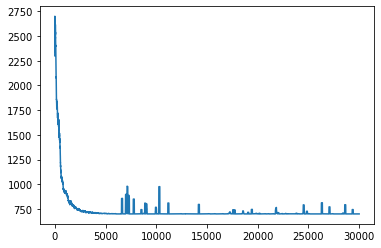

In [14]:
def moving_average(p_list):
    temp_list = deque(maxlen=100)
    mov_avg_list = []
    for i in p_list:
        temp_list.append(i)
        mov_avg_list.append(sum(temp_list)/len(temp_list))
    return mov_avg_list
        
path_length_list_avg = moving_average(path_length_list_c)
# rewards_list_avg = moving_average(rewards_list_c)
plt.plot(path_length_list_avg)
print(path_length_list_c[:5])
print(path_length_list_avg[:5])

In [18]:
import os
try:
    os.mkdir('drive/saved_plots')
except:
    print("folder is already there")
    
def plot_this(epsilon_list, rewards_list, path_length_list, environment, hop_penalty_list):
    x_axis = list(range(environment.no_of_episodes))
    x_axis = x_axis[:len(path_length_list)]
    fig=plt.figure(figsize=(18, 16), dpi= 80, facecolor='w', edgecolor='k')
    x_axis = x_axis[:len(epsilon_list)]
    
    hp = [i*10 for i in hop_penalty_list]
    hop_penalty_list = hp
    rw = [i/100 for i in rewards_list]
    rewards_list = rw
#     pl = 1000*np.log(path_length_list)
#     path_length_list = pl
#     ep = [i*10 for i in epsilon_list]
#     epsilon_list = ep
    
    plt.plot(x_axis,epsilon_list,'r', label='Epsilon (scaled by 1000)')
    plt.plot(x_axis,rewards_list,'g', label='Episode Rewards (scaled by /100)')
#     plt.plot(x_axis,hop_penalty_list, 'k', label='Weight Penalty (scaled by 1000)',linestyle="",marker="o", markersize=0.75)
    plt.plot(x_axis,path_length_list,'b', label='Path Length (scaled by 100)')

    plt.legend(loc="upper right")
    plt.xlabel('->Episodes')
    plt.ylabel('->Epsilon*1000, Rewards, Path Length*100')
    plt.text(26000, 2000, f'Epsilon Decaying Factor: {epsilon_decaying_factor}')
    plt.text(26000, 1800, f'Adam learning rate: 0.001')
    plt.title('Epsilon, Rewards, Path Length vs Episodes')

folder is already there


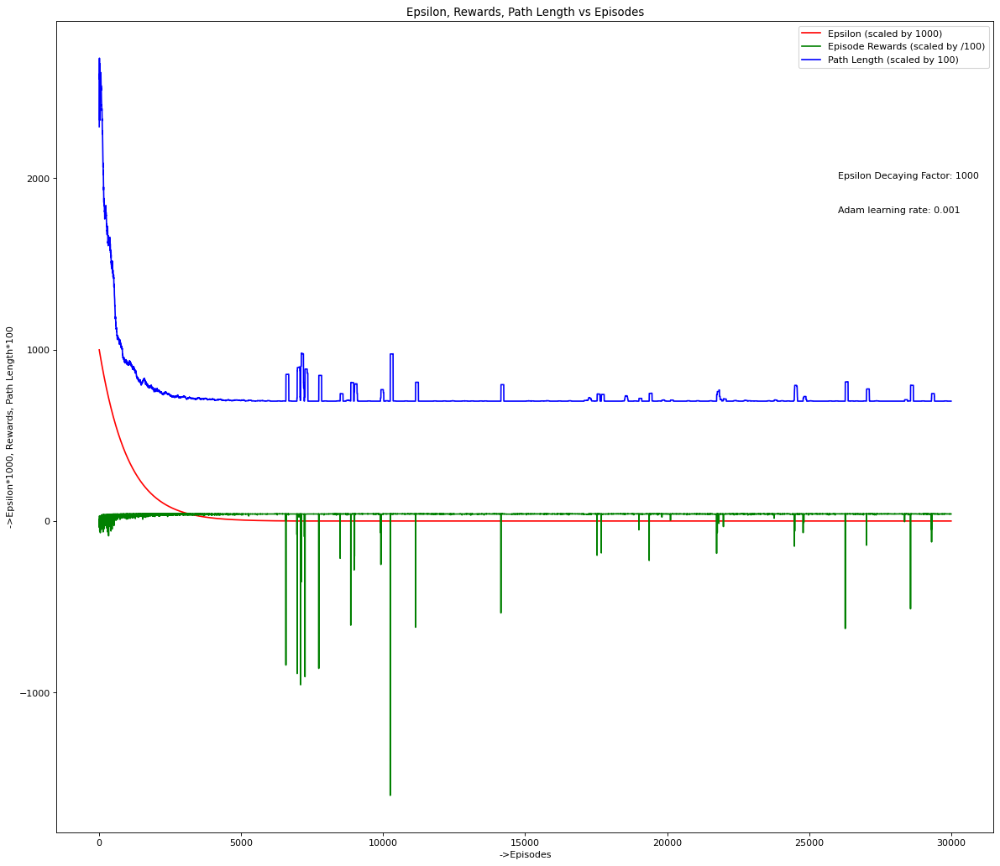

In [19]:
plot_this(epsilon_list_c, rewards_list_c, path_length_list_avg, environment, hop_penalty_list)
plt.savefig(f'saved_plots/plot_{epsilon_decaying_factor}_min_eps_{environment.min_epsilon}_lr_0.001_discount_{discount}_hop_penaltyx10_{environment.action_space}.png')

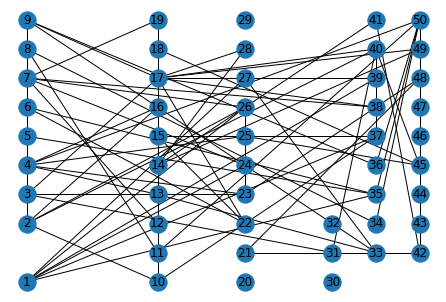

In [101]:
def plot_path(path):
    G=nx.Graph()
    for i in range(1, 51):
        G.add_node(i)
    edge_list = []
    for i in range(len(path)-1):
        edge_list.append((path[i], path[i+1]))
    G.add_edges_from(edge_list)
    nx.draw(G, pos=environment.node_positions, with_labels=True)                         
plot_path(path_taken_list[0])

In [84]:
# def get_paths(path):
#     sample_path = []
#     sample_path.append(path.pop(0))
#     sample_path.append(random.sample(path,3))
#     sample_path.append(path.pop(-1))
#     return sample_path
# # print(path)
# sample_paths = get_paths(path)
# for i in sample_paths:
#     plt.figure()
#     plt.plot(i)
#     plt.show()

In [136]:
# Save the entire model as a SavedModel.
import os
# !mkdir -p saved_model
try:
    os.mkdir('saved_models')
except:
    print('already there')
# mm, tm = DQNAgent.get_models()
agent.main_model.save(f'saved_models/main_model_ef_{epsilon_decaying_factor}_mineps_{environment.min_epsilon}_lr_0.1_hop_penaltyx10_50.h5')
agent.target_model.save(f'saved_models/target_model_ef_{epsilon_decaying_factor}_mineps_{environment.min_epsilon}_lr_0.1_hop_penaltyx10_50.h5')

already there


In [15]:
# plot_this(epsilon_scaled, rewards_list, path_scaled, environment)

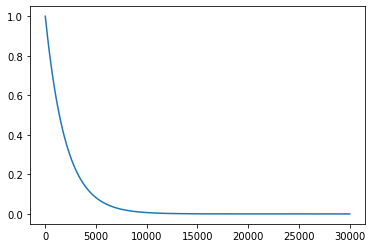

In [69]:
import numpy as np
import matplotlib.pyplot as plt
x = list(range(30000))
# print(x)
k = 2000
y = [float(np.exp(-i/k)) for i in x]
# print(y)
plt.plot(x,y)

In [0]:
class keka:
    def test(self,i):
        return i[1]
    a = [(1,3),(2,1),(3,2)]
    def uppu(self):
        self.a.sort(reverse=True,key=self.test)
        return self.a
    
k = keka()
print(k.uppu())

[(1, 3), (3, 2), (2, 1)]


In [0]:
problem = tsplib95.load_problem('Vrp-All/_singleTruck/A-n32-k5_4.vrp')
len(list(problem.get_nodes()))

5